In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
from matplotlib.collections import LineCollection
import numba
from matplotlib import colors as mcolors
import pandas as pd
from itertools import combinations

import matplotlib.pyplot as plt; plt.rcdefaults()
from scipy import stats
import matplotlib.mlab as mlab
import math
from tqdm import tqdm

import locust 
import data_analysis

In [2]:
! mkdir plots
! mkdir plots\pairwise
! mkdir plots\FB
! mkdir plots\AFMB
! mkdir plots\LR
! mkdir plots\FL_Speed
! mkdir img4video

A subdirectory or file plots already exists.
A subdirectory or file plots\pairwise already exists.
A subdirectory or file plots\FB already exists.
A subdirectory or file plots\AFMB already exists.
A subdirectory or file plots\LR already exists.
A subdirectory or file plots\FL_Speed already exists.
A subdirectory or file img4video already exists.


In [3]:
# ***** write the location of locust_posture_data.h5 *****
posture_data_location = 'locust_posture_data.h5'
body_parts_loc='skeleton.csv'
skeleton_loc='locust_skeleton.npy'

In [4]:
body_parts = pd.read_csv(body_parts_loc).values
skeleton = np.load(skeleton_loc)

### Get Pairwise Interactions from Individual Posture Data 
After using the python library DeepPoseKit to extract posture data from the locust video, the following functions store the Pairwise Interactions between each pairs of locusts in an Undirected Adjacency Matrix to represent how the all the individuals are connected (array size: [individ, time_window, limbs, limbs]).

To do this efficiently, the following code has been sped up with a) numba and b) experimenting with different efficient calculations methods. The most successful method was the calculation of bounding boxes around the individual:
1. Compute bounding boxes for each individual
2. Check if boxes overlap
3. If boxes overlap, calculate limb intersection

The progress is updated every 10 frames. 
The result, an undirected adjacency matrix, is stored in an h5 file titled 'pairwise_data.h5'

In [5]:
# create python class and set the variables
totalFrames=324399
N_INDIVID=103
LIMBS=26

In [6]:
with h5py.File('pairwise_data.h5', 'w') as h5File:
    h5File.create_dataset('pairwise_data', shape=(103, totalFrames, 26, 26), dtype=np.uint8)

In [ ]:
pw_int = locust.PairwiseInteraction(posture_data_location, skeleton)
for time in range(100, totalFrames, 100):
    with h5py.File('pairwise_data.h5', mode='r+') as h5file:
        calculated_data = pw_int.get_pairwise(time-1, 100) 
        h5file['pairwise_data'][:, time-100:time] = calculated_data.astype(np.uint8)

To visualize this process, use the following code to generate a video.

In [ ]:
pw_int.sample_frame(10)
pw_int.get_pairwise_vid(1999, 850)

Video is saved as a gif titled "experiment_viz.gif"

In [ ]:
import imageio
import os

filenames=os.listdir("./img4video/")

with imageio.get_writer('./experiment_viz.gif', mode='I') as writer:
    for filename in filenames:
        image = imageio.imread("./img4video/%s" % filename)
        writer.append_data(image)

### Get Y Data: Movement Classification
To measure individual movement tendencies, the change in the position of the head was used. This distance was normalized based on the locust's body length. To classify the locust as moving (1) vs paused (0), a Gaussian Mixture Model with two components was fit onto the data. ### Get Y Data: Movement Classification

In [26]:
with h5py.File('moving_classification_og_head.h5', 'r') as h5File:
    moving_classification_h5 = h5File.get('moving_classification')
    moving_classification = np.array(moving_classification_h5)
moving_classification.shape

(103, 324399)

In [27]:
def get_TS_movement(moving_classification, init_frame, time_window):
    """ Get Time Series Movement Classification Data 
            time_window : how many frames you go back
            
    Parameters
    ----------
    moving_classification : {array-like, sparse matrix}, shape = (103, 108133)
        0/1: Is locust moving (1) or paused (0)? 
    init_frame: int
        Initial frame
    time_window: int
        How many frames are you going back
       
        
    Returns
    -------
    TS_data : {array-like, sparse matrix}, shape (N_INDIVID, time_window, 
                                                    movement_classification)
        Obtain time series data (Dependent variable, predictor)
    """
    TS_data = np.zeros((103, time_window, 1))
    skeleton = np.load('locust_skeleton.npy')
    ts_count = 0
    for frame in range(init_frame - time_window + 1, init_frame + 1): # ex: frame 5-10 (inclusive)
        #get movement classification
        for LocustA in range(103):
            TS_data[LocustA, ts_count, 0] = moving_classification[LocustA][frame]
        ts_count += 1
    return TS_data

In [28]:
y = get_TS_movement(moving_classification, totalFrames-1, totalFrames)

In [18]:
y=y[:, 100:totalFrames-100, :]
# y=y[:, 0:totalFrames, :]

y.shape 

(103, 324299, 1)

### Data Analysis

In [19]:
data_loc='test.h5'
data_class_name = 'test'

In [20]:
def classification(classification):
    """ fill array: newX, to determine if the locust is touching the front/back, left/right. 
            
    Parameters
    ----------
    classification : array, shape = (26, )
        Number to classify the part of the body of the locust
    X : {array-like, sparse matrix}  shape (N_INDIVID, time_window, 
                                            movement_classification)
       
        
    Returns
    -------
    TS_data : {array-like, sparse matrix}, shape (N_INDIVID, time_window, 
                                                    movement_classification)
        Obtain time series data (Dependent variable, predictor)
    """
    
    
    template=np.zeros((103,totalFrames,1))
    newX=np.full_like(template, np.nan)

    # count = np.zeros((4))
    limb_count = np.zeros((len(body_parts)))

    for locust in range(103):
        #print(locust)
        for frame in tqdm(range(totalFrames)):
            # print(frame)
            
            with h5py.File(data_loc, mode='r+') as h5file:
                X = h5file[data_class_name][locust, frame, :, :] # shape: (26, 26)

            X=np.sum(X, axis=1)
            interaction = np.sum(X)
            
            if (interaction>1): # touching multiple limbs
                index = np.array(X.nonzero())[0] # get index to identify the limb

                classification_sum=0
                for idx in index:
                    if (not np.isnan(classification[idx])):
                        # count[int(classification[idx])]+=1
                        limb_count[idx]+=1
                        classification_sum+=classification[idx]
                avg_classification=classification_sum/index.shape[0]
                if avg_classification==0: # if all the limbs are touching front, record as front
                    newX[locust, frame, 0] = 0
                elif avg_classification==1: # if all the limbs are touching back, record as back
                    newX[locust, frame, 0] = 1
                elif avg_classification==5: # if all the limbs are touching back, record as back
                    newX[locust, frame, 0] = 5
                elif avg_classification==31: # if all the limbs are touching back, record as back
                    newX[locust, frame, 0] = 31
                # else: if touching on front and back, keep newX value as np.nan

            if (interaction==1): # touching *one* other limb
                index = np.nonzero(X) # get index to identify the limb
                if (not np.isnan(classification[index][0])):
                    newX[locust, frame, 0] = classification[index][0] # get classification
                    # count[int(classification[index][0])]+=1
                    limb_count[index]+=1

    return newX, limb_count #, count

In [21]:
colors = ['dodgerblue', 'orange', 'g', 'r']

### Individual Locust's Limb Interactions

In [22]:
import data_analysis

#### Classification of Locust's Limbs

In [23]:
# given the body_parts array, classify the body parts as FB/LR (based on the list of body parts)
# 0: front, 1: back
classification_fb=np.array([0,0,1,1,0,0,0,0,0,np.nan,np.nan,np.nan,1,1,1,0,0,0,0,0,np.nan,np.nan,np.nan,1,1,1])

# 0: left, 1: right
classification_lr=np.array([np.nan,np.nan,np.nan,np.nan,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1])

# antennae=0; front=1; middle=5; back=31
classification_AFMB=np.array([np.nan,np.nan,np.nan,np.nan,0,0,1,1,1,5,5,5,31,31,31,0,0,1,1,1,5,5,5,31,31,31])
ant_numb, front_numb, mid_numb, back_numb = 0, 1, 5, 31

#### Plots
Plots saved under ./plots/

In [14]:
# Alter the Pause_Length
pause_lengths = [18, 30, 90]
framesback=360 
filter_lengths=[30, 60, 90]

### Individual Limb Interactions

AFMB: Antennae, Front, Middle, Back

In [18]:
X_AFMB, limb_count = classification(classification_AFMB)
with h5py.File('classification_AFMB.h5', 'w') as h5file:
    h5file.create_dataset('class', shape=X_AFMB.shape, data=X_AFMB)
    h5file.create_dataset('counts', shape=limb_count.shape, data=limb_count)

 48%|████▊     | 156370/324299 [01:22<01:26, 1937.30it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 324299/324299 [02:50<00:00, 1907.39it/s]


In [19]:
X_FB, limb_count = classification(classification_fb)
with h5py.File('classification_FB.h5', 'w') as h5file:
    h5file.create_dataset('class', shape=X_FB.shape, data=X_FB)
    h5file.create_dataset('counts', shape=limb_count.shape, data=limb_count)

  7%|▋         | 22977/324299 [00:12<02:38, 1900.43it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

  7%|▋         | 21983/324299 [00:11<02:36, 1927.30it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

  5%|▍         | 15621/324299 [00:08<02:41, 1916.89it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--No

In [ ]:
X_LR, limb_count = classification(classification_lr)
with h5py.File('classification_LR.h5', 'w') as h5file:
    h5file.create_dataset('class', shape=X_LR.shape, data=X_LR)
    h5file.create_dataset('counts', shape=limb_count.shape, data=limb_count)

 78%|███████▊  | 253639/324299 [02:13<00:36, 1926.49it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 77%|███████▋  | 251313/324299 [02:11<00:37, 1943.50it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### AFMB: Antenna Front Middle Back
By classifying the locust's limbs into Antenna, Front, Middle, Back, we are able to look at which interactions occur most frequently when the locust changes from a paused to moving state. 
Several parameters can be changed:
- how far back and forward we want to look at the locusts behavior
- duration of pause the locust must encounter before moving
- duration of pause and duration of period of movement

#### Antennae/Front/Middle/Back Pairwise Interactions
The pairwise interactions look at for example Locust A's antenna touching locust B's back legs. This allows us to isolate the pairwise interactions and study which pairwise interactions are most prevalent when a locust changes from a paused to moving state.

In [122]:
AFMB_pair= np.array([['AA', 'AF', 'AM', 'AB'], 
            ['FA', 'FF', 'FM', 'FB'], 
            ['MA', 'MF', 'MM', 'MB'], 
            ['BA', 'BF', 'BM', 'BB']])

keys=np.reshape(AFMB_pair, -1)
all_numbs=[2,3,5,7,11,13,17,19,23,29,31,37,41,43,47,53]
AFMB_dict = dict(zip(keys, all_numbs))

In [150]:
def AFMBpair_classification(classification):
    # fill up newX, to determine if it is touching the AFMB
    template=np.zeros((103, totalFrames,1))
    newX=np.full_like(template, np.nan)
    
    for locust in range(103):
        for frame in tqdm(range(totalFrames)):
            
            with h5py.File('test.h5', mode='r+') as h5file:
                X = h5file['test'][locust, frame, :, :] # shape: (26, 26)

            interaction = np.sum(X)
                       
            if (interaction>1): # touching multiple limbs, see if there is one overall interaction 
                rows, cols = np.array(X.nonzero())
                classification_sum=0
                for idx in range(len(rows)): # for each number of limb interactions
                    classification_sum+=AFMB_classify(rows[idx], cols[idx], classification)
                
                avg_classification=classification_sum/len(rows) # avoids overlaps because numbs are prime

                for pair_interaction in AFMB_dict:
                    # if avg_classification equals the interaction's corresponding number
                    if (avg_classification==AFMB_dict[pair_interaction]):
                        newX[locust, frame, 0]=avg_classification
                    else: # no overall interaction (includes interactions of mixed body parts)
                        avg_classification=-1
                        newX[locust, frame, 0]=avg_classification

            if (interaction==1): # touching *one* other limb
                row, col = np.nonzero(X) # get index to identify the limb
                newX[locust, frame, 0] = AFMB_classify(row, col, classification) # get classification             
    return newX

def AFMB_classify(row, col, classification):
    a,b=(classification[row], classification[col])
    if (not np.isnan(a) and not np.isnan(b)):
        a=int(a)
        b=int(b)
        idxA=np.where(np.unique(classification_AFMB)[0:AFMB_pair.shape[0]]==a)[0][0]
        idxB=np.where(np.unique(classification_AFMB)[0:AFMB_pair.shape[0]]==b)[0][0]
        numb = AFMB_dict[AFMB_pair[idxA][idxB]]
        # print(numb)
        return numb
    else:
        return 0
    
def pairwise_history(newX, y, framesback, pause_length, filter_frames=0):
    
    # create dict to store the history
    n = len(all_numbs)
    size=(2*framesback)+1  
    lists = [np.zeros(size) for _ in range(n)]
    history = dict(zip(all_numbs, lists))
    speed_changes = 0
    mid_point = int((2*framesback+1)/2)    

    for individ in tqdm(range(y.shape[0])): # cannot proceed if X and y do not match
        print(individ)
        for frame in range(framesback, totalFrames-framesback-1):
            if filter_frames>0:
                past=np.sum(y[individ, frame-filter_frames:frame-1])
                future=np.sum(y[individ, frame:frame+filter_frames])
                
                if (future-past)>(filter_frames-5):
                    if (y[individ, frame] - y[individ, frame-1])==1: 
                        speed_changes+=1
                        # past
                        for frameback in range(framesback):
                            interaction_id_numb = newX[individ, frame-frameback,0]
                            if not (np.isnan(interaction_id_numb) or interaction_id_numb==0 or interaction_id_numb==-1):
                                history[interaction_id_numb][mid_point-frameback]+=1
                        # future
                        for framefwd in range(1, framesback):
                            interaction_id_numb = newX[individ, frame+framefwd,0]
                            if not (np.isnan(interaction_id_numb) or interaction_id_numb==0 or interaction_id_numb==-1):
                                history[interaction_id_numb][mid_point+framefwd]+=1
                                
            else:
                past=np.sum(y[individ, frame-pause_length:frame-1])
                if (y[individ, frame] - y[individ, frame-1])==1: 
                    speed_changes+=1
                    # past
                    for frameback in range(framesback):
                        interaction_id_numb = newX[individ, frame-frameback,0]
                        if not (np.isnan(interaction_id_numb) or interaction_id_numb==0 or interaction_id_numb==-1):
                            history[interaction_id_numb][mid_point-frameback]+=1
                    # future
                    for framefwd in range(1, framesback):
                        interaction_id_numb = newX[individ, frame+framefwd,0]
                        if not (np.isnan(interaction_id_numb) or interaction_id_numb==0 or interaction_id_numb==-1):
                            history[interaction_id_numb][mid_point+framefwd]+=1
                        
    print("speed changes: ", speed_changes)
    return history, speed_changes

def plot_pairwise(region, A, F, M, B, framesback, labels, pause_length, filter_frames=0):

    size=(2*(framesback))+1
    ind = np.arange(0, size)-framesback # x axis
    fig, ax = plt.subplots()

    plt.plot(ind[1:size-1], A[1:size-1], label=labels[0], linestyle='-')
    plt.plot(ind[1:size-1], F[1:size-1], label=labels[1], linestyle='-')
    plt.plot(ind[1:size-1], M[1:size-1], label=labels[2], linestyle='-')
    plt.plot(ind[1:size-1], B[1:size-1], label=labels[3], linestyle='-')
    
    plt.legend(bbox_to_anchor=(1, 1), loc=1, fontsize=20)
    
    plt.axvline(x=0, linestyle=':', color='b', linewidth=2)
    if filter_frames>0:
        plt.axvspan(-1*filter_frames, filter_frames, facecolor='0.5', alpha=0.2)
    elif filter_frames==0:
        plt.axvspan(-1*pause_length, 0, facecolor='0.5', alpha=0.2)
    
    ax.set_xlabel('Frame before and after paused to moving transition occurs (transition occurs at frame=0)', fontsize=20)
    ax.set_ylabel('P(Pairwise Interaction)', fontsize=20)
    
    ax.set_xticks(np.arange(0, 2*framesback+10, 10)-framesback)
    ax.set_xticklabels(np.arange(0, 2*framesback+10, 10)-framesback)
    
    fig.set_size_inches((40, 12))


    if filter_frames>0: 
        ax.set_title('Probability Locusts Engages in the Interaction with the %s in %d Seconds \n Before and After a Change From %.2f Seconds of Pause to %.2f Seconds of Motion is Observed' % (region, int(framesback/90), filter_frames/90, filter_frames/90), fontsize=25)
    else: 
        ax.set_title('Probability Locusts Engages in the Interaction with the %s in %d Seconds \n Before and After a Change From %.2f Seconds of Pause to Moving is Observed' % (region, int(framesback/90), pause_length/90), fontsize=25)

    if filter_frames>0:
        fig.savefig('./plots/pairwise/%s_pairwise_%d_filter%d.png' % (region, pause_length, filter_frames))
    else:
        fig.savefig('./plots/pairwise/%s_pairwise_%d.png' % (region, pause_length))

    plt.show()
    
def get_duration(pairwise_X, numb, locust, frame, marked):
    if pairwise_X[locust, frame, 0]==numb:
        length=0
        while pairwise_X[locust, frame, 0]==numb:
            marked[locust, frame, 0]=True
            length+=1
            if frame==(pairwise_X.shape[1]-1):
                break
            else: 
                frame+=1
    return length, marked

In [ ]:
'''pairwise_AFMB = AFMBpair_classification(classification_AFMB)'''

In [29]:
with h5py.File('pairwise_AFMB.h5', mode='w') as h5file:
    h5file.create_dataset('pairwise_AFMB', data=pairwise_AFMB, shape=pairwise_AFMB.shape, dtype=np.uint8)

In [124]:
unique, counts = np.unique(pairwise_AFMB, return_counts=True)
unique[0:16], counts[0:16]

(array([-1.,  0.,  2.,  3.,  5.,  7., 11., 13., 17., 19., 23., 29., 31.,
        37., 41., 43.]),
 array([5457114,  723579,  261871,  153711,  201919,  239147,  148120,
         183862,  221965,  277984,  178614,  206332,  154349,  130258,
         193786,  228992]))

In [ ]:
pause_length=pause_lengths[2]
history_p2, sc_p2 = pairwise_history(pairwise_AFMB, y, framesback=framesback, pause_length=pause_length)

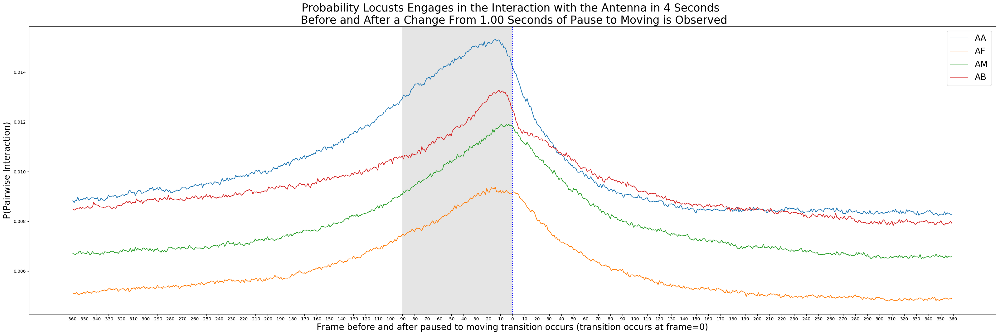

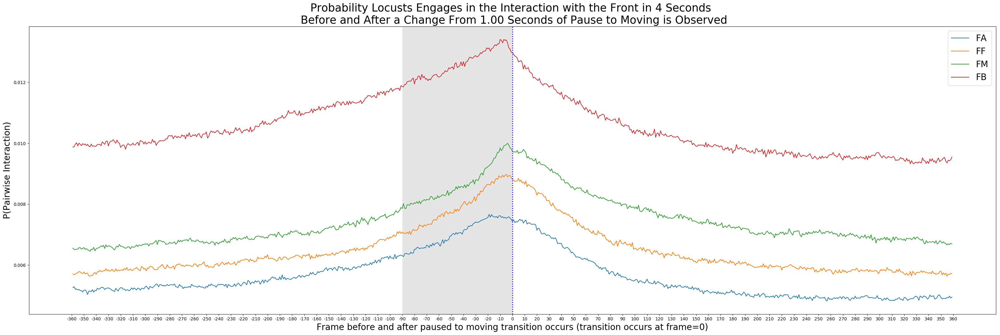

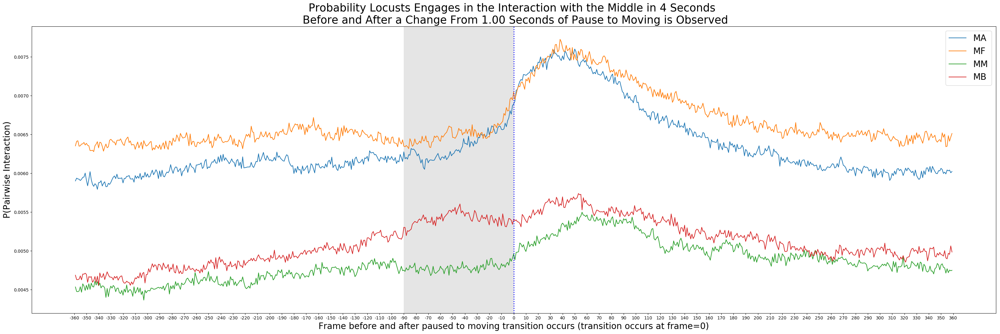

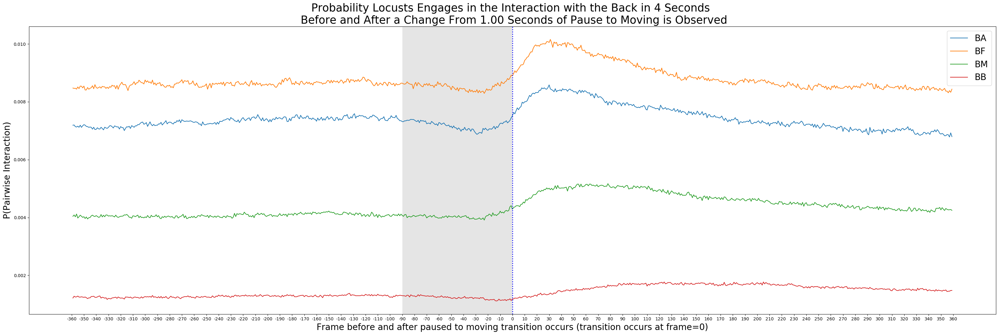

In [139]:
region = "Antenna"
labels = ['AA', 'AF', 'AM', 'AB']
plot_pairwise(region=region, A=history_p2[AFMB_dict[labels[0]]]/sc_p2, F=history_p2[AFMB_dict[labels[1]]]/sc_p2, 
              M=history_p2[AFMB_dict[labels[2]]]/sc_p2, B=history_p2[AFMB_dict[labels[3]]]/sc_p2, 
              framesback=framesback, labels=labels, pause_length=pause_length)


region = "Front"
labels = ['FA', 'FF', 'FM', 'FB']
plot_pairwise(region=region, A=history_p2[AFMB_dict[labels[0]]]/sc_p2, F=history_p2[AFMB_dict[labels[1]]]/sc_p2, 
              M=history_p2[AFMB_dict[labels[2]]]/sc_p2, B=history_p2[AFMB_dict[labels[3]]]/sc_p2, 
              framesback=framesback, labels=labels, pause_length=pause_length)


region = "Middle"
labels = ['MA', 'MF', 'MM', 'MB']
plot_pairwise(region=region, A=history_p2[AFMB_dict[labels[0]]]/sc_p2, F=history_p2[AFMB_dict[labels[1]]]/sc_p2, 
              M=history_p2[AFMB_dict[labels[2]]]/sc_p2, B=history_p2[AFMB_dict[labels[3]]]/sc_p2, 
              framesback=framesback, labels=labels, pause_length=pause_length)


region = "Back"
labels = ['BA', 'BF', 'BM', 'BB']
plot_pairwise(region=region, A=history_p2[AFMB_dict[labels[0]]]/sc_p2, F=history_p2[AFMB_dict[labels[1]]]/sc_p2, 
              M=history_p2[AFMB_dict[labels[2]]]/sc_p2, B=history_p2[AFMB_dict[labels[3]]]/sc_p2, 
              framesback=framesback, labels=labels, pause_length=pause_length)


In [ ]:
filter_length=filter_lengths[0]
history_f0, sc_f0 = pairwise_history(pairwise_AFMB, y, framesback=framesback, pause_length=np.nan, filter_frames=filter_length)

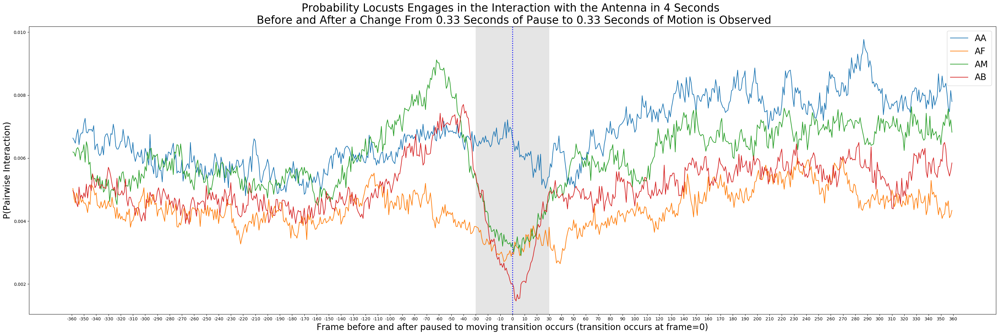

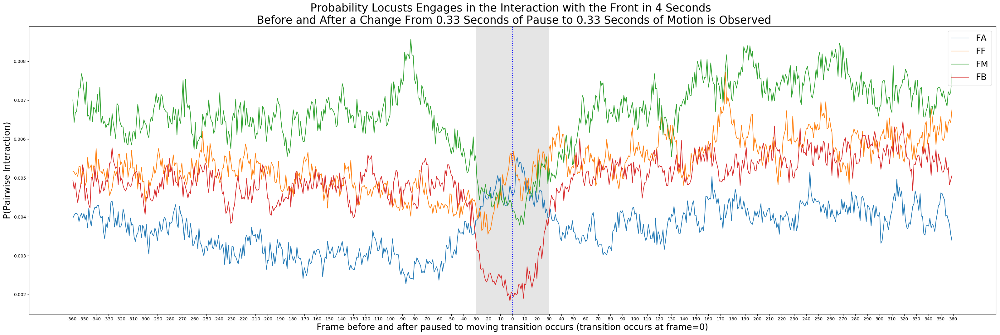

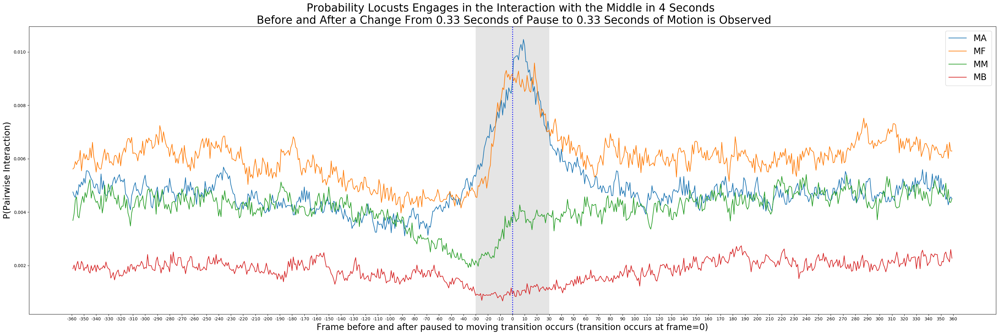

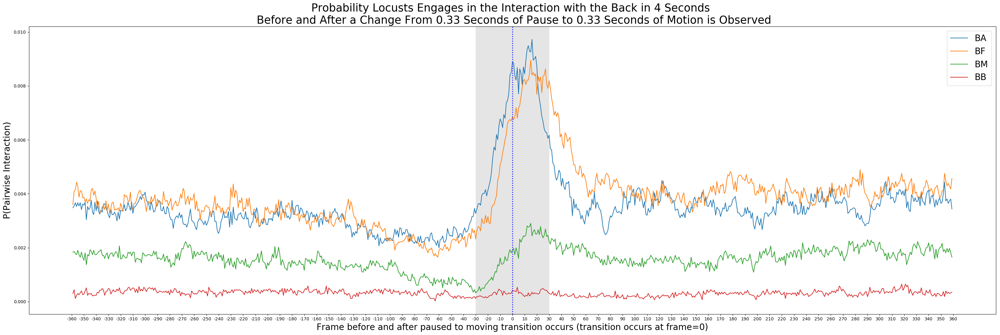

In [152]:
history=history_f0
sc=sc_f0
region = "Antenna"
labels = ['AA', 'AF', 'AM', 'AB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


region = "Front"
labels = ['FA', 'FF', 'FM', 'FB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


region = "Middle"
labels = ['MA', 'MF', 'MM', 'MB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


region = "Back"
labels = ['BA', 'BF', 'BM', 'BB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


In [ ]:
filter_length=filter_lengths[2]
history_f2, sc_f2 = pairwise_history(pairwise_AFMB, y, framesback=framesback, pause_length=np.nan, filter_frames=filter_length)

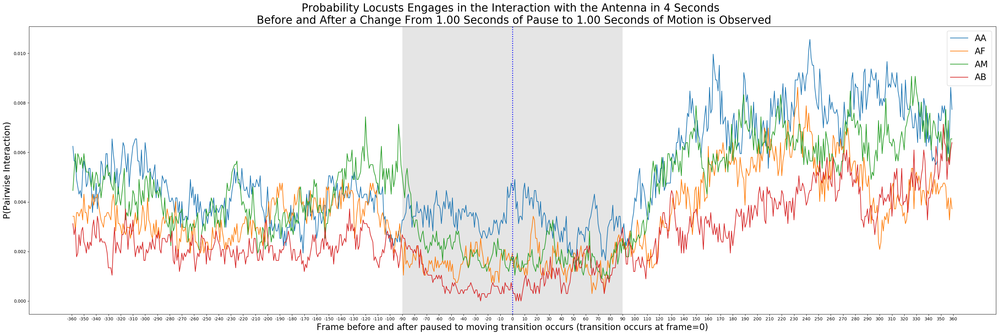

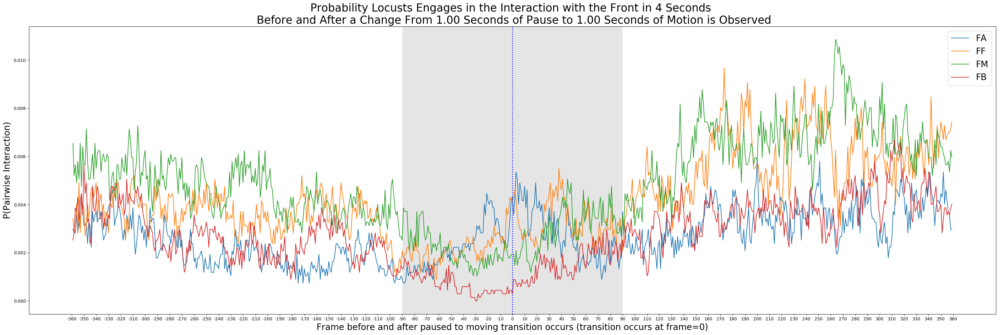

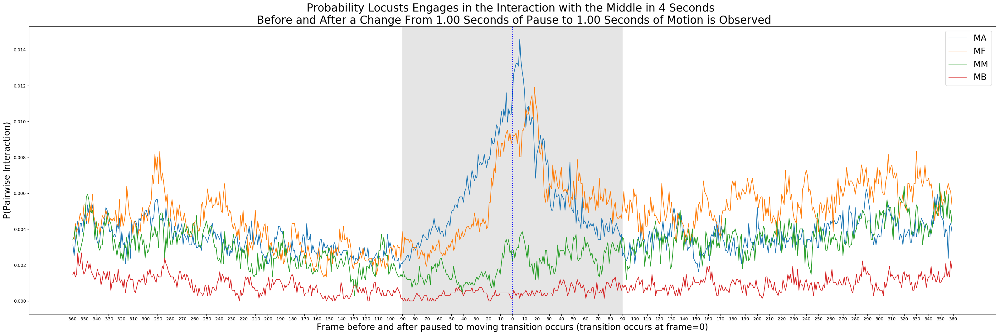

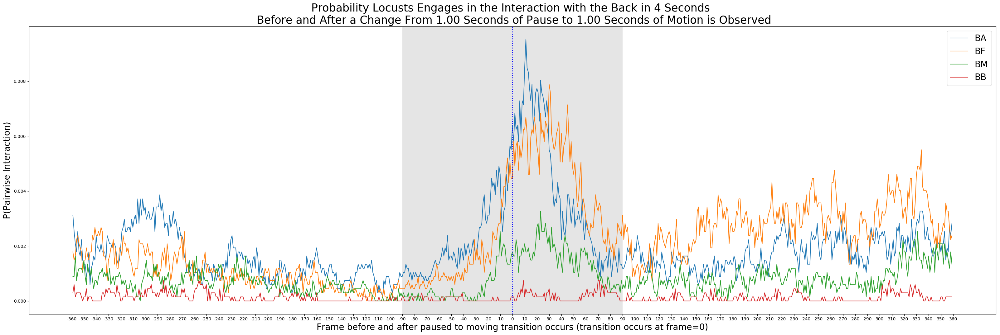

In [156]:
history=history_f2
sc=sc_f2
region = "Antenna"
labels = ['AA', 'AF', 'AM', 'AB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


region = "Front"
labels = ['FA', 'FF', 'FM', 'FB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


region = "Middle"
labels = ['MA', 'MF', 'MM', 'MB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


region = "Back"
labels = ['BA', 'BF', 'BM', 'BB']
plot_pairwise(region=region, A=history[AFMB_dict[labels[0]]]/sc, F=history[AFMB_dict[labels[1]]]/sc, 
              M=history[AFMB_dict[labels[2]]]/sc, B=history[AFMB_dict[labels[3]]]/sc, 
              framesback=framesback, labels=labels, pause_length=pause_length, filter_frames=filter_length)


In [ ]:
unique, counts = np.unique(X_AFMB, return_counts=True)
print("unique: ", unique[0:4], " counts: ", counts[0:4])

avg_AFMB=np.array([counts[0]/(totalFrames*103), counts[1]/(totalFrames*103), counts[2]/(totalFrames*103), counts[3]/(totalFrames*103)])  

In [16]:
import data_analysis

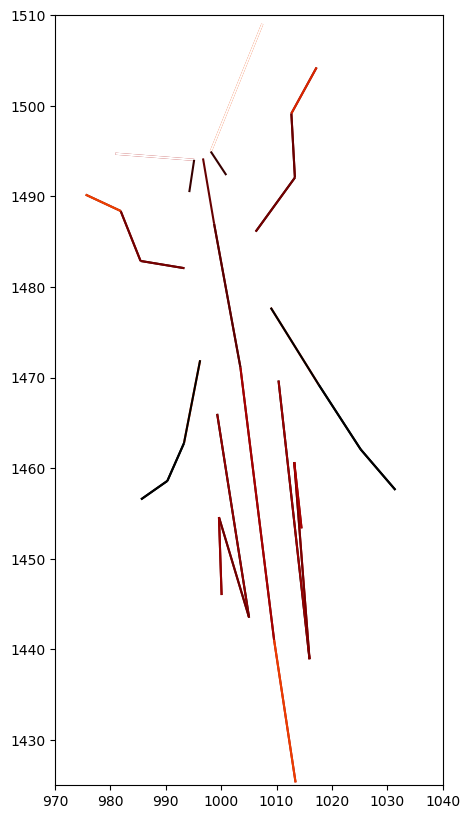

In [16]:
# data_analysis.heatmap(limb_count)

with h5py.File('classification_FB.h5', 'r') as h5file:
    limb_counts_FB=h5file.get('counts')
    limb_counts_FB=np.array(limb_counts_FB)
data_analysis.heatmap(limb_counts_FB)

### Pairwise Locust's Limb Interactions

In [88]:
(neither_numb, ff_numb, fb_numb, bf_numb, bb_numb) = (0, 17, 31, 61, 199)
numb_list = [neither_numb, ff_numb, fb_numb, bf_numb, bb_numb]

In [89]:
case = ['FB_pairwise', 'Ant', 'Front', 'Middle', 'Back']

Functions

In [106]:
def pairwise_classification(classification):
    # fill up newX, to determine if it is touching the front/back 
    template=np.zeros((103,totalFrames,1))
    newX=np.full_like(template, np.nan)
    
    for locust in range(103):
        print(locust)
        for frame in range(totalFrames):
            
            with h5py.File('test.h5', mode='r+') as h5file:
                X = h5file['test'][locust, frame, :, :] # shape: (26, 26)

            interaction = np.sum(X)
                       
            if (interaction>1): # touching multiple limbs, see if there is one overall interaction 
                rows, cols = np.array(X.nonzero())
                classification_sum=0
                for idx in range(len(rows)):
                    classification_sum+=fb_classify(rows[idx], cols[idx], classification)
                avg_classification=0
                for numb in np.arange(1,5):
                    if (classification_sum / len(rows) == numb_list[numb]):
                        avg_classification=numb_list[numb]
                    else: # else if no overall interaction
                        avg_classification=neither_numb
                newX[locust, frame, 0] = avg_classification
                # print(avg_classification)

            if (interaction==1): # touching *one* other limb
                row, col = np.nonzero(X) # get index to identify the limb
                newX[locust, frame, 0] = fb_classify(row, col, classification) # get classification             
    return newX

def fb_classify(row, col, classification):
    a,b=(classification[row], classification[col])
    # print(a,b)
    if (a,b)==(0.0, 0.0): #FF
        # print('ff')
        return ff_numb
    elif (a,b)==(0.0, 1.0): #FB
        # print('fb')
        return fb_numb
    elif (a,b)==(1.0, 0.0): #BF
        # print('bf')
        return bf_numb
    elif (a,b)==(1.0, 1.0): #BB
        # print('bb')
        return bb_numb
    else:
        # print('neither')
        return neither_numb
    
                    
def get_pairwise_past(individ, frame, framesback, newX, ff, fb, bf, bb):
    mid_point = int((2*framesback+1)/2)
    # get data from past frames (includes frame=0)
    for frameback in range(framesback):
        if newX[individ, frame-frameback]==ff_numb:
            ff[mid_point-frameback]+=1
        elif newX[individ, frame-frameback]==fb_numb:
            fb[mid_point-frameback]+=1
        elif newX[individ, frame-frameback]==bf_numb:
            bf[mid_point-frameback]+=1
        elif newX[individ, frame-frameback]==bb_numb:
            bb[mid_point-frameback]+=1

    # get data from future frames
    for framefwd in range(1, framesback):
        if newX[individ, frame+framefwd]==ff_numb:
            ff[mid_point+framefwd]+=1
        elif newX[individ, frame+framefwd]==fb_numb:
            fb[mid_point+framefwd]+=1
        elif newX[individ, frame+framefwd]==bf_numb:
            bf[mid_point+framefwd]+=1
        elif newX[individ, frame+framefwd]==bb_numb:
            bb[mid_point+framefwd]+=1
    return ff, fb, bf, bb
                                
def pairwise_history(newX, y, framesback, pause_length, filter_frames=0):    
    size=(2*framesback)+1  
    ff=np.zeros(size)
    fb=np.zeros(size)
    bf=np.zeros(size)
    bb=np.zeros(size)

    speed_changes = 0
    for individ in tqdm(range(y.shape[0])):
        for frame in range(framesback, totalFrames-framesback-1):
            if filter_frames>0: #  Filtering out the brief changes in motion 
                past=np.sum(y[individ, frame-filter_frames:frame-1])
                future=np.sum(y[individ, frame:frame+filter_frames])
                
                # Keep data points where locust was paused for X frames, moving for X frames (some room for small movement changes)
                if (future-past)>filter_frames-5:
                    if (y[individ, frame] - y[individ, frame-1])==1: 
                        speed_changes+=1
                        ff, fb, bf, bb = get_pairwise_past(individ, frame, framesback, newX, ff, fb, bf, bb)
            elif filter_frames==0: # no filtering
                past=np.sum(y[individ, frame-pause_length:frame-1]) # 0
                if past==0:
                    if (y[individ, frame] - y[individ, frame-1])==1: 
                        speed_changes+=1
                        ff, fb, bf, bb = get_pairwise_past(individ, frame, framesback, newX, ff, fb, bf, bb) # count 
           
    print("speed changes: ", speed_changes)
    return ff, fb, bf, bb, speed_changes

def plot_pairwise(ff, fb, bf, bb, framesback, avg_pairwise, pause_length, filter_frames):
    
    size=(2*(framesback))+1
    ind = np.arange(0, size)-framesback  # the x locations for the groups
    fig, ax = plt.subplots()
    labels_pair = ['FF', 'FB', 'BF', 'BB']

    plt.plot(ind[1:size-1], ff[1:size-1], label=labels_pair[0], linestyle='-')
    plt.plot(ind[1:size-1], fb[1:size-1], label=labels_pair[1], linestyle='-')
    plt.plot(ind[1:size-1], bf[1:size-1], label=labels_pair[2], linestyle='-')
    plt.plot(ind[1:size-1], bb[1:size-1], label=labels_pair[3], linestyle='-')
    
    '''for idx, avg in enumerate(avg_pairwise):
        plt.axhline(y=avg, color=colors[idx], linestyle='-')'''
    
    plt.axvline(x=0, linestyle=':', color='b', linewidth=2)
    if filter_frames>0:
        plt.axvspan(-1*filter_frames, filter_frames, facecolor='0.5', alpha=0.2)
    elif filter_frames==0:
        plt.axvspan(-1*pause_length, 0, facecolor='0.5', alpha=0.2)

    
    plt.legend(bbox_to_anchor=(1, 1), loc=1, fontsize=20)
    
    ax.set_xlabel('Frames before and after paused to moving transition occurs (transition occurs at frame=0)', fontsize=20)
    ax.set_ylabel('P(Interaction with Limb)', fontsize=20)
    
    if filter_frames>0: 
        ax.set_title('Probability Locusts Touches with Limb %d Seconds \n Before and After a Change From %.2f Seconds of Pause to %.2f Seconds of Motion is Observed' % (int(framesback/90), filter_frames/90, filter_frames/90), fontsize=35)
    else: 
        ax.set_title('Probability Locusts Touches with Limb %d Seconds \n Before and After a Change From %.2f Seconds of Pause to Moving is Observed' % (int(framesback/90), pause_length/90), fontsize=35)

    if filter_frames>0: 
        fig.savefig('./plots/pairwise/pairwise_%d_filter%d.png' % (pause_length, filter_frames))
    else: 
        fig.savefig('./plots/pairwise/pairwise_%d.png' % pause_length)
    
    fig.set_size_inches((40, 12))
    plt.show()
    
def get_duration(pairwise_X, numb, locust, frame, marked):
    if pairwise_X[locust, frame, 0]==numb:
        length=0
        while pairwise_X[locust, frame, 0]==numb:
            marked[locust, frame, 0]=True
            length+=1
            if frame==(pairwise_X.shape[1]-1):
                break
            else: 
                frame+=1
    return length, marked

Plots

In [ ]:
pairwise_X = pairwise_classification(classification_fb)

In [25]:
with h5py.File('pairwise_FB.h5', mode='w') as h5file:
    h5file.create_dataset('pairwise_FB', data=pairwise_X, shape=pairwise_X.shape, dtype=np.uint8)

Average Probability of Pairwise Interactions (FF, FB, BF, BB)

In [95]:
unique, counts = np.unique(pairwise_X, return_counts=True)
print("unique: ", unique[0:5], " counts: ", counts[0:5])

avg_pairwise=np.array([counts[1]/(totalFrames*103), counts[2]/(totalFrames*103), counts[3]/(totalFrames*103), counts[4]/(totalFrames*103)])  

unique:  [  0.  17.  31.  61. 199.]  counts:  [6725381  752715  818327  660028  146553]






  0%|          | 0/103 [00:00<?, ?it/s]



  1%|          | 1/103 [00:04<07:36,  4.48s/it]


 93%|█████████▎| 299490/323578 [00:23<00:00, 57871.81it/s]



  2%|▏         | 2/103 [00:06<06:18,  3.74s/it]



  3%|▎         | 3/103 [00:10<06:31,  3.91s/it]



  4%|▍         | 4/103 [00:16<07:15,  4.40s/it]



  5%|▍         | 5/103 [00:20<07:15,  4.44s/it]



  6%|▌         | 6/103 [00:26<07:45,  4.80s/it]



  7%|▋         | 7/103 [00:30<07:30,  4.69s/it]



  8%|▊         | 8/103 [00:35<07:21,  4.65s/it]



  9%|▊         | 9/103 [00:39<06:47,  4.33s/it]



 10%|▉         | 10/103 [00:43<06:48,  4.39s/it]



 11%|█         | 11/103 [00:49<07:12,  4.70s/it]



 12%|█▏        | 12/103 [00:52<06:45,  4.46s/it]



 13%|█▎        | 13/103 [00:56<06:28,  4.31s/it]



 14%|█▎        | 14/103 [01:00<06:14,  4.21s/it]



 15%|█▍        | 15/103 [01:05<06:22,  4.35s/it]



 16%|█▌        | 16/103 [01:09<06:07,  4.23s/it]



 17%|█▋        | 17/103 [01:14<06:27,  4.51s/it]



 17%|█▋        | 

speed changes:  96684


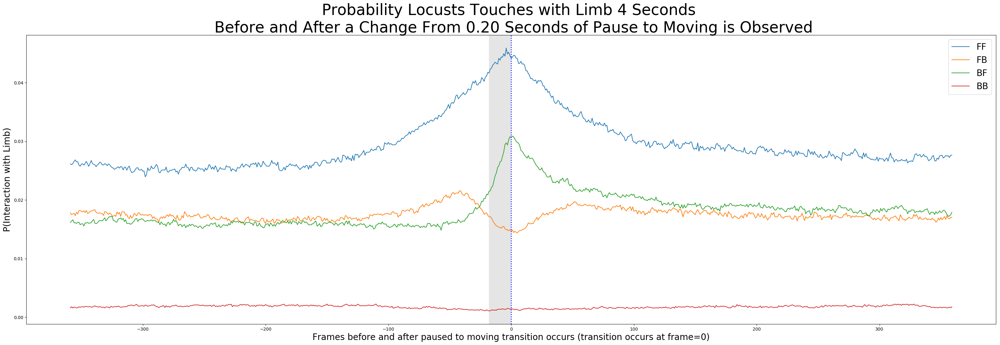





  0%|          | 0/103 [00:00<?, ?it/s]



  1%|          | 1/103 [00:03<05:12,  3.06s/it]



  2%|▏         | 2/103 [00:04<04:24,  2.62s/it]



  3%|▎         | 3/103 [00:07<04:38,  2.78s/it]



  4%|▍         | 4/103 [00:11<05:16,  3.20s/it]



  5%|▍         | 5/103 [00:15<05:23,  3.30s/it]



  6%|▌         | 6/103 [00:19<05:48,  3.59s/it]



  7%|▋         | 7/103 [00:23<05:36,  3.50s/it]



  8%|▊         | 8/103 [00:26<05:26,  3.44s/it]



  9%|▊         | 9/103 [00:29<05:02,  3.22s/it]



 10%|▉         | 10/103 [00:32<05:04,  3.27s/it]



 11%|█         | 11/103 [00:36<05:15,  3.43s/it]



 12%|█▏        | 12/103 [00:39<04:54,  3.23s/it]



 13%|█▎        | 13/103 [00:41<04:41,  3.13s/it]



 14%|█▎        | 14/103 [00:44<04:33,  3.07s/it]



 15%|█▍        | 15/103 [00:48<04:36,  3.14s/it]



 16%|█▌        | 16/103 [00:50<04:24,  3.04s/it]



 17%|█▋        | 17/103 [00:54<04:39,  3.24s/it]



 17%|█▋        | 18/103 [00:58<04:40,  3.29s/it]



 18%|█▊        | 19/103 [0

speed changes:  62177


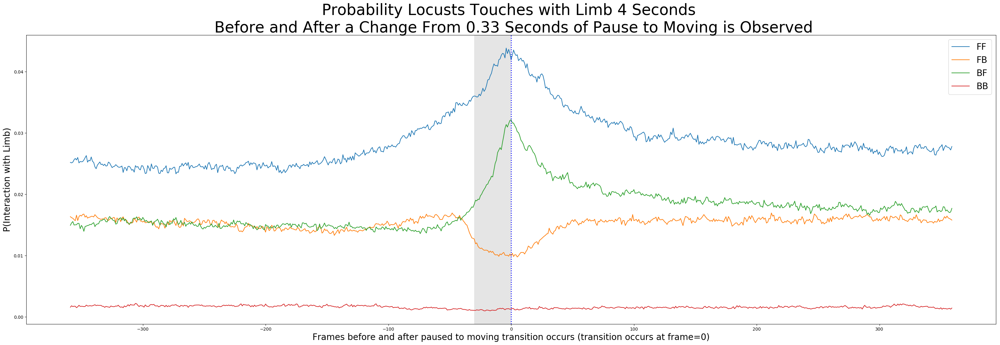





  0%|          | 0/103 [00:00<?, ?it/s]



  1%|          | 1/103 [00:01<02:31,  1.49s/it]



  2%|▏         | 2/103 [00:02<02:19,  1.38s/it]



  3%|▎         | 3/103 [00:04<02:23,  1.44s/it]



  4%|▍         | 4/103 [00:06<02:41,  1.63s/it]



  5%|▍         | 5/103 [00:08<02:42,  1.66s/it]



  6%|▌         | 6/103 [00:09<02:44,  1.70s/it]



  7%|▋         | 7/103 [00:11<02:41,  1.69s/it]



  8%|▊         | 8/103 [00:13<02:41,  1.69s/it]



  9%|▊         | 9/103 [00:14<02:29,  1.60s/it]



 10%|▉         | 10/103 [00:16<02:29,  1.60s/it]



 11%|█         | 11/103 [00:17<02:32,  1.65s/it]



 12%|█▏        | 12/103 [00:19<02:23,  1.58s/it]



 13%|█▎        | 13/103 [00:20<02:18,  1.54s/it]



 14%|█▎        | 14/103 [00:22<02:16,  1.54s/it]



 15%|█▍        | 15/103 [00:23<02:17,  1.56s/it]



 16%|█▌        | 16/103 [00:25<02:12,  1.53s/it]



 17%|█▋        | 17/103 [00:27<02:21,  1.65s/it]



 17%|█▋        | 18/103 [00:28<02:18,  1.62s/it]



 18%|█▊        | 19/103 [0

speed changes:  17007


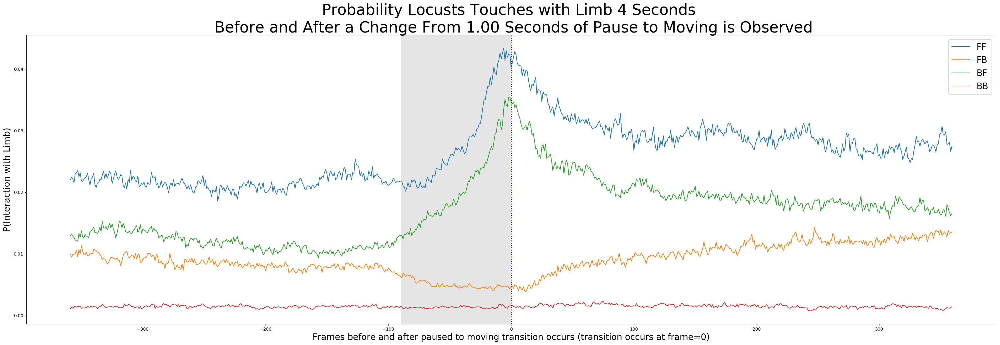





  0%|          | 0/103 [00:00<?, ?it/s]



  1%|          | 1/103 [00:03<05:12,  3.07s/it]



  2%|▏         | 2/103 [00:05<04:54,  2.91s/it]



  3%|▎         | 3/103 [00:09<05:16,  3.16s/it]



  4%|▍         | 4/103 [00:12<05:16,  3.19s/it]



  5%|▍         | 5/103 [00:16<05:38,  3.46s/it]



  6%|▌         | 6/103 [00:21<06:04,  3.76s/it]



  7%|▋         | 7/103 [00:24<05:52,  3.67s/it]



  8%|▊         | 8/103 [00:28<05:41,  3.59s/it]



  9%|▊         | 9/103 [00:31<05:30,  3.52s/it]



 10%|▉         | 10/103 [00:34<05:21,  3.46s/it]



 11%|█         | 11/103 [00:38<05:19,  3.48s/it]



 12%|█▏        | 12/103 [00:41<05:06,  3.37s/it]



 13%|█▎        | 13/103 [00:45<05:15,  3.50s/it]



 14%|█▎        | 14/103 [00:48<04:56,  3.33s/it]



 15%|█▍        | 15/103 [00:51<04:48,  3.28s/it]



 16%|█▌        | 16/103 [00:54<04:36,  3.17s/it]



 17%|█▋        | 17/103 [00:57<04:45,  3.32s/it]



 17%|█▋        | 18/103 [01:01<05:00,  3.54s/it]



 18%|█▊        | 19/103 [0

speed changes:  43097


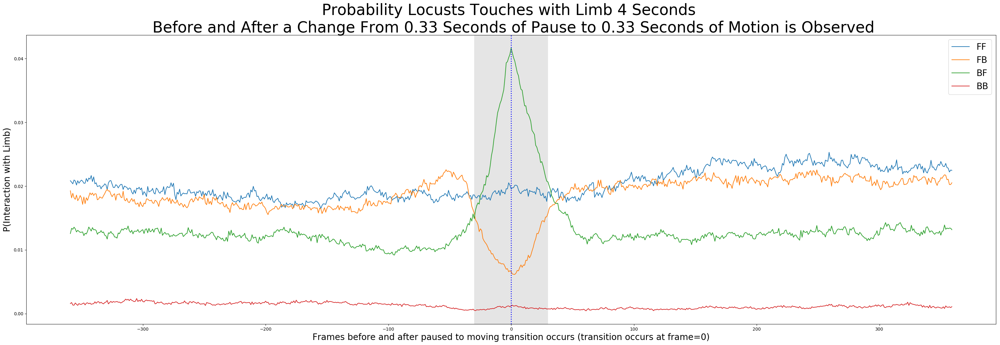





  0%|          | 0/103 [00:00<?, ?it/s]



  1%|          | 1/103 [00:02<03:40,  2.16s/it]



  2%|▏         | 2/103 [00:04<03:34,  2.12s/it]



  3%|▎         | 3/103 [00:06<03:47,  2.27s/it]



  4%|▍         | 4/103 [00:09<03:49,  2.32s/it]



  5%|▍         | 5/103 [00:12<04:01,  2.47s/it]



  6%|▌         | 6/103 [00:14<04:12,  2.60s/it]



  7%|▋         | 7/103 [00:17<04:00,  2.50s/it]



  8%|▊         | 8/103 [00:19<03:53,  2.46s/it]



  9%|▊         | 9/103 [00:22<03:49,  2.44s/it]



 10%|▉         | 10/103 [00:24<03:42,  2.40s/it]



 11%|█         | 11/103 [00:26<03:38,  2.38s/it]



 12%|█▏        | 12/103 [00:28<03:32,  2.34s/it]



 13%|█▎        | 13/103 [00:31<03:35,  2.40s/it]



 14%|█▎        | 14/103 [00:33<03:27,  2.33s/it]



 15%|█▍        | 15/103 [00:35<03:22,  2.31s/it]



 16%|█▌        | 16/103 [00:37<03:16,  2.26s/it]



 17%|█▋        | 17/103 [00:40<03:22,  2.35s/it]



 17%|█▋        | 18/103 [00:43<03:31,  2.49s/it]



 18%|█▊        | 19/103 [0

speed changes:  14941


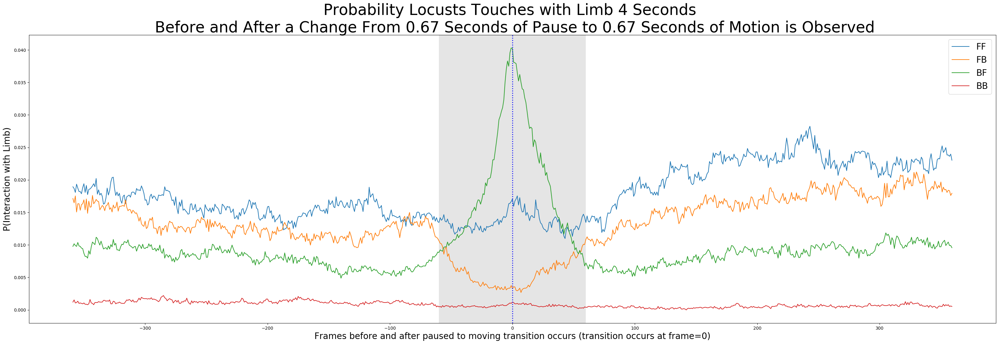





  0%|          | 0/103 [00:00<?, ?it/s]



  1%|          | 1/103 [00:01<03:18,  1.94s/it]



  2%|▏         | 2/103 [00:03<03:15,  1.94s/it]



  3%|▎         | 3/103 [00:06<03:21,  2.02s/it]



  4%|▍         | 4/103 [00:08<03:23,  2.05s/it]



  5%|▍         | 5/103 [00:10<03:29,  2.14s/it]



  6%|▌         | 6/103 [00:12<03:33,  2.20s/it]



  7%|▋         | 7/103 [00:14<03:26,  2.15s/it]



  8%|▊         | 8/103 [00:17<03:22,  2.13s/it]



  9%|▊         | 9/103 [00:19<03:18,  2.11s/it]



 10%|▉         | 10/103 [00:21<03:15,  2.10s/it]



 11%|█         | 11/103 [00:23<03:11,  2.08s/it]



 12%|█▏        | 12/103 [00:25<03:06,  2.05s/it]



 13%|█▎        | 13/103 [00:27<03:05,  2.06s/it]



 14%|█▎        | 14/103 [00:29<03:03,  2.06s/it]



 15%|█▍        | 15/103 [00:31<02:58,  2.03s/it]



 16%|█▌        | 16/103 [00:33<02:55,  2.02s/it]



 17%|█▋        | 17/103 [00:35<02:58,  2.08s/it]



 17%|█▋        | 18/103 [00:37<03:01,  2.14s/it]



 18%|█▊        | 19/103 [0

speed changes:  6724


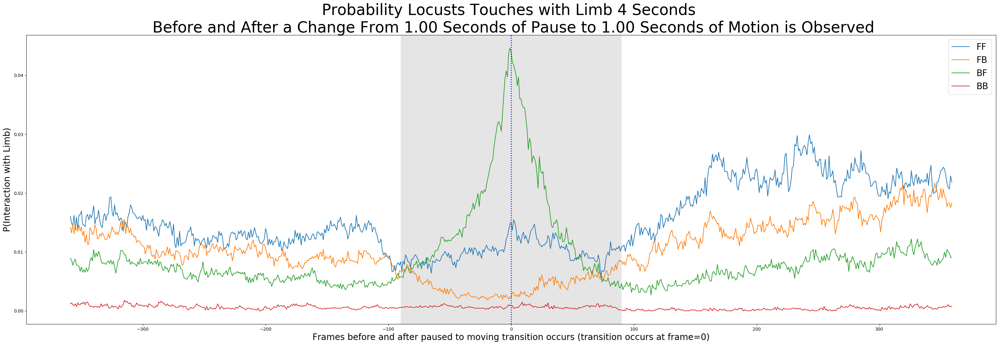

In [107]:
for pause_length in pause_lengths:
    ff, fb, bf, bb, speed_changes = pairwise_history(pairwise_X, y, framesback=framesback, pause_length=pause_length)
    plot_pairwise(ff/speed_changes, fb/speed_changes, bf/speed_changes, bb/speed_changes, framesback, avg_pairwise, pause_length=pause_length, filter_frames=0)
    
for filter_length in filter_lengths:
    ff, fb, bf, bb, speed_changes = pairwise_history(pairwise_X, y, framesback=framesback, pause_length=np.nan, filter_frames=filter_length)
    plot_pairwise(ff/speed_changes, fb/speed_changes, bf/speed_changes, bb/speed_changes, framesback, avg_pairwise, pause_length=pause_length, filter_frames=filter_length)
    

In [15]:
region='AFMB'

In [16]:
with h5py.File('classification_AFMB.h5', 'r') as h5file:
    X_AFMB=h5file.get('class')
    X_AFMB=np.array(X_AFMB)

In [25]:
X_AFMB.shape

(103, 324299, 1)

In [ ]:
## region = 'AFMB'

# get history of interaction where you include the paused length or greater
for pause_length in pause_lengths:
    data_analysis.history(X_AFMB, y, framesback, region, want_PL_or_Greater=True, pause_length=pause_length)

'''# get history of only instances with a paused length of x
for pause_length in pause_lengths:
    data_analysis.history(X_AFMB, y, framesback, region, want_PL_or_Greater=False, pause_length=pause_length)
'''

# filter out the brief changes in motion, Keep data points where locust was paused for X frames, moving for X frames
for filter_length in filter_lengths:
    data_analysis.history(X_AFMB, y, framesback, region, want_PL_or_Greater=False, pause_length=np.nan, filter_frames=filter_length)

# create heatmap of most frequent interactions per limb
data_analysis.heatmap(limb_count_AFMB)

FB: Front, Back

In [86]:
unique, counts = np.unique(X_FB, return_counts=True)
print("unique: ", unique[0:2], " counts: ", counts[0:2])

avg_two=np.array([counts[0]/(totalFrames*103), counts[1]/(totalFrames*103)])

unique:  [0. 1.]  counts:  [4704792 1352689]




  0%|          | 0/323578 [00:00<?, ?it/s]

  1%|▏         | 4617/323578 [00:00<00:07, 44893.34it/s]

0




  3%|▎         | 9839/323578 [00:00<00:06, 46707.39it/s]

  4%|▍         | 13964/323578 [00:00<00:06, 44603.48it/s]

  6%|▌         | 19050/323578 [00:00<00:06, 46164.28it/s]

  7%|▋         | 24165/323578 [00:00<00:06, 47554.57it/s]

  9%|▉         | 29717/323578 [00:00<00:05, 49657.35it/s]

 11%|█         | 34944/323578 [00:00<00:05, 49989.39it/s]

 12%|█▏        | 39847/323578 [00:00<00:05, 49567.00it/s]

 14%|█▍        | 46585/323578 [00:00<00:05, 53822.50it/s]

 16%|█▌        | 52316/323578 [00:01<00:04, 54755.37it/s]

 18%|█▊        | 58450/323578 [00:01<00:04, 56299.54it/s]

 20%|█▉        | 64066/323578 [00:01<00:05, 51401.18it/s]

 22%|██▏       | 70805/323578 [00:01<00:04, 55298.23it/s]

 24%|██▎       | 76604/323578 [00:01<00:04, 55736.63it/s]

 25%|██▌       | 82273/323578 [00:01<00:04, 55873.67it/s]

 27%|██▋       | 87928/323578 [00:01<00:04, 52561.69it/s]

 29%|██▉       | 93272/323578 [00:01<00:04, 48560.97it/s]

 31%|███       | 100588/323578 [00:01<00:04, 53725.00it

1


  7%|▋         | 24161/323578 [00:00<00:02, 120946.24it/s]

 11%|█         | 34550/323578 [00:00<00:02, 115195.01it/s]

 14%|█▍        | 45087/323578 [00:00<00:02, 112060.30it/s]

 19%|█▊        | 60071/323578 [00:00<00:02, 120959.72it/s]

 24%|██▍       | 77328/323578 [00:00<00:01, 132881.71it/s]

 29%|██▉       | 93455/323578 [00:00<00:01, 139951.75it/s]

 33%|███▎      | 106902/323578 [00:00<00:01, 131010.45it/s]

 39%|███▉      | 125973/323578 [00:00<00:01, 144302.65it/s]

 46%|████▋     | 150113/323578 [00:01<00:01, 164104.29it/s]

 53%|█████▎    | 171361/323578 [00:01<00:00, 176133.76it/s]

 61%|██████    | 196733/323578 [00:01<00:00, 193914.44it/s]

 67%|██████▋   | 217381/323578 [00:01<00:00, 145375.39it/s]

 72%|███████▏  | 234588/323578 [00:01<00:00, 147172.19it/s]

 78%|███████▊  | 251179/323578 [00:01<00:00, 147043.24it/s]

 84%|████████▎ | 270385/323578 [00:01<00:00, 158164.54it/s]

 90%|████████▉ | 290070/323578 [00:01<00:00, 168073.25it/s]

 95%|█████████▌| 308270/323578

2


  5%|▌         | 16693/323578 [00:00<00:03, 85728.90it/s]

  7%|▋         | 23933/323578 [00:00<00:03, 81241.20it/s]

 10%|█         | 33247/323578 [00:00<00:03, 84477.71it/s]

 12%|█▏        | 39554/323578 [00:00<00:03, 75911.79it/s]

 15%|█▍        | 48146/323578 [00:00<00:03, 78460.78it/s]

 17%|█▋        | 55080/323578 [00:00<00:03, 71255.21it/s]

 19%|█▉        | 62874/323578 [00:00<00:03, 73136.89it/s]

 22%|██▏       | 70825/323578 [00:00<00:03, 74789.08it/s]

 26%|██▌       | 83118/323578 [00:01<00:02, 84723.90it/s]

 28%|██▊       | 92132/323578 [00:01<00:02, 86062.92it/s]

 31%|███▏      | 101687/323578 [00:01<00:02, 88247.65it/s]

 34%|███▍      | 110673/323578 [00:01<00:02, 88387.01it/s]

 37%|███▋      | 119622/323578 [00:01<00:02, 84330.95it/s]

 40%|███▉      | 128171/323578 [00:01<00:02, 79425.29it/s]

 42%|████▏     | 136254/323578 [00:01<00:02, 76603.51it/s]

 45%|████▍     | 144034/323578 [00:01<00:02, 73675.88it/s]

 47%|████▋     | 152256/323578 [00:01<00:02, 75944

3


  5%|▍         | 15664/323578 [00:00<00:04, 75473.57it/s]

  6%|▌         | 19656/323578 [00:00<00:05, 54451.39it/s]

  8%|▊         | 24966/323578 [00:00<00:05, 53504.64it/s]

  9%|▉         | 29158/323578 [00:00<00:06, 47488.17it/s]

 10%|█         | 33221/323578 [00:00<00:07, 40798.72it/s]

 12%|█▏        | 38413/323578 [00:00<00:06, 43441.02it/s]

 14%|█▎        | 44369/323578 [00:00<00:05, 47228.17it/s]

 15%|█▌        | 49068/323578 [00:00<00:05, 46810.47it/s]

 17%|█▋        | 53733/323578 [00:01<00:05, 45852.21it/s]

 18%|█▊        | 58312/323578 [00:01<00:06, 43664.95it/s]

 19%|█▉        | 62696/323578 [00:01<00:06, 38908.05it/s]

 21%|██        | 66696/323578 [00:01<00:06, 37551.54it/s]

 23%|██▎       | 75335/323578 [00:01<00:05, 45218.01it/s]

 28%|██▊       | 90104/323578 [00:01<00:04, 57013.00it/s]

 31%|███       | 101037/323578 [00:01<00:03, 66426.95it/s]

 35%|███▍      | 111690/323578 [00:01<00:02, 74883.72it/s]

 41%|████      | 131440/323578 [00:01<00:02, 91667.98i

4


  4%|▍         | 13471/323578 [00:00<00:04, 62659.33it/s]

  6%|▋         | 20808/323578 [00:00<00:04, 65528.62it/s]

  9%|▊         | 28095/323578 [00:00<00:04, 67219.27it/s]

 11%|█▏        | 36733/323578 [00:00<00:04, 71662.65it/s]

 13%|█▎        | 43041/323578 [00:00<00:04, 66072.74it/s]

 16%|█▌        | 50798/323578 [00:00<00:03, 68994.56it/s]

 18%|█▊        | 57644/323578 [00:00<00:03, 68397.23it/s]

 20%|█▉        | 64257/323578 [00:00<00:04, 60092.65it/s]

 23%|██▎       | 72829/323578 [00:01<00:03, 65844.74it/s]

 25%|██▍       | 80236/323578 [00:01<00:03, 68090.31it/s]

 28%|██▊       | 90139/323578 [00:01<00:03, 74752.82it/s]

 30%|███       | 97915/323578 [00:01<00:03, 74648.80it/s]

 33%|███▎      | 105590/323578 [00:01<00:03, 72643.20it/s]

 35%|███▌      | 113407/323578 [00:01<00:02, 74053.68it/s]

 38%|███▊      | 121989/323578 [00:01<00:02, 76858.81it/s]

 41%|████      | 131273/323578 [00:01<00:02, 80730.25it/s]

 43%|████▎     | 140368/323578 [00:01<00:02, 83546.2

5


  4%|▍         | 13115/323578 [00:00<00:04, 64594.27it/s]

  6%|▌         | 18456/323578 [00:00<00:05, 60594.57it/s]

  8%|▊         | 24623/323578 [00:00<00:04, 60766.52it/s]

  9%|▉         | 30183/323578 [00:00<00:04, 59034.76it/s]

 11%|█         | 36073/323578 [00:00<00:04, 58643.40it/s]

 13%|█▎        | 42315/323578 [00:00<00:04, 59509.43it/s]

 15%|█▍        | 48197/323578 [00:00<00:04, 59135.77it/s]

 17%|█▋        | 54396/323578 [00:00<00:04, 59557.57it/s]

 19%|█▊        | 60098/323578 [00:01<00:04, 58632.55it/s]

 21%|██        | 66435/323578 [00:01<00:04, 59898.57it/s]

 23%|██▎       | 72882/323578 [00:01<00:04, 60893.19it/s]

 25%|██▍       | 79936/323578 [00:01<00:03, 63003.37it/s]

 27%|██▋       | 86202/323578 [00:01<00:03, 61048.80it/s]

 29%|██▊       | 92296/323578 [00:01<00:03, 60244.16it/s]

 30%|███       | 98601/323578 [00:01<00:03, 60704.09it/s]

 32%|███▏      | 104669/323578 [00:01<00:04, 53761.80it/s]

 34%|███▍      | 110190/323578 [00:01<00:04, 50661.94it

6


  4%|▍         | 12607/323578 [00:00<00:05, 58626.13it/s]

  6%|▋         | 20888/323578 [00:00<00:04, 64155.67it/s]

  9%|▉         | 29227/323578 [00:00<00:04, 68584.23it/s]

 11%|█▏        | 36508/323578 [00:00<00:04, 69390.85it/s]

 13%|█▎        | 42704/323578 [00:00<00:04, 62363.38it/s]

 15%|█▌        | 50098/323578 [00:00<00:04, 65387.49it/s]

 18%|█▊        | 57204/323578 [00:00<00:03, 66671.02it/s]

 20%|█▉        | 63783/323578 [00:00<00:03, 66265.77it/s]

 22%|██▏       | 70903/323578 [00:01<00:03, 67423.74it/s]

 25%|██▍       | 80301/323578 [00:01<00:03, 73428.02it/s]

 27%|██▋       | 87752/323578 [00:01<00:03, 71413.17it/s]

 29%|██▉       | 94981/323578 [00:01<00:03, 70574.97it/s]

 32%|███▏      | 102919/323578 [00:01<00:03, 73003.91it/s]

 35%|███▍      | 112061/323578 [00:01<00:02, 77699.53it/s]

 37%|███▋      | 119960/323578 [00:01<00:02, 68096.78it/s]

 39%|███▉      | 127075/323578 [00:01<00:03, 60472.13it/s]

 41%|████▏     | 133494/323578 [00:02<00:03, 52602.7

7


  4%|▎         | 11460/323578 [00:00<00:05, 56576.64it/s]

  5%|▌         | 16190/323578 [00:00<00:05, 53431.96it/s]

  7%|▋         | 23883/323578 [00:00<00:05, 58821.99it/s]

  9%|▉         | 29304/323578 [00:00<00:05, 57218.24it/s]

 11%|█         | 34222/323578 [00:00<00:05, 53553.48it/s]

 12%|█▏        | 39063/323578 [00:00<00:06, 47304.90it/s]

 15%|█▍        | 47374/323578 [00:00<00:05, 54126.98it/s]

 16%|█▋        | 52974/323578 [00:00<00:05, 47694.16it/s]

 18%|█▊        | 58015/323578 [00:01<00:06, 43772.28it/s]

 20%|██        | 65298/323578 [00:01<00:05, 49511.57it/s]

 23%|██▎       | 72932/323578 [00:01<00:04, 55072.66it/s]

 25%|██▍       | 79971/323578 [00:01<00:04, 58612.71it/s]

 27%|██▋       | 86382/323578 [00:01<00:03, 60124.64it/s]

 29%|██▊       | 93015/323578 [00:01<00:03, 61562.86it/s]

 31%|███       | 99389/323578 [00:01<00:03, 60727.36it/s]

 33%|███▎      | 105617/323578 [00:01<00:03, 59447.33it/s]

 35%|███▍      | 111689/323578 [00:01<00:03, 59661.31it

8


  5%|▌         | 16692/323578 [00:00<00:03, 86187.82it/s]

  6%|▋         | 20896/323578 [00:00<00:04, 64589.26it/s]

  8%|▊         | 24988/323578 [00:00<00:05, 54047.76it/s]

 10%|█         | 32914/323578 [00:00<00:04, 59574.43it/s]

 12%|█▏        | 38350/323578 [00:00<00:04, 57907.66it/s]

 14%|█▍        | 46818/323578 [00:00<00:04, 63678.93it/s]

 17%|█▋        | 54859/323578 [00:00<00:03, 67895.19it/s]

 19%|█▉        | 63047/323578 [00:00<00:03, 71465.42it/s]

 22%|██▏       | 70199/323578 [00:01<00:03, 69742.54it/s]

 25%|██▍       | 80709/323578 [00:01<00:03, 77570.98it/s]

 28%|██▊       | 91506/323578 [00:01<00:02, 84112.51it/s]

 31%|███       | 100279/323578 [00:01<00:02, 81850.59it/s]

 34%|███▍      | 111443/323578 [00:01<00:02, 88972.82it/s]

 38%|███▊      | 123541/323578 [00:01<00:02, 93880.94it/s]

 41%|████▏     | 133535/323578 [00:01<00:01, 95619.92it/s]

 44%|████▍     | 143774/323578 [00:01<00:01, 96892.05it/s]

 48%|████▊     | 155189/323578 [00:01<00:01, 100603

9


  4%|▎         | 11463/323578 [00:00<00:05, 54104.49it/s]

  6%|▌         | 18506/323578 [00:00<00:05, 58147.60it/s]

  8%|▊         | 27008/323578 [00:00<00:04, 63921.91it/s]

 10%|█         | 32421/323578 [00:00<00:05, 56736.30it/s]

 12%|█▏        | 39403/323578 [00:00<00:04, 59965.65it/s]

 14%|█▍        | 45074/323578 [00:00<00:04, 57069.18it/s]

 16%|█▌        | 50582/323578 [00:00<00:04, 56303.59it/s]

 17%|█▋        | 56444/323578 [00:00<00:04, 56978.68it/s]

 19%|█▉        | 62503/323578 [00:01<00:04, 57575.73it/s]

 21%|██        | 68202/323578 [00:01<00:04, 57168.55it/s]

 23%|██▎       | 75300/323578 [00:01<00:04, 60350.04it/s]

 25%|██▌       | 81352/323578 [00:01<00:04, 60031.68it/s]

 27%|██▋       | 88154/323578 [00:01<00:03, 61786.52it/s]

 29%|██▉       | 94354/323578 [00:01<00:03, 59561.64it/s]

 31%|███▏      | 101389/323578 [00:01<00:03, 61981.40it/s]

 33%|███▎      | 107766/323578 [00:01<00:03, 62474.09it/s]

 35%|███▌      | 114048/323578 [00:01<00:03, 56918.96i

10


  3%|▎         | 9289/323578 [00:00<00:06, 47862.87it/s]

  4%|▍         | 12633/323578 [00:00<00:07, 42075.33it/s]

  6%|▌         | 18478/323578 [00:00<00:06, 45744.98it/s]

  8%|▊         | 25196/323578 [00:00<00:05, 50431.29it/s]

 10%|▉         | 31608/323578 [00:00<00:05, 53881.65it/s]

 12%|█▏        | 37527/323578 [00:00<00:05, 55216.59it/s]

 14%|█▎        | 44296/323578 [00:00<00:04, 58447.19it/s]

 16%|█▌        | 51975/323578 [00:00<00:04, 62835.12it/s]

 18%|█▊        | 58271/323578 [00:01<00:04, 56751.86it/s]

 20%|█▉        | 64067/323578 [00:01<00:04, 53974.99it/s]

 22%|██▏       | 70199/323578 [00:01<00:04, 55880.93it/s]

 24%|██▍       | 77658/323578 [00:01<00:04, 60013.35it/s]

 26%|██▌       | 83813/323578 [00:01<00:04, 54600.86it/s]

 28%|██▊       | 89599/323578 [00:01<00:04, 55252.50it/s]

 30%|██▉       | 96155/323578 [00:01<00:03, 57987.38it/s]

 32%|███▏      | 103756/323578 [00:01<00:03, 62046.33it/s]

 34%|███▍      | 110135/323578 [00:01<00:03, 60471.74it/

11


  4%|▍         | 13901/323578 [00:00<00:04, 71021.27it/s]

  7%|▋         | 21764/323578 [00:00<00:04, 72878.84it/s]

  9%|▊         | 28008/323578 [00:00<00:04, 68998.58it/s]

 10%|█         | 33933/323578 [00:00<00:04, 65578.55it/s]

 12%|█▏        | 39535/323578 [00:00<00:04, 62384.69it/s]

 14%|█▍        | 44959/323578 [00:00<00:05, 53886.09it/s]

 16%|█▌        | 51148/323578 [00:00<00:04, 55675.85it/s]

 18%|█▊        | 57917/323578 [00:00<00:04, 58806.62it/s]

 20%|█▉        | 64658/323578 [00:01<00:04, 61147.56it/s]

 24%|██▍       | 77081/323578 [00:01<00:03, 72136.38it/s]

 31%|███       | 100367/323578 [00:01<00:02, 90841.97it/s]

 35%|███▌      | 113300/323578 [00:01<00:02, 99746.85it/s]

 39%|███▉      | 126590/323578 [00:01<00:01, 107423.42it/s]

 43%|████▎     | 139347/323578 [00:01<00:01, 111076.35it/s]

 48%|████▊     | 155443/323578 [00:01<00:01, 121742.82it/s]

 52%|█████▏    | 168935/323578 [00:01<00:01, 101344.56it/s]

 58%|█████▊    | 187177/323578 [00:01<00:01, 1

12


  7%|▋         | 21991/323578 [00:00<00:03, 100473.42it/s]

  9%|▉         | 29749/323578 [00:00<00:03, 91464.06it/s] 

 11%|█▏        | 36960/323578 [00:00<00:03, 84576.01it/s]

 15%|█▍        | 47139/323578 [00:00<00:03, 89095.56it/s]

 17%|█▋        | 54769/323578 [00:00<00:03, 82179.61it/s]

 19%|█▉        | 62953/323578 [00:00<00:03, 81664.81it/s]

 22%|██▏       | 70568/323578 [00:00<00:03, 73512.31it/s]

 24%|██▍       | 77687/323578 [00:00<00:03, 63104.23it/s]

 26%|██▌       | 84364/323578 [00:01<00:03, 63696.47it/s]

 28%|██▊       | 90802/323578 [00:01<00:03, 63122.26it/s]

 30%|███       | 97164/323578 [00:01<00:03, 61443.45it/s]

 33%|███▎      | 105425/323578 [00:01<00:03, 66189.39it/s]

 35%|███▍      | 112180/323578 [00:01<00:03, 64350.11it/s]

 37%|███▋      | 120238/323578 [00:01<00:02, 67999.02it/s]

 39%|███▉      | 127168/323578 [00:01<00:03, 63201.13it/s]

 41%|████▏     | 133647/323578 [00:01<00:03, 61860.54it/s]

 45%|████▍     | 144117/323578 [00:01<00:02, 7051

13


  4%|▎         | 11837/323578 [00:00<00:05, 60622.83it/s]

  5%|▌         | 16910/323578 [00:00<00:05, 56824.19it/s]

  7%|▋         | 21573/323578 [00:00<00:05, 53255.52it/s]

 10%|▉         | 30782/323578 [00:00<00:04, 60865.66it/s]

 13%|█▎        | 41789/323578 [00:00<00:04, 70292.19it/s]

 15%|█▌        | 49370/323578 [00:00<00:03, 71368.93it/s]

 17%|█▋        | 56579/323578 [00:00<00:03, 71069.51it/s]

 20%|█▉        | 63737/323578 [00:00<00:04, 62536.43it/s]

 22%|██▏       | 71202/323578 [00:01<00:03, 65224.19it/s]

 25%|██▍       | 80326/323578 [00:01<00:03, 70982.80it/s]

 27%|██▋       | 87704/323578 [00:01<00:03, 69415.86it/s]

 29%|██▉       | 94849/323578 [00:01<00:03, 64855.15it/s]

 31%|███▏      | 101538/323578 [00:01<00:03, 63161.20it/s]

 34%|███▍      | 110348/323578 [00:01<00:03, 68675.84it/s]

 36%|███▋      | 117463/323578 [00:01<00:03, 61850.27it/s]

 38%|███▊      | 124058/323578 [00:01<00:03, 62885.49it/s]

 40%|████      | 130562/323578 [00:01<00:03, 61329.6

14


  4%|▍         | 14475/323578 [00:00<00:04, 73284.39it/s]

  6%|▋         | 20897/323578 [00:00<00:04, 70306.02it/s]

  9%|▊         | 27830/323578 [00:00<00:04, 69606.20it/s]

 10%|█         | 33175/323578 [00:00<00:04, 63173.35it/s]

 12%|█▏        | 38953/323578 [00:00<00:04, 61439.95it/s]

 14%|█▍        | 45108/323578 [00:00<00:04, 61453.01it/s]

 16%|█▌        | 50683/323578 [00:00<00:05, 54251.06it/s]

 17%|█▋        | 55864/323578 [00:00<00:05, 50279.72it/s]

 19%|█▉        | 60779/323578 [00:01<00:05, 47767.87it/s]

 21%|██        | 68240/323578 [00:01<00:04, 53249.97it/s]

 23%|██▎       | 75257/323578 [00:01<00:04, 57402.20it/s]

 25%|██▌       | 81204/323578 [00:01<00:04, 49755.85it/s]

 27%|██▋       | 87879/323578 [00:01<00:04, 53533.18it/s]

 30%|███       | 97592/323578 [00:01<00:03, 61863.05it/s]

 32%|███▏      | 104470/323578 [00:01<00:03, 59135.03it/s]

 34%|███▍      | 111495/323578 [00:01<00:03, 61966.00it/s]

 36%|███▋      | 118084/323578 [00:01<00:03, 60128.02i

15


  4%|▎         | 12077/323578 [00:00<00:05, 62209.58it/s]

  7%|▋         | 22107/323578 [00:00<00:04, 69900.81it/s]

  9%|▊         | 27582/323578 [00:00<00:04, 64171.07it/s]

 10%|█         | 32705/323578 [00:00<00:05, 55660.16it/s]

 13%|█▎        | 40532/323578 [00:00<00:04, 60815.09it/s]

 14%|█▍        | 46263/323578 [00:00<00:04, 55793.36it/s]

 16%|█▋        | 53254/323578 [00:00<00:04, 59378.39it/s]

 20%|█▉        | 63482/323578 [00:00<00:03, 67849.33it/s]

 22%|██▏       | 72483/323578 [00:01<00:03, 72988.64it/s]

 25%|██▍       | 80163/323578 [00:01<00:03, 68501.95it/s]

 27%|██▋       | 88914/323578 [00:01<00:03, 73271.16it/s]

 30%|██▉       | 96560/323578 [00:01<00:03, 67834.77it/s]

 33%|███▎      | 105263/323578 [00:01<00:03, 72442.17it/s]

 35%|███▍      | 112807/323578 [00:01<00:03, 64042.95it/s]

 37%|███▋      | 119600/323578 [00:01<00:03, 61048.27it/s]

 40%|███▉      | 128757/323578 [00:01<00:02, 67780.86it/s]

 42%|████▏     | 135980/323578 [00:02<00:02, 64474.2

16


  3%|▎         | 11031/323578 [00:00<00:05, 54671.17it/s]

  5%|▍         | 15091/323578 [00:00<00:06, 49521.86it/s]

  7%|▋         | 21350/323578 [00:00<00:05, 52584.34it/s]

  8%|▊         | 27118/323578 [00:00<00:05, 53890.07it/s]

 10%|▉         | 32194/323578 [00:00<00:05, 52910.76it/s]

 12%|█▏        | 37467/323578 [00:00<00:05, 52568.61it/s]

 14%|█▎        | 43801/323578 [00:00<00:05, 55100.86it/s]

 16%|█▌        | 51897/323578 [00:00<00:04, 60737.68it/s]

 18%|█▊        | 58277/323578 [00:01<00:04, 61624.90it/s]

 20%|█▉        | 64443/323578 [00:01<00:04, 60482.66it/s]

 22%|██▏       | 70499/323578 [00:01<00:04, 55189.45it/s]

 24%|██▎       | 76113/323578 [00:01<00:04, 53882.28it/s]

 26%|██▌       | 82789/323578 [00:01<00:04, 56998.85it/s]

 28%|██▊       | 90188/323578 [00:01<00:03, 61215.83it/s]

 30%|███       | 97914/323578 [00:01<00:03, 65282.77it/s]

 32%|███▏      | 104628/323578 [00:01<00:03, 60979.87it/s]

 35%|███▍      | 112074/323578 [00:01<00:03, 64481.45it

17


  5%|▍         | 15605/323578 [00:00<00:04, 73199.67it/s]

  7%|▋         | 22535/323578 [00:00<00:04, 71554.97it/s]

 10%|▉         | 31049/323578 [00:00<00:03, 74962.72it/s]

 12%|█▏        | 37728/323578 [00:00<00:03, 71536.32it/s]

 14%|█▎        | 43833/323578 [00:00<00:04, 66595.57it/s]

 16%|█▌        | 50849/323578 [00:00<00:04, 67625.88it/s]

 18%|█▊        | 58570/323578 [00:00<00:03, 70037.74it/s]

 20%|██        | 65273/323578 [00:00<00:03, 67452.83it/s]

 23%|██▎       | 73045/323578 [00:01<00:03, 70236.05it/s]

 25%|██▍       | 79965/323578 [00:01<00:03, 66960.29it/s]

 27%|██▋       | 87290/323578 [00:01<00:03, 68640.88it/s]

 29%|██▉       | 94802/323578 [00:01<00:03, 70065.11it/s]

 32%|███▏      | 101949/323578 [00:01<00:03, 70136.94it/s]

 34%|███▎      | 108960/323578 [00:01<00:03, 69989.87it/s]

 36%|███▌      | 115957/323578 [00:01<00:03, 67112.33it/s]

 38%|███▊      | 123410/323578 [00:01<00:02, 68887.16it/s]

 40%|████      | 130327/323578 [00:01<00:03, 64411.9

18


 11%|█         | 34354/323578 [00:00<00:01, 175611.64it/s]

 18%|█▊        | 57317/323578 [00:00<00:01, 188945.14it/s]

 24%|██▍       | 78254/323578 [00:00<00:01, 193459.67it/s]

 30%|██▉       | 96440/323578 [00:00<00:01, 189825.67it/s]

 35%|███▍      | 112388/323578 [00:00<00:01, 141510.61it/s]

 39%|███▉      | 126215/323578 [00:00<00:01, 111728.89it/s]

 43%|████▎     | 138142/323578 [00:01<00:01, 95310.61it/s] 

 46%|████▌     | 148620/323578 [00:01<00:01, 95018.57it/s]

 49%|████▉     | 158785/323578 [00:01<00:02, 82368.32it/s]

 52%|█████▏    | 167786/323578 [00:01<00:02, 76516.15it/s]

 54%|█████▍    | 176056/323578 [00:01<00:01, 75604.64it/s]

 57%|█████▋    | 185244/323578 [00:01<00:01, 79847.17it/s]

 60%|█████▉    | 193598/323578 [00:01<00:01, 75347.31it/s]

 62%|██████▏   | 201443/323578 [00:01<00:01, 73684.87it/s]

 65%|██████▍   | 209037/323578 [00:02<00:01, 72753.05it/s]

 67%|██████▋   | 216473/323578 [00:02<00:01, 64929.78it/s]

 69%|██████▉   | 224280/323578 [00:02

19


  3%|▎         | 8296/323578 [00:00<00:07, 42387.60it/s]

  4%|▍         | 12875/323578 [00:00<00:07, 43202.77it/s]

  5%|▌         | 16524/323578 [00:00<00:07, 40718.85it/s]

  6%|▋         | 20480/323578 [00:00<00:07, 40232.78it/s]

  8%|▊         | 24325/323578 [00:00<00:07, 39368.53it/s]

  9%|▉         | 30120/323578 [00:00<00:06, 43289.20it/s]

 11%|█         | 35296/323578 [00:00<00:06, 45354.56it/s]

 12%|█▏        | 39688/323578 [00:00<00:06, 43672.56it/s]

 14%|█▍        | 46047/323578 [00:01<00:05, 48201.70it/s]

 16%|█▌        | 52155/323578 [00:01<00:05, 51392.04it/s]

 18%|█▊        | 57560/323578 [00:01<00:05, 51715.16it/s]

 19%|█▉        | 62814/323578 [00:01<00:05, 49213.63it/s]

 21%|██        | 67819/323578 [00:01<00:06, 41200.55it/s]

 22%|██▏       | 72218/323578 [00:01<00:06, 40333.06it/s]

 24%|██▍       | 78412/323578 [00:01<00:05, 45022.79it/s]

 26%|██▌       | 83725/323578 [00:01<00:05, 47024.70it/s]

 28%|██▊       | 90132/323578 [00:01<00:04, 50940.84it/s]

20


  3%|▎         | 10131/323578 [00:00<00:06, 51977.76it/s]

  5%|▍         | 15978/323578 [00:00<00:05, 53607.04it/s]

  7%|▋         | 21213/323578 [00:00<00:05, 52850.01it/s]

  8%|▊         | 26347/323578 [00:00<00:05, 52380.17it/s]

 10%|█         | 32670/323578 [00:00<00:05, 55213.67it/s]

 12%|█▏        | 39025/323578 [00:00<00:04, 57260.32it/s]

 14%|█▎        | 44344/323578 [00:00<00:05, 55747.70it/s]

 15%|█▌        | 49643/323578 [00:00<00:05, 54312.11it/s]

 17%|█▋        | 55483/323578 [00:01<00:04, 55039.24it/s]

 19%|█▉        | 61366/323578 [00:01<00:04, 56123.79it/s]

 21%|██        | 67099/323578 [00:01<00:04, 56480.23it/s]

 22%|██▏       | 72689/323578 [00:01<00:04, 56248.10it/s]

 24%|██▍       | 78274/323578 [00:01<00:04, 54254.54it/s]

 26%|██▌       | 83810/323578 [00:01<00:04, 54222.86it/s]

 28%|██▊       | 91743/323578 [00:01<00:03, 59909.87it/s]

 30%|███       | 97912/323578 [00:01<00:03, 56526.26it/s]

 33%|███▎      | 106808/323578 [00:01<00:03, 63311.46it/

21


  5%|▍         | 14852/323578 [00:00<00:04, 69898.62it/s]

  6%|▌         | 19948/323578 [00:00<00:04, 62745.00it/s]

  9%|▊         | 27997/323578 [00:00<00:04, 66706.83it/s]

 11%|█         | 35680/323578 [00:00<00:04, 68948.46it/s]

 13%|█▎        | 42913/323578 [00:00<00:04, 69420.75it/s]

 15%|█▌        | 49828/323578 [00:00<00:03, 69033.39it/s]

 18%|█▊        | 57766/323578 [00:00<00:03, 71842.42it/s]

 20%|█▉        | 64653/323578 [00:00<00:03, 67993.36it/s]

 22%|██▏       | 72193/323578 [00:01<00:03, 69670.49it/s]

 26%|██▌       | 82902/323578 [00:01<00:03, 77447.58it/s]

 29%|██▉       | 93907/323578 [00:01<00:02, 84522.54it/s]

 33%|███▎      | 105625/323578 [00:01<00:02, 92233.85it/s]

 37%|███▋      | 120330/323578 [00:01<00:01, 103693.87it/s]

 41%|████      | 131476/323578 [00:01<00:01, 103098.22it/s]

 44%|████▍     | 142331/323578 [00:01<00:01, 97768.22it/s] 

 47%|████▋     | 152547/323578 [00:01<00:01, 96296.93it/s]

 50%|█████     | 162489/323578 [00:01<00:01, 843

22


  3%|▎         | 11179/323578 [00:00<00:05, 56100.92it/s]

  5%|▌         | 16454/323578 [00:00<00:05, 54793.38it/s]

  7%|▋         | 23553/323578 [00:00<00:05, 58706.41it/s]

  9%|▉         | 29844/323578 [00:00<00:04, 59403.70it/s]

 11%|█         | 34909/323578 [00:00<00:05, 56368.03it/s]

 13%|█▎        | 40458/323578 [00:00<00:05, 55656.84it/s]

 15%|█▍        | 47762/323578 [00:00<00:04, 59736.04it/s]

 17%|█▋        | 53510/323578 [00:00<00:04, 57300.03it/s]

 18%|█▊        | 59103/323578 [00:01<00:04, 53872.67it/s]

 20%|█▉        | 64701/323578 [00:01<00:04, 54299.09it/s]

 22%|██▏       | 70094/323578 [00:01<00:04, 52957.73it/s]

 24%|██▍       | 78110/323578 [00:01<00:04, 58553.99it/s]

 26%|██▌       | 84136/323578 [00:01<00:04, 55355.06it/s]

 28%|██▊       | 89827/323578 [00:01<00:04, 54348.25it/s]

 31%|███       | 98841/323578 [00:01<00:03, 61562.91it/s]

 34%|███▎      | 108623/323578 [00:01<00:03, 68864.36it/s]

 36%|███▌      | 116071/323578 [00:01<00:03, 57158.17it

23


  6%|▌         | 19119/323578 [00:00<00:03, 96865.42it/s]

  8%|▊         | 26609/323578 [00:00<00:03, 88955.25it/s]

 11%|█         | 34548/323578 [00:00<00:03, 85502.54it/s]

 13%|█▎        | 42852/323578 [00:00<00:03, 84277.73it/s]

 15%|█▌        | 49705/323578 [00:00<00:03, 78669.08it/s]

 19%|█▊        | 60449/323578 [00:00<00:03, 84930.65it/s]

 22%|██▏       | 70946/323578 [00:00<00:02, 89626.92it/s]

 25%|██▌       | 80905/323578 [00:00<00:02, 91896.41it/s]

 28%|██▊       | 92193/323578 [00:01<00:02, 97323.69it/s]

 32%|███▏      | 101978/323578 [00:01<00:02, 97400.02it/s]

 36%|███▌      | 115765/323578 [00:01<00:01, 106216.38it/s]

 40%|████      | 129776/323578 [00:01<00:01, 114216.30it/s]

 44%|████▎     | 141511/323578 [00:01<00:01, 97768.72it/s] 

 47%|████▋     | 152206/323578 [00:01<00:01, 99764.96it/s]

 50%|█████     | 162636/323578 [00:01<00:01, 91841.98it/s]

 53%|█████▎    | 172262/323578 [00:01<00:01, 85816.71it/s]

 56%|█████▌    | 181233/323578 [00:01<00:01, 8

24


  3%|▎         | 10226/323578 [00:00<00:05, 52338.09it/s]

  5%|▍         | 14760/323578 [00:00<00:06, 50021.58it/s]

  6%|▋         | 20919/323578 [00:00<00:05, 53008.50it/s]

  9%|▉         | 28702/323578 [00:00<00:05, 58616.65it/s]

 10%|█         | 33845/323578 [00:00<00:05, 55823.29it/s]

 13%|█▎        | 40790/323578 [00:00<00:04, 59241.52it/s]

 15%|█▍        | 46993/323578 [00:00<00:04, 59569.29it/s]

 17%|█▋        | 54024/323578 [00:00<00:04, 62309.19it/s]

 19%|█▊        | 60153/323578 [00:01<00:04, 61241.36it/s]

 21%|██        | 68229/323578 [00:01<00:03, 65795.13it/s]

 24%|██▎       | 76520/323578 [00:01<00:03, 69978.65it/s]

 26%|██▌       | 83625/323578 [00:01<00:03, 68073.78it/s]

 28%|██▊       | 91126/323578 [00:01<00:03, 69865.04it/s]

 31%|███       | 98850/323578 [00:01<00:03, 71548.42it/s]

 33%|███▎      | 106066/323578 [00:01<00:03, 71316.45it/s]

 35%|███▌      | 113819/323578 [00:01<00:02, 73072.69it/s]

 37%|███▋      | 121167/323578 [00:01<00:02, 72024.89i

25


  2%|▏         | 7307/323578 [00:00<00:10, 30509.59it/s]

  4%|▍         | 13953/323578 [00:00<00:08, 36419.70it/s]

  6%|▌         | 20101/323578 [00:00<00:07, 41269.28it/s]

  8%|▊         | 24687/323578 [00:00<00:07, 42434.80it/s]

 10%|█         | 33105/323578 [00:00<00:05, 49760.67it/s]

 12%|█▏        | 38588/323578 [00:00<00:05, 49864.33it/s]

 14%|█▍        | 45860/323578 [00:00<00:05, 54846.35it/s]

 17%|█▋        | 53777/323578 [00:00<00:04, 60294.87it/s]

 19%|█▉        | 61790/323578 [00:01<00:04, 64887.02it/s]

 21%|██▏       | 68864/323578 [00:01<00:03, 66538.11it/s]

 24%|██▍       | 77166/323578 [00:01<00:03, 70169.26it/s]

 27%|██▋       | 87953/323578 [00:01<00:03, 78388.00it/s]

 30%|██▉       | 96345/323578 [00:01<00:02, 79969.00it/s]

 32%|███▏      | 104695/323578 [00:01<00:02, 75809.80it/s]

 35%|███▍      | 112568/323578 [00:01<00:02, 74892.74it/s]

 37%|███▋      | 121315/323578 [00:01<00:02, 78191.92it/s]

 40%|███▉      | 129317/323578 [00:01<00:02, 71096.27i

26




  3%|▎         | 10528/323578 [00:00<00:05, 53304.64it/s]

  5%|▌         | 16585/323578 [00:00<00:05, 54984.30it/s]

  7%|▋         | 23261/323578 [00:00<00:05, 57936.03it/s]

  9%|▉         | 28543/323578 [00:00<00:05, 55967.81it/s]

 10%|█         | 33243/323578 [00:00<00:05, 51304.23it/s]

 12%|█▏        | 38760/323578 [00:00<00:05, 52405.80it/s]

 14%|█▍        | 44575/323578 [00:00<00:05, 53760.15it/s]

 16%|█▌        | 51113/323578 [00:00<00:04, 56787.86it/s]

 18%|█▊        | 56847/323578 [00:01<00:04, 56952.12it/s]

 19%|█▉        | 62449/323578 [00:01<00:04, 52945.81it/s]

 21%|██        | 67735/323578 [00:01<00:05, 44930.38it/s]

 23%|██▎       | 73246/323578 [00:01<00:05, 47463.22it/s]

 25%|██▌       | 82292/323578 [00:01<00:04, 55089.13it/s]

 28%|██▊       | 90743/323578 [00:01<00:03, 61157.37it/s]

 31%|███       | 99232/323578 [00:01<00:03, 66392.56it/s]

 33%|███▎      | 108005/323578 [00:01<00:03, 71457.82it/s]

 36%|███▌      | 115655/323578 [00:01<00:03, 68920.07

27


  6%|▌         | 18121/323578 [00:00<00:03, 91876.78it/s]

  8%|▊         | 25934/323578 [00:00<00:03, 87233.23it/s]

 10%|█         | 33749/323578 [00:00<00:03, 84293.47it/s]

 12%|█▏        | 39906/323578 [00:00<00:03, 73705.50it/s]

 15%|█▍        | 48206/323578 [00:00<00:03, 75722.84it/s]

 17%|█▋        | 54847/323578 [00:00<00:03, 67575.97it/s]

 19%|█▉        | 61116/323578 [00:00<00:04, 60509.59it/s]

 21%|██        | 68044/323578 [00:00<00:04, 62738.74it/s]

 23%|██▎       | 75913/323578 [00:01<00:03, 66331.68it/s]

 26%|██▌       | 82517/323578 [00:01<00:03, 62225.09it/s]

 27%|██▋       | 88771/323578 [00:01<00:03, 61983.28it/s]

 29%|██▉       | 94992/323578 [00:01<00:03, 61604.12it/s]

 31%|███▏      | 101169/323578 [00:01<00:03, 56839.40it/s]

 33%|███▎      | 107021/323578 [00:01<00:03, 57059.80it/s]

 35%|███▍      | 112786/323578 [00:01<00:03, 55656.02it/s]

 37%|███▋      | 118624/323578 [00:01<00:03, 56331.08it/s]

 41%|████▏     | 134042/323578 [00:01<00:02, 69578.1

28


  4%|▍         | 13921/323578 [00:00<00:04, 67900.52it/s]

  7%|▋         | 23095/323578 [00:00<00:04, 73302.91it/s]

  9%|▉         | 28370/323578 [00:00<00:04, 65353.26it/s]

 10%|█         | 33549/323578 [00:00<00:04, 59371.14it/s]

 12%|█▏        | 38952/323578 [00:00<00:04, 57310.06it/s]

 14%|█▍        | 45429/323578 [00:00<00:04, 59076.42it/s]

 17%|█▋        | 53540/323578 [00:00<00:04, 64184.58it/s]

 18%|█▊        | 59816/323578 [00:00<00:04, 60803.10it/s]

 20%|██        | 66133/323578 [00:01<00:04, 61011.17it/s]

 23%|██▎       | 72826/323578 [00:01<00:04, 62566.73it/s]

 25%|██▌       | 81232/323578 [00:01<00:03, 67764.49it/s]

 28%|██▊       | 90110/323578 [00:01<00:03, 72727.46it/s]

 30%|███       | 97563/323578 [00:01<00:03, 64355.01it/s]

 33%|███▎      | 105696/323578 [00:01<00:03, 68201.21it/s]

 35%|███▍      | 112791/323578 [00:01<00:03, 68600.91it/s]

 39%|███▉      | 125737/323578 [00:01<00:02, 79416.63it/s]

 42%|████▏     | 134871/323578 [00:01<00:02, 82508.34

29


  4%|▎         | 11491/323578 [00:00<00:05, 55849.91it/s]

  6%|▌         | 18949/323578 [00:00<00:05, 60400.47it/s]

  7%|▋         | 24195/323578 [00:00<00:05, 57727.44it/s]

 10%|▉         | 31828/323578 [00:00<00:04, 62020.51it/s]

 12%|█▏        | 37561/323578 [00:00<00:04, 60512.73it/s]

 13%|█▎        | 43088/323578 [00:00<00:04, 58368.48it/s]

 16%|█▌        | 50930/323578 [00:00<00:04, 63006.49it/s]

 18%|█▊        | 57091/323578 [00:00<00:04, 59075.23it/s]

 20%|██        | 65686/323578 [00:01<00:03, 65158.42it/s]

 22%|██▏       | 72737/323578 [00:01<00:03, 66307.43it/s]

 25%|██▍       | 79484/323578 [00:01<00:03, 62294.59it/s]

 27%|██▋       | 87302/323578 [00:01<00:03, 66176.62it/s]

 30%|██▉       | 96513/323578 [00:01<00:03, 72281.60it/s]

 32%|███▏      | 104019/323578 [00:01<00:03, 69089.19it/s]

 34%|███▍      | 111153/323578 [00:01<00:03, 66516.43it/s]

 37%|███▋      | 119458/323578 [00:01<00:02, 70512.64it/s]

 39%|███▉      | 127155/323578 [00:01<00:02, 71990.66

30


  7%|▋         | 22903/323578 [00:00<00:02, 117196.53it/s]

  9%|▉         | 28440/323578 [00:00<00:03, 87433.42it/s] 

 11%|█▏        | 36826/323578 [00:00<00:03, 86329.46it/s]

 13%|█▎        | 43208/323578 [00:00<00:03, 78058.65it/s]

 15%|█▌        | 49589/323578 [00:00<00:03, 71825.33it/s]

 18%|█▊        | 58539/323578 [00:00<00:03, 76196.85it/s]

 21%|██        | 66851/323578 [00:00<00:03, 78148.30it/s]

 24%|██▍       | 77812/323578 [00:00<00:02, 84919.93it/s]

 27%|██▋       | 86212/323578 [00:01<00:02, 83777.58it/s]

 30%|███       | 98151/323578 [00:01<00:02, 92010.61it/s]

 34%|███▍      | 109447/323578 [00:01<00:02, 97431.12it/s]

 37%|███▋      | 119418/323578 [00:01<00:02, 86587.15it/s]

 40%|███▉      | 128460/323578 [00:01<00:02, 68815.80it/s]

 42%|████▏     | 136186/323578 [00:01<00:02, 70076.91it/s]

 44%|████▍     | 143790/323578 [00:01<00:02, 69455.15it/s]

 47%|████▋     | 152340/323578 [00:01<00:02, 73195.57it/s]

 49%|████▉     | 160007/323578 [00:02<00:02, 613

31


  4%|▍         | 13423/323578 [00:00<00:04, 67368.16it/s]

  6%|▋         | 20229/323578 [00:00<00:04, 67333.44it/s]

  9%|▉         | 29273/323578 [00:00<00:04, 72922.32it/s]

 11%|█▏        | 36665/323578 [00:00<00:03, 73008.39it/s]

 13%|█▎        | 42914/323578 [00:00<00:04, 65910.07it/s]

 16%|█▌        | 51659/323578 [00:00<00:03, 71081.54it/s]

 18%|█▊        | 58460/323578 [00:00<00:04, 64143.51it/s]

 21%|██        | 68531/323578 [00:00<00:03, 71463.31it/s]

 23%|██▎       | 75883/323578 [00:01<00:03, 66001.24it/s]

 26%|██▌       | 82710/323578 [00:01<00:04, 57202.94it/s]

 27%|██▋       | 88798/323578 [00:01<00:04, 53312.38it/s]

 29%|██▉       | 94440/323578 [00:01<00:04, 47199.26it/s]

 31%|███       | 99507/323578 [00:01<00:05, 43084.55it/s]

 32%|███▏      | 104128/323578 [00:01<00:05, 40658.47it/s]

 34%|███▍      | 109947/323578 [00:01<00:04, 44507.76it/s]

 35%|███▌      | 114680/323578 [00:02<00:04, 43512.36it/s]

 37%|███▋      | 121251/323578 [00:02<00:04, 48400.43

32


  6%|▌         | 19926/323578 [00:00<00:03, 91198.50it/s]

 13%|█▎        | 41538/323578 [00:00<00:02, 110330.24it/s]

 19%|█▉        | 62266/323578 [00:00<00:02, 128329.40it/s]

 27%|██▋       | 86570/323578 [00:00<00:01, 149497.08it/s]

 33%|███▎      | 107843/323578 [00:00<00:01, 164125.77it/s]

 40%|████      | 129654/323578 [00:00<00:01, 177289.67it/s]

 47%|████▋     | 153424/323578 [00:00<00:00, 191920.58it/s]

 56%|█████▌    | 180222/323578 [00:00<00:00, 209782.31it/s]

 64%|██████▍   | 207386/323578 [00:01<00:00, 225163.33it/s]

 72%|███████▏  | 234196/323578 [00:01<00:00, 236314.68it/s]

 80%|████████  | 258896/323578 [00:01<00:00, 239249.98it/s]

 88%|████████▊ | 283578/323578 [00:01<00:00, 238704.24it/s]

 96%|█████████▌| 309230/323578 [00:01<00:00, 243782.67it/s]

100%|██████████| 323578/323578 [00:01<00:00, 221989.20it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6897/323578 [00:00<00:04, 67236.06it/s]



33


  5%|▍         | 15720/323578 [00:00<00:04, 72166.86it/s]

  7%|▋         | 23009/323578 [00:00<00:04, 72289.69it/s]

  9%|▊         | 28102/323578 [00:00<00:04, 63707.69it/s]

 10%|█         | 33215/323578 [00:00<00:04, 59205.29it/s]

 12%|█▏        | 38247/323578 [00:00<00:05, 55937.04it/s]

 14%|█▎        | 44375/323578 [00:00<00:04, 57132.75it/s]

 15%|█▌        | 49882/323578 [00:00<00:04, 56379.08it/s]

 17%|█▋        | 55236/323578 [00:00<00:05, 53253.84it/s]

 19%|█▉        | 63035/323578 [00:01<00:04, 58853.52it/s]

 25%|██▍       | 80592/323578 [00:01<00:03, 73514.82it/s]

 28%|██▊       | 90027/323578 [00:01<00:03, 65504.93it/s]

 32%|███▏      | 103016/323578 [00:01<00:02, 76947.37it/s]

 35%|███▍      | 112633/323578 [00:01<00:02, 80194.57it/s]

 38%|███▊      | 122311/323578 [00:01<00:02, 84125.23it/s]

 43%|████▎     | 137860/323578 [00:01<00:01, 97086.85it/s]

 49%|████▉     | 158960/323578 [00:01<00:01, 115786.60it/s]

 56%|█████▋    | 182042/323578 [00:01<00:01, 13556

34


  4%|▍         | 14437/323578 [00:00<00:04, 70316.76it/s]

  6%|▋         | 20822/323578 [00:00<00:04, 68227.31it/s]

  9%|▉         | 28345/323578 [00:00<00:04, 69886.60it/s]

 11%|█         | 34254/323578 [00:00<00:04, 65716.49it/s]

 13%|█▎        | 40735/323578 [00:00<00:04, 65132.43it/s]

 15%|█▍        | 48013/323578 [00:00<00:04, 67252.07it/s]

 18%|█▊        | 57723/323578 [00:00<00:03, 73928.24it/s]

 20%|██        | 64957/323578 [00:00<00:04, 64497.39it/s]

 22%|██▏       | 71512/323578 [00:01<00:04, 61205.73it/s]

 24%|██▍       | 78690/323578 [00:01<00:03, 63615.44it/s]

 26%|██▋       | 85152/323578 [00:01<00:03, 61564.25it/s]

 29%|██▉       | 93485/323578 [00:01<00:03, 66797.60it/s]

 31%|███       | 100354/323578 [00:01<00:03, 61195.39it/s]

 33%|███▎      | 107036/323578 [00:01<00:03, 62357.29it/s]

 35%|███▌      | 113434/323578 [00:01<00:03, 60132.35it/s]

 38%|███▊      | 121407/323578 [00:01<00:03, 64687.77it/s]

 40%|████      | 130789/323578 [00:01<00:02, 70938.6

35


  3%|▎         | 9107/323578 [00:00<00:06, 46878.98it/s]

  4%|▍         | 14253/323578 [00:00<00:06, 47787.71it/s]

  6%|▌         | 19757/323578 [00:00<00:06, 49483.10it/s]

  8%|▊         | 25412/323578 [00:00<00:05, 50618.96it/s]

  9%|▉         | 29657/323578 [00:00<00:06, 44721.00it/s]

 11%|█         | 35299/323578 [00:00<00:06, 47652.66it/s]

 12%|█▏        | 39806/323578 [00:00<00:06, 41532.29it/s]

 14%|█▍        | 46682/323578 [00:00<00:05, 46833.86it/s]

 16%|█▌        | 52198/323578 [00:01<00:05, 48871.21it/s]

 18%|█▊        | 57591/323578 [00:01<00:05, 50101.07it/s]

 19%|█▉        | 62722/323578 [00:01<00:05, 48727.40it/s]

 21%|██        | 67688/323578 [00:01<00:05, 44539.72it/s]

 23%|██▎       | 73128/323578 [00:01<00:05, 46812.09it/s]

 25%|██▍       | 79558/323578 [00:01<00:04, 50588.67it/s]

 26%|██▋       | 85747/323578 [00:01<00:04, 53156.59it/s]

 28%|██▊       | 91220/323578 [00:01<00:04, 48863.27it/s]

 30%|██▉       | 96359/323578 [00:01<00:04, 49594.76it/s]

36


  7%|▋         | 22829/323578 [00:00<00:02, 117908.99it/s]

 11%|█         | 36008/323578 [00:00<00:02, 121121.51it/s]

 16%|█▌        | 51830/323578 [00:00<00:02, 130285.31it/s]

 20%|██        | 64798/323578 [00:00<00:01, 129680.59it/s]

 24%|██▍       | 78025/323578 [00:00<00:01, 129985.08it/s]

 31%|███       | 100583/323578 [00:00<00:01, 148916.65it/s]

 39%|███▊      | 125322/323578 [00:00<00:01, 169078.70it/s]

 46%|████▌     | 148830/323578 [00:00<00:00, 184253.13it/s]

 52%|█████▏    | 169663/323578 [00:01<00:00, 190870.41it/s]

 60%|██████    | 195383/323578 [00:01<00:00, 206875.06it/s]

 67%|██████▋   | 217018/323578 [00:01<00:00, 208721.61it/s]

 75%|███████▌  | 242830/323578 [00:01<00:00, 221433.88it/s]

 83%|████████▎ | 267481/323578 [00:01<00:00, 228402.57it/s]

 90%|████████▉ | 290851/323578 [00:01<00:00, 219759.30it/s]

 97%|█████████▋| 313268/323578 [00:01<00:00, 208671.22it/s]

100%|██████████| 323578/323578 [00:01<00:00, 187951.20it/s]

  0%|          | 0/323578 [00

37


  4%|▍         | 14263/323578 [00:00<00:04, 74299.51it/s]

  6%|▌         | 19489/323578 [00:00<00:04, 65206.82it/s]

  8%|▊         | 27379/323578 [00:00<00:04, 68276.68it/s]

 11%|█         | 34946/323578 [00:00<00:04, 70187.97it/s]

 15%|█▍        | 47487/323578 [00:00<00:03, 80870.94it/s]

 18%|█▊        | 57359/323578 [00:00<00:03, 85459.59it/s]

 21%|██        | 67903/323578 [00:00<00:02, 90610.38it/s]

 26%|██▋       | 85245/323578 [00:00<00:02, 105760.33it/s]

 33%|███▎      | 105474/323578 [00:01<00:01, 123198.93it/s]

 39%|███▊      | 124618/323578 [00:01<00:01, 137950.84it/s]

 46%|████▌     | 149175/323578 [00:01<00:01, 158551.71it/s]

 54%|█████▍    | 174357/323578 [00:01<00:00, 177518.23it/s]

 63%|██████▎   | 205128/323578 [00:01<00:00, 203325.46it/s]

 71%|███████   | 228710/323578 [00:01<00:00, 212091.95it/s]

 79%|███████▉  | 256644/323578 [00:01<00:00, 228600.29it/s]

 89%|████████▊ | 286737/323578 [00:01<00:00, 246362.75it/s]

 98%|█████████▊| 316864/323578 [00:01<0

38


  6%|▌         | 19214/323578 [00:00<00:03, 97002.05it/s]

  9%|▉         | 28380/323578 [00:00<00:03, 94917.04it/s]

 11%|█         | 34483/323578 [00:00<00:03, 78783.09it/s]

 13%|█▎        | 43605/323578 [00:00<00:03, 82142.70it/s]

 16%|█▌        | 50517/323578 [00:00<00:04, 62823.89it/s]

 17%|█▋        | 56572/323578 [00:00<00:04, 59202.38it/s]

 19%|█▉        | 62947/323578 [00:00<00:04, 60202.20it/s]

 22%|██▏       | 70611/323578 [00:01<00:03, 64013.61it/s]

 24%|██▍       | 77539/323578 [00:01<00:03, 65506.89it/s]

 26%|██▋       | 85062/323578 [00:01<00:03, 67651.91it/s]

 29%|██▊       | 92986/323578 [00:01<00:03, 70755.57it/s]

 31%|███▏      | 101281/323578 [00:01<00:03, 73700.49it/s]

 34%|███▎      | 108833/323578 [00:01<00:02, 74236.99it/s]

 36%|███▌      | 116851/323578 [00:01<00:02, 75407.37it/s]

 38%|███▊      | 124433/323578 [00:01<00:02, 73266.75it/s]

 41%|████      | 131802/323578 [00:01<00:02, 67623.61it/s]

 43%|████▎     | 138680/323578 [00:01<00:03, 61084.

39


  3%|▎         | 10945/323578 [00:00<00:05, 55569.61it/s]

  6%|▋         | 20627/323578 [00:00<00:04, 63424.01it/s]

  9%|▉         | 28369/323578 [00:00<00:04, 66884.94it/s]

 10%|█         | 33929/323578 [00:00<00:04, 61573.93it/s]

 12%|█▏        | 39495/323578 [00:00<00:04, 59561.36it/s]

 15%|█▍        | 48412/323578 [00:00<00:04, 65784.33it/s]

 17%|█▋        | 54925/323578 [00:00<00:04, 65359.85it/s]

 19%|█▉        | 61367/323578 [00:00<00:04, 63713.61it/s]

 21%|██        | 67682/323578 [00:01<00:04, 58522.37it/s]

 23%|██▎       | 73578/323578 [00:01<00:04, 51410.64it/s]

 25%|██▌       | 81368/323578 [00:01<00:04, 56979.51it/s]

 27%|██▋       | 87701/323578 [00:01<00:04, 58587.38it/s]

 29%|██▉       | 93812/323578 [00:01<00:03, 58803.64it/s]

 31%|███       | 99857/323578 [00:01<00:04, 51179.18it/s]

 33%|███▎      | 105268/323578 [00:01<00:04, 51645.77it/s]

 34%|███▍      | 110639/323578 [00:01<00:04, 50252.53it/s]

 36%|███▋      | 117450/323578 [00:01<00:03, 54478.51i

40




  7%|▋         | 21864/323578 [00:00<00:04, 70198.89it/s]

  9%|▉         | 28837/323578 [00:00<00:04, 70048.62it/s]

 12%|█▏        | 37241/323578 [00:00<00:03, 73726.41it/s]

 13%|█▎        | 43555/323578 [00:00<00:04, 68281.56it/s]

 15%|█▌        | 49722/323578 [00:00<00:04, 59623.79it/s]

 17%|█▋        | 55419/323578 [00:00<00:04, 58011.10it/s]

 19%|█▉        | 61044/323578 [00:00<00:04, 57058.71it/s]

 21%|██        | 66631/323578 [00:01<00:04, 55491.20it/s]

 23%|██▎       | 72841/323578 [00:01<00:04, 57087.57it/s]

 24%|██▍       | 78516/323578 [00:01<00:04, 56924.49it/s]

 26%|██▌       | 84417/323578 [00:01<00:04, 57336.67it/s]

 28%|██▊       | 90132/323578 [00:01<00:04, 55828.95it/s]

 30%|██▉       | 95711/323578 [00:01<00:04, 51523.25it/s]

 31%|███▏      | 101361/323578 [00:01<00:04, 52920.07it/s]

 33%|███▎      | 107170/323578 [00:01<00:03, 54371.09it/s]

 35%|███▍      | 112655/323578 [00:01<00:04, 48211.93it/s]

 36%|███▋      | 117638/323578 [00:02<00:04, 44665.

41


  3%|▎         | 11091/323578 [00:00<00:05, 57523.53it/s]

  5%|▌         | 16538/323578 [00:00<00:05, 56571.80it/s]

  7%|▋         | 22193/323578 [00:00<00:05, 56215.05it/s]

  9%|▊         | 28057/323578 [00:00<00:05, 56920.79it/s]

 10%|█         | 32711/323578 [00:00<00:05, 52428.10it/s]

 12%|█▏        | 38062/323578 [00:00<00:05, 52747.88it/s]

 13%|█▎        | 42878/323578 [00:00<00:05, 51133.76it/s]

 15%|█▍        | 48468/323578 [00:00<00:05, 52310.18it/s]

 17%|█▋        | 53557/323578 [00:01<00:05, 51487.94it/s]

 18%|█▊        | 58562/323578 [00:01<00:05, 47043.20it/s]

 20%|█▉        | 64368/323578 [00:01<00:05, 49789.85it/s]

 22%|██▏       | 70440/323578 [00:01<00:04, 52320.06it/s]

 24%|██▎       | 76404/323578 [00:01<00:04, 54085.93it/s]

 26%|██▌       | 82660/323578 [00:01<00:04, 56110.83it/s]

 28%|██▊       | 90908/323578 [00:01<00:03, 61873.20it/s]

 30%|███       | 97316/323578 [00:01<00:03, 58243.93it/s]

 33%|███▎      | 105674/323578 [00:01<00:03, 63969.97it/

42


  4%|▍         | 14113/323578 [00:00<00:04, 73317.20it/s]

  6%|▋         | 20404/323578 [00:00<00:04, 69454.57it/s]

  9%|▊         | 27869/323578 [00:00<00:04, 70745.40it/s]

 11%|█▏        | 36518/323578 [00:00<00:03, 74790.99it/s]

 13%|█▎        | 42752/323578 [00:00<00:04, 69306.47it/s]

 15%|█▌        | 48892/323578 [00:00<00:04, 64391.60it/s]

 17%|█▋        | 56602/323578 [00:00<00:03, 67727.70it/s]

 19%|█▉        | 63082/323578 [00:00<00:04, 58498.02it/s]

 23%|██▎       | 74393/323578 [00:01<00:03, 68268.95it/s]

 26%|██▌       | 83522/323578 [00:01<00:03, 73401.86it/s]

 28%|██▊       | 91956/323578 [00:01<00:03, 76015.52it/s]

 31%|███       | 99970/323578 [00:01<00:02, 74955.44it/s]

 33%|███▎      | 107758/323578 [00:01<00:02, 72759.14it/s]

 36%|███▌      | 115253/323578 [00:01<00:03, 63614.77it/s]

 38%|███▊      | 123090/323578 [00:01<00:02, 67390.15it/s]

 40%|████      | 130413/323578 [00:01<00:02, 69041.56it/s]

 43%|████▎     | 137547/323578 [00:01<00:02, 64247.1

43


  7%|▋         | 22140/323578 [00:00<00:02, 114459.52it/s]

 12%|█▏        | 40212/323578 [00:00<00:02, 128605.05it/s]

 17%|█▋        | 55090/323578 [00:00<00:02, 134057.83it/s]

 23%|██▎       | 73237/323578 [00:00<00:01, 144464.57it/s]

 28%|██▊       | 89073/323578 [00:00<00:01, 148368.88it/s]

 35%|███▍      | 112496/323578 [00:00<00:01, 166700.31it/s]

 41%|████      | 132263/323578 [00:00<00:01, 174921.06it/s]

 46%|████▋     | 150132/323578 [00:00<00:00, 176033.88it/s]

 52%|█████▏    | 167822/323578 [00:01<00:00, 174414.60it/s]

 57%|█████▋    | 185328/323578 [00:01<00:00, 170135.31it/s]

 63%|██████▎   | 202410/323578 [00:01<00:00, 158317.44it/s]

 68%|██████▊   | 218864/323578 [00:01<00:00, 160133.48it/s]

 74%|███████▎  | 237996/323578 [00:01<00:00, 167491.25it/s]

 80%|████████  | 258995/323578 [00:01<00:00, 178317.39it/s]

 86%|████████▌ | 277157/323578 [00:01<00:00, 171908.78it/s]

 91%|█████████▏| 295590/323578 [00:01<00:00, 175123.62it/s]

 97%|█████████▋| 313314/32357

44


  5%|▌         | 17089/323578 [00:00<00:03, 86350.75it/s]

  7%|▋         | 23276/323578 [00:00<00:03, 77187.67it/s]

 11%|█         | 35601/323578 [00:00<00:03, 86495.79it/s]

 14%|█▍        | 46714/323578 [00:00<00:02, 92657.04it/s]

 20%|█▉        | 63917/323578 [00:00<00:02, 107401.72it/s]

 23%|██▎       | 74805/323578 [00:00<00:02, 97695.89it/s] 

 29%|██▉       | 93889/323578 [00:00<00:02, 114454.47it/s]

 33%|███▎      | 106644/323578 [00:01<00:02, 96547.82it/s]

 38%|███▊      | 121375/323578 [00:01<00:01, 107678.78it/s]

 41%|████▏     | 133530/323578 [00:01<00:02, 91946.82it/s] 

 45%|████▍     | 145475/323578 [00:01<00:01, 98768.88it/s]

 49%|████▊     | 157444/323578 [00:01<00:01, 104234.28it/s]

 52%|█████▏    | 168720/323578 [00:01<00:02, 72619.43it/s] 

 55%|█████▍    | 177889/323578 [00:01<00:02, 69912.91it/s]

 58%|█████▊    | 186237/323578 [00:02<00:02, 59114.84it/s]

 61%|██████    | 197957/323578 [00:02<00:01, 69438.90it/s]

 65%|██████▍   | 209567/323578 [00:02<00

45




 13%|█▎        | 40907/323578 [00:00<00:02, 138699.24it/s]

 18%|█▊        | 57172/323578 [00:00<00:01, 145109.18it/s]

 22%|██▏       | 71623/323578 [00:00<00:01, 144882.90it/s]

 28%|██▊       | 91492/323578 [00:00<00:01, 157693.58it/s]

 33%|███▎      | 105776/323578 [00:00<00:01, 112531.41it/s]

 36%|███▋      | 117798/323578 [00:01<00:02, 89777.52it/s] 

 40%|███▉      | 128044/323578 [00:01<00:02, 71831.99it/s]

 42%|████▏     | 136686/323578 [00:01<00:02, 72063.10it/s]

 45%|████▍     | 144914/323578 [00:01<00:02, 65370.15it/s]

 49%|████▉     | 158236/323578 [00:01<00:02, 77126.48it/s]

 57%|█████▋    | 184388/323578 [00:01<00:01, 97558.90it/s]

 64%|██████▎   | 205867/323578 [00:01<00:01, 116660.50it/s]

 71%|███████▏  | 230627/323578 [00:01<00:00, 138243.17it/s]

 79%|███████▊  | 254678/323578 [00:01<00:00, 158455.60it/s]

 88%|████████▊ | 284207/323578 [00:02<00:00, 184039.37it/s]

 96%|█████████▌| 311370/323578 [00:02<00:00, 203088.36it/s]

100%|██████████| 323578/323578 

46


  5%|▍         | 14690/323578 [00:00<00:04, 63714.94it/s]

  8%|▊         | 27331/323578 [00:00<00:03, 74638.37it/s]

 11%|█         | 34568/323578 [00:00<00:03, 73295.55it/s]

 14%|█▍        | 44593/323578 [00:00<00:03, 79725.80it/s]

 17%|█▋        | 53989/323578 [00:00<00:03, 83521.26it/s]

 20%|█▉        | 64386/323578 [00:00<00:02, 88758.25it/s]

 23%|██▎       | 73223/323578 [00:00<00:02, 86017.93it/s]

 26%|██▋       | 85101/323578 [00:00<00:02, 93777.61it/s]

 29%|██▉       | 94680/323578 [00:01<00:02, 93683.28it/s]

 33%|███▎      | 105665/323578 [00:01<00:02, 98010.22it/s]

 37%|███▋      | 120961/323578 [00:01<00:01, 109642.00it/s]

 41%|████      | 132476/323578 [00:01<00:01, 105802.78it/s]

 44%|████▍     | 143886/323578 [00:01<00:01, 108005.21it/s]

 48%|████▊     | 154988/323578 [00:01<00:01, 99422.25it/s] 

 51%|█████     | 165276/323578 [00:01<00:02, 67540.73it/s]

 56%|█████▌    | 180029/323578 [00:01<00:01, 80383.65it/s]

 61%|██████    | 197953/323578 [00:02<00:01, 

47




 19%|█▊        | 60652/323578 [00:00<00:01, 203785.37it/s]

 25%|██▌       | 81785/323578 [00:00<00:01, 205990.06it/s]

 32%|███▏      | 103926/323578 [00:00<00:01, 210383.76it/s]

 40%|███▉      | 127899/323578 [00:00<00:00, 218404.10it/s]

 46%|████▌     | 147463/323578 [00:00<00:00, 194706.86it/s]

 54%|█████▎    | 173395/323578 [00:00<00:00, 210436.27it/s]

 63%|██████▎   | 202982/323578 [00:00<00:00, 230394.41it/s]

 71%|███████▏  | 231317/323578 [00:01<00:00, 244078.74it/s]

 79%|███████▉  | 256139/323578 [00:01<00:00, 145268.08it/s]

 85%|████████▌ | 275756/323578 [00:01<00:00, 97621.39it/s] 

 90%|████████▉ | 291147/323578 [00:01<00:00, 86526.77it/s]

 94%|█████████▍| 303972/323578 [00:02<00:00, 75140.59it/s]

 97%|█████████▋| 314675/323578 [00:02<00:00, 72812.12it/s]

100%|██████████| 323578/323578 [00:02<00:00, 131608.30it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6812/323578 [00:00<00:04, 66170.74it/s]



48


  4%|▍         | 13361/323578 [00:00<00:04, 65573.47it/s]

  7%|▋         | 22189/323578 [00:00<00:04, 70971.76it/s]

  8%|▊         | 27172/323578 [00:00<00:04, 62957.68it/s]

 10%|█         | 32516/323578 [00:00<00:04, 59198.00it/s]

 12%|█▏        | 37550/323578 [00:00<00:05, 51888.92it/s]

 14%|█▎        | 43748/323578 [00:00<00:05, 54444.73it/s]

 15%|█▌        | 49844/323578 [00:00<00:04, 56001.69it/s]

 17%|█▋        | 55966/323578 [00:00<00:04, 57470.65it/s]

 19%|█▉        | 61591/323578 [00:01<00:04, 55145.89it/s]

 21%|██        | 67613/323578 [00:01<00:04, 56557.79it/s]

 23%|██▎       | 75413/323578 [00:01<00:04, 61641.12it/s]

 25%|██▌       | 81686/323578 [00:01<00:03, 61764.00it/s]

 27%|██▋       | 87980/323578 [00:01<00:03, 62028.29it/s]

 29%|██▉       | 94237/323578 [00:01<00:03, 60134.28it/s]

 31%|███       | 100301/323578 [00:01<00:04, 54152.09it/s]

 33%|███▎      | 105865/323578 [00:01<00:04, 47766.22it/s]

 35%|███▍      | 111653/323578 [00:01<00:04, 50408.37i

49


  3%|▎         | 10643/323578 [00:00<00:06, 46104.32it/s]

  5%|▌         | 16301/323578 [00:00<00:06, 48745.18it/s]

  8%|▊         | 25591/323578 [00:00<00:05, 56621.97it/s]

 11%|█         | 34426/323578 [00:00<00:04, 63453.67it/s]

 13%|█▎        | 41093/323578 [00:00<00:04, 64062.71it/s]

 15%|█▍        | 47489/323578 [00:00<00:04, 63133.57it/s]

 17%|█▋        | 54737/323578 [00:00<00:04, 65673.59it/s]

 19%|█▉        | 62179/323578 [00:00<00:03, 67950.63it/s]

 21%|██▏       | 69011/323578 [00:01<00:04, 59008.60it/s]

 25%|██▍       | 80284/323578 [00:01<00:03, 68689.24it/s]

 28%|██▊       | 89217/323578 [00:01<00:03, 73663.29it/s]

 30%|███       | 97221/323578 [00:01<00:03, 71467.63it/s]

 32%|███▏      | 104828/323578 [00:01<00:03, 72788.76it/s]

 35%|███▍      | 112435/323578 [00:01<00:02, 73550.01it/s]

 37%|███▋      | 120022/323578 [00:01<00:02, 73489.75it/s]

 40%|███▉      | 128425/323578 [00:01<00:02, 75712.61it/s]

 42%|████▏     | 136127/323578 [00:01<00:02, 73675.1

50


  4%|▍         | 12785/323578 [00:00<00:04, 65423.85it/s]

  5%|▍         | 15850/323578 [00:00<00:06, 45924.41it/s]

  6%|▌         | 19561/323578 [00:00<00:07, 42754.31it/s]

  7%|▋         | 23592/323578 [00:00<00:07, 41688.43it/s]

  9%|▉         | 29005/323578 [00:00<00:06, 44445.55it/s]

 10%|█         | 33585/323578 [00:00<00:06, 44829.47it/s]

 12%|█▏        | 38949/323578 [00:00<00:06, 46878.22it/s]

 13%|█▎        | 43425/323578 [00:00<00:07, 39648.73it/s]

 15%|█▍        | 47691/323578 [00:01<00:06, 40143.29it/s]

 16%|█▋        | 53067/323578 [00:01<00:06, 43156.19it/s]

 19%|█▊        | 60228/323578 [00:01<00:05, 48743.48it/s]

 20%|██        | 65744/323578 [00:01<00:05, 50218.69it/s]

 22%|██▏       | 71533/323578 [00:01<00:04, 51923.65it/s]

 24%|██▍       | 77077/323578 [00:01<00:04, 52499.61it/s]

 26%|██▌       | 84687/323578 [00:01<00:04, 57477.27it/s]

 28%|██▊       | 90661/323578 [00:01<00:04, 56867.57it/s]

 30%|███       | 97103/323578 [00:01<00:03, 58940.52it/s

51


  4%|▍         | 12304/323578 [00:00<00:04, 62596.82it/s]

  6%|▌         | 18316/323578 [00:00<00:04, 61832.21it/s]

  8%|▊         | 24826/323578 [00:00<00:04, 62275.12it/s]

  9%|▉         | 30218/323578 [00:00<00:04, 58936.65it/s]

 12%|█▏        | 37842/323578 [00:00<00:04, 63242.38it/s]

 14%|█▎        | 43772/323578 [00:00<00:04, 61429.37it/s]

 15%|█▌        | 49469/323578 [00:00<00:04, 58664.45it/s]

 17%|█▋        | 55914/323578 [00:00<00:04, 60287.61it/s]

 19%|█▉        | 62022/323578 [00:01<00:04, 60352.46it/s]

 21%|██        | 67925/323578 [00:01<00:04, 58048.00it/s]

 23%|██▎       | 74074/323578 [00:01<00:04, 58657.54it/s]

 25%|██▌       | 81087/323578 [00:01<00:03, 61309.04it/s]

 28%|██▊       | 89188/323578 [00:01<00:03, 66133.83it/s]

 30%|██▉       | 95908/323578 [00:01<00:03, 64465.31it/s]

 32%|███▏      | 103710/323578 [00:01<00:03, 67476.01it/s]

 34%|███▍      | 110583/323578 [00:01<00:03, 67568.78it/s]

 36%|███▋      | 117407/323578 [00:01<00:03, 64272.08i

52


  4%|▍         | 14070/323578 [00:00<00:04, 72779.65it/s]

  7%|▋         | 21287/323578 [00:00<00:04, 72595.48it/s]

  9%|▉         | 28421/323578 [00:00<00:04, 71575.02it/s]

 12%|█▏        | 39473/323578 [00:00<00:03, 79560.18it/s]

 16%|█▌        | 50231/323578 [00:00<00:03, 86126.22it/s]

 18%|█▊        | 58425/323578 [00:00<00:03, 84339.72it/s]

 21%|██        | 66500/323578 [00:00<00:03, 83060.82it/s]

 23%|██▎       | 74546/323578 [00:00<00:03, 79983.89it/s]

 25%|██▌       | 82387/323578 [00:01<00:03, 77265.00it/s]

 28%|██▊       | 90023/323578 [00:01<00:03, 72437.10it/s]

 30%|███       | 97265/323578 [00:01<00:03, 69395.48it/s]

 32%|███▏      | 104231/323578 [00:01<00:03, 69140.84it/s]

 34%|███▍      | 111274/323578 [00:01<00:03, 69503.63it/s]

 37%|███▋      | 120548/323578 [00:01<00:02, 74941.65it/s]

 40%|███▉      | 128173/323578 [00:01<00:02, 67344.52it/s]

 42%|████▏     | 136006/323578 [00:01<00:02, 69959.67it/s]

 45%|████▍     | 144151/323578 [00:01<00:02, 72575.

53


  4%|▍         | 12556/323578 [00:00<00:05, 57428.50it/s]

  6%|▋         | 20853/323578 [00:00<00:04, 63087.83it/s]

  8%|▊         | 27241/323578 [00:00<00:04, 63146.22it/s]

 10%|█         | 32493/323578 [00:00<00:04, 59532.14it/s]

 13%|█▎        | 40996/323578 [00:00<00:04, 65149.03it/s]

 17%|█▋        | 55127/323578 [00:00<00:03, 77714.23it/s]

 21%|██        | 68139/323578 [00:00<00:02, 88394.16it/s]

 29%|██▉       | 93767/323578 [00:00<00:02, 110014.70it/s]

 36%|███▋      | 118015/323578 [00:01<00:01, 131578.84it/s]

 44%|████▍     | 142846/323578 [00:01<00:01, 153181.53it/s]

 53%|█████▎    | 171791/323578 [00:01<00:00, 178373.20it/s]

 60%|██████    | 194264/323578 [00:01<00:00, 183555.81it/s]

 68%|██████▊   | 219079/323578 [00:01<00:00, 198162.67it/s]

 75%|███████▍  | 242236/323578 [00:01<00:00, 206139.01it/s]

 83%|████████▎ | 269688/323578 [00:01<00:00, 222786.33it/s]

 91%|█████████ | 294232/323578 [00:01<00:00, 229130.59it/s]

 99%|█████████▉| 319755/323578 [00:01<0

54


  4%|▎         | 11402/323578 [00:00<00:06, 49618.06it/s]

  5%|▍         | 15025/323578 [00:00<00:06, 44493.93it/s]

  6%|▌         | 20065/323578 [00:00<00:06, 46112.56it/s]

  8%|▊         | 25102/323578 [00:00<00:06, 47019.09it/s]

 10%|▉         | 31499/323578 [00:00<00:05, 51038.68it/s]

 11%|█▏        | 36612/323578 [00:00<00:05, 50991.16it/s]

 13%|█▎        | 41480/323578 [00:00<00:05, 49214.97it/s]

 15%|█▍        | 48355/323578 [00:00<00:05, 53661.68it/s]

 17%|█▋        | 54979/323578 [00:01<00:04, 56903.17it/s]

 19%|█▉        | 60733/323578 [00:01<00:04, 56536.19it/s]

 21%|██        | 66432/323578 [00:01<00:04, 52654.87it/s]

 22%|██▏       | 71783/323578 [00:01<00:04, 50572.33it/s]

 24%|██▍       | 78062/323578 [00:01<00:04, 53707.10it/s]

 26%|██▌       | 83639/323578 [00:01<00:04, 54219.75it/s]

 28%|██▊       | 89138/323578 [00:01<00:04, 50930.71it/s]

 29%|██▉       | 95295/323578 [00:01<00:04, 53299.75it/s]

 31%|███▏      | 101141/323578 [00:01<00:04, 54504.56it/

55


  3%|▎         | 10289/323578 [00:00<00:06, 50565.18it/s]

  5%|▌         | 17623/323578 [00:00<00:05, 55653.34it/s]

  7%|▋         | 22998/323578 [00:00<00:05, 54839.17it/s]

  9%|▉         | 29224/323578 [00:00<00:05, 56872.36it/s]

 11%|█         | 34153/323578 [00:00<00:05, 53073.51it/s]

 13%|█▎        | 42102/323578 [00:00<00:04, 58620.17it/s]

 16%|█▌        | 52559/323578 [00:00<00:04, 67231.52it/s]

 18%|█▊        | 59622/323578 [00:00<00:04, 63102.47it/s]

 21%|██        | 66373/323578 [00:01<00:03, 64353.76it/s]

 23%|██▎       | 73017/323578 [00:01<00:04, 60806.28it/s]

 26%|██▌       | 84847/323578 [00:01<00:03, 71153.21it/s]

 30%|███       | 98363/323578 [00:01<00:02, 82935.50it/s]

 36%|███▌      | 115836/323578 [00:01<00:02, 98451.79it/s]

 42%|████▏     | 136312/323578 [00:01<00:01, 116465.67it/s]

 50%|█████     | 162390/323578 [00:01<00:01, 139649.93it/s]

 57%|█████▋    | 184530/323578 [00:01<00:00, 157046.13it/s]

 65%|██████▍   | 210189/323578 [00:01<00:00, 1777

56


  7%|▋         | 23934/323578 [00:00<00:02, 121259.93it/s]

 13%|█▎        | 41779/323578 [00:00<00:02, 134157.59it/s]

 19%|█▉        | 62720/323578 [00:00<00:01, 149671.43it/s]

 26%|██▌       | 84900/323578 [00:00<00:01, 165850.99it/s]

 33%|███▎      | 106992/323578 [00:00<00:01, 179254.69it/s]

 41%|████      | 132703/323578 [00:00<00:00, 197164.53it/s]

 47%|████▋     | 153672/323578 [00:00<00:00, 200761.96it/s]

 55%|█████▌    | 178126/323578 [00:00<00:00, 212155.28it/s]

 62%|██████▏   | 199679/323578 [00:01<00:00, 195132.31it/s]

 68%|██████▊   | 219697/323578 [00:01<00:00, 193244.59it/s]

 74%|███████▍  | 239826/323578 [00:01<00:00, 195546.97it/s]

 82%|████████▏ | 266611/323578 [00:01<00:00, 212777.63it/s]

 90%|█████████ | 292511/323578 [00:01<00:00, 224785.35it/s]

 98%|█████████▊| 317219/323578 [00:01<00:00, 230385.35it/s]

100%|██████████| 323578/323578 [00:01<00:00, 205450.35it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5393/323578 [00:00<00:05, 53

57


  3%|▎         | 8616/323578 [00:00<00:07, 44312.06it/s]

  4%|▍         | 12337/323578 [00:00<00:07, 41817.61it/s]

  5%|▍         | 14898/323578 [00:00<00:09, 32729.34it/s]

  6%|▌         | 19783/323578 [00:00<00:08, 36226.83it/s]

  8%|▊         | 25121/323578 [00:00<00:07, 39887.87it/s]

 10%|▉         | 31406/323578 [00:00<00:06, 44711.35it/s]

 12%|█▏        | 38134/323578 [00:00<00:05, 49552.60it/s]

 13%|█▎        | 43378/323578 [00:00<00:05, 50126.08it/s]

 15%|█▌        | 49692/323578 [00:01<00:05, 53399.57it/s]

 17%|█▋        | 55187/323578 [00:01<00:05, 53384.70it/s]

 19%|█▉        | 60774/323578 [00:01<00:04, 53982.33it/s]

 20%|██        | 66250/323578 [00:01<00:04, 52405.83it/s]

 22%|██▏       | 71555/323578 [00:01<00:04, 51460.96it/s]

 25%|██▍       | 80645/323578 [00:01<00:04, 58933.56it/s]

 28%|██▊       | 90135/323578 [00:01<00:03, 66493.71it/s]

 35%|███▍      | 112198/323578 [00:01<00:02, 83905.24it/s]

 42%|████▏     | 135844/323578 [00:01<00:01, 103831.18it

58


  4%|▍         | 12832/323578 [00:00<00:04, 63154.80it/s]

  6%|▌         | 19216/323578 [00:00<00:04, 63358.74it/s]

  8%|▊         | 27070/323578 [00:00<00:04, 66874.90it/s]

 10%|█         | 33714/323578 [00:00<00:04, 66264.92it/s]

 12%|█▏        | 39338/323578 [00:00<00:04, 62614.08it/s]

 14%|█▍        | 45711/323578 [00:00<00:04, 62774.77it/s]

 16%|█▌        | 51527/323578 [00:00<00:04, 55345.41it/s]

 19%|█▉        | 60843/323578 [00:00<00:04, 62902.02it/s]

 21%|██        | 68519/323578 [00:01<00:03, 66358.30it/s]

 24%|██▍       | 77537/323578 [00:01<00:03, 72069.26it/s]

 27%|██▋       | 86474/323578 [00:01<00:03, 76512.57it/s]

 29%|██▉       | 94408/323578 [00:01<00:03, 72122.49it/s]

 31%|███▏      | 101870/323578 [00:01<00:03, 72545.66it/s]

 34%|███▍      | 109633/323578 [00:01<00:02, 73843.93it/s]

 36%|███▌      | 117146/323578 [00:01<00:02, 69863.57it/s]

 38%|███▊      | 124267/323578 [00:01<00:03, 61927.95it/s]

 41%|████      | 131115/323578 [00:01<00:03, 63258.6

59


  3%|▎         | 11250/323578 [00:00<00:05, 57119.04it/s]

  5%|▌         | 16184/323578 [00:00<00:05, 54399.94it/s]

  7%|▋         | 21500/323578 [00:00<00:05, 53828.27it/s]

  8%|▊         | 25667/323578 [00:00<00:06, 49306.16it/s]

 10%|▉         | 31253/323578 [00:00<00:05, 51104.83it/s]

 12%|█▏        | 37603/323578 [00:00<00:05, 54095.45it/s]

 15%|█▍        | 48123/323578 [00:00<00:04, 62960.39it/s]

 17%|█▋        | 55759/323578 [00:00<00:04, 66240.03it/s]

 19%|█▉        | 62620/323578 [00:01<00:04, 64314.23it/s]

 21%|██▏       | 69230/323578 [00:01<00:04, 59436.35it/s]

 23%|██▎       | 75372/323578 [00:01<00:04, 57611.87it/s]

 25%|██▌       | 81284/323578 [00:01<00:04, 56984.40it/s]

 28%|██▊       | 89292/323578 [00:01<00:03, 62381.32it/s]

 30%|██▉       | 96568/323578 [00:01<00:03, 65169.94it/s]

 33%|███▎      | 106802/323578 [00:01<00:02, 73125.00it/s]

 35%|███▌      | 114566/323578 [00:01<00:02, 70062.96it/s]

 38%|███▊      | 121916/323578 [00:01<00:03, 62180.74i

60


  5%|▍         | 15759/323578 [00:00<00:03, 79843.22it/s]

  7%|▋         | 22722/323578 [00:00<00:03, 76477.77it/s]

  9%|▊         | 27549/323578 [00:00<00:04, 64925.45it/s]

 11%|█         | 35000/323578 [00:00<00:04, 67101.54it/s]

 13%|█▎        | 42179/323578 [00:00<00:04, 67993.42it/s]

 16%|█▌        | 51538/323578 [00:00<00:03, 74060.07it/s]

 19%|█▊        | 59951/323578 [00:00<00:03, 76669.36it/s]

 22%|██▏       | 71644/323578 [00:00<00:02, 85490.64it/s]

 27%|██▋       | 85751/323578 [00:01<00:02, 96527.59it/s]

 30%|██▉       | 95980/323578 [00:01<00:02, 94627.72it/s]

 33%|███▎      | 107656/323578 [00:01<00:02, 100333.18it/s]

 36%|███▋      | 118071/323578 [00:01<00:02, 97492.62it/s] 

 40%|███▉      | 128105/323578 [00:01<00:02, 86648.66it/s]

 42%|████▏     | 137193/323578 [00:01<00:02, 85554.74it/s]

 45%|████▌     | 146048/323578 [00:01<00:02, 78142.01it/s]

 48%|████▊     | 154197/323578 [00:01<00:02, 75954.23it/s]

 50%|█████     | 162040/323578 [00:02<00:02, 617

61


  3%|▎         | 10400/323578 [00:00<00:05, 53689.56it/s]

  5%|▍         | 15226/323578 [00:00<00:05, 51731.54it/s]

  6%|▌         | 19778/323578 [00:00<00:06, 49696.67it/s]

  8%|▊         | 25562/323578 [00:00<00:05, 51726.00it/s]

  9%|▉         | 30715/323578 [00:00<00:05, 51366.83it/s]

 11%|█         | 35846/323578 [00:00<00:05, 51042.40it/s]

 13%|█▎        | 41292/323578 [00:00<00:05, 52021.47it/s]

 14%|█▍        | 46778/323578 [00:00<00:05, 52755.07it/s]

 17%|█▋        | 53590/323578 [00:01<00:04, 56420.33it/s]

 18%|█▊        | 59392/323578 [00:01<00:04, 56889.99it/s]

 20%|██        | 65028/323578 [00:01<00:04, 56684.42it/s]

 22%|██▏       | 70659/323578 [00:01<00:04, 56142.34it/s]

 24%|██▍       | 77072/323578 [00:01<00:04, 57911.73it/s]

 26%|██▌       | 83881/323578 [00:01<00:03, 60094.53it/s]

 28%|██▊       | 89948/323578 [00:01<00:03, 59746.38it/s]

 30%|██▉       | 95937/323578 [00:01<00:03, 58418.56it/s]

 32%|███▏      | 102072/323578 [00:01<00:03, 59267.63it/

62


  3%|▎         | 10919/323578 [00:00<00:05, 52941.65it/s]

  5%|▍         | 15544/323578 [00:00<00:06, 50739.23it/s]

  6%|▌         | 19959/323578 [00:00<00:06, 48477.70it/s]

  7%|▋         | 23803/323578 [00:00<00:06, 44533.96it/s]

 10%|▉         | 31358/323578 [00:00<00:05, 50667.99it/s]

 11%|█         | 36170/323578 [00:00<00:06, 43255.49it/s]

 13%|█▎        | 40875/323578 [00:00<00:06, 44327.70it/s]

 14%|█▍        | 46590/323578 [00:00<00:05, 47188.92it/s]

 16%|█▌        | 51471/323578 [00:01<00:05, 47614.38it/s]

 17%|█▋        | 56532/323578 [00:01<00:05, 48379.19it/s]

 19%|█▉        | 61404/323578 [00:01<00:05, 45940.97it/s]

 21%|██        | 67369/323578 [00:01<00:05, 49130.47it/s]

 23%|██▎       | 72885/323578 [00:01<00:04, 50748.88it/s]

 25%|██▍       | 79956/323578 [00:01<00:04, 55341.08it/s]

 27%|██▋       | 88123/323578 [00:01<00:03, 61266.12it/s]

 31%|███       | 98701/323578 [00:01<00:03, 70117.95it/s]

 33%|███▎      | 106389/323578 [00:01<00:03, 66224.87it/

63




  5%|▌         | 17145/323578 [00:00<00:05, 53689.68it/s]

  7%|▋         | 21491/323578 [00:00<00:06, 50148.29it/s]

  8%|▊         | 26505/323578 [00:00<00:05, 49858.28it/s]

 10%|▉         | 31185/323578 [00:00<00:06, 48543.46it/s]

 12%|█▏        | 37324/323578 [00:00<00:05, 51483.44it/s]

 13%|█▎        | 42200/323578 [00:00<00:05, 48785.87it/s]

 15%|█▍        | 48276/323578 [00:00<00:05, 51818.85it/s]

 17%|█▋        | 55056/323578 [00:01<00:04, 55761.70it/s]

 19%|█▉        | 61484/323578 [00:01<00:04, 58070.11it/s]

 21%|██        | 67346/323578 [00:01<00:04, 56529.57it/s]

 23%|██▎       | 73046/323578 [00:01<00:04, 53158.99it/s]

 25%|██▍       | 79858/323578 [00:01<00:04, 56737.03it/s]

 26%|██▋       | 85651/323578 [00:01<00:04, 55992.42it/s]

 28%|██▊       | 91662/323578 [00:01<00:04, 57166.80it/s]

 30%|███       | 97730/323578 [00:01<00:03, 58093.73it/s]

 32%|███▏      | 103715/323578 [00:01<00:03, 58110.25it/s]

 34%|███▍      | 109561/323578 [00:01<00:03, 56742.07

64




  6%|▌         | 18045/323578 [00:00<00:05, 58871.06it/s]

  8%|▊         | 27497/323578 [00:00<00:04, 66115.16it/s]

 11%|█         | 34139/323578 [00:00<00:04, 65879.86it/s]

 15%|█▍        | 47748/323578 [00:00<00:03, 77943.13it/s]

 19%|█▊        | 60439/323578 [00:00<00:02, 88145.93it/s]

 23%|██▎       | 73563/323578 [00:00<00:02, 97777.20it/s]

 29%|██▊       | 92291/323578 [00:00<00:02, 114142.02it/s]

 36%|███▌      | 115523/323578 [00:01<00:01, 134697.64it/s]

 42%|████▏     | 137088/323578 [00:01<00:01, 151001.89it/s]

 50%|████▉     | 161683/323578 [00:01<00:00, 170780.02it/s]

 56%|█████▋    | 182236/323578 [00:01<00:00, 179904.18it/s]

 62%|██████▏   | 202182/323578 [00:01<00:00, 144156.68it/s]

 70%|███████   | 226644/323578 [00:01<00:00, 164413.14it/s]

 78%|███████▊  | 252246/323578 [00:01<00:00, 184183.84it/s]

 86%|████████▌ | 279063/323578 [00:01<00:00, 203282.21it/s]

 93%|█████████▎| 301883/323578 [00:01<00:00, 200897.15it/s]

100%|██████████| 323578/323578 [00:

65




  4%|▍         | 13814/323578 [00:00<00:06, 45521.81it/s]

  5%|▌         | 17782/323578 [00:00<00:07, 43595.90it/s]

  8%|▊         | 24635/323578 [00:00<00:06, 48867.24it/s]

 10%|█         | 32432/323578 [00:00<00:05, 55029.02it/s]

 12%|█▏        | 40307/323578 [00:00<00:04, 60377.44it/s]

 15%|█▍        | 48119/323578 [00:00<00:04, 64666.21it/s]

 17%|█▋        | 54985/323578 [00:00<00:04, 65813.90it/s]

 19%|█▉        | 61651/323578 [00:01<00:04, 65226.60it/s]

 21%|██        | 68234/323578 [00:01<00:03, 64473.02it/s]

 23%|██▎       | 74726/323578 [00:01<00:03, 62446.51it/s]

 26%|██▌       | 82827/323578 [00:01<00:03, 67055.57it/s]

 28%|██▊       | 92012/323578 [00:01<00:03, 72633.23it/s]

 31%|███       | 99611/323578 [00:01<00:03, 73608.31it/s]

 33%|███▎      | 107132/323578 [00:01<00:02, 72626.34it/s]

 36%|███▌      | 115616/323578 [00:01<00:02, 75850.57it/s]

 38%|███▊      | 123319/323578 [00:01<00:02, 69576.67it/s]

 41%|████      | 131090/323578 [00:01<00:02, 71454.

66




  4%|▍         | 12676/323578 [00:00<00:07, 43254.60it/s]

  6%|▌         | 19649/323578 [00:00<00:06, 48814.37it/s]

  8%|▊         | 26382/323578 [00:00<00:05, 53203.14it/s]

 10%|▉         | 31538/323578 [00:00<00:05, 52699.25it/s]

 11%|█▏        | 36441/323578 [00:00<00:06, 47725.28it/s]

 13%|█▎        | 42924/323578 [00:00<00:05, 51463.06it/s]

 16%|█▌        | 50219/323578 [00:00<00:04, 56172.92it/s]

 17%|█▋        | 55941/323578 [00:01<00:04, 54035.27it/s]

 19%|█▉        | 61711/323578 [00:01<00:04, 54576.48it/s]

 21%|██        | 67326/323578 [00:01<00:04, 54878.04it/s]

 23%|██▎       | 72860/323578 [00:01<00:05, 48253.53it/s]

 25%|██▍       | 79827/323578 [00:01<00:04, 52875.28it/s]

 27%|██▋       | 86672/323578 [00:01<00:04, 56734.36it/s]

 29%|██▊       | 92734/323578 [00:01<00:03, 57846.07it/s]

 31%|███       | 98706/323578 [00:01<00:04, 50902.25it/s]

 32%|███▏      | 104079/323578 [00:01<00:04, 51588.84it/s]

 34%|███▍      | 110326/323578 [00:02<00:03, 54433.21

67




  5%|▌         | 17039/323578 [00:00<00:05, 55486.60it/s]

  7%|▋         | 21585/323578 [00:00<00:05, 52038.33it/s]

  9%|▊         | 28278/323578 [00:00<00:05, 55566.31it/s]

 10%|█         | 33288/323578 [00:00<00:05, 53507.86it/s]

 12%|█▏        | 38108/323578 [00:00<00:06, 46781.97it/s]

 13%|█▎        | 43292/323578 [00:00<00:05, 47934.71it/s]

 15%|█▌        | 48923/323578 [00:00<00:05, 50173.40it/s]

 18%|█▊        | 56805/323578 [00:01<00:04, 56313.03it/s]

 20%|█▉        | 64174/323578 [00:01<00:04, 60600.07it/s]

 22%|██▏       | 70462/323578 [00:01<00:04, 58008.94it/s]

 24%|██▎       | 76446/323578 [00:01<00:04, 49899.82it/s]

 25%|██▌       | 82061/323578 [00:01<00:04, 51295.53it/s]

 27%|██▋       | 88783/323578 [00:01<00:04, 54808.10it/s]

 29%|██▉       | 94498/323578 [00:01<00:04, 52063.54it/s]

 31%|███       | 101098/323578 [00:01<00:04, 55413.77it/s]

 33%|███▎      | 106834/323578 [00:01<00:04, 51853.87it/s]

 35%|███▌      | 113417/323578 [00:02<00:03, 55133.4

68


  4%|▍         | 13226/323578 [00:00<00:04, 65905.21it/s]

  6%|▌         | 19548/323578 [00:00<00:04, 65075.68it/s]

  8%|▊         | 24649/323578 [00:00<00:04, 60103.43it/s]

  9%|▉         | 29595/323578 [00:00<00:05, 56237.25it/s]

 11%|█         | 34918/323578 [00:00<00:05, 54790.08it/s]

 13%|█▎        | 40513/323578 [00:00<00:05, 55132.76it/s]

 14%|█▍        | 45566/323578 [00:00<00:05, 53352.34it/s]

 16%|█▌        | 50565/323578 [00:00<00:05, 48368.38it/s]

 17%|█▋        | 55256/323578 [00:01<00:05, 45824.29it/s]

 19%|█▉        | 61335/323578 [00:01<00:05, 49478.22it/s]

 20%|██        | 66314/323578 [00:01<00:05, 48240.97it/s]

 23%|██▎       | 73930/323578 [00:01<00:04, 53942.81it/s]

 25%|██▍       | 80142/323578 [00:01<00:04, 56005.39it/s]

 27%|██▋       | 86508/323578 [00:01<00:04, 57887.16it/s]

 29%|██▊       | 92444/323578 [00:01<00:04, 51263.86it/s]

 30%|███       | 97813/323578 [00:01<00:04, 46463.01it/s]

 33%|███▎      | 105501/323578 [00:01<00:04, 52720.33it/

69




  5%|▍         | 14696/323578 [00:00<00:06, 49550.29it/s]

  7%|▋         | 21342/323578 [00:00<00:05, 53398.26it/s]

  8%|▊         | 26196/323578 [00:00<00:05, 51463.59it/s]

 10%|█         | 32475/323578 [00:00<00:05, 54197.61it/s]

 12%|█▏        | 37519/323578 [00:00<00:05, 53012.25it/s]

 13%|█▎        | 42456/323578 [00:00<00:06, 43941.92it/s]

 16%|█▌        | 50459/323578 [00:00<00:05, 50634.53it/s]

 17%|█▋        | 55894/323578 [00:01<00:05, 49979.39it/s]

 19%|█▉        | 63093/323578 [00:01<00:04, 54794.77it/s]

 21%|██▏       | 69227/323578 [00:01<00:04, 56144.35it/s]

 23%|██▎       | 75076/323578 [00:01<00:04, 54010.74it/s]

 25%|██▍       | 80659/323578 [00:01<00:04, 53378.49it/s]

 27%|██▋       | 88035/323578 [00:01<00:04, 58179.13it/s]

 29%|██▉       | 94071/323578 [00:01<00:03, 57574.96it/s]

 32%|███▏      | 102412/323578 [00:01<00:03, 63114.00it/s]

 34%|███▍      | 111111/323578 [00:01<00:03, 68319.11it/s]

 37%|███▋      | 118825/323578 [00:02<00:02, 70271.4

70


  4%|▍         | 12891/323578 [00:00<00:04, 65764.10it/s]

  7%|▋         | 22358/323578 [00:00<00:04, 72194.15it/s]

  9%|▉         | 28416/323578 [00:00<00:04, 68158.88it/s]

 11%|█         | 34965/323578 [00:00<00:04, 66943.65it/s]

 13%|█▎        | 40638/323578 [00:00<00:04, 61870.07it/s]

 14%|█▍        | 46186/323578 [00:00<00:04, 59522.03it/s]

 16%|█▋        | 53015/323578 [00:00<00:04, 61668.49it/s]

 19%|█▊        | 60408/323578 [00:00<00:04, 64781.98it/s]

 21%|██        | 66790/323578 [00:01<00:03, 64490.14it/s]

 23%|██▎       | 73132/323578 [00:01<00:03, 63077.54it/s]

 25%|██▍       | 80290/323578 [00:01<00:03, 65369.36it/s]

 27%|██▋       | 87858/323578 [00:01<00:03, 67852.91it/s]

 29%|██▉       | 95055/323578 [00:01<00:03, 68964.72it/s]

 32%|███▏      | 103210/323578 [00:01<00:03, 72311.55it/s]

 34%|███▍      | 110490/323578 [00:01<00:03, 69257.65it/s]

 36%|███▋      | 117478/323578 [00:01<00:03, 65589.28it/s]

 38%|███▊      | 124121/323578 [00:01<00:03, 63811.01

71


  4%|▎         | 11725/323578 [00:00<00:05, 54462.40it/s]

  6%|▌         | 19789/323578 [00:00<00:05, 59909.00it/s]

  7%|▋         | 24236/323578 [00:00<00:05, 52590.65it/s]

  9%|▉         | 30126/323578 [00:00<00:05, 54303.57it/s]

 11%|█         | 35346/323578 [00:00<00:05, 53653.94it/s]

 13%|█▎        | 40870/323578 [00:00<00:05, 54119.41it/s]

 14%|█▍        | 46876/323578 [00:00<00:04, 55543.70it/s]

 17%|█▋        | 54805/323578 [00:00<00:04, 61026.52it/s]

 20%|█▉        | 63122/323578 [00:01<00:03, 66284.64it/s]

 23%|██▎       | 74277/323578 [00:01<00:03, 75472.03it/s]

 25%|██▌       | 82367/323578 [00:01<00:03, 65597.10it/s]

 28%|██▊       | 89538/323578 [00:01<00:04, 49598.76it/s]

 30%|██▉       | 95506/323578 [00:01<00:04, 50319.06it/s]

 32%|███▏      | 103005/323578 [00:01<00:03, 55827.88it/s]

 35%|███▍      | 112682/323578 [00:01<00:03, 63762.31it/s]

 37%|███▋      | 120718/323578 [00:01<00:02, 67662.77it/s]

 40%|████      | 130807/323578 [00:02<00:02, 75080.48

72




  4%|▍         | 13871/323578 [00:00<00:06, 47101.01it/s]

  6%|▌         | 18617/323578 [00:00<00:06, 47145.32it/s]

  8%|▊         | 24794/323578 [00:00<00:05, 50430.98it/s]

  9%|▉         | 29948/323578 [00:00<00:05, 50591.06it/s]

 11%|█▏        | 36996/323578 [00:00<00:05, 55123.84it/s]

 13%|█▎        | 42884/323578 [00:00<00:04, 56198.98it/s]

 15%|█▌        | 49845/323578 [00:00<00:04, 59607.34it/s]

 18%|█▊        | 59088/323578 [00:01<00:03, 66326.25it/s]

 21%|██        | 67894/323578 [00:01<00:03, 71195.53it/s]

 23%|██▎       | 75248/323578 [00:01<00:03, 66804.19it/s]

 26%|██▌       | 83027/323578 [00:01<00:03, 69311.78it/s]

 29%|██▉       | 94432/323578 [00:01<00:02, 78556.30it/s]

 32%|███▏      | 102830/323578 [00:01<00:02, 74266.03it/s]

 34%|███▍      | 110685/323578 [00:01<00:03, 70499.09it/s]

 36%|███▋      | 118075/323578 [00:01<00:02, 70027.48it/s]

 39%|███▊      | 125317/323578 [00:01<00:03, 63918.88it/s]

 41%|████      | 131979/323578 [00:02<00:03, 63641

73




 10%|█         | 33136/323578 [00:00<00:02, 105000.40it/s]

 13%|█▎        | 41881/323578 [00:00<00:02, 98617.87it/s] 

 15%|█▌        | 49110/323578 [00:00<00:03, 87093.05it/s]

 17%|█▋        | 56224/323578 [00:00<00:03, 80408.64it/s]

 20%|█▉        | 63250/323578 [00:00<00:03, 76657.57it/s]

 23%|██▎       | 73207/323578 [00:00<00:03, 82166.84it/s]

 26%|██▋       | 85172/323578 [00:00<00:02, 90689.60it/s]

 30%|██▉       | 95661/323578 [00:01<00:02, 94320.57it/s]

 35%|███▌      | 113370/323578 [00:01<00:01, 109702.54it/s]

 41%|████▏     | 133728/323578 [00:01<00:01, 127315.30it/s]

 48%|████▊     | 154531/323578 [00:01<00:01, 144085.98it/s]

 53%|█████▎    | 170903/323578 [00:01<00:01, 121206.73it/s]

 57%|█████▋    | 185017/323578 [00:01<00:01, 98377.78it/s] 

 61%|██████    | 196947/323578 [00:01<00:01, 71590.59it/s]

 64%|██████▍   | 206612/323578 [00:02<00:01, 62230.48it/s]

 66%|██████▋   | 214808/323578 [00:02<00:01, 57810.66it/s]

 69%|██████▊   | 222033/323578 [00:02<0

74




  6%|▌         | 19384/323578 [00:00<00:05, 58881.49it/s]

  7%|▋         | 23642/323578 [00:00<00:05, 50696.72it/s]

  9%|▉         | 29714/323578 [00:00<00:05, 53143.96it/s]

 11%|█         | 36001/323578 [00:00<00:05, 55730.33it/s]

 14%|█▎        | 44235/323578 [00:00<00:04, 61605.27it/s]

 16%|█▌        | 50561/323578 [00:00<00:04, 62092.28it/s]

 18%|█▊        | 59133/323578 [00:00<00:03, 67440.92it/s]

 21%|██        | 66596/323578 [00:01<00:03, 69447.67it/s]

 24%|██▍       | 77279/323578 [00:01<00:03, 77072.99it/s]

 26%|██▋       | 85304/323578 [00:01<00:03, 71176.33it/s]

 29%|██▉       | 93145/323578 [00:01<00:03, 72923.83it/s]

 31%|███       | 100942/323578 [00:01<00:03, 74194.05it/s]

 34%|███▎      | 108527/323578 [00:01<00:02, 74464.22it/s]

 36%|███▌      | 116090/323578 [00:01<00:03, 58463.76it/s]

 38%|███▊      | 123827/323578 [00:01<00:03, 62739.29it/s]

 41%|████      | 132258/323578 [00:01<00:02, 67769.39it/s]

 43%|████▎     | 140470/323578 [00:02<00:02, 7095

75




  6%|▋         | 20293/323578 [00:00<00:04, 66728.11it/s]

  8%|▊         | 25394/323578 [00:00<00:04, 60443.76it/s]

 10%|▉         | 32106/323578 [00:00<00:04, 62278.35it/s]

 12%|█▏        | 37812/323578 [00:00<00:04, 60615.18it/s]

 13%|█▎        | 43518/323578 [00:00<00:04, 59203.36it/s]

 15%|█▌        | 49113/323578 [00:00<00:04, 58140.10it/s]

 17%|█▋        | 54556/323578 [00:00<00:04, 56644.08it/s]

 19%|█▊        | 59969/323578 [00:01<00:04, 53721.30it/s]

 20%|██        | 65737/323578 [00:01<00:04, 54412.66it/s]

 23%|██▎       | 73302/323578 [00:01<00:04, 59159.22it/s]

 24%|██▍       | 79270/323578 [00:01<00:04, 59310.17it/s]

 27%|██▋       | 85801/323578 [00:01<00:03, 60777.16it/s]

 28%|██▊       | 91914/323578 [00:01<00:04, 56991.44it/s]

 30%|███       | 97686/323578 [00:01<00:04, 54547.29it/s]

 32%|███▏      | 103808/323578 [00:01<00:03, 56327.73it/s]

 34%|███▍      | 109507/323578 [00:01<00:03, 53765.09it/s]

 36%|███▋      | 117770/323578 [00:01<00:03, 60059.1

76




 10%|█         | 33817/323578 [00:00<00:02, 111058.13it/s]

 13%|█▎        | 41957/323578 [00:00<00:02, 99096.95it/s] 

 18%|█▊        | 57877/323578 [00:00<00:02, 111753.47it/s]

 21%|██        | 67816/323578 [00:00<00:02, 102911.28it/s]

 24%|██▍       | 78467/323578 [00:00<00:02, 103964.47it/s]

 30%|███       | 98365/323578 [00:00<00:01, 121110.77it/s]

 35%|███▍      | 111863/323578 [00:00<00:01, 124962.13it/s]

 39%|███▊      | 124893/323578 [00:01<00:01, 121348.75it/s]

 42%|████▏     | 137424/323578 [00:01<00:01, 115174.34it/s]

 46%|████▌     | 149285/323578 [00:01<00:01, 99908.19it/s] 

 49%|████▉     | 159877/323578 [00:01<00:01, 83792.93it/s]

 53%|█████▎    | 172092/323578 [00:01<00:01, 92113.58it/s]

 56%|█████▋    | 182158/323578 [00:01<00:01, 91123.96it/s]

 59%|█████▉    | 191871/323578 [00:01<00:01, 83120.49it/s]

 64%|██████▍   | 207932/323578 [00:01<00:01, 97171.33it/s]

 68%|██████▊   | 218954/323578 [00:02<00:01, 97782.67it/s]

 71%|███████   | 229647/323578 [00

77




  5%|▌         | 17773/323578 [00:00<00:05, 58215.72it/s]

  8%|▊         | 24461/323578 [00:00<00:04, 60317.18it/s]

 10%|▉         | 31972/323578 [00:00<00:04, 63750.58it/s]

 12%|█▏        | 37477/323578 [00:00<00:04, 60105.45it/s]

 13%|█▎        | 43001/323578 [00:00<00:04, 58557.85it/s]

 15%|█▌        | 49865/323578 [00:00<00:04, 61197.84it/s]

 17%|█▋        | 55745/323578 [00:00<00:04, 59040.52it/s]

 19%|█▉        | 61498/323578 [00:01<00:04, 56812.46it/s]

 21%|██        | 67091/323578 [00:01<00:04, 56405.26it/s]

 23%|██▎       | 73242/323578 [00:01<00:04, 57706.69it/s]

 25%|██▍       | 79897/323578 [00:01<00:04, 59800.14it/s]

 27%|██▋       | 87925/323578 [00:01<00:03, 64342.79it/s]

 29%|██▉       | 94454/323578 [00:01<00:03, 59838.97it/s]

 32%|███▏      | 102755/323578 [00:01<00:03, 64940.94it/s]

 34%|███▍      | 109467/323578 [00:01<00:03, 54549.24it/s]

 36%|███▋      | 117527/323578 [00:01<00:03, 60126.69it/s]

 38%|███▊      | 124019/323578 [00:02<00:03, 57158.

78




  4%|▍         | 12281/323578 [00:00<00:07, 39676.40it/s]

  6%|▌         | 19087/323578 [00:00<00:06, 45183.62it/s]

  7%|▋         | 24263/323578 [00:00<00:06, 46822.56it/s]

  9%|▉         | 30429/323578 [00:00<00:05, 50165.43it/s]

 11%|█         | 35216/323578 [00:00<00:06, 45109.21it/s]

 12%|█▏        | 39663/323578 [00:00<00:06, 43912.51it/s]

 14%|█▍        | 45305/323578 [00:00<00:05, 47040.95it/s]

 16%|█▌        | 51809/323578 [00:01<00:05, 51103.74it/s]

 18%|█▊        | 57047/323578 [00:01<00:05, 48209.27it/s]

 19%|█▉        | 62604/323578 [00:01<00:05, 50137.19it/s]

 21%|██▏       | 69338/323578 [00:01<00:04, 54298.31it/s]

 24%|██▍       | 76935/323578 [00:01<00:04, 59379.47it/s]

 26%|██▋       | 85610/323578 [00:01<00:03, 65331.94it/s]

 29%|██▊       | 92510/323578 [00:01<00:03, 58847.98it/s]

 31%|███       | 100366/323578 [00:01<00:03, 63637.93it/s]

 33%|███▎      | 107523/323578 [00:01<00:03, 65730.66it/s]

 36%|███▋      | 117601/323578 [00:02<00:02, 72898.2

79




  6%|▋         | 20846/323578 [00:00<00:04, 69147.30it/s]

  9%|▊         | 27687/323578 [00:00<00:04, 68923.82it/s]

 10%|█         | 32679/323578 [00:00<00:04, 59147.41it/s]

 12%|█▏        | 37884/323578 [00:00<00:05, 56802.73it/s]

 14%|█▍        | 45452/323578 [00:00<00:04, 61396.92it/s]

 16%|█▌        | 51180/323578 [00:00<00:04, 58578.75it/s]

 18%|█▊        | 56777/323578 [00:00<00:04, 56222.69it/s]

 19%|█▉        | 62237/323578 [00:01<00:04, 54806.22it/s]

 24%|██▍       | 76951/323578 [00:01<00:03, 67512.07it/s]

 28%|██▊       | 91049/323578 [00:01<00:02, 79618.28it/s]

 31%|███       | 100878/323578 [00:01<00:03, 66103.80it/s]

 34%|███▎      | 109179/323578 [00:01<00:03, 64604.65it/s]

 36%|███▌      | 116831/323578 [00:01<00:03, 54475.07it/s]

 38%|███▊      | 123384/323578 [00:01<00:03, 53749.87it/s]

 40%|████      | 129535/323578 [00:02<00:03, 55351.61it/s]

 42%|████▏     | 135720/323578 [00:02<00:03, 56784.61it/s]

 44%|████▍     | 141797/323578 [00:02<00:03, 507

80




  5%|▍         | 14961/323578 [00:00<00:06, 46442.38it/s]

  7%|▋         | 21261/323578 [00:00<00:06, 50227.31it/s]

  8%|▊         | 27110/323578 [00:00<00:05, 52449.93it/s]

 10%|█         | 33315/323578 [00:00<00:05, 54897.62it/s]

 12%|█▏        | 38951/323578 [00:00<00:05, 55327.54it/s]

 14%|█▎        | 44254/323578 [00:00<00:05, 53055.46it/s]

 15%|█▌        | 49419/323578 [00:00<00:05, 52017.66it/s]

 17%|█▋        | 54547/323578 [00:01<00:05, 51712.23it/s]

 18%|█▊        | 59653/323578 [00:01<00:05, 50917.75it/s]

 20%|██        | 65754/323578 [00:01<00:04, 53342.41it/s]

 22%|██▏       | 71089/323578 [00:01<00:04, 50598.04it/s]

 24%|██▍       | 77170/323578 [00:01<00:04, 52995.97it/s]

 26%|██▌       | 84341/323578 [00:01<00:04, 57497.06it/s]

 28%|██▊       | 90937/323578 [00:01<00:03, 59445.44it/s]

 30%|██▉       | 97001/323578 [00:01<00:04, 51571.02it/s]

 32%|███▏      | 103819/323578 [00:01<00:03, 55426.34it/s]

 34%|███▍      | 109632/323578 [00:02<00:03, 54226.79

81




 10%|█         | 33757/323578 [00:00<00:02, 106848.63it/s]

 13%|█▎        | 41469/323578 [00:00<00:02, 95115.64it/s] 

 17%|█▋        | 56532/323578 [00:00<00:02, 106644.90it/s]

 24%|██▍       | 78968/323578 [00:00<00:01, 125973.33it/s]

 29%|██▉       | 93764/323578 [00:00<00:01, 131850.74it/s]

 33%|███▎      | 107534/323578 [00:00<00:01, 132848.43it/s]

 37%|███▋      | 121230/323578 [00:00<00:01, 131460.06it/s]

 42%|████▏     | 137488/323578 [00:01<00:01, 139467.06it/s]

 47%|████▋     | 151771/323578 [00:01<00:01, 115649.66it/s]

 51%|█████     | 164250/323578 [00:01<00:01, 94291.20it/s] 

 54%|█████▍    | 174963/323578 [00:01<00:01, 89341.39it/s]

 57%|█████▋    | 184850/323578 [00:01<00:01, 81237.85it/s]

 61%|██████▏   | 198294/323578 [00:01<00:01, 92179.59it/s]

 64%|██████▍   | 208580/323578 [00:01<00:01, 85817.62it/s]

 67%|██████▋   | 217997/323578 [00:02<00:01, 77036.07it/s]

 70%|██████▉   | 226455/323578 [00:02<00:01, 78765.10it/s]

 73%|███████▎  | 237660/323578 [0

82




  6%|▋         | 20802/323578 [00:00<00:04, 65936.23it/s]

  8%|▊         | 24950/323578 [00:00<00:05, 52484.96it/s]

  9%|▉         | 28920/323578 [00:00<00:06, 44793.37it/s]

 10%|█         | 32701/323578 [00:00<00:07, 40616.49it/s]

 11%|█         | 36348/323578 [00:00<00:07, 37409.88it/s]

 13%|█▎        | 40668/323578 [00:00<00:07, 38900.91it/s]

 14%|█▎        | 44406/323578 [00:00<00:07, 38243.22it/s]

 15%|█▍        | 48249/323578 [00:01<00:07, 38298.72it/s]

 16%|█▋        | 52624/323578 [00:01<00:06, 39514.09it/s]

 18%|█▊        | 57255/323578 [00:01<00:06, 41122.10it/s]

 19%|█▉        | 62005/323578 [00:01<00:06, 42842.67it/s]

 21%|██        | 67249/323578 [00:01<00:05, 45094.19it/s]

 22%|██▏       | 72169/323578 [00:01<00:05, 46251.55it/s]

 24%|██▎       | 76829/323578 [00:01<00:05, 45155.74it/s]

 25%|██▌       | 81375/323578 [00:01<00:05, 43119.83it/s]

 27%|██▋       | 87141/323578 [00:01<00:05, 46648.72it/s]

 29%|██▊       | 92856/323578 [00:02<00:04, 49276.85it

83




  6%|▋         | 20485/323578 [00:00<00:04, 66748.43it/s]

  9%|▊         | 28090/323578 [00:00<00:04, 69290.41it/s]

 10%|█         | 33443/323578 [00:00<00:04, 58327.28it/s]

 12%|█▏        | 38508/323578 [00:00<00:05, 55790.32it/s]

 13%|█▎        | 43545/323578 [00:00<00:05, 52812.99it/s]

 16%|█▌        | 50221/323578 [00:00<00:04, 56343.90it/s]

 17%|█▋        | 55679/323578 [00:00<00:05, 50385.87it/s]

 20%|██        | 65047/323578 [00:01<00:04, 58481.60it/s]

 22%|██▏       | 71377/323578 [00:01<00:04, 50835.46it/s]

 24%|██▍       | 77961/323578 [00:01<00:04, 54343.04it/s]

 26%|██▌       | 84813/323578 [00:01<00:04, 57901.92it/s]

 28%|██▊       | 92143/323578 [00:01<00:03, 61282.48it/s]

 30%|███       | 98580/323578 [00:01<00:03, 57761.80it/s]

 32%|███▏      | 104614/323578 [00:01<00:03, 55076.78it/s]

 34%|███▍      | 110329/323578 [00:01<00:03, 55163.39it/s]

 36%|███▌      | 116530/323578 [00:01<00:03, 56568.55it/s]

 38%|███▊      | 122297/323578 [00:02<00:03, 53913.

84




 19%|█▉        | 62722/323578 [00:00<00:01, 201259.07it/s]

 27%|██▋       | 87658/323578 [00:00<00:01, 212574.50it/s]

 35%|███▍      | 113156/323578 [00:00<00:00, 223736.02it/s]

 43%|████▎     | 138078/323578 [00:00<00:00, 230775.30it/s]

 51%|█████     | 163820/323578 [00:00<00:00, 238164.43it/s]

 58%|█████▊    | 186374/323578 [00:00<00:00, 160904.81it/s]

 64%|██████▍   | 207042/323578 [00:01<00:00, 171339.15it/s]

 70%|███████   | 227254/323578 [00:01<00:00, 178918.40it/s]

 78%|███████▊  | 253395/323578 [00:01<00:00, 197626.63it/s]

 85%|████████▍ | 274753/323578 [00:01<00:00, 155210.56it/s]

 90%|█████████ | 292806/323578 [00:01<00:00, 130643.11it/s]

 95%|█████████▌| 308305/323578 [00:01<00:00, 103839.94it/s]

 99%|█████████▉| 321261/323578 [00:01<00:00, 108432.34it/s]

100%|██████████| 323578/323578 [00:02<00:00, 160258.42it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5880/323578 [00:00<00:05, 57665.93it/s]

  4%|▎         | 12034/323578 [00:00<00:05, 

85




  5%|▌         | 17325/323578 [00:00<00:05, 56693.19it/s]

  7%|▋         | 23332/323578 [00:00<00:05, 57665.62it/s]

  9%|▊         | 27963/323578 [00:00<00:05, 53556.94it/s]

 11%|█         | 34087/323578 [00:00<00:05, 55651.29it/s]

 12%|█▏        | 39523/323578 [00:00<00:05, 54955.53it/s]

 14%|█▍        | 44594/323578 [00:00<00:05, 51182.31it/s]

 15%|█▌        | 49467/323578 [00:00<00:05, 46916.58it/s]

 17%|█▋        | 55493/323578 [00:01<00:05, 50120.07it/s]

 20%|█▉        | 64255/323578 [00:01<00:04, 57427.08it/s]

 22%|██▏       | 71317/323578 [00:01<00:04, 60424.11it/s]

 25%|██▍       | 79526/323578 [00:01<00:03, 65614.48it/s]

 28%|██▊       | 90711/323578 [00:01<00:03, 74597.88it/s]

 31%|███       | 98831/323578 [00:01<00:03, 71320.76it/s]

 36%|███▋      | 117690/323578 [00:01<00:02, 87673.00it/s]

 43%|████▎     | 137791/323578 [00:01<00:01, 105521.68it/s]

 49%|████▉     | 158440/323578 [00:01<00:01, 123171.29it/s]

 57%|█████▋    | 185329/323578 [00:01<00:00, 1470

86




  6%|▋         | 20734/323578 [00:00<00:04, 69024.10it/s]

  8%|▊         | 26251/323578 [00:00<00:04, 64188.22it/s]

 10%|▉         | 32203/323578 [00:00<00:04, 62276.69it/s]

 12%|█▏        | 38073/323578 [00:00<00:04, 60991.40it/s]

 13%|█▎        | 43561/323578 [00:00<00:04, 59018.98it/s]

 16%|█▌        | 50331/323578 [00:00<00:04, 61379.95it/s]

 18%|█▊        | 57473/323578 [00:00<00:04, 63970.29it/s]

 20%|██        | 64910/323578 [00:01<00:03, 66330.03it/s]

 22%|██▏       | 71419/323578 [00:01<00:04, 58184.47it/s]

 24%|██▍       | 77332/323578 [00:01<00:04, 54857.45it/s]

 26%|██▌       | 82923/323578 [00:01<00:04, 52373.32it/s]

 28%|██▊       | 89099/323578 [00:01<00:04, 54744.44it/s]

 29%|██▉       | 95297/323578 [00:01<00:04, 56730.60it/s]

 31%|███       | 101056/323578 [00:01<00:04, 54318.63it/s]

 33%|███▎      | 106570/323578 [00:01<00:04, 53168.37it/s]

 35%|███▍      | 111950/323578 [00:01<00:04, 52302.78it/s]

 36%|███▋      | 118002/323578 [00:02<00:03, 54445.

87




  4%|▎         | 11523/323578 [00:00<00:08, 38628.35it/s]

  5%|▌         | 16297/323578 [00:00<00:07, 40936.57it/s]

  6%|▋         | 20659/323578 [00:00<00:07, 41564.82it/s]

  7%|▋         | 24119/323578 [00:00<00:07, 38956.92it/s]

  9%|▉         | 29276/323578 [00:00<00:07, 42031.35it/s]

 10%|█         | 33332/323578 [00:00<00:06, 41578.50it/s]

 12%|█▏        | 37752/323578 [00:00<00:06, 42189.21it/s]

 14%|█▎        | 44069/323578 [00:01<00:05, 46858.10it/s]

 16%|█▌        | 50954/323578 [00:01<00:05, 51824.07it/s]

 17%|█▋        | 56355/323578 [00:01<00:05, 50254.32it/s]

 19%|█▉        | 61544/323578 [00:01<00:05, 47658.79it/s]

 21%|██        | 67928/323578 [00:01<00:04, 51393.82it/s]

 23%|██▎       | 73323/323578 [00:01<00:04, 51759.14it/s]

 24%|██▍       | 78628/323578 [00:01<00:05, 48307.77it/s]

 26%|██▌       | 83596/323578 [00:01<00:05, 47562.31it/s]

 27%|██▋       | 88451/323578 [00:01<00:04, 47806.80it/s]

 29%|██▉       | 93663/323578 [00:01<00:04, 48979.58it

88




  5%|▍         | 14848/323578 [00:00<00:06, 45479.37it/s]

  6%|▌         | 19229/323578 [00:00<00:06, 44892.07it/s]

  7%|▋         | 23725/323578 [00:00<00:06, 44850.43it/s]

  9%|▉         | 28667/323578 [00:00<00:06, 46129.62it/s]

 11%|█         | 34727/323578 [00:00<00:05, 49396.55it/s]

 13%|█▎        | 41209/323578 [00:00<00:05, 53149.87it/s]

 15%|█▌        | 49022/323578 [00:00<00:04, 58444.65it/s]

 17%|█▋        | 54972/323578 [00:01<00:04, 57968.23it/s]

 19%|█▉        | 60844/323578 [00:01<00:04, 53072.80it/s]

 21%|██        | 66554/323578 [00:01<00:04, 53933.52it/s]

 23%|██▎       | 73138/323578 [00:01<00:04, 56653.09it/s]

 24%|██▍       | 79137/323578 [00:01<00:04, 57460.21it/s]

 26%|██▋       | 85354/323578 [00:01<00:04, 58362.46it/s]

 28%|██▊       | 91247/323578 [00:01<00:04, 57554.13it/s]

 30%|███       | 97295/323578 [00:01<00:03, 58018.25it/s]

 32%|███▏      | 104154/323578 [00:01<00:03, 60407.83it/s]

 34%|███▍      | 110242/323578 [00:01<00:03, 55911.28

89




  9%|▊         | 28093/323578 [00:00<00:03, 91406.86it/s]

 12%|█▏        | 38386/323578 [00:00<00:03, 94041.01it/s]

 15%|█▍        | 47458/323578 [00:00<00:02, 93018.73it/s]

 18%|█▊        | 58182/323578 [00:00<00:02, 96223.50it/s]

 21%|██        | 66860/323578 [00:00<00:03, 75992.96it/s]

 23%|██▎       | 74464/323578 [00:00<00:03, 73815.48it/s]

 26%|██▌       | 83371/323578 [00:00<00:03, 77589.56it/s]

 29%|██▊       | 92785/323578 [00:01<00:02, 81812.52it/s]

 32%|███▏      | 104467/323578 [00:01<00:02, 89594.15it/s]

 35%|███▌      | 113723/323578 [00:01<00:02, 88140.57it/s]

 38%|███▊      | 122750/323578 [00:01<00:02, 85529.76it/s]

 41%|████      | 131469/323578 [00:01<00:02, 83960.01it/s]

 43%|████▎     | 140196/323578 [00:01<00:02, 84128.46it/s]

 46%|████▌     | 149295/323578 [00:01<00:02, 86075.19it/s]

 51%|█████     | 163609/323578 [00:01<00:01, 97767.88it/s]

 57%|█████▋    | 184465/323578 [00:01<00:01, 116302.19it/s]

 62%|██████▏   | 199671/323578 [00:02<00:00, 

90




 10%|▉         | 31639/323578 [00:00<00:03, 74719.82it/s]

 12%|█▏        | 37872/323578 [00:00<00:04, 70411.00it/s]

 14%|█▎        | 43966/323578 [00:00<00:04, 63446.96it/s]

 16%|█▌        | 51165/323578 [00:00<00:04, 65315.53it/s]

 19%|█▉        | 62025/323578 [00:00<00:03, 73840.14it/s]

 21%|██▏       | 69531/323578 [00:00<00:03, 73801.64it/s]

 25%|██▌       | 81180/323578 [00:01<00:02, 82903.32it/s]

 28%|██▊       | 91540/323578 [00:01<00:02, 88066.24it/s]

 32%|███▏      | 104459/323578 [00:01<00:02, 96963.87it/s]

 36%|███▌      | 116998/323578 [00:01<00:01, 103903.72it/s]

 40%|███▉      | 127910/323578 [00:01<00:02, 88420.75it/s] 

 42%|████▏     | 137517/323578 [00:01<00:02, 84134.63it/s]

 45%|████▌     | 146509/323578 [00:01<00:02, 81295.87it/s]

 48%|████▊     | 155065/323578 [00:01<00:02, 73263.53it/s]

 50%|█████     | 162840/323578 [00:02<00:02, 67933.71it/s]

 53%|█████▎    | 170025/323578 [00:02<00:02, 60913.67it/s]

 55%|█████▍    | 177948/323578 [00:02<00:02,

91




  6%|▋         | 20385/323578 [00:00<00:04, 68748.65it/s]

  8%|▊         | 25994/323578 [00:00<00:04, 64389.07it/s]

 10%|▉         | 31721/323578 [00:00<00:04, 61596.58it/s]

 12%|█▏        | 38837/323578 [00:00<00:04, 64119.23it/s]

 15%|█▍        | 47030/323578 [00:00<00:04, 68298.15it/s]

 17%|█▋        | 55034/323578 [00:00<00:03, 71399.44it/s]

 19%|█▉        | 61862/323578 [00:00<00:03, 65604.96it/s]

 21%|██▏       | 69540/323578 [00:01<00:03, 68254.01it/s]

 24%|██▍       | 77401/323578 [00:01<00:03, 71061.66it/s]

 26%|██▌       | 84495/323578 [00:01<00:03, 70751.79it/s]

 28%|██▊       | 91562/323578 [00:01<00:03, 68387.97it/s]

 30%|███       | 98412/323578 [00:01<00:03, 66749.46it/s]

 34%|███▍      | 109457/323578 [00:01<00:02, 75739.29it/s]

 37%|███▋      | 118210/323578 [00:01<00:02, 78928.18it/s]

 39%|███▉      | 126736/323578 [00:01<00:02, 80063.73it/s]

 42%|████▏     | 134979/323578 [00:01<00:02, 77109.96it/s]

 45%|████▍     | 144785/323578 [00:01<00:02, 82002

92




  9%|▉         | 28477/323578 [00:00<00:04, 70738.19it/s]

 11%|█         | 35955/323578 [00:00<00:04, 71500.01it/s]

 14%|█▎        | 43931/323578 [00:00<00:03, 73792.38it/s]

 16%|█▌        | 50472/323578 [00:00<00:04, 66598.77it/s]

 18%|█▊        | 56679/323578 [00:00<00:04, 61960.35it/s]

 19%|█▉        | 63035/323578 [00:00<00:04, 62117.57it/s]

 22%|██▏       | 71051/323578 [00:01<00:03, 66615.55it/s]

 25%|██▍       | 80360/323578 [00:01<00:03, 72829.08it/s]

 27%|██▋       | 87794/323578 [00:01<00:03, 68997.05it/s]

 29%|██▉       | 94841/323578 [00:01<00:03, 69028.49it/s]

 31%|███▏      | 101847/323578 [00:01<00:03, 66793.79it/s]

 34%|███▎      | 108615/323578 [00:01<00:03, 65618.08it/s]

 36%|███▌      | 115243/323578 [00:01<00:03, 60713.92it/s]

 38%|███▊      | 123355/323578 [00:01<00:03, 65351.44it/s]

 40%|████      | 130075/323578 [00:01<00:03, 58661.78it/s]

 42%|████▏     | 136199/323578 [00:02<00:03, 53708.32it/s]

 44%|████▍     | 141907/323578 [00:02<00:03, 542

93




  5%|▌         | 17342/323578 [00:00<00:05, 54819.19it/s]

  7%|▋         | 23812/323578 [00:00<00:05, 57169.70it/s]

  9%|▉         | 29562/323578 [00:00<00:05, 57196.33it/s]

 11%|█         | 35558/323578 [00:00<00:05, 57554.65it/s]

 13%|█▎        | 40896/323578 [00:00<00:05, 55952.97it/s]

 15%|█▍        | 48003/323578 [00:00<00:04, 59377.13it/s]

 17%|█▋        | 54411/323578 [00:00<00:04, 60648.01it/s]

 19%|█▊        | 60309/323578 [00:01<00:04, 58263.71it/s]

 20%|██        | 66039/323578 [00:01<00:04, 53763.20it/s]

 23%|██▎       | 73587/323578 [00:01<00:04, 58509.78it/s]

 25%|██▍       | 80097/323578 [00:01<00:04, 60034.46it/s]

 27%|██▋       | 86197/323578 [00:01<00:03, 59888.94it/s]

 29%|██▉       | 93593/323578 [00:01<00:03, 63420.73it/s]

 31%|███       | 100039/323578 [00:01<00:03, 56479.80it/s]

 33%|███▎      | 105901/323578 [00:01<00:03, 56648.33it/s]

 35%|███▍      | 112293/323578 [00:01<00:03, 58649.60it/s]

 37%|███▋      | 118281/323578 [00:02<00:03, 55787.

94




  5%|▌         | 16298/323578 [00:00<00:05, 51940.21it/s]

  6%|▋         | 20938/323578 [00:00<00:06, 49928.58it/s]

  8%|▊         | 26270/323578 [00:00<00:05, 50466.84it/s]

 10%|▉         | 30817/323578 [00:00<00:06, 48621.58it/s]

 11%|█         | 35300/323578 [00:00<00:06, 47039.64it/s]

 13%|█▎        | 42361/323578 [00:00<00:05, 52203.22it/s]

 15%|█▌        | 48757/323578 [00:00<00:04, 55249.58it/s]

 17%|█▋        | 54268/323578 [00:01<00:04, 54179.21it/s]

 18%|█▊        | 59725/323578 [00:01<00:04, 54295.18it/s]

 20%|██        | 65217/323578 [00:01<00:04, 54026.58it/s]

 22%|██▏       | 71532/323578 [00:01<00:04, 56114.06it/s]

 24%|██▍       | 78443/323578 [00:01<00:04, 59052.99it/s]

 26%|██▌       | 84598/323578 [00:01<00:03, 59780.53it/s]

 29%|██▉       | 93171/323578 [00:01<00:03, 65545.65it/s]

 31%|███       | 99922/323578 [00:01<00:03, 62320.05it/s]

 33%|███▎      | 106325/323578 [00:01<00:04, 45564.22it/s]

 35%|███▍      | 111647/323578 [00:02<00:05, 41984.95

95


 11%|█         | 35088/323578 [00:00<00:03, 81231.99it/s]

 14%|█▍        | 44734/323578 [00:00<00:03, 85270.25it/s]

 16%|█▋        | 52833/323578 [00:00<00:03, 83779.58it/s]

 19%|█▉        | 60840/323578 [00:00<00:03, 81971.74it/s]

 23%|██▎       | 75601/323578 [00:00<00:02, 94589.90it/s]

 29%|██▉       | 94934/323578 [00:00<00:02, 111705.06it/s]

 36%|███▌      | 115178/323578 [00:01<00:01, 128335.83it/s]

 42%|████▏     | 136963/323578 [00:01<00:01, 145733.02it/s]

 49%|████▉     | 158763/323578 [00:01<00:01, 161826.11it/s]

 55%|█████▍    | 177050/323578 [00:01<00:00, 162729.22it/s]

 60%|██████    | 194797/323578 [00:01<00:00, 166437.34it/s]

 66%|██████▌   | 212494/323578 [00:01<00:00, 152522.19it/s]

 72%|███████▏  | 232973/323578 [00:01<00:00, 165167.53it/s]

 80%|███████▉  | 257592/323578 [00:01<00:00, 183261.05it/s]

 88%|████████▊ | 283845/323578 [00:01<00:00, 201513.53it/s]

 96%|█████████▌| 309692/323578 [00:01<00:00, 215777.48it/s]

100%|██████████| 323578/323578 [00:

96




  8%|▊         | 26837/323578 [00:00<00:04, 67133.96it/s]

 10%|█         | 33556/323578 [00:00<00:04, 66992.51it/s]

 12%|█▏        | 38947/323578 [00:00<00:04, 61544.15it/s]

 14%|█▎        | 44273/323578 [00:00<00:04, 57169.11it/s]

 16%|█▌        | 52173/323578 [00:00<00:04, 61990.55it/s]

 19%|█▊        | 60263/323578 [00:00<00:03, 66236.50it/s]

 21%|██        | 67494/323578 [00:01<00:03, 67707.80it/s]

 23%|██▎       | 74210/323578 [00:01<00:03, 66947.08it/s]

 25%|██▍       | 80868/323578 [00:01<00:03, 62690.83it/s]

 27%|██▋       | 87167/323578 [00:01<00:04, 55892.92it/s]

 29%|██▉       | 93059/323578 [00:01<00:04, 56494.58it/s]

 31%|███       | 99583/323578 [00:01<00:03, 58861.30it/s]

 33%|███▎      | 105574/323578 [00:01<00:03, 58620.12it/s]

 35%|███▌      | 114011/323578 [00:01<00:03, 64335.97it/s]

 37%|███▋      | 120665/323578 [00:01<00:03, 62895.43it/s]

 39%|███▉      | 127116/323578 [00:02<00:03, 58971.79it/s]

 41%|████      | 133176/323578 [00:02<00:03, 57959

97




 11%|█         | 34685/323578 [00:00<00:04, 65116.34it/s]

 13%|█▎        | 41505/323578 [00:00<00:04, 66011.45it/s]

 15%|█▌        | 49988/323578 [00:00<00:03, 70698.54it/s]

 18%|█▊        | 57036/323578 [00:00<00:03, 68624.65it/s]

 20%|██        | 65742/323578 [00:00<00:03, 73064.64it/s]

 23%|██▎       | 74685/323578 [00:01<00:03, 76801.75it/s]

 26%|██▌       | 84525/323578 [00:01<00:02, 82215.33it/s]

 29%|██▊       | 92927/323578 [00:01<00:02, 78106.46it/s]

 32%|███▏      | 102104/323578 [00:01<00:02, 81073.27it/s]

 34%|███▍      | 110359/323578 [00:01<00:02, 75723.03it/s]

 37%|███▋      | 118794/323578 [00:01<00:02, 78108.96it/s]

 39%|███▉      | 126746/323578 [00:01<00:02, 73166.67it/s]

 41%|████▏     | 134225/323578 [00:01<00:02, 69282.81it/s]

 44%|████▎     | 141310/323578 [00:01<00:02, 61395.38it/s]

 46%|████▌     | 147725/323578 [00:02<00:02, 59532.19it/s]

 48%|████▊     | 154786/323578 [00:02<00:02, 62280.45it/s]

 50%|████▉     | 161199/323578 [00:02<00:02, 6

98




  6%|▌         | 19440/323578 [00:00<00:05, 53810.96it/s]

  9%|▉         | 29619/323578 [00:00<00:04, 62670.32it/s]

 11%|█         | 35379/323578 [00:00<00:04, 58674.50it/s]

 13%|█▎        | 40943/323578 [00:00<00:05, 52640.64it/s]

 15%|█▌        | 50148/323578 [00:00<00:04, 60398.06it/s]

 18%|█▊        | 58668/323578 [00:00<00:04, 66176.89it/s]

 20%|██        | 65690/323578 [00:00<00:03, 66611.79it/s]

 23%|██▎       | 73406/323578 [00:01<00:03, 68951.27it/s]

 25%|██▌       | 81163/323578 [00:01<00:03, 71328.73it/s]

 29%|██▉       | 94616/323578 [00:01<00:02, 83030.88it/s]

 32%|███▏      | 104293/323578 [00:01<00:02, 86276.27it/s]

 35%|███▌      | 113547/323578 [00:01<00:02, 83265.93it/s]

 38%|███▊      | 122902/323578 [00:01<00:02, 86100.85it/s]

 42%|████▏     | 135839/323578 [00:01<00:01, 95702.93it/s]

 45%|████▌     | 145990/323578 [00:01<00:02, 88642.52it/s]

 48%|████▊     | 155365/323578 [00:01<00:02, 74604.35it/s]

 51%|█████     | 163562/323578 [00:02<00:02, 581

99




 12%|█▏        | 37882/323578 [00:00<00:03, 93469.45it/s]

 15%|█▍        | 48326/323578 [00:00<00:02, 96510.71it/s]

 18%|█▊        | 58751/323578 [00:00<00:02, 98422.30it/s]

 22%|██▏       | 70241/323578 [00:00<00:02, 102650.98it/s]

 26%|██▌       | 84167/323578 [00:00<00:02, 110736.63it/s]

 30%|███       | 97845/323578 [00:00<00:01, 116761.72it/s]

 35%|███▌      | 114040/323578 [00:01<00:01, 127428.08it/s]

 40%|███▉      | 128404/323578 [00:01<00:01, 131394.50it/s]

 44%|████▍     | 143961/323578 [00:01<00:01, 137228.89it/s]

 51%|█████▏    | 166550/323578 [00:01<00:01, 155543.02it/s]

 57%|█████▋    | 183062/323578 [00:01<00:00, 144809.63it/s]

 64%|██████▍   | 208108/323578 [00:01<00:00, 165789.90it/s]

 72%|███████▏  | 232655/323578 [00:01<00:00, 183676.08it/s]

 80%|████████  | 259426/323578 [00:01<00:00, 202769.58it/s]

 87%|████████▋ | 283072/323578 [00:01<00:00, 211823.17it/s]

 96%|█████████▋| 311570/323578 [00:01<00:00, 229495.96it/s]

100%|██████████| 323578/323578 

100




  7%|▋         | 21394/323578 [00:00<00:05, 53327.55it/s]

  8%|▊         | 26402/323578 [00:00<00:05, 52309.72it/s]

 10%|▉         | 31879/323578 [00:00<00:05, 53009.32it/s]

 11%|█▏        | 36538/323578 [00:00<00:05, 49936.94it/s]

 13%|█▎        | 41658/323578 [00:00<00:05, 50077.63it/s]

 14%|█▍        | 46377/323578 [00:00<00:06, 43959.04it/s]

 16%|█▌        | 50843/323578 [00:01<00:06, 44166.33it/s]

 18%|█▊        | 57292/323578 [00:01<00:05, 48651.19it/s]

 20%|█▉        | 63919/323578 [00:01<00:04, 52551.37it/s]

 21%|██▏       | 69339/323578 [00:01<00:04, 51383.20it/s]

 24%|██▎       | 76427/323578 [00:01<00:04, 55767.32it/s]

 26%|██▌       | 82835/323578 [00:01<00:04, 57995.28it/s]

 28%|██▊       | 90532/323578 [00:01<00:03, 62490.25it/s]

 30%|██▉       | 96992/323578 [00:01<00:03, 60212.92it/s]

 32%|███▏      | 103179/323578 [00:01<00:03, 57052.55it/s]

 34%|███▎      | 109035/323578 [00:02<00:04, 47894.34it/s]

 36%|███▌      | 114943/323578 [00:02<00:04, 50448.0

101




 33%|███▎      | 107796/323578 [00:00<00:01, 176350.15it/s]

 42%|████▏     | 134548/323578 [00:00<00:00, 196433.11it/s]

 50%|█████     | 162418/323578 [00:00<00:00, 215517.13it/s]

 58%|█████▊    | 188295/323578 [00:00<00:00, 226893.82it/s]

 66%|██████▌   | 213911/323578 [00:01<00:00, 234187.09it/s]

 74%|███████▍  | 238701/323578 [00:01<00:00, 237628.49it/s]

 81%|████████▏ | 262932/323578 [00:01<00:00, 232850.05it/s]

 90%|████████▉ | 289718/323578 [00:01<00:00, 242351.85it/s]

 98%|█████████▊| 318367/323578 [00:01<00:00, 254095.80it/s]

100%|██████████| 323578/323578 [00:01<00:00, 226177.25it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  1%|          | 3103/323578 [00:00<00:10, 30912.70it/s]

  2%|▏         | 7146/323578 [00:00<00:09, 33261.43it/s]

  4%|▎         | 11778/323578 [00:00<00:08, 36235.74it/s]

  5%|▌         | 17175/323578 [00:00<00:07, 40087.55it/s]

  7%|▋         | 23930/323578 [00:00<00:06, 45584.28it/s]

102




  9%|▉         | 30205/323578 [00:00<00:05, 49659.25it/s]

 11%|█▏        | 36895/323578 [00:00<00:05, 53513.28it/s]

 14%|█▎        | 44483/323578 [00:00<00:04, 58690.92it/s]

 16%|█▌        | 52114/323578 [00:00<00:04, 63058.42it/s]

 19%|█▊        | 59882/323578 [00:01<00:03, 66313.69it/s]

 21%|██        | 66732/323578 [00:01<00:04, 62495.07it/s]

 23%|██▎       | 73570/323578 [00:01<00:03, 63635.39it/s]

 26%|██▌       | 83645/323578 [00:01<00:03, 71541.49it/s]

 28%|██▊       | 91223/323578 [00:01<00:03, 67199.28it/s]

 30%|███       | 98294/323578 [00:01<00:03, 65969.96it/s]

 33%|███▎      | 106546/323578 [00:01<00:03, 70193.24it/s]

 35%|███▌      | 113815/323578 [00:01<00:03, 62633.65it/s]

 37%|███▋      | 120405/323578 [00:01<00:03, 61919.19it/s]

 39%|███▉      | 127556/323578 [00:02<00:03, 64278.41it/s]

 42%|████▏     | 134569/323578 [00:02<00:02, 65314.20it/s]

 44%|████▍     | 142250/323578 [00:02<00:02, 68141.02it/s]

 46%|████▌     | 149189/323578 [00:02<00:02, 611

speed changes:  96684


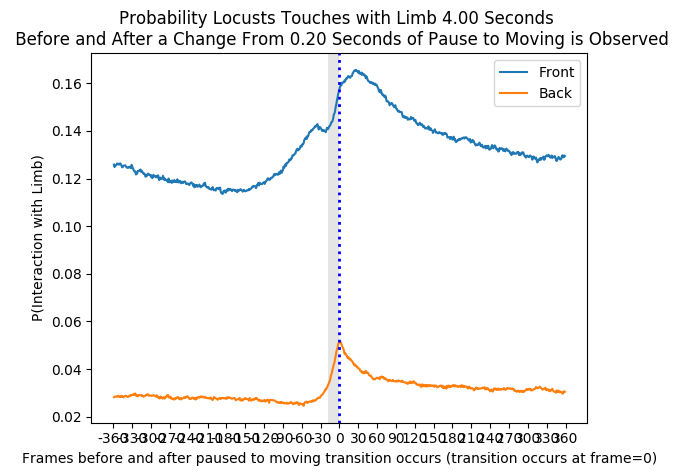



  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7507/323578 [00:00<00:04, 74981.40it/s]

  4%|▍         | 14393/323578 [00:00<00:04, 73033.47it/s]

  7%|▋         | 22385/323578 [00:00<00:04, 74913.23it/s]

  9%|▉         | 29826/323578 [00:00<00:03, 74480.78it/s]

 12%|█▏        | 39335/323578 [00:00<00:03, 79371.50it/s]

0




 15%|█▌        | 49507/323578 [00:00<00:03, 84972.09it/s]

 18%|█▊        | 58946/323578 [00:00<00:03, 86895.35it/s]

 21%|██        | 67155/323578 [00:00<00:03, 83727.01it/s]

 24%|██▍       | 78556/323578 [00:00<00:02, 90519.79it/s]

 27%|██▋       | 87549/323578 [00:01<00:02, 88686.95it/s]

 30%|██▉       | 96385/323578 [00:01<00:02, 87451.23it/s]

 34%|███▍      | 109778/323578 [00:01<00:02, 97613.82it/s]

 37%|███▋      | 119904/323578 [00:01<00:02, 85357.49it/s]

 40%|███▉      | 128973/323578 [00:01<00:02, 79459.47it/s]

 44%|████▎     | 141322/323578 [00:01<00:02, 88976.72it/s]

 47%|████▋     | 150908/323578 [00:01<00:02, 82802.59it/s]

 49%|████▉     | 159756/323578 [00:01<00:02, 75910.14it/s]

 54%|█████▍    | 174864/323578 [00:01<00:01, 89020.42it/s]

 58%|█████▊    | 186570/323578 [00:02<00:01, 95367.04it/s]

 61%|██████    | 197103/323578 [00:02<00:01, 88314.30it/s]

 67%|██████▋   | 216481/323578 [00:02<00:01, 105547.37it/s]

 71%|███████   | 229037/323578 [00:02<00:00

1




 30%|███       | 97545/323578 [00:00<00:01, 164810.46it/s]

 36%|███▋      | 118093/323578 [00:00<00:01, 175213.94it/s]

 45%|████▌     | 146908/323578 [00:00<00:00, 198560.17it/s]

 52%|█████▏    | 169760/323578 [00:00<00:00, 206689.15it/s]

 62%|██████▏   | 199501/323578 [00:01<00:00, 226350.14it/s]

 69%|██████▉   | 222996/323578 [00:01<00:00, 177464.27it/s]

 75%|███████▌  | 242982/323578 [00:01<00:00, 179967.74it/s]

 82%|████████▏ | 263984/323578 [00:01<00:00, 188039.31it/s]

 89%|████████▉ | 287314/323578 [00:01<00:00, 198760.08it/s]

 96%|█████████▌| 310846/323578 [00:01<00:00, 208475.80it/s]

100%|██████████| 323578/323578 [00:01<00:00, 190574.45it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11880/323578 [00:00<00:02, 117310.21it/s]

  7%|▋         | 22970/323578 [00:00<00:02, 114452.11it/s]

 11%|█         | 34980/323578 [00:00<00:02, 115360.55it/s]

 14%|█▍        | 45961/323578 [00:00<00:02, 113636.71it/s]



2


 17%|█▋        | 54523/323578 [00:00<00:02, 102419.38it/s]

 20%|██        | 65342/323578 [00:00<00:02, 104084.26it/s]

 25%|██▍       | 79456/323578 [00:00<00:02, 112572.31it/s]

 29%|██▉       | 93115/323578 [00:00<00:01, 118840.49it/s]

 33%|███▎      | 106133/323578 [00:00<00:01, 121583.07it/s]

 36%|███▋      | 118052/323578 [00:01<00:01, 114345.25it/s]

 40%|███▉      | 129408/323578 [00:01<00:01, 102482.39it/s]

 43%|████▎     | 139832/323578 [00:01<00:01, 97157.20it/s] 

 47%|████▋     | 151528/323578 [00:01<00:01, 102153.65it/s]

 50%|█████     | 161938/323578 [00:01<00:01, 93546.63it/s] 

 53%|█████▎    | 171571/323578 [00:01<00:01, 90826.94it/s]

 56%|█████▌    | 181823/323578 [00:01<00:01, 94044.70it/s]

 59%|█████▉    | 191405/323578 [00:01<00:01, 88942.70it/s]

 62%|██████▏   | 200481/323578 [00:01<00:01, 86737.90it/s]

 65%|██████▍   | 210238/323578 [00:02<00:01, 89268.96it/s]

 68%|██████▊   | 220906/323578 [00:02<00:01, 93358.20it/s]

 72%|███████▏  | 232981/323578 [00

3




 11%|█         | 35810/323578 [00:00<00:04, 62643.02it/s]

 13%|█▎        | 43474/323578 [00:00<00:04, 66051.61it/s]

 15%|█▌        | 49389/323578 [00:00<00:04, 61459.39it/s]

 17%|█▋        | 55116/323578 [00:00<00:04, 58833.94it/s]

 19%|█▉        | 60730/323578 [00:00<00:05, 51831.16it/s]

 20%|██        | 65877/323578 [00:01<00:05, 50488.53it/s]

 23%|██▎       | 74931/323578 [00:01<00:04, 58213.76it/s]

 29%|██▉       | 95150/323578 [00:01<00:03, 73958.63it/s]

 33%|███▎      | 106936/323578 [00:01<00:02, 82927.49it/s]

 41%|████      | 131440/323578 [00:01<00:01, 103128.77it/s]

 45%|████▌     | 146124/323578 [00:01<00:01, 89801.72it/s] 

 49%|████▉     | 158473/323578 [00:01<00:01, 88110.16it/s]

 52%|█████▏    | 169649/323578 [00:02<00:01, 82053.00it/s]

 56%|█████▌    | 179594/323578 [00:02<00:01, 72075.36it/s]

 58%|█████▊    | 188240/323578 [00:02<00:02, 61243.41it/s]

 60%|██████    | 195653/323578 [00:02<00:02, 52791.22it/s]

 62%|██████▏   | 202040/323578 [00:02<00:02,

4




 14%|█▍        | 45047/323578 [00:00<00:03, 89408.09it/s]

 17%|█▋        | 55405/323578 [00:00<00:02, 92812.66it/s]

 20%|█▉        | 63830/323578 [00:00<00:03, 78503.86it/s]

 23%|██▎       | 75729/323578 [00:00<00:02, 87427.77it/s]

 26%|██▋       | 85224/323578 [00:00<00:02, 89168.27it/s]

 29%|██▉       | 95337/323578 [00:01<00:02, 91749.45it/s]

 32%|███▏      | 104619/323578 [00:01<00:02, 88273.31it/s]

 35%|███▌      | 113550/323578 [00:01<00:02, 88425.42it/s]

 38%|███▊      | 122465/323578 [00:01<00:02, 88435.79it/s]

 41%|████▏     | 133679/323578 [00:01<00:02, 94423.55it/s]

 45%|████▍     | 144493/323578 [00:01<00:01, 98157.81it/s]

 48%|████▊     | 155407/323578 [00:01<00:01, 101192.26it/s]

 51%|█████     | 165649/323578 [00:01<00:01, 99538.60it/s] 

 56%|█████▌    | 181160/323578 [00:01<00:01, 111525.07it/s]

 60%|█████▉    | 194142/323578 [00:01<00:01, 115575.42it/s]

 64%|██████▎   | 206110/323578 [00:02<00:01, 107131.89it/s]

 67%|██████▋   | 217234/323578 [00:02<0

5




 12%|█▏        | 38604/323578 [00:00<00:03, 77040.03it/s]

 15%|█▍        | 47904/323578 [00:00<00:03, 80863.71it/s]

 17%|█▋        | 55477/323578 [00:00<00:03, 79251.52it/s]

 19%|█▉        | 62823/323578 [00:00<00:03, 77188.37it/s]

 22%|██▏       | 70501/323578 [00:00<00:03, 76514.31it/s]

 24%|██▍       | 79050/323578 [00:01<00:03, 78457.41it/s]

 27%|██▋       | 87737/323578 [00:01<00:02, 80493.05it/s]

 30%|██▉       | 96452/323578 [00:01<00:02, 82380.54it/s]

 32%|███▏      | 104623/323578 [00:01<00:03, 70541.50it/s]

 35%|███▍      | 111927/323578 [00:01<00:03, 67080.09it/s]

 37%|███▋      | 118846/323578 [00:01<00:03, 67034.58it/s]

 40%|███▉      | 128007/323578 [00:01<00:02, 72478.75it/s]

 42%|████▏     | 136186/323578 [00:01<00:02, 75041.37it/s]

 44%|████▍     | 143875/323578 [00:01<00:02, 75086.97it/s]

 47%|████▋     | 152614/323578 [00:02<00:02, 77760.91it/s]

 50%|████▉     | 160505/323578 [00:02<00:02, 70457.58it/s]

 52%|█████▏    | 168809/323578 [00:02<00:02, 7

6




 14%|█▍        | 46337/323578 [00:00<00:03, 85100.59it/s]

 17%|█▋        | 53800/323578 [00:00<00:03, 80338.93it/s]

 20%|█▉        | 63592/323578 [00:00<00:03, 84509.83it/s]

 23%|██▎       | 73962/323578 [00:00<00:02, 89131.20it/s]

 26%|██▌       | 84297/323578 [00:00<00:02, 92700.45it/s]

 29%|██▉       | 93447/323578 [00:01<00:02, 90954.70it/s]

 33%|███▎      | 105785/323578 [00:01<00:02, 98739.20it/s]

 36%|███▌      | 115800/323578 [00:01<00:02, 95270.76it/s]

 39%|███▉      | 125452/323578 [00:01<00:02, 85260.33it/s]

 41%|████▏     | 134263/323578 [00:01<00:02, 70479.95it/s]

 44%|████▍     | 143811/323578 [00:01<00:02, 76225.06it/s]

 47%|████▋     | 152006/323578 [00:01<00:02, 75279.75it/s]

 49%|████▉     | 159938/323578 [00:01<00:02, 74406.41it/s]

 52%|█████▏    | 167664/323578 [00:01<00:02, 72783.22it/s]

 55%|█████▌    | 179227/323578 [00:02<00:01, 81885.87it/s]

 58%|█████▊    | 187936/323578 [00:02<00:01, 81652.04it/s]

 61%|██████    | 196466/323578 [00:02<00:01,

7




 16%|█▌        | 51333/323578 [00:00<00:04, 66584.90it/s]

 18%|█▊        | 57649/323578 [00:00<00:04, 60850.83it/s]

 21%|██▏       | 68970/323578 [00:00<00:03, 70653.78it/s]

 24%|██▍       | 77654/323578 [00:01<00:03, 74329.36it/s]

 27%|██▋       | 87068/323578 [00:01<00:02, 79288.07it/s]

 29%|██▉       | 95364/323578 [00:01<00:02, 76931.39it/s]

 32%|███▏      | 105138/323578 [00:01<00:02, 82180.10it/s]

 35%|███▌      | 113646/323578 [00:01<00:02, 80240.33it/s]

 39%|███▊      | 125095/323578 [00:01<00:02, 88151.06it/s]

 43%|████▎     | 137694/323578 [00:01<00:01, 96879.47it/s]

 46%|████▌     | 149556/323578 [00:01<00:01, 102444.33it/s]

 50%|████▉     | 160260/323578 [00:01<00:01, 89899.29it/s] 

 52%|█████▏    | 169850/323578 [00:02<00:01, 88096.52it/s]

 55%|█████▌    | 179143/323578 [00:02<00:01, 88744.82it/s]

 60%|██████    | 194320/323578 [00:02<00:01, 101373.27it/s]

 63%|██████▎   | 205296/323578 [00:02<00:01, 96971.01it/s] 

 67%|██████▋   | 215621/323578 [00:02<00

8




 13%|█▎        | 42630/323578 [00:00<00:03, 82226.20it/s]

 16%|█▋        | 52882/323578 [00:00<00:03, 87416.75it/s]

 20%|█▉        | 63925/323578 [00:00<00:02, 92573.57it/s]

 23%|██▎       | 73941/323578 [00:00<00:02, 94725.66it/s]

 27%|██▋       | 86806/323578 [00:00<00:02, 102801.64it/s]

 30%|███       | 98395/323578 [00:01<00:02, 106406.17it/s]

 35%|███▍      | 111876/323578 [00:01<00:01, 112630.57it/s]

 40%|███▉      | 127831/323578 [00:01<00:01, 123041.83it/s]

 43%|████▎     | 140493/323578 [00:01<00:01, 123740.87it/s]

 48%|████▊     | 154122/323578 [00:01<00:01, 126246.70it/s]

 52%|█████▏    | 166934/323578 [00:01<00:01, 114071.20it/s]

 55%|█████▌    | 179407/323578 [00:01<00:01, 117072.01it/s]

 60%|██████    | 194603/323578 [00:01<00:01, 125731.51it/s]

 64%|██████▍   | 208383/323578 [00:01<00:00, 129123.10it/s]

 68%|██████▊   | 221576/323578 [00:01<00:00, 127971.49it/s]

 72%|███████▏  | 234572/323578 [00:02<00:00, 123822.22it/s]

 76%|███████▋  | 247123/323578 [

9




 11%|█▏        | 37012/323578 [00:00<00:03, 88441.99it/s]

 14%|█▎        | 44109/323578 [00:00<00:03, 81885.78it/s]

 17%|█▋        | 53637/323578 [00:00<00:03, 84848.05it/s]

 19%|█▉        | 61361/323578 [00:00<00:03, 82074.51it/s]

 21%|██▏       | 69123/323578 [00:00<00:03, 80685.28it/s]

 24%|██▍       | 77979/323578 [00:00<00:02, 82210.99it/s]

 27%|██▋       | 86216/323578 [00:01<00:02, 81655.45it/s]

 29%|██▉       | 94214/323578 [00:01<00:02, 79625.32it/s]

 32%|███▏      | 104774/323578 [00:01<00:02, 85968.80it/s]

 35%|███▌      | 113442/323578 [00:01<00:02, 74666.74it/s]

 37%|███▋      | 121224/323578 [00:01<00:02, 75304.17it/s]

 40%|████      | 129791/323578 [00:01<00:02, 77744.00it/s]

 43%|████▎     | 138363/323578 [00:01<00:02, 79726.01it/s]

 46%|████▋     | 149843/323578 [00:01<00:01, 87691.79it/s]

 49%|████▉     | 158949/323578 [00:01<00:02, 78522.53it/s]

 52%|█████▏    | 167217/323578 [00:02<00:01, 79164.64it/s]

 54%|█████▍    | 175426/323578 [00:02<00:01, 7

10


  7%|▋         | 21194/323578 [00:00<00:04, 70118.80it/s]

 10%|▉         | 31242/323578 [00:00<00:03, 77108.34it/s]

 12%|█▏        | 38481/323578 [00:00<00:03, 75184.66it/s]

 15%|█▌        | 48573/323578 [00:00<00:03, 81304.25it/s]

 18%|█▊        | 57231/323578 [00:00<00:03, 82318.50it/s]

 20%|██        | 65338/323578 [00:00<00:03, 81939.48it/s]

 23%|██▎       | 73275/323578 [00:00<00:03, 80691.31it/s]

 25%|██▌       | 81873/323578 [00:01<00:02, 81923.34it/s]

 28%|██▊       | 89947/323578 [00:01<00:02, 81056.83it/s]

 31%|███       | 100681/323578 [00:01<00:02, 87482.96it/s]

 34%|███▍      | 109519/323578 [00:01<00:02, 82958.05it/s]

 36%|███▋      | 117927/323578 [00:01<00:02, 79521.68it/s]

 41%|████      | 132994/323578 [00:01<00:02, 92646.21it/s]

 44%|████▍     | 143157/323578 [00:01<00:02, 87085.26it/s]

 47%|████▋     | 152563/323578 [00:01<00:02, 82404.43it/s]

 50%|████▉     | 161344/323578 [00:01<00:02, 74314.84it/s]

 53%|█████▎    | 172064/323578 [00:02<00:01, 8176

11




 17%|█▋        | 56083/323578 [00:00<00:03, 87907.76it/s]

 20%|██        | 65778/323578 [00:00<00:02, 90437.72it/s]

 27%|██▋       | 87680/323578 [00:00<00:02, 109770.89it/s]

 33%|███▎      | 105784/323578 [00:00<00:01, 124470.49it/s]

 39%|███▊      | 125327/323578 [00:01<00:01, 139458.44it/s]

 44%|████▍     | 142295/323578 [00:01<00:01, 147085.31it/s]

 49%|████▉     | 158372/323578 [00:01<00:01, 141631.55it/s]

 55%|█████▌    | 178271/323578 [00:01<00:00, 154581.26it/s]

 61%|██████    | 196853/323578 [00:01<00:00, 162683.76it/s]

 66%|██████▌   | 213971/323578 [00:01<00:00, 135283.95it/s]

 71%|███████   | 228867/323578 [00:01<00:00, 115411.22it/s]

 75%|███████▍  | 241873/323578 [00:01<00:00, 115433.37it/s]

 79%|███████▊  | 254442/323578 [00:02<00:00, 105746.59it/s]

 82%|████████▏ | 265893/323578 [00:02<00:00, 95921.75it/s] 

 85%|████████▌ | 276274/323578 [00:02<00:00, 89813.04it/s]

 88%|████████▊ | 285887/323578 [00:02<00:00, 82410.68it/s]

 92%|█████████▏| 297248/32357

12




 21%|██▏       | 69068/323578 [00:00<00:02, 98836.82it/s] 

 24%|██▍       | 78157/323578 [00:00<00:02, 88087.16it/s]

 27%|██▋       | 87374/323578 [00:00<00:02, 88506.37it/s]

 30%|██▉       | 95988/323578 [00:00<00:02, 86416.47it/s]

 33%|███▎      | 106375/323578 [00:01<00:02, 91003.40it/s]

 36%|███▌      | 115643/323578 [00:01<00:02, 91499.23it/s]

 39%|███▊      | 124764/323578 [00:01<00:02, 90624.23it/s]

 41%|████▏     | 133808/323578 [00:01<00:02, 89600.89it/s]

 45%|████▍     | 145039/323578 [00:01<00:01, 95386.99it/s]

 48%|████▊     | 154983/323578 [00:01<00:01, 96145.60it/s]

 51%|█████     | 164666/323578 [00:01<00:01, 86839.68it/s]

 55%|█████▍    | 176752/323578 [00:01<00:01, 94452.73it/s]

 58%|█████▊    | 186547/323578 [00:01<00:01, 93151.16it/s]

 61%|██████    | 196111/323578 [00:02<00:01, 91089.69it/s]

 63%|██████▎   | 205405/323578 [00:02<00:01, 90529.40it/s]

 67%|██████▋   | 217189/323578 [00:02<00:01, 96773.96it/s]

 72%|███████▏  | 234468/323578 [00:02<00:

13




 25%|██▌       | 82498/323578 [00:00<00:02, 94887.87it/s]

 28%|██▊       | 92082/323578 [00:00<00:02, 85826.53it/s]

 31%|███       | 100897/323578 [00:01<00:02, 84106.74it/s]

 35%|███▍      | 112247/323578 [00:01<00:02, 91189.99it/s]

 38%|███▊      | 121659/323578 [00:01<00:02, 80891.54it/s]

 40%|████      | 130497/323578 [00:01<00:02, 82820.35it/s]

 43%|████▎     | 139084/323578 [00:01<00:02, 80619.41it/s]

 46%|████▌     | 148858/323578 [00:01<00:02, 84651.92it/s]

 49%|████▊     | 157535/323578 [00:01<00:01, 84570.90it/s]

 51%|█████▏    | 166141/323578 [00:01<00:01, 81360.25it/s]

 55%|█████▍    | 177744/323578 [00:01<00:01, 89370.94it/s]

 58%|█████▊    | 188047/323578 [00:02<00:01, 92545.67it/s]

 61%|██████    | 197562/323578 [00:02<00:01, 87089.94it/s]

 64%|██████▍   | 206519/323578 [00:02<00:01, 87336.82it/s]

 67%|██████▋   | 216693/323578 [00:02<00:01, 91209.84it/s]

 70%|██████▉   | 225981/323578 [00:02<00:01, 84095.69it/s]

 73%|███████▎  | 234617/323578 [00:02<00

14




 16%|█▋        | 53044/323578 [00:00<00:03, 71272.76it/s]

 18%|█▊        | 59557/323578 [00:00<00:03, 67766.33it/s]

 22%|██▏       | 70750/323578 [00:00<00:03, 76797.12it/s]

 24%|██▍       | 78562/323578 [00:00<00:03, 72702.85it/s]

 28%|██▊       | 90187/323578 [00:01<00:02, 81907.25it/s]

 32%|███▏      | 102680/323578 [00:01<00:02, 90842.25it/s]

 35%|███▍      | 112407/323578 [00:01<00:02, 90789.50it/s]

 38%|███▊      | 122549/323578 [00:01<00:02, 93261.25it/s]

 41%|████      | 132207/323578 [00:01<00:02, 87523.53it/s]

 44%|████▍     | 143013/323578 [00:01<00:01, 92657.76it/s]

 47%|████▋     | 152574/323578 [00:01<00:02, 77039.19it/s]

 50%|████▉     | 160925/323578 [00:01<00:02, 68821.88it/s]

 53%|█████▎    | 171467/323578 [00:02<00:01, 76821.04it/s]

 56%|█████▌    | 179879/323578 [00:02<00:01, 76445.12it/s]

 58%|█████▊    | 188035/323578 [00:02<00:01, 77517.48it/s]

 62%|██████▏   | 200875/323578 [00:02<00:01, 87825.54it/s]

 65%|██████▌   | 210375/323578 [00:02<00:01

15




 14%|█▍        | 46506/323578 [00:00<00:03, 88736.76it/s]

 17%|█▋        | 56551/323578 [00:00<00:02, 91930.30it/s]

 22%|██▏       | 70853/323578 [00:00<00:02, 102594.68it/s]

 25%|██▍       | 80825/323578 [00:00<00:02, 98765.87it/s] 

 29%|██▉       | 93871/323578 [00:00<00:02, 106529.06it/s]

 32%|███▏      | 105057/323578 [00:01<00:02, 108062.37it/s]

 36%|███▌      | 115907/323578 [00:01<00:02, 98168.42it/s] 

 39%|███▉      | 127408/323578 [00:01<00:01, 102208.19it/s]

 43%|████▎     | 138251/323578 [00:01<00:01, 103544.14it/s]

 46%|████▌     | 148740/323578 [00:01<00:01, 97617.38it/s] 

 50%|████▉     | 160240/323578 [00:01<00:01, 101332.59it/s]

 53%|█████▎    | 170525/323578 [00:01<00:01, 97471.02it/s] 

 56%|█████▌    | 181007/323578 [00:01<00:01, 98775.09it/s]

 59%|█████▉    | 191053/323578 [00:01<00:01, 98898.20it/s]

 62%|██████▏   | 201878/323578 [00:02<00:01, 100957.70it/s]

 66%|██████▌   | 212034/323578 [00:02<00:01, 84638.48it/s] 

 68%|██████▊   | 220987/323578 

16




 22%|██▏       | 71365/323578 [00:00<00:03, 79189.46it/s]

 24%|██▍       | 79035/323578 [00:01<00:03, 73986.60it/s]

 28%|██▊       | 89431/323578 [00:01<00:02, 80911.31it/s]

 31%|███       | 99777/323578 [00:01<00:02, 86290.20it/s]

 34%|███▎      | 108589/323578 [00:01<00:02, 84726.20it/s]

 36%|███▋      | 118017/323578 [00:01<00:02, 86812.64it/s]

 39%|███▉      | 127354/323578 [00:01<00:02, 88680.48it/s]

 42%|████▏     | 136554/323578 [00:01<00:02, 89650.87it/s]

 45%|████▍     | 145581/323578 [00:01<00:02, 79564.50it/s]

 48%|████▊     | 153791/323578 [00:01<00:02, 76046.52it/s]

 50%|████▉     | 161606/323578 [00:02<00:02, 74544.14it/s]

 52%|█████▏    | 169214/323578 [00:02<00:02, 73913.59it/s]

 55%|█████▌    | 179529/323578 [00:02<00:01, 80781.66it/s]

 58%|█████▊    | 187874/323578 [00:02<00:01, 79544.82it/s]

 61%|██████    | 196020/323578 [00:02<00:01, 79807.18it/s]

 63%|██████▎   | 205124/323578 [00:02<00:01, 82874.22it/s]

 66%|██████▌   | 213536/323578 [00:02<00:0

17




 24%|██▍       | 77289/323578 [00:00<00:02, 93018.06it/s]

 27%|██▋       | 86202/323578 [00:00<00:02, 91382.09it/s]

 30%|██▉       | 96468/323578 [00:01<00:02, 94246.32it/s]

 33%|███▎      | 106004/323578 [00:01<00:02, 94323.04it/s]

 36%|███▌      | 115306/323578 [00:01<00:02, 90185.83it/s]

 38%|███▊      | 124272/323578 [00:01<00:02, 89635.10it/s]

 41%|████      | 133200/323578 [00:01<00:02, 87848.36it/s]

 44%|████▍     | 142142/323578 [00:01<00:02, 88072.71it/s]

 47%|████▋     | 150938/323578 [00:01<00:01, 88003.93it/s]

 49%|████▉     | 159730/323578 [00:01<00:02, 81597.29it/s]

 52%|█████▏    | 167977/323578 [00:01<00:01, 80437.92it/s]

 54%|█████▍    | 176086/323578 [00:01<00:01, 77273.72it/s]

 57%|█████▋    | 185388/323578 [00:02<00:01, 81222.40it/s]

 60%|█████▉    | 193615/323578 [00:02<00:01, 79818.67it/s]

 63%|██████▎   | 202537/323578 [00:02<00:01, 82424.05it/s]

 66%|██████▌   | 212898/323578 [00:02<00:01, 87810.14it/s]

 69%|██████▊   | 222121/323578 [00:02<00:

18


 39%|███▉      | 127405/323578 [00:00<00:01, 149187.18it/s]

 44%|████▍     | 141797/323578 [00:00<00:01, 129575.44it/s]

 48%|████▊     | 154846/323578 [00:00<00:01, 121001.89it/s]

 52%|█████▏    | 167125/323578 [00:01<00:01, 104888.46it/s]

 55%|█████▌    | 178121/323578 [00:01<00:01, 96729.38it/s] 

 58%|█████▊    | 189222/323578 [00:01<00:01, 100144.18it/s]

 62%|██████▏   | 199604/323578 [00:01<00:01, 95471.24it/s] 

 65%|██████▍   | 209454/323578 [00:01<00:01, 90146.85it/s]

 68%|██████▊   | 218742/323578 [00:01<00:01, 85975.99it/s]

 70%|███████   | 227572/323578 [00:01<00:01, 77669.01it/s]

 74%|███████▍  | 239524/323578 [00:01<00:00, 86309.56it/s]

 77%|███████▋  | 250713/323578 [00:02<00:00, 92319.69it/s]

 81%|████████  | 262762/323578 [00:02<00:00, 98892.48it/s]

 84%|████████▍ | 273142/323578 [00:02<00:00, 99736.98it/s]

 88%|████████▊ | 283446/323578 [00:02<00:00, 93999.21it/s]

 91%|█████████ | 293145/323578 [00:02<00:00, 88423.64it/s]

 94%|█████████▍| 304266/323578 [0

19




 13%|█▎        | 41287/323578 [00:00<00:04, 58590.66it/s]

 16%|█▌        | 50627/323578 [00:00<00:04, 65682.02it/s]

 18%|█▊        | 58069/323578 [00:00<00:03, 67695.19it/s]

 20%|██        | 64875/323578 [00:01<00:04, 63577.45it/s]

 22%|██▏       | 71310/323578 [00:01<00:04, 58672.84it/s]

 25%|██▍       | 80203/323578 [00:01<00:03, 65286.74it/s]

 27%|██▋       | 88110/323578 [00:01<00:03, 68553.68it/s]

 30%|██▉       | 95806/323578 [00:01<00:03, 70466.98it/s]

 32%|███▏      | 103056/323578 [00:01<00:03, 69144.75it/s]

 34%|███▍      | 110119/323578 [00:01<00:03, 63164.65it/s]

 36%|███▌      | 116640/323578 [00:01<00:03, 61363.67it/s]

 38%|███▊      | 123297/323578 [00:01<00:03, 62837.52it/s]

 40%|████      | 130651/323578 [00:02<00:02, 65567.98it/s]

 43%|████▎     | 137670/323578 [00:02<00:02, 66888.95it/s]

 45%|████▍     | 144964/323578 [00:02<00:02, 68089.70it/s]

 48%|████▊     | 155409/323578 [00:02<00:02, 75738.37it/s]

 50%|█████     | 163300/323578 [00:02<00:02, 7

20




 19%|█▉        | 61853/323578 [00:00<00:03, 77921.59it/s]

 22%|██▏       | 69691/323578 [00:00<00:03, 78058.01it/s]

 25%|██▍       | 79936/323578 [00:01<00:02, 83823.92it/s]

 28%|██▊       | 90987/323578 [00:01<00:02, 90308.83it/s]

 31%|███       | 100126/323578 [00:01<00:02, 85734.67it/s]

 35%|███▌      | 114451/323578 [00:01<00:02, 97311.43it/s]

 39%|███▉      | 127711/323578 [00:01<00:01, 105753.42it/s]

 43%|████▎     | 139661/323578 [00:01<00:01, 109388.18it/s]

 47%|████▋     | 151085/323578 [00:01<00:01, 96260.22it/s] 

 50%|█████     | 161927/323578 [00:01<00:01, 99308.35it/s]

 53%|█████▎    | 172321/323578 [00:01<00:01, 93859.32it/s]

 57%|█████▋    | 185423/323578 [00:02<00:01, 101857.90it/s]

 62%|██████▏   | 202144/323578 [00:02<00:01, 115386.74it/s]

 66%|██████▋   | 214619/323578 [00:02<00:00, 115140.23it/s]

 73%|███████▎  | 237347/323578 [00:02<00:00, 135143.81it/s]

 81%|████████▏ | 263332/323578 [00:02<00:00, 157873.12it/s]

 90%|████████▉ | 291047/323578 [00

21


  5%|▌         | 17707/323578 [00:00<00:03, 88492.05it/s]

  8%|▊         | 27209/323578 [00:00<00:03, 89843.76it/s]

 12%|█▏        | 38285/323578 [00:00<00:03, 94602.89it/s]

 15%|█▍        | 47829/323578 [00:00<00:02, 94144.13it/s]

 18%|█▊        | 58039/323578 [00:00<00:02, 96397.09it/s]

 21%|██        | 67561/323578 [00:00<00:02, 96040.46it/s]

 24%|██▍       | 77248/323578 [00:00<00:02, 95987.86it/s]

 29%|██▉       | 93041/323578 [00:00<00:02, 108514.32it/s]

 33%|███▎      | 107884/323578 [00:01<00:01, 117412.71it/s]

 39%|███▉      | 126625/323578 [00:01<00:01, 132228.51it/s]

 43%|████▎     | 140727/323578 [00:01<00:01, 134747.23it/s]

 48%|████▊     | 154818/323578 [00:01<00:01, 116339.31it/s]

 52%|█████▏    | 167800/323578 [00:01<00:01, 119940.95it/s]

 58%|█████▊    | 186940/323578 [00:01<00:01, 135048.87it/s]

 66%|██████▌   | 212612/323578 [00:01<00:00, 157432.69it/s]

 73%|███████▎  | 234714/323578 [00:01<00:00, 172303.12it/s]

 81%|████████  | 260533/323578 [00:01<0

22




 24%|██▍       | 76887/323578 [00:00<00:02, 86768.64it/s]

 26%|██▋       | 85457/323578 [00:01<00:02, 82547.63it/s]

 29%|██▉       | 93680/323578 [00:01<00:02, 79392.75it/s]

 33%|███▎      | 106309/323578 [00:01<00:02, 89346.00it/s]

 36%|███▌      | 115658/323578 [00:01<00:02, 85234.73it/s]

 38%|███▊      | 124512/323578 [00:01<00:02, 75933.98it/s]

 41%|████      | 132525/323578 [00:01<00:02, 69441.34it/s]

 44%|████▍     | 143384/323578 [00:01<00:02, 77732.26it/s]

 47%|████▋     | 151825/323578 [00:01<00:02, 79120.61it/s]

 49%|████▉     | 160165/323578 [00:01<00:02, 80102.24it/s]

 52%|█████▏    | 168478/323578 [00:02<00:02, 70586.63it/s]

 56%|█████▌    | 180864/323578 [00:02<00:01, 81042.35it/s]

 59%|█████▊    | 189813/323578 [00:02<00:01, 78088.71it/s]

 61%|██████▏   | 198517/323578 [00:02<00:01, 80336.40it/s]

 64%|██████▍   | 206997/323578 [00:02<00:01, 81296.54it/s]

 67%|██████▋   | 215442/323578 [00:02<00:01, 81137.71it/s]

 71%|███████   | 228404/323578 [00:02<00:

23


 28%|██▊       | 89759/323578 [00:00<00:01, 128890.07it/s]

 32%|███▏      | 104600/323578 [00:00<00:01, 133724.80it/s]

 38%|███▊      | 121408/323578 [00:00<00:01, 142120.86it/s]

 42%|████▏     | 136710/323578 [00:01<00:01, 144274.96it/s]

 47%|████▋     | 150892/323578 [00:01<00:01, 139656.31it/s]

 51%|█████     | 164718/323578 [00:01<00:01, 121530.92it/s]

 55%|█████▍    | 177195/323578 [00:01<00:01, 122104.38it/s]

 59%|█████▊    | 189633/323578 [00:01<00:01, 113319.75it/s]

 62%|██████▏   | 201251/323578 [00:01<00:01, 112785.17it/s]

 66%|██████▌   | 212730/323578 [00:01<00:01, 108839.22it/s]

 69%|██████▉   | 223784/323578 [00:01<00:00, 108504.65it/s]

 74%|███████▎  | 237855/323578 [00:01<00:00, 116503.89it/s]

 77%|███████▋  | 249756/323578 [00:02<00:00, 114246.81it/s]

 82%|████████▏ | 266215/323578 [00:02<00:00, 125494.43it/s]

 86%|████████▋ | 279566/323578 [00:02<00:00, 127423.88it/s]

 90%|█████████ | 292641/323578 [00:02<00:00, 121966.14it/s]

 95%|█████████▌| 308459/3

24




  6%|▋         | 20611/323578 [00:00<00:04, 69604.96it/s]

 10%|▉         | 31312/323578 [00:00<00:03, 77410.73it/s]

 13%|█▎        | 40605/323578 [00:00<00:03, 81493.06it/s]

 15%|█▌        | 48948/323578 [00:00<00:03, 81401.58it/s]

 18%|█▊        | 59075/323578 [00:00<00:03, 85924.72it/s]

 21%|██▏       | 68814/323578 [00:00<00:02, 89070.27it/s]

 25%|██▍       | 79601/323578 [00:00<00:02, 93319.78it/s]

 27%|██▋       | 88799/323578 [00:01<00:02, 91549.33it/s]

 31%|███       | 100253/323578 [00:01<00:02, 96939.42it/s]

 34%|███▍      | 109973/323578 [00:01<00:02, 92671.09it/s]

 37%|███▋      | 119406/323578 [00:01<00:02, 92680.70it/s]

 41%|████      | 131398/323578 [00:01<00:01, 99262.91it/s]

 44%|████▎     | 141484/323578 [00:01<00:01, 97534.79it/s]

 47%|████▋     | 151356/323578 [00:01<00:01, 89914.42it/s]

 50%|█████     | 163089/323578 [00:01<00:01, 96275.68it/s]

 53%|█████▎    | 172983/323578 [00:01<00:01, 94732.88it/s]

 56%|█████▋    | 182648/323578 [00:01<00:01, 9

25




 19%|█▉        | 60723/323578 [00:00<00:03, 86256.19it/s]

 22%|██▏       | 70024/323578 [00:00<00:02, 88176.78it/s]

 25%|██▌       | 81121/323578 [00:00<00:02, 93945.14it/s]

 29%|██▉       | 93057/323578 [00:01<00:02, 100355.24it/s]

 32%|███▏      | 103459/323578 [00:01<00:02, 96508.06it/s]

 35%|███▌      | 114611/323578 [00:01<00:02, 100183.73it/s]

 39%|███▊      | 124867/323578 [00:01<00:02, 92947.07it/s] 

 42%|████▏     | 134433/323578 [00:01<00:02, 91810.54it/s]

 44%|████▍     | 143807/323578 [00:01<00:02, 88504.86it/s]

 47%|████▋     | 152818/323578 [00:01<00:02, 84941.46it/s]

 50%|█████     | 162782/323578 [00:01<00:01, 88873.89it/s]

 53%|█████▎    | 172561/323578 [00:01<00:01, 90596.22it/s]

 57%|█████▋    | 185043/323578 [00:02<00:01, 98482.55it/s]

 61%|██████    | 196456/323578 [00:02<00:01, 102568.00it/s]

 65%|██████▌   | 211589/323578 [00:02<00:00, 113522.58it/s]

 69%|██████▉   | 223473/323578 [00:02<00:00, 112119.21it/s]

 73%|███████▎  | 235887/323578 [00:0

26




 19%|█▉        | 62200/323578 [00:00<00:03, 74729.07it/s]

 21%|██▏       | 69269/323578 [00:00<00:03, 70437.45it/s]

 24%|██▍       | 77817/323578 [00:01<00:03, 73283.14it/s]

 28%|██▊       | 89362/323578 [00:01<00:02, 82300.85it/s]

 31%|███▏      | 101249/323578 [00:01<00:02, 90346.18it/s]

 35%|███▌      | 114640/323578 [00:01<00:02, 100116.97it/s]

 41%|████      | 132687/323578 [00:01<00:01, 115551.29it/s]

 48%|████▊     | 155859/323578 [00:01<00:01, 136006.04it/s]

 55%|█████▍    | 177813/323578 [00:01<00:00, 153531.32it/s]

 64%|██████▍   | 206341/323578 [00:01<00:00, 178223.17it/s]

 73%|███████▎  | 235635/323578 [00:01<00:00, 201947.12it/s]

 82%|████████▏ | 265906/323578 [00:01<00:00, 224350.57it/s]

 91%|█████████ | 295112/323578 [00:02<00:00, 241120.46it/s]

100%|██████████| 323578/323578 [00:02<00:00, 152383.46it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12453/323578 [00:00<00:02, 124523.88it/s]

  7%|▋         | 24218/323578 [00:00<00:02, 12108

27




 23%|██▎       | 72950/323578 [00:00<00:02, 95272.28it/s]

 25%|██▌       | 82006/323578 [00:00<00:02, 90514.27it/s]

 28%|██▊       | 90777/323578 [00:00<00:02, 88010.72it/s]

 31%|███       | 99397/323578 [00:01<00:03, 74634.31it/s]

 33%|███▎      | 107084/323578 [00:01<00:02, 74386.84it/s]

 35%|███▌      | 114680/323578 [00:01<00:02, 73561.74it/s]

 39%|███▉      | 125633/323578 [00:01<00:02, 81600.32it/s]

 47%|████▋     | 152893/323578 [00:01<00:01, 103317.13it/s]

 54%|█████▍    | 175589/323578 [00:01<00:01, 123501.12it/s]

 63%|██████▎   | 202493/323578 [00:01<00:00, 147426.19it/s]

 71%|███████▏  | 230725/323578 [00:01<00:00, 172093.65it/s]

 80%|████████  | 258950/323578 [00:01<00:00, 194914.70it/s]

 89%|████████▉ | 289262/323578 [00:02<00:00, 218290.39it/s]

 98%|█████████▊| 316701/323578 [00:02<00:00, 232553.18it/s]

100%|██████████| 323578/323578 [00:02<00:00, 151137.16it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8530/323578 [00:00<00:03, 83461.4

28




 29%|██▊       | 92451/323578 [00:01<00:02, 92025.58it/s]

 32%|███▏      | 102201/323578 [00:01<00:02, 93284.06it/s]

 34%|███▍      | 111536/323578 [00:01<00:02, 90871.15it/s]

 40%|███▉      | 129033/323578 [00:01<00:01, 105651.63it/s]

 43%|████▎     | 140515/323578 [00:01<00:01, 98421.30it/s] 

 47%|████▋     | 151099/323578 [00:01<00:01, 90830.04it/s]

 50%|████▉     | 160817/323578 [00:01<00:01, 82515.00it/s]

 52%|█████▏    | 169660/323578 [00:01<00:01, 82009.36it/s]

 55%|█████▌    | 178276/323578 [00:01<00:01, 81804.00it/s]

 58%|█████▊    | 186747/323578 [00:02<00:01, 75116.24it/s]

 60%|██████    | 195635/323578 [00:02<00:01, 78129.76it/s]

 64%|██████▍   | 206843/323578 [00:02<00:01, 85606.22it/s]

 67%|██████▋   | 215793/323578 [00:02<00:01, 78454.38it/s]

 69%|██████▉   | 224028/323578 [00:02<00:01, 76179.11it/s]

 72%|███████▏  | 231933/323578 [00:02<00:01, 69570.80it/s]

 74%|███████▍  | 240000/323578 [00:02<00:01, 72099.22it/s]

 78%|███████▊  | 252622/323578 [00:02

29




 21%|██▏       | 69086/323578 [00:00<00:02, 88086.48it/s]

 24%|██▍       | 77813/323578 [00:00<00:02, 85256.25it/s]

 27%|██▋       | 86741/323578 [00:01<00:02, 85781.68it/s]

 30%|██▉       | 97072/323578 [00:01<00:02, 90219.07it/s]

 33%|███▎      | 106137/323578 [00:01<00:02, 85890.07it/s]

 36%|███▌      | 115326/323578 [00:01<00:02, 87606.04it/s]

 38%|███▊      | 124147/323578 [00:01<00:02, 85395.65it/s]

 42%|████▏     | 136656/323578 [00:01<00:01, 94379.93it/s]

 45%|████▌     | 146425/323578 [00:01<00:01, 93049.81it/s]

 48%|████▊     | 156341/323578 [00:01<00:01, 94127.77it/s]

 52%|█████▏    | 167118/323578 [00:01<00:01, 96950.70it/s]

 55%|█████▍    | 177150/323578 [00:01<00:01, 97620.20it/s]

 58%|█████▊    | 187011/323578 [00:02<00:01, 97272.45it/s]

 61%|██████    | 196808/323578 [00:02<00:01, 93373.86it/s]

 65%|██████▍   | 208742/323578 [00:02<00:01, 99301.86it/s]

 68%|██████▊   | 218833/323578 [00:02<00:01, 95573.80it/s]

 71%|███████   | 228533/323578 [00:02<00:0

30




 38%|███▊      | 122340/323578 [00:01<00:02, 100392.47it/s]

 41%|████      | 133098/323578 [00:01<00:02, 93084.63it/s] 

 44%|████▍     | 143327/323578 [00:01<00:01, 95153.09it/s]

 48%|████▊     | 153772/323578 [00:01<00:01, 97762.60it/s]

 51%|█████     | 163873/323578 [00:01<00:01, 97699.61it/s]

 54%|█████▎    | 173870/323578 [00:01<00:01, 96445.22it/s]

 57%|█████▋    | 183678/323578 [00:01<00:01, 96634.70it/s]

 60%|█████▉    | 193456/323578 [00:01<00:01, 93006.00it/s]

 64%|██████▍   | 208554/323578 [00:01<00:01, 105048.94it/s]

 69%|██████▉   | 224750/323578 [00:02<00:00, 117075.76it/s]

 73%|███████▎  | 237315/323578 [00:02<00:00, 105212.10it/s]

 77%|███████▋  | 248663/323578 [00:02<00:00, 89394.54it/s] 

 81%|████████  | 261615/323578 [00:02<00:00, 98061.14it/s]

 84%|████████▍ | 272368/323578 [00:02<00:00, 100197.56it/s]

 89%|████████▉ | 287945/323578 [00:02<00:00, 112206.03it/s]

 96%|█████████▌| 310506/323578 [00:02<00:00, 132130.32it/s]

100%|██████████| 323578/32357

31




 26%|██▌       | 83352/323578 [00:00<00:03, 74754.86it/s]

 28%|██▊       | 90827/323578 [00:01<00:03, 67032.56it/s]

 30%|███       | 97680/323578 [00:01<00:03, 58819.33it/s]

 32%|███▏      | 103849/323578 [00:01<00:04, 53062.13it/s]

 34%|███▍      | 111034/323578 [00:01<00:03, 57388.83it/s]

 36%|███▌      | 117091/323578 [00:01<00:03, 57731.17it/s]

 39%|███▉      | 127070/323578 [00:01<00:02, 65756.99it/s]

 41%|████▏     | 134187/323578 [00:01<00:02, 65763.08it/s]

 44%|████▎     | 141323/323578 [00:01<00:02, 66794.97it/s]

 46%|████▌     | 148272/323578 [00:02<00:02, 66994.20it/s]

 48%|████▊     | 155335/323578 [00:02<00:02, 68044.90it/s]

 50%|█████     | 162276/323578 [00:02<00:02, 66866.79it/s]

 52%|█████▏    | 169063/323578 [00:02<00:02, 65367.43it/s]

 55%|█████▍    | 177005/323578 [00:02<00:02, 68811.48it/s]

 58%|█████▊    | 186953/323578 [00:02<00:01, 75397.62it/s]

 60%|██████    | 194754/323578 [00:02<00:01, 66165.82it/s]

 62%|██████▏   | 201759/323578 [00:02<00:

32




 42%|████▏     | 136524/323578 [00:00<00:00, 213835.16it/s]

 51%|█████▏    | 166003/323578 [00:00<00:00, 233033.18it/s]

 61%|██████    | 196259/323578 [00:00<00:00, 250287.41it/s]

 70%|██████▉   | 226397/323578 [00:00<00:00, 263697.19it/s]

 79%|███████▊  | 254149/323578 [00:01<00:00, 267695.85it/s]

 87%|████████▋ | 281647/323578 [00:01<00:00, 269839.00it/s]

 96%|█████████▌| 309054/323578 [00:01<00:00, 266208.31it/s]

100%|██████████| 323578/323578 [00:01<00:00, 257624.32it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 11056/323578 [00:00<00:02, 110558.26it/s]

  6%|▋         | 20688/323578 [00:00<00:02, 105408.66it/s]

 10%|▉         | 31350/323578 [00:00<00:02, 105101.23it/s]

 12%|█▏        | 38308/323578 [00:00<00:03, 90992.75it/s] 

 15%|█▍        | 47043/323578 [00:00<00:03, 89212.80it/s]

 17%|█▋        | 54367/323578 [00:00<00:03, 80236.68it/s]

 21%|██        | 66750/323578 [00:00<00:02, 89710.92it/s]



33


 25%|██▌       | 82497/323578 [00:00<00:02, 102920.91it/s]

 29%|██▉       | 93269/323578 [00:00<00:02, 91301.43it/s] 

 34%|███▍      | 111116/323578 [00:01<00:01, 106975.89it/s]

 38%|███▊      | 124286/323578 [00:01<00:01, 113359.02it/s]

 45%|████▌     | 146567/323578 [00:01<00:01, 132951.65it/s]

 54%|█████▎    | 173811/323578 [00:01<00:00, 156615.93it/s]

 62%|██████▏   | 201211/323578 [00:01<00:00, 179712.25it/s]

 70%|███████   | 227384/323578 [00:01<00:00, 198358.91it/s]

 79%|███████▉  | 255658/323578 [00:01<00:00, 217863.43it/s]

 88%|████████▊ | 283410/323578 [00:01<00:00, 232881.08it/s]

 97%|█████████▋| 312486/323578 [00:01<00:00, 247670.30it/s]

100%|██████████| 323578/323578 [00:01<00:00, 169330.86it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10036/323578 [00:00<00:03, 99817.73it/s]

  6%|▌         | 19680/323578 [00:00<00:03, 98099.90it/s]

  9%|▉         | 28345/323578 [00:00<00:03, 93479.43it/s]

 11%|█▏        | 36459/323578 [00:00<00:03, 88416

34




 29%|██▉       | 95206/323578 [00:01<00:02, 87735.15it/s]

 32%|███▏      | 103913/323578 [00:01<00:02, 86163.75it/s]

 35%|███▍      | 112985/323578 [00:01<00:02, 87116.59it/s]

 38%|███▊      | 122984/323578 [00:01<00:02, 90616.24it/s]

 41%|████      | 133175/323578 [00:01<00:02, 92941.82it/s]

 44%|████▍     | 142497/323578 [00:01<00:02, 80650.32it/s]

 48%|████▊     | 154985/323578 [00:01<00:01, 89801.21it/s]

 53%|█████▎    | 171841/323578 [00:01<00:01, 104060.67it/s]

 61%|██████    | 195871/323578 [00:01<00:01, 125386.97it/s]

 68%|██████▊   | 220477/323578 [00:02<00:00, 147016.95it/s]

 76%|███████▌  | 246503/323578 [00:02<00:00, 169088.22it/s]

 84%|████████▎ | 270863/323578 [00:02<00:00, 185117.99it/s]

 90%|█████████ | 292341/323578 [00:02<00:00, 170213.38it/s]

 97%|█████████▋| 315210/323578 [00:02<00:00, 184354.62it/s]

100%|██████████| 323578/323578 [00:02<00:00, 129724.04it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5849/323578 [00:00<00:05, 5746

35




 21%|██        | 66798/323578 [00:01<00:03, 66966.88it/s]

 23%|██▎       | 73478/323578 [00:01<00:03, 64188.80it/s]

 25%|██▍       | 80836/323578 [00:01<00:03, 66308.42it/s]

 27%|██▋       | 87579/323578 [00:01<00:03, 66380.97it/s]

 29%|██▉       | 94407/323578 [00:01<00:03, 66939.42it/s]

 31%|███       | 101116/323578 [00:01<00:03, 66179.64it/s]

 33%|███▎      | 108080/323578 [00:01<00:03, 67152.52it/s]

 36%|███▌      | 116208/323578 [00:01<00:02, 70649.82it/s]

 38%|███▊      | 123330/323578 [00:01<00:03, 66133.09it/s]

 40%|████      | 130042/323578 [00:01<00:03, 63379.20it/s]

 43%|████▎     | 138676/323578 [00:02<00:02, 68544.71it/s]

 45%|████▌     | 145717/323578 [00:02<00:02, 67838.31it/s]

 48%|████▊     | 154282/323578 [00:02<00:02, 72318.44it/s]

 50%|████▉     | 161689/323578 [00:02<00:02, 68227.50it/s]

 52%|█████▏    | 169701/323578 [00:02<00:02, 71251.95it/s]

 55%|█████▍    | 176980/323578 [00:02<00:02, 71146.85it/s]

 57%|█████▋    | 185011/323578 [00:02<00:01

36




 50%|█████     | 163404/323578 [00:00<00:00, 220736.41it/s]

 59%|█████▉    | 190379/323578 [00:00<00:00, 233460.92it/s]

 67%|██████▋   | 217976/323578 [00:01<00:00, 244770.32it/s]

 76%|███████▋  | 247196/323578 [00:01<00:00, 257298.01it/s]

 84%|████████▍ | 273377/323578 [00:01<00:00, 247904.32it/s]

 92%|█████████▏| 298557/323578 [00:01<00:00, 240355.43it/s]

100%|█████████▉| 322916/323578 [00:01<00:00, 232878.84it/s]

100%|██████████| 323578/323578 [00:01<00:00, 223732.37it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10363/323578 [00:00<00:03, 102529.10it/s]

  6%|▌         | 18227/323578 [00:00<00:03, 93965.48it/s] 

  9%|▉         | 29251/323578 [00:00<00:03, 98061.09it/s]

 13%|█▎        | 43217/323578 [00:00<00:02, 107673.70it/s]

 18%|█▊        | 59805/323578 [00:00<00:02, 120055.02it/s]

 23%|██▎       | 74820/323578 [00:00<00:01, 127735.62it/s]

 32%|███▏      | 102449/323578 [00:00<00:01, 152301.95it/s]

 39%|███▉      | 125776/323578 [00:00<00:01, 1

37




 57%|█████▋    | 183654/323578 [00:01<00:00, 215563.83it/s]

 66%|██████▌   | 212414/323578 [00:01<00:00, 232911.36it/s]

 74%|███████▍  | 240151/323578 [00:01<00:00, 244614.58it/s]

 84%|████████▍ | 271040/323578 [00:01<00:00, 260851.60it/s]

 93%|█████████▎| 301894/323578 [00:01<00:00, 273498.12it/s]

100%|██████████| 323578/323578 [00:01<00:00, 218738.22it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14097/323578 [00:00<00:02, 140641.19it/s]

  8%|▊         | 26859/323578 [00:00<00:02, 136463.12it/s]

 12%|█▏        | 38960/323578 [00:00<00:02, 130685.58it/s]

 15%|█▍        | 47276/323578 [00:00<00:02, 103098.84it/s]

 17%|█▋        | 55170/323578 [00:00<00:03, 84535.08it/s] 

 20%|█▉        | 63967/323578 [00:00<00:03, 85536.60it/s]

38




 22%|██▏       | 72502/323578 [00:00<00:02, 85426.46it/s]

 26%|██▋       | 85062/323578 [00:00<00:02, 94385.48it/s]

 30%|███       | 97802/323578 [00:00<00:02, 102341.19it/s]

 33%|███▎      | 108161/323578 [00:01<00:02, 93108.84it/s]

 37%|███▋      | 118616/323578 [00:01<00:02, 96268.60it/s]

 40%|███▉      | 128444/323578 [00:01<00:02, 92189.50it/s]

 43%|████▎     | 137841/323578 [00:01<00:02, 81467.40it/s]

 46%|████▌     | 148845/323578 [00:01<00:01, 88349.53it/s]

 49%|████▉     | 158096/323578 [00:01<00:01, 89544.78it/s]

 52%|█████▏    | 167346/323578 [00:01<00:01, 90275.73it/s]

 55%|█████▍    | 176582/323578 [00:01<00:01, 88765.33it/s]

 59%|█████▉    | 190532/323578 [00:01<00:01, 99635.64it/s]

 63%|██████▎   | 202830/323578 [00:02<00:01, 105651.17it/s]

 66%|██████▌   | 213873/323578 [00:02<00:01, 103420.76it/s]

 69%|██████▉   | 224560/323578 [00:02<00:01, 93569.40it/s] 

 73%|███████▎  | 235618/323578 [00:02<00:00, 97460.48it/s]

 76%|███████▌  | 246640/323578 [00:02

39




 19%|█▉        | 62696/323578 [00:00<00:02, 101501.24it/s]

 22%|██▏       | 72220/323578 [00:00<00:02, 84063.50it/s] 

 25%|██▌       | 81469/323578 [00:00<00:02, 86245.93it/s]

 28%|██▊       | 90150/323578 [00:00<00:02, 85380.60it/s]

 31%|███       | 98730/323578 [00:01<00:02, 77261.16it/s]

 33%|███▎      | 106633/323578 [00:01<00:02, 73895.41it/s]

 35%|███▌      | 114178/323578 [00:01<00:02, 73152.68it/s]

 38%|███▊      | 123004/323578 [00:01<00:02, 77112.08it/s]

 40%|████      | 130850/323578 [00:01<00:02, 73894.62it/s]

 43%|████▎     | 138362/323578 [00:01<00:02, 73010.80it/s]

 45%|████▌     | 146755/323578 [00:01<00:02, 75376.77it/s]

 48%|████▊     | 154374/323578 [00:01<00:02, 73387.04it/s]

 50%|████▉     | 161781/323578 [00:02<00:02, 68103.38it/s]

 52%|█████▏    | 169540/323578 [00:02<00:02, 70063.35it/s]

 55%|█████▌    | 178201/323578 [00:02<00:01, 74322.88it/s]

 57%|█████▋    | 185775/323578 [00:02<00:01, 72777.32it/s]

 60%|█████▉    | 193159/323578 [00:02<00:

40


 18%|█▊        | 57545/323578 [00:00<00:03, 84157.72it/s]

 20%|██        | 65122/323578 [00:00<00:03, 77644.00it/s]

 23%|██▎       | 74586/323578 [00:00<00:03, 82064.74it/s]

 26%|██▌       | 83180/323578 [00:00<00:02, 82778.52it/s]

 28%|██▊       | 91268/323578 [00:01<00:02, 79660.12it/s]

 31%|███       | 99126/323578 [00:01<00:02, 77962.61it/s]

 33%|███▎      | 106855/323578 [00:01<00:02, 76693.70it/s]

 35%|███▌      | 114482/323578 [00:01<00:02, 70190.58it/s]

 38%|███▊      | 121579/323578 [00:01<00:03, 60084.09it/s]

 40%|███▉      | 127896/323578 [00:01<00:03, 50082.19it/s]

 41%|████      | 133400/323578 [00:01<00:03, 49258.77it/s]

 43%|████▎     | 138981/323578 [00:01<00:03, 50617.84it/s]

 45%|████▌     | 145988/323578 [00:02<00:03, 55216.36it/s]

 48%|████▊     | 153732/323578 [00:02<00:02, 60020.30it/s]

 49%|████▉     | 160068/323578 [00:02<00:03, 51722.09it/s]

 51%|█████     | 165677/323578 [00:02<00:03, 49019.96it/s]

 53%|█████▎    | 170914/323578 [00:02<00:03, 4

41




 21%|██▏       | 69503/323578 [00:00<00:03, 75834.31it/s]

 24%|██▍       | 79132/323578 [00:01<00:03, 80995.71it/s]

 27%|██▋       | 87531/323578 [00:01<00:02, 81869.99it/s]

 30%|██▉       | 95686/323578 [00:01<00:02, 80191.75it/s]

 33%|███▎      | 105551/323578 [00:01<00:02, 84960.63it/s]

 36%|███▌      | 115853/323578 [00:01<00:02, 89676.57it/s]

 39%|███▉      | 125525/323578 [00:01<00:02, 91422.52it/s]

 42%|████▏     | 134758/323578 [00:01<00:02, 89902.92it/s]

 44%|████▍     | 143817/323578 [00:01<00:02, 89545.19it/s]

 47%|████▋     | 152820/323578 [00:01<00:01, 87239.94it/s]

 50%|████▉     | 161591/323578 [00:01<00:01, 84258.15it/s]

 53%|█████▎    | 170072/323578 [00:02<00:02, 73339.84it/s]

 55%|█████▌    | 178373/323578 [00:02<00:01, 75899.75it/s]

 58%|█████▊    | 186190/323578 [00:02<00:01, 72970.19it/s]

 60%|█████▉    | 193671/323578 [00:02<00:01, 67234.42it/s]

 62%|██████▏   | 201992/323578 [00:02<00:01, 71072.97it/s]

 65%|██████▍   | 209311/323578 [00:02<00:0

42




 31%|███       | 100127/323578 [00:01<00:02, 101025.43it/s]

 34%|███▍      | 110381/323578 [00:01<00:02, 92691.25it/s] 

 37%|███▋      | 119891/323578 [00:01<00:02, 89121.33it/s]

 40%|████      | 130224/323578 [00:01<00:02, 92954.93it/s]

 43%|████▎     | 139701/323578 [00:01<00:02, 90086.21it/s]

 48%|████▊     | 155982/323578 [00:01<00:01, 104026.01it/s]

 53%|█████▎    | 172243/323578 [00:01<00:01, 116631.22it/s]

 59%|█████▊    | 189782/323578 [00:01<00:01, 129329.70it/s]

 64%|██████▍   | 208520/323578 [00:01<00:00, 142450.89it/s]

 69%|██████▉   | 224024/323578 [00:02<00:00, 131284.27it/s]

 74%|███████▎  | 238206/323578 [00:02<00:00, 115915.09it/s]

 78%|███████▊  | 250865/323578 [00:02<00:00, 111955.00it/s]

 81%|████████  | 262837/323578 [00:02<00:00, 101110.23it/s]

 85%|████████▍ | 273692/323578 [00:02<00:00, 95181.45it/s] 

 88%|████████▊ | 285341/323578 [00:02<00:00, 100215.88it/s]

 92%|█████████▏| 296526/323578 [00:02<00:00, 102832.30it/s]

 95%|█████████▍| 307166/3

43




 59%|█████▉    | 191852/323578 [00:00<00:00, 201302.92it/s]

 65%|██████▌   | 211880/323578 [00:01<00:00, 197947.21it/s]

 73%|███████▎  | 236818/323578 [00:01<00:00, 211002.32it/s]

 81%|████████  | 261125/323578 [00:01<00:00, 219694.23it/s]

 88%|████████▊ | 283324/323578 [00:01<00:00, 215030.24it/s]

 95%|█████████▍| 306216/323578 [00:01<00:00, 219016.67it/s]

100%|██████████| 323578/323578 [00:01<00:00, 208806.35it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12420/323578 [00:00<00:02, 121781.50it/s]

  7%|▋         | 22067/323578 [00:00<00:02, 112182.97it/s]

 11%|█         | 35480/323578 [00:00<00:02, 117973.91it/s]

 16%|█▌        | 50505/323578 [00:00<00:02, 125986.55it/s]

 21%|██▏       | 69198/323578 [00:00<00:01, 138676.48it/s]

 27%|██▋       | 85928/323578 [00:00<00:01, 146178.60it/s]

 31%|███       | 99758/323578 [00:00<00:01, 143002.57it/s]

 35%|███▌      | 113434/323578 [00:00<00:01, 135937.52it/s]

 40%|███▉      | 129414/323578 [00:00<00:01, 1

44




 44%|████▍     | 143463/323578 [00:01<00:01, 127956.87it/s]

 49%|████▉     | 158013/323578 [00:01<00:01, 131545.92it/s]

 53%|█████▎    | 171296/323578 [00:01<00:01, 95184.29it/s] 

 56%|█████▋    | 182331/323578 [00:01<00:01, 92279.94it/s]

 60%|█████▉    | 192640/323578 [00:01<00:01, 89692.07it/s]

 65%|██████▍   | 210137/323578 [00:01<00:01, 104899.46it/s]

 69%|██████▊   | 222163/323578 [00:01<00:00, 105349.50it/s]

 72%|███████▏  | 233774/323578 [00:02<00:00, 95148.33it/s] 

 75%|███████▌  | 244230/323578 [00:02<00:00, 82977.29it/s]

 78%|███████▊  | 253927/323578 [00:02<00:00, 86731.64it/s]

 82%|████████▏ | 265082/323578 [00:02<00:00, 92365.99it/s]

 85%|████████▍ | 274911/323578 [00:02<00:00, 92694.97it/s]

 89%|████████▊ | 286726/323578 [00:02<00:00, 98586.21it/s]

 93%|█████████▎| 300305/323578 [00:02<00:00, 107106.12it/s]

 96%|█████████▋| 311506/323578 [00:02<00:00, 103271.33it/s]

100%|██████████| 323578/323578 [00:02<00:00, 112552.24it/s]

  0%|          | 0/323578 [00

45




 44%|████▍     | 142534/323578 [00:01<00:01, 103821.77it/s]

 47%|████▋     | 153537/323578 [00:01<00:01, 104635.01it/s]

 56%|█████▌    | 181521/323578 [00:01<00:01, 128833.08it/s]

 65%|██████▌   | 210841/323578 [00:01<00:00, 154880.32it/s]

 73%|███████▎  | 235217/323578 [00:01<00:00, 173902.34it/s]

 82%|████████▏ | 265068/323578 [00:01<00:00, 198796.98it/s]

 91%|█████████▏| 295823/323578 [00:01<00:00, 222388.06it/s]

100%|█████████▉| 322764/323578 [00:01<00:00, 234675.69it/s]

100%|██████████| 323578/323578 [00:01<00:00, 187933.00it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9718/323578 [00:00<00:03, 97179.86it/s]

  7%|▋         | 23112/323578 [00:00<00:02, 105772.95it/s]

 11%|█▏        | 36553/323578 [00:00<00:02, 112995.05it/s]

 16%|█▌        | 51199/323578 [00:00<00:02, 121243.26it/s]

 20%|██        | 65690/323578 [00:00<00:02, 127294.82it/s]

 25%|██▌       | 81744/323578 [00:00<00:01, 135725.90it/s]

 29%|██▉       | 95108/323578 [00:00<00:01, 134

46




 45%|████▌     | 146930/323578 [00:01<00:01, 141464.38it/s]

 50%|████▉     | 161292/323578 [00:01<00:01, 106623.92it/s]

 54%|█████▎    | 173377/323578 [00:01<00:01, 109865.30it/s]

 61%|██████    | 197780/323578 [00:01<00:00, 131152.30it/s]

 66%|██████▌   | 213366/323578 [00:01<00:00, 137468.16it/s]

 71%|███████   | 228923/323578 [00:01<00:00, 117340.23it/s]

 75%|███████▍  | 242437/323578 [00:01<00:00, 106304.95it/s]

 79%|███████▊  | 254512/323578 [00:02<00:00, 100204.27it/s]

 82%|████████▏ | 266406/323578 [00:02<00:00, 105145.11it/s]

 86%|████████▌ | 278898/323578 [00:02<00:00, 110363.94it/s]

 90%|█████████ | 292428/323578 [00:02<00:00, 116822.55it/s]

 94%|█████████▍| 304664/323578 [00:02<00:00, 106941.36it/s]

 99%|█████████▉| 320154/323578 [00:02<00:00, 117891.00it/s]

100%|██████████| 323578/323578 [00:02<00:00, 124779.14it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23659/323578 [00:00<00:01, 236587.97it/s]

 14%|█▎        | 44014/323578 [00:00<00:

47




 75%|███████▌  | 243023/323578 [00:01<00:00, 255175.41it/s]

 83%|████████▎ | 268154/323578 [00:01<00:00, 151927.85it/s]

 89%|████████▉ | 288090/323578 [00:01<00:00, 117725.86it/s]

 94%|█████████▍| 304361/323578 [00:01<00:00, 103952.96it/s]

 98%|█████████▊| 318201/323578 [00:01<00:00, 98465.73it/s] 

100%|██████████| 323578/323578 [00:01<00:00, 162140.41it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9609/323578 [00:00<00:03, 94925.67it/s]

  6%|▌         | 19412/323578 [00:00<00:03, 95765.31it/s]

  9%|▊         | 28098/323578 [00:00<00:03, 92906.52it/s]

 11%|█         | 34914/323578 [00:00<00:03, 83273.13it/s]

 13%|█▎        | 41404/323578 [00:00<00:03, 76352.82it/s]

 15%|█▌        | 49214/323578 [00:00<00:03, 76746.47it/s]

 17%|█▋        | 56173/323578 [00:00<00:03, 73922.27it/s]

48




 20%|██        | 65355/323578 [00:00<00:03, 78513.15it/s]

 24%|██▎       | 76391/323578 [00:00<00:02, 85808.97it/s]

 26%|██▋       | 85591/323578 [00:01<00:02, 86947.48it/s]

 29%|██▉       | 94252/323578 [00:01<00:02, 81328.73it/s]

 32%|███▏      | 102435/323578 [00:01<00:03, 73597.39it/s]

 34%|███▍      | 109970/323578 [00:01<00:03, 70007.94it/s]

 36%|███▌      | 117130/323578 [00:01<00:03, 66344.96it/s]

 38%|███▊      | 123916/323578 [00:01<00:03, 56894.16it/s]

 40%|████      | 129948/323578 [00:01<00:03, 57218.19it/s]

 42%|████▏     | 136445/323578 [00:01<00:03, 59144.17it/s]

 45%|████▌     | 146056/323578 [00:01<00:02, 66720.11it/s]

 47%|████▋     | 153180/323578 [00:02<00:02, 66442.48it/s]

 50%|████▉     | 160597/323578 [00:02<00:02, 67953.85it/s]

 53%|█████▎    | 169912/323578 [00:02<00:02, 73954.60it/s]

 55%|█████▌    | 178048/323578 [00:02<00:01, 76030.61it/s]

 58%|█████▊    | 186913/323578 [00:02<00:01, 79136.02it/s]

 60%|██████    | 195025/323578 [00:02<00:0

49




 32%|███▏      | 104677/323578 [00:01<00:02, 99296.92it/s]

 36%|███▌      | 115950/323578 [00:01<00:02, 102675.57it/s]

 39%|███▉      | 126354/323578 [00:01<00:01, 102470.95it/s]

 42%|████▏     | 137163/323578 [00:01<00:01, 103274.38it/s]

 46%|████▌     | 147546/323578 [00:01<00:01, 93873.98it/s] 

 49%|████▉     | 158581/323578 [00:01<00:01, 98275.24it/s]

 52%|█████▏    | 168605/323578 [00:01<00:01, 86278.27it/s]

 55%|█████▍    | 177637/323578 [00:01<00:01, 80564.27it/s]

 58%|█████▊    | 188037/323578 [00:01<00:01, 86405.00it/s]

 61%|██████    | 197048/323578 [00:02<00:01, 84992.26it/s]

 64%|██████▍   | 206506/323578 [00:02<00:01, 87657.35it/s]

 67%|██████▋   | 215478/323578 [00:02<00:01, 80957.61it/s]

 70%|██████▉   | 224935/323578 [00:02<00:01, 83898.47it/s]

 73%|███████▎  | 235812/323578 [00:02<00:00, 90076.94it/s]

 76%|███████▌  | 246216/323578 [00:02<00:00, 93855.11it/s]

 79%|███████▉  | 257080/323578 [00:02<00:00, 97502.60it/s]

 83%|████████▎ | 269214/323578 [00

50




 24%|██▎       | 76173/323578 [00:01<00:03, 73431.27it/s]

 27%|██▋       | 86430/323578 [00:01<00:02, 79800.61it/s]

 29%|██▉       | 94538/323578 [00:01<00:02, 78953.27it/s]

 32%|███▏      | 103018/323578 [00:01<00:02, 79880.23it/s]

 35%|███▍      | 112814/323578 [00:01<00:02, 84562.27it/s]

 38%|███▊      | 121391/323578 [00:01<00:02, 78294.27it/s]

 40%|███▉      | 129417/323578 [00:01<00:02, 78388.84it/s]

 43%|████▎     | 138238/323578 [00:01<00:02, 81097.27it/s]

 46%|████▌     | 147364/323578 [00:01<00:02, 83723.24it/s]

 48%|████▊     | 155836/323578 [00:02<00:02, 82079.66it/s]

 51%|█████     | 164821/323578 [00:02<00:01, 83863.40it/s]

 54%|█████▎    | 173271/323578 [00:02<00:01, 80710.10it/s]

 56%|█████▌    | 181412/323578 [00:02<00:01, 76184.01it/s]

 58%|█████▊    | 189132/323578 [00:02<00:01, 67370.11it/s]

 62%|██████▏   | 200398/323578 [00:02<00:01, 76548.23it/s]

 64%|██████▍   | 208662/323578 [00:02<00:01, 68922.92it/s]

 67%|██████▋   | 216124/323578 [00:02<00:

51


 28%|██▊       | 89800/323578 [00:01<00:02, 90949.86it/s]

 31%|███       | 99089/323578 [00:01<00:02, 91523.30it/s]

 34%|███▎      | 109018/323578 [00:01<00:02, 93197.72it/s]

 37%|███▋      | 118349/323578 [00:01<00:02, 88285.68it/s]

 39%|███▉      | 127239/323578 [00:01<00:02, 83063.16it/s]

 42%|████▏     | 135652/323578 [00:01<00:02, 82024.25it/s]

 45%|████▍     | 145392/323578 [00:01<00:02, 85852.67it/s]

 48%|████▊     | 154079/323578 [00:01<00:02, 81034.73it/s]

 50%|█████     | 162309/323578 [00:01<00:02, 76396.05it/s]

 53%|█████▎    | 170488/323578 [00:02<00:01, 77783.19it/s]

 55%|█████▌    | 178373/323578 [00:02<00:01, 76644.02it/s]

 58%|█████▊    | 187574/323578 [00:02<00:01, 80305.17it/s]

 60%|██████    | 195706/323578 [00:02<00:01, 71621.78it/s]

 63%|██████▎   | 203114/323578 [00:02<00:01, 71018.66it/s]

 65%|██████▌   | 210961/323578 [00:02<00:01, 72685.78it/s]

 67%|██████▋   | 218361/323578 [00:02<00:01, 69553.25it/s]

 70%|██████▉   | 225437/323578 [00:02<00:0

52




 26%|██▌       | 82863/323578 [00:00<00:02, 103914.58it/s]

 29%|██▊       | 92917/323578 [00:00<00:02, 101048.92it/s]

 32%|███▏      | 102803/323578 [00:00<00:02, 97794.85it/s]

 35%|███▍      | 112779/323578 [00:01<00:02, 98370.35it/s]

 38%|███▊      | 123370/323578 [00:01<00:02, 99830.47it/s]

 41%|████      | 133295/323578 [00:01<00:01, 98080.20it/s]

 44%|████▍     | 143070/323578 [00:01<00:01, 96341.66it/s]

 47%|████▋     | 152688/323578 [00:01<00:01, 93920.60it/s]

 50%|█████     | 163156/323578 [00:01<00:01, 96298.02it/s]

 53%|█████▎    | 172936/323578 [00:01<00:01, 96743.71it/s]

 56%|█████▋    | 182623/323578 [00:01<00:01, 89562.70it/s]

 59%|█████▉    | 191694/323578 [00:01<00:01, 89557.22it/s]

 62%|██████▏   | 200730/323578 [00:02<00:01, 84245.12it/s]

 65%|██████▌   | 211732/323578 [00:02<00:01, 90613.36it/s]

 69%|██████▊   | 221760/323578 [00:02<00:01, 93008.42it/s]

 73%|███████▎  | 236462/323578 [00:02<00:00, 103890.27it/s]

 76%|███████▋  | 247379/323578 [00:02

53




 56%|█████▌    | 181419/323578 [00:01<00:00, 211704.50it/s]

 64%|██████▎   | 205778/323578 [00:01<00:00, 217280.68it/s]

 72%|███████▏  | 231459/323578 [00:01<00:00, 227798.19it/s]

 81%|████████  | 260608/323578 [00:01<00:00, 243777.05it/s]

 90%|████████▉ | 289800/323578 [00:01<00:00, 256463.63it/s]

 98%|█████████▊| 318650/323578 [00:01<00:00, 265301.28it/s]

100%|██████████| 323578/323578 [00:01<00:00, 210966.19it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7954/323578 [00:00<00:04, 77284.36it/s]

  5%|▍         | 14844/323578 [00:00<00:04, 73796.93it/s]

  6%|▋         | 20623/323578 [00:00<00:04, 67572.35it/s]

  9%|▉         | 29891/323578 [00:00<00:04, 73250.81it/s]

 11%|█▏        | 36853/323578 [00:00<00:04, 71493.26it/s]

 14%|█▎        | 44108/323578 [00:00<00:03, 71155.08it/s]

 17%|█▋        | 54871/323578 [00:00<00:03, 79207.52it/s]

 20%|█▉        | 64114/323578 [00:00<00:03, 82758.83it/s]

54




 22%|██▏       | 72246/323578 [00:00<00:03, 77259.60it/s]

 25%|██▍       | 80386/323578 [00:01<00:03, 77767.32it/s]

 27%|██▋       | 88145/323578 [00:01<00:03, 76013.35it/s]

 30%|██▉       | 96628/323578 [00:01<00:02, 77947.54it/s]

 32%|███▏      | 104795/323578 [00:01<00:02, 79026.86it/s]

 35%|███▍      | 112708/323578 [00:01<00:03, 70273.97it/s]

 37%|███▋      | 119923/323578 [00:01<00:03, 65319.89it/s]

 39%|███▉      | 127260/323578 [00:01<00:02, 67411.58it/s]

 41%|████▏     | 134159/323578 [00:01<00:02, 63367.94it/s]

 44%|████▎     | 141139/323578 [00:01<00:02, 64922.39it/s]

 46%|████▌     | 149633/323578 [00:02<00:02, 69861.61it/s]

 49%|████▉     | 158089/323578 [00:02<00:02, 73704.22it/s]

 55%|█████▌    | 178075/323578 [00:02<00:01, 90921.62it/s]

 62%|██████▏   | 201682/323578 [00:02<00:01, 111485.79it/s]

 70%|██████▉   | 224933/323578 [00:02<00:00, 132116.11it/s]

 75%|███████▌  | 243802/323578 [00:02<00:00, 145173.62it/s]

 84%|████████▍ | 271690/323578 [00:02<0

55




 24%|██▍       | 77930/323578 [00:00<00:02, 85436.50it/s]

 28%|██▊       | 91039/323578 [00:01<00:02, 95148.90it/s]

 35%|███▍      | 111702/323578 [00:01<00:01, 113473.02it/s]

 43%|████▎     | 138788/323578 [00:01<00:01, 136954.42it/s]

 52%|█████▏    | 168976/323578 [00:01<00:00, 163800.89it/s]

 61%|██████    | 197622/323578 [00:01<00:00, 187942.58it/s]

 70%|███████   | 227910/323578 [00:01<00:00, 212086.88it/s]

 80%|███████▉  | 258558/323578 [00:01<00:00, 233677.15it/s]

 88%|████████▊ | 286028/323578 [00:01<00:00, 244636.75it/s]

 98%|█████████▊| 316113/323578 [00:01<00:00, 259163.47it/s]

100%|██████████| 323578/323578 [00:01<00:00, 175242.96it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14162/323578 [00:00<00:02, 140054.40it/s]

 10%|█         | 32743/323578 [00:00<00:01, 150631.55it/s]

 18%|█▊        | 57482/323578 [00:00<00:01, 170654.37it/s]

 25%|██▍       | 80711/323578 [00:00<00:01, 185412.49it/s]

 32%|███▏      | 104093/323578 [00:00<00:01, 19

56




 57%|█████▋    | 184628/323578 [00:00<00:00, 238611.52it/s]

 64%|██████▍   | 208546/323578 [00:00<00:00, 219197.01it/s]

 72%|███████▏  | 232288/323578 [00:01<00:00, 223633.53it/s]

 80%|████████  | 260438/323578 [00:01<00:00, 238330.04it/s]

 90%|█████████ | 291607/323578 [00:01<00:00, 256435.52it/s]

 98%|█████████▊| 318663/323578 [00:01<00:00, 260514.73it/s]

100%|██████████| 323578/323578 [00:01<00:00, 238958.81it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6105/323578 [00:00<00:05, 60385.49it/s]

  3%|▎         | 11127/323578 [00:00<00:05, 56476.62it/s]

  5%|▍         | 14850/323578 [00:00<00:06, 48633.75it/s]

  7%|▋         | 22689/323578 [00:00<00:05, 54666.33it/s]

  9%|▉         | 30218/323578 [00:00<00:04, 59210.36it/s]

 12%|█▏        | 39492/323578 [00:00<00:04, 66413.71it/s]

 15%|█▍        | 47304/323578 [00:00<00:03, 69342.89it/s]

57




 18%|█▊        | 57248/323578 [00:00<00:03, 75794.81it/s]

 20%|██        | 65211/323578 [00:00<00:03, 76742.01it/s]

 23%|██▎       | 72979/323578 [00:01<00:03, 74817.73it/s]

 29%|██▉       | 93413/323578 [00:01<00:02, 92385.22it/s]

 38%|███▊      | 121649/323578 [00:01<00:01, 115747.81it/s]

 46%|████▌     | 148084/323578 [00:01<00:01, 139093.68it/s]

 54%|█████▎    | 173378/323578 [00:01<00:00, 160806.97it/s]

 60%|██████    | 194552/323578 [00:01<00:00, 152515.72it/s]

 69%|██████▊   | 222396/323578 [00:01<00:00, 176456.20it/s]

 76%|███████▋  | 246950/323578 [00:01<00:00, 192722.12it/s]

 83%|████████▎ | 269428/323578 [00:01<00:00, 200615.59it/s]

 92%|█████████▏| 296919/323578 [00:01<00:00, 218314.45it/s]

 99%|█████████▉| 321559/323578 [00:02<00:00, 226043.36it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154810.71it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9797/323578 [00:00<00:03, 95800.02it/s]

  5%|▌         | 17653/323578 [00:00<00:03, 89882.

58




 33%|███▎      | 108227/323578 [00:01<00:02, 101803.94it/s]

 37%|███▋      | 118533/323578 [00:01<00:02, 95836.87it/s] 

 40%|███▉      | 128277/323578 [00:01<00:02, 88606.23it/s]

 44%|████▎     | 140949/323578 [00:01<00:01, 97393.74it/s]

 47%|████▋     | 151107/323578 [00:01<00:01, 94661.44it/s]

 50%|████▉     | 161467/323578 [00:01<00:01, 96617.56it/s]

 53%|█████▎    | 171356/323578 [00:01<00:01, 82334.39it/s]

 56%|█████▌    | 180115/323578 [00:01<00:01, 79795.05it/s]

 59%|█████▉    | 190448/323578 [00:02<00:01, 85045.09it/s]

 62%|██████▏   | 199317/323578 [00:02<00:01, 80269.70it/s]

 64%|██████▍   | 207655/323578 [00:02<00:01, 71890.39it/s]

 67%|██████▋   | 215226/323578 [00:02<00:01, 70879.52it/s]

 69%|██████▉   | 224071/323578 [00:02<00:01, 74816.89it/s]

 72%|███████▏  | 231801/323578 [00:02<00:01, 74751.89it/s]

 74%|███████▍  | 240276/323578 [00:02<00:01, 77493.91it/s]

 77%|███████▋  | 249286/323578 [00:02<00:00, 80888.78it/s]

 81%|████████  | 262738/323578 [00:0

59




 19%|█▉        | 62978/323578 [00:00<00:02, 90524.08it/s]

 22%|██▏       | 71705/323578 [00:00<00:02, 89522.55it/s]

 25%|██▍       | 80678/323578 [00:00<00:02, 89351.50it/s]

 28%|██▊       | 91135/323578 [00:01<00:02, 93208.19it/s]

 32%|███▏      | 102370/323578 [00:01<00:02, 97442.25it/s]

 35%|███▍      | 112901/323578 [00:01<00:02, 99676.13it/s]

 38%|███▊      | 122878/323578 [00:01<00:02, 96055.22it/s]

 41%|████      | 132518/323578 [00:01<00:02, 90513.52it/s]

 44%|████▍     | 141660/323578 [00:01<00:02, 86808.27it/s]

 46%|████▋     | 150436/323578 [00:01<00:02, 83876.79it/s]

 49%|████▉     | 158912/323578 [00:01<00:02, 74853.32it/s]

 52%|█████▏    | 166722/323578 [00:01<00:02, 75292.18it/s]

 55%|█████▍    | 177281/323578 [00:02<00:01, 82279.19it/s]

 57%|█████▋    | 185822/323578 [00:02<00:01, 72772.68it/s]

 61%|██████    | 196337/323578 [00:02<00:01, 80178.87it/s]

 63%|██████▎   | 204880/323578 [00:02<00:01, 71447.35it/s]

 66%|██████▌   | 213042/323578 [00:02<00:0

60




 32%|███▏      | 103017/323578 [00:00<00:01, 125096.53it/s]

 36%|███▌      | 116574/323578 [00:01<00:01, 128034.46it/s]

 40%|███▉      | 129388/323578 [00:01<00:01, 113887.33it/s]

 44%|████▎     | 141074/323578 [00:01<00:01, 109910.09it/s]

 47%|████▋     | 152303/323578 [00:01<00:01, 101909.67it/s]

 50%|█████     | 162777/323578 [00:01<00:01, 81578.05it/s] 

 53%|█████▎    | 171779/323578 [00:01<00:01, 78767.86it/s]

 57%|█████▋    | 184927/323578 [00:01<00:01, 89427.12it/s]

 62%|██████▏   | 200156/323578 [00:01<00:01, 101898.97it/s]

 65%|██████▌   | 211592/323578 [00:02<00:01, 95941.50it/s] 

 71%|███████   | 228374/323578 [00:02<00:00, 110086.50it/s]

 77%|███████▋  | 248338/323578 [00:02<00:00, 127204.55it/s]

 81%|████████▏ | 263015/323578 [00:02<00:00, 108703.75it/s]

 88%|████████▊ | 286217/323578 [00:02<00:00, 129323.99it/s]

 95%|█████████▌| 307697/323578 [00:02<00:00, 146855.05it/s]

100%|██████████| 323578/323578 [00:02<00:00, 120680.54it/s]

  0%|          | 0/32357

61




 19%|█▊        | 60011/323578 [00:00<00:03, 77547.48it/s]

 21%|██        | 67729/323578 [00:00<00:03, 77043.07it/s]

 24%|██▍       | 76873/323578 [00:01<00:03, 80861.78it/s]

 26%|██▋       | 85192/323578 [00:01<00:02, 81486.03it/s]

 29%|██▉       | 93281/323578 [00:01<00:02, 79738.94it/s]

 31%|███▏      | 101250/323578 [00:01<00:02, 79521.24it/s]

 34%|███▎      | 109179/323578 [00:01<00:02, 76186.44it/s]

 36%|███▌      | 117004/323578 [00:01<00:02, 76793.52it/s]

 39%|███▊      | 124694/323578 [00:01<00:02, 70873.94it/s]

 41%|████      | 131880/323578 [00:01<00:02, 67799.38it/s]

 43%|████▎     | 138757/323578 [00:01<00:03, 60605.14it/s]

 45%|████▌     | 145628/323578 [00:02<00:02, 62108.44it/s]

 47%|████▋     | 153440/323578 [00:02<00:02, 66177.16it/s]

 50%|████▉     | 160241/323578 [00:02<00:02, 60443.11it/s]

 51%|█████▏    | 166510/323578 [00:02<00:02, 60206.25it/s]

 53%|█████▎    | 172688/323578 [00:02<00:02, 58724.27it/s]

 56%|█████▋    | 182361/323578 [00:02<00:02

62




 17%|█▋        | 53762/323578 [00:00<00:04, 66046.43it/s]

 19%|█▊        | 60242/323578 [00:00<00:04, 61002.99it/s]

 21%|██        | 68220/323578 [00:01<00:03, 65280.20it/s]

 24%|██▎       | 76340/323578 [00:01<00:03, 69359.15it/s]

 26%|██▋       | 85414/323578 [00:01<00:03, 74634.42it/s]

 31%|███       | 99794/323578 [00:01<00:02, 86830.35it/s]

 34%|███▍      | 109369/323578 [00:01<00:02, 87725.48it/s]

 37%|███▋      | 120027/323578 [00:01<00:02, 92641.93it/s]

 41%|████      | 131925/323578 [00:01<00:01, 99096.06it/s]

 44%|████▍     | 142319/323578 [00:01<00:01, 95817.22it/s]

 47%|████▋     | 152263/323578 [00:01<00:01, 90112.05it/s]

 50%|████▉     | 161598/323578 [00:02<00:01, 88079.97it/s]

 53%|█████▎    | 170643/323578 [00:02<00:01, 86931.55it/s]

 56%|█████▌    | 179934/323578 [00:02<00:01, 88461.28it/s]

 58%|█████▊    | 188905/323578 [00:02<00:01, 79004.40it/s]

 61%|██████    | 197082/323578 [00:02<00:01, 74192.87it/s]

 63%|██████▎   | 204755/323578 [00:02<00:01,

63




 18%|█▊        | 57678/323578 [00:00<00:03, 77498.90it/s]

 21%|██        | 66517/323578 [00:00<00:03, 80472.94it/s]

 23%|██▎       | 74261/323578 [00:00<00:03, 76794.73it/s]

 26%|██▌       | 83216/323578 [00:01<00:03, 80073.31it/s]

 28%|██▊       | 91136/323578 [00:01<00:02, 79559.99it/s]

 31%|███       | 99771/323578 [00:01<00:02, 80962.57it/s]

 33%|███▎      | 107831/323578 [00:01<00:02, 76494.81it/s]

 36%|███▋      | 117441/323578 [00:01<00:02, 81415.89it/s]

 39%|███▉      | 125688/323578 [00:01<00:02, 70373.63it/s]

 41%|████      | 133065/323578 [00:01<00:02, 71256.91it/s]

 44%|████▍     | 143114/323578 [00:01<00:02, 78069.34it/s]

 48%|████▊     | 154219/323578 [00:01<00:01, 85626.64it/s]

 50%|█████     | 163257/323578 [00:02<00:02, 78971.42it/s]

 53%|█████▎    | 171589/323578 [00:02<00:01, 79555.26it/s]

 56%|█████▌    | 181828/323578 [00:02<00:01, 85259.54it/s]

 59%|█████▉    | 190892/323578 [00:02<00:01, 86650.73it/s]

 62%|██████▏   | 199793/323578 [00:02<00:01,

64


 31%|███▏      | 101377/323578 [00:00<00:01, 147892.82it/s]

 40%|████      | 129529/323578 [00:00<00:01, 172449.24it/s]

 48%|████▊     | 156222/323578 [00:00<00:00, 192935.63it/s]

 56%|█████▌    | 180499/323578 [00:01<00:00, 205152.39it/s]

 63%|██████▎   | 203006/323578 [00:01<00:00, 171840.28it/s]

 71%|███████▏  | 230750/323578 [00:01<00:00, 193990.76it/s]

 80%|████████  | 259348/323578 [00:01<00:00, 214660.42it/s]

 89%|████████▊ | 287175/323578 [00:01<00:00, 228787.05it/s]

 97%|█████████▋| 312395/323578 [00:01<00:00, 235340.54it/s]

100%|██████████| 323578/323578 [00:01<00:00, 198492.70it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6921/323578 [00:00<00:04, 68488.01it/s]

  4%|▍         | 12632/323578 [00:00<00:04, 63901.55it/s]

  5%|▌         | 17508/323578 [00:00<00:05, 58455.35it/s]

  8%|▊         | 27335/323578 [00:00<00:04, 66246.23it/s]

 12%|█▏        | 37626/323578 [00:00<00:03, 73854.11it/s]

 15%|█▍        | 48382/323578 [00:00<00:03, 81163.24

65




 30%|███       | 97869/323578 [00:01<00:02, 93792.65it/s]

 34%|███▎      | 108455/323578 [00:01<00:02, 96519.09it/s]

 37%|███▋      | 119680/323578 [00:01<00:02, 100754.92it/s]

 40%|████      | 129950/323578 [00:01<00:02, 95726.83it/s] 

 43%|████▎     | 139712/323578 [00:01<00:01, 95088.80it/s]

 48%|████▊     | 156622/323578 [00:01<00:01, 109314.47it/s]

 57%|█████▋    | 184311/323578 [00:01<00:01, 133551.61it/s]

 65%|██████▍   | 209113/323578 [00:01<00:00, 154995.44it/s]

 73%|███████▎  | 236637/323578 [00:01<00:00, 178346.23it/s]

 80%|███████▉  | 258204/323578 [00:02<00:00, 184364.25it/s]

 89%|████████▉ | 287264/323578 [00:02<00:00, 207073.34it/s]

 97%|█████████▋| 315485/323578 [00:02<00:00, 225048.09it/s]

100%|██████████| 323578/323578 [00:02<00:00, 140708.61it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6394/323578 [00:00<00:05, 63245.08it/s]

  3%|▎         | 10634/323578 [00:00<00:05, 55116.05it/s]

  6%|▋         | 20742/323578 [00:00<00:04, 6365

66




 18%|█▊        | 59437/323578 [00:00<00:03, 70995.32it/s]

 21%|██        | 67017/323578 [00:00<00:03, 72370.66it/s]

 23%|██▎       | 74190/323578 [00:01<00:03, 68027.91it/s]

 26%|██▌       | 83856/323578 [00:01<00:03, 74662.66it/s]

 29%|██▊       | 92856/323578 [00:01<00:02, 78388.47it/s]

 31%|███       | 100885/323578 [00:01<00:03, 68982.44it/s]

 33%|███▎      | 108122/323578 [00:01<00:03, 68994.98it/s]

 36%|███▌      | 115259/323578 [00:01<00:03, 63957.28it/s]

 38%|███▊      | 121895/323578 [00:01<00:03, 63875.66it/s]

 40%|████      | 131014/323578 [00:01<00:02, 70157.35it/s]

 43%|████▎     | 139401/323578 [00:01<00:02, 73671.77it/s]

 45%|████▌     | 147028/323578 [00:02<00:02, 70823.89it/s]

 48%|████▊     | 154922/323578 [00:02<00:02, 73077.11it/s]

 50%|█████     | 162955/323578 [00:02<00:02, 75110.54it/s]

 53%|█████▎    | 170594/323578 [00:02<00:02, 74490.23it/s]

 55%|█████▌    | 178134/323578 [00:02<00:02, 71740.36it/s]

 57%|█████▋    | 185823/323578 [00:02<00:01

67




 17%|█▋        | 56010/323578 [00:00<00:03, 79996.36it/s]

 20%|██        | 65140/323578 [00:00<00:03, 83081.65it/s]

 23%|██▎       | 73158/323578 [00:00<00:03, 74999.09it/s]

 25%|██▍       | 80605/323578 [00:01<00:03, 70529.02it/s]

 27%|██▋       | 88848/323578 [00:01<00:03, 73273.83it/s]

 30%|██▉       | 96215/323578 [00:01<00:03, 71415.07it/s]

 32%|███▏      | 103643/323578 [00:01<00:03, 72250.59it/s]

 35%|███▍      | 113081/323578 [00:01<00:02, 77547.31it/s]

 37%|███▋      | 120966/323578 [00:01<00:02, 68217.53it/s]

 40%|████      | 130627/323578 [00:01<00:02, 74737.45it/s]

 43%|████▎     | 138495/323578 [00:01<00:02, 62917.32it/s]

 46%|████▌     | 147897/323578 [00:01<00:02, 69618.35it/s]

 48%|████▊     | 156032/323578 [00:02<00:02, 72765.91it/s]

 54%|█████▍    | 174469/323578 [00:02<00:01, 88713.14it/s]

 61%|██████    | 197849/323578 [00:02<00:01, 108641.54it/s]

 66%|██████▌   | 212314/323578 [00:02<00:00, 115210.10it/s]

 70%|██████▉   | 226464/323578 [00:02<00:0

68




 16%|█▌        | 51407/323578 [00:00<00:04, 60475.31it/s]

 18%|█▊        | 57888/323578 [00:00<00:04, 61713.10it/s]

 20%|██        | 64747/323578 [00:00<00:04, 63433.34it/s]

 22%|██▏       | 70949/323578 [00:01<00:04, 62158.44it/s]

 25%|██▍       | 79423/323578 [00:01<00:03, 67558.94it/s]

 27%|██▋       | 87747/323578 [00:01<00:03, 71168.92it/s]

 29%|██▉       | 94966/323578 [00:01<00:03, 64811.57it/s]

 32%|███▏      | 104319/323578 [00:01<00:03, 71386.55it/s]

 35%|███▍      | 111789/323578 [00:01<00:02, 71350.78it/s]

 37%|███▋      | 119156/323578 [00:01<00:02, 71161.03it/s]

 39%|███▉      | 126435/323578 [00:01<00:03, 64595.07it/s]

 43%|████▎     | 137565/323578 [00:01<00:02, 73620.70it/s]

 46%|████▋     | 149795/323578 [00:02<00:02, 83484.38it/s]

 49%|████▉     | 159011/323578 [00:02<00:01, 83013.65it/s]

 52%|█████▏    | 167920/323578 [00:02<00:02, 76942.91it/s]

 54%|█████▍    | 176128/323578 [00:02<00:01, 74712.70it/s]

 57%|█████▋    | 183973/323578 [00:02<00:01, 

69


 21%|██        | 67894/323578 [00:00<00:03, 73856.69it/s]

 23%|██▎       | 75508/323578 [00:01<00:03, 68751.71it/s]

 26%|██▋       | 85535/323578 [00:01<00:03, 75909.73it/s]

 29%|██▉       | 94025/323578 [00:01<00:02, 77994.06it/s]

 32%|███▏      | 104002/323578 [00:01<00:02, 83357.78it/s]

 35%|███▌      | 114216/323578 [00:01<00:02, 87904.89it/s]

 38%|███▊      | 124107/323578 [00:01<00:02, 90302.51it/s]

 41%|████      | 133350/323578 [00:01<00:02, 86749.46it/s]

 45%|████▍     | 144064/323578 [00:01<00:01, 91555.53it/s]

 48%|████▊     | 155615/323578 [00:01<00:01, 97145.73it/s]

 51%|█████     | 165560/323578 [00:02<00:01, 95664.98it/s]

 54%|█████▍    | 175293/323578 [00:02<00:01, 91064.03it/s]

 57%|█████▋    | 184781/323578 [00:02<00:01, 91784.62it/s]

 60%|██████    | 195061/323578 [00:02<00:01, 94512.12it/s]

 63%|██████▎   | 205046/323578 [00:02<00:01, 96052.35it/s]

 67%|██████▋   | 217329/323578 [00:02<00:01, 102161.10it/s]

 71%|███████   | 229324/323578 [00:02<00:00

70




 22%|██▏       | 72420/323578 [00:00<00:02, 86659.00it/s]

 25%|██▌       | 80896/323578 [00:00<00:02, 85912.26it/s]

 29%|██▉       | 93317/323578 [00:01<00:02, 94222.68it/s]

 32%|███▏      | 102803/323578 [00:01<00:02, 91227.90it/s]

 35%|███▍      | 111991/323578 [00:01<00:02, 90854.92it/s]

 37%|███▋      | 121123/323578 [00:01<00:02, 87096.42it/s]

 40%|████      | 129898/323578 [00:01<00:02, 86933.17it/s]

 43%|████▎     | 139919/323578 [00:01<00:02, 90299.26it/s]

 47%|████▋     | 151626/323578 [00:01<00:01, 96328.55it/s]

 53%|█████▎    | 170854/323578 [00:01<00:01, 113288.37it/s]

 60%|██████    | 194224/323578 [00:01<00:00, 134000.63it/s]

 69%|██████▉   | 223240/323578 [00:01<00:00, 159800.71it/s]

 78%|███████▊  | 251362/323578 [00:02<00:00, 183578.84it/s]

 86%|████████▌ | 278712/323578 [00:02<00:00, 203666.83it/s]

 95%|█████████▍| 306900/323578 [00:02<00:00, 222157.77it/s]

100%|██████████| 323578/323578 [00:02<00:00, 138056.21it/s]

  0%|          | 0/323578 [00:00<?

71




 27%|██▋       | 87757/323578 [00:01<00:03, 72666.25it/s]

 30%|██▉       | 96676/323578 [00:01<00:03, 71626.91it/s]

 34%|███▍      | 109381/323578 [00:01<00:02, 82411.94it/s]

 37%|███▋      | 120467/323578 [00:01<00:02, 88963.55it/s]

 41%|████      | 133026/323578 [00:01<00:01, 97493.04it/s]

 44%|████▍     | 143810/323578 [00:01<00:01, 97759.53it/s]

 48%|████▊     | 154311/323578 [00:01<00:01, 95498.35it/s]

 51%|█████     | 164380/323578 [00:01<00:01, 87587.05it/s]

 54%|█████▎    | 173630/323578 [00:01<00:01, 85879.22it/s]

 57%|█████▋    | 183309/323578 [00:02<00:01, 88884.68it/s]

 59%|█████▉    | 192471/323578 [00:02<00:01, 78228.17it/s]

 63%|██████▎   | 202292/323578 [00:02<00:01, 82935.11it/s]

 66%|██████▋   | 214535/323578 [00:02<00:01, 91820.93it/s]

 70%|███████   | 227669/323578 [00:02<00:00, 100513.08it/s]

 74%|███████▎  | 238358/323578 [00:02<00:01, 84684.32it/s] 

 77%|███████▋  | 247698/323578 [00:02<00:00, 78972.85it/s]

 79%|███████▉  | 256283/323578 [00:02<

72




 30%|██▉       | 97031/323578 [00:01<00:02, 105828.00it/s]

 33%|███▎      | 108142/323578 [00:01<00:02, 94956.41it/s]

 37%|███▋      | 118218/323578 [00:01<00:02, 92268.39it/s]

 40%|███▉      | 127868/323578 [00:01<00:02, 82164.59it/s]

 42%|████▏     | 137208/323578 [00:01<00:02, 85191.85it/s]

 45%|████▌     | 146107/323578 [00:01<00:02, 83815.90it/s]

 48%|████▊     | 155196/323578 [00:01<00:01, 85819.30it/s]

 51%|█████     | 163980/323578 [00:01<00:02, 79598.28it/s]

 53%|█████▎    | 172171/323578 [00:01<00:01, 76256.75it/s]

 56%|█████▌    | 179989/323578 [00:02<00:01, 72029.86it/s]

 59%|█████▊    | 189729/323578 [00:02<00:01, 77933.74it/s]

 61%|██████    | 197790/323578 [00:02<00:01, 71514.45it/s]

 64%|██████▍   | 208474/323578 [00:02<00:01, 79388.98it/s]

 67%|██████▋   | 216889/323578 [00:02<00:01, 75640.84it/s]

 70%|███████   | 227952/323578 [00:02<00:01, 83569.72it/s]

 74%|███████▎  | 237851/323578 [00:02<00:00, 87666.10it/s]

 76%|███████▋  | 247032/323578 [00:02<

73




 44%|████▍     | 142147/323578 [00:00<00:01, 171694.32it/s]

 50%|████▉     | 160416/323578 [00:01<00:00, 174591.11it/s]

 55%|█████▌    | 178657/323578 [00:01<00:00, 145175.71it/s]

 60%|██████    | 194552/323578 [00:01<00:01, 104572.01it/s]

 64%|██████▍   | 207577/323578 [00:01<00:01, 97508.68it/s] 

 68%|██████▊   | 219222/323578 [00:01<00:01, 89331.29it/s]

 71%|███████   | 229615/323578 [00:01<00:01, 91571.03it/s]

 74%|███████▍  | 239808/323578 [00:01<00:00, 94230.13it/s]

 77%|███████▋  | 249976/323578 [00:02<00:00, 83844.45it/s]

 81%|████████  | 262275/323578 [00:02<00:00, 92282.77it/s]

 84%|████████▍ | 272276/323578 [00:02<00:00, 88655.45it/s]

 87%|████████▋ | 281713/323578 [00:02<00:00, 88140.66it/s]

 90%|████████▉ | 290928/323578 [00:02<00:00, 86198.35it/s]

 93%|█████████▎| 299838/323578 [00:02<00:00, 85332.34it/s]

 95%|█████████▌| 308577/323578 [00:02<00:00, 76802.18it/s]

 99%|█████████▊| 319514/323578 [00:02<00:00, 84213.21it/s]

100%|██████████| 323578/323578 [0

74




 35%|███▍      | 112043/323578 [00:01<00:02, 86338.97it/s]

 37%|███▋      | 121141/323578 [00:01<00:02, 85692.71it/s]

 41%|████      | 132129/323578 [00:01<00:02, 91751.61it/s]

 44%|████▍     | 142077/323578 [00:01<00:01, 93518.30it/s]

 47%|████▋     | 152408/323578 [00:01<00:01, 96254.98it/s]

 50%|█████     | 162230/323578 [00:01<00:01, 81733.34it/s]

 53%|█████▎    | 172907/323578 [00:01<00:01, 87334.01it/s]

 56%|█████▋    | 182108/323578 [00:01<00:01, 87729.99it/s]

 59%|█████▉    | 191209/323578 [00:02<00:01, 84537.89it/s]

 62%|██████▏   | 201494/323578 [00:02<00:01, 89212.65it/s]

 65%|██████▌   | 210663/323578 [00:02<00:01, 82478.64it/s]

 68%|██████▊   | 219185/323578 [00:02<00:01, 75359.32it/s]

 70%|███████   | 227033/323578 [00:02<00:01, 73753.97it/s]

 73%|███████▎  | 235356/323578 [00:02<00:01, 76056.02it/s]

 76%|███████▌  | 244500/323578 [00:02<00:00, 80098.42it/s]

 79%|███████▉  | 256726/323578 [00:02<00:00, 88967.88it/s]

 84%|████████▍ | 272830/323578 [00:02<

75




 30%|██▉       | 96212/323578 [00:01<00:03, 71247.54it/s]

 32%|███▏      | 103879/323578 [00:01<00:03, 72516.15it/s]

 34%|███▍      | 111127/323578 [00:01<00:03, 69254.85it/s]

 38%|███▊      | 123579/323578 [00:01<00:02, 79699.40it/s]

 41%|████      | 132136/323578 [00:01<00:02, 80197.73it/s]

 44%|████▎     | 141437/323578 [00:01<00:02, 83653.64it/s]

 47%|████▋     | 150854/323578 [00:01<00:01, 86552.71it/s]

 50%|████▉     | 160580/323578 [00:01<00:01, 88894.06it/s]

 52%|█████▏    | 169664/323578 [00:02<00:02, 73392.31it/s]

 55%|█████▍    | 177669/323578 [00:02<00:01, 75269.62it/s]

 57%|█████▋    | 185617/323578 [00:02<00:01, 72067.21it/s]

 60%|█████▉    | 193148/323578 [00:02<00:01, 71537.83it/s]

 63%|██████▎   | 204257/323578 [00:02<00:01, 80092.30it/s]

 67%|██████▋   | 215708/323578 [00:02<00:01, 87884.09it/s]

 70%|██████▉   | 225069/323578 [00:02<00:01, 74793.39it/s]

 72%|███████▏  | 233287/323578 [00:02<00:01, 74294.79it/s]

 75%|███████▍  | 241980/323578 [00:03<0

76


 13%|█▎        | 41957/323578 [00:00<00:02, 136489.64it/s]

 17%|█▋        | 56472/323578 [00:00<00:01, 137950.65it/s]

 22%|██▏       | 70922/323578 [00:00<00:01, 139849.88it/s]

 27%|██▋       | 87704/323578 [00:00<00:01, 147209.45it/s]

 34%|███▎      | 108816/323578 [00:00<00:01, 160839.48it/s]

 38%|███▊      | 124155/323578 [00:00<00:01, 155074.93it/s]

 43%|████▎     | 139186/323578 [00:00<00:01, 144555.36it/s]

 47%|████▋     | 153452/323578 [00:01<00:01, 129155.41it/s]

 51%|█████▏    | 166541/323578 [00:01<00:01, 118357.05it/s]

 56%|█████▌    | 181009/323578 [00:01<00:01, 125182.50it/s]

 60%|█████▉    | 193842/323578 [00:01<00:01, 109846.18it/s]

 66%|██████▌   | 213823/323578 [00:01<00:00, 127000.58it/s]

 70%|███████   | 227900/323578 [00:01<00:00, 116047.51it/s]

 74%|███████▍  | 240652/323578 [00:01<00:00, 109227.30it/s]

 78%|███████▊  | 252460/323578 [00:01<00:00, 95576.65it/s] 

 82%|████████▏ | 264126/323578 [00:02<00:00, 101054.96it/s]

 85%|████████▍ | 274966/3235

77




 29%|██▉       | 93845/323578 [00:01<00:02, 77608.30it/s]

 32%|███▏      | 103196/323578 [00:01<00:02, 81448.15it/s]

 34%|███▍      | 111442/323578 [00:01<00:02, 70930.52it/s]

 37%|███▋      | 120980/323578 [00:01<00:02, 76461.45it/s]

 40%|████      | 130415/323578 [00:01<00:02, 80721.83it/s]

 43%|████▎     | 139472/323578 [00:01<00:02, 83443.46it/s]

 46%|████▌     | 148053/323578 [00:01<00:02, 81064.93it/s]

 50%|████▉     | 160490/323578 [00:01<00:01, 90090.95it/s]

 53%|█████▎    | 170932/323578 [00:02<00:01, 93853.81it/s]

 56%|█████▌    | 181558/323578 [00:02<00:01, 97260.22it/s]

 59%|█████▉    | 191561/323578 [00:02<00:01, 93754.90it/s]

 62%|██████▏   | 201158/323578 [00:02<00:01, 88361.93it/s]

 66%|██████▌   | 212751/323578 [00:02<00:01, 94799.32it/s]

 69%|██████▉   | 224320/323578 [00:02<00:00, 99617.43it/s]

 72%|███████▏  | 234546/323578 [00:02<00:00, 98873.51it/s]

 76%|███████▌  | 245728/323578 [00:02<00:00, 101825.13it/s]

 79%|███████▉  | 256063/323578 [00:02<

78




 31%|███       | 101102/323578 [00:01<00:02, 90963.31it/s]

 35%|███▍      | 112652/323578 [00:01<00:02, 97155.08it/s]

 39%|███▉      | 126691/323578 [00:01<00:01, 107044.62it/s]

 43%|████▎     | 137879/323578 [00:01<00:01, 107548.54it/s]

 46%|████▌     | 148973/323578 [00:01<00:01, 97925.89it/s] 

 49%|████▉     | 159178/323578 [00:01<00:01, 98919.14it/s]

 52%|█████▏    | 169355/323578 [00:01<00:01, 92953.06it/s]

 56%|█████▌    | 180808/323578 [00:01<00:01, 97832.76it/s]

 59%|█████▉    | 190851/323578 [00:02<00:01, 88483.05it/s]

 62%|██████▏   | 200052/323578 [00:02<00:01, 87663.95it/s]

 65%|██████▌   | 211792/323578 [00:02<00:01, 94608.91it/s]

 68%|██████▊   | 221584/323578 [00:02<00:01, 93238.55it/s]

 71%|███████▏  | 231145/323578 [00:02<00:01, 90810.31it/s]

 74%|███████▍  | 240406/323578 [00:02<00:00, 84629.27it/s]

 77%|███████▋  | 250505/323578 [00:02<00:00, 88575.47it/s]

 81%|████████  | 261802/323578 [00:02<00:00, 94637.92it/s]

 85%|████████▍ | 274399/323578 [00:

79




 32%|███▏      | 104271/323578 [00:01<00:02, 93468.26it/s]

 35%|███▌      | 114607/323578 [00:01<00:02, 86472.11it/s]

 38%|███▊      | 124051/323578 [00:01<00:02, 80273.19it/s]

 41%|████      | 132917/323578 [00:01<00:02, 82395.26it/s]

 44%|████▍     | 141623/323578 [00:01<00:02, 73210.97it/s]

 49%|████▊     | 157190/323578 [00:01<00:01, 86650.44it/s]

 52%|█████▏    | 167224/323578 [00:01<00:02, 77439.08it/s]

 54%|█████▍    | 176109/323578 [00:02<00:02, 72441.22it/s]

 57%|█████▋    | 184218/323578 [00:02<00:02, 67941.89it/s]

 59%|█████▉    | 192155/323578 [00:02<00:01, 70708.98it/s]

 62%|██████▏   | 199719/323578 [00:02<00:01, 70048.03it/s]

 64%|██████▍   | 208415/323578 [00:02<00:01, 74114.44it/s]

 67%|██████▋   | 216637/323578 [00:02<00:01, 76190.31it/s]

 70%|██████▉   | 225488/323578 [00:02<00:01, 79294.42it/s]

 73%|███████▎  | 235933/323578 [00:02<00:01, 84860.25it/s]

 76%|███████▌  | 244663/323578 [00:02<00:01, 70270.02it/s]

 80%|████████  | 259858/323578 [00:03<

80




 19%|█▉        | 61571/323578 [00:00<00:04, 64242.01it/s]

 21%|██▏       | 68843/323578 [00:00<00:03, 66431.41it/s]

 24%|██▍       | 77225/323578 [00:01<00:03, 70839.64it/s]

 27%|██▋       | 86989/323578 [00:01<00:03, 76721.18it/s]

 29%|██▉       | 94871/323578 [00:01<00:03, 71963.50it/s]

 32%|███▏      | 102275/323578 [00:01<00:03, 70033.12it/s]

 34%|███▍      | 110355/323578 [00:01<00:02, 72879.81it/s]

 36%|███▋      | 117783/323578 [00:01<00:02, 71879.05it/s]

 39%|███▉      | 125399/323578 [00:01<00:02, 73016.95it/s]

 41%|████      | 132776/323578 [00:01<00:02, 73063.36it/s]

 44%|████▍     | 143547/323578 [00:01<00:02, 80866.94it/s]

 47%|████▋     | 152085/323578 [00:02<00:02, 82168.96it/s]

 50%|████▉     | 160514/323578 [00:02<00:02, 71593.64it/s]

 52%|█████▏    | 168067/323578 [00:02<00:02, 63717.12it/s]

 54%|█████▍    | 174875/323578 [00:02<00:02, 60235.11it/s]

 57%|█████▋    | 183102/323578 [00:02<00:02, 65497.83it/s]

 59%|█████▉    | 192458/323578 [00:02<00:01

81




 48%|████▊     | 155082/323578 [00:01<00:01, 142389.62it/s]

 53%|█████▎    | 170136/323578 [00:01<00:01, 125003.66it/s]

 57%|█████▋    | 183592/323578 [00:01<00:01, 113634.18it/s]

 61%|██████▏   | 198818/323578 [00:01<00:01, 122788.48it/s]

 65%|██████▌   | 211917/323578 [00:01<00:00, 113464.01it/s]

 69%|██████▉   | 223978/323578 [00:01<00:00, 108880.60it/s]

 73%|███████▎  | 236436/323578 [00:01<00:00, 113144.18it/s]

 79%|███████▉  | 256849/323578 [00:01<00:00, 130600.76it/s]

 85%|████████▍ | 274851/323578 [00:01<00:00, 142300.40it/s]

 92%|█████████▏| 296095/323578 [00:02<00:00, 157944.37it/s]

 98%|█████████▊| 318446/323578 [00:02<00:00, 173185.25it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149939.44it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11424/323578 [00:00<00:02, 111349.84it/s]

  6%|▌         | 19716/323578 [00:00<00:03, 99810.50it/s] 

  8%|▊         | 24938/323578 [00:00<00:03, 78233.00it/s]

  9%|▉         | 30221/323578 [00:00<00:04,

82




 21%|██        | 66952/323578 [00:01<00:04, 62885.96it/s]

 23%|██▎       | 75319/323578 [00:01<00:03, 67633.32it/s]

 25%|██▌       | 82063/323578 [00:01<00:03, 63971.07it/s]

 28%|██▊       | 89746/323578 [00:01<00:03, 67352.53it/s]

 30%|███       | 98415/323578 [00:01<00:03, 72182.90it/s]

 33%|███▎      | 105777/323578 [00:01<00:03, 70290.92it/s]

 35%|███▍      | 113177/323578 [00:01<00:02, 70972.05it/s]

 37%|███▋      | 120354/323578 [00:01<00:03, 66612.79it/s]

 40%|███▉      | 128360/323578 [00:01<00:02, 70146.74it/s]

 42%|████▏     | 135805/323578 [00:01<00:02, 70991.78it/s]

 44%|████▍     | 143788/323578 [00:02<00:02, 73402.51it/s]

 47%|████▋     | 151214/323578 [00:02<00:02, 69464.40it/s]

 49%|████▉     | 158739/323578 [00:02<00:02, 70530.70it/s]

 51%|█████▏    | 165869/323578 [00:02<00:02, 66940.28it/s]

 53%|█████▎    | 172655/323578 [00:02<00:02, 66334.56it/s]

 55%|█████▌    | 179354/323578 [00:02<00:02, 63773.86it/s]

 57%|█████▋    | 185799/323578 [00:02<00:02

83




 20%|██        | 66257/323578 [00:00<00:03, 76814.87it/s]

 23%|██▎       | 74009/323578 [00:00<00:03, 68951.43it/s]

 26%|██▌       | 82804/323578 [00:01<00:03, 73729.11it/s]

 28%|██▊       | 92143/323578 [00:01<00:02, 78204.08it/s]

 31%|███       | 100201/323578 [00:01<00:02, 77478.02it/s]

 33%|███▎      | 108116/323578 [00:01<00:02, 74486.75it/s]

 36%|███▌      | 115707/323578 [00:01<00:02, 73370.48it/s]

 38%|███▊      | 123148/323578 [00:01<00:02, 71385.60it/s]

 40%|████      | 130371/323578 [00:01<00:03, 59690.98it/s]

 42%|████▏     | 136918/323578 [00:01<00:03, 60831.55it/s]

 44%|████▍     | 143274/323578 [00:02<00:03, 57447.41it/s]

 46%|████▌     | 149249/323578 [00:02<00:03, 56289.55it/s]

 48%|████▊     | 155076/323578 [00:02<00:02, 56707.91it/s]

 50%|████▉     | 160864/323578 [00:02<00:03, 51964.32it/s]

 52%|█████▏    | 166779/323578 [00:02<00:02, 53929.54it/s]

 54%|█████▎    | 173656/323578 [00:02<00:02, 57662.29it/s]

 56%|█████▌    | 179828/323578 [00:02<00:0

84




 87%|████████▋ | 281371/323578 [00:01<00:00, 180466.89it/s]

 93%|█████████▎| 301257/323578 [00:01<00:00, 152504.31it/s]

 98%|█████████▊| 318538/323578 [00:01<00:00, 136817.55it/s]

100%|██████████| 323578/323578 [00:01<00:00, 195411.11it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9570/323578 [00:00<00:03, 93277.15it/s]

  6%|▌         | 18662/323578 [00:00<00:03, 92557.23it/s]

  9%|▊         | 27785/323578 [00:00<00:03, 91583.87it/s]

 11%|█         | 35602/323578 [00:00<00:03, 86405.75it/s]

 13%|█▎        | 42066/323578 [00:00<00:03, 77343.51it/s]

 15%|█▍        | 48455/323578 [00:00<00:04, 66808.09it/s]

 18%|█▊        | 59692/323578 [00:00<00:03, 76059.81it/s]

 21%|██▏       | 69458/323578 [00:00<00:03, 81129.91it/s]

 24%|██▍       | 78143/323578 [00:00<00:02, 82765.20it/s]

 29%|██▊       | 92516/323578 [00:01<00:02, 94433.97it/s]

 32%|███▏      | 102570/323578 [00:01<00:02, 95939.97it/s]

 39%|███▊      | 125318/323578 [00:01<00:01, 116076.23it/s]



85




 55%|█████▌    | 178556/323578 [00:01<00:00, 163068.69it/s]

 63%|██████▎   | 205266/323578 [00:01<00:00, 184642.54it/s]

 70%|███████   | 227568/323578 [00:01<00:00, 189682.55it/s]

 79%|███████▊  | 254738/323578 [00:01<00:00, 208570.37it/s]

 87%|████████▋ | 281003/323578 [00:01<00:00, 222301.61it/s]

 96%|█████████▋| 311980/323578 [00:01<00:00, 242875.30it/s]

100%|██████████| 323578/323578 [00:01<00:00, 162461.91it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10951/323578 [00:00<00:02, 107373.04it/s]

  7%|▋         | 21376/323578 [00:00<00:02, 105500.51it/s]

  9%|▉         | 30225/323578 [00:00<00:02, 99747.02it/s] 

 12%|█▏        | 38415/323578 [00:00<00:03, 93626.04it/s]

 14%|█▍        | 45597/323578 [00:00<00:03, 85809.68it/s]

 17%|█▋        | 54492/323578 [00:00<00:03, 86560.87it/s]

 20%|█▉        | 63940/323578 [00:00<00:02, 88655.74it/s]

 22%|██▏       | 72041/323578 [00:00<00:02, 85565.76it/s]

 25%|██▍       | 80086/323578 [00:00<00:02, 81578.04

86




 35%|███▌      | 113930/323578 [00:01<00:02, 77052.04it/s]

 38%|███▊      | 121618/323578 [00:01<00:02, 69695.84it/s]

 40%|███▉      | 128710/323578 [00:01<00:03, 61886.34it/s]

 43%|████▎     | 137998/323578 [00:01<00:02, 68770.56it/s]

 45%|████▌     | 145646/323578 [00:01<00:02, 70914.56it/s]

 48%|████▊     | 155398/323578 [00:01<00:02, 77212.47it/s]

 51%|█████     | 164355/323578 [00:02<00:01, 80189.55it/s]

 53%|█████▎    | 172669/323578 [00:02<00:01, 77949.94it/s]

 56%|█████▌    | 181247/323578 [00:02<00:01, 79854.57it/s]

 59%|█████▊    | 189399/323578 [00:02<00:01, 73578.87it/s]

 61%|██████    | 196971/323578 [00:02<00:01, 65590.65it/s]

 64%|██████▍   | 206718/323578 [00:02<00:01, 72726.45it/s]

 67%|██████▋   | 215509/323578 [00:02<00:01, 76232.55it/s]

 69%|██████▉   | 223499/323578 [00:02<00:01, 69634.96it/s]

 72%|███████▏  | 231475/323578 [00:02<00:01, 72271.83it/s]

 74%|███████▍  | 239681/323578 [00:03<00:01, 74893.44it/s]

 76%|███████▋  | 247393/323578 [00:03<

87




 24%|██▍       | 79051/323578 [00:01<00:03, 68990.01it/s]

 27%|██▋       | 86999/323578 [00:01<00:03, 71833.88it/s]

 30%|██▉       | 96365/323578 [00:01<00:02, 76967.00it/s]

 32%|███▏      | 104362/323578 [00:01<00:03, 68383.66it/s]

 34%|███▍      | 111588/323578 [00:01<00:03, 68714.36it/s]

 37%|███▋      | 118731/323578 [00:01<00:03, 62452.60it/s]

 40%|███▉      | 128023/323578 [00:01<00:02, 69152.22it/s]

 42%|████▏     | 135372/323578 [00:01<00:02, 66369.19it/s]

 44%|████▍     | 143480/323578 [00:02<00:02, 69809.17it/s]

 47%|████▋     | 150738/323578 [00:02<00:02, 66471.77it/s]

 49%|████▊     | 157613/323578 [00:02<00:02, 63763.95it/s]

 51%|█████     | 164172/323578 [00:02<00:02, 61020.49it/s]

 53%|█████▎    | 170427/323578 [00:02<00:02, 60863.64it/s]

 55%|█████▍    | 176621/323578 [00:02<00:02, 55757.97it/s]

 56%|█████▋    | 182356/323578 [00:02<00:02, 55398.47it/s]

 58%|█████▊    | 188008/323578 [00:02<00:02, 50183.43it/s]

 60%|██████    | 194368/323578 [00:03<00:

88




 19%|█▉        | 62607/323578 [00:00<00:03, 73146.13it/s]

 22%|██▏       | 70716/323578 [00:00<00:03, 75360.49it/s]

 24%|██▍       | 79085/323578 [00:01<00:03, 77417.84it/s]

 27%|██▋       | 88057/323578 [00:01<00:02, 80624.44it/s]

 30%|██▉       | 96313/323578 [00:01<00:02, 81195.25it/s]

 32%|███▏      | 104885/323578 [00:01<00:02, 82172.96it/s]

 35%|███▍      | 113149/323578 [00:01<00:02, 80591.35it/s]

 37%|███▋      | 121248/323578 [00:01<00:02, 80627.34it/s]

 40%|████      | 129840/323578 [00:01<00:02, 81462.61it/s]

 43%|████▎     | 138008/323578 [00:01<00:02, 79484.76it/s]

 45%|████▌     | 145982/323578 [00:01<00:02, 76547.72it/s]

 47%|████▋     | 153678/323578 [00:01<00:02, 72018.07it/s]

 50%|████▉     | 160964/323578 [00:02<00:02, 70203.03it/s]

 52%|█████▏    | 168619/323578 [00:02<00:02, 71993.38it/s]

 54%|█████▍    | 175878/323578 [00:02<00:02, 69368.14it/s]

 57%|█████▋    | 182934/323578 [00:02<00:02, 69529.87it/s]

 59%|█████▉    | 190565/323578 [00:02<00:01

89




 53%|█████▎    | 170188/323578 [00:01<00:01, 137157.57it/s]

 59%|█████▉    | 192175/323578 [00:01<00:00, 154605.00it/s]

 65%|██████▍   | 209126/323578 [00:01<00:00, 157627.64it/s]

 70%|██████▉   | 225947/323578 [00:01<00:00, 120953.93it/s]

 75%|███████▍  | 241840/323578 [00:01<00:00, 129658.12it/s]

 80%|████████  | 260370/323578 [00:01<00:00, 142176.28it/s]

 85%|████████▌ | 276070/323578 [00:02<00:00, 136624.26it/s]

 91%|█████████ | 294929/323578 [00:02<00:00, 148935.02it/s]

 97%|█████████▋| 312975/323578 [00:02<00:00, 157171.79it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143763.06it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9089/323578 [00:00<00:03, 90888.14it/s]

  6%|▋         | 20240/323578 [00:00<00:03, 96226.57it/s]

 10%|▉         | 31020/323578 [00:00<00:02, 98796.01it/s]

 12%|█▏        | 38903/323578 [00:00<00:03, 91180.56it/s]

 15%|█▍        | 47295/323578 [00:00<00:03, 88598.95it/s]

 19%|█▊        | 60629/323578 [00:00<00:02, 98515.

90




 31%|███▏      | 101894/323578 [00:00<00:01, 121346.80it/s]

 37%|███▋      | 119003/323578 [00:01<00:01, 132941.64it/s]

 41%|████      | 132814/323578 [00:01<00:01, 107530.17it/s]

 45%|████▍     | 144713/323578 [00:01<00:01, 102955.15it/s]

 48%|████▊     | 155852/323578 [00:01<00:01, 92011.22it/s] 

 51%|█████▏    | 165861/323578 [00:01<00:01, 83327.69it/s]

 54%|█████▍    | 174916/323578 [00:01<00:01, 80858.26it/s]

 57%|█████▋    | 183524/323578 [00:01<00:01, 82048.08it/s]

 59%|█████▉    | 192099/323578 [00:01<00:01, 78747.39it/s]

 62%|██████▏   | 200261/323578 [00:02<00:01, 78736.12it/s]

 67%|██████▋   | 217625/323578 [00:02<00:01, 94063.35it/s]

 71%|███████   | 228448/323578 [00:02<00:01, 91372.15it/s]

 74%|███████▎  | 238594/323578 [00:02<00:01, 83864.06it/s]

 77%|███████▋  | 247807/323578 [00:02<00:00, 82385.74it/s]

 80%|███████▉  | 257815/323578 [00:02<00:00, 86380.21it/s]

 83%|████████▎ | 269815/323578 [00:02<00:00, 94144.67it/s]

 86%|████████▋ | 279758/323578 [0

91




 42%|████▏     | 136123/323578 [00:01<00:01, 109188.13it/s]

 47%|████▋     | 150657/323578 [00:01<00:01, 117653.69it/s]

 52%|█████▏    | 166855/323578 [00:01<00:01, 127718.97it/s]

 56%|█████▌    | 180062/323578 [00:01<00:01, 108994.78it/s]

 59%|█████▉    | 191744/323578 [00:01<00:01, 100000.67it/s]

 63%|██████▎   | 202437/323578 [00:01<00:01, 90304.82it/s] 

 66%|██████▋   | 214476/323578 [00:01<00:01, 97001.54it/s]

 69%|██████▉   | 224781/323578 [00:02<00:01, 89124.51it/s]

 72%|███████▏  | 234243/323578 [00:02<00:01, 87157.81it/s]

 76%|███████▌  | 246431/323578 [00:02<00:00, 95302.62it/s]

 80%|████████  | 260093/323578 [00:02<00:00, 104811.70it/s]

 85%|████████▍ | 273726/323578 [00:02<00:00, 112622.63it/s]

 91%|█████████ | 294377/323578 [00:02<00:00, 130409.26it/s]

 95%|█████████▌| 309004/323578 [00:02<00:00, 134793.58it/s]

100%|██████████| 323578/323578 [00:02<00:00, 114720.82it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11339/323578 [00:00<00:02,

92


 25%|██▌       | 81883/323578 [00:00<00:02, 102572.28it/s]

 28%|██▊       | 92028/323578 [00:00<00:02, 97424.75it/s] 

 31%|███▏      | 101746/323578 [00:01<00:02, 95629.12it/s]

 34%|███▍      | 111299/323578 [00:01<00:02, 90984.04it/s]

 37%|███▋      | 120814/323578 [00:01<00:02, 92193.76it/s]

 40%|████      | 130066/323578 [00:01<00:02, 89209.30it/s]

 43%|████▎     | 139031/323578 [00:01<00:02, 83042.85it/s]

 46%|████▌     | 147452/323578 [00:01<00:02, 83080.20it/s]

 48%|████▊     | 155842/323578 [00:01<00:02, 70504.44it/s]

 51%|█████▏    | 166366/323578 [00:01<00:02, 77788.36it/s]

 54%|█████▍    | 175399/323578 [00:01<00:01, 80700.06it/s]

 57%|█████▋    | 183848/323578 [00:02<00:01, 74983.58it/s]

 59%|█████▉    | 191693/323578 [00:02<00:01, 73865.22it/s]

 62%|██████▏   | 201249/323578 [00:02<00:01, 79260.75it/s]

 65%|██████▍   | 209459/323578 [00:02<00:01, 77328.53it/s]

 68%|██████▊   | 218614/323578 [00:02<00:01, 81108.03it/s]

 70%|███████   | 226920/323578 [00:02<00

93




 21%|██        | 68394/323578 [00:00<00:03, 74073.58it/s]

 24%|██▍       | 78261/323578 [00:00<00:03, 80060.63it/s]

 27%|██▋       | 87319/323578 [00:01<00:02, 82595.91it/s]

 30%|██▉       | 95597/323578 [00:01<00:02, 77422.72it/s]

 32%|███▏      | 103733/323578 [00:01<00:02, 78268.44it/s]

 35%|███▍      | 112108/323578 [00:01<00:02, 79539.00it/s]

 37%|███▋      | 120107/323578 [00:01<00:02, 75426.49it/s]

 39%|███▉      | 127726/323578 [00:01<00:02, 73097.28it/s]

 42%|████▏     | 136594/323578 [00:01<00:02, 76645.28it/s]

 45%|████▍     | 145077/323578 [00:01<00:02, 78707.59it/s]

 47%|████▋     | 153027/323578 [00:01<00:02, 74320.70it/s]

 50%|████▉     | 160565/323578 [00:02<00:02, 71067.48it/s]

 53%|█████▎    | 170505/323578 [00:02<00:01, 77469.43it/s]

 55%|█████▌    | 179036/323578 [00:02<00:01, 79665.95it/s]

 58%|█████▊    | 187189/323578 [00:02<00:01, 77315.35it/s]

 60%|██████    | 195066/323578 [00:02<00:01, 75960.91it/s]

 65%|██████▌   | 211921/323578 [00:02<00:0

94




 26%|██▌       | 84005/323578 [00:01<00:03, 74520.67it/s]

 30%|██▉       | 95834/323578 [00:01<00:02, 83825.74it/s]

 32%|███▏      | 104640/323578 [00:01<00:03, 64315.47it/s]

 35%|███▍      | 112055/323578 [00:01<00:03, 57901.10it/s]

 38%|███▊      | 124132/323578 [00:01<00:02, 68616.82it/s]

 42%|████▏     | 135301/323578 [00:01<00:02, 77593.29it/s]

 45%|████▍     | 144422/323578 [00:01<00:02, 71561.31it/s]

 47%|████▋     | 152624/323578 [00:02<00:02, 66474.07it/s]

 49%|████▉     | 160076/323578 [00:02<00:02, 67353.59it/s]

 52%|█████▏    | 167378/323578 [00:02<00:02, 64019.44it/s]

 57%|█████▋    | 182926/323578 [00:02<00:01, 77737.86it/s]

 59%|█████▉    | 192373/323578 [00:02<00:01, 77094.74it/s]

 64%|██████▍   | 207633/323578 [00:02<00:01, 90533.14it/s]

 71%|███████   | 228286/323578 [00:02<00:00, 108878.24it/s]

 76%|███████▋  | 247302/323578 [00:02<00:00, 124700.26it/s]

 83%|████████▎ | 268371/323578 [00:02<00:00, 142098.48it/s]

 90%|████████▉ | 291157/323578 [00:02

95


 53%|█████▎    | 172845/323578 [00:01<00:00, 192983.64it/s]

 60%|██████    | 194655/323578 [00:01<00:00, 199888.54it/s]

 67%|██████▋   | 216127/323578 [00:01<00:00, 197157.65it/s]

 75%|███████▍  | 241252/323578 [00:01<00:00, 209534.19it/s]

 82%|████████▏ | 266002/323578 [00:01<00:00, 219641.15it/s]

 91%|█████████▏| 296058/323578 [00:01<00:00, 238938.15it/s]

 99%|█████████▉| 321861/323578 [00:01<00:00, 243794.48it/s]

100%|██████████| 323578/323578 [00:01<00:00, 198756.82it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 11102/323578 [00:00<00:02, 111018.25it/s]

  6%|▌         | 19269/323578 [00:00<00:03, 99738.23it/s] 

  9%|▉         | 29554/323578 [00:00<00:02, 100015.61it/s]

 12%|█▏        | 37744/323578 [00:00<00:03, 92893.22it/s] 

 15%|█▍        | 47176/323578 [00:00<00:02, 93316.66it/s]

 18%|█▊        | 58541/323578 [00:00<00:02, 98167.47it/s]

 22%|██▏       | 70360/323578 [00:00<00:02, 102691.46it/s]

 25%|██▍       | 79888/323578 [00:00<00:02, 92824.

96




 36%|███▋      | 117506/323578 [00:01<00:02, 91159.13it/s]

 39%|███▉      | 126642/323578 [00:01<00:02, 88582.58it/s]

 42%|████▏     | 135530/323578 [00:01<00:02, 85541.70it/s]

 45%|████▍     | 144488/323578 [00:01<00:02, 86713.92it/s]

 47%|████▋     | 153194/323578 [00:01<00:02, 79719.83it/s]

 50%|████▉     | 161327/323578 [00:01<00:02, 80196.00it/s]

 52%|█████▏    | 169442/323578 [00:01<00:01, 79864.56it/s]

 55%|█████▍    | 177496/323578 [00:02<00:01, 77624.54it/s]

 58%|█████▊    | 186162/323578 [00:02<00:01, 80130.93it/s]

 60%|██████    | 194238/323578 [00:02<00:01, 71580.82it/s]

 62%|██████▏   | 201733/323578 [00:02<00:01, 72558.80it/s]

 65%|██████▌   | 211119/323578 [00:02<00:01, 77855.07it/s]

 68%|██████▊   | 219121/323578 [00:02<00:01, 74232.53it/s]

 71%|███████   | 228532/323578 [00:02<00:01, 79013.46it/s]

 75%|███████▍  | 242142/323578 [00:02<00:00, 90386.76it/s]

 78%|███████▊  | 251907/323578 [00:02<00:00, 92346.22it/s]

 82%|████████▏ | 266300/323578 [00:02<

97




 32%|███▏      | 103130/323578 [00:00<00:01, 119409.30it/s]

 36%|███▌      | 115172/323578 [00:01<00:01, 108135.09it/s]

 39%|███▉      | 126260/323578 [00:01<00:02, 94300.31it/s] 

 42%|████▏     | 136200/323578 [00:01<00:02, 87796.21it/s]

 45%|████▍     | 145427/323578 [00:01<00:02, 74973.53it/s]

 48%|████▊     | 155004/323578 [00:01<00:02, 79931.39it/s]

 51%|█████     | 163796/323578 [00:01<00:01, 82133.96it/s]

 53%|█████▎    | 172401/323578 [00:01<00:01, 77190.00it/s]

 57%|█████▋    | 185449/323578 [00:01<00:01, 87968.16it/s]

 61%|██████    | 196781/323578 [00:02<00:01, 93924.90it/s]

 64%|██████▍   | 206814/323578 [00:02<00:01, 90251.78it/s]

 67%|██████▋   | 216319/323578 [00:02<00:01, 90253.70it/s]

 71%|███████   | 228287/323578 [00:02<00:00, 97429.48it/s]

 77%|███████▋  | 247813/323578 [00:02<00:00, 114019.26it/s]

 81%|████████  | 260588/323578 [00:02<00:00, 111560.27it/s]

 85%|████████▍ | 274696/323578 [00:02<00:00, 118484.73it/s]

 92%|█████████▏| 297494/323578 [

98




 42%|████▏     | 135912/323578 [00:01<00:01, 111850.27it/s]

 46%|████▌     | 147859/323578 [00:01<00:01, 105220.11it/s]

 49%|████▉     | 158995/323578 [00:01<00:01, 96706.93it/s] 

 52%|█████▏    | 169231/323578 [00:01<00:01, 86183.13it/s]

 56%|█████▌    | 179697/323578 [00:01<00:01, 91002.56it/s]

 59%|█████▊    | 189296/323578 [00:01<00:01, 90219.82it/s]

 62%|██████▏   | 200143/323578 [00:02<00:01, 95015.26it/s]

 65%|██████▌   | 210437/323578 [00:02<00:01, 96903.15it/s]

 68%|██████▊   | 220356/323578 [00:02<00:01, 90812.92it/s]

 72%|███████▏  | 231793/323578 [00:02<00:00, 96204.95it/s]

 75%|███████▍  | 241667/323578 [00:02<00:00, 92085.30it/s]

 78%|███████▊  | 251091/323578 [00:02<00:00, 84384.70it/s]

 81%|████████  | 262371/323578 [00:02<00:00, 90936.36it/s]

 85%|████████▍ | 274475/323578 [00:02<00:00, 97763.68it/s]

 89%|████████▉ | 287730/323578 [00:02<00:00, 106110.47it/s]

 92%|█████████▏| 298816/323578 [00:03<00:00, 98413.30it/s] 

 96%|█████████▌| 309102/323578 [0

99




 32%|███▏      | 103528/323578 [00:00<00:01, 154419.34it/s]

 38%|███▊      | 124253/323578 [00:00<00:01, 166216.80it/s]

 45%|████▍     | 145182/323578 [00:00<00:01, 177153.74it/s]

 53%|█████▎    | 172803/323578 [00:01<00:00, 198508.95it/s]

 60%|█████▉    | 193543/323578 [00:01<00:00, 189501.23it/s]

 69%|██████▉   | 222485/323578 [00:01<00:00, 211395.50it/s]

 77%|███████▋  | 250578/323578 [00:01<00:00, 228351.32it/s]

 86%|████████▋ | 279760/323578 [00:01<00:00, 244289.93it/s]

 96%|█████████▌| 310452/323578 [00:01<00:00, 260219.66it/s]

100%|██████████| 323578/323578 [00:01<00:00, 206089.16it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8474/323578 [00:00<00:03, 84736.04it/s]

  5%|▍         | 15944/323578 [00:00<00:03, 81453.01it/s]

  7%|▋         | 24196/323578 [00:00<00:03, 81769.87it/s]

 10%|█         | 33603/323578 [00:00<00:03, 85107.02it/s]

 12%|█▏        | 40128/323578 [00:00<00:03, 77624.24it/s]

 14%|█▍        | 46628/323578 [00:00<00:03, 69487.

100




 31%|███       | 100223/323578 [00:01<00:02, 81348.71it/s]

 34%|███▎      | 108499/323578 [00:01<00:02, 76032.62it/s]

 36%|███▌      | 116272/323578 [00:01<00:02, 75957.53it/s]

 38%|███▊      | 123987/323578 [00:01<00:02, 67027.19it/s]

 40%|████      | 130965/323578 [00:01<00:02, 67205.34it/s]

 44%|████▍     | 142473/323578 [00:01<00:02, 76788.44it/s]

 47%|████▋     | 150765/323578 [00:01<00:02, 71775.28it/s]

 49%|████▉     | 158438/323578 [00:02<00:02, 64029.45it/s]

 51%|█████     | 165344/323578 [00:02<00:02, 62853.38it/s]

 54%|█████▍    | 174543/323578 [00:02<00:02, 69295.90it/s]

 57%|█████▋    | 183049/323578 [00:02<00:01, 72920.05it/s]

 59%|█████▉    | 192476/323578 [00:02<00:01, 77711.51it/s]

 62%|██████▏   | 200591/323578 [00:02<00:01, 75168.53it/s]

 64%|██████▍   | 208367/323578 [00:02<00:01, 75571.73it/s]

 67%|██████▋   | 217138/323578 [00:02<00:01, 78610.31it/s]

 70%|██████▉   | 225158/323578 [00:02<00:01, 74991.34it/s]

 74%|███████▍  | 239253/323578 [00:03<

101


 86%|████████▋ | 279468/323578 [00:01<00:00, 273879.18it/s]

 95%|█████████▌| 307921/323578 [00:01<00:00, 276988.86it/s]

100%|██████████| 323578/323578 [00:01<00:00, 258015.65it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  1%|          | 3345/323578 [00:00<00:09, 33413.47it/s]

  3%|▎         | 8283/323578 [00:00<00:08, 36873.37it/s]

  4%|▍         | 13010/323578 [00:00<00:07, 39468.84it/s]

  6%|▋         | 20586/323578 [00:00<00:06, 46032.57it/s]

  9%|▉         | 28979/323578 [00:00<00:05, 53005.43it/s]

 12%|█▏        | 37818/323578 [00:00<00:04, 60240.06it/s]

 15%|█▍        | 47416/323578 [00:00<00:04, 67432.13it/s]

 18%|█▊        | 59475/323578 [00:00<00:03, 77708.65it/s]

 21%|██        | 68233/323578 [00:00<00:03, 75920.56it/s]

 24%|██▍       | 78573/323578 [00:01<00:02, 82497.70it/s]

 28%|██▊       | 88986/323578 [00:01<00:02, 87980.32it/s]

102




 30%|███       | 98345/323578 [00:01<00:02, 89191.04it/s]

 33%|███▎      | 107661/323578 [00:01<00:02, 87419.90it/s]

 36%|███▌      | 116689/323578 [00:01<00:02, 79185.71it/s]

 39%|███▊      | 124956/323578 [00:01<00:02, 79183.00it/s]

 41%|████      | 133118/323578 [00:01<00:02, 79896.91it/s]

 44%|████▍     | 142250/323578 [00:01<00:02, 82987.32it/s]

 47%|████▋     | 150700/323578 [00:01<00:02, 76960.38it/s]

 50%|█████     | 162315/323578 [00:02<00:01, 85329.60it/s]

 53%|█████▎    | 171268/323578 [00:02<00:01, 81751.09it/s]

 56%|█████▌    | 179769/323578 [00:02<00:01, 77592.92it/s]

 58%|█████▊    | 187801/323578 [00:02<00:01, 77511.76it/s]

 60%|██████    | 195743/323578 [00:02<00:01, 70366.56it/s]

 64%|██████▎   | 205649/323578 [00:02<00:01, 77062.93it/s]

 66%|██████▌   | 214142/323578 [00:02<00:01, 78721.82it/s]

 69%|██████▊   | 222285/323578 [00:02<00:01, 78745.64it/s]

 71%|███████▏  | 231199/323578 [00:02<00:01, 80930.69it/s]

 74%|███████▍  | 240834/323578 [00:03<0

speed changes:  62177


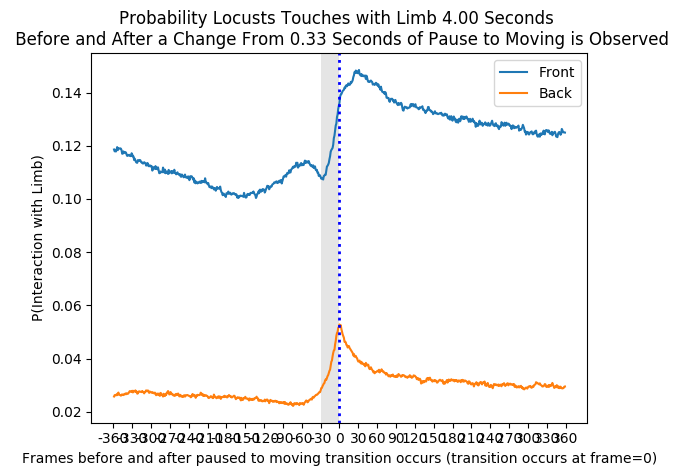



  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19868/323578 [00:00<00:01, 198675.45it/s]

 12%|█▏        | 38417/323578 [00:00<00:01, 194526.43it/s]

 19%|█▉        | 61034/323578 [00:00<00:01, 202270.17it/s]

 25%|██▍       | 80122/323578 [00:00<00:01, 198637.67it/s]

 29%|██▉       | 95296/323578 [00:00<00:01, 179450.71it/s]

 37%|███▋      | 118453/323578 [00:00<00:01, 192444.43it/s]

 42%|████▏     | 135911/323578 [00:00<00:01, 168545.99it/s]

 48%|████▊     | 153798/323578 [00:00<00:00, 171292.57it/s]

 53%|█████▎    | 170439/323578 [00:00<00:00, 169410.54it/s]



0


 59%|█████▉    | 191302/323578 [00:01<00:00, 179535.40it/s]

 66%|██████▌   | 212219/323578 [00:01<00:00, 187504.52it/s]

 71%|███████▏  | 231011/323578 [00:01<00:00, 185846.83it/s]

 80%|███████▉  | 257479/323578 [00:01<00:00, 204081.67it/s]

 86%|████████▌ | 278837/323578 [00:01<00:00, 206259.25it/s]

 93%|█████████▎| 302057/323578 [00:01<00:00, 212198.65it/s]

100%|██████████| 323578/323578 [00:01<00:00, 199482.02it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23893/323578 [00:00<00:01, 238929.66it/s]

 15%|█▌        | 49186/323578 [00:00<00:01, 242962.67it/s]

 23%|██▎       | 73072/323578 [00:00<00:01, 241716.69it/s]

 31%|███       | 98879/323578 [00:00<00:00, 246400.75it/s]

 39%|███▉      | 125937/323578 [00:00<00:00, 253186.99it/s]

 48%|████▊     | 156000/323578 [00:00<00:00, 265767.36it/s]

 57%|█████▋    | 186030/323578 [00:00<00:00, 275262.24it/s]

 65%|██████▌   | 211824/323578 [00:00<00:00, 233887.04it/s]

 74%|███████▎  | 237976/323578 [00:00<00:00, 

1




  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 24868/323578 [00:00<00:01, 243386.35it/s]

 16%|█▌        | 50327/323578 [00:00<00:01, 246640.71it/s]

 22%|██▏       | 72163/323578 [00:00<00:01, 235176.12it/s]

 30%|██▉       | 96188/323578 [00:00<00:00, 236673.70it/s]

 37%|███▋      | 119339/323578 [00:00<00:00, 235099.10it/s]

 43%|████▎     | 138821/323578 [00:00<00:00, 212563.23it/s]

 49%|████▉     | 158247/323578 [00:00<00:00, 204975.89it/s]

 55%|█████▍    | 177118/323578 [00:00<00:00, 195278.30it/s]

 60%|██████    | 195604/323578 [00:00<00:00, 174178.39it/s]

 67%|██████▋   | 216410/323578 [00:01<00:00, 183124.63it/s]

 73%|███████▎  | 235861/323578 [00:01<00:00, 186212.77it/s]

 80%|████████  | 259536/323578 [00:01<00:00, 197404.05it/s]

 86%|████████▋ | 279423/323578 [00:01<00:00, 180218.21it/s]

 92%|█████████▏| 297838/323578 [00:01<00:00, 172837.03it/s]

 97%|█████████▋| 315461/323578 [00:01<00:00, 166350.03it/s]

100%|██████████| 323578/323578 [00:01<00:00

2
3




 58%|█████▊    | 187892/323578 [00:01<00:00, 136415.39it/s]

 63%|██████▎   | 203386/323578 [00:01<00:01, 115421.75it/s]

 67%|██████▋   | 216780/323578 [00:01<00:00, 115606.21it/s]

 72%|███████▏  | 234318/323578 [00:01<00:00, 128772.05it/s]

 77%|███████▋  | 248579/323578 [00:01<00:00, 122065.06it/s]

 82%|████████▏ | 264595/323578 [00:01<00:00, 131443.76it/s]

 86%|████████▌ | 278674/323578 [00:01<00:00, 130247.47it/s]

 91%|█████████ | 293114/323578 [00:02<00:00, 134192.71it/s]

 97%|█████████▋| 313220/323578 [00:02<00:00, 149064.75it/s]

100%|██████████| 323578/323578 [00:02<00:00, 146012.15it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15888/323578 [00:00<00:01, 158876.74it/s]

 11%|█         | 35001/323578 [00:00<00:01, 166649.17it/s]

 17%|█▋        | 56048/323578 [00:00<00:01, 177078.58it/s]

 23%|██▎       | 74570/323578 [00:00<00:01, 179443.78it/s]

 28%|██▊       | 91419/323578 [00:00<00:01, 175589.61it/s]

 33%|███▎      | 108273/323578 [00:00<00:01,

4




 67%|██████▋   | 217621/323578 [00:01<00:00, 199199.24it/s]

 73%|███████▎  | 237756/323578 [00:01<00:00, 174787.77it/s]

 79%|███████▉  | 255928/323578 [00:01<00:00, 162586.79it/s]

 84%|████████▍ | 272843/323578 [00:01<00:00, 149252.40it/s]

 90%|█████████ | 292796/323578 [00:01<00:00, 161456.93it/s]

 96%|█████████▌| 310432/323578 [00:01<00:00, 165655.77it/s]

100%|██████████| 323578/323578 [00:01<00:00, 178097.94it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 17148/323578 [00:00<00:01, 171476.08it/s]

 11%|█         | 35545/323578 [00:00<00:01, 173662.60it/s]

 18%|█▊        | 57039/323578 [00:00<00:01, 184038.14it/s]

 24%|██▍       | 78304/323578 [00:00<00:01, 191779.06it/s]

 29%|██▉       | 94535/323578 [00:00<00:01, 181871.98it/s]

 34%|███▍      | 110429/323578 [00:00<00:01, 174326.18it/s]

 40%|████      | 130634/323578 [00:00<00:01, 181757.11it/s]

5




 46%|████▌     | 149336/323578 [00:00<00:00, 183303.51it/s]

 52%|█████▏    | 166857/323578 [00:00<00:00, 167018.02it/s]

 57%|█████▋    | 183272/323578 [00:01<00:00, 156578.13it/s]

 62%|██████▏   | 201844/323578 [00:01<00:00, 164312.50it/s]

 68%|██████▊   | 221315/323578 [00:01<00:00, 172385.71it/s]

 74%|███████▍  | 238696/323578 [00:01<00:00, 162333.07it/s]

 79%|███████▉  | 255462/323578 [00:01<00:00, 163893.94it/s]

 85%|████████▍ | 274084/323578 [00:01<00:00, 170008.28it/s]

 90%|█████████ | 291254/323578 [00:01<00:00, 164371.74it/s]

 95%|█████████▌| 307850/323578 [00:01<00:00, 163922.94it/s]

100%|██████████| 323578/323578 [00:01<00:00, 170544.83it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21693/323578 [00:00<00:01, 213411.26it/s]

 13%|█▎        | 41823/323578 [00:00<00:01, 209625.76it/s]

 20%|██        | 65473/323578 [00:00<00:01, 216783.55it/s]

 27%|██▋       | 87820/323578 [00:00<00:01, 217694.87it/s]

 33%|███▎      | 107188/323578 [00:00<00:01

6




 89%|████████▉ | 287463/323578 [00:01<00:00, 186983.74it/s]

 95%|█████████▌| 307853/323578 [00:01<00:00, 187085.70it/s]

100%|██████████| 323578/323578 [00:01<00:00, 185725.61it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18716/323578 [00:00<00:01, 186618.69it/s]

 10%|█         | 33228/323578 [00:00<00:01, 171871.06it/s]

 15%|█▍        | 47489/323578 [00:00<00:01, 161903.91it/s]

 18%|█▊        | 59734/323578 [00:00<00:01, 147633.27it/s]

 25%|██▌       | 80961/323578 [00:00<00:01, 162474.58it/s]

 29%|██▉       | 95069/323578 [00:00<00:01, 155401.51it/s]

 36%|███▌      | 115281/323578 [00:00<00:01, 166980.12it/s]

 42%|████▏     | 136031/323578 [00:00<00:01, 177370.11it/s]

 48%|████▊     | 153703/323578 [00:00<00:00, 175492.33it/s]

 53%|█████▎    | 170952/323578 [00:01<00:00, 173654.89it/s]

 59%|█████▉    | 190458/323578 [00:01<00:00, 179565.22it/s]

 65%|██████▍   | 209063/323578 [00:01<00:00, 181462.49it/s]

7




 70%|███████   | 227149/323578 [00:01<00:00, 149956.75it/s]

 77%|███████▋  | 248117/323578 [00:01<00:00, 163966.58it/s]

 82%|████████▏ | 266248/323578 [00:01<00:00, 168624.56it/s]

 88%|████████▊ | 283842/323578 [00:01<00:00, 169340.64it/s]

 97%|█████████▋| 312344/323578 [00:01<00:00, 192817.76it/s]

100%|██████████| 323578/323578 [00:01<00:00, 177880.60it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20569/323578 [00:00<00:01, 205682.84it/s]

 12%|█▏        | 38044/323578 [00:00<00:01, 195310.87it/s]

 19%|█▊        | 59946/323578 [00:00<00:01, 201865.53it/s]

 26%|██▌       | 82565/323578 [00:00<00:01, 208595.15it/s]

 33%|███▎      | 105811/323578 [00:00<00:01, 215223.52it/s]

 41%|████      | 133319/323578 [00:00<00:00, 230254.07it/s]

 49%|████▊     | 157081/323578 [00:00<00:00, 231866.27it/s]

 55%|█████▌    | 178859/323578 [00:00<00:00, 221043.92it/s]

 62%|██████▏   | 201620/323578 [00:00<00:00, 222972.90it/s]

 70%|██████▉   | 224979/323578 [00:01<00:00

8




 77%|███████▋  | 248365/323578 [00:01<00:00, 226645.45it/s]

 84%|████████▎ | 270738/323578 [00:01<00:00, 206749.59it/s]

 90%|█████████ | 291547/323578 [00:01<00:00, 199537.82it/s]

 99%|█████████▉| 319618/323578 [00:01<00:00, 218491.74it/s]

100%|██████████| 323578/323578 [00:01<00:00, 219967.60it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21229/323578 [00:00<00:01, 212272.49it/s]

 13%|█▎        | 41862/323578 [00:00<00:01, 209863.64it/s]

 18%|█▊        | 58673/323578 [00:00<00:01, 194127.10it/s]

 24%|██▍       | 77773/323578 [00:00<00:01, 191795.85it/s]

 28%|██▊       | 92146/323578 [00:00<00:01, 174307.92it/s]

 34%|███▍      | 109769/323578 [00:00<00:01, 174878.69it/s]

 39%|███▊      | 125060/323578 [00:00<00:01, 158836.45it/s]

 45%|████▍     | 145381/323578 [00:00<00:01, 169970.60it/s]

 50%|████▉     | 161718/323578 [00:00<00:00, 163769.78it/s]

 55%|█████▍    | 177920/323578 [00:01<00:00, 163240.58it/s]

9




 60%|██████    | 195279/323578 [00:01<00:00, 165497.19it/s]

 66%|██████▋   | 214531/323578 [00:01<00:00, 172771.42it/s]

 73%|███████▎  | 235219/323578 [00:01<00:00, 181760.96it/s]

 79%|███████▉  | 256465/323578 [00:01<00:00, 189585.78it/s]

 85%|████████▌ | 275572/323578 [00:01<00:00, 188967.14it/s]

 92%|█████████▏| 298351/323578 [00:01<00:00, 199148.55it/s]

100%|██████████| 323578/323578 [00:01<00:00, 187722.84it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19622/323578 [00:00<00:01, 196218.32it/s]

 12%|█▏        | 39765/323578 [00:00<00:01, 197752.09it/s]

 19%|█▉        | 62134/323578 [00:00<00:01, 204443.34it/s]

 25%|██▌       | 81294/323578 [00:00<00:01, 199975.70it/s]

 31%|███       | 100596/323578 [00:00<00:01, 197834.94it/s]

 37%|███▋      | 119212/323578 [00:00<00:01, 192805.84it/s]

10




 43%|████▎     | 140271/323578 [00:00<00:00, 197817.28it/s]

 49%|████▉     | 158514/323578 [00:00<00:00, 178418.51it/s]

 54%|█████▍    | 175840/323578 [00:00<00:00, 176837.23it/s]

 60%|█████▉    | 193026/323578 [00:01<00:00, 166598.11it/s]

 65%|██████▍   | 209459/323578 [00:01<00:00, 153917.36it/s]

 69%|██████▉   | 224884/323578 [00:01<00:00, 147632.91it/s]

 74%|███████▍  | 239725/323578 [00:01<00:00, 133575.50it/s]

 79%|███████▉  | 257013/323578 [00:01<00:00, 142316.80it/s]

 87%|████████▋ | 280433/323578 [00:01<00:00, 161300.91it/s]

 92%|█████████▏| 297684/323578 [00:01<00:00, 163123.58it/s]

 98%|█████████▊| 317945/323578 [00:01<00:00, 173251.67it/s]

100%|██████████| 323578/323578 [00:01<00:00, 174683.35it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21429/323578 [00:00<00:01, 214289.69it/s]

 12%|█▏        | 38038/323578 [00:00<00:01, 197126.86it/s]

 18%|█▊        | 57505/323578 [00:00<00:01, 196383.09it/s]

 25%|██▌       | 81541/323578 [00:00<00:01

11




 87%|████████▋ | 281250/323578 [00:01<00:00, 207688.91it/s]

 93%|█████████▎| 302119/323578 [00:01<00:00, 195835.69it/s]

 99%|█████████▉| 321912/323578 [00:01<00:00, 186153.92it/s]

100%|██████████| 323578/323578 [00:01<00:00, 213500.17it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 24705/323578 [00:00<00:01, 247049.65it/s]

 16%|█▌        | 50639/323578 [00:00<00:01, 250581.39it/s]

 21%|██        | 66747/323578 [00:00<00:01, 212832.67it/s]

 26%|██▌       | 83032/323578 [00:00<00:01, 194887.80it/s]

 31%|███       | 99990/323578 [00:00<00:01, 186536.07it/s]

 37%|███▋      | 120611/323578 [00:00<00:01, 190909.04it/s]

 42%|████▏     | 137359/323578 [00:00<00:01, 181576.54it/s]

 49%|████▊     | 157695/323578 [00:00<00:00, 187604.60it/s]

 55%|█████▌    | 178656/323578 [00:00<00:00, 193703.95it/s]

 61%|██████    | 197355/323578 [00:01<00:00, 186902.57it/s]

 67%|██████▋   | 215627/323578 [00:01<00:00, 181713.82it/s]

 75%|███████▍  | 242101/323578 [00:01<00:00,

12




 83%|████████▎ | 267992/323578 [00:01<00:00, 213570.14it/s]

 91%|█████████ | 293467/323578 [00:01<00:00, 223211.66it/s]

 98%|█████████▊| 316887/323578 [00:01<00:00, 226397.94it/s]

100%|██████████| 323578/323578 [00:01<00:00, 207642.77it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18705/323578 [00:00<00:01, 187046.61it/s]

 14%|█▍        | 46754/323578 [00:00<00:01, 207816.23it/s]

 20%|██        | 65466/323578 [00:00<00:01, 200466.45it/s]

 27%|██▋       | 87395/323578 [00:00<00:01, 205764.87it/s]

 32%|███▏      | 103911/323578 [00:00<00:01, 187318.78it/s]

 37%|███▋      | 120120/323578 [00:00<00:01, 166201.75it/s]

 42%|████▏     | 135414/323578 [00:00<00:01, 156824.04it/s]

 47%|████▋     | 152881/323578 [00:00<00:01, 161781.80it/s]

 53%|█████▎    | 171019/323578 [00:00<00:00, 167201.27it/s]

 59%|█████▊    | 189908/323578 [00:01<00:00, 173166.19it/s]

 64%|██████▍   | 207050/323578 [00:01<00:00, 169755.14it/s]

 69%|██████▉   | 223918/323578 [00:01<00:00

13


 74%|███████▍  | 240189/323578 [00:01<00:00, 156395.96it/s]

 83%|████████▎ | 269222/323578 [00:01<00:00, 181516.06it/s]

 92%|█████████▏| 299060/323578 [00:01<00:00, 205682.88it/s]

100%|██████████| 323578/323578 [00:01<00:00, 195516.03it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20654/323578 [00:00<00:01, 206218.65it/s]

 12%|█▏        | 40337/323578 [00:00<00:01, 203308.04it/s]

 16%|█▌        | 51783/323578 [00:00<00:01, 164457.65it/s]

 21%|██        | 68343/323578 [00:00<00:01, 164797.46it/s]

 28%|██▊       | 89911/323578 [00:00<00:01, 177348.68it/s]

 35%|███▌      | 114245/323578 [00:00<00:01, 193053.88it/s]

 42%|████▏     | 137412/323578 [00:00<00:00, 203214.11it/s]

 48%|████▊     | 156886/323578 [00:00<00:01, 164945.28it/s]

 54%|█████▍    | 175428/323578 [00:00<00:00, 170595.79it/s]

 60%|█████▉    | 193890/323578 [00:01<00:00, 173311.85it/s]

 65%|██████▌   | 211548/323578 [00:01<00:00, 162185.25it/s]



14


 71%|███████   | 230245/323578 [00:01<00:00, 168901.00it/s]

 79%|███████▊  | 254255/323578 [00:01<00:00, 185393.08it/s]

 88%|████████▊ | 284006/323578 [00:01<00:00, 209023.07it/s]

 95%|█████████▍| 306413/323578 [00:01<00:00, 203631.41it/s]

100%|██████████| 323578/323578 [00:01<00:00, 189631.87it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18097/323578 [00:00<00:01, 180964.56it/s]

 13%|█▎        | 41212/323578 [00:00<00:01, 193572.00it/s]

 19%|█▉        | 61271/323578 [00:00<00:01, 195623.71it/s]

 25%|██▌       | 82370/323578 [00:00<00:01, 199072.77it/s]

 32%|███▏      | 104536/323578 [00:00<00:01, 205322.11it/s]

 38%|███▊      | 122173/323578 [00:00<00:01, 195349.54it/s]

 44%|████▍     | 143318/323578 [00:00<00:00, 199204.19it/s]

 50%|█████     | 161910/323578 [00:00<00:00, 194703.64it/s]

 56%|█████▋    | 182218/323578 [00:00<00:00, 195304.82it/s]

 62%|██████▏   | 201561/323578 [00:01<00:00, 193119.08it/s]

 68%|██████▊   | 220434/323578 [00:01<00:00, 

15
16


  6%|▌         | 18275/323578 [00:00<00:01, 182746.25it/s]

 11%|█         | 35116/323578 [00:00<00:01, 178195.39it/s]

 15%|█▍        | 48455/323578 [00:00<00:01, 161880.97it/s]

 20%|█▉        | 63201/323578 [00:00<00:01, 157266.04it/s]

 23%|██▎       | 75877/323578 [00:00<00:01, 146673.45it/s]

 29%|██▊       | 92989/323578 [00:00<00:01, 153239.13it/s]

 34%|███▎      | 108665/323578 [00:00<00:01, 154278.39it/s]

 40%|███▉      | 129348/323578 [00:00<00:01, 167008.06it/s]

 45%|████▍     | 145445/323578 [00:00<00:01, 164277.35it/s]

 50%|████▉     | 161461/323578 [00:01<00:01, 155207.08it/s]

 55%|█████▍    | 176797/323578 [00:01<00:00, 154034.52it/s]

 59%|█████▉    | 192073/323578 [00:01<00:00, 149412.79it/s]

 64%|██████▍   | 206956/323578 [00:01<00:00, 144255.01it/s]

 68%|██████▊   | 221379/323578 [00:01<00:00, 128425.12it/s]

 73%|███████▎  | 236425/323578 [00:01<00:00, 134325.52it/s]

 77%|███████▋  | 250153/323578 [00:01<00:00, 131690.04it/s]

 83%|████████▎ | 268374/323578

17




 78%|███████▊  | 252774/323578 [00:01<00:00, 180654.28it/s]

 85%|████████▍ | 273513/323578 [00:01<00:00, 187921.65it/s]

 92%|█████████▏| 299082/323578 [00:01<00:00, 203512.23it/s]

 99%|█████████▉| 319999/323578 [00:01<00:00, 202717.40it/s]

100%|██████████| 323578/323578 [00:01<00:00, 190523.03it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  9%|▉         | 29966/323578 [00:00<00:00, 299651.71it/s]

 17%|█▋        | 54557/323578 [00:00<00:00, 281213.25it/s]

 26%|██▌       | 83364/323578 [00:00<00:00, 283234.24it/s]

 33%|███▎      | 107440/323578 [00:00<00:00, 268884.34it/s]

 41%|████      | 131504/323578 [00:00<00:00, 257771.86it/s]

 48%|████▊     | 155001/323578 [00:00<00:00, 250478.13it/s]

 55%|█████▍    | 176769/323578 [00:00<00:00, 230391.59it/s]

 61%|██████    | 197829/323578 [00:00<00:00, 215460.18it/s]

 67%|██████▋   | 218186/323578 [00:00<00:00, 203661.25it/s]

 74%|███████▎  | 237853/323578 [00:01<00:00, 200881.02it/s]

 80%|████████  | 259134/323578 [00:01<00:0

18




 92%|█████████▏| 298793/323578 [00:01<00:00, 195255.05it/s]

 99%|█████████▊| 318752/323578 [00:01<00:00, 196509.80it/s]

100%|██████████| 323578/323578 [00:01<00:00, 219104.25it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15298/323578 [00:00<00:02, 152978.69it/s]

  8%|▊         | 26476/323578 [00:00<00:02, 136295.08it/s]

 12%|█▏        | 38878/323578 [00:00<00:02, 132363.80it/s]

 18%|█▊        | 59744/323578 [00:00<00:01, 148287.94it/s]

 23%|██▎       | 74320/323578 [00:00<00:01, 147519.16it/s]

19




 27%|██▋       | 87336/323578 [00:00<00:01, 141842.65it/s]

 31%|███       | 100163/323578 [00:00<00:01, 135737.09it/s]

 35%|███▌      | 113420/323578 [00:00<00:01, 134769.95it/s]

 41%|████      | 131228/323578 [00:00<00:01, 144584.53it/s]

 45%|████▍     | 145512/323578 [00:01<00:01, 144055.30it/s]

 50%|█████     | 163027/323578 [00:01<00:01, 152158.23it/s]

 57%|█████▋    | 182849/323578 [00:01<00:00, 163559.42it/s]

 62%|██████▏   | 199452/323578 [00:01<00:00, 162955.34it/s]

 69%|██████▊   | 221796/323578 [00:01<00:00, 177344.64it/s]

 75%|███████▍  | 241522/323578 [00:01<00:00, 182852.35it/s]

 82%|████████▏ | 266402/323578 [00:01<00:00, 198623.19it/s]

 90%|████████▉ | 290993/323578 [00:01<00:00, 210753.41it/s]

 97%|█████████▋| 313530/323578 [00:01<00:00, 213795.84it/s]

100%|██████████| 323578/323578 [00:01<00:00, 173642.36it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18777/323578 [00:00<00:01, 187769.28it/s]

 10%|▉         | 32343/323578 [00:00<00:0

20
21




  6%|▌         | 19716/323578 [00:00<00:01, 197155.02it/s]

 13%|█▎        | 41735/323578 [00:00<00:01, 203542.04it/s]

 19%|█▊        | 60416/323578 [00:00<00:01, 198215.86it/s]

 25%|██▍       | 80741/323578 [00:00<00:01, 199699.07it/s]

 32%|███▏      | 104131/323578 [00:00<00:01, 207425.49it/s]

 40%|███▉      | 129080/323578 [00:00<00:00, 218475.51it/s]

 46%|████▋     | 150301/323578 [00:00<00:00, 216556.31it/s]

 53%|█████▎    | 172512/323578 [00:00<00:00, 218192.33it/s]

 62%|██████▏   | 201799/323578 [00:00<00:00, 236263.92it/s]

 71%|███████▏  | 231136/323578 [00:01<00:00, 250916.06it/s]

 80%|███████▉  | 258662/323578 [00:01<00:00, 257753.83it/s]

 89%|████████▉ | 288925/323578 [00:01<00:00, 269751.82it/s]

 98%|█████████▊| 318497/323578 [00:01<00:00, 277049.59it/s]

100%|██████████| 323578/323578 [00:01<00:00, 244944.27it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21235/323578 [00:00<00:01, 212345.65it/s]

 12%|█▏        | 39391/323578 [00:00<00:01, 

22




 77%|███████▋  | 250699/323578 [00:01<00:00, 175921.86it/s]

 83%|████████▎ | 269237/323578 [00:01<00:00, 167338.31it/s]

 89%|████████▉ | 289151/323578 [00:01<00:00, 175757.37it/s]

 95%|█████████▍| 307364/323578 [00:01<00:00, 169321.33it/s]

100%|██████████| 323578/323578 [00:01<00:00, 174859.46it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  9%|▉         | 28422/323578 [00:00<00:01, 284215.53it/s]

 16%|█▋        | 53261/323578 [00:00<00:00, 272426.79it/s]

 24%|██▍       | 79144/323578 [00:00<00:00, 268199.57it/s]

 32%|███▏      | 105151/323578 [00:00<00:00, 265707.13it/s]

 41%|████      | 133231/323578 [00:00<00:00, 270061.17it/s]

 49%|████▊     | 157555/323578 [00:00<00:00, 261411.31it/s]

 56%|█████▌    | 180458/323578 [00:00<00:00, 244139.43it/s]

 64%|██████▎   | 205869/323578 [00:00<00:00, 247047.19it/s]

 71%|███████   | 229157/323578 [00:00<00:00, 237757.30it/s]

 79%|███████▉  | 255609/323578 [00:01<00:00, 245199.27it/s]

 87%|████████▋ | 281193/323578 [00:01<00:0

23
24




  5%|▌         | 16277/323578 [00:00<00:01, 160616.50it/s]

 11%|█▏        | 36925/323578 [00:00<00:01, 171482.98it/s]

 17%|█▋        | 56226/323578 [00:00<00:01, 177419.36it/s]

 21%|██        | 68654/323578 [00:00<00:01, 153833.58it/s]

 27%|██▋       | 88860/323578 [00:00<00:01, 165697.75it/s]

 33%|███▎      | 107766/323578 [00:00<00:01, 171749.95it/s]

 40%|███▉      | 128592/323578 [00:00<00:01, 181282.81it/s]

 46%|████▌     | 147508/323578 [00:00<00:00, 183576.00it/s]

 51%|█████▏    | 166089/323578 [00:00<00:00, 183860.88it/s]

 57%|█████▋    | 184101/323578 [00:01<00:00, 176391.41it/s]

 62%|██████▏   | 201543/323578 [00:01<00:00, 166609.05it/s]

 68%|██████▊   | 220672/323578 [00:01<00:00, 173316.82it/s]

 74%|███████▎  | 238055/323578 [00:01<00:00, 171647.32it/s]

 79%|███████▉  | 255260/323578 [00:01<00:00, 161424.19it/s]

 84%|████████▍ | 272037/323578 [00:01<00:00, 163271.20it/s]

 91%|█████████ | 293074/323578 [00:01<00:00, 175012.67it/s]

 99%|█████████▊| 319327/323

25




100%|██████████| 323578/323578 [00:01<00:00, 189772.35it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15034/323578 [00:00<00:02, 150336.20it/s]

 10%|▉         | 31412/323578 [00:00<00:01, 152961.63it/s]

 14%|█▍        | 46747/323578 [00:00<00:01, 152318.66it/s]

 19%|█▉        | 61572/323578 [00:00<00:01, 150786.02it/s]

 24%|██▍       | 77047/323578 [00:00<00:01, 151952.91it/s]

 30%|██▉       | 96133/323578 [00:00<00:01, 161849.74it/s]

 35%|███▍      | 112627/323578 [00:00<00:01, 161808.94it/s]

 42%|████▏     | 135221/323578 [00:00<00:01, 176869.46it/s]

 50%|█████     | 163151/323578 [00:00<00:00, 198733.69it/s]

 60%|█████▉    | 193503/323578 [00:01<00:00, 221693.52it/s]

 69%|██████▉   | 223912/323578 [00:01<00:00, 241307.94it/s]

 79%|███████▊  | 254171/323578 [00:01<00:00, 256915.81it/s]

 88%|████████▊ | 284268/323578 [00:01<00:00, 268713.72it/s]

 97%|█████████▋| 314552/323578 [00:01<00:00, 278114.56it/s]

100%|██████████| 323578/323578 [00:01<00:00, 

26
27


 14%|█▍        | 45683/323578 [00:00<00:01, 234869.84it/s]

 19%|█▊        | 60427/323578 [00:00<00:01, 197219.83it/s]

 24%|██▍       | 78971/323578 [00:00<00:01, 193530.00it/s]

 29%|██▉       | 93046/323578 [00:00<00:01, 173509.54it/s]

 33%|███▎      | 107165/323578 [00:00<00:01, 162357.94it/s]

 39%|███▉      | 125635/323578 [00:00<00:01, 168470.81it/s]

 48%|████▊     | 155209/323578 [00:00<00:00, 193444.44it/s]

 57%|█████▋    | 184245/323578 [00:00<00:00, 214969.78it/s]

 66%|██████▌   | 213049/323578 [00:01<00:00, 232677.31it/s]

 75%|███████▍  | 242621/323578 [00:01<00:00, 248574.86it/s]

 84%|████████▍ | 272755/323578 [00:01<00:00, 262355.99it/s]

 94%|█████████▎| 302990/323578 [00:01<00:00, 273196.51it/s]

100%|██████████| 323578/323578 [00:01<00:00, 235396.27it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22698/323578 [00:00<00:01, 223253.73it/s]

 13%|█▎        | 42367/323578 [00:00<00:01, 214558.62it/s]

 20%|█▉        | 63931/323578 [00:00<00:01, 214

28




 92%|█████████▏| 298809/323578 [00:01<00:00, 182474.68it/s]

100%|██████████| 323578/323578 [00:01<00:00, 198070.31it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16444/323578 [00:00<00:01, 164435.06it/s]

  8%|▊         | 27472/323578 [00:00<00:02, 143319.79it/s]

 14%|█▍        | 44564/323578 [00:00<00:01, 150615.53it/s]

 19%|█▉        | 62904/323578 [00:00<00:01, 158325.97it/s]

 25%|██▍       | 79277/323578 [00:00<00:01, 159907.94it/s]

 30%|███       | 98683/323578 [00:00<00:01, 168819.61it/s]

 36%|███▌      | 116678/323578 [00:00<00:01, 171085.52it/s]

 42%|████▏     | 134924/323578 [00:00<00:01, 173083.38it/s]

 47%|████▋     | 151461/323578 [00:00<00:01, 169062.93it/s]

 52%|█████▏    | 169659/323578 [00:01<00:00, 172739.96it/s]

 58%|█████▊    | 186589/323578 [00:01<00:00, 162854.63it/s]

 63%|██████▎   | 205255/323578 [00:01<00:00, 169333.04it/s]

 69%|██████▊   | 222168/323578 [00:01<00:00, 151252.64it/s]

 75%|███████▌  | 243274/323578 [00:01<00:00, 

29
30




  7%|▋         | 24260/323578 [00:00<00:01, 242596.76it/s]

 12%|█▏        | 38807/323578 [00:00<00:01, 202112.07it/s]

 18%|█▊        | 58271/323578 [00:00<00:01, 198817.39it/s]

 25%|██▌       | 82046/323578 [00:00<00:01, 209088.44it/s]

 34%|███▎      | 108569/323578 [00:00<00:00, 223264.58it/s]

 39%|███▉      | 127579/323578 [00:00<00:01, 189410.15it/s]

 45%|████▍     | 145083/323578 [00:00<00:00, 180244.15it/s]

 51%|█████     | 164352/323578 [00:00<00:00, 182182.21it/s]

 57%|█████▋    | 184008/323578 [00:00<00:00, 185469.25it/s]

 62%|██████▏   | 202126/323578 [00:01<00:00, 176600.54it/s]

 70%|███████   | 226894/323578 [00:01<00:00, 193234.83it/s]

 76%|███████▌  | 246538/323578 [00:01<00:00, 159867.74it/s]

 82%|████████▏ | 266694/323578 [00:01<00:00, 169911.75it/s]

 90%|█████████ | 292555/323578 [00:01<00:00, 189399.75it/s]

100%|█████████▉| 322647/323578 [00:01<00:00, 213089.92it/s]

100%|██████████| 323578/323578 [00:01<00:00, 196891.61it/s]

  0%|          | 0/323578 

31




 95%|█████████▍| 307303/323578 [00:02<00:00, 178628.97it/s]

100%|██████████| 323578/323578 [00:02<00:00, 155104.81it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 26280/323578 [00:00<00:01, 262796.49it/s]

 17%|█▋        | 55421/323578 [00:00<00:00, 270770.18it/s]

 26%|██▋       | 85163/323578 [00:00<00:00, 278247.84it/s]

 36%|███▌      | 115193/323578 [00:00<00:00, 284513.14it/s]

 45%|████▍     | 145369/323578 [00:00<00:00, 289474.08it/s]

 54%|█████▍    | 175365/323578 [00:00<00:00, 292540.92it/s]

 64%|██████▎   | 206167/323578 [00:00<00:00, 297017.44it/s]

 73%|███████▎  | 236226/323578 [00:00<00:00, 298078.02it/s]

 82%|████████▏ | 264567/323578 [00:00<00:00, 291754.12it/s]

 91%|█████████ | 294550/323578 [00:01<00:00, 294128.23it/s]

100%|██████████| 323578/323578 [00:01<00:00, 294437.86it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18058/323578 [00:00<00:01, 180575.44it/s]

 12%|█▏        | 37442/323578 [00:00<00:01, 184329.52it/s]



32
33




 29%|██▉       | 94589/323578 [00:00<00:01, 171235.55it/s]

 36%|███▋      | 117442/323578 [00:00<00:01, 185161.80it/s]

 43%|████▎     | 139490/323578 [00:00<00:00, 194508.63it/s]

 52%|█████▏    | 169408/323578 [00:00<00:00, 217317.08it/s]

 62%|██████▏   | 199590/323578 [00:00<00:00, 237242.32it/s]

 71%|███████   | 230021/323578 [00:01<00:00, 254037.81it/s]

 81%|████████  | 260768/323578 [00:01<00:00, 268009.00it/s]

 90%|█████████ | 291388/323578 [00:01<00:00, 278426.45it/s]

100%|█████████▉| 322195/323578 [00:01<00:00, 286700.11it/s]

100%|██████████| 323578/323578 [00:01<00:00, 244293.54it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20669/323578 [00:00<00:01, 204890.09it/s]

 12%|█▏        | 39317/323578 [00:00<00:01, 198045.62it/s]

 19%|█▊        | 60089/323578 [00:00<00:01, 199213.03it/s]

 24%|██▍       | 78169/323578 [00:00<00:01, 193306.02it/s]

 30%|███       | 97488/323578 [00:00<00:01, 193270.43it/s]

 36%|███▋      | 117923/323578 [00:00<00:01, 

34




 73%|███████▎  | 237791/323578 [00:01<00:00, 231043.29it/s]

 83%|████████▎ | 268167/323578 [00:01<00:00, 248919.50it/s]

 91%|█████████ | 294335/323578 [00:01<00:00, 243838.88it/s]

100%|██████████| 323578/323578 [00:01<00:00, 223681.89it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12728/323578 [00:00<00:02, 127276.78it/s]

  8%|▊         | 26290/323578 [00:00<00:02, 128613.97it/s]

 12%|█▏        | 39543/323578 [00:00<00:02, 129763.12it/s]

 17%|█▋        | 56398/323578 [00:00<00:01, 139385.58it/s]

 21%|██        | 67486/323578 [00:00<00:02, 125047.97it/s]

 25%|██▌       | 80900/323578 [00:00<00:01, 127642.99it/s]

 29%|██▊       | 92475/323578 [00:00<00:01, 119442.89it/s]

 35%|███▍      | 112147/323578 [00:00<00:01, 134764.81it/s]

 39%|███▉      | 125770/323578 [00:00<00:01, 129283.77it/s]

 43%|████▎     | 138849/323578 [00:01<00:01, 129517.10it/s]

 47%|████▋     | 153219/323578 [00:01<00:01, 133468.89it/s]

35




 52%|█████▏    | 166670/323578 [00:01<00:01, 126655.18it/s]

 56%|█████▌    | 180416/323578 [00:01<00:01, 129713.12it/s]

 60%|█████▉    | 193508/323578 [00:01<00:01, 129902.29it/s]

 65%|██████▌   | 211305/323578 [00:01<00:00, 140673.26it/s]

 70%|██████▉   | 225690/323578 [00:01<00:00, 134861.86it/s]

 76%|███████▌  | 244541/323578 [00:01<00:00, 147449.66it/s]

 83%|████████▎ | 267760/323578 [00:01<00:00, 165577.44it/s]

 88%|████████▊ | 285427/323578 [00:02<00:00, 154091.32it/s]

 95%|█████████▌| 307764/323578 [00:02<00:00, 169045.50it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147976.29it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 24250/323578 [00:00<00:01, 242492.72it/s]

 16%|█▌        | 51170/323578 [00:00<00:01, 249931.15it/s]

 23%|██▎       | 73761/323578 [00:00<00:01, 242203.59it/s]

 31%|███       | 100524/323578 [00:00<00:00, 249309.24it/s]

 40%|████      | 130229/323578 [00:00<00:00, 261937.98it/s]

 49%|████▉     | 157853/323578 [00:00<00:0

36




  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19393/323578 [00:00<00:01, 193927.87it/s]

 13%|█▎        | 41514/323578 [00:00<00:01, 201378.30it/s]

 20%|██        | 66158/323578 [00:00<00:01, 213065.73it/s]

 29%|██▊       | 92845/323578 [00:00<00:01, 226782.14it/s]

 38%|███▊      | 122891/323578 [00:00<00:00, 244788.92it/s]

 47%|████▋     | 152981/323578 [00:00<00:00, 259293.33it/s]

 57%|█████▋    | 183264/323578 [00:00<00:00, 270979.71it/s]

 66%|██████▌   | 213341/323578 [00:00<00:00, 279277.89it/s]

 75%|███████▍  | 242206/323578 [00:00<00:00, 282024.87it/s]

 84%|████████▍ | 272245/323578 [00:01<00:00, 287292.33it/s]

 94%|█████████▎| 302588/323578 [00:01<00:00, 291950.35it/s]

100%|██████████| 323578/323578 [00:01<00:00, 276409.79it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23987/323578 [00:00<00:01, 239866.80it/s]

 14%|█▎        | 44441/323578 [00:00<00:01, 227461.67it/s]

 19%|█▊        | 60264/323578 [00:00<00:01, 199532.50it/s]

 2

37
38




 44%|████▎     | 141251/323578 [00:00<00:00, 185142.71it/s]

 49%|████▉     | 158778/323578 [00:00<00:00, 182048.79it/s]

 54%|█████▍    | 176175/323578 [00:00<00:00, 178390.00it/s]

 61%|██████    | 197049/323578 [00:01<00:00, 184967.49it/s]

 67%|██████▋   | 215224/323578 [00:01<00:00, 181436.76it/s]

 73%|███████▎  | 235007/323578 [00:01<00:00, 185174.69it/s]

 79%|███████▊  | 254073/323578 [00:01<00:00, 186785.59it/s]

 87%|████████▋ | 280923/323578 [00:01<00:00, 205551.92it/s]

 95%|█████████▍| 305913/323578 [00:01<00:00, 217110.18it/s]

100%|██████████| 323578/323578 [00:01<00:00, 201402.85it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20579/323578 [00:00<00:01, 205785.78it/s]

 12%|█▏        | 37431/323578 [00:00<00:01, 192628.20it/s]

 20%|█▉        | 63717/323578 [00:00<00:01, 209412.02it/s]

 24%|██▍       | 78148/323578 [00:00<00:01, 174466.97it/s]

 31%|███       | 99036/323578 [00:00<00:01, 183537.26it/s]

 37%|███▋      | 118322/323578 [00:00<00:01,

39




 97%|█████████▋| 313316/323578 [00:01<00:00, 191747.11it/s]

100%|██████████| 323578/323578 [00:01<00:00, 187699.71it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 26331/323578 [00:00<00:01, 263305.23it/s]

 15%|█▌        | 48751/323578 [00:00<00:01, 250212.20it/s]

 20%|██        | 66174/323578 [00:00<00:01, 220472.67it/s]

 28%|██▊       | 90390/323578 [00:00<00:01, 224925.05it/s]

 34%|███▎      | 108486/323578 [00:00<00:01, 209644.01it/s]

 39%|███▉      | 125613/323578 [00:00<00:01, 166104.84it/s]

 44%|████▍     | 142515/323578 [00:00<00:01, 166930.96it/s]

40




 49%|████▉     | 158324/323578 [00:00<00:01, 145634.81it/s]

 53%|█████▎    | 172757/323578 [00:01<00:01, 120106.12it/s]

 57%|█████▋    | 185418/323578 [00:01<00:01, 110397.25it/s]

 61%|██████▏   | 198693/323578 [00:01<00:01, 115348.67it/s]

 66%|██████▋   | 214422/323578 [00:01<00:00, 125027.68it/s]

 70%|███████   | 227500/323578 [00:01<00:00, 122676.34it/s]

 75%|███████▌  | 243637/323578 [00:01<00:00, 132183.82it/s]

 81%|████████  | 262428/323578 [00:01<00:00, 145092.25it/s]

 86%|████████▋ | 279597/323578 [00:01<00:00, 152163.85it/s]

 92%|█████████▏| 297489/323578 [00:01<00:00, 159310.42it/s]

 97%|█████████▋| 313930/323578 [00:02<00:00, 157694.46it/s]

100%|██████████| 323578/323578 [00:02<00:00, 155816.97it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16858/323578 [00:00<00:01, 168576.95it/s]

 10%|█         | 33277/323578 [00:00<00:01, 166716.77it/s]

 15%|█▌        | 49076/323578 [00:00<00:01, 163997.51it/s]

 21%|██        | 67462/323578 [00:00<00:01

41
42




  6%|▌         | 18231/323578 [00:00<00:01, 182304.96it/s]

 11%|█         | 35555/323578 [00:00<00:01, 179486.52it/s]

 16%|█▌        | 52128/323578 [00:00<00:01, 173647.45it/s]

 23%|██▎       | 73187/323578 [00:00<00:01, 183289.97it/s]

 29%|██▊       | 92831/323578 [00:00<00:01, 187045.74it/s]

 34%|███▍      | 110192/323578 [00:00<00:01, 182800.57it/s]

 39%|███▉      | 127594/323578 [00:00<00:01, 179104.71it/s]

 45%|████▌     | 146724/323578 [00:00<00:00, 182595.40it/s]

 53%|█████▎    | 172691/323578 [00:00<00:00, 199297.89it/s]

 62%|██████▏   | 201826/323578 [00:01<00:00, 220165.83it/s]

 69%|██████▉   | 224363/323578 [00:01<00:00, 217926.30it/s]

 76%|███████▌  | 246525/323578 [00:01<00:00, 199473.95it/s]

 83%|████████▎ | 267092/323578 [00:01<00:00, 201052.31it/s]

 89%|████████▉ | 287595/323578 [00:01<00:00, 189048.08it/s]

 95%|█████████▍| 306925/323578 [00:01<00:00, 182616.77it/s]

100%|██████████| 323578/323578 [00:01<00:00, 194008.30it/s]

  0%|          | 0/323578 [

43


 89%|████████▉ | 288863/323578 [00:01<00:00, 291365.07it/s]

 98%|█████████▊| 317268/323578 [00:01<00:00, 266146.94it/s]

100%|██████████| 323578/323578 [00:01<00:00, 280541.54it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23392/323578 [00:00<00:01, 233917.43it/s]

 15%|█▌        | 49923/323578 [00:00<00:01, 242525.09it/s]

 23%|██▎       | 74002/323578 [00:00<00:01, 242001.49it/s]

 31%|███       | 100428/323578 [00:00<00:00, 248273.35it/s]

 39%|███▉      | 127353/323578 [00:00<00:00, 254212.95it/s]

 48%|████▊     | 154229/323578 [00:00<00:00, 258408.35it/s]

 55%|█████▍    | 177399/323578 [00:00<00:00, 234074.57it/s]

 62%|██████▏   | 199375/323578 [00:00<00:00, 221558.79it/s]

 68%|██████▊   | 220668/323578 [00:00<00:00, 215796.98it/s]

 75%|███████▍  | 241677/323578 [00:01<00:00, 194195.39it/s]

 82%|████████▏ | 265082/323578 [00:01<00:00, 203426.28it/s]

 88%|████████▊ | 285575/323578 [00:01<00:00, 202281.16it/s]

 95%|█████████▌| 308360/323578 [00:01<00:00,

44
45




 34%|███▍      | 110400/323578 [00:00<00:00, 276033.89it/s]

 40%|████      | 130883/323578 [00:00<00:00, 228800.60it/s]

 46%|████▋     | 150400/323578 [00:00<00:00, 217551.92it/s]

 56%|█████▌    | 179686/323578 [00:00<00:00, 235736.80it/s]

 65%|██████▍   | 209544/323578 [00:00<00:00, 251624.37it/s]

 74%|███████▎  | 238403/323578 [00:00<00:00, 261678.02it/s]

 83%|████████▎ | 268871/323578 [00:01<00:00, 273247.27it/s]

 92%|█████████▏| 298867/323578 [00:01<00:00, 280746.00it/s]

100%|██████████| 323578/323578 [00:01<00:00, 267926.79it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 25860/323578 [00:00<00:01, 258595.31it/s]

 16%|█▋        | 53339/323578 [00:00<00:01, 263247.77it/s]

 24%|██▍       | 76929/323578 [00:00<00:00, 254398.54it/s]

 32%|███▏      | 102623/323578 [00:00<00:00, 255153.58it/s]

 40%|████      | 130496/323578 [00:00<00:00, 261795.83it/s]

 47%|████▋     | 153016/323578 [00:00<00:00, 249624.37it/s]

 54%|█████▍    | 175113/323578 [00:00<00:0

46
47


 53%|█████▎    | 170616/323578 [00:00<00:00, 282253.95it/s]

 62%|██████▏   | 200422/323578 [00:00<00:00, 286816.39it/s]

 71%|███████▏  | 231103/323578 [00:00<00:00, 292533.69it/s]

 80%|███████▉  | 258779/323578 [00:00<00:00, 251541.67it/s]

 88%|████████▊ | 283839/323578 [00:01<00:00, 201238.32it/s]

 94%|█████████▍| 305497/323578 [00:01<00:00, 182321.56it/s]

100%|██████████| 323578/323578 [00:01<00:00, 232612.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21324/323578 [00:00<00:01, 213239.69it/s]

 12%|█▏        | 37703/323578 [00:00<00:01, 195528.24it/s]

 16%|█▌        | 51299/323578 [00:00<00:01, 172813.02it/s]

 21%|██▏       | 69515/323578 [00:00<00:01, 175513.54it/s]

 28%|██▊       | 91340/323578 [00:00<00:01, 185681.25it/s]

 33%|███▎      | 106827/323578 [00:00<00:01, 149679.39it/s]

 37%|███▋      | 120760/323578 [00:00<00:01, 139578.22it/s]

 41%|████▏     | 134131/323578 [00:00<00:01, 124821.55it/s]

 46%|████▋     | 150036/323578 [00:01<00:01, 1

48
49




  6%|▋         | 20676/323578 [00:00<00:01, 206758.72it/s]

 15%|█▌        | 49287/323578 [00:00<00:01, 225522.85it/s]

 22%|██▏       | 70306/323578 [00:00<00:01, 218671.96it/s]

 28%|██▊       | 90292/323578 [00:00<00:01, 211072.88it/s]

 33%|███▎      | 106805/323578 [00:00<00:01, 194812.09it/s]

 40%|████      | 129997/323578 [00:00<00:00, 204633.63it/s]

 46%|████▌     | 148497/323578 [00:00<00:00, 189614.33it/s]

 52%|█████▏    | 168784/323578 [00:00<00:00, 193404.77it/s]

 58%|█████▊    | 187335/323578 [00:00<00:00, 185055.82it/s]

 63%|██████▎   | 205365/323578 [00:01<00:00, 179909.28it/s]

 69%|██████▉   | 223054/323578 [00:01<00:00, 158713.48it/s]

 75%|███████▌  | 243831/323578 [00:01<00:00, 170811.37it/s]

 81%|████████  | 261346/323578 [00:01<00:00, 164517.40it/s]

 87%|████████▋ | 282923/323578 [00:01<00:00, 177139.64it/s]

 96%|█████████▌| 310852/323578 [00:01<00:00, 198971.17it/s]

100%|██████████| 323578/323578 [00:01<00:00, 196835.24it/s]

  0%|          | 0/323578 

50




 63%|██████▎   | 202878/323578 [00:01<00:00, 153438.73it/s]

 67%|██████▋   | 218283/323578 [00:01<00:00, 129094.59it/s]

 72%|███████▏  | 231893/323578 [00:01<00:00, 118988.82it/s]

 76%|███████▌  | 244823/323578 [00:01<00:00, 121905.13it/s]

 81%|████████  | 262405/323578 [00:01<00:00, 133291.87it/s]

 85%|████████▌ | 276411/323578 [00:01<00:00, 135252.00it/s]

 92%|█████████▏| 299244/323578 [00:02<00:00, 154096.97it/s]

100%|█████████▉| 322847/323578 [00:02<00:00, 172008.77it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149192.09it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20571/323578 [00:00<00:01, 202718.93it/s]

 13%|█▎        | 42306/323578 [00:00<00:01, 206897.07it/s]

 20%|█▉        | 63150/323578 [00:00<00:01, 207293.00it/s]

 24%|██▍       | 78614/323578 [00:00<00:01, 188014.38it/s]

 31%|███       | 99001/323578 [00:00<00:01, 192502.72it/s]

 36%|███▋      | 117645/323578 [00:00<00:01, 189753.92it/s]

 42%|████▏     | 135342/323578 [00:00<00:01,

51
52




 14%|█▍        | 45502/323578 [00:00<00:01, 232125.11it/s]

 22%|██▏       | 71005/323578 [00:00<00:01, 238551.40it/s]

 29%|██▉       | 93500/323578 [00:00<00:00, 234301.08it/s]

 34%|███▍      | 111335/323578 [00:00<00:00, 214146.10it/s]

 40%|████      | 130321/323578 [00:00<00:00, 205202.47it/s]

 47%|████▋     | 150828/323578 [00:00<00:00, 203467.87it/s]

 53%|█████▎    | 172135/323578 [00:00<00:00, 206255.02it/s]

 59%|█████▉    | 191559/323578 [00:00<00:00, 194861.78it/s]

 66%|██████▋   | 214738/323578 [00:01<00:00, 203518.24it/s]

 73%|███████▎  | 236705/323578 [00:01<00:00, 207193.84it/s]

 79%|███████▉  | 257162/323578 [00:01<00:00, 206303.08it/s]

 86%|████████▌ | 277610/323578 [00:01<00:00, 198373.96it/s]

 93%|█████████▎| 302013/323578 [00:01<00:00, 210169.72it/s]

100%|██████████| 323578/323578 [00:01<00:00, 213194.24it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22282/323578 [00:00<00:01, 222819.68it/s]

 14%|█▍        | 44863/323578 [00:00<00:01,

53




  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 17872/323578 [00:00<00:01, 178715.48it/s]

 11%|█         | 35138/323578 [00:00<00:01, 176852.55it/s]

 16%|█▌        | 51757/323578 [00:00<00:01, 173511.73it/s]

 22%|██▏       | 69623/323578 [00:00<00:01, 173765.61it/s]

 27%|██▋       | 87670/323578 [00:00<00:01, 174896.65it/s]

 32%|███▏      | 104909/323578 [00:00<00:01, 174136.84it/s]

 37%|███▋      | 120229/323578 [00:00<00:01, 146374.21it/s]

 41%|████▏     | 134153/323578 [00:00<00:01, 129372.44it/s]

 45%|████▌     | 146954/323578 [00:00<00:01, 124671.48it/s]

 54%|█████▍    | 174039/323578 [00:01<00:01, 148756.04it/s]

 63%|██████▎   | 203329/323578 [00:01<00:00, 174521.81it/s]

 72%|███████▏  | 231807/323578 [00:01<00:00, 196510.60it/s]

 80%|███████▉  | 258066/323578 [00:01<00:00, 212555.85it/s]

 89%|████████▉ | 287842/323578 [00:01<00:00, 232514.86it/s]

 98%|█████████▊| 318022/323578 [00:01<00:00, 249711.07it/s]

100%|██████████| 323578/323578 [00:01<00:00,

54
55




  9%|▉         | 29717/323578 [00:00<00:02, 137153.64it/s]

 15%|█▍        | 47929/323578 [00:00<00:01, 148124.35it/s]

 20%|█▉        | 63615/323578 [00:00<00:01, 150640.36it/s]

 26%|██▌       | 83633/323578 [00:00<00:01, 162719.74it/s]

 34%|███▍      | 111368/323578 [00:00<00:01, 185750.14it/s]

 43%|████▎     | 138240/323578 [00:00<00:00, 204711.68it/s]

 52%|█████▏    | 167588/323578 [00:00<00:00, 225141.00it/s]

 61%|██████    | 197727/323578 [00:00<00:00, 243630.11it/s]

 70%|███████   | 227781/323578 [00:01<00:00, 258302.68it/s]

 80%|███████▉  | 257779/323578 [00:01<00:00, 269535.18it/s]

 89%|████████▉ | 287744/323578 [00:01<00:00, 277912.15it/s]

 98%|█████████▊| 317285/323578 [00:01<00:00, 282938.44it/s]

100%|██████████| 323578/323578 [00:01<00:00, 244328.99it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21867/323578 [00:00<00:01, 218669.69it/s]

 16%|█▌        | 51295/323578 [00:00<00:01, 236932.35it/s]

 25%|██▍       | 79810/323578 [00:00<00:00, 2

56
57




 47%|████▋     | 150921/323578 [00:00<00:00, 220711.14it/s]

 55%|█████▌    | 178244/323578 [00:00<00:00, 234216.91it/s]

 64%|██████▍   | 206609/323578 [00:00<00:00, 247136.41it/s]

 73%|███████▎  | 235994/323578 [00:01<00:00, 259511.50it/s]

 82%|████████▏ | 264799/323578 [00:01<00:00, 267459.75it/s]

 91%|█████████ | 294695/323578 [00:01<00:00, 276189.96it/s]

100%|██████████| 323578/323578 [00:01<00:00, 249553.69it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20386/323578 [00:00<00:01, 203856.79it/s]

 11%|█         | 36284/323578 [00:00<00:01, 185959.75it/s]

 16%|█▌        | 51211/323578 [00:00<00:01, 173188.41it/s]

 21%|██▏       | 68991/323578 [00:00<00:01, 174546.25it/s]

 29%|██▉       | 93575/323578 [00:00<00:01, 191177.83it/s]

 35%|███▍      | 113152/323578 [00:00<00:01, 191385.87it/s]

 41%|████▏     | 133607/323578 [00:00<00:00, 195152.95it/s]

 47%|████▋     | 152762/323578 [00:00<00:00, 194056.70it/s]

 53%|█████▎    | 171236/323578 [00:00<00:00,

58


 68%|██████▊   | 220612/323578 [00:01<00:00, 141479.21it/s]

 73%|███████▎  | 235075/323578 [00:01<00:00, 142350.22it/s]

 77%|███████▋  | 249532/323578 [00:01<00:00, 140838.77it/s]

 84%|████████▍ | 271130/323578 [00:01<00:00, 157251.12it/s]

 90%|████████▉ | 290141/323578 [00:01<00:00, 165850.21it/s]

 97%|█████████▋| 313444/323578 [00:01<00:00, 181311.47it/s]

100%|██████████| 323578/323578 [00:01<00:00, 173508.98it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18055/323578 [00:00<00:01, 180548.88it/s]

 11%|█▏        | 36839/323578 [00:00<00:01, 182675.88it/s]

 18%|█▊        | 59338/323578 [00:00<00:01, 192159.38it/s]

59




 23%|██▎       | 72993/323578 [00:00<00:01, 170082.07it/s]

 29%|██▉       | 93629/323578 [00:00<00:01, 179551.29it/s]

 35%|███▍      | 112908/323578 [00:00<00:01, 183327.03it/s]

 40%|████      | 129986/323578 [00:00<00:01, 178764.00it/s]

 45%|████▌     | 146676/323578 [00:00<00:01, 172496.82it/s]

 50%|█████     | 163143/323578 [00:00<00:01, 151768.18it/s]

 56%|█████▌    | 181602/323578 [00:01<00:00, 159471.15it/s]

 61%|██████    | 197587/323578 [00:01<00:00, 157745.79it/s]

 66%|██████▌   | 213393/323578 [00:01<00:00, 145782.04it/s]

 75%|███████▌  | 242878/323578 [00:01<00:00, 171846.20it/s]

 82%|████████▏ | 266550/323578 [00:01<00:00, 186060.26it/s]

 90%|█████████ | 291599/323578 [00:01<00:00, 201617.46it/s]

 97%|█████████▋| 313756/323578 [00:01<00:00, 207214.38it/s]

100%|██████████| 323578/323578 [00:01<00:00, 188159.71it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 17935/323578 [00:00<00:01, 179347.61it/s]

 11%|█         | 35602/323578 [00:00<00:01

60
61




 28%|██▊       | 91521/323578 [00:00<00:01, 145330.94it/s]

 34%|███▎      | 108592/323578 [00:00<00:01, 152114.01it/s]

 38%|███▊      | 123008/323578 [00:00<00:01, 141553.49it/s]

 42%|████▏     | 136839/323578 [00:00<00:01, 140563.91it/s]

 47%|████▋     | 152379/323578 [00:01<00:01, 144708.27it/s]

 52%|█████▏    | 166681/323578 [00:01<00:01, 137428.62it/s]

 57%|█████▋    | 183015/323578 [00:01<00:00, 143103.98it/s]

 61%|██████    | 197357/323578 [00:01<00:00, 136349.29it/s]

 67%|██████▋   | 215305/323578 [00:01<00:00, 146940.78it/s]

 71%|███████   | 230296/323578 [00:01<00:00, 135229.78it/s]

 76%|███████▌  | 246599/323578 [00:01<00:00, 142520.16it/s]

 81%|████████▏ | 263016/323578 [00:01<00:00, 147741.19it/s]

 86%|████████▌ | 278105/323578 [00:01<00:00, 146209.44it/s]

 91%|█████████ | 292950/323578 [00:02<00:00, 145687.96it/s]

 95%|█████████▌| 307676/323578 [00:02<00:00, 143813.57it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147897.00it/s]

  0%|          | 0/3235

62




 72%|███████▏  | 234086/323578 [00:01<00:00, 150734.96it/s]

 77%|███████▋  | 250013/323578 [00:01<00:00, 152045.98it/s]

 82%|████████▏ | 265379/323578 [00:01<00:00, 149635.28it/s]

 87%|████████▋ | 280464/323578 [00:01<00:00, 144954.34it/s]

 96%|█████████▌| 310006/323578 [00:01<00:00, 171096.98it/s]

100%|██████████| 323578/323578 [00:01<00:00, 166969.72it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 17709/323578 [00:00<00:01, 176490.13it/s]

 12%|█▏        | 37569/323578 [00:00<00:01, 181294.38it/s]

 18%|█▊        | 56935/323578 [00:00<00:01, 184832.04it/s]

 22%|██▏       | 72036/323578 [00:00<00:01, 173193.29it/s]

 28%|██▊       | 90641/323578 [00:00<00:01, 175672.79it/s]

 34%|███▎      | 108673/323578 [00:00<00:01, 176579.50it/s]

 38%|███▊      | 124349/323578 [00:00<00:01, 157210.98it/s]

 43%|████▎     | 139384/323578 [00:00<00:01, 155086.95it/s]

 49%|████▊     | 156968/323578 [00:00<00:01, 160778.73it/s]

63




 53%|█████▎    | 172618/323578 [00:01<00:01, 146990.50it/s]

 59%|█████▊    | 190001/323578 [00:01<00:00, 153823.84it/s]

 63%|██████▎   | 205418/323578 [00:01<00:00, 141073.89it/s]

 68%|██████▊   | 219756/323578 [00:01<00:00, 139634.82it/s]

 72%|███████▏  | 233885/323578 [00:01<00:00, 126879.81it/s]

 77%|███████▋  | 248182/323578 [00:01<00:00, 131313.08it/s]

 83%|████████▎ | 268679/323578 [00:01<00:00, 147178.47it/s]

 88%|████████▊ | 284214/323578 [00:01<00:00, 144507.59it/s]

 94%|█████████▎| 303126/323578 [00:01<00:00, 155512.03it/s]

 99%|█████████▉| 321664/323578 [00:02<00:00, 162298.56it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157287.76it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15408/323578 [00:00<00:02, 154078.68it/s]

 11%|█▏        | 36593/323578 [00:00<00:01, 167806.77it/s]

 20%|█▉        | 64264/323578 [00:00<00:01, 190271.82it/s]

 29%|██▉       | 94441/323578 [00:00<00:01, 213990.72it/s]

 38%|███▊      | 124109/323578 [00:00<00:00

64
65




 40%|████      | 130890/323578 [00:00<00:01, 180214.46it/s]

 48%|████▊     | 154434/323578 [00:00<00:00, 193854.45it/s]

 56%|█████▋    | 182476/323578 [00:00<00:00, 213639.52it/s]

 66%|██████▌   | 211986/323578 [00:01<00:00, 232927.44it/s]

 75%|███████▍  | 241434/323578 [00:01<00:00, 248509.80it/s]

 84%|████████▍ | 271201/323578 [00:01<00:00, 261462.46it/s]

 93%|█████████▎| 301082/323578 [00:01<00:00, 271647.09it/s]

100%|██████████| 323578/323578 [00:01<00:00, 232394.81it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12676/323578 [00:00<00:02, 125124.73it/s]

 10%|█         | 32579/323578 [00:00<00:02, 140354.28it/s]

 16%|█▌        | 50219/323578 [00:00<00:01, 148830.25it/s]

 20%|█▉        | 64577/323578 [00:00<00:01, 147071.99it/s]

 24%|██▍       | 77735/323578 [00:00<00:01, 142053.92it/s]

 29%|██▉       | 94767/323578 [00:00<00:01, 149495.46it/s]

 34%|███▎      | 108570/323578 [00:00<00:01, 140680.29it/s]

 38%|███▊      | 121942/323578 [00:00<00:01, 

66




 65%|██████▍   | 209652/323578 [00:01<00:01, 111354.27it/s]

 68%|██████▊   | 221346/323578 [00:01<00:00, 111102.34it/s]

 72%|███████▏  | 233167/323578 [00:01<00:00, 113142.50it/s]

 78%|███████▊  | 253649/323578 [00:01<00:00, 130691.30it/s]

 84%|████████▎ | 270738/323578 [00:01<00:00, 140614.16it/s]

 92%|█████████▏| 296293/323578 [00:02<00:00, 161979.75it/s]

 97%|█████████▋| 314399/323578 [00:02<00:00, 164489.83it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147765.97it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20888/323578 [00:00<00:01, 208879.20it/s]

 11%|█▏        | 37055/323578 [00:00<00:01, 192053.25it/s]

 17%|█▋        | 56010/323578 [00:00<00:01, 190429.28it/s]

 22%|██▏       | 71722/323578 [00:00<00:01, 178443.67it/s]

 28%|██▊       | 91065/323578 [00:00<00:01, 181422.37it/s]

 33%|███▎      | 105909/323578 [00:00<00:01, 165225.29it/s]

 37%|███▋      | 120402/323578 [00:00<00:01, 156893.74it/s]

 42%|████▏     | 135197/323578 [00:00<00:01,

67




 87%|████████▋ | 282787/323578 [00:01<00:00, 235624.17it/s]

 97%|█████████▋| 312415/323578 [00:01<00:00, 251040.48it/s]

100%|██████████| 323578/323578 [00:01<00:00, 206553.99it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19397/323578 [00:00<00:01, 189418.42it/s]

 10%|█         | 33049/323578 [00:00<00:01, 167951.20it/s]



68


 14%|█▍        | 45210/323578 [00:00<00:01, 150720.69it/s]

 17%|█▋        | 54433/323578 [00:00<00:02, 120205.79it/s]

 21%|██        | 66624/323578 [00:00<00:02, 120711.72it/s]

 27%|██▋       | 86113/323578 [00:00<00:01, 135554.94it/s]

 31%|███       | 98740/323578 [00:00<00:01, 119115.43it/s]

 35%|███▌      | 114256/323578 [00:00<00:01, 128037.64it/s]

 39%|███▉      | 127048/323578 [00:00<00:01, 118859.26it/s]

 46%|████▌     | 148484/323578 [00:01<00:01, 136621.68it/s]

 50%|█████     | 163184/323578 [00:01<00:01, 136517.04it/s]

 55%|█████▍    | 177562/323578 [00:01<00:01, 127189.71it/s]

 59%|█████▉    | 190918/323578 [00:01<00:01, 126478.59it/s]

 63%|██████▎   | 204013/323578 [00:01<00:00, 121392.34it/s]

 67%|██████▋   | 216509/323578 [00:01<00:00, 116965.57it/s]

 71%|███████   | 228490/323578 [00:01<00:00, 112351.13it/s]

 75%|███████▍  | 242145/323578 [00:01<00:00, 118658.28it/s]

 80%|████████  | 259051/323578 [00:01<00:00, 130313.30it/s]

 86%|████████▌ | 278697/32357

69




 95%|█████████▍| 306067/323578 [00:01<00:00, 222661.21it/s]

100%|██████████| 323578/323578 [00:01<00:00, 189932.31it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23388/323578 [00:00<00:01, 233875.20it/s]

 12%|█▏        | 39783/323578 [00:00<00:01, 207341.70it/s]

 18%|█▊        | 58179/323578 [00:00<00:01, 199722.52it/s]

 23%|██▎       | 74788/323578 [00:00<00:01, 188283.31it/s]

 29%|██▉       | 94115/323578 [00:00<00:01, 188847.18it/s]

 35%|███▌      | 114407/323578 [00:00<00:01, 192858.98it/s]

 41%|████▏     | 133816/323578 [00:00<00:00, 193225.46it/s]

 49%|████▉     | 158367/323578 [00:00<00:00, 206412.26it/s]

 58%|█████▊    | 188518/323578 [00:00<00:00, 227983.68it/s]

 67%|██████▋   | 218143/323578 [00:01<00:00, 244913.35it/s]

 77%|███████▋  | 248900/323578 [00:01<00:00, 260801.21it/s]

 87%|████████▋ | 279995/323578 [00:01<00:00, 274059.91it/s]

 96%|█████████▌| 310745/323578 [00:01<00:00, 283301.28it/s]

100%|██████████| 323578/323578 [00:01<00:00,

70
71


 30%|██▉       | 95944/323578 [00:00<00:01, 171942.64it/s]

 37%|███▋      | 120857/323578 [00:00<00:01, 189561.13it/s]

 44%|████▍     | 143772/323578 [00:00<00:00, 199921.28it/s]

 50%|█████     | 162992/323578 [00:00<00:00, 182099.82it/s]

 56%|█████▌    | 180968/323578 [00:00<00:00, 178603.31it/s]

 61%|██████▏   | 198680/323578 [00:01<00:00, 169348.38it/s]

 67%|██████▋   | 215611/323578 [00:01<00:00, 164573.07it/s]

 72%|███████▏  | 233777/323578 [00:01<00:00, 169350.30it/s]

 77%|███████▋  | 250766/323578 [00:01<00:00, 169286.94it/s]

 83%|████████▎ | 267732/323578 [00:01<00:00, 166002.48it/s]

 88%|████████▊ | 284373/323578 [00:01<00:00, 157436.52it/s]

 93%|█████████▎| 300779/323578 [00:01<00:00, 159365.22it/s]

100%|██████████| 323578/323578 [00:01<00:00, 179990.76it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13895/323578 [00:00<00:02, 138946.82it/s]

 10%|█         | 32684/323578 [00:00<00:01, 149870.42it/s]

 17%|█▋        | 55832/323578 [00:00<00:01, 

72


 68%|██████▊   | 218554/323578 [00:01<00:00, 143070.96it/s]

 73%|███████▎  | 236662/323578 [00:01<00:00, 152685.33it/s]

 78%|███████▊  | 253407/323578 [00:01<00:00, 156818.41it/s]

 86%|████████▌ | 278264/323578 [00:01<00:00, 176345.92it/s]

 92%|█████████▏| 296878/323578 [00:01<00:00, 178488.04it/s]

100%|█████████▉| 323163/323578 [00:01<00:00, 197504.47it/s]

100%|██████████| 323578/323578 [00:01<00:00, 178234.49it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23996/323578 [00:00<00:01, 239953.94it/s]

 13%|█▎        | 42339/323578 [00:00<00:01, 219648.23it/s]

 19%|█▉        | 62824/323578 [00:00<00:01, 212887.18it/s]

 29%|██▊       | 92779/323578 [00:00<00:00, 233118.89it/s]

 38%|███▊      | 121748/323578 [00:00<00:00, 247625.68it/s]

 47%|████▋     | 151667/323578 [00:00<00:00, 261126.87it/s]

 54%|█████▍    | 175705/323578 [00:00<00:00, 247224.71it/s]

 62%|██████▏   | 199129/323578 [00:00<00:00, 196723.08it/s]

 68%|██████▊   | 219523/323578 [00:01<00:00, 

73




 95%|█████████▍| 306058/323578 [00:01<00:00, 152462.69it/s]

 99%|█████████▉| 321604/323578 [00:01<00:00, 149501.58it/s]

100%|██████████| 323578/323578 [00:01<00:00, 186950.88it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21350/323578 [00:00<00:01, 213499.69it/s]

 13%|█▎        | 40692/323578 [00:00<00:01, 207051.00it/s]

 18%|█▊        | 57795/323578 [00:00<00:01, 193175.04it/s]

 25%|██▌       | 81069/323578 [00:00<00:01, 203555.34it/s]

 31%|███▏      | 101456/323578 [00:00<00:01, 203647.66it/s]

 37%|███▋      | 118444/323578 [00:00<00:01, 190083.53it/s]

 43%|████▎     | 139083/323578 [00:00<00:00, 194089.44it/s]

 49%|████▊     | 156986/323578 [00:00<00:00, 186483.70it/s]

 54%|█████▍    | 174644/323578 [00:00<00:00, 170821.75it/s]

 59%|█████▉    | 191290/323578 [00:01<00:00, 162633.70it/s]

 64%|██████▍   | 208445/323578 [00:01<00:00, 165209.20it/s]

 69%|██████▉   | 224820/323578 [00:01<00:00, 151765.36it/s]

 74%|███████▍  | 240109/323578 [00:01<00:00

74
75




 11%|█▏        | 37172/323578 [00:00<00:01, 192026.71it/s]

 17%|█▋        | 53662/323578 [00:00<00:01, 182624.47it/s]

 22%|██▏       | 71814/323578 [00:00<00:01, 182290.73it/s]

 27%|██▋       | 87328/323578 [00:00<00:01, 172076.56it/s]

 31%|███▏      | 101228/323578 [00:00<00:01, 153141.27it/s]

 36%|███▌      | 117248/323578 [00:00<00:01, 155192.10it/s]

 43%|████▎     | 138941/323578 [00:00<00:01, 169125.83it/s]

 49%|████▊     | 157337/323578 [00:00<00:00, 173317.65it/s]

 54%|█████▍    | 174295/323578 [00:01<00:00, 159633.84it/s]

 59%|█████▉    | 190210/323578 [00:01<00:00, 158389.34it/s]

 66%|██████▌   | 213196/323578 [00:01<00:00, 174683.29it/s]

 71%|███████▏  | 231157/323578 [00:01<00:00, 162718.35it/s]

 77%|███████▋  | 247939/323578 [00:01<00:00, 160768.27it/s]

 82%|████████▏ | 265832/323578 [00:01<00:00, 165817.00it/s]

 90%|█████████ | 291783/323578 [00:01<00:00, 185957.41it/s]

 99%|█████████▉| 320620/323578 [00:01<00:00, 208131.41it/s]

100%|██████████| 323578/32

76
77




  6%|▌         | 18866/323578 [00:00<00:01, 188654.78it/s]

 11%|█         | 35195/323578 [00:00<00:01, 179226.89it/s]

 16%|█▌        | 50936/323578 [00:00<00:01, 172072.10it/s]

 20%|█▉        | 64041/323578 [00:00<00:01, 155812.36it/s]

 24%|██▍       | 77864/323578 [00:00<00:01, 148508.16it/s]

 30%|██▉       | 96374/323578 [00:00<00:01, 157870.80it/s]

 34%|███▍      | 110342/323578 [00:00<00:01, 131598.98it/s]

 38%|███▊      | 122964/323578 [00:00<00:01, 129498.12it/s]

 44%|████▍     | 142294/323578 [00:00<00:01, 143282.10it/s]

 50%|████▉     | 160976/323578 [00:01<00:01, 154052.14it/s]

 55%|█████▍    | 177491/323578 [00:01<00:00, 157221.50it/s]

 60%|█████▉    | 193917/323578 [00:01<00:00, 159267.27it/s]

 65%|██████▍   | 210042/323578 [00:01<00:00, 155079.53it/s]

 70%|███████   | 227125/323578 [00:01<00:00, 158709.56it/s]

 76%|███████▌  | 245172/323578 [00:01<00:00, 163714.73it/s]

 81%|████████  | 262467/323578 [00:01<00:00, 165551.61it/s]

 88%|████████▊ | 283366/3235

78
79




 18%|█▊        | 58457/323578 [00:00<00:01, 197321.11it/s]

 26%|██▌       | 83415/323578 [00:00<00:01, 210545.90it/s]

 31%|███       | 100543/323578 [00:00<00:01, 196115.79it/s]

 36%|███▋      | 117731/323578 [00:00<00:01, 187953.50it/s]

 42%|████▏     | 134452/323578 [00:00<00:01, 169242.76it/s]

 47%|████▋     | 151404/323578 [00:00<00:01, 169325.40it/s]

 52%|█████▏    | 167567/323578 [00:00<00:00, 162857.69it/s]

 57%|█████▋    | 183367/323578 [00:01<00:00, 142218.09it/s]

 62%|██████▏   | 201692/323578 [00:01<00:00, 151465.75it/s]

 67%|██████▋   | 217096/323578 [00:01<00:00, 149244.38it/s]

 73%|███████▎  | 234816/323578 [00:01<00:00, 156658.62it/s]

 77%|███████▋  | 250711/323578 [00:01<00:00, 143227.36it/s]

 85%|████████▍ | 273460/323578 [00:01<00:00, 160155.12it/s]

 90%|████████▉ | 290389/323578 [00:01<00:00, 158500.00it/s]

 95%|█████████▌| 308475/323578 [00:01<00:00, 163464.86it/s]

100%|██████████| 323578/323578 [00:01<00:00, 170832.55it/s]

  0%|          | 0/32357

80




 78%|███████▊  | 252632/323578 [00:01<00:00, 153668.61it/s]

 85%|████████▍ | 273813/323578 [00:01<00:00, 167457.92it/s]

 90%|█████████ | 292400/323578 [00:01<00:00, 171954.85it/s]

 97%|█████████▋| 313384/323578 [00:01<00:00, 181801.58it/s]

100%|██████████| 323578/323578 [00:01<00:00, 166330.80it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22342/323578 [00:00<00:01, 223415.42it/s]

 13%|█▎        | 41611/323578 [00:00<00:01, 213213.78it/s]

 21%|██        | 68018/323578 [00:00<00:01, 226221.66it/s]

 30%|██▉       | 96425/323578 [00:00<00:00, 240939.34it/s]

 38%|███▊      | 123877/323578 [00:00<00:00, 250116.00it/s]

 45%|████▌     | 146636/323578 [00:00<00:00, 241630.45it/s]

 52%|█████▏    | 168523/323578 [00:00<00:00, 209030.95it/s]

 59%|█████▉    | 191441/323578 [00:00<00:00, 214692.20it/s]

 66%|██████▌   | 212380/323578 [00:00<00:00, 196152.54it/s]



81


 72%|███████▏  | 231935/323578 [00:01<00:00, 188112.77it/s]

 79%|███████▉  | 255096/323578 [00:01<00:00, 199343.23it/s]

 87%|████████▋ | 281998/323578 [00:01<00:00, 216136.91it/s]

 96%|█████████▌| 311165/323578 [00:01<00:00, 234342.48it/s]

100%|██████████| 323578/323578 [00:01<00:00, 227164.65it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22057/323578 [00:00<00:01, 220566.00it/s]

 11%|█         | 35646/323578 [00:00<00:01, 184614.42it/s]

 15%|█▍        | 48450/323578 [00:00<00:01, 163006.80it/s]

 20%|█▉        | 63335/323578 [00:00<00:01, 157947.47it/s]

 24%|██▍       | 77664/323578 [00:00<00:01, 153242.33it/s]

 28%|██▊       | 90078/323578 [00:00<00:01, 143171.56it/s]

 33%|███▎      | 105256/323578 [00:00<00:01, 145648.82it/s]

 37%|███▋      | 118880/323578 [00:00<00:01, 142621.91it/s]

 42%|████▏     | 136062/323578 [00:00<00:01, 150283.34it/s]

 47%|████▋     | 150521/323578 [00:01<00:01, 147242.32it/s]

 51%|█████     | 164860/323578 [00:01<00:01, 14

82




 98%|█████████▊| 315851/323578 [00:01<00:00, 170496.29it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157050.69it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 20087/323578 [00:00<00:01, 196352.17it/s]

 11%|█         | 35224/323578 [00:00<00:01, 179519.88it/s]

 17%|█▋        | 53682/323578 [00:00<00:01, 179527.73it/s]

 21%|██▏       | 69388/323578 [00:00<00:01, 170703.60it/s]

 27%|██▋       | 88180/323578 [00:00<00:01, 174371.98it/s]

 32%|███▏      | 104480/323578 [00:00<00:01, 169925.51it/s]

 37%|███▋      | 119867/323578 [00:00<00:01, 163634.78it/s]

 42%|████▏     | 134769/323578 [00:00<00:01, 145286.15it/s]

 46%|████▌     | 148655/323578 [00:01<00:01, 120884.75it/s]

 50%|████▉     | 160981/323578 [00:01<00:01, 111882.26it/s]

 53%|█████▎    | 172469/323578 [00:01<00:01, 110447.65it/s]

 57%|█████▋    | 183728/323578 [00:01<00:01, 107581.53it/s]

 60%|██████    | 194653/323578 [00:01<00:01, 105010.91it/s]

 63%|██████▎   | 205284/323578 [00:01<00:01,

83




 86%|████████▋ | 279481/323578 [00:02<00:00, 137869.05it/s]

 91%|█████████ | 293618/323578 [00:02<00:00, 132014.35it/s]

 95%|█████████▍| 307117/323578 [00:02<00:00, 129120.86it/s]

 99%|█████████▉| 320252/323578 [00:02<00:00, 125224.36it/s]

100%|██████████| 323578/323578 [00:02<00:00, 131840.49it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  9%|▊         | 28221/323578 [00:00<00:01, 282204.89it/s]

 18%|█▊        | 57503/323578 [00:00<00:00, 285307.20it/s]

 27%|██▋       | 87384/323578 [00:00<00:00, 289138.55it/s]

 36%|███▋      | 117445/323578 [00:00<00:00, 292485.44it/s]

 45%|████▌     | 146954/323578 [00:00<00:00, 293260.80it/s]

 55%|█████▍    | 177547/323578 [00:00<00:00, 296949.25it/s]

 63%|██████▎   | 204664/323578 [00:00<00:00, 288712.76it/s]

 73%|███████▎  | 235342/323578 [00:00<00:00, 293903.13it/s]

 82%|████████▏ | 264076/323578 [00:00<00:00, 291900.68it/s]

 90%|█████████ | 292179/323578 [00:01<00:00, 265221.28it/s]

 98%|█████████▊| 318409/323578 [00:01<00:0

84
85




 32%|███▏      | 104347/323578 [00:00<00:01, 211256.71it/s]

 41%|████▏     | 133548/323578 [00:00<00:00, 230367.12it/s]

 51%|█████     | 164187/323578 [00:00<00:00, 248893.19it/s]

 60%|██████    | 194618/323578 [00:00<00:00, 263275.74it/s]

 69%|██████▊   | 222423/323578 [00:00<00:00, 265586.81it/s]

 78%|███████▊  | 252754/323578 [00:01<00:00, 275880.03it/s]

 88%|████████▊ | 283888/323578 [00:01<00:00, 285639.78it/s]

 97%|█████████▋| 314268/323578 [00:01<00:00, 290853.80it/s]

100%|██████████| 323578/323578 [00:01<00:00, 261962.86it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23343/323578 [00:00<00:01, 228416.74it/s]

 13%|█▎        | 43594/323578 [00:00<00:01, 219049.05it/s]

 20%|█▉        | 63940/323578 [00:00<00:01, 213243.86it/s]

 26%|██▋       | 85215/323578 [00:00<00:01, 213063.62it/s]

86




 31%|███       | 101101/323578 [00:00<00:01, 174265.74it/s]

 37%|███▋      | 119653/323578 [00:00<00:01, 175879.39it/s]

 42%|████▏     | 135399/323578 [00:00<00:01, 152542.66it/s]

 48%|████▊     | 155933/323578 [00:00<00:01, 164249.52it/s]

 53%|█████▎    | 172097/323578 [00:00<00:00, 158319.28it/s]

 58%|█████▊    | 187793/323578 [00:01<00:00, 140408.38it/s]

 62%|██████▏   | 202113/323578 [00:01<00:00, 125660.83it/s]

 67%|██████▋   | 217410/323578 [00:01<00:00, 132578.66it/s]

 71%|███████▏  | 231110/323578 [00:01<00:00, 132763.18it/s]

 76%|███████▌  | 244696/323578 [00:01<00:00, 132617.37it/s]

 81%|████████  | 262617/323578 [00:01<00:00, 143503.57it/s]

 86%|████████▌ | 277377/323578 [00:01<00:00, 133773.91it/s]

 90%|████████▉ | 291174/323578 [00:01<00:00, 134180.16it/s]

 94%|█████████▍| 304886/323578 [00:02<00:00, 127785.31it/s]

100%|█████████▉| 323059/323578 [00:02<00:00, 140276.45it/s]

100%|██████████| 323578/323578 [00:02<00:00, 151372.26it/s]

  0%|          | 0/323

87




 93%|█████████▎| 299982/323578 [00:01<00:00, 172358.96it/s]

100%|██████████| 323578/323578 [00:01<00:00, 178464.71it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8405/323578 [00:00<00:03, 83396.52it/s]

  6%|▋         | 20585/323578 [00:00<00:03, 92108.92it/s]

 12%|█▏        | 39989/323578 [00:00<00:02, 109340.08it/s]

 18%|█▊        | 59694/323578 [00:00<00:02, 126190.49it/s]

 25%|██▍       | 79862/323578 [00:00<00:01, 142152.38it/s]

 31%|███▏      | 101754/323578 [00:00<00:01, 158863.85it/s]

 37%|███▋      | 120129/323578 [00:00<00:01, 165430.00it/s]

 44%|████▎     | 141033/323578 [00:00<00:01, 175768.48it/s]

 49%|████▉     | 159378/323578 [00:00<00:01, 164149.41it/s]

 55%|█████▍    | 176486/323578 [00:01<00:00, 161974.49it/s]

 60%|█████▉    | 193176/323578 [00:01<00:00, 157129.86it/s]

 65%|██████▍   | 209265/323578 [00:01<00:00, 151778.38it/s]

 69%|██████▉   | 224746/323578 [00:01<00:00, 149422.88it/s]

 75%|███████▌  | 243754/323578 [00:01<00:00, 15

88
89




 15%|█▍        | 46947/323578 [00:00<00:01, 221042.19it/s]

 22%|██▏       | 72025/323578 [00:00<00:01, 228072.35it/s]

 31%|███       | 99870/323578 [00:00<00:00, 241159.74it/s]

 39%|███▉      | 125773/323578 [00:00<00:00, 246254.67it/s]

 45%|████▌     | 147204/323578 [00:00<00:00, 225608.26it/s]

 53%|█████▎    | 172909/323578 [00:00<00:00, 234201.22it/s]

 63%|██████▎   | 203060/323578 [00:00<00:00, 251011.07it/s]

 70%|███████   | 227628/323578 [00:00<00:00, 221740.83it/s]

 79%|███████▊  | 254416/323578 [00:01<00:00, 233821.83it/s]

 86%|████████▌ | 278496/323578 [00:01<00:00, 235870.20it/s]

 95%|█████████▍| 307360/323578 [00:01<00:00, 247632.26it/s]

100%|██████████| 323578/323578 [00:01<00:00, 245633.32it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22078/323578 [00:00<00:01, 220773.89it/s]

 12%|█▏        | 37537/323578 [00:00<00:01, 194815.28it/s]

 18%|█▊        | 57912/323578 [00:00<00:01, 197412.10it/s]

 27%|██▋       | 86320/323578 [00:00<00:01, 2

90


 89%|████████▉ | 288115/323578 [00:01<00:00, 178602.23it/s]

 95%|█████████▍| 306332/323578 [00:01<00:00, 155679.88it/s]

100%|█████████▉| 322678/323578 [00:01<00:00, 150411.43it/s]

100%|██████████| 323578/323578 [00:01<00:00, 181875.70it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20635/323578 [00:00<00:01, 206346.75it/s]

 13%|█▎        | 41471/323578 [00:00<00:01, 206945.66it/s]

 20%|█▉        | 64687/323578 [00:00<00:01, 213847.78it/s]

 28%|██▊       | 89363/323578 [00:00<00:01, 222759.80it/s]

 35%|███▍      | 112374/323578 [00:00<00:00, 224913.41it/s]

 42%|████▏     | 135626/323578 [00:00<00:00, 227140.61it/s]

 50%|█████     | 163064/323578 [00:00<00:00, 239510.02it/s]

 57%|█████▋    | 185549/323578 [00:00<00:00, 228126.64it/s]

 64%|██████▍   | 207449/323578 [00:00<00:00, 215054.09it/s]

 71%|███████   | 228470/323578 [00:01<00:00, 197865.92it/s]

 78%|███████▊  | 251520/323578 [00:01<00:00, 206641.57it/s]

 86%|████████▋ | 279789/323578 [00:01<00:00, 

91
92




 45%|████▍     | 144596/323578 [00:00<00:00, 179117.27it/s]

 50%|████▉     | 161058/323578 [00:00<00:01, 162018.55it/s]

 56%|█████▌    | 180237/323578 [00:00<00:00, 169931.27it/s]

 61%|██████    | 196840/323578 [00:01<00:00, 146536.19it/s]

 66%|██████▋   | 214535/323578 [00:01<00:00, 154501.57it/s]

 71%|███████   | 230308/323578 [00:01<00:00, 145428.20it/s]

 77%|███████▋  | 247771/323578 [00:01<00:00, 153079.40it/s]

 86%|████████▌ | 276917/323578 [00:01<00:00, 178503.71it/s]

 95%|█████████▍| 306825/323578 [00:01<00:00, 203062.74it/s]

100%|██████████| 323578/323578 [00:01<00:00, 192185.19it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16841/323578 [00:00<00:01, 168407.75it/s]

 11%|█▏        | 36883/323578 [00:00<00:01, 176882.77it/s]

 17%|█▋        | 56295/323578 [00:00<00:01, 180331.79it/s]

 23%|██▎       | 73221/323578 [00:00<00:01, 176859.69it/s]

 29%|██▉       | 93867/323578 [00:00<00:01, 184279.42it/s]

 34%|███▍      | 109739/323578 [00:00<00:01,

93
94




 47%|████▋     | 153624/323578 [00:00<00:01, 155513.43it/s]

 52%|█████▏    | 169513/323578 [00:01<00:01, 145283.31it/s]

 59%|█████▉    | 190312/323578 [00:01<00:00, 159133.33it/s]

 66%|██████▌   | 213867/323578 [00:01<00:00, 175423.82it/s]

 74%|███████▍  | 240784/323578 [00:01<00:00, 195890.67it/s]

 83%|████████▎ | 268526/323578 [00:01<00:00, 214831.25it/s]

 92%|█████████▏| 298411/323578 [00:01<00:00, 234618.28it/s]

100%|██████████| 323578/323578 [00:01<00:00, 200434.29it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 20083/323578 [00:00<00:01, 200826.36it/s]

 13%|█▎        | 40910/323578 [00:00<00:01, 203002.33it/s]

 19%|█▉        | 61488/323578 [00:00<00:01, 203826.92it/s]

 28%|██▊       | 91675/323578 [00:00<00:01, 225829.52it/s]

 38%|███▊      | 121503/323578 [00:00<00:00, 243577.87it/s]

 46%|████▋     | 150311/323578 [00:00<00:00, 255414.10it/s]

 56%|█████▌    | 180427/323578 [00:00<00:00, 267608.18it/s]

 64%|██████▎   | 206244/323578 [00:00<00:00

95




100%|██████████| 323578/323578 [00:01<00:00, 263511.22it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22208/323578 [00:00<00:01, 222074.92it/s]

 14%|█▍        | 44780/323578 [00:00<00:01, 223154.98it/s]

 22%|██▏       | 69623/323578 [00:00<00:01, 230178.71it/s]

 28%|██▊       | 91087/323578 [00:00<00:01, 225284.77it/s]

 34%|███▍      | 109377/323578 [00:00<00:01, 210325.51it/s]

 40%|███▉      | 129359/323578 [00:00<00:00, 206846.94it/s]

 46%|████▌     | 148067/323578 [00:00<00:00, 200491.18it/s]

 51%|█████▏    | 166459/323578 [00:00<00:00, 176760.50it/s]

 57%|█████▋    | 184484/323578 [00:00<00:00, 176971.22it/s]

 62%|██████▏   | 201729/323578 [00:01<00:00, 166997.91it/s]

 68%|██████▊   | 219324/323578 [00:01<00:00, 169585.40it/s]

 73%|███████▎  | 237619/323578 [00:01<00:00, 173385.09it/s]

 81%|████████  | 262760/323578 [00:01<00:00, 191185.20it/s]

 87%|████████▋ | 282390/323578 [00:01<00:00, 183601.29it/s]

 95%|█████████▍| 305797/323578 [00:01<00:00

96
97




  6%|▌         | 18997/323578 [00:00<00:01, 189416.51it/s]

 12%|█▏        | 37243/323578 [00:00<00:01, 186399.31it/s]

 18%|█▊        | 56934/323578 [00:00<00:01, 188749.55it/s]

 25%|██▍       | 79858/323578 [00:00<00:01, 198459.98it/s]

 32%|███▏      | 103544/323578 [00:00<00:01, 207627.93it/s]

 38%|███▊      | 124170/323578 [00:00<00:00, 206095.23it/s]

 44%|████▍     | 142702/323578 [00:00<00:00, 193934.82it/s]

 50%|████▉     | 160788/323578 [00:00<00:00, 180432.58it/s]

 55%|█████▌    | 178105/323578 [00:00<00:00, 177160.10it/s]

 61%|██████▏   | 198249/323578 [00:01<00:00, 182561.05it/s]

 67%|██████▋   | 216200/323578 [00:01<00:00, 168896.33it/s]

 75%|███████▍  | 242282/323578 [00:01<00:00, 188865.06it/s]

 81%|████████  | 261922/323578 [00:01<00:00, 189491.84it/s]

 90%|████████▉ | 290463/323578 [00:01<00:00, 210738.10it/s]

 98%|█████████▊| 318056/323578 [00:01<00:00, 226813.27it/s]

100%|██████████| 323578/323578 [00:01<00:00, 204080.04it/s]

  0%|          | 0/323578 

98
99




 15%|█▌        | 48772/323578 [00:00<00:01, 241325.72it/s]

 24%|██▎       | 76071/323578 [00:00<00:00, 250025.00it/s]

 32%|███▏      | 103449/323578 [00:00<00:00, 256705.96it/s]

 40%|████      | 130220/323578 [00:00<00:00, 259908.73it/s]

 49%|████▉     | 159491/323578 [00:00<00:00, 268947.95it/s]

 57%|█████▋    | 183745/323578 [00:00<00:00, 260438.33it/s]

 66%|██████▌   | 213855/323578 [00:00<00:00, 271432.98it/s]

 75%|███████▌  | 244116/323578 [00:00<00:00, 280087.88it/s]

 85%|████████▌ | 275051/323578 [00:01<00:00, 288267.19it/s]

 95%|█████████▍| 305934/323578 [00:01<00:00, 294140.13it/s]

100%|██████████| 323578/323578 [00:01<00:00, 279137.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18871/323578 [00:00<00:01, 187896.65it/s]

 11%|█▏        | 36827/323578 [00:00<00:01, 185315.41it/s]

 16%|█▌        | 51501/323578 [00:00<00:01, 170134.38it/s]

 22%|██▏       | 71311/323578 [00:00<00:01, 176381.83it/s]

 28%|██▊       | 90702/323578 [00:00<00:01, 1

100




 97%|█████████▋| 314989/323578 [00:01<00:00, 170896.93it/s]

100%|██████████| 323578/323578 [00:01<00:00, 170493.50it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 25697/323578 [00:00<00:01, 256964.12it/s]

 17%|█▋        | 54504/323578 [00:00<00:01, 265566.64it/s]

 26%|██▌       | 84208/323578 [00:00<00:00, 274284.87it/s]

 35%|███▌      | 114068/323578 [00:00<00:00, 281152.71it/s]

 45%|████▍     | 144137/323578 [00:00<00:00, 286741.90it/s]

 54%|█████▍    | 174793/323578 [00:00<00:00, 292411.64it/s]

 63%|██████▎   | 205111/323578 [00:00<00:00, 295558.78it/s]

 73%|███████▎  | 235620/323578 [00:00<00:00, 298353.02it/s]

 82%|████████▏ | 265109/323578 [00:00<00:00, 297303.12it/s]

 91%|█████████▏| 295468/323578 [00:01<00:00, 299161.55it/s]

100%|██████████| 323578/323578 [00:01<00:00, 295486.68it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9393/323578 [00:00<00:03, 93926.95it/s]

  7%|▋         | 23947/323578 [00:00<00:02, 105109.02it/s]

 1

101
102




 46%|████▌     | 148541/323578 [00:00<00:01, 160823.46it/s]

 53%|█████▎    | 170179/323578 [00:01<00:00, 174244.65it/s]

 58%|█████▊    | 187934/323578 [00:01<00:00, 165874.98it/s]

 63%|██████▎   | 204837/323578 [00:01<00:00, 150781.44it/s]

 68%|██████▊   | 220401/323578 [00:01<00:00, 148039.61it/s]

 73%|███████▎  | 235717/323578 [00:01<00:00, 149539.04it/s]

 79%|███████▉  | 256947/323578 [00:01<00:00, 163236.86it/s]

 87%|████████▋ | 281708/323578 [00:01<00:00, 181822.80it/s]

 95%|█████████▍| 306541/323578 [00:01<00:00, 197706.27it/s]

100%|██████████| 323578/323578 [00:01<00:00, 175111.00it/s]

speed changes:  17007


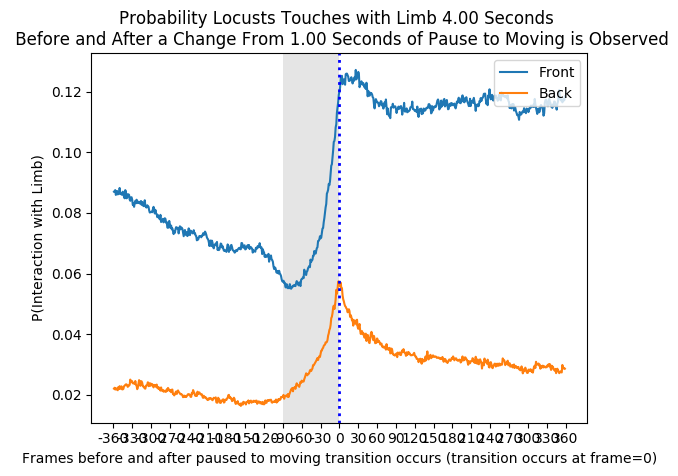



  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11385/323578 [00:00<00:02, 113843.87it/s]

  7%|▋         | 21266/323578 [00:00<00:02, 108683.69it/s]

  9%|▊         | 27993/323578 [00:00<00:03, 91739.86it/s] 

 11%|█▏        | 36856/323578 [00:00<00:03, 90380.33it/s]

 14%|█▍        | 45056/323578 [00:00<00:03, 87691.42it/s]

 17%|█▋        | 55137/323578 [00:00<00:02, 91253.77it/s]

 20%|█▉        | 64665/323578 [00:00<00:02, 91808.24it/s]

 23%|██▎       | 73063/323578 [00:00<00:02, 87334.32it/s]

 25%|██▌       | 81294/323578 [00:00<00:02, 83726.54it/s]

 28%|██▊       | 90486/323578 [00:01<00:02, 86026.33it/s]

 31%|███       | 100092/323578 [00:01<00:02, 88323.08it/s]

 34%|███▍      | 110413/323578 [00:01<00:02, 92317.56it/s]

 37%|███▋      | 121032/323578 [00:01<00:02, 95413.42it/s]

 42%|████▏     | 134683/323578 [00:01<00:01, 104174.40it/s]

 45%|████▍     | 145336/323578 [00:01<00:01, 104098.79it/s]

 48%|████▊     | 155911/323578 [00:01<00:01, 102506.03it/s]

0




 71%|███████   | 230287/323578 [00:02<00:00, 117826.42it/s]

 75%|███████▌  | 243043/323578 [00:02<00:00, 119959.58it/s]

 80%|████████  | 259492/323578 [00:02<00:00, 130561.52it/s]

 84%|████████▍ | 272995/323578 [00:02<00:00, 120961.13it/s]

 88%|████████▊ | 285545/323578 [00:02<00:00, 101786.75it/s]

 92%|█████████▏| 296559/323578 [00:02<00:00, 92556.34it/s] 

 95%|█████████▍| 306931/323578 [00:03<00:00, 95643.95it/s]

 98%|█████████▊| 317917/323578 [00:03<00:00, 99505.85it/s]

100%|██████████| 323578/323578 [00:03<00:00, 102971.23it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10412/323578 [00:00<00:03, 103031.40it/s]

  6%|▌         | 18212/323578 [00:00<00:03, 93369.66it/s] 

  9%|▊         | 28080/323578 [00:00<00:03, 94900.82it/s]

 11%|█         | 35461/323578 [00:00<00:03, 86996.54it/s]

 15%|█▍        | 47785/323578 [00:00<00:02, 95414.40it/s]

 18%|█▊        | 58328/323578 [00:00<00:02, 98212.26it/s]

 22%|██▏       | 71384/323578 [00:00<00:02, 106097.

1




 58%|█████▊    | 187246/323578 [00:01<00:00, 148520.73it/s]

 63%|██████▎   | 202858/323578 [00:01<00:00, 150719.22it/s]

 67%|██████▋   | 218087/323578 [00:01<00:00, 128554.46it/s]

 72%|███████▏  | 231619/323578 [00:01<00:00, 124956.77it/s]

 76%|███████▌  | 246098/323578 [00:01<00:00, 130310.97it/s]

 80%|████████  | 259536/323578 [00:02<00:00, 128676.92it/s]

 84%|████████▍ | 272693/323578 [00:02<00:00, 128567.88it/s]

 89%|████████▊ | 286493/323578 [00:02<00:00, 131258.00it/s]

 93%|█████████▎| 299775/323578 [00:02<00:00, 128153.10it/s]

 97%|█████████▋| 312716/323578 [00:02<00:00, 126365.68it/s]

100%|██████████| 323578/323578 [00:02<00:00, 122733.10it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8359/323578 [00:00<00:03, 83589.28it/s]

  5%|▍         | 15729/323578 [00:00<00:03, 79870.68it/s]

  7%|▋         | 22856/323578 [00:00<00:03, 77079.14it/s]

 10%|▉         | 31691/323578 [00:00<00:03, 80146.20it/s]

 12%|█▏        | 39591/323578 [00:00<00:03, 7953

2




 52%|█████▏    | 169051/323578 [00:02<00:01, 86590.07it/s]

 55%|█████▌    | 178290/323578 [00:02<00:01, 87519.24it/s]

 58%|█████▊    | 187379/323578 [00:02<00:01, 88503.82it/s]

 61%|██████    | 196294/323578 [00:02<00:01, 81927.65it/s]

 64%|██████▍   | 208186/323578 [00:02<00:01, 90077.18it/s]

 67%|██████▋   | 218250/323578 [00:02<00:01, 93004.38it/s]

 70%|███████   | 227817/323578 [00:02<00:01, 90604.39it/s]

 73%|███████▎  | 237078/323578 [00:02<00:01, 82639.36it/s]

 76%|███████▌  | 245618/323578 [00:02<00:00, 80229.48it/s]

 80%|███████▉  | 257408/323578 [00:03<00:00, 88316.42it/s]

 82%|████████▏ | 266635/323578 [00:03<00:00, 88847.66it/s]

 85%|████████▌ | 275797/323578 [00:03<00:00, 88172.17it/s]

 88%|████████▊ | 284986/323578 [00:03<00:00, 89082.34it/s]

 91%|█████████▏| 295754/323578 [00:03<00:00, 93949.28it/s]

 95%|█████████▍| 306064/323578 [00:03<00:00, 96309.00it/s]

 98%|█████████▊| 315828/323578 [00:03<00:00, 92562.92it/s]

100%|██████████| 323578/323578 [00:03<

3




 64%|██████▍   | 208243/323578 [00:01<00:01, 106325.98it/s]

 68%|██████▊   | 219525/323578 [00:02<00:00, 107365.54it/s]

 71%|███████▏  | 230719/323578 [00:02<00:00, 106403.37it/s]

 75%|███████▍  | 241681/323578 [00:02<00:00, 99669.18it/s] 

 78%|███████▊  | 251960/323578 [00:02<00:00, 92525.60it/s]

 81%|████████  | 261534/323578 [00:02<00:00, 78331.62it/s]

 83%|████████▎ | 269966/323578 [00:02<00:00, 79766.77it/s]

 86%|████████▌ | 278369/323578 [00:02<00:00, 78868.56it/s]

 89%|████████▉ | 288109/323578 [00:02<00:00, 83642.61it/s]

 92%|█████████▏| 297893/323578 [00:02<00:00, 87448.52it/s]

 95%|█████████▍| 306886/323578 [00:03<00:00, 87340.84it/s]

 98%|█████████▊| 315794/323578 [00:03<00:00, 80278.01it/s]

100%|██████████| 323578/323578 [00:03<00:00, 98125.33it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  1%|▏         | 4769/323578 [00:00<00:06, 47004.75it/s]

  3%|▎         | 11082/323578 [00:00<00:06, 50766.40it/s]

  5%|▌         | 16844/323578 [00:00<00:05, 52540.31i

4


  9%|▉         | 29674/323578 [00:00<00:05, 57549.49it/s]

 11%|█         | 35881/323578 [00:00<00:04, 58834.34it/s]

 14%|█▎        | 43797/323578 [00:00<00:04, 63587.26it/s]

 16%|█▌        | 50926/323578 [00:00<00:04, 65716.39it/s]

 19%|█▊        | 59979/323578 [00:00<00:03, 71080.30it/s]

 21%|██        | 67115/323578 [00:01<00:03, 70623.87it/s]

 23%|██▎       | 75869/323578 [00:01<00:03, 74969.38it/s]

 26%|██▌       | 83453/323578 [00:01<00:03, 70330.81it/s]

 28%|██▊       | 90873/323578 [00:01<00:03, 71441.46it/s]

 30%|███       | 98105/323578 [00:01<00:03, 68398.45it/s]

 32%|███▏      | 105034/323578 [00:01<00:03, 68097.63it/s]

 35%|███▍      | 112456/323578 [00:01<00:03, 69825.43it/s]

 37%|███▋      | 119528/323578 [00:01<00:02, 69833.41it/s]

 40%|███▉      | 129063/323578 [00:01<00:02, 75574.22it/s]

 42%|████▏     | 136784/323578 [00:01<00:02, 72813.65it/s]

 45%|████▍     | 144202/323578 [00:02<00:02, 71715.37it/s]

 47%|████▋     | 153246/323578 [00:02<00:02, 76184

5




 46%|████▌     | 147265/323578 [00:02<00:02, 73089.58it/s]

 48%|████▊     | 156091/323578 [00:02<00:02, 76632.83it/s]

 51%|█████     | 163869/323578 [00:02<00:02, 76587.18it/s]

 53%|█████▎    | 172721/323578 [00:02<00:01, 79813.20it/s]

 56%|█████▌    | 180794/323578 [00:02<00:01, 71506.33it/s]

 58%|█████▊    | 188987/323578 [00:02<00:01, 73957.26it/s]

 61%|██████    | 197585/323578 [00:02<00:01, 76908.31it/s]

 64%|██████▍   | 207887/323578 [00:02<00:01, 83077.49it/s]

 67%|██████▋   | 216501/323578 [00:02<00:01, 83972.74it/s]

 70%|██████▉   | 225077/323578 [00:03<00:01, 81119.17it/s]

 72%|███████▏  | 233335/323578 [00:03<00:01, 77054.53it/s]

 75%|███████▍  | 241817/323578 [00:03<00:01, 79216.54it/s]

 77%|███████▋  | 249855/323578 [00:03<00:00, 77681.98it/s]

 80%|███████▉  | 257712/323578 [00:03<00:00, 76506.38it/s]

 82%|████████▏ | 265429/323578 [00:03<00:00, 74638.16it/s]

 84%|████████▍ | 273319/323578 [00:03<00:00, 75698.08it/s]

 87%|████████▋ | 280932/323578 [00:03<

6




 11%|█         | 36164/323578 [00:00<00:04, 64586.11it/s]

 13%|█▎        | 42528/323578 [00:00<00:04, 63745.45it/s]

 16%|█▌        | 50825/323578 [00:00<00:04, 68029.10it/s]

 18%|█▊        | 57395/323578 [00:00<00:04, 66502.10it/s]

 20%|██        | 65274/323578 [00:00<00:03, 69766.12it/s]

 23%|██▎       | 74148/323578 [00:01<00:03, 74069.21it/s]

 25%|██▌       | 81581/323578 [00:01<00:03, 74049.69it/s]

 28%|██▊       | 90776/323578 [00:01<00:02, 78618.58it/s]

 31%|███       | 100331/323578 [00:01<00:02, 83032.03it/s]

 34%|███▎      | 108764/323578 [00:01<00:02, 78296.54it/s]

 36%|███▌      | 116740/323578 [00:01<00:02, 75721.48it/s]

 39%|███▊      | 124736/323578 [00:01<00:02, 76944.16it/s]

 42%|████▏     | 134967/323578 [00:01<00:02, 82607.97it/s]

 44%|████▍     | 143408/323578 [00:01<00:02, 80925.61it/s]

 47%|████▋     | 152134/323578 [00:01<00:02, 82726.00it/s]

 50%|████▉     | 160510/323578 [00:02<00:01, 81567.92it/s]

 53%|█████▎    | 171742/323578 [00:02<00:01, 8

7




 46%|████▌     | 149519/323578 [00:01<00:01, 96812.67it/s]

 50%|████▉     | 160513/323578 [00:01<00:01, 100408.91it/s]

 53%|█████▎    | 171315/323578 [00:01<00:01, 102576.65it/s]

 56%|█████▌    | 181724/323578 [00:01<00:01, 98424.51it/s] 

 60%|██████    | 194590/323578 [00:02<00:01, 105861.70it/s]

 63%|██████▎   | 205435/323578 [00:02<00:01, 99858.18it/s] 

 67%|██████▋   | 217178/323578 [00:02<00:01, 104550.16it/s]

 71%|███████   | 229749/323578 [00:02<00:00, 110110.20it/s]

 75%|███████▍  | 241112/323578 [00:02<00:00, 110858.97it/s]

 78%|███████▊  | 252369/323578 [00:02<00:00, 100704.79it/s]

 81%|████████  | 262738/323578 [00:02<00:00, 97532.73it/s] 

 84%|████████▍ | 272722/323578 [00:02<00:00, 89770.43it/s]

 87%|████████▋ | 282979/323578 [00:02<00:00, 92442.90it/s]

 90%|█████████ | 292442/323578 [00:03<00:00, 89831.02it/s]

 93%|█████████▎| 301594/323578 [00:03<00:00, 83735.48it/s]

 97%|█████████▋| 313073/323578 [00:03<00:00, 91100.30it/s]

100%|██████████| 323578/3235

8


 50%|████▉     | 160459/323578 [00:01<00:01, 88662.04it/s]

 52%|█████▏    | 169462/323578 [00:01<00:01, 88368.29it/s]

 55%|█████▌    | 178395/323578 [00:02<00:01, 87787.09it/s]

 59%|█████▉    | 191004/323578 [00:02<00:01, 96291.03it/s]

 62%|██████▏   | 202011/323578 [00:02<00:01, 100048.06it/s]

 66%|██████▌   | 214138/323578 [00:02<00:01, 105590.97it/s]

 70%|██████▉   | 224951/323578 [00:02<00:01, 95183.91it/s] 

 73%|███████▎  | 236236/323578 [00:02<00:00, 99874.00it/s]

 76%|███████▌  | 246545/323578 [00:02<00:00, 96713.57it/s]

 79%|███████▉  | 256616/323578 [00:02<00:00, 97636.86it/s]

 83%|████████▎ | 267031/323578 [00:02<00:00, 98575.15it/s]

 86%|████████▌ | 278039/323578 [00:03<00:00, 101356.86it/s]

 90%|████████▉ | 289730/323578 [00:03<00:00, 105569.64it/s]

 94%|█████████▎| 303186/323578 [00:03<00:00, 112864.04it/s]

 97%|█████████▋| 314697/323578 [00:03<00:00, 109272.49it/s]

100%|██████████| 323578/323578 [00:03<00:00, 94867.43it/s] 

  0%|          | 0/323578 [00:00

9




 74%|███████▍  | 240845/323578 [00:02<00:00, 97341.41it/s]

 78%|███████▊  | 250850/323578 [00:02<00:00, 97888.44it/s]

 81%|████████  | 260751/323578 [00:02<00:00, 95883.20it/s]

 84%|████████▎ | 270427/323578 [00:02<00:00, 92992.48it/s]

 87%|████████▋ | 280320/323578 [00:03<00:00, 94456.01it/s]

 90%|████████▉ | 289828/323578 [00:03<00:00, 90982.27it/s]

 94%|█████████▍| 303733/323578 [00:03<00:00, 101508.47it/s]

 98%|█████████▊| 316313/323578 [00:03<00:00, 107748.90it/s]

100%|██████████| 323578/323578 [00:03<00:00, 94995.17it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 8038/323578 [00:00<00:03, 80133.62it/s]

  5%|▌         | 16838/323578 [00:00<00:03, 82340.55it/s]

  7%|▋         | 24145/323578 [00:00<00:03, 79320.11it/s]

 10%|▉         | 32199/323578 [00:00<00:03, 79680.85it/s]

 12%|█▏        | 38268/323578 [00:00<00:04, 70221.87it/s]

 14%|█▍        | 46001/323578 [00:00<00:03, 72212.46it/s]

 17%|█▋        | 56492/323578 [00:00<00:03, 79331.94it/s]


10


 43%|████▎     | 137577/323578 [00:01<00:02, 91226.58it/s]

 45%|████▌     | 147000/323578 [00:01<00:02, 83860.11it/s]

 48%|████▊     | 155713/323578 [00:01<00:01, 84233.31it/s]

 51%|█████     | 165088/323578 [00:02<00:01, 86523.69it/s]

 55%|█████▍    | 176406/323578 [00:02<00:01, 93101.91it/s]

 59%|█████▊    | 190017/323578 [00:02<00:01, 102851.44it/s]

 62%|██████▏   | 200803/323578 [00:02<00:01, 101272.96it/s]

 65%|██████▌   | 211287/323578 [00:02<00:01, 101443.53it/s]

 69%|██████▊   | 221681/323578 [00:02<00:01, 93225.74it/s] 

 71%|███████▏  | 231309/323578 [00:02<00:01, 89196.49it/s]

 75%|███████▌  | 242699/323578 [00:02<00:00, 95403.02it/s]

 79%|███████▉  | 257207/323578 [00:02<00:00, 106323.99it/s]

 83%|████████▎ | 269550/323578 [00:02<00:00, 110936.30it/s]

 87%|████████▋ | 281120/323578 [00:03<00:00, 112031.16it/s]

 90%|█████████ | 292659/323578 [00:03<00:00, 102543.54it/s]

 94%|█████████▎| 303305/323578 [00:03<00:00, 95444.10it/s] 

 97%|█████████▋| 313406/323578 

11




 63%|██████▎   | 202792/323578 [00:01<00:01, 118742.61it/s]

 66%|██████▋   | 215144/323578 [00:02<00:01, 105540.56it/s]

 70%|██████▉   | 226304/323578 [00:02<00:00, 100910.44it/s]

 73%|███████▎  | 236863/323578 [00:02<00:00, 98600.86it/s] 

 77%|███████▋  | 247664/323578 [00:02<00:00, 101245.79it/s]

 80%|████████  | 259743/323578 [00:02<00:00, 106410.98it/s]

 84%|████████▎ | 270633/323578 [00:02<00:00, 90043.48it/s] 

 87%|████████▋ | 280244/323578 [00:02<00:00, 85042.46it/s]

 90%|████████▉ | 290462/323578 [00:02<00:00, 89060.41it/s]

 93%|█████████▎| 299755/323578 [00:02<00:00, 89694.07it/s]

 96%|█████████▌| 310601/323578 [00:03<00:00, 94604.28it/s]

 99%|█████████▉| 320324/323578 [00:03<00:00, 94054.48it/s]

100%|██████████| 323578/323578 [00:03<00:00, 101219.13it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6385/323578 [00:00<00:04, 63847.47it/s]

  5%|▌         | 17088/323578 [00:00<00:04, 72639.44it/s]

  7%|▋         | 24135/323578 [00:00<00:04, 71382

12




 59%|█████▊    | 190040/323578 [00:02<00:01, 77751.81it/s]

 62%|██████▏   | 199737/323578 [00:02<00:01, 82666.42it/s]

 65%|██████▍   | 209515/323578 [00:02<00:01, 86685.27it/s]

 67%|██████▋   | 218339/323578 [00:02<00:01, 85386.28it/s]

 72%|███████▏  | 231463/323578 [00:02<00:00, 95383.13it/s]

 75%|███████▍  | 241457/323578 [00:02<00:00, 84740.18it/s]

 78%|███████▊  | 252962/323578 [00:03<00:00, 92012.32it/s]

 81%|████████▏ | 263668/323578 [00:03<00:00, 95472.88it/s]

 85%|████████▍ | 273866/323578 [00:03<00:00, 97334.56it/s]

 88%|████████▊ | 283906/323578 [00:03<00:00, 93821.20it/s]

 91%|█████████ | 293530/323578 [00:03<00:00, 90607.29it/s]

 94%|█████████▎| 302784/323578 [00:03<00:00, 91089.24it/s]

 96%|█████████▋| 312033/323578 [00:03<00:00, 91204.71it/s]

 99%|█████████▉| 321249/323578 [00:03<00:00, 85675.24it/s]

100%|██████████| 323578/323578 [00:03<00:00, 83639.44it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9858/323578 [00:00<00:03, 98574.69it/

13




 39%|███▉      | 127475/323578 [00:01<00:02, 83853.49it/s]

 43%|████▎     | 139625/323578 [00:01<00:01, 92446.14it/s]

 47%|████▋     | 151083/323578 [00:01<00:01, 97332.96it/s]

 50%|████▉     | 161239/323578 [00:01<00:01, 98562.25it/s]

 53%|█████▎    | 171327/323578 [00:01<00:01, 95796.73it/s]

 56%|█████▌    | 181502/323578 [00:01<00:01, 97237.28it/s]

 59%|█████▉    | 192391/323578 [00:02<00:01, 99712.84it/s]

 63%|██████▎   | 202470/323578 [00:02<00:01, 95146.04it/s]

 66%|██████▌   | 212813/323578 [00:02<00:01, 97487.77it/s]

 69%|██████▉   | 224484/323578 [00:02<00:00, 101719.48it/s]

 73%|███████▎  | 236429/323578 [00:02<00:00, 106088.60it/s]

 77%|███████▋  | 250234/323578 [00:02<00:00, 114006.58it/s]

 82%|████████▏ | 264286/323578 [00:02<00:00, 120845.50it/s]

 86%|████████▋ | 279811/323578 [00:02<00:00, 129413.25it/s]

 91%|█████████ | 294142/323578 [00:02<00:00, 133267.08it/s]

 96%|█████████▌| 311185/323578 [00:02<00:00, 142594.97it/s]

100%|██████████| 323578/323578 

14




 60%|██████    | 194293/323578 [00:02<00:01, 101283.76it/s]

 64%|██████▍   | 207272/323578 [00:02<00:01, 108427.34it/s]

 67%|██████▋   | 218406/323578 [00:02<00:00, 105831.74it/s]

 71%|███████   | 230435/323578 [00:02<00:00, 109003.76it/s]

 75%|███████▍  | 242550/323578 [00:02<00:00, 112348.60it/s]

 79%|███████▉  | 256151/323578 [00:02<00:00, 118491.96it/s]

 83%|████████▎ | 268755/323578 [00:02<00:00, 120645.62it/s]

 87%|████████▋ | 280966/323578 [00:02<00:00, 116934.11it/s]

 91%|█████████ | 293779/323578 [00:02<00:00, 120080.73it/s]

 95%|█████████▍| 305897/323578 [00:03<00:00, 111102.74it/s]

 98%|█████████▊| 317218/323578 [00:03<00:00, 97806.53it/s] 

100%|██████████| 323578/323578 [00:03<00:00, 99958.82it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9626/323578 [00:00<00:03, 96255.04it/s]

  7%|▋         | 21678/323578 [00:00<00:02, 102441.43it/s]

 10%|█         | 33066/323578 [00:00<00:02, 105623.62it/s]

 13%|█▎        | 41520/323578 [00:00<00:02, 9

15




 91%|█████████ | 294626/323578 [00:02<00:00, 118744.13it/s]

 95%|█████████▍| 306658/323578 [00:02<00:00, 110513.21it/s]

 98%|█████████▊| 317934/323578 [00:02<00:00, 111001.14it/s]

100%|██████████| 323578/323578 [00:03<00:00, 107635.33it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7230/323578 [00:00<00:04, 72296.62it/s]

  4%|▍         | 13194/323578 [00:00<00:04, 67742.41it/s]

16




  6%|▌         | 19736/323578 [00:00<00:04, 67028.53it/s]

  8%|▊         | 26063/323578 [00:00<00:04, 65854.53it/s]

 11%|█         | 34559/323578 [00:00<00:04, 70496.68it/s]

 13%|█▎        | 42635/323578 [00:00<00:03, 73289.89it/s]

 16%|█▋        | 52667/323578 [00:00<00:03, 79429.59it/s]

 19%|█▊        | 60241/323578 [00:00<00:03, 75220.21it/s]

 21%|██▏       | 68788/323578 [00:00<00:03, 78027.30it/s]

 24%|██▎       | 76469/323578 [00:01<00:03, 76538.94it/s]

 26%|██▌       | 84241/323578 [00:01<00:03, 76667.66it/s]

 28%|██▊       | 92042/323578 [00:01<00:03, 76972.34it/s]

 31%|███       | 99990/323578 [00:01<00:02, 77707.40it/s]

 33%|███▎      | 107752/323578 [00:01<00:02, 77680.46it/s]

 36%|███▌      | 115503/323578 [00:01<00:02, 72062.75it/s]

 38%|███▊      | 123846/323578 [00:01<00:02, 74539.24it/s]

 41%|████      | 131370/323578 [00:01<00:02, 72641.90it/s]

 43%|████▎     | 140527/323578 [00:01<00:02, 77443.69it/s]

 47%|████▋     | 151755/323578 [00:01<00:02, 8480

17




 53%|█████▎    | 170710/323578 [00:02<00:01, 79434.41it/s]

 55%|█████▌    | 178693/323578 [00:02<00:01, 78034.09it/s]

 58%|█████▊    | 187211/323578 [00:02<00:01, 80023.03it/s]

 60%|██████    | 195249/323578 [00:02<00:01, 76327.70it/s]

 63%|██████▎   | 202943/323578 [00:02<00:01, 75903.68it/s]

 65%|██████▌   | 211454/323578 [00:02<00:01, 78448.73it/s]

 69%|██████▊   | 221752/323578 [00:02<00:01, 84361.71it/s]

 72%|███████▏  | 231777/323578 [00:02<00:01, 88571.96it/s]

 74%|███████▍  | 240804/323578 [00:03<00:00, 84524.11it/s]

 77%|███████▋  | 249414/323578 [00:03<00:00, 82786.63it/s]

 80%|███████▉  | 257811/323578 [00:03<00:00, 82414.27it/s]

 83%|████████▎ | 267069/323578 [00:03<00:00, 84662.35it/s]

 85%|████████▌ | 275717/323578 [00:03<00:00, 85198.46it/s]

 88%|████████▊ | 284429/323578 [00:03<00:00, 85765.38it/s]

 91%|█████████ | 295161/323578 [00:03<00:00, 91263.88it/s]

 94%|█████████▍| 304411/323578 [00:03<00:00, 81720.61it/s]

 98%|█████████▊| 315561/323578 [00:03<

18




 41%|████      | 131627/323578 [00:01<00:02, 80765.90it/s]

 43%|████▎     | 140474/323578 [00:01<00:02, 81003.39it/s]

 46%|████▌     | 149114/323578 [00:01<00:02, 77434.89it/s]

 49%|████▊     | 157269/323578 [00:01<00:02, 78406.84it/s]

 52%|█████▏    | 167077/323578 [00:01<00:01, 82910.08it/s]

 54%|█████▍    | 175642/323578 [00:01<00:01, 82454.35it/s]

 57%|█████▋    | 184080/323578 [00:01<00:01, 81429.05it/s]

 59%|█████▉    | 192360/323578 [00:01<00:01, 81595.44it/s]

 62%|██████▏   | 200616/323578 [00:02<00:01, 74978.41it/s]

 64%|██████▍   | 208287/323578 [00:02<00:01, 67578.59it/s]

 67%|██████▋   | 215781/323578 [00:02<00:01, 69629.59it/s]

 70%|██████▉   | 225616/323578 [00:02<00:01, 76314.79it/s]

 73%|███████▎  | 234695/323578 [00:02<00:01, 79962.93it/s]

 75%|███████▌  | 242969/323578 [00:02<00:01, 78552.08it/s]

 78%|███████▊  | 251025/323578 [00:02<00:00, 74746.89it/s]

 80%|████████  | 259665/323578 [00:02<00:00, 77897.62it/s]

 83%|████████▎ | 267615/323578 [00:02<

19




 53%|█████▎    | 172004/323578 [00:01<00:01, 94918.33it/s]

 56%|█████▌    | 181848/323578 [00:01<00:01, 94486.43it/s]

 59%|█████▉    | 191544/323578 [00:02<00:01, 93056.23it/s]

 62%|██████▏   | 201573/323578 [00:02<00:01, 94841.03it/s]

 65%|██████▌   | 211190/323578 [00:02<00:01, 92061.11it/s]

 68%|██████▊   | 221593/323578 [00:02<00:01, 95191.09it/s]

 71%|███████▏  | 231217/323578 [00:02<00:01, 90377.55it/s]

 74%|███████▍  | 240379/323578 [00:02<00:00, 86502.74it/s]

 77%|███████▋  | 249784/323578 [00:02<00:00, 87933.80it/s]

 80%|███████▉  | 258669/323578 [00:02<00:00, 85734.02it/s]

 83%|████████▎ | 267690/323578 [00:02<00:00, 86374.95it/s]

 86%|████████▌ | 276774/323578 [00:03<00:00, 87024.23it/s]

 88%|████████▊ | 285516/323578 [00:03<00:00, 86902.45it/s]

 91%|█████████ | 294908/323578 [00:03<00:00, 88882.71it/s]

 94%|█████████▍| 304030/323578 [00:03<00:00, 89313.00it/s]

 97%|█████████▋| 312984/323578 [00:03<00:00, 83571.41it/s]

 99%|█████████▉| 321576/323578 [00:03<

20




 57%|█████▋    | 183153/323578 [00:02<00:01, 95531.03it/s]

 60%|█████▉    | 192831/323578 [00:02<00:01, 95619.88it/s]

 63%|██████▎   | 203743/323578 [00:02<00:01, 99281.83it/s]

 66%|██████▌   | 213768/323578 [00:02<00:01, 95933.88it/s]

 69%|██████▉   | 224416/323578 [00:02<00:01, 98580.26it/s]

 74%|███████▎  | 238284/323578 [00:02<00:00, 107943.02it/s]

 79%|███████▊  | 254592/323578 [00:02<00:00, 120126.23it/s]

 84%|████████▍ | 271335/323578 [00:02<00:00, 131250.60it/s]

 89%|████████▉ | 287411/323578 [00:02<00:00, 138854.58it/s]

 94%|█████████▍| 303402/323578 [00:03<00:00, 144563.80it/s]

 99%|█████████▊| 319530/323578 [00:03<00:00, 149179.49it/s]

100%|██████████| 323578/323578 [00:03<00:00, 101032.51it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7503/323578 [00:00<00:04, 73628.35it/s]

  5%|▍         | 16146/323578 [00:00<00:03, 76901.77it/s]

  7%|▋         | 24040/323578 [00:00<00:03, 77349.22it/s]

 10%|▉         | 31635/323578 [00:00<00:03, 76441.3

21




 62%|██████▏   | 199196/323578 [00:02<00:01, 113705.05it/s]

 66%|██████▌   | 213034/323578 [00:02<00:00, 120129.65it/s]

 70%|███████   | 226522/323578 [00:02<00:00, 123977.55it/s]

 75%|███████▍  | 241368/323578 [00:02<00:00, 130429.76it/s]

 79%|███████▉  | 256550/323578 [00:02<00:00, 135071.32it/s]

 84%|████████▍ | 273352/323578 [00:02<00:00, 143513.85it/s]

 89%|████████▉ | 288763/323578 [00:02<00:00, 146534.92it/s]

 94%|█████████▍| 303657/323578 [00:02<00:00, 145409.50it/s]

 99%|█████████▊| 318858/323578 [00:02<00:00, 147327.99it/s]

100%|██████████| 323578/323578 [00:02<00:00, 108058.28it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9109/323578 [00:00<00:03, 91086.18it/s]

  5%|▌         | 17334/323578 [00:00<00:03, 88241.75it/s]

  8%|▊         | 24654/323578 [00:00<00:03, 82279.94it/s]

 10%|▉         | 31958/323578 [00:00<00:03, 79008.06it/s]

 13%|█▎        | 40992/323578 [00:00<00:03, 82096.27it/s]

 15%|█▌        | 49293/323578 [00:00<00:03, 82334.

22




 49%|████▉     | 160029/323578 [00:01<00:01, 101061.48it/s]

 53%|█████▎    | 172591/323578 [00:01<00:01, 106792.48it/s]

 57%|█████▋    | 185634/323578 [00:01<00:01, 112162.46it/s]

 61%|██████    | 197054/323578 [00:02<00:01, 103854.58it/s]

 64%|██████▍   | 207847/323578 [00:02<00:01, 105043.67it/s]

 68%|██████▊   | 219227/323578 [00:02<00:00, 107363.67it/s]

 72%|███████▏  | 232641/323578 [00:02<00:00, 113906.55it/s]

 76%|███████▌  | 246610/323578 [00:02<00:00, 119999.73it/s]

 80%|███████▉  | 258844/323578 [00:02<00:00, 110345.71it/s]

 84%|████████▎ | 270195/323578 [00:02<00:00, 109166.90it/s]

 87%|████████▋ | 282033/323578 [00:02<00:00, 111154.89it/s]

 91%|█████████ | 293315/323578 [00:02<00:00, 106752.77it/s]

 94%|█████████▍| 304144/323578 [00:03<00:00, 104830.23it/s]

 97%|█████████▋| 314743/323578 [00:03<00:00, 102043.23it/s]

100%|██████████| 323578/323578 [00:03<00:00, 99858.16it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7806/323578 [00:00<00:

23




 25%|██▌       | 81150/323578 [00:01<00:03, 71639.89it/s]

 28%|██▊       | 91960/323578 [00:01<00:02, 79261.28it/s]

 31%|███▏      | 101685/323578 [00:01<00:02, 83210.24it/s]

 35%|███▍      | 112203/323578 [00:01<00:02, 88771.79it/s]

 39%|███▉      | 126161/323578 [00:01<00:01, 99654.03it/s]

 42%|████▏     | 136745/323578 [00:01<00:01, 93875.62it/s]

 45%|████▌     | 146917/323578 [00:01<00:01, 96097.49it/s]

 49%|████▉     | 158038/323578 [00:01<00:01, 99747.97it/s]

 52%|█████▏    | 168304/323578 [00:02<00:01, 92548.77it/s]

 55%|█████▍    | 177866/323578 [00:02<00:01, 87115.58it/s]

 58%|█████▊    | 186858/323578 [00:02<00:01, 84911.39it/s]

 60%|██████    | 195558/323578 [00:02<00:01, 84610.94it/s]

 63%|██████▎   | 204166/323578 [00:02<00:01, 84255.16it/s]

 66%|██████▌   | 212695/323578 [00:02<00:01, 81699.58it/s]

 69%|██████▊   | 221851/323578 [00:02<00:01, 84118.15it/s]

 71%|███████   | 230343/323578 [00:02<00:01, 81643.99it/s]

 74%|███████▍  | 238949/323578 [00:02<00

24




 61%|██████    | 196826/323578 [00:02<00:01, 89533.29it/s]

 64%|██████▎   | 206059/323578 [00:02<00:01, 87561.57it/s]

 67%|██████▋   | 215223/323578 [00:02<00:01, 88735.55it/s]

 70%|███████   | 226742/323578 [00:02<00:01, 94667.65it/s]

 73%|███████▎  | 236422/323578 [00:02<00:00, 88939.03it/s]

 76%|███████▌  | 245536/323578 [00:03<00:00, 85181.80it/s]

 79%|███████▊  | 254242/323578 [00:03<00:00, 84630.26it/s]

 81%|████████▏ | 263693/323578 [00:03<00:00, 87370.12it/s]

 84%|████████▍ | 273272/323578 [00:03<00:00, 89546.34it/s]

 87%|████████▋ | 282321/323578 [00:03<00:00, 80735.40it/s]

 91%|█████████ | 293869/323578 [00:03<00:00, 88744.90it/s]

 95%|█████████▍| 306535/323578 [00:03<00:00, 97500.37it/s]

 98%|█████████▊| 316886/323578 [00:03<00:00, 99228.31it/s]

100%|██████████| 323578/323578 [00:03<00:00, 83276.74it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13441/323578 [00:00<00:02, 134402.12it/s]

  7%|▋         | 22230/323578 [00:00<00:02, 115678.99i

25


 54%|█████▎    | 173911/323578 [00:01<00:01, 106176.26it/s]

 57%|█████▋    | 184559/323578 [00:01<00:01, 102088.24it/s]

 61%|██████    | 196456/323578 [00:01<00:01, 105921.74it/s]

 65%|██████▍   | 208770/323578 [00:02<00:01, 110558.67it/s]

 68%|██████▊   | 219932/323578 [00:02<00:00, 110616.33it/s]

 71%|███████▏  | 231068/323578 [00:02<00:00, 108207.04it/s]

 75%|███████▍  | 241952/323578 [00:02<00:00, 99695.40it/s] 

 79%|███████▊  | 254649/323578 [00:02<00:00, 106561.41it/s]

 83%|████████▎ | 267646/323578 [00:02<00:00, 112023.54it/s]

 87%|████████▋ | 281325/323578 [00:02<00:00, 118021.49it/s]

 91%|█████████ | 293964/323578 [00:02<00:00, 119802.54it/s]

 95%|█████████▌| 307542/323578 [00:02<00:00, 124186.22it/s]

 99%|█████████▉| 320479/323578 [00:02<00:00, 125068.83it/s]

100%|██████████| 323578/323578 [00:03<00:00, 107246.97it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9131/323578 [00:00<00:03, 90272.69it/s]

  6%|▌         | 19358/323578 [00:00<00:03, 

26
27




  2%|▏         | 7439/323578 [00:00<00:04, 74385.81it/s]

  5%|▍         | 15467/323578 [00:00<00:04, 76060.86it/s]

  7%|▋         | 22624/323578 [00:00<00:04, 74027.61it/s]

  9%|▉         | 29987/323578 [00:00<00:03, 73907.21it/s]

 11%|█         | 35772/323578 [00:00<00:04, 68225.02it/s]

 15%|█▍        | 48264/323578 [00:00<00:03, 78978.27it/s]

 18%|█▊        | 59698/323578 [00:00<00:03, 87055.13it/s]

 21%|██▏       | 69296/323578 [00:00<00:02, 89477.26it/s]

 24%|██▍       | 78478/323578 [00:00<00:02, 90166.25it/s]

 27%|██▋       | 87569/323578 [00:01<00:02, 88158.66it/s]

 30%|███       | 98307/323578 [00:01<00:02, 93160.90it/s]

 33%|███▎      | 107743/323578 [00:01<00:02, 87689.71it/s]

 36%|███▌      | 116662/323578 [00:01<00:02, 87720.34it/s]

 39%|███▉      | 127584/323578 [00:01<00:02, 93224.76it/s]

 44%|████▍     | 141910/323578 [00:01<00:01, 104135.40it/s]

 49%|████▊     | 157702/323578 [00:01<00:01, 115985.94it/s]

 53%|█████▎    | 171442/323578 [00:01<00:01, 121

28




 35%|███▍      | 113148/323578 [00:01<00:03, 64690.76it/s]

 38%|███▊      | 123848/323578 [00:01<00:02, 73156.13it/s]

 41%|████      | 132165/323578 [00:01<00:02, 75409.07it/s]

 43%|████▎     | 140107/323578 [00:01<00:02, 76569.12it/s]

 46%|████▌     | 148041/323578 [00:02<00:02, 72964.34it/s]

 48%|████▊     | 155661/323578 [00:02<00:02, 73271.73it/s]

 50%|█████     | 163149/323578 [00:02<00:02, 73061.80it/s]

 53%|█████▎    | 171266/323578 [00:02<00:02, 74968.55it/s]

 56%|█████▌    | 180167/323578 [00:02<00:01, 78692.44it/s]

 58%|█████▊    | 188149/323578 [00:02<00:01, 74276.86it/s]

 61%|██████    | 195902/323578 [00:02<00:01, 75223.06it/s]

 64%|██████▍   | 206435/323578 [00:02<00:01, 82277.43it/s]

 66%|██████▋   | 214927/323578 [00:02<00:01, 77068.99it/s]

 69%|██████▉   | 224600/323578 [00:03<00:01, 81629.49it/s]

 72%|███████▏  | 233012/323578 [00:03<00:01, 79653.96it/s]

 75%|███████▍  | 242358/323578 [00:03<00:00, 83346.59it/s]

 78%|███████▊  | 253609/323578 [00:03<

29




 71%|███████   | 230247/323578 [00:02<00:01, 87713.18it/s]

 74%|███████▍  | 240010/323578 [00:02<00:00, 90469.11it/s]

 77%|███████▋  | 249143/323578 [00:03<00:00, 84984.16it/s]

 80%|████████  | 260138/323578 [00:03<00:00, 91195.63it/s]

 83%|████████▎ | 269475/323578 [00:03<00:00, 87207.19it/s]

 86%|████████▌ | 278385/323578 [00:03<00:00, 87487.45it/s]

 89%|████████▉ | 287581/323578 [00:03<00:00, 88431.94it/s]

 92%|█████████▏| 296520/323578 [00:03<00:00, 82721.44it/s]

 95%|█████████▍| 305826/323578 [00:03<00:00, 85572.62it/s]

 97%|█████████▋| 314508/323578 [00:03<00:00, 81034.04it/s]

100%|██████████| 323578/323578 [00:03<00:00, 83320.30it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9656/323578 [00:00<00:03, 96558.02it/s]

  6%|▌         | 18487/323578 [00:00<00:03, 93926.14it/s]

  9%|▉         | 29615/323578 [00:00<00:02, 98328.85it/s]

 12%|█▏        | 38261/323578 [00:00<00:03, 94437.10it/s]

 15%|█▍        | 48004/323578 [00:00<00:02, 95314.51it/s]



30




 47%|████▋     | 150747/323578 [00:01<00:01, 105334.24it/s]

 50%|████▉     | 161388/323578 [00:01<00:01, 97242.68it/s] 

 53%|█████▎    | 171608/323578 [00:01<00:01, 98677.50it/s]

 56%|█████▋    | 182294/323578 [00:01<00:01, 100996.93it/s]

 59%|█████▉    | 192508/323578 [00:01<00:01, 100099.98it/s]

 64%|██████▍   | 206575/323578 [00:02<00:01, 109580.54it/s]

 68%|██████▊   | 220624/323578 [00:02<00:00, 117324.11it/s]

 72%|███████▏  | 232738/323578 [00:02<00:00, 105308.74it/s]

 76%|███████▌  | 244561/323578 [00:02<00:00, 108877.46it/s]

 79%|███████▉  | 256277/323578 [00:02<00:00, 111236.55it/s]

 83%|████████▎ | 268323/323578 [00:02<00:00, 113850.98it/s]

 87%|████████▋ | 279919/323578 [00:02<00:00, 113725.52it/s]

 90%|█████████ | 291439/323578 [00:02<00:00, 112248.96it/s]

 94%|█████████▍| 305125/323578 [00:02<00:00, 118648.94it/s]

 99%|█████████▉| 321034/323578 [00:03<00:00, 128443.85it/s]

100%|██████████| 323578/323578 [00:03<00:00, 106690.34it/s]

  0%|          | 0/3235

31




 85%|████████▍ | 274438/323578 [00:02<00:00, 128481.13it/s]

 89%|████████▉ | 287678/323578 [00:02<00:00, 126337.28it/s]

 93%|█████████▎| 300668/323578 [00:02<00:00, 127383.39it/s]

 97%|█████████▋| 313606/323578 [00:02<00:00, 120363.60it/s]

100%|██████████| 323578/323578 [00:02<00:00, 123511.85it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8670/323578 [00:00<00:03, 86387.43it/s]

  5%|▌         | 17441/323578 [00:00<00:03, 86779.34it/s]

 10%|▉         | 31524/323578 [00:00<00:02, 98070.19it/s]

 15%|█▍        | 47776/323578 [00:00<00:02, 111312.81it/s]

 20%|█▉        | 64225/323578 [00:00<00:02, 123266.41it/s]

 25%|██▍       | 79799/323578 [00:00<00:01, 130947.64it/s]

 29%|██▊       | 92756/323578 [00:00<00:01, 130075.62it/s]

 34%|███▍      | 109306/323578 [00:00<00:01, 139000.90it/s]

 39%|███▉      | 126296/323578 [00:00<00:01, 147021.10it/s]

 44%|████▍     | 142673/323578 [00:01<00:01, 151673.40it/s]

 49%|████▉     | 158016/323578 [00:01<00:01, 15169

32
33




  2%|▏         | 7613/323578 [00:00<00:04, 76126.62it/s]

  5%|▌         | 16810/323578 [00:00<00:03, 79922.41it/s]

  8%|▊         | 24640/323578 [00:00<00:03, 79428.52it/s]

 10%|▉         | 31437/323578 [00:00<00:03, 74996.38it/s]

 12%|█▏        | 38891/323578 [00:00<00:03, 74858.74it/s]

 15%|█▍        | 47576/323578 [00:00<00:03, 78093.28it/s]

 17%|█▋        | 55231/323578 [00:00<00:03, 77258.09it/s]

 20%|█▉        | 63768/323578 [00:00<00:03, 79524.69it/s]

 24%|██▎       | 76282/323578 [00:00<00:02, 89288.41it/s]

 27%|██▋       | 87297/323578 [00:01<00:02, 94666.52it/s]

 30%|███       | 97889/323578 [00:01<00:02, 97781.95it/s]

 34%|███▍      | 111618/323578 [00:01<00:01, 107020.71it/s]

 38%|███▊      | 123866/323578 [00:01<00:01, 111232.20it/s]

 43%|████▎     | 138110/323578 [00:01<00:01, 119056.62it/s]

 47%|████▋     | 153579/323578 [00:01<00:01, 127893.75it/s]

 53%|█████▎    | 169889/323578 [00:01<00:01, 136747.70it/s]

 57%|█████▋    | 185952/323578 [00:01<00:00, 

34




 70%|███████   | 227430/323578 [00:02<00:00, 136704.76it/s]

 75%|███████▌  | 243663/323578 [00:02<00:00, 143499.74it/s]

 80%|████████  | 259603/323578 [00:02<00:00, 147924.55it/s]

 85%|████████▍ | 274844/323578 [00:02<00:00, 144126.29it/s]

 89%|████████▉ | 289592/323578 [00:02<00:00, 133103.69it/s]

 94%|█████████▍| 303741/323578 [00:03<00:00, 135511.40it/s]

 99%|█████████▉| 320819/323578 [00:03<00:00, 144460.41it/s]

100%|██████████| 323578/323578 [00:03<00:00, 102225.44it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8480/323578 [00:00<00:03, 83429.97it/s]

  5%|▍         | 15421/323578 [00:00<00:03, 78661.82it/s]

  7%|▋         | 23782/323578 [00:00<00:03, 80082.87it/s]

 10%|█         | 33000/323578 [00:00<00:03, 83330.54it/s]

 14%|█▎        | 44060/323578 [00:00<00:03, 89986.25it/s]

 16%|█▌        | 51970/323578 [00:00<00:03, 86417.44it/s]

 19%|█▉        | 61134/323578 [00:00<00:03, 87477.21it/s]

 21%|██▏       | 69317/323578 [00:00<00:03, 82579.29it

35




 48%|████▊     | 153751/323578 [00:01<00:02, 82935.92it/s]

 50%|█████     | 162149/323578 [00:01<00:02, 78676.63it/s]

 53%|█████▎    | 171171/323578 [00:02<00:01, 81816.01it/s]

 56%|█████▌    | 181413/323578 [00:02<00:01, 86729.47it/s]

 60%|█████▉    | 192729/323578 [00:02<00:01, 93264.46it/s]

 63%|██████▎   | 203630/323578 [00:02<00:01, 97488.41it/s]

 66%|██████▋   | 214447/323578 [00:02<00:01, 100464.18it/s]

 69%|██████▉   | 224717/323578 [00:02<00:00, 101123.31it/s]

 73%|███████▎  | 234958/323578 [00:02<00:00, 92721.01it/s] 

 76%|███████▌  | 244457/323578 [00:02<00:00, 89145.90it/s]

 80%|███████▉  | 258204/323578 [00:02<00:00, 99654.64it/s]

 83%|████████▎ | 268700/323578 [00:03<00:00, 98059.54it/s]

 86%|████████▌ | 278883/323578 [00:03<00:00, 91885.33it/s]

 89%|████████▉ | 288415/323578 [00:03<00:00, 85344.83it/s]

 93%|█████████▎| 299676/323578 [00:03<00:00, 92029.03it/s]

 96%|█████████▌| 309262/323578 [00:03<00:00, 90729.39it/s]

 99%|█████████▊| 318819/323578 [00:

36


 46%|████▌     | 149235/323578 [00:01<00:01, 150259.49it/s]

 51%|█████     | 164246/323578 [00:01<00:01, 143970.30it/s]

 56%|█████▌    | 181117/323578 [00:01<00:00, 149984.31it/s]

 61%|██████    | 196215/323578 [00:01<00:00, 149758.06it/s]

 65%|██████▌   | 211259/323578 [00:01<00:00, 149653.89it/s]

 70%|███████   | 227857/323578 [00:01<00:00, 154202.74it/s]

 75%|███████▌  | 243509/323578 [00:01<00:00, 153939.29it/s]

 80%|████████  | 259960/323578 [00:01<00:00, 156353.16it/s]

 85%|████████▌ | 275638/323578 [00:01<00:00, 151516.71it/s]

 90%|████████▉ | 290853/323578 [00:02<00:00, 150361.91it/s]

 95%|█████████▍| 305935/323578 [00:02<00:00, 148683.89it/s]

 99%|█████████▉| 321291/323578 [00:02<00:00, 148951.55it/s]

100%|██████████| 323578/323578 [00:02<00:00, 142830.58it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6442/323578 [00:00<00:04, 64419.91it/s]

  4%|▍         | 13900/323578 [00:00<00:04, 66690.00it/s]

  7%|▋         | 23229/323578 [00:00<00:04, 72

37




 94%|█████████▍| 303854/323578 [00:02<00:00, 165520.62it/s]

 99%|█████████▉| 320853/323578 [00:02<00:00, 166836.37it/s]

100%|██████████| 323578/323578 [00:02<00:00, 132825.08it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8370/323578 [00:00<00:03, 83696.69it/s]

  5%|▍         | 14737/323578 [00:00<00:04, 76479.88it/s]

  7%|▋         | 22637/323578 [00:00<00:03, 76537.07it/s]

 10%|▉         | 30916/323578 [00:00<00:03, 78310.70it/s]

 12%|█▏        | 39752/323578 [00:00<00:03, 81076.54it/s]

 14%|█▍        | 46729/323578 [00:00<00:03, 77316.81it/s]

 17%|█▋        | 55262/323578 [00:00<00:03, 79144.44it/s]

 20%|█▉        | 63900/323578 [00:00<00:03, 81184.41it/s]

 23%|██▎       | 73181/323578 [00:00<00:02, 84210.43it/s]

 26%|██▌       | 82835/323578 [00:01<00:02, 87366.92it/s]

 29%|██▊       | 92298/323578 [00:01<00:02, 89424.71it/s]

 31%|███▏      | 101145/323578 [00:01<00:02, 87034.52it/s]

 34%|███▍      | 109796/323578 [00:01<00:02, 82033.76it/s]

 37

38


 69%|██████▉   | 222921/323578 [00:02<00:01, 85119.74it/s]

 72%|███████▏  | 232330/323578 [00:02<00:01, 87625.85it/s]

 75%|███████▍  | 241219/323578 [00:02<00:00, 86851.64it/s]

 77%|███████▋  | 249995/323578 [00:02<00:00, 78995.41it/s]

 81%|████████  | 261690/323578 [00:03<00:00, 87515.76it/s]

 84%|████████▎ | 270869/323578 [00:03<00:00, 82023.90it/s]

 86%|████████▋ | 279441/323578 [00:03<00:00, 80947.47it/s]

 90%|█████████ | 291731/323578 [00:03<00:00, 90182.27it/s]

 93%|█████████▎| 301462/323578 [00:03<00:00, 92207.70it/s]

 96%|█████████▋| 311846/323578 [00:03<00:00, 94609.84it/s]

100%|█████████▉| 322198/323578 [00:03<00:00, 97116.36it/s]

100%|██████████| 323578/323578 [00:03<00:00, 87454.21it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8302/323578 [00:00<00:03, 83015.72it/s]

  5%|▌         | 16624/323578 [00:00<00:03, 83076.81it/s]

  8%|▊         | 26601/323578 [00:00<00:03, 87466.92it/s]

 10%|█         | 33280/323578 [00:00<00:03, 79574.11it/s]

 

39




 18%|█▊        | 56938/323578 [00:00<00:03, 74585.95it/s]

 21%|██▏       | 68979/323578 [00:00<00:03, 83989.47it/s]

 25%|██▍       | 79597/323578 [00:00<00:02, 89129.11it/s]

 27%|██▋       | 88917/323578 [00:01<00:02, 89602.23it/s]

 30%|███       | 97953/323578 [00:01<00:02, 86844.17it/s]

 33%|███▎      | 106709/323578 [00:01<00:02, 86615.32it/s]

 36%|███▌      | 115421/323578 [00:01<00:02, 85623.06it/s]

 39%|███▉      | 125391/323578 [00:01<00:02, 89409.16it/s]

 42%|████▏     | 134402/323578 [00:01<00:02, 82193.43it/s]

 44%|████▍     | 142785/323578 [00:01<00:02, 77168.18it/s]

 47%|████▋     | 152921/323578 [00:01<00:02, 82923.55it/s]

 50%|████▉     | 161459/323578 [00:01<00:02, 77941.49it/s]

 53%|█████▎    | 170381/323578 [00:02<00:01, 81013.59it/s]

 55%|█████▌    | 178915/323578 [00:02<00:01, 82263.69it/s]

 58%|█████▊    | 188008/323578 [00:02<00:01, 84684.48it/s]

 61%|██████    | 196593/323578 [00:02<00:01, 84419.97it/s]

 64%|██████▍   | 206630/323578 [00:02<00:01

40




 73%|███████▎  | 237142/323578 [00:02<00:01, 86248.12it/s]

 76%|███████▌  | 246655/323578 [00:02<00:00, 86558.50it/s]

 79%|███████▉  | 255933/323578 [00:02<00:00, 84746.86it/s]

 82%|████████▏ | 264852/323578 [00:03<00:00, 81912.14it/s]

 85%|████████▍ | 273518/323578 [00:03<00:00, 83280.01it/s]

 87%|████████▋ | 282084/323578 [00:03<00:00, 78975.26it/s]

 90%|████████▉ | 290687/323578 [00:03<00:00, 80770.43it/s]

 92%|█████████▏| 298923/323578 [00:03<00:00, 78242.71it/s]

 95%|█████████▍| 307105/323578 [00:03<00:00, 79282.58it/s]

 98%|█████████▊| 317220/323578 [00:03<00:00, 84780.75it/s]

100%|██████████| 323578/323578 [00:03<00:00, 86139.70it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6202/323578 [00:00<00:05, 60243.20it/s]

  4%|▍         | 14231/323578 [00:00<00:04, 64966.18it/s]

  7%|▋         | 21235/323578 [00:00<00:04, 66355.21it/s]

  9%|▊         | 27931/323578 [00:00<00:04, 66443.91it/s]

 11%|█         | 36264/323578 [00:00<00:04, 70744.23it/s]



41


 45%|████▍     | 144736/323578 [00:01<00:02, 82466.02it/s]

 47%|████▋     | 153022/323578 [00:01<00:02, 78309.67it/s]

 50%|█████     | 161940/323578 [00:02<00:01, 80949.57it/s]

 53%|█████▎    | 170723/323578 [00:02<00:01, 82897.08it/s]

 56%|█████▌    | 180673/323578 [00:02<00:01, 87264.22it/s]

 60%|██████    | 194610/323578 [00:02<00:01, 98287.15it/s]

 63%|██████▎   | 204973/323578 [00:02<00:01, 97977.58it/s]

 67%|██████▋   | 215287/323578 [00:02<00:01, 98718.36it/s]

 70%|██████▉   | 225422/323578 [00:02<00:01, 95214.74it/s]

 73%|███████▎  | 236338/323578 [00:02<00:00, 98425.83it/s]

 76%|███████▋  | 247214/323578 [00:02<00:00, 100497.27it/s]

 80%|████████  | 259730/323578 [00:03<00:00, 106810.46it/s]

 85%|████████▍ | 273735/323578 [00:03<00:00, 114997.49it/s]

 89%|████████▉ | 289520/323578 [00:03<00:00, 125192.65it/s]

 94%|█████████▎| 302869/323578 [00:03<00:00, 127345.64it/s]

 98%|█████████▊| 316231/323578 [00:03<00:00, 129163.18it/s]

100%|██████████| 323578/323578 [00

42




 74%|███████▍  | 239290/323578 [00:02<00:00, 91037.86it/s]

 77%|███████▋  | 249424/323578 [00:02<00:00, 93900.93it/s]

 80%|████████  | 259415/323578 [00:02<00:00, 88302.62it/s]

 83%|████████▎ | 268734/323578 [00:03<00:00, 80931.40it/s]

 87%|████████▋ | 279925/323578 [00:03<00:00, 87869.63it/s]

 89%|████████▉ | 289209/323578 [00:03<00:00, 87869.25it/s]

 93%|█████████▎| 299502/323578 [00:03<00:00, 91839.84it/s]

 95%|█████████▌| 308977/323578 [00:03<00:00, 87467.22it/s]

 99%|█████████▊| 318934/323578 [00:03<00:00, 90777.34it/s]

100%|██████████| 323578/323578 [00:03<00:00, 89830.83it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9488/323578 [00:00<00:03, 94879.19it/s]

  6%|▌         | 20019/323578 [00:00<00:03, 97784.20it/s]

 10%|▉         | 31472/323578 [00:00<00:02, 102268.83it/s]

 14%|█▍        | 45128/323578 [00:00<00:02, 110599.09it/s]

 18%|█▊        | 56951/323578 [00:00<00:02, 112782.85it/s]

 22%|██▏       | 71337/323578 [00:00<00:02, 120597.14it/s

43




 80%|████████  | 260267/323578 [00:02<00:00, 135243.73it/s]

 85%|████████▍ | 273897/323578 [00:02<00:00, 130426.28it/s]

 89%|████████▉ | 287545/323578 [00:02<00:00, 132183.27it/s]

 93%|█████████▎| 301010/323578 [00:02<00:00, 132913.69it/s]

 97%|█████████▋| 314361/323578 [00:02<00:00, 129348.45it/s]

100%|██████████| 323578/323578 [00:02<00:00, 128439.78it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10659/323578 [00:00<00:02, 106430.24it/s]

  6%|▌         | 19029/323578 [00:00<00:03, 98411.32it/s] 

  8%|▊         | 27229/323578 [00:00<00:03, 91881.92it/s]

 11%|█         | 36243/323578 [00:00<00:03, 91351.55it/s]

44




 14%|█▍        | 45664/323578 [00:00<00:03, 92190.53it/s]

 18%|█▊        | 57561/323578 [00:00<00:02, 98866.04it/s]

 21%|██        | 68423/323578 [00:00<00:02, 101602.62it/s]

 25%|██▌       | 82341/323578 [00:00<00:02, 110556.69it/s]

 29%|██▉       | 94948/323578 [00:00<00:01, 114502.81it/s]

 33%|███▎      | 106244/323578 [00:01<00:02, 103656.84it/s]

 36%|███▋      | 117967/323578 [00:01<00:01, 106838.33it/s]

 40%|███▉      | 129249/323578 [00:01<00:01, 108564.36it/s]

 43%|████▎     | 140173/323578 [00:01<00:01, 102144.72it/s]

 47%|████▋     | 151956/323578 [00:01<00:01, 106392.86it/s]

 51%|█████     | 164743/323578 [00:01<00:01, 112036.54it/s]

 54%|█████▍    | 176120/323578 [00:01<00:01, 102642.48it/s]

 58%|█████▊    | 186791/323578 [00:01<00:01, 103780.35it/s]

 62%|██████▏   | 200616/323578 [00:01<00:01, 112169.14it/s]

 66%|██████▌   | 214061/323578 [00:01<00:00, 118037.32it/s]

 70%|██████▉   | 226179/323578 [00:02<00:00, 113770.62it/s]

 73%|███████▎  | 237809/32357

45




 85%|████████▌ | 276307/323578 [00:02<00:00, 157375.35it/s]

 91%|█████████ | 293162/323578 [00:02<00:00, 160567.84it/s]

 96%|█████████▌| 309630/323578 [00:02<00:00, 161779.36it/s]

100%|██████████| 323578/323578 [00:02<00:00, 135019.78it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6923/323578 [00:00<00:04, 68276.32it/s]

  5%|▍         | 14692/323578 [00:00<00:04, 70685.37it/s]

  7%|▋         | 23682/323578 [00:00<00:03, 75528.22it/s]

 10%|▉         | 31222/323578 [00:00<00:03, 75489.51it/s]

 12%|█▏        | 39335/323578 [00:00<00:03, 77097.26it/s]

 15%|█▍        | 48008/323578 [00:00<00:03, 79754.21it/s]

 17%|█▋        | 55247/323578 [00:00<00:03, 76766.31it/s]

 20%|█▉        | 64503/323578 [00:00<00:03, 80690.39it/s]

 22%|██▏       | 72281/323578 [00:00<00:03, 79677.75it/s]

 26%|██▌       | 83553/323578 [00:01<00:02, 87103.95it/s]

 29%|██▉       | 94091/323578 [00:01<00:02, 91251.34it/s]

 32%|███▏      | 103314/323578 [00:01<00:02, 86747.75it/s]

 3

46




 77%|███████▋  | 250700/323578 [00:02<00:00, 85218.31it/s]

 80%|████████  | 259700/323578 [00:02<00:00, 79069.67it/s]

 83%|████████▎ | 268030/323578 [00:02<00:00, 73892.51it/s]

 86%|████████▌ | 277019/323578 [00:02<00:00, 77749.18it/s]

 89%|████████▉ | 288331/323578 [00:03<00:00, 85506.87it/s]

 92%|█████████▏| 297334/323578 [00:03<00:00, 85996.98it/s]

 95%|█████████▍| 306251/323578 [00:03<00:00, 77778.96it/s]

 98%|█████████▊| 316499/323578 [00:03<00:00, 83840.81it/s]

100%|██████████| 323578/323578 [00:03<00:00, 91553.32it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15197/323578 [00:00<00:02, 151963.62it/s]

  9%|▉         | 30189/323578 [00:00<00:01, 150336.75it/s]

 14%|█▎        | 43705/323578 [00:00<00:01, 145434.76it/s]

 18%|█▊        | 58939/323578 [00:00<00:01, 147439.23it/s]

 22%|██▏       | 71902/323578 [00:00<00:01, 141602.92it/s]

 27%|██▋       | 88683/323578 [00:00<00:01, 148562.78it/s]

 32%|███▏      | 102552/323578 [00:00<00:01, 145456.27

47
48


 11%|█         | 34828/323578 [00:00<00:03, 88164.97it/s]

 14%|█▍        | 45712/323578 [00:00<00:02, 92935.62it/s]

 17%|█▋        | 55061/323578 [00:00<00:02, 93099.68it/s]

 20%|█▉        | 63307/323578 [00:00<00:02, 89100.26it/s]

 22%|██▏       | 71509/323578 [00:00<00:03, 74611.89it/s]

 24%|██▍       | 78873/323578 [00:00<00:03, 72445.08it/s]

 27%|██▋       | 88292/323578 [00:01<00:03, 77783.87it/s]

 31%|███▏      | 101731/323578 [00:01<00:02, 89033.82it/s]

 35%|███▌      | 113783/323578 [00:01<00:02, 95974.34it/s]

 40%|███▉      | 128248/323578 [00:01<00:01, 106750.58it/s]

 43%|████▎     | 139720/323578 [00:01<00:01, 106973.77it/s]

 47%|████▋     | 150975/323578 [00:01<00:01, 98573.29it/s] 

 50%|████▉     | 161353/323578 [00:01<00:01, 96477.20it/s]

 53%|█████▎    | 171375/323578 [00:01<00:01, 91939.84it/s]

 56%|█████▌    | 180876/323578 [00:01<00:01, 90778.74it/s]

 59%|█████▉    | 191890/323578 [00:02<00:01, 95832.27it/s]

 62%|██████▏   | 202000/323578 [00:02<00:01,

49




 72%|███████▏  | 233595/323578 [00:02<00:01, 83164.08it/s]

 75%|███████▌  | 243132/323578 [00:02<00:00, 85946.21it/s]

 78%|███████▊  | 253258/323578 [00:03<00:00, 89804.07it/s]

 81%|████████  | 262338/323578 [00:03<00:00, 89192.54it/s]

 84%|████████▍ | 272724/323578 [00:03<00:00, 92723.97it/s]

 87%|████████▋ | 282082/323578 [00:03<00:00, 83204.28it/s]

 90%|█████████ | 292730/323578 [00:03<00:00, 88399.46it/s]

 93%|█████████▎| 301830/323578 [00:03<00:00, 88118.81it/s]

 96%|█████████▋| 311946/323578 [00:03<00:00, 91663.34it/s]

 99%|█████████▉| 321277/323578 [00:03<00:00, 90677.58it/s]

100%|██████████| 323578/323578 [00:03<00:00, 84395.16it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5991/323578 [00:00<00:05, 58752.87it/s]

  5%|▌         | 16363/323578 [00:00<00:04, 67536.28it/s]

  8%|▊         | 25353/323578 [00:00<00:04, 72605.59it/s]

 10%|█         | 33596/323578 [00:00<00:03, 75297.23it/s]

 14%|█▍        | 45954/323578 [00:00<00:03, 85293.89it/s]



50




 62%|██████▏   | 199891/323578 [00:02<00:01, 98103.15it/s] 

 66%|██████▋   | 214526/323578 [00:02<00:01, 108870.03it/s]

 72%|███████▏  | 231363/323578 [00:02<00:00, 121779.82it/s]

 76%|███████▌  | 244474/323578 [00:02<00:00, 106074.47it/s]

 79%|███████▉  | 256098/323578 [00:02<00:00, 100859.07it/s]

 83%|████████▎ | 267543/323578 [00:02<00:00, 104584.31it/s]

 86%|████████▌ | 278573/323578 [00:02<00:00, 93058.56it/s] 

 89%|████████▉ | 288515/323578 [00:02<00:00, 90333.13it/s]

 93%|█████████▎| 300208/323578 [00:03<00:00, 96494.37it/s]

 96%|█████████▌| 310298/323578 [00:03<00:00, 92423.65it/s]

 99%|█████████▉| 319885/323578 [00:03<00:00, 90532.53it/s]

100%|██████████| 323578/323578 [00:03<00:00, 96815.30it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6406/323578 [00:00<00:04, 64057.16it/s]

  4%|▍         | 12987/323578 [00:00<00:04, 64572.24it/s]

  7%|▋         | 21966/323578 [00:00<00:04, 70513.06it/s]

  8%|▊         | 27029/323578 [00:00<00:04, 62878.1

51


 39%|███▉      | 126979/323578 [00:01<00:02, 78958.01it/s]

 43%|████▎     | 138130/323578 [00:01<00:02, 86536.02it/s]

 45%|████▌     | 147062/323578 [00:01<00:02, 82677.11it/s]

 48%|████▊     | 155561/323578 [00:02<00:02, 80992.86it/s]

 51%|█████     | 163830/323578 [00:02<00:02, 73687.59it/s]

 53%|█████▎    | 172709/323578 [00:02<00:01, 77648.72it/s]

 57%|█████▋    | 183783/323578 [00:02<00:01, 85294.90it/s]

 60%|█████▉    | 192847/323578 [00:02<00:01, 86830.47it/s]

 62%|██████▏   | 201809/323578 [00:02<00:01, 86649.67it/s]

 66%|██████▌   | 213122/323578 [00:02<00:01, 93129.93it/s]

 69%|██████▉   | 222709/323578 [00:02<00:01, 88547.79it/s]

 72%|███████▏  | 232707/323578 [00:02<00:00, 91692.67it/s]

 75%|███████▌  | 242747/323578 [00:03<00:00, 94140.62it/s]

 78%|███████▊  | 252315/323578 [00:03<00:00, 94558.19it/s]

 81%|████████▏ | 263581/323578 [00:03<00:00, 98511.87it/s]

 85%|████████▍ | 273551/323578 [00:03<00:00, 90278.75it/s]

 87%|████████▋ | 282796/323578 [00:03<00

52




 54%|█████▍    | 176044/323578 [00:02<00:01, 80033.77it/s]

 57%|█████▋    | 185411/323578 [00:02<00:01, 83366.86it/s]

 60%|██████    | 194665/323578 [00:02<00:01, 85920.65it/s]

 63%|██████▎   | 203905/323578 [00:02<00:01, 87765.64it/s]

 66%|██████▌   | 213097/323578 [00:02<00:01, 88971.76it/s]

 69%|██████▉   | 223730/323578 [00:02<00:01, 92958.99it/s]

 72%|███████▏  | 233471/323578 [00:02<00:00, 94249.84it/s]

 75%|███████▌  | 242963/323578 [00:02<00:00, 91404.05it/s]

 78%|███████▊  | 253253/323578 [00:02<00:00, 94129.76it/s]

 81%|████████▏ | 263447/323578 [00:03<00:00, 95441.44it/s]

 84%|████████▍ | 273042/323578 [00:03<00:00, 91279.08it/s]

 89%|████████▉ | 288216/323578 [00:03<00:00, 103670.23it/s]

 93%|█████████▎| 299924/323578 [00:03<00:00, 107357.62it/s]

 96%|█████████▋| 311897/323578 [00:03<00:00, 110163.12it/s]

100%|█████████▉| 323262/323578 [00:03<00:00, 98112.24it/s] 

100%|██████████| 323578/323578 [00:03<00:00, 90422.21it/s]

  0%|          | 0/323578 [00:00<?

53
54




 17%|█▋        | 56614/323578 [00:00<00:02, 96205.95it/s]

 21%|██        | 67483/323578 [00:00<00:02, 99638.47it/s]

 24%|██▍       | 77429/323578 [00:00<00:02, 99583.89it/s]

 27%|██▋       | 86966/323578 [00:00<00:02, 95241.04it/s]

 30%|██▉       | 96235/323578 [00:01<00:02, 90906.60it/s]

 33%|███▎      | 108088/323578 [00:01<00:02, 97739.14it/s]

 38%|███▊      | 122368/323578 [00:01<00:01, 107958.66it/s]

 42%|████▏     | 134655/323578 [00:01<00:01, 112037.20it/s]

 46%|████▌     | 149165/323578 [00:01<00:01, 120256.69it/s]

 51%|█████     | 163612/323578 [00:01<00:01, 126622.98it/s]

 55%|█████▌    | 178630/323578 [00:01<00:01, 132873.98it/s]

 60%|█████▉    | 193738/323578 [00:01<00:00, 137856.19it/s]

 65%|██████▍   | 209893/323578 [00:01<00:00, 144199.64it/s]

 70%|██████▉   | 225253/323578 [00:01<00:00, 146895.41it/s]

 74%|███████▍  | 240145/323578 [00:02<00:00, 138645.03it/s]

 79%|███████▉  | 256528/323578 [00:02<00:00, 144622.84it/s]

 84%|████████▍ | 271223/323578 [0

55




 85%|████████▍ | 274768/323578 [00:02<00:00, 160370.99it/s]

 90%|████████▉ | 290940/323578 [00:02<00:00, 160116.32it/s]

 95%|█████████▌| 307792/323578 [00:02<00:00, 162547.34it/s]

100%|██████████| 323578/323578 [00:02<00:00, 128080.11it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10866/323578 [00:00<00:02, 108657.77it/s]

  6%|▋         | 20397/323578 [00:00<00:02, 103731.17it/s]

 10%|█         | 33434/323578 [00:00<00:02, 110396.58it/s]

 15%|█▍        | 47297/323578 [00:00<00:02, 117579.12it/s]

 19%|█▉        | 61006/323578 [00:00<00:02, 122821.54it/s]

 23%|██▎       | 74352/323578 [00:00<00:01, 125174.02it/s]

 27%|██▋       | 88364/323578 [00:00<00:01, 129310.28it/s]

 32%|███▏      | 103780/323578 [00:00<00:01, 135880.96it/s]

 37%|███▋      | 118305/323578 [00:00<00:01, 138561.54it/s]

 42%|████▏     | 134665/323578 [00:01<00:01, 145229.29it/s]

 46%|████▋     | 149870/323578 [00:01<00:01, 147207.87it/s]

 52%|█████▏    | 166797/323578 [00:01<00:01, 1

56
57




 14%|█▎        | 43764/323578 [00:00<00:03, 85592.90it/s]

 16%|█▌        | 51801/323578 [00:00<00:03, 83883.75it/s]

 18%|█▊        | 59210/323578 [00:00<00:03, 80084.26it/s]

 21%|██▏       | 68806/323578 [00:00<00:03, 83811.33it/s]

 24%|██▍       | 77223/323578 [00:00<00:02, 83917.14it/s]

 27%|██▋       | 87526/323578 [00:01<00:02, 88160.22it/s]

 31%|███▏      | 101398/323578 [00:01<00:02, 98982.37it/s]

 36%|███▌      | 116185/323578 [00:01<00:01, 109880.48it/s]

 41%|████      | 133118/323578 [00:01<00:01, 122816.12it/s]

 46%|████▌     | 148743/323578 [00:01<00:01, 131239.40it/s]

 51%|█████     | 164082/323578 [00:01<00:01, 137180.89it/s]

 55%|█████▌    | 178426/323578 [00:01<00:01, 132526.32it/s]

 60%|█████▉    | 193047/323578 [00:01<00:00, 136352.66it/s]

 65%|██████▍   | 209517/323578 [00:01<00:00, 143775.72it/s]

 70%|██████▉   | 226059/323578 [00:01<00:00, 149647.59it/s]

 75%|███████▍  | 241337/323578 [00:02<00:00, 150381.49it/s]

 79%|███████▉  | 256994/323578 [00:

58




 86%|████████▌ | 278442/323578 [00:03<00:00, 82033.84it/s]

 89%|████████▉ | 287704/323578 [00:03<00:00, 84701.28it/s]

 92%|█████████▏| 296472/323578 [00:03<00:00, 81476.15it/s]

 94%|█████████▍| 304855/323578 [00:03<00:00, 80737.90it/s]

 97%|█████████▋| 313095/323578 [00:03<00:00, 79686.58it/s]

 99%|█████████▉| 321298/323578 [00:03<00:00, 79861.93it/s]

100%|██████████| 323578/323578 [00:03<00:00, 88838.50it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8180/323578 [00:00<00:03, 80889.60it/s]

  5%|▍         | 14698/323578 [00:00<00:04, 75434.68it/s]

  8%|▊         | 26339/323578 [00:00<00:03, 83941.89it/s]

 10%|█         | 33510/323578 [00:00<00:03, 79855.08it/s]

 13%|█▎        | 41496/323578 [00:00<00:03, 79365.17it/s]

 15%|█▌        | 49465/323578 [00:00<00:03, 79462.31it/s]

 18%|█▊        | 59662/323578 [00:00<00:03, 84740.70it/s]

 21%|██▏       | 69557/323578 [00:00<00:02, 88340.95it/s]

 24%|██▍       | 78350/323578 [00:00<00:02, 87641.83it/s]

 27%

59




 64%|██████▎   | 205639/323578 [00:02<00:01, 91282.41it/s]

 67%|██████▋   | 216863/323578 [00:02<00:01, 96697.86it/s]

 72%|███████▏  | 232157/323578 [00:02<00:00, 108688.57it/s]

 76%|███████▌  | 246258/323578 [00:02<00:00, 116713.80it/s]

 80%|███████▉  | 258570/323578 [00:02<00:00, 115415.93it/s]

 84%|████████▍ | 271438/323578 [00:02<00:00, 119097.79it/s]

 88%|████████▊ | 285232/323578 [00:03<00:00, 123876.83it/s]

 92%|█████████▏| 297911/323578 [00:03<00:00, 124265.79it/s]

 97%|█████████▋| 312629/323578 [00:03<00:00, 130352.89it/s]

100%|██████████| 323578/323578 [00:03<00:00, 97843.22it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9489/323578 [00:00<00:03, 94888.96it/s]

  5%|▌         | 16539/323578 [00:00<00:03, 85966.11it/s]

  8%|▊         | 24699/323578 [00:00<00:03, 84606.70it/s]

 10%|▉         | 31065/323578 [00:00<00:03, 77004.17it/s]

 13%|█▎        | 40571/323578 [00:00<00:03, 81656.46it/s]

 15%|█▌        | 48664/323578 [00:00<00:03, 80810.02

60


 41%|████      | 131268/323578 [00:01<00:01, 102510.91it/s]

 44%|████▍     | 141573/323578 [00:01<00:01, 96915.63it/s] 

 47%|████▋     | 152305/323578 [00:01<00:01, 99818.60it/s]

 51%|█████     | 164138/323578 [00:01<00:01, 104377.20it/s]

 54%|█████▍    | 174695/323578 [00:01<00:01, 98404.74it/s] 

 58%|█████▊    | 189032/323578 [00:01<00:01, 108624.35it/s]

 62%|██████▏   | 200329/323578 [00:02<00:01, 109304.68it/s]

 65%|██████▌   | 211565/323578 [00:02<00:01, 108960.29it/s]

 69%|██████▉   | 224447/323578 [00:02<00:00, 114242.94it/s]

 74%|███████▎  | 238210/323578 [00:02<00:00, 120379.24it/s]

 77%|███████▋  | 250505/323578 [00:02<00:00, 121139.06it/s]

 81%|████████  | 262788/323578 [00:02<00:00, 115695.58it/s]

 85%|████████▌ | 275771/323578 [00:02<00:00, 119601.56it/s]

 90%|████████▉ | 290595/323578 [00:02<00:00, 126958.08it/s]

 94%|█████████▍| 305712/323578 [00:02<00:00, 133365.05it/s]

 99%|█████████▉| 321142/323578 [00:02<00:00, 139022.08it/s]

100%|██████████| 323578/3

61




 86%|████████▌ | 277074/323578 [00:03<00:00, 89830.89it/s]

 89%|████████▊ | 286643/323578 [00:03<00:00, 91511.40it/s]

 91%|█████████▏| 295862/323578 [00:03<00:00, 86850.16it/s]

 94%|█████████▍| 304644/323578 [00:03<00:00, 77222.25it/s]

 97%|█████████▋| 314813/323578 [00:03<00:00, 83229.17it/s]

100%|██████████| 323578/323578 [00:03<00:00, 89910.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7506/323578 [00:00<00:04, 73369.24it/s]

  4%|▍         | 13885/323578 [00:00<00:04, 69660.80it/s]

  7%|▋         | 22819/323578 [00:00<00:04, 74057.96it/s]

 10%|█         | 32538/323578 [00:00<00:03, 79752.23it/s]

 13%|█▎        | 40935/323578 [00:00<00:03, 80972.30it/s]

 15%|█▌        | 49530/323578 [00:00<00:03, 82060.48it/s]

 18%|█▊        | 56976/323578 [00:00<00:03, 75562.73it/s]

 20%|██        | 64895/323578 [00:00<00:03, 76614.23it/s]

 22%|██▏       | 72259/323578 [00:00<00:03, 73099.23it/s]

 25%|██▌       | 80976/323578 [00:01<00:03, 76818.52it/s]

 27%|

62




 65%|██████▍   | 209651/323578 [00:02<00:01, 93996.56it/s]

 68%|██████▊   | 220637/323578 [00:02<00:01, 98252.05it/s]

 71%|███████▏  | 231183/323578 [00:02<00:01, 82243.41it/s]

 74%|███████▍  | 240353/323578 [00:02<00:00, 83680.15it/s]

 77%|███████▋  | 249389/323578 [00:03<00:00, 78846.54it/s]

 80%|███████▉  | 257799/323578 [00:03<00:00, 77141.52it/s]

 83%|████████▎ | 267162/323578 [00:03<00:00, 80822.48it/s]

 85%|████████▌ | 276181/323578 [00:03<00:00, 82761.49it/s]

 88%|████████▊ | 285851/323578 [00:03<00:00, 85952.35it/s]

 92%|█████████▏| 296403/323578 [00:03<00:00, 91015.65it/s]

 95%|█████████▌| 307886/323578 [00:03<00:00, 97053.09it/s]

 99%|█████████▉| 320877/323578 [00:03<00:00, 105020.85it/s]

100%|██████████| 323578/323578 [00:03<00:00, 84355.62it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8869/323578 [00:00<00:03, 86173.08it/s]

  5%|▍         | 15710/323578 [00:00<00:03, 79943.93it/s]

  7%|▋         | 21989/323578 [00:00<00:04, 73411.06it/

63




 47%|████▋     | 150673/323578 [00:01<00:02, 85993.32it/s]

 50%|████▉     | 160923/323578 [00:02<00:01, 90357.75it/s]

 53%|█████▎    | 172744/323578 [00:02<00:01, 97230.34it/s]

 56%|█████▋    | 182770/323578 [00:02<00:01, 94603.26it/s]

 59%|█████▉    | 192458/323578 [00:02<00:01, 94657.77it/s]

 62%|██████▏   | 202084/323578 [00:02<00:01, 91248.10it/s]

 65%|██████▌   | 211655/323578 [00:02<00:01, 92541.95it/s]

 69%|██████▊   | 221994/323578 [00:02<00:01, 95548.40it/s]

 72%|███████▏  | 234362/323578 [00:02<00:00, 102363.84it/s]

 76%|███████▌  | 246690/323578 [00:02<00:00, 107214.82it/s]

 80%|███████▉  | 257614/323578 [00:03<00:00, 99118.61it/s] 

 83%|████████▎ | 267872/323578 [00:03<00:00, 100131.78it/s]

 86%|████████▋ | 279618/323578 [00:03<00:00, 104226.00it/s]

 90%|████████▉ | 290215/323578 [00:03<00:00, 97816.97it/s] 

 93%|█████████▎| 300199/323578 [00:03<00:00, 94944.84it/s]

 96%|█████████▌| 310276/323578 [00:03<00:00, 96619.32it/s]

 99%|█████████▉| 320058/323578 [

64
65




 12%|█▏        | 39929/323578 [00:00<00:04, 66256.78it/s]

 15%|█▍        | 48184/323578 [00:00<00:03, 70426.11it/s]

 17%|█▋        | 56361/323578 [00:00<00:03, 73484.37it/s]

 21%|██        | 66916/323578 [00:00<00:03, 80852.80it/s]

 23%|██▎       | 75780/323578 [00:01<00:02, 82817.84it/s]

 26%|██▌       | 84071/323578 [00:01<00:03, 79337.10it/s]

 28%|██▊       | 92109/323578 [00:01<00:02, 79479.00it/s]

 31%|███       | 100083/323578 [00:01<00:02, 78892.20it/s]

 34%|███▍      | 109552/323578 [00:01<00:02, 82576.78it/s]

 37%|███▋      | 119053/323578 [00:01<00:02, 85950.96it/s]

 39%|███▉      | 127725/323578 [00:01<00:02, 82488.71it/s]

 42%|████▏     | 136855/323578 [00:01<00:02, 84442.96it/s]

 45%|████▌     | 147144/323578 [00:01<00:01, 89242.90it/s]

 50%|████▉     | 160720/323578 [00:01<00:01, 99466.19it/s]

 55%|█████▍    | 176602/323578 [00:02<00:01, 111679.58it/s]

 60%|█████▉    | 192549/323578 [00:02<00:01, 122711.67it/s]

 65%|██████▍   | 209988/323578 [00:02<00:00

66




100%|██████████| 323578/323578 [00:03<00:00, 100446.49it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8738/323578 [00:00<00:03, 86695.09it/s]

  5%|▌         | 16841/323578 [00:00<00:03, 84696.88it/s]

  7%|▋         | 23843/323578 [00:00<00:03, 79481.31it/s]

 10%|▉         | 31524/323578 [00:00<00:03, 78659.89it/s]

 13%|█▎        | 40614/323578 [00:00<00:03, 81709.42it/s]

 15%|█▌        | 49026/323578 [00:00<00:03, 81750.00it/s]

 18%|█▊        | 57030/323578 [00:00<00:03, 81165.12it/s]

 21%|██        | 66359/323578 [00:00<00:03, 84394.80it/s]

 23%|██▎       | 75931/323578 [00:00<00:02, 86770.08it/s]

 26%|██▌       | 84315/323578 [00:01<00:02, 85069.43it/s]

 29%|██▉       | 94849/323578 [00:01<00:02, 90280.47it/s]

 32%|███▏      | 103826/323578 [00:01<00:02, 84870.91it/s]

 35%|███▌      | 114429/323578 [00:01<00:02, 90274.66it/s]

 40%|███▉      | 128982/323578 [00:01<00:01, 101670.21it/s]

 44%|████▍     | 142278/323578 [00:01<00:01, 109347.68it/s]

 48

67
68




  2%|▏         | 6470/323578 [00:00<00:04, 63962.13it/s]

  4%|▍         | 13184/323578 [00:00<00:04, 64883.15it/s]

  6%|▌         | 20007/323578 [00:00<00:04, 65851.69it/s]

  9%|▊         | 28070/323578 [00:00<00:04, 69308.75it/s]

 11%|█▏        | 36987/323578 [00:00<00:03, 74047.61it/s]

 16%|█▌        | 50477/323578 [00:00<00:03, 85636.49it/s]

 18%|█▊        | 59044/323578 [00:00<00:03, 85275.15it/s]

 21%|██        | 67983/323578 [00:00<00:02, 86467.86it/s]

 24%|██▍       | 77081/323578 [00:00<00:02, 87768.13it/s]

 27%|██▋       | 88839/323578 [00:01<00:02, 94970.23it/s]

 32%|███▏      | 102005/323578 [00:01<00:02, 103480.62it/s]

 35%|███▍      | 112702/323578 [00:01<00:02, 101549.79it/s]

 39%|███▉      | 125798/323578 [00:01<00:01, 108885.55it/s]

 42%|████▏     | 137012/323578 [00:01<00:01, 102312.30it/s]

 46%|████▋     | 149831/323578 [00:01<00:01, 108907.17it/s]

 50%|████▉     | 161055/323578 [00:01<00:01, 108992.57it/s]

 54%|█████▍    | 176245/323578 [00:01<00:01

69




 62%|██████▏   | 200467/323578 [00:02<00:01, 94384.39it/s]

 65%|██████▌   | 210563/323578 [00:02<00:01, 96265.11it/s]

 68%|██████▊   | 220573/323578 [00:02<00:01, 93343.09it/s]

 72%|███████▏  | 232219/323578 [00:02<00:00, 98953.04it/s]

 75%|███████▍  | 242407/323578 [00:02<00:00, 96829.58it/s]

 79%|███████▉  | 255978/323578 [00:02<00:00, 105933.26it/s]

 83%|████████▎ | 267365/323578 [00:02<00:00, 107319.41it/s]

 86%|████████▌ | 278386/323578 [00:03<00:00, 105271.23it/s]

 89%|████████▉ | 289124/323578 [00:03<00:00, 103957.02it/s]

 93%|█████████▎| 300718/323578 [00:03<00:00, 107282.82it/s]

 97%|█████████▋| 312517/323578 [00:03<00:00, 110069.71it/s]

100%|██████████| 323578/323578 [00:03<00:00, 94254.39it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7260/323578 [00:00<00:04, 71511.28it/s]

  4%|▍         | 12379/323578 [00:00<00:04, 63849.86it/s]

  6%|▌         | 18982/323578 [00:00<00:04, 64473.66it/s]

  8%|▊         | 26689/323578 [00:00<00:04, 67335.6

70




 47%|████▋     | 153376/323578 [00:02<00:02, 84022.41it/s]

 51%|█████     | 163969/323578 [00:02<00:01, 89579.50it/s]

 56%|█████▌    | 179933/323578 [00:02<00:01, 103161.19it/s]

 60%|██████    | 195431/323578 [00:02<00:01, 114662.07it/s]

 66%|██████▌   | 212319/323578 [00:02<00:00, 126882.49it/s]

 71%|███████   | 229292/323578 [00:02<00:00, 137277.97it/s]

 76%|███████▌  | 245122/323578 [00:02<00:00, 142973.66it/s]

 81%|████████  | 261165/323578 [00:02<00:00, 147797.29it/s]

 85%|████████▌ | 276553/323578 [00:02<00:00, 140871.90it/s]

 91%|█████████ | 293397/323578 [00:02<00:00, 148144.99it/s]

 96%|█████████▌| 309489/323578 [00:03<00:00, 151757.62it/s]

100%|██████████| 323578/323578 [00:03<00:00, 102725.72it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 8024/323578 [00:00<00:04, 78272.03it/s]

  5%|▍         | 15500/323578 [00:00<00:04, 76998.75it/s]

  7%|▋         | 22061/323578 [00:00<00:04, 73187.14it/s]

  9%|▉         | 28496/323578 [00:00<00:04, 7029

71




 74%|███████▍  | 238952/323578 [00:02<00:00, 90813.83it/s] 

 77%|███████▋  | 248778/323578 [00:03<00:00, 81284.39it/s]

 80%|███████▉  | 257615/323578 [00:03<00:00, 78632.84it/s]

 82%|████████▏ | 265994/323578 [00:03<00:00, 76221.80it/s]

 85%|████████▍ | 274879/323578 [00:03<00:00, 79616.52it/s]

 88%|████████▊ | 283144/323578 [00:03<00:00, 79764.37it/s]

 90%|█████████ | 291333/323578 [00:03<00:00, 77346.63it/s]

 93%|█████████▎| 301865/323578 [00:03<00:00, 83984.78it/s]

 96%|█████████▌| 310591/323578 [00:03<00:00, 84181.36it/s]

 99%|█████████▊| 319336/323578 [00:03<00:00, 85135.14it/s]

100%|██████████| 323578/323578 [00:03<00:00, 81950.51it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12753/323578 [00:00<00:02, 125394.03it/s]

  6%|▌         | 19418/323578 [00:00<00:03, 98150.71it/s] 

  8%|▊         | 26004/323578 [00:00<00:03, 85363.02it/s]

 10%|█         | 33057/323578 [00:00<00:03, 80264.44it/s]

 12%|█▏        | 40344/323578 [00:00<00:03, 77892.98it/

72




 51%|█████     | 164945/323578 [00:01<00:01, 81754.96it/s]

 54%|█████▍    | 174925/323578 [00:02<00:01, 86443.43it/s]

 57%|█████▋    | 183709/323578 [00:02<00:01, 84173.89it/s]

 61%|██████    | 196993/323578 [00:02<00:01, 94383.60it/s]

 64%|██████▍   | 207519/323578 [00:02<00:01, 97169.27it/s]

 68%|██████▊   | 219419/323578 [00:02<00:01, 102826.98it/s]

 71%|███████   | 230041/323578 [00:02<00:00, 103290.46it/s]

 74%|███████▍  | 240608/323578 [00:02<00:00, 96800.61it/s] 

 77%|███████▋  | 250538/323578 [00:02<00:00, 92221.99it/s]

 81%|████████  | 261601/323578 [00:02<00:00, 96296.94it/s]

 84%|████████▍ | 271432/323578 [00:03<00:00, 90730.92it/s]

 88%|████████▊ | 283291/323578 [00:03<00:00, 97609.17it/s]

 91%|█████████ | 293345/323578 [00:03<00:00, 92815.60it/s]

 94%|█████████▎| 302881/323578 [00:03<00:00, 90231.11it/s]

 97%|█████████▋| 312674/323578 [00:03<00:00, 92409.76it/s]

100%|█████████▉| 322545/323578 [00:03<00:00, 94212.54it/s]

100%|██████████| 323578/323578 [00:

73




 11%|█         | 34344/323578 [00:00<00:03, 80384.40it/s]

 13%|█▎        | 43036/323578 [00:00<00:03, 82239.13it/s]

 16%|█▌        | 52221/323578 [00:00<00:03, 84903.48it/s]

 19%|█▉        | 61868/323578 [00:00<00:02, 87842.62it/s]

 22%|██▏       | 70463/323578 [00:00<00:02, 87264.90it/s]

 25%|██▍       | 80236/323578 [00:00<00:02, 90131.99it/s]

 28%|██▊       | 91056/323578 [00:01<00:02, 94627.39it/s]

 31%|███       | 100370/323578 [00:01<00:02, 93673.09it/s]

 35%|███▍      | 111765/323578 [00:01<00:02, 98955.00it/s]

 39%|███▉      | 127169/323578 [00:01<00:01, 110231.93it/s]

 44%|████▎     | 141304/323578 [00:01<00:01, 118026.10it/s]

 48%|████▊     | 156680/323578 [00:01<00:01, 126870.52it/s]

 52%|█████▏    | 169866/323578 [00:01<00:01, 113183.82it/s]

 56%|█████▌    | 181809/323578 [00:01<00:01, 106375.88it/s]

 60%|██████    | 195694/323578 [00:01<00:01, 114401.83it/s]

 64%|██████▍   | 207874/323578 [00:01<00:00, 115779.84it/s]

 68%|██████▊   | 219832/323578 [00:02<

74


 92%|█████████▏| 296537/323578 [00:03<00:00, 91744.18it/s]

 95%|█████████▌| 307931/323578 [00:03<00:00, 96893.87it/s]

 98%|█████████▊| 317835/323578 [00:03<00:00, 95955.35it/s]

100%|██████████| 323578/323578 [00:03<00:00, 96284.51it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10268/323578 [00:00<00:03, 101143.28it/s]

  5%|▌         | 17385/323578 [00:00<00:03, 89694.84it/s] 

  8%|▊         | 26170/323578 [00:00<00:03, 88622.23it/s]

 10%|█         | 32914/323578 [00:00<00:03, 80990.33it/s]

 12%|█▏        | 40271/323578 [00:00<00:03, 77989.78it/s]

 15%|█▌        | 49113/323578 [00:00<00:03, 80371.20it/s]

 18%|█▊        | 57127/323578 [00:00<00:03, 80300.57it/s]

 21%|██        | 66348/323578 [00:00<00:03, 83536.57it/s]

 23%|██▎       | 75331/323578 [00:00<00:02, 84813.56it/s]

 26%|██▌       | 84395/323578 [00:01<00:02, 86127.71it/s]

 29%|██▊       | 92785/323578 [00:01<00:02, 82843.90it/s]

 32%|███▏      | 104390/323578 [00:01<00:02, 90522.92it/s]

 36%|

75




 68%|██████▊   | 218463/323578 [00:02<00:01, 93528.81it/s]

 70%|███████   | 227985/323578 [00:02<00:01, 88987.81it/s]

 74%|███████▍  | 239082/323578 [00:02<00:00, 94111.95it/s]

 77%|███████▋  | 248688/323578 [00:02<00:00, 92808.14it/s]

 80%|████████  | 259079/323578 [00:02<00:00, 95256.23it/s]

 83%|████████▎ | 268719/323578 [00:02<00:00, 83785.88it/s]

 86%|████████▌ | 277430/323578 [00:03<00:00, 83184.92it/s]

 89%|████████▊ | 286982/323578 [00:03<00:00, 86536.91it/s]

 92%|█████████▏| 297828/323578 [00:03<00:00, 92122.82it/s]

 96%|█████████▌| 309195/323578 [00:03<00:00, 97676.70it/s]

 99%|█████████▉| 321424/323578 [00:03<00:00, 103952.21it/s]

100%|██████████| 323578/323578 [00:03<00:00, 91868.86it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8807/323578 [00:00<00:03, 87890.29it/s]

  6%|▌         | 18474/323578 [00:00<00:03, 90351.54it/s]

  9%|▉         | 28690/323578 [00:00<00:03, 93023.49it/s]

 11%|█         | 35851/323578 [00:00<00:03, 85364.03it/s

76




 67%|██████▋   | 218190/323578 [00:02<00:00, 112951.00it/s]

 71%|███████   | 229983/323578 [00:02<00:00, 109143.97it/s]

 75%|███████▍  | 241274/323578 [00:02<00:00, 101688.11it/s]

 78%|███████▊  | 251809/323578 [00:02<00:00, 98322.46it/s] 

 81%|████████  | 262163/323578 [00:02<00:00, 99831.00it/s]

 84%|████████▍ | 272746/323578 [00:02<00:00, 101557.24it/s]

 88%|████████▊ | 284038/323578 [00:02<00:00, 104717.96it/s]

 92%|█████████▏| 298208/323578 [00:02<00:00, 112805.19it/s]

 96%|█████████▌| 309757/323578 [00:02<00:00, 112609.30it/s]

 99%|█████████▉| 321206/323578 [00:03<00:00, 109588.54it/s]

100%|██████████| 323578/323578 [00:03<00:00, 103499.71it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7374/323578 [00:00<00:04, 73738.49it/s]

  4%|▍         | 13603/323578 [00:00<00:04, 69884.96it/s]

  6%|▌         | 18215/323578 [00:00<00:05, 60292.41it/s]

  8%|▊         | 24874/323578 [00:00<00:04, 62051.99it/s]

 10%|█         | 32449/323578 [00:00<00:04, 65410

77




 51%|█████     | 165728/323578 [00:02<00:01, 82946.14it/s]

 54%|█████▍    | 174155/323578 [00:02<00:01, 82881.18it/s]

 56%|█████▋    | 182536/323578 [00:02<00:01, 81588.07it/s]

 59%|█████▉    | 190765/323578 [00:02<00:01, 80094.80it/s]

 61%|██████▏   | 198830/323578 [00:02<00:01, 77573.66it/s]

 64%|██████▍   | 207389/323578 [00:02<00:01, 79359.33it/s]

 67%|██████▋   | 215374/323578 [00:02<00:01, 73415.35it/s]

 70%|██████▉   | 225831/323578 [00:02<00:01, 80189.43it/s]

 73%|███████▎  | 235586/323578 [00:03<00:01, 84711.85it/s]

 76%|███████▌  | 244316/323578 [00:03<00:00, 82220.11it/s]

 78%|███████▊  | 252736/323578 [00:03<00:00, 77252.36it/s]

 81%|████████  | 262079/323578 [00:03<00:00, 81484.42it/s]

 84%|████████▍ | 271592/323578 [00:03<00:00, 85148.43it/s]

 87%|████████▋ | 281002/323578 [00:03<00:00, 87375.20it/s]

 90%|█████████ | 292054/323578 [00:03<00:00, 93231.68it/s]

 95%|█████████▌| 307656/323578 [00:03<00:00, 106032.50it/s]

 99%|█████████▉| 321268/323578 [00:03

78




 94%|█████████▍| 303618/323578 [00:02<00:00, 124483.93it/s]

 98%|█████████▊| 316336/323578 [00:02<00:00, 118823.95it/s]

100%|██████████| 323578/323578 [00:02<00:00, 108437.12it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8561/323578 [00:00<00:03, 85605.18it/s]

  5%|▍         | 14759/323578 [00:00<00:04, 76499.48it/s]

  6%|▋         | 20460/323578 [00:00<00:04, 68789.86it/s]

  8%|▊         | 25798/323578 [00:00<00:04, 63307.02it/s]

 10%|█         | 33100/323578 [00:00<00:04, 65908.16it/s]

 13%|█▎        | 42634/323578 [00:00<00:03, 72599.38it/s]

 16%|█▌        | 50230/323578 [00:00<00:03, 73549.19it/s]

 18%|█▊        | 57137/323578 [00:00<00:03, 69597.72it/s]

 21%|██        | 66588/323578 [00:00<00:03, 75573.35it/s]

 24%|██▍       | 78352/323578 [00:01<00:02, 84654.52it/s]

 28%|██▊       | 90919/323578 [00:01<00:02, 93842.67it/s]

 31%|███       | 100844/323578 [00:01<00:02, 85516.07it/s]

 34%|███▍      | 109917/323578 [00:01<00:02, 86865.79it/s]

 37

79




 89%|████████▊ | 286415/323578 [00:03<00:00, 90524.29it/s]

 91%|█████████▏| 295837/323578 [00:03<00:00, 91065.92it/s]

 94%|█████████▍| 305203/323578 [00:03<00:00, 89494.47it/s]

 97%|█████████▋| 314341/323578 [00:03<00:00, 84324.41it/s]

100%|█████████▉| 322967/323578 [00:03<00:00, 81302.91it/s]

100%|██████████| 323578/323578 [00:03<00:00, 90112.26it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9789/323578 [00:00<00:03, 97240.48it/s]

  5%|▌         | 17685/323578 [00:00<00:03, 90879.96it/s]

  8%|▊         | 24702/323578 [00:00<00:03, 83486.32it/s]

 10%|▉         | 31738/323578 [00:00<00:03, 79061.01it/s]

 12%|█▏        | 39355/323578 [00:00<00:03, 78169.68it/s]

 15%|█▍        | 47206/323578 [00:00<00:03, 78270.15it/s]

 17%|█▋        | 55956/323578 [00:00<00:03, 80827.19it/s]

 21%|██        | 66702/323578 [00:00<00:02, 87318.96it/s]

80




 23%|██▎       | 75497/323578 [00:00<00:02, 87507.22it/s]

 26%|██▌       | 84001/323578 [00:01<00:02, 80030.58it/s]

 28%|██▊       | 91956/323578 [00:01<00:02, 77801.50it/s]

 31%|███       | 100354/323578 [00:01<00:02, 79293.92it/s]

 35%|███▍      | 112095/323578 [00:01<00:02, 87848.75it/s]

 37%|███▋      | 121184/323578 [00:01<00:02, 88738.70it/s]

 40%|████      | 130258/323578 [00:01<00:02, 83526.46it/s]

 43%|████▎     | 140485/323578 [00:01<00:02, 88385.13it/s]

 46%|████▋     | 149853/323578 [00:01<00:01, 89908.52it/s]

 50%|████▉     | 160250/323578 [00:01<00:01, 93710.55it/s]

 53%|█████▎    | 171471/323578 [00:01<00:01, 98484.24it/s]

 56%|█████▌    | 181491/323578 [00:02<00:01, 95749.96it/s]

 60%|█████▉    | 192766/323578 [00:02<00:01, 100284.75it/s]

 63%|██████▎   | 205161/323578 [00:02<00:01, 106377.21it/s]

 68%|██████▊   | 218755/323578 [00:02<00:00, 113578.21it/s]

 72%|███████▏  | 232987/323578 [00:02<00:00, 120373.90it/s]

 76%|███████▌  | 245331/323578 [00:02

81
82




  2%|▏         | 6205/323578 [00:00<00:05, 61825.12it/s]

  4%|▎         | 11907/323578 [00:00<00:05, 59920.84it/s]

  6%|▌         | 20117/323578 [00:00<00:04, 64892.05it/s]

  9%|▉         | 28809/323578 [00:00<00:04, 70231.50it/s]

 12%|█▏        | 37423/323578 [00:00<00:03, 74350.72it/s]

 15%|█▌        | 49117/323578 [00:00<00:03, 83212.17it/s]

 18%|█▊        | 57205/323578 [00:00<00:03, 81773.09it/s]

 21%|██        | 66378/323578 [00:00<00:03, 84059.43it/s]

 23%|██▎       | 74690/323578 [00:00<00:03, 80295.66it/s]

 27%|██▋       | 85754/323578 [00:01<00:02, 86960.19it/s]

 30%|███       | 97781/323578 [00:01<00:02, 94839.46it/s]

 33%|███▎      | 107574/323578 [00:01<00:02, 89430.40it/s]

 36%|███▌      | 116797/323578 [00:01<00:02, 89594.36it/s]

 40%|███▉      | 127823/323578 [00:01<00:02, 94373.48it/s]

 42%|████▏     | 137466/323578 [00:01<00:02, 92805.72it/s]

 46%|████▌     | 148255/323578 [00:01<00:01, 96867.33it/s]

 49%|████▉     | 158093/323578 [00:01<00:01, 87859

83




  6%|▌         | 19026/323578 [00:00<00:04, 63267.75it/s]

  8%|▊         | 27082/323578 [00:00<00:04, 67266.32it/s]

 11%|█         | 34386/323578 [00:00<00:04, 68338.75it/s]

 13%|█▎        | 42966/323578 [00:00<00:03, 72781.89it/s]

 17%|█▋        | 54042/323578 [00:00<00:03, 81126.99it/s]

 21%|██        | 67001/323578 [00:00<00:02, 91378.26it/s]

 25%|██▍       | 79936/323578 [00:00<00:02, 100202.28it/s]

 28%|██▊       | 90862/323578 [00:01<00:02, 102623.65it/s]

 31%|███▏      | 101481/323578 [00:01<00:02, 100676.92it/s]

 35%|███▍      | 111807/323578 [00:01<00:02, 97941.46it/s] 

 39%|███▉      | 126367/323578 [00:01<00:01, 108605.61it/s]

 44%|████▍     | 142571/323578 [00:01<00:01, 120528.61it/s]

 48%|████▊     | 156831/323578 [00:01<00:01, 126397.17it/s]

 54%|█████▎    | 173396/323578 [00:01<00:01, 136068.82it/s]

 59%|█████▉    | 190197/323578 [00:01<00:00, 144297.79it/s]

 64%|██████▍   | 207020/323578 [00:01<00:00, 150728.44it/s]

 69%|██████▉   | 222574/323578 [00:0

84




100%|█████████▉| 323333/323578 [00:02<00:00, 91150.99it/s]

100%|██████████| 323578/323578 [00:02<00:00, 130811.46it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6133/323578 [00:00<00:05, 61326.70it/s]

  5%|▍         | 14595/323578 [00:00<00:04, 66846.27it/s]

  7%|▋         | 22262/323578 [00:00<00:04, 69518.15it/s]

 10%|▉         | 31109/323578 [00:00<00:03, 73810.79it/s]

 12%|█▏        | 38896/323578 [00:00<00:03, 74982.92it/s]

 15%|█▍        | 48404/323578 [00:00<00:03, 79812.77it/s]

 18%|█▊        | 57490/323578 [00:00<00:03, 82768.10it/s]

 20%|██        | 65408/323578 [00:00<00:03, 81218.27it/s]

 23%|██▎       | 74304/323578 [00:00<00:02, 83225.11it/s]

 25%|██▌       | 82468/323578 [00:01<00:03, 79835.73it/s]

 28%|██▊       | 91926/323578 [00:01<00:02, 83632.58it/s]

 31%|███       | 100280/323578 [00:01<00:02, 82173.23it/s]

 35%|███▍      | 112403/323578 [00:01<00:02, 90964.17it/s]

 40%|███▉      | 128487/323578 [00:01<00:01, 104596.47it/s]

 44%

85
86




 15%|█▌        | 48957/323578 [00:00<00:03, 77868.04it/s]

 17%|█▋        | 56197/323578 [00:00<00:03, 76142.73it/s]

 20%|██        | 65056/323578 [00:00<00:03, 79086.32it/s]

 23%|██▎       | 73578/323578 [00:00<00:03, 80831.19it/s]

 26%|██▌       | 82654/323578 [00:01<00:02, 83466.99it/s]

 28%|██▊       | 90843/323578 [00:01<00:02, 82728.82it/s]

 31%|███       | 99513/323578 [00:01<00:02, 83880.77it/s]

 33%|███▎      | 108366/323578 [00:01<00:02, 85029.97it/s]

 36%|███▋      | 117600/323578 [00:01<00:02, 87097.29it/s]

 41%|████      | 131642/323578 [00:01<00:01, 98294.67it/s]

 44%|████▍     | 141937/323578 [00:01<00:02, 90720.87it/s]

 47%|████▋     | 151451/323578 [00:01<00:02, 83271.31it/s]

 50%|████▉     | 160207/323578 [00:01<00:01, 84454.92it/s]

 53%|█████▎    | 171557/323578 [00:01<00:01, 91476.64it/s]

 56%|█████▌    | 181087/323578 [00:02<00:01, 90151.35it/s]

 60%|█████▉    | 192882/323578 [00:02<00:01, 96927.71it/s]

 64%|██████▍   | 206878/323578 [00:02<00:01, 

87




 91%|█████████▏| 295978/323578 [00:03<00:00, 98054.40it/s]

 95%|█████████▍| 306012/323578 [00:03<00:00, 98728.27it/s]

 99%|█████████▉| 319786/323578 [00:03<00:00, 107895.54it/s]

100%|██████████| 323578/323578 [00:03<00:00, 93919.02it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15590/323578 [00:00<00:02, 153199.44it/s]

  8%|▊         | 26599/323578 [00:00<00:02, 136407.01it/s]

 11%|█         | 35672/323578 [00:00<00:02, 118506.09it/s]

 13%|█▎        | 42927/323578 [00:00<00:03, 89211.44it/s] 

 16%|█▌        | 51439/323578 [00:00<00:03, 87942.54it/s]

 18%|█▊        | 59318/323578 [00:00<00:03, 84662.45it/s]

 21%|██        | 66763/323578 [00:00<00:03, 75522.59it/s]

 23%|██▎       | 74388/323578 [00:00<00:03, 75290.26it/s]

 25%|██▌       | 81907/323578 [00:00<00:03, 75258.99it/s]

 28%|██▊       | 89860/323578 [00:01<00:03, 76491.04it/s]

 30%|███       | 97332/323578 [00:01<00:03, 75142.94it/s]

 33%|███▎      | 105267/323578 [00:01<00:02, 76128.55it/s]


88




 59%|█████▉    | 192043/323578 [00:02<00:01, 80481.96it/s]

 62%|██████▏   | 201333/323578 [00:02<00:01, 83843.81it/s]

 65%|██████▌   | 210800/323578 [00:02<00:01, 86821.44it/s]

 68%|██████▊   | 219864/323578 [00:02<00:01, 85728.26it/s]

 71%|███████   | 228707/323578 [00:02<00:01, 80290.38it/s]

 73%|███████▎  | 236996/323578 [00:02<00:01, 79462.19it/s]

 76%|███████▌  | 245126/323578 [00:02<00:01, 77951.27it/s]

 78%|███████▊  | 253056/323578 [00:03<00:00, 74169.28it/s]

 81%|████████▏ | 263470/323578 [00:03<00:00, 81177.71it/s]

 85%|████████▍ | 274921/323578 [00:03<00:00, 88944.43it/s]

 88%|████████▊ | 284243/323578 [00:03<00:00, 77582.47it/s]

 91%|█████████ | 293564/323578 [00:03<00:00, 81440.67it/s]

 94%|█████████▎| 303002/323578 [00:03<00:00, 84933.43it/s]

 97%|█████████▋| 313754/323578 [00:03<00:00, 90645.25it/s]

100%|██████████| 323578/323578 [00:03<00:00, 85267.40it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 11097/323578 [00:00<00:02, 109602.14i

89
90




 13%|█▎        | 41874/323578 [00:00<00:04, 66445.77it/s]

 15%|█▌        | 49616/323578 [00:00<00:03, 69355.48it/s]

 18%|█▊        | 58175/323578 [00:00<00:03, 72971.23it/s]

 20%|██        | 65182/323578 [00:00<00:03, 71708.87it/s]

 23%|██▎       | 72963/323578 [00:01<00:03, 72802.76it/s]

 26%|██▌       | 84071/323578 [00:01<00:02, 80829.57it/s]

 29%|██▉       | 94150/323578 [00:01<00:02, 85293.61it/s]

 32%|███▏      | 104674/323578 [00:01<00:02, 90435.17it/s]

 36%|███▌      | 115443/323578 [00:01<00:02, 95000.24it/s]

 39%|███▊      | 125159/323578 [00:01<00:02, 89294.90it/s]

 42%|████▏     | 134310/323578 [00:01<00:02, 83742.56it/s]

 44%|████▍     | 142910/323578 [00:01<00:02, 76881.98it/s]

 47%|████▋     | 150866/323578 [00:01<00:02, 69650.49it/s]

 49%|████▉     | 159078/323578 [00:02<00:02, 72893.64it/s]

 52%|█████▏    | 167486/323578 [00:02<00:02, 75923.59it/s]

 54%|█████▍    | 175295/323578 [00:02<00:02, 71770.92it/s]

 56%|█████▋    | 182671/323578 [00:02<00:02, 

91




 67%|██████▋   | 217616/323578 [00:02<00:01, 89655.70it/s]

 70%|███████   | 226832/323578 [00:02<00:01, 89200.75it/s]

 73%|███████▎  | 236046/323578 [00:02<00:00, 90061.60it/s]

 76%|███████▌  | 245177/323578 [00:02<00:00, 87955.20it/s]

 79%|███████▊  | 254267/323578 [00:02<00:00, 88068.58it/s]

 82%|████████▏ | 264281/323578 [00:02<00:00, 91371.79it/s]

 85%|████████▍ | 273499/323578 [00:03<00:00, 85819.15it/s]

 88%|████████▊ | 283739/323578 [00:03<00:00, 90200.55it/s]

 92%|█████████▏| 296964/323578 [00:03<00:00, 98982.59it/s]

 95%|█████████▌| 308524/323578 [00:03<00:00, 102634.16it/s]

 99%|█████████▉| 319733/323578 [00:03<00:00, 105297.38it/s]

100%|██████████| 323578/323578 [00:03<00:00, 93582.99it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7826/323578 [00:00<00:04, 77774.07it/s]

  5%|▍         | 14862/323578 [00:00<00:04, 74703.41it/s]

  6%|▌         | 20158/323578 [00:00<00:04, 65758.71it/s]

  8%|▊         | 26890/323578 [00:00<00:04, 65947.84it/

92




 61%|██████    | 196338/323578 [00:02<00:01, 87857.46it/s]

 64%|██████▎   | 206003/323578 [00:02<00:01, 89553.53it/s]

 68%|██████▊   | 218897/323578 [00:02<00:01, 97866.38it/s]

 71%|███████   | 229437/323578 [00:02<00:00, 100010.05it/s]

 75%|███████▍  | 241431/323578 [00:02<00:00, 105256.20it/s]

 79%|███████▉  | 256490/323578 [00:02<00:00, 115704.62it/s]

 84%|████████▍ | 271630/323578 [00:03<00:00, 124175.42it/s]

 88%|████████▊ | 285829/323578 [00:03<00:00, 129030.59it/s]

 93%|█████████▎| 302297/323578 [00:03<00:00, 137990.94it/s]

 99%|█████████▊| 318745/323578 [00:03<00:00, 144996.17it/s]

100%|██████████| 323578/323578 [00:03<00:00, 96246.47it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8488/323578 [00:00<00:03, 84879.07it/s]

  5%|▌         | 16601/323578 [00:00<00:03, 82952.50it/s]

  8%|▊         | 24690/323578 [00:00<00:03, 82322.33it/s]

 10%|█         | 33752/323578 [00:00<00:03, 84646.24it/s]

 13%|█▎        | 42151/323578 [00:00<00:03, 84447.8

93


 33%|███▎      | 107040/323578 [00:01<00:02, 82765.71it/s]

 36%|███▌      | 115299/323578 [00:01<00:02, 78803.11it/s]

 39%|███▉      | 125522/323578 [00:01<00:02, 84619.59it/s]

 42%|████▏     | 134869/323578 [00:01<00:02, 86929.99it/s]

 44%|████▍     | 143676/323578 [00:01<00:02, 82462.93it/s]

 47%|████▋     | 152906/323578 [00:01<00:02, 85185.85it/s]

 51%|█████     | 164520/323578 [00:01<00:01, 92298.84it/s]

 54%|█████▍    | 174001/323578 [00:02<00:01, 90682.11it/s]

 57%|█████▋    | 184955/323578 [00:02<00:01, 95064.16it/s]

 60%|██████    | 194645/323578 [00:02<00:01, 91558.91it/s]

 64%|██████▎   | 205634/323578 [00:02<00:01, 96382.22it/s]

 68%|██████▊   | 221451/323578 [00:02<00:00, 109176.69it/s]

 73%|███████▎  | 236663/323578 [00:02<00:00, 119277.29it/s]

 77%|███████▋  | 249358/323578 [00:02<00:00, 101047.09it/s]

 80%|████████  | 260479/323578 [00:02<00:00, 88573.54it/s] 

 85%|████████▌ | 275256/323578 [00:03<00:00, 100671.38it/s]

 90%|█████████ | 291809/323578 [00:

94
95




  7%|▋         | 22348/323578 [00:00<00:04, 68481.98it/s]

 10%|█         | 32893/323578 [00:00<00:03, 76214.89it/s]

 13%|█▎        | 43124/323578 [00:00<00:03, 82477.04it/s]

 16%|█▋        | 53212/323578 [00:00<00:03, 87251.49it/s]

 19%|█▉        | 61653/323578 [00:00<00:03, 82110.05it/s]

 22%|██▏       | 72784/323578 [00:00<00:02, 89123.17it/s]

 27%|██▋       | 87670/323578 [00:00<00:02, 100977.77it/s]

 31%|███▏      | 101280/323578 [00:01<00:02, 109450.04it/s]

 35%|███▌      | 114000/323578 [00:01<00:01, 114230.93it/s]

 40%|███▉      | 128306/323578 [00:01<00:01, 121579.92it/s]

 44%|████▍     | 143400/323578 [00:01<00:01, 128676.93it/s]

 49%|████▉     | 158286/323578 [00:01<00:01, 134132.60it/s]

 53%|█████▎    | 172069/323578 [00:01<00:01, 134182.39it/s]

 58%|█████▊    | 186315/323578 [00:01<00:01, 136560.67it/s]

 62%|██████▏   | 201192/323578 [00:01<00:00, 140006.64it/s]

 67%|██████▋   | 215348/323578 [00:01<00:00, 134909.41it/s]

 72%|███████▏  | 231580/323578 [00:

96




 10%|█         | 32442/323578 [00:00<00:04, 63936.82it/s]

 12%|█▏        | 39228/323578 [00:00<00:04, 64946.75it/s]

 14%|█▍        | 44874/323578 [00:00<00:04, 60614.19it/s]

 16%|█▌        | 51965/323578 [00:00<00:04, 63216.87it/s]

 18%|█▊        | 59794/323578 [00:00<00:03, 66663.69it/s]

 21%|██        | 67041/323578 [00:01<00:03, 68100.38it/s]

 23%|██▎       | 73773/323578 [00:01<00:03, 67619.15it/s]

 25%|██▍       | 80447/323578 [00:01<00:03, 62168.40it/s]

 27%|██▋       | 87188/323578 [00:01<00:03, 63390.98it/s]

 29%|██▉       | 93551/323578 [00:01<00:03, 59318.25it/s]

 32%|███▏      | 102721/323578 [00:01<00:03, 66346.39it/s]

 34%|███▍      | 110641/323578 [00:01<00:03, 69741.69it/s]

 37%|███▋      | 119069/323578 [00:01<00:02, 73308.72it/s]

 39%|███▉      | 126636/323578 [00:01<00:02, 73736.30it/s]

 41%|████▏     | 134176/323578 [00:02<00:02, 67901.80it/s]

 44%|████▍     | 143425/323578 [00:02<00:02, 73651.74it/s]

 47%|████▋     | 151077/323578 [00:02<00:02, 702

97




 84%|████████▍ | 271554/323578 [00:03<00:00, 90678.96it/s]

 88%|████████▊ | 283531/323578 [00:03<00:00, 97804.68it/s]

 92%|█████████▏| 296628/323578 [00:03<00:00, 105844.90it/s]

 95%|█████████▌| 308380/323578 [00:03<00:00, 109096.26it/s]

100%|██████████| 323578/323578 [00:03<00:00, 92466.50it/s] 

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9371/323578 [00:00<00:03, 93708.97it/s]

  6%|▌         | 18574/323578 [00:00<00:03, 93026.68it/s]

  9%|▊         | 27927/323578 [00:00<00:03, 92703.05it/s]

 12%|█▏        | 38782/323578 [00:00<00:02, 96948.71it/s]

 15%|█▍        | 48181/323578 [00:00<00:02, 96040.98it/s]

 17%|█▋        | 56249/323578 [00:00<00:03, 88840.67it/s]

 20%|█▉        | 64165/323578 [00:00<00:03, 84606.81it/s]

 23%|██▎       | 75245/323578 [00:00<00:02, 90895.81it/s]

 27%|██▋       | 86116/323578 [00:00<00:02, 95595.12it/s]

 30%|██▉       | 96372/323578 [00:01<00:02, 97582.02it/s]

 33%|███▎      | 106033/323578 [00:01<00:02, 96462.70it/s]



98


 36%|███▌      | 115614/323578 [00:01<00:02, 94978.52it/s]

 39%|███▊      | 125071/323578 [00:01<00:02, 86594.63it/s]

 42%|████▏     | 137264/323578 [00:01<00:01, 94839.69it/s]

 45%|████▌     | 147064/323578 [00:01<00:01, 95027.35it/s]

 48%|████▊     | 156788/323578 [00:01<00:01, 93731.86it/s]

 52%|█████▏    | 169400/323578 [00:01<00:01, 100923.74it/s]

 56%|█████▌    | 179761/323578 [00:01<00:01, 99493.04it/s] 

 59%|█████▉    | 191061/323578 [00:01<00:01, 103016.40it/s]

 62%|██████▏   | 201529/323578 [00:02<00:01, 103144.37it/s]

 66%|██████▌   | 211960/323578 [00:02<00:01, 103303.68it/s]

 70%|██████▉   | 225313/323578 [00:02<00:00, 110829.15it/s]

 73%|███████▎  | 236608/323578 [00:02<00:00, 107456.39it/s]

 77%|███████▋  | 247940/323578 [00:02<00:00, 109150.10it/s]

 80%|████████  | 258981/323578 [00:02<00:00, 106129.15it/s]

 84%|████████▍ | 272751/323578 [00:02<00:00, 113967.43it/s]

 88%|████████▊ | 284386/323578 [00:02<00:00, 112502.24it/s]

 91%|█████████▏| 295807/32357

99
100




 10%|█         | 33211/323578 [00:00<00:03, 83124.51it/s]

 13%|█▎        | 41921/323578 [00:00<00:03, 84113.80it/s]

 16%|█▌        | 52067/323578 [00:00<00:03, 88659.91it/s]

 19%|█▉        | 61047/323578 [00:00<00:02, 88364.75it/s]

 21%|██▏       | 69349/323578 [00:00<00:02, 85982.51it/s]

 24%|██▍       | 79124/323578 [00:00<00:02, 89203.68it/s]

 27%|██▋       | 87786/323578 [00:01<00:02, 87420.32it/s]

 30%|██▉       | 96355/323578 [00:01<00:02, 86211.57it/s]

 33%|███▎      | 105752/323578 [00:01<00:02, 88029.63it/s]

 37%|███▋      | 118390/323578 [00:01<00:02, 96845.48it/s]

 40%|███▉      | 129091/323578 [00:01<00:01, 99326.27it/s]

 43%|████▎     | 139192/323578 [00:01<00:01, 99651.71it/s]

 47%|████▋     | 151539/323578 [00:01<00:01, 105772.09it/s]

 51%|█████     | 165329/323578 [00:01<00:01, 113720.42it/s]

 55%|█████▌    | 178180/323578 [00:01<00:01, 117785.95it/s]

 59%|█████▉    | 190205/323578 [00:01<00:01, 105358.25it/s]

 62%|██████▏   | 201159/323578 [00:02<00:0

101




 14%|█▍        | 46060/323578 [00:00<00:02, 109447.65it/s]

 19%|█▉        | 62231/323578 [00:00<00:02, 121198.17it/s]

 24%|██▍       | 77100/323578 [00:00<00:01, 128013.47it/s]

 29%|██▊       | 92338/323578 [00:00<00:01, 133910.48it/s]

 33%|███▎      | 107864/323578 [00:00<00:01, 139671.71it/s]

 38%|███▊      | 124168/323578 [00:00<00:01, 145945.31it/s]

 44%|████▎     | 141108/323578 [00:01<00:01, 152269.64it/s]

 49%|████▉     | 157927/323578 [00:01<00:01, 156718.62it/s]

 54%|█████▎    | 173634/323578 [00:01<00:00, 154154.73it/s]

 59%|█████▉    | 190309/323578 [00:01<00:00, 157726.59it/s]

 64%|██████▍   | 207283/323578 [00:01<00:00, 161145.93it/s]

 69%|██████▉   | 223780/323578 [00:01<00:00, 162272.85it/s]

 74%|███████▍  | 240044/323578 [00:01<00:00, 160209.21it/s]

 79%|███████▉  | 256097/323578 [00:01<00:00, 159877.02it/s]

 84%|████████▍ | 272502/323578 [00:01<00:00, 161105.59it/s]

 89%|████████▉ | 289375/323578 [00:01<00:00, 163318.14it/s]

 95%|█████████▍| 305957/32

102




 96%|█████████▌| 311157/323578 [00:03<00:00, 86097.73it/s]

 99%|█████████▉| 321084/323578 [00:03<00:00, 89667.11it/s]

100%|██████████| 323578/323578 [00:03<00:00, 86678.29it/s]

speed changes:  43097


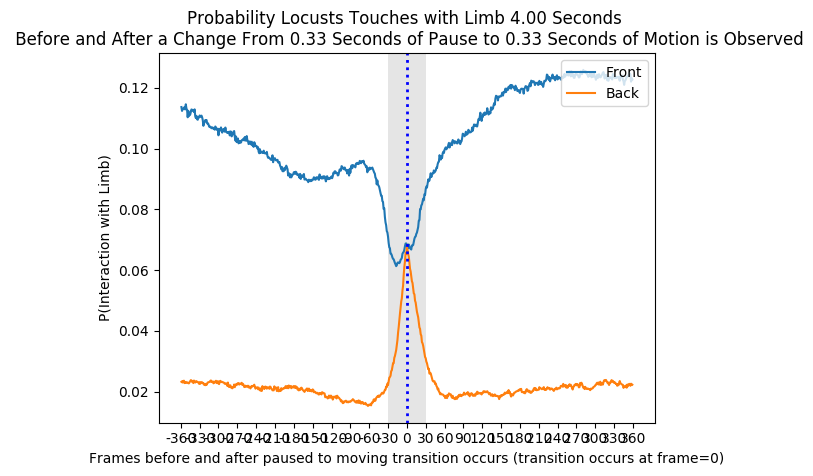



  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15144/323578 [00:00<00:02, 151436.53it/s]

  9%|▉         | 29265/323578 [00:00<00:01, 148213.84it/s]

 13%|█▎        | 42975/323578 [00:00<00:01, 144693.39it/s]

 17%|█▋        | 56559/323578 [00:00<00:01, 141917.93it/s]

 21%|██▏       | 69161/323578 [00:00<00:01, 136713.39it/s]

 25%|██▌       | 81015/323578 [00:00<00:01, 130700.81it/s]

 29%|██▉       | 94643/323578 [00:00<00:01, 132324.39it/s]

 33%|███▎      | 107856/323578 [00:00<00:01, 132263.77it/s]

 37%|███▋      | 121030/323578 [00:00<00:01, 131741.98it/s]

 42%|████▏     | 136997/323578 [00:01<00:01, 139036.31it/s]

 47%|████▋     | 150608/323578 [00:01<00:01, 135663.31it/s]

 51%|█████     | 165260/323578 [00:01<00:01, 138746.17it/s]

 56%|█████▌    | 181435/323578 [00:01<00:00, 144928.22it/s]

 61%|██████    | 195920/323578 [00:01<00:00, 144054.01it/s]

 66%|██████▌   | 212129/323578 [00:01<00:00, 149028.16it/s]

 71%|███████   | 228586/323578 [00:01<00:00, 1

0
1


 26%|██▌       | 83988/323578 [00:00<00:01, 143360.54it/s]

 30%|███       | 97092/323578 [00:00<00:01, 139426.45it/s]

 35%|███▍      | 112245/323578 [00:00<00:01, 142848.29it/s]

 40%|███▉      | 128504/323578 [00:00<00:01, 148248.24it/s]

 45%|████▍     | 145279/323578 [00:01<00:01, 153604.39it/s]

 50%|████▉     | 161005/323578 [00:01<00:01, 154680.86it/s]

 55%|█████▍    | 177747/323578 [00:01<00:00, 158291.98it/s]

 60%|██████    | 194463/323578 [00:01<00:00, 160850.26it/s]

 65%|██████▌   | 210493/323578 [00:01<00:00, 156835.44it/s]

 70%|██████▉   | 226160/323578 [00:01<00:00, 155606.19it/s]

 75%|███████▍  | 241711/323578 [00:01<00:00, 153788.68it/s]

 80%|███████▉  | 257954/323578 [00:01<00:00, 156282.69it/s]

 85%|████████▍ | 273591/323578 [00:01<00:00, 156071.12it/s]

 89%|████████▉ | 289205/323578 [00:01<00:00, 155972.49it/s]

 94%|█████████▍| 304807/323578 [00:02<00:00, 155867.75it/s]

 99%|█████████▉| 320397/323578 [00:02<00:00, 141703.78it/s]

100%|██████████| 323578/32

2




 75%|███████▍  | 241646/323578 [00:02<00:00, 110762.25it/s]

 79%|███████▉  | 255356/323578 [00:02<00:00, 117535.74it/s]

 83%|████████▎ | 267340/323578 [00:02<00:00, 114390.85it/s]

 87%|████████▋ | 280673/323578 [00:02<00:00, 119480.69it/s]

 91%|█████████ | 292956/323578 [00:02<00:00, 120465.50it/s]

 94%|█████████▍| 305419/323578 [00:02<00:00, 121684.43it/s]

 98%|█████████▊| 317683/323578 [00:02<00:00, 118030.08it/s]

100%|██████████| 323578/323578 [00:02<00:00, 118139.77it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15673/323578 [00:00<00:01, 156729.78it/s]

  9%|▊         | 28082/323578 [00:00<00:02, 145265.25it/s]

 13%|█▎        | 40475/323578 [00:00<00:02, 138129.07it/s]

 16%|█▌        | 51118/323578 [00:00<00:02, 126798.92it/s]

 19%|█▉        | 61695/323578 [00:00<00:02, 119660.84it/s]

 23%|██▎       | 75945/323578 [00:00<00:01, 125704.60it/s]

 29%|██▊       | 92605/323578 [00:00<00:01, 135697.01it/s]

 33%|███▎      | 105327/323578 [00:00<00:01, 1

3
4


 12%|█▏        | 38098/323578 [00:00<00:03, 94769.02it/s]

 15%|█▍        | 48234/323578 [00:00<00:02, 96654.15it/s]

 18%|█▊        | 59537/323578 [00:00<00:02, 101044.90it/s]

 22%|██▏       | 72065/323578 [00:00<00:02, 107269.68it/s]

 25%|██▌       | 82199/323578 [00:00<00:02, 96218.79it/s] 

 28%|██▊       | 92159/323578 [00:00<00:02, 97208.63it/s]

 31%|███▏      | 101742/323578 [00:01<00:02, 96226.93it/s]

 34%|███▍      | 111271/323578 [00:01<00:02, 94547.90it/s]

 37%|███▋      | 120667/323578 [00:01<00:02, 93036.54it/s]

 40%|████      | 130775/323578 [00:01<00:02, 95181.01it/s]

 43%|████▎     | 140280/323578 [00:01<00:02, 88823.85it/s]

 47%|████▋     | 152313/323578 [00:01<00:01, 96394.98it/s]

 50%|█████     | 163376/323578 [00:01<00:01, 100265.35it/s]

 55%|█████▍    | 177865/323578 [00:01<00:01, 110471.69it/s]

 60%|█████▉    | 193543/323578 [00:01<00:01, 121211.66it/s]

 64%|██████▍   | 206305/323578 [00:01<00:00, 118174.81it/s]

 68%|██████▊   | 219428/323578 [00:02<0

5




 90%|█████████ | 292247/323578 [00:02<00:00, 108100.70it/s]

 94%|█████████▎| 303098/323578 [00:02<00:00, 104617.93it/s]

 97%|█████████▋| 313613/323578 [00:02<00:00, 103420.68it/s]

100%|██████████| 323578/323578 [00:02<00:00, 108428.81it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12297/323578 [00:00<00:02, 122964.55it/s]

  7%|▋         | 22866/323578 [00:00<00:02, 117216.92it/s]

 11%|█         | 34596/323578 [00:00<00:02, 117240.86it/s]

 15%|█▍        | 47358/323578 [00:00<00:02, 120172.61it/s]

 19%|█▊        | 60358/323578 [00:00<00:02, 122960.15it/s]

 23%|██▎       | 73430/323578 [00:00<00:01, 125189.48it/s]

 27%|██▋       | 86562/323578 [00:00<00:01, 126967.10it/s]

 31%|███▏      | 101271/323578 [00:00<00:01, 131811.76it/s]

 35%|███▌      | 113817/323578 [00:00<00:01, 129539.91it/s]

 39%|███▉      | 126335/323578 [00:01<00:01, 127097.91it/s]

 43%|████▎     | 140048/323578 [00:01<00:01, 129948.85it/s]

 47%|████▋     | 152853/323578 [00:01<00:01, 1

6
7




 19%|█▉        | 62494/323578 [00:00<00:02, 118148.37it/s]

 23%|██▎       | 72988/323578 [00:00<00:02, 113848.77it/s]

 26%|██▌       | 83071/323578 [00:00<00:02, 109601.63it/s]

 30%|██▉       | 95469/323578 [00:00<00:02, 113552.08it/s]

 34%|███▎      | 108694/323578 [00:00<00:01, 118521.92it/s]

 38%|███▊      | 122109/323578 [00:01<00:01, 122223.07it/s]

 41%|████▏     | 134117/323578 [00:01<00:01, 120587.20it/s]

 47%|████▋     | 150913/323578 [00:01<00:01, 131732.55it/s]

 51%|█████▏    | 166352/323578 [00:01<00:01, 137798.08it/s]

 56%|█████▌    | 180349/323578 [00:01<00:01, 137542.51it/s]

 60%|██████    | 194747/323578 [00:01<00:00, 139409.25it/s]

 65%|██████▍   | 208801/323578 [00:01<00:00, 136202.90it/s]

 69%|██████▉   | 222865/323578 [00:01<00:00, 137502.18it/s]

 73%|███████▎  | 237085/323578 [00:01<00:00, 138877.87it/s]

 78%|███████▊  | 251025/323578 [00:01<00:00, 129199.43it/s]

 82%|████████▏ | 264117/323578 [00:02<00:00, 128553.64it/s]

 86%|████████▌ | 277094/32

8
9




 20%|█▉        | 63470/323578 [00:00<00:02, 126309.31it/s]

 24%|██▍       | 76943/323578 [00:00<00:01, 128722.13it/s]

 28%|██▊       | 91499/323578 [00:00<00:01, 133349.27it/s]

 33%|███▎      | 105829/323578 [00:00<00:01, 136184.39it/s]

 37%|███▋      | 119014/323578 [00:00<00:01, 134853.99it/s]

 41%|████      | 133209/323578 [00:01<00:01, 136905.79it/s]

 45%|████▌     | 146557/323578 [00:01<00:01, 134152.98it/s]

 49%|████▉     | 159745/323578 [00:01<00:01, 128940.07it/s]

 54%|█████▎    | 173838/323578 [00:01<00:01, 132315.57it/s]

 58%|█████▊    | 187055/323578 [00:01<00:01, 132271.43it/s]

 62%|██████▏   | 200241/323578 [00:01<00:00, 127730.05it/s]

 66%|██████▋   | 214703/323578 [00:01<00:00, 132367.53it/s]

 71%|███████   | 228502/323578 [00:01<00:00, 134005.42it/s]

 75%|███████▍  | 241940/323578 [00:01<00:00, 130252.27it/s]

 79%|███████▉  | 256998/323578 [00:01<00:00, 135748.10it/s]

 84%|████████▎ | 270668/323578 [00:02<00:00, 133041.50it/s]

 88%|████████▊ | 284051/3

10




 45%|████▍     | 144007/323578 [00:01<00:01, 119957.80it/s]

 48%|████▊     | 156167/323578 [00:01<00:01, 120413.40it/s]

 52%|█████▏    | 168703/323578 [00:01<00:01, 121372.06it/s]

 57%|█████▋    | 183432/323578 [00:01<00:01, 128136.04it/s]

 61%|██████    | 197751/323578 [00:01<00:00, 131996.25it/s]

 65%|██████▌   | 211085/323578 [00:01<00:00, 127969.54it/s]

 69%|██████▉   | 224434/323578 [00:01<00:00, 129577.08it/s]

 73%|███████▎  | 237481/323578 [00:01<00:00, 127022.41it/s]

 78%|███████▊  | 252534/323578 [00:01<00:00, 133263.80it/s]

 83%|████████▎ | 269021/323578 [00:02<00:00, 141394.01it/s]

 88%|████████▊ | 283903/323578 [00:02<00:00, 142608.68it/s]

 92%|█████████▏| 298326/323578 [00:02<00:00, 132340.82it/s]

 97%|█████████▋| 312654/323578 [00:02<00:00, 135442.37it/s]

100%|██████████| 323578/323578 [00:02<00:00, 129397.52it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11823/323578 [00:00<00:02, 118229.83it/s]

  8%|▊         | 24445/323578 [00:00<00:

11




 99%|█████████▉| 320878/323578 [00:02<00:00, 124823.90it/s]

100%|██████████| 323578/323578 [00:02<00:00, 136654.48it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11724/323578 [00:00<00:02, 117235.64it/s]

  8%|▊         | 25783/323578 [00:00<00:02, 123384.23it/s]

 11%|█         | 35345/323578 [00:00<00:02, 113002.58it/s]

 15%|█▌        | 49036/323578 [00:00<00:02, 119249.30it/s]

 18%|█▊        | 59160/323578 [00:00<00:02, 113207.05it/s]

 22%|██▏       | 72108/323578 [00:00<00:02, 117642.20it/s]

 26%|██▌       | 82707/323578 [00:00<00:02, 113788.12it/s]

 29%|██▉       | 93762/323578 [00:00<00:02, 112763.97it/s]

 32%|███▏      | 105113/323578 [00:00<00:01, 112212.08it/s]

 37%|███▋      | 118653/323578 [00:01<00:01, 117404.00it/s]

 40%|████      | 130188/323578 [00:01<00:01, 115064.78it/s]

 44%|████▍     | 143534/323578 [00:01<00:01, 120026.57it/s]

 48%|████▊     | 155499/323578 [00:01<00:01, 114571.04it/s]

 52%|█████▏    | 166982/323578 [00:01<00:01, 10

12
13




 41%|████      | 132228/323578 [00:01<00:01, 125584.80it/s]

 45%|████▍     | 145192/323578 [00:01<00:01, 126282.78it/s]

 49%|████▉     | 158011/323578 [00:01<00:01, 126848.19it/s]

 53%|█████▎    | 170537/323578 [00:01<00:01, 125572.36it/s]

 57%|█████▋    | 184504/323578 [00:01<00:01, 129493.19it/s]

 61%|██████▏   | 198650/323578 [00:01<00:00, 132863.72it/s]

 65%|██████▌   | 211927/323578 [00:01<00:00, 129934.30it/s]

 70%|██████▉   | 224934/323578 [00:01<00:00, 129972.98it/s]

 74%|███████▍  | 239362/323578 [00:01<00:00, 133956.37it/s]

 79%|███████▉  | 255879/323578 [00:01<00:00, 142006.09it/s]

 84%|████████▍ | 272190/323578 [00:02<00:00, 147740.35it/s]

 89%|████████▉ | 288790/323578 [00:02<00:00, 152780.19it/s]

 94%|█████████▍| 305413/323578 [00:02<00:00, 156579.80it/s]

100%|█████████▉| 322028/323578 [00:02<00:00, 159330.70it/s]

100%|██████████| 323578/323578 [00:02<00:00, 138804.06it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14251/323578 [00:00<00

14
15




 43%|████▎     | 139245/323578 [00:01<00:01, 143610.53it/s]

 48%|████▊     | 155850/323578 [00:01<00:01, 149678.02it/s]

 53%|█████▎    | 170716/323578 [00:01<00:01, 147746.93it/s]

 57%|█████▋    | 185425/323578 [00:01<00:00, 140405.25it/s]

 62%|██████▏   | 199496/323578 [00:01<00:00, 139222.89it/s]

 67%|██████▋   | 215586/323578 [00:01<00:00, 144279.51it/s]

 71%|███████   | 230078/323578 [00:01<00:00, 137125.58it/s]

 76%|███████▋  | 246735/323578 [00:01<00:00, 144804.08it/s]

 81%|████████  | 262020/323578 [00:01<00:00, 147127.02it/s]

 86%|████████▌ | 276881/323578 [00:01<00:00, 146950.86it/s]

 90%|█████████ | 291680/323578 [00:02<00:00, 144396.75it/s]

 95%|█████████▍| 306203/323578 [00:02<00:00, 133582.50it/s]

 99%|█████████▉| 319780/323578 [00:02<00:00, 132352.38it/s]

100%|██████████| 323578/323578 [00:02<00:00, 139796.05it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 12087/323578 [00:00<00:02, 118409.22it/s]

  7%|▋         | 22713/323578 [00:00<00:

16




 86%|████████▌ | 277171/323578 [00:02<00:00, 113166.19it/s]

 90%|████████▉ | 291200/323578 [00:02<00:00, 120132.74it/s]

 95%|█████████▍| 307280/323578 [00:02<00:00, 129995.25it/s]

100%|██████████| 323578/323578 [00:02<00:00, 119247.69it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10078/323578 [00:00<00:03, 99858.25it/s]

  6%|▋         | 20781/323578 [00:00<00:02, 101080.90it/s]

  9%|▉         | 29676/323578 [00:00<00:03, 97106.37it/s] 

 13%|█▎        | 40651/323578 [00:00<00:02, 100581.27it/s]

 16%|█▌        | 52038/323578 [00:00<00:02, 104230.09it/s]

 20%|██        | 64724/323578 [00:00<00:02, 110122.46it/s]

 24%|██▎       | 76253/323578 [00:00<00:02, 111621.83it/s]

 27%|██▋       | 86852/323578 [00:00<00:02, 109868.50it/s]

 30%|███       | 98469/323578 [00:00<00:02, 111685.25it/s]

 34%|███▍      | 110322/323578 [00:01<00:01, 112843.25it/s]

 38%|███▊      | 121371/323578 [00:01<00:01, 110050.36it/s]

 41%|████▏     | 133574/323578 [00:01<00:01, 1133

17




 92%|█████████▏| 297236/323578 [00:02<00:00, 120898.58it/s]

 96%|█████████▌| 309526/323578 [00:02<00:00, 116309.60it/s]

100%|█████████▉| 322288/323578 [00:02<00:00, 119485.30it/s]

100%|██████████| 323578/323578 [00:02<00:00, 112143.41it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15447/323578 [00:00<00:01, 154461.31it/s]

 10%|▉         | 31011/323578 [00:00<00:01, 154810.99it/s]

 13%|█▎        | 43533/323578 [00:00<00:01, 144559.74it/s]

 18%|█▊        | 59317/323578 [00:00<00:01, 148303.03it/s]

 23%|██▎       | 75964/323578 [00:00<00:01, 153320.21it/s]

 29%|██▊       | 92509/323578 [00:00<00:01, 156768.13it/s]

 33%|███▎      | 107322/323578 [00:00<00:01, 154071.63it/s]

 38%|███▊      | 121544/323578 [00:00<00:01, 132827.07it/s]

 42%|████▏     | 134514/323578 [00:00<00:01, 126068.24it/s]

 45%|████▌     | 147043/323578 [00:01<00:01, 125103.87it/s]

 49%|████▉     | 159452/323578 [00:01<00:01, 122313.50it/s]

 53%|█████▎    | 171627/323578 [00:01<00:01, 

18
19




 45%|████▍     | 144309/323578 [00:01<00:01, 143120.13it/s]

 49%|████▉     | 158291/323578 [00:01<00:01, 141437.72it/s]

 53%|█████▎    | 172208/323578 [00:01<00:01, 135107.95it/s]

 58%|█████▊    | 186752/323578 [00:01<00:00, 138049.73it/s]

 62%|██████▏   | 200504/323578 [00:01<00:00, 137765.74it/s]

 67%|██████▋   | 215532/323578 [00:01<00:00, 141295.23it/s]

 71%|███████   | 229658/323578 [00:01<00:00, 140707.82it/s]

 75%|███████▌  | 243727/323578 [00:01<00:00, 134081.76it/s]

 79%|███████▉  | 257200/323578 [00:01<00:00, 134124.55it/s]

 84%|████████▎ | 270658/323578 [00:01<00:00, 131214.30it/s]

 88%|████████▊ | 283825/323578 [00:02<00:00, 124083.65it/s]

 92%|█████████▏| 298167/323578 [00:02<00:00, 129163.86it/s]

 96%|█████████▌| 311216/323578 [00:02<00:00, 126080.68it/s]

100%|██████████| 323578/323578 [00:02<00:00, 135588.68it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12316/323578 [00:00<00:02, 121893.32it/s]



20


  7%|▋         | 24002/323578 [00:00<00:02, 120336.29it/s]

 10%|█         | 32429/323578 [00:00<00:02, 106642.79it/s]

 14%|█▍        | 45575/323578 [00:00<00:02, 113044.16it/s]

 17%|█▋        | 55330/323578 [00:00<00:02, 107902.39it/s]

 21%|██        | 67409/323578 [00:00<00:02, 111469.88it/s]

 25%|██▍       | 80014/323578 [00:00<00:02, 115476.68it/s]

 28%|██▊       | 91740/323578 [00:00<00:01, 116005.90it/s]

 33%|███▎      | 105204/323578 [00:00<00:01, 121029.10it/s]

 36%|███▋      | 117541/323578 [00:01<00:01, 121400.07it/s]

 41%|████      | 133020/323578 [00:01<00:01, 129798.71it/s]

 45%|████▌     | 145994/323578 [00:01<00:01, 127046.24it/s]

 49%|████▉     | 158708/323578 [00:01<00:01, 126629.28it/s]

 53%|█████▎    | 172875/323578 [00:01<00:01, 130791.71it/s]

 57%|█████▋    | 185994/323578 [00:01<00:01, 129604.74it/s]

 62%|██████▏   | 201452/323578 [00:01<00:00, 136205.85it/s]

 67%|██████▋   | 215262/323578 [00:01<00:00, 136766.71it/s]

 71%|███████▏  | 230629/323578 

21
22




 44%|████▍     | 142222/323578 [00:01<00:01, 126455.93it/s]

 48%|████▊     | 156122/323578 [00:01<00:01, 129973.80it/s]

 52%|█████▏    | 169747/323578 [00:01<00:01, 131794.40it/s]

 57%|█████▋    | 185259/323578 [00:01<00:01, 138018.72it/s]

 62%|██████▏   | 199136/323578 [00:01<00:00, 128634.23it/s]

 66%|██████▌   | 213359/323578 [00:01<00:00, 132431.14it/s]

 71%|███████   | 229618/323578 [00:01<00:00, 140234.05it/s]

 76%|███████▌  | 244914/323578 [00:01<00:00, 143823.36it/s]

 80%|████████  | 259482/323578 [00:01<00:00, 134870.55it/s]

 85%|████████▍ | 273514/323578 [00:02<00:00, 136458.74it/s]

 89%|████████▉ | 287335/323578 [00:02<00:00, 134581.90it/s]

 93%|█████████▎| 300981/323578 [00:02<00:00, 135138.19it/s]

 98%|█████████▊| 316899/323578 [00:02<00:00, 141550.33it/s]

100%|██████████| 323578/323578 [00:02<00:00, 133392.33it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12620/323578 [00:00<00:02, 126198.32it/s]

  8%|▊         | 25060/323578 [00:00<00:

23




 44%|████▎     | 141537/323578 [00:01<00:01, 123552.94it/s]

 48%|████▊     | 155402/323578 [00:01<00:01, 127724.89it/s]

 52%|█████▏    | 168291/323578 [00:01<00:01, 127202.63it/s]

 56%|█████▌    | 181094/323578 [00:01<00:01, 118463.83it/s]

 60%|█████▉    | 193119/323578 [00:01<00:01, 116948.68it/s]

 63%|██████▎   | 204943/323578 [00:01<00:01, 116937.15it/s]

 67%|██████▋   | 216728/323578 [00:01<00:00, 115637.22it/s]

 71%|███████   | 228359/323578 [00:01<00:00, 110330.97it/s]

 75%|███████▌  | 243027/323578 [00:01<00:00, 119191.33it/s]

 80%|███████▉  | 257934/323578 [00:02<00:00, 126816.26it/s]

 84%|████████▎ | 270941/323578 [00:02<00:00, 126358.73it/s]

 88%|████████▊ | 283805/323578 [00:02<00:00, 124617.81it/s]

 92%|█████████▏| 296432/323578 [00:02<00:00, 122475.73it/s]

 96%|█████████▌| 309333/323578 [00:02<00:00, 124365.38it/s]

100%|█████████▉| 322499/323578 [00:02<00:00, 126466.19it/s]

100%|██████████| 323578/323578 [00:02<00:00, 123551.17it/s]

  0%|          | 0/323

24


100%|██████████| 323578/323578 [00:02<00:00, 124495.08it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15288/323578 [00:00<00:02, 152876.87it/s]

  9%|▉         | 29031/323578 [00:00<00:01, 147887.75it/s]

 12%|█▏        | 40091/323578 [00:00<00:02, 134302.14it/s]

 17%|█▋        | 54065/323578 [00:00<00:01, 135843.31it/s]

 21%|██        | 68671/323578 [00:00<00:01, 138753.56it/s]

 26%|██▌       | 82539/323578 [00:00<00:01, 138730.33it/s]

 30%|███       | 97357/323578 [00:00<00:01, 141435.77it/s]

 34%|███▍      | 110327/323578 [00:00<00:01, 137329.44it/s]

 39%|███▊      | 124904/323578 [00:00<00:01, 139755.76it/s]

 43%|████▎     | 138627/323578 [00:01<00:01, 138987.36it/s]

 47%|████▋     | 153517/323578 [00:01<00:01, 140802.73it/s]

 52%|█████▏    | 167336/323578 [00:01<00:01, 136128.03it/s]

 56%|█████▌    | 181321/323578 [00:01<00:01, 137221.48it/s]

 60%|██████    | 194941/323578 [00:01<00:00, 135027.30it/s]

 65%|██████▍   | 209594/323578 [00:01<00:00, 138

25
26




 70%|███████   | 228020/323578 [00:01<00:00, 164404.06it/s]

 76%|███████▌  | 244470/323578 [00:01<00:00, 156361.22it/s]

 81%|████████  | 261647/323578 [00:01<00:00, 160684.41it/s]

 86%|████████▌ | 278752/323578 [00:01<00:00, 163657.43it/s]

 91%|█████████▏| 295917/323578 [00:01<00:00, 165975.53it/s]

 97%|█████████▋| 313190/323578 [00:02<00:00, 167943.34it/s]

100%|██████████| 323578/323578 [00:02<00:00, 155082.39it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12730/323578 [00:00<00:02, 125318.59it/s]

  8%|▊         | 25096/323578 [00:00<00:02, 124815.86it/s]

 11%|█▏        | 36431/323578 [00:00<00:02, 121138.17it/s]

 15%|█▌        | 49988/323578 [00:00<00:02, 125132.50it/s]

 20%|█▉        | 64029/323578 [00:00<00:02, 129196.32it/s]

 24%|██▍       | 77430/323578 [00:00<00:01, 130603.03it/s]

 28%|██▊       | 91763/323578 [00:00<00:01, 134177.25it/s]

 32%|███▏      | 104925/323578 [00:00<00:01, 133397.42it/s]

 36%|███▋      | 117586/323578 [00:00<00:01, 1

27
28




 16%|█▌        | 50208/323578 [00:00<00:02, 121518.14it/s]

 19%|█▉        | 61097/323578 [00:00<00:02, 116427.57it/s]

 23%|██▎       | 72938/323578 [00:00<00:02, 117014.01it/s]

 26%|██▋       | 85562/323578 [00:00<00:01, 119635.69it/s]

 30%|██▉       | 96692/323578 [00:00<00:01, 117005.30it/s]

 34%|███▍      | 110777/323578 [00:00<00:01, 123265.45it/s]

 39%|███▉      | 125798/323578 [00:01<00:01, 129751.98it/s]

 43%|████▎     | 138644/323578 [00:01<00:01, 123547.05it/s]

 47%|████▋     | 150971/323578 [00:01<00:01, 118121.77it/s]

 50%|█████     | 162814/323578 [00:01<00:01, 113751.37it/s]

 54%|█████▍    | 174246/323578 [00:01<00:01, 111028.85it/s]

 57%|█████▋    | 185403/323578 [00:01<00:01, 107289.14it/s]

 61%|██████    | 197105/323578 [00:01<00:01, 110033.56it/s]

 65%|██████▍   | 210307/323578 [00:01<00:00, 115819.20it/s]

 69%|██████▊   | 222014/323578 [00:01<00:00, 107406.16it/s]

 72%|███████▏  | 234579/323578 [00:01<00:00, 112296.08it/s]

 77%|███████▋  | 248576/323

29




 97%|█████████▋| 313718/323578 [00:02<00:00, 123269.48it/s]

100%|██████████| 323578/323578 [00:02<00:00, 118343.60it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14304/323578 [00:00<00:02, 143039.45it/s]

  9%|▊         | 27827/323578 [00:00<00:02, 140601.16it/s]

 13%|█▎        | 41007/323578 [00:00<00:02, 137837.28it/s]

 17%|█▋        | 55320/323578 [00:00<00:01, 139382.51it/s]

 21%|██        | 68052/323578 [00:00<00:01, 134222.25it/s]

 25%|██▌       | 82364/323578 [00:00<00:01, 136772.11it/s]

 30%|███       | 97290/323578 [00:00<00:01, 140292.99it/s]

 34%|███▍      | 110725/323578 [00:00<00:01, 138455.45it/s]

 38%|███▊      | 123792/323578 [00:00<00:01, 134830.42it/s]

 42%|████▏     | 136751/323578 [00:01<00:01, 132234.99it/s]

 46%|████▋     | 150323/323578 [00:01<00:01, 133260.94it/s]

 51%|█████     | 165461/323578 [00:01<00:01, 138222.86it/s]

 55%|█████▌    | 179158/323578 [00:01<00:01, 129235.40it/s]

 60%|█████▉    | 192988/323578 [00:01<00:00, 1

30
31


 51%|█████     | 164741/323578 [00:01<00:01, 157003.81it/s]

 56%|█████▌    | 180348/323578 [00:01<00:00, 156720.74it/s]

 61%|██████    | 197372/323578 [00:01<00:00, 160545.38it/s]

 66%|██████▌   | 214309/323578 [00:01<00:00, 163059.12it/s]

 71%|███████▏  | 231228/323578 [00:01<00:00, 164848.51it/s]

 77%|███████▋  | 247701/323578 [00:01<00:00, 164413.19it/s]

 82%|████████▏ | 264135/323578 [00:01<00:00, 158530.37it/s]

 87%|████████▋ | 280028/323578 [00:01<00:00, 153327.62it/s]

 91%|█████████▏| 295426/323578 [00:01<00:00, 150059.04it/s]

 96%|█████████▋| 311737/323578 [00:02<00:00, 153748.85it/s]

100%|██████████| 323578/323578 [00:02<00:00, 151642.69it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12621/323578 [00:00<00:02, 126206.21it/s]

  8%|▊         | 27196/323578 [00:00<00:02, 131495.47it/s]

 13%|█▎        | 43494/323578 [00:00<00:02, 139584.00it/s]

 19%|█▊        | 60029/323578 [00:00<00:01, 146428.03it/s]

 24%|██▎       | 76821/323578 [00:00<00:01, 1

32
33




 38%|███▊      | 123033/323578 [00:00<00:01, 146507.83it/s]

 43%|████▎     | 139655/323578 [00:01<00:01, 151909.81it/s]

 48%|████▊     | 156398/323578 [00:01<00:01, 156253.58it/s]

 53%|█████▎    | 172967/323578 [00:01<00:00, 158967.55it/s]

 58%|█████▊    | 188823/323578 [00:01<00:00, 150415.30it/s]

 64%|██████▎   | 205826/323578 [00:01<00:00, 155806.82it/s]

 69%|██████▊   | 221960/323578 [00:01<00:00, 157424.80it/s]

 74%|███████▍  | 238728/323578 [00:01<00:00, 160366.24it/s]

 79%|███████▉  | 255085/323578 [00:01<00:00, 161311.65it/s]

 84%|████████▍ | 271262/323578 [00:01<00:00, 156155.04it/s]

 89%|████████▉ | 287946/323578 [00:01<00:00, 159211.88it/s]

 94%|█████████▍| 304653/323578 [00:02<00:00, 161488.73it/s]

 99%|█████████▉| 321619/323578 [00:02<00:00, 163855.40it/s]

100%|██████████| 323578/323578 [00:02<00:00, 150585.08it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13259/323578 [00:00<00:02, 132287.34it/s]

  7%|▋         | 23623/323578 [00:00<00:

34


 96%|█████████▌| 310344/323578 [00:02<00:00, 161723.33it/s]

100%|██████████| 323578/323578 [00:02<00:00, 134358.25it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12714/323578 [00:00<00:02, 127138.61it/s]

  7%|▋         | 24111/323578 [00:00<00:02, 122877.72it/s]

 12%|█▏        | 37625/323578 [00:00<00:02, 126315.91it/s]

 15%|█▌        | 48905/323578 [00:00<00:02, 121931.56it/s]

 18%|█▊        | 59587/323578 [00:00<00:02, 116966.19it/s]

 22%|██▏       | 70727/323578 [00:00<00:02, 114060.77it/s]

 25%|██▌       | 81905/323578 [00:00<00:02, 112815.76it/s]

 29%|██▊       | 92334/323578 [00:00<00:02, 109258.96it/s]

 33%|███▎      | 105519/323578 [00:00<00:01, 115178.18it/s]

 36%|███▌      | 116655/323578 [00:01<00:01, 113135.94it/s]

 41%|████      | 131865/323578 [00:01<00:01, 122553.92it/s]

 45%|████▍     | 144166/323578 [00:01<00:01, 117831.38it/s]

 48%|████▊     | 156020/323578 [00:01<00:01, 116875.92it/s]

 52%|█████▏    | 167759/323578 [00:01<00:01, 1149

35
36




 53%|█████▎    | 171253/323578 [00:01<00:00, 160491.52it/s]

 58%|█████▊    | 187850/323578 [00:01<00:00, 162094.15it/s]

 63%|██████▎   | 204483/323578 [00:01<00:00, 163339.25it/s]

 68%|██████▊   | 220931/323578 [00:01<00:00, 163679.63it/s]

 73%|███████▎  | 237217/323578 [00:01<00:00, 161446.25it/s]

 79%|███████▊  | 254074/323578 [00:01<00:00, 163518.36it/s]

 84%|████████▎ | 270397/323578 [00:01<00:00, 162931.70it/s]

 89%|████████▊ | 286976/323578 [00:01<00:00, 163777.91it/s]

 94%|█████████▎| 303341/323578 [00:01<00:00, 162809.54it/s]

 99%|█████████▉| 319615/323578 [00:02<00:00, 161595.56it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157221.58it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12651/323578 [00:00<00:02, 126503.49it/s]

  7%|▋         | 23557/323578 [00:00<00:02, 119763.65it/s]

 11%|█         | 35820/323578 [00:00<00:02, 120609.00it/s]

 15%|█▌        | 49054/323578 [00:00<00:02, 123903.25it/s]

 20%|█▉        | 63366/323578 [00:00<00:02,

37
38


  8%|▊         | 24366/323578 [00:00<00:02, 125256.10it/s]

 12%|█▏        | 38024/323578 [00:00<00:02, 128450.08it/s]

 15%|█▍        | 47467/323578 [00:00<00:02, 115519.04it/s]

 18%|█▊        | 59562/323578 [00:00<00:02, 117094.83it/s]

 22%|██▏       | 70381/323578 [00:00<00:02, 114238.86it/s]

 26%|██▌       | 83336/323578 [00:00<00:02, 118437.09it/s]

 30%|███       | 97641/323578 [00:00<00:01, 124882.65it/s]

 34%|███▍      | 109569/323578 [00:00<00:01, 120555.90it/s]

 37%|███▋      | 121265/323578 [00:01<00:01, 115306.07it/s]

 42%|████▏     | 134670/323578 [00:01<00:01, 120352.93it/s]

 46%|████▌     | 147302/323578 [00:01<00:01, 120996.30it/s]

 49%|████▉     | 159343/323578 [00:01<00:01, 116465.27it/s]

 53%|█████▎    | 172229/323578 [00:01<00:01, 119925.36it/s]

 57%|█████▋    | 185235/323578 [00:01<00:01, 122793.90it/s]

 61%|██████    | 197548/323578 [00:01<00:01, 122530.33it/s]

 65%|██████▍   | 209825/323578 [00:01<00:00, 118562.04it/s]

 69%|██████▉   | 224171/323578 

39
40


 22%|██▏       | 71583/323578 [00:00<00:02, 114803.81it/s]

 25%|██▌       | 81872/323578 [00:00<00:02, 109907.56it/s]

 30%|██▉       | 95496/323578 [00:00<00:01, 116671.73it/s]

 33%|███▎      | 107880/323578 [00:00<00:01, 118732.68it/s]

 38%|███▊      | 123211/323578 [00:01<00:01, 127348.99it/s]

 42%|████▏     | 136679/323578 [00:01<00:01, 128646.91it/s]

 46%|████▌     | 149509/323578 [00:01<00:01, 117158.47it/s]

 51%|█████▏    | 166066/323578 [00:01<00:01, 128422.26it/s]

 56%|█████▋    | 182339/323578 [00:01<00:01, 137092.56it/s]

 61%|██████    | 196524/323578 [00:01<00:00, 137326.81it/s]

 65%|██████▌   | 210590/323578 [00:01<00:00, 125885.56it/s]

 69%|██████▉   | 224723/323578 [00:01<00:00, 130151.88it/s]

 74%|███████▎  | 238069/323578 [00:01<00:00, 127972.25it/s]

 78%|███████▊  | 251536/323578 [00:01<00:00, 129908.72it/s]

 83%|████████▎ | 267282/323578 [00:02<00:00, 137104.59it/s]

 87%|████████▋ | 281222/323578 [00:02<00:00, 132692.98it/s]

 91%|█████████ | 294683/323

41
42




 43%|████▎     | 138513/323578 [00:01<00:01, 110065.00it/s]

 48%|████▊     | 153823/323578 [00:01<00:01, 120201.00it/s]

 52%|█████▏    | 169842/323578 [00:01<00:01, 129931.14it/s]

 57%|█████▋    | 185882/323578 [00:01<00:00, 137781.61it/s]

 62%|██████▏   | 201424/323578 [00:01<00:00, 142636.38it/s]

 67%|██████▋   | 217620/323578 [00:01<00:00, 146878.16it/s]

 72%|███████▏  | 232581/323578 [00:01<00:00, 140647.61it/s]

 76%|███████▋  | 246893/323578 [00:01<00:00, 129978.92it/s]

 80%|████████  | 260225/323578 [00:02<00:00, 123472.41it/s]

 84%|████████▍ | 272874/323578 [00:02<00:00, 118387.27it/s]

 88%|████████▊ | 285588/323578 [00:02<00:00, 120882.51it/s]

 92%|█████████▏| 298009/323578 [00:02<00:00, 121860.04it/s]

 96%|█████████▋| 311740/323578 [00:02<00:00, 126038.33it/s]

100%|██████████| 323578/323578 [00:02<00:00, 124123.46it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13672/323578 [00:00<00:02, 136715.89it/s]

  9%|▉         | 28646/323578 [00:00<00:

43




 52%|█████▏    | 168857/323578 [00:01<00:01, 145406.31it/s]

 57%|█████▋    | 183463/323578 [00:01<00:00, 145601.11it/s]

 61%|██████▏   | 198849/323578 [00:01<00:00, 147982.88it/s]

 67%|██████▋   | 215658/323578 [00:01<00:00, 153490.35it/s]

 71%|███████▏  | 231021/323578 [00:01<00:00, 150719.00it/s]

 77%|███████▋  | 247807/323578 [00:01<00:00, 155481.12it/s]

 82%|████████▏ | 263832/323578 [00:01<00:00, 156880.11it/s]

 86%|████████▋ | 279560/323578 [00:01<00:00, 156193.51it/s]

 91%|█████████▏| 295296/323578 [00:01<00:00, 156540.24it/s]

 96%|█████████▌| 310971/323578 [00:02<00:00, 156500.49it/s]

100%|██████████| 323578/323578 [00:02<00:00, 153207.91it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14135/323578 [00:00<00:02, 141342.05it/s]

  9%|▊         | 27956/323578 [00:00<00:02, 140386.45it/s]

 13%|█▎        | 41354/323578 [00:00<00:02, 138400.83it/s]

 18%|█▊        | 58408/323578 [00:00<00:01, 146693.29it/s]

 22%|██▏       | 71372/323578 [00:00<00:01,

44
45




 61%|██████    | 197712/323578 [00:01<00:00, 153014.03it/s]

 66%|██████▋   | 214447/323578 [00:01<00:00, 157048.79it/s]

 71%|███████▏  | 231074/323578 [00:01<00:00, 159647.09it/s]

 77%|███████▋  | 247963/323578 [00:01<00:00, 162275.08it/s]

 82%|████████▏ | 264790/323578 [00:01<00:00, 164027.81it/s]

 87%|████████▋ | 281694/323578 [00:01<00:00, 165498.98it/s]

 92%|█████████▏| 298537/323578 [00:01<00:00, 166367.10it/s]

 97%|█████████▋| 315383/323578 [00:02<00:00, 166988.82it/s]

100%|██████████| 323578/323578 [00:02<00:00, 155908.49it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10480/323578 [00:00<00:02, 104796.10it/s]

  7%|▋         | 23192/323578 [00:00<00:02, 110622.72it/s]

 11%|█         | 36038/323578 [00:00<00:02, 115430.76it/s]

 15%|█▍        | 48195/323578 [00:00<00:02, 117204.84it/s]

 19%|█▉        | 63085/323578 [00:00<00:02, 125199.89it/s]

 23%|██▎       | 74784/323578 [00:00<00:02, 122618.28it/s]

 28%|██▊       | 89943/323578 [00:00<00:01, 1

46
47




  5%|▍         | 15430/323578 [00:00<00:01, 154292.05it/s]

 10%|▉         | 31277/323578 [00:00<00:01, 155519.87it/s]

 14%|█▍        | 46276/323578 [00:00<00:01, 153775.30it/s]

 19%|█▉        | 62599/323578 [00:00<00:01, 156452.12it/s]

 25%|██▍       | 79280/323578 [00:00<00:01, 159421.79it/s]

 29%|██▉       | 95333/323578 [00:00<00:01, 159752.58it/s]

 34%|███▍      | 111525/323578 [00:00<00:01, 160395.37it/s]

 40%|███▉      | 128273/323578 [00:00<00:01, 162456.27it/s]

 44%|████▍     | 143969/323578 [00:00<00:01, 160766.03it/s]

 50%|████▉     | 160723/323578 [00:01<00:01, 162737.67it/s]

 55%|█████▍    | 177437/323578 [00:01<00:00, 164033.18it/s]

 60%|█████▉    | 194097/323578 [00:01<00:00, 164792.60it/s]

 65%|██████▌   | 210785/323578 [00:01<00:00, 165412.54it/s]

 70%|███████   | 227591/323578 [00:01<00:00, 166195.20it/s]

 76%|███████▌  | 244323/323578 [00:01<00:00, 166529.20it/s]

 81%|████████  | 260908/323578 [00:01<00:00, 145550.32it/s]

 85%|████████▌ | 275892/3235

48




100%|█████████▉| 322148/323578 [00:02<00:00, 158119.69it/s]

100%|██████████| 323578/323578 [00:02<00:00, 136669.77it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12915/323578 [00:00<00:02, 126522.13it/s]

  8%|▊         | 24944/323578 [00:00<00:02, 124583.73it/s]

 12%|█▏        | 39645/323578 [00:00<00:02, 130558.01it/s]

 17%|█▋        | 53474/323578 [00:00<00:02, 132783.21it/s]

 21%|██        | 66436/323578 [00:00<00:01, 131815.80it/s]

 24%|██▍       | 78421/323578 [00:00<00:01, 126545.84it/s]

 28%|██▊       | 91491/323578 [00:00<00:01, 127763.06it/s]

 32%|███▏      | 103283/323578 [00:00<00:01, 118288.77it/s]

 35%|███▌      | 114563/323578 [00:00<00:01, 114453.33it/s]

 39%|███▉      | 126799/323578 [00:01<00:01, 116714.28it/s]

 43%|████▎     | 138671/323578 [00:01<00:01, 116410.20it/s]

 47%|████▋     | 152228/323578 [00:01<00:01, 121563.89it/s]

49




 51%|█████     | 164327/323578 [00:01<00:01, 117562.16it/s]

 55%|█████▍    | 176997/323578 [00:01<00:01, 120161.19it/s]

 58%|█████▊    | 189019/323578 [00:01<00:01, 115157.51it/s]

 63%|██████▎   | 202299/323578 [00:01<00:01, 119937.34it/s]

 66%|██████▋   | 214378/323578 [00:01<00:00, 114093.87it/s]

 70%|██████▉   | 226187/323578 [00:01<00:00, 115262.44it/s]

 74%|███████▍  | 239596/323578 [00:01<00:00, 120331.02it/s]

 79%|███████▉  | 255836/323578 [00:02<00:00, 130468.80it/s]

 83%|████████▎ | 269482/323578 [00:02<00:00, 132209.49it/s]

 87%|████████▋ | 282941/323578 [00:02<00:00, 129748.17it/s]

 92%|█████████▏| 296363/323578 [00:02<00:00, 130097.75it/s]

 96%|█████████▋| 311607/323578 [00:02<00:00, 136075.18it/s]

100%|██████████| 323578/323578 [00:02<00:00, 125394.08it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12210/323578 [00:00<00:02, 122097.50it/s]

  8%|▊         | 25957/323578 [00:00<00:02, 126334.84it/s]

 13%|█▎        | 40559/323578 [00:00<00:0

50




 47%|████▋     | 151679/323578 [00:01<00:01, 129181.76it/s]

 51%|█████     | 164472/323578 [00:01<00:01, 126213.92it/s]

 55%|█████▍    | 177021/323578 [00:01<00:01, 125975.28it/s]

 59%|█████▉    | 191896/323578 [00:01<00:01, 131475.25it/s]

 64%|██████▍   | 206819/323578 [00:01<00:00, 136341.60it/s]

 69%|██████▉   | 223811/323578 [00:01<00:00, 144932.29it/s]

 74%|███████▎  | 238498/323578 [00:01<00:00, 142687.04it/s]

 78%|███████▊  | 252910/323578 [00:01<00:00, 132367.94it/s]

 83%|████████▎ | 267578/323578 [00:01<00:00, 136358.85it/s]

 87%|████████▋ | 281419/323578 [00:02<00:00, 122394.93it/s]

 91%|█████████▏| 295397/323578 [00:02<00:00, 127136.74it/s]

 95%|█████████▌| 308447/323578 [00:02<00:00, 127869.07it/s]

100%|█████████▉| 322719/323578 [00:02<00:00, 131987.66it/s]

100%|██████████| 323578/323578 [00:02<00:00, 133955.34it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12742/323578 [00:00<00:02, 126842.81it/s]

  8%|▊         | 26079/323578 [00:00<00:

51




 47%|████▋     | 151423/323578 [00:01<00:01, 119945.67it/s]

 51%|█████     | 163454/323578 [00:01<00:01, 118507.49it/s]

 54%|█████▍    | 175462/323578 [00:01<00:01, 118750.07it/s]

 58%|█████▊    | 188188/323578 [00:01<00:01, 120485.83it/s]

 62%|██████▏   | 200707/323578 [00:01<00:01, 121747.59it/s]

 66%|██████▌   | 213122/323578 [00:01<00:00, 122032.27it/s]

 70%|██████▉   | 226201/323578 [00:01<00:00, 124533.36it/s]

 74%|███████▍  | 238676/323578 [00:02<00:00, 121570.52it/s]

 78%|███████▊  | 251370/323578 [00:02<00:00, 123132.49it/s]

 82%|████████▏ | 265469/323578 [00:02<00:00, 127994.13it/s]

 86%|████████▌ | 278337/323578 [00:02<00:00, 127927.41it/s]

 90%|█████████ | 291652/323578 [00:02<00:00, 129450.60it/s]

 95%|█████████▌| 307595/323578 [00:02<00:00, 137189.50it/s]

 99%|█████████▉| 321466/323578 [00:02<00:00, 134949.31it/s]

100%|██████████| 323578/323578 [00:02<00:00, 121584.94it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10245/323578 [00:00<00

52


  7%|▋         | 23030/323578 [00:00<00:02, 107551.74it/s]

 12%|█▏        | 39199/323578 [00:00<00:02, 119559.99it/s]

 16%|█▋        | 53260/323578 [00:00<00:02, 125181.02it/s]

 20%|██        | 66117/323578 [00:00<00:02, 126178.66it/s]

 24%|██▍       | 77345/323578 [00:00<00:02, 108495.18it/s]

 28%|██▊       | 89622/323578 [00:00<00:02, 112416.28it/s]

 31%|███▏      | 101183/323578 [00:00<00:01, 113354.08it/s]

 35%|███▌      | 114184/323578 [00:00<00:01, 117883.95it/s]

 40%|███▉      | 128433/323578 [00:01<00:01, 124324.03it/s]

 44%|████▍     | 141726/323578 [00:01<00:01, 125969.97it/s]

 48%|████▊     | 154418/323578 [00:01<00:01, 126252.35it/s]

 52%|█████▏    | 168785/323578 [00:01<00:01, 130074.98it/s]

 56%|█████▌    | 182007/323578 [00:01<00:01, 129699.25it/s]

 61%|██████    | 196699/323578 [00:01<00:00, 134424.51it/s]

 65%|██████▌   | 210734/323578 [00:01<00:00, 135426.86it/s]

 69%|██████▉   | 224322/323578 [00:01<00:00, 131487.87it/s]

 73%|███████▎  | 237528/323578

53




 11%|█▏        | 37026/323578 [00:00<00:02, 125021.48it/s]

 15%|█▍        | 47312/323578 [00:00<00:02, 117430.20it/s]

 19%|█▉        | 61016/323578 [00:00<00:02, 122697.38it/s]

 24%|██▎       | 76824/323578 [00:00<00:01, 131527.49it/s]

 29%|██▊       | 92770/323578 [00:00<00:01, 138821.57it/s]

 34%|███▍      | 109384/323578 [00:00<00:01, 146024.23it/s]

 39%|███▉      | 126207/323578 [00:00<00:01, 152042.83it/s]

 44%|████▍     | 143392/323578 [00:01<00:01, 157487.09it/s]

 50%|████▉     | 160522/323578 [00:01<00:01, 161390.55it/s]

 55%|█████▍    | 177375/323578 [00:01<00:00, 163466.40it/s]

 60%|██████    | 194379/323578 [00:01<00:00, 165382.11it/s]

 65%|██████▌   | 211346/323578 [00:01<00:00, 166643.61it/s]

 71%|███████   | 228237/323578 [00:01<00:00, 167316.92it/s]

 76%|███████▌  | 245321/323578 [00:01<00:00, 168357.83it/s]

 81%|████████  | 262309/323578 [00:01<00:00, 168810.46it/s]

 86%|████████▋ | 279293/323578 [00:01<00:00, 169116.13it/s]

 92%|█████████▏| 296465/323

54




 12%|█▏        | 39446/323578 [00:00<00:02, 128746.30it/s]

 17%|█▋        | 54255/323578 [00:00<00:02, 133996.33it/s]

 21%|██        | 68468/323578 [00:00<00:01, 136336.17it/s]

 25%|██▍       | 80645/323578 [00:00<00:01, 131612.72it/s]

 29%|██▉       | 94853/323578 [00:00<00:01, 134585.16it/s]

 34%|███▍      | 110184/323578 [00:00<00:01, 139701.92it/s]

 39%|███▉      | 126692/323578 [00:00<00:01, 146455.91it/s]

 44%|████▍     | 143817/323578 [00:01<00:01, 153105.51it/s]

 49%|████▉     | 159820/323578 [00:01<00:01, 155116.79it/s]

 54%|█████▍    | 175239/323578 [00:01<00:00, 153815.25it/s]

 59%|█████▉    | 191873/323578 [00:01<00:00, 157367.76it/s]

 65%|██████▍   | 208727/323578 [00:01<00:00, 160559.81it/s]

 70%|██████▉   | 225254/323578 [00:01<00:00, 161942.55it/s]

 75%|███████▍  | 241451/323578 [00:01<00:00, 156511.25it/s]

 80%|███████▉  | 258578/323578 [00:01<00:00, 160663.25it/s]

 85%|████████▍ | 274701/323578 [00:01<00:00, 160571.34it/s]

 90%|█████████ | 292042/323

55


  7%|▋         | 21178/323578 [00:00<00:02, 102316.95it/s]

 10%|█         | 32365/323578 [00:00<00:02, 105005.60it/s]

 14%|█▍        | 46733/323578 [00:00<00:02, 114228.96it/s]

 18%|█▊        | 58140/323578 [00:00<00:02, 114084.55it/s]

 22%|██▏       | 71110/323578 [00:00<00:02, 118357.99it/s]

 25%|██▌       | 81966/323578 [00:00<00:02, 112023.62it/s]

 30%|███       | 97127/323578 [00:00<00:01, 121543.00it/s]

 35%|███▍      | 111702/323578 [00:00<00:01, 127664.77it/s]

 39%|███▉      | 127029/323578 [00:01<00:01, 134398.99it/s]

 44%|████▍     | 143956/323578 [00:01<00:01, 143251.25it/s]

 50%|████▉     | 161112/323578 [00:01<00:01, 150710.17it/s]

 55%|█████▌    | 178321/323578 [00:01<00:00, 156544.57it/s]

 60%|██████    | 195255/323578 [00:01<00:00, 160174.63it/s]

 66%|██████▌   | 212288/323578 [00:01<00:00, 163091.49it/s]

 71%|███████   | 229466/323578 [00:01<00:00, 165602.66it/s]

 76%|███████▌  | 246564/323578 [00:01<00:00, 167178.19it/s]

 81%|████████▏ | 263711/323578 

56




 13%|█▎        | 43196/323578 [00:00<00:01, 141820.81it/s]

 19%|█▊        | 59977/323578 [00:00<00:01, 148730.79it/s]

 23%|██▎       | 75888/323578 [00:00<00:01, 151698.33it/s]

 29%|██▊       | 92340/323578 [00:00<00:01, 155328.85it/s]

 34%|███▍      | 109403/323578 [00:00<00:01, 159621.31it/s]

 39%|███▉      | 126564/323578 [00:00<00:01, 163036.43it/s]

 44%|████▍     | 143539/323578 [00:00<00:01, 164991.83it/s]

 50%|████▉     | 160239/323578 [00:01<00:00, 165586.54it/s]

 55%|█████▍    | 177412/323578 [00:01<00:00, 167380.52it/s]

 60%|██████    | 194457/323578 [00:01<00:00, 168288.91it/s]

 65%|██████▌   | 211130/323578 [00:01<00:00, 167583.81it/s]

 70%|███████   | 227901/323578 [00:01<00:00, 167618.94it/s]

 76%|███████▌  | 244937/323578 [00:01<00:00, 168430.93it/s]

 81%|████████  | 261961/323578 [00:01<00:00, 168968.09it/s]

 86%|████████▋ | 279125/323578 [00:01<00:00, 169758.17it/s]

 92%|█████████▏| 296307/323578 [00:01<00:00, 170371.19it/s]

 97%|█████████▋| 313328/32

57


  8%|▊         | 25101/323578 [00:00<00:02, 130612.91it/s]

 12%|█▏        | 38141/323578 [00:00<00:02, 130547.97it/s]

 16%|█▌        | 50910/323578 [00:00<00:02, 129675.30it/s]

 20%|█▉        | 64393/323578 [00:00<00:01, 131178.24it/s]

 24%|██▍       | 79174/323578 [00:00<00:01, 135760.27it/s]

 29%|██▉       | 95376/323578 [00:00<00:01, 142697.32it/s]

 35%|███▍      | 112154/323578 [00:00<00:01, 149395.64it/s]

 40%|███▉      | 128835/323578 [00:00<00:01, 154225.76it/s]

 45%|████▍     | 145241/323578 [00:01<00:01, 157048.08it/s]

 50%|█████     | 162219/323578 [00:01<00:01, 160661.39it/s]

 55%|█████▌    | 178117/323578 [00:01<00:00, 155613.14it/s]

 60%|██████    | 195219/323578 [00:01<00:00, 159933.75it/s]

 66%|██████▌   | 212062/323578 [00:01<00:00, 162389.71it/s]

 71%|███████   | 228774/323578 [00:01<00:00, 163778.08it/s]

 76%|███████▌  | 245772/323578 [00:01<00:00, 165590.31it/s]

 81%|████████  | 262333/323578 [00:01<00:00, 164387.88it/s]

 86%|████████▋ | 279315/323578

58




  7%|▋         | 24205/323578 [00:00<00:02, 125012.12it/s]

 11%|█         | 35601/323578 [00:00<00:02, 120250.88it/s]

 14%|█▍        | 45823/323578 [00:00<00:02, 113117.23it/s]

 18%|█▊        | 57809/323578 [00:00<00:02, 114695.71it/s]

 21%|██▏       | 69304/323578 [00:00<00:02, 113975.86it/s]

 25%|██▌       | 81256/323578 [00:00<00:02, 115583.97it/s]

 29%|██▉       | 94643/323578 [00:00<00:01, 120522.55it/s]

 33%|███▎      | 108017/323578 [00:00<00:01, 124203.55it/s]

 37%|███▋      | 119997/323578 [00:01<00:01, 122176.37it/s]

 41%|████      | 131914/323578 [00:01<00:01, 114885.39it/s]

 44%|████▍     | 143281/323578 [00:01<00:01, 113664.30it/s]

 48%|████▊     | 155419/323578 [00:01<00:01, 115519.49it/s]

 53%|█████▎    | 170110/323578 [00:01<00:01, 123430.04it/s]

 57%|█████▋    | 183101/323578 [00:01<00:01, 125303.25it/s]

 61%|██████▏   | 198766/323578 [00:01<00:00, 133305.43it/s]

 66%|██████▌   | 212298/323578 [00:01<00:00, 133260.55it/s]

 70%|██████▉   | 226083/32357

59


  9%|▉         | 28845/323578 [00:00<00:02, 140583.45it/s]

 13%|█▎        | 42242/323578 [00:00<00:02, 137610.90it/s]

 17%|█▋        | 55513/323578 [00:00<00:01, 136101.18it/s]

 21%|██        | 67848/323578 [00:00<00:01, 132006.88it/s]

 25%|██▍       | 80091/323578 [00:00<00:01, 128978.01it/s]

 28%|██▊       | 91425/323578 [00:00<00:01, 119393.88it/s]

 32%|███▏      | 103459/323578 [00:00<00:01, 119674.48it/s]

 35%|███▌      | 114760/323578 [00:00<00:01, 114183.03it/s]

 40%|███▉      | 127880/323578 [00:01<00:01, 118805.35it/s]

 43%|████▎     | 139520/323578 [00:01<00:01, 117066.91it/s]

 47%|████▋     | 152180/323578 [00:01<00:01, 119771.17it/s]

 51%|█████     | 164059/323578 [00:01<00:01, 115066.63it/s]

 54%|█████▍    | 175536/323578 [00:01<00:01, 108203.38it/s]

 58%|█████▊    | 187133/323578 [00:01<00:01, 110420.57it/s]

 62%|██████▏   | 199988/323578 [00:01<00:01, 115297.90it/s]

 66%|██████▌   | 213947/323578 [00:01<00:00, 121648.06it/s]

 71%|███████▏  | 230797/323578

60




 11%|█▏        | 37157/323578 [00:00<00:02, 125650.00it/s]

 15%|█▌        | 49434/323578 [00:00<00:02, 124770.13it/s]

 19%|█▉        | 61050/323578 [00:00<00:02, 122055.29it/s]

 24%|██▎       | 76680/323578 [00:00<00:01, 130642.05it/s]

 28%|██▊       | 89858/323578 [00:00<00:01, 130981.21it/s]

 32%|███▏      | 105159/323578 [00:00<00:01, 136892.93it/s]

 37%|███▋      | 118766/323578 [00:00<00:01, 136642.99it/s]

 41%|████      | 132669/323578 [00:01<00:01, 137349.61it/s]

 45%|████▌     | 146109/323578 [00:01<00:01, 135442.63it/s]

 50%|█████     | 162172/323578 [00:01<00:01, 142126.93it/s]

 54%|█████▍    | 176332/323578 [00:01<00:01, 135118.71it/s]

 60%|█████▉    | 192935/323578 [00:01<00:00, 143111.91it/s]

 64%|██████▍   | 207399/323578 [00:01<00:00, 141638.41it/s]

 69%|██████▊   | 222179/323578 [00:01<00:00, 143429.71it/s]

 74%|███████▍  | 239286/323578 [00:01<00:00, 150735.93it/s]

 79%|███████▊  | 254516/323578 [00:01<00:00, 150243.54it/s]

 83%|████████▎ | 269877/323

61




 12%|█▏        | 37282/323578 [00:00<00:02, 124580.76it/s]

 16%|█▋        | 53369/323578 [00:00<00:02, 133621.70it/s]

 20%|██        | 65196/323578 [00:00<00:02, 128611.15it/s]

 24%|██▍       | 77670/323578 [00:00<00:01, 126984.14it/s]

 28%|██▊       | 90735/323578 [00:00<00:01, 128061.52it/s]

 32%|███▏      | 103105/323578 [00:00<00:01, 126156.26it/s]

 36%|███▌      | 115066/323578 [00:00<00:01, 120795.64it/s]

 39%|███▉      | 127507/323578 [00:01<00:01, 121856.11it/s]

 44%|████▍     | 142306/323578 [00:01<00:01, 128671.42it/s]

 48%|████▊     | 155077/323578 [00:01<00:01, 123770.94it/s]

 52%|█████▏    | 168262/323578 [00:01<00:01, 125942.00it/s]

 56%|█████▌    | 181827/323578 [00:01<00:01, 128020.29it/s]

 60%|██████    | 194631/323578 [00:01<00:01, 126569.32it/s]

 64%|██████▍   | 208678/323578 [00:01<00:00, 130111.12it/s]

 69%|██████▊   | 221718/323578 [00:01<00:00, 128653.87it/s]

 73%|███████▎  | 234607/323578 [00:01<00:00, 126172.27it/s]

 76%|███████▋  | 247252/323

62


  6%|▋         | 20824/323578 [00:00<00:03, 99843.15it/s]

 11%|█         | 34705/323578 [00:00<00:02, 109024.71it/s]

 14%|█▍        | 44813/323578 [00:00<00:02, 106512.17it/s]

 17%|█▋        | 54653/323578 [00:00<00:02, 103940.64it/s]

 21%|██        | 67183/323578 [00:00<00:02, 109542.10it/s]

 24%|██▍       | 78767/323578 [00:00<00:02, 111357.02it/s]

 28%|██▊       | 89822/323578 [00:00<00:02, 111112.84it/s]

 32%|███▏      | 102648/323578 [00:00<00:01, 115753.77it/s]

 35%|███▌      | 114124/323578 [00:01<00:01, 114571.89it/s]

 40%|███▉      | 128255/323578 [00:01<00:01, 121466.14it/s]

 44%|████▍     | 142786/323578 [00:01<00:01, 127754.36it/s]

 48%|████▊     | 155639/323578 [00:01<00:01, 125047.92it/s]

 52%|█████▏    | 168211/323578 [00:01<00:01, 115234.61it/s]

 56%|█████▌    | 181928/323578 [00:01<00:01, 121041.28it/s]

 60%|██████    | 194306/323578 [00:01<00:01, 121848.83it/s]

 65%|██████▌   | 210541/323578 [00:01<00:00, 131681.64it/s]

 69%|██████▉   | 224045/323578 [

63




 11%|█▏        | 36478/323578 [00:00<00:02, 120778.55it/s]

 15%|█▌        | 49180/323578 [00:00<00:02, 122584.12it/s]

 18%|█▊        | 59000/323578 [00:00<00:02, 114084.61it/s]

 22%|██▏       | 71974/323578 [00:00<00:02, 118108.21it/s]

 26%|██▌       | 84575/323578 [00:00<00:01, 120052.17it/s]

 30%|███       | 97588/323578 [00:00<00:01, 122907.09it/s]

 34%|███▍      | 109297/323578 [00:00<00:01, 121077.39it/s]

 38%|███▊      | 122788/323578 [00:01<00:01, 124918.51it/s]

 43%|████▎     | 137582/323578 [00:01<00:01, 131035.50it/s]

 47%|████▋     | 150875/323578 [00:01<00:01, 131127.26it/s]

 51%|█████     | 165817/323578 [00:01<00:01, 136124.67it/s]

 55%|█████▌    | 179431/323578 [00:01<00:01, 132365.51it/s]

 60%|█████▉    | 192691/323578 [00:01<00:00, 132228.47it/s]

 64%|██████▎   | 205931/323578 [00:01<00:00, 123667.96it/s]

 68%|██████▊   | 219623/323578 [00:01<00:00, 127365.52it/s]

 72%|███████▏  | 234208/323578 [00:01<00:00, 132398.73it/s]

 77%|███████▋  | 248222/3235

64




 11%|█         | 34361/323578 [00:00<00:02, 107835.52it/s]

 16%|█▌        | 51004/323578 [00:00<00:02, 120562.73it/s]

 20%|██        | 66333/323578 [00:00<00:01, 128805.31it/s]

 25%|██▌       | 81400/323578 [00:00<00:01, 134666.39it/s]

 30%|███       | 98442/323578 [00:00<00:01, 143710.89it/s]

 36%|███▌      | 115185/323578 [00:00<00:01, 150088.16it/s]

 41%|████      | 132255/323578 [00:00<00:01, 155697.14it/s]

 46%|████▌     | 149138/323578 [00:01<00:01, 159415.12it/s]

 51%|█████▏    | 166119/323578 [00:01<00:00, 162396.84it/s]

 57%|█████▋    | 183189/323578 [00:01<00:00, 164783.10it/s]

 62%|██████▏   | 199694/323578 [00:01<00:00, 154860.44it/s]

 67%|██████▋   | 215390/323578 [00:01<00:00, 155483.22it/s]

 72%|███████▏  | 232345/323578 [00:01<00:00, 159450.03it/s]

 77%|███████▋  | 249463/323578 [00:01<00:00, 162796.50it/s]

 82%|████████▏ | 266586/323578 [00:01<00:00, 165236.12it/s]

 88%|████████▊ | 283930/323578 [00:01<00:00, 167613.63it/s]

 93%|█████████▎| 300965/323

65




  9%|▉         | 30604/323578 [00:00<00:02, 104260.45it/s]

 13%|█▎        | 41427/323578 [00:00<00:02, 105419.48it/s]

 17%|█▋        | 54188/323578 [00:00<00:02, 111221.65it/s]

 21%|██        | 67229/323578 [00:00<00:02, 116357.16it/s]

 25%|██▍       | 79460/323578 [00:00<00:02, 118079.67it/s]

 28%|██▊       | 91834/323578 [00:00<00:01, 119721.59it/s]

 32%|███▏      | 103241/323578 [00:00<00:01, 112218.74it/s]

 36%|███▌      | 115762/323578 [00:01<00:01, 115823.07it/s]

 39%|███▉      | 127164/323578 [00:01<00:01, 114956.51it/s]

 43%|████▎     | 139127/323578 [00:01<00:01, 116319.71it/s]

 48%|████▊     | 154501/323578 [00:01<00:01, 125481.73it/s]

 53%|█████▎    | 170617/323578 [00:01<00:01, 134407.57it/s]

 58%|█████▊    | 186768/323578 [00:01<00:00, 141531.30it/s]

 63%|██████▎   | 203772/323578 [00:01<00:00, 149025.83it/s]

 68%|██████▊   | 220800/323578 [00:01<00:00, 154823.14it/s]

 73%|███████▎  | 236899/323578 [00:01<00:00, 156620.66it/s]

 78%|███████▊  | 253645/3235

66




 12%|█▏        | 39901/323578 [00:00<00:02, 132020.18it/s]

 17%|█▋        | 54243/323578 [00:00<00:01, 135212.67it/s]

 21%|██        | 68392/323578 [00:00<00:01, 137023.06it/s]

 25%|██▌       | 81865/323578 [00:00<00:01, 135384.15it/s]

 29%|██▉       | 93878/323578 [00:00<00:01, 122553.48it/s]

 33%|███▎      | 106896/323578 [00:00<00:01, 123983.12it/s]

 37%|███▋      | 121150/323578 [00:00<00:01, 128545.06it/s]

 42%|████▏     | 136095/323578 [00:01<00:01, 134143.73it/s]

 46%|████▋     | 149810/323578 [00:01<00:01, 135017.55it/s]

 50%|█████     | 163180/323578 [00:01<00:01, 132827.62it/s]

 55%|█████▍    | 176378/323578 [00:01<00:01, 125294.92it/s]

 59%|█████▉    | 191873/323578 [00:01<00:00, 132925.63it/s]

 64%|██████▍   | 208525/323578 [00:01<00:00, 141488.50it/s]

 69%|██████▉   | 224156/323578 [00:01<00:00, 145628.89it/s]

 74%|███████▍  | 239758/323578 [00:01<00:00, 148596.96it/s]

 79%|███████▊  | 254779/323578 [00:01<00:00, 139501.84it/s]

 83%|████████▎ | 268956/323

67




 11%|█         | 34513/323578 [00:00<00:02, 112685.41it/s]

 14%|█▍        | 46689/323578 [00:00<00:02, 115262.00it/s]

 19%|█▊        | 60037/323578 [00:00<00:02, 120181.12it/s]

 23%|██▎       | 74548/323578 [00:00<00:01, 126710.17it/s]

 27%|██▋       | 87051/323578 [00:00<00:01, 126201.07it/s]

 31%|███       | 99379/323578 [00:00<00:01, 125308.26it/s]

 35%|███▌      | 114097/323578 [00:00<00:01, 131153.32it/s]

 40%|████      | 130113/323578 [00:01<00:01, 138688.15it/s]

 45%|████▍     | 144802/323578 [00:01<00:01, 141048.51it/s]

 49%|████▉     | 158841/323578 [00:01<00:01, 131626.06it/s]

 54%|█████▍    | 175767/323578 [00:01<00:01, 141022.97it/s]

 59%|█████▉    | 191930/323578 [00:01<00:00, 146623.93it/s]

 65%|██████▍   | 208975/323578 [00:01<00:00, 153026.74it/s]

 70%|██████▉   | 225445/323578 [00:01<00:00, 156350.50it/s]

 75%|███████▍  | 241261/323578 [00:01<00:00, 152629.06it/s]

 80%|███████▉  | 258200/323578 [00:01<00:00, 157296.78it/s]

 85%|████████▌ | 275095/3235

68




 10%|█         | 33387/323578 [00:00<00:02, 111660.18it/s]

 14%|█▍        | 46662/323578 [00:00<00:02, 117246.85it/s]

 19%|█▉        | 61203/323578 [00:00<00:02, 124479.61it/s]

 22%|██▏       | 72483/323578 [00:00<00:02, 120729.18it/s]

 27%|██▋       | 88147/323578 [00:00<00:01, 129644.11it/s]

 32%|███▏      | 102375/323578 [00:00<00:01, 133015.92it/s]

 36%|███▌      | 116083/323578 [00:00<00:01, 134208.43it/s]

 40%|████      | 130096/323578 [00:01<00:01, 135930.87it/s]

 45%|████▍     | 144648/323578 [00:01<00:01, 138670.57it/s]

 49%|████▉     | 159010/323578 [00:01<00:01, 140117.88it/s]

 54%|█████▍    | 174038/323578 [00:01<00:01, 143018.77it/s]

 59%|█████▉    | 190761/323578 [00:01<00:00, 149510.45it/s]

 64%|██████▎   | 205757/323578 [00:01<00:00, 145449.59it/s]

 69%|██████▊   | 222122/323578 [00:01<00:00, 150469.41it/s]

 73%|███████▎  | 237252/323578 [00:01<00:00, 146369.06it/s]

 78%|███████▊  | 251972/323578 [00:01<00:00, 141965.96it/s]

 82%|████████▏ | 266256/323

69




 12%|█▏        | 40263/323578 [00:00<00:02, 132201.10it/s]

 16%|█▌        | 52213/323578 [00:00<00:02, 127238.15it/s]

 20%|█▉        | 63812/323578 [00:00<00:02, 123206.13it/s]

 23%|██▎       | 74999/323578 [00:00<00:02, 119569.75it/s]

 27%|██▋       | 88060/323578 [00:00<00:01, 122678.81it/s]

 31%|███       | 101100/323578 [00:00<00:01, 124849.73it/s]

 35%|███▌      | 113323/323578 [00:00<00:01, 123369.26it/s]

 39%|███▉      | 126201/323578 [00:01<00:01, 124894.16it/s]

 43%|████▎     | 138952/323578 [00:01<00:01, 125388.21it/s]

 47%|████▋     | 151370/323578 [00:01<00:01, 125022.06it/s]

 51%|█████▏    | 166087/323578 [00:01<00:01, 130932.35it/s]

 55%|█████▌    | 179148/323578 [00:01<00:01, 128896.47it/s]

 60%|█████▉    | 193325/323578 [00:01<00:00, 132504.43it/s]

 64%|██████▍   | 206590/323578 [00:01<00:00, 129076.22it/s]

 68%|██████▊   | 219527/323578 [00:01<00:00, 128770.40it/s]

 72%|███████▏  | 232913/323578 [00:01<00:00, 130256.11it/s]

 76%|███████▌  | 246309/323

70




 10%|█         | 33043/323578 [00:00<00:02, 108453.00it/s]

 13%|█▎        | 43645/323578 [00:00<00:02, 107681.75it/s]

 17%|█▋        | 55080/323578 [00:00<00:02, 109599.07it/s]

 20%|██        | 65435/323578 [00:00<00:02, 107702.39it/s]

 23%|██▎       | 74893/323578 [00:00<00:02, 100030.94it/s]

 27%|██▋       | 87429/323578 [00:00<00:02, 106484.51it/s]

 30%|███       | 97625/323578 [00:00<00:02, 101866.73it/s]

 33%|███▎      | 107988/323578 [00:01<00:02, 102388.54it/s]

 37%|███▋      | 120012/323578 [00:01<00:01, 107160.20it/s]

 41%|████      | 133083/323578 [00:01<00:01, 113256.14it/s]

 46%|████▌     | 148395/323578 [00:01<00:01, 122849.97it/s]

 51%|█████     | 163638/323578 [00:01<00:01, 130413.96it/s]

 56%|█████▌    | 180487/323578 [00:01<00:01, 139897.85it/s]

 61%|██████    | 197428/323578 [00:01<00:00, 147610.51it/s]

 66%|██████▌   | 212592/323578 [00:01<00:00, 142532.21it/s]

 71%|███████   | 229710/323578 [00:01<00:00, 150065.23it/s]

 76%|███████▋  | 246904/32357

71




 11%|█         | 35351/323578 [00:00<00:02, 117435.30it/s]

 14%|█▍        | 45733/323578 [00:00<00:02, 112989.18it/s]

 17%|█▋        | 55030/323578 [00:00<00:02, 106131.58it/s]

 21%|██        | 66972/323578 [00:00<00:02, 109657.42it/s]

 25%|██▌       | 82062/323578 [00:00<00:02, 119450.39it/s]

 30%|███       | 97851/323578 [00:00<00:01, 128834.96it/s]

 34%|███▍      | 111297/323578 [00:00<00:01, 130472.19it/s]

 39%|███▊      | 124844/323578 [00:01<00:01, 131931.40it/s]

 43%|████▎     | 137918/323578 [00:01<00:01, 128746.35it/s]

 47%|████▋     | 150726/323578 [00:01<00:01, 128055.43it/s]

 51%|█████     | 163486/323578 [00:01<00:01, 110500.67it/s]

 54%|█████▍    | 174930/323578 [00:01<00:01, 109697.60it/s]

 58%|█████▊    | 189167/323578 [00:01<00:01, 117173.80it/s]

 63%|██████▎   | 203785/323578 [00:01<00:00, 124590.27it/s]

 68%|██████▊   | 219009/323578 [00:01<00:00, 131769.16it/s]

 72%|███████▏  | 232552/323578 [00:01<00:00, 131841.47it/s]

 76%|███████▌  | 245993/3235

72




 11%|█         | 34552/323578 [00:00<00:02, 118648.87it/s]

 14%|█▍        | 45753/323578 [00:00<00:02, 116574.93it/s]

 18%|█▊        | 58829/323578 [00:00<00:02, 120246.09it/s]

 21%|██▏       | 69420/323578 [00:00<00:02, 115553.06it/s]

 26%|██▌       | 83619/323578 [00:00<00:01, 122388.36it/s]

 30%|███       | 98152/323578 [00:00<00:01, 128470.52it/s]

 34%|███▍      | 110878/323578 [00:00<00:01, 128103.70it/s]

 38%|███▊      | 123294/323578 [00:01<00:01, 125342.87it/s]

 42%|████▏     | 137125/323578 [00:01<00:01, 128970.01it/s]

 47%|████▋     | 150596/323578 [00:01<00:01, 130639.11it/s]

 51%|█████     | 163555/323578 [00:01<00:01, 126871.42it/s]

 55%|█████▍    | 177330/323578 [00:01<00:01, 129948.92it/s]

 59%|█████▉    | 191099/323578 [00:01<00:01, 132176.96it/s]

 63%|██████▎   | 204315/323578 [00:01<00:00, 126900.98it/s]

 68%|██████▊   | 218926/323578 [00:01<00:00, 132111.27it/s]

 72%|███████▏  | 232799/323578 [00:01<00:00, 133143.27it/s]

 76%|███████▌  | 246176/3235

73




 12%|█▏        | 37820/323578 [00:00<00:02, 127420.73it/s]

 16%|█▌        | 51239/323578 [00:00<00:02, 129378.11it/s]

 20%|██        | 65835/323578 [00:00<00:01, 133941.75it/s]

 25%|██▍       | 80783/323578 [00:00<00:01, 138252.24it/s]

 29%|██▉       | 95061/323578 [00:00<00:01, 138531.60it/s]

 34%|███▍      | 110286/323578 [00:00<00:01, 142379.80it/s]

 39%|███▉      | 126578/323578 [00:00<00:01, 147938.16it/s]

 44%|████▍     | 143026/323578 [00:01<00:01, 152533.54it/s]

 49%|████▉     | 159816/323578 [00:01<00:01, 156837.44it/s]

 54%|█████▍    | 175329/323578 [00:01<00:01, 140134.93it/s]

 59%|█████▉    | 191721/323578 [00:01<00:00, 146510.87it/s]

 64%|██████▍   | 207782/323578 [00:01<00:00, 150473.60it/s]

 69%|██████▉   | 223014/323578 [00:01<00:00, 144419.89it/s]

 73%|███████▎  | 237637/323578 [00:01<00:00, 134223.89it/s]

 78%|███████▊  | 251331/323578 [00:01<00:00, 127106.53it/s]

 82%|████████▏ | 266336/323578 [00:01<00:00, 133215.86it/s]

 87%|████████▋ | 280706/323

74




 11%|█▏        | 36646/323578 [00:00<00:02, 122709.37it/s]

 14%|█▍        | 46902/323578 [00:00<00:02, 115878.71it/s]

 19%|█▉        | 60890/323578 [00:00<00:02, 122166.07it/s]

 24%|██▎       | 76666/323578 [00:00<00:01, 131034.06it/s]

 28%|██▊       | 89971/323578 [00:00<00:01, 130770.17it/s]

 32%|███▏      | 102480/323578 [00:00<00:01, 129011.01it/s]

 36%|███▌      | 115188/323578 [00:00<00:01, 128424.87it/s]

 39%|███▉      | 127628/323578 [00:01<00:01, 123908.23it/s]

 43%|████▎     | 139772/323578 [00:01<00:01, 120192.80it/s]

 47%|████▋     | 153340/323578 [00:01<00:01, 124452.80it/s]

 52%|█████▏    | 169092/323578 [00:01<00:01, 132816.00it/s]

 56%|█████▋    | 182526/323578 [00:01<00:01, 133267.32it/s]

 61%|██████    | 195930/323578 [00:01<00:01, 121603.36it/s]

 64%|██████▍   | 208342/323578 [00:01<00:00, 118918.12it/s]

 69%|██████▉   | 222759/323578 [00:01<00:00, 125512.37it/s]

 74%|███████▍  | 239086/323578 [00:01<00:00, 134867.72it/s]

 78%|███████▊  | 252932/323

75


 14%|█▍        | 45352/323578 [00:00<00:02, 108692.73it/s]

 17%|█▋        | 56180/323578 [00:00<00:02, 108568.46it/s]

 22%|██▏       | 70053/323578 [00:00<00:02, 116076.37it/s]

 26%|██▌       | 82539/323578 [00:00<00:02, 118247.44it/s]

 29%|██▉       | 94231/323578 [00:00<00:01, 117845.75it/s]

 33%|███▎      | 108336/323578 [00:00<00:01, 123963.64it/s]

 38%|███▊      | 121604/323578 [00:01<00:01, 126454.02it/s]

 41%|████▏     | 134023/323578 [00:01<00:01, 113587.74it/s]

 46%|████▋     | 149686/323578 [00:01<00:01, 123793.30it/s]

 51%|█████     | 163709/323578 [00:01<00:01, 128304.01it/s]

 55%|█████▍    | 176846/323578 [00:01<00:01, 129207.07it/s]

 59%|█████▊    | 189961/323578 [00:01<00:01, 123117.54it/s]

 63%|██████▎   | 204173/323578 [00:01<00:00, 128262.04it/s]

 67%|██████▋   | 217192/323578 [00:01<00:00, 126257.31it/s]

 71%|███████   | 229960/323578 [00:01<00:00, 122973.10it/s]

 75%|███████▌  | 243402/323578 [00:01<00:00, 126196.80it/s]

 79%|███████▉  | 257159/32357

76




 15%|█▍        | 48487/323578 [00:00<00:02, 117590.44it/s]

 19%|█▉        | 61407/323578 [00:00<00:02, 120847.88it/s]

 24%|██▎       | 76198/323578 [00:00<00:01, 127827.72it/s]

 28%|██▊       | 91815/323578 [00:00<00:01, 135186.90it/s]

 33%|███▎      | 107886/323578 [00:00<00:01, 141947.91it/s]

 38%|███▊      | 121574/323578 [00:00<00:01, 130952.04it/s]

 42%|████▏     | 134483/323578 [00:01<00:01, 121741.08it/s]

 45%|████▌     | 146656/323578 [00:01<00:01, 120400.99it/s]

 49%|████▉     | 158699/323578 [00:01<00:01, 112040.37it/s]

 54%|█████▍    | 175522/323578 [00:01<00:01, 124517.00it/s]

 58%|█████▊    | 188495/323578 [00:01<00:01, 122643.72it/s]

 63%|██████▎   | 202851/323578 [00:01<00:00, 128247.62it/s]

 68%|██████▊   | 219806/323578 [00:01<00:00, 138357.55it/s]

 72%|███████▏  | 234099/323578 [00:01<00:00, 128405.13it/s]

 76%|███████▋  | 247403/323578 [00:01<00:00, 126088.46it/s]

 81%|████████▏ | 263253/323578 [00:02<00:00, 134327.44it/s]

 86%|████████▌ | 277068/32

77




 11%|█▏        | 36414/323578 [00:00<00:03, 92917.33it/s]

 14%|█▎        | 44176/323578 [00:00<00:03, 87145.87it/s]

 16%|█▌        | 52026/323578 [00:00<00:03, 84338.92it/s]

 20%|█▉        | 63196/323578 [00:00<00:02, 90518.71it/s]

 22%|██▏       | 72203/323578 [00:00<00:02, 90382.29it/s]

 25%|██▌       | 82070/323578 [00:00<00:02, 92717.92it/s]

 29%|██▉       | 93275/323578 [00:01<00:02, 97209.78it/s]

 33%|███▎      | 106745/323578 [00:01<00:02, 106065.29it/s]

 36%|███▋      | 117897/323578 [00:01<00:01, 107644.80it/s]

 40%|████      | 130158/323578 [00:01<00:01, 111734.62it/s]

 44%|████▎     | 141438/323578 [00:01<00:01, 109953.75it/s]

 47%|████▋     | 152515/323578 [00:01<00:01, 108143.58it/s]

 50%|█████     | 163393/323578 [00:01<00:01, 106844.86it/s]

 54%|█████▍    | 174570/323578 [00:01<00:01, 107808.25it/s]

 58%|█████▊    | 186952/323578 [00:01<00:01, 111178.93it/s]

 61%|██████    | 198122/323578 [00:01<00:01, 99953.95it/s] 

 64%|██████▍   | 208368/323578 [00:0

78




 18%|█▊        | 57407/323578 [00:00<00:01, 144239.51it/s]

 22%|██▏       | 72481/323578 [00:00<00:01, 146128.44it/s]

 27%|██▋       | 85765/323578 [00:00<00:01, 141869.96it/s]

 31%|███       | 99835/323578 [00:00<00:01, 141516.56it/s]

 35%|███▌      | 114204/323578 [00:00<00:01, 142161.10it/s]

 40%|███▉      | 129366/323578 [00:00<00:01, 144870.94it/s]

 44%|████▍     | 143622/323578 [00:01<00:01, 144167.78it/s]

 49%|████▉     | 157906/323578 [00:01<00:01, 143177.74it/s]

 53%|█████▎    | 171958/323578 [00:01<00:01, 141402.95it/s]

 57%|█████▋    | 185918/323578 [00:01<00:01, 136548.95it/s]

 62%|██████▏   | 199483/323578 [00:01<00:00, 135981.50it/s]

 66%|██████▋   | 214962/323578 [00:01<00:00, 140318.11it/s]

 71%|███████   | 228985/323578 [00:01<00:00, 139165.42it/s]

 75%|███████▌  | 243502/323578 [00:01<00:00, 140912.75it/s]

 80%|███████▉  | 257596/323578 [00:01<00:00, 140322.06it/s]

 84%|████████▍ | 273352/323578 [00:01<00:00, 145083.33it/s]

 89%|████████▉ | 288074/32

79




 14%|█▍        | 46750/323578 [00:00<00:02, 117868.32it/s]

 18%|█▊        | 56916/323578 [00:00<00:02, 111505.11it/s]

 21%|██▏       | 69394/323578 [00:00<00:02, 115167.87it/s]

 26%|██▋       | 85397/323578 [00:00<00:01, 125742.06it/s]

 30%|███       | 98372/323578 [00:00<00:01, 126916.10it/s]

 34%|███▍      | 110785/323578 [00:00<00:01, 126065.43it/s]

 38%|███▊      | 124344/323578 [00:01<00:01, 128778.26it/s]

 43%|████▎     | 137725/323578 [00:01<00:01, 130229.32it/s]

 47%|████▋     | 151709/323578 [00:01<00:01, 132970.66it/s]

 51%|█████▏    | 166177/323578 [00:01<00:01, 135287.31it/s]

 56%|█████▌    | 180636/323578 [00:01<00:01, 136961.52it/s]

 60%|██████    | 194306/323578 [00:01<00:01, 128807.66it/s]

 64%|██████▍   | 207268/323578 [00:01<00:00, 125681.66it/s]

 68%|██████▊   | 220218/323578 [00:01<00:00, 126802.72it/s]

 73%|███████▎  | 235178/323578 [00:01<00:00, 132877.27it/s]

 77%|███████▋  | 250190/323578 [00:01<00:00, 137618.39it/s]

 82%|████████▏ | 265218/323

80




 16%|█▋        | 52612/323578 [00:00<00:02, 128157.45it/s]

 21%|██        | 67836/323578 [00:00<00:01, 134541.28it/s]

 25%|██▍       | 80601/323578 [00:00<00:01, 131167.87it/s]

 29%|██▊       | 92284/323578 [00:00<00:02, 113412.01it/s]

 32%|███▏      | 105141/323578 [00:00<00:01, 117568.85it/s]

 36%|███▋      | 117737/323578 [00:00<00:01, 119322.18it/s]

 40%|████      | 130272/323578 [00:01<00:01, 121066.71it/s]

 45%|████▍     | 145032/323578 [00:01<00:01, 127777.73it/s]

 49%|████▉     | 159327/323578 [00:01<00:01, 131978.85it/s]

 54%|█████▎    | 173373/323578 [00:01<00:01, 134413.34it/s]

 58%|█████▊    | 188307/323578 [00:01<00:00, 137611.99it/s]

 63%|██████▎   | 203968/323578 [00:01<00:00, 142809.09it/s]

 68%|██████▊   | 219857/323578 [00:01<00:00, 146185.14it/s]

 73%|███████▎  | 235427/323578 [00:01<00:00, 147988.93it/s]

 77%|███████▋  | 250283/323578 [00:01<00:00, 143375.46it/s]

 83%|████████▎ | 267227/323578 [00:01<00:00, 150311.86it/s]

 88%|████████▊ | 283641/32

81




 22%|██▏       | 69583/323578 [00:00<00:01, 140878.19it/s]

 26%|██▋       | 85555/323578 [00:00<00:01, 146045.06it/s]

 31%|███       | 100661/323578 [00:00<00:01, 147514.06it/s]

 36%|███▌      | 115244/323578 [00:00<00:01, 146974.62it/s]

 41%|████      | 131291/323578 [00:00<00:01, 150777.55it/s]

 45%|████▌     | 145854/323578 [00:01<00:01, 144719.95it/s]

 49%|████▉     | 160018/323578 [00:01<00:01, 132449.50it/s]

 54%|█████▍    | 175523/323578 [00:01<00:01, 138505.10it/s]

 59%|█████▊    | 189437/323578 [00:01<00:00, 134729.82it/s]

 63%|██████▎   | 202977/323578 [00:01<00:00, 132751.92it/s]

 67%|██████▋   | 217289/323578 [00:01<00:00, 135669.59it/s]

 71%|███████▏  | 231146/323578 [00:01<00:00, 136524.61it/s]

 77%|███████▋  | 247790/323578 [00:01<00:00, 144304.24it/s]

 81%|████████  | 262667/323578 [00:01<00:00, 145614.58it/s]

 86%|████████▌ | 278068/323578 [00:01<00:00, 148033.81it/s]

 91%|█████████ | 294449/323578 [00:02<00:00, 152438.05it/s]

 96%|█████████▌| 311112/

82




 15%|█▌        | 48662/323578 [00:00<00:02, 121179.49it/s]

 18%|█▊        | 59109/323578 [00:00<00:02, 115470.24it/s]

 22%|██▏       | 72411/323578 [00:00<00:02, 120227.37it/s]

 27%|██▋       | 87119/323578 [00:00<00:01, 127192.35it/s]

 31%|███       | 100115/323578 [00:00<00:01, 128008.42it/s]

 35%|███▍      | 112396/323578 [00:00<00:01, 123272.13it/s]

 39%|███▊      | 124746/323578 [00:01<00:01, 123339.73it/s]

 42%|████▏     | 137453/323578 [00:01<00:01, 124435.47it/s]

 47%|████▋     | 151552/323578 [00:01<00:01, 127868.26it/s]

 51%|█████     | 164253/323578 [00:01<00:01, 124652.24it/s]

 55%|█████▍    | 176676/323578 [00:01<00:01, 122466.58it/s]

 59%|█████▉    | 191807/323578 [00:01<00:01, 129893.53it/s]

 63%|██████▎   | 204904/323578 [00:01<00:00, 121118.83it/s]

 68%|██████▊   | 218417/323578 [00:01<00:00, 125007.18it/s]

 72%|███████▏  | 232792/323578 [00:01<00:00, 130095.72it/s]

 77%|███████▋  | 248093/323578 [00:01<00:00, 136213.43it/s]

 81%|████████  | 261910/32

83




 13%|█▎        | 43589/323578 [00:00<00:02, 104828.30it/s]

 18%|█▊        | 59186/323578 [00:00<00:02, 116264.57it/s]

 23%|██▎       | 74727/323578 [00:00<00:01, 125766.52it/s]

 28%|██▊       | 90231/323578 [00:00<00:01, 133317.29it/s]

 32%|███▏      | 104758/323578 [00:00<00:01, 136690.28it/s]

 37%|███▋      | 120436/323578 [00:00<00:01, 142153.91it/s]

 42%|████▏     | 137144/323578 [00:01<00:01, 148812.48it/s]

 48%|████▊     | 153903/323578 [00:01<00:01, 153987.47it/s]

 53%|█████▎    | 170682/323578 [00:01<00:00, 157882.95it/s]

 58%|█████▊    | 187309/323578 [00:01<00:00, 160308.02it/s]

 63%|██████▎   | 204125/323578 [00:01<00:00, 162584.67it/s]

 68%|██████▊   | 220658/323578 [00:01<00:00, 163397.42it/s]

 73%|███████▎  | 237042/323578 [00:01<00:00, 151170.45it/s]

 78%|███████▊  | 252372/323578 [00:01<00:00, 146114.35it/s]

 83%|████████▎ | 267276/323578 [00:01<00:00, 146977.16it/s]

 87%|████████▋ | 282105/323578 [00:01<00:00, 140514.87it/s]

 92%|█████████▏| 298123/32

84




 19%|█▉        | 62227/323578 [00:00<00:01, 155554.38it/s]

 24%|██▍       | 78817/323578 [00:00<00:01, 158519.83it/s]

 29%|██▉       | 95352/323578 [00:00<00:01, 160507.37it/s]

 35%|███▍      | 112136/323578 [00:00<00:01, 162636.22it/s]

 40%|███▉      | 129207/323578 [00:00<00:01, 164975.69it/s]

 45%|████▌     | 146160/323578 [00:00<00:01, 166315.54it/s]

 50%|█████     | 163081/323578 [00:01<00:00, 167172.65it/s]

 55%|█████▌    | 179388/323578 [00:01<00:00, 164884.46it/s]

 60%|██████    | 195597/323578 [00:01<00:00, 163375.52it/s]

 65%|██████▌   | 211742/323578 [00:01<00:00, 152844.11it/s]

 71%|███████   | 229001/323578 [00:01<00:00, 158274.77it/s]

 76%|███████▌  | 246139/323578 [00:01<00:00, 161988.36it/s]

 81%|████████▏ | 263303/323578 [00:01<00:00, 164767.75it/s]

 86%|████████▋ | 279832/323578 [00:01<00:00, 154571.95it/s]

 91%|█████████▏| 295454/323578 [00:01<00:00, 150155.34it/s]

 96%|█████████▌| 310613/323578 [00:01<00:00, 146016.67it/s]

100%|██████████| 323578/3

85




 22%|██▏       | 70971/323578 [00:00<00:01, 141176.58it/s]

 26%|██▌       | 84048/323578 [00:00<00:01, 137883.13it/s]

 30%|███       | 97260/323578 [00:00<00:01, 136100.22it/s]

 35%|███▍      | 112409/323578 [00:00<00:01, 140378.17it/s]

 40%|███▉      | 129081/323578 [00:00<00:01, 147361.57it/s]

 45%|████▌     | 146205/323578 [00:01<00:01, 153793.89it/s]

 50%|█████     | 162248/323578 [00:01<00:01, 155723.69it/s]

 55%|█████▌    | 179059/323578 [00:01<00:00, 159242.13it/s]

 61%|██████    | 195835/323578 [00:01<00:00, 161703.97it/s]

 66%|██████▌   | 212787/323578 [00:01<00:00, 163970.73it/s]

 71%|███████   | 229228/323578 [00:01<00:00, 164102.07it/s]

 76%|███████▌  | 246145/323578 [00:01<00:00, 165589.86it/s]

 81%|████████▏ | 263242/323578 [00:01<00:00, 167167.71it/s]

 87%|████████▋ | 279954/323578 [00:01<00:00, 166437.48it/s]

 92%|█████████▏| 297042/323578 [00:01<00:00, 167745.48it/s]

 97%|█████████▋| 314157/323578 [00:02<00:00, 168752.34it/s]

100%|██████████| 323578/3

86




 20%|██        | 65544/323578 [00:00<00:01, 130436.68it/s]

 25%|██▍       | 79372/323578 [00:00<00:01, 132692.48it/s]

 29%|██▉       | 93393/323578 [00:00<00:01, 134859.99it/s]

 33%|███▎      | 105743/323578 [00:00<00:01, 128477.08it/s]

 37%|███▋      | 120940/323578 [00:00<00:01, 134723.53it/s]

 42%|████▏     | 134398/323578 [00:01<00:01, 134679.22it/s]

 46%|████▌     | 147564/323578 [00:01<00:01, 123714.54it/s]

 50%|████▉     | 161734/323578 [00:01<00:01, 128609.84it/s]

 54%|█████▍    | 175535/323578 [00:01<00:01, 131290.52it/s]

 58%|█████▊    | 188695/323578 [00:01<00:01, 130503.26it/s]

 63%|██████▎   | 203779/323578 [00:01<00:00, 136002.59it/s]

 68%|██████▊   | 219579/323578 [00:01<00:00, 141929.40it/s]

 72%|███████▏  | 233892/323578 [00:01<00:00, 134038.27it/s]

 76%|███████▋  | 247471/323578 [00:01<00:00, 129684.62it/s]

 81%|████████  | 261086/323578 [00:01<00:00, 131558.50it/s]

 85%|████████▍ | 274974/323578 [00:02<00:00, 133671.62it/s]

 89%|████████▉ | 288429/3

87


 16%|█▋        | 53114/323578 [00:00<00:02, 130639.01it/s]

 21%|██        | 67960/323578 [00:00<00:01, 135518.44it/s]

 25%|██▌       | 82183/323578 [00:00<00:01, 137463.91it/s]

 29%|██▉       | 94486/323578 [00:00<00:01, 128298.51it/s]

 33%|███▎      | 107533/323578 [00:00<00:01, 128910.11it/s]

 37%|███▋      | 120473/323578 [00:00<00:01, 129024.51it/s]

 41%|████      | 132942/323578 [00:01<00:01, 127383.75it/s]

 45%|████▍     | 145382/323578 [00:01<00:01, 125517.56it/s]

 50%|████▉     | 160513/323578 [00:01<00:01, 132281.62it/s]

 54%|█████▎    | 173697/323578 [00:01<00:01, 121347.47it/s]

 58%|█████▊    | 189192/323578 [00:01<00:01, 129791.34it/s]

 63%|██████▎   | 203412/323578 [00:01<00:00, 133080.63it/s]

 67%|██████▋   | 217932/323578 [00:01<00:00, 135665.93it/s]

 72%|███████▏  | 231656/323578 [00:01<00:00, 130152.36it/s]

 76%|███████▌  | 246295/323578 [00:01<00:00, 134631.55it/s]

 80%|████████  | 259999/323578 [00:01<00:00, 135344.52it/s]

 85%|████████▍ | 273639/3235

88




 20%|█▉        | 64042/323578 [00:00<00:02, 119961.70it/s]

 23%|██▎       | 75661/323578 [00:00<00:02, 118803.98it/s]

 27%|██▋       | 87705/323578 [00:00<00:01, 118194.00it/s]

 31%|███       | 99189/323578 [00:00<00:01, 116243.49it/s]

 35%|███▌      | 113827/323578 [00:00<00:01, 123895.61it/s]

 39%|███▉      | 126732/323578 [00:01<00:01, 124677.60it/s]

 43%|████▎     | 138915/323578 [00:01<00:01, 119760.30it/s]

 47%|████▋     | 152954/323578 [00:01<00:01, 125281.76it/s]

 52%|█████▏    | 168223/323578 [00:01<00:01, 132410.81it/s]

 57%|█████▋    | 182934/323578 [00:01<00:01, 135907.68it/s]

 61%|██████    | 196603/323578 [00:01<00:00, 130540.11it/s]

 65%|██████▍   | 209757/323578 [00:01<00:00, 124155.43it/s]

 69%|██████▊   | 222308/323578 [00:01<00:00, 121111.98it/s]

 72%|███████▏  | 234531/323578 [00:01<00:00, 115588.92it/s]

 76%|███████▌  | 246221/323578 [00:01<00:00, 115180.30it/s]

 80%|████████  | 259160/323578 [00:02<00:00, 119102.72it/s]

 84%|████████▍ | 271897/32

89




 22%|██▏       | 70546/323578 [00:00<00:01, 138239.41it/s]

 26%|██▋       | 85458/323578 [00:00<00:01, 141331.64it/s]

 31%|███       | 100032/323578 [00:00<00:01, 142623.63it/s]

 35%|███▌      | 114124/323578 [00:00<00:01, 142106.53it/s]

 40%|███▉      | 128765/323578 [00:00<00:01, 143370.11it/s]

 44%|████▍     | 142592/323578 [00:01<00:01, 138737.55it/s]

 48%|████▊     | 156142/323578 [00:01<00:01, 133925.53it/s]

 53%|█████▎    | 171957/323578 [00:01<00:01, 140375.98it/s]

 58%|█████▊    | 188695/323578 [00:01<00:00, 147515.23it/s]

 63%|██████▎   | 203507/323578 [00:01<00:00, 147400.25it/s]

 67%|██████▋   | 218289/323578 [00:01<00:00, 143166.95it/s]

 72%|███████▏  | 233863/323578 [00:01<00:00, 146718.48it/s]

 77%|███████▋  | 248596/323578 [00:01<00:00, 144895.79it/s]

 82%|████████▏ | 265433/323578 [00:01<00:00, 151218.87it/s]

 87%|████████▋ | 280661/323578 [00:01<00:00, 148532.62it/s]

 92%|█████████▏| 296504/323578 [00:02<00:00, 151368.73it/s]

 96%|█████████▋| 311714/

90




 20%|█▉        | 64038/323578 [00:00<00:02, 106524.32it/s]

 24%|██▍       | 77350/323578 [00:00<00:02, 113314.77it/s]

 28%|██▊       | 91338/323578 [00:00<00:01, 120160.37it/s]

 33%|███▎      | 105992/323578 [00:00<00:01, 127019.64it/s]

 37%|███▋      | 120230/323578 [00:01<00:01, 131267.89it/s]

 41%|████      | 133263/323578 [00:01<00:01, 122900.99it/s]

 45%|████▍     | 145596/323578 [00:01<00:01, 115242.91it/s]

 49%|████▊     | 157701/323578 [00:01<00:01, 116923.85it/s]

 52%|█████▏    | 169488/323578 [00:01<00:01, 106869.58it/s]

 56%|█████▌    | 180410/323578 [00:01<00:01, 102831.32it/s]

 59%|█████▉    | 191833/323578 [00:01<00:01, 106003.24it/s]

 63%|██████▎   | 205074/323578 [00:01<00:01, 112747.82it/s]

 68%|██████▊   | 220710/323578 [00:01<00:00, 123042.81it/s]

 72%|███████▏  | 233455/323578 [00:02<00:00, 117210.97it/s]

 76%|███████▌  | 245543/323578 [00:02<00:00, 113329.18it/s]

 79%|███████▉  | 257161/323578 [00:02<00:00, 112873.22it/s]

 83%|████████▎ | 268648/3

91


 22%|██▏       | 72186/323578 [00:00<00:01, 139381.79it/s]

 27%|██▋       | 86977/323578 [00:00<00:01, 141833.17it/s]

 31%|███       | 99573/323578 [00:00<00:01, 134438.30it/s]

 36%|███▌      | 115084/323578 [00:00<00:01, 140035.50it/s]

 40%|███▉      | 128994/323578 [00:00<00:01, 139753.27it/s]

 45%|████▌     | 145867/323578 [00:01<00:01, 147342.33it/s]

 50%|████▉     | 161770/323578 [00:01<00:01, 150661.98it/s]

 55%|█████▍    | 176936/323578 [00:01<00:00, 150957.68it/s]

 59%|█████▉    | 191940/323578 [00:01<00:00, 140676.42it/s]

 64%|██████▎   | 206085/323578 [00:01<00:00, 135327.38it/s]

 68%|██████▊   | 221135/323578 [00:01<00:00, 139546.30it/s]

 73%|███████▎  | 235191/323578 [00:01<00:00, 138108.51it/s]

 77%|███████▋  | 249077/323578 [00:01<00:00, 133692.66it/s]

 81%|████████  | 262529/323578 [00:01<00:00, 133134.38it/s]

 86%|████████▌ | 276743/323578 [00:01<00:00, 135713.41it/s]

 90%|█████████ | 292398/323578 [00:02<00:00, 141355.88it/s]

 95%|█████████▍| 306632/323

92


 14%|█▍        | 44535/323578 [00:00<00:02, 112111.11it/s]

 18%|█▊        | 57171/323578 [00:00<00:02, 116035.96it/s]

 21%|██▏       | 69027/323578 [00:00<00:02, 116780.61it/s]

 26%|██▌       | 84691/323578 [00:00<00:01, 126431.11it/s]

 30%|██▉       | 96681/323578 [00:00<00:01, 124396.46it/s]

 34%|███▍      | 109312/323578 [00:00<00:01, 124879.61it/s]

 38%|███▊      | 121457/323578 [00:01<00:01, 119025.64it/s]

 41%|████▏     | 133581/323578 [00:01<00:01, 119681.27it/s]

 45%|████▍     | 145423/323578 [00:01<00:01, 113567.82it/s]

 49%|████▊     | 157332/323578 [00:01<00:01, 114877.56it/s]

 52%|█████▏    | 169478/323578 [00:01<00:01, 116774.32it/s]

 56%|█████▌    | 181154/323578 [00:01<00:01, 114102.25it/s]

 60%|██████    | 194223/323578 [00:01<00:01, 118618.12it/s]

 64%|██████▍   | 207192/323578 [00:01<00:00, 121734.45it/s]

 69%|██████▉   | 223990/323578 [00:01<00:00, 132692.62it/s]

 74%|███████▍  | 240057/323578 [00:01<00:00, 140006.08it/s]

 79%|███████▉  | 256890/32357

93




 15%|█▌        | 48884/323578 [00:00<00:02, 121228.83it/s]

 19%|█▊        | 60360/323578 [00:00<00:02, 119211.94it/s]

 23%|██▎       | 73559/323578 [00:00<00:02, 122777.11it/s]

 27%|██▋       | 86222/323578 [00:00<00:01, 123906.95it/s]

 31%|███       | 100055/323578 [00:00<00:01, 127906.80it/s]

 35%|███▍      | 112247/323578 [00:00<00:01, 121995.74it/s]

 38%|███▊      | 124085/323578 [00:01<00:01, 120628.68it/s]

 42%|████▏     | 136857/323578 [00:01<00:01, 121715.20it/s]

 46%|████▌     | 148856/323578 [00:01<00:01, 120390.51it/s]

 50%|█████     | 163238/323578 [00:01<00:01, 126574.75it/s]

 55%|█████▍    | 177455/323578 [00:01<00:01, 130880.42it/s]

 59%|█████▉    | 190582/323578 [00:01<00:01, 129221.03it/s]

 64%|██████▍   | 207074/323578 [00:01<00:00, 138193.13it/s]

 69%|██████▉   | 224024/323578 [00:01<00:00, 146298.15it/s]

 74%|███████▍  | 241000/323578 [00:01<00:00, 152625.96it/s]

 79%|███████▉  | 256520/323578 [00:02<00:00, 128840.42it/s]

 84%|████████▎ | 270219/32

94




 17%|█▋        | 53918/323578 [00:00<00:02, 109243.25it/s]

 19%|█▉        | 63061/323578 [00:00<00:02, 100268.86it/s]

 22%|██▏       | 71986/323578 [00:00<00:02, 95048.25it/s] 

 26%|██▌       | 84384/323578 [00:00<00:02, 101916.14it/s]

 31%|███       | 100615/323578 [00:00<00:01, 114721.49it/s]

 36%|███▌      | 115161/323578 [00:01<00:01, 122485.77it/s]

 40%|████      | 130388/323578 [00:01<00:01, 130121.14it/s]

 45%|████▌     | 146791/323578 [00:01<00:01, 138724.04it/s]

 50%|█████     | 163102/323578 [00:01<00:01, 145236.06it/s]

 55%|█████▌    | 178816/323578 [00:01<00:00, 148612.60it/s]

 60%|█████▉    | 193956/323578 [00:01<00:00, 142273.32it/s]

 65%|██████▍   | 209689/323578 [00:01<00:00, 146477.55it/s]

 70%|███████   | 226732/323578 [00:01<00:00, 152924.79it/s]

 75%|███████▌  | 243267/323578 [00:01<00:00, 156449.90it/s]

 80%|████████  | 260068/323578 [00:01<00:00, 159747.20it/s]

 85%|████████▌ | 276250/323578 [00:02<00:00, 160362.01it/s]

 91%|█████████ | 293204/32

95




 19%|█▉        | 61633/323578 [00:00<00:02, 115770.83it/s]

 24%|██▎       | 76081/323578 [00:00<00:02, 123108.33it/s]

 29%|██▊       | 92370/323578 [00:00<00:01, 132794.64it/s]

 34%|███▎      | 109176/323578 [00:00<00:01, 141686.91it/s]

 39%|███▊      | 124720/323578 [00:00<00:01, 145531.27it/s]

 44%|████▎     | 141504/323578 [00:01<00:01, 151575.08it/s]

 49%|████▉     | 157849/323578 [00:01<00:01, 154951.86it/s]

 54%|█████▎    | 173755/323578 [00:01<00:00, 156159.70it/s]

 59%|█████▊    | 189663/323578 [00:01<00:00, 157021.85it/s]

 63%|██████▎   | 205388/323578 [00:01<00:00, 156201.85it/s]

 69%|██████▊   | 222300/323578 [00:01<00:00, 159862.78it/s]

 74%|███████▍  | 239296/323578 [00:01<00:00, 162763.39it/s]

 79%|███████▉  | 256163/323578 [00:01<00:00, 164490.49it/s]

 84%|████████▍ | 272876/323578 [00:01<00:00, 165272.31it/s]

 90%|████████▉ | 289746/323578 [00:01<00:00, 166260.04it/s]

 95%|█████████▍| 306818/323578 [00:02<00:00, 167571.30it/s]

100%|██████████| 323578/3

96




 27%|██▋       | 87946/323578 [00:00<00:02, 117088.15it/s]

 31%|███       | 99191/323578 [00:00<00:01, 115656.20it/s]

 35%|███▍      | 111873/323578 [00:00<00:01, 118792.37it/s]

 39%|███▊      | 124840/323578 [00:01<00:01, 121857.89it/s]

 42%|████▏     | 136771/323578 [00:01<00:01, 112387.58it/s]

 46%|████▌     | 147977/323578 [00:01<00:01, 111343.33it/s]

 50%|█████     | 162086/323578 [00:01<00:01, 118129.01it/s]

 54%|█████▍    | 173997/323578 [00:01<00:01, 115897.61it/s]

 58%|█████▊    | 187122/323578 [00:01<00:01, 120112.45it/s]

 62%|██████▏   | 199227/323578 [00:01<00:01, 119841.50it/s]

 66%|██████▌   | 213236/323578 [00:01<00:00, 125272.01it/s]

 70%|██████▉   | 225874/323578 [00:01<00:00, 122352.92it/s]

 74%|███████▍  | 239251/323578 [00:01<00:00, 125567.31it/s]

 78%|███████▊  | 253010/323578 [00:02<00:00, 128946.47it/s]

 83%|████████▎ | 267161/323578 [00:02<00:00, 132473.15it/s]

 87%|████████▋ | 283107/323578 [00:02<00:00, 139558.73it/s]

 92%|█████████▏| 297222/

97


 15%|█▌        | 49029/323578 [00:00<00:02, 124108.00it/s]

 18%|█▊        | 58389/323578 [00:00<00:02, 104425.85it/s]

 23%|██▎       | 73351/323578 [00:00<00:02, 114831.49it/s]

 26%|██▋       | 85168/323578 [00:00<00:02, 115504.93it/s]

 31%|███       | 100199/323578 [00:00<00:01, 124126.66it/s]

 35%|███▍      | 112399/323578 [00:00<00:01, 113814.87it/s]

 39%|███▊      | 124720/323578 [00:01<00:01, 116477.58it/s]

 42%|████▏     | 136396/323578 [00:01<00:01, 108226.41it/s]

 46%|████▌     | 147356/323578 [00:01<00:01, 105353.41it/s]

 50%|█████     | 161807/323578 [00:01<00:01, 114075.56it/s]

 54%|█████▎    | 173503/323578 [00:01<00:01, 110299.32it/s]

 58%|█████▊    | 188045/323578 [00:01<00:01, 118914.83it/s]

 62%|██████▏   | 200289/323578 [00:01<00:01, 116566.67it/s]

 66%|██████▌   | 213309/323578 [00:01<00:00, 119364.69it/s]

 70%|███████   | 226521/323578 [00:01<00:00, 122923.53it/s]

 75%|███████▍  | 242191/323578 [00:02<00:00, 131420.88it/s]

 79%|███████▉  | 255612/3235

98




 30%|███       | 98065/323578 [00:00<00:01, 141972.03it/s]

 34%|███▍      | 111189/323578 [00:00<00:01, 138276.31it/s]

 38%|███▊      | 124286/323578 [00:00<00:01, 131182.61it/s]

 43%|████▎     | 139414/323578 [00:01<00:01, 136626.40it/s]

 47%|████▋     | 153652/323578 [00:01<00:01, 138301.17it/s]

 52%|█████▏    | 168016/323578 [00:01<00:01, 139860.33it/s]

 56%|█████▋    | 182215/323578 [00:01<00:01, 140491.44it/s]

 61%|██████    | 196186/323578 [00:01<00:00, 136838.93it/s]

 66%|██████▌   | 212338/323578 [00:01<00:00, 143412.79it/s]

 70%|███████   | 227860/323578 [00:01<00:00, 146760.69it/s]

 75%|███████▍  | 242597/323578 [00:01<00:00, 142257.57it/s]

 79%|███████▉  | 256896/323578 [00:01<00:00, 140067.78it/s]

 84%|████████▍ | 272819/323578 [00:01<00:00, 145312.56it/s]

 89%|████████▉ | 287442/323578 [00:02<00:00, 143319.48it/s]

 93%|█████████▎| 301844/323578 [00:02<00:00, 142981.25it/s]

 98%|█████████▊| 316192/323578 [00:02<00:00, 142844.96it/s]

100%|██████████| 323578

99




 25%|██▍       | 80064/323578 [00:00<00:01, 138306.51it/s]

 29%|██▉       | 93757/323578 [00:00<00:01, 137888.31it/s]

 34%|███▍      | 109827/323578 [00:00<00:01, 144020.67it/s]

 39%|███▊      | 125264/323578 [00:00<00:01, 146976.01it/s]

 43%|████▎     | 140394/323578 [00:01<00:01, 148244.79it/s]

 48%|████▊     | 156439/323578 [00:01<00:01, 151705.43it/s]

 53%|█████▎    | 173039/323578 [00:01<00:00, 155727.24it/s]

 58%|█████▊    | 189102/323578 [00:01<00:00, 157165.19it/s]

 64%|██████▎   | 205938/323578 [00:01<00:00, 160361.99it/s]

 69%|██████▉   | 222942/323578 [00:01<00:00, 163145.29it/s]

 74%|███████▍  | 239351/323578 [00:01<00:00, 163425.28it/s]

 79%|███████▉  | 256200/323578 [00:01<00:00, 164910.28it/s]

 84%|████████▍ | 273166/323578 [00:01<00:00, 166306.74it/s]

 90%|████████▉ | 290131/323578 [00:01<00:00, 167295.14it/s]

 95%|█████████▍| 307032/323578 [00:02<00:00, 167782.86it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154202.19it/s]

  0%|          | 0/32357

100




 28%|██▊       | 91567/323578 [00:00<00:01, 130617.78it/s]

 32%|███▏      | 104151/323578 [00:00<00:01, 129145.78it/s]

 36%|███▋      | 117310/323578 [00:00<00:01, 129868.85it/s]

 41%|████      | 132918/323578 [00:01<00:01, 136757.37it/s]

 46%|████▌     | 147615/323578 [00:01<00:01, 139667.00it/s]

 50%|█████     | 163068/323578 [00:01<00:01, 143815.86it/s]

 55%|█████▌    | 178932/323578 [00:01<00:00, 147963.55it/s]

 60%|█████▉    | 193699/323578 [00:01<00:00, 139264.06it/s]

 64%|██████▍   | 207710/323578 [00:01<00:00, 139204.30it/s]

 69%|██████▉   | 222484/323578 [00:01<00:00, 141657.33it/s]

 73%|███████▎  | 236937/323578 [00:01<00:00, 142505.00it/s]

 78%|███████▊  | 251225/323578 [00:01<00:00, 134770.55it/s]

 82%|████████▏ | 266819/323578 [00:01<00:00, 140491.75it/s]

 87%|████████▋ | 281011/323578 [00:02<00:00, 140893.52it/s]

 91%|█████████ | 295201/323578 [00:02<00:00, 136769.77it/s]

 96%|█████████▋| 312086/323578 [00:02<00:00, 145034.33it/s]

100%|██████████| 323578

101




 35%|███▍      | 113212/323578 [00:00<00:01, 163648.85it/s]

 40%|████      | 129889/323578 [00:00<00:01, 164570.12it/s]

 45%|████▌     | 146641/323578 [00:00<00:01, 165442.41it/s]

 51%|█████     | 163538/323578 [00:01<00:00, 166484.82it/s]

 56%|█████▌    | 180373/323578 [00:01<00:00, 167038.41it/s]

 61%|██████    | 197486/323578 [00:01<00:00, 168242.52it/s]

 66%|██████▌   | 214154/323578 [00:01<00:00, 167770.14it/s]

 71%|███████▏  | 231078/323578 [00:01<00:00, 168205.47it/s]

 77%|███████▋  | 248126/323578 [00:01<00:00, 168880.04it/s]

 82%|████████▏ | 264950/323578 [00:01<00:00, 168510.52it/s]

 87%|████████▋ | 281789/323578 [00:01<00:00, 168441.13it/s]

 92%|█████████▏| 298869/323578 [00:01<00:00, 169109.39it/s]

 98%|█████████▊| 315759/323578 [00:01<00:00, 168897.60it/s]

100%|██████████| 323578/323578 [00:01<00:00, 166068.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13631/323578 [00:00<00:02, 136304.28it/s]

  8%|▊         | 25969/323578 [00:00<00:

102


 23%|██▎       | 72991/323578 [00:00<00:02, 115308.98it/s]

 26%|██▌       | 84382/323578 [00:00<00:02, 114104.65it/s]

 29%|██▉       | 95133/323578 [00:00<00:02, 112040.96it/s]

 33%|███▎      | 107283/323578 [00:00<00:01, 114718.58it/s]

 37%|███▋      | 118290/323578 [00:01<00:01, 112365.67it/s]

 40%|████      | 130479/323578 [00:01<00:01, 114323.78it/s]

 44%|████▍     | 142250/323578 [00:01<00:01, 114746.47it/s]

 47%|████▋     | 153577/323578 [00:01<00:01, 111634.19it/s]

 52%|█████▏    | 166924/323578 [00:01<00:01, 117394.13it/s]

 55%|█████▌    | 178683/323578 [00:01<00:01, 115802.85it/s]

 59%|█████▉    | 191562/323578 [00:01<00:01, 119414.47it/s]

 63%|██████▎   | 204591/323578 [00:01<00:00, 122479.65it/s]

 68%|██████▊   | 219307/323578 [00:01<00:00, 128937.96it/s]

 72%|███████▏  | 232326/323578 [00:01<00:00, 125949.92it/s]

 76%|███████▌  | 245024/323578 [00:02<00:00, 125178.15it/s]

 80%|███████▉  | 257615/323578 [00:02<00:00, 113680.82it/s]

 84%|████████▍ | 271626/323

speed changes:  14941


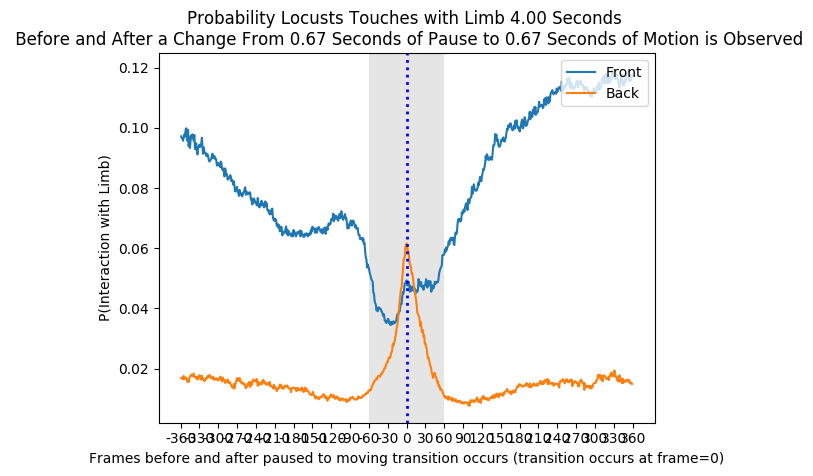



  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15558/323578 [00:00<00:01, 155576.07it/s]

  9%|▉         | 30179/323578 [00:00<00:01, 152399.37it/s]

 14%|█▍        | 46790/323578 [00:00<00:01, 156268.70it/s]

 20%|█▉        | 63102/323578 [00:00<00:01, 158231.42it/s]

 24%|██▎       | 76141/323578 [00:00<00:01, 148705.42it/s]

 28%|██▊       | 90659/323578 [00:00<00:01, 147628.70it/s]

0




 33%|███▎      | 106651/323578 [00:00<00:01, 151111.33it/s]

 38%|███▊      | 122342/323578 [00:00<00:01, 152805.36it/s]

 43%|████▎     | 138767/323578 [00:00<00:01, 156066.80it/s]

 48%|████▊     | 153810/323578 [00:01<00:01, 153816.68it/s]

 52%|█████▏    | 168805/323578 [00:01<00:01, 151502.90it/s]

 57%|█████▋    | 184194/323578 [00:01<00:00, 152209.64it/s]

 62%|██████▏   | 200336/323578 [00:01<00:00, 154858.81it/s]

 67%|██████▋   | 216969/323578 [00:01<00:00, 158127.88it/s]

 72%|███████▏  | 232717/323578 [00:01<00:00, 157896.42it/s]

 77%|███████▋  | 249344/323578 [00:01<00:00, 160317.07it/s]

 82%|████████▏ | 266158/323578 [00:01<00:00, 162585.47it/s]

 87%|████████▋ | 282409/323578 [00:01<00:00, 150343.26it/s]

 92%|█████████▏| 297621/323578 [00:01<00:00, 146403.01it/s]

 97%|█████████▋| 314528/323578 [00:02<00:00, 152536.35it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154233.78it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14200/323578 [00:00<00

1




 37%|███▋      | 118778/323578 [00:00<00:01, 153416.02it/s]

 42%|████▏     | 135243/323578 [00:00<00:01, 156619.48it/s]

 47%|████▋     | 151664/323578 [00:01<00:01, 158820.64it/s]

 52%|█████▏    | 168365/323578 [00:01<00:00, 161190.79it/s]

 57%|█████▋    | 184983/323578 [00:01<00:00, 162654.15it/s]

 62%|██████▏   | 201484/323578 [00:01<00:00, 161917.29it/s]

 67%|██████▋   | 217561/323578 [00:01<00:00, 153427.73it/s]

 72%|███████▏  | 233534/323578 [00:01<00:00, 155264.96it/s]

 77%|███████▋  | 249221/323578 [00:01<00:00, 155740.96it/s]

 82%|████████▏ | 265835/323578 [00:01<00:00, 158720.00it/s]

 87%|████████▋ | 281784/323578 [00:01<00:00, 158947.32it/s]

 92%|█████████▏| 298399/323578 [00:01<00:00, 161041.62it/s]

 97%|█████████▋| 314521/323578 [00:02<00:00, 155288.41it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154210.62it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14006/323578 [00:00<00:02, 140054.79it/s]

  9%|▉         | 29519/323578 [00:00<00:

2




 30%|███       | 97756/323578 [00:00<00:01, 135487.78it/s]

 35%|███▍      | 113106/323578 [00:00<00:01, 140430.60it/s]

 39%|███▉      | 126434/323578 [00:00<00:01, 136006.00it/s]

 43%|████▎     | 139565/323578 [00:01<00:01, 131720.47it/s]

 48%|████▊     | 154024/323578 [00:01<00:01, 135332.86it/s]

 52%|█████▏    | 168608/323578 [00:01<00:01, 138320.40it/s]

 56%|█████▋    | 182327/323578 [00:01<00:01, 129359.37it/s]

 60%|██████    | 195302/323578 [00:01<00:01, 121467.69it/s]

 65%|██████▌   | 211047/323578 [00:01<00:00, 130407.22it/s]

 70%|██████▉   | 225159/323578 [00:01<00:00, 132849.25it/s]

 74%|███████▍  | 238647/323578 [00:01<00:00, 129708.22it/s]

 79%|███████▉  | 255151/323578 [00:01<00:00, 138609.45it/s]

 83%|████████▎ | 269293/323578 [00:01<00:00, 132291.34it/s]

 88%|████████▊ | 284244/323578 [00:02<00:00, 137023.30it/s]

 92%|█████████▏| 298170/323578 [00:02<00:00, 136777.36it/s]

 96%|█████████▋| 312183/323578 [00:02<00:00, 137763.70it/s]

100%|██████████| 323578

3




 31%|███▏      | 101344/323578 [00:00<00:01, 146751.17it/s]

 36%|███▋      | 117442/323578 [00:00<00:01, 150746.43it/s]

 41%|████      | 133081/323578 [00:00<00:01, 152394.51it/s]

 46%|████▌     | 147932/323578 [00:01<00:01, 151205.27it/s]

 51%|█████     | 163928/323578 [00:01<00:01, 153727.85it/s]

 56%|█████▌    | 180469/323578 [00:01<00:00, 157053.07it/s]

 61%|██████    | 196929/323578 [00:01<00:00, 159242.52it/s]

 66%|██████▌   | 212753/323578 [00:01<00:00, 145148.39it/s]

 71%|███████   | 228153/323578 [00:01<00:00, 147681.11it/s]

 75%|███████▌  | 243052/323578 [00:01<00:00, 144358.92it/s]

 80%|███████▉  | 257596/323578 [00:01<00:00, 134863.20it/s]

 84%|████████▍ | 271285/323578 [00:01<00:00, 129725.14it/s]

 88%|████████▊ | 284441/323578 [00:02<00:00, 121614.35it/s]

 92%|█████████▏| 299173/323578 [00:02<00:00, 128331.16it/s]

 97%|█████████▋| 312364/323578 [00:02<00:00, 129382.11it/s]

100%|██████████| 323578/323578 [00:02<00:00, 141942.83it/s]

  0%|          | 0/323

4




 28%|██▊       | 89150/323578 [00:00<00:01, 124024.99it/s]

 31%|███       | 100800/323578 [00:00<00:01, 114310.32it/s]

 35%|███▍      | 112119/323578 [00:00<00:01, 113970.21it/s]

 38%|███▊      | 123590/323578 [00:01<00:01, 114190.61it/s]

 42%|████▏     | 136183/323578 [00:01<00:01, 117454.55it/s]

 46%|████▌     | 147824/323578 [00:01<00:01, 116268.87it/s]

 50%|████▉     | 161135/323578 [00:01<00:01, 120855.42it/s]

 55%|█████▍    | 177366/323578 [00:01<00:01, 130883.02it/s]

 59%|█████▉    | 190693/323578 [00:01<00:01, 129148.80it/s]

 63%|██████▎   | 204198/323578 [00:01<00:00, 130542.13it/s]

 68%|██████▊   | 219013/323578 [00:01<00:00, 135367.48it/s]

 72%|███████▏  | 232683/323578 [00:01<00:00, 134426.80it/s]

 77%|███████▋  | 247569/323578 [00:01<00:00, 138452.55it/s]

 81%|████████  | 262880/323578 [00:02<00:00, 142544.45it/s]

 86%|████████▌ | 277233/323578 [00:02<00:00, 135826.06it/s]

 90%|████████▉ | 290951/323578 [00:02<00:00, 133333.71it/s]

 94%|█████████▍| 305097

5




 25%|██▍       | 79455/323578 [00:00<00:01, 133379.02it/s]

 28%|██▊       | 92116/323578 [00:00<00:01, 130590.98it/s]

 33%|███▎      | 105922/323578 [00:00<00:01, 132745.19it/s]

 37%|███▋      | 118614/323578 [00:00<00:01, 129947.90it/s]

 41%|████      | 132266/323578 [00:01<00:01, 131850.05it/s]

 45%|████▌     | 146772/323578 [00:01<00:01, 135553.08it/s]

 49%|████▉     | 160165/323578 [00:01<00:01, 131837.43it/s]

 54%|█████▎    | 173362/323578 [00:01<00:01, 131876.36it/s]

 58%|█████▊    | 186486/323578 [00:01<00:01, 123941.70it/s]

 61%|██████▏   | 198933/323578 [00:01<00:01, 123386.94it/s]

 66%|██████▋   | 214871/323578 [00:01<00:00, 132353.41it/s]

 71%|███████   | 228316/323578 [00:01<00:00, 130868.91it/s]

 75%|███████▍  | 241554/323578 [00:01<00:00, 129546.95it/s]

 79%|███████▉  | 254916/323578 [00:01<00:00, 130741.49it/s]

 83%|████████▎ | 268069/323578 [00:02<00:00, 129586.80it/s]

 87%|████████▋ | 281883/323578 [00:02<00:00, 131695.99it/s]

 91%|█████████ | 295101/

6


 27%|██▋       | 87860/323578 [00:00<00:01, 149715.15it/s]

 32%|███▏      | 103195/323578 [00:00<00:01, 150786.26it/s]

 36%|███▌      | 117122/323578 [00:00<00:01, 144427.71it/s]

 41%|████      | 132121/323578 [00:00<00:01, 146052.43it/s]

 45%|████▌     | 146206/323578 [00:01<00:01, 141660.48it/s]

 50%|████▉     | 160918/323578 [00:01<00:01, 142038.57it/s]

 54%|█████▍    | 175956/323578 [00:01<00:01, 144441.24it/s]

 59%|█████▉    | 190246/323578 [00:01<00:00, 143771.32it/s]

 64%|██████▎   | 205844/323578 [00:01<00:00, 147206.50it/s]

 68%|██████▊   | 220510/323578 [00:01<00:00, 139669.32it/s]

 72%|███████▏  | 234519/323578 [00:01<00:00, 138816.68it/s]

 78%|███████▊  | 250819/323578 [00:01<00:00, 145282.96it/s]

 83%|████████▎ | 267481/323578 [00:01<00:00, 151084.94it/s]

 88%|████████▊ | 284279/323578 [00:01<00:00, 155784.00it/s]

 93%|█████████▎| 301053/323578 [00:02<00:00, 159187.54it/s]

 98%|█████████▊| 317519/323578 [00:02<00:00, 160788.61it/s]

100%|██████████| 323578/3

7




 32%|███▏      | 102531/323578 [00:00<00:01, 143412.01it/s]

 37%|███▋      | 118120/323578 [00:00<00:01, 146938.76it/s]

 41%|████      | 133450/323578 [00:00<00:01, 148790.11it/s]

 46%|████▋     | 150196/323578 [00:01<00:01, 153937.57it/s]

 52%|█████▏    | 166892/323578 [00:01<00:00, 157624.33it/s]

 56%|█████▋    | 182437/323578 [00:01<00:00, 154914.22it/s]

 61%|██████    | 197787/323578 [00:01<00:00, 149803.17it/s]

 66%|██████▌   | 212705/323578 [00:01<00:00, 145766.07it/s]

 70%|███████   | 227262/323578 [00:01<00:00, 145685.12it/s]

 75%|███████▍  | 241817/323578 [00:01<00:00, 144850.16it/s]

 79%|███████▉  | 256294/323578 [00:01<00:00, 140907.62it/s]

 84%|████████▎ | 270403/323578 [00:01<00:00, 136511.50it/s]

 88%|████████▊ | 285370/323578 [00:01<00:00, 140189.75it/s]

 93%|█████████▎| 300259/323578 [00:02<00:00, 142432.95it/s]

 98%|█████████▊| 315926/323578 [00:02<00:00, 146423.24it/s]

100%|██████████| 323578/323578 [00:02<00:00, 145670.67it/s]

  0%|          | 0/323

8




 35%|███▌      | 114294/323578 [00:00<00:01, 147181.32it/s]

 40%|███▉      | 129149/323578 [00:00<00:01, 147588.37it/s]

 45%|████▍     | 144345/323578 [00:01<00:01, 148870.65it/s]

 49%|████▉     | 158845/323578 [00:01<00:01, 143695.93it/s]

 53%|█████▎    | 172983/323578 [00:01<00:01, 141230.25it/s]

 58%|█████▊    | 188367/323578 [00:01<00:00, 144619.05it/s]

 63%|██████▎   | 204533/323578 [00:01<00:00, 149315.19it/s]

 68%|██████▊   | 220588/323578 [00:01<00:00, 152515.17it/s]

 73%|███████▎  | 235883/323578 [00:01<00:00, 152242.54it/s]

 78%|███████▊  | 251109/323578 [00:01<00:00, 145833.08it/s]

 83%|████████▎ | 267031/323578 [00:01<00:00, 148669.60it/s]

 87%|████████▋ | 282032/323578 [00:01<00:00, 149067.02it/s]

 92%|█████████▏| 296977/323578 [00:02<00:00, 147568.58it/s]

 97%|█████████▋| 312996/323578 [00:02<00:00, 151140.85it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147100.67it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15309/323578 [00:00<00

9




 27%|██▋       | 88409/323578 [00:00<00:01, 148558.18it/s]

 32%|███▏      | 104217/323578 [00:00<00:01, 151291.18it/s]

 37%|███▋      | 119240/323578 [00:00<00:01, 150970.97it/s]

 41%|████      | 133469/323578 [00:00<00:01, 147864.76it/s]

 46%|████▌     | 148908/323578 [00:01<00:01, 149763.30it/s]

 51%|█████     | 163475/323578 [00:01<00:01, 143426.35it/s]

 55%|█████▍    | 177588/323578 [00:01<00:01, 139073.45it/s]

 59%|█████▉    | 192357/323578 [00:01<00:00, 141548.58it/s]

 64%|██████▍   | 206975/323578 [00:01<00:00, 142906.24it/s]

 69%|██████▊   | 222000/323578 [00:01<00:00, 145030.70it/s]

 73%|███████▎  | 236513/323578 [00:01<00:00, 145059.07it/s]

 78%|███████▊  | 250998/323578 [00:01<00:00, 143350.46it/s]

 83%|████████▎ | 266995/323578 [00:01<00:00, 147960.54it/s]

 87%|████████▋ | 281822/323578 [00:01<00:00, 144818.18it/s]

 92%|█████████▏| 296340/323578 [00:02<00:00, 138946.47it/s]

 97%|█████████▋| 312269/323578 [00:02<00:00, 144480.53it/s]

100%|██████████| 323578

10




 32%|███▏      | 103686/323578 [00:00<00:01, 147688.18it/s]

 37%|███▋      | 119784/323578 [00:00<00:01, 151437.50it/s]

 41%|████▏     | 134181/323578 [00:00<00:01, 149115.10it/s]

 46%|████▋     | 149798/323578 [00:01<00:01, 151163.56it/s]

 51%|█████     | 164575/323578 [00:01<00:01, 150127.64it/s]

 56%|█████▌    | 179661/323578 [00:01<00:00, 150344.07it/s]

 61%|██████    | 196400/323578 [00:01<00:00, 155079.41it/s]

 65%|██████▌   | 211805/323578 [00:01<00:00, 146591.94it/s]

 70%|███████   | 227166/323578 [00:01<00:00, 148628.62it/s]

 75%|███████▍  | 242053/323578 [00:01<00:00, 141784.92it/s]

 80%|███████▉  | 258600/323578 [00:01<00:00, 148144.40it/s]

 85%|████████▍ | 274165/323578 [00:01<00:00, 150317.97it/s]

 90%|████████▉ | 289817/323578 [00:01<00:00, 152125.86it/s]

 94%|█████████▍| 305105/323578 [00:02<00:00, 144560.01it/s]

 99%|█████████▉| 319693/323578 [00:02<00:00, 144322.20it/s]

100%|██████████| 323578/323578 [00:02<00:00, 148420.53it/s]

  0%|          | 0/323

11




 22%|██▏       | 72178/323578 [00:00<00:01, 142125.52it/s]

 27%|██▋       | 88534/323578 [00:00<00:01, 147941.50it/s]

 32%|███▏      | 104988/323578 [00:00<00:01, 152557.98it/s]

 37%|███▋      | 121104/323578 [00:00<00:01, 155039.36it/s]

 43%|████▎     | 137671/323578 [00:00<00:01, 158080.81it/s]

 48%|████▊     | 154270/323578 [00:01<00:01, 160370.88it/s]

 53%|█████▎    | 170977/323578 [00:01<00:00, 162321.08it/s]

 58%|█████▊    | 187558/323578 [00:01<00:00, 163350.10it/s]

 63%|██████▎   | 203766/323578 [00:01<00:00, 147487.68it/s]

 68%|██████▊   | 219318/323578 [00:01<00:00, 149807.07it/s]

 73%|███████▎  | 234968/323578 [00:01<00:00, 151753.78it/s]

 77%|███████▋  | 250256/323578 [00:01<00:00, 151642.80it/s]

 82%|████████▏ | 265499/323578 [00:01<00:00, 148266.94it/s]

 87%|████████▋ | 280398/323578 [00:01<00:00, 144659.50it/s]

 91%|█████████ | 294934/323578 [00:01<00:00, 140509.39it/s]

 96%|█████████▌| 309060/323578 [00:02<00:00, 139866.56it/s]

100%|██████████| 323578/

12




 23%|██▎       | 74484/323578 [00:00<00:01, 145977.24it/s]

 27%|██▋       | 87912/323578 [00:00<00:01, 141406.33it/s]

 31%|███       | 100326/323578 [00:00<00:01, 134686.22it/s]

 36%|███▌      | 115902/323578 [00:00<00:01, 140382.86it/s]

 40%|███▉      | 129204/323578 [00:00<00:01, 134614.08it/s]

 44%|████▍     | 143691/323578 [00:01<00:01, 137534.37it/s]

 49%|████▊     | 157187/323578 [00:01<00:01, 136750.16it/s]

 53%|█████▎    | 172183/323578 [00:01<00:01, 140461.49it/s]

 58%|█████▊    | 186103/323578 [00:01<00:00, 139088.67it/s]

 62%|██████▏   | 200113/323578 [00:01<00:00, 139389.88it/s]

 66%|██████▌   | 213993/323578 [00:01<00:00, 138287.15it/s]

 71%|███████   | 229908/323578 [00:01<00:00, 143946.52it/s]

 76%|███████▌  | 244954/323578 [00:01<00:00, 145839.00it/s]

 81%|████████  | 261608/323578 [00:01<00:00, 151486.17it/s]

 86%|████████▌ | 276972/323578 [00:01<00:00, 152123.95it/s]

 90%|█████████ | 292561/323578 [00:02<00:00, 151992.40it/s]

 95%|█████████▌| 307798/

13




 28%|██▊       | 90808/323578 [00:00<00:01, 150110.91it/s]

 32%|███▏      | 104227/323578 [00:00<00:01, 144949.73it/s]

 36%|███▋      | 117637/323578 [00:00<00:01, 140235.47it/s]

 41%|████      | 131447/323578 [00:00<00:01, 139586.35it/s]

 45%|████▌     | 145694/323578 [00:01<00:01, 139530.73it/s]

 49%|████▉     | 159480/323578 [00:01<00:01, 139024.82it/s]

 54%|█████▎    | 173135/323578 [00:01<00:01, 137702.36it/s]

 58%|█████▊    | 188793/323578 [00:01<00:00, 142868.97it/s]

 63%|██████▎   | 203234/323578 [00:01<00:00, 143327.75it/s]

 67%|██████▋   | 217519/323578 [00:01<00:00, 142716.13it/s]

 72%|███████▏  | 231758/323578 [00:01<00:00, 140202.36it/s]

 77%|███████▋  | 247769/323578 [00:01<00:00, 145634.08it/s]

 81%|████████  | 262377/323578 [00:01<00:00, 143876.81it/s]

 86%|████████▌ | 278802/323578 [00:01<00:00, 149437.13it/s]

 91%|█████████▏| 295322/323578 [00:02<00:00, 153838.42it/s]

 96%|█████████▋| 311895/323578 [00:02<00:00, 157220.25it/s]

100%|██████████| 323578

14




 38%|███▊      | 121493/323578 [00:00<00:01, 151711.60it/s]

 42%|████▏     | 135864/323578 [00:00<00:01, 145751.06it/s]

 47%|████▋     | 152347/323578 [00:01<00:01, 150993.15it/s]

 52%|█████▏    | 167138/323578 [00:01<00:01, 149799.18it/s]

 56%|█████▋    | 182662/323578 [00:01<00:00, 151388.88it/s]

 61%|██████    | 197655/323578 [00:01<00:00, 149229.01it/s]

 66%|██████▌   | 213744/323578 [00:01<00:00, 152544.06it/s]

 71%|███████   | 229848/323578 [00:01<00:00, 154996.28it/s]

 76%|███████▌  | 246507/323578 [00:01<00:00, 158300.10it/s]

 81%|████████▏ | 263354/323578 [00:01<00:00, 161218.16it/s]

 86%|████████▋ | 279571/323578 [00:01<00:00, 161499.59it/s]

 92%|█████████▏| 296126/323578 [00:01<00:00, 162692.88it/s]

 97%|█████████▋| 312404/323578 [00:02<00:00, 152141.36it/s]

100%|██████████| 323578/323578 [00:02<00:00, 152128.46it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15717/323578 [00:00<00:01, 157167.53it/s]

  9%|▉         | 30147/323578 [00:00<00:

15


 14%|█▍        | 45553/323578 [00:00<00:01, 153365.73it/s]

 17%|█▋        | 55516/323578 [00:00<00:02, 124992.25it/s]

 22%|██▏       | 70029/323578 [00:00<00:01, 130419.57it/s]

 27%|██▋       | 86030/323578 [00:00<00:01, 138078.05it/s]

 31%|███▏      | 101614/323578 [00:00<00:01, 142932.35it/s]

 36%|███▌      | 117019/323578 [00:00<00:01, 146071.98it/s]

 41%|████      | 133158/323578 [00:00<00:01, 150352.86it/s]

 46%|████▌     | 149608/323578 [00:01<00:01, 154332.91it/s]

 51%|█████     | 165439/323578 [00:01<00:01, 155502.76it/s]

 56%|█████▌    | 181725/323578 [00:01<00:00, 157638.45it/s]

 61%|██████    | 197613/323578 [00:01<00:00, 158007.80it/s]

 66%|██████▌   | 214096/323578 [00:01<00:00, 159994.02it/s]

 71%|███████   | 230320/323578 [00:01<00:00, 160661.07it/s]

 76%|███████▋  | 246906/323578 [00:01<00:00, 162184.09it/s]

 81%|████████▏ | 263107/323578 [00:01<00:00, 162033.52it/s]

 86%|████████▋ | 279298/323578 [00:01<00:00, 158113.34it/s]

 91%|█████████▏| 295416/3235

16


 34%|███▍      | 109641/323578 [00:00<00:01, 133621.45it/s]

 38%|███▊      | 124046/323578 [00:00<00:01, 136587.61it/s]

 43%|████▎     | 138019/323578 [00:01<00:01, 136612.54it/s]

 47%|████▋     | 151330/323578 [00:01<00:01, 135508.57it/s]

 51%|█████▏    | 166150/323578 [00:01<00:01, 138586.41it/s]

 56%|█████▌    | 179856/323578 [00:01<00:01, 136003.15it/s]

 60%|█████▉    | 193360/323578 [00:01<00:00, 131982.91it/s]

 64%|██████▍   | 208371/323578 [00:01<00:00, 136942.23it/s]

 69%|██████▉   | 223362/323578 [00:01<00:00, 140589.05it/s]

 73%|███████▎  | 237459/323578 [00:01<00:00, 136324.63it/s]

 78%|███████▊  | 251146/323578 [00:01<00:00, 132877.24it/s]

 82%|████████▏ | 264733/323578 [00:01<00:00, 133759.57it/s]

 86%|████████▌ | 278151/323578 [00:02<00:00, 132806.56it/s]

 91%|█████████ | 293569/323578 [00:02<00:00, 138567.09it/s]

 96%|█████████▌| 310098/323578 [00:02<00:00, 145629.84it/s]

100%|██████████| 323578/323578 [00:02<00:00, 139017.77it/s]

  0%|          | 0/32357

17




 26%|██▌       | 82894/323578 [00:00<00:01, 139236.26it/s]

 30%|███       | 98043/323578 [00:00<00:01, 142060.69it/s]

 34%|███▍      | 111348/323578 [00:00<00:01, 139230.88it/s]

 39%|███▊      | 125378/323578 [00:00<00:01, 139548.55it/s]

 43%|████▎     | 139816/323578 [00:01<00:01, 140961.37it/s]

 47%|████▋     | 153525/323578 [00:01<00:01, 134044.84it/s]

 52%|█████▏    | 166730/323578 [00:01<00:01, 131923.83it/s]

 56%|█████▌    | 179809/323578 [00:01<00:01, 131580.33it/s]

 60%|█████▉    | 192875/323578 [00:01<00:01, 125814.40it/s]

 64%|██████▎   | 206041/323578 [00:01<00:00, 127510.75it/s]

 68%|██████▊   | 219219/323578 [00:01<00:00, 128533.44it/s]

 72%|███████▏  | 234299/323578 [00:01<00:00, 134065.62it/s]

 77%|███████▋  | 247783/323578 [00:01<00:00, 134296.66it/s]

 81%|████████  | 261257/323578 [00:01<00:00, 128419.57it/s]

 85%|████████▍ | 274350/323578 [00:02<00:00, 129162.29it/s]

 89%|████████▉ | 288920/323578 [00:02<00:00, 133714.06it/s]

 94%|█████████▎| 302604/

18




 34%|███▎      | 108527/323578 [00:00<00:01, 156960.96it/s]

 38%|███▊      | 123536/323578 [00:00<00:01, 154832.16it/s]

 43%|████▎     | 138180/323578 [00:00<00:01, 148245.54it/s]

 47%|████▋     | 153243/323578 [00:01<00:01, 148952.74it/s]

 52%|█████▏    | 167800/323578 [00:01<00:01, 147920.71it/s]

 57%|█████▋    | 182831/323578 [00:01<00:00, 148628.47it/s]

 61%|██████    | 197515/323578 [00:01<00:00, 144791.52it/s]

 65%|██████▌   | 211891/323578 [00:01<00:00, 134577.67it/s]

 70%|██████▉   | 225421/323578 [00:01<00:00, 132262.86it/s]

 74%|███████▍  | 239930/323578 [00:01<00:00, 135864.77it/s]

 78%|███████▊  | 253583/323578 [00:01<00:00, 134699.41it/s]

 83%|████████▎ | 268128/323578 [00:01<00:00, 137753.51it/s]

 88%|████████▊ | 284840/323578 [00:01<00:00, 145418.98it/s]

 93%|█████████▎| 299532/323578 [00:02<00:00, 145201.13it/s]

 97%|█████████▋| 314158/323578 [00:02<00:00, 137562.93it/s]

100%|██████████| 323578/323578 [00:02<00:00, 145151.50it/s]

  0%|          | 0/323

19




 37%|███▋      | 119990/323578 [00:00<00:01, 152373.13it/s]

 42%|████▏     | 136012/323578 [00:00<00:01, 154631.88it/s]

 47%|████▋     | 151536/323578 [00:01<00:01, 154813.75it/s]

 51%|█████▏    | 166618/323578 [00:01<00:01, 149051.58it/s]

 56%|█████▌    | 181708/323578 [00:01<00:00, 149260.89it/s]

 61%|██████    | 196701/323578 [00:01<00:00, 149403.19it/s]

 66%|██████▌   | 212637/323578 [00:01<00:00, 152251.94it/s]

 70%|███████   | 227796/323578 [00:01<00:00, 149737.41it/s]

 75%|███████▌  | 242733/323578 [00:01<00:00, 147435.11it/s]

 80%|███████▉  | 257459/323578 [00:01<00:00, 144410.00it/s]

 84%|████████▍ | 272279/323578 [00:01<00:00, 145526.12it/s]

 89%|████████▊ | 286835/323578 [00:01<00:00, 141996.58it/s]

 93%|█████████▎| 301056/323578 [00:02<00:00, 141374.60it/s]

 97%|█████████▋| 315209/323578 [00:02<00:00, 137040.98it/s]

100%|██████████| 323578/323578 [00:02<00:00, 146391.12it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13820/323578 [00:00<00

20




 36%|███▌      | 115576/323578 [00:00<00:01, 142110.49it/s]

 41%|████      | 132194/323578 [00:00<00:01, 148564.50it/s]

 46%|████▌     | 147398/323578 [00:01<00:01, 149588.50it/s]

 50%|█████     | 162050/323578 [00:01<00:01, 145317.71it/s]

 55%|█████▍    | 176393/323578 [00:01<00:01, 143977.40it/s]

 60%|█████▉    | 192540/323578 [00:01<00:00, 148812.33it/s]

 64%|██████▍   | 208541/323578 [00:01<00:00, 151238.62it/s]

 69%|██████▉   | 224416/323578 [00:01<00:00, 152678.47it/s]

 74%|███████▍  | 240751/323578 [00:01<00:00, 155730.00it/s]

 80%|███████▉  | 257627/323578 [00:01<00:00, 159421.79it/s]

 85%|████████▍ | 274306/323578 [00:01<00:00, 161560.56it/s]

 90%|████████▉ | 290899/323578 [00:01<00:00, 162844.11it/s]

 95%|█████████▌| 307689/323578 [00:02<00:00, 164328.43it/s]

100%|██████████| 323578/323578 [00:02<00:00, 153052.05it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14799/323578 [00:00<00:02, 147983.44it/s]

  9%|▉         | 29697/323578 [00:00<00:

21


 27%|██▋       | 85981/323578 [00:00<00:01, 141320.30it/s]

 31%|███       | 99885/323578 [00:00<00:01, 140628.34it/s]

 36%|███▌      | 115416/323578 [00:00<00:01, 144731.85it/s]

 40%|███▉      | 129076/323578 [00:00<00:01, 141422.34it/s]

 44%|████▍     | 142666/323578 [00:01<00:01, 139482.49it/s]

 49%|████▉     | 157857/323578 [00:01<00:01, 142178.26it/s]

 54%|█████▍    | 174595/323578 [00:01<00:01, 148902.19it/s]

 59%|█████▉    | 190261/323578 [00:01<00:00, 151146.43it/s]

 64%|██████▍   | 207161/323578 [00:01<00:00, 156093.19it/s]

 69%|██████▉   | 223938/323578 [00:01<00:00, 159420.13it/s]

 74%|███████▍  | 240711/323578 [00:01<00:00, 161824.48it/s]

 80%|███████▉  | 257523/323578 [00:01<00:00, 163660.26it/s]

 85%|████████▍ | 274321/323578 [00:01<00:00, 164932.14it/s]

 90%|████████▉ | 291078/323578 [00:01<00:00, 165661.35it/s]

 95%|█████████▌| 307673/323578 [00:02<00:00, 165745.28it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154005.20it/s]

  0%|          | 0/323578 

22




 30%|██▉       | 96257/323578 [00:00<00:01, 128384.03it/s]

 35%|███▍      | 112161/323578 [00:00<00:01, 136261.94it/s]

 39%|███▉      | 127797/323578 [00:00<00:01, 141725.66it/s]

 44%|████▍     | 141568/323578 [00:01<00:01, 133766.85it/s]

 48%|████▊     | 155524/323578 [00:01<00:01, 135452.10it/s]

 52%|█████▏    | 169395/323578 [00:01<00:01, 136411.02it/s]

 57%|█████▋    | 185949/323578 [00:01<00:00, 144012.31it/s]

 62%|██████▏   | 200726/323578 [00:01<00:00, 145118.41it/s]

 67%|██████▋   | 215399/323578 [00:01<00:00, 145597.89it/s]

 72%|███████▏  | 231874/323578 [00:01<00:00, 150858.72it/s]

 77%|███████▋  | 247818/323578 [00:01<00:00, 153333.30it/s]

 81%|████████▏ | 263209/323578 [00:01<00:00, 149746.90it/s]

 86%|████████▋ | 279286/323578 [00:01<00:00, 152890.16it/s]

 91%|█████████ | 294633/323578 [00:02<00:00, 149708.89it/s]

 96%|█████████▌| 309968/323578 [00:02<00:00, 150781.60it/s]

100%|██████████| 323578/323578 [00:02<00:00, 144962.27it/s]

  0%|          | 0/3235

23




 33%|███▎      | 106743/323578 [00:00<00:01, 153131.39it/s]

 38%|███▊      | 121913/323578 [00:00<00:01, 152698.20it/s]

 42%|████▏     | 136715/323578 [00:00<00:01, 150760.65it/s]

 47%|████▋     | 151147/323578 [00:01<00:01, 148629.33it/s]

 51%|█████     | 165566/323578 [00:01<00:01, 143968.58it/s]

 56%|█████▌    | 179684/323578 [00:01<00:01, 139815.61it/s]

 60%|█████▉    | 193619/323578 [00:01<00:00, 139597.78it/s]

 65%|██████▍   | 209806/323578 [00:01<00:00, 145607.48it/s]

 69%|██████▉   | 224351/323578 [00:01<00:00, 140284.42it/s]

 74%|███████▎  | 238411/323578 [00:01<00:00, 133598.60it/s]

 78%|███████▊  | 252688/323578 [00:01<00:00, 136223.07it/s]

 83%|████████▎ | 268871/323578 [00:01<00:00, 143009.63it/s]

 88%|████████▊ | 283314/323578 [00:01<00:00, 142117.88it/s]

 92%|█████████▏| 298456/323578 [00:02<00:00, 144784.02it/s]

 97%|█████████▋| 314455/323578 [00:02<00:00, 149031.06it/s]

100%|██████████| 323578/323578 [00:02<00:00, 146022.81it/s]

  0%|          | 0/323

24


 35%|███▌      | 114038/323578 [00:00<00:01, 137082.66it/s]

 40%|███▉      | 128550/323578 [00:00<00:01, 139397.31it/s]

 44%|████▍     | 143559/323578 [00:01<00:01, 142439.85it/s]

 49%|████▉     | 158183/323578 [00:01<00:01, 143558.84it/s]

 54%|█████▎    | 173194/323578 [00:01<00:01, 145461.57it/s]

 58%|█████▊    | 187579/323578 [00:01<00:00, 141109.48it/s]

 63%|██████▎   | 203286/323578 [00:01<00:00, 145545.52it/s]

 67%|██████▋   | 217817/323578 [00:01<00:00, 141921.10it/s]

 72%|███████▏  | 232013/323578 [00:01<00:00, 141153.14it/s]

 76%|███████▌  | 246510/323578 [00:01<00:00, 142275.77it/s]

 81%|████████  | 260742/323578 [00:01<00:00, 141670.68it/s]

 85%|████████▍ | 274913/323578 [00:01<00:00, 134035.70it/s]

 89%|████████▉ | 289423/323578 [00:02<00:00, 137173.43it/s]

 95%|█████████▍| 306052/323578 [00:02<00:00, 144777.83it/s]

 99%|█████████▉| 321646/323578 [00:02<00:00, 147952.84it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143207.73it/s]

  0%|          | 0/32357

25




 28%|██▊       | 89706/323578 [00:00<00:01, 150394.84it/s]

 33%|███▎      | 105218/323578 [00:00<00:01, 151779.17it/s]

 38%|███▊      | 121746/323578 [00:00<00:01, 155589.75it/s]

 42%|████▏     | 136441/323578 [00:00<00:01, 151735.74it/s]

 47%|████▋     | 152143/323578 [00:01<00:01, 153282.26it/s]

 52%|█████▏    | 167067/323578 [00:01<00:01, 150709.39it/s]

 56%|█████▋    | 182137/323578 [00:01<00:00, 150705.86it/s]

 61%|██████    | 197016/323578 [00:01<00:00, 147708.56it/s]

 66%|██████▌   | 212019/323578 [00:01<00:00, 148397.03it/s]

 70%|███████   | 226967/323578 [00:01<00:00, 148719.68it/s]

 75%|███████▍  | 241781/323578 [00:01<00:00, 140740.21it/s]

 80%|███████▉  | 258282/323578 [00:01<00:00, 147235.74it/s]

 84%|████████▍ | 273194/323578 [00:01<00:00, 147795.72it/s]

 89%|████████▉ | 288053/323578 [00:01<00:00, 143198.51it/s]

 94%|█████████▍| 304984/323578 [00:02<00:00, 150143.31it/s]

 99%|█████████▉| 321190/323578 [00:02<00:00, 153528.11it/s]

100%|██████████| 323578

26




 41%|████      | 132086/323578 [00:00<00:01, 146015.79it/s]

 46%|████▌     | 148761/323578 [00:01<00:01, 151672.62it/s]

 51%|█████     | 165485/323578 [00:01<00:01, 156028.26it/s]

 56%|█████▌    | 181757/323578 [00:01<00:00, 157976.88it/s]

 61%|██████▏   | 198516/323578 [00:01<00:00, 160742.70it/s]

 67%|██████▋   | 215339/323578 [00:01<00:00, 162916.66it/s]

 72%|███████▏  | 231950/323578 [00:01<00:00, 163860.47it/s]

 77%|███████▋  | 248685/323578 [00:01<00:00, 164889.91it/s]

 82%|████████▏ | 265650/323578 [00:01<00:00, 166286.90it/s]

 87%|████████▋ | 282389/323578 [00:01<00:00, 166615.52it/s]

 93%|█████████▎| 299346/323578 [00:01<00:00, 167487.96it/s]

 98%|█████████▊| 316189/323578 [00:02<00:00, 167767.72it/s]

100%|██████████| 323578/323578 [00:02<00:00, 158053.61it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14083/323578 [00:00<00:02, 140823.42it/s]

  9%|▊         | 28236/323578 [00:00<00:02, 141033.08it/s]

 13%|█▎        | 43575/323578 [00:00<00:0

27




 36%|███▋      | 117477/323578 [00:00<00:01, 141666.07it/s]

 41%|████      | 133210/323578 [00:00<00:01, 146027.42it/s]

 46%|████▋     | 149891/323578 [00:01<00:01, 151695.20it/s]

 51%|█████▏    | 166363/323578 [00:01<00:01, 155380.62it/s]

 57%|█████▋    | 182899/323578 [00:01<00:00, 158243.94it/s]

 62%|██████▏   | 199309/323578 [00:01<00:00, 159955.33it/s]

 67%|██████▋   | 215949/323578 [00:01<00:00, 161835.18it/s]

 72%|███████▏  | 232729/323578 [00:01<00:00, 163578.52it/s]

 77%|███████▋  | 249135/323578 [00:01<00:00, 163720.38it/s]

 82%|████████▏ | 265599/323578 [00:01<00:00, 163995.12it/s]

 87%|████████▋ | 282266/323578 [00:01<00:00, 164785.89it/s]

 92%|█████████▏| 299149/323578 [00:01<00:00, 165976.81it/s]

 98%|█████████▊| 315767/323578 [00:02<00:00, 166036.81it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157350.89it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14392/323578 [00:00<00:02, 143919.79it/s]

  9%|▉         | 29392/323578 [00:00<00:

28




 37%|███▋      | 120102/323578 [00:00<00:01, 148756.38it/s]

 41%|████▏     | 134192/323578 [00:00<00:01, 145086.31it/s]

 46%|████▌     | 148170/323578 [00:01<00:01, 136265.59it/s]

 50%|█████     | 161966/323578 [00:01<00:01, 136768.11it/s]

 54%|█████▍    | 175460/323578 [00:01<00:01, 131723.91it/s]

 58%|█████▊    | 188545/323578 [00:01<00:01, 126725.67it/s]

 63%|██████▎   | 203356/323578 [00:01<00:00, 132461.32it/s]

 67%|██████▋   | 216656/323578 [00:01<00:00, 129187.08it/s]

 71%|███████▏  | 231125/323578 [00:01<00:00, 133476.35it/s]

 76%|███████▌  | 246700/323578 [00:01<00:00, 139457.61it/s]

 81%|████████  | 261797/323578 [00:01<00:00, 142722.02it/s]

 85%|████████▌ | 276174/323578 [00:01<00:00, 141520.43it/s]

 90%|█████████ | 292808/323578 [00:02<00:00, 148151.44it/s]

 96%|█████████▌| 309454/323578 [00:02<00:00, 153204.62it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143739.03it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13060/323578 [00:00<00

29




 37%|███▋      | 120278/323578 [00:00<00:01, 132805.45it/s]

 41%|████      | 133376/323578 [00:01<00:01, 132251.86it/s]

 45%|████▌     | 146247/323578 [00:01<00:01, 119595.12it/s]

 50%|████▉     | 160244/323578 [00:01<00:01, 125056.17it/s]

 54%|█████▍    | 174041/323578 [00:01<00:01, 128667.99it/s]

 58%|█████▊    | 186972/323578 [00:01<00:01, 127503.75it/s]

 62%|██████▏   | 201388/323578 [00:01<00:00, 132081.67it/s]

 67%|██████▋   | 216609/323578 [00:01<00:00, 137537.16it/s]

 71%|███████   | 230474/323578 [00:01<00:00, 135178.61it/s]

 75%|███████▌  | 244079/323578 [00:01<00:00, 131289.61it/s]

 80%|████████  | 259610/323578 [00:01<00:00, 137665.17it/s]

 85%|████████▍ | 273518/323578 [00:02<00:00, 136344.84it/s]

 89%|████████▉ | 287778/323578 [00:02<00:00, 138162.66it/s]

 93%|█████████▎| 301756/323578 [00:02<00:00, 138641.99it/s]

 98%|█████████▊| 317045/323578 [00:02<00:00, 142628.24it/s]

100%|██████████| 323578/323578 [00:02<00:00, 134751.06it/s]

  0%|          | 0/323

30




 28%|██▊       | 91161/323578 [00:00<00:01, 152997.37it/s]

 33%|███▎      | 107535/323578 [00:00<00:01, 156069.01it/s]

 38%|███▊      | 121969/323578 [00:00<00:01, 145447.96it/s]

 42%|████▏     | 135838/323578 [00:00<00:01, 142000.93it/s]

 46%|████▋     | 150394/323578 [00:01<00:01, 143047.87it/s]

 51%|█████▏    | 166626/323578 [00:01<00:01, 148330.70it/s]

 56%|█████▌    | 181871/323578 [00:01<00:00, 149542.34it/s]

 61%|██████▏   | 198445/323578 [00:01<00:00, 154058.80it/s]

 66%|██████▋   | 215120/323578 [00:01<00:00, 157657.13it/s]

 72%|███████▏  | 231403/323578 [00:01<00:00, 159173.19it/s]

 76%|███████▋  | 247315/323578 [00:01<00:00, 151085.54it/s]

 81%|████████▏ | 263460/323578 [00:01<00:00, 154051.82it/s]

 86%|████████▌ | 278937/323578 [00:01<00:00, 149139.06it/s]

 91%|█████████▏| 295577/323578 [00:01<00:00, 153927.67it/s]

 96%|█████████▋| 312198/323578 [00:02<00:00, 157415.36it/s]

100%|██████████| 323578/323578 [00:02<00:00, 152681.78it/s]

  0%|          | 0/3235

31




 28%|██▊       | 92180/323578 [00:00<00:01, 156275.71it/s]

 34%|███▎      | 108687/323578 [00:00<00:01, 158811.10it/s]

 38%|███▊      | 124346/323578 [00:00<00:01, 158137.20it/s]

 44%|████▎     | 140855/323578 [00:00<00:01, 160158.69it/s]

 49%|████▊     | 157452/323578 [00:01<00:01, 161858.50it/s]

 54%|█████▎    | 173883/323578 [00:01<00:00, 162583.52it/s]

 59%|█████▉    | 190370/323578 [00:01<00:00, 163261.55it/s]

 64%|██████▍   | 206495/323578 [00:01<00:00, 161678.99it/s]

 69%|██████▉   | 222526/323578 [00:01<00:00, 160435.32it/s]

 74%|███████▎  | 238476/323578 [00:01<00:00, 159529.32it/s]

 79%|███████▊  | 254365/323578 [00:01<00:00, 156157.16it/s]

 83%|████████▎ | 269952/323578 [00:01<00:00, 152238.12it/s]

 88%|████████▊ | 285269/323578 [00:01<00:00, 152513.93it/s]

 93%|█████████▎| 300522/323578 [00:01<00:00, 149294.48it/s]

 97%|█████████▋| 315468/323578 [00:02<00:00, 143541.59it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154770.74it/s]

  0%|          | 0/3235

32




 35%|███▌      | 114471/323578 [00:00<00:01, 164686.23it/s]

 41%|████      | 131251/323578 [00:00<00:01, 165606.57it/s]

 46%|████▌     | 147742/323578 [00:00<00:01, 165394.42it/s]

 51%|█████     | 164337/323578 [00:01<00:00, 165560.28it/s]

 56%|█████▌    | 180916/323578 [00:01<00:00, 165626.45it/s]

 61%|██████    | 197175/323578 [00:01<00:00, 161576.29it/s]

 66%|██████▌   | 213142/323578 [00:01<00:00, 158777.69it/s]

 71%|███████   | 229813/323578 [00:01<00:00, 161074.57it/s]

 76%|███████▌  | 246450/323578 [00:01<00:00, 162627.39it/s]

 81%|████████  | 262662/323578 [00:01<00:00, 159960.67it/s]

 86%|████████▋ | 279229/323578 [00:01<00:00, 161631.42it/s]

 91%|█████████▏| 295764/323578 [00:01<00:00, 162729.25it/s]

 97%|█████████▋| 312760/323578 [00:01<00:00, 164830.34it/s]

100%|██████████| 323578/323578 [00:01<00:00, 163200.32it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15011/323578 [00:00<00:02, 150106.92it/s]

  9%|▉         | 29506/323578 [00:00<00:

33




 12%|█▏        | 39169/323578 [00:00<00:02, 127912.01it/s]

 17%|█▋        | 54154/323578 [00:00<00:02, 132758.54it/s]

 22%|██▏       | 69904/323578 [00:00<00:01, 139322.17it/s]

 27%|██▋       | 86253/323578 [00:00<00:01, 145785.54it/s]

 32%|███▏      | 101992/323578 [00:00<00:01, 149080.75it/s]

 36%|███▋      | 117555/323578 [00:00<00:01, 150986.64it/s]

 41%|████▏     | 133763/323578 [00:00<00:01, 154149.70it/s]

 46%|████▋     | 150335/323578 [00:01<00:01, 157445.53it/s]

 52%|█████▏    | 166894/323578 [00:01<00:00, 159801.10it/s]

 57%|█████▋    | 183470/323578 [00:01<00:00, 161541.54it/s]

 62%|██████▏   | 199947/323578 [00:01<00:00, 162494.81it/s]

 67%|██████▋   | 216534/323578 [00:01<00:00, 163492.21it/s]

 72%|███████▏  | 232956/323578 [00:01<00:00, 163708.63it/s]

 77%|███████▋  | 249445/323578 [00:01<00:00, 164059.67it/s]

 82%|████████▏ | 266096/323578 [00:01<00:00, 164786.63it/s]

 87%|████████▋ | 282553/323578 [00:01<00:00, 162261.59it/s]

 92%|█████████▏| 299157/32

34




 38%|███▊      | 124228/323578 [00:00<00:01, 140093.77it/s]

 44%|████▎     | 141261/323578 [00:01<00:01, 147973.56it/s]

 48%|████▊     | 155850/323578 [00:01<00:01, 145970.89it/s]

 53%|█████▎    | 172463/323578 [00:01<00:00, 151485.35it/s]

 58%|█████▊    | 189053/323578 [00:01<00:00, 155538.79it/s]

 64%|██████▎   | 205819/323578 [00:01<00:00, 158985.80it/s]

 69%|██████▊   | 222363/323578 [00:01<00:00, 160865.92it/s]

 74%|███████▍  | 239324/323578 [00:01<00:00, 163390.67it/s]

 79%|███████▉  | 256470/323578 [00:01<00:00, 165729.02it/s]

 85%|████████▍ | 273597/323578 [00:01<00:00, 167352.17it/s]

 90%|████████▉ | 290532/323578 [00:01<00:00, 167943.98it/s]

 95%|█████████▍| 307341/323578 [00:02<00:00, 166132.03it/s]

100%|██████████| 323578/323578 [00:02<00:00, 153304.67it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13201/323578 [00:00<00:02, 130052.04it/s]

  8%|▊         | 25614/323578 [00:00<00:02, 128216.69it/s]

 12%|█▏        | 40267/323578 [00:00<00:0

35




 25%|██▌       | 81905/323578 [00:00<00:01, 135139.37it/s]

 29%|██▉       | 93953/323578 [00:00<00:01, 129157.36it/s]

 34%|███▍      | 109300/323578 [00:00<00:01, 135600.54it/s]

 38%|███▊      | 123883/323578 [00:00<00:01, 138513.04it/s]

 42%|████▏     | 137352/323578 [00:01<00:01, 137341.17it/s]

 47%|████▋     | 150808/323578 [00:01<00:01, 134609.73it/s]

 51%|█████     | 164087/323578 [00:01<00:01, 130622.70it/s]

 56%|█████▌    | 179671/323578 [00:01<00:01, 137285.82it/s]

 60%|█████▉    | 193419/323578 [00:01<00:00, 136850.04it/s]

 64%|██████▍   | 208303/323578 [00:01<00:00, 140237.70it/s]

 69%|██████▊   | 222357/323578 [00:01<00:00, 137642.02it/s]

 73%|███████▎  | 236821/323578 [00:01<00:00, 139666.99it/s]

 78%|███████▊  | 250818/323578 [00:01<00:00, 137706.69it/s]

 83%|████████▎ | 267422/323578 [00:01<00:00, 145134.81it/s]

 87%|████████▋ | 282062/323578 [00:02<00:00, 140781.14it/s]

 92%|█████████▏| 296378/323578 [00:02<00:00, 141484.70it/s]

 96%|█████████▌| 310609/

36




 39%|███▉      | 127420/323578 [00:00<00:01, 161497.80it/s]

 44%|████▍     | 143967/323578 [00:00<00:01, 162668.19it/s]

 49%|████▉     | 159632/323578 [00:01<00:01, 160061.07it/s]

 55%|█████▍    | 176359/323578 [00:01<00:00, 162155.78it/s]

 60%|█████▉    | 192995/323578 [00:01<00:00, 163394.27it/s]

 65%|██████▍   | 209410/323578 [00:01<00:00, 163620.19it/s]

 70%|██████▉   | 225975/323578 [00:01<00:00, 164222.30it/s]

 75%|███████▍  | 242303/323578 [00:01<00:00, 161664.86it/s]

 80%|███████▉  | 258766/323578 [00:01<00:00, 162540.53it/s]

 85%|████████▌ | 275388/323578 [00:01<00:00, 163626.16it/s]

 90%|█████████ | 291725/323578 [00:01<00:00, 152738.87it/s]

 95%|█████████▌| 308161/323578 [00:01<00:00, 156046.52it/s]

100%|██████████| 323578/323578 [00:02<00:00, 159715.98it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13382/323578 [00:00<00:02, 133814.38it/s]

  9%|▊         | 27521/323578 [00:00<00:02, 135999.63it/s]

 13%|█▎        | 40908/323578 [00:00<00:0

37




 36%|███▌      | 116658/323578 [00:00<00:01, 151895.63it/s]

 41%|████      | 133200/323578 [00:00<00:01, 155714.21it/s]

 46%|████▋     | 149699/323578 [00:01<00:01, 158385.38it/s]

 51%|█████▏    | 166314/323578 [00:01<00:00, 160635.08it/s]

 57%|█████▋    | 182918/323578 [00:01<00:00, 162218.61it/s]

 62%|██████▏   | 199489/323578 [00:01<00:00, 163248.80it/s]

 67%|██████▋   | 215887/323578 [00:01<00:00, 163467.29it/s]

 72%|███████▏  | 232167/323578 [00:01<00:00, 162659.39it/s]

 77%|███████▋  | 248717/323578 [00:01<00:00, 163500.29it/s]

 82%|████████▏ | 265302/323578 [00:01<00:00, 164196.95it/s]

 87%|████████▋ | 281934/323578 [00:01<00:00, 164826.10it/s]

 92%|█████████▏| 298490/323578 [00:01<00:00, 165043.04it/s]

 97%|█████████▋| 314985/323578 [00:02<00:00, 164456.80it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157389.87it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15296/323578 [00:00<00:02, 152958.32it/s]

  9%|▉         | 29286/323578 [00:00<00:

38




 40%|████      | 129837/323578 [00:00<00:01, 140715.50it/s]

 44%|████▍     | 143384/323578 [00:01<00:01, 136915.40it/s]

 49%|████▉     | 158579/323578 [00:01<00:01, 141101.81it/s]

 53%|█████▎    | 172499/323578 [00:01<00:01, 140525.26it/s]

 58%|█████▊    | 186875/323578 [00:01<00:00, 141167.62it/s]

 62%|██████▏   | 202020/323578 [00:01<00:00, 144100.37it/s]

 67%|██████▋   | 216433/323578 [00:01<00:00, 144107.86it/s]

 71%|███████▏  | 230805/323578 [00:01<00:00, 140616.25it/s]

 76%|███████▌  | 244858/323578 [00:01<00:00, 136964.26it/s]

 80%|████████  | 260395/323578 [00:01<00:00, 142009.59it/s]

 85%|████████▍ | 274654/323578 [00:01<00:00, 139746.15it/s]

 90%|████████▉ | 290969/323578 [00:02<00:00, 146028.27it/s]

 95%|█████████▍| 306003/323578 [00:02<00:00, 147295.53it/s]

 99%|█████████▉| 320811/323578 [00:02<00:00, 147443.15it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143516.48it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14644/323578 [00:00<00

39




 36%|███▌      | 116928/323578 [00:00<00:01, 137393.85it/s]

 40%|████      | 130647/323578 [00:00<00:01, 137331.10it/s]

 44%|████▍     | 143882/323578 [00:01<00:01, 133040.61it/s]

 49%|████▉     | 158777/323578 [00:01<00:01, 136192.48it/s]

 53%|█████▎    | 172519/323578 [00:01<00:01, 136556.23it/s]

 57%|█████▋    | 186032/323578 [00:01<00:01, 133507.86it/s]

 62%|██████▏   | 201347/323578 [00:01<00:00, 138848.18it/s]

 67%|██████▋   | 216677/323578 [00:01<00:00, 142888.38it/s]

 72%|███████▏  | 232944/323578 [00:01<00:00, 148297.26it/s]

 77%|███████▋  | 249558/323578 [00:01<00:00, 153232.19it/s]

 82%|████████▏ | 265988/323578 [00:01<00:00, 156389.90it/s]

 87%|████████▋ | 281707/323578 [00:01<00:00, 149777.46it/s]

 92%|█████████▏| 297085/323578 [00:02<00:00, 150953.78it/s]

 97%|█████████▋| 312264/323578 [00:02<00:00, 137996.48it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143566.22it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 16167/323578 [00:00<00

40




 37%|███▋      | 118279/323578 [00:00<00:01, 149913.41it/s]

 41%|████▏     | 133638/323578 [00:00<00:01, 150997.07it/s]

 46%|████▌     | 148156/323578 [00:01<00:01, 132287.37it/s]

 51%|█████     | 164100/323578 [00:01<00:01, 139408.20it/s]

 56%|█████▌    | 180064/323578 [00:01<00:00, 144916.16it/s]

 60%|██████    | 194778/323578 [00:01<00:00, 145574.82it/s]

 65%|██████▍   | 209430/323578 [00:01<00:00, 143472.93it/s]

 69%|██████▉   | 224231/323578 [00:01<00:00, 144804.41it/s]

 74%|███████▍  | 239540/323578 [00:01<00:00, 147192.78it/s]

 79%|███████▊  | 254307/323578 [00:01<00:00, 145700.62it/s]

 83%|████████▎ | 269740/323578 [00:01<00:00, 148184.59it/s]

 88%|████████▊ | 284595/323578 [00:01<00:00, 147068.91it/s]

 93%|█████████▎| 299717/323578 [00:02<00:00, 148287.86it/s]

 97%|█████████▋| 314976/323578 [00:02<00:00, 149550.97it/s]

100%|██████████| 323578/323578 [00:02<00:00, 146311.17it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14192/323578 [00:00<00

41




 34%|███▍      | 111456/323578 [00:00<00:01, 140002.82it/s]

 39%|███▉      | 125647/323578 [00:00<00:01, 140568.91it/s]

 43%|████▎     | 140484/323578 [00:01<00:01, 142820.78it/s]

 48%|████▊     | 156388/323578 [00:01<00:01, 147327.48it/s]

 53%|█████▎    | 171831/323578 [00:01<00:01, 149388.41it/s]

 58%|█████▊    | 186617/323578 [00:01<00:00, 144926.77it/s]

 63%|██████▎   | 202273/323578 [00:01<00:00, 147991.49it/s]

 67%|██████▋   | 217566/323578 [00:01<00:00, 149438.95it/s]

 72%|███████▏  | 232486/323578 [00:01<00:00, 143055.83it/s]

 77%|███████▋  | 248640/323578 [00:01<00:00, 148139.32it/s]

 82%|████████▏ | 265043/323578 [00:01<00:00, 152571.38it/s]

 87%|████████▋ | 281563/323578 [00:01<00:00, 156150.09it/s]

 92%|█████████▏| 298297/323578 [00:02<00:00, 159344.91it/s]

 97%|█████████▋| 315137/323578 [00:02<00:00, 161956.89it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147739.27it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14113/323578 [00:00<00

42




 29%|██▉       | 93201/323578 [00:00<00:01, 133972.26it/s]

 33%|███▎      | 105811/323578 [00:00<00:01, 131508.63it/s]

 37%|███▋      | 119514/323578 [00:00<00:01, 133117.14it/s]

 41%|████▏     | 133616/323578 [00:01<00:01, 134830.95it/s]

 45%|████▌     | 146765/323578 [00:01<00:01, 133099.71it/s]

 50%|█████     | 163305/323578 [00:01<00:01, 141381.99it/s]

 56%|█████▌    | 179649/323578 [00:01<00:00, 147347.79it/s]

 61%|██████    | 195967/323578 [00:01<00:00, 151762.82it/s]

 66%|██████▌   | 212481/323578 [00:01<00:00, 155540.80it/s]

 71%|███████   | 228248/323578 [00:01<00:00, 156173.10it/s]

 75%|███████▌  | 243917/323578 [00:01<00:00, 146682.64it/s]

 80%|███████▉  | 258739/323578 [00:01<00:00, 146340.03it/s]

 85%|████████▍ | 273481/323578 [00:01<00:00, 143007.34it/s]

 89%|████████▉ | 288824/323578 [00:02<00:00, 145804.59it/s]

 94%|█████████▍| 303483/323578 [00:02<00:00, 143833.35it/s]

 98%|█████████▊| 317927/323578 [00:02<00:00, 141130.30it/s]

100%|██████████| 323578

43




 35%|███▍      | 112269/323578 [00:00<00:01, 161894.89it/s]

 39%|███▉      | 127186/323578 [00:00<00:01, 157825.46it/s]

 44%|████▍     | 143387/323578 [00:00<00:01, 158776.69it/s]

 49%|████▉     | 159547/323578 [00:01<00:01, 159611.28it/s]

 54%|█████▍    | 175579/323578 [00:01<00:00, 159821.80it/s]

 59%|█████▉    | 192083/323578 [00:01<00:00, 161350.30it/s]

 64%|██████▍   | 208675/323578 [00:01<00:00, 162694.15it/s]

 70%|██████▉   | 225061/323578 [00:01<00:00, 163039.77it/s]

 75%|███████▍  | 241268/323578 [00:01<00:00, 159340.50it/s]

 80%|███████▉  | 257806/323578 [00:01<00:00, 161104.33it/s]

 85%|████████▍ | 274233/323578 [00:01<00:00, 162040.62it/s]

 90%|████████▉ | 290850/323578 [00:01<00:00, 163256.74it/s]

 95%|█████████▍| 307164/323578 [00:01<00:00, 160779.45it/s]

100%|█████████▉| 323243/323578 [00:02<00:00, 154517.59it/s]

100%|██████████| 323578/323578 [00:02<00:00, 159323.46it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14938/323578 [00:00<00

44




 48%|████▊     | 155433/323578 [00:01<00:01, 159928.22it/s]

 53%|█████▎    | 171054/323578 [00:01<00:00, 156878.97it/s]

 58%|█████▊    | 186495/323578 [00:01<00:00, 154322.22it/s]

 63%|██████▎   | 202611/323578 [00:01<00:00, 156310.05it/s]

 68%|██████▊   | 218572/323578 [00:01<00:00, 157283.55it/s]

 72%|███████▏  | 234226/323578 [00:01<00:00, 155736.32it/s]

 78%|███████▊  | 251071/323578 [00:01<00:00, 159343.21it/s]

 83%|████████▎ | 266992/323578 [00:01<00:00, 153821.53it/s]

 88%|████████▊ | 283138/323578 [00:01<00:00, 156033.65it/s]

 92%|█████████▏| 298772/323578 [00:01<00:00, 153282.78it/s]

 97%|█████████▋| 314133/323578 [00:02<00:00, 148808.37it/s]

100%|██████████| 323578/323578 [00:02<00:00, 153667.33it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16695/323578 [00:00<00:01, 166943.39it/s]

 10%|█         | 32904/323578 [00:00<00:01, 165456.69it/s]

 15%|█▌        | 49379/323578 [00:00<00:01, 165243.39it/s]

 20%|██        | 65718/323578 [00:00<00:01

45




 35%|███▍      | 111932/323578 [00:00<00:01, 153702.59it/s]

 39%|███▉      | 126021/323578 [00:00<00:01, 148676.22it/s]

 43%|████▎     | 140047/323578 [00:00<00:01, 146044.50it/s]

 48%|████▊     | 154618/323578 [00:01<00:01, 145942.78it/s]

 53%|█████▎    | 171492/323578 [00:01<00:00, 152105.42it/s]

 58%|█████▊    | 188229/323578 [00:01<00:00, 156382.27it/s]

 63%|██████▎   | 205193/323578 [00:01<00:00, 160136.39it/s]

 69%|██████▊   | 221915/323578 [00:01<00:00, 162197.58it/s]

 74%|███████▍  | 238795/323578 [00:01<00:00, 164087.64it/s]

 79%|███████▉  | 255214/323578 [00:01<00:00, 164064.78it/s]

 84%|████████▍ | 271605/323578 [00:01<00:00, 158775.79it/s]

 89%|████████▉ | 288239/323578 [00:01<00:00, 160971.75it/s]

 94%|█████████▍| 305140/323578 [00:01<00:00, 163301.71it/s]

 99%|█████████▉| 321787/323578 [00:02<00:00, 164238.58it/s]

100%|██████████| 323578/323578 [00:02<00:00, 159364.49it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14518/323578 [00:00<00

46




 43%|████▎     | 138907/323578 [00:00<00:01, 155499.97it/s]

 48%|████▊     | 155216/323578 [00:01<00:01, 157701.46it/s]

 53%|█████▎    | 171351/323578 [00:01<00:00, 158775.72it/s]

 58%|█████▊    | 187878/323578 [00:01<00:00, 160669.15it/s]

 63%|██████▎   | 204726/323578 [00:01<00:00, 162933.75it/s]

 68%|██████▊   | 220915/323578 [00:01<00:00, 159471.16it/s]

 73%|███████▎  | 236806/323578 [00:01<00:00, 152216.37it/s]

 78%|███████▊  | 252267/323578 [00:01<00:00, 152924.95it/s]

 83%|████████▎ | 267868/323578 [00:01<00:00, 153836.21it/s]

 88%|████████▊ | 283451/323578 [00:01<00:00, 154428.14it/s]

 93%|█████████▎| 299435/323578 [00:01<00:00, 156012.21it/s]

 97%|█████████▋| 315451/323578 [00:02<00:00, 157231.32it/s]

100%|██████████| 323578/323578 [00:02<00:00, 155363.35it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16274/323578 [00:00<00:01, 162738.60it/s]

 10%|▉         | 32275/323578 [00:00<00:01, 161907.54it/s]

 15%|█▍        | 47882/323578 [00:00<00:0

47




 30%|██▉       | 97069/323578 [00:00<00:01, 162595.38it/s]

 35%|███▌      | 113402/323578 [00:00<00:01, 162814.19it/s]

 40%|████      | 129913/323578 [00:00<00:01, 163496.02it/s]

 45%|████▌     | 146490/323578 [00:00<00:01, 164169.82it/s]

 50%|█████     | 162884/323578 [00:01<00:00, 164098.97it/s]

 55%|█████▌    | 179242/323578 [00:01<00:00, 163939.93it/s]

 60%|██████    | 195560/323578 [00:01<00:00, 163709.02it/s]

 66%|██████▌   | 212176/323578 [00:01<00:00, 164436.04it/s]

 71%|███████   | 228693/323578 [00:01<00:00, 164653.36it/s]

 76%|███████▌  | 245068/323578 [00:01<00:00, 164380.88it/s]

 81%|████████  | 261430/323578 [00:01<00:00, 141391.97it/s]

 85%|████████▌ | 276082/323578 [00:01<00:00, 142379.26it/s]

 90%|████████▉ | 290681/323578 [00:01<00:00, 142722.85it/s]

 94%|█████████▍| 305677/323578 [00:01<00:00, 144817.31it/s]

 99%|█████████▉| 320343/323578 [00:02<00:00, 143269.09it/s]

100%|██████████| 323578/323578 [00:02<00:00, 155062.90it/s]

  0%|          | 0/3235

48




 40%|████      | 130976/323578 [00:00<00:01, 149204.73it/s]

 45%|████▌     | 145748/323578 [00:01<00:01, 148754.94it/s]

 50%|████▉     | 160284/323578 [00:01<00:01, 144754.11it/s]

 54%|█████▍    | 174546/323578 [00:01<00:01, 143480.81it/s]

 59%|█████▊    | 189635/323578 [00:01<00:00, 145624.16it/s]

 63%|██████▎   | 204679/323578 [00:01<00:00, 146731.41it/s]

 68%|██████▊   | 219288/323578 [00:01<00:00, 145160.38it/s]

 73%|███████▎  | 235337/323578 [00:01<00:00, 149440.55it/s]

 78%|███████▊  | 250981/323578 [00:01<00:00, 151471.88it/s]

 83%|████████▎ | 267690/323578 [00:01<00:00, 155839.56it/s]

 88%|████████▊ | 283312/323578 [00:01<00:00, 152636.06it/s]

 93%|█████████▎| 300446/323578 [00:02<00:00, 157803.06it/s]

 98%|█████████▊| 316443/323578 [00:02<00:00, 158445.65it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149478.56it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14973/323578 [00:00<00:02, 149516.26it/s]

 10%|▉         | 31021/323578 [00:00<00:

49




 45%|████▌     | 147183/323578 [00:01<00:01, 142687.40it/s]

 50%|████▉     | 161070/323578 [00:01<00:01, 138755.11it/s]

 55%|█████▍    | 176423/323578 [00:01<00:01, 142879.39it/s]

 59%|█████▉    | 190572/323578 [00:01<00:00, 136270.78it/s]

 63%|██████▎   | 204448/323578 [00:01<00:00, 137007.38it/s]

 68%|██████▊   | 218837/323578 [00:01<00:00, 139001.10it/s]

 72%|███████▏  | 232729/323578 [00:01<00:00, 137467.50it/s]

 76%|███████▋  | 246866/323578 [00:01<00:00, 138615.09it/s]

 81%|████████  | 261764/323578 [00:01<00:00, 141568.11it/s]

 86%|████████▌ | 277145/323578 [00:01<00:00, 143893.33it/s]

 90%|█████████ | 292458/323578 [00:02<00:00, 146544.41it/s]

 95%|█████████▌| 307917/323578 [00:02<00:00, 148867.67it/s]

100%|█████████▉| 322832/323578 [00:02<00:00, 147361.38it/s]

100%|██████████| 323578/323578 [00:02<00:00, 144444.95it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13966/323578 [00:00<00:02, 139656.80it/s]

  9%|▉         | 28811/323578 [00:00<00:

50




 32%|███▏      | 104920/323578 [00:00<00:01, 150800.14it/s]

 37%|███▋      | 121074/323578 [00:00<00:01, 153398.01it/s]

 42%|████▏     | 135665/323578 [00:00<00:01, 150940.28it/s]

 46%|████▋     | 150244/323578 [00:01<00:01, 146693.17it/s]

 51%|█████     | 164579/323578 [00:01<00:01, 137728.33it/s]

 55%|█████▌    | 178681/323578 [00:01<00:01, 138699.03it/s]

 60%|█████▉    | 192588/323578 [00:01<00:00, 137989.34it/s]

 65%|██████▍   | 209115/323578 [00:01<00:00, 145176.82it/s]

 70%|██████▉   | 226034/323578 [00:01<00:00, 151630.93it/s]

 75%|███████▍  | 241313/323578 [00:01<00:00, 151675.99it/s]

 79%|███████▉  | 256562/323578 [00:01<00:00, 148947.18it/s]

 84%|████████▍ | 272213/323578 [00:01<00:00, 151137.26it/s]

 89%|████████▉ | 287382/323578 [00:01<00:00, 148713.20it/s]

 94%|█████████▎| 303271/323578 [00:02<00:00, 151624.03it/s]

 99%|█████████▊| 319019/323578 [00:02<00:00, 153333.66it/s]

100%|██████████| 323578/323578 [00:02<00:00, 148861.96it/s]

  0%|          | 0/323

51




 26%|██▌       | 84809/323578 [00:00<00:01, 132989.36it/s]

 30%|███       | 97387/323578 [00:00<00:01, 130739.63it/s]

 34%|███▍      | 109633/323578 [00:00<00:01, 128140.46it/s]

 38%|███▊      | 121640/323578 [00:00<00:01, 125176.38it/s]

 43%|████▎     | 138242/323578 [00:01<00:01, 135151.08it/s]

 47%|████▋     | 153017/323578 [00:01<00:01, 138697.30it/s]

 52%|█████▏    | 166800/323578 [00:01<00:01, 133503.87it/s]

 56%|█████▋    | 182104/323578 [00:01<00:01, 138819.64it/s]

 61%|██████    | 196600/323578 [00:01<00:00, 140605.29it/s]

 65%|██████▌   | 210695/323578 [00:01<00:00, 139669.60it/s]

 70%|███████   | 226780/323578 [00:01<00:00, 145412.01it/s]

 75%|███████▍  | 241400/323578 [00:01<00:00, 145023.81it/s]

 79%|███████▉  | 255958/323578 [00:01<00:00, 144787.05it/s]

 84%|████████▎ | 270476/323578 [00:01<00:00, 141143.20it/s]

 88%|████████▊ | 284968/323578 [00:02<00:00, 142254.45it/s]

 93%|█████████▎| 301331/323578 [00:02<00:00, 148056.55it/s]

 98%|█████████▊| 317794/

52




 42%|████▏     | 135750/323578 [00:00<00:01, 150835.06it/s]

 47%|████▋     | 150831/323578 [00:01<00:01, 149688.38it/s]

 51%|█████▏    | 166190/323578 [00:01<00:01, 150836.56it/s]

 56%|█████▌    | 181014/323578 [00:01<00:00, 148392.59it/s]

 61%|██████    | 196081/323578 [00:01<00:00, 149066.48it/s]

 66%|██████▌   | 212595/323578 [00:01<00:00, 153548.93it/s]

 70%|███████   | 227900/323578 [00:01<00:00, 148823.88it/s]

 75%|███████▌  | 242779/323578 [00:01<00:00, 145476.66it/s]

 80%|███████▉  | 258140/323578 [00:01<00:00, 147480.68it/s]

 84%|████████▍ | 272905/323578 [00:01<00:00, 146899.98it/s]

 89%|████████▉ | 289054/323578 [00:01<00:00, 150992.30it/s]

 94%|█████████▍| 304770/323578 [00:02<00:00, 152790.79it/s]

 99%|█████████▉| 320081/323578 [00:02<00:00, 152518.27it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149857.56it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16215/323578 [00:00<00:01, 162142.42it/s]

 10%|▉         | 31562/323578 [00:00<00:

53




 34%|███▎      | 108732/323578 [00:00<00:01, 158238.78it/s]

 39%|███▉      | 125396/323578 [00:00<00:01, 160666.44it/s]

 44%|████▍     | 142085/323578 [00:00<00:01, 162483.58it/s]

 49%|████▉     | 158439/323578 [00:01<00:01, 162796.92it/s]

 54%|█████▍    | 175276/323578 [00:01<00:00, 164427.81it/s]

 59%|█████▉    | 191786/323578 [00:01<00:00, 164628.23it/s]

 64%|██████▍   | 208381/323578 [00:01<00:00, 165019.66it/s]

 70%|██████▉   | 225137/323578 [00:01<00:00, 165771.92it/s]

 75%|███████▍  | 242013/323578 [00:01<00:00, 166654.99it/s]

 80%|███████▉  | 258665/323578 [00:01<00:00, 166613.80it/s]

 85%|████████▌ | 275419/323578 [00:01<00:00, 166888.85it/s]

 90%|█████████ | 292413/323578 [00:01<00:00, 167790.42it/s]

 96%|█████████▌| 309170/323578 [00:01<00:00, 167577.80it/s]

100%|██████████| 323578/323578 [00:01<00:00, 162582.53it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15363/323578 [00:00<00:02, 153625.38it/s]

  9%|▉         | 29335/323578 [00:00<00:

54




 33%|███▎      | 105528/323578 [00:00<00:01, 151856.08it/s]

 38%|███▊      | 122034/323578 [00:00<00:01, 155587.73it/s]

 43%|████▎     | 138090/323578 [00:00<00:01, 157046.48it/s]

 48%|████▊     | 154676/323578 [00:01<00:01, 159589.21it/s]

 53%|█████▎    | 170485/323578 [00:01<00:00, 157839.96it/s]

 58%|█████▊    | 187321/323578 [00:01<00:00, 160852.70it/s]

 63%|██████▎   | 204192/323578 [00:01<00:00, 163129.85it/s]

 68%|██████▊   | 220858/323578 [00:01<00:00, 164170.71it/s]

 73%|███████▎  | 237194/323578 [00:01<00:00, 161969.84it/s]

 78%|███████▊  | 253990/323578 [00:01<00:00, 163719.98it/s]

 84%|████████▎ | 270588/323578 [00:01<00:00, 164389.22it/s]

 89%|████████▉ | 287183/323578 [00:01<00:00, 164851.71it/s]

 94%|█████████▍| 304151/323578 [00:01<00:00, 166269.86it/s]

 99%|█████████▉| 320771/323578 [00:02<00:00, 155813.27it/s]

100%|██████████| 323578/323578 [00:02<00:00, 158013.82it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12459/323578 [00:00<00

55




 29%|██▉       | 93439/323578 [00:00<00:01, 136557.84it/s]

 34%|███▍      | 109747/323578 [00:00<00:01, 143561.53it/s]

 39%|███▊      | 125336/323578 [00:00<00:01, 147048.30it/s]

 44%|████▍     | 142011/323578 [00:01<00:01, 152449.66it/s]

 49%|████▉     | 158600/323578 [00:01<00:01, 156245.54it/s]

 54%|█████▍    | 174870/323578 [00:01<00:00, 158125.85it/s]

 59%|█████▉    | 191313/323578 [00:01<00:00, 159963.35it/s]

 64%|██████▍   | 207821/323578 [00:01<00:00, 161462.40it/s]

 69%|██████▉   | 224440/323578 [00:01<00:00, 162851.10it/s]

 75%|███████▍  | 241134/323578 [00:01<00:00, 164054.90it/s]

 80%|███████▉  | 257717/323578 [00:01<00:00, 164580.55it/s]

 85%|████████▍ | 274384/323578 [00:01<00:00, 165201.68it/s]

 90%|████████▉ | 290964/323578 [00:01<00:00, 165380.30it/s]

 95%|█████████▌| 307576/323578 [00:02<00:00, 165600.97it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154294.44it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13585/323578 [00:00<00:

56




 34%|███▍      | 109611/323578 [00:00<00:01, 158293.78it/s]

 39%|███▉      | 126121/323578 [00:00<00:01, 160273.70it/s]

 44%|████▍     | 142511/323578 [00:00<00:01, 161343.31it/s]

 49%|████▉     | 158609/323578 [00:01<00:01, 161231.53it/s]

 54%|█████▍    | 174944/323578 [00:01<00:00, 161860.64it/s]

 59%|█████▉    | 191481/323578 [00:01<00:00, 162894.88it/s]

 64%|██████▍   | 207978/323578 [00:01<00:00, 163510.92it/s]

 69%|██████▉   | 224649/323578 [00:01<00:00, 164456.33it/s]

 74%|███████▍  | 241027/323578 [00:01<00:00, 164251.83it/s]

 80%|███████▉  | 257488/323578 [00:01<00:00, 164359.05it/s]

 85%|████████▍ | 274041/323578 [00:01<00:00, 164707.93it/s]

 90%|████████▉ | 290647/323578 [00:01<00:00, 165109.87it/s]

 95%|█████████▍| 307262/323578 [00:01<00:00, 165419.88it/s]

100%|██████████| 323578/323578 [00:01<00:00, 161798.95it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15701/323578 [00:00<00:02, 153658.77it/s]

  9%|▉         | 29781/323578 [00:00<00:

57




 33%|███▎      | 106246/323578 [00:00<00:01, 156396.54it/s]

 38%|███▊      | 122767/323578 [00:00<00:01, 158938.97it/s]

 43%|████▎     | 139164/323578 [00:00<00:01, 160412.80it/s]

 48%|████▊     | 155746/323578 [00:01<00:01, 161995.80it/s]

 53%|█████▎    | 172424/323578 [00:01<00:00, 163399.86it/s]

 58%|█████▊    | 188491/323578 [00:01<00:00, 160690.19it/s]

 63%|██████▎   | 205268/323578 [00:01<00:00, 162748.60it/s]

 69%|██████▊   | 221774/323578 [00:01<00:00, 163433.39it/s]

 74%|███████▎  | 238389/323578 [00:01<00:00, 164236.61it/s]

 79%|███████▉  | 255247/323578 [00:01<00:00, 156780.33it/s]

 84%|████████▍ | 271554/323578 [00:01<00:00, 158613.86it/s]

 89%|████████▉ | 288026/323578 [00:01<00:00, 160395.67it/s]

 94%|█████████▍| 304656/323578 [00:01<00:00, 162120.48it/s]

 99%|█████████▉| 321054/323578 [00:02<00:00, 162671.05it/s]

100%|██████████| 323578/323578 [00:02<00:00, 158376.82it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14864/323578 [00:00<00

58




 34%|███▍      | 109744/323578 [00:00<00:01, 141130.67it/s]

 38%|███▊      | 123711/323578 [00:00<00:01, 140686.78it/s]

 43%|████▎     | 140394/323578 [00:01<00:01, 147626.27it/s]

 48%|████▊     | 155219/323578 [00:01<00:01, 147782.73it/s]

 53%|█████▎    | 170102/323578 [00:01<00:01, 146694.48it/s]

 57%|█████▋    | 184627/323578 [00:01<00:00, 141495.60it/s]

 62%|██████▏   | 201102/323578 [00:01<00:00, 147750.10it/s]

 67%|██████▋   | 215906/323578 [00:01<00:00, 137409.90it/s]

 71%|███████▏  | 230721/323578 [00:01<00:00, 140462.92it/s]

 76%|███████▌  | 244900/323578 [00:01<00:00, 140243.82it/s]

 80%|████████  | 260450/323578 [00:01<00:00, 144495.99it/s]

 85%|████████▍ | 274997/323578 [00:01<00:00, 136392.14it/s]

 90%|████████▉ | 290490/323578 [00:02<00:00, 141468.17it/s]

 94%|█████████▍| 305495/323578 [00:02<00:00, 143937.59it/s]

 99%|█████████▉| 320013/323578 [00:02<00:00, 136268.32it/s]

100%|██████████| 323578/323578 [00:02<00:00, 139023.90it/s]

  0%|          | 0/323

59




 35%|███▍      | 112393/323578 [00:00<00:01, 137537.13it/s]

 39%|███▉      | 126832/323578 [00:00<00:01, 139521.81it/s]

 43%|████▎     | 140211/323578 [00:01<00:01, 132501.01it/s]

 48%|████▊     | 154586/323578 [00:01<00:01, 135684.61it/s]

 52%|█████▏    | 167944/323578 [00:01<00:01, 127111.91it/s]

 56%|█████▌    | 180618/323578 [00:01<00:01, 125796.67it/s]

 60%|█████▉    | 193175/323578 [00:01<00:01, 124657.68it/s]

 65%|██████▍   | 208899/323578 [00:01<00:00, 132920.13it/s]

 70%|██████▉   | 225914/323578 [00:01<00:00, 142257.06it/s]

 75%|███████▌  | 242766/323578 [00:01<00:00, 149233.46it/s]

 80%|████████  | 259859/323578 [00:01<00:00, 155139.11it/s]

 85%|████████▌ | 276011/323578 [00:01<00:00, 156999.20it/s]

 90%|█████████ | 292808/323578 [00:02<00:00, 160135.80it/s]

 96%|█████████▌| 309690/323578 [00:02<00:00, 162645.71it/s]

100%|██████████| 323578/323578 [00:02<00:00, 145534.80it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14605/323578 [00:00<00

60




 50%|████▉     | 161055/323578 [00:01<00:01, 149123.28it/s]

 54%|█████▍    | 175754/323578 [00:01<00:01, 144377.12it/s]

 59%|█████▉    | 192223/323578 [00:01<00:00, 149923.11it/s]

 64%|██████▍   | 208280/323578 [00:01<00:00, 152964.19it/s]

 69%|██████▉   | 224033/323578 [00:01<00:00, 154303.89it/s]

 74%|███████▍  | 240854/323578 [00:01<00:00, 158225.75it/s]

 79%|███████▉  | 256702/323578 [00:01<00:00, 154538.32it/s]

 84%|████████▍ | 272732/323578 [00:01<00:00, 156222.36it/s]

 89%|████████▉ | 289409/323578 [00:01<00:00, 159242.92it/s]

 95%|█████████▍| 306366/323578 [00:02<00:00, 162205.44it/s]

100%|█████████▉| 323459/323578 [00:02<00:00, 164725.04it/s]

100%|██████████| 323578/323578 [00:02<00:00, 152476.43it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13562/323578 [00:00<00:02, 131663.29it/s]

  9%|▉         | 28665/323578 [00:00<00:02, 136929.09it/s]

 13%|█▎        | 43014/323578 [00:00<00:02, 138832.67it/s]

 18%|█▊        | 59016/323578 [00:00<00:01

61




 45%|████▌     | 146314/323578 [00:01<00:01, 146381.18it/s]

 50%|████▉     | 160995/323578 [00:01<00:01, 146508.45it/s]

 54%|█████▍    | 176324/323578 [00:01<00:00, 148478.39it/s]

 59%|█████▉    | 191044/323578 [00:01<00:00, 143995.02it/s]

 63%|██████▎   | 205384/323578 [00:01<00:00, 143613.30it/s]

 68%|██████▊   | 219704/323578 [00:01<00:00, 142214.73it/s]

 72%|███████▏  | 233900/323578 [00:01<00:00, 139368.84it/s]

 77%|███████▋  | 249871/323578 [00:01<00:00, 144903.31it/s]

 82%|████████▏ | 264523/323578 [00:01<00:00, 145384.18it/s]

 86%|████████▋ | 279099/323578 [00:01<00:00, 143364.26it/s]

 91%|█████████ | 293468/323578 [00:02<00:00, 143196.81it/s]

 95%|█████████▌| 307811/323578 [00:02<00:00, 139649.13it/s]

100%|██████████| 323578/323578 [00:02<00:00, 144586.94it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13885/323578 [00:00<00:02, 136770.35it/s]

  9%|▊         | 28052/323578 [00:00<00:02, 138204.23it/s]

 13%|█▎        | 43523/323578 [00:00<00:0

62




 17%|█▋        | 54403/323578 [00:00<00:02, 130542.54it/s]

 21%|██▏       | 68924/323578 [00:00<00:01, 134621.79it/s]

 26%|██▌       | 82823/323578 [00:00<00:01, 135902.71it/s]

 30%|███       | 97614/323578 [00:00<00:01, 139293.34it/s]

 35%|███▍      | 112044/323578 [00:00<00:01, 140758.32it/s]

 40%|███▉      | 128759/323578 [00:00<00:01, 147755.78it/s]

 45%|████▍     | 144641/323578 [00:01<00:01, 150907.92it/s]

 49%|████▉     | 159469/323578 [00:01<00:01, 148203.79it/s]

 54%|█████▍    | 174117/323578 [00:01<00:01, 146950.30it/s]

 59%|█████▉    | 190313/323578 [00:01<00:00, 150392.12it/s]

 63%|██████▎   | 205407/323578 [00:01<00:00, 150553.75it/s]

 69%|██████▊   | 221698/323578 [00:01<00:00, 154057.19it/s]

 73%|███████▎  | 237093/323578 [00:01<00:00, 147801.70it/s]

 78%|███████▊  | 251920/323578 [00:01<00:00, 141925.20it/s]

 82%|████████▏ | 266195/323578 [00:01<00:00, 141006.29it/s]

 87%|████████▋ | 280355/323578 [00:01<00:00, 135309.78it/s]

 92%|█████████▏| 297047/32

63




 42%|████▏     | 134830/323578 [00:00<00:01, 151361.38it/s]

 47%|████▋     | 151436/323578 [00:01<00:01, 155489.09it/s]

 52%|█████▏    | 167607/323578 [00:01<00:00, 157272.94it/s]

 57%|█████▋    | 183117/323578 [00:01<00:00, 151354.84it/s]

 61%|██████    | 198149/323578 [00:01<00:00, 149907.49it/s]

 66%|██████▌   | 213070/323578 [00:01<00:00, 149277.48it/s]

 70%|███████   | 228063/323578 [00:01<00:00, 149471.19it/s]

 75%|███████▌  | 242977/323578 [00:01<00:00, 149268.42it/s]

 80%|████████  | 259098/323578 [00:01<00:00, 152658.27it/s]

 85%|████████▍ | 274367/323578 [00:01<00:00, 150410.97it/s]

 90%|████████▉ | 290422/323578 [00:01<00:00, 153314.41it/s]

 94%|█████████▍| 305774/323578 [00:02<00:00, 150344.82it/s]

 99%|█████████▉| 320836/323578 [00:02<00:00, 145152.48it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149716.72it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12894/323578 [00:00<00:02, 128933.67it/s]

  8%|▊         | 25191/323578 [00:00<00:

64




 38%|███▊      | 121642/323578 [00:00<00:01, 157893.73it/s]

 43%|████▎     | 138303/323578 [00:00<00:01, 160411.04it/s]

 48%|████▊     | 154894/323578 [00:01<00:01, 162019.28it/s]

 53%|█████▎    | 171622/323578 [00:01<00:00, 163561.90it/s]

 58%|█████▊    | 188153/323578 [00:01<00:00, 164080.15it/s]

 63%|██████▎   | 204419/323578 [00:01<00:00, 155718.02it/s]

 68%|██████▊   | 221063/323578 [00:01<00:00, 158786.54it/s]

 73%|███████▎  | 237640/323578 [00:01<00:00, 160816.82it/s]

 79%|███████▊  | 254273/323578 [00:01<00:00, 162429.56it/s]

 84%|████████▎ | 270839/323578 [00:01<00:00, 163384.62it/s]

 89%|████████▉ | 287650/323578 [00:01<00:00, 164771.50it/s]

 94%|█████████▍| 304225/323578 [00:01<00:00, 165061.65it/s]

 99%|█████████▉| 320971/323578 [00:02<00:00, 165715.52it/s]

100%|██████████| 323578/323578 [00:02<00:00, 159010.76it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11878/323578 [00:00<00:02, 116592.97it/s]

  8%|▊         | 26422/323578 [00:00<00:

65




 39%|███▉      | 126173/323578 [00:00<00:01, 137175.30it/s]

 43%|████▎     | 139530/323578 [00:01<00:01, 132529.39it/s]

 48%|████▊     | 155036/323578 [00:01<00:01, 138568.19it/s]

 53%|█████▎    | 171508/323578 [00:01<00:01, 145497.70it/s]

 58%|█████▊    | 187996/323578 [00:01<00:00, 150814.68it/s]

 63%|██████▎   | 204821/323578 [00:01<00:00, 155652.38it/s]

 69%|██████▊   | 221713/323578 [00:01<00:00, 159407.84it/s]

 74%|███████▎  | 238207/323578 [00:01<00:00, 161025.92it/s]

 79%|███████▉  | 254910/323578 [00:01<00:00, 162778.76it/s]

 84%|████████▍ | 271640/323578 [00:01<00:00, 164108.97it/s]

 89%|████████▉ | 288089/323578 [00:01<00:00, 153669.82it/s]

 94%|█████████▍| 304490/323578 [00:02<00:00, 156631.42it/s]

 99%|█████████▉| 321109/323578 [00:02<00:00, 159379.81it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149942.31it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14386/323578 [00:00<00:02, 143856.36it/s]

  9%|▉         | 28709/323578 [00:00<00:

66




 46%|████▌     | 148631/323578 [00:01<00:01, 152117.89it/s]

 51%|█████     | 163492/323578 [00:01<00:01, 147281.28it/s]

 55%|█████▌    | 178008/323578 [00:01<00:01, 141741.63it/s]

 59%|█████▉    | 192472/323578 [00:01<00:00, 142597.10it/s]

 64%|██████▍   | 208301/323578 [00:01<00:00, 146967.01it/s]

 69%|██████▉   | 223461/323578 [00:01<00:00, 148324.45it/s]

 74%|███████▍  | 238956/323578 [00:01<00:00, 150249.39it/s]

 78%|███████▊  | 253981/323578 [00:01<00:00, 147840.57it/s]

 83%|████████▎ | 268774/323578 [00:01<00:00, 146398.93it/s]

 88%|████████▊ | 283676/323578 [00:01<00:00, 147174.31it/s]

 92%|█████████▏| 298971/323578 [00:02<00:00, 148859.39it/s]

 97%|█████████▋| 314328/323578 [00:02<00:00, 150239.25it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147643.77it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13861/323578 [00:00<00:02, 138608.81it/s]

  9%|▉         | 30077/323578 [00:00<00:02, 144921.43it/s]

 14%|█▎        | 43822/323578 [00:00<00:0

67




 47%|████▋     | 151804/323578 [00:01<00:01, 155322.42it/s]

 52%|█████▏    | 167008/323578 [00:01<00:01, 152433.44it/s]

 57%|█████▋    | 183698/323578 [00:01<00:00, 156502.89it/s]

 62%|██████▏   | 200254/323578 [00:01<00:00, 159113.84it/s]

 67%|██████▋   | 216987/323578 [00:01<00:00, 161491.85it/s]

 72%|███████▏  | 233091/323578 [00:01<00:00, 161090.90it/s]

 77%|███████▋  | 249687/323578 [00:01<00:00, 162519.93it/s]

 82%|████████▏ | 266380/323578 [00:01<00:00, 163817.53it/s]

 87%|████████▋ | 283111/323578 [00:01<00:00, 164849.79it/s]

 93%|█████████▎| 299888/323578 [00:01<00:00, 165714.24it/s]

 98%|█████████▊| 316457/323578 [00:02<00:00, 165499.01it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157853.30it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12794/323578 [00:00<00:02, 127935.85it/s]

  8%|▊         | 26883/323578 [00:00<00:02, 131563.24it/s]

 13%|█▎        | 40460/323578 [00:00<00:02, 132797.58it/s]

 18%|█▊        | 56751/323578 [00:00<00:01

68


 27%|██▋       | 86136/323578 [00:00<00:01, 144247.68it/s]

 31%|███▏      | 101842/323578 [00:00<00:01, 147864.33it/s]

 36%|███▌      | 115726/323578 [00:00<00:01, 143634.12it/s]

 41%|████      | 131905/323578 [00:00<00:01, 148637.18it/s]

 45%|████▌     | 147013/323578 [00:01<00:01, 149359.94it/s]

 50%|█████     | 162932/323578 [00:01<00:01, 152177.35it/s]

 55%|█████▌    | 178822/323578 [00:01<00:00, 154131.77it/s]

 60%|██████    | 195349/323578 [00:01<00:00, 157310.78it/s]

 65%|██████▌   | 211016/323578 [00:01<00:00, 151683.35it/s]

 70%|███████   | 227469/323578 [00:01<00:00, 155321.37it/s]

 75%|███████▌  | 243022/323578 [00:01<00:00, 152290.29it/s]

 80%|███████▉  | 258279/323578 [00:01<00:00, 146040.43it/s]

 84%|████████▍ | 272957/323578 [00:01<00:00, 143696.73it/s]

 89%|████████▉ | 289360/323578 [00:01<00:00, 149245.05it/s]

 95%|█████████▍| 306192/323578 [00:02<00:00, 154497.35it/s]

100%|█████████▉| 322660/323578 [00:02<00:00, 157416.82it/s]

100%|██████████| 323578/3

69


 43%|████▎     | 138266/323578 [00:00<00:01, 154385.81it/s]

 47%|████▋     | 153091/323578 [00:01<00:01, 132211.66it/s]

 52%|█████▏    | 167574/323578 [00:01<00:01, 132865.43it/s]

 56%|█████▋    | 182125/323578 [00:01<00:01, 136420.91it/s]

 61%|██████    | 196654/323578 [00:01<00:00, 138965.29it/s]

 66%|██████▌   | 212038/323578 [00:01<00:00, 142035.40it/s]

 70%|███████   | 226539/323578 [00:01<00:00, 142914.62it/s]

 75%|███████▌  | 242817/323578 [00:01<00:00, 148345.53it/s]

 80%|████████  | 259115/323578 [00:01<00:00, 152450.17it/s]

 85%|████████▍ | 274853/323578 [00:01<00:00, 153895.35it/s]

 90%|█████████ | 291796/323578 [00:01<00:00, 158246.63it/s]

 95%|█████████▌| 307698/323578 [00:02<00:00, 156329.55it/s]

100%|██████████| 323578/323578 [00:02<00:00, 149262.02it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15330/323578 [00:00<00:02, 153299.42it/s]

  8%|▊         | 26689/323578 [00:00<00:02, 137204.46it/s]

 12%|█▏        | 40026/323578 [00:00<00:02,

70




 41%|████      | 131924/323578 [00:01<00:01, 134507.52it/s]

 46%|████▌     | 148527/323578 [00:01<00:01, 142629.90it/s]

 51%|█████     | 164687/323578 [00:01<00:01, 147835.48it/s]

 56%|█████▌    | 181567/323578 [00:01<00:00, 153555.33it/s]

 61%|██████▏   | 198280/323578 [00:01<00:00, 157390.13it/s]

 66%|██████▋   | 215092/323578 [00:01<00:00, 160460.33it/s]

 72%|███████▏  | 231879/323578 [00:01<00:00, 162613.33it/s]

 77%|███████▋  | 248739/323578 [00:01<00:00, 164363.91it/s]

 82%|████████▏ | 265559/323578 [00:01<00:00, 165434.35it/s]

 87%|████████▋ | 282164/323578 [00:01<00:00, 165569.71it/s]

 92%|█████████▏| 299107/323578 [00:02<00:00, 166706.55it/s]

 98%|█████████▊| 315792/323578 [00:02<00:00, 166437.30it/s]

100%|██████████| 323578/323578 [00:02<00:00, 150023.99it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13566/323578 [00:00<00:02, 135654.31it/s]

  9%|▊         | 27688/323578 [00:00<00:02, 137277.25it/s]

 13%|█▎        | 43274/323578 [00:00<00:0

71




 50%|█████     | 162816/323578 [00:01<00:01, 127443.58it/s]

 55%|█████▍    | 177261/323578 [00:01<00:01, 132108.65it/s]

 59%|█████▉    | 192058/323578 [00:01<00:00, 136443.98it/s]

 65%|██████▍   | 208859/323578 [00:01<00:00, 144577.70it/s]

 70%|██████▉   | 225024/323578 [00:01<00:00, 149290.15it/s]

 74%|███████▍  | 240167/323578 [00:01<00:00, 147079.03it/s]

 79%|███████▉  | 255032/323578 [00:01<00:00, 142573.83it/s]

 84%|████████▍ | 271082/323578 [00:01<00:00, 147516.49it/s]

 88%|████████▊ | 285976/323578 [00:01<00:00, 141920.17it/s]

 93%|█████████▎| 300313/323578 [00:02<00:00, 138002.93it/s]

 97%|█████████▋| 314289/323578 [00:02<00:00, 138523.47it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143496.17it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15533/323578 [00:00<00:02, 150837.36it/s]

  9%|▉         | 30576/323578 [00:00<00:01, 150714.64it/s]

 14%|█▎        | 44085/323578 [00:00<00:01, 145658.83it/s]

 18%|█▊        | 58831/323578 [00:00<00:01

72




 32%|███▏      | 104136/323578 [00:00<00:01, 150487.06it/s]

 37%|███▋      | 118523/323578 [00:00<00:01, 147773.40it/s]

 41%|████      | 132492/323578 [00:00<00:01, 144131.89it/s]

 46%|████▌     | 147568/323578 [00:01<00:01, 146057.94it/s]

 50%|█████     | 162284/323578 [00:01<00:01, 146385.61it/s]

 55%|█████▌    | 178731/323578 [00:01<00:00, 151378.15it/s]

 60%|█████▉    | 193728/323578 [00:01<00:00, 149490.57it/s]

 64%|██████▍   | 208584/323578 [00:01<00:00, 144699.61it/s]

 70%|██████▉   | 225397/323578 [00:01<00:00, 151010.82it/s]

 74%|███████▍  | 240548/323578 [00:01<00:00, 149967.56it/s]

 79%|███████▉  | 255581/323578 [00:01<00:00, 145899.40it/s]

 84%|████████▍ | 271821/323578 [00:01<00:00, 150483.99it/s]

 89%|████████▊ | 286941/323578 [00:01<00:00, 150519.25it/s]

 93%|█████████▎| 302043/323578 [00:02<00:00, 142258.46it/s]

 98%|█████████▊| 316568/323578 [00:02<00:00, 143141.33it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147222.86it/s]

  0%|          | 0/323

73


 42%|████▏     | 136102/323578 [00:00<00:01, 158058.28it/s]

 47%|████▋     | 152809/323578 [00:01<00:01, 160657.75it/s]

 52%|█████▏    | 168588/323578 [00:01<00:00, 159783.92it/s]

 57%|█████▋    | 184883/323578 [00:01<00:00, 160719.78it/s]

 62%|██████▏   | 201484/323578 [00:01<00:00, 162269.22it/s]

 67%|██████▋   | 218146/323578 [00:01<00:00, 163549.76it/s]

 72%|███████▏  | 234424/323578 [00:01<00:00, 154044.98it/s]

 77%|███████▋  | 249888/323578 [00:01<00:00, 148542.46it/s]

 82%|████████▏ | 265961/323578 [00:01<00:00, 151997.92it/s]

 87%|████████▋ | 281771/323578 [00:01<00:00, 153778.44it/s]

 92%|█████████▏| 297750/323578 [00:01<00:00, 155532.62it/s]

 97%|█████████▋| 313594/323578 [00:02<00:00, 156391.40it/s]

100%|██████████| 323578/323578 [00:02<00:00, 154537.57it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 14787/323578 [00:00<00:02, 147863.80it/s]

  9%|▉         | 28513/323578 [00:00<00:02, 144512.39it/s]

 13%|█▎        | 41467/323578 [00:00<00:02,

74




 53%|█████▎    | 170842/323578 [00:01<00:01, 143592.76it/s]

 57%|█████▋    | 185090/323578 [00:01<00:00, 139426.26it/s]

 61%|██████▏   | 198981/323578 [00:01<00:00, 135226.94it/s]

 66%|██████▌   | 213462/323578 [00:01<00:00, 137622.40it/s]

 71%|███████   | 228675/323578 [00:01<00:00, 141675.44it/s]

 76%|███████▌  | 244596/323578 [00:01<00:00, 146515.19it/s]

 80%|████████  | 259649/323578 [00:01<00:00, 147694.94it/s]

 85%|████████▍ | 274467/323578 [00:01<00:00, 143542.24it/s]

 89%|████████▉ | 289113/323578 [00:02<00:00, 143682.05it/s]

 95%|█████████▍| 305835/323578 [00:02<00:00, 150016.64it/s]

100%|█████████▉| 322509/323578 [00:02<00:00, 154668.38it/s]

100%|██████████| 323578/323578 [00:02<00:00, 144222.12it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13705/323578 [00:00<00:02, 137044.58it/s]

  9%|▉         | 28627/323578 [00:00<00:02, 140481.87it/s]

 12%|█▏        | 39022/323578 [00:00<00:02, 127082.71it/s]

 16%|█▌        | 51984/323578 [00:00<00:02

75




 34%|███▍      | 110855/323578 [00:00<00:01, 141713.60it/s]

 39%|███▊      | 124697/323578 [00:00<00:01, 140707.79it/s]

 43%|████▎     | 138295/323578 [00:01<00:01, 134840.67it/s]

 48%|████▊     | 153907/323578 [00:01<00:01, 140589.18it/s]

 52%|█████▏    | 169624/323578 [00:01<00:01, 145182.11it/s]

 57%|█████▋    | 184088/323578 [00:01<00:01, 139239.80it/s]

 61%|██████    | 198026/323578 [00:01<00:00, 137825.87it/s]

 66%|██████▌   | 214237/323578 [00:01<00:00, 144310.99it/s]

 71%|███████   | 228758/323578 [00:01<00:00, 143162.92it/s]

 76%|███████▌  | 244828/323578 [00:01<00:00, 148007.60it/s]

 80%|████████  | 259930/323578 [00:01<00:00, 148897.41it/s]

 85%|████████▍ | 274882/323578 [00:01<00:00, 142814.46it/s]

 90%|████████▉ | 290915/323578 [00:02<00:00, 147651.28it/s]

 95%|█████████▍| 306051/323578 [00:02<00:00, 148743.98it/s]

100%|█████████▉| 322625/323578 [00:02<00:00, 153465.10it/s]

100%|██████████| 323578/323578 [00:02<00:00, 143398.59it/s]

  0%|          | 0/323

76




 36%|███▌      | 116488/323578 [00:00<00:01, 148536.00it/s]

 40%|████      | 130618/323578 [00:00<00:01, 137404.87it/s]

 45%|████▌     | 146222/323578 [00:01<00:01, 142509.79it/s]

 50%|████▉     | 160283/323578 [00:01<00:01, 131506.51it/s]

 55%|█████▍    | 176730/323578 [00:01<00:01, 139884.97it/s]

 59%|█████▉    | 190889/323578 [00:01<00:01, 130034.48it/s]

 64%|██████▎   | 205886/323578 [00:01<00:00, 135433.97it/s]

 69%|██████▊   | 222076/323578 [00:01<00:00, 142289.58it/s]

 73%|███████▎  | 236564/323578 [00:01<00:00, 136642.78it/s]

 78%|███████▊  | 250874/323578 [00:01<00:00, 138504.82it/s]

 82%|████████▏ | 266725/323578 [00:01<00:00, 143955.24it/s]

 87%|████████▋ | 281293/323578 [00:01<00:00, 141169.83it/s]

 92%|█████████▏| 296872/323578 [00:02<00:00, 145257.90it/s]

 97%|█████████▋| 313492/323578 [00:02<00:00, 150964.25it/s]

100%|██████████| 323578/323578 [00:02<00:00, 142546.50it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11905/323578 [00:00<00

77




 43%|████▎     | 138736/323578 [00:01<00:01, 134527.06it/s]

 47%|████▋     | 152151/323578 [00:01<00:01, 134214.65it/s]

 51%|█████     | 165546/323578 [00:01<00:01, 130015.97it/s]

 55%|█████▌    | 179540/323578 [00:01<00:01, 132198.63it/s]

 60%|█████▉    | 192776/323578 [00:01<00:01, 128835.42it/s]

 64%|██████▎   | 205690/323578 [00:01<00:00, 118068.60it/s]

 67%|██████▋   | 218301/323578 [00:01<00:00, 120370.20it/s]

 72%|███████▏  | 231817/323578 [00:01<00:00, 124454.14it/s]

 76%|███████▌  | 244624/323578 [00:01<00:00, 125482.04it/s]

 80%|███████▉  | 257471/323578 [00:02<00:00, 126362.70it/s]

 83%|████████▎ | 270183/323578 [00:02<00:00, 126587.99it/s]

 88%|████████▊ | 284466/323578 [00:02<00:00, 131057.43it/s]

 93%|█████████▎| 300523/323578 [00:02<00:00, 138704.87it/s]

 98%|█████████▊| 317044/323578 [00:02<00:00, 145717.76it/s]

100%|██████████| 323578/323578 [00:02<00:00, 129175.52it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15147/323578 [00:00<00

78




 47%|████▋     | 152598/323578 [00:01<00:01, 152663.39it/s]

 52%|█████▏    | 168700/323578 [00:01<00:00, 155076.62it/s]

 57%|█████▋    | 183943/323578 [00:01<00:00, 149296.17it/s]

 61%|██████▏   | 198734/323578 [00:01<00:00, 148331.95it/s]

 66%|██████▋   | 214766/323578 [00:01<00:00, 151735.63it/s]

 71%|███████   | 229892/323578 [00:01<00:00, 149709.70it/s]

 76%|███████▌  | 244836/323578 [00:01<00:00, 147977.32it/s]

 80%|████████  | 260059/323578 [00:01<00:00, 149225.81it/s]

 85%|████████▌ | 275097/323578 [00:01<00:00, 149290.92it/s]

 90%|█████████ | 291893/323578 [00:01<00:00, 154440.17it/s]

 95%|█████████▌| 308249/323578 [00:02<00:00, 157066.70it/s]

100%|██████████| 323578/323578 [00:02<00:00, 152511.78it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14457/323578 [00:00<00:02, 144564.28it/s]

  9%|▊         | 28014/323578 [00:00<00:02, 141741.58it/s]

 13%|█▎        | 40670/323578 [00:00<00:02, 136816.52it/s]

 17%|█▋        | 55223/323578 [00:00<00:01

79




 56%|█████▌    | 179711/323578 [00:01<00:00, 153313.28it/s]

 60%|██████    | 194898/323578 [00:01<00:00, 148218.82it/s]

 65%|██████▍   | 209655/323578 [00:01<00:00, 146694.25it/s]

 69%|██████▉   | 224375/323578 [00:01<00:00, 146843.56it/s]

 74%|███████▍  | 240138/323578 [00:01<00:00, 149920.36it/s]

 79%|███████▉  | 256147/323578 [00:01<00:00, 152830.49it/s]

 84%|████████▍ | 271441/323578 [00:01<00:00, 149627.05it/s]

 89%|████████▊ | 286427/323578 [00:01<00:00, 143212.06it/s]

 93%|█████████▎| 300913/323578 [00:02<00:00, 143701.31it/s]

 97%|█████████▋| 315336/323578 [00:02<00:00, 139359.62it/s]

100%|██████████| 323578/323578 [00:02<00:00, 146860.55it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 13370/323578 [00:00<00:02, 133695.03it/s]

  9%|▉         | 29278/323578 [00:00<00:02, 140416.24it/s]

 14%|█▎        | 44213/323578 [00:00<00:01, 142981.74it/s]

 18%|█▊        | 58675/323578 [00:00<00:01, 143468.84it/s]

 23%|██▎       | 74338/323578 [00:00<00:01,

80




 56%|█████▌    | 180981/323578 [00:01<00:00, 154372.29it/s]

 61%|██████    | 196684/323578 [00:01<00:00, 155159.16it/s]

 66%|██████▌   | 213414/323578 [00:01<00:00, 158610.38it/s]

 71%|███████   | 230267/323578 [00:01<00:00, 161461.39it/s]

 76%|███████▌  | 246396/323578 [00:01<00:00, 160682.28it/s]

 81%|████████▏ | 263396/323578 [00:01<00:00, 163366.47it/s]

 87%|████████▋ | 280274/323578 [00:01<00:00, 164953.06it/s]

 92%|█████████▏| 296775/323578 [00:01<00:00, 154764.37it/s]

 97%|█████████▋| 312384/323578 [00:02<00:00, 149865.73it/s]

100%|██████████| 323578/323578 [00:02<00:00, 152324.26it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16609/323578 [00:00<00:01, 166086.99it/s]

 10%|▉         | 30827/323578 [00:00<00:01, 158109.55it/s]

 14%|█▎        | 44222/323578 [00:00<00:01, 149993.51it/s]

 18%|█▊        | 58450/323578 [00:00<00:01, 147592.98it/s]

 23%|██▎       | 74989/323578 [00:00<00:01, 152516.25it/s]

 28%|██▊       | 91276/323578 [00:00<00:01, 

81


 43%|████▎     | 138877/323578 [00:00<00:01, 156878.16it/s]

 48%|████▊     | 153943/323578 [00:01<00:01, 154514.61it/s]

 52%|█████▏    | 168967/323578 [00:01<00:01, 147327.09it/s]

 57%|█████▋    | 183550/323578 [00:01<00:00, 146873.31it/s]

 61%|██████▏   | 198417/323578 [00:01<00:00, 146169.96it/s]

 66%|██████▌   | 212923/323578 [00:01<00:00, 140294.26it/s]

 71%|███████   | 228431/323578 [00:01<00:00, 144424.49it/s]

 76%|███████▌  | 245044/323578 [00:01<00:00, 150316.25it/s]

 81%|████████  | 260946/323578 [00:01<00:00, 152824.13it/s]

 86%|████████▌ | 277236/323578 [00:01<00:00, 155713.48it/s]

 91%|█████████ | 293443/323578 [00:01<00:00, 157130.87it/s]

 96%|█████████▌| 310211/323578 [00:02<00:00, 160151.41it/s]

100%|██████████| 323578/323578 [00:02<00:00, 153331.48it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15613/323578 [00:00<00:01, 156123.08it/s]

  9%|▉         | 29404/323578 [00:00<00:01, 150170.65it/s]

 13%|█▎        | 43124/323578 [00:00<00:01,

82




 31%|███▏      | 101883/323578 [00:00<00:01, 148216.92it/s]

 36%|███▌      | 115466/323578 [00:00<00:01, 143805.24it/s]

 40%|████      | 130416/323578 [00:00<00:01, 145466.41it/s]

 45%|████▍     | 145189/323578 [00:01<00:01, 146136.25it/s]

 50%|████▉     | 160243/323578 [00:01<00:01, 147430.02it/s]

 54%|█████▍    | 174704/323578 [00:01<00:01, 139938.64it/s]

 59%|█████▉    | 190812/323578 [00:01<00:00, 145672.43it/s]

 63%|██████▎   | 205358/323578 [00:01<00:00, 142572.71it/s]

 68%|██████▊   | 220834/323578 [00:01<00:00, 146022.42it/s]

 73%|███████▎  | 236639/323578 [00:01<00:00, 149431.70it/s]

 78%|███████▊  | 252715/323578 [00:01<00:00, 152656.49it/s]

 83%|████████▎ | 268022/323578 [00:01<00:00, 147219.19it/s]

 87%|████████▋ | 282815/323578 [00:01<00:00, 145410.07it/s]

 92%|█████████▏| 297411/323578 [00:02<00:00, 143517.72it/s]

 96%|█████████▋| 311807/323578 [00:02<00:00, 140029.68it/s]

100%|██████████| 323578/323578 [00:02<00:00, 144777.47it/s]

  0%|          | 0/323

83




 36%|███▌      | 117215/323578 [00:00<00:01, 150456.58it/s]

 41%|████▏     | 133674/323578 [00:00<00:01, 154434.22it/s]

 46%|████▋     | 150190/323578 [00:01<00:01, 157501.09it/s]

 52%|█████▏    | 166737/323578 [00:01<00:00, 159807.94it/s]

 57%|█████▋    | 183162/323578 [00:01<00:00, 161114.60it/s]

 62%|██████▏   | 199643/323578 [00:01<00:00, 162203.47it/s]

 67%|██████▋   | 216074/323578 [00:01<00:00, 162827.93it/s]

 72%|███████▏  | 232680/323578 [00:01<00:00, 163781.65it/s]

 77%|███████▋  | 249026/323578 [00:01<00:00, 152680.37it/s]

 82%|████████▏ | 265801/323578 [00:01<00:00, 156906.83it/s]

 87%|████████▋ | 282139/323578 [00:01<00:00, 158793.54it/s]

 92%|█████████▏| 298999/323578 [00:01<00:00, 161613.51it/s]

 98%|█████████▊| 315793/323578 [00:02<00:00, 163458.15it/s]

100%|██████████| 323578/323578 [00:02<00:00, 156067.61it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15895/323578 [00:00<00:01, 158949.77it/s]

 10%|▉         | 31883/323578 [00:00<00:

84




 45%|████▌     | 146912/323578 [00:00<00:01, 165266.96it/s]

 51%|█████     | 163517/323578 [00:01<00:00, 165500.08it/s]

 56%|█████▌    | 179807/323578 [00:01<00:00, 164710.48it/s]

 61%|██████    | 195968/323578 [00:01<00:00, 161392.94it/s]

 65%|██████▌   | 211905/323578 [00:01<00:00, 157273.88it/s]

 71%|███████   | 228371/323578 [00:01<00:00, 159419.12it/s]

 76%|███████▌  | 245079/323578 [00:01<00:00, 161642.30it/s]

 81%|████████  | 261631/323578 [00:01<00:00, 162785.07it/s]

 86%|████████▌ | 277880/323578 [00:01<00:00, 155800.25it/s]

 91%|█████████ | 294339/323578 [00:01<00:00, 158335.19it/s]

 96%|█████████▌| 310213/323578 [00:01<00:00, 155644.62it/s]

100%|██████████| 323578/323578 [00:02<00:00, 159872.12it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15174/323578 [00:00<00:02, 151736.89it/s]

  9%|▉         | 29449/323578 [00:00<00:01, 148922.26it/s]

 14%|█▍        | 45183/323578 [00:00<00:01, 151350.88it/s]

 19%|█▉        | 61088/323578 [00:00<00:01

85




 33%|███▎      | 106364/323578 [00:00<00:01, 152960.97it/s]

 38%|███▊      | 122857/323578 [00:00<00:01, 156363.45it/s]

 43%|████▎     | 139637/323578 [00:00<00:01, 159626.38it/s]

 48%|████▊     | 156454/323578 [00:01<00:01, 162094.38it/s]

 54%|█████▎    | 173126/323578 [00:01<00:00, 163452.99it/s]

 59%|█████▊    | 189957/323578 [00:01<00:00, 164877.67it/s]

 64%|██████▍   | 206762/323578 [00:01<00:00, 165814.31it/s]

 69%|██████▉   | 223217/323578 [00:01<00:00, 164956.42it/s]

 74%|███████▍  | 240078/323578 [00:01<00:00, 166034.75it/s]

 79%|███████▉  | 256665/323578 [00:01<00:00, 165985.10it/s]

 84%|████████▍ | 273405/323578 [00:01<00:00, 166405.80it/s]

 90%|████████▉ | 290053/323578 [00:01<00:00, 166427.98it/s]

 95%|█████████▍| 306828/323578 [00:01<00:00, 166821.73it/s]

100%|██████████| 323578/323578 [00:02<00:00, 161669.63it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15111/323578 [00:00<00:02, 151103.30it/s]

  9%|▉         | 28755/323578 [00:00<00:

86




 46%|████▌     | 147318/323578 [00:01<00:01, 142361.80it/s]

 50%|█████     | 163370/323578 [00:01<00:01, 147361.92it/s]

 55%|█████▍    | 177936/323578 [00:01<00:01, 145497.79it/s]

 59%|█████▉    | 192372/323578 [00:01<00:00, 142549.47it/s]

 64%|██████▍   | 208133/323578 [00:01<00:00, 146755.16it/s]

 69%|██████▉   | 224187/323578 [00:01<00:00, 150634.51it/s]

 74%|███████▍  | 239266/323578 [00:01<00:00, 148333.78it/s]

 79%|███████▊  | 254118/323578 [00:01<00:00, 144538.83it/s]

 83%|████████▎ | 268606/323578 [00:01<00:00, 142970.72it/s]

 87%|████████▋ | 282931/323578 [00:01<00:00, 133695.81it/s]

 92%|█████████▏| 296880/323578 [00:02<00:00, 135380.48it/s]

 97%|█████████▋| 313507/323578 [00:02<00:00, 143370.95it/s]

100%|██████████| 323578/323578 [00:02<00:00, 144831.57it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15304/323578 [00:00<00:02, 153038.32it/s]

  9%|▊         | 27734/323578 [00:00<00:02, 143110.30it/s]

 13%|█▎        | 42581/323578 [00:00<00:0

87




 51%|█████     | 163958/323578 [00:01<00:01, 134620.77it/s]

 55%|█████▍    | 177376/323578 [00:01<00:01, 133603.93it/s]

 60%|█████▉    | 192966/323578 [00:01<00:00, 139591.63it/s]

 65%|██████▍   | 209187/323578 [00:01<00:00, 145685.01it/s]

 69%|██████▉   | 223860/323578 [00:01<00:00, 145562.92it/s]

 74%|███████▍  | 239057/323578 [00:01<00:00, 147425.08it/s]

 78%|███████▊  | 253857/323578 [00:01<00:00, 140473.82it/s]

 84%|████████▎ | 270433/323578 [00:01<00:00, 147208.86it/s]

 88%|████████▊ | 286318/323578 [00:01<00:00, 150515.51it/s]

 93%|█████████▎| 301501/323578 [00:02<00:00, 149464.55it/s]

 98%|█████████▊| 318043/323578 [00:02<00:00, 153915.96it/s]

100%|██████████| 323578/323578 [00:02<00:00, 147170.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16408/323578 [00:00<00:01, 164078.98it/s]

 10%|█         | 32729/323578 [00:00<00:01, 163815.60it/s]

 14%|█▍        | 46356/323578 [00:00<00:01, 154447.90it/s]

 19%|█▊        | 60078/323578 [00:00<00:01

88




 45%|████▌     | 146321/323578 [00:01<00:01, 144676.93it/s]

 50%|█████     | 162219/323578 [00:01<00:01, 148687.88it/s]

 55%|█████▌    | 178347/323578 [00:01<00:00, 152254.04it/s]

 60%|█████▉    | 193446/323578 [00:01<00:00, 151678.63it/s]

 64%|██████▍   | 208526/323578 [00:01<00:00, 151109.39it/s]

 69%|██████▉   | 223576/323578 [00:01<00:00, 126601.96it/s]

 73%|███████▎  | 236867/323578 [00:01<00:00, 122133.45it/s]

 77%|███████▋  | 249556/323578 [00:01<00:00, 121653.42it/s]

 81%|████████  | 262055/323578 [00:01<00:00, 121154.11it/s]

 85%|████████▍ | 274404/323578 [00:02<00:00, 121573.86it/s]

 90%|████████▉ | 289743/323578 [00:02<00:00, 129639.59it/s]

 94%|█████████▍| 304142/323578 [00:02<00:00, 133634.44it/s]

 99%|█████████▉| 320350/323578 [00:02<00:00, 141060.00it/s]

100%|██████████| 323578/323578 [00:02<00:00, 139120.52it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14157/323578 [00:00<00:02, 141562.37it/s]

  9%|▉         | 29260/323578 [00:00<00:

89




 19%|█▉        | 61626/323578 [00:00<00:01, 152686.10it/s]

 24%|██▎       | 76654/323578 [00:00<00:01, 151954.61it/s]

 29%|██▊       | 92785/323578 [00:00<00:01, 153777.60it/s]

 33%|███▎      | 108310/323578 [00:00<00:01, 154214.78it/s]

 39%|███▊      | 124734/323578 [00:00<00:01, 157089.98it/s]

 43%|████▎     | 139657/323578 [00:00<00:01, 154472.41it/s]

 48%|████▊     | 154564/323578 [00:01<00:01, 148413.41it/s]

 53%|█████▎    | 171014/323578 [00:01<00:00, 152898.68it/s]

 58%|█████▊    | 187713/323578 [00:01<00:00, 156869.40it/s]

 63%|██████▎   | 203853/323578 [00:01<00:00, 158200.69it/s]

 68%|██████▊   | 219598/323578 [00:01<00:00, 154730.18it/s]

 73%|███████▎  | 236297/323578 [00:01<00:00, 158212.21it/s]

 78%|███████▊  | 252225/323578 [00:01<00:00, 158530.75it/s]

 83%|████████▎ | 268441/323578 [00:01<00:00, 159599.93it/s]

 88%|████████▊ | 284749/323578 [00:01<00:00, 160626.71it/s]

 93%|█████████▎| 300869/323578 [00:01<00:00, 160796.14it/s]

 98%|█████████▊| 316950/3

90




 15%|█▌        | 49817/323578 [00:00<00:02, 124789.89it/s]

 20%|██        | 65820/323578 [00:00<00:01, 133616.16it/s]

 26%|██▌       | 82569/323578 [00:00<00:01, 142246.07it/s]

 31%|███       | 99115/323578 [00:00<00:01, 148494.85it/s]

 36%|███▌      | 115262/323578 [00:00<00:01, 152161.85it/s]

 40%|████      | 129901/323578 [00:00<00:01, 144009.45it/s]

 44%|████▍     | 143988/323578 [00:01<00:01, 141754.71it/s]

 49%|████▉     | 157986/323578 [00:01<00:01, 141215.28it/s]

 53%|█████▎    | 171960/323578 [00:01<00:01, 137256.28it/s]

 57%|█████▋    | 185607/323578 [00:01<00:01, 132030.19it/s]

 62%|██████▏   | 199196/323578 [00:01<00:00, 132417.25it/s]

 67%|██████▋   | 215904/323578 [00:01<00:00, 141205.30it/s]

 71%|███████   | 230180/323578 [00:01<00:00, 138970.02it/s]

 75%|███████▌  | 244194/323578 [00:01<00:00, 133968.14it/s]

 80%|███████▉  | 257712/323578 [00:01<00:00, 130816.80it/s]

 84%|████████▎ | 270895/323578 [00:01<00:00, 125560.55it/s]

 88%|████████▊ | 284731/32

91




 15%|█▍        | 48133/323578 [00:00<00:01, 159117.92it/s]

 20%|█▉        | 64618/323578 [00:00<00:01, 160794.40it/s]

 25%|██▍       | 79397/323578 [00:00<00:01, 156657.82it/s]

 29%|██▉       | 94822/323578 [00:00<00:01, 155924.96it/s]

 34%|███▍      | 110715/323578 [00:00<00:01, 156811.86it/s]

 39%|███▉      | 126766/323578 [00:00<00:01, 157902.44it/s]

 44%|████▍     | 143067/323578 [00:00<00:01, 159398.93it/s]

 49%|████▉     | 159884/323578 [00:01<00:01, 161930.25it/s]

 54%|█████▍    | 175641/323578 [00:01<00:00, 160286.16it/s]

 59%|█████▉    | 191368/323578 [00:01<00:00, 149386.37it/s]

 64%|██████▎   | 206245/323578 [00:01<00:00, 146836.73it/s]

 69%|██████▊   | 222080/323578 [00:01<00:00, 150109.82it/s]

 73%|███████▎  | 237187/323578 [00:01<00:00, 150395.99it/s]

 78%|███████▊  | 252223/323578 [00:01<00:00, 144878.20it/s]

 83%|████████▎ | 268837/323578 [00:01<00:00, 150662.36it/s]

 88%|████████▊ | 283992/323578 [00:01<00:00, 150867.53it/s]

 93%|█████████▎| 300706/32

92




 22%|██▏       | 72450/323578 [00:00<00:01, 144593.90it/s]

 27%|██▋       | 87731/323578 [00:00<00:01, 146963.77it/s]

 31%|███▏      | 101712/323578 [00:00<00:01, 144740.26it/s]

 36%|███▌      | 115070/323578 [00:00<00:01, 141199.50it/s]

 40%|████      | 130669/323578 [00:00<00:01, 145332.11it/s]

 45%|████▍     | 144648/323578 [00:01<00:01, 141590.15it/s]

 49%|████▉     | 158441/323578 [00:01<00:01, 138469.91it/s]

 53%|█████▎    | 172972/323578 [00:01<00:01, 139543.55it/s]

 58%|█████▊    | 187671/323578 [00:01<00:00, 141696.10it/s]

 62%|██████▏   | 201732/323578 [00:01<00:00, 136464.53it/s]

 67%|██████▋   | 217687/323578 [00:01<00:00, 142656.55it/s]

 72%|███████▏  | 234555/323578 [00:01<00:00, 149578.55it/s]

 78%|███████▊  | 251335/323578 [00:01<00:00, 154614.70it/s]

 83%|████████▎ | 267828/323578 [00:01<00:00, 157568.35it/s]

 88%|████████▊ | 284577/323578 [00:01<00:00, 160418.25it/s]

 93%|█████████▎| 301302/323578 [00:02<00:00, 162406.80it/s]

 98%|█████████▊| 318233/

93


  8%|▊         | 27139/323578 [00:00<00:02, 130193.12it/s]

 13%|█▎        | 40847/323578 [00:00<00:02, 132183.62it/s]

 17%|█▋        | 55822/323578 [00:00<00:01, 137003.89it/s]

 22%|██▏       | 70559/323578 [00:00<00:01, 139955.72it/s]

 26%|██▋       | 85524/323578 [00:00<00:01, 142729.36it/s]

 31%|███       | 100638/323578 [00:00<00:01, 145150.24it/s]

 35%|███▌      | 114190/323578 [00:00<00:01, 136786.21it/s]

 40%|███▉      | 127973/323578 [00:00<00:01, 137095.48it/s]

 44%|████▍     | 142248/323578 [00:01<00:01, 138454.17it/s]

 49%|████▉     | 157913/323578 [00:01<00:01, 143450.92it/s]

 54%|█████▎    | 173427/323578 [00:01<00:01, 146767.47it/s]

 58%|█████▊    | 188019/323578 [00:01<00:00, 144210.58it/s]

 63%|██████▎   | 204935/323578 [00:01<00:00, 150885.95it/s]

 69%|██████▊   | 221686/323578 [00:01<00:00, 155515.50it/s]

 74%|███████▎  | 238346/323578 [00:01<00:00, 158682.22it/s]

 79%|███████▊  | 254278/323578 [00:01<00:00, 146624.66it/s]

 83%|████████▎ | 270057/32357

94


  9%|▊         | 27584/323578 [00:00<00:02, 140333.42it/s]

 12%|█▏        | 40415/323578 [00:00<00:02, 136495.78it/s]

 17%|█▋        | 54789/323578 [00:00<00:01, 138589.52it/s]

 21%|██        | 66731/323578 [00:00<00:01, 132221.15it/s]

 24%|██▍       | 79111/323578 [00:00<00:01, 129576.08it/s]

 30%|██▉       | 95685/323578 [00:00<00:01, 138651.32it/s]

 35%|███▍      | 112007/323578 [00:00<00:01, 144943.81it/s]

 40%|███▉      | 128269/323578 [00:00<00:01, 149828.84it/s]

 45%|████▍     | 145063/323578 [00:01<00:01, 154838.04it/s]

 50%|████▉     | 161245/323578 [00:01<00:01, 156867.93it/s]

 55%|█████▍    | 177934/323578 [00:01<00:00, 159744.25it/s]

 60%|██████    | 194825/323578 [00:01<00:00, 162386.61it/s]

 65%|██████▌   | 211600/323578 [00:01<00:00, 163958.86it/s]

 71%|███████   | 228362/323578 [00:01<00:00, 165038.95it/s]

 76%|███████▌  | 244843/323578 [00:01<00:00, 164697.15it/s]

 81%|████████  | 261579/323578 [00:01<00:00, 165484.54it/s]

 86%|████████▌ | 278117/323578

95


  8%|▊         | 26143/323578 [00:00<00:02, 125589.70it/s]

 13%|█▎        | 41752/323578 [00:00<00:02, 133408.78it/s]

 18%|█▊        | 57284/323578 [00:00<00:01, 138914.50it/s]

 22%|██▏       | 72109/323578 [00:00<00:01, 141587.81it/s]

 27%|██▋       | 88761/323578 [00:00<00:01, 148244.35it/s]

 33%|███▎      | 105378/323578 [00:00<00:01, 153200.60it/s]

 38%|███▊      | 122093/323578 [00:00<00:01, 157134.61it/s]

 43%|████▎     | 137840/323578 [00:00<00:01, 157233.44it/s]

 48%|████▊     | 154715/323578 [00:01<00:01, 160518.20it/s]

 53%|█████▎    | 171122/323578 [00:01<00:00, 161567.19it/s]

 58%|█████▊    | 188046/323578 [00:01<00:00, 163794.68it/s]

 63%|██████▎   | 204312/323578 [00:01<00:00, 160573.51it/s]

 68%|██████▊   | 221043/323578 [00:01<00:00, 162536.28it/s]

 73%|███████▎  | 237740/323578 [00:01<00:00, 163839.11it/s]

 79%|███████▊  | 254418/323578 [00:01<00:00, 164708.84it/s]

 84%|████████▎ | 270981/323578 [00:01<00:00, 164983.57it/s]

 89%|████████▉ | 287598/32357

96




 14%|█▍        | 46184/323578 [00:00<00:01, 154725.51it/s]

 19%|█▉        | 62349/323578 [00:00<00:01, 156737.63it/s]

 24%|██▍       | 77342/323578 [00:00<00:01, 154627.24it/s]

 28%|██▊       | 91550/323578 [00:00<00:01, 150633.68it/s]

 32%|███▏      | 105010/323578 [00:00<00:01, 145114.28it/s]

 37%|███▋      | 119305/323578 [00:00<00:01, 144457.04it/s]

 41%|████      | 133232/323578 [00:00<00:01, 142860.01it/s]

 45%|████▌     | 147069/323578 [00:01<00:01, 140298.76it/s]

 50%|████▉     | 161739/323578 [00:01<00:01, 142159.25it/s]

 55%|█████▍    | 176975/323578 [00:01<00:01, 145069.40it/s]

 59%|█████▉    | 191854/323578 [00:01<00:00, 146164.09it/s]

 64%|██████▍   | 206904/323578 [00:01<00:00, 147434.20it/s]

 69%|██████▉   | 222756/323578 [00:01<00:00, 150593.08it/s]

 73%|███████▎  | 237774/323578 [00:01<00:00, 148933.11it/s]

 79%|███████▊  | 254262/323578 [00:01<00:00, 153382.52it/s]

 83%|████████▎ | 269616/323578 [00:01<00:00, 144182.30it/s]

 88%|████████▊ | 286086/32

97




 13%|█▎        | 40622/323578 [00:00<00:02, 136346.27it/s]

 17%|█▋        | 54485/323578 [00:00<00:01, 137022.81it/s]

 21%|██▏       | 69022/323578 [00:00<00:01, 139424.21it/s]

 25%|██▌       | 82179/323578 [00:00<00:01, 136970.13it/s]

 30%|███       | 97310/323578 [00:00<00:01, 140977.35it/s]

 34%|███▍      | 110326/323578 [00:00<00:01, 136481.93it/s]

 39%|███▉      | 125472/323578 [00:00<00:01, 140654.27it/s]

 43%|████▎     | 139062/323578 [00:01<00:01, 132652.67it/s]

 47%|████▋     | 152349/323578 [00:01<00:01, 132716.98it/s]

 51%|█████     | 165826/323578 [00:01<00:01, 133325.29it/s]

 55%|█████▌    | 179042/323578 [00:01<00:01, 131142.37it/s]

 60%|██████    | 195466/323578 [00:01<00:00, 139580.48it/s]

 65%|██████▍   | 209522/323578 [00:01<00:00, 138118.06it/s]

 69%|██████▉   | 223406/323578 [00:01<00:00, 137285.00it/s]

 74%|███████▍  | 239089/323578 [00:01<00:00, 142615.48it/s]

 78%|███████▊  | 253440/323578 [00:01<00:00, 141201.05it/s]

 83%|████████▎ | 267626/323

98




 15%|█▌        | 48783/323578 [00:00<00:01, 162960.68it/s]

 20%|█▉        | 63624/323578 [00:00<00:01, 158303.29it/s]

 25%|██▍       | 80467/323578 [00:00<00:01, 161209.26it/s]

 30%|██▉       | 96636/323578 [00:00<00:01, 161352.54it/s]

 34%|███▍      | 111323/323578 [00:00<00:01, 156715.11it/s]

 39%|███▉      | 126928/323578 [00:00<00:01, 156514.13it/s]

 44%|████▍     | 143744/323578 [00:00<00:01, 159833.55it/s]

 49%|████▉     | 159097/323578 [00:01<00:01, 153748.12it/s]

 54%|█████▍    | 175003/323578 [00:01<00:00, 155303.01it/s]

 59%|█████▉    | 190263/323578 [00:01<00:00, 153027.08it/s]

 64%|██████▎   | 205624/323578 [00:01<00:00, 153200.11it/s]

 68%|██████▊   | 221615/323578 [00:01<00:00, 155151.84it/s]

 73%|███████▎  | 237048/323578 [00:01<00:00, 154273.77it/s]

 78%|███████▊  | 252419/323578 [00:01<00:00, 151449.03it/s]

 83%|████████▎ | 268210/323578 [00:01<00:00, 153330.41it/s]

 88%|████████▊ | 284734/323578 [00:01<00:00, 156717.49it/s]

 93%|█████████▎| 301587/32

99




 14%|█▍        | 46440/323578 [00:00<00:01, 154828.02it/s]

 19%|█▉        | 61985/323578 [00:00<00:01, 155011.81it/s]

 24%|██▍       | 78800/323578 [00:00<00:01, 158729.78it/s]

 29%|██▉       | 93661/323578 [00:00<00:01, 155551.14it/s]

 34%|███▍      | 110482/323578 [00:00<00:01, 159143.84it/s]

 39%|███▉      | 127201/323578 [00:00<00:01, 161474.00it/s]

 45%|████▍     | 144075/323578 [00:00<00:01, 163585.12it/s]

 50%|████▉     | 160540/323578 [00:01<00:00, 163900.27it/s]

 55%|█████▍    | 176956/323578 [00:01<00:00, 163977.09it/s]

 60%|█████▉    | 193938/323578 [00:01<00:00, 165685.16it/s]

 65%|██████▌   | 210673/323578 [00:01<00:00, 166179.75it/s]

 70%|███████   | 227648/323578 [00:01<00:00, 167234.30it/s]

 76%|███████▌  | 244738/323578 [00:01<00:00, 168315.30it/s]

 81%|████████  | 261687/323578 [00:01<00:00, 168664.01it/s]

 86%|████████▌ | 278564/323578 [00:01<00:00, 168693.79it/s]

 91%|█████████▏| 295466/323578 [00:01<00:00, 168788.67it/s]

 97%|█████████▋| 312591/32

100




 14%|█▍        | 46831/323578 [00:00<00:01, 158280.23it/s]

 19%|█▉        | 61860/323578 [00:00<00:01, 155793.09it/s]

 24%|██▍       | 78615/323578 [00:00<00:01, 159141.40it/s]

 29%|██▉       | 94956/323578 [00:00<00:01, 160394.93it/s]

 34%|███▎      | 109056/323578 [00:00<00:01, 147684.86it/s]

 39%|███▊      | 124928/323578 [00:00<00:01, 150829.05it/s]

 43%|████▎     | 140222/323578 [00:00<00:01, 151455.91it/s]

 48%|████▊     | 155419/323578 [00:01<00:01, 151608.19it/s]

 53%|█████▎    | 171461/323578 [00:01<00:00, 153491.52it/s]

 58%|█████▊    | 188384/323578 [00:01<00:00, 157895.54it/s]

 63%|██████▎   | 204019/323578 [00:01<00:00, 150049.25it/s]

 68%|██████▊   | 219766/323578 [00:01<00:00, 152200.60it/s]

 73%|███████▎  | 236000/323578 [00:01<00:00, 155106.09it/s]

 78%|███████▊  | 251517/323578 [00:01<00:00, 151944.95it/s]

 83%|████████▎ | 268371/323578 [00:01<00:00, 156567.94it/s]

 88%|████████▊ | 284076/323578 [00:01<00:00, 153604.93it/s]

 93%|█████████▎| 299944/32

101




 15%|█▌        | 48594/323578 [00:00<00:01, 160160.41it/s]

 20%|██        | 65034/323578 [00:00<00:01, 161406.81it/s]

 25%|██▌       | 81148/323578 [00:00<00:01, 161326.38it/s]

 30%|███       | 97702/323578 [00:00<00:01, 162567.70it/s]

 35%|███▌      | 114461/323578 [00:00<00:01, 164042.08it/s]

 41%|████      | 131259/323578 [00:00<00:01, 165202.59it/s]

 46%|████▌     | 147873/323578 [00:00<00:01, 165480.27it/s]

 51%|█████     | 164617/323578 [00:01<00:00, 166063.17it/s]

 56%|█████▌    | 181436/323578 [00:01<00:00, 166693.94it/s]

 61%|██████    | 198101/323578 [00:01<00:00, 166679.49it/s]

 66%|██████▋   | 214963/323578 [00:01<00:00, 167256.04it/s]

 72%|███████▏  | 231742/323578 [00:01<00:00, 167413.17it/s]

 77%|███████▋  | 248641/323578 [00:01<00:00, 167881.74it/s]

 82%|████████▏ | 265358/323578 [00:01<00:00, 167500.60it/s]

 87%|████████▋ | 282322/323578 [00:01<00:00, 168136.66it/s]

 93%|█████████▎| 299464/323578 [00:01<00:00, 169105.68it/s]

 98%|█████████▊| 316352/32

102


  9%|▉         | 30513/323578 [00:00<00:01, 153869.28it/s]

 13%|█▎        | 42831/323578 [00:00<00:01, 142721.72it/s]

 18%|█▊        | 57907/323578 [00:00<00:01, 145039.48it/s]

 22%|██▏       | 70340/323578 [00:00<00:01, 138134.34it/s]

 26%|██▌       | 83384/323578 [00:00<00:01, 135729.90it/s]

 30%|██▉       | 96719/323578 [00:00<00:01, 135006.51it/s]

 34%|███▍      | 111386/323578 [00:00<00:01, 138304.28it/s]

 38%|███▊      | 124396/323578 [00:00<00:01, 129736.59it/s]

 43%|████▎     | 137992/323578 [00:01<00:01, 130341.63it/s]

 47%|████▋     | 152631/323578 [00:01<00:01, 134772.55it/s]

 51%|█████▏    | 166421/323578 [00:01<00:01, 135693.44it/s]

 56%|█████▌    | 181284/323578 [00:01<00:01, 139329.97it/s]

 61%|██████    | 196733/323578 [00:01<00:00, 143554.13it/s]

 65%|██████▌   | 211277/323578 [00:01<00:00, 142897.03it/s]

 70%|██████▉   | 226466/323578 [00:01<00:00, 145195.84it/s]

 74%|███████▍  | 240988/323578 [00:01<00:00, 141530.81it/s]

 79%|███████▉  | 255163/323578

speed changes:  6724


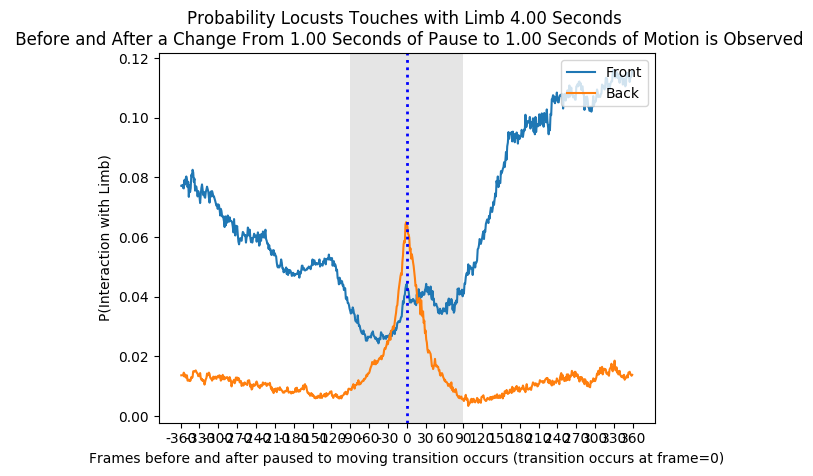

In [87]:
region = 'FB'
# get history of interaction where you include the paused length or greater
for pause_length in pause_lengths:
    data_analysis.history(X_FB, y, framesback, region, want_PL_or_Greater=True, pause_length=pause_length)

# get history of only instances with a paused length of x
'''for pause_length in pause_lengths:
    data_analysis.history(X_FB, y, framesback, region, want_PL_or_Greater=False, pause_length=pause_length)'''

# filter out the brief changes in motion, Keep data points where locust was paused for X frames, moving for X frames
for filter_frame in filter_lengths:
    data_analysis.history(X_FB, y, framesback, region, want_PL_or_Greater=False, pause_length=np.nan, filter_frames=filter_frame)

# create heatmap of most frequent interactions per limb
# data_analysis.heatmap(limb_count_FB)

LR: Left/Right

In [83]:
unique, counts = np.unique(X_LR, return_counts=True)
print("unique: ", unique[0:2], " counts: ", counts[0:2])

avg_two=np.array([counts[0]/(totalFrames*103), counts[1]/(totalFrames*103)])

unique:  [0. 1.]  counts:  [3053950 2597233]










  0%|          | 0/323578 [00:00<?, ?it/s]







  2%|▏         | 7883/323578 [00:00<00:04, 76383.40it/s]









0


  6%|▌         | 18229/323578 [00:00<00:03, 82796.36it/s]







  8%|▊         | 25295/323578 [00:00<00:03, 78732.53it/s]







 10%|█         | 32748/323578 [00:00<00:03, 76746.67it/s]







 13%|█▎        | 42567/323578 [00:00<00:03, 81596.75it/s]







 15%|█▌        | 49761/323578 [00:00<00:03, 78437.71it/s]







 18%|█▊        | 58038/323578 [00:00<00:03, 79382.80it/s]







 21%|██        | 66784/323578 [00:00<00:03, 81244.80it/s]







 23%|██▎       | 75194/323578 [00:00<00:03, 82079.50it/s]







 26%|██▌       | 83211/323578 [00:01<00:02, 81496.00it/s]







 28%|██▊       | 91873/323578 [00:01<00:02, 82968.19it/s]







 31%|███▏      | 101837/323578 [00:01<00:02, 87352.07it/s]







 35%|███▍      | 111697/323578 [00:01<00:02, 90447.35it/s]







 38%|███▊      | 122606/323578 [00:01<00:02, 95334.92it/s]







 42%|████▏     | 135254/323578 [00:01<00:01, 102939.26it/s]







 45%|████▌     | 145779/323578 [00:01<00:01, 102424.56it/s]







 48%|████▊     | 1

1


  6%|▌         | 18048/323578 [00:00<00:03, 93522.56it/s] 







  8%|▊         | 27254/323578 [00:00<00:03, 93077.89it/s]







 11%|█         | 34412/323578 [00:00<00:03, 85229.20it/s]







 14%|█▍        | 45513/323578 [00:00<00:03, 91611.70it/s]







 18%|█▊        | 56660/323578 [00:00<00:02, 96642.22it/s]







 21%|██▏       | 69078/323578 [00:00<00:02, 103528.85it/s]







 25%|██▌       | 82222/323578 [00:00<00:02, 110572.09it/s]







 29%|██▉       | 93418/323578 [00:00<00:02, 110983.92it/s]







 32%|███▏      | 104530/323578 [00:01<00:01, 111023.39it/s]







 37%|███▋      | 118608/323578 [00:01<00:01, 118538.58it/s]







 41%|████      | 133179/323578 [00:01<00:01, 125561.33it/s]







 46%|████▌     | 149199/323578 [00:01<00:01, 134270.80it/s]







 51%|█████     | 164750/323578 [00:01<00:01, 139963.42it/s]







 56%|█████▌    | 180708/323578 [00:01<00:00, 145320.85it/s]







 61%|██████    | 195795/323578 [00:01<00:00, 146941.68it/s]







 65%|██

2


  5%|▍         | 15729/323578 [00:00<00:03, 79559.45it/s]







  7%|▋         | 22294/323578 [00:00<00:04, 74803.22it/s]







 10%|▉         | 31045/323578 [00:00<00:03, 78209.16it/s]







 12%|█▏        | 39196/323578 [00:00<00:03, 79169.70it/s]







 15%|█▍        | 47431/323578 [00:00<00:03, 80096.88it/s]







 17%|█▋        | 54513/323578 [00:00<00:04, 66192.22it/s]







 19%|█▉        | 61098/323578 [00:00<00:03, 66088.30it/s]







 21%|██        | 68566/323578 [00:00<00:03, 67863.29it/s]







 24%|██▍       | 76958/323578 [00:01<00:03, 71636.03it/s]







 26%|██▋       | 85574/323578 [00:01<00:03, 75451.19it/s]







 29%|██▉       | 93673/323578 [00:01<00:02, 77031.54it/s]







 31%|███▏      | 101567/323578 [00:01<00:02, 77593.41it/s]







 35%|███▍      | 111831/323578 [00:01<00:02, 83209.47it/s]







 38%|███▊      | 122346/323578 [00:01<00:02, 88764.87it/s]







 41%|████      | 131418/323578 [00:01<00:02, 82267.23it/s]







 43%|████▎     | 1398

3


  7%|▋         | 21397/323578 [00:00<00:02, 104359.40it/s]







 10%|▉         | 31704/323578 [00:00<00:02, 103967.66it/s]







 12%|█▏        | 40346/323578 [00:00<00:02, 97996.60it/s] 







 15%|█▍        | 47770/323578 [00:00<00:03, 82230.64it/s]







 17%|█▋        | 55963/323578 [00:00<00:03, 81428.85it/s]







 20%|██        | 65754/323578 [00:00<00:03, 85759.59it/s]







 24%|██▍       | 77661/323578 [00:00<00:02, 93615.61it/s]







 29%|██▊       | 92331/323578 [00:00<00:02, 105015.14it/s]







 32%|███▏      | 103170/323578 [00:01<00:02, 97231.57it/s]







 35%|███▌      | 114805/323578 [00:01<00:02, 102266.84it/s]







 40%|███▉      | 129093/323578 [00:01<00:01, 111413.69it/s]







 43%|████▎     | 140696/323578 [00:01<00:01, 111688.23it/s]







 47%|████▋     | 152188/323578 [00:01<00:01, 100934.00it/s]







 51%|█████     | 163978/323578 [00:01<00:01, 105486.64it/s]







 55%|█████▌    | 178024/323578 [00:01<00:01, 114001.76it/s]







 60%|███

4


  3%|▎         | 11082/323578 [00:00<00:06, 51131.69it/s]







  5%|▌         | 16844/323578 [00:00<00:05, 52491.42it/s]







  7%|▋         | 23195/323578 [00:00<00:05, 55114.16it/s]







  9%|▉         | 29420/323578 [00:00<00:05, 57036.14it/s]







 12%|█▏        | 37604/323578 [00:00<00:04, 62493.75it/s]







 14%|█▍        | 44672/323578 [00:00<00:04, 64742.81it/s]







 16%|█▌        | 51741/323578 [00:00<00:04, 66318.69it/s]







 19%|█▊        | 60115/323578 [00:00<00:03, 70305.13it/s]







 21%|██        | 67296/323578 [00:01<00:03, 70116.94it/s]







 24%|██▎       | 76137/323578 [00:01<00:03, 74219.92it/s]







 26%|██▌       | 83606/323578 [00:01<00:03, 70354.21it/s]







 28%|██▊       | 91118/323578 [00:01<00:03, 71638.87it/s]







 30%|███       | 98340/323578 [00:01<00:03, 68852.41it/s]







 33%|███▎      | 105289/323578 [00:01<00:03, 67247.36it/s]







 35%|███▍      | 112625/323578 [00:01<00:03, 68525.54it/s]







 37%|███▋      | 119532

5


  4%|▍         | 12192/323578 [00:00<00:05, 59872.79it/s]







  6%|▌         | 18808/323578 [00:00<00:04, 61628.99it/s]







  8%|▊         | 25396/323578 [00:00<00:04, 62509.57it/s]







 10%|▉         | 31990/323578 [00:00<00:04, 63352.45it/s]







 12%|█▏        | 40272/323578 [00:00<00:04, 68158.66it/s]







 14%|█▍        | 46506/323578 [00:00<00:04, 65512.19it/s]







 17%|█▋        | 53567/323578 [00:00<00:04, 66961.41it/s]







 19%|█▊        | 60533/323578 [00:00<00:03, 67607.38it/s]







 21%|██        | 67291/323578 [00:01<00:03, 67000.27it/s]







 23%|██▎       | 73865/323578 [00:01<00:03, 64546.22it/s]







 25%|██▌       | 81426/323578 [00:01<00:03, 67505.95it/s]







 27%|██▋       | 88736/323578 [00:01<00:03, 69091.80it/s]







 30%|██▉       | 95756/323578 [00:01<00:03, 69420.54it/s]







 32%|███▏      | 103099/323578 [00:01<00:03, 70099.33it/s]







 34%|███▍      | 110216/323578 [00:01<00:03, 69888.09it/s]







 36%|███▌      | 117207

6


  4%|▍         | 13957/323578 [00:00<00:05, 61724.46it/s]







  6%|▋         | 20891/323578 [00:00<00:04, 63661.45it/s]







  9%|▉         | 29676/323578 [00:00<00:04, 69393.10it/s]







 11%|█         | 36193/323578 [00:00<00:04, 68000.27it/s]







 13%|█▎        | 42654/323578 [00:00<00:04, 66795.00it/s]







 16%|█▌        | 50825/323578 [00:00<00:03, 70535.34it/s]







 18%|█▊        | 57567/323578 [00:00<00:03, 68210.34it/s]







 20%|██        | 65246/323578 [00:00<00:03, 70336.46it/s]







 23%|██▎       | 74020/323578 [00:01<00:03, 74786.65it/s]







 25%|██▌       | 81489/323578 [00:01<00:03, 73751.51it/s]







 28%|██▊       | 90771/323578 [00:01<00:02, 78191.93it/s]







 31%|███       | 100079/323578 [00:01<00:02, 82131.79it/s]







 33%|███▎      | 108394/323578 [00:01<00:02, 77311.65it/s]







 36%|███▌      | 116255/323578 [00:01<00:02, 75056.25it/s]







 38%|███▊      | 123964/323578 [00:01<00:02, 75654.99it/s]







 42%|████▏     | 1344

7










  5%|▍         | 15563/323578 [00:00<00:04, 73799.75it/s]







  7%|▋         | 22304/323578 [00:00<00:04, 71758.95it/s]







 11%|█         | 34279/323578 [00:00<00:03, 81259.44it/s]







 14%|█▎        | 43893/323578 [00:00<00:03, 84995.42it/s]







 17%|█▋        | 54547/323578 [00:00<00:02, 90484.42it/s]







 20%|█▉        | 63135/323578 [00:00<00:03, 84868.53it/s]







 22%|██▏       | 71371/323578 [00:00<00:03, 79891.14it/s]







 24%|██▍       | 79244/323578 [00:00<00:03, 78336.80it/s]







 27%|██▋       | 87004/323578 [00:01<00:03, 73401.57it/s]







 30%|██▉       | 96976/323578 [00:01<00:02, 79688.79it/s]







 33%|███▎      | 106117/323578 [00:01<00:02, 82876.01it/s]







 35%|███▌      | 114553/323578 [00:01<00:02, 82883.04it/s]







 38%|███▊      | 123990/323578 [00:01<00:02, 85866.74it/s]







 41%|████▏     | 133821/323578 [00:01<00:02, 89255.54it/s]







 44%|████▍     | 143817/323578 [00:01<00:01, 92217.33it/s]







 48%|████▊  

8


  5%|▍         | 15631/323578 [00:00<00:03, 77377.14it/s]







  7%|▋         | 22996/323578 [00:00<00:03, 76219.16it/s]







 10%|▉         | 30921/323578 [00:00<00:03, 76989.21it/s]







 12%|█▏        | 39356/323578 [00:00<00:03, 78756.69it/s]







 15%|█▍        | 47103/323578 [00:00<00:03, 78364.99it/s]







 17%|█▋        | 54849/323578 [00:00<00:03, 78090.96it/s]







 20%|█▉        | 63404/323578 [00:00<00:03, 79762.85it/s]







 22%|██▏       | 71999/323578 [00:00<00:03, 80971.35it/s]







 25%|██▌       | 80980/323578 [00:01<00:02, 83176.13it/s]







 28%|██▊       | 89159/323578 [00:01<00:02, 82738.34it/s]







 31%|███       | 99024/323578 [00:01<00:02, 86944.52it/s]







 33%|███▎      | 107986/323578 [00:01<00:02, 87234.30it/s]







 36%|███▌      | 116683/323578 [00:01<00:02, 85550.17it/s]







 40%|███▉      | 127957/323578 [00:01<00:02, 92221.49it/s]







 43%|████▎     | 137605/323578 [00:01<00:01, 93458.03it/s]







 45%|████▌     | 1470

9


  6%|▌         | 18464/323578 [00:00<00:03, 94912.11it/s] 







  8%|▊         | 26591/323578 [00:00<00:03, 90361.38it/s]







 11%|█         | 34694/323578 [00:00<00:03, 86712.03it/s]







 14%|█▎        | 43751/323578 [00:00<00:03, 87833.81it/s]







 16%|█▌        | 52147/323578 [00:00<00:03, 86633.72it/s]







 18%|█▊        | 59768/323578 [00:00<00:03, 82643.46it/s]







 21%|██        | 67272/323578 [00:00<00:03, 80040.83it/s]







 23%|██▎       | 76027/323578 [00:00<00:03, 82153.67it/s]







 27%|██▋       | 86049/323578 [00:01<00:02, 86849.44it/s]







 30%|██▉       | 95974/323578 [00:01<00:02, 90231.01it/s]







 33%|███▎      | 105786/323578 [00:01<00:02, 91811.18it/s]







 36%|███▌      | 117036/323578 [00:01<00:02, 96705.01it/s]







 39%|███▉      | 126739/323578 [00:01<00:02, 91521.21it/s]







 42%|████▏     | 135972/323578 [00:01<00:02, 77558.45it/s]







 45%|████▍     | 145311/323578 [00:01<00:02, 81713.84it/s]







 48%|████▊     | 15

10


  5%|▌         | 17702/323578 [00:00<00:03, 84577.28it/s]







  8%|▊         | 24852/323578 [00:00<00:03, 80177.26it/s]







 10%|█         | 32514/323578 [00:00<00:03, 78571.88it/s]







 12%|█▏        | 38495/323578 [00:00<00:04, 69961.28it/s]







 14%|█▍        | 45725/323578 [00:00<00:03, 70437.65it/s]







 17%|█▋        | 56342/323578 [00:00<00:03, 78148.27it/s]







 20%|█▉        | 64451/323578 [00:00<00:03, 78638.73it/s]







 22%|██▏       | 72111/323578 [00:00<00:03, 71931.85it/s]







 24%|██▍       | 79273/323578 [00:01<00:03, 70691.94it/s]







 27%|██▋       | 87091/323578 [00:01<00:03, 72198.37it/s]







 29%|██▉       | 95152/323578 [00:01<00:03, 74530.36it/s]







 33%|███▎      | 105849/323578 [00:01<00:02, 81989.02it/s]







 35%|███▌      | 114396/323578 [00:01<00:02, 83002.80it/s]







 38%|███▊      | 122867/323578 [00:01<00:02, 83391.88it/s]







 41%|████▏     | 133541/323578 [00:01<00:02, 88597.54it/s]







 44%|████▍     | 1425

11


  5%|▍         | 15617/323578 [00:00<00:03, 78419.65it/s]







  7%|▋         | 22700/323578 [00:00<00:03, 75685.23it/s]







 10%|▉         | 31531/323578 [00:00<00:03, 79075.87it/s]







 12%|█▏        | 39693/323578 [00:00<00:03, 79408.28it/s]







 15%|█▍        | 47073/323578 [00:00<00:03, 77034.84it/s]







 17%|█▋        | 53997/323578 [00:00<00:03, 73937.89it/s]







 19%|█▉        | 62590/323578 [00:00<00:03, 77167.65it/s]







 22%|██▏       | 71767/323578 [00:00<00:03, 81034.90it/s]







 27%|██▋       | 87000/323578 [00:01<00:02, 94270.79it/s]







 32%|███▏      | 103404/323578 [00:01<00:02, 108057.53it/s]







 37%|███▋      | 118454/323578 [00:01<00:01, 118044.00it/s]







 41%|████      | 131355/323578 [00:01<00:01, 120860.64it/s]







 45%|████▍     | 144225/323578 [00:01<00:01, 122695.39it/s]







 49%|████▉     | 157998/323578 [00:01<00:01, 126171.18it/s]







 53%|█████▎    | 171029/323578 [00:01<00:01, 123432.27it/s]







 57%|█████▋  

12


  5%|▌         | 16910/323578 [00:00<00:04, 73067.48it/s]







  7%|▋         | 24039/323578 [00:00<00:04, 72136.13it/s]







  9%|▉         | 30616/323578 [00:00<00:04, 70058.37it/s]







 12%|█▏        | 37284/323578 [00:00<00:04, 69008.70it/s]







 14%|█▍        | 46121/323578 [00:00<00:03, 73863.50it/s]







 17%|█▋        | 54815/323578 [00:00<00:03, 77352.74it/s]







 19%|█▉        | 62564/323578 [00:00<00:03, 77197.95it/s]







 23%|██▎       | 73346/323578 [00:00<00:02, 83944.40it/s]







 25%|██▌       | 81739/323578 [00:01<00:02, 81946.73it/s]







 28%|██▊       | 89943/323578 [00:01<00:03, 77778.86it/s]







 30%|███       | 97803/323578 [00:01<00:02, 77617.04it/s]







 33%|███▎      | 105669/323578 [00:01<00:02, 77678.85it/s]







 35%|███▌      | 113462/323578 [00:01<00:02, 77365.91it/s]







 37%|███▋      | 121217/323578 [00:01<00:02, 77367.15it/s]







 40%|████      | 129700/323578 [00:01<00:02, 79463.99it/s]







 43%|████▎     | 1382

13


  7%|▋         | 21091/323578 [00:00<00:03, 100712.47it/s]







 10%|▉         | 30838/323578 [00:00<00:02, 98743.98it/s] 







 13%|█▎        | 41258/323578 [00:00<00:02, 99473.21it/s]







 15%|█▌        | 49188/323578 [00:00<00:02, 92419.30it/s]







 18%|█▊        | 59132/323578 [00:00<00:02, 93917.03it/s]







 21%|██▏       | 69565/323578 [00:00<00:02, 96814.80it/s]







 24%|██▍       | 78535/323578 [00:00<00:02, 94111.31it/s]







 27%|██▋       | 87465/323578 [00:00<00:02, 84091.10it/s]







 30%|██▉       | 96107/323578 [00:01<00:02, 84450.31it/s]







 33%|███▎      | 106322/323578 [00:01<00:02, 89080.50it/s]







 36%|███▌      | 115231/323578 [00:01<00:02, 86547.67it/s]







 38%|███▊      | 123903/323578 [00:01<00:02, 86191.10it/s]







 42%|████▏     | 135472/323578 [00:01<00:02, 93329.54it/s]







 45%|████▌     | 145694/323578 [00:01<00:01, 95661.40it/s]







 48%|████▊     | 156806/323578 [00:01<00:01, 99827.66it/s]







 52%|█████▏    | 

14


  5%|▌         | 16862/323578 [00:00<00:03, 87640.15it/s]







  7%|▋         | 23584/323578 [00:00<00:03, 80319.36it/s]







  9%|▉         | 30269/323578 [00:00<00:03, 75740.78it/s]







 12%|█▏        | 40297/323578 [00:00<00:03, 81741.57it/s]







 16%|█▌        | 50592/323578 [00:00<00:03, 87125.23it/s]







 18%|█▊        | 59413/323578 [00:00<00:03, 87447.50it/s]







 21%|██        | 67572/323578 [00:00<00:03, 82581.24it/s]







 23%|██▎       | 75611/323578 [00:00<00:03, 81910.14it/s]







 26%|██▌       | 84639/323578 [00:01<00:02, 83649.18it/s]







 29%|██▉       | 95266/323578 [00:01<00:02, 89354.28it/s]







 32%|███▏      | 104195/323578 [00:01<00:02, 87941.38it/s]







 35%|███▍      | 112990/323578 [00:01<00:02, 87613.95it/s]







 38%|███▊      | 123039/323578 [00:01<00:02, 90649.68it/s]







 41%|████      | 132132/323578 [00:01<00:02, 85971.73it/s]







 44%|████▎     | 140799/323578 [00:01<00:02, 85889.65it/s]







 47%|████▋     | 151

15


  7%|▋         | 21293/323578 [00:00<00:02, 101205.19it/s]







 10%|█         | 32478/323578 [00:00<00:02, 104177.93it/s]







 13%|█▎        | 40886/323578 [00:00<00:02, 96537.14it/s] 







 15%|█▌        | 49357/323578 [00:00<00:02, 91937.64it/s]







 18%|█▊        | 59213/323578 [00:00<00:02, 93695.22it/s]







 22%|██▏       | 69597/323578 [00:00<00:02, 96523.17it/s]







 24%|██▍       | 78571/323578 [00:00<00:02, 88835.23it/s]







 28%|██▊       | 89335/323578 [00:00<00:02, 93747.93it/s]







 31%|███       | 99907/323578 [00:01<00:02, 97043.58it/s]







 34%|███▍      | 111401/323578 [00:01<00:02, 101798.24it/s]







 38%|███▊      | 124225/323578 [00:01<00:01, 108508.67it/s]







 42%|████▏     | 135196/323578 [00:01<00:01, 105168.26it/s]







 45%|████▌     | 145819/323578 [00:01<00:01, 98002.59it/s] 







 49%|████▉     | 158789/323578 [00:01<00:01, 105746.37it/s]







 52%|█████▏    | 169660/323578 [00:01<00:01, 106332.84it/s]







 56%|█████

16


  4%|▍         | 13191/323578 [00:00<00:04, 67721.76it/s]







  7%|▋         | 21152/323578 [00:00<00:04, 70897.73it/s]







  9%|▊         | 27863/323578 [00:00<00:04, 69716.09it/s]







 11%|█         | 35688/323578 [00:00<00:04, 71488.15it/s]







 14%|█▎        | 44451/323578 [00:00<00:03, 75669.51it/s]







 17%|█▋        | 54112/323578 [00:00<00:03, 80906.71it/s]







 19%|█▉        | 61784/323578 [00:00<00:03, 75839.29it/s]







 22%|██▏       | 70644/323578 [00:00<00:03, 79262.87it/s]







 24%|██▍       | 78451/323578 [00:01<00:03, 77866.71it/s]







 27%|██▋       | 86160/323578 [00:01<00:03, 77215.18it/s]







 29%|██▉       | 93828/323578 [00:01<00:02, 76626.10it/s]







 31%|███▏      | 101741/323578 [00:01<00:02, 77302.98it/s]







 34%|███▍      | 109448/323578 [00:01<00:02, 76467.27it/s]







 36%|███▌      | 117080/323578 [00:01<00:02, 73205.55it/s]







 39%|███▊      | 124784/323578 [00:01<00:02, 74314.40it/s]







 41%|████      | 1323

17


  5%|▍         | 15193/323578 [00:00<00:04, 75783.28it/s]







  7%|▋         | 22957/323578 [00:00<00:03, 76273.38it/s]







  9%|▉         | 30183/323578 [00:00<00:03, 74535.59it/s]







 12%|█▏        | 37582/323578 [00:00<00:03, 74016.27it/s]







 14%|█▎        | 43998/323578 [00:00<00:03, 70500.87it/s]







 16%|█▌        | 50297/323578 [00:00<00:04, 68024.20it/s]







 18%|█▊        | 58159/323578 [00:00<00:03, 70329.45it/s]







 21%|██        | 67064/323578 [00:00<00:03, 74807.94it/s]







 23%|██▎       | 75008/323578 [00:01<00:03, 76139.49it/s]







 26%|██▌       | 82718/323578 [00:01<00:03, 76424.60it/s]







 28%|██▊       | 90271/323578 [00:01<00:03, 73775.11it/s]







 31%|███       | 100301/323578 [00:01<00:02, 80131.57it/s]







 34%|███▎      | 109120/323578 [00:01<00:02, 82388.98it/s]







 36%|███▋      | 117466/323578 [00:01<00:02, 81120.78it/s]







 39%|███▉      | 125658/323578 [00:01<00:02, 76783.63it/s]







 42%|████▏     | 1348

18


  9%|▉         | 28726/323578 [00:00<00:02, 140927.29it/s]







 12%|█▏        | 38410/323578 [00:00<00:02, 123989.86it/s]







 17%|█▋        | 53396/323578 [00:00<00:02, 130761.46it/s]







 21%|██▏       | 69351/323578 [00:00<00:01, 138243.59it/s]







 25%|██▌       | 81642/323578 [00:00<00:01, 133255.40it/s]







 30%|██▉       | 96488/323578 [00:00<00:01, 137479.08it/s]







 34%|███▍      | 109349/323578 [00:00<00:01, 121070.05it/s]







 37%|███▋      | 121193/323578 [00:01<00:02, 93139.81it/s] 







 41%|████      | 131300/323578 [00:01<00:02, 85228.81it/s]







 43%|████▎     | 140509/323578 [00:01<00:02, 83781.78it/s]







 46%|████▌     | 149373/323578 [00:01<00:02, 78683.37it/s]







 49%|████▊     | 157733/323578 [00:01<00:02, 80087.95it/s]







 52%|█████▏    | 167077/323578 [00:01<00:01, 83244.69it/s]







 54%|█████▍    | 175636/323578 [00:01<00:01, 82617.33it/s]







 57%|█████▋    | 184063/323578 [00:01<00:01, 80278.43it/s]







 59%|███

19


  6%|▌         | 18509/323578 [00:00<00:03, 79802.02it/s]







  9%|▊         | 27949/323578 [00:00<00:03, 83684.05it/s]







 12%|█▏        | 38761/323578 [00:00<00:03, 89769.51it/s]







 15%|█▌        | 49222/323578 [00:00<00:02, 93671.03it/s]







 18%|█▊        | 57687/323578 [00:00<00:02, 90235.94it/s]







 21%|██        | 67231/323578 [00:00<00:02, 91735.72it/s]







 24%|██▍       | 77377/323578 [00:00<00:02, 94451.33it/s]







 27%|██▋       | 86551/323578 [00:00<00:02, 85555.27it/s]







 29%|██▉       | 95077/323578 [00:01<00:02, 83405.35it/s]







 32%|███▏      | 104436/323578 [00:01<00:02, 86211.59it/s]







 36%|███▌      | 116455/323578 [00:01<00:02, 94200.22it/s]







 39%|███▉      | 126108/323578 [00:01<00:02, 83805.06it/s]







 42%|████▏     | 135294/323578 [00:01<00:02, 86068.83it/s]







 45%|████▌     | 145624/323578 [00:01<00:01, 90602.52it/s]







 48%|████▊     | 155225/323578 [00:01<00:01, 91718.31it/s]







 51%|█████     | 16

20


  5%|▍         | 14892/323578 [00:00<00:04, 73815.42it/s]







  7%|▋         | 22030/323578 [00:00<00:04, 73066.26it/s]







  9%|▉         | 30050/323578 [00:00<00:03, 75068.24it/s]







 12%|█▏        | 39432/323578 [00:00<00:03, 79855.35it/s]







 15%|█▍        | 48197/323578 [00:00<00:03, 81836.56it/s]







 17%|█▋        | 55585/323578 [00:00<00:03, 75371.23it/s]







 19%|█▉        | 62666/323578 [00:00<00:03, 72674.42it/s]







 22%|██▏       | 71973/323578 [00:00<00:03, 77288.03it/s]







 25%|██▍       | 79621/323578 [00:01<00:03, 77042.52it/s]







 27%|██▋       | 87925/323578 [00:01<00:02, 78748.43it/s]







 30%|██▉       | 95747/323578 [00:01<00:02, 77141.24it/s]







 32%|███▏      | 104184/323578 [00:01<00:02, 79175.44it/s]







 35%|███▍      | 113224/323578 [00:01<00:02, 82238.40it/s]







 38%|███▊      | 121587/323578 [00:01<00:02, 82650.55it/s]







 41%|████      | 131247/323578 [00:01<00:02, 86391.85it/s]







 43%|████▎     | 1399

21


  5%|▍         | 15942/323578 [00:00<00:03, 77207.90it/s]







  7%|▋         | 23945/323578 [00:00<00:03, 78004.49it/s]







 10%|▉         | 31184/323578 [00:00<00:03, 76229.48it/s]







 12%|█▏        | 38801/323578 [00:00<00:03, 76211.48it/s]







 15%|█▍        | 47319/323578 [00:00<00:03, 78696.82it/s]







 17%|█▋        | 54341/323578 [00:00<00:03, 74856.53it/s]







 19%|█▉        | 62148/323578 [00:00<00:03, 75791.94it/s]







 22%|██▏       | 70552/323578 [00:00<00:03, 77603.67it/s]







 24%|██▍       | 78054/323578 [00:01<00:03, 75554.70it/s]







 27%|██▋       | 86956/323578 [00:01<00:02, 79145.15it/s]







 30%|███       | 97248/323578 [00:01<00:02, 84772.43it/s]







 33%|███▎      | 106653/323578 [00:01<00:02, 87304.90it/s]







 36%|███▌      | 115445/323578 [00:01<00:02, 85927.17it/s]







 39%|███▉      | 125434/323578 [00:01<00:02, 89659.79it/s]







 42%|████▏     | 134476/323578 [00:01<00:02, 89778.84it/s]







 44%|████▍     | 1435

22


  5%|▌         | 17131/323578 [00:00<00:03, 86738.14it/s]







  7%|▋         | 24183/323578 [00:00<00:03, 81139.94it/s]







 10%|▉         | 31296/323578 [00:00<00:03, 77852.35it/s]







 12%|█▏        | 39863/323578 [00:00<00:03, 80043.54it/s]







 15%|█▍        | 48173/323578 [00:00<00:03, 80935.78it/s]







 18%|█▊        | 57250/323578 [00:00<00:03, 83654.20it/s]







 20%|██        | 65356/323578 [00:00<00:03, 82857.36it/s]







 23%|██▎       | 73879/323578 [00:00<00:02, 83555.01it/s]







 26%|██▌       | 83218/323578 [00:01<00:02, 86097.85it/s]







 28%|██▊       | 91620/323578 [00:01<00:02, 83399.22it/s]







 32%|███▏      | 102441/323578 [00:01<00:02, 89559.28it/s]







 35%|███▌      | 114073/323578 [00:01<00:02, 96198.56it/s]







 38%|███▊      | 123860/323578 [00:01<00:02, 96589.56it/s]







 41%|████▏     | 133636/323578 [00:01<00:01, 95959.03it/s]







 44%|████▍     | 143315/323578 [00:01<00:01, 93911.62it/s]







 48%|████▊     | 154

23


  5%|▍         | 15056/323578 [00:00<00:04, 75427.61it/s]







  7%|▋         | 22472/323578 [00:00<00:04, 74495.61it/s]







  9%|▉         | 29039/323578 [00:00<00:04, 71607.13it/s]







 11%|█         | 35025/323578 [00:00<00:04, 67624.83it/s]







 13%|█▎        | 42281/323578 [00:00<00:04, 69026.96it/s]







 15%|█▍        | 48346/323578 [00:00<00:04, 65974.52it/s]







 17%|█▋        | 55019/323578 [00:00<00:04, 66097.09it/s]







 19%|█▉        | 62862/323578 [00:00<00:03, 69319.09it/s]







 22%|██▏       | 71635/323578 [00:01<00:03, 73942.24it/s]







 24%|██▍       | 79250/323578 [00:01<00:03, 74590.61it/s]







 28%|██▊       | 89101/323578 [00:01<00:02, 80450.40it/s]







 30%|███       | 97887/323578 [00:01<00:02, 81999.58it/s]







 34%|███▍      | 109372/323578 [00:01<00:02, 89695.82it/s]







 37%|███▋      | 120433/323578 [00:01<00:02, 95088.91it/s]







 41%|████      | 131459/323578 [00:01<00:01, 99182.38it/s]







 44%|████▍     | 14161

24


  4%|▍         | 13401/323578 [00:00<00:04, 67349.69it/s]







  7%|▋         | 22319/323578 [00:00<00:04, 72322.23it/s]







  9%|▉         | 28753/323578 [00:00<00:04, 69511.93it/s]







 12%|█▏        | 37531/323578 [00:00<00:03, 74140.38it/s]







 14%|█▎        | 44154/323578 [00:00<00:03, 70985.06it/s]







 16%|█▌        | 51407/323578 [00:00<00:03, 71263.12it/s]







 18%|█▊        | 58064/323578 [00:00<00:03, 68769.43it/s]







 21%|██        | 66360/323578 [00:00<00:03, 72202.53it/s]







 23%|██▎       | 73505/323578 [00:01<00:03, 71974.72it/s]







 25%|██▌       | 81005/323578 [00:01<00:03, 72244.69it/s]







 27%|██▋       | 88330/323578 [00:01<00:03, 71970.32it/s]







 30%|██▉       | 95998/323578 [00:01<00:03, 73206.00it/s]







 32%|███▏      | 103283/323578 [00:01<00:03, 72947.97it/s]







 34%|███▍      | 110554/323578 [00:01<00:02, 72206.55it/s]







 37%|███▋      | 120670/323578 [00:01<00:02, 78758.19it/s]







 40%|███▉      | 12871

25


  7%|▋         | 22391/323578 [00:00<00:02, 116826.63it/s]







  9%|▉         | 30720/323578 [00:00<00:02, 104233.70it/s]







 12%|█▏        | 38759/323578 [00:00<00:02, 95307.20it/s] 







 15%|█▌        | 48882/323578 [00:00<00:02, 96967.72it/s]







 18%|█▊        | 58709/323578 [00:00<00:02, 96994.65it/s]







 21%|██        | 68262/323578 [00:00<00:02, 95601.84it/s]







 24%|██▍       | 77176/323578 [00:00<00:02, 93350.20it/s]







 27%|██▋       | 87623/323578 [00:00<00:02, 96427.76it/s]







 30%|██▉       | 96849/323578 [00:01<00:02, 93795.44it/s]







 33%|███▎      | 107387/323578 [00:01<00:02, 96992.81it/s]







 37%|███▋      | 119302/323578 [00:01<00:01, 102642.38it/s]







 40%|████      | 129540/323578 [00:01<00:01, 100482.20it/s]







 43%|████▎     | 139580/323578 [00:01<00:01, 97406.81it/s] 







 47%|████▋     | 151755/323578 [00:01<00:01, 103622.37it/s]







 50%|█████     | 162258/323578 [00:01<00:01, 103919.45it/s]







 54%|█████▎

26


  6%|▌         | 19107/323578 [00:00<00:03, 92700.72it/s]







 10%|▉         | 31430/323578 [00:00<00:02, 100142.46it/s]







 13%|█▎        | 42379/323578 [00:00<00:02, 102422.89it/s]







 17%|█▋        | 53814/323578 [00:00<00:02, 105731.22it/s]







 19%|█▉        | 62985/323578 [00:00<00:02, 99732.37it/s] 







 22%|██▏       | 72047/323578 [00:00<00:02, 92662.12it/s]







 26%|██▌       | 83862/323578 [00:00<00:02, 99073.06it/s]







 30%|██▉       | 96646/323578 [00:00<00:02, 106245.13it/s]







 33%|███▎      | 107240/323578 [00:01<00:02, 103479.40it/s]







 36%|███▋      | 117582/323578 [00:01<00:02, 101158.30it/s]







 40%|████      | 130645/323578 [00:01<00:01, 108500.66it/s]







 45%|████▍     | 144029/323578 [00:01<00:01, 115033.24it/s]







 49%|████▉     | 159543/323578 [00:01<00:01, 124703.29it/s]







 54%|█████▍    | 174495/323578 [00:01<00:01, 131236.30it/s]







 59%|█████▊    | 190016/323578 [00:01<00:00, 137611.81it/s]







 63%|█

27


  5%|▍         | 15129/323578 [00:00<00:04, 74566.79it/s]







  7%|▋         | 22622/323578 [00:00<00:04, 74028.77it/s]







  9%|▉         | 29092/323578 [00:00<00:04, 70958.24it/s]







 11%|█         | 35537/323578 [00:00<00:04, 68871.73it/s]







 15%|█▍        | 47133/323578 [00:00<00:03, 78425.53it/s]







 18%|█▊        | 58406/323578 [00:00<00:03, 86102.74it/s]







 21%|██        | 68062/323578 [00:00<00:02, 88992.78it/s]







 24%|██▍       | 77453/323578 [00:00<00:02, 90412.92it/s]







 27%|██▋       | 86498/323578 [00:01<00:02, 88080.69it/s]







 30%|██▉       | 96975/323578 [00:01<00:02, 91961.40it/s]







 33%|███▎      | 106227/323578 [00:01<00:02, 89560.72it/s]







 36%|███▌      | 115236/323578 [00:01<00:02, 87845.44it/s]







 38%|███▊      | 124375/323578 [00:01<00:02, 88878.63it/s]







 43%|████▎     | 138961/323578 [00:01<00:01, 100677.73it/s]







 48%|████▊     | 154078/323578 [00:01<00:01, 111887.92it/s]







 52%|█████▏    | 1

28


  4%|▎         | 12061/323578 [00:00<00:05, 58435.43it/s]







  6%|▋         | 20523/323578 [00:00<00:04, 64414.65it/s]







  8%|▊         | 27351/323578 [00:00<00:04, 65098.28it/s]







 10%|█         | 33557/323578 [00:00<00:04, 64155.51it/s]







 12%|█▏        | 39105/323578 [00:00<00:04, 59505.59it/s]







 14%|█▍        | 45988/323578 [00:00<00:04, 62025.58it/s]







 17%|█▋        | 53827/323578 [00:00<00:04, 65969.02it/s]







 19%|█▊        | 60248/323578 [00:00<00:04, 60486.17it/s]







 21%|██        | 68247/323578 [00:01<00:03, 65251.13it/s]







 23%|██▎       | 75481/323578 [00:01<00:03, 67227.20it/s]







 26%|██▌       | 82680/323578 [00:01<00:03, 68587.98it/s]







 28%|██▊       | 89597/323578 [00:01<00:03, 64162.97it/s]







 30%|███       | 97503/323578 [00:01<00:03, 67629.49it/s]







 33%|███▎      | 105797/323578 [00:01<00:03, 71365.01it/s]







 35%|███▍      | 113073/323578 [00:01<00:03, 67940.01it/s]







 38%|███▊      | 123848

29


  5%|▌         | 17257/323578 [00:00<00:03, 81933.27it/s]







  7%|▋         | 24198/323578 [00:00<00:03, 77441.85it/s]







 10%|▉         | 31195/323578 [00:00<00:03, 75037.33it/s]







 12%|█▏        | 37831/323578 [00:00<00:03, 72203.52it/s]







 14%|█▎        | 43892/323578 [00:00<00:04, 67673.69it/s]







 16%|█▋        | 52934/323578 [00:00<00:03, 72773.54it/s]







 18%|█▊        | 59756/323578 [00:00<00:03, 70579.24it/s]







 21%|██▏       | 69392/323578 [00:00<00:03, 76738.46it/s]







 24%|██▍       | 78107/323578 [00:01<00:03, 79589.68it/s]







 27%|██▋       | 86055/323578 [00:01<00:03, 79054.79it/s]







 29%|██▉       | 94628/323578 [00:01<00:02, 80710.26it/s]







 32%|███▏      | 102703/323578 [00:01<00:02, 76474.86it/s]







 34%|███▍      | 110624/323578 [00:01<00:02, 77274.14it/s]







 37%|███▋      | 118388/323578 [00:01<00:02, 75527.37it/s]







 39%|███▉      | 125975/323578 [00:01<00:02, 75419.39it/s]







 41%|████▏     | 1335

30


  6%|▌         | 18219/323578 [00:00<00:03, 92873.28it/s]







  9%|▉         | 29592/323578 [00:00<00:02, 98279.61it/s]







 12%|█▏        | 37580/323578 [00:00<00:03, 91926.28it/s]







 15%|█▍        | 47303/323578 [00:00<00:02, 93454.05it/s]







 18%|█▊        | 56970/323578 [00:00<00:02, 93946.64it/s]







 20%|██        | 65313/323578 [00:00<00:03, 85540.36it/s]







 23%|██▎       | 74257/323578 [00:00<00:02, 86666.41it/s]







 26%|██▌       | 83701/323578 [00:00<00:02, 88860.32it/s]







 29%|██▉       | 95377/323578 [00:01<00:02, 95721.14it/s]







 33%|███▎      | 105615/323578 [00:01<00:02, 97453.32it/s]







 36%|███▌      | 115340/323578 [00:01<00:02, 95257.45it/s]







 39%|███▉      | 126747/323578 [00:01<00:01, 100214.52it/s]







 42%|████▏     | 136835/323578 [00:01<00:01, 98906.65it/s] 







 46%|████▌     | 148162/323578 [00:01<00:01, 102816.46it/s]







 49%|████▉     | 158519/323578 [00:01<00:01, 95683.26it/s] 







 52%|█████▏    

31


  5%|▌         | 16712/323578 [00:00<00:03, 85062.71it/s]







  8%|▊         | 24767/323578 [00:00<00:03, 83231.58it/s]







 12%|█▏        | 38269/323578 [00:00<00:03, 93731.23it/s]







 16%|█▌        | 52070/323578 [00:00<00:02, 103713.28it/s]







 19%|█▉        | 62898/323578 [00:00<00:02, 105040.61it/s]







 23%|██▎       | 72809/323578 [00:00<00:02, 86994.90it/s] 







 25%|██▌       | 82180/323578 [00:00<00:02, 88730.84it/s]







 29%|██▉       | 94573/323578 [00:00<00:02, 96995.01it/s]







 33%|███▎      | 107986/323578 [00:01<00:02, 105780.68it/s]







 37%|███▋      | 119519/323578 [00:01<00:01, 108462.10it/s]







 42%|████▏     | 135225/323578 [00:01<00:01, 119174.78it/s]







 46%|████▌     | 147689/323578 [00:01<00:01, 115609.14it/s]







 50%|█████     | 163056/323578 [00:01<00:01, 124887.35it/s]







 54%|█████▍    | 176043/323578 [00:01<00:01, 120727.04it/s]







 59%|█████▉    | 192253/323578 [00:01<00:01, 130735.97it/s]







 64%|███

32


  5%|▌         | 17289/323578 [00:00<00:03, 86406.98it/s]







 10%|▉         | 31157/323578 [00:00<00:03, 97247.24it/s]







 15%|█▍        | 47009/323578 [00:00<00:02, 109985.49it/s]







 19%|█▉        | 63050/323578 [00:00<00:02, 121436.48it/s]







 25%|██▍       | 79365/323578 [00:00<00:01, 131035.37it/s]







 29%|██▊       | 92354/323578 [00:00<00:01, 126934.93it/s]







 33%|███▎      | 107893/323578 [00:00<00:01, 134296.11it/s]







 38%|███▊      | 121884/323578 [00:00<00:01, 135931.49it/s]







 43%|████▎     | 137789/323578 [00:01<00:01, 142127.14it/s]







 47%|████▋     | 152323/323578 [00:01<00:01, 143074.01it/s]







 52%|█████▏    | 168465/323578 [00:01<00:01, 148123.64it/s]







 57%|█████▋    | 183677/323578 [00:01<00:00, 149297.85it/s]







 62%|██████▏   | 200252/323578 [00:01<00:00, 153878.24it/s]







 67%|██████▋   | 215728/323578 [00:01<00:00, 153424.10it/s]







 72%|███████▏  | 232330/323578 [00:01<00:00, 156995.11it/s]







 77

33


  5%|▌         | 16386/323578 [00:00<00:04, 75809.15it/s]







  7%|▋         | 23914/323578 [00:00<00:03, 75648.40it/s]







 10%|▉         | 30816/323578 [00:00<00:04, 72833.40it/s]







 12%|█▏        | 37613/323578 [00:00<00:04, 71302.17it/s]







 14%|█▍        | 46804/323578 [00:00<00:03, 75945.57it/s]







 17%|█▋        | 54154/323578 [00:00<00:03, 75113.71it/s]







 19%|█▉        | 62006/323578 [00:00<00:03, 76104.02it/s]







 23%|██▎       | 74460/323578 [00:00<00:02, 86155.41it/s]







 27%|██▋       | 86215/323578 [00:01<00:02, 93235.97it/s]







 30%|██▉       | 95854/323578 [00:01<00:02, 90787.70it/s]







 34%|███▍      | 110269/323578 [00:01<00:02, 102129.78it/s]







 38%|███▊      | 122537/323578 [00:01<00:01, 106849.36it/s]







 42%|████▏     | 135207/323578 [00:01<00:01, 112117.55it/s]







 46%|████▋     | 150395/323578 [00:01<00:01, 121672.23it/s]







 51%|█████▏    | 166046/323578 [00:01<00:01, 130378.14it/s]







 56%|█████▋    

34


  4%|▍         | 12458/323578 [00:00<00:04, 63071.59it/s]







  6%|▌         | 18343/323578 [00:00<00:04, 61607.37it/s]







  8%|▊         | 24985/323578 [00:00<00:04, 62976.28it/s]







 10%|▉         | 31548/323578 [00:00<00:04, 63362.95it/s]







 12%|█▏        | 39317/323578 [00:00<00:04, 67043.28it/s]







 14%|█▍        | 45327/323578 [00:00<00:04, 63762.89it/s]







 16%|█▋        | 52668/323578 [00:00<00:04, 66379.45it/s]







 19%|█▉        | 63063/323578 [00:00<00:03, 74451.65it/s]







 22%|██▏       | 70626/323578 [00:01<00:03, 67646.80it/s]







 24%|██▍       | 77593/323578 [00:01<00:03, 68211.37it/s]







 26%|██▌       | 84557/323578 [00:01<00:03, 64929.86it/s]







 29%|██▉       | 93097/323578 [00:01<00:03, 69685.73it/s]







 31%|███       | 100257/323578 [00:01<00:03, 67033.57it/s]







 33%|███▎      | 107116/323578 [00:01<00:03, 64861.96it/s]







 35%|███▌      | 113727/323578 [00:01<00:03, 64356.45it/s]







 38%|███▊      | 12384

35


  5%|▍         | 15300/323578 [00:00<00:03, 78312.88it/s]







  7%|▋         | 22956/323578 [00:00<00:03, 77777.87it/s]







 10%|▉         | 32263/323578 [00:00<00:03, 81809.75it/s]







 13%|█▎        | 42830/323578 [00:00<00:03, 87331.41it/s]







 16%|█▌        | 51350/323578 [00:00<00:03, 86295.21it/s]







 19%|█▊        | 60507/323578 [00:00<00:03, 87033.75it/s]







 21%|██▏       | 68768/323578 [00:00<00:02, 84998.31it/s]







 24%|██▍       | 76855/323578 [00:00<00:03, 81222.56it/s]







 26%|██▌       | 84724/323578 [00:01<00:03, 76771.93it/s]







 29%|██▊       | 92274/323578 [00:01<00:03, 76345.51it/s]







 31%|███       | 99820/323578 [00:01<00:03, 71462.81it/s]







 33%|███▎      | 108395/323578 [00:01<00:02, 74939.77it/s]







 36%|███▌      | 116313/323578 [00:01<00:02, 76151.61it/s]







 39%|███▉      | 127454/323578 [00:01<00:02, 83530.70it/s]







 42%|████▏     | 136049/323578 [00:01<00:02, 82932.22it/s]







 45%|████▍     | 1445

36


  6%|▋         | 20264/323578 [00:00<00:02, 104661.10it/s]







 10%|▉         | 31626/323578 [00:00<00:02, 107039.39it/s]







 13%|█▎        | 41052/323578 [00:00<00:02, 102841.22it/s]







 17%|█▋        | 55893/323578 [00:00<00:02, 113274.38it/s]







 21%|██        | 68425/323578 [00:00<00:02, 116633.16it/s]







 25%|██▌       | 82377/323578 [00:00<00:01, 122669.79it/s]







 30%|███       | 97411/323578 [00:00<00:01, 129838.19it/s]







 35%|███▌      | 113946/323578 [00:00<00:01, 138779.09it/s]







 40%|███▉      | 129107/323578 [00:01<00:01, 142393.28it/s]







 45%|████▍     | 145175/323578 [00:01<00:01, 147426.35it/s]







 49%|████▉     | 159945/323578 [00:01<00:01, 145611.37it/s]







 54%|█████▍    | 175863/323578 [00:01<00:00, 149432.34it/s]







 59%|█████▉    | 190849/323578 [00:01<00:00, 148784.37it/s]







 64%|██████▎   | 205758/323578 [00:01<00:00, 148221.84it/s]







 68%|██████▊   | 220923/323578 [00:01<00:00, 149233.42it/s]







 7

37










  4%|▍         | 13560/323578 [00:00<00:05, 61992.97it/s]







  7%|▋         | 22566/323578 [00:00<00:04, 67911.69it/s]







  9%|▉         | 28987/323578 [00:00<00:04, 66750.40it/s]







 11%|█▏        | 36890/323578 [00:00<00:04, 69523.97it/s]







 15%|█▍        | 47041/323578 [00:00<00:03, 76782.14it/s]







 17%|█▋        | 55143/323578 [00:00<00:03, 78006.17it/s]







 20%|█▉        | 63661/323578 [00:00<00:03, 79945.34it/s]







 23%|██▎       | 73252/323578 [00:00<00:02, 83988.78it/s]







 27%|██▋       | 88594/323578 [00:01<00:02, 97182.56it/s]







 32%|███▏      | 102781/323578 [00:01<00:02, 107323.61it/s]







 36%|███▌      | 116434/323578 [00:01<00:01, 114649.10it/s]







 41%|████      | 131600/323578 [00:01<00:01, 123702.58it/s]







 46%|████▌     | 148089/323578 [00:01<00:01, 133721.69it/s]







 51%|█████     | 164684/323578 [00:01<00:01, 141992.36it/s]







 56%|█████▌    | 181273/323578 [00:01<00:00, 148405.90it/s]







 61%|

38


  5%|▍         | 14711/323578 [00:00<00:04, 76117.56it/s]







  7%|▋         | 22526/323578 [00:00<00:03, 76084.95it/s]







  9%|▉         | 30233/323578 [00:00<00:03, 76061.35it/s]







 12%|█▏        | 38932/323578 [00:00<00:03, 79039.68it/s]







 14%|█▍        | 45707/323578 [00:00<00:03, 74921.50it/s]







 17%|█▋        | 53675/323578 [00:00<00:03, 76287.05it/s]







 20%|█▉        | 63266/323578 [00:00<00:03, 81006.06it/s]







 22%|██▏       | 71189/323578 [00:00<00:03, 79871.48it/s]







 25%|██▍       | 80746/323578 [00:01<00:02, 84010.68it/s]







 28%|██▊       | 89358/323578 [00:01<00:02, 84631.50it/s]







 30%|███       | 98624/323578 [00:01<00:02, 86152.02it/s]







 33%|███▎      | 107192/323578 [00:01<00:02, 83034.17it/s]







 36%|███▌      | 115487/323578 [00:01<00:02, 79634.72it/s]







 39%|███▊      | 125333/323578 [00:01<00:02, 84480.16it/s]







 42%|████▏     | 134931/323578 [00:01<00:02, 87629.19it/s]







 45%|████▍     | 1455

39


  5%|▌         | 16422/323578 [00:00<00:03, 82034.95it/s]







  8%|▊         | 26029/323578 [00:00<00:03, 85793.90it/s]







 10%|█         | 33024/323578 [00:00<00:03, 80333.76it/s]







 12%|█▏        | 40183/323578 [00:00<00:03, 77494.20it/s]







 15%|█▌        | 49662/323578 [00:00<00:03, 81980.94it/s]







 18%|█▊        | 57219/323578 [00:00<00:03, 79171.17it/s]







 21%|██▏       | 69051/323578 [00:00<00:02, 87894.81it/s]







 25%|██▍       | 79597/323578 [00:00<00:02, 91772.88it/s]







 27%|██▋       | 88757/323578 [00:01<00:02, 91513.27it/s]







 30%|███       | 97896/323578 [00:01<00:02, 87082.10it/s]







 33%|███▎      | 106641/323578 [00:01<00:02, 86396.86it/s]







 36%|███▌      | 115308/323578 [00:01<00:02, 85001.91it/s]







 39%|███▊      | 125167/323578 [00:01<00:02, 88667.43it/s]







 41%|████▏     | 134092/323578 [00:01<00:02, 81122.93it/s]







 44%|████▍     | 142370/323578 [00:01<00:02, 78903.80it/s]







 46%|████▋     | 150

40


  5%|▍         | 15524/323578 [00:00<00:04, 74717.49it/s]







  7%|▋         | 21716/323578 [00:00<00:04, 69645.48it/s]







  9%|▉         | 29321/323578 [00:00<00:04, 71241.88it/s]







 11%|█▏        | 37128/323578 [00:00<00:03, 72951.09it/s]







 13%|█▎        | 43272/323578 [00:00<00:04, 68620.52it/s]







 16%|█▌        | 50916/323578 [00:00<00:03, 70674.41it/s]







 19%|█▊        | 60191/323578 [00:00<00:03, 76107.79it/s]







 21%|██        | 67563/323578 [00:00<00:03, 73973.44it/s]







 24%|██▍       | 78221/323578 [00:01<00:03, 80847.96it/s]







 27%|██▋       | 86388/323578 [00:01<00:03, 78171.90it/s]







 29%|██▉       | 94282/323578 [00:01<00:02, 77754.75it/s]







 32%|███▏      | 104532/323578 [00:01<00:02, 83265.27it/s]







 35%|███▍      | 113006/323578 [00:01<00:02, 77454.48it/s]







 39%|███▊      | 124996/323578 [00:01<00:02, 86648.75it/s]







 42%|████▏     | 136414/323578 [00:01<00:02, 93190.32it/s]







 45%|████▌     | 1462

41


  4%|▍         | 14231/323578 [00:00<00:04, 65539.75it/s]







  7%|▋         | 21238/323578 [00:00<00:04, 66263.02it/s]







  9%|▊         | 28170/323578 [00:00<00:04, 66945.54it/s]







 11%|█▏        | 36458/323578 [00:00<00:04, 71042.78it/s]







 14%|█▍        | 45598/323578 [00:00<00:03, 75888.79it/s]







 16%|█▋        | 52754/323578 [00:00<00:03, 74135.85it/s]







 18%|█▊        | 59789/323578 [00:00<00:03, 69886.20it/s]







 21%|██        | 66874/323578 [00:00<00:03, 70171.90it/s]







 23%|██▎       | 73835/323578 [00:01<00:03, 69731.10it/s]







 26%|██▌       | 83288/323578 [00:01<00:03, 75584.69it/s]







 29%|██▉       | 93136/323578 [00:01<00:02, 81251.64it/s]







 31%|███▏      | 101430/323578 [00:01<00:02, 79784.64it/s]







 34%|███▍      | 110356/323578 [00:01<00:02, 82097.47it/s]







 37%|███▋      | 118670/323578 [00:01<00:02, 79244.36it/s]







 39%|███▉      | 127289/323578 [00:01<00:02, 81206.69it/s]







 42%|████▏     | 1360

42


  4%|▍         | 13387/323578 [00:00<00:04, 68934.68it/s]







  6%|▋         | 20477/323578 [00:00<00:04, 69512.03it/s]







  8%|▊         | 27367/323578 [00:00<00:04, 68968.19it/s]







 11%|█         | 35794/323578 [00:00<00:03, 72940.65it/s]







 13%|█▎        | 43463/323578 [00:00<00:03, 74025.90it/s]







 16%|█▌        | 50996/323578 [00:00<00:03, 74411.96it/s]







 18%|█▊        | 57877/323578 [00:00<00:03, 72573.85it/s]







 20%|██        | 66192/323578 [00:00<00:03, 75021.01it/s]







 23%|██▎       | 75766/323578 [00:01<00:03, 79668.34it/s]







 26%|██▋       | 85431/323578 [00:01<00:02, 83826.46it/s]







 29%|██▉       | 93806/323578 [00:01<00:03, 76447.35it/s]







 31%|███▏      | 101571/323578 [00:01<00:02, 76247.50it/s]







 34%|███▍      | 110289/323578 [00:01<00:02, 79227.14it/s]







 37%|███▋      | 118800/323578 [00:01<00:02, 80903.44it/s]







 40%|███▉      | 128870/323578 [00:01<00:02, 85532.06it/s]







 43%|████▎     | 1375

43


  6%|▌         | 20035/323578 [00:00<00:03, 98330.67it/s]







 10%|▉         | 31037/323578 [00:00<00:02, 101568.03it/s]







 14%|█▎        | 44441/323578 [00:00<00:02, 109527.95it/s]







 18%|█▊        | 56874/323578 [00:00<00:02, 113507.75it/s]







 22%|██▏       | 70384/323578 [00:00<00:02, 119224.11it/s]







 25%|██▌       | 81380/323578 [00:00<00:02, 115418.05it/s]







 29%|██▊       | 92300/323578 [00:00<00:02, 110154.32it/s]







 33%|███▎      | 105921/323578 [00:00<00:01, 116860.43it/s]







 37%|███▋      | 120564/323578 [00:01<00:01, 124395.69it/s]







 41%|████      | 133075/323578 [00:01<00:01, 123934.01it/s]







 45%|████▍     | 145562/323578 [00:01<00:01, 124212.48it/s]







 50%|████▉     | 160868/323578 [00:01<00:01, 130593.61it/s]







 54%|█████▍    | 174023/323578 [00:01<00:01, 130337.81it/s]







 58%|█████▊    | 187124/323578 [00:01<00:01, 122074.18it/s]







 62%|██████▏   | 199485/323578 [00:01<00:01, 121835.64it/s]







 66

44


  6%|▌         | 18183/323578 [00:00<00:03, 94730.91it/s] 







  8%|▊         | 27017/323578 [00:00<00:03, 92717.94it/s]







 11%|█         | 34763/323578 [00:00<00:03, 87543.37it/s]







 14%|█▍        | 45433/323578 [00:00<00:03, 92526.61it/s]







 18%|█▊        | 57363/323578 [00:00<00:02, 98826.88it/s]







 21%|██        | 68500/323578 [00:00<00:02, 102264.94it/s]







 25%|██▌       | 82349/323578 [00:00<00:02, 110972.94it/s]







 29%|██▉       | 94717/323578 [00:00<00:01, 114501.83it/s]







 33%|███▎      | 106022/323578 [00:01<00:02, 102336.65it/s]







 36%|███▋      | 117561/323578 [00:01<00:01, 105931.00it/s]







 40%|███▉      | 128650/323578 [00:01<00:01, 106942.47it/s]







 43%|████▎     | 139438/323578 [00:01<00:01, 99916.40it/s] 







 47%|████▋     | 151069/323578 [00:01<00:01, 104306.17it/s]







 51%|█████     | 163804/323578 [00:01<00:01, 110292.21it/s]







 54%|█████▍    | 175039/323578 [00:01<00:01, 92695.84it/s] 







 57%|██

45


  8%|▊         | 26729/323578 [00:00<00:02, 137850.95it/s]







 13%|█▎        | 40539/323578 [00:00<00:02, 137925.31it/s]







 17%|█▋        | 54148/323578 [00:00<00:01, 137367.90it/s]







 20%|██        | 66041/323578 [00:00<00:01, 131261.62it/s]







 24%|██▍       | 78568/323578 [00:00<00:01, 129403.70it/s]







 28%|██▊       | 92145/323578 [00:00<00:01, 131155.00it/s]







 32%|███▏      | 104106/323578 [00:00<00:01, 112596.24it/s]







 36%|███▌      | 115019/323578 [00:00<00:01, 108385.43it/s]







 39%|███▉      | 126335/323578 [00:01<00:01, 109773.46it/s]







 42%|████▏     | 137170/323578 [00:01<00:01, 101708.78it/s]







 46%|████▌     | 147360/323578 [00:01<00:01, 97084.95it/s] 







 49%|████▉     | 159126/323578 [00:01<00:01, 102459.78it/s]







 54%|█████▍    | 174610/323578 [00:01<00:01, 114030.98it/s]







 59%|█████▊    | 189510/323578 [00:01<00:01, 121908.37it/s]







 63%|██████▎   | 204948/323578 [00:01<00:00, 130117.44it/s]







 

46


  5%|▍         | 14717/323578 [00:00<00:04, 70647.14it/s]







  7%|▋         | 23442/323578 [00:00<00:04, 74923.65it/s]







 10%|▉         | 30830/323578 [00:00<00:03, 74317.78it/s]







 12%|█▏        | 38631/323578 [00:00<00:03, 75387.46it/s]







 15%|█▍        | 47576/323578 [00:00<00:03, 79118.55it/s]







 17%|█▋        | 54772/323578 [00:00<00:03, 75831.31it/s]







 20%|█▉        | 64399/323578 [00:00<00:03, 80988.83it/s]







 22%|██▏       | 72265/323578 [00:00<00:03, 78314.72it/s]







 26%|██▌       | 83553/323578 [00:01<00:02, 85660.85it/s]







 29%|██▉       | 94089/323578 [00:01<00:02, 90245.47it/s]







 32%|███▏      | 103253/323578 [00:01<00:02, 85158.23it/s]







 36%|███▌      | 115375/323578 [00:01<00:02, 93502.77it/s]







 40%|███▉      | 128195/323578 [00:01<00:01, 101765.22it/s]







 43%|████▎     | 138836/323578 [00:01<00:01, 93823.16it/s] 







 47%|████▋     | 151299/323578 [00:01<00:01, 101327.86it/s]







 51%|█████     | 

47


  9%|▉         | 30189/323578 [00:00<00:01, 151092.34it/s]







 13%|█▎        | 43449/323578 [00:00<00:01, 145022.93it/s]







 18%|█▊        | 58300/323578 [00:00<00:01, 146050.54it/s]







 22%|██▏       | 71144/323578 [00:00<00:01, 140277.65it/s]







 27%|██▋       | 87761/323578 [00:00<00:01, 147155.57it/s]







 31%|███▏      | 101403/323578 [00:00<00:01, 143758.91it/s]







 35%|███▌      | 114624/323578 [00:00<00:01, 129188.45it/s]







 40%|████      | 130665/323578 [00:00<00:01, 137197.58it/s]







 45%|████▍     | 144150/323578 [00:01<00:01, 134805.20it/s]







 49%|████▉     | 159409/323578 [00:01<00:01, 139688.96it/s]







 54%|█████▍    | 174557/323578 [00:01<00:01, 143028.00it/s]







 59%|█████▉    | 191059/323578 [00:01<00:00, 148983.95it/s]







 64%|██████▍   | 207619/323578 [00:01<00:00, 153607.31it/s]







 69%|██████▉   | 224262/323578 [00:01<00:00, 157241.04it/s]







 74%|███████▍  | 240056/323578 [00:01<00:00, 154779.98it/s]









48


  5%|▌         | 17142/323578 [00:00<00:03, 87652.78it/s]







  8%|▊         | 25406/323578 [00:00<00:03, 86085.17it/s]







 11%|█         | 34091/323578 [00:00<00:03, 86199.01it/s]







 14%|█▍        | 44698/323578 [00:00<00:03, 91330.68it/s]







 16%|█▋        | 53148/323578 [00:00<00:03, 89166.82it/s]







 19%|█▉        | 61448/323578 [00:00<00:03, 87221.30it/s]







 21%|██▏       | 69458/323578 [00:00<00:03, 77087.48it/s]







 24%|██▍       | 76885/323578 [00:00<00:03, 75082.91it/s]







 26%|██▋       | 85137/323578 [00:01<00:03, 76523.94it/s]







 30%|██▉       | 96771/323578 [00:01<00:02, 85279.68it/s]







 34%|███▎      | 108892/323578 [00:01<00:02, 93603.03it/s]







 38%|███▊      | 121473/323578 [00:01<00:01, 101388.51it/s]







 41%|████▏     | 134262/323578 [00:01<00:01, 108107.98it/s]







 45%|████▍     | 145527/323578 [00:01<00:01, 103091.96it/s]







 48%|████▊     | 156204/323578 [00:01<00:01, 95439.84it/s] 







 51%|█████▏    |

49


  5%|▍         | 16045/323578 [00:00<00:03, 81068.40it/s]







  7%|▋         | 23824/323578 [00:00<00:03, 80055.49it/s]







 10%|▉         | 31494/323578 [00:00<00:03, 79015.58it/s]







 13%|█▎        | 40473/323578 [00:00<00:03, 81965.96it/s]







 15%|█▌        | 50124/323578 [00:00<00:03, 85145.49it/s]







 18%|█▊        | 57701/323578 [00:00<00:03, 77345.97it/s]







 20%|██        | 64917/323578 [00:00<00:03, 75509.64it/s]







 23%|██▎       | 73542/323578 [00:00<00:03, 78416.74it/s]







 25%|██▌       | 81821/323578 [00:01<00:03, 78976.23it/s]







 28%|██▊       | 91503/323578 [00:01<00:02, 83313.98it/s]







 31%|███       | 99792/323578 [00:01<00:02, 77256.17it/s]







 33%|███▎      | 107576/323578 [00:01<00:02, 75029.99it/s]







 36%|███▌      | 115950/323578 [00:01<00:02, 76927.28it/s]







 38%|███▊      | 123693/323578 [00:01<00:02, 72938.19it/s]







 41%|████      | 131065/323578 [00:01<00:02, 71120.34it/s]







 44%|████▎     | 1407

50


  5%|▌         | 16215/323578 [00:00<00:04, 69030.89it/s]







  8%|▊         | 25265/323578 [00:00<00:04, 73888.96it/s]







 10%|█         | 33145/323578 [00:00<00:03, 75295.87it/s]







 14%|█▍        | 44796/323578 [00:00<00:03, 84234.26it/s]







 17%|█▋        | 55053/323578 [00:00<00:03, 88737.35it/s]







 20%|█▉        | 63643/323578 [00:00<00:03, 84275.62it/s]







 22%|██▏       | 71919/323578 [00:00<00:03, 80576.69it/s]







 25%|██▍       | 80435/323578 [00:00<00:02, 81898.04it/s]







 28%|██▊       | 90518/323578 [00:01<00:02, 86187.61it/s]







 31%|███       | 99165/323578 [00:01<00:02, 85974.29it/s]







 34%|███▎      | 108469/323578 [00:01<00:02, 87977.58it/s]







 37%|███▋      | 120586/323578 [00:01<00:02, 95853.86it/s]







 40%|████      | 130398/323578 [00:01<00:02, 88051.49it/s]







 43%|████▎     | 140026/323578 [00:01<00:02, 90367.59it/s]







 47%|████▋     | 150513/323578 [00:01<00:01, 93919.13it/s]







 50%|████▉     | 160

51


  4%|▍         | 13072/323578 [00:00<00:04, 64923.46it/s]







  7%|▋         | 21915/323578 [00:00<00:04, 70381.18it/s]







  8%|▊         | 27029/323578 [00:00<00:04, 62782.57it/s]







 11%|█         | 34227/323578 [00:00<00:04, 65284.50it/s]







 13%|█▎        | 41941/323578 [00:00<00:04, 68302.95it/s]







 15%|█▌        | 48790/323578 [00:00<00:04, 67789.76it/s]







 17%|█▋        | 56251/323578 [00:00<00:03, 69700.54it/s]







 19%|█▉        | 62951/323578 [00:00<00:04, 64659.20it/s]







 22%|██▏       | 70408/323578 [00:01<00:03, 67086.17it/s]







 24%|██▍       | 77945/323578 [00:01<00:03, 69245.29it/s]







 26%|██▋       | 85362/323578 [00:01<00:03, 70652.52it/s]







 29%|██▊       | 92418/323578 [00:01<00:03, 68118.01it/s]







 32%|███▏      | 102568/323578 [00:01<00:02, 75566.06it/s]







 34%|███▍      | 110389/323578 [00:01<00:02, 75776.45it/s]







 37%|███▋      | 118152/323578 [00:01<00:02, 74842.94it/s]







 39%|███▉      | 12689

52


  4%|▍         | 13948/323578 [00:00<00:04, 69130.27it/s]







  7%|▋         | 21128/323578 [00:00<00:04, 69307.22it/s]







  9%|▉         | 28640/323578 [00:00<00:04, 70953.22it/s]







 12%|█▏        | 39500/323578 [00:00<00:03, 79187.59it/s]







 16%|█▌        | 50502/323578 [00:00<00:03, 86377.17it/s]







 18%|█▊        | 58772/323578 [00:00<00:03, 85238.84it/s]







 21%|██        | 67026/323578 [00:00<00:03, 78520.96it/s]







 23%|██▎       | 74794/323578 [00:00<00:03, 74569.17it/s]







 26%|██▌       | 82860/323578 [00:01<00:03, 76293.39it/s]







 28%|██▊       | 91087/323578 [00:01<00:02, 77992.23it/s]







 31%|███       | 98894/323578 [00:01<00:02, 77682.75it/s]







 33%|███▎      | 107257/323578 [00:01<00:02, 78778.50it/s]







 36%|███▌      | 115772/323578 [00:01<00:02, 80586.46it/s]







 39%|███▉      | 127721/323578 [00:01<00:02, 89309.09it/s]







 42%|████▏     | 136958/323578 [00:01<00:02, 87329.62it/s]







 45%|████▌     | 1459

53


  5%|▍         | 15965/323578 [00:00<00:03, 78897.40it/s]







  7%|▋         | 23823/323578 [00:00<00:03, 78244.91it/s]







  9%|▉         | 28962/323578 [00:00<00:04, 67437.96it/s]







 12%|█▏        | 37950/323578 [00:00<00:03, 72702.07it/s]







 14%|█▍        | 45576/323578 [00:00<00:03, 73658.98it/s]







 17%|█▋        | 56278/323578 [00:00<00:03, 81257.30it/s]







 20%|██        | 65907/323578 [00:00<00:03, 85249.15it/s]







 25%|██▍       | 79575/323578 [00:00<00:02, 96096.71it/s]







 30%|██▉       | 95654/323578 [00:01<00:02, 109287.51it/s]







 34%|███▍      | 111162/323578 [00:01<00:01, 119908.53it/s]







 39%|███▉      | 127364/323578 [00:01<00:01, 130048.78it/s]







 44%|████▍     | 142905/323578 [00:01<00:01, 136742.03it/s]







 49%|████▉     | 158988/323578 [00:01<00:01, 143172.91it/s]







 54%|█████▍    | 175166/323578 [00:01<00:01, 148288.24it/s]







 59%|█████▉    | 190450/323578 [00:01<00:00, 148700.59it/s]







 64%|██████▎

54


  5%|▌         | 17740/323578 [00:00<00:03, 87681.01it/s]







  8%|▊         | 25503/323578 [00:00<00:03, 84401.42it/s]







 11%|█         | 35194/323578 [00:00<00:03, 87615.36it/s]







 14%|█▍        | 46131/323578 [00:00<00:02, 92693.44it/s]







 18%|█▊        | 56671/323578 [00:00<00:02, 96170.48it/s]







 21%|██        | 67223/323578 [00:00<00:02, 98795.39it/s]







 24%|██▎       | 76770/323578 [00:00<00:02, 97772.94it/s]







 27%|██▋       | 86111/323578 [00:00<00:02, 96236.15it/s]







 29%|██▉       | 95435/323578 [00:01<00:02, 88983.41it/s]







 33%|███▎      | 106934/323578 [00:01<00:02, 95450.47it/s]







 37%|███▋      | 121223/323578 [00:01<00:01, 105433.47it/s]







 41%|████      | 133021/323578 [00:01<00:01, 108907.53it/s]







 45%|████▌     | 147137/323578 [00:01<00:01, 116921.42it/s]







 50%|████▉     | 161578/323578 [00:01<00:01, 124000.98it/s]







 54%|█████▍    | 175558/323578 [00:01<00:01, 128351.85it/s]







 59%|█████▉   

55


  5%|▍         | 15271/323578 [00:00<00:03, 77654.90it/s]







  7%|▋         | 23357/323578 [00:00<00:03, 78126.29it/s]







  9%|▉         | 30686/323578 [00:00<00:03, 76608.62it/s]







 12%|█▏        | 39497/323578 [00:00<00:03, 79730.36it/s]







 15%|█▌        | 48663/323578 [00:00<00:03, 82775.27it/s]







 17%|█▋        | 56040/323578 [00:00<00:03, 76506.11it/s]







 20%|█▉        | 63154/323578 [00:00<00:03, 74669.45it/s]







 23%|██▎       | 72985/323578 [00:00<00:03, 80373.69it/s]







 25%|██▌       | 81128/323578 [00:01<00:03, 80396.04it/s]







 28%|██▊       | 91937/323578 [00:01<00:02, 86695.17it/s]







 32%|███▏      | 103219/323578 [00:01<00:02, 92577.49it/s]







 36%|███▌      | 116531/323578 [00:01<00:02, 101886.00it/s]







 41%|████      | 131926/323578 [00:01<00:01, 113389.16it/s]







 46%|████▌     | 147533/323578 [00:01<00:01, 123521.99it/s]







 51%|█████     | 164016/323578 [00:01<00:01, 133562.64it/s]







 56%|█████▌    |

56


  6%|▋         | 20397/323578 [00:00<00:02, 103332.11it/s]







 10%|█         | 33310/323578 [00:00<00:02, 109920.10it/s]







 14%|█▍        | 46479/323578 [00:00<00:02, 115655.62it/s]







 19%|█▊        | 60330/323578 [00:00<00:02, 121460.69it/s]







 23%|██▎       | 73677/323578 [00:00<00:02, 124829.55it/s]







 27%|██▋       | 86909/323578 [00:00<00:01, 126976.20it/s]







 32%|███▏      | 102259/323578 [00:00<00:01, 133917.79it/s]







 36%|███▌      | 117166/323578 [00:00<00:01, 138127.87it/s]







 41%|████      | 132625/323578 [00:01<00:01, 142685.04it/s]







 46%|████▌     | 147681/323578 [00:01<00:01, 144959.39it/s]







 51%|█████     | 163841/323578 [00:01<00:01, 149578.02it/s]







 55%|█████▌    | 178769/323578 [00:01<00:00, 148594.82it/s]







 60%|█████▉    | 193863/323578 [00:01<00:00, 149288.94it/s]







 65%|██████▍   | 209017/323578 [00:01<00:00, 149955.55it/s]







 69%|██████▉   | 224005/323578 [00:01<00:00, 143778.93it/s]







 

57


  6%|▌         | 20154/323578 [00:00<00:02, 102914.41it/s]







  9%|▊         | 28059/323578 [00:00<00:03, 93548.54it/s] 







 11%|█         | 35319/323578 [00:00<00:03, 85920.56it/s]







 13%|█▎        | 43546/323578 [00:00<00:03, 84790.91it/s]







 16%|█▌        | 51803/323578 [00:00<00:03, 83338.92it/s]







 18%|█▊        | 59210/323578 [00:00<00:03, 79607.61it/s]







 21%|██▏       | 68806/323578 [00:00<00:03, 83478.39it/s]







 24%|██▍       | 77036/323578 [00:00<00:02, 83120.11it/s]







 27%|██▋       | 87169/323578 [00:01<00:02, 87436.81it/s]







 31%|███       | 100462/323578 [00:01<00:02, 97440.93it/s]







 36%|███▌      | 115176/323578 [00:01<00:01, 108427.52it/s]







 41%|████      | 131809/323578 [00:01<00:01, 121066.92it/s]







 46%|████▌     | 147284/323578 [00:01<00:01, 129523.85it/s]







 50%|█████     | 162276/323578 [00:01<00:01, 134813.23it/s]







 55%|█████▍    | 176397/323578 [00:01<00:01, 135837.08it/s]







 59%|█████▉ 

58


  5%|▍         | 14964/323578 [00:00<00:04, 74829.61it/s]







  7%|▋         | 23290/323578 [00:00<00:03, 77173.36it/s]







 10%|▉         | 31366/323578 [00:00<00:03, 78214.50it/s]







 12%|█▏        | 38267/323578 [00:00<00:03, 75204.93it/s]







 14%|█▍        | 44565/323578 [00:00<00:04, 67091.89it/s]







 16%|█▌        | 51219/323578 [00:00<00:04, 66543.80it/s]







 19%|█▊        | 59928/323578 [00:00<00:03, 71611.59it/s]







 21%|██▏       | 69304/323578 [00:00<00:03, 76488.08it/s]







 24%|██▍       | 78335/323578 [00:01<00:03, 80168.59it/s]







 27%|██▋       | 86371/323578 [00:01<00:02, 79499.71it/s]







 30%|██▉       | 96276/323578 [00:01<00:02, 84502.70it/s]







 33%|███▎      | 106475/323578 [00:01<00:02, 88379.94it/s]







 36%|███▌      | 115420/323578 [00:01<00:02, 85009.76it/s]







 38%|███▊      | 124024/323578 [00:01<00:02, 83134.36it/s]







 41%|████      | 132454/323578 [00:01<00:02, 83256.82it/s]







 44%|████▎     | 1409

59


  5%|▍         | 14643/323578 [00:00<00:04, 75293.42it/s]







  8%|▊         | 26337/323578 [00:00<00:03, 83791.45it/s]







 10%|█         | 33002/323578 [00:00<00:03, 77649.87it/s]







 13%|█▎        | 41493/323578 [00:00<00:03, 79198.46it/s]







 15%|█▌        | 48754/323578 [00:00<00:03, 77099.03it/s]







 18%|█▊        | 59228/323578 [00:00<00:03, 83727.17it/s]







 21%|██        | 68760/323578 [00:00<00:02, 86306.45it/s]







 24%|██▍       | 77421/323578 [00:00<00:02, 86397.25it/s]







 27%|██▋       | 85893/323578 [00:01<00:02, 81286.20it/s]







 29%|██▉       | 93967/323578 [00:01<00:03, 76394.13it/s]







 32%|███▏      | 103364/323578 [00:01<00:02, 80929.70it/s]







 34%|███▍      | 111545/323578 [00:01<00:02, 78527.80it/s]







 37%|███▋      | 119475/323578 [00:01<00:02, 75195.00it/s]







 40%|███▉      | 129009/323578 [00:01<00:02, 79855.79it/s]







 42%|████▏     | 137133/323578 [00:01<00:02, 79360.59it/s]







 45%|████▌     | 146

60


  5%|▍         | 16121/323578 [00:00<00:03, 83690.15it/s]







  8%|▊         | 24533/323578 [00:00<00:03, 83321.87it/s]







 10%|▉         | 30952/323578 [00:00<00:03, 75610.46it/s]







 12%|█▏        | 39926/323578 [00:00<00:03, 79301.91it/s]







 15%|█▍        | 48448/323578 [00:00<00:03, 80988.01it/s]







 18%|█▊        | 56673/323578 [00:00<00:03, 81361.51it/s]







 20%|██        | 65992/323578 [00:00<00:03, 83897.35it/s]







 24%|██▍       | 77191/323578 [00:00<00:02, 90724.12it/s]







 27%|██▋       | 88310/323578 [00:01<00:02, 96025.84it/s]







 30%|███       | 97893/323578 [00:01<00:02, 92323.12it/s]







 34%|███▎      | 108897/323578 [00:01<00:02, 96412.46it/s]







 37%|███▋      | 119284/323578 [00:01<00:02, 98534.63it/s]







 40%|███▉      | 129356/323578 [00:01<00:01, 99179.41it/s]







 43%|████▎     | 139528/323578 [00:01<00:01, 99927.42it/s]







 47%|████▋     | 150849/323578 [00:01<00:01, 103572.61it/s]







 50%|█████     | 16

61


  5%|▌         | 17171/323578 [00:00<00:03, 85668.42it/s]







  8%|▊         | 26541/323578 [00:00<00:03, 87928.82it/s]







 11%|█         | 35169/323578 [00:00<00:03, 87426.86it/s]







 14%|█▎        | 44330/323578 [00:00<00:03, 88639.62it/s]







 16%|█▌        | 52490/323578 [00:00<00:03, 86086.71it/s]







 19%|█▉        | 62729/323578 [00:00<00:02, 89708.78it/s]







 22%|██▏       | 71054/323578 [00:00<00:02, 87448.47it/s]







 25%|██▍       | 79359/323578 [00:00<00:02, 82412.52it/s]







 28%|██▊       | 89837/323578 [00:01<00:02, 88050.57it/s]







 31%|███       | 99375/323578 [00:01<00:02, 89446.07it/s]







 33%|███▎      | 108279/323578 [00:01<00:02, 84363.90it/s]







 36%|███▌      | 117148/323578 [00:01<00:02, 85615.48it/s]







 39%|███▉      | 126174/323578 [00:01<00:02, 86957.35it/s]







 42%|████▏     | 137271/323578 [00:01<00:02, 92989.11it/s]







 45%|████▌     | 146722/323578 [00:01<00:01, 93431.91it/s]







 48%|████▊     | 156

62


  4%|▍         | 13885/323578 [00:00<00:04, 69987.81it/s]







  7%|▋         | 22369/323578 [00:00<00:04, 73867.07it/s]







 10%|▉         | 31013/323578 [00:00<00:03, 77237.21it/s]







 12%|█▏        | 40339/323578 [00:00<00:03, 81433.59it/s]







 15%|█▍        | 48228/323578 [00:00<00:03, 80652.77it/s]







 17%|█▋        | 55517/323578 [00:00<00:03, 72822.64it/s]







 20%|█▉        | 64457/323578 [00:00<00:03, 76775.02it/s]







 22%|██▏       | 71913/323578 [00:00<00:03, 71348.86it/s]







 25%|██▌       | 80926/323578 [00:01<00:03, 76105.97it/s]







 27%|██▋       | 88570/323578 [00:01<00:03, 67873.59it/s]







 30%|██▉       | 96804/323578 [00:01<00:03, 71649.92it/s]







 32%|███▏      | 105151/323578 [00:01<00:02, 74471.92it/s]







 35%|███▍      | 112759/323578 [00:01<00:02, 74453.37it/s]







 37%|███▋      | 120317/323578 [00:01<00:02, 74285.73it/s]







 40%|████      | 129520/323578 [00:01<00:02, 78845.39it/s]







 43%|████▎     | 1375

63


  5%|▍         | 15824/323578 [00:00<00:03, 80755.28it/s]







  7%|▋         | 21991/323578 [00:00<00:04, 73505.93it/s]







  9%|▉         | 29737/323578 [00:00<00:03, 74648.92it/s]







 11%|█         | 35244/323578 [00:00<00:04, 65669.07it/s]







 14%|█▎        | 43987/323578 [00:00<00:03, 70968.01it/s]







 16%|█▌        | 50822/323578 [00:00<00:03, 69905.18it/s]







 18%|█▊        | 58261/323578 [00:00<00:03, 71191.02it/s]







 20%|██        | 65992/323578 [00:00<00:03, 72921.67it/s]







 23%|██▎       | 73061/323578 [00:01<00:03, 71766.38it/s]







 25%|██▍       | 80086/323578 [00:01<00:03, 68559.49it/s]







 27%|██▋       | 86866/323578 [00:01<00:03, 66277.01it/s]







 29%|██▉       | 95144/323578 [00:01<00:03, 70492.04it/s]







 32%|███▏      | 103717/323578 [00:01<00:02, 73996.04it/s]







 34%|███▍      | 111564/323578 [00:01<00:02, 75282.46it/s]







 37%|███▋      | 121078/323578 [00:01<00:02, 80310.50it/s]







 40%|████      | 12999

64


  4%|▍         | 14512/323578 [00:00<00:04, 74147.50it/s]







  6%|▋         | 20623/323578 [00:00<00:04, 69686.39it/s]







 10%|▉         | 31865/323578 [00:00<00:03, 78655.87it/s]







 13%|█▎        | 42107/323578 [00:00<00:03, 84540.23it/s]







 18%|█▊        | 56877/323578 [00:00<00:02, 96981.61it/s]







 21%|██        | 68612/323578 [00:00<00:02, 102308.69it/s]







 26%|██▌       | 84730/323578 [00:00<00:02, 114541.05it/s]







 31%|███       | 99755/323578 [00:00<00:01, 123333.13it/s]







 35%|███▌      | 114771/323578 [00:01<00:01, 130315.81it/s]







 41%|████      | 131301/323578 [00:01<00:01, 139150.66it/s]







 46%|████▌     | 147731/323578 [00:01<00:01, 145846.04it/s]







 51%|█████     | 164165/323578 [00:01<00:01, 150939.86it/s]







 56%|█████▌    | 180334/323578 [00:01<00:00, 154011.38it/s]







 61%|██████    | 196003/323578 [00:01<00:00, 148822.46it/s]







 65%|██████▌   | 211111/323578 [00:01<00:00, 141309.58it/s]







 70%|███

65


  4%|▍         | 14477/323578 [00:00<00:04, 74821.26it/s]







  6%|▋         | 20654/323578 [00:00<00:04, 69762.26it/s]







  8%|▊         | 26155/323578 [00:00<00:04, 64083.42it/s]







 10%|█         | 32438/323578 [00:00<00:04, 63313.53it/s]







 12%|█▏        | 39844/323578 [00:00<00:04, 66194.82it/s]







 15%|█▍        | 48085/323578 [00:00<00:03, 70347.09it/s]







 17%|█▋        | 55982/323578 [00:00<00:03, 72177.69it/s]







 21%|██        | 66367/323578 [00:00<00:03, 78945.97it/s]







 23%|██▎       | 75116/323578 [00:01<00:03, 81327.45it/s]







 26%|██▌       | 83232/323578 [00:01<00:03, 77373.69it/s]







 28%|██▊       | 91400/323578 [00:01<00:02, 78616.35it/s]







 31%|███       | 99287/323578 [00:01<00:02, 77115.81it/s]







 34%|███▎      | 108756/323578 [00:01<00:02, 81661.78it/s]







 37%|███▋      | 118439/323578 [00:01<00:02, 85687.61it/s]







 39%|███▉      | 127592/323578 [00:01<00:02, 87353.41it/s]







 42%|████▏     | 13670

66


  6%|▋         | 20742/323578 [00:00<00:02, 105382.83it/s]







  9%|▉         | 29016/323578 [00:00<00:03, 97387.07it/s] 







 12%|█▏        | 38791/323578 [00:00<00:02, 97494.93it/s]







 14%|█▍        | 45996/323578 [00:00<00:03, 82613.14it/s]







 17%|█▋        | 54581/323578 [00:00<00:03, 83558.18it/s]







 20%|█▉        | 63340/323578 [00:00<00:03, 84726.71it/s]







 23%|██▎       | 73908/323578 [00:00<00:02, 90084.34it/s]







 26%|██▌       | 83700/323578 [00:00<00:02, 92299.97it/s]







 29%|██▊       | 92678/323578 [00:01<00:02, 84528.37it/s]







 32%|███▏      | 102159/323578 [00:01<00:02, 87370.00it/s]







 34%|███▍      | 110886/323578 [00:01<00:02, 85481.17it/s]







 38%|███▊      | 122566/323578 [00:01<00:02, 92958.91it/s]







 41%|████▏     | 133571/323578 [00:01<00:01, 96866.66it/s]







 45%|████▌     | 146043/323578 [00:01<00:01, 103821.80it/s]







 48%|████▊     | 156690/323578 [00:01<00:01, 99585.38it/s] 







 52%|█████▏    

67


  5%|▌         | 16841/323578 [00:00<00:03, 85763.11it/s]







  7%|▋         | 23843/323578 [00:00<00:03, 79471.75it/s]







 10%|▉         | 31557/323578 [00:00<00:03, 77963.59it/s]







 13%|█▎        | 40778/323578 [00:00<00:03, 81752.27it/s]







 15%|█▌        | 49026/323578 [00:00<00:03, 81380.38it/s]







 18%|█▊        | 57030/323578 [00:00<00:03, 80775.80it/s]







 21%|██        | 66359/323578 [00:00<00:03, 83755.65it/s]







 23%|██▎       | 75825/323578 [00:00<00:02, 86753.30it/s]







 26%|██▌       | 84213/323578 [00:01<00:02, 84316.40it/s]







 29%|██▉       | 94614/323578 [00:01<00:02, 89393.30it/s]







 32%|███▏      | 103506/323578 [00:01<00:02, 83900.73it/s]







 35%|███▌      | 114017/323578 [00:01<00:02, 89289.31it/s]







 40%|███▉      | 128676/323578 [00:01<00:01, 101150.74it/s]







 44%|████▍     | 141729/323578 [00:01<00:01, 108115.21it/s]







 47%|████▋     | 153106/323578 [00:01<00:01, 95803.64it/s] 







 51%|█████▏    | 

68


  4%|▍         | 13470/323578 [00:00<00:04, 65364.71it/s]







  6%|▋         | 20259/323578 [00:00<00:04, 66101.77it/s]







  9%|▊         | 28070/323578 [00:00<00:04, 68822.11it/s]







 11%|█▏        | 36987/323578 [00:00<00:03, 73486.34it/s]







 16%|█▌        | 50298/323578 [00:00<00:03, 84893.69it/s]







 19%|█▉        | 60783/323578 [00:00<00:02, 89428.65it/s]







 22%|██▏       | 69776/323578 [00:00<00:03, 79558.89it/s]







 25%|██▍       | 79491/323578 [00:00<00:02, 83722.93it/s]







 29%|██▊       | 92562/323578 [00:01<00:02, 93842.10it/s]







 32%|███▏      | 103264/323578 [00:01<00:02, 96835.63it/s]







 35%|███▌      | 114102/323578 [00:01<00:02, 99514.40it/s]







 39%|███▉      | 127563/323578 [00:01<00:01, 107793.12it/s]







 43%|████▎     | 138757/323578 [00:01<00:01, 102255.01it/s]







 46%|████▋     | 149887/323578 [00:01<00:01, 104808.91it/s]







 50%|████▉     | 160814/323578 [00:01<00:01, 106107.14it/s]







 54%|█████▍    

69


  5%|▍         | 16173/323578 [00:00<00:03, 82548.79it/s]







  8%|▊         | 24843/323578 [00:00<00:03, 83231.85it/s]







 10%|█         | 32642/323578 [00:00<00:03, 81585.33it/s]







 14%|█▍        | 44985/323578 [00:00<00:03, 90821.78it/s]







 16%|█▋        | 52963/323578 [00:00<00:03, 78369.87it/s]







 20%|█▉        | 63812/323578 [00:00<00:03, 84873.21it/s]







 22%|██▏       | 72126/323578 [00:00<00:03, 81657.14it/s]







 25%|██▍       | 80197/323578 [00:00<00:03, 77345.39it/s]







 27%|██▋       | 88299/323578 [00:01<00:03, 78411.12it/s]







 31%|███       | 99470/323578 [00:01<00:02, 85547.13it/s]







 34%|███▍      | 109487/323578 [00:01<00:02, 88987.75it/s]







 37%|███▋      | 118552/323578 [00:01<00:02, 89247.06it/s]







 39%|███▉      | 127593/323578 [00:01<00:02, 85202.07it/s]







 42%|████▏     | 137235/323578 [00:01<00:02, 88282.55it/s]







 45%|████▌     | 146176/323578 [00:01<00:02, 83944.90it/s]







 48%|████▊     | 154

70


  4%|▍         | 12264/323578 [00:00<00:04, 63602.53it/s]







  6%|▌         | 18214/323578 [00:00<00:04, 62289.66it/s]







  8%|▊         | 26089/323578 [00:00<00:04, 66003.23it/s]







 10%|█         | 33147/323578 [00:00<00:04, 67118.18it/s]







 13%|█▎        | 40744/323578 [00:00<00:04, 69548.12it/s]







 15%|█▍        | 47821/323578 [00:00<00:03, 69890.06it/s]







 17%|█▋        | 55519/323578 [00:00<00:03, 71791.03it/s]







 19%|█▉        | 62347/323578 [00:00<00:03, 68785.45it/s]







 22%|██▏       | 70369/323578 [00:01<00:03, 71518.09it/s]







 24%|██▍       | 78803/323578 [00:01<00:03, 74934.53it/s]







 27%|██▋       | 87470/323578 [00:01<00:03, 77550.30it/s]







 29%|██▉       | 95217/323578 [00:01<00:03, 75585.04it/s]







 32%|███▏      | 102781/323578 [00:01<00:02, 74522.60it/s]







 34%|███▍      | 111012/323578 [00:01<00:02, 76487.99it/s]







 37%|███▋      | 118679/323578 [00:01<00:02, 72011.51it/s]







 39%|███▉      | 12594

71


  5%|▍         | 15236/323578 [00:00<00:03, 77491.39it/s]







  7%|▋         | 21832/323578 [00:00<00:04, 73629.15it/s]







  9%|▉         | 28393/323578 [00:00<00:04, 70758.61it/s]







 10%|█         | 33608/323578 [00:00<00:04, 62634.75it/s]







 12%|█▏        | 39504/323578 [00:00<00:04, 61369.87it/s]







 14%|█▍        | 46757/323578 [00:00<00:04, 63853.13it/s]







 16%|█▋        | 52618/323578 [00:00<00:04, 60333.40it/s]







 18%|█▊        | 59085/323578 [00:00<00:04, 61054.81it/s]







 22%|██▏       | 70802/323578 [00:01<00:03, 71298.39it/s]







 26%|██▌       | 83694/323578 [00:01<00:02, 82338.34it/s]







 29%|██▉       | 93846/323578 [00:01<00:02, 87285.01it/s]







 32%|███▏      | 103605/323578 [00:01<00:02, 90139.35it/s]







 35%|███▍      | 113177/323578 [00:01<00:02, 80690.33it/s]







 38%|███▊      | 121823/323578 [00:01<00:02, 79814.56it/s]







 40%|████      | 130977/323578 [00:01<00:02, 83003.72it/s]







 43%|████▎     | 1395

72


  6%|▌         | 18686/323578 [00:00<00:03, 94882.27it/s] 







  8%|▊         | 25570/323578 [00:00<00:03, 84909.32it/s]







 10%|█         | 32827/323578 [00:00<00:03, 80786.85it/s]







 12%|█▏        | 40063/323578 [00:00<00:03, 78059.51it/s]







 15%|█▍        | 47011/323578 [00:00<00:03, 75269.75it/s]







 17%|█▋        | 56325/323578 [00:00<00:03, 79712.95it/s]







 20%|█▉        | 63609/323578 [00:00<00:03, 76672.10it/s]







 22%|██▏       | 71100/323578 [00:00<00:03, 75551.35it/s]







 25%|██▍       | 79592/323578 [00:01<00:03, 78136.51it/s]







 28%|██▊       | 90339/323578 [00:01<00:02, 85105.17it/s]







 31%|███▏      | 101560/323578 [00:01<00:02, 91736.69it/s]







 34%|███▍      | 110912/323578 [00:01<00:02, 83843.63it/s]







 37%|███▋      | 120511/323578 [00:01<00:02, 86861.00it/s]







 40%|███▉      | 129405/323578 [00:01<00:02, 86005.10it/s]







 43%|████▎     | 138741/323578 [00:01<00:02, 88085.66it/s]







 46%|████▌     | 14

73


  6%|▌         | 19966/323578 [00:00<00:02, 101324.27it/s]







  8%|▊         | 25017/323578 [00:00<00:03, 76919.50it/s] 







 10%|▉         | 31869/323578 [00:00<00:03, 74015.82it/s]







 13%|█▎        | 40514/323578 [00:00<00:03, 77353.25it/s]







 15%|█▌        | 48883/323578 [00:00<00:03, 78603.57it/s]







 18%|█▊        | 59546/323578 [00:00<00:03, 84697.21it/s]







 21%|██        | 68722/323578 [00:00<00:02, 86125.14it/s]







 24%|██▍       | 77119/323578 [00:00<00:02, 85466.10it/s]







 27%|██▋       | 88498/323578 [00:01<00:02, 91830.60it/s]







 30%|███       | 97655/323578 [00:01<00:02, 87989.85it/s]







 34%|███▍      | 109992/323578 [00:01<00:02, 96271.59it/s]







 38%|███▊      | 124163/323578 [00:01<00:01, 106517.61it/s]







 43%|████▎     | 138202/323578 [00:01<00:01, 114820.41it/s]







 47%|████▋     | 152631/323578 [00:01<00:01, 122313.38it/s]







 51%|█████     | 165376/323578 [00:01<00:01, 122568.11it/s]







 55%|█████▌   

74


  6%|▌         | 18016/323578 [00:00<00:03, 85914.49it/s]







  8%|▊         | 27360/323578 [00:00<00:03, 88041.67it/s]







 11%|█▏        | 36606/323578 [00:00<00:03, 89321.84it/s]







 14%|█▍        | 44692/323578 [00:00<00:03, 86601.89it/s]







 16%|█▌        | 52318/323578 [00:00<00:03, 83215.10it/s]







 20%|█▉        | 64361/323578 [00:00<00:02, 91159.88it/s]







 23%|██▎       | 73849/323578 [00:00<00:02, 92182.96it/s]







 26%|██▌       | 82782/323578 [00:00<00:02, 90843.17it/s]







 28%|██▊       | 91767/323578 [00:01<00:02, 90542.75it/s]







 31%|███       | 100685/323578 [00:01<00:02, 82653.69it/s]







 34%|███▎      | 108988/323578 [00:01<00:02, 82652.81it/s]







 37%|███▋      | 119362/323578 [00:01<00:02, 87439.28it/s]







 40%|███▉      | 128589/323578 [00:01<00:02, 88232.98it/s]







 42%|████▏     | 137480/323578 [00:01<00:02, 87434.85it/s]







 46%|████▌     | 147445/323578 [00:01<00:01, 90684.87it/s]







 50%|████▉     | 16

75


  5%|▌         | 17385/323578 [00:00<00:03, 89363.90it/s] 







  8%|▊         | 25915/323578 [00:00<00:03, 88102.98it/s]







 10%|▉         | 32158/323578 [00:00<00:03, 78427.03it/s]







 12%|█▏        | 40041/323578 [00:00<00:03, 78547.23it/s]







 15%|█▍        | 48272/323578 [00:00<00:03, 79638.14it/s]







 17%|█▋        | 55555/323578 [00:00<00:03, 77401.82it/s]







 20%|██        | 65002/323578 [00:00<00:03, 81351.08it/s]







 23%|██▎       | 74822/323578 [00:00<00:02, 85764.46it/s]







 26%|██▌       | 83154/323578 [00:01<00:02, 84471.55it/s]







 28%|██▊       | 91435/323578 [00:01<00:02, 82137.02it/s]







 32%|███▏      | 102583/323578 [00:01<00:02, 88566.89it/s]







 35%|███▌      | 113976/323578 [00:01<00:02, 94746.01it/s]







 38%|███▊      | 124065/323578 [00:01<00:02, 96133.04it/s]







 41%|████▏     | 133803/323578 [00:01<00:02, 81530.51it/s]







 44%|████▍     | 143129/323578 [00:01<00:02, 84727.21it/s]







 48%|████▊     | 15

76


  6%|▌         | 18516/323578 [00:00<00:03, 91385.86it/s]







  9%|▉         | 28572/323578 [00:00<00:03, 93956.29it/s]







 11%|█         | 35084/323578 [00:00<00:03, 82864.15it/s]







 14%|█▎        | 44368/323578 [00:00<00:03, 85616.76it/s]







 17%|█▋        | 56061/323578 [00:00<00:02, 93095.53it/s]







 20%|██        | 65432/323578 [00:00<00:02, 92836.08it/s]







 23%|██▎       | 75345/323578 [00:00<00:02, 94626.52it/s]







 27%|██▋       | 85940/323578 [00:00<00:02, 97760.45it/s]







 31%|███       | 100182/323578 [00:01<00:02, 107911.84it/s]







 34%|███▍      | 111147/323578 [00:01<00:01, 107291.73it/s]







 38%|███▊      | 121999/323578 [00:01<00:01, 104403.79it/s]







 41%|████      | 132543/323578 [00:01<00:02, 95467.08it/s] 







 44%|████▍     | 143397/323578 [00:01<00:01, 99029.32it/s]







 47%|████▋     | 153489/323578 [00:01<00:01, 89091.48it/s]







 50%|█████     | 162835/323578 [00:01<00:01, 89762.67it/s]







 55%|█████▍   

77


  4%|▍         | 13706/323578 [00:00<00:04, 68308.59it/s]







  6%|▌         | 18495/323578 [00:00<00:05, 60149.16it/s]







  8%|▊         | 24973/323578 [00:00<00:04, 61467.34it/s]







 10%|█         | 32449/323578 [00:00<00:04, 64802.32it/s]







 12%|█▏        | 38187/323578 [00:00<00:04, 62162.10it/s]







 14%|█▎        | 43894/323578 [00:00<00:04, 60541.20it/s]







 16%|█▌        | 50846/323578 [00:00<00:04, 62981.47it/s]







 18%|█▊        | 57442/323578 [00:00<00:04, 63846.33it/s]







 21%|██        | 66335/323578 [00:01<00:03, 69344.14it/s]







 23%|██▎       | 73254/323578 [00:01<00:03, 68107.56it/s]







 25%|██▍       | 80059/323578 [00:01<00:03, 67477.71it/s]







 28%|██▊       | 90218/323578 [00:01<00:03, 75036.23it/s]







 31%|███       | 98997/323578 [00:01<00:02, 78454.81it/s]







 34%|███▍      | 109663/323578 [00:01<00:02, 84661.70it/s]







 37%|███▋      | 118429/323578 [00:01<00:02, 78933.75it/s]







 40%|███▉      | 128850

78


  5%|▌         | 16425/323578 [00:00<00:03, 84257.31it/s]







  9%|▊         | 27793/323578 [00:00<00:03, 91305.72it/s]







 12%|█▏        | 39783/323578 [00:00<00:02, 98340.24it/s]







 15%|█▌        | 48861/323578 [00:00<00:02, 95943.05it/s]







 18%|█▊        | 59010/323578 [00:00<00:02, 97518.57it/s]







 22%|██▏       | 70382/323578 [00:00<00:02, 101168.75it/s]







 25%|██▍       | 79896/323578 [00:00<00:02, 99280.09it/s] 







 28%|██▊       | 89958/323578 [00:00<00:02, 99678.05it/s]







 31%|███▏      | 101642/323578 [00:01<00:02, 103687.47it/s]







 35%|███▍      | 111849/323578 [00:01<00:02, 99939.06it/s] 







 38%|███▊      | 123787/323578 [00:01<00:01, 104657.89it/s]







 42%|████▏     | 135569/323578 [00:01<00:01, 108286.42it/s]







 45%|████▌     | 146430/323578 [00:01<00:01, 106654.72it/s]







 49%|████▉     | 157910/323578 [00:01<00:01, 108129.10it/s]







 52%|█████▏    | 168748/323578 [00:01<00:01, 107301.05it/s]







 56%|████

79










  6%|▋         | 20460/323578 [00:00<00:04, 68843.73it/s]







  8%|▊         | 25697/323578 [00:00<00:04, 62906.32it/s]







 10%|█         | 33100/323578 [00:00<00:04, 65334.95it/s]







 13%|█▎        | 42634/323578 [00:00<00:03, 71619.68it/s]







 16%|█▌        | 50230/323578 [00:00<00:03, 72661.90it/s]







 18%|█▊        | 57035/323578 [00:00<00:03, 68969.04it/s]







 20%|██        | 66013/323578 [00:00<00:03, 74123.38it/s]







 24%|██▍       | 77390/323578 [00:01<00:02, 82776.67it/s]







 28%|██▊       | 90033/323578 [00:01<00:02, 92341.24it/s]







 31%|███       | 99803/323578 [00:01<00:02, 86633.31it/s]







 34%|███▎      | 108914/323578 [00:01<00:02, 85475.36it/s]







 36%|███▋      | 117778/323578 [00:01<00:02, 85457.70it/s]







 40%|████      | 129902/323578 [00:01<00:02, 93758.57it/s]







 43%|████▎     | 139949/323578 [00:01<00:01, 95652.17it/s]







 47%|████▋     | 151169/323578 [00:01<00:01, 100078.83it/s]







 50%|█████ 

80










  8%|▊         | 24481/323578 [00:00<00:03, 82184.21it/s]







 10%|█         | 32792/323578 [00:00<00:03, 81858.08it/s]







 13%|█▎        | 40737/323578 [00:00<00:03, 81119.72it/s]







 15%|█▍        | 48462/323578 [00:00<00:03, 79309.97it/s]







 18%|█▊        | 57364/323578 [00:00<00:03, 81992.14it/s]







 21%|██▏       | 69253/323578 [00:00<00:02, 90408.76it/s]







 24%|██▍       | 78055/323578 [00:00<00:02, 83185.29it/s]







 27%|██▋       | 86320/323578 [00:01<00:03, 75943.30it/s]







 30%|██▉       | 95543/323578 [00:01<00:02, 79709.40it/s]







 32%|███▏      | 104520/323578 [00:01<00:02, 82482.27it/s]







 36%|███▌      | 115967/323578 [00:01<00:02, 90028.45it/s]







 39%|███▉      | 126321/323578 [00:01<00:02, 93695.24it/s]







 42%|████▏     | 135922/323578 [00:01<00:02, 90117.84it/s]







 45%|████▍     | 145125/323578 [00:01<00:02, 80427.66it/s]







 48%|████▊     | 156382/323578 [00:01<00:01, 87533.31it/s]







 52%|█████▏

81










  9%|▉         | 29747/323578 [00:00<00:03, 94325.30it/s]







 12%|█▏        | 37765/323578 [00:00<00:03, 89582.59it/s]







 15%|█▍        | 48309/323578 [00:00<00:02, 93814.82it/s]







 19%|█▉        | 61872/323578 [00:00<00:02, 103375.82it/s]







 23%|██▎       | 76032/323578 [00:00<00:02, 112484.20it/s]







 28%|██▊       | 89635/323578 [00:00<00:01, 118609.03it/s]







 31%|███▏      | 101432/323578 [00:00<00:01, 113934.91it/s]







 35%|███▍      | 112988/323578 [00:01<00:01, 114407.85it/s]







 39%|███▉      | 126320/323578 [00:01<00:01, 119453.12it/s]







 43%|████▎     | 138414/323578 [00:01<00:01, 119137.18it/s]







 46%|████▋     | 150367/323578 [00:01<00:01, 108639.95it/s]







 50%|████▉     | 161438/323578 [00:01<00:01, 101123.33it/s]







 53%|█████▎    | 172198/323578 [00:01<00:01, 102982.00it/s]







 56%|█████▋    | 182679/323578 [00:01<00:01, 97025.83it/s] 







 60%|██████    | 194488/323578 [00:01<00:01, 101810.86it/s]





82










  6%|▌         | 19554/323578 [00:00<00:04, 63789.83it/s]







  8%|▊         | 26977/323578 [00:00<00:04, 66185.96it/s]







 11%|█         | 35556/323578 [00:00<00:04, 71056.74it/s]







 14%|█▍        | 46236/323578 [00:00<00:03, 78748.99it/s]







 17%|█▋        | 54354/323578 [00:00<00:03, 79383.02it/s]







 19%|█▉        | 62082/323578 [00:00<00:03, 78739.93it/s]







 22%|██▏       | 71637/323578 [00:00<00:03, 83106.58it/s]







 25%|██▍       | 80207/323578 [00:01<00:02, 83370.33it/s]







 28%|██▊       | 90458/323578 [00:01<00:02, 88295.35it/s]







 31%|███       | 100719/323578 [00:01<00:02, 91749.38it/s]







 34%|███▍      | 109968/323578 [00:01<00:02, 90636.33it/s]







 37%|███▋      | 119086/323578 [00:01<00:02, 90526.48it/s]







 40%|███▉      | 128701/323578 [00:01<00:02, 91356.37it/s]







 43%|████▎     | 137866/323578 [00:01<00:02, 90603.20it/s]







 46%|████▌     | 148061/323578 [00:01<00:01, 93732.53it/s]







 49%|████▊ 

83










  6%|▋         | 20886/323578 [00:00<00:04, 66819.74it/s]







  9%|▊         | 27726/323578 [00:00<00:04, 67078.21it/s]







 11%|█         | 35375/323578 [00:00<00:04, 69648.07it/s]







 14%|█▍        | 44729/323578 [00:00<00:03, 74873.92it/s]







 17%|█▋        | 56543/323578 [00:00<00:03, 84114.49it/s]







 21%|██▏       | 69054/323578 [00:00<00:02, 93267.92it/s]







 25%|██▌       | 81449/323578 [00:00<00:02, 100733.77it/s]







 28%|██▊       | 91897/323578 [00:01<00:02, 100797.08it/s]







 32%|███▏      | 102239/323578 [00:01<00:02, 100212.68it/s]







 35%|███▍      | 112445/323578 [00:01<00:02, 98264.08it/s] 







 39%|███▉      | 126726/323578 [00:01<00:01, 108408.05it/s]







 44%|████▍     | 142656/323578 [00:01<00:01, 119874.33it/s]







 49%|████▉     | 159087/323578 [00:01<00:01, 130448.87it/s]







 54%|█████▍    | 175567/323578 [00:01<00:01, 139150.06it/s]







 59%|█████▉    | 192196/323578 [00:01<00:00, 146313.17it/s]







 

84










 13%|█▎        | 41405/323578 [00:00<00:02, 135999.64it/s]







 17%|█▋        | 55647/323578 [00:00<00:01, 137862.07it/s]







 22%|██▏       | 70471/323578 [00:00<00:01, 140817.73it/s]







 27%|██▋       | 85959/323578 [00:00<00:01, 144759.75it/s]







 31%|███       | 99866/323578 [00:00<00:01, 143002.58it/s]







 36%|███▌      | 115302/323578 [00:00<00:01, 146178.00it/s]







 40%|████      | 130798/323578 [00:00<00:01, 148704.89it/s]







 46%|████▌     | 147415/323578 [00:01<00:01, 153544.80it/s]







 51%|█████     | 163455/323578 [00:01<00:01, 155538.22it/s]







 55%|█████▌    | 178803/323578 [00:01<00:00, 152852.67it/s]







 60%|██████    | 194330/323578 [00:01<00:00, 153569.21it/s]







 65%|██████▍   | 209594/323578 [00:01<00:00, 141252.25it/s]







 69%|██████▉   | 223930/323578 [00:01<00:00, 141875.77it/s]







 74%|███████▍  | 240048/323578 [00:01<00:00, 147113.21it/s]







 79%|███████▉  | 256215/323578 [00:01<00:00, 151194.26it/s]

85










  7%|▋         | 21879/323578 [00:00<00:04, 69199.20it/s]







 10%|▉         | 31006/323578 [00:00<00:03, 74611.38it/s]







 12%|█▏        | 37417/323578 [00:00<00:04, 71115.94it/s]







 15%|█▍        | 47907/323578 [00:00<00:03, 78193.94it/s]







 18%|█▊        | 57485/323578 [00:00<00:03, 82454.70it/s]







 20%|██        | 65503/323578 [00:00<00:03, 79019.78it/s]







 23%|██▎       | 74304/323578 [00:00<00:03, 81180.07it/s]







 25%|██▌       | 82347/323578 [00:01<00:03, 78257.47it/s]







 28%|██▊       | 91878/323578 [00:01<00:02, 82694.10it/s]







 31%|███       | 100194/323578 [00:01<00:02, 80682.21it/s]







 35%|███▍      | 111779/323578 [00:01<00:02, 88765.57it/s]







 39%|███▉      | 127575/323578 [00:01<00:01, 102172.47it/s]







 44%|████▎     | 140998/323578 [00:01<00:01, 110056.26it/s]







 48%|████▊     | 154801/323578 [00:01<00:01, 117179.94it/s]







 53%|█████▎    | 170842/323578 [00:01<00:01, 127486.33it/s]







 58%|██

86










  7%|▋         | 21610/323578 [00:00<00:04, 68675.20it/s]







 10%|█         | 33136/323578 [00:00<00:03, 78151.01it/s]







 12%|█▏        | 39811/323578 [00:00<00:03, 74341.01it/s]







 14%|█▍        | 46413/323578 [00:00<00:04, 69188.92it/s]







 17%|█▋        | 55503/323578 [00:00<00:03, 74177.70it/s]







 20%|██        | 64787/323578 [00:00<00:03, 78610.10it/s]







 23%|██▎       | 73499/323578 [00:00<00:03, 80315.02it/s]







 25%|██▌       | 82257/323578 [00:01<00:02, 82108.31it/s]







 28%|██▊       | 90432/323578 [00:01<00:02, 79681.63it/s]







 31%|███       | 98709/323578 [00:01<00:02, 80281.47it/s]







 33%|███▎      | 107782/323578 [00:01<00:02, 83153.72it/s]







 36%|███▌      | 116466/323578 [00:01<00:02, 84225.76it/s]







 40%|████      | 130076/323578 [00:01<00:02, 95099.68it/s]







 43%|████▎     | 140068/323578 [00:01<00:02, 90501.85it/s]







 46%|████▌     | 149503/323578 [00:01<00:02, 81430.83it/s]







 49%|████▉  

87










  9%|▉         | 28836/323578 [00:00<00:03, 91876.05it/s]







 12%|█▏        | 37946/323578 [00:00<00:03, 91641.02it/s]







 14%|█▍        | 45502/323578 [00:00<00:03, 85370.55it/s]







 17%|█▋        | 54651/323578 [00:00<00:03, 87118.16it/s]







 19%|█▉        | 62483/323578 [00:00<00:03, 80238.91it/s]







 22%|██▏       | 71790/323578 [00:00<00:03, 83699.62it/s]







 26%|██▌       | 83021/323578 [00:00<00:02, 90625.19it/s]







 28%|██▊       | 92027/323578 [00:01<00:02, 80644.64it/s]







 31%|███       | 100256/323578 [00:01<00:02, 80033.20it/s]







 33%|███▎      | 108376/323578 [00:01<00:02, 76966.25it/s]







 36%|███▌      | 116789/323578 [00:01<00:02, 78955.15it/s]







 39%|███▊      | 124772/323578 [00:01<00:02, 74801.31it/s]







 42%|████▏     | 136467/323578 [00:01<00:02, 83495.79it/s]







 45%|████▍     | 145215/323578 [00:01<00:02, 82413.28it/s]







 48%|████▊     | 155844/323578 [00:01<00:01, 88368.31it/s]







 51%|█████

88










 11%|█         | 34727/323578 [00:00<00:02, 114323.14it/s]







 13%|█▎        | 41784/323578 [00:00<00:03, 90212.60it/s] 







 15%|█▌        | 48957/323578 [00:00<00:03, 83738.81it/s]







 18%|█▊        | 57697/323578 [00:00<00:03, 84162.36it/s]







 20%|██        | 65068/323578 [00:00<00:03, 75625.84it/s]







 22%|██▏       | 72062/323578 [00:00<00:03, 72690.10it/s]







 24%|██▍       | 78958/323578 [00:00<00:03, 70513.14it/s]







 27%|██▋       | 87964/323578 [00:01<00:03, 75012.96it/s]







 29%|██▉       | 95371/323578 [00:01<00:03, 73266.79it/s]







 32%|███▏      | 103413/323578 [00:01<00:02, 75114.27it/s]







 35%|███▍      | 111644/323578 [00:01<00:02, 77136.93it/s]







 37%|███▋      | 119679/323578 [00:01<00:02, 77363.20it/s]







 39%|███▉      | 127596/323578 [00:01<00:02, 77895.77it/s]







 42%|████▏     | 136511/323578 [00:01<00:02, 80952.92it/s]







 45%|████▍     | 144636/323578 [00:01<00:02, 80370.58it/s]







 47%|████

89










  9%|▉         | 29968/323578 [00:00<00:02, 100743.77it/s]







 12%|█▏        | 40019/323578 [00:00<00:02, 100001.40it/s]







 16%|█▌        | 50457/323578 [00:00<00:02, 101251.00it/s]







 18%|█▊        | 59598/323578 [00:00<00:02, 98043.93it/s] 







 21%|██        | 68566/323578 [00:00<00:02, 95375.06it/s]







 24%|██▍       | 77258/323578 [00:00<00:02, 89408.37it/s]







 26%|██▋       | 85683/323578 [00:00<00:02, 84957.46it/s]







 30%|██▉       | 96768/323578 [00:01<00:02, 91356.86it/s]







 33%|███▎      | 106814/323578 [00:01<00:02, 93909.20it/s]







 36%|███▌      | 117022/323578 [00:01<00:02, 95392.29it/s]







 39%|███▉      | 126539/323578 [00:01<00:02, 86658.50it/s]







 42%|████▏     | 135343/323578 [00:01<00:02, 85145.30it/s]







 45%|████▌     | 145959/323578 [00:01<00:01, 90007.84it/s]







 48%|████▊     | 156090/323578 [00:01<00:01, 93123.76it/s]







 53%|█████▎    | 170863/323578 [00:01<00:01, 104737.43it/s]







 57%|

90










  7%|▋         | 21840/323578 [00:00<00:04, 71059.82it/s]







  9%|▊         | 27914/323578 [00:00<00:04, 67275.23it/s]







 11%|█         | 35750/323578 [00:00<00:04, 69677.21it/s]







 13%|█▎        | 41685/323578 [00:00<00:04, 65560.14it/s]







 15%|█▍        | 48315/323578 [00:00<00:04, 65727.02it/s]







 17%|█▋        | 55170/323578 [00:00<00:04, 65992.81it/s]







 20%|█▉        | 63198/323578 [00:00<00:03, 69714.53it/s]







 22%|██▏       | 69983/323578 [00:01<00:03, 68711.74it/s]







 24%|██▍       | 78456/323578 [00:01<00:03, 72842.17it/s]







 27%|██▋       | 88760/323578 [00:01<00:02, 79446.17it/s]







 31%|███       | 99589/323578 [00:01<00:02, 86345.15it/s]







 34%|███▎      | 109163/323578 [00:01<00:02, 88408.00it/s]







 37%|███▋      | 118360/323578 [00:01<00:02, 89239.04it/s]







 39%|███▉      | 127436/323578 [00:01<00:02, 85327.18it/s]







 42%|████▏     | 136112/323578 [00:01<00:02, 78086.42it/s]







 45%|████▍   

91










  8%|▊         | 26987/323578 [00:00<00:03, 90508.66it/s] 







 11%|█         | 35970/323578 [00:00<00:03, 90302.71it/s]







 14%|█▍        | 45430/323578 [00:00<00:03, 91531.55it/s]







 17%|█▋        | 55861/323578 [00:00<00:02, 94395.17it/s]







 20%|█▉        | 64133/323578 [00:00<00:03, 85933.31it/s]







 22%|██▏       | 72055/323578 [00:00<00:03, 75114.09it/s]







 25%|██▌       | 82138/323578 [00:00<00:02, 81336.70it/s]







 28%|██▊       | 90662/323578 [00:01<00:02, 82469.03it/s]







 31%|███       | 98908/323578 [00:01<00:02, 78637.02it/s]







 33%|███▎      | 107699/323578 [00:01<00:02, 81206.17it/s]







 36%|███▌      | 116811/323578 [00:01<00:02, 83670.46it/s]







 39%|███▊      | 125230/323578 [00:01<00:02, 83080.23it/s]







 41%|████▏     | 134261/323578 [00:01<00:02, 84979.13it/s]







 45%|████▍     | 145500/323578 [00:01<00:01, 91011.38it/s]







 49%|████▉     | 159140/323578 [00:01<00:01, 101104.28it/s]







 53%|████

92










  6%|▌         | 20070/323578 [00:00<00:04, 67361.22it/s]







  8%|▊         | 26147/323578 [00:00<00:04, 65149.28it/s]







 10%|█         | 33241/323578 [00:00<00:04, 66203.63it/s]







 13%|█▎        | 40914/323578 [00:00<00:04, 68510.46it/s]







 15%|█▍        | 48121/323578 [00:00<00:03, 69425.06it/s]







 18%|█▊        | 56968/323578 [00:00<00:03, 74218.11it/s]







 20%|█▉        | 64093/323578 [00:00<00:03, 73300.87it/s]







 23%|██▎       | 75357/323578 [00:01<00:03, 81879.03it/s]







 26%|██▋       | 85398/323578 [00:01<00:02, 86677.36it/s]







 29%|██▉       | 94927/323578 [00:01<00:02, 88775.35it/s]







 32%|███▏      | 103954/323578 [00:01<00:02, 84966.90it/s]







 35%|███▍      | 112590/323578 [00:01<00:02, 75881.38it/s]







 37%|███▋      | 121295/323578 [00:01<00:02, 78896.20it/s]







 41%|████      | 132014/323578 [00:01<00:02, 85177.29it/s]







 44%|████▎     | 140834/323578 [00:01<00:02, 76829.17it/s]







 46%|████▌  

93










  7%|▋         | 23696/323578 [00:00<00:03, 78469.96it/s]







 10%|█         | 33481/323578 [00:00<00:03, 83426.45it/s]







 13%|█▎        | 41926/323578 [00:00<00:03, 83677.34it/s]







 15%|█▌        | 48980/323578 [00:00<00:03, 77752.72it/s]







 17%|█▋        | 55920/323578 [00:00<00:03, 69337.21it/s]







 20%|█▉        | 64435/323578 [00:00<00:03, 73245.09it/s]







 22%|██▏       | 72045/323578 [00:00<00:03, 73558.48it/s]







 25%|██▍       | 79950/323578 [00:01<00:03, 75122.86it/s]







 27%|██▋       | 87716/323578 [00:01<00:03, 75479.23it/s]







 30%|███       | 98373/323578 [00:01<00:02, 82541.05it/s]







 33%|███▎      | 106774/323578 [00:01<00:02, 79124.84it/s]







 36%|███▌      | 115191/323578 [00:01<00:02, 80363.88it/s]







 39%|███▊      | 124894/323578 [00:01<00:02, 84729.77it/s]







 41%|████▏     | 134171/323578 [00:01<00:02, 86990.39it/s]







 44%|████▍     | 142978/323578 [00:01<00:02, 82576.10it/s]







 47%|████▋  

94










  5%|▌         | 16582/323578 [00:00<00:05, 51461.79it/s]







  6%|▋         | 20757/323578 [00:00<00:06, 48104.52it/s]







  9%|▊         | 27674/323578 [00:00<00:05, 52852.01it/s]







 10%|█         | 32859/323578 [00:00<00:05, 52113.64it/s]







 12%|█▏        | 39766/323578 [00:00<00:05, 55937.86it/s]







 14%|█▍        | 45768/323578 [00:00<00:04, 56802.43it/s]







 18%|█▊        | 56658/323578 [00:00<00:04, 65931.52it/s]







 20%|█▉        | 63685/323578 [00:01<00:04, 61548.76it/s]







 22%|██▏       | 70202/323578 [00:01<00:04, 59094.41it/s]







 24%|██▍       | 77945/323578 [00:01<00:03, 63546.14it/s]







 26%|██▌       | 84693/323578 [00:01<00:03, 64657.17it/s]







 30%|███       | 98609/323578 [00:01<00:02, 77019.47it/s]







 34%|███▍      | 111269/323578 [00:01<00:02, 86862.55it/s]







 38%|███▊      | 121460/323578 [00:01<00:02, 90825.27it/s]







 42%|████▏     | 134938/323578 [00:01<00:01, 100470.59it/s]







 45%|████▌   

95










  7%|▋         | 22337/323578 [00:00<00:04, 67720.76it/s]







 10%|█         | 32893/323578 [00:00<00:03, 75396.36it/s]







 13%|█▎        | 43124/323578 [00:00<00:03, 81619.41it/s]







 16%|█▋        | 52773/323578 [00:00<00:03, 85574.97it/s]







 19%|█▉        | 61028/323578 [00:00<00:03, 83160.77it/s]







 22%|██▏       | 70920/323578 [00:00<00:02, 87302.94it/s]







 26%|██▋       | 85258/323578 [00:00<00:02, 98904.71it/s]







 30%|███       | 98018/323578 [00:01<00:02, 106050.79it/s]







 34%|███▍      | 110957/323578 [00:01<00:01, 112113.41it/s]







 39%|███▊      | 125042/323578 [00:01<00:01, 118574.83it/s]







 43%|████▎     | 140649/323578 [00:01<00:01, 127783.89it/s]







 48%|████▊     | 154826/323578 [00:01<00:01, 131679.68it/s]







 52%|█████▏    | 168361/323578 [00:01<00:01, 130708.94it/s]







 56%|█████▋    | 182370/323578 [00:01<00:01, 133353.97it/s]







 61%|██████    | 197123/323578 [00:01<00:00, 136518.14it/s]







 6

96










  6%|▌         | 19177/323578 [00:00<00:04, 65480.88it/s]







  8%|▊         | 25645/323578 [00:00<00:04, 65119.66it/s]







 10%|█         | 32651/323578 [00:00<00:04, 66159.61it/s]







 12%|█▏        | 40068/323578 [00:00<00:04, 68348.80it/s]







 14%|█▍        | 46063/323578 [00:00<00:04, 61897.27it/s]







 16%|█▋        | 52863/323578 [00:00<00:04, 63168.75it/s]







 19%|█▉        | 60822/323578 [00:00<00:03, 66836.95it/s]







 21%|██        | 68282/323578 [00:01<00:03, 68990.09it/s]







 23%|██▎       | 75081/323578 [00:01<00:03, 64065.70it/s]







 25%|██▌       | 81488/323578 [00:01<00:03, 62772.60it/s]







 27%|██▋       | 88073/323578 [00:01<00:03, 63451.13it/s]







 29%|██▉       | 94424/323578 [00:01<00:03, 59586.46it/s]







 32%|███▏      | 103455/323578 [00:01<00:03, 66358.82it/s]







 35%|███▍      | 111945/323578 [00:01<00:02, 71010.86it/s]







 37%|███▋      | 119553/323578 [00:01<00:02, 71762.97it/s]







 39%|███▉     

97










  7%|▋         | 23298/323578 [00:00<00:03, 77870.97it/s]







 10%|▉         | 32254/323578 [00:00<00:03, 81015.01it/s]







 13%|█▎        | 41579/323578 [00:00<00:03, 83617.80it/s]







 16%|█▌        | 50418/323578 [00:00<00:03, 84831.87it/s]







 18%|█▊        | 58677/323578 [00:00<00:03, 83709.64it/s]







 21%|██▏       | 69309/323578 [00:00<00:02, 89386.88it/s]







 24%|██▍       | 78443/323578 [00:00<00:02, 89950.20it/s]







 27%|██▋       | 87202/323578 [00:01<00:02, 85996.76it/s]







 30%|██▉       | 96897/323578 [00:01<00:02, 89012.42it/s]







 33%|███▎      | 105735/323578 [00:01<00:02, 84641.96it/s]







 35%|███▌      | 114200/323578 [00:01<00:02, 81609.96it/s]







 38%|███▊      | 123715/323578 [00:01<00:02, 85151.81it/s]







 41%|████      | 132287/323578 [00:01<00:02, 79017.61it/s]







 43%|████▎     | 140317/323578 [00:01<00:02, 78502.62it/s]







 46%|████▌     | 148258/323578 [00:01<00:02, 74917.04it/s]







 49%|████▉ 

98










  7%|▋         | 23510/323578 [00:00<00:04, 74714.79it/s]







 11%|█         | 35360/323578 [00:00<00:03, 83804.70it/s]







 14%|█▍        | 45457/323578 [00:00<00:03, 88307.90it/s]







 16%|█▋        | 53338/323578 [00:00<00:03, 80329.18it/s]







 19%|█▉        | 61550/323578 [00:00<00:03, 80836.27it/s]







 22%|██▏       | 71801/323578 [00:00<00:02, 86254.35it/s]







 25%|██▌       | 81256/323578 [00:00<00:02, 88584.55it/s]







 28%|██▊       | 92081/323578 [00:01<00:02, 93690.43it/s]







 31%|███▏      | 101464/323578 [00:01<00:02, 90511.58it/s]







 34%|███▍      | 110906/323578 [00:01<00:02, 91649.22it/s]







 37%|███▋      | 120134/323578 [00:01<00:02, 91768.66it/s]







 40%|████      | 129775/323578 [00:01<00:02, 93112.51it/s]







 43%|████▎     | 139862/323578 [00:01<00:01, 94608.01it/s]







 47%|████▋     | 150886/323578 [00:01<00:01, 98809.94it/s]







 50%|████▉     | 160936/323578 [00:01<00:01, 99310.36it/s]







 53%|█████

99










  7%|▋         | 24186/323578 [00:00<00:03, 81839.48it/s]







 10%|▉         | 32313/323578 [00:00<00:03, 81387.33it/s]







 12%|█▏        | 40288/323578 [00:00<00:03, 80888.38it/s]







 16%|█▌        | 50610/323578 [00:00<00:03, 86230.93it/s]







 18%|█▊        | 58355/323578 [00:00<00:03, 82936.19it/s]







 20%|██        | 66311/323578 [00:00<00:03, 81183.64it/s]







 25%|██▍       | 79489/323578 [00:00<00:02, 91751.08it/s]







 28%|██▊       | 91852/323578 [00:01<00:02, 99180.46it/s]







 32%|███▏      | 102050/323578 [00:01<00:02, 99874.41it/s]







 35%|███▌      | 114743/323578 [00:01<00:01, 106696.92it/s]







 39%|███▉      | 127310/323578 [00:01<00:01, 111306.11it/s]







 44%|████▎     | 141076/323578 [00:01<00:01, 118087.09it/s]







 48%|████▊     | 155740/323578 [00:01<00:01, 125372.15it/s]







 53%|█████▎    | 172204/323578 [00:01<00:01, 135033.30it/s]







 58%|█████▊    | 186148/323578 [00:01<00:01, 136324.40it/s]







 62%

100










  7%|▋         | 24092/323578 [00:00<00:03, 80520.27it/s]







 10%|█         | 33142/323578 [00:00<00:03, 83274.87it/s]







 13%|█▎        | 41921/323578 [00:00<00:03, 83894.37it/s]







 16%|█▌        | 51948/323578 [00:00<00:03, 88187.34it/s]







 19%|█▉        | 60845/323578 [00:00<00:02, 88011.43it/s]







 21%|██▏       | 69027/323578 [00:00<00:02, 84962.72it/s]







 24%|██▍       | 77913/323578 [00:00<00:02, 86094.18it/s]







 27%|██▋       | 86239/323578 [00:01<00:02, 84840.96it/s]







 29%|██▉       | 94957/323578 [00:01<00:02, 85041.45it/s]







 32%|███▏      | 104349/323578 [00:01<00:02, 87523.23it/s]







 36%|███▌      | 115468/323578 [00:01<00:02, 93155.98it/s]







 40%|███▉      | 128197/323578 [00:01<00:01, 100725.18it/s]







 43%|████▎     | 138479/323578 [00:01<00:01, 95463.22it/s] 







 47%|████▋     | 150656/323578 [00:01<00:01, 102077.74it/s]







 51%|█████     | 163799/323578 [00:01<00:01, 109406.56it/s]







 55%|██

101










 11%|█         | 36059/323578 [00:00<00:02, 116824.38it/s]







 16%|█▌        | 50568/323578 [00:00<00:02, 124074.65it/s]







 20%|██        | 66327/323578 [00:00<00:01, 132528.67it/s]







 25%|██▍       | 80338/323578 [00:00<00:01, 134713.32it/s]







 29%|██▉       | 95412/323578 [00:00<00:01, 139141.26it/s]







 34%|███▍      | 109977/323578 [00:00<00:01, 141031.23it/s]







 39%|███▉      | 126511/323578 [00:00<00:01, 147537.89it/s]







 44%|████▍     | 142930/323578 [00:01<00:01, 152165.96it/s]







 49%|████▉     | 159448/323578 [00:01<00:01, 155848.21it/s]







 54%|█████▍    | 174963/323578 [00:01<00:00, 152406.65it/s]







 59%|█████▉    | 191606/323578 [00:01<00:00, 156315.43it/s]







 64%|██████▍   | 208213/323578 [00:01<00:00, 159119.04it/s]







 69%|██████▉   | 224346/323578 [00:01<00:00, 159775.53it/s]







 74%|███████▍  | 240334/323578 [00:01<00:00, 157794.56it/s]







 79%|███████▉  | 256127/323578 [00:01<00:00, 157635.66it/s]

102










  8%|▊         | 24284/323578 [00:00<00:03, 79643.66it/s]







 10%|▉         | 31568/323578 [00:00<00:03, 77472.53it/s]







 13%|█▎        | 41550/323578 [00:00<00:03, 82617.99it/s]







 15%|█▍        | 48426/323578 [00:00<00:03, 76813.54it/s]







 17%|█▋        | 55344/323578 [00:00<00:03, 74350.92it/s]







 19%|█▉        | 62914/323578 [00:00<00:03, 74469.67it/s]







 22%|██▏       | 70222/323578 [00:00<00:03, 74046.20it/s]







 24%|██▍       | 77788/323578 [00:01<00:03, 74522.61it/s]







 27%|██▋       | 86846/323578 [00:01<00:03, 78708.06it/s]







 29%|██▉       | 94693/323578 [00:01<00:02, 78624.62it/s]







 32%|███▏      | 102851/323578 [00:01<00:02, 79488.19it/s]







 34%|███▍      | 111103/323578 [00:01<00:02, 80218.02it/s]







 37%|███▋      | 119261/323578 [00:01<00:02, 80595.46it/s]







 39%|███▉      | 127728/323578 [00:01<00:02, 81776.01it/s]







 42%|████▏     | 135898/323578 [00:01<00:02, 79122.05it/s]







 44%|████▍  

speed changes:  43097


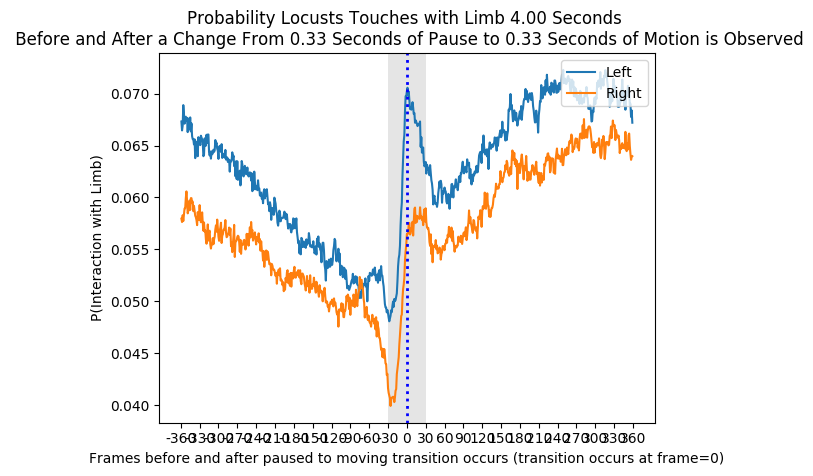









  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14780/323578 [00:00<00:02, 147792.04it/s]







  9%|▊         | 28005/323578 [00:00<00:02, 142758.08it/s]

0










 13%|█▎        | 41134/323578 [00:00<00:02, 139111.55it/s]







 17%|█▋        | 54140/323578 [00:00<00:01, 136265.93it/s]







 21%|██        | 66788/323578 [00:00<00:01, 132492.69it/s]







 24%|██▍       | 78558/323578 [00:00<00:01, 126902.59it/s]







 28%|██▊       | 91930/323578 [00:00<00:01, 127703.80it/s]







 33%|███▎      | 105579/323578 [00:00<00:01, 129072.43it/s]







 36%|███▋      | 118031/323578 [00:00<00:01, 127669.73it/s]







 41%|████      | 132706/323578 [00:01<00:01, 132851.22it/s]







 45%|████▌     | 146144/323578 [00:01<00:01, 133305.28it/s]







 49%|████▉     | 159239/323578 [00:01<00:01, 130774.14it/s]







 54%|█████▍    | 174992/323578 [00:01<00:01, 137795.12it/s]







 58%|█████▊    | 188764/323578 [00:01<00:01, 130456.74it/s]







 63%|██████▎   | 203462/323578 [00:01<00:00, 135008.82it/s]







 68%|██████▊   | 219806/323578 [00:01<00:00, 142441.18it/s]







 73%|███████▎  | 234979/323578 [00:01<00:00, 145106.11it/s]

1










 12%|█▏        | 37362/323578 [00:00<00:02, 122736.28it/s]







 16%|█▌        | 50838/323578 [00:00<00:02, 126109.92it/s]







 20%|██        | 65976/323578 [00:00<00:01, 132756.84it/s]







 25%|██▌       | 81589/323578 [00:00<00:01, 138998.94it/s]







 29%|██▉       | 94502/323578 [00:00<00:01, 135878.65it/s]







 34%|███▍      | 109362/323578 [00:00<00:01, 139460.08it/s]







 39%|███▊      | 125181/323578 [00:00<00:01, 144594.82it/s]







 44%|████▎     | 141223/323578 [00:01<00:01, 149002.60it/s]







 48%|████▊     | 156484/323578 [00:01<00:01, 150064.61it/s]







 53%|█████▎    | 172761/323578 [00:01<00:00, 153662.07it/s]







 58%|█████▊    | 188882/323578 [00:01<00:00, 155848.53it/s]







 63%|██████▎   | 204410/323578 [00:01<00:00, 152930.27it/s]







 68%|██████▊   | 219675/323578 [00:01<00:00, 149749.16it/s]







 73%|███████▎  | 234847/323578 [00:01<00:00, 150334.00it/s]







 77%|███████▋  | 249878/323578 [00:01<00:00, 149797.60it/s]

2










 11%|█         | 34980/323578 [00:00<00:02, 113880.13it/s]







 15%|█▍        | 48146/323578 [00:00<00:02, 118300.05it/s]







 18%|█▊        | 57376/323578 [00:00<00:02, 107883.77it/s]







 21%|██        | 67648/323578 [00:00<00:02, 106280.03it/s]







 25%|██▍       | 79678/323578 [00:00<00:02, 110129.99it/s]







 28%|██▊       | 91520/323578 [00:00<00:02, 112492.31it/s]







 32%|███▏      | 102553/323578 [00:00<00:01, 111833.10it/s]







 36%|███▌      | 115597/323578 [00:01<00:01, 116832.37it/s]







 39%|███▉      | 127083/323578 [00:01<00:01, 110819.84it/s]







 43%|████▎     | 138092/323578 [00:01<00:01, 109430.47it/s]







 46%|████▋     | 149843/323578 [00:01<00:01, 111734.71it/s]







 50%|█████     | 162265/323578 [00:01<00:01, 115208.46it/s]







 54%|█████▍    | 174207/323578 [00:01<00:01, 116440.18it/s]







 57%|█████▋    | 185863/323578 [00:01<00:01, 110574.42it/s]







 61%|██████    | 196991/323578 [00:01<00:01, 108835.38it/s]


3










 12%|█▏        | 40038/323578 [00:00<00:02, 136555.88it/s]







 15%|█▌        | 49657/323578 [00:00<00:02, 120201.50it/s]







 18%|█▊        | 59705/323578 [00:00<00:02, 113243.54it/s]







 23%|██▎       | 73239/323578 [00:00<00:02, 119073.94it/s]







 28%|██▊       | 89403/323578 [00:00<00:01, 129286.51it/s]







 32%|███▏      | 102514/323578 [00:00<00:01, 129826.59it/s]







 36%|███▋      | 117552/323578 [00:00<00:01, 135376.28it/s]







 41%|████      | 132201/323578 [00:01<00:01, 138529.15it/s]







 45%|████▌     | 145860/323578 [00:01<00:01, 136733.47it/s]







 49%|████▉     | 159403/323578 [00:01<00:01, 133092.67it/s]







 54%|█████▍    | 175142/323578 [00:01<00:01, 139554.45it/s]







 59%|█████▉    | 191012/323578 [00:01<00:00, 144793.29it/s]







 64%|██████▎   | 205565/323578 [00:01<00:00, 135115.54it/s]







 68%|██████▊   | 219259/323578 [00:01<00:00, 130829.23it/s]







 72%|███████▏  | 233969/323578 [00:01<00:00, 135318.25it/s]

4










  8%|▊         | 24976/323578 [00:00<00:03, 85264.79it/s]







 11%|█         | 34641/323578 [00:00<00:03, 88154.13it/s]







 14%|█▎        | 43797/323578 [00:00<00:03, 89123.31it/s]







 17%|█▋        | 55546/323578 [00:00<00:02, 96082.22it/s]







 20%|██        | 66258/323578 [00:00<00:02, 98355.08it/s]







 24%|██▍       | 77824/323578 [00:00<00:02, 102861.24it/s]







 27%|██▋       | 87729/323578 [00:00<00:02, 99664.72it/s] 







 30%|███       | 97451/323578 [00:01<00:02, 96413.90it/s]







 33%|███▎      | 106944/323578 [00:01<00:02, 91415.78it/s]







 36%|███▋      | 117469/323578 [00:01<00:02, 94976.40it/s]







 39%|███▉      | 127606/323578 [00:01<00:02, 96807.86it/s]







 42%|████▏     | 137296/323578 [00:01<00:02, 91040.24it/s]







 45%|████▌     | 146477/323578 [00:01<00:01, 88712.19it/s]







 49%|████▉     | 158658/323578 [00:01<00:01, 96366.48it/s]







 53%|█████▎    | 170293/323578 [00:01<00:01, 101601.32it/s]







 57%|██

5


 10%|▉         | 31778/323578 [00:00<00:02, 106036.91it/s]







 13%|█▎        | 43143/323578 [00:00<00:02, 108210.40it/s]







 17%|█▋        | 53845/323578 [00:00<00:02, 107849.92it/s]







 20%|█▉        | 63991/323578 [00:00<00:02, 105849.24it/s]







 23%|██▎       | 75084/323578 [00:00<00:02, 107323.80it/s]







 27%|██▋       | 86719/323578 [00:00<00:02, 109415.88it/s]







 30%|███       | 97878/323578 [00:00<00:02, 110057.65it/s]







 34%|███▎      | 108471/323578 [00:01<00:01, 107837.84it/s]







 37%|███▋      | 118976/323578 [00:01<00:02, 100177.56it/s]







 40%|████      | 130478/323578 [00:01<00:01, 104210.76it/s]







 44%|████▍     | 142256/323578 [00:01<00:01, 107941.09it/s]







 47%|████▋     | 153072/323578 [00:01<00:01, 106435.28it/s]







 51%|█████     | 163735/323578 [00:01<00:01, 104528.59it/s]







 54%|█████▍    | 174210/323578 [00:01<00:01, 101985.81it/s]







 57%|█████▋    | 184438/323578 [00:01<00:01, 96498.02it/s] 







 6

6










 14%|█▍        | 46566/323578 [00:00<00:02, 117491.67it/s]







 18%|█▊        | 58820/323578 [00:00<00:02, 118960.57it/s]







 22%|██▏       | 71317/323578 [00:00<00:02, 120700.61it/s]







 26%|██▌       | 83953/323578 [00:00<00:01, 122343.07it/s]







 31%|███       | 98784/323578 [00:00<00:01, 129123.65it/s]







 34%|███▍      | 111124/323578 [00:00<00:01, 124710.15it/s]







 38%|███▊      | 123389/323578 [00:01<00:01, 123771.62it/s]







 42%|████▏     | 137064/323578 [00:01<00:01, 127305.02it/s]







 46%|████▌     | 149641/323578 [00:01<00:01, 118992.51it/s]







 50%|█████     | 162897/323578 [00:01<00:01, 122730.16it/s]







 54%|█████▍    | 175966/323578 [00:01<00:01, 125012.56it/s]







 58%|█████▊    | 188500/323578 [00:01<00:01, 123870.93it/s]







 62%|██████▏   | 200912/323578 [00:01<00:01, 117254.69it/s]







 66%|██████▌   | 212729/323578 [00:01<00:00, 111860.86it/s]







 69%|██████▉   | 224185/323578 [00:01<00:00, 112656.87it/s]

7










 16%|█▌        | 51025/323578 [00:00<00:02, 128064.09it/s]







 19%|█▉        | 62584/323578 [00:00<00:02, 123868.84it/s]







 23%|██▎       | 73044/323578 [00:00<00:02, 117381.00it/s]







 26%|██▌       | 83416/323578 [00:00<00:02, 111560.49it/s]







 29%|██▉       | 95417/323578 [00:00<00:02, 113966.90it/s]







 34%|███▎      | 108691/323578 [00:00<00:01, 118647.11it/s]







 38%|███▊      | 121588/323578 [00:01<00:01, 121564.91it/s]







 41%|████▏     | 133496/323578 [00:01<00:01, 117625.39it/s]







 46%|████▋     | 149668/323578 [00:01<00:01, 128103.14it/s]







 51%|█████     | 164210/323578 [00:01<00:01, 132847.23it/s]







 55%|█████▌    | 178782/323578 [00:01<00:01, 136462.61it/s]







 60%|█████▉    | 193002/323578 [00:01<00:00, 138132.54it/s]







 64%|██████▍   | 206919/323578 [00:01<00:00, 132504.77it/s]







 68%|██████▊   | 220291/323578 [00:01<00:00, 131960.54it/s]







 72%|███████▏  | 234063/323578 [00:01<00:00, 133636.45it/s]

8










 14%|█▍        | 45610/323578 [00:00<00:02, 116227.45it/s]







 17%|█▋        | 56605/323578 [00:00<00:02, 114269.06it/s]







 21%|██        | 67717/323578 [00:00<00:02, 113272.42it/s]







 25%|██▌       | 81794/323578 [00:00<00:02, 120322.43it/s]







 29%|██▉       | 93920/323578 [00:00<00:01, 120601.44it/s]







 33%|███▎      | 105909/323578 [00:00<00:01, 119511.12it/s]







 36%|███▋      | 117888/323578 [00:01<00:01, 119592.55it/s]







 40%|████      | 130929/323578 [00:01<00:01, 122644.33it/s]







 44%|████▍     | 143132/323578 [00:01<00:01, 122458.10it/s]







 48%|████▊     | 155255/323578 [00:01<00:01, 120830.22it/s]







 52%|█████▏    | 167257/323578 [00:01<00:01, 116437.26it/s]







 56%|█████▌    | 180021/323578 [00:01<00:01, 119585.65it/s]







 60%|█████▉    | 193517/323578 [00:01<00:01, 123815.39it/s]







 64%|██████▍   | 208691/323578 [00:01<00:00, 131050.08it/s]







 69%|██████▊   | 221940/323578 [00:01<00:00, 130100.64it/s]

9










 15%|█▌        | 50147/323578 [00:00<00:02, 127514.46it/s]







 19%|█▉        | 62424/323578 [00:00<00:02, 126052.45it/s]







 23%|██▎       | 75119/323578 [00:00<00:01, 126318.71it/s]







 27%|██▋       | 88761/323578 [00:00<00:01, 129187.00it/s]







 32%|███▏      | 102598/323578 [00:00<00:01, 131809.92it/s]







 36%|███▌      | 116562/323578 [00:00<00:01, 134046.42it/s]







 40%|████      | 130862/323578 [00:01<00:01, 135925.71it/s]







 45%|████▍     | 144109/323578 [00:01<00:01, 132396.96it/s]







 49%|████▊     | 157127/323578 [00:01<00:01, 126097.38it/s]







 53%|█████▎    | 171338/323578 [00:01<00:01, 130507.59it/s]







 57%|█████▋    | 184364/323578 [00:01<00:01, 129523.13it/s]







 61%|██████    | 197301/323578 [00:01<00:01, 125175.79it/s]







 65%|██████▌   | 210681/323578 [00:01<00:00, 127641.70it/s]







 69%|██████▉   | 224880/323578 [00:01<00:00, 131631.79it/s]







 74%|███████▎  | 238093/323578 [00:01<00:00, 130468.21it/s

10










 15%|█▌        | 49022/323578 [00:00<00:02, 122536.66it/s]







 20%|█▉        | 64369/323578 [00:00<00:01, 130423.02it/s]







 23%|██▎       | 75477/323578 [00:00<00:02, 119565.08it/s]







 27%|██▋       | 86877/323578 [00:00<00:02, 117838.67it/s]







 31%|███       | 99916/323578 [00:00<00:01, 121340.90it/s]







 35%|███▌      | 114693/323578 [00:00<00:01, 128219.77it/s]







 40%|███▉      | 127903/323578 [00:01<00:01, 129359.18it/s]







 44%|████▍     | 141711/323578 [00:01<00:01, 131855.40it/s]







 48%|████▊     | 154774/323578 [00:01<00:01, 126386.04it/s]







 52%|█████▏    | 168046/323578 [00:01<00:01, 127262.44it/s]







 56%|█████▌    | 181757/323578 [00:01<00:01, 130063.97it/s]







 61%|██████    | 196059/323578 [00:01<00:00, 133695.31it/s]







 65%|██████▍   | 209453/323578 [00:01<00:00, 126114.80it/s]







 69%|██████▉   | 222953/323578 [00:01<00:00, 127751.22it/s]







 73%|███████▎  | 235807/323578 [00:01<00:00, 124844.65it/s]

11


 12%|█▏        | 37561/323578 [00:00<00:02, 121863.31it/s]







 15%|█▌        | 49838/323578 [00:00<00:02, 122133.59it/s]







 19%|█▉        | 62780/323578 [00:00<00:02, 124231.33it/s]







 24%|██▎       | 76394/323578 [00:00<00:01, 127578.28it/s]







 29%|██▊       | 92241/323578 [00:00<00:01, 135501.26it/s]







 34%|███▎      | 108420/323578 [00:00<00:01, 142444.03it/s]







 38%|███▊      | 123672/323578 [00:00<00:01, 145323.95it/s]







 43%|████▎     | 139748/323578 [00:01<00:01, 149632.72it/s]







 48%|████▊     | 156037/323578 [00:01<00:01, 153376.25it/s]







 53%|█████▎    | 171335/323578 [00:01<00:00, 153255.11it/s]







 58%|█████▊    | 187535/323578 [00:01<00:00, 155776.04it/s]







 63%|██████▎   | 203077/323578 [00:01<00:00, 146156.78it/s]







 67%|██████▋   | 217789/323578 [00:01<00:00, 136928.99it/s]







 72%|███████▏  | 231668/323578 [00:01<00:00, 128478.74it/s]







 76%|███████▌  | 244753/323578 [00:01<00:00, 128225.39it/s]









12










 15%|█▍        | 47749/323578 [00:00<00:02, 116665.27it/s]







 18%|█▊        | 58119/323578 [00:00<00:02, 112445.96it/s]







 22%|██▏       | 70471/323578 [00:00<00:02, 115552.09it/s]







 25%|██▍       | 80797/323578 [00:00<00:02, 111072.45it/s]







 28%|██▊       | 91081/323578 [00:00<00:02, 107117.04it/s]







 32%|███▏      | 101992/323578 [00:00<00:02, 107706.89it/s]







 35%|███▌      | 114398/323578 [00:01<00:01, 112141.18it/s]







 39%|███▉      | 125393/323578 [00:01<00:01, 111138.10it/s]







 43%|████▎     | 138606/323578 [00:01<00:01, 116698.89it/s]







 46%|████▋     | 150244/323578 [00:01<00:01, 113840.01it/s]







 50%|████▉     | 161621/323578 [00:01<00:01, 106801.75it/s]







 54%|█████▍    | 174074/323578 [00:01<00:01, 111565.82it/s]







 57%|█████▋    | 185345/323578 [00:01<00:01, 106340.42it/s]







 61%|██████    | 197723/323578 [00:01<00:01, 111032.56it/s]







 65%|██████▍   | 209294/323578 [00:01<00:01, 112394.69it/s]

13










 16%|█▋        | 52852/323578 [00:00<00:02, 133321.11it/s]







 21%|██        | 67646/323578 [00:00<00:01, 137393.18it/s]







 24%|██▍       | 79150/323578 [00:00<00:01, 129653.66it/s]







 28%|██▊       | 91147/323578 [00:00<00:01, 126586.81it/s]







 32%|███▏      | 102789/323578 [00:00<00:01, 121781.69it/s]







 36%|███▌      | 115187/323578 [00:00<00:01, 122430.82it/s]







 39%|███▉      | 127389/323578 [00:01<00:01, 121725.23it/s]







 43%|████▎     | 140454/323578 [00:01<00:01, 124270.22it/s]







 47%|████▋     | 152665/323578 [00:01<00:01, 123182.78it/s]







 51%|█████     | 164834/323578 [00:01<00:01, 120941.34it/s]







 55%|█████▌    | 178953/323578 [00:01<00:01, 126377.02it/s]







 59%|█████▉    | 192391/323578 [00:01<00:01, 127797.70it/s]







 64%|██████▎   | 205535/323578 [00:01<00:00, 128867.88it/s]







 68%|██████▊   | 218631/323578 [00:01<00:00, 129486.57it/s]







 72%|███████▏  | 231583/323578 [00:01<00:00, 129332.01it/s

14


 12%|█▏        | 38234/323578 [00:00<00:02, 129764.05it/s]







 16%|█▌        | 51460/323578 [00:00<00:02, 130502.28it/s]







 20%|█▉        | 64593/323578 [00:00<00:01, 130748.33it/s]







 24%|██▎       | 76625/323578 [00:00<00:01, 127432.26it/s]







 29%|██▊       | 92380/323578 [00:00<00:01, 135184.34it/s]







 33%|███▎      | 105563/323578 [00:00<00:01, 134159.32it/s]







 37%|███▋      | 119884/323578 [00:00<00:01, 136751.00it/s]







 41%|████      | 133107/323578 [00:01<00:01, 125752.62it/s]







 45%|████▍     | 145540/323578 [00:01<00:01, 124399.13it/s]







 50%|████▉     | 160982/323578 [00:01<00:01, 131794.45it/s]







 54%|█████▍    | 174213/323578 [00:01<00:01, 128693.32it/s]







 58%|█████▊    | 187135/323578 [00:01<00:01, 127030.58it/s]







 63%|██████▎   | 202400/323578 [00:01<00:00, 133764.95it/s]







 67%|██████▋   | 216100/323578 [00:01<00:00, 133544.49it/s]







 71%|███████   | 229808/323578 [00:01<00:00, 134585.79it/s]









15










 13%|█▎        | 42155/323578 [00:00<00:01, 141583.45it/s]







 16%|█▌        | 51476/323578 [00:00<00:02, 122509.62it/s]







 20%|█▉        | 64061/323578 [00:00<00:02, 122791.13it/s]







 24%|██▍       | 78736/323578 [00:00<00:01, 129113.30it/s]







 29%|██▉       | 93962/323578 [00:00<00:01, 134631.13it/s]







 33%|███▎      | 107385/323578 [00:00<00:01, 134508.17it/s]







 38%|███▊      | 122856/323578 [00:00<00:01, 139991.93it/s]







 43%|████▎     | 137733/323578 [00:01<00:01, 142514.37it/s]







 47%|████▋     | 153680/323578 [00:01<00:01, 147208.19it/s]







 52%|█████▏    | 168259/323578 [00:01<00:01, 144289.81it/s]







 56%|█████▋    | 182602/323578 [00:01<00:01, 138547.32it/s]







 61%|██████    | 197460/323578 [00:01<00:00, 141411.19it/s]







 65%|██████▌   | 211608/323578 [00:01<00:00, 140455.41it/s]







 70%|██████▉   | 225660/323578 [00:01<00:00, 135664.04it/s]







 74%|███████▍  | 240375/323578 [00:01<00:00, 138916.79it/s]

16










 10%|█         | 32972/323578 [00:00<00:02, 111128.35it/s]







 13%|█▎        | 42897/323578 [00:00<00:02, 107275.44it/s]







 17%|█▋        | 56511/323578 [00:00<00:02, 114561.26it/s]







 21%|██        | 68221/323578 [00:00<00:02, 115310.06it/s]







 24%|██▍       | 79097/323578 [00:00<00:02, 113262.69it/s]







 28%|██▊       | 91467/323578 [00:00<00:01, 116202.77it/s]







 32%|███▏      | 102493/323578 [00:00<00:01, 111747.78it/s]







 35%|███▌      | 114674/323578 [00:01<00:01, 114586.41it/s]







 39%|███▉      | 125885/323578 [00:01<00:01, 107688.48it/s]







 42%|████▏     | 136566/323578 [00:01<00:01, 104978.20it/s]







 46%|████▌     | 149324/323578 [00:01<00:01, 110869.68it/s]







 50%|████▉     | 161108/323578 [00:01<00:01, 112871.03it/s]







 54%|█████▎    | 173659/323578 [00:01<00:01, 116385.30it/s]







 58%|█████▊    | 186115/323578 [00:01<00:01, 118721.36it/s]







 61%|██████    | 198042/323578 [00:01<00:01, 114572.36it/s]


17










  9%|▉         | 29156/323578 [00:00<00:03, 96312.97it/s] 







 12%|█▏        | 40038/323578 [00:00<00:02, 99752.13it/s]







 16%|█▌        | 50297/323578 [00:00<00:02, 100424.07it/s]







 20%|█▉        | 63401/323578 [00:00<00:02, 107992.49it/s]







 23%|██▎       | 74847/323578 [00:00<00:02, 109853.43it/s]







 26%|██▋       | 85153/323578 [00:00<00:02, 107428.38it/s]







 30%|██▉       | 96772/323578 [00:00<00:02, 109913.37it/s]







 33%|███▎      | 108090/323578 [00:01<00:01, 110552.11it/s]







 37%|███▋      | 118929/323578 [00:01<00:01, 109678.88it/s]







 40%|████      | 129747/323578 [00:01<00:01, 106406.61it/s]







 43%|████▎     | 140347/323578 [00:01<00:01, 105742.33it/s]







 47%|████▋     | 151206/323578 [00:01<00:01, 106580.33it/s]







 50%|█████     | 161826/323578 [00:01<00:01, 105439.94it/s]







 54%|█████▎    | 173404/323578 [00:01<00:01, 108341.92it/s]







 57%|█████▋    | 184242/323578 [00:01<00:01, 106446.02it/s]




18


 18%|█▊        | 58233/323578 [00:00<00:01, 145568.61it/s]







 23%|██▎       | 74337/323578 [00:00<00:01, 149887.27it/s]







 28%|██▊       | 90627/323578 [00:00<00:01, 153567.38it/s]







 33%|███▎      | 105290/323578 [00:00<00:01, 151417.58it/s]







 37%|███▋      | 119252/323578 [00:00<00:01, 129849.47it/s]







 41%|████      | 131950/323578 [00:00<00:01, 126275.82it/s]







 45%|████▍     | 144398/323578 [00:01<00:01, 120950.58it/s]







 48%|████▊     | 156415/323578 [00:01<00:01, 113187.87it/s]







 53%|█████▎    | 169960/323578 [00:01<00:01, 118439.90it/s]







 56%|█████▌    | 181901/323578 [00:01<00:01, 117839.80it/s]







 60%|█████▉    | 193754/323578 [00:01<00:01, 116083.39it/s]







 63%|██████▎   | 205416/323578 [00:01<00:01, 113386.87it/s]







 67%|██████▋   | 216807/323578 [00:01<00:00, 110908.17it/s]







 72%|███████▏  | 231378/323578 [00:01<00:00, 119466.78it/s]







 75%|███████▌  | 243547/323578 [00:01<00:00, 112055.22it/s]







19










 22%|██▏       | 71574/323578 [00:00<00:01, 145731.15it/s]







 26%|██▌       | 83652/323578 [00:00<00:01, 135397.10it/s]







 30%|██▉       | 95652/323578 [00:00<00:01, 130376.49it/s]







 35%|███▍      | 111887/323578 [00:00<00:01, 138562.00it/s]







 39%|███▊      | 125128/323578 [00:00<00:01, 136354.87it/s]







 43%|████▎     | 140266/323578 [00:01<00:01, 140537.61it/s]







 48%|████▊     | 154056/323578 [00:01<00:01, 135010.05it/s]







 52%|█████▏    | 167419/323578 [00:01<00:01, 131332.07it/s]







 56%|█████▌    | 181311/323578 [00:01<00:01, 133517.70it/s]







 60%|██████    | 194969/323578 [00:01<00:00, 134420.11it/s]







 64%|██████▍   | 208383/323578 [00:01<00:00, 133987.80it/s]







 69%|██████▉   | 223115/323578 [00:01<00:00, 137725.02it/s]







 73%|███████▎  | 236900/323578 [00:01<00:00, 137513.35it/s]







 77%|███████▋  | 250660/323578 [00:01<00:00, 132211.65it/s]







 82%|████████▏ | 263931/323578 [00:01<00:00, 129575.53it/

20










 18%|█▊        | 57583/323578 [00:00<00:02, 113945.42it/s]







 21%|██▏       | 68819/323578 [00:00<00:02, 112735.47it/s]







 25%|██▌       | 80927/323578 [00:00<00:02, 115098.09it/s]







 29%|██▊       | 92398/323578 [00:00<00:02, 114846.88it/s]







 33%|███▎      | 106231/323578 [00:00<00:01, 120984.92it/s]







 36%|███▋      | 117968/323578 [00:01<00:01, 119876.09it/s]







 41%|████      | 132980/323578 [00:01<00:01, 127386.40it/s]







 45%|████▌     | 145666/323578 [00:01<00:01, 123854.02it/s]







 49%|████▉     | 158036/323578 [00:01<00:01, 123169.25it/s]







 53%|█████▎    | 171784/323578 [00:01<00:01, 127138.25it/s]







 57%|█████▋    | 185423/323578 [00:01<00:01, 128980.90it/s]







 62%|██████▏   | 199210/323578 [00:01<00:00, 131524.04it/s]







 66%|██████▌   | 212757/323578 [00:01<00:00, 132682.31it/s]







 70%|███████   | 227539/323578 [00:01<00:00, 136885.71it/s]







 75%|███████▌  | 243847/323578 [00:01<00:00, 143815.02it/s

21










 19%|█▉        | 62270/323578 [00:00<00:02, 123449.34it/s]







 23%|██▎       | 74294/323578 [00:00<00:02, 122466.94it/s]







 27%|██▋       | 86855/323578 [00:00<00:01, 123392.47it/s]







 31%|███       | 100103/323578 [00:00<00:01, 125984.00it/s]







 35%|███▌      | 113633/323578 [00:00<00:01, 128639.89it/s]







 39%|███▉      | 127764/323578 [00:01<00:01, 132195.18it/s]







 43%|████▎     | 140701/323578 [00:01<00:01, 123168.32it/s]







 47%|████▋     | 152945/323578 [00:01<00:01, 121968.60it/s]







 51%|█████▏    | 166097/323578 [00:01<00:01, 124684.55it/s]







 56%|█████▌    | 180691/323578 [00:01<00:01, 130380.33it/s]







 61%|██████    | 196804/323578 [00:01<00:00, 138297.43it/s]







 66%|██████▌   | 212868/323578 [00:01<00:00, 144318.41it/s]







 71%|███████   | 228888/323578 [00:01<00:00, 148740.08it/s]







 76%|███████▌  | 244996/323578 [00:01<00:00, 152237.26it/s]







 81%|████████  | 261433/323578 [00:01<00:00, 155683.32it/

22










 16%|█▌        | 50325/323578 [00:00<00:02, 123788.45it/s]







 19%|█▉        | 62878/323578 [00:00<00:02, 124304.45it/s]







 23%|██▎       | 74313/323578 [00:00<00:02, 121140.25it/s]







 26%|██▋       | 85549/323578 [00:00<00:02, 118364.27it/s]







 30%|███       | 97097/323578 [00:00<00:01, 117482.98it/s]







 34%|███▍      | 111609/323578 [00:00<00:01, 124600.86it/s]







 39%|███▉      | 126316/323578 [00:01<00:01, 130585.13it/s]







 43%|████▎     | 139213/323578 [00:01<00:01, 117942.34it/s]







 47%|████▋     | 151906/323578 [00:01<00:01, 120470.55it/s]







 51%|█████     | 164051/323578 [00:01<00:01, 119375.65it/s]







 56%|█████▌    | 179775/323578 [00:01<00:01, 128669.68it/s]







 60%|█████▉    | 192898/323578 [00:01<00:01, 125950.67it/s]







 64%|██████▎   | 205685/323578 [00:01<00:00, 126388.77it/s]







 68%|██████▊   | 219624/323578 [00:01<00:00, 130025.19it/s]







 73%|███████▎  | 235209/323578 [00:01<00:00, 136825.98it/s]

23


 18%|█▊        | 57318/323578 [00:00<00:02, 113610.46it/s]







 22%|██▏       | 70740/323578 [00:00<00:02, 119095.11it/s]







 25%|██▌       | 81559/323578 [00:00<00:02, 115599.03it/s]







 30%|██▉       | 95617/323578 [00:00<00:01, 122107.66it/s]







 33%|███▎      | 108043/323578 [00:00<00:01, 122745.18it/s]







 38%|███▊      | 122292/323578 [00:01<00:01, 128067.36it/s]







 42%|████▏     | 136561/323578 [00:01<00:01, 132127.50it/s]







 46%|████▋     | 149666/323578 [00:01<00:01, 127515.62it/s]







 50%|█████     | 163104/323578 [00:01<00:01, 128397.89it/s]







 54%|█████▍    | 175917/323578 [00:01<00:01, 113735.62it/s]







 58%|█████▊    | 188128/323578 [00:01<00:01, 116123.25it/s]







 62%|██████▏   | 200602/323578 [00:01<00:01, 118580.50it/s]







 66%|██████▌   | 212624/323578 [00:01<00:00, 115467.61it/s]







 69%|██████▉   | 224303/323578 [00:01<00:00, 110165.07it/s]







 73%|███████▎  | 236019/323578 [00:01<00:00, 112173.43it/s]








24










 21%|██        | 67457/323578 [00:00<00:02, 108538.69it/s]







 25%|██▍       | 80328/323578 [00:00<00:02, 113893.28it/s]







 28%|██▊       | 90881/323578 [00:00<00:02, 108573.17it/s]







 31%|███▏      | 101461/323578 [00:00<00:02, 107196.64it/s]







 35%|███▍      | 112488/323578 [00:01<00:01, 108098.87it/s]







 39%|███▊      | 124643/323578 [00:01<00:01, 111810.32it/s]







 42%|████▏     | 137306/323578 [00:01<00:01, 115420.75it/s]







 47%|████▋     | 150919/323578 [00:01<00:01, 120939.94it/s]







 51%|█████     | 164617/323578 [00:01<00:01, 125343.03it/s]







 55%|█████▍    | 177205/323578 [00:01<00:01, 119894.77it/s]







 59%|█████▊    | 189327/323578 [00:01<00:01, 120288.38it/s]







 63%|██████▎   | 203509/323578 [00:01<00:00, 126027.28it/s]







 67%|██████▋   | 216227/323578 [00:01<00:00, 122658.96it/s]







 71%|███████   | 229490/323578 [00:01<00:00, 124913.57it/s]







 75%|███████▍  | 242062/323578 [00:02<00:00, 123813.27it/

25


 21%|██        | 66524/323578 [00:00<00:01, 134087.44it/s]







 25%|██▍       | 80042/323578 [00:00<00:01, 134412.43it/s]







 29%|██▉       | 94635/323578 [00:00<00:01, 137670.54it/s]







 33%|███▎      | 107820/323578 [00:00<00:01, 135869.16it/s]







 38%|███▊      | 122432/323578 [00:00<00:01, 138789.15it/s]







 42%|████▏     | 136098/323578 [00:01<00:01, 138142.21it/s]







 47%|████▋     | 150785/323578 [00:01<00:01, 140648.92it/s]







 51%|█████     | 164596/323578 [00:01<00:01, 132515.18it/s]







 55%|█████▍    | 177766/323578 [00:01<00:01, 126171.32it/s]







 59%|█████▉    | 190390/323578 [00:01<00:01, 126111.97it/s]







 63%|██████▎   | 204163/323578 [00:01<00:00, 129386.09it/s]







 67%|██████▋   | 218384/323578 [00:01<00:00, 132983.61it/s]







 72%|███████▏  | 232290/323578 [00:01<00:00, 133983.58it/s]







 76%|███████▌  | 245720/323578 [00:01<00:00, 130259.83it/s]







 81%|████████  | 260508/323578 [00:01<00:00, 135086.65it/s]







26


 21%|██        | 67385/323578 [00:00<00:01, 131103.60it/s]







 25%|██▌       | 82438/323578 [00:00<00:01, 136381.93it/s]







 30%|██▉       | 97069/323578 [00:00<00:01, 138612.22it/s]







 34%|███▍      | 109960/323578 [00:00<00:01, 132731.19it/s]







 38%|███▊      | 124266/323578 [00:00<00:01, 135669.16it/s]







 43%|████▎     | 139993/323578 [00:01<00:01, 141498.54it/s]







 48%|████▊     | 156128/323578 [00:01<00:01, 146920.69it/s]







 53%|█████▎    | 172658/323578 [00:01<00:00, 151989.67it/s]







 58%|█████▊    | 188380/323578 [00:01<00:00, 153519.22it/s]







 63%|██████▎   | 204580/323578 [00:01<00:00, 155967.60it/s]







 68%|██████▊   | 220900/323578 [00:01<00:00, 158068.82it/s]







 73%|███████▎  | 237300/323578 [00:01<00:00, 159801.79it/s]







 78%|███████▊  | 253763/323578 [00:01<00:00, 161218.94it/s]







 83%|████████▎ | 270183/323578 [00:01<00:00, 162099.82it/s]







 89%|████████▊ | 286434/323578 [00:01<00:00, 162221.08it/s]







27










 23%|██▎       | 75279/323578 [00:00<00:01, 127200.74it/s]







 27%|██▋       | 88553/323578 [00:00<00:01, 128813.04it/s]







 31%|███▏      | 101791/323578 [00:00<00:01, 129861.09it/s]







 35%|███▌      | 114092/323578 [00:00<00:01, 123681.01it/s]







 39%|███▉      | 127533/323578 [00:01<00:01, 126713.52it/s]







 44%|████▍     | 143211/323578 [00:01<00:01, 134447.32it/s]







 49%|████▉     | 158852/323578 [00:01<00:01, 140358.70it/s]







 54%|█████▍    | 174043/323578 [00:01<00:01, 143634.30it/s]







 59%|█████▉    | 190157/323578 [00:01<00:00, 148471.26it/s]







 64%|██████▍   | 206387/323578 [00:01<00:00, 152365.18it/s]







 69%|██████▊   | 221695/323578 [00:01<00:00, 150046.44it/s]







 73%|███████▎  | 237475/323578 [00:01<00:00, 152291.25it/s]







 78%|███████▊  | 252753/323578 [00:01<00:00, 151914.17it/s]







 83%|████████▎ | 269047/323578 [00:01<00:00, 155059.92it/s]







 88%|████████▊ | 285738/323578 [00:02<00:00, 158434.36it

28










 22%|██▏       | 72128/323578 [00:00<00:02, 116559.17it/s]







 26%|██▌       | 84197/323578 [00:00<00:02, 117768.04it/s]







 29%|██▉       | 95132/323578 [00:00<00:02, 112813.78it/s]







 34%|███▎      | 108643/323578 [00:00<00:01, 118688.05it/s]







 38%|███▊      | 123452/323578 [00:01<00:01, 126204.15it/s]







 42%|████▏     | 135993/323578 [00:01<00:01, 120697.34it/s]







 46%|████▌     | 148058/323578 [00:01<00:01, 114804.14it/s]







 49%|████▉     | 159596/323578 [00:01<00:01, 111730.28it/s]







 53%|█████▎    | 170827/323578 [00:01<00:01, 108790.63it/s]







 56%|█████▌    | 181764/323578 [00:01<00:01, 107978.08it/s]







 60%|█████▉    | 192604/323578 [00:01<00:01, 107203.62it/s]







 63%|██████▎   | 204466/323578 [00:01<00:01, 110390.37it/s]







 67%|██████▋   | 215551/323578 [00:01<00:01, 104718.04it/s]







 70%|███████   | 227921/323578 [00:01<00:00, 109771.03it/s]







 74%|███████▍  | 239280/323578 [00:02<00:00, 110312.13it/

29










 14%|█▎        | 44093/323578 [00:00<00:02, 109035.34it/s]







 17%|█▋        | 55743/323578 [00:00<00:02, 111171.14it/s]







 21%|██        | 67339/323578 [00:00<00:02, 112453.19it/s]







 24%|██▍       | 78151/323578 [00:00<00:02, 110091.25it/s]







 28%|██▊       | 90059/323578 [00:00<00:02, 111575.06it/s]







 31%|███       | 100579/323578 [00:00<00:02, 108913.60it/s]







 35%|███▌      | 113592/323578 [00:01<00:01, 114231.49it/s]







 39%|███▉      | 125504/323578 [00:01<00:01, 114948.56it/s]







 42%|████▏     | 136836/323578 [00:01<00:01, 110758.40it/s]







 46%|████▌     | 147831/323578 [00:01<00:01, 103904.11it/s]







 49%|████▉     | 160096/323578 [00:01<00:01, 108896.56it/s]







 53%|█████▎    | 172834/323578 [00:01<00:01, 113851.45it/s]







 57%|█████▋    | 184337/323578 [00:01<00:01, 111426.94it/s]







 61%|██████    | 196909/323578 [00:01<00:01, 115360.69it/s]







 64%|██████▍   | 208546/323578 [00:01<00:01, 114730.15it/s]

30










 21%|██        | 67303/323578 [00:00<00:01, 135123.77it/s]







 25%|██▍       | 79994/323578 [00:00<00:01, 132549.47it/s]







 29%|██▉       | 95374/323578 [00:00<00:01, 138279.18it/s]







 34%|███▎      | 108726/323578 [00:00<00:01, 136769.61it/s]







 38%|███▊      | 121679/323578 [00:00<00:01, 131393.36it/s]







 42%|████▏     | 134794/323578 [00:01<00:01, 130059.83it/s]







 46%|████▌     | 147480/323578 [00:01<00:01, 128925.09it/s]







 50%|█████     | 162354/323578 [00:01<00:01, 134291.49it/s]







 54%|█████▍    | 175686/323578 [00:01<00:01, 128475.70it/s]







 58%|█████▊    | 188519/323578 [00:01<00:01, 128245.18it/s]







 63%|██████▎   | 204908/323578 [00:01<00:00, 137156.35it/s]







 68%|██████▊   | 221415/323578 [00:01<00:00, 144485.53it/s]







 73%|███████▎  | 236084/323578 [00:01<00:00, 140938.88it/s]







 77%|███████▋  | 250352/323578 [00:01<00:00, 138855.61it/s]







 82%|████████▏ | 264366/323578 [00:01<00:00, 136626.27it/

31










 30%|██▉       | 95734/323578 [00:00<00:01, 138566.20it/s]







 34%|███▍      | 109939/323578 [00:00<00:01, 139591.44it/s]







 38%|███▊      | 124466/323578 [00:00<00:01, 141247.09it/s]







 43%|████▎     | 140692/323578 [00:01<00:01, 146954.36it/s]







 48%|████▊     | 155775/323578 [00:01<00:01, 148094.14it/s]







 53%|█████▎    | 171945/323578 [00:01<00:01, 150876.22it/s]







 58%|█████▊    | 187469/323578 [00:01<00:00, 152156.86it/s]







 63%|██████▎   | 203952/323578 [00:01<00:00, 155747.60it/s]







 68%|██████▊   | 220346/323578 [00:01<00:00, 158117.87it/s]







 73%|███████▎  | 236647/323578 [00:01<00:00, 159553.77it/s]







 78%|███████▊  | 252591/323578 [00:01<00:00, 155720.60it/s]







 83%|████████▎ | 268176/323578 [00:01<00:00, 150736.66it/s]







 88%|████████▊ | 283293/323578 [00:01<00:00, 147196.40it/s]







 92%|█████████▏| 298062/323578 [00:02<00:00, 146865.65it/s]







 97%|█████████▋| 312783/323578 [00:02<00:00, 143024.61i

32










 22%|██▏       | 72575/323578 [00:00<00:01, 145578.51it/s]







 28%|██▊       | 89097/323578 [00:00<00:01, 150960.14it/s]







 33%|███▎      | 105499/323578 [00:00<00:01, 154653.90it/s]







 38%|███▊      | 121943/323578 [00:00<00:01, 157464.71it/s]







 43%|████▎     | 138389/323578 [00:00<00:01, 159498.72it/s]







 48%|████▊     | 154907/323578 [00:01<00:01, 161161.35it/s]







 53%|█████▎    | 171440/323578 [00:01<00:00, 162387.81it/s]







 58%|█████▊    | 187824/323578 [00:01<00:00, 162818.49it/s]







 63%|██████▎   | 204437/323578 [00:01<00:00, 163797.81it/s]







 68%|██████▊   | 221203/323578 [00:01<00:00, 164935.84it/s]







 73%|███████▎  | 237652/323578 [00:01<00:00, 164798.93it/s]







 79%|███████▊  | 254089/323578 [00:01<00:00, 161710.60it/s]







 84%|████████▎ | 270243/323578 [00:01<00:00, 161212.74it/s]







 89%|████████▊ | 286861/323578 [00:01<00:00, 162670.25it/s]







 94%|█████████▍| 303405/323578 [00:01<00:00, 163489.59it

33










 23%|██▎       | 73211/323578 [00:00<00:02, 124352.80it/s]







 28%|██▊       | 89234/323578 [00:00<00:01, 133305.77it/s]







 33%|███▎      | 105812/323578 [00:00<00:01, 141628.45it/s]







 37%|███▋      | 121245/323578 [00:00<00:01, 145211.63it/s]







 42%|████▏     | 137115/323578 [00:01<00:01, 149010.13it/s]







 47%|████▋     | 153472/323578 [00:01<00:01, 153097.27it/s]







 53%|█████▎    | 169973/323578 [00:01<00:00, 156485.57it/s]







 58%|█████▊    | 186478/323578 [00:01<00:00, 158958.83it/s]







 63%|██████▎   | 202873/323578 [00:01<00:00, 160422.34it/s]







 68%|██████▊   | 218905/323578 [00:01<00:00, 159654.56it/s]







 73%|███████▎  | 235359/323578 [00:01<00:00, 161088.83it/s]







 78%|███████▊  | 251467/323578 [00:01<00:00, 161027.48it/s]







 83%|████████▎ | 267943/323578 [00:01<00:00, 162128.83it/s]







 88%|████████▊ | 284157/323578 [00:01<00:00, 158769.07it/s]







 93%|█████████▎| 300749/323578 [00:02<00:00, 160846.04it

34


 20%|█▉        | 63669/323578 [00:00<00:02, 105411.62it/s]







 23%|██▎       | 74282/323578 [00:00<00:02, 105625.09it/s]







 27%|██▋       | 86925/323578 [00:00<00:02, 111108.77it/s]







 30%|███       | 97448/323578 [00:00<00:02, 105188.91it/s]







 33%|███▎      | 107621/323578 [00:01<00:02, 103598.78it/s]







 36%|███▋      | 118086/323578 [00:01<00:01, 103256.06it/s]







 40%|███▉      | 129175/323578 [00:01<00:01, 105432.86it/s]







 44%|████▍     | 143756/323578 [00:01<00:01, 114302.44it/s]







 49%|████▊     | 157451/323578 [00:01<00:01, 120268.05it/s]







 53%|█████▎    | 172567/323578 [00:01<00:01, 127394.36it/s]







 58%|█████▊    | 188833/323578 [00:01<00:00, 136254.90it/s]







 63%|██████▎   | 205257/323578 [00:01<00:00, 143593.80it/s]







 68%|██████▊   | 221616/323578 [00:01<00:00, 149059.00it/s]







 74%|███████▎  | 238266/323578 [00:01<00:00, 153893.71it/s]







 79%|███████▊  | 254713/323578 [00:02<00:00, 156920.58it/s]








35










 22%|██▏       | 70054/323578 [00:00<00:02, 113899.58it/s]







 25%|██▍       | 80015/323578 [00:00<00:02, 109025.88it/s]







 28%|██▊       | 89962/323578 [00:00<00:02, 104738.36it/s]







 32%|███▏      | 102497/323578 [00:00<00:02, 109513.66it/s]







 35%|███▌      | 114791/323578 [00:01<00:01, 113223.02it/s]







 40%|███▉      | 127912/323578 [00:01<00:01, 117459.31it/s]







 43%|████▎     | 139532/323578 [00:01<00:01, 115525.07it/s]







 47%|████▋     | 151004/323578 [00:01<00:01, 108553.89it/s]







 50%|█████     | 161889/323578 [00:01<00:01, 107413.00it/s]







 54%|█████▍    | 174394/323578 [00:01<00:01, 112157.30it/s]







 58%|█████▊    | 186867/323578 [00:01<00:01, 115653.71it/s]







 61%|██████▏   | 198836/323578 [00:01<00:01, 116454.34it/s]







 66%|██████▌   | 213026/323578 [00:01<00:00, 123074.22it/s]







 70%|██████▉   | 225474/323578 [00:01<00:00, 123490.54it/s]







 74%|███████▎  | 237922/323578 [00:02<00:00, 117601.24it/

36










 32%|███▏      | 104579/323578 [00:00<00:01, 153929.69it/s]







 37%|███▋      | 121025/323578 [00:00<00:01, 156943.49it/s]







 42%|████▏     | 136843/323578 [00:00<00:01, 157312.01it/s]







 47%|████▋     | 152184/323578 [00:01<00:01, 156118.84it/s]







 52%|█████▏    | 168474/323578 [00:01<00:00, 158090.57it/s]







 57%|█████▋    | 184534/323578 [00:01<00:00, 158834.61it/s]







 62%|██████▏   | 201344/323578 [00:01<00:00, 161503.33it/s]







 67%|██████▋   | 217378/323578 [00:01<00:00, 157237.09it/s]







 72%|███████▏  | 233045/323578 [00:01<00:00, 155984.75it/s]







 77%|███████▋  | 249251/323578 [00:01<00:00, 157756.58it/s]







 82%|████████▏ | 265006/323578 [00:01<00:00, 156277.51it/s]







 87%|████████▋ | 281096/323578 [00:01<00:00, 157634.07it/s]







 92%|█████████▏| 296854/323578 [00:01<00:00, 157520.64it/s]







 97%|█████████▋| 312603/323578 [00:02<00:00, 157219.07it/s]







100%|██████████| 323578/323578 [00:02<00:00, 155456.80

37










 23%|██▎       | 73004/323578 [00:00<00:02, 120682.38it/s]







 28%|██▊       | 89172/323578 [00:00<00:01, 130617.00it/s]







 33%|███▎      | 105494/323578 [00:00<00:01, 138941.12it/s]







 38%|███▊      | 121789/323578 [00:00<00:01, 145364.66it/s]







 43%|████▎     | 138110/323578 [00:01<00:01, 150292.18it/s]







 48%|████▊     | 154311/323578 [00:01<00:01, 153623.76it/s]







 53%|█████▎    | 170649/323578 [00:01<00:00, 156425.67it/s]







 58%|█████▊    | 186895/323578 [00:01<00:00, 158186.76it/s]







 63%|██████▎   | 203131/323578 [00:01<00:00, 159415.07it/s]







 68%|██████▊   | 219143/323578 [00:01<00:00, 159625.15it/s]







 73%|███████▎  | 235108/323578 [00:01<00:00, 159138.70it/s]







 78%|███████▊  | 251319/323578 [00:01<00:00, 160017.05it/s]







 83%|████████▎ | 267800/323578 [00:01<00:00, 161425.34it/s]







 88%|████████▊ | 284079/323578 [00:01<00:00, 161829.50it/s]







 93%|█████████▎| 300366/323578 [00:02<00:00, 162138.68it

38










 22%|██▏       | 69586/323578 [00:00<00:02, 114081.66it/s]







 25%|██▌       | 80961/323578 [00:00<00:02, 113980.52it/s]







 29%|██▉       | 95191/323578 [00:00<00:01, 120387.88it/s]







 33%|███▎      | 108133/323578 [00:00<00:01, 122209.75it/s]







 37%|███▋      | 119943/323578 [00:01<00:01, 112859.50it/s]







 41%|████      | 132367/323578 [00:01<00:01, 116046.87it/s]







 45%|████▍     | 145178/323578 [00:01<00:01, 118530.74it/s]







 49%|████▊     | 156989/323578 [00:01<00:01, 113765.05it/s]







 52%|█████▏    | 168918/323578 [00:01<00:01, 115318.62it/s]







 57%|█████▋    | 183112/323578 [00:01<00:01, 122192.75it/s]







 60%|██████    | 195452/323578 [00:01<00:01, 120230.82it/s]







 64%|██████▍   | 207567/323578 [00:01<00:01, 115525.23it/s]







 68%|██████▊   | 221095/323578 [00:01<00:00, 120299.65it/s]







 72%|███████▏  | 233249/323578 [00:01<00:00, 119134.71it/s]







 76%|███████▌  | 245252/323578 [00:02<00:00, 110851.24it/

39










 33%|███▎      | 106983/323578 [00:00<00:01, 122162.26it/s]







 37%|███▋      | 118754/323578 [00:00<00:01, 116937.13it/s]







 41%|████      | 131176/323578 [00:01<00:01, 119028.79it/s]







 44%|████▍     | 142903/323578 [00:01<00:01, 112046.47it/s]







 48%|████▊     | 154069/323578 [00:01<00:01, 111019.58it/s]







 51%|█████     | 165806/323578 [00:01<00:01, 112740.67it/s]







 55%|█████▍    | 177516/323578 [00:01<00:01, 114013.24it/s]







 58%|█████▊    | 189126/323578 [00:01<00:01, 114630.98it/s]







 62%|██████▏   | 202094/323578 [00:01<00:01, 118764.81it/s]







 67%|██████▋   | 215696/323578 [00:01<00:00, 123461.85it/s]







 71%|███████▏  | 230594/323578 [00:01<00:00, 130148.34it/s]







 76%|███████▌  | 246657/323578 [00:01<00:00, 138002.55it/s]







 81%|████████  | 262311/323578 [00:02<00:00, 143084.45it/s]







 86%|████████▌ | 276874/323578 [00:02<00:00, 143837.95it/s]







 90%|█████████ | 291406/323578 [00:02<00:00, 133931.70

40










 30%|██▉       | 95861/323578 [00:00<00:01, 120697.29it/s]







 33%|███▎      | 107951/323578 [00:00<00:01, 120756.34it/s]







 38%|███▊      | 123142/323578 [00:01<00:01, 128671.74it/s]







 42%|████▏     | 136211/323578 [00:01<00:01, 129269.85it/s]







 46%|████▌     | 149066/323578 [00:01<00:01, 116866.17it/s]







 51%|█████     | 165048/323578 [00:01<00:01, 127113.88it/s]







 56%|█████▌    | 180711/323578 [00:01<00:01, 134730.13it/s]







 60%|██████    | 194579/323578 [00:01<00:00, 135631.78it/s]







 64%|██████▍   | 208420/323578 [00:01<00:00, 125289.91it/s]







 68%|██████▊   | 221300/323578 [00:01<00:00, 126122.23it/s]







 72%|███████▏  | 234159/323578 [00:01<00:00, 122221.59it/s]







 76%|███████▋  | 247083/323578 [00:01<00:00, 124245.18it/s]







 81%|████████  | 262523/323578 [00:02<00:00, 131291.22it/s]







 85%|████████▌ | 275863/323578 [00:02<00:00, 124849.18it/s]







 89%|████████▉ | 288562/323578 [00:02<00:00, 123727.90i

41










 25%|██▌       | 81145/323578 [00:00<00:02, 113344.51it/s]







 29%|██▉       | 94698/323578 [00:00<00:01, 119196.58it/s]







 33%|███▎      | 106120/323578 [00:00<00:01, 113056.12it/s]







 37%|███▋      | 119776/323578 [00:01<00:01, 118257.76it/s]







 41%|████      | 132254/323578 [00:01<00:01, 120139.99it/s]







 45%|████▍     | 144181/323578 [00:01<00:01, 119043.63it/s]







 49%|████▊     | 157314/323578 [00:01<00:01, 122480.82it/s]







 52%|█████▏    | 169546/323578 [00:01<00:01, 119744.26it/s]







 56%|█████▌    | 181523/323578 [00:01<00:01, 118893.76it/s]







 61%|██████    | 196162/323578 [00:01<00:01, 125992.95it/s]







 65%|██████▍   | 208910/323578 [00:01<00:00, 126434.55it/s]







 69%|██████▊   | 221993/323578 [00:01<00:00, 126609.21it/s]







 73%|███████▎  | 235722/323578 [00:01<00:00, 129633.50it/s]







 77%|███████▋  | 249520/323578 [00:02<00:00, 132027.24it/s]







 82%|████████▏ | 265354/323578 [00:02<00:00, 138954.06it

42










 24%|██▍       | 78481/323578 [00:00<00:02, 114521.13it/s]







 28%|██▊       | 89238/323578 [00:00<00:02, 112306.13it/s]







 31%|███       | 99992/323578 [00:00<00:02, 108268.24it/s]







 35%|███▌      | 113569/323578 [00:01<00:01, 115271.77it/s]







 39%|███▊      | 125009/323578 [00:01<00:01, 112278.49it/s]







 42%|████▏     | 136193/323578 [00:01<00:01, 111136.15it/s]







 46%|████▌     | 149485/323578 [00:01<00:01, 116881.38it/s]







 51%|█████▏    | 166036/323578 [00:01<00:01, 128178.14it/s]







 56%|█████▌    | 181461/323578 [00:01<00:01, 135023.79it/s]







 61%|██████    | 197077/323578 [00:01<00:00, 140738.32it/s]







 66%|██████▌   | 213208/323578 [00:01<00:00, 146335.30it/s]







 70%|███████   | 228118/323578 [00:01<00:00, 140325.52it/s]







 75%|███████▍  | 242397/323578 [00:01<00:00, 132387.13it/s]







 79%|███████▉  | 255901/323578 [00:02<00:00, 124283.67it/s]







 83%|████████▎ | 268616/323578 [00:02<00:00, 116292.31it/

43










 37%|███▋      | 120430/323578 [00:00<00:01, 151838.76it/s]







 42%|████▏     | 135320/323578 [00:00<00:01, 150943.53it/s]







 46%|████▋     | 150276/323578 [00:01<00:01, 150524.75it/s]







 51%|█████     | 165449/323578 [00:01<00:01, 150883.39it/s]







 56%|█████▌    | 180282/323578 [00:01<00:00, 148878.34it/s]







 61%|██████    | 196070/323578 [00:01<00:00, 151467.14it/s]







 66%|██████▌   | 212096/323578 [00:01<00:00, 154001.08it/s]







 71%|███████   | 228266/323578 [00:01<00:00, 154899.23it/s]







 75%|███████▌  | 243711/323578 [00:01<00:00, 152687.74it/s]







 80%|████████  | 260217/323578 [00:01<00:00, 156198.65it/s]







 85%|████████▌ | 275840/323578 [00:01<00:00, 151398.80it/s]







 90%|████████▉ | 291039/323578 [00:01<00:00, 151401.41it/s]







 95%|█████████▍| 307294/323578 [00:02<00:00, 154535.52it/s]







100%|█████████▉| 322781/323578 [00:02<00:00, 149784.46it/s]







100%|██████████| 323578/323578 [00:02<00:00, 151080.04

44










 33%|███▎      | 107642/323578 [00:00<00:01, 131915.68it/s]







 38%|███▊      | 122844/323578 [00:00<00:01, 137365.43it/s]







 42%|████▏     | 136134/323578 [00:01<00:01, 132706.15it/s]







 47%|████▋     | 151788/323578 [00:01<00:01, 139057.02it/s]







 51%|█████▏    | 166602/323578 [00:01<00:01, 141660.68it/s]







 56%|█████▌    | 180700/323578 [00:01<00:01, 138417.18it/s]







 60%|██████    | 194510/323578 [00:01<00:00, 137630.34it/s]







 65%|██████▍   | 208956/323578 [00:01<00:00, 139609.43it/s]







 69%|██████▉   | 222909/323578 [00:01<00:00, 136536.88it/s]







 73%|███████▎  | 236573/323578 [00:01<00:00, 129378.68it/s]







 77%|███████▋  | 250587/323578 [00:01<00:00, 132429.40it/s]







 82%|████████▏ | 264798/323578 [00:01<00:00, 135190.31it/s]







 86%|████████▌ | 278386/323578 [00:02<00:00, 135075.65it/s]







 90%|█████████ | 291942/323578 [00:02<00:00, 132285.84it/s]







 94%|█████████▍| 305217/323578 [00:02<00:00, 131556.06

45










 29%|██▉       | 93275/323578 [00:00<00:01, 141510.45it/s]







 33%|███▎      | 106524/323578 [00:00<00:01, 138677.14it/s]







 37%|███▋      | 119321/323578 [00:00<00:01, 128603.28it/s]







 41%|████      | 132728/323578 [00:00<00:01, 130194.68it/s]







 45%|████▍     | 145330/323578 [00:01<00:01, 126507.30it/s]







 50%|█████     | 161818/323578 [00:01<00:01, 136002.08it/s]







 55%|█████▌    | 178246/323578 [00:01<00:01, 143406.30it/s]







 60%|██████    | 194803/323578 [00:01<00:00, 149404.12it/s]







 65%|██████▌   | 211378/323578 [00:01<00:00, 153958.16it/s]







 70%|███████   | 227927/323578 [00:01<00:00, 157244.33it/s]







 75%|███████▌  | 243798/323578 [00:01<00:00, 157680.44it/s]







 80%|████████  | 260371/323578 [00:01<00:00, 160009.83it/s]







 86%|████████▌ | 276745/323578 [00:01<00:00, 161109.14it/s]







 91%|█████████ | 293241/323578 [00:01<00:00, 162243.27it/s]







 96%|█████████▌| 309725/323578 [00:02<00:00, 163012.89i

46










 28%|██▊       | 89067/323578 [00:00<00:01, 128962.32it/s]







 31%|███▏      | 101580/323578 [00:00<00:01, 127787.58it/s]







 36%|███▋      | 117509/323578 [00:00<00:01, 135847.07it/s]







 41%|████      | 132226/323578 [00:01<00:01, 138581.69it/s]







 45%|████▌     | 146202/323578 [00:01<00:01, 137602.04it/s]







 50%|█████     | 162194/323578 [00:01<00:01, 143613.43it/s]







 55%|█████▍    | 177757/323578 [00:01<00:00, 147016.79it/s]







 60%|█████▉    | 194122/323578 [00:01<00:00, 151638.40it/s]







 65%|██████▍   | 209355/323578 [00:01<00:00, 149921.75it/s]







 69%|██████▉   | 224400/323578 [00:01<00:00, 142526.50it/s]







 74%|███████▍  | 238766/323578 [00:01<00:00, 132268.96it/s]







 78%|███████▊  | 252220/323578 [00:01<00:00, 132425.58it/s]







 82%|████████▏ | 265622/323578 [00:01<00:00, 123992.51it/s]







 87%|████████▋ | 280454/323578 [00:02<00:00, 130407.76it/s]







 91%|█████████ | 294878/323578 [00:02<00:00, 134268.78i

47










 39%|███▉      | 125760/323578 [00:00<00:01, 160261.94it/s]







 44%|████▎     | 141257/323578 [00:00<00:01, 158636.14it/s]







 49%|████▊     | 157152/323578 [00:01<00:01, 158729.42it/s]







 54%|█████▎    | 173560/323578 [00:01<00:00, 160296.29it/s]







 59%|█████▊    | 189926/323578 [00:01<00:00, 161289.25it/s]







 64%|██████▍   | 206704/323578 [00:01<00:00, 163181.92it/s]







 69%|██████▉   | 223123/323578 [00:01<00:00, 163481.93it/s]







 74%|███████▍  | 239370/323578 [00:01<00:00, 162146.33it/s]







 79%|███████▉  | 255516/323578 [00:01<00:00, 146383.10it/s]







 84%|████████▎ | 270398/323578 [00:01<00:00, 140672.94it/s]







 88%|████████▊ | 284684/323578 [00:01<00:00, 135809.66it/s]







 92%|█████████▏| 298454/323578 [00:01<00:00, 136346.90it/s]







 96%|█████████▋| 312222/323578 [00:02<00:00, 131985.91it/s]







100%|██████████| 323578/323578 [00:02<00:00, 149415.34it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

48


 31%|███       | 99265/323578 [00:00<00:01, 125484.89it/s]







 35%|███▍      | 112955/323578 [00:00<00:01, 128702.71it/s]







 39%|███▉      | 127517/323578 [00:01<00:01, 133348.21it/s]







 43%|████▎     | 140654/323578 [00:01<00:01, 131836.76it/s]







 48%|████▊     | 153703/323578 [00:01<00:01, 126765.64it/s]







 51%|█████▏    | 166327/323578 [00:01<00:01, 125401.22it/s]







 55%|█████▌    | 178834/323578 [00:01<00:01, 124243.67it/s]







 60%|█████▉    | 193027/323578 [00:01<00:01, 129068.29it/s]







 64%|██████▎   | 205968/323578 [00:01<00:00, 128717.88it/s]







 68%|██████▊   | 218864/323578 [00:01<00:00, 127768.54it/s]







 73%|███████▎  | 234645/323578 [00:01<00:00, 135505.49it/s]







 77%|███████▋  | 248336/323578 [00:01<00:00, 128818.56it/s]







 82%|████████▏ | 264629/323578 [00:02<00:00, 137451.19it/s]







 86%|████████▋ | 279718/323578 [00:02<00:00, 139967.45it/s]







 91%|█████████▏| 295368/323578 [00:02<00:00, 144546.77it/s]





49










 31%|███       | 99373/323578 [00:00<00:01, 120705.73it/s]







 34%|███▍      | 110756/323578 [00:00<00:01, 114184.88it/s]







 38%|███▊      | 121766/323578 [00:01<00:01, 111173.77it/s]







 41%|████      | 132625/323578 [00:01<00:01, 110270.64it/s]







 45%|████▌     | 145802/323578 [00:01<00:01, 115944.69it/s]







 49%|████▊     | 157344/323578 [00:01<00:01, 113896.30it/s]







 52%|█████▏    | 169013/323578 [00:01<00:01, 114720.21it/s]







 56%|█████▌    | 181191/323578 [00:01<00:01, 116749.19it/s]







 60%|█████▉    | 192862/323578 [00:01<00:01, 114739.05it/s]







 63%|██████▎   | 204527/323578 [00:01<00:01, 115304.30it/s]







 67%|██████▋   | 216062/323578 [00:01<00:00, 112524.73it/s]







 70%|███████   | 227333/323578 [00:01<00:00, 112354.80it/s]







 74%|███████▍  | 239635/323578 [00:02<00:00, 114695.10it/s]







 79%|███████▉  | 255518/323578 [00:02<00:00, 125124.39it/s]







 83%|████████▎ | 268798/323578 [00:02<00:00, 127330.12i

50










 33%|███▎      | 106851/323578 [00:00<00:01, 132943.59it/s]







 38%|███▊      | 122372/323578 [00:00<00:01, 138921.14it/s]







 42%|████▏     | 135952/323578 [00:01<00:01, 131756.12it/s]







 46%|████▌     | 148986/323578 [00:01<00:01, 124196.47it/s]







 50%|████▉     | 161396/323578 [00:01<00:01, 123250.76it/s]







 54%|█████▎    | 173716/323578 [00:01<00:01, 118945.29it/s]







 59%|█████▊    | 189329/323578 [00:01<00:01, 128096.49it/s]







 63%|██████▎   | 202359/323578 [00:01<00:00, 128347.33it/s]







 68%|██████▊   | 218706/323578 [00:01<00:00, 137188.52it/s]







 72%|███████▏  | 234166/323578 [00:01<00:00, 140789.25it/s]







 77%|███████▋  | 248463/323578 [00:01<00:00, 131802.85it/s]







 81%|████████  | 261913/323578 [00:01<00:00, 127976.54it/s]







 85%|████████▍ | 274924/323578 [00:02<00:00, 122151.36it/s]







 89%|████████▉ | 287344/323578 [00:02<00:00, 119270.74it/s]







 93%|█████████▎| 301851/323578 [00:02<00:00, 125992.43

51










 20%|█▉        | 63994/323578 [00:00<00:02, 100585.91it/s]







 23%|██▎       | 74953/323578 [00:00<00:02, 103127.68it/s]







 27%|██▋       | 86663/323578 [00:00<00:02, 106253.06it/s]







 30%|███       | 97562/323578 [00:00<00:02, 106204.58it/s]







 33%|███▎      | 108397/323578 [00:01<00:02, 106660.45it/s]







 37%|███▋      | 118771/323578 [00:01<00:02, 102214.01it/s]







 41%|████      | 132703/323578 [00:01<00:01, 111089.99it/s]







 45%|████▌     | 145924/323578 [00:01<00:01, 116257.60it/s]







 49%|████▉     | 158921/323578 [00:01<00:01, 119015.63it/s]







 53%|█████▎    | 170937/323578 [00:01<00:01, 113232.82it/s]







 57%|█████▋    | 183476/323578 [00:01<00:01, 116623.28it/s]







 60%|██████    | 195261/323578 [00:01<00:01, 115991.38it/s]







 64%|██████▍   | 206965/323578 [00:01<00:01, 115880.26it/s]







 68%|██████▊   | 219731/323578 [00:01<00:00, 119179.14it/s]







 72%|███████▏  | 231715/323578 [00:02<00:00, 118730.61it/s

52










 34%|███▍      | 109837/323578 [00:00<00:01, 116715.02it/s]







 38%|███▊      | 122328/323578 [00:01<00:01, 119056.26it/s]







 42%|████▏     | 134841/323578 [00:01<00:01, 120813.92it/s]







 46%|████▌     | 148466/323578 [00:01<00:01, 125063.63it/s]







 50%|████▉     | 161508/323578 [00:01<00:01, 126621.78it/s]







 54%|█████▍    | 174153/323578 [00:01<00:01, 124238.58it/s]







 58%|█████▊    | 186575/323578 [00:01<00:01, 123532.38it/s]







 62%|██████▏   | 200647/323578 [00:01<00:00, 128230.99it/s]







 66%|██████▌   | 213756/323578 [00:01<00:00, 129074.19it/s]







 70%|███████   | 226697/323578 [00:01<00:00, 128636.60it/s]







 74%|███████▍  | 239585/323578 [00:01<00:00, 125479.43it/s]







 78%|███████▊  | 252167/323578 [00:02<00:00, 125351.28it/s]







 82%|████████▏ | 265610/323578 [00:02<00:00, 127910.42it/s]







 86%|████████▌ | 278431/323578 [00:02<00:00, 127735.30it/s]







 91%|█████████ | 294438/323578 [00:02<00:00, 135975.43

53










 27%|██▋       | 88516/323578 [00:00<00:01, 132286.56it/s]







 32%|███▏      | 104488/323578 [00:00<00:01, 139471.79it/s]







 37%|███▋      | 121061/323578 [00:00<00:01, 146431.28it/s]







 43%|████▎     | 137608/323578 [00:01<00:01, 151664.58it/s]







 48%|████▊     | 153743/323578 [00:01<00:01, 154445.18it/s]







 53%|█████▎    | 170059/323578 [00:01<00:00, 156959.14it/s]







 58%|█████▊    | 186410/323578 [00:01<00:00, 158867.55it/s]







 63%|██████▎   | 202833/323578 [00:01<00:00, 160438.07it/s]







 68%|██████▊   | 219062/323578 [00:01<00:00, 160989.13it/s]







 73%|███████▎  | 235377/323578 [00:01<00:00, 161630.49it/s]







 78%|███████▊  | 251636/323578 [00:01<00:00, 161916.16it/s]







 83%|████████▎ | 268289/323578 [00:01<00:00, 163271.34it/s]







 88%|████████▊ | 284617/323578 [00:01<00:00, 162738.10it/s]







 93%|█████████▎| 300892/323578 [00:02<00:00, 162538.51it/s]







 98%|█████████▊| 317147/323578 [00:02<00:00, 160692.31i

54










 28%|██▊       | 91066/323578 [00:00<00:01, 127035.50it/s]







 32%|███▏      | 104298/323578 [00:00<00:01, 128575.85it/s]







 37%|███▋      | 120298/323578 [00:00<00:01, 136625.09it/s]







 42%|████▏     | 135883/323578 [00:01<00:01, 141875.08it/s]







 47%|████▋     | 152064/323578 [00:01<00:01, 147317.93it/s]







 52%|█████▏    | 167551/323578 [00:01<00:01, 149503.87it/s]







 56%|█████▋    | 182478/323578 [00:01<00:00, 148763.98it/s]







 61%|██████▏   | 198315/323578 [00:01<00:00, 151519.75it/s]







 66%|██████▋   | 214684/323578 [00:01<00:00, 154975.04it/s]







 71%|███████▏  | 230572/323578 [00:01<00:00, 156123.96it/s]







 76%|███████▌  | 246201/323578 [00:01<00:00, 151059.97it/s]







 81%|████████  | 262353/323578 [00:01<00:00, 146580.47it/s]







 86%|████████▌ | 277763/323578 [00:01<00:00, 148756.32it/s]







 91%|█████████ | 294019/323578 [00:02<00:00, 152644.48it/s]







 96%|█████████▌| 310434/323578 [00:02<00:00, 155921.81i

55


 14%|█▍        | 45151/323578 [00:00<00:02, 109749.42it/s]







 17%|█▋        | 54378/323578 [00:00<00:02, 103776.39it/s]







 20%|██        | 66204/323578 [00:00<00:02, 107469.39it/s]







 24%|██▍       | 77549/323578 [00:00<00:02, 109195.28it/s]







 28%|██▊       | 89027/323578 [00:00<00:02, 110456.24it/s]







 32%|███▏      | 103892/323578 [00:00<00:01, 119680.15it/s]







 37%|███▋      | 118220/323578 [00:01<00:01, 125901.00it/s]







 41%|████      | 133196/323578 [00:01<00:01, 132219.02it/s]







 46%|████▌     | 149318/323578 [00:01<00:01, 139759.07it/s]







 51%|█████     | 165526/323578 [00:01<00:01, 145779.69it/s]







 56%|█████▌    | 181988/323578 [00:01<00:00, 150961.93it/s]







 61%|██████▏   | 198205/323578 [00:01<00:00, 154155.87it/s]







 66%|██████▋   | 214523/323578 [00:01<00:00, 156755.61it/s]







 71%|███████   | 230466/323578 [00:01<00:00, 157547.84it/s]







 76%|███████▌  | 246581/323578 [00:01<00:00, 158610.39it/s]









56










 38%|███▊      | 122142/323578 [00:00<00:01, 156900.97it/s]







 43%|████▎     | 138448/323578 [00:00<00:01, 158698.87it/s]







 48%|████▊     | 154552/323578 [00:01<00:01, 159392.94it/s]







 53%|█████▎    | 170988/323578 [00:01<00:00, 160851.07it/s]







 58%|█████▊    | 187254/323578 [00:01<00:00, 161388.18it/s]







 63%|██████▎   | 203459/323578 [00:01<00:00, 161585.63it/s]







 68%|██████▊   | 219506/323578 [00:01<00:00, 159500.68it/s]







 73%|███████▎  | 235840/323578 [00:01<00:00, 160632.75it/s]







 78%|███████▊  | 252245/323578 [00:01<00:00, 161640.65it/s]







 83%|████████▎ | 268587/323578 [00:01<00:00, 162170.31it/s]







 88%|████████▊ | 285022/323578 [00:01<00:00, 162815.74it/s]







 93%|█████████▎| 301440/323578 [00:01<00:00, 163222.56it/s]







 98%|█████████▊| 317844/323578 [00:02<00:00, 163464.30it/s]







100%|██████████| 323578/323578 [00:02<00:00, 158417.77it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

57










 24%|██▍       | 77266/323578 [00:00<00:01, 131841.66it/s]







 29%|██▉       | 93133/323578 [00:00<00:01, 138886.08it/s]







 34%|███▍      | 109399/323578 [00:00<00:01, 145254.86it/s]







 39%|███▉      | 125694/323578 [00:00<00:01, 150146.13it/s]







 44%|████▍     | 141586/323578 [00:01<00:01, 152673.11it/s]







 49%|████▉     | 158156/323578 [00:01<00:01, 156358.95it/s]







 54%|█████▍    | 174595/323578 [00:01<00:00, 158682.94it/s]







 59%|█████▉    | 190359/323578 [00:01<00:00, 152654.59it/s]







 64%|██████▍   | 206828/323578 [00:01<00:00, 156075.78it/s]







 69%|██████▉   | 223368/323578 [00:01<00:00, 158760.70it/s]







 74%|███████▍  | 239796/323578 [00:01<00:00, 160375.40it/s]







 79%|███████▉  | 255847/323578 [00:01<00:00, 158472.23it/s]







 84%|████████▍ | 272119/323578 [00:01<00:00, 159720.89it/s]







 89%|████████▉ | 288104/323578 [00:01<00:00, 159405.38it/s]







 94%|█████████▍| 304325/323578 [00:02<00:00, 160195.48it

58










 24%|██▍       | 79055/323578 [00:00<00:02, 112131.03it/s]







 28%|██▊       | 90401/323578 [00:00<00:02, 112524.71it/s]







 32%|███▏      | 104058/323578 [00:00<00:01, 118798.82it/s]







 36%|███▌      | 115777/323578 [00:01<00:01, 118311.08it/s]







 39%|███▉      | 127336/323578 [00:01<00:01, 114405.46it/s]







 44%|████▎     | 140982/323578 [00:01<00:01, 119516.46it/s]







 47%|████▋     | 152879/323578 [00:01<00:01, 116244.86it/s]







 52%|█████▏    | 167667/323578 [00:01<00:01, 123998.88it/s]







 56%|█████▌    | 180197/323578 [00:01<00:01, 121973.56it/s]







 60%|██████    | 195622/323578 [00:01<00:00, 130142.61it/s]







 65%|██████▍   | 208993/323578 [00:01<00:00, 131192.62it/s]







 69%|██████▊   | 222269/323578 [00:01<00:00, 124135.19it/s]







 73%|███████▎  | 235922/323578 [00:01<00:00, 127609.38it/s]







 77%|███████▋  | 248839/323578 [00:02<00:00, 126296.96it/s]







 81%|████████  | 262137/323578 [00:02<00:00, 128229.59it

59










 34%|███▍      | 110785/323578 [00:00<00:01, 114290.90it/s]







 38%|███▊      | 121875/323578 [00:01<00:01, 113251.76it/s]







 41%|████      | 132909/323578 [00:01<00:01, 111510.25it/s]







 45%|████▍     | 144756/323578 [00:01<00:01, 113307.36it/s]







 49%|████▊     | 157735/323578 [00:01<00:01, 117793.29it/s]







 52%|█████▏    | 169468/323578 [00:01<00:01, 105416.50it/s]







 56%|█████▌    | 181189/323578 [00:01<00:01, 108695.83it/s]







 59%|█████▉    | 192232/323578 [00:01<00:01, 105758.67it/s]







 64%|██████▎   | 205606/323578 [00:01<00:01, 112839.73it/s]







 68%|██████▊   | 220632/323578 [00:01<00:00, 121950.33it/s]







 73%|███████▎  | 236764/323578 [00:01<00:00, 131583.57it/s]







 78%|███████▊  | 252032/323578 [00:02<00:00, 137272.77it/s]







 82%|████████▏ | 266946/323578 [00:02<00:00, 140628.12it/s]







 87%|████████▋ | 282260/323578 [00:02<00:00, 144159.91it/s]







 92%|█████████▏| 297379/323578 [00:02<00:00, 145523.89

60










 27%|██▋       | 87585/323578 [00:00<00:01, 127747.27it/s]







 31%|███       | 100460/323578 [00:00<00:01, 128044.39it/s]







 35%|███▌      | 114638/323578 [00:00<00:01, 131876.85it/s]







 39%|███▉      | 127629/323578 [00:01<00:01, 131279.85it/s]







 43%|████▎     | 140448/323578 [00:01<00:01, 129295.29it/s]







 48%|████▊     | 154469/323578 [00:01<00:01, 132385.52it/s]







 52%|█████▏    | 168008/323578 [00:01<00:01, 132229.17it/s]







 56%|█████▌    | 181558/323578 [00:01<00:01, 133192.63it/s]







 60%|██████    | 195487/323578 [00:01<00:00, 134964.62it/s]







 65%|██████▍   | 209655/323578 [00:01<00:00, 136168.31it/s]







 69%|██████▉   | 224447/323578 [00:01<00:00, 139492.07it/s]







 74%|███████▍  | 240505/323578 [00:01<00:00, 145211.57it/s]







 79%|███████▉  | 255090/323578 [00:01<00:00, 144436.49it/s]







 83%|████████▎ | 269620/323578 [00:02<00:00, 144692.96it/s]







 88%|████████▊ | 285907/323578 [00:02<00:00, 149705.24i

61










 27%|██▋       | 87517/323578 [00:00<00:01, 122623.64it/s]







 31%|███       | 99984/323578 [00:00<00:01, 123230.15it/s]







 35%|███▍      | 111689/323578 [00:00<00:01, 118631.98it/s]







 38%|███▊      | 123235/323578 [00:01<00:01, 117660.56it/s]







 42%|████▏     | 136130/323578 [00:01<00:01, 120832.48it/s]







 46%|████▌     | 148042/323578 [00:01<00:01, 118829.87it/s]







 50%|████▉     | 160782/323578 [00:01<00:01, 121276.89it/s]







 54%|█████▎    | 173413/323578 [00:01<00:01, 122743.38it/s]







 57%|█████▋    | 185803/323578 [00:01<00:01, 123086.38it/s]







 61%|██████    | 198083/323578 [00:01<00:01, 119620.56it/s]







 65%|██████▌   | 211653/323578 [00:01<00:00, 124029.49it/s]







 69%|██████▉   | 224098/323578 [00:01<00:00, 123250.93it/s]







 73%|███████▎  | 236454/323578 [00:01<00:00, 122596.24it/s]







 77%|███████▋  | 248736/323578 [00:02<00:00, 121600.88it/s]







 81%|████████  | 261368/323578 [00:02<00:00, 122977.58it

62


 21%|██        | 66754/323578 [00:00<00:02, 108830.15it/s]







 24%|██▍       | 76929/323578 [00:00<00:02, 106604.47it/s]







 27%|██▋       | 87499/323578 [00:00<00:02, 105961.08it/s]







 31%|███       | 100633/323578 [00:00<00:01, 112480.88it/s]







 35%|███▍      | 111819/323578 [00:01<00:01, 111795.04it/s]







 38%|███▊      | 123671/323578 [00:01<00:01, 113730.96it/s]







 42%|████▏     | 136931/323578 [00:01<00:01, 118801.93it/s]







 46%|████▌     | 149453/323578 [00:01<00:01, 120655.89it/s]







 50%|████▉     | 161523/323578 [00:01<00:01, 114947.97it/s]







 53%|█████▎    | 173078/323578 [00:01<00:01, 112691.70it/s]







 58%|█████▊    | 188455/323578 [00:01<00:01, 122509.75it/s]







 62%|██████▏   | 200993/323578 [00:01<00:01, 121105.61it/s]







 67%|██████▋   | 216883/323578 [00:01<00:00, 130409.98it/s]







 71%|███████   | 230271/323578 [00:01<00:00, 118710.48it/s]







 75%|███████▌  | 242923/323578 [00:02<00:00, 120948.91it/s]







63


 26%|██▌       | 84575/323578 [00:00<00:02, 118619.64it/s]







 30%|██▉       | 97005/323578 [00:00<00:01, 120267.93it/s]







 34%|███▎      | 108622/323578 [00:00<00:01, 119006.54it/s]







 37%|███▋      | 121174/323578 [00:01<00:01, 120887.84it/s]







 42%|████▏     | 135240/323578 [00:01<00:01, 126208.63it/s]







 46%|████▌     | 149624/323578 [00:01<00:01, 130000.41it/s]







 50%|█████     | 163136/323578 [00:01<00:01, 131493.93it/s]







 54%|█████▍    | 176244/323578 [00:01<00:01, 130654.72it/s]







 59%|█████▊    | 189628/323578 [00:01<00:01, 131593.57it/s]







 63%|██████▎   | 202770/323578 [00:01<00:01, 120404.81it/s]







 67%|██████▋   | 216029/323578 [00:01<00:00, 123496.70it/s]







 71%|███████▏  | 231261/323578 [00:01<00:00, 130927.96it/s]







 76%|███████▌  | 245605/323578 [00:01<00:00, 134097.17it/s]







 80%|████████  | 259188/323578 [00:02<00:00, 133484.72it/s]







 84%|████████▍ | 272659/323578 [00:02<00:00, 128498.67it/s]






64


 25%|██▍       | 79408/323578 [00:00<00:01, 131118.30it/s]







 29%|██▉       | 95256/323578 [00:00<00:01, 138280.01it/s]







 34%|███▍      | 111345/323578 [00:00<00:01, 144365.86it/s]







 39%|███▉      | 127509/323578 [00:00<00:01, 149146.16it/s]







 44%|████▍     | 143748/323578 [00:01<00:01, 152886.43it/s]







 49%|████▉     | 159887/323578 [00:01<00:01, 155318.41it/s]







 54%|█████▍    | 175921/323578 [00:01<00:00, 156779.31it/s]







 59%|█████▉    | 192303/323578 [00:01<00:00, 158818.27it/s]







 64%|██████▍   | 208191/323578 [00:01<00:00, 144948.06it/s]







 69%|██████▉   | 224511/323578 [00:01<00:00, 149979.84it/s]







 74%|███████▍  | 240748/323578 [00:01<00:00, 153493.11it/s]







 79%|███████▉  | 257195/323578 [00:01<00:00, 156627.94it/s]







 85%|████████▍ | 273451/323578 [00:01<00:00, 158360.54it/s]







 90%|████████▉ | 289626/323578 [00:01<00:00, 159362.30it/s]







 95%|█████████▍| 305986/323578 [00:02<00:00, 160607.72it/s]






65










 31%|███       | 100047/323578 [00:00<00:01, 111975.00it/s]







 34%|███▍      | 110990/323578 [00:01<00:01, 110770.23it/s]







 38%|███▊      | 123801/323578 [00:01<00:01, 115456.69it/s]







 42%|████▏     | 135224/323578 [00:01<00:01, 110846.68it/s]







 46%|████▌     | 149226/323578 [00:01<00:01, 118235.30it/s]







 51%|█████     | 164603/323578 [00:01<00:01, 127041.70it/s]







 56%|█████▌    | 180942/323578 [00:01<00:01, 136126.13it/s]







 61%|██████    | 197141/323578 [00:01<00:00, 142973.33it/s]







 66%|██████▌   | 213243/323578 [00:01<00:00, 147945.99it/s]







 71%|███████   | 229670/323578 [00:01<00:00, 152490.29it/s]







 76%|███████▌  | 245218/323578 [00:01<00:00, 153373.26it/s]







 81%|████████  | 261356/323578 [00:02<00:00, 155690.21it/s]







 86%|████████▌ | 277686/323578 [00:02<00:00, 157894.94it/s]







 91%|█████████ | 294160/323578 [00:02<00:00, 159887.24it/s]







 96%|█████████▌| 310245/323578 [00:02<00:00, 160173.88

66










 41%|████      | 132133/323578 [00:01<00:01, 131055.59it/s]







 45%|████▌     | 146991/323578 [00:01<00:01, 135861.37it/s]







 50%|████▉     | 160478/323578 [00:01<00:01, 130282.64it/s]







 54%|█████▎    | 173486/323578 [00:01<00:01, 123137.05it/s]







 58%|█████▊    | 187783/323578 [00:01<00:01, 128482.80it/s]







 63%|██████▎   | 203540/323578 [00:01<00:00, 136014.38it/s]







 68%|██████▊   | 219941/323578 [00:01<00:00, 143355.05it/s]







 73%|███████▎  | 234936/323578 [00:01<00:00, 145271.15it/s]







 77%|███████▋  | 249639/323578 [00:01<00:00, 138825.89it/s]







 81%|████████▏ | 263705/323578 [00:01<00:00, 130356.92it/s]







 86%|████████▌ | 276975/323578 [00:02<00:00, 124196.73it/s]







 90%|█████████ | 291962/323578 [00:02<00:00, 130923.10it/s]







 95%|█████████▍| 306496/323578 [00:02<00:00, 134450.83it/s]







 99%|█████████▉| 320144/323578 [00:02<00:00, 130592.02it/s]







100%|██████████| 323578/323578 [00:02<00:00, 132200.81

67










 39%|███▉      | 126302/323578 [00:01<00:01, 133555.09it/s]







 44%|████▍     | 142576/323578 [00:01<00:01, 141148.55it/s]







 48%|████▊     | 156701/323578 [00:01<00:01, 126095.07it/s]







 53%|█████▎    | 172991/323578 [00:01<00:01, 135261.58it/s]







 58%|█████▊    | 188891/323578 [00:01<00:00, 141602.72it/s]







 63%|██████▎   | 205415/323578 [00:01<00:00, 147950.23it/s]







 68%|██████▊   | 221263/323578 [00:01<00:00, 150957.24it/s]







 73%|███████▎  | 236602/323578 [00:01<00:00, 147796.91it/s]







 78%|███████▊  | 252965/323578 [00:01<00:00, 152214.32it/s]







 83%|████████▎ | 269489/323578 [00:01<00:00, 155898.58it/s]







 88%|████████▊ | 285252/323578 [00:02<00:00, 156413.27it/s]







 93%|█████████▎| 300989/323578 [00:02<00:00, 150041.69it/s]







 98%|█████████▊| 317213/323578 [00:02<00:00, 153502.41it/s]







100%|██████████| 323578/323578 [00:02<00:00, 139518.43it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  3%

68










 31%|███       | 99993/323578 [00:00<00:01, 130851.76it/s]







 35%|███▍      | 112745/323578 [00:00<00:01, 129263.12it/s]







 39%|███▉      | 125443/323578 [00:01<00:01, 127135.70it/s]







 43%|████▎     | 138314/323578 [00:01<00:01, 127603.52it/s]







 47%|████▋     | 152514/323578 [00:01<00:01, 131606.11it/s]







 51%|█████▏    | 166550/323578 [00:01<00:01, 134114.28it/s]







 56%|█████▋    | 182538/323578 [00:01<00:01, 140926.15it/s]







 61%|██████    | 197739/323578 [00:01<00:00, 143891.51it/s]







 66%|██████▌   | 212199/323578 [00:01<00:00, 141829.42it/s]







 71%|███████   | 228177/323578 [00:01<00:00, 146775.69it/s]







 75%|███████▌  | 242938/323578 [00:01<00:00, 141441.68it/s]







 79%|███████▉  | 257182/323578 [00:01<00:00, 130517.19it/s]







 84%|████████▎ | 270471/323578 [00:02<00:00, 129463.55it/s]







 88%|████████▊ | 284052/323578 [00:02<00:00, 131302.63it/s]







 93%|█████████▎| 299995/323578 [00:02<00:00, 138638.56i

69










 23%|██▎       | 73640/323578 [00:00<00:02, 115056.86it/s]







 26%|██▋       | 85382/323578 [00:00<00:02, 115754.40it/s]







 30%|███       | 98253/323578 [00:00<00:01, 119357.62it/s]







 34%|███▍      | 110642/323578 [00:00<00:01, 120681.99it/s]







 38%|███▊      | 122766/323578 [00:01<00:01, 120659.81it/s]







 42%|████▏     | 135914/323578 [00:01<00:01, 123713.75it/s]







 46%|████▌     | 148097/323578 [00:01<00:01, 119774.73it/s]







 50%|█████     | 161792/323578 [00:01<00:01, 124455.22it/s]







 54%|█████▍    | 174212/323578 [00:01<00:01, 122682.06it/s]







 58%|█████▊    | 188347/323578 [00:01<00:01, 127743.29it/s]







 62%|██████▏   | 201389/323578 [00:01<00:00, 128533.82it/s]







 66%|██████▌   | 214276/323578 [00:01<00:00, 124937.24it/s]







 70%|███████   | 227993/323578 [00:01<00:00, 128371.28it/s]







 75%|███████▍  | 241087/323578 [00:01<00:00, 129130.29it/s]







 79%|███████▉  | 255133/323578 [00:02<00:00, 132331.14it/

70










 32%|███▏      | 104295/323578 [00:01<00:02, 97695.60it/s]







 36%|███▌      | 117289/323578 [00:01<00:01, 105552.15it/s]







 40%|███▉      | 127877/323578 [00:01<00:01, 104220.61it/s]







 44%|████▍     | 142364/323578 [00:01<00:01, 113799.23it/s]







 48%|████▊     | 156771/323578 [00:01<00:01, 121454.62it/s]







 53%|█████▎    | 171236/323578 [00:01<00:01, 127590.84it/s]







 58%|█████▊    | 187725/323578 [00:01<00:00, 136879.71it/s]







 63%|██████▎   | 203995/323578 [00:01<00:00, 143720.22it/s]







 68%|██████▊   | 220270/323578 [00:01<00:00, 148942.60it/s]







 73%|███████▎  | 236702/323578 [00:01<00:00, 153242.89it/s]







 78%|███████▊  | 252910/323578 [00:02<00:00, 155789.16it/s]







 83%|████████▎ | 269278/323578 [00:02<00:00, 158072.45it/s]







 88%|████████▊ | 285224/323578 [00:02<00:00, 152976.76it/s]







 93%|█████████▎| 300655/323578 [00:02<00:00, 150549.55it/s]







 98%|█████████▊| 316545/323578 [00:02<00:00, 152959.62i

71










 37%|███▋      | 120035/323578 [00:01<00:01, 127971.91it/s]







 41%|████      | 132701/323578 [00:01<00:01, 127456.07it/s]







 45%|████▍     | 145356/323578 [00:01<00:01, 122550.28it/s]







 49%|████▊     | 157588/323578 [00:01<00:01, 116770.89it/s]







 52%|█████▏    | 169306/323578 [00:01<00:01, 106279.92it/s]







 56%|█████▌    | 180145/323578 [00:01<00:01, 102453.20it/s]







 59%|█████▉    | 192497/323578 [00:01<00:01, 107945.85it/s]







 64%|██████▍   | 207111/323578 [00:01<00:00, 117128.92it/s]







 69%|██████▊   | 221895/323578 [00:01<00:00, 124913.05it/s]







 73%|███████▎  | 234788/323578 [00:01<00:00, 123937.09it/s]







 77%|███████▋  | 247772/323578 [00:02<00:00, 125648.78it/s]







 81%|████████  | 260541/323578 [00:02<00:00, 117069.86it/s]







 85%|████████▍ | 274161/323578 [00:02<00:00, 122200.71it/s]







 89%|████████▊ | 286622/323578 [00:02<00:00, 122012.07it/s]







 92%|█████████▏| 298992/323578 [00:02<00:00, 114754.96

72










 33%|███▎      | 108143/323578 [00:00<00:01, 125472.23it/s]







 37%|███▋      | 120358/323578 [00:01<00:01, 123508.00it/s]







 41%|████      | 132483/323578 [00:01<00:01, 121887.17it/s]







 45%|████▍     | 145597/323578 [00:01<00:01, 123380.02it/s]







 49%|████▉     | 157832/323578 [00:01<00:01, 120921.85it/s]







 53%|█████▎    | 171061/323578 [00:01<00:01, 124119.92it/s]







 57%|█████▋    | 183452/323578 [00:01<00:01, 122627.21it/s]







 61%|██████    | 196993/323578 [00:01<00:01, 125798.93it/s]







 65%|██████▍   | 210115/323578 [00:01<00:00, 127376.51it/s]







 69%|██████▉   | 223192/323578 [00:01<00:00, 128375.60it/s]







 73%|███████▎  | 236041/323578 [00:01<00:00, 126685.56it/s]







 77%|███████▋  | 248723/323578 [00:02<00:00, 120213.54it/s]







 81%|████████▏ | 263540/323578 [00:02<00:00, 126479.36it/s]







 86%|████████▌ | 277032/323578 [00:02<00:00, 128896.64it/s]







 90%|████████▉ | 290574/323578 [00:02<00:00, 130784.65

73


 42%|████▏     | 136367/323578 [00:01<00:01, 144151.43it/s]







 47%|████▋     | 152457/323578 [00:01<00:01, 148797.14it/s]







 52%|█████▏    | 167159/323578 [00:01<00:01, 142399.68it/s]







 56%|█████▌    | 181333/323578 [00:01<00:01, 137566.39it/s]







 61%|██████    | 196734/323578 [00:01<00:00, 142118.34it/s]







 66%|██████▌   | 213416/323578 [00:01<00:00, 148724.39it/s]







 71%|███████   | 228391/323578 [00:01<00:00, 138893.68it/s]







 75%|███████▍  | 242483/323578 [00:01<00:00, 132919.60it/s]







 79%|███████▉  | 255972/323578 [00:01<00:00, 127688.94it/s]







 84%|████████▎ | 270945/323578 [00:01<00:00, 133587.00it/s]







 88%|████████▊ | 285029/323578 [00:02<00:00, 135682.99it/s]







 93%|█████████▎| 300371/323578 [00:02<00:00, 140556.19it/s]







 98%|█████████▊| 315591/323578 [00:02<00:00, 143855.77it/s]







100%|██████████| 323578/323578 [00:02<00:00, 137787.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍      

74










 38%|███▊      | 124012/323578 [00:01<00:01, 120363.23it/s]







 42%|████▏     | 135781/323578 [00:01<00:01, 115131.54it/s]







 46%|████▌     | 148220/323578 [00:01<00:01, 117760.70it/s]







 51%|█████     | 163785/323578 [00:01<00:01, 126212.39it/s]







 55%|█████▍    | 176838/323578 [00:01<00:01, 127475.37it/s]







 59%|█████▊    | 189764/323578 [00:01<00:01, 126885.58it/s]







 63%|██████▎   | 202511/323578 [00:01<00:01, 118731.21it/s]







 66%|██████▋   | 214531/323578 [00:01<00:00, 117942.60it/s]







 71%|███████   | 229740/323578 [00:01<00:00, 126459.64it/s]







 75%|███████▍  | 242632/323578 [00:01<00:00, 123142.05it/s]







 79%|███████▉  | 255791/323578 [00:02<00:00, 125559.31it/s]







 83%|████████▎ | 268493/323578 [00:02<00:00, 123087.31it/s]







 87%|████████▋ | 280915/323578 [00:02<00:00, 118493.03it/s]







 91%|█████████ | 292880/323578 [00:02<00:00, 117212.98it/s]







 95%|█████████▌| 308287/323578 [00:02<00:00, 125970.03

75










 25%|██▌       | 81558/323578 [00:00<00:02, 117294.68it/s]







 29%|██▊       | 92456/323578 [00:00<00:02, 112978.03it/s]







 33%|███▎      | 106905/323578 [00:00<00:01, 120885.87it/s]







 37%|███▋      | 119524/323578 [00:01<00:01, 122428.88it/s]







 41%|████      | 131612/323578 [00:01<00:01, 112184.25it/s]







 45%|████▍     | 145159/323578 [00:01<00:01, 118282.58it/s]







 49%|████▊     | 157117/323578 [00:01<00:01, 117887.58it/s]







 53%|█████▎    | 171716/323578 [00:01<00:01, 125111.86it/s]







 57%|█████▋    | 184412/323578 [00:01<00:01, 120983.07it/s]







 61%|██████    | 196669/323578 [00:01<00:01, 118952.77it/s]







 65%|██████▍   | 209070/323578 [00:01<00:00, 120424.54it/s]







 68%|██████▊   | 221648/323578 [00:01<00:00, 121981.94it/s]







 72%|███████▏  | 233913/323578 [00:01<00:00, 119231.64it/s]







 76%|███████▋  | 246881/323578 [00:02<00:00, 121489.17it/s]







 81%|████████  | 260859/323578 [00:02<00:00, 125560.73it

76










 37%|███▋      | 119411/323578 [00:00<00:01, 134019.30it/s]







 41%|████      | 132514/323578 [00:01<00:01, 118122.21it/s]







 45%|████▍     | 145375/323578 [00:01<00:01, 121083.49it/s]







 49%|████▊     | 157597/323578 [00:01<00:01, 109818.16it/s]







 53%|█████▎    | 172649/323578 [00:01<00:01, 119512.32it/s]







 57%|█████▋    | 185371/323578 [00:01<00:01, 121498.94it/s]







 61%|██████▏   | 198395/323578 [00:01<00:01, 123993.54it/s]







 66%|██████▌   | 212967/323578 [00:01<00:00, 129798.57it/s]







 70%|██████▉   | 226185/323578 [00:01<00:00, 129109.90it/s]







 74%|███████▍  | 239264/323578 [00:01<00:00, 121127.61it/s]







 78%|███████▊  | 252988/323578 [00:02<00:00, 125547.48it/s]







 82%|████████▏ | 266922/323578 [00:02<00:00, 128386.65it/s]







 87%|████████▋ | 281428/323578 [00:02<00:00, 132969.77it/s]







 92%|█████████▏| 296489/323578 [00:02<00:00, 136824.83it/s]







 96%|█████████▋| 312125/323578 [00:02<00:00, 142152.64

77










 22%|██▏       | 72731/323578 [00:00<00:02, 89487.96it/s]







 26%|██▌       | 82558/323578 [00:00<00:02, 91813.57it/s]







 29%|██▉       | 93390/323578 [00:01<00:02, 96211.51it/s]







 33%|███▎      | 106437/323578 [00:01<00:02, 104438.25it/s]







 36%|███▌      | 117139/323578 [00:01<00:01, 105198.00it/s]







 40%|████      | 129861/323578 [00:01<00:01, 110958.94it/s]







 44%|████▎     | 141086/323578 [00:01<00:01, 108170.24it/s]







 47%|████▋     | 152009/323578 [00:01<00:01, 104803.69it/s]







 50%|█████     | 162587/323578 [00:01<00:01, 104858.13it/s]







 54%|█████▎    | 173807/323578 [00:01<00:01, 106554.37it/s]







 57%|█████▋    | 185089/323578 [00:01<00:01, 108358.51it/s]







 61%|██████    | 195971/323578 [00:01<00:01, 100503.43it/s]







 64%|██████▎   | 206167/323578 [00:02<00:01, 99002.17it/s] 







 67%|██████▋   | 216175/323578 [00:02<00:01, 96242.14it/s]







 70%|███████   | 227160/323578 [00:02<00:00, 99541.72it/s]




78










 52%|█████▏    | 168641/323578 [00:01<00:01, 134879.17it/s]







 56%|█████▋    | 182148/323578 [00:01<00:01, 133734.26it/s]







 60%|██████    | 195435/323578 [00:01<00:00, 130695.46it/s]







 65%|██████▌   | 211346/323578 [00:01<00:00, 138092.54it/s]







 70%|██████▉   | 225236/323578 [00:01<00:00, 136076.94it/s]







 74%|███████▍  | 238907/323578 [00:01<00:00, 135951.66it/s]







 78%|███████▊  | 252547/323578 [00:01<00:00, 132882.66it/s]







 83%|████████▎ | 268146/323578 [00:01<00:00, 139062.20it/s]







 87%|████████▋ | 282165/323578 [00:02<00:00, 139397.18it/s]







 92%|█████████▏| 298380/323578 [00:02<00:00, 145522.58it/s]







 97%|█████████▋| 313056/323578 [00:02<00:00, 139474.67it/s]







100%|██████████| 323578/323578 [00:02<00:00, 139141.84it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12432/323578 [00:00<00:02, 124313.89it/s]







  7%|▋         | 22713/323578 [00:00<00:02, 116973.05it/s]







 10%|█

79










 30%|███       | 97452/323578 [00:00<00:01, 126394.11it/s]







 34%|███▍      | 109627/323578 [00:00<00:01, 123615.48it/s]







 38%|███▊      | 122092/323578 [00:01<00:01, 123922.30it/s]







 42%|████▏     | 135021/323578 [00:01<00:01, 125483.08it/s]







 46%|████▌     | 147852/323578 [00:01<00:01, 126316.34it/s]







 50%|█████     | 163316/323578 [00:01<00:01, 133658.80it/s]







 55%|█████▍    | 176726/323578 [00:01<00:01, 130557.54it/s]







 59%|█████▊    | 189829/323578 [00:01<00:01, 127625.60it/s]







 63%|██████▎   | 202639/323578 [00:01<00:00, 121087.37it/s]







 66%|██████▋   | 214851/323578 [00:01<00:00, 118501.83it/s]







 71%|███████   | 229176/323578 [00:01<00:00, 124977.73it/s]







 76%|███████▌  | 245065/323578 [00:01<00:00, 133525.72it/s]







 80%|████████  | 259124/323578 [00:02<00:00, 135566.93it/s]







 84%|████████▍ | 272878/323578 [00:02<00:00, 126984.48it/s]







 88%|████████▊ | 285825/323578 [00:02<00:00, 118575.62i

80










 44%|████▍     | 141927/323578 [00:01<00:01, 126430.87it/s]







 48%|████▊     | 154548/323578 [00:01<00:01, 124946.51it/s]







 52%|█████▏    | 168753/323578 [00:01<00:01, 129351.07it/s]







 57%|█████▋    | 183020/323578 [00:01<00:01, 133075.66it/s]







 61%|██████▏   | 198196/323578 [00:01<00:00, 138178.68it/s]







 66%|██████▌   | 213565/323578 [00:01<00:00, 142491.39it/s]







 70%|███████   | 227907/323578 [00:01<00:00, 141577.54it/s]







 75%|███████▍  | 242132/323578 [00:01<00:00, 137946.06it/s]







 80%|███████▉  | 257420/323578 [00:01<00:00, 142108.41it/s]







 84%|████████▍ | 273288/323578 [00:02<00:00, 146703.28it/s]







 89%|████████▉ | 288577/323578 [00:02<00:00, 148504.26it/s]







 94%|█████████▍| 303498/323578 [00:02<00:00, 131260.40it/s]







 98%|█████████▊| 317041/323578 [00:02<00:00, 127616.49it/s]







100%|██████████| 323578/323578 [00:02<00:00, 130003.63it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

81


 40%|███▉      | 127914/323578 [00:00<00:01, 145151.84it/s]







 44%|████▍     | 142062/323578 [00:01<00:01, 144028.48it/s]







 48%|████▊     | 156094/323578 [00:01<00:01, 135047.95it/s]







 52%|█████▏    | 169453/323578 [00:01<00:01, 131497.94it/s]







 56%|█████▋    | 182522/323578 [00:01<00:01, 130575.73it/s]







 60%|██████    | 195524/323578 [00:01<00:00, 129621.30it/s]







 64%|██████▍   | 208449/323578 [00:01<00:00, 124453.61it/s]







 69%|██████▉   | 222960/323578 [00:01<00:00, 130004.94it/s]







 73%|███████▎  | 237115/323578 [00:01<00:00, 133264.81it/s]







 78%|███████▊  | 251350/323578 [00:01<00:00, 135864.31it/s]







 83%|████████▎ | 267544/323578 [00:01<00:00, 142758.85it/s]







 87%|████████▋ | 282484/323578 [00:02<00:00, 144687.80it/s]







 92%|█████████▏| 297999/323578 [00:02<00:00, 147673.38it/s]







 97%|█████████▋| 314364/323578 [00:02<00:00, 152127.36it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140214.35it/s]




82










 42%|████▏     | 134530/323578 [00:01<00:01, 119119.14it/s]







 46%|████▌     | 148455/323578 [00:01<00:01, 123966.85it/s]







 50%|████▉     | 160834/323578 [00:01<00:01, 121673.45it/s]







 53%|█████▎    | 172999/323578 [00:01<00:01, 115647.52it/s]







 58%|█████▊    | 188177/323578 [00:01<00:01, 124540.27it/s]







 62%|██████▏   | 200868/323578 [00:01<00:01, 120566.28it/s]







 66%|██████▌   | 213216/323578 [00:01<00:00, 120333.47it/s]







 70%|██████▉   | 225851/323578 [00:01<00:00, 122076.33it/s]







 75%|███████▍  | 241516/323578 [00:01<00:00, 130731.55it/s]







 79%|███████▉  | 254832/323578 [00:02<00:00, 129878.51it/s]







 83%|████████▎ | 267991/323578 [00:02<00:00, 128711.58it/s]







 87%|████████▋ | 280985/323578 [00:02<00:00, 114618.98it/s]







 90%|█████████ | 292820/323578 [00:02<00:00, 111117.86it/s]







 94%|█████████▍| 304216/323578 [00:02<00:00, 107629.87it/s]







 98%|█████████▊| 316243/323578 [00:02<00:00, 111133.81

83










 41%|████      | 132837/323578 [00:01<00:01, 144321.82it/s]







 46%|████▌     | 149177/323578 [00:01<00:01, 149558.50it/s]







 51%|█████     | 165255/323578 [00:01<00:01, 152756.17it/s]







 56%|█████▌    | 181275/323578 [00:01<00:00, 154912.92it/s]







 61%|██████    | 197517/323578 [00:01<00:00, 157088.59it/s]







 66%|██████▌   | 214288/323578 [00:01<00:00, 160129.96it/s]







 71%|███████   | 230359/323578 [00:01<00:00, 160301.41it/s]







 76%|███████▌  | 246421/323578 [00:01<00:00, 157850.18it/s]







 81%|████████  | 262237/323578 [00:01<00:00, 157088.72it/s]







 86%|████████▌ | 278479/323578 [00:01<00:00, 158649.04it/s]







 91%|█████████ | 294364/323578 [00:02<00:00, 158341.34it/s]







 96%|█████████▌| 310571/323578 [00:02<00:00, 159439.38it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147510.43it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14467/323578 [00:00<00:02, 144662.55it/s]







  9%|

84










 33%|███▎      | 107332/323578 [00:00<00:01, 148355.73it/s]







 38%|███▊      | 123849/323578 [00:00<00:01, 153027.65it/s]







 43%|████▎     | 140245/323578 [00:00<00:01, 156150.66it/s]







 48%|████▊     | 156619/323578 [00:01<00:01, 158351.39it/s]







 53%|█████▎    | 172122/323578 [00:01<00:00, 156733.07it/s]







 58%|█████▊    | 188133/323578 [00:01<00:00, 157731.03it/s]







 63%|██████▎   | 203748/323578 [00:01<00:00, 151269.92it/s]







 68%|██████▊   | 218821/323578 [00:01<00:00, 149422.75it/s]







 73%|███████▎  | 235054/323578 [00:01<00:00, 153071.91it/s]







 78%|███████▊  | 251606/323578 [00:01<00:00, 156604.19it/s]







 83%|████████▎ | 267286/323578 [00:01<00:00, 155252.00it/s]







 87%|████████▋ | 282828/323578 [00:01<00:00, 149163.62it/s]







 92%|█████████▏| 297807/323578 [00:01<00:00, 144167.93it/s]







 97%|█████████▋| 312304/323578 [00:02<00:00, 140903.41it/s]







100%|██████████| 323578/323578 [00:02<00:00, 149859.39

85


 43%|████▎     | 139186/323578 [00:01<00:01, 145001.81it/s]







 48%|████▊     | 154846/323578 [00:01<00:01, 148295.72it/s]







 53%|█████▎    | 170663/323578 [00:01<00:01, 151090.19it/s]







 58%|█████▊    | 187074/323578 [00:01<00:00, 154771.77it/s]







 63%|██████▎   | 203379/323578 [00:01<00:00, 157164.14it/s]







 68%|██████▊   | 219325/323578 [00:01<00:00, 157843.74it/s]







 73%|███████▎  | 235606/323578 [00:01<00:00, 159300.77it/s]







 78%|███████▊  | 251991/323578 [00:01<00:00, 160638.28it/s]







 83%|████████▎ | 268287/323578 [00:01<00:00, 161326.83it/s]







 88%|████████▊ | 284416/323578 [00:01<00:00, 160095.76it/s]







 93%|█████████▎| 300866/323578 [00:02<00:00, 161390.87it/s]







 98%|█████████▊| 317121/323578 [00:02<00:00, 161736.46it/s]







100%|██████████| 323578/323578 [00:02<00:00, 150846.98it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13893/323578 [00:00<00:02, 138925.50it/s]







  8%|▊       

86










 41%|████      | 131376/323578 [00:01<00:01, 134942.12it/s]







 45%|████▍     | 144611/323578 [00:01<00:01, 126227.15it/s]







 49%|████▊     | 157167/323578 [00:01<00:01, 121675.79it/s]







 53%|█████▎    | 171384/323578 [00:01<00:01, 127173.85it/s]







 57%|█████▋    | 184158/323578 [00:01<00:01, 124465.28it/s]







 62%|██████▏   | 199489/323578 [00:01<00:00, 131910.07it/s]







 66%|██████▌   | 213931/323578 [00:01<00:00, 135428.54it/s]







 70%|███████   | 227608/323578 [00:01<00:00, 131948.87it/s]







 74%|███████▍  | 240975/323578 [00:01<00:00, 132460.11it/s]







 79%|███████▊  | 254301/323578 [00:01<00:00, 123932.04it/s]







 83%|████████▎ | 268133/323578 [00:02<00:00, 127488.55it/s]







 87%|████████▋ | 281025/323578 [00:02<00:00, 123861.60it/s]







 91%|█████████ | 293534/323578 [00:02<00:00, 117976.04it/s]







 96%|█████████▌| 309723/323578 [00:02<00:00, 128425.82it/s]







100%|██████████| 323578/323578 [00:02<00:00, 129128.52

87










 45%|████▍     | 145465/323578 [00:01<00:01, 124938.58it/s]







 49%|████▉     | 159999/323578 [00:01<00:01, 130430.87it/s]







 53%|█████▎    | 172961/323578 [00:01<00:01, 119226.21it/s]







 58%|█████▊    | 188654/323578 [00:01<00:01, 128486.54it/s]







 63%|██████▎   | 203348/323578 [00:01<00:00, 133514.98it/s]







 67%|██████▋   | 216958/323578 [00:01<00:00, 131903.65it/s]







 71%|███████   | 230334/323578 [00:01<00:00, 124709.25it/s]







 75%|███████▌  | 244228/323578 [00:01<00:00, 128661.44it/s]







 80%|███████▉  | 257274/323578 [00:01<00:00, 121133.61it/s]







 84%|████████▍ | 271555/323578 [00:02<00:00, 126911.13it/s]







 88%|████████▊ | 284470/323578 [00:02<00:00, 127024.75it/s]







 92%|█████████▏| 297329/323578 [00:02<00:00, 127080.31it/s]







 97%|█████████▋| 312662/323578 [00:02<00:00, 133958.69it/s]







100%|██████████| 323578/323578 [00:02<00:00, 131490.34it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%

88










 37%|███▋      | 120699/323578 [00:01<00:01, 116274.88it/s]







 41%|████      | 132016/323578 [00:01<00:01, 112449.49it/s]







 45%|████▌     | 145732/323578 [00:01<00:01, 118874.23it/s]







 49%|████▉     | 159191/323578 [00:01<00:01, 123187.54it/s]







 54%|█████▍    | 174915/323578 [00:01<00:01, 131446.92it/s]







 58%|█████▊    | 188224/323578 [00:01<00:01, 129049.96it/s]







 62%|██████▏   | 201254/323578 [00:01<00:00, 125817.30it/s]







 66%|██████▌   | 213941/323578 [00:01<00:00, 119307.89it/s]







 70%|██████▉   | 226016/323578 [00:01<00:00, 111768.92it/s]







 74%|███████▎  | 237905/323578 [00:01<00:00, 112880.46it/s]







 77%|███████▋  | 249579/323578 [00:02<00:00, 114010.89it/s]







 81%|████████  | 262458/323578 [00:02<00:00, 117346.78it/s]







 85%|████████▌ | 276124/323578 [00:02<00:00, 121667.47it/s]







 89%|████████▉ | 288399/323578 [00:02<00:00, 114240.72it/s]







 93%|█████████▎| 299991/323578 [00:02<00:00, 112334.90

89










 43%|████▎     | 139057/323578 [00:01<00:01, 134974.85it/s]







 47%|████▋     | 152287/323578 [00:01<00:01, 130088.39it/s]







 52%|█████▏    | 167094/323578 [00:01<00:01, 135006.55it/s]







 57%|█████▋    | 183607/323578 [00:01<00:00, 142821.41it/s]







 62%|██████▏   | 199489/323578 [00:01<00:00, 147270.87it/s]







 66%|██████▌   | 214309/323578 [00:01<00:00, 146378.77it/s]







 71%|███████   | 229013/323578 [00:01<00:00, 142660.15it/s]







 75%|███████▌  | 243346/323578 [00:01<00:00, 142726.38it/s]







 80%|████████  | 259264/323578 [00:01<00:00, 147292.07it/s]







 85%|████████▍ | 274091/323578 [00:01<00:00, 147531.83it/s]







 89%|████████▉ | 288923/323578 [00:02<00:00, 147766.49it/s]







 94%|█████████▍| 304597/323578 [00:02<00:00, 150347.99it/s]







 99%|█████████▉| 319667/323578 [00:02<00:00, 145671.47it/s]







100%|██████████| 323578/323578 [00:02<00:00, 142322.53it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  3%

90


 28%|██▊       | 89910/323578 [00:00<00:01, 119179.01it/s]







 32%|███▏      | 103070/323578 [00:00<00:01, 122650.91it/s]







 36%|███▋      | 118054/323578 [00:01<00:01, 129442.11it/s]







 40%|████      | 130934/323578 [00:01<00:01, 119260.00it/s]







 44%|████▍     | 142973/323578 [00:01<00:01, 115812.38it/s]







 48%|████▊     | 154655/323578 [00:01<00:01, 113795.32it/s]







 51%|█████▏    | 166113/323578 [00:01<00:01, 113137.88it/s]







 55%|█████▍    | 177483/323578 [00:01<00:01, 110378.15it/s]







 58%|█████▊    | 188575/323578 [00:01<00:01, 108134.24it/s]







 62%|██████▏   | 199437/323578 [00:01<00:01, 107796.86it/s]







 67%|██████▋   | 215235/323578 [00:01<00:00, 119150.59it/s]







 70%|███████   | 227544/323578 [00:01<00:00, 116416.06it/s]







 74%|███████▍  | 239475/323578 [00:02<00:00, 113248.72it/s]







 78%|███████▊  | 251022/323578 [00:02<00:00, 107428.19it/s]







 81%|████████▏ | 263626/323578 [00:02<00:00, 111659.05it/s]





91










 35%|███▍      | 112193/323578 [00:00<00:01, 136087.82it/s]







 39%|███▉      | 126863/323578 [00:00<00:01, 138374.04it/s]







 44%|████▍     | 142886/323578 [00:01<00:01, 144278.00it/s]







 49%|████▉     | 158233/323578 [00:01<00:01, 146917.51it/s]







 54%|█████▎    | 173775/323578 [00:01<00:01, 149368.27it/s]







 58%|█████▊    | 188596/323578 [00:01<00:00, 137041.21it/s]







 63%|██████▎   | 202418/323578 [00:01<00:00, 133334.95it/s]







 67%|██████▋   | 217478/323578 [00:01<00:00, 138083.68it/s]







 72%|███████▏  | 231403/323578 [00:01<00:00, 133900.87it/s]







 76%|███████▌  | 245243/323578 [00:01<00:00, 135219.44it/s]







 80%|███████▉  | 258845/323578 [00:01<00:00, 127800.27it/s]







 84%|████████▍ | 273082/323578 [00:01<00:00, 131846.88it/s]







 89%|████████▉ | 287680/323578 [00:02<00:00, 135789.28it/s]







 94%|█████████▎| 302960/323578 [00:02<00:00, 140479.26it/s]







 98%|█████████▊| 317134/323578 [00:02<00:00, 134284.24

92










 45%|████▍     | 144802/323578 [00:01<00:01, 109514.96it/s]







 48%|████▊     | 156632/323578 [00:01<00:01, 112009.93it/s]







 52%|█████▏    | 168644/323578 [00:01<00:01, 114324.83it/s]







 56%|█████▌    | 180173/323578 [00:01<00:01, 109723.26it/s]







 60%|█████▉    | 193239/323578 [00:01<00:01, 115262.61it/s]







 63%|██████▎   | 204914/323578 [00:01<00:01, 115161.27it/s]







 68%|██████▊   | 220915/323578 [00:01<00:00, 125731.85it/s]







 73%|███████▎  | 235837/323578 [00:01<00:00, 131962.86it/s]







 78%|███████▊  | 251996/323578 [00:02<00:00, 139643.13it/s]







 83%|████████▎ | 267938/323578 [00:02<00:00, 145040.43it/s]







 88%|████████▊ | 283736/323578 [00:02<00:00, 148691.57it/s]







 93%|█████████▎| 299704/323578 [00:02<00:00, 151825.58it/s]







 98%|█████████▊| 315954/323578 [00:02<00:00, 154877.42it/s]







100%|██████████| 323578/323578 [00:02<00:00, 128228.46it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

93










 34%|███▍      | 110171/323578 [00:00<00:01, 116283.83it/s]







 38%|███▊      | 121607/323578 [00:01<00:01, 113269.82it/s]







 42%|████▏     | 134932/323578 [00:01<00:01, 118603.24it/s]







 45%|████▌     | 146776/323578 [00:01<00:01, 114163.14it/s]







 49%|████▉     | 159857/323578 [00:01<00:01, 118692.84it/s]







 54%|█████▍    | 174641/323578 [00:01<00:01, 125257.27it/s]







 58%|█████▊    | 187309/323578 [00:01<00:01, 121526.22it/s]







 63%|██████▎   | 203074/323578 [00:01<00:00, 130495.51it/s]







 68%|██████▊   | 219405/323578 [00:01<00:00, 138865.25it/s]







 73%|███████▎  | 235749/323578 [00:01<00:00, 145424.45it/s]







 77%|███████▋  | 250610/323578 [00:01<00:00, 131176.47it/s]







 82%|████████▏ | 264216/323578 [00:02<00:00, 125692.45it/s]







 87%|████████▋ | 280205/323578 [00:02<00:00, 134308.83it/s]







 92%|█████████▏| 297211/323578 [00:02<00:00, 143349.21it/s]







 97%|█████████▋| 313875/323578 [00:02<00:00, 149620.75

94


 10%|▉         | 30817/323578 [00:00<00:02, 101440.87it/s]







 12%|█▏        | 37584/323578 [00:00<00:03, 88231.21it/s] 







 15%|█▌        | 49458/323578 [00:00<00:02, 95599.12it/s]







 18%|█▊        | 59422/323578 [00:00<00:02, 96775.63it/s]







 21%|██        | 68131/323578 [00:00<00:02, 91739.10it/s]







 24%|██▍       | 78577/323578 [00:00<00:02, 95216.62it/s]







 29%|██▉       | 93153/323578 [00:00<00:02, 106271.37it/s]







 34%|███▍      | 109478/323578 [00:01<00:01, 118699.46it/s]







 38%|███▊      | 122090/323578 [00:01<00:01, 120830.17it/s]







 43%|████▎     | 137655/323578 [00:01<00:01, 129521.23it/s]







 47%|████▋     | 153550/323578 [00:01<00:01, 137136.54it/s]







 52%|█████▏    | 169280/323578 [00:01<00:01, 142620.02it/s]







 57%|█████▋    | 184607/323578 [00:01<00:00, 145654.46it/s]







 62%|██████▏   | 199449/323578 [00:01<00:00, 146473.18it/s]







 67%|██████▋   | 215427/323578 [00:01<00:00, 150225.16it/s]







 72%|█

95










 43%|████▎     | 139133/323578 [00:01<00:01, 148091.26it/s]







 48%|████▊     | 155143/323578 [00:01<00:01, 151499.08it/s]







 53%|█████▎    | 170699/323578 [00:01<00:01, 152694.74it/s]







 57%|█████▋    | 186027/323578 [00:01<00:00, 152868.04it/s]







 63%|██████▎   | 202346/323578 [00:01<00:00, 155822.68it/s]







 67%|██████▋   | 217938/323578 [00:01<00:00, 153815.60it/s]







 72%|███████▏  | 234448/323578 [00:01<00:00, 157033.36it/s]







 77%|███████▋  | 250742/323578 [00:01<00:00, 158758.06it/s]







 83%|████████▎ | 267360/323578 [00:01<00:00, 160912.90it/s]







 88%|████████▊ | 284046/323578 [00:01<00:00, 162651.86it/s]







 93%|█████████▎| 300665/323578 [00:02<00:00, 163696.04it/s]







 98%|█████████▊| 317051/323578 [00:02<00:00, 162835.44it/s]







100%|██████████| 323578/323578 [00:02<00:00, 150300.10it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12288/323578 [00:00<00:02, 121200.37it/s]







  8%|

96










 41%|████      | 133469/323578 [00:01<00:01, 113195.36it/s]







 45%|████▍     | 144670/323578 [00:01<00:01, 112538.84it/s]







 48%|████▊     | 156228/323578 [00:01<00:01, 113433.80it/s]







 52%|█████▏    | 167516/323578 [00:01<00:01, 110586.36it/s]







 56%|█████▌    | 179885/323578 [00:01<00:01, 114215.94it/s]







 60%|█████▉    | 192689/323578 [00:01<00:01, 117460.70it/s]







 63%|██████▎   | 204468/323578 [00:01<00:01, 115208.03it/s]







 67%|██████▋   | 218392/323578 [00:01<00:00, 121497.69it/s]







 71%|███████▏  | 230657/323578 [00:01<00:00, 116676.52it/s]







 75%|███████▌  | 243864/323578 [00:02<00:00, 120903.21it/s]







 80%|███████▉  | 258454/323578 [00:02<00:00, 127452.84it/s]







 84%|████████▍ | 271877/323578 [00:02<00:00, 129411.63it/s]







 88%|████████▊ | 286044/323578 [00:02<00:00, 131665.29it/s]







 93%|█████████▎| 299569/323578 [00:02<00:00, 132719.97it/s]







 97%|█████████▋| 314888/323578 [00:02<00:00, 138260.83

97










 41%|████▏     | 134251/323578 [00:01<00:01, 99439.74it/s] 







 45%|████▍     | 144505/323578 [00:01<00:01, 99112.51it/s]







 49%|████▉     | 157934/323578 [00:01<00:01, 107565.08it/s]







 52%|█████▏    | 169053/323578 [00:01<00:01, 105742.20it/s]







 56%|█████▌    | 181791/323578 [00:01<00:01, 111419.35it/s]







 60%|█████▉    | 194113/323578 [00:01<00:01, 114713.47it/s]







 64%|██████▎   | 206148/323578 [00:01<00:01, 116346.54it/s]







 67%|██████▋   | 217935/323578 [00:01<00:00, 113803.69it/s]







 72%|███████▏  | 231611/323578 [00:02<00:00, 119836.61it/s]







 76%|███████▋  | 247500/323578 [00:02<00:00, 129346.74it/s]







 81%|████████  | 260769/323578 [00:02<00:00, 115333.45it/s]







 85%|████████▍ | 273872/323578 [00:02<00:00, 119631.52it/s]







 89%|████████▉ | 288058/323578 [00:02<00:00, 125531.15it/s]







 94%|█████████▍| 304322/323578 [00:02<00:00, 134208.24it/s]







 99%|█████████▊| 318998/323578 [00:02<00:00, 137740.68i

98










 55%|█████▍    | 177277/323578 [00:01<00:01, 136536.62it/s]







 59%|█████▉    | 190873/323578 [00:01<00:00, 133687.34it/s]







 63%|██████▎   | 204215/323578 [00:01<00:00, 133204.06it/s]







 68%|██████▊   | 219075/323578 [00:01<00:00, 137474.79it/s]







 72%|███████▏  | 232844/323578 [00:01<00:00, 136844.26it/s]







 76%|███████▌  | 246545/323578 [00:01<00:00, 135887.90it/s]







 80%|████████  | 260147/323578 [00:01<00:00, 135398.93it/s]







 85%|████████▌ | 275120/323578 [00:02<00:00, 139400.43it/s]







 89%|████████▉ | 289097/323578 [00:02<00:00, 137520.72it/s]







 94%|█████████▎| 302881/323578 [00:02<00:00, 135379.64it/s]







 98%|█████████▊| 317309/323578 [00:02<00:00, 137931.37it/s]







100%|██████████| 323578/323578 [00:02<00:00, 135405.50it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▎         | 12072/323578 [00:00<00:02, 120713.50it/s]







  7%|▋         | 22860/323578 [00:00<00:02, 116552.49it/s]







 11%|█

99










 53%|█████▎    | 170344/323578 [00:01<00:01, 151779.92it/s]







 58%|█████▊    | 186322/323578 [00:01<00:00, 154094.05it/s]







 63%|██████▎   | 202795/323578 [00:01<00:00, 157136.96it/s]







 68%|██████▊   | 219177/323578 [00:01<00:00, 159082.41it/s]







 73%|███████▎  | 235327/323578 [00:01<00:00, 159799.76it/s]







 78%|███████▊  | 251936/323578 [00:01<00:00, 161634.47it/s]







 83%|████████▎ | 268237/323578 [00:01<00:00, 162044.62it/s]







 88%|████████▊ | 284862/323578 [00:01<00:00, 163281.47it/s]







 93%|█████████▎| 301406/323578 [00:02<00:00, 163920.82it/s]







 98%|█████████▊| 318079/323578 [00:02<00:00, 164751.88it/s]







100%|██████████| 323578/323578 [00:02<00:00, 151391.38it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12909/323578 [00:00<00:02, 129084.89it/s]







  8%|▊         | 25069/323578 [00:00<00:02, 126742.10it/s]







 12%|█▏        | 38622/323578 [00:00<00:02, 129254.36it/s]







 16%|█▌

100










 58%|█████▊    | 188898/323578 [00:01<00:00, 138393.21it/s]







 63%|██████▎   | 203155/323578 [00:01<00:00, 139619.39it/s]







 67%|██████▋   | 217429/323578 [00:01<00:00, 140538.71it/s]







 72%|███████▏  | 231959/323578 [00:01<00:00, 141755.08it/s]







 76%|███████▌  | 246139/323578 [00:01<00:00, 127565.38it/s]







 80%|████████  | 259283/323578 [00:01<00:00, 128701.71it/s]







 84%|████████▍ | 273085/323578 [00:02<00:00, 130123.83it/s]







 89%|████████▊ | 287170/323578 [00:02<00:00, 133165.45it/s]







 93%|█████████▎| 300602/323578 [00:02<00:00, 132474.05it/s]







 98%|█████████▊| 316708/323578 [00:02<00:00, 139922.40it/s]







100%|██████████| 323578/323578 [00:02<00:00, 134943.64it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13902/323578 [00:00<00:02, 139014.83it/s]







  8%|▊         | 26373/323578 [00:00<00:02, 134388.14it/s]







 13%|█▎        | 41807/323578 [00:00<00:02, 139810.15it/s]







 18%|█▊

101










 53%|█████▎    | 171215/323578 [00:01<00:00, 160955.24it/s]







 58%|█████▊    | 187592/323578 [00:01<00:00, 161788.47it/s]







 63%|██████▎   | 203721/323578 [00:01<00:00, 161636.80it/s]







 68%|██████▊   | 219943/323578 [00:01<00:00, 161809.86it/s]







 73%|███████▎  | 236285/323578 [00:01<00:00, 162288.69it/s]







 78%|███████▊  | 252455/323578 [00:01<00:00, 162053.58it/s]







 83%|████████▎ | 268694/323578 [00:01<00:00, 162153.01it/s]







 88%|████████▊ | 285082/323578 [00:01<00:00, 162666.97it/s]







 93%|█████████▎| 301329/323578 [00:01<00:00, 161936.91it/s]







 98%|█████████▊| 317843/323578 [00:02<00:00, 162882.00it/s]







100%|██████████| 323578/323578 [00:02<00:00, 158675.94it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13224/323578 [00:00<00:02, 132234.77it/s]







  8%|▊         | 25057/323578 [00:00<00:02, 127730.65it/s]







 11%|█▏        | 36897/323578 [00:00<00:02, 123718.98it/s]







 15%|█▌

102










 29%|██▉       | 93348/323578 [00:00<00:02, 107069.01it/s]







 32%|███▏      | 104812/323578 [00:00<00:02, 109232.55it/s]







 36%|███▌      | 115405/323578 [00:01<00:01, 108219.76it/s]







 39%|███▉      | 127556/323578 [00:01<00:01, 111421.42it/s]







 43%|████▎     | 138783/323578 [00:01<00:01, 111673.49it/s]







 46%|████▋     | 149827/323578 [00:01<00:01, 106373.84it/s]







 50%|█████     | 163242/323578 [00:01<00:01, 113418.78it/s]







 54%|█████▍    | 175271/323578 [00:01<00:01, 115395.52it/s]







 58%|█████▊    | 186893/323578 [00:01<00:01, 115357.85it/s]







 62%|██████▏   | 200532/323578 [00:01<00:01, 120062.53it/s]







 66%|██████▌   | 213305/323578 [00:01<00:00, 122263.28it/s]







 70%|███████   | 226982/323578 [00:01<00:00, 126280.84it/s]







 74%|███████▍  | 239695/323578 [00:02<00:00, 123055.76it/s]







 78%|███████▊  | 252078/323578 [00:02<00:00, 117153.95it/s]







 82%|████████▏ | 263907/323578 [00:02<00:00, 111330.15i

speed changes:  14941


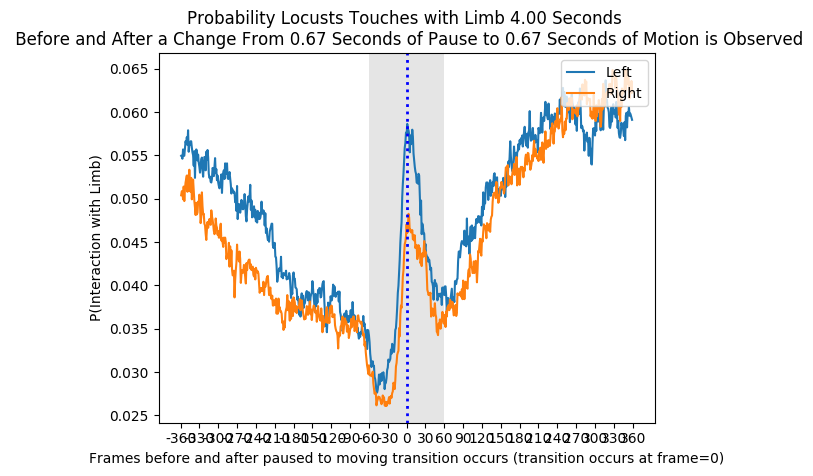









  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15227/323578 [00:00<00:02, 152269.78it/s]







  9%|▉         | 30175/323578 [00:00<00:01, 150915.53it/s]







 14%|█▍        | 45472/323578 [00:00<00:01, 151523.41it/s]







 19%|█▉        | 61332/323578 [00:00<00:01, 153578.90it/s]







 23%|██▎       | 74265/323578 [00:00<00:01, 144687.25it/s]







 27%|██▋       | 88089/323578 [00:00<00:01, 142689.89it/s]







 32%|███▏      | 103839/323578 [00:00<00:01, 146830.65it/s]







 36%|███▋      | 118085/323578 [00:00<00:01, 145489.58it/s]







 41%|████▏     | 133918/323578 [00:00<00:01, 149115.30it/s]

0










 46%|████▌     | 148404/323578 [00:01<00:01, 147810.36it/s]







 50%|█████     | 162806/323578 [00:01<00:01, 145033.48it/s]







 55%|█████▌    | 178140/323578 [00:01<00:00, 147427.09it/s]







 60%|█████▉    | 193722/323578 [00:01<00:00, 149802.04it/s]







 65%|██████▍   | 209213/323578 [00:01<00:00, 151246.87it/s]







 70%|██████▉   | 225277/323578 [00:01<00:00, 153919.07it/s]







 74%|███████▍  | 240630/323578 [00:01<00:00, 150625.68it/s]







 79%|███████▉  | 256854/323578 [00:01<00:00, 153929.29it/s]







 84%|████████▍ | 272257/323578 [00:01<00:00, 153001.75it/s]







 89%|████████▉ | 287566/323578 [00:01<00:00, 139997.47it/s]







 93%|█████████▎| 302505/323578 [00:02<00:00, 142686.44it/s]







 98%|█████████▊| 318563/323578 [00:02<00:00, 147619.99it/s]







100%|██████████| 323578/323578 [00:02<00:00, 148449.01it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13516/323578 [00:00<00:02, 135158.20it/s]







  9%|

1










 56%|█████▋    | 182458/323578 [00:01<00:00, 156916.76it/s]







 61%|██████▏   | 198273/323578 [00:01<00:00, 157283.41it/s]







 66%|██████▌   | 213884/323578 [00:01<00:00, 151503.96it/s]







 71%|███████   | 228998/323578 [00:01<00:00, 149349.38it/s]







 76%|███████▌  | 244487/323578 [00:01<00:00, 150967.43it/s]







 80%|████████  | 260432/323578 [00:01<00:00, 153413.62it/s]







 85%|████████▌ | 276090/323578 [00:01<00:00, 154348.31it/s]







 90%|█████████ | 291968/323578 [00:01<00:00, 155650.46it/s]







 95%|█████████▌| 308082/323578 [00:02<00:00, 157225.75it/s]







100%|██████████| 323578/323578 [00:02<00:00, 151212.26it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13926/323578 [00:00<00:02, 139255.48it/s]







  9%|▉         | 29470/323578 [00:00<00:02, 143745.21it/s]







 13%|█▎        | 43630/323578 [00:00<00:01, 143093.96it/s]







 18%|█▊        | 56681/323578 [00:00<00:01, 139069.16it/s]







 21%|██▏

2










 38%|███▊      | 123297/323578 [00:00<00:01, 133737.18it/s]







 42%|████▏     | 136194/323578 [00:01<00:01, 125736.87it/s]







 46%|████▋     | 150095/323578 [00:01<00:01, 129443.73it/s]







 51%|█████     | 164618/323578 [00:01<00:01, 133806.27it/s]







 55%|█████▍    | 177940/323578 [00:01<00:01, 130812.35it/s]







 59%|█████▉    | 190995/323578 [00:01<00:01, 123721.32it/s]







 63%|██████▎   | 205065/323578 [00:01<00:00, 128367.61it/s]







 68%|██████▊   | 219290/323578 [00:01<00:00, 132237.43it/s]







 72%|███████▏  | 232605/323578 [00:01<00:00, 127589.28it/s]







 76%|███████▋  | 247426/323578 [00:01<00:00, 133146.71it/s]







 81%|████████  | 261899/323578 [00:01<00:00, 136421.07it/s]







 85%|████████▌ | 275654/323578 [00:02<00:00, 130546.44it/s]







 90%|████████▉ | 289821/323578 [00:02<00:00, 132744.13it/s]







 94%|█████████▎| 303280/323578 [00:02<00:00, 133291.27it/s]







 98%|█████████▊| 317393/323578 [00:02<00:00, 135548.09

3


 40%|███▉      | 128782/323578 [00:00<00:01, 146769.48it/s]







 44%|████▍     | 143497/323578 [00:01<00:01, 146880.85it/s]







 49%|████▉     | 158685/323578 [00:01<00:01, 148345.43it/s]







 54%|█████▍    | 174412/323578 [00:01<00:00, 150912.37it/s]







 59%|█████▊    | 190085/323578 [00:01<00:00, 152611.73it/s]







 63%|██████▎   | 205228/323578 [00:01<00:00, 144505.77it/s]







 68%|██████▊   | 219685/323578 [00:01<00:00, 140554.96it/s]







 73%|███████▎  | 234609/323578 [00:01<00:00, 143051.70it/s]







 77%|███████▋  | 248945/323578 [00:01<00:00, 135596.29it/s]







 81%|████████  | 262607/323578 [00:01<00:00, 128543.64it/s]







 85%|████████▌ | 275610/323578 [00:01<00:00, 124923.00it/s]







 89%|████████▉ | 288229/323578 [00:02<00:00, 119850.43it/s]







 93%|█████████▎| 302042/323578 [00:02<00:00, 124805.09it/s]







 97%|█████████▋| 314929/323578 [00:02<00:00, 125583.95it/s]







100%|██████████| 323578/323578 [00:02<00:00, 137617.28it/s]




4










 38%|███▊      | 122457/323578 [00:01<00:01, 110559.12it/s]







 42%|████▏     | 135332/323578 [00:01<00:01, 115438.64it/s]







 45%|████▌     | 146829/323578 [00:01<00:01, 112867.69it/s]







 49%|████▉     | 158096/323578 [00:01<00:01, 111159.95it/s]







 53%|█████▎    | 172949/323578 [00:01<00:01, 120233.85it/s]







 58%|█████▊    | 188441/323578 [00:01<00:01, 128889.87it/s]







 62%|██████▏   | 201799/323578 [00:01<00:00, 130261.45it/s]







 67%|██████▋   | 216474/323578 [00:01<00:00, 134804.01it/s]







 71%|███████   | 230154/323578 [00:01<00:00, 132075.45it/s]







 75%|███████▌  | 244181/323578 [00:01<00:00, 134430.14it/s]







 80%|████████  | 259785/323578 [00:02<00:00, 140256.52it/s]







 85%|████████▍ | 273958/323578 [00:02<00:00, 135532.86it/s]







 89%|████████▉ | 287649/323578 [00:02<00:00, 132918.01it/s]







 93%|█████████▎| 301049/323578 [00:02<00:00, 129460.31it/s]







 97%|█████████▋| 314420/323578 [00:02<00:00, 130704.97

5










 44%|████▍     | 142228/323578 [00:01<00:01, 131122.01it/s]







 48%|████▊     | 155330/323578 [00:01<00:01, 130802.65it/s]







 52%|█████▏    | 168346/323578 [00:01<00:01, 126628.31it/s]







 56%|█████▌    | 180993/323578 [00:01<00:01, 123465.36it/s]







 60%|█████▉    | 193346/323578 [00:01<00:01, 115426.31it/s]







 64%|██████▍   | 208410/323578 [00:01<00:00, 124129.62it/s]







 69%|██████▉   | 222799/323578 [00:01<00:00, 129462.40it/s]







 73%|███████▎  | 235989/323578 [00:01<00:00, 120575.63it/s]







 77%|███████▋  | 249501/323578 [00:01<00:00, 124597.34it/s]







 81%|████████▏ | 263010/323578 [00:02<00:00, 127567.79it/s]







 85%|████████▌ | 275952/323578 [00:02<00:00, 125578.69it/s]







 89%|████████▉ | 288647/323578 [00:02<00:00, 124466.41it/s]







 93%|█████████▎| 301192/323578 [00:02<00:00, 123701.97it/s]







 97%|█████████▋| 314652/323578 [00:02<00:00, 126780.74it/s]







100%|██████████| 323578/323578 [00:02<00:00, 125961.40

6










 44%|████▍     | 143176/323578 [00:01<00:01, 139743.49it/s]







 48%|████▊     | 156834/323578 [00:01<00:01, 136811.08it/s]







 53%|█████▎    | 171219/323578 [00:01<00:01, 138848.33it/s]







 57%|█████▋    | 184966/323578 [00:01<00:01, 137536.16it/s]







 62%|██████▏   | 200554/323578 [00:01<00:00, 142567.66it/s]







 66%|██████▋   | 214792/323578 [00:01<00:00, 134775.17it/s]







 71%|███████   | 228345/323578 [00:01<00:00, 131992.26it/s]







 75%|███████▌  | 243920/323578 [00:01<00:00, 138321.04it/s]







 80%|████████  | 260022/323578 [00:01<00:00, 144427.91it/s]







 85%|████████▌ | 276113/323578 [00:01<00:00, 149004.83it/s]







 90%|█████████ | 292324/323578 [00:02<00:00, 152708.00it/s]







 95%|█████████▌| 308626/323578 [00:02<00:00, 155659.35it/s]







100%|██████████| 323578/323578 [00:02<00:00, 144438.60it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13757/323578 [00:00<00:02, 137562.26it/s]







  9%|

7










 54%|█████▍    | 175616/323578 [00:01<00:00, 152200.43it/s]







 59%|█████▉    | 190699/323578 [00:01<00:00, 147787.52it/s]







 63%|██████▎   | 205410/323578 [00:01<00:00, 138710.86it/s]







 68%|██████▊   | 219348/323578 [00:01<00:00, 137496.72it/s]







 72%|███████▏  | 233716/323578 [00:01<00:00, 139293.78it/s]







 77%|███████▋  | 247686/323578 [00:01<00:00, 138012.12it/s]







 81%|████████  | 261518/323578 [00:01<00:00, 133182.85it/s]







 85%|████████▍ | 274895/323578 [00:01<00:00, 129143.60it/s]







 89%|████████▉ | 287877/323578 [00:02<00:00, 128387.41it/s]







 93%|█████████▎| 301642/323578 [00:02<00:00, 131030.67it/s]







 98%|█████████▊| 316697/323578 [00:02<00:00, 136331.77it/s]







100%|██████████| 323578/323578 [00:02<00:00, 139904.97it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14990/323578 [00:00<00:02, 146642.36it/s]







  8%|▊         | 26572/323578 [00:00<00:02, 135799.15it/s]







 12%|█

8










 39%|███▉      | 126059/323578 [00:00<00:01, 143111.85it/s]







 43%|████▎     | 140510/323578 [00:01<00:01, 143526.96it/s]







 48%|████▊     | 154474/323578 [00:01<00:01, 142204.94it/s]







 52%|█████▏    | 168425/323578 [00:01<00:01, 138901.22it/s]







 56%|█████▋    | 182144/323578 [00:01<00:01, 137568.46it/s]







 61%|██████    | 197237/323578 [00:01<00:00, 141319.89it/s]







 65%|██████▌   | 211313/323578 [00:01<00:00, 139866.32it/s]







 70%|██████▉   | 225935/323578 [00:01<00:00, 141712.24it/s]







 74%|███████▍  | 240292/323578 [00:01<00:00, 142262.93it/s]







 79%|███████▊  | 254506/323578 [00:01<00:00, 140385.91it/s]







 83%|████████▎ | 268773/323578 [00:01<00:00, 141062.56it/s]







 88%|████████▊ | 283970/323578 [00:02<00:00, 144165.93it/s]







 92%|█████████▏| 298403/323578 [00:02<00:00, 142485.33it/s]







 97%|█████████▋| 314013/323578 [00:02<00:00, 146313.32it/s]







100%|██████████| 323578/323578 [00:02<00:00, 141643.61

9










 45%|████▌     | 146294/323578 [00:01<00:01, 146072.37it/s]







 50%|████▉     | 160487/323578 [00:01<00:01, 137986.50it/s]







 54%|█████▍    | 174355/323578 [00:01<00:01, 138193.57it/s]







 58%|█████▊    | 188036/323578 [00:01<00:00, 136796.95it/s]







 62%|██████▏   | 201858/323578 [00:01<00:00, 136720.94it/s]







 67%|██████▋   | 216286/323578 [00:01<00:00, 138902.48it/s]







 71%|███████▏  | 231198/323578 [00:01<00:00, 141815.55it/s]







 76%|███████▌  | 245369/323578 [00:01<00:00, 136642.74it/s]







 81%|████████  | 260827/323578 [00:01<00:00, 141569.05it/s]







 85%|████████▌ | 275053/323578 [00:01<00:00, 140676.53it/s]







 89%|████████▉ | 289170/323578 [00:02<00:00, 131952.88it/s]







 94%|█████████▍| 304578/323578 [00:02<00:00, 137892.21it/s]







 99%|█████████▉| 320410/323578 [00:02<00:00, 143442.74it/s]







100%|██████████| 323578/323578 [00:02<00:00, 141664.93it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%

10










 55%|█████▍    | 177115/323578 [00:01<00:01, 145133.37it/s]







 60%|█████▉    | 193166/323578 [00:01<00:00, 149425.91it/s]







 64%|██████▍   | 208019/323578 [00:01<00:00, 145399.99it/s]







 69%|██████▉   | 222550/323578 [00:01<00:00, 145371.57it/s]







 73%|███████▎  | 237060/323578 [00:01<00:00, 138998.59it/s]







 78%|███████▊  | 251744/323578 [00:01<00:00, 141260.42it/s]







 83%|████████▎ | 267864/323578 [00:01<00:00, 146703.47it/s]







 87%|████████▋ | 282614/323578 [00:01<00:00, 146559.14it/s]







 92%|█████████▏| 297326/323578 [00:02<00:00, 138224.28it/s]







 97%|█████████▋| 312856/323578 [00:02<00:00, 142937.70it/s]







100%|██████████| 323578/323578 [00:02<00:00, 145138.35it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▎         | 12080/323578 [00:00<00:02, 120793.20it/s]







  8%|▊         | 26288/323578 [00:00<00:02, 126476.08it/s]







 13%|█▎        | 41913/323578 [00:00<00:02, 134142.80it/s]







 17%|█▋

11










 31%|███       | 99469/323578 [00:00<00:01, 135535.77it/s]







 36%|███▌      | 115163/323578 [00:00<00:01, 141316.98it/s]







 40%|████      | 130504/323578 [00:00<00:01, 144739.01it/s]







 45%|████▌     | 146409/323578 [00:01<00:01, 148752.64it/s]







 50%|█████     | 162641/323578 [00:01<00:01, 152577.29it/s]







 55%|█████▌    | 178743/323578 [00:01<00:00, 155014.20it/s]







 60%|██████    | 194180/323578 [00:01<00:00, 154653.68it/s]







 65%|██████▍   | 209600/323578 [00:01<00:00, 150125.89it/s]







 69%|██████▉   | 224810/323578 [00:01<00:00, 150710.41it/s]







 74%|███████▍  | 240340/323578 [00:01<00:00, 152058.38it/s]







 79%|███████▉  | 255548/323578 [00:01<00:00, 151721.80it/s]







 84%|████████▎ | 270722/323578 [00:01<00:00, 142753.71it/s]







 88%|████████▊ | 285108/323578 [00:01<00:00, 140967.85it/s]







 92%|█████████▏| 299287/323578 [00:02<00:00, 137493.36it/s]







 97%|█████████▋| 313443/323578 [00:02<00:00, 138686.41i

12










 51%|█████▏    | 165932/323578 [00:01<00:01, 133243.84it/s]







 56%|█████▌    | 181534/323578 [00:01<00:01, 139345.18it/s]







 60%|██████    | 195430/323578 [00:01<00:00, 135596.11it/s]







 65%|██████▍   | 208985/323578 [00:01<00:00, 132527.69it/s]







 69%|██████▉   | 223642/323578 [00:01<00:00, 136447.72it/s]







 74%|███████▍  | 240054/323578 [00:01<00:00, 143715.80it/s]







 79%|███████▊  | 254573/323578 [00:01<00:00, 144152.90it/s]







 83%|████████▎ | 269699/323578 [00:01<00:00, 146213.33it/s]







 88%|████████▊ | 285125/323578 [00:02<00:00, 148537.73it/s]







 93%|█████████▎| 300038/323578 [00:02<00:00, 140284.50it/s]







 97%|█████████▋| 314203/323578 [00:02<00:00, 140530.48it/s]







100%|██████████| 323578/323578 [00:02<00:00, 139679.31it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14062/323578 [00:00<00:02, 140528.00it/s]







  9%|▉         | 29306/323578 [00:00<00:02, 143900.89it/s]







 14%|█

13










 61%|██████▏   | 198992/323578 [00:01<00:00, 140526.36it/s]







 66%|██████▌   | 213048/323578 [00:01<00:00, 138966.98it/s]







 70%|███████   | 226951/323578 [00:01<00:00, 135967.60it/s]







 75%|███████▍  | 241124/323578 [00:01<00:00, 137644.45it/s]







 79%|███████▉  | 256814/323578 [00:01<00:00, 142905.27it/s]







 84%|████████▍ | 272871/323578 [00:01<00:00, 147780.27it/s]







 89%|████████▉ | 288930/323578 [00:02<00:00, 151401.55it/s]







 94%|█████████▍| 304831/323578 [00:02<00:00, 153604.34it/s]







 99%|█████████▉| 320879/323578 [00:02<00:00, 155603.44it/s]







100%|██████████| 323578/323578 [00:02<00:00, 143799.40it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14517/323578 [00:00<00:02, 142582.49it/s]







  9%|▊         | 28230/323578 [00:00<00:02, 140900.55it/s]







 14%|█▎        | 43975/323578 [00:00<00:01, 145486.50it/s]







 18%|█▊        | 58425/323578 [00:00<00:01, 145187.10it/s]







 23%|██▎

14










 45%|████▍     | 144460/323578 [00:01<00:01, 141610.43it/s]







 50%|████▉     | 160467/323578 [00:01<00:01, 146683.26it/s]







 54%|█████▍    | 174921/323578 [00:01<00:01, 144388.42it/s]







 58%|█████▊    | 189218/323578 [00:01<00:00, 142922.51it/s]







 63%|██████▎   | 204324/323578 [00:01<00:00, 145269.23it/s]







 68%|██████▊   | 219496/323578 [00:01<00:00, 147145.14it/s]







 73%|███████▎  | 235677/323578 [00:01<00:00, 151257.23it/s]







 78%|███████▊  | 251515/323578 [00:01<00:00, 153323.89it/s]







 82%|████████▏ | 266858/323578 [00:01<00:00, 148091.17it/s]







 87%|████████▋ | 282947/323578 [00:01<00:00, 151710.60it/s]







 92%|█████████▏| 298939/323578 [00:02<00:00, 154081.77it/s]







 97%|█████████▋| 314394/323578 [00:02<00:00, 140118.84it/s]







100%|██████████| 323578/323578 [00:02<00:00, 145367.45it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15247/323578 [00:00<00:02, 152466.87it/s]







  9%|

15










 40%|███▉      | 129312/323578 [00:00<00:01, 146019.18it/s]







 45%|████▍     | 145202/323578 [00:01<00:01, 149658.23it/s]







 50%|████▉     | 160196/323578 [00:01<00:01, 149702.48it/s]







 54%|█████▍    | 175646/323578 [00:01<00:00, 151057.47it/s]







 59%|█████▉    | 191222/323578 [00:01<00:00, 152436.58it/s]







 64%|██████▍   | 207271/323578 [00:01<00:00, 154764.57it/s]







 69%|██████▉   | 223175/323578 [00:01<00:00, 156021.16it/s]







 74%|███████▍  | 238733/323578 [00:01<00:00, 155461.76it/s]







 79%|███████▊  | 254249/323578 [00:01<00:00, 155275.62it/s]







 84%|████████▎ | 270207/323578 [00:01<00:00, 156540.42it/s]







 88%|████████▊ | 285849/323578 [00:01<00:00, 151842.18it/s]







 93%|█████████▎| 301757/323578 [00:02<00:00, 153940.79it/s]







 98%|█████████▊| 317174/323578 [00:02<00:00, 138848.44it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147730.18it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

16










 45%|████▌     | 145622/323578 [00:01<00:01, 130376.10it/s]







 49%|████▉     | 159801/323578 [00:01<00:01, 133601.14it/s]







 53%|█████▎    | 173035/323578 [00:01<00:01, 133218.69it/s]







 58%|█████▊    | 186257/323578 [00:01<00:01, 131652.48it/s]







 62%|██████▏   | 199357/323578 [00:01<00:00, 125560.67it/s]







 66%|██████▋   | 214861/323578 [00:01<00:00, 133155.55it/s]







 71%|███████   | 229488/323578 [00:01<00:00, 136834.25it/s]







 75%|███████▌  | 243291/323578 [00:01<00:00, 131494.15it/s]







 79%|███████▉  | 256569/323578 [00:01<00:00, 128954.91it/s]







 83%|████████▎ | 270055/323578 [00:02<00:00, 130671.09it/s]







 88%|████████▊ | 283198/323578 [00:02<00:00, 128511.09it/s]







 92%|█████████▏| 299243/323578 [00:02<00:00, 136672.13it/s]







 97%|█████████▋| 315280/323578 [00:02<00:00, 143011.30it/s]







100%|██████████| 323578/323578 [00:02<00:00, 134394.88it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

17


 50%|████▉     | 160451/323578 [00:01<00:01, 125167.50it/s]







 54%|█████▎    | 173788/323578 [00:01<00:01, 127518.09it/s]







 58%|█████▊    | 186503/323578 [00:01<00:01, 122978.06it/s]







 61%|██████▏   | 198810/323578 [00:01<00:01, 118703.24it/s]







 66%|██████▌   | 213037/323578 [00:01<00:00, 124565.97it/s]







 70%|███████   | 227047/323578 [00:01<00:00, 128850.54it/s]







 74%|███████▍  | 240042/323578 [00:01<00:00, 127647.27it/s]







 78%|███████▊  | 253499/323578 [00:01<00:00, 129645.93it/s]







 82%|████████▏ | 266527/323578 [00:02<00:00, 124980.00it/s]







 86%|████████▋ | 279106/323578 [00:02<00:00, 122726.07it/s]







 91%|█████████ | 295019/323578 [00:02<00:00, 131768.89it/s]







 95%|█████████▌| 308430/323578 [00:02<00:00, 128612.76it/s]







100%|█████████▉| 323275/323578 [00:02<00:00, 133461.07it/s]







100%|██████████| 323578/323578 [00:02<00:00, 129737.33it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍      

18










 12%|█▏        | 38877/323578 [00:00<00:02, 123184.58it/s]







 17%|█▋        | 54810/323578 [00:00<00:02, 132180.04it/s]







 22%|██▏       | 70757/323578 [00:00<00:01, 139331.43it/s]







 27%|██▋       | 86897/323578 [00:00<00:01, 145290.42it/s]







 32%|███▏      | 102858/323578 [00:00<00:01, 149308.29it/s]







 36%|███▋      | 117345/323578 [00:00<00:01, 147946.82it/s]







 41%|████      | 131551/323578 [00:00<00:01, 141961.69it/s]







 45%|████▌     | 146014/323578 [00:01<00:01, 142750.12it/s]







 49%|████▉     | 160040/323578 [00:01<00:01, 141991.73it/s]







 54%|█████▍    | 174065/323578 [00:01<00:01, 141156.77it/s]







 58%|█████▊    | 188060/323578 [00:01<00:00, 139519.12it/s]







 62%|██████▏   | 201932/323578 [00:01<00:00, 136905.87it/s]







 67%|██████▋   | 215578/323578 [00:01<00:00, 132432.44it/s]







 71%|███████▏  | 230676/323578 [00:01<00:00, 137498.87it/s]







 76%|███████▌  | 244476/323578 [00:01<00:00, 135241.82it/s

19










 60%|██████    | 195164/323578 [00:01<00:00, 145709.11it/s]







 65%|██████▌   | 210714/323578 [00:01<00:00, 148512.54it/s]







 70%|██████▉   | 225892/323578 [00:01<00:00, 149476.58it/s]







 74%|███████▍  | 240804/323578 [00:01<00:00, 147719.52it/s]







 79%|███████▉  | 255556/323578 [00:01<00:00, 141629.07it/s]







 83%|████████▎ | 270144/323578 [00:01<00:00, 142877.34it/s]







 88%|████████▊ | 284462/323578 [00:01<00:00, 139337.27it/s]







 92%|█████████▏| 298937/323578 [00:02<00:00, 140916.28it/s]







 97%|█████████▋| 313062/323578 [00:02<00:00, 136482.79it/s]







100%|██████████| 323578/323578 [00:02<00:00, 144158.67it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13762/323578 [00:00<00:02, 137617.51it/s]







  9%|▊         | 28279/323578 [00:00<00:02, 139797.35it/s]







 13%|█▎        | 42063/323578 [00:00<00:02, 139204.17it/s]







 17%|█▋        | 55824/323578 [00:00<00:01, 138721.00it/s]







 21%|██▏

20










 44%|████▍     | 143305/323578 [00:01<00:01, 146679.92it/s]







 49%|████▊     | 157611/323578 [00:01<00:01, 140484.74it/s]







 53%|█████▎    | 172332/323578 [00:01<00:01, 142435.27it/s]







 58%|█████▊    | 187106/323578 [00:01<00:00, 143028.35it/s]







 63%|██████▎   | 203235/323578 [00:01<00:00, 148057.32it/s]







 67%|██████▋   | 218063/323578 [00:01<00:00, 148121.55it/s]







 72%|███████▏  | 233216/323578 [00:01<00:00, 149126.87it/s]







 77%|███████▋  | 249337/323578 [00:01<00:00, 152556.87it/s]







 82%|████████▏ | 265530/323578 [00:01<00:00, 155250.35it/s]







 87%|████████▋ | 281657/323578 [00:01<00:00, 157005.94it/s]







 92%|█████████▏| 297762/323578 [00:02<00:00, 158197.50it/s]







 97%|█████████▋| 313831/323578 [00:02<00:00, 158935.34it/s]







100%|██████████| 323578/323578 [00:02<00:00, 148692.07it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14625/323578 [00:00<00:02, 146248.74it/s]







  9%|

21


 67%|██████▋   | 217960/323578 [00:01<00:00, 153193.39it/s]







 72%|███████▏  | 233300/323578 [00:01<00:00, 145382.35it/s]







 77%|███████▋  | 249819/323578 [00:01<00:00, 150806.61it/s]







 82%|████████▏ | 265648/323578 [00:01<00:00, 152974.72it/s]







 87%|████████▋ | 281939/323578 [00:01<00:00, 155824.77it/s]







 92%|█████████▏| 298226/323578 [00:02<00:00, 157870.81it/s]







 97%|█████████▋| 314372/323578 [00:02<00:00, 158929.74it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147971.53it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15530/323578 [00:00<00:01, 155292.74it/s]







  9%|▉         | 29638/323578 [00:00<00:01, 150734.22it/s]







 13%|█▎        | 42420/323578 [00:00<00:01, 143040.81it/s]







 18%|█▊        | 57007/323578 [00:00<00:01, 143876.60it/s]







 22%|██▏       | 69678/323578 [00:00<00:01, 138255.93it/s]







 26%|██▌       | 83403/323578 [00:00<00:01, 137741.82it/s]







 30%|██▉       | 9

22










 48%|████▊     | 154323/323578 [00:01<00:01, 128310.16it/s]







 52%|█████▏    | 167808/323578 [00:01<00:01, 130203.75it/s]







 57%|█████▋    | 184001/323578 [00:01<00:01, 138333.60it/s]







 61%|██████▏   | 198248/323578 [00:01<00:00, 139548.04it/s]







 66%|██████▌   | 212280/323578 [00:01<00:00, 139777.68it/s]







 71%|███████   | 228405/323578 [00:01<00:00, 145591.91it/s]







 75%|███████▌  | 244175/323578 [00:01<00:00, 149024.25it/s]







 80%|████████  | 259164/323578 [00:01<00:00, 147219.69it/s]







 85%|████████▍ | 274566/323578 [00:01<00:00, 149193.65it/s]







 89%|████████▉ | 289538/323578 [00:02<00:00, 145571.18it/s]







 94%|█████████▍| 304151/323578 [00:02<00:00, 145562.73it/s]







 99%|█████████▉| 320064/323578 [00:02<00:00, 149335.93it/s]







100%|██████████| 323578/323578 [00:02<00:00, 142239.70it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 16126/323578 [00:00<00:01, 161253.62it/s]







  9%|

23










 68%|██████▊   | 220584/323578 [00:01<00:00, 137912.89it/s]







 72%|███████▏  | 234384/323578 [00:01<00:00, 130662.25it/s]







 77%|███████▋  | 247818/323578 [00:01<00:00, 131742.72it/s]







 81%|████████  | 262797/323578 [00:01<00:00, 136681.77it/s]







 86%|████████▌ | 276793/323578 [00:01<00:00, 137647.00it/s]







 90%|█████████ | 291959/323578 [00:02<00:00, 141568.83it/s]







 95%|█████████▍| 306525/323578 [00:02<00:00, 142769.48it/s]







 99%|█████████▉| 321439/323578 [00:02<00:00, 143991.21it/s]







100%|██████████| 323578/323578 [00:02<00:00, 142463.32it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13859/323578 [00:00<00:02, 138585.18it/s]







  9%|▉         | 29794/323578 [00:00<00:02, 144222.01it/s]







 14%|█▎        | 44189/323578 [00:00<00:01, 144139.10it/s]







 18%|█▊        | 57300/323578 [00:00<00:01, 138978.62it/s]







 22%|██▏       | 70955/323578 [00:00<00:01, 137597.10it/s]







 27%|██▋ 

24










 52%|█████▏    | 167844/323578 [00:01<00:01, 138470.40it/s]







 56%|█████▌    | 181545/323578 [00:01<00:01, 134600.38it/s]







 61%|██████    | 197188/323578 [00:01<00:00, 140480.81it/s]







 65%|██████▌   | 211248/323578 [00:01<00:00, 136795.26it/s]







 70%|██████▉   | 225981/323578 [00:01<00:00, 139793.40it/s]







 74%|███████▍  | 239997/323578 [00:01<00:00, 134559.06it/s]







 79%|███████▊  | 254527/323578 [00:01<00:00, 137608.81it/s]







 83%|████████▎ | 269559/323578 [00:01<00:00, 141188.05it/s]







 88%|████████▊ | 283747/323578 [00:02<00:00, 139416.26it/s]







 92%|█████████▏| 299266/323578 [00:02<00:00, 143800.29it/s]







 97%|█████████▋| 315382/323578 [00:02<00:00, 148602.34it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140189.93it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15393/323578 [00:00<00:02, 153922.81it/s]









25


  9%|▉         | 30033/323578 [00:00<00:01, 151583.71it/s]







 12%|█▏        | 40194/323578 [00:00<00:02, 132091.92it/s]







 17%|█▋        | 54561/323578 [00:00<00:02, 134272.41it/s]







 21%|██▏       | 68841/323578 [00:00<00:01, 135817.87it/s]







 26%|██▌       | 84439/323578 [00:00<00:01, 141296.07it/s]







 31%|███       | 99586/323578 [00:00<00:01, 144200.75it/s]







 36%|███▌      | 115316/323578 [00:00<00:01, 147893.43it/s]







 40%|████      | 130218/323578 [00:00<00:01, 148227.33it/s]







 45%|████▍     | 144619/323578 [00:01<00:01, 146934.21it/s]







 49%|████▉     | 158950/323578 [00:01<00:01, 143632.36it/s]







 54%|█████▍    | 174528/323578 [00:01<00:01, 145869.99it/s]







 58%|█████▊    | 188958/323578 [00:01<00:00, 142823.93it/s]







 63%|██████▎   | 203145/323578 [00:01<00:00, 142174.46it/s]







 67%|██████▋   | 217687/323578 [00:01<00:00, 143132.55it/s]







 72%|███████▏  | 232290/323578 [00:01<00:00, 142564.75it/s]







 

26










 45%|████▍     | 145536/323578 [00:01<00:01, 148038.45it/s]







 50%|████▉     | 161768/323578 [00:01<00:01, 152051.21it/s]







 55%|█████▍    | 177638/323578 [00:01<00:00, 153984.30it/s]







 60%|█████▉    | 193943/323578 [00:01<00:00, 156594.47it/s]







 65%|██████▍   | 210303/323578 [00:01<00:00, 158629.50it/s]







 70%|███████   | 226608/323578 [00:01<00:00, 159928.19it/s]







 75%|███████▌  | 243321/323578 [00:01<00:00, 162021.40it/s]







 80%|████████  | 259673/323578 [00:01<00:00, 162467.56it/s]







 85%|████████▌ | 276151/323578 [00:01<00:00, 163151.61it/s]







 91%|█████████ | 292856/323578 [00:01<00:00, 164300.31it/s]







 96%|█████████▌| 309424/323578 [00:02<00:00, 164710.68it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154794.50it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14103/323578 [00:00<00:02, 141026.44it/s]







  9%|▊         | 27960/323578 [00:00<00:02, 140280.04it/s]







 13%|█

27










 45%|████▌     | 146891/323578 [00:01<00:01, 148789.56it/s]







 50%|█████     | 163254/323578 [00:01<00:01, 152948.83it/s]







 55%|█████▌    | 179313/323578 [00:01<00:00, 155161.40it/s]







 61%|██████    | 195767/323578 [00:01<00:00, 157860.38it/s]







 66%|██████▌   | 212003/323578 [00:01<00:00, 159181.56it/s]







 71%|███████   | 228343/323578 [00:01<00:00, 160423.98it/s]







 76%|███████▌  | 244355/323578 [00:01<00:00, 159975.12it/s]







 81%|████████  | 260551/323578 [00:01<00:00, 160564.59it/s]







 86%|████████▌ | 276928/323578 [00:01<00:00, 161512.32it/s]







 91%|█████████ | 293205/323578 [00:01<00:00, 161887.05it/s]







 96%|█████████▌| 309388/323578 [00:02<00:00, 161633.73it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154298.49it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13684/323578 [00:00<00:02, 136838.50it/s]







  9%|▉         | 28522/323578 [00:00<00:02, 140107.20it/s]







 13%|█

28










 41%|████      | 131265/323578 [00:00<00:01, 143413.83it/s]







 45%|████▍     | 145126/323578 [00:01<00:01, 134277.91it/s]







 49%|████▉     | 158336/323578 [00:01<00:01, 132666.01it/s]







 53%|█████▎    | 171454/323578 [00:01<00:01, 126552.09it/s]







 57%|█████▋    | 184332/323578 [00:01<00:01, 127211.65it/s]







 61%|██████    | 197023/323578 [00:01<00:01, 126290.97it/s]







 65%|██████▌   | 210979/323578 [00:01<00:00, 129996.84it/s]







 69%|██████▉   | 223993/323578 [00:01<00:00, 126943.10it/s]







 74%|███████▎  | 238064/323578 [00:01<00:00, 130780.93it/s]







 78%|███████▊  | 251189/323578 [00:01<00:00, 128677.57it/s]







 82%|████████▏ | 265833/323578 [00:01<00:00, 133535.15it/s]







 86%|████████▋ | 279262/323578 [00:02<00:00, 133712.17it/s]







 91%|█████████▏| 295296/323578 [00:02<00:00, 140721.89it/s]







 96%|█████████▌| 311320/323578 [00:02<00:00, 146057.65it/s]







100%|██████████| 323578/323578 [00:02<00:00, 138525.43

29










 48%|████▊     | 156171/323578 [00:01<00:01, 126031.81it/s]







 53%|█████▎    | 170251/323578 [00:01<00:01, 130124.98it/s]







 57%|█████▋    | 183183/323578 [00:01<00:01, 128334.22it/s]







 61%|██████    | 196641/323578 [00:01<00:00, 130145.18it/s]







 65%|██████▌   | 210962/323578 [00:01<00:00, 133361.78it/s]







 69%|██████▉   | 224298/323578 [00:01<00:00, 131230.47it/s]







 74%|███████▎  | 237981/323578 [00:01<00:00, 131976.95it/s]







 78%|███████▊  | 251185/323578 [00:01<00:00, 130698.42it/s]







 82%|████████▏ | 264626/323578 [00:02<00:00, 131789.67it/s]







 86%|████████▋ | 279374/323578 [00:02<00:00, 136133.26it/s]







 91%|█████████ | 293029/323578 [00:02<00:00, 134871.70it/s]







 95%|█████████▌| 308258/323578 [00:02<00:00, 139663.53it/s]







100%|██████████| 323578/323578 [00:02<00:00, 133438.43it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14685/323578 [00:00<00:02, 146843.84it/s]







  9%|

30










 70%|██████▉   | 225256/323578 [00:01<00:00, 156308.65it/s]







 74%|███████▍  | 240901/323578 [00:01<00:00, 149009.69it/s]







 79%|███████▉  | 255884/323578 [00:01<00:00, 147707.38it/s]







 84%|████████▎ | 270715/323578 [00:01<00:00, 143055.16it/s]







 89%|████████▊ | 287116/323578 [00:01<00:00, 148756.24it/s]







 94%|█████████▎| 303239/323578 [00:02<00:00, 152290.31it/s]







 99%|█████████▉| 319550/323578 [00:02<00:00, 155380.68it/s]







100%|██████████| 323578/323578 [00:02<00:00, 148703.52it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15336/323578 [00:00<00:02, 153357.59it/s]







  9%|▉         | 30026/323578 [00:00<00:01, 151358.95it/s]







 14%|█▎        | 43904/323578 [00:00<00:01, 147349.98it/s]







 19%|█▊        | 59956/323578 [00:00<00:01, 151066.25it/s]







 23%|██▎       | 75417/323578 [00:00<00:01, 152109.46it/s]







 28%|██▊       | 91515/323578 [00:00<00:01, 154665.97it/s]







 33%|███▎ 

31










 68%|██████▊   | 220614/323578 [00:01<00:00, 161907.03it/s]







 73%|███████▎  | 236784/323578 [00:01<00:00, 161844.10it/s]







 78%|███████▊  | 252902/323578 [00:01<00:00, 158345.30it/s]







 83%|████████▎ | 268707/323578 [00:01<00:00, 153529.50it/s]







 88%|████████▊ | 284071/323578 [00:01<00:00, 153039.28it/s]







 93%|█████████▎| 299383/323578 [00:01<00:00, 149911.84it/s]







 97%|█████████▋| 314394/323578 [00:02<00:00, 143285.45it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154134.71it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15799/323578 [00:00<00:01, 157989.77it/s]







 10%|▉         | 31787/323578 [00:00<00:01, 158550.38it/s]







 15%|█▍        | 47837/323578 [00:00<00:01, 159130.21it/s]







 20%|█▉        | 63908/323578 [00:00<00:01, 159600.46it/s]







 25%|██▍       | 80155/323578 [00:00<00:01, 160449.76it/s]

32










 29%|██▉       | 93547/323578 [00:00<00:01, 148341.15it/s]







 34%|███▍      | 109729/323578 [00:00<00:01, 152142.11it/s]







 39%|███▉      | 125996/323578 [00:00<00:01, 155152.69it/s]







 44%|████▍     | 142412/323578 [00:00<00:01, 157746.80it/s]







 49%|████▉     | 158736/323578 [00:01<00:01, 159352.92it/s]







 54%|█████▍    | 175210/323578 [00:01<00:00, 160931.17it/s]







 59%|█████▉    | 191478/323578 [00:01<00:00, 161449.73it/s]







 64%|██████▍   | 207877/323578 [00:01<00:00, 162202.86it/s]







 69%|██████▉   | 224169/323578 [00:01<00:00, 162414.95it/s]







 74%|███████▍  | 240583/323578 [00:01<00:00, 162926.15it/s]







 79%|███████▉  | 256815/323578 [00:01<00:00, 159809.46it/s]







 84%|████████▍ | 273174/323578 [00:01<00:00, 160924.97it/s]







 89%|████████▉ | 289503/323578 [00:01<00:00, 161626.73it/s]







 94%|█████████▍| 305654/323578 [00:01<00:00, 161396.31it/s]







100%|█████████▉| 321989/323578 [00:02<00:00, 161975.70i

33










 62%|██████▏   | 201191/323578 [00:01<00:00, 161537.66it/s]







 67%|██████▋   | 217303/323578 [00:01<00:00, 161411.14it/s]







 72%|███████▏  | 233756/323578 [00:01<00:00, 162334.24it/s]







 77%|███████▋  | 250134/323578 [00:01<00:00, 162763.71it/s]







 82%|████████▏ | 266601/323578 [00:01<00:00, 163330.53it/s]







 87%|████████▋ | 282905/323578 [00:01<00:00, 160883.22it/s]







 92%|█████████▏| 299076/323578 [00:01<00:00, 161130.18it/s]







 97%|█████████▋| 315317/323578 [00:02<00:00, 161510.90it/s]







100%|██████████| 323578/323578 [00:02<00:00, 157197.71it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14332/323578 [00:00<00:02, 143313.64it/s]







  8%|▊         | 26382/323578 [00:00<00:02, 135610.55it/s]







 12%|█▏        | 39317/323578 [00:00<00:02, 133319.29it/s]







 16%|█▋        | 53302/323578 [00:00<00:01, 135213.02it/s]







 21%|██        | 67630/323578 [00:00<00:01, 137535.95it/s]







 25%|██▌ 

34










 58%|█████▊    | 186251/323578 [00:01<00:00, 151067.56it/s]







 63%|██████▎   | 202334/323578 [00:01<00:00, 153868.21it/s]







 68%|██████▊   | 218616/323578 [00:01<00:00, 156448.49it/s]







 73%|███████▎  | 234829/323578 [00:01<00:00, 158109.85it/s]







 78%|███████▊  | 251206/323578 [00:01<00:00, 159764.53it/s]







 83%|████████▎ | 267579/323578 [00:01<00:00, 160933.79it/s]







 88%|████████▊ | 283921/323578 [00:01<00:00, 161670.23it/s]







 93%|█████████▎| 300096/323578 [00:02<00:00, 160167.29it/s]







 98%|█████████▊| 316420/323578 [00:02<00:00, 161075.23it/s]







100%|██████████| 323578/323578 [00:02<00:00, 149921.22it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13201/323578 [00:00<00:02, 128976.59it/s]







  8%|▊         | 25335/323578 [00:00<00:02, 126586.41it/s]







 12%|█▏        | 39313/323578 [00:00<00:02, 130274.17it/s]







 17%|█▋        | 53914/323578 [00:00<00:02, 134625.23it/s]







 20%|██ 

35










 55%|█████▍    | 177572/323578 [00:01<00:01, 132673.02it/s]







 59%|█████▉    | 191615/323578 [00:01<00:00, 134906.33it/s]







 64%|██████▎   | 205640/323578 [00:01<00:00, 136465.18it/s]







 68%|██████▊   | 219333/323578 [00:01<00:00, 136355.35it/s]







 72%|███████▏  | 233001/323578 [00:01<00:00, 135330.30it/s]







 76%|███████▌  | 246559/323578 [00:01<00:00, 133891.32it/s]







 81%|████████  | 262690/323578 [00:01<00:00, 141084.87it/s]







 86%|████████▌ | 276916/323578 [00:02<00:00, 138536.32it/s]







 90%|████████▉ | 290863/323578 [00:02<00:00, 128452.93it/s]







 95%|█████████▍| 305869/323578 [00:02<00:00, 134251.90it/s]







 99%|█████████▉| 319998/323578 [00:02<00:00, 136287.50it/s]







100%|██████████| 323578/323578 [00:02<00:00, 133970.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15104/323578 [00:00<00:02, 151036.90it/s]







  9%|▉         | 30394/323578 [00:00<00:01, 151590.88it/s]







 14%|█

36


 54%|█████▍    | 174650/323578 [00:01<00:00, 159713.00it/s]







 59%|█████▉    | 190596/323578 [00:01<00:00, 159636.83it/s]







 64%|██████▍   | 206895/323578 [00:01<00:00, 160626.55it/s]







 69%|██████▉   | 223075/323578 [00:01<00:00, 160975.92it/s]







 74%|███████▍  | 239077/323578 [00:01<00:00, 158508.17it/s]







 79%|███████▉  | 255453/323578 [00:01<00:00, 160046.93it/s]







 84%|████████▍ | 271420/323578 [00:01<00:00, 153663.63it/s]







 89%|████████▉ | 287587/323578 [00:01<00:00, 155978.69it/s]







 94%|█████████▍| 304108/323578 [00:01<00:00, 158637.53it/s]







 99%|█████████▉| 320158/323578 [00:02<00:00, 159190.63it/s]







100%|██████████| 323578/323578 [00:02<00:00, 158380.07it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13525/323578 [00:00<00:02, 135245.29it/s]







  8%|▊         | 27253/323578 [00:00<00:02, 135847.17it/s]







 13%|█▎        | 40560/323578 [00:00<00:02, 134999.61it/s]







 17%|█▋        

37










 56%|█████▌    | 180702/323578 [00:01<00:00, 159450.56it/s]







 61%|██████    | 196987/323578 [00:01<00:00, 160454.77it/s]







 66%|██████▌   | 213227/323578 [00:01<00:00, 161032.90it/s]







 71%|███████   | 229259/323578 [00:01<00:00, 160476.56it/s]







 76%|███████▌  | 245470/323578 [00:01<00:00, 160961.23it/s]







 81%|████████  | 261769/323578 [00:01<00:00, 161563.67it/s]







 86%|████████▌ | 278102/323578 [00:01<00:00, 162087.63it/s]







 91%|█████████ | 294447/323578 [00:01<00:00, 162435.90it/s]







 96%|█████████▌| 310680/323578 [00:02<00:00, 162309.04it/s]







100%|██████████| 323578/323578 [00:02<00:00, 155449.21it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15036/323578 [00:00<00:02, 150356.20it/s]







  9%|▉         | 28987/323578 [00:00<00:02, 146927.90it/s]







 13%|█▎        | 42844/323578 [00:00<00:01, 144314.23it/s]







 17%|█▋        | 55262/323578 [00:00<00:01, 136296.46it/s]







 22%|██▏

38










 53%|█████▎    | 171373/323578 [00:01<00:01, 141136.60it/s]







 57%|█████▋    | 185353/323578 [00:01<00:01, 137627.13it/s]







 62%|██████▏   | 200414/323578 [00:01<00:00, 141280.01it/s]







 66%|██████▋   | 214514/323578 [00:01<00:00, 138421.57it/s]







 71%|███████   | 228350/323578 [00:01<00:00, 136701.59it/s]







 75%|███████▍  | 242305/323578 [00:01<00:00, 137542.99it/s]







 79%|███████▉  | 256061/323578 [00:01<00:00, 136131.83it/s]







 84%|████████▍ | 271183/323578 [00:01<00:00, 140331.77it/s]







 88%|████████▊ | 285336/323578 [00:02<00:00, 140687.64it/s]







 93%|█████████▎| 300329/323578 [00:02<00:00, 143292.73it/s]







 97%|█████████▋| 314688/323578 [00:02<00:00, 142505.80it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140945.18it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14578/323578 [00:00<00:02, 145772.15it/s]







  9%|▉         | 30558/323578 [00:00<00:01, 149714.85it/s]







 14%|█

39










 44%|████▍     | 142039/323578 [00:01<00:01, 121530.03it/s]







 49%|████▊     | 156962/323578 [00:01<00:01, 128694.49it/s]







 53%|█████▎    | 169900/323578 [00:01<00:01, 128215.45it/s]







 56%|█████▋    | 182762/323578 [00:01<00:01, 127037.01it/s]







 61%|██████    | 197383/323578 [00:01<00:00, 132238.48it/s]







 66%|██████▌   | 212617/323578 [00:01<00:00, 137687.49it/s]







 71%|███████   | 228962/323578 [00:01<00:00, 144520.04it/s]







 76%|███████▌  | 245170/323578 [00:01<00:00, 149372.76it/s]







 80%|████████  | 260266/323578 [00:01<00:00, 148445.11it/s]







 85%|████████▌ | 276434/323578 [00:01<00:00, 152180.64it/s]







 90%|█████████ | 291754/323578 [00:02<00:00, 146213.42it/s]







 95%|█████████▍| 306497/323578 [00:02<00:00, 134148.73it/s]







 99%|█████████▉| 320636/323578 [00:02<00:00, 136239.80it/s]







100%|██████████| 323578/323578 [00:02<00:00, 139244.88it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%

40










 64%|██████▍   | 207747/323578 [00:01<00:00, 144915.96it/s]







 69%|██████▊   | 222423/323578 [00:01<00:00, 145462.89it/s]







 73%|███████▎  | 237756/323578 [00:01<00:00, 147735.44it/s]







 78%|███████▊  | 252523/323578 [00:01<00:00, 143865.65it/s]







 83%|████████▎ | 267671/323578 [00:01<00:00, 146067.68it/s]







 87%|████████▋ | 282655/323578 [00:01<00:00, 147178.70it/s]







 92%|█████████▏| 297778/323578 [00:02<00:00, 148369.49it/s]







 97%|█████████▋| 312629/323578 [00:02<00:00, 145820.30it/s]







100%|██████████| 323578/323578 [00:02<00:00, 146339.18it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13846/323578 [00:00<00:02, 138456.83it/s]







  8%|▊         | 26075/323578 [00:00<00:02, 132161.84it/s]







 13%|█▎        | 40841/323578 [00:00<00:02, 136457.90it/s]







 17%|█▋        | 53643/323578 [00:00<00:02, 133811.64it/s]







 21%|██▏       | 69136/323578 [00:00<00:01, 139514.75it/s]







 25%|██▍ 

41










 57%|█████▋    | 183307/323578 [00:01<00:00, 142220.46it/s]







 61%|██████▏   | 198966/323578 [00:01<00:00, 146244.07it/s]







 66%|██████▌   | 213584/323578 [00:01<00:00, 146037.13it/s]







 71%|███████   | 228184/323578 [00:01<00:00, 140195.66it/s]







 75%|███████▌  | 243829/323578 [00:01<00:00, 144703.66it/s]







 80%|████████  | 260001/323578 [00:01<00:00, 149418.76it/s]







 85%|████████▌ | 276274/323578 [00:01<00:00, 153176.01it/s]







 90%|█████████ | 292442/323578 [00:02<00:00, 155630.42it/s]







 95%|█████████▌| 308670/323578 [00:02<00:00, 157564.78it/s]







100%|██████████| 323578/323578 [00:02<00:00, 144862.27it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14113/323578 [00:00<00:02, 140258.35it/s]







  8%|▊         | 25874/323578 [00:00<00:02, 132596.73it/s]







 12%|█▏        | 39612/323578 [00:00<00:02, 133996.31it/s]







 16%|█▌        | 51000/323578 [00:00<00:02, 127252.18it/s]







 19%|█▉ 

42










 55%|█████▍    | 176984/323578 [00:01<00:01, 144964.79it/s]







 60%|█████▉    | 193292/323578 [00:01<00:00, 149959.68it/s]







 65%|██████▍   | 209155/323578 [00:01<00:00, 152457.55it/s]







 70%|██████▉   | 225269/323578 [00:01<00:00, 154960.87it/s]







 74%|███████▍  | 240827/323578 [00:01<00:00, 149691.20it/s]







 79%|███████▉  | 255878/323578 [00:01<00:00, 142192.65it/s]







 84%|████████▎ | 270233/323578 [00:01<00:00, 141756.99it/s]







 88%|████████▊ | 285484/323578 [00:02<00:00, 144819.40it/s]







 93%|█████████▎| 300049/323578 [00:02<00:00, 139665.05it/s]







 97%|█████████▋| 314114/323578 [00:02<00:00, 136986.76it/s]







100%|██████████| 323578/323578 [00:02<00:00, 138224.05it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15304/323578 [00:00<00:02, 153037.23it/s]







  9%|▉         | 30691/323578 [00:00<00:01, 153284.63it/s]







 14%|█▍        | 46652/323578 [00:00<00:01, 155128.47it/s]







 19%|█▉

43










 84%|████████▎ | 270252/323578 [00:01<00:00, 160184.76it/s]







 88%|████████▊ | 286363/323578 [00:01<00:00, 160460.12it/s]







 93%|█████████▎| 302399/323578 [00:01<00:00, 158019.61it/s]







 98%|█████████▊| 318203/323578 [00:02<00:00, 151822.99it/s]







100%|██████████| 323578/323578 [00:02<00:00, 156820.70it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14948/323578 [00:00<00:02, 149471.95it/s]







  9%|▉         | 28605/323578 [00:00<00:02, 144238.78it/s]







 14%|█▎        | 43950/323578 [00:00<00:01, 146883.54it/s]







 18%|█▊        | 59765/323578 [00:00<00:01, 150089.35it/s]







 23%|██▎       | 73615/323578 [00:00<00:01, 146411.27it/s]







 28%|██▊       | 89798/323578 [00:00<00:01, 150718.25it/s]







 32%|███▏      | 103826/323578 [00:00<00:01, 147426.27it/s]







 37%|███▋      | 120273/323578 [00:00<00:01, 152155.92it/s]







 42%|████▏     | 136008/323578 [00:00<00:01, 153677.39it/s]







 47%|████▋

44










 52%|█████▏    | 168099/323578 [00:01<00:00, 156889.40it/s]







 57%|█████▋    | 183531/323578 [00:01<00:00, 150538.74it/s]







 62%|██████▏   | 199251/323578 [00:01<00:00, 152475.96it/s]







 67%|██████▋   | 215441/323578 [00:01<00:00, 155183.52it/s]







 71%|███████▏  | 230914/323578 [00:01<00:00, 153161.64it/s]







 76%|███████▌  | 246205/323578 [00:01<00:00, 153018.71it/s]







 81%|████████  | 262581/323578 [00:01<00:00, 154852.60it/s]







 86%|████████▌ | 278059/323578 [00:01<00:00, 149389.05it/s]







 91%|█████████ | 293035/323578 [00:01<00:00, 146912.16it/s]







 95%|█████████▌| 308081/323578 [00:02<00:00, 147956.15it/s]







100%|█████████▉| 322903/323578 [00:02<00:00, 147641.11it/s]







100%|██████████| 323578/323578 [00:02<00:00, 150217.15it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15893/323578 [00:00<00:01, 158922.95it/s]







 10%|▉         | 31674/323578 [00:00<00:01, 158586.78it/s]







 15%|█

45










 52%|█████▏    | 167626/323578 [00:01<00:01, 146536.03it/s]







 56%|█████▋    | 182099/323578 [00:01<00:00, 144282.67it/s]







 61%|██████▏   | 198286/323578 [00:01<00:00, 149142.33it/s]







 66%|██████▌   | 214356/323578 [00:01<00:00, 152429.71it/s]







 71%|███████▏  | 230621/323578 [00:01<00:00, 155356.80it/s]







 76%|███████▋  | 246821/323578 [00:01<00:00, 157291.77it/s]







 81%|████████▏ | 263267/323578 [00:01<00:00, 159374.26it/s]







 86%|████████▋ | 279491/323578 [00:01<00:00, 160222.88it/s]







 91%|█████████▏| 295703/323578 [00:01<00:00, 160785.79it/s]







 96%|█████████▋| 311980/323578 [00:02<00:00, 161373.25it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154679.78it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14001/323578 [00:00<00:02, 140006.46it/s]







  9%|▉         | 29179/323578 [00:00<00:02, 143341.62it/s]







 14%|█▍        | 45339/323578 [00:00<00:01, 148368.23it/s]







 18%|█▊

46










 57%|█████▋    | 184567/323578 [00:01<00:00, 156567.95it/s]







 62%|██████▏   | 200443/323578 [00:01<00:00, 157218.89it/s]







 67%|██████▋   | 216041/323578 [00:01<00:00, 143847.61it/s]







 71%|███████▏  | 230561/323578 [00:01<00:00, 143268.71it/s]







 76%|███████▌  | 244983/323578 [00:01<00:00, 140663.93it/s]







 80%|████████  | 259510/323578 [00:01<00:00, 142014.13it/s]







 85%|████████▍ | 274391/323578 [00:01<00:00, 143985.36it/s]







 90%|████████▉ | 290506/323578 [00:01<00:00, 148736.22it/s]







 94%|█████████▍| 305452/323578 [00:02<00:00, 148738.70it/s]







 99%|█████████▉| 320953/323578 [00:02<00:00, 150563.48it/s]







100%|██████████| 323578/323578 [00:02<00:00, 149455.08it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▌         | 16304/323578 [00:00<00:01, 163039.77it/s]







 10%|▉         | 32173/323578 [00:00<00:01, 161709.22it/s]







 15%|█▍        | 47619/323578 [00:00<00:01, 159461.81it/s]







 20%|█▉

47


 80%|████████  | 259967/323578 [00:01<00:00, 147976.47it/s]







 85%|████████▍ | 274986/323578 [00:01<00:00, 148631.38it/s]







 90%|████████▉ | 290005/323578 [00:01<00:00, 143776.62it/s]







 94%|█████████▍| 304526/323578 [00:01<00:00, 144169.39it/s]







 99%|█████████▊| 319044/323578 [00:02<00:00, 143549.53it/s]







100%|██████████| 323578/323578 [00:02<00:00, 155187.71it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13404/323578 [00:00<00:02, 134037.57it/s]







  9%|▉         | 28328/323578 [00:00<00:02, 138261.41it/s]







 13%|█▎        | 42224/323578 [00:00<00:02, 138469.70it/s]







 17%|█▋        | 56219/323578 [00:00<00:01, 138909.44it/s]







 22%|██▏       | 70015/323578 [00:00<00:01, 138621.69it/s]







 26%|██▌       | 82904/323578 [00:00<00:01, 135549.81it/s]







 31%|███       | 98982/323578 [00:00<00:01, 142245.76it/s]







 35%|███▍      | 113033/323578 [00:00<00:01, 141718.34it/s]







 40%|███▉      | 12

48










 44%|████▍     | 143699/323578 [00:01<00:01, 147283.50it/s]







 49%|████▉     | 158107/323578 [00:01<00:01, 141295.83it/s]







 53%|█████▎    | 172065/323578 [00:01<00:01, 139596.86it/s]







 58%|█████▊    | 186506/323578 [00:01<00:00, 141006.72it/s]







 62%|██████▏   | 201166/323578 [00:01<00:00, 142636.93it/s]







 67%|██████▋   | 215380/323578 [00:01<00:00, 142161.65it/s]







 71%|███████   | 229952/323578 [00:01<00:00, 143210.11it/s]







 76%|███████▌  | 245570/323578 [00:01<00:00, 146867.27it/s]







 81%|████████  | 261648/323578 [00:01<00:00, 150778.95it/s]







 86%|████████▌ | 277029/323578 [00:01<00:00, 151675.04it/s]







 90%|█████████ | 292220/323578 [00:02<00:00, 151345.51it/s]







 95%|█████████▌| 308619/323578 [00:02<00:00, 154929.10it/s]







100%|██████████| 323578/323578 [00:02<00:00, 146472.74it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14970/323578 [00:00<00:02, 147979.48it/s]







  9%|

49










 71%|███████   | 228870/323578 [00:01<00:00, 133080.14it/s]







 75%|███████▍  | 242261/323578 [00:01<00:00, 133327.58it/s]







 80%|███████▉  | 258356/323578 [00:01<00:00, 139557.11it/s]







 84%|████████▍ | 273206/323578 [00:01<00:00, 142124.16it/s]







 89%|████████▉ | 287853/323578 [00:02<00:00, 143399.22it/s]







 94%|█████████▎| 302555/323578 [00:02<00:00, 144465.72it/s]







 98%|█████████▊| 317040/323578 [00:02<00:00, 143587.50it/s]







100%|██████████| 323578/323578 [00:02<00:00, 141767.97it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13685/323578 [00:00<00:02, 136844.91it/s]







  9%|▊         | 28042/323578 [00:00<00:02, 138793.17it/s]









50


 13%|█▎        | 43006/323578 [00:00<00:01, 141876.36it/s]







 17%|█▋        | 54434/323578 [00:00<00:02, 132292.16it/s]







 21%|██        | 67978/323578 [00:00<00:01, 133220.51it/s]







 26%|██▌       | 82944/323578 [00:00<00:01, 137758.98it/s]







 30%|███       | 97531/323578 [00:00<00:01, 140094.18it/s]







 35%|███▍      | 112930/323578 [00:00<00:01, 143991.25it/s]







 39%|███▉      | 127256/323578 [00:00<00:01, 143770.31it/s]







 44%|████▍     | 141868/323578 [00:01<00:01, 144466.67it/s]







 48%|████▊     | 155973/323578 [00:01<00:01, 139294.62it/s]







 52%|█████▏    | 169703/323578 [00:01<00:01, 130422.83it/s]







 57%|█████▋    | 184873/323578 [00:01<00:01, 136149.51it/s]







 61%|██████▏   | 198536/323578 [00:01<00:00, 136012.30it/s]







 66%|██████▋   | 214533/323578 [00:01<00:00, 142409.00it/s]







 71%|███████▏  | 230805/323578 [00:01<00:00, 147948.26it/s]







 76%|███████▌  | 245727/323578 [00:01<00:00, 146116.55it/s]









51










 43%|████▎     | 138296/323578 [00:01<00:01, 132768.23it/s]







 47%|████▋     | 152298/323578 [00:01<00:01, 134861.64it/s]







 51%|█████     | 165679/323578 [00:01<00:01, 132877.74it/s]







 56%|█████▌    | 179878/323578 [00:01<00:01, 135485.59it/s]







 60%|██████    | 194578/323578 [00:01<00:00, 138745.71it/s]







 64%|██████▍   | 208448/323578 [00:01<00:00, 137816.17it/s]







 69%|██████▉   | 223837/323578 [00:01<00:00, 142273.44it/s]







 74%|███████▎  | 238488/323578 [00:01<00:00, 143516.89it/s]







 78%|███████▊  | 252867/323578 [00:01<00:00, 141777.07it/s]







 83%|████████▎ | 267069/323578 [00:01<00:00, 140756.55it/s]







 87%|████████▋ | 281163/323578 [00:02<00:00, 139871.72it/s]







 92%|█████████▏| 296908/323578 [00:02<00:00, 144716.84it/s]







 97%|█████████▋| 313334/323578 [00:02<00:00, 150072.09it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140511.94it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

52










 74%|███████▎  | 238159/323578 [00:01<00:00, 143825.04it/s]







 78%|███████▊  | 252556/323578 [00:01<00:00, 142844.90it/s]







 82%|████████▏ | 266853/323578 [00:01<00:00, 142748.88it/s]







 87%|████████▋ | 281374/323578 [00:01<00:00, 143477.23it/s]







 92%|█████████▏| 297092/323578 [00:02<00:00, 147328.43it/s]







 97%|█████████▋| 312954/323578 [00:02<00:00, 150542.64it/s]







100%|██████████| 323578/323578 [00:02<00:00, 146298.82it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15746/323578 [00:00<00:01, 157451.14it/s]







  9%|▉         | 30600/323578 [00:00<00:01, 154667.33it/s]







 14%|█▍        | 44702/323578 [00:00<00:01, 150302.05it/s]







 18%|█▊        | 59347/323578 [00:00<00:01, 149122.65it/s]







 23%|██▎       | 73289/323578 [00:00<00:01, 146072.45it/s]







 28%|██▊       | 89283/323578 [00:00<00:01, 149972.31it/s]







 33%|███▎      | 105728/323578 [00:00<00:01, 154039.60it/s]







 38%|███▊ 

53










 73%|███████▎  | 236536/323578 [00:01<00:00, 153831.86it/s]







 78%|███████▊  | 252814/323578 [00:01<00:00, 156408.63it/s]







 83%|████████▎ | 269231/323578 [00:01<00:00, 158657.71it/s]







 88%|████████▊ | 285715/323578 [00:01<00:00, 160460.52it/s]







 93%|█████████▎| 302337/323578 [00:01<00:00, 162145.49it/s]







 98%|█████████▊| 318635/323578 [00:02<00:00, 162392.10it/s]







100%|██████████| 323578/323578 [00:02<00:00, 157781.11it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14817/323578 [00:00<00:02, 148168.73it/s]







  9%|▉         | 28802/323578 [00:00<00:02, 145568.46it/s]







 13%|█▎        | 43598/323578 [00:00<00:01, 145196.57it/s]







 18%|█▊        | 58613/323578 [00:00<00:01, 146647.36it/s]







 23%|██▎       | 73016/323578 [00:00<00:01, 145850.47it/s]







 27%|██▋       | 88206/323578 [00:00<00:01, 147612.42it/s]







 32%|███▏      | 102851/323578 [00:00<00:01, 147259.68it/s]







 37%|███▋ 

54










 51%|█████▏    | 166281/323578 [00:01<00:01, 155986.52it/s]







 56%|█████▌    | 181610/323578 [00:01<00:00, 154553.26it/s]







 61%|██████    | 197725/323578 [00:01<00:00, 156474.59it/s]







 66%|██████▌   | 213734/323578 [00:01<00:00, 157541.11it/s]







 71%|███████   | 230036/323578 [00:01<00:00, 159144.64it/s]







 76%|███████▌  | 245895/323578 [00:01<00:00, 157094.70it/s]







 81%|████████  | 261991/323578 [00:01<00:00, 158233.25it/s]







 86%|████████▌ | 278210/323578 [00:01<00:00, 159397.33it/s]







 91%|█████████ | 294343/323578 [00:01<00:00, 159969.68it/s]







 96%|█████████▌| 310543/323578 [00:02<00:00, 160570.50it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154938.16it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12170/323578 [00:00<00:02, 121698.38it/s]







  8%|▊         | 24994/323578 [00:00<00:02, 123589.56it/s]







 11%|█▏        | 36787/323578 [00:00<00:02, 121833.34it/s]







 16%|█▌

55










 63%|██████▎   | 205090/323578 [00:01<00:00, 159967.79it/s]







 68%|██████▊   | 221433/323578 [00:01<00:00, 160988.84it/s]







 73%|███████▎  | 237548/323578 [00:01<00:00, 161034.21it/s]







 78%|███████▊  | 253756/323578 [00:01<00:00, 161344.27it/s]







 83%|████████▎ | 269941/323578 [00:01<00:00, 161494.32it/s]







 88%|████████▊ | 286302/323578 [00:01<00:00, 162120.55it/s]







 94%|█████████▎| 302587/323578 [00:02<00:00, 162336.54it/s]







 99%|█████████▊| 318955/323578 [00:02<00:00, 162736.73it/s]







100%|██████████| 323578/323578 [00:02<00:00, 151720.62it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13585/323578 [00:00<00:02, 133452.98it/s]







  9%|▉         | 28997/323578 [00:00<00:02, 139046.02it/s]







 14%|█▍        | 44868/323578 [00:00<00:01, 144413.40it/s]







 19%|█▊        | 60332/323578 [00:00<00:01, 145955.25it/s]







 24%|██▎       | 76543/323578 [00:00<00:01, 150452.33it/s]







 29%|██▊ 

56










 79%|███████▊  | 254609/323578 [00:01<00:00, 157053.15it/s]







 84%|████████▎ | 270823/323578 [00:01<00:00, 158542.75it/s]







 89%|████████▉ | 287211/323578 [00:01<00:00, 160105.32it/s]







 94%|█████████▍| 303574/323578 [00:01<00:00, 161142.98it/s]







 99%|█████████▉| 319956/323578 [00:02<00:00, 161936.10it/s]







100%|██████████| 323578/323578 [00:02<00:00, 158276.10it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15699/323578 [00:00<00:01, 154265.14it/s]







  9%|▉         | 29295/323578 [00:00<00:01, 147536.30it/s]







 13%|█▎        | 42616/323578 [00:00<00:01, 142923.37it/s]







 17%|█▋        | 56105/323578 [00:00<00:01, 140414.27it/s]







 22%|██▏       | 71480/323578 [00:00<00:01, 144163.51it/s]







 27%|██▋       | 87618/323578 [00:00<00:01, 148928.17it/s]







 32%|███▏      | 103677/323578 [00:00<00:01, 152244.85it/s]

57










 36%|███▋      | 117711/323578 [00:00<00:01, 142258.42it/s]







 41%|████▏     | 133718/323578 [00:00<00:01, 147155.18it/s]







 46%|████▋     | 150067/323578 [00:01<00:01, 151701.34it/s]







 51%|█████▏    | 166320/323578 [00:01<00:01, 154792.96it/s]







 56%|█████▌    | 181620/323578 [00:01<00:00, 153645.34it/s]







 61%|██████    | 197921/323578 [00:01<00:00, 156338.53it/s]







 66%|██████▌   | 214190/323578 [00:01<00:00, 158191.00it/s]







 71%|███████   | 230437/323578 [00:01<00:00, 159450.78it/s]







 76%|███████▋  | 246914/323578 [00:01<00:00, 161009.84it/s]







 81%|████████▏ | 263102/323578 [00:01<00:00, 161269.37it/s]







 86%|████████▋ | 279277/323578 [00:01<00:00, 161411.35it/s]







 91%|█████████▏| 295599/323578 [00:01<00:00, 161949.19it/s]







 96%|█████████▋| 311789/323578 [00:02<00:00, 161922.78it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154677.24it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%

58










 56%|█████▌    | 181499/323578 [00:01<00:01, 136161.13it/s]







 61%|██████    | 197661/323578 [00:01<00:00, 142914.79it/s]







 66%|██████▌   | 212088/323578 [00:01<00:00, 142142.49it/s]







 70%|███████   | 226594/323578 [00:01<00:00, 142705.63it/s]







 75%|███████▍  | 241401/323578 [00:01<00:00, 143519.95it/s]







 79%|███████▉  | 255948/323578 [00:01<00:00, 144099.09it/s]







 84%|████████▎ | 270393/323578 [00:01<00:00, 140307.72it/s]







 88%|████████▊ | 284470/323578 [00:02<00:00, 136341.74it/s]







 93%|█████████▎| 299847/323578 [00:02<00:00, 139899.18it/s]







 97%|█████████▋| 313900/323578 [00:02<00:00, 135681.95it/s]







100%|██████████| 323578/323578 [00:02<00:00, 137016.67it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14617/323578 [00:00<00:02, 144173.04it/s]







  9%|▉         | 30139/323578 [00:00<00:01, 147316.66it/s]







 13%|█▎        | 43240/323578 [00:00<00:01, 142011.28it/s]







 18%|█▊

59










 54%|█████▍    | 175474/323578 [00:01<00:01, 121916.31it/s]







 58%|█████▊    | 187912/323578 [00:01<00:01, 122062.75it/s]







 63%|██████▎   | 203008/323578 [00:01<00:00, 129498.83it/s]







 68%|██████▊   | 218554/323578 [00:01<00:00, 136326.88it/s]







 73%|███████▎  | 234743/323578 [00:01<00:00, 143105.04it/s]







 78%|███████▊  | 251039/323578 [00:01<00:00, 148533.02it/s]







 82%|████████▏ | 266574/323578 [00:01<00:00, 150513.87it/s]







 87%|████████▋ | 282861/323578 [00:02<00:00, 154019.00it/s]







 92%|█████████▏| 299291/323578 [00:02<00:00, 156965.45it/s]







 97%|█████████▋| 315370/323578 [00:02<00:00, 158093.28it/s]







100%|██████████| 323578/323578 [00:02<00:00, 141660.26it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12685/323578 [00:00<00:02, 126847.10it/s]







  8%|▊         | 24923/323578 [00:00<00:02, 125471.85it/s]







 12%|█▏        | 40155/323578 [00:00<00:02, 132476.07it/s]







 16%|█▋

60










 62%|██████▏   | 199513/323578 [00:01<00:00, 147788.95it/s]







 66%|██████▌   | 214245/323578 [00:01<00:00, 146198.48it/s]







 71%|███████   | 230482/323578 [00:01<00:00, 150700.12it/s]







 76%|███████▌  | 246670/323578 [00:01<00:00, 153886.04it/s]







 81%|████████  | 262086/323578 [00:01<00:00, 149642.17it/s]







 86%|████████▌ | 278499/323578 [00:01<00:00, 153712.29it/s]







 91%|█████████ | 293929/323578 [00:02<00:00, 146673.78it/s]







 96%|█████████▌| 310201/323578 [00:02<00:00, 151143.55it/s]







100%|██████████| 323578/323578 [00:02<00:00, 146165.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13559/323578 [00:00<00:02, 133245.01it/s]







  9%|▊         | 28122/323578 [00:00<00:02, 136733.20it/s]







 13%|█▎        | 42163/323578 [00:00<00:02, 137814.64it/s]







 18%|█▊        | 57885/323578 [00:00<00:01, 143112.47it/s]







 22%|██▏       | 71777/323578 [00:00<00:01, 141827.61it/s]







 27%|██▋ 

61










 76%|███████▌  | 245541/323578 [00:01<00:00, 137553.59it/s]







 81%|████████  | 261277/323578 [00:01<00:00, 142949.99it/s]







 85%|████████▌ | 275692/323578 [00:01<00:00, 138368.81it/s]







 90%|████████▉ | 289645/323578 [00:02<00:00, 137494.81it/s]







 94%|█████████▍| 303477/323578 [00:02<00:00, 132760.58it/s]







 99%|█████████▊| 319319/323578 [00:02<00:00, 139540.30it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140719.10it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13885/323578 [00:00<00:02, 135186.12it/s]







  9%|▊         | 27802/323578 [00:00<00:02, 136355.35it/s]







 13%|█▎        | 42809/323578 [00:00<00:02, 140197.94it/s]







 18%|█▊        | 57309/323578 [00:00<00:01, 141557.50it/s]







 22%|██▏       | 71451/323578 [00:00<00:01, 141475.25it/s]







 26%|██▋       | 85003/323578 [00:00<00:01, 139593.53it/s]







 31%|███       | 99726/323578 [00:00<00:01, 141752.17it/s]







 35%|███▌  

62










 82%|████████▏ | 264345/323578 [00:01<00:00, 137137.44it/s]







 86%|████████▌ | 278120/323578 [00:01<00:00, 135181.82it/s]







 91%|█████████ | 292898/323578 [00:02<00:00, 138727.90it/s]







 95%|█████████▌| 308977/323578 [00:02<00:00, 144683.11it/s]







100%|██████████| 323578/323578 [00:02<00:00, 144421.94it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13659/323578 [00:00<00:02, 136587.85it/s]







  9%|▉         | 29049/323578 [00:00<00:02, 141356.52it/s]







 14%|█▍        | 44668/323578 [00:00<00:01, 145501.80it/s]







 18%|█▊        | 58907/323578 [00:00<00:01, 144552.44it/s]







 23%|██▎       | 73664/323578 [00:00<00:01, 145443.99it/s]







 27%|██▋       | 88384/323578 [00:00<00:01, 145965.49it/s]







 32%|███▏      | 103718/323578 [00:00<00:01, 148098.84it/s]







 36%|███▋      | 117427/323578 [00:00<00:01, 142762.01it/s]







 41%|████▏     | 133888/323578 [00:00<00:01, 148680.03it/s]







 46%|████▋

63










 56%|█████▌    | 181169/323578 [00:01<00:00, 149648.77it/s]







 61%|██████    | 196030/323578 [00:01<00:00, 146214.76it/s]







 65%|██████▌   | 210596/323578 [00:01<00:00, 145329.72it/s]







 70%|██████▉   | 225314/323578 [00:01<00:00, 145878.49it/s]







 74%|███████▍  | 240012/323578 [00:01<00:00, 146206.94it/s]







 79%|███████▉  | 256058/323578 [00:01<00:00, 150208.04it/s]







 84%|████████▍ | 271094/323578 [00:01<00:00, 148246.45it/s]







 89%|████████▊ | 286826/323578 [00:01<00:00, 150854.35it/s]







 93%|█████████▎| 301934/323578 [00:02<00:00, 148334.05it/s]







 98%|█████████▊| 316793/323578 [00:02<00:00, 142278.77it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147575.89it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12820/323578 [00:00<00:02, 127212.28it/s]







  8%|▊         | 24510/323578 [00:00<00:02, 123932.15it/s]







 12%|█▏        | 38921/323578 [00:00<00:02, 129365.64it/s]







 17%|█▋

64










 42%|████▏     | 134304/323578 [00:00<00:01, 146341.44it/s]







 47%|████▋     | 150483/323578 [00:01<00:01, 150655.13it/s]







 51%|█████▏    | 166402/323578 [00:01<00:01, 153115.76it/s]







 56%|█████▋    | 182542/323578 [00:01<00:00, 155508.03it/s]







 61%|██████    | 198015/323578 [00:01<00:00, 151632.79it/s]







 66%|██████▌   | 213145/323578 [00:01<00:00, 151180.55it/s]







 71%|███████   | 229168/323578 [00:01<00:00, 153785.19it/s]







 76%|███████▌  | 245511/323578 [00:01<00:00, 156510.99it/s]







 81%|████████  | 261769/323578 [00:01<00:00, 158282.52it/s]







 86%|████████▌ | 278154/323578 [00:01<00:00, 159911.44it/s]







 91%|█████████ | 294273/323578 [00:01<00:00, 160292.81it/s]







 96%|█████████▌| 310593/323578 [00:02<00:00, 161153.96it/s]







100%|██████████| 323578/323578 [00:02<00:00, 153676.95it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▎         | 11878/323578 [00:00<00:02, 115761.80it/s]







  8%|

65










 52%|█████▏    | 168388/323578 [00:01<00:01, 141660.86it/s]







 57%|█████▋    | 184678/323578 [00:01<00:00, 147425.82it/s]







 62%|██████▏   | 200959/323578 [00:01<00:00, 151726.43it/s]







 67%|██████▋   | 216823/323578 [00:01<00:00, 153673.59it/s]







 72%|███████▏  | 232897/323578 [00:01<00:00, 155691.30it/s]







 77%|███████▋  | 249201/323578 [00:01<00:00, 157825.23it/s]







 82%|████████▏ | 265035/323578 [00:01<00:00, 156677.33it/s]







 87%|████████▋ | 281273/323578 [00:01<00:00, 158343.69it/s]







 92%|█████████▏| 297696/323578 [00:02<00:00, 160063.95it/s]







 97%|█████████▋| 313729/323578 [00:02<00:00, 160122.44it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147967.93it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13971/323578 [00:00<00:02, 139704.80it/s]







  9%|▊         | 28045/323578 [00:00<00:02, 140012.50it/s]







 13%|█▎        | 42489/323578 [00:00<00:01, 141309.75it/s]







 18%|█▊

66










 69%|██████▊   | 222101/323578 [00:01<00:00, 151897.96it/s]







 73%|███████▎  | 237313/323578 [00:01<00:00, 148650.65it/s]







 78%|███████▊  | 252209/323578 [00:01<00:00, 146521.69it/s]







 82%|████████▏ | 266890/323578 [00:01<00:00, 145415.51it/s]







 87%|████████▋ | 281700/323578 [00:01<00:00, 146209.08it/s]







 92%|█████████▏| 296824/323578 [00:02<00:00, 147681.56it/s]







 97%|█████████▋| 312437/323578 [00:02<00:00, 148856.51it/s]







100%|██████████| 323578/323578 [00:02<00:00, 146444.88it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13529/323578 [00:00<00:02, 135288.52it/s]







  9%|▉         | 29437/323578 [00:00<00:02, 141642.15it/s]







 13%|█▎        | 42988/323578 [00:00<00:02, 139744.02it/s]







 18%|█▊        | 58038/323578 [00:00<00:01, 142805.79it/s]







 22%|██▏       | 71477/323578 [00:00<00:01, 140171.94it/s]







 27%|██▋       | 86415/323578 [00:00<00:01, 142812.76it/s]







 32%|███▏ 

67


 81%|████████  | 261158/323578 [00:01<00:00, 160152.17it/s]







 86%|████████▌ | 277258/323578 [00:01<00:00, 160402.88it/s]







 91%|█████████ | 293461/323578 [00:01<00:00, 160886.71it/s]







 96%|█████████▌| 309736/323578 [00:02<00:00, 161440.79it/s]







100%|██████████| 323578/323578 [00:02<00:00, 154518.06it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 12201/323578 [00:00<00:02, 122009.53it/s]







  8%|▊         | 25544/323578 [00:00<00:02, 125224.52it/s]







 12%|█▏        | 39408/323578 [00:00<00:02, 128966.38it/s]







 17%|█▋        | 55066/323578 [00:00<00:01, 136168.85it/s]







 21%|██        | 68721/323578 [00:00<00:01, 136282.33it/s]







 26%|██▌       | 84000/323578 [00:00<00:01, 140846.56it/s]







 31%|███       | 99863/323578 [00:00<00:01, 145746.19it/s]







 35%|███▌      | 113551/323578 [00:00<00:01, 142360.48it/s]







 40%|████      | 129679/323578 [00:00<00:01, 147552.91it/s]







 45%|████▍     | 14

68










 74%|███████▍  | 239535/323578 [00:01<00:00, 151946.08it/s]







 79%|███████▊  | 254760/323578 [00:01<00:00, 145171.17it/s]







 83%|████████▎ | 269363/323578 [00:01<00:00, 141491.24it/s]







 88%|████████▊ | 285213/323578 [00:01<00:00, 146197.28it/s]







 93%|█████████▎| 301218/323578 [00:02<00:00, 150092.62it/s]







 98%|█████████▊| 317466/323578 [00:02<00:00, 153604.87it/s]







100%|██████████| 323578/323578 [00:02<00:00, 148238.16it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15250/323578 [00:00<00:02, 152495.06it/s]







  9%|▉         | 29455/323578 [00:00<00:01, 149203.11it/s]







 14%|█▍        | 44918/323578 [00:00<00:01, 150788.37it/s]







 19%|█▊        | 59907/323578 [00:00<00:01, 150516.91it/s]







 23%|██▎       | 74547/323578 [00:00<00:01, 149256.90it/s]







 28%|██▊       | 89597/323578 [00:00<00:01, 149625.58it/s]







 32%|███▏      | 104845/323578 [00:00<00:01, 150468.86it/s]







 37%|███▋ 

69










 88%|████████▊ | 284502/323578 [00:01<00:00, 153133.61it/s]







 93%|█████████▎| 299848/323578 [00:02<00:00, 151296.18it/s]







 98%|█████████▊| 315930/323578 [00:02<00:00, 154032.46it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147961.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15105/323578 [00:00<00:02, 151047.98it/s]







  8%|▊         | 26192/323578 [00:00<00:02, 136235.53it/s]







 12%|█▏        | 39571/323578 [00:00<00:02, 135490.32it/s]







 15%|█▌        | 49334/323578 [00:00<00:02, 121367.99it/s]







 19%|█▉        | 62635/323578 [00:00<00:02, 124640.70it/s]







 23%|██▎       | 75242/323578 [00:00<00:01, 125064.33it/s]







 27%|██▋       | 88728/323578 [00:00<00:01, 127849.45it/s]







 31%|███▏      | 101438/323578 [00:00<00:01, 127622.35it/s]







 35%|███▌      | 113986/323578 [00:00<00:01, 126971.86it/s]







 39%|███▉      | 127577/323578 [00:01<00:01, 129526.62it/s]







 44%|████▍ 

70










 64%|██████▍   | 206714/323578 [00:01<00:01, 104335.54it/s]







 69%|██████▉   | 223111/323578 [00:01<00:00, 117112.56it/s]







 74%|███████▍  | 239634/323578 [00:01<00:00, 128321.79it/s]







 79%|███████▉  | 256014/323578 [00:01<00:00, 137238.27it/s]







 84%|████████▍ | 272461/323578 [00:02<00:00, 144409.21it/s]







 89%|████████▉ | 289009/323578 [00:02<00:00, 150144.10it/s]







 94%|█████████▍| 305491/323578 [00:02<00:00, 154262.79it/s]







 99%|█████████▉| 321838/323578 [00:02<00:00, 156912.93it/s]







100%|██████████| 323578/323578 [00:02<00:00, 136791.48it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13107/323578 [00:00<00:02, 131064.19it/s]







  8%|▊         | 26871/323578 [00:00<00:02, 132969.21it/s]







 13%|█▎        | 42305/323578 [00:00<00:02, 138731.96it/s]







 17%|█▋        | 54772/323578 [00:00<00:02, 134190.92it/s]







 22%|██▏       | 69835/323578 [00:00<00:01, 138731.80it/s]







 27%|██▋ 

71


 58%|█████▊    | 189020/323578 [00:01<00:01, 133774.77it/s]







 63%|██████▎   | 202597/323578 [00:01<00:00, 131088.53it/s]







 67%|██████▋   | 218019/323578 [00:01<00:00, 137264.30it/s]







 72%|███████▏  | 233089/323578 [00:01<00:00, 141035.17it/s]







 76%|███████▋  | 247346/323578 [00:01<00:00, 140971.52it/s]







 81%|████████  | 261551/323578 [00:01<00:00, 138505.51it/s]







 85%|████████▌ | 276488/323578 [00:01<00:00, 141593.71it/s]







 90%|████████▉ | 290724/323578 [00:02<00:00, 132424.52it/s]







 94%|█████████▍| 305514/323578 [00:02<00:00, 136715.41it/s]







 99%|█████████▊| 319343/323578 [00:02<00:00, 136933.86it/s]







100%|██████████| 323578/323578 [00:02<00:00, 139212.60it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15079/323578 [00:00<00:02, 150782.59it/s]







  9%|▉         | 29833/323578 [00:00<00:01, 149793.80it/s]







 13%|█▎        | 42587/323578 [00:00<00:01, 142341.59it/s]







 18%|█▊        

72


 53%|█████▎    | 172594/323578 [00:01<00:01, 145220.25it/s]







 58%|█████▊    | 186971/323578 [00:01<00:00, 141794.75it/s]







 62%|██████▏   | 201067/323578 [00:01<00:00, 137923.23it/s]







 67%|██████▋   | 216682/323578 [00:01<00:00, 142927.46it/s]







 72%|███████▏  | 231965/323578 [00:01<00:00, 145759.06it/s]







 76%|███████▌  | 246570/323578 [00:01<00:00, 140148.45it/s]







 81%|████████  | 262138/323578 [00:01<00:00, 144471.17it/s]







 86%|████████▌ | 277114/323578 [00:01<00:00, 146016.49it/s]







 90%|█████████ | 291876/323578 [00:02<00:00, 146022.11it/s]







 95%|█████████▍| 306521/323578 [00:02<00:00, 139309.62it/s]







 99%|█████████▉| 320548/323578 [00:02<00:00, 139579.99it/s]







100%|██████████| 323578/323578 [00:02<00:00, 142044.38it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15502/323578 [00:00<00:01, 155013.13it/s]







  9%|▉         | 28837/323578 [00:00<00:01, 147809.07it/s]







 12%|█▏       

73










 71%|███████   | 230450/323578 [00:01<00:00, 150708.94it/s]







 76%|███████▌  | 245601/323578 [00:01<00:00, 145545.41it/s]







 81%|████████  | 261374/323578 [00:01<00:00, 148997.07it/s]







 85%|████████▌ | 276444/323578 [00:01<00:00, 149501.49it/s]







 90%|█████████ | 292463/323578 [00:01<00:00, 152553.70it/s]







 95%|█████████▌| 307776/323578 [00:02<00:00, 151345.20it/s]







100%|██████████| 323578/323578 [00:02<00:00, 151437.51it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14677/323578 [00:00<00:02, 146761.04it/s]







  9%|▊         | 28037/323578 [00:00<00:02, 142547.78it/s]







 13%|█▎        | 40892/323578 [00:00<00:02, 138038.32it/s]







 17%|█▋        | 54766/323578 [00:00<00:01, 138246.34it/s]







 22%|██▏       | 69770/323578 [00:00<00:01, 141584.14it/s]







 26%|██▋       | 84989/323578 [00:00<00:01, 144605.84it/s]







 30%|███       | 97770/323578 [00:00<00:01, 138538.01it/s]







 34%|███▍  

74










 83%|████████▎ | 267574/323578 [00:01<00:00, 146629.15it/s]







 87%|████████▋ | 282295/323578 [00:02<00:00, 139759.26it/s]







 92%|█████████▏| 298078/323578 [00:02<00:00, 144728.20it/s]







 97%|█████████▋| 314295/323578 [00:02<00:00, 149553.61it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140850.77it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13701/323578 [00:00<00:02, 137007.84it/s]







  8%|▊         | 25397/323578 [00:00<00:02, 129816.33it/s]







 11%|█▏        | 37174/323578 [00:00<00:02, 125629.10it/s]







 15%|█▍        | 48216/323578 [00:00<00:02, 120642.90it/s]







 19%|█▉        | 62752/323578 [00:00<00:02, 127127.69it/s]







 24%|██▍       | 77257/323578 [00:00<00:01, 132019.84it/s]







 28%|██▊       | 90734/323578 [00:00<00:01, 132831.48it/s]







 33%|███▎      | 105399/323578 [00:00<00:01, 136695.40it/s]







 37%|███▋      | 118994/323578 [00:00<00:01, 136469.69it/s]







 41%|████  

75










 59%|█████▉    | 191669/323578 [00:01<00:00, 135192.25it/s]







 64%|██████▍   | 206915/323578 [00:01<00:00, 139946.90it/s]







 68%|██████▊   | 221081/323578 [00:01<00:00, 140455.41it/s]







 73%|███████▎  | 236831/323578 [00:01<00:00, 145167.61it/s]







 78%|███████▊  | 252116/323578 [00:01<00:00, 147389.43it/s]







 82%|████████▏ | 266919/323578 [00:01<00:00, 141751.61it/s]







 87%|████████▋ | 281676/323578 [00:02<00:00, 143448.21it/s]







 92%|█████████▏| 297032/323578 [00:02<00:00, 146336.75it/s]







 97%|█████████▋| 312778/323578 [00:02<00:00, 149503.96it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140223.71it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15282/323578 [00:00<00:02, 152817.96it/s]







  9%|▉         | 30447/323578 [00:00<00:01, 152464.20it/s]







 13%|█▎        | 40622/323578 [00:00<00:02, 130964.96it/s]







 17%|█▋        | 56349/323578 [00:00<00:01, 137881.66it/s]







 22%|██▏

76










 72%|███████▏  | 234352/323578 [00:01<00:00, 137545.55it/s]







 77%|███████▋  | 248292/323578 [00:01<00:00, 137017.42it/s]







 82%|████████▏ | 264089/323578 [00:01<00:00, 142693.78it/s]







 86%|████████▌ | 278510/323578 [00:01<00:00, 139828.27it/s]







 91%|█████████ | 294161/323578 [00:02<00:00, 144444.62it/s]







 96%|█████████▌| 309918/323578 [00:02<00:00, 148144.60it/s]







100%|██████████| 323578/323578 [00:02<00:00, 142069.59it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▎         | 11568/323578 [00:00<00:02, 115677.08it/s]







  7%|▋         | 22249/323578 [00:00<00:02, 112864.79it/s]







 10%|█         | 32955/323578 [00:00<00:02, 111057.61it/s]







 14%|█▍        | 44492/323578 [00:00<00:02, 112315.17it/s]







 17%|█▋        | 53516/323578 [00:00<00:02, 103681.58it/s]







 20%|█▉        | 64485/323578 [00:00<00:02, 105147.31it/s]







 24%|██▍       | 76956/323578 [00:00<00:02, 109970.77it/s]







 28%|██▊   

77


 42%|████▏     | 134372/323578 [00:01<00:01, 133828.51it/s]







 46%|████▌     | 147754/323578 [00:01<00:01, 132589.48it/s]







 50%|████▉     | 161015/323578 [00:01<00:01, 129313.84it/s]







 54%|█████▍    | 174110/323578 [00:01<00:01, 129799.77it/s]







 58%|█████▊    | 187104/323578 [00:01<00:01, 128876.26it/s]







 62%|██████▏   | 200003/323578 [00:01<00:01, 118048.79it/s]







 66%|██████▌   | 211994/323578 [00:01<00:00, 116211.55it/s]







 70%|██████▉   | 225421/323578 [00:01<00:00, 121097.32it/s]







 73%|███████▎  | 237680/323578 [00:01<00:00, 120299.24it/s]







 77%|███████▋  | 250139/323578 [00:02<00:00, 120742.47it/s]







 81%|████████▏ | 263231/323578 [00:02<00:00, 123624.31it/s]







 86%|████████▌ | 276935/323578 [00:02<00:00, 127364.23it/s]







 90%|█████████ | 292243/323578 [00:02<00:00, 134122.06it/s]







 95%|█████████▌| 308421/323578 [00:02<00:00, 141371.68it/s]







100%|██████████| 323578/323578 [00:02<00:00, 126598.40it/s]




78










 51%|█████     | 165791/323578 [00:01<00:01, 141245.30it/s]







 56%|█████▌    | 181467/323578 [00:01<00:00, 145280.55it/s]







 61%|██████    | 195904/323578 [00:01<00:00, 136681.42it/s]







 66%|██████▌   | 212077/323578 [00:01<00:00, 143339.73it/s]







 70%|███████   | 226525/323578 [00:01<00:00, 142676.88it/s]







 74%|███████▍  | 240873/323578 [00:01<00:00, 140814.14it/s]







 79%|███████▉  | 255401/323578 [00:01<00:00, 142124.64it/s]







 84%|████████▍ | 271467/323578 [00:01<00:00, 147217.80it/s]







 88%|████████▊ | 286268/323578 [00:01<00:00, 146659.85it/s]







 93%|█████████▎| 302369/323578 [00:02<00:00, 150688.67it/s]







 98%|█████████▊| 317505/323578 [00:02<00:00, 150313.19it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147612.31it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 14095/323578 [00:00<00:02, 140949.46it/s]







  8%|▊         | 27211/323578 [00:00<00:02, 137860.72it/s]







 12%|█

79










 67%|██████▋   | 215350/323578 [00:01<00:00, 138961.16it/s]







 71%|███████   | 230448/323578 [00:01<00:00, 142359.19it/s]







 76%|███████▌  | 246601/323578 [00:01<00:00, 147613.87it/s]







 81%|████████  | 261606/323578 [00:01<00:00, 148335.57it/s]







 85%|████████▌ | 276476/323578 [00:01<00:00, 140919.16it/s]







 90%|████████▉ | 290671/323578 [00:02<00:00, 135417.35it/s]







 94%|█████████▍| 304647/323578 [00:02<00:00, 136691.39it/s]







 98%|█████████▊| 318402/323578 [00:02<00:00, 134811.16it/s]







100%|██████████| 323578/323578 [00:02<00:00, 141441.76it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13709/323578 [00:00<00:02, 137088.82it/s]







  8%|▊         | 26405/323578 [00:00<00:02, 133881.86it/s]







 12%|█▏        | 39950/323578 [00:00<00:02, 134346.61it/s]







 16%|█▋        | 52612/323578 [00:00<00:02, 131279.83it/s]







 21%|██        | 68125/323578 [00:00<00:01, 137626.09it/s]







 25%|██▌ 

80










 30%|██▉       | 96084/323578 [00:00<00:01, 138100.57it/s]







 34%|███▍      | 110355/323578 [00:00<00:01, 138970.20it/s]







 39%|███▉      | 126351/323578 [00:00<00:01, 144026.34it/s]







 44%|████▍     | 142435/323578 [00:01<00:01, 148003.89it/s]







 48%|████▊     | 156926/323578 [00:01<00:01, 145264.26it/s]







 53%|█████▎    | 172517/323578 [00:01<00:01, 148301.27it/s]







 58%|█████▊    | 187910/323578 [00:01<00:00, 149945.60it/s]







 63%|██████▎   | 203373/323578 [00:01<00:00, 151320.47it/s]







 68%|██████▊   | 218827/323578 [00:01<00:00, 152269.84it/s]







 73%|███████▎  | 235212/323578 [00:01<00:00, 155567.17it/s]







 77%|███████▋  | 250760/323578 [00:01<00:00, 155201.01it/s]







 83%|████████▎ | 267001/323578 [00:01<00:00, 157294.01it/s]







 88%|████████▊ | 283350/323578 [00:01<00:00, 159100.32it/s]







 92%|█████████▏| 299267/323578 [00:02<00:00, 144384.73it/s]







 97%|█████████▋| 313972/323578 [00:02<00:00, 142900.62i

81










 56%|█████▌    | 179985/323578 [00:01<00:01, 142944.01it/s]







 60%|██████    | 194486/323578 [00:01<00:00, 142862.16it/s]







 64%|██████▍   | 208703/323578 [00:01<00:00, 135867.96it/s]







 69%|██████▉   | 223420/323578 [00:01<00:00, 139071.66it/s]







 74%|███████▍  | 239620/323578 [00:01<00:00, 145237.67it/s]







 79%|███████▊  | 254756/323578 [00:01<00:00, 147019.93it/s]







 84%|████████▎ | 270754/323578 [00:01<00:00, 150680.39it/s]







 89%|████████▊ | 286632/323578 [00:01<00:00, 153021.25it/s]







 93%|█████████▎| 302266/323578 [00:02<00:00, 154000.40it/s]







 99%|█████████▊| 318731/323578 [00:02<00:00, 157047.70it/s]







100%|██████████| 323578/323578 [00:02<00:00, 148973.09it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15658/323578 [00:00<00:02, 152600.24it/s]







  9%|▉         | 29494/323578 [00:00<00:01, 148027.04it/s]







 13%|█▎        | 42795/323578 [00:00<00:01, 143176.60it/s]







 17%|█▋

82










 81%|████████  | 261608/323578 [00:01<00:00, 142830.63it/s]







 86%|████████▌ | 276725/323578 [00:01<00:00, 145233.95it/s]







 90%|█████████ | 291305/323578 [00:02<00:00, 138551.54it/s]







 95%|█████████▍| 305866/323578 [00:02<00:00, 139262.88it/s]







 99%|█████████▉| 319866/323578 [00:02<00:00, 135712.77it/s]







100%|██████████| 323578/323578 [00:02<00:00, 140959.73it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▎         | 11521/323578 [00:00<00:02, 115203.79it/s]







  8%|▊         | 24612/323578 [00:00<00:02, 118939.12it/s]







 12%|█▏        | 38166/323578 [00:00<00:02, 123475.98it/s]







 17%|█▋        | 53818/323578 [00:00<00:02, 131823.82it/s]







 22%|██▏       | 69996/323578 [00:00<00:01, 139576.15it/s]







 27%|██▋       | 85803/323578 [00:00<00:01, 144650.96it/s]







 31%|███▏      | 101629/323578 [00:00<00:01, 148479.46it/s]







 36%|███▌      | 116838/323578 [00:00<00:01, 149543.90it/s]







 41%|████ 

83










 61%|██████▏   | 198736/323578 [00:01<00:00, 161391.11it/s]







 66%|██████▋   | 214985/323578 [00:01<00:00, 161717.53it/s]







 72%|███████▏  | 231397/323578 [00:01<00:00, 162427.91it/s]







 77%|███████▋  | 247880/323578 [00:01<00:00, 163140.85it/s]







 82%|████████▏ | 264208/323578 [00:01<00:00, 163179.82it/s]







 87%|████████▋ | 281040/323578 [00:01<00:00, 164687.96it/s]







 92%|█████████▏| 297503/323578 [00:01<00:00, 164462.59it/s]







 97%|█████████▋| 313945/323578 [00:02<00:00, 164177.49it/s]







100%|██████████| 323578/323578 [00:02<00:00, 156848.54it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15968/323578 [00:00<00:01, 159673.68it/s]







 10%|▉         | 31860/323578 [00:00<00:01, 159446.30it/s]







 15%|█▍        | 47847/323578 [00:00<00:01, 159547.71it/s]







 20%|█▉        | 63922/323578 [00:00<00:01, 159906.32it/s]







 25%|██▍       | 80230/323578 [00:00<00:01, 160844.17it/s]







 30%|██▉ 

84










 95%|█████████▍| 306581/323578 [00:01<00:00, 153888.25it/s]







100%|█████████▉| 322375/323578 [00:02<00:00, 155080.08it/s]







100%|██████████| 323578/323578 [00:02<00:00, 157920.18it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15208/323578 [00:00<00:02, 152073.26it/s]







  9%|▉         | 29187/323578 [00:00<00:01, 148101.69it/s]







 14%|█▍        | 44798/323578 [00:00<00:01, 150411.01it/s]







 19%|█▊        | 60355/323578 [00:00<00:01, 151920.34it/s]







 23%|██▎       | 74124/323578 [00:00<00:01, 146705.46it/s]







 28%|██▊       | 89658/323578 [00:00<00:01, 149191.01it/s]







 33%|███▎      | 105507/323578 [00:00<00:01, 151861.62it/s]







 38%|███▊      | 121952/323578 [00:00<00:01, 155428.96it/s]







 43%|████▎     | 138214/323578 [00:00<00:01, 157515.80it/s]







 48%|████▊     | 154562/323578 [00:01<00:01, 159256.24it/s]







 53%|█████▎    | 170781/323578 [00:01<00:00, 160123.18it/s]







 58%|█████

85










 68%|██████▊   | 219949/323578 [00:01<00:00, 152213.44it/s]







 73%|███████▎  | 236218/323578 [00:01<00:00, 155210.71it/s]







 78%|███████▊  | 252482/323578 [00:01<00:00, 157366.31it/s]







 83%|████████▎ | 268827/323578 [00:01<00:00, 159141.26it/s]







 88%|████████▊ | 285175/323578 [00:01<00:00, 160416.53it/s]







 93%|█████████▎| 301630/323578 [00:01<00:00, 161632.49it/s]







 98%|█████████▊| 317837/323578 [00:02<00:00, 161761.46it/s]







100%|██████████| 323578/323578 [00:02<00:00, 157065.76it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15298/323578 [00:00<00:02, 152975.77it/s]







  9%|▉         | 28706/323578 [00:00<00:02, 146769.28it/s]







 13%|█▎        | 43594/323578 [00:00<00:01, 145987.19it/s]







 18%|█▊        | 58224/323578 [00:00<00:01, 146080.00it/s]







 22%|██▏       | 72332/323578 [00:00<00:01, 144540.89it/s]







 27%|██▋       | 87368/323578 [00:00<00:01, 146236.58it/s]







 31%|███  

86










 77%|███████▋  | 249471/323578 [00:01<00:00, 142873.85it/s]







 82%|████████▏ | 264691/323578 [00:01<00:00, 145547.39it/s]







 86%|████████▋ | 279281/323578 [00:01<00:00, 137477.27it/s]







 91%|█████████ | 293146/323578 [00:02<00:00, 129651.55it/s]







 96%|█████████▌| 309442/323578 [00:02<00:00, 138120.68it/s]







100%|██████████| 323578/323578 [00:02<00:00, 142615.18it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15200/323578 [00:00<00:02, 151998.33it/s]







  9%|▉         | 29975/323578 [00:00<00:01, 150696.03it/s]







 14%|█▎        | 44364/323578 [00:00<00:01, 148585.08it/s]







 18%|█▊        | 58623/323578 [00:00<00:01, 146734.11it/s]







 22%|██▏       | 71734/323578 [00:00<00:01, 141669.20it/s]







 27%|██▋       | 87358/323578 [00:00<00:01, 145745.54it/s]







 32%|███▏      | 103237/323578 [00:00<00:01, 149426.59it/s]







 37%|███▋      | 118308/323578 [00:00<00:01, 149809.14it/s]







 41%|████ 

87










 59%|█████▉    | 191489/323578 [00:01<00:00, 141379.85it/s]







 64%|██████▍   | 206586/323578 [00:01<00:00, 144123.86it/s]







 68%|██████▊   | 221019/323578 [00:01<00:00, 143100.08it/s]







 73%|███████▎  | 235576/323578 [00:01<00:00, 143830.63it/s]







 77%|███████▋  | 249971/323578 [00:01<00:00, 140929.13it/s]







 82%|████████▏ | 264667/323578 [00:01<00:00, 142684.72it/s]







 87%|████████▋ | 280916/323578 [00:01<00:00, 148098.23it/s]







 91%|█████████▏| 295793/323578 [00:02<00:00, 147809.54it/s]







 96%|█████████▌| 311141/323578 [00:02<00:00, 149464.15it/s]







100%|██████████| 323578/323578 [00:02<00:00, 146138.85it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▌         | 16532/323578 [00:00<00:01, 165315.03it/s]







 10%|█         | 32460/323578 [00:00<00:01, 163456.13it/s]







 14%|█▍        | 45921/323578 [00:00<00:01, 153579.50it/s]







 18%|█▊        | 59490/323578 [00:00<00:01, 147734.97it/s]







 22%|██▏

88










 86%|████████▌ | 276950/323578 [00:01<00:00, 140171.17it/s]







 90%|█████████ | 292063/323578 [00:02<00:00, 143286.82it/s]







 95%|█████████▍| 306431/323578 [00:02<00:00, 142220.86it/s]







 99%|█████████▉| 321751/323578 [00:02<00:00, 145344.00it/s]







100%|██████████| 323578/323578 [00:02<00:00, 143167.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▍         | 13970/323578 [00:00<00:02, 139694.47it/s]







  9%|▉         | 28779/323578 [00:00<00:02, 142109.24it/s]







 14%|█▍        | 44626/323578 [00:00<00:01, 146650.29it/s]

89










 18%|█▊        | 56796/323578 [00:00<00:01, 138151.51it/s]







 22%|██▏       | 71665/323578 [00:00<00:01, 141152.07it/s]







 27%|██▋       | 88146/323578 [00:00<00:01, 147502.24it/s]







 32%|███▏      | 102578/323578 [00:00<00:01, 146531.27it/s]







 36%|███▋      | 118067/323578 [00:00<00:01, 148940.90it/s]







 41%|████      | 132616/323578 [00:00<00:01, 147887.42it/s]







 45%|████▌     | 146902/323578 [00:01<00:01, 142650.66it/s]







 50%|█████     | 161807/323578 [00:01<00:01, 144510.15it/s]







 55%|█████▌    | 178013/323578 [00:01<00:00, 149360.17it/s]







 60%|██████    | 194234/323578 [00:01<00:00, 152994.54it/s]







 65%|██████▍   | 209480/323578 [00:01<00:00, 151985.46it/s]







 69%|██████▉   | 224643/323578 [00:01<00:00, 150536.41it/s]







 74%|███████▍  | 240609/323578 [00:01<00:00, 152171.89it/s]







 79%|███████▉  | 256251/323578 [00:01<00:00, 153419.78it/s]







 84%|████████▍ | 272037/323578 [00:01<00:00, 154725.33it/

90










 47%|████▋     | 153301/323578 [00:01<00:01, 133238.36it/s]







 51%|█████▏    | 166528/323578 [00:01<00:01, 130932.97it/s]







 55%|█████▌    | 179563/323578 [00:01<00:01, 128343.10it/s]







 59%|█████▉    | 192368/323578 [00:01<00:01, 127683.82it/s]







 64%|██████▍   | 207132/323578 [00:01<00:00, 133078.76it/s]







 69%|██████▊   | 222378/323578 [00:01<00:00, 138354.80it/s]







 73%|███████▎  | 236299/323578 [00:01<00:00, 133676.51it/s]







 77%|███████▋  | 249761/323578 [00:01<00:00, 122761.38it/s]







 81%|████████▏ | 263292/323578 [00:01<00:00, 126272.51it/s]







 85%|████████▌ | 276113/323578 [00:02<00:00, 122428.10it/s]







 89%|████████▉ | 288517/323578 [00:02<00:00, 121236.76it/s]







 93%|█████████▎| 300885/323578 [00:02<00:00, 121063.69it/s]







 97%|█████████▋| 313073/323578 [00:02<00:00, 118003.42it/s]







100%|██████████| 323578/323578 [00:02<00:00, 129967.72it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%

91










 71%|███████   | 228253/323578 [00:01<00:00, 141565.20it/s]







 75%|███████▌  | 243349/323578 [00:01<00:00, 144257.68it/s]







 80%|███████▉  | 257770/323578 [00:01<00:00, 141959.81it/s]







 85%|████████▍ | 273662/323578 [00:01<00:00, 146647.78it/s]







 89%|████████▉ | 288785/323578 [00:01<00:00, 147969.34it/s]







 94%|█████████▍| 304820/323578 [00:02<00:00, 151476.85it/s]







 99%|█████████▉| 320011/323578 [00:02<00:00, 149829.78it/s]







100%|██████████| 323578/323578 [00:02<00:00, 149610.90it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15077/323578 [00:00<00:02, 150766.19it/s]







  9%|▉         | 29012/323578 [00:00<00:02, 147146.90it/s]







 13%|█▎        | 42826/323578 [00:00<00:01, 144321.22it/s]







 18%|█▊        | 57421/323578 [00:00<00:01, 143479.65it/s]







 22%|██▏       | 71497/323578 [00:00<00:01, 142652.72it/s]







 27%|██▋       | 86837/323578 [00:00<00:01, 145179.92it/s]







 31%|███  

92


 65%|██████▍   | 210003/323578 [00:01<00:00, 135558.29it/s]







 69%|██████▉   | 223502/323578 [00:01<00:00, 133717.69it/s]







 74%|███████▍  | 239694/323578 [00:01<00:00, 141088.86it/s]







 79%|███████▉  | 255922/323578 [00:01<00:00, 146840.10it/s]







 84%|████████▍ | 272319/323578 [00:01<00:00, 151547.85it/s]







 89%|████████▉ | 288641/323578 [00:02<00:00, 154863.58it/s]







 94%|█████████▍| 304856/323578 [00:02<00:00, 156973.87it/s]







 99%|█████████▉| 321282/323578 [00:02<00:00, 159088.32it/s]







100%|██████████| 323578/323578 [00:02<00:00, 144779.81it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15439/323578 [00:00<00:01, 154389.04it/s]







  9%|▉         | 28954/323578 [00:00<00:01, 148065.56it/s]







 13%|█▎        | 43536/323578 [00:00<00:01, 147362.02it/s]







 18%|█▊        | 58166/323578 [00:00<00:01, 146984.78it/s]







 22%|██▏       | 72450/323578 [00:00<00:01, 145715.61it/s]







 27%|██▋       | 

93










 92%|█████████▏| 298013/323578 [00:02<00:00, 153239.55it/s]







 97%|█████████▋| 314349/323578 [00:02<00:00, 156140.39it/s]







100%|██████████| 323578/323578 [00:02<00:00, 147172.28it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15176/323578 [00:00<00:02, 151753.99it/s]







  8%|▊         | 26795/323578 [00:00<00:02, 138990.17it/s]







 12%|█▏        | 38162/323578 [00:00<00:02, 130282.44it/s]







 16%|█▌        | 52048/323578 [00:00<00:02, 132741.83it/s]







 20%|█▉        | 64678/323578 [00:00<00:01, 130741.07it/s]







 24%|██▍       | 77682/323578 [00:00<00:01, 130528.12it/s]







 28%|██▊       | 91637/323578 [00:00<00:01, 133107.63it/s]







 33%|███▎      | 107615/323578 [00:00<00:01, 140122.96it/s]







 38%|███▊      | 122750/323578 [00:00<00:01, 143311.17it/s]







 43%|████▎     | 138984/323578 [00:01<00:01, 148533.80it/s]







 48%|████▊     | 154614/323578 [00:01<00:01, 150780.61it/s]







 53%|█████▎

94










 83%|████████▎ | 267796/323578 [00:01<00:00, 160476.78it/s]







 88%|████████▊ | 283835/323578 [00:01<00:00, 159448.16it/s]







 93%|█████████▎| 300131/323578 [00:02<00:00, 160485.09it/s]







 98%|█████████▊| 316178/323578 [00:02<00:00, 159869.15it/s]







100%|██████████| 323578/323578 [00:02<00:00, 150424.54it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  4%|▎         | 11914/323578 [00:00<00:02, 119139.26it/s]







  8%|▊         | 25862/323578 [00:00<00:02, 124380.53it/s]







 13%|█▎        | 41630/323578 [00:00<00:02, 132358.73it/s]







 18%|█▊        | 57281/323578 [00:00<00:01, 138504.79it/s]







 22%|██▏       | 71275/323578 [00:00<00:01, 138932.09it/s]







 27%|██▋       | 87512/323578 [00:00<00:01, 145219.93it/s]







 32%|███▏      | 103951/323578 [00:00<00:01, 150483.24it/s]







 37%|███▋      | 120279/323578 [00:00<00:01, 154105.27it/s]







 42%|████▏     | 135576/323578 [00:00<00:01, 153761.53it/s]







 47%|████▋

95


 72%|███████▏  | 232592/323578 [00:01<00:00, 158225.34it/s]







 77%|███████▋  | 248654/323578 [00:01<00:00, 158934.11it/s]







 82%|████████▏ | 265146/323578 [00:01<00:00, 160682.79it/s]







 87%|████████▋ | 281406/323578 [00:01<00:00, 161250.37it/s]







 92%|█████████▏| 297865/323578 [00:01<00:00, 162236.39it/s]







 97%|█████████▋| 314089/323578 [00:02<00:00, 160967.62it/s]







100%|██████████| 323578/323578 [00:02<00:00, 156155.52it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15089/323578 [00:00<00:02, 150886.55it/s]







  9%|▉         | 30254/323578 [00:00<00:01, 151112.34it/s]







 14%|█▎        | 44282/323578 [00:00<00:01, 147688.89it/s]







 18%|█▊        | 59717/323578 [00:00<00:01, 149625.38it/s]









96


 23%|██▎       | 75215/323578 [00:00<00:01, 151190.33it/s]







 27%|██▋       | 87815/323578 [00:00<00:01, 130566.90it/s]







 31%|███▏      | 101736/323578 [00:00<00:01, 133029.76it/s]







 35%|███▌      | 114780/323578 [00:00<00:01, 132240.70it/s]







 40%|███▉      | 127912/323578 [00:00<00:01, 130786.15it/s]







 44%|████▍     | 141672/323578 [00:01<00:01, 132757.87it/s]







 48%|████▊     | 154852/323578 [00:01<00:01, 132468.52it/s]







 52%|█████▏    | 169420/323578 [00:01<00:01, 136173.08it/s]







 57%|█████▋    | 183511/323578 [00:01<00:01, 137559.93it/s]







 61%|██████▏   | 198316/323578 [00:01<00:00, 140547.32it/s]







 66%|██████▌   | 212971/323578 [00:01<00:00, 142295.40it/s]







 70%|███████   | 227179/323578 [00:01<00:00, 139164.51it/s]







 75%|███████▌  | 242808/323578 [00:01<00:00, 143893.88it/s]







 80%|███████▉  | 257941/323578 [00:01<00:00, 146045.46it/s]







 84%|████████▍ | 272753/323578 [00:01<00:00, 146661.22it/s]






97


 71%|███████   | 230161/323578 [00:01<00:00, 134258.53it/s]







 76%|███████▌  | 245994/323578 [00:01<00:00, 140672.87it/s]







 80%|████████  | 260188/323578 [00:01<00:00, 129818.53it/s]







 85%|████████▌ | 275046/323578 [00:02<00:00, 134928.34it/s]







 90%|████████▉ | 290612/323578 [00:02<00:00, 140543.08it/s]







 94%|█████████▍| 305687/323578 [00:02<00:00, 143456.38it/s]







 99%|█████████▉| 321296/323578 [00:02<00:00, 147024.74it/s]







100%|██████████| 323578/323578 [00:02<00:00, 135987.54it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▌         | 16223/323578 [00:00<00:01, 162225.51it/s]







 10%|▉         | 32132/323578 [00:00<00:01, 161269.78it/s]







 15%|█▍        | 47255/323578 [00:00<00:01, 157928.74it/s]







 19%|█▉        | 61326/323578 [00:00<00:01, 152334.46it/s]







 24%|██▍       | 77494/323578 [00:00<00:01, 155022.40it/s]







 29%|██▊       | 93012/323578 [00:00<00:01, 155069.58it/s]







 33%|███▎      | 1

98










 61%|██████    | 197775/323578 [00:01<00:00, 146033.76it/s]







 66%|██████▌   | 213404/323578 [00:01<00:00, 148965.07it/s]







 71%|███████   | 228648/323578 [00:01<00:00, 149988.42it/s]







 75%|███████▌  | 243596/323578 [00:01<00:00, 143298.21it/s]







 80%|████████  | 259497/323578 [00:01<00:00, 147673.55it/s]







 85%|████████▍ | 274732/323578 [00:01<00:00, 149043.60it/s]







 90%|████████▉ | 291023/323578 [00:01<00:00, 152946.95it/s]







 95%|█████████▍| 306372/323578 [00:02<00:00, 152681.06it/s]







 99%|█████████▉| 321960/323578 [00:02<00:00, 152187.86it/s]







100%|██████████| 323578/323578 [00:02<00:00, 150858.35it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15282/323578 [00:00<00:02, 152815.77it/s]







  9%|▉         | 30611/323578 [00:00<00:01, 152956.14it/s]







 14%|█▍        | 45137/323578 [00:00<00:01, 150561.27it/s]







 19%|█▊        | 60248/323578 [00:00<00:01, 150724.54it/s]







 24%|██▎

99










 78%|███████▊  | 251834/323578 [00:01<00:00, 151383.34it/s]







 83%|████████▎ | 268345/323578 [00:01<00:00, 155254.03it/s]







 88%|████████▊ | 284711/323578 [00:01<00:00, 157682.80it/s]







 93%|█████████▎| 301201/323578 [00:01<00:00, 159780.68it/s]







 98%|█████████▊| 317600/323578 [00:02<00:00, 161019.30it/s]







100%|██████████| 323578/323578 [00:02<00:00, 157072.85it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 16052/323578 [00:00<00:01, 160514.41it/s]







 10%|▉         | 30842/323578 [00:00<00:01, 156508.18it/s]







 14%|█▍        | 44870/323578 [00:00<00:01, 151257.35it/s]







 18%|█▊        | 59239/323578 [00:00<00:01, 148904.36it/s]







 23%|██▎       | 75117/323578 [00:00<00:01, 151733.68it/s]







 28%|██▊       | 90783/323578 [00:00<00:01, 153178.56it/s]







 32%|███▏      | 104248/323578 [00:00<00:01, 145814.20it/s]







 36%|███▋      | 117739/323578 [00:00<00:01, 142361.31it/s]







 41%|████ 

100










 89%|████████▊ | 287029/323578 [00:01<00:00, 150259.14it/s]







 93%|█████████▎| 302182/323578 [00:02<00:00, 150637.55it/s]







 98%|█████████▊| 318052/323578 [00:02<00:00, 152932.50it/s]







100%|██████████| 323578/323578 [00:02<00:00, 150230.47it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 15088/323578 [00:00<00:02, 150875.11it/s]







 10%|▉         | 30976/323578 [00:00<00:01, 153188.51it/s]







 15%|█▍        | 47052/323578 [00:00<00:01, 155382.64it/s]







 20%|█▉        | 63114/323578 [00:00<00:01, 156904.08it/s]







 24%|██▍       | 79186/323578 [00:00<00:01, 158029.07it/s]







 29%|██▉       | 95443/323578 [00:00<00:01, 159362.08it/s]







 35%|███▍      | 111719/323578 [00:00<00:01, 160366.28it/s]







 40%|███▉      | 128007/323578 [00:00<00:01, 161109.52it/s]







 45%|████▍     | 144268/323578 [00:00<00:01, 161554.61it/s]







 50%|████▉     | 160555/323578 [00:01<00:01, 161944.97it/s]







 55%|█████

101


 85%|████████▌ | 275463/323578 [00:01<00:00, 163353.14it/s]







 90%|█████████ | 291766/323578 [00:01<00:00, 161441.50it/s]







 95%|█████████▌| 308046/323578 [00:01<00:00, 161845.56it/s]







100%|██████████| 323578/323578 [00:02<00:00, 161749.59it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  5%|▍         | 14991/323578 [00:00<00:02, 149906.93it/s]







  9%|▉         | 29431/323578 [00:00<00:01, 148210.31it/s]







 13%|█▎        | 42358/323578 [00:00<00:02, 140482.70it/s]







 17%|█▋        | 56258/323578 [00:00<00:01, 140033.61it/s]







 21%|██▏       | 69265/323578 [00:00<00:01, 136885.31it/s]







 25%|██▌       | 81236/323578 [00:00<00:01, 131235.09it/s]







 29%|██▉       | 93308/323578 [00:00<00:01, 127677.70it/s]







 33%|███▎      | 107508/323578 [00:00<00:01, 131655.40it/s]







 37%|███▋      | 119900/323578 [00:00<00:01, 128691.85it/s]







 41%|████      | 132365/323578 [00:01<00:01, 127451.70it/s]







 45%|████▍     | 14

102










 72%|███████▏  | 231439/323578 [00:01<00:00, 140723.34it/s]







 76%|███████▌  | 245503/323578 [00:01<00:00, 138119.55it/s]







 80%|████████  | 259320/323578 [00:01<00:00, 124122.85it/s]







 85%|████████▌ | 275353/323578 [00:02<00:00, 133115.48it/s]







 90%|████████▉ | 290502/323578 [00:02<00:00, 138124.96it/s]







 94%|█████████▍| 304624/323578 [00:02<00:00, 134797.05it/s]







 98%|█████████▊| 318338/323578 [00:02<00:00, 131021.50it/s]







100%|██████████| 323578/323578 [00:02<00:00, 134331.20it/s]

speed changes:  6724


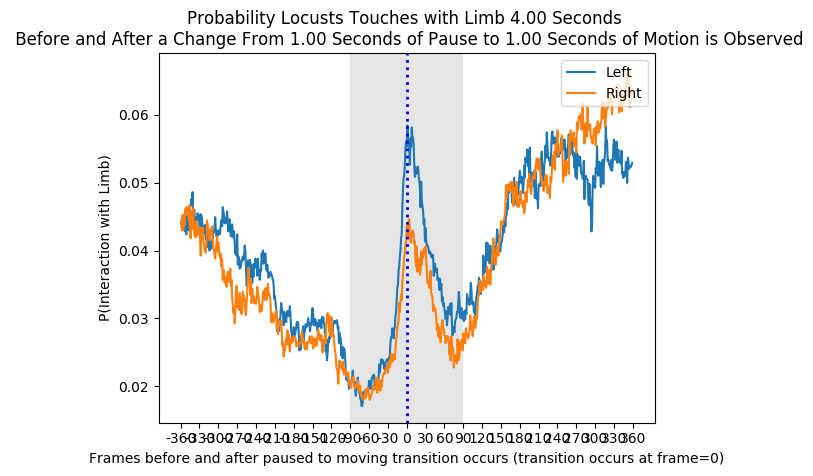

In [170]:
region='LR'
for filter_frame in filter_lengths:
    data_analysis.history(X_LR, y, data_analysis.framesback, region, want_PL_or_Greater=False, pause_length=np.nan, filter_frames=filter_frame)



  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 4871/323578 [00:00<00:06, 47662.66it/s]



0


  3%|▎         | 11244/323578 [00:00<00:06, 51429.91it/s]

  5%|▍         | 14744/323578 [00:00<00:06, 45080.82it/s]

  7%|▋         | 21120/323578 [00:00<00:06, 49352.22it/s]

  8%|▊         | 25436/323578 [00:00<00:06, 46838.33it/s]

 10%|▉         | 30775/323578 [00:00<00:06, 48570.05it/s]

 11%|█         | 35992/323578 [00:00<00:05, 49542.74it/s]

 13%|█▎        | 43665/323578 [00:00<00:05, 55184.40it/s]

 15%|█▌        | 50001/323578 [00:00<00:04, 57282.24it/s]

 17%|█▋        | 55759/323578 [00:01<00:04, 56892.62it/s]

 19%|█▉        | 61470/323578 [00:01<00:04, 53767.33it/s]

 21%|██▏       | 68963/323578 [00:01<00:04, 58449.39it/s]

 23%|██▎       | 75844/323578 [00:01<00:04, 61214.42it/s]

 25%|██▌       | 82264/323578 [00:01<00:03, 62080.50it/s]

 27%|██▋       | 88575/323578 [00:01<00:03, 60791.39it/s]

 29%|██▉       | 94733/323578 [00:01<00:04, 53980.35it/s]

 32%|███▏      | 104692/323578 [00:01<00:03, 62316.35it/s]

 35%|███▍      | 112897/323578 [00:01<00:03, 67133.74it

1


  7%|▋         | 23960/323578 [00:00<00:02, 121450.52it/s]

 11%|█         | 34409/323578 [00:00<00:02, 115095.33it/s]

 14%|█▎        | 44351/323578 [00:00<00:02, 109767.53it/s]

 18%|█▊        | 58829/323578 [00:00<00:02, 118353.62it/s]

 24%|██▎       | 76102/323578 [00:00<00:01, 130696.18it/s]

 29%|██▊       | 92824/323578 [00:00<00:01, 139729.30it/s]

 33%|███▎      | 106344/323578 [00:00<00:01, 127661.48it/s]

 39%|███▉      | 125941/323578 [00:00<00:01, 142139.57it/s]

 46%|████▌     | 148111/323578 [00:01<00:01, 159287.55it/s]

 52%|█████▏    | 169321/323578 [00:01<00:00, 172146.35it/s]

 59%|█████▉    | 192527/323578 [00:01<00:00, 186598.49it/s]

 66%|██████▌   | 212229/323578 [00:01<00:00, 146132.30it/s]

 71%|███████   | 228931/323578 [00:01<00:00, 142887.48it/s]

 76%|███████▌  | 244698/323578 [00:01<00:00, 145364.45it/s]

 81%|████████  | 262160/323578 [00:01<00:00, 153056.32it/s]

 87%|████████▋ | 282003/323578 [00:01<00:00, 164315.65it/s]

 92%|█████████▏| 299256/323578

2


  5%|▌         | 16188/323578 [00:00<00:03, 83971.39it/s]

  7%|▋         | 23481/323578 [00:00<00:03, 80080.90it/s]

 10%|█         | 32533/323578 [00:00<00:03, 82950.29it/s]

 12%|█▏        | 39174/323578 [00:00<00:03, 76853.92it/s]

 15%|█▍        | 47274/323578 [00:00<00:03, 78051.97it/s]

 17%|█▋        | 54111/323578 [00:00<00:03, 67808.26it/s]

 19%|█▉        | 61705/323578 [00:00<00:03, 70048.84it/s]

 21%|██▏       | 69118/323578 [00:00<00:03, 71039.13it/s]

 25%|██▌       | 81944/323578 [00:01<00:02, 81980.00it/s]

 28%|██▊       | 91229/323578 [00:01<00:02, 84711.12it/s]

 31%|███       | 100884/323578 [00:01<00:02, 87946.03it/s]

 34%|███▍      | 109960/323578 [00:01<00:02, 88572.66it/s]

 37%|███▋      | 119015/323578 [00:01<00:02, 83597.12it/s]

 39%|███▉      | 127571/323578 [00:01<00:02, 76352.93it/s]

 42%|████▏     | 135466/323578 [00:01<00:02, 75547.88it/s]

 44%|████▍     | 143204/323578 [00:01<00:02, 71387.58it/s]

 47%|████▋     | 152109/323578 [00:01<00:02, 75739

3


  5%|▍         | 15664/323578 [00:00<00:04, 76618.16it/s]

  6%|▌         | 19609/323578 [00:00<00:05, 53990.00it/s]

  8%|▊         | 24966/323578 [00:00<00:05, 53556.43it/s]

  9%|▉         | 29148/323578 [00:00<00:06, 47999.77it/s]

 10%|█         | 33235/323578 [00:00<00:06, 41782.32it/s]

 12%|█▏        | 38413/323578 [00:00<00:06, 44264.16it/s]

 14%|█▎        | 44369/323578 [00:00<00:05, 47628.35it/s]

 15%|█▌        | 49059/323578 [00:00<00:05, 46949.11it/s]

 17%|█▋        | 53705/323578 [00:01<00:05, 45948.10it/s]

 18%|█▊        | 58270/323578 [00:01<00:06, 43719.59it/s]

 19%|█▉        | 62644/323578 [00:01<00:06, 39456.99it/s]

 21%|██        | 66670/323578 [00:01<00:06, 37861.39it/s]

 23%|██▎       | 75108/323578 [00:01<00:05, 45364.04it/s]

 28%|██▊       | 90019/323578 [00:01<00:04, 57283.33it/s]

 31%|███       | 100920/323578 [00:01<00:03, 66791.32it/s]

 34%|███▍      | 110383/323578 [00:01<00:02, 73256.51it/s]

 40%|████      | 129514/323578 [00:01<00:02, 89898.69i

4


  4%|▍         | 13016/323578 [00:00<00:05, 61238.78it/s]

  6%|▌         | 19744/323578 [00:00<00:04, 62933.72it/s]

  8%|▊         | 27188/323578 [00:00<00:04, 65993.42it/s]

 11%|█         | 35212/323578 [00:00<00:04, 69706.25it/s]

 13%|█▎        | 41422/323578 [00:00<00:04, 67005.40it/s]

 15%|█▌        | 48744/323578 [00:00<00:03, 68755.26it/s]

 17%|█▋        | 56271/323578 [00:00<00:03, 70387.14it/s]

 19%|█▉        | 63041/323578 [00:00<00:04, 58978.18it/s]

 22%|██▏       | 71083/323578 [00:01<00:03, 63849.61it/s]

 24%|██▍       | 78566/323578 [00:01<00:03, 66789.37it/s]

 27%|██▋       | 87703/323578 [00:01<00:03, 72652.86it/s]

 30%|██▉       | 96001/323578 [00:01<00:03, 75259.74it/s]

 32%|███▏      | 103744/323578 [00:01<00:02, 73625.43it/s]

 35%|███▍      | 112041/323578 [00:01<00:02, 76105.19it/s]

 37%|███▋      | 119785/323578 [00:01<00:02, 73694.93it/s]

 40%|████      | 130534/323578 [00:01<00:02, 80934.42it/s]

 43%|████▎     | 138920/323578 [00:01<00:02, 80021.3

5


  4%|▍         | 12529/323578 [00:00<00:04, 63181.15it/s]

  5%|▌         | 17568/323578 [00:00<00:05, 58261.88it/s]

  7%|▋         | 23939/323578 [00:00<00:05, 59335.41it/s]

  9%|▉         | 29358/323578 [00:00<00:05, 57413.64it/s]

 11%|█         | 34768/323578 [00:00<00:05, 56107.30it/s]

 12%|█▏        | 40423/323578 [00:00<00:05, 56239.36it/s]

 14%|█▍        | 46620/323578 [00:00<00:04, 57844.03it/s]

 16%|█▌        | 52067/323578 [00:00<00:04, 56143.63it/s]

 18%|█▊        | 57456/323578 [00:01<00:04, 55225.90it/s]

 19%|█▉        | 62941/323578 [00:01<00:04, 55112.48it/s]

 21%|██▏       | 69475/323578 [00:01<00:04, 57548.19it/s]

 23%|██▎       | 75960/323578 [00:01<00:04, 59559.98it/s]

 26%|██▌       | 82890/323578 [00:01<00:03, 62181.79it/s]

 28%|██▊       | 89128/323578 [00:01<00:04, 56988.34it/s]

 29%|██▉       | 95102/323578 [00:01<00:03, 57315.45it/s]

 31%|███       | 100903/323578 [00:01<00:03, 55959.49it/s]

 33%|███▎      | 106555/323578 [00:01<00:04, 49520.16it

6


  4%|▍         | 13615/323578 [00:00<00:05, 59263.61it/s]

  7%|▋         | 21448/323578 [00:00<00:04, 63931.79it/s]

  9%|▉         | 29885/323578 [00:00<00:04, 68941.91it/s]

 11%|█▏        | 36712/323578 [00:00<00:04, 68252.94it/s]

 13%|█▎        | 42836/323578 [00:00<00:04, 62670.20it/s]

 15%|█▌        | 50098/323578 [00:00<00:04, 65005.02it/s]

 18%|█▊        | 57097/323578 [00:00<00:04, 66333.97it/s]

 20%|█▉        | 63695/323578 [00:00<00:03, 65803.87it/s]

 22%|██▏       | 70301/323578 [00:01<00:03, 65509.35it/s]

 25%|██▍       | 80061/323578 [00:01<00:03, 72421.25it/s]

 27%|██▋       | 87470/323578 [00:01<00:03, 71014.39it/s]

 29%|██▉       | 94695/323578 [00:01<00:03, 68737.37it/s]

 31%|███▏      | 101884/323578 [00:01<00:03, 69224.21it/s]

 35%|███▍      | 111893/323578 [00:01<00:02, 75732.55it/s]

 37%|███▋      | 119700/323578 [00:01<00:02, 68273.13it/s]

 39%|███▉      | 126831/323578 [00:01<00:03, 62084.50it/s]

 41%|████      | 133360/323578 [00:02<00:03, 51399.4

7


  4%|▎         | 11423/323578 [00:00<00:05, 55527.53it/s]

  5%|▍         | 15964/323578 [00:00<00:05, 51801.23it/s]

  7%|▋         | 22076/323578 [00:00<00:05, 54163.43it/s]

  9%|▉         | 28847/323578 [00:00<00:05, 57336.27it/s]

 10%|█         | 33748/323578 [00:00<00:05, 52663.93it/s]

 12%|█▏        | 38506/323578 [00:00<00:06, 47285.85it/s]

 14%|█▍        | 44846/323578 [00:00<00:05, 51065.07it/s]

 16%|█▌        | 50345/323578 [00:00<00:05, 51714.49it/s]

 17%|█▋        | 55456/323578 [00:01<00:06, 44533.70it/s]

 19%|█▊        | 60043/323578 [00:01<00:06, 43852.13it/s]

 21%|██        | 68547/323578 [00:01<00:04, 51119.07it/s]

 23%|██▎       | 75241/323578 [00:01<00:04, 55020.11it/s]

 25%|██▌       | 81594/323578 [00:01<00:04, 57323.43it/s]

 27%|██▋       | 87668/323578 [00:01<00:04, 57974.35it/s]

 29%|██▉       | 94431/323578 [00:01<00:03, 60083.36it/s]

 31%|███▏      | 101417/323578 [00:01<00:03, 62715.57it/s]

 34%|███▎      | 108422/323578 [00:01<00:03, 64507.26it

8


  5%|▌         | 16609/323578 [00:00<00:03, 84780.99it/s]

  6%|▋         | 20851/323578 [00:00<00:04, 64933.63it/s]

  8%|▊         | 24973/323578 [00:00<00:05, 53876.92it/s]

 10%|█         | 32435/323578 [00:00<00:04, 58582.17it/s]

 12%|█▏        | 37903/323578 [00:00<00:05, 57125.16it/s]

 14%|█▍        | 44886/323578 [00:00<00:04, 60200.12it/s]

 16%|█▋        | 52696/323578 [00:00<00:04, 64350.40it/s]

 19%|█▉        | 61624/323578 [00:00<00:03, 70233.42it/s]

 21%|██        | 68690/323578 [00:01<00:03, 65774.86it/s]

 24%|██▍       | 79131/323578 [00:01<00:03, 73979.98it/s]

 28%|██▊       | 89686/323578 [00:01<00:02, 81151.79it/s]

 30%|███       | 98290/323578 [00:01<00:02, 77062.32it/s]

 34%|███▍      | 110055/323578 [00:01<00:02, 85958.27it/s]

 38%|███▊      | 123351/323578 [00:01<00:02, 95736.14it/s]

 41%|████▏     | 133696/323578 [00:01<00:01, 95424.03it/s]

 44%|████▍     | 143779/323578 [00:01<00:01, 95668.95it/s]

 48%|████▊     | 154912/323578 [00:01<00:01, 99882.8

9


  3%|▎         | 10809/323578 [00:00<00:06, 50862.56it/s]

  5%|▌         | 17742/323578 [00:00<00:05, 55279.65it/s]

  8%|▊         | 25936/323578 [00:00<00:04, 61016.43it/s]

 10%|▉         | 31151/323578 [00:00<00:05, 54955.53it/s]

 12%|█▏        | 38105/323578 [00:00<00:04, 58295.88it/s]

 13%|█▎        | 43635/323578 [00:00<00:05, 54471.12it/s]

 15%|█▌        | 49654/323578 [00:00<00:04, 55650.13it/s]

 17%|█▋        | 55215/323578 [00:00<00:04, 55240.14it/s]

 19%|█▉        | 61216/323578 [00:01<00:04, 56368.69it/s]

 21%|██        | 67118/323578 [00:01<00:04, 57042.33it/s]

 23%|██▎       | 73459/323578 [00:01<00:04, 58456.55it/s]

 25%|██▍       | 80274/323578 [00:01<00:04, 60600.12it/s]

 27%|██▋       | 86359/323578 [00:01<00:03, 60674.75it/s]

 29%|██▊       | 92819/323578 [00:01<00:03, 61630.41it/s]

 31%|███       | 98992/323578 [00:01<00:04, 56037.07it/s]

 33%|███▎      | 106686/323578 [00:01<00:03, 60595.62it/s]

 35%|███▍      | 112926/323578 [00:01<00:03, 54614.87it

10


  3%|▎         | 9289/323578 [00:00<00:06, 48327.26it/s]

  4%|▍         | 12633/323578 [00:00<00:07, 42505.59it/s]

  6%|▌         | 18603/323578 [00:00<00:06, 46232.87it/s]

  8%|▊         | 25872/323578 [00:00<00:05, 51636.56it/s]

 10%|▉         | 31633/323578 [00:00<00:05, 53112.84it/s]

 12%|█▏        | 37527/323578 [00:00<00:05, 54617.40it/s]

 13%|█▎        | 43589/323578 [00:00<00:04, 56115.02it/s]

 16%|█▌        | 51910/323578 [00:00<00:04, 62019.73it/s]

 18%|█▊        | 58189/323578 [00:01<00:04, 55485.37it/s]

 20%|█▉        | 63920/323578 [00:01<00:04, 51964.98it/s]

 22%|██▏       | 70087/323578 [00:01<00:04, 54533.57it/s]

 24%|██▍       | 77010/323578 [00:01<00:04, 57898.74it/s]

 26%|██▌       | 82965/323578 [00:01<00:04, 53032.65it/s]

 28%|██▊       | 89316/323578 [00:01<00:04, 55469.77it/s]

 30%|██▉       | 95645/323578 [00:01<00:03, 57601.75it/s]

 32%|███▏      | 103735/323578 [00:01<00:03, 62631.94it/s]

 34%|███▍      | 110223/323578 [00:01<00:03, 60459.74it/

11


  4%|▍         | 13426/323578 [00:00<00:04, 69500.94it/s]

  7%|▋         | 21424/323578 [00:00<00:04, 72204.74it/s]

  9%|▊         | 27708/323578 [00:00<00:04, 69009.81it/s]

 10%|█         | 32854/323578 [00:00<00:04, 58662.18it/s]

 12%|█▏        | 38063/323578 [00:00<00:05, 56312.32it/s]

 13%|█▎        | 43110/323578 [00:00<00:05, 53983.87it/s]

 15%|█▍        | 48073/323578 [00:00<00:05, 51468.73it/s]

 17%|█▋        | 54359/323578 [00:00<00:04, 54427.50it/s]

 19%|█▉        | 61024/323578 [00:01<00:04, 57296.63it/s]

 21%|██▏       | 68942/323578 [00:01<00:04, 62476.61it/s]

 28%|██▊       | 90646/323578 [00:01<00:02, 79450.48it/s]

 34%|███▍      | 110203/323578 [00:01<00:02, 96669.57it/s]

 39%|███▊      | 125327/323578 [00:01<00:01, 107884.47it/s]

 43%|████▎     | 139237/323578 [00:01<00:01, 110596.72it/s]

 48%|████▊     | 155443/323578 [00:01<00:01, 122201.94it/s]

 52%|█████▏    | 169581/323578 [00:01<00:01, 103713.36it/s]

 58%|█████▊    | 187647/323578 [00:01<00:01, 11

12


  7%|▋         | 21889/323578 [00:00<00:03, 99865.06it/s]

  9%|▉         | 28698/323578 [00:00<00:03, 87549.41it/s]

 11%|█         | 35342/323578 [00:00<00:03, 79835.72it/s]

 14%|█▍        | 45443/323578 [00:00<00:03, 85117.82it/s]

 17%|█▋        | 53792/323578 [00:00<00:03, 84622.50it/s]

 19%|█▉        | 62001/323578 [00:00<00:03, 83792.41it/s]

 22%|██▏       | 69811/323578 [00:00<00:03, 72557.73it/s]

 24%|██▍       | 76936/323578 [00:01<00:04, 61241.48it/s]

 26%|██▌       | 83622/323578 [00:01<00:03, 62423.58it/s]

 28%|██▊       | 90018/323578 [00:01<00:03, 60576.73it/s]

 30%|██▉       | 96195/323578 [00:01<00:03, 60252.30it/s]

 32%|███▏      | 104635/323578 [00:01<00:03, 65527.89it/s]

 34%|███▍      | 111382/323578 [00:01<00:03, 62872.11it/s]

 37%|███▋      | 118653/323578 [00:01<00:03, 65155.37it/s]

 39%|███▊      | 125301/323578 [00:01<00:03, 62441.84it/s]

 41%|████      | 131662/323578 [00:01<00:03, 58989.63it/s]

 44%|████▍     | 142805/323578 [00:01<00:02, 68420.

13


  4%|▍         | 12216/323578 [00:00<00:05, 61756.37it/s]

  5%|▌         | 16910/323578 [00:00<00:05, 56134.06it/s]

  7%|▋         | 21573/323578 [00:00<00:05, 52487.37it/s]

 10%|▉         | 30783/323578 [00:00<00:04, 60263.06it/s]

 13%|█▎        | 41910/323578 [00:00<00:04, 69585.94it/s]

 15%|█▌        | 49409/323578 [00:00<00:03, 70623.85it/s]

 17%|█▋        | 56562/323578 [00:00<00:03, 70856.12it/s]

 20%|█▉        | 63711/323578 [00:00<00:04, 61277.15it/s]

 22%|██▏       | 71543/323578 [00:01<00:03, 65361.82it/s]

 25%|██▍       | 80326/323578 [00:01<00:03, 70677.11it/s]

 27%|██▋       | 87706/323578 [00:01<00:03, 68546.95it/s]

 29%|██▉       | 94793/323578 [00:01<00:03, 63529.97it/s]

 31%|███▏      | 101382/323578 [00:01<00:03, 55665.07it/s]

 34%|███▍      | 110312/323578 [00:01<00:03, 62433.97it/s]

 36%|███▌      | 117063/323578 [00:01<00:03, 57655.51it/s]

 38%|███▊      | 123256/323578 [00:01<00:03, 57673.15it/s]

 40%|███▉      | 129323/323578 [00:02<00:03, 57464.9

14


  4%|▍         | 14475/323578 [00:00<00:04, 73642.70it/s]

  7%|▋         | 21084/323578 [00:00<00:04, 70686.33it/s]

  9%|▊         | 28282/323578 [00:00<00:04, 70641.91it/s]

 10%|█         | 33587/323578 [00:00<00:04, 63630.58it/s]

 12%|█▏        | 40071/323578 [00:00<00:04, 63988.21it/s]

 14%|█▍        | 45656/323578 [00:00<00:04, 61153.22it/s]

 16%|█▌        | 51228/323578 [00:00<00:05, 52795.44it/s]

 17%|█▋        | 56329/323578 [00:00<00:05, 49270.92it/s]

 19%|█▉        | 61179/323578 [00:01<00:05, 46283.71it/s]

 21%|██▏       | 69068/323578 [00:01<00:04, 52793.69it/s]

 23%|██▎       | 75528/323578 [00:01<00:04, 55485.01it/s]

 25%|██▌       | 81328/323578 [00:01<00:04, 49924.37it/s]

 27%|██▋       | 87879/323578 [00:01<00:04, 53337.72it/s]

 30%|███       | 97421/323578 [00:01<00:03, 61114.95it/s]

 32%|███▏      | 104117/323578 [00:01<00:03, 59893.24it/s]

 34%|███▍      | 110837/323578 [00:01<00:03, 61912.66it/s]

 36%|███▋      | 117336/323578 [00:01<00:03, 59179.45i

15


  4%|▎         | 12077/323578 [00:00<00:05, 61338.08it/s]

  7%|▋         | 22107/323578 [00:00<00:04, 68975.17it/s]

  9%|▊         | 27524/323578 [00:00<00:04, 63251.35it/s]

 10%|█         | 32579/323578 [00:00<00:05, 51602.64it/s]

 12%|█▏        | 40185/323578 [00:00<00:04, 57035.05it/s]

 14%|█▍        | 45689/323578 [00:00<00:05, 53998.98it/s]

 16%|█▋        | 52653/323578 [00:00<00:04, 57900.11it/s]

 19%|█▉        | 62914/323578 [00:00<00:03, 66254.67it/s]

 22%|██▏       | 72256/323578 [00:01<00:03, 72051.51it/s]

 25%|██▍       | 79909/323578 [00:01<00:03, 67494.60it/s]

 27%|██▋       | 88255/323578 [00:01<00:03, 71603.62it/s]

 30%|██▉       | 95744/323578 [00:01<00:03, 68494.66it/s]

 32%|███▏      | 104785/323578 [00:01<00:02, 73430.97it/s]

 35%|███▍      | 112409/323578 [00:01<00:03, 63932.45it/s]

 37%|███▋      | 119219/323578 [00:01<00:03, 57880.38it/s]

 39%|███▉      | 125409/323578 [00:01<00:03, 57942.76it/s]

 41%|████      | 131724/323578 [00:02<00:03, 59368.5

16


  3%|▎         | 10672/323578 [00:00<00:05, 52877.75it/s]

  5%|▍         | 14674/323578 [00:00<00:06, 47807.39it/s]

  7%|▋         | 21181/323578 [00:00<00:05, 51851.04it/s]

  8%|▊         | 27074/323578 [00:00<00:05, 53441.74it/s]

 10%|▉         | 31856/323578 [00:00<00:05, 51209.14it/s]

 12%|█▏        | 37467/323578 [00:00<00:05, 52307.84it/s]

 14%|█▎        | 43709/323578 [00:00<00:05, 54979.60it/s]

 16%|█▌        | 51506/323578 [00:00<00:04, 60314.96it/s]

 18%|█▊        | 58256/323578 [00:01<00:04, 61840.38it/s]

 20%|█▉        | 64458/323578 [00:01<00:04, 60357.09it/s]

 22%|██▏       | 70514/323578 [00:01<00:04, 55134.08it/s]

 24%|██▎       | 76130/323578 [00:01<00:04, 53885.17it/s]

 26%|██▌       | 82577/323578 [00:01<00:04, 56665.95it/s]

 28%|██▊       | 89941/323578 [00:01<00:03, 60875.26it/s]

 30%|███       | 97833/323578 [00:01<00:03, 65003.03it/s]

 32%|███▏      | 104518/323578 [00:01<00:03, 59495.58it/s]

 35%|███▍      | 112091/323578 [00:01<00:03, 63298.68it

17


  4%|▍         | 14488/323578 [00:00<00:04, 66222.21it/s]

  7%|▋         | 21844/323578 [00:00<00:04, 68089.70it/s]

  9%|▉         | 29243/323578 [00:00<00:04, 69616.80it/s]

 11%|█▏        | 36472/323578 [00:00<00:04, 69979.77it/s]

 13%|█▎        | 42608/323578 [00:00<00:04, 66800.52it/s]

 15%|█▌        | 48932/323578 [00:00<00:04, 65690.45it/s]

 17%|█▋        | 55803/323578 [00:00<00:04, 66567.82it/s]

 19%|█▉        | 62876/323578 [00:00<00:03, 67763.57it/s]

 21%|██▏       | 69483/323578 [00:01<00:03, 66718.61it/s]

 24%|██▎       | 76191/323578 [00:01<00:03, 66825.83it/s]

 26%|██▌       | 83070/323578 [00:01<00:03, 67350.35it/s]

 28%|██▊       | 89735/323578 [00:01<00:03, 60238.29it/s]

 30%|██▉       | 96885/323578 [00:01<00:03, 63132.09it/s]

 32%|███▏      | 103299/323578 [00:01<00:03, 62502.79it/s]

 34%|███▍      | 110276/323578 [00:01<00:03, 64518.71it/s]

 36%|███▌      | 116795/323578 [00:01<00:03, 64558.44it/s]

 38%|███▊      | 123410/323578 [00:01<00:03, 64866.65

18


 11%|█         | 34354/323578 [00:00<00:01, 176144.88it/s]

 18%|█▊        | 58072/323578 [00:00<00:01, 190880.59it/s]

 24%|██▍       | 78285/323578 [00:00<00:01, 192855.82it/s]

 30%|██▉       | 96596/323578 [00:00<00:01, 188658.25it/s]

 35%|███▍      | 112442/323578 [00:00<00:01, 144720.88it/s]

 39%|███▉      | 126348/323578 [00:00<00:01, 114151.33it/s]

 43%|████▎     | 138376/323578 [00:01<00:01, 96545.74it/s] 

 46%|████▌     | 148926/323578 [00:01<00:01, 96174.27it/s]

 49%|████▉     | 159170/323578 [00:01<00:01, 83276.68it/s]

 52%|█████▏    | 168244/323578 [00:01<00:02, 77296.95it/s]

 55%|█████▍    | 176582/323578 [00:01<00:01, 76930.56it/s]

 57%|█████▋    | 185222/323578 [00:01<00:01, 79545.95it/s]

 60%|█████▉    | 193498/323578 [00:01<00:01, 74481.74it/s]

 62%|██████▏   | 201237/323578 [00:01<00:01, 73373.77it/s]

 65%|██████▍   | 208782/323578 [00:01<00:01, 70980.07it/s]

 67%|██████▋   | 216042/323578 [00:02<00:01, 63501.77it/s]

 69%|██████▉   | 224147/323578 [00:02

19


  3%|▎         | 8188/323578 [00:00<00:07, 42287.12it/s]

  4%|▍         | 12583/323578 [00:00<00:07, 42526.31it/s]

  5%|▌         | 16415/323578 [00:00<00:07, 41106.03it/s]

  6%|▋         | 20480/323578 [00:00<00:07, 40694.29it/s]

  7%|▋         | 23799/323578 [00:00<00:07, 38093.16it/s]

  9%|▉         | 29300/323578 [00:00<00:07, 41964.57it/s]

 11%|█         | 34750/323578 [00:00<00:06, 44974.84it/s]

 12%|█▏        | 39150/323578 [00:00<00:06, 40946.09it/s]

 14%|█▍        | 46105/323578 [00:01<00:05, 46505.60it/s]

 16%|█▌        | 52576/323578 [00:01<00:05, 50791.98it/s]

 18%|█▊        | 57954/323578 [00:01<00:05, 50548.37it/s]

 20%|█▉        | 63219/323578 [00:01<00:05, 46068.62it/s]

 21%|██        | 68050/323578 [00:01<00:06, 39653.14it/s]

 22%|██▏       | 72329/323578 [00:01<00:06, 40023.81it/s]

 24%|██▍       | 78412/323578 [00:01<00:05, 44545.33it/s]

 26%|██▌       | 83725/323578 [00:01<00:05, 46572.00it/s]

 28%|██▊       | 90111/323578 [00:01<00:04, 50410.23it/s]

20


  3%|▎         | 10131/323578 [00:00<00:06, 51683.43it/s]

  5%|▍         | 16027/323578 [00:00<00:05, 53669.74it/s]

  7%|▋         | 21078/323578 [00:00<00:05, 52357.22it/s]

  8%|▊         | 26347/323578 [00:00<00:05, 52188.64it/s]

 10%|█         | 32670/323578 [00:00<00:05, 54783.75it/s]

 12%|█▏        | 39181/323578 [00:00<00:04, 57519.85it/s]

 14%|█▍        | 44542/323578 [00:00<00:05, 55047.37it/s]

 15%|█▌        | 49796/323578 [00:00<00:05, 54083.24it/s]

 17%|█▋        | 55492/323578 [00:01<00:04, 54914.77it/s]

 19%|█▉        | 61117/323578 [00:01<00:04, 55308.54it/s]

 21%|██        | 66567/323578 [00:01<00:04, 54613.96it/s]

 22%|██▏       | 72165/323578 [00:01<00:04, 55016.50it/s]

 24%|██▍       | 77629/323578 [00:01<00:04, 53648.75it/s]

 26%|██▌       | 83353/323578 [00:01<00:04, 54202.93it/s]

 28%|██▊       | 91638/323578 [00:01<00:03, 60367.37it/s]

 30%|███       | 97890/323578 [00:01<00:04, 55140.40it/s]

 33%|███▎      | 106691/323578 [00:01<00:03, 61746.79it/

21


  5%|▍         | 14852/323578 [00:00<00:04, 70518.63it/s]

  6%|▌         | 19948/323578 [00:00<00:04, 62747.99it/s]

  9%|▊         | 27929/323578 [00:00<00:04, 67048.05it/s]

 11%|█         | 34932/323578 [00:00<00:04, 67914.65it/s]

 13%|█▎        | 42397/323578 [00:00<00:04, 69352.83it/s]

 15%|█▌        | 48712/323578 [00:00<00:04, 67086.89it/s]

 17%|█▋        | 56200/323578 [00:00<00:03, 68670.34it/s]

 20%|█▉        | 63539/323578 [00:00<00:03, 69617.39it/s]

 22%|██▏       | 70552/323578 [00:01<00:03, 69313.38it/s]

 24%|██▍       | 77922/323578 [00:01<00:03, 70572.93it/s]

 28%|██▊       | 90288/323578 [00:01<00:02, 80948.13it/s]

 31%|███▏      | 101347/323578 [00:01<00:02, 87554.22it/s]

 35%|███▍      | 112771/323578 [00:01<00:02, 93497.87it/s]

 39%|███▉      | 125595/323578 [00:01<00:01, 101768.31it/s]

 42%|████▏     | 136304/323578 [00:01<00:02, 91833.91it/s] 

 45%|████▌     | 146044/323578 [00:01<00:01, 89712.95it/s]

 48%|████▊     | 155416/323578 [00:01<00:02, 8224

22


  3%|▎         | 10818/323578 [00:00<00:05, 55029.92it/s]

  5%|▌         | 16195/323578 [00:00<00:05, 54474.19it/s]

  7%|▋         | 23027/323578 [00:00<00:05, 57783.31it/s]

  9%|▉         | 29645/323578 [00:00<00:04, 59594.69it/s]

 11%|█         | 34819/323578 [00:00<00:05, 56425.39it/s]

 12%|█▏        | 40108/323578 [00:00<00:05, 55305.26it/s]

 14%|█▍        | 46504/323578 [00:00<00:04, 57203.18it/s]

 16%|█▌        | 52066/323578 [00:00<00:04, 56618.43it/s]

 18%|█▊        | 57527/323578 [00:01<00:04, 53670.86it/s]

 19%|█▉        | 62786/323578 [00:01<00:05, 52060.33it/s]

 21%|██        | 68333/323578 [00:01<00:04, 52817.92it/s]

 23%|██▎       | 75132/323578 [00:01<00:04, 56607.21it/s]

 25%|██▌       | 81013/323578 [00:01<00:04, 57051.40it/s]

 27%|██▋       | 87027/323578 [00:01<00:04, 57879.63it/s]

 29%|██▊       | 92841/323578 [00:01<00:04, 56638.61it/s]

 32%|███▏      | 102262/323578 [00:01<00:03, 64050.41it/s]

 34%|███▍      | 110528/323578 [00:01<00:03, 68204.90it

23




  8%|▊         | 26699/323578 [00:00<00:03, 88842.64it/s]

 11%|█         | 34938/323578 [00:00<00:03, 86303.19it/s]

 13%|█▎        | 43426/323578 [00:00<00:03, 85870.71it/s]

 16%|█▌        | 50411/323578 [00:00<00:03, 78646.01it/s]

 19%|█▉        | 60671/323578 [00:00<00:03, 83996.29it/s]

 22%|██▏       | 71257/323578 [00:00<00:02, 89042.37it/s]

 25%|██▌       | 81052/323578 [00:00<00:02, 90852.45it/s]

 29%|██▊       | 92861/323578 [00:01<00:02, 97311.47it/s]

 32%|███▏      | 102561/323578 [00:01<00:02, 96941.54it/s]

 36%|███▌      | 116850/323578 [00:01<00:01, 107291.28it/s]

 40%|████      | 130111/323578 [00:01<00:01, 113436.45it/s]

 44%|████▍     | 141780/323578 [00:01<00:01, 97837.82it/s] 

 47%|████▋     | 152206/323578 [00:01<00:01, 99106.50it/s]

 50%|█████     | 162545/323578 [00:01<00:01, 92363.78it/s]

 53%|█████▎    | 172174/323578 [00:01<00:01, 84487.39it/s]

 56%|█████▌    | 181028/323578 [00:01<00:01, 82925.58it/s]

 59%|█████▊    | 189611/323578 [00:02<00:01

24




  5%|▍         | 15916/323578 [00:00<00:05, 51784.14it/s]

  7%|▋         | 22978/323578 [00:00<00:05, 56157.05it/s]

 10%|▉         | 31202/323578 [00:00<00:04, 61667.44it/s]

 11%|█▏        | 36681/323578 [00:00<00:05, 57043.10it/s]

 13%|█▎        | 42762/323578 [00:00<00:04, 58036.32it/s]

 15%|█▌        | 48948/323578 [00:00<00:04, 58940.96it/s]

 17%|█▋        | 55997/323578 [00:00<00:04, 61586.67it/s]

 19%|█▉        | 62504/323578 [00:01<00:04, 62590.81it/s]

 21%|██▏       | 69550/323578 [00:01<00:03, 64517.81it/s]

 24%|██▍       | 78110/323578 [00:01<00:03, 69514.78it/s]

 26%|██▋       | 85148/323578 [00:01<00:03, 67724.66it/s]

 29%|██▊       | 92878/323578 [00:01<00:03, 70131.31it/s]

 31%|███       | 100460/323578 [00:01<00:03, 71229.38it/s]

 33%|███▎      | 107637/323578 [00:01<00:03, 70469.11it/s]

 35%|███▌      | 114773/323578 [00:01<00:02, 70244.70it/s]

 38%|███▊      | 121826/323578 [00:01<00:02, 70171.56it/s]

 40%|████      | 129661/323578 [00:01<00:02, 72053

25




  4%|▍         | 13948/323578 [00:00<00:08, 36252.72it/s]

  6%|▌         | 20101/323578 [00:00<00:07, 41319.79it/s]

  8%|▊         | 24687/323578 [00:00<00:07, 42559.91it/s]

 10%|█         | 33126/323578 [00:00<00:05, 49726.07it/s]

 12%|█▏        | 38592/323578 [00:00<00:05, 50319.60it/s]

 14%|█▍        | 45936/323578 [00:00<00:05, 55378.24it/s]

 17%|█▋        | 53869/323578 [00:00<00:04, 60620.99it/s]

 19%|█▉        | 61790/323578 [00:01<00:04, 65106.35it/s]

 21%|██▏       | 69091/323578 [00:01<00:03, 67291.31it/s]

 24%|██▍       | 77166/323578 [00:01<00:03, 70500.62it/s]

 27%|██▋       | 87758/323578 [00:01<00:03, 78361.79it/s]

 30%|██▉       | 96043/323578 [00:01<00:02, 79342.37it/s]

 32%|███▏      | 104295/323578 [00:01<00:02, 74425.60it/s]

 35%|███▍      | 112022/323578 [00:01<00:02, 74511.03it/s]

 37%|███▋      | 120815/323578 [00:01<00:02, 77916.70it/s]

 40%|███▉      | 128787/323578 [00:01<00:02, 71117.18it/s]

 42%|████▏     | 136140/323578 [00:01<00:02, 71274

26




  5%|▌         | 16585/323578 [00:00<00:05, 55295.73it/s]

  7%|▋         | 23185/323578 [00:00<00:05, 57997.80it/s]

  9%|▉         | 28543/323578 [00:00<00:05, 56290.21it/s]

 10%|█         | 33260/323578 [00:00<00:05, 50321.14it/s]

 12%|█▏        | 38194/323578 [00:00<00:05, 50008.31it/s]

 14%|█▎        | 44183/323578 [00:00<00:05, 52607.41it/s]

 16%|█▌        | 50884/323578 [00:00<00:04, 55913.56it/s]

 17%|█▋        | 56379/323578 [00:01<00:04, 55564.30it/s]

 19%|█▉        | 61869/323578 [00:01<00:04, 52349.83it/s]

 21%|██        | 67096/323578 [00:01<00:05, 44722.38it/s]

 23%|██▎       | 74049/323578 [00:01<00:05, 49856.92it/s]

 26%|██▌       | 82974/323578 [00:01<00:04, 57280.24it/s]

 28%|██▊       | 91287/323578 [00:01<00:03, 62857.74it/s]

 31%|███       | 99524/323578 [00:01<00:03, 67399.16it/s]

 34%|███▍      | 109354/323578 [00:01<00:02, 74018.79it/s]

 36%|███▋      | 117310/323578 [00:01<00:02, 70059.95it/s]

 41%|████      | 132858/323578 [00:02<00:02, 83885.7

27




  8%|▊         | 25005/323578 [00:00<00:03, 84632.83it/s]

 10%|█         | 32372/323578 [00:00<00:03, 80875.73it/s]

 12%|█▏        | 38267/323578 [00:00<00:03, 72438.23it/s]

 14%|█▍        | 45683/323578 [00:00<00:03, 72575.98it/s]

 16%|█▌        | 52481/323578 [00:00<00:03, 70483.56it/s]

 18%|█▊        | 58872/323578 [00:00<00:04, 60432.03it/s]

 20%|██        | 65376/323578 [00:00<00:04, 61744.14it/s]

 22%|██▏       | 71926/323578 [00:01<00:04, 62537.87it/s]

 24%|██▍       | 78881/323578 [00:01<00:03, 64334.49it/s]

 26%|██▋       | 85261/323578 [00:01<00:03, 61821.64it/s]

 28%|██▊       | 91427/323578 [00:01<00:03, 58545.24it/s]

 30%|███       | 97306/323578 [00:01<00:03, 57986.62it/s]

 32%|███▏      | 103123/323578 [00:01<00:03, 56107.97it/s]

 34%|███▍      | 109442/323578 [00:01<00:03, 57624.95it/s]

 36%|███▌      | 115233/323578 [00:01<00:03, 52728.95it/s]

 38%|███▊      | 122140/323578 [00:01<00:03, 56487.06it/s]

 44%|████▎     | 141288/323578 [00:02<00:02, 71638

28




  7%|▋         | 22468/323578 [00:00<00:04, 69734.58it/s]

  9%|▊         | 27642/323578 [00:00<00:04, 60575.97it/s]

 10%|█         | 33074/323578 [00:00<00:04, 58388.59it/s]

 12%|█▏        | 38733/323578 [00:00<00:04, 57441.17it/s]

 14%|█▍        | 44568/323578 [00:00<00:04, 57569.45it/s]

 16%|█▋        | 53042/323578 [00:00<00:04, 63695.99it/s]

 18%|█▊        | 59371/323578 [00:00<00:04, 59084.46it/s]

 20%|██        | 65851/323578 [00:01<00:04, 60600.84it/s]

 22%|██▏       | 72242/323578 [00:01<00:04, 61556.76it/s]

 25%|██▌       | 81072/323578 [00:01<00:03, 67324.43it/s]

 28%|██▊       | 89316/323578 [00:01<00:03, 71242.88it/s]

 30%|██▉       | 96630/323578 [00:01<00:03, 59919.62it/s]

 32%|███▏      | 104266/323578 [00:01<00:03, 63970.47it/s]

 34%|███▍      | 111046/323578 [00:01<00:03, 62763.41it/s]

 39%|███▊      | 125092/323578 [00:01<00:02, 74970.68it/s]

 41%|████▏     | 133795/323578 [00:01<00:02, 77132.90it/s]

 44%|████▍     | 142368/323578 [00:02<00:02, 68236

29




  6%|▌         | 18542/323578 [00:00<00:05, 59832.85it/s]

  7%|▋         | 23976/323578 [00:00<00:05, 57549.26it/s]

 10%|▉         | 31184/323578 [00:00<00:04, 60771.15it/s]

 11%|█▏        | 36969/323578 [00:00<00:04, 59840.48it/s]

 13%|█▎        | 42366/323578 [00:00<00:04, 57571.86it/s]

 15%|█▌        | 49671/323578 [00:00<00:04, 61479.63it/s]

 17%|█▋        | 55618/323578 [00:00<00:04, 57615.00it/s]

 20%|█▉        | 64297/323578 [00:01<00:04, 63647.90it/s]

 22%|██▏       | 72298/323578 [00:01<00:03, 67427.66it/s]

 24%|██▍       | 79194/323578 [00:01<00:03, 62734.01it/s]

 27%|██▋       | 86741/323578 [00:01<00:03, 65566.87it/s]

 29%|██▉       | 95417/323578 [00:01<00:03, 70319.28it/s]

 32%|███▏      | 102654/323578 [00:01<00:03, 66456.18it/s]

 34%|███▍      | 109998/323578 [00:01<00:03, 67796.69it/s]

 36%|███▋      | 117867/323578 [00:01<00:02, 70351.95it/s]

 39%|███▊      | 125024/323578 [00:01<00:02, 68874.82it/s]

 42%|████▏     | 135657/323578 [00:02<00:02, 76708

30




  9%|▉         | 28426/323578 [00:00<00:03, 87192.68it/s] 

 11%|█▏        | 36980/323578 [00:00<00:03, 86688.79it/s]

 13%|█▎        | 43417/323578 [00:00<00:03, 76630.99it/s]

 15%|█▌        | 49732/323578 [00:00<00:03, 71194.73it/s]

 18%|█▊        | 58542/323578 [00:00<00:03, 75543.31it/s]

 21%|██        | 66807/323578 [00:00<00:03, 77543.15it/s]

 24%|██▍       | 77812/323578 [00:00<00:02, 84432.37it/s]

 27%|██▋       | 86183/323578 [00:01<00:02, 82051.91it/s]

 30%|███       | 97742/323578 [00:01<00:02, 89655.43it/s]

 33%|███▎      | 106893/323578 [00:01<00:02, 89536.07it/s]

 36%|███▌      | 115976/323578 [00:01<00:02, 82044.75it/s]

 38%|███▊      | 124394/323578 [00:01<00:02, 67303.58it/s]

 41%|████      | 131709/323578 [00:01<00:02, 66249.24it/s]

 43%|████▎     | 140052/323578 [00:01<00:02, 70611.49it/s]

 46%|████▌     | 147482/323578 [00:01<00:02, 70404.13it/s]

 48%|████▊     | 154781/323578 [00:02<00:02, 61769.82it/s]

 50%|████▉     | 161331/323578 [00:02<00:02, 6

31




  6%|▋         | 20318/323578 [00:00<00:04, 67154.93it/s]

  9%|▉         | 29102/323578 [00:00<00:04, 72026.24it/s]

 11%|█▏        | 36529/323578 [00:00<00:03, 72564.44it/s]

 13%|█▎        | 42734/323578 [00:00<00:04, 63588.00it/s]

 16%|█▌        | 51659/323578 [00:00<00:03, 69149.81it/s]

 18%|█▊        | 58342/323578 [00:00<00:04, 62180.39it/s]

 21%|██        | 68504/323578 [00:00<00:03, 70374.23it/s]

 23%|██▎       | 75885/323578 [00:01<00:03, 63812.84it/s]

 26%|██▌       | 82624/323578 [00:01<00:04, 55747.64it/s]

 27%|██▋       | 88633/323578 [00:01<00:04, 52029.18it/s]

 29%|██▉       | 94190/323578 [00:01<00:04, 47932.74it/s]

 31%|███       | 99295/323578 [00:01<00:05, 41732.49it/s]

 32%|███▏      | 103830/323578 [00:01<00:05, 39318.09it/s]

 34%|███▍      | 109478/323578 [00:01<00:04, 42953.80it/s]

 35%|███▌      | 114071/323578 [00:02<00:05, 41786.50it/s]

 37%|███▋      | 120069/323578 [00:02<00:04, 45969.32it/s]

 39%|███▉      | 126273/323578 [00:02<00:03, 49842

32




 12%|█▏        | 40303/323578 [00:00<00:02, 107019.52it/s]

 18%|█▊        | 59674/323578 [00:00<00:02, 123615.71it/s]

 26%|██▌       | 84536/323578 [00:00<00:01, 145572.90it/s]

 33%|███▎      | 105280/323578 [00:00<00:01, 159876.92it/s]

 39%|███▉      | 127657/323578 [00:00<00:01, 174207.57it/s]

 46%|████▌     | 149587/323578 [00:00<00:00, 185515.78it/s]

 54%|█████▍    | 175905/323578 [00:00<00:00, 203533.57it/s]

 63%|██████▎   | 203235/323578 [00:01<00:00, 219784.03it/s]

 71%|███████   | 229677/323578 [00:01<00:00, 231507.71it/s]

 78%|███████▊  | 253954/323578 [00:01<00:00, 234502.69it/s]

 86%|████████▋ | 279725/323578 [00:01<00:00, 241013.09it/s]

 94%|█████████▍| 304430/323578 [00:01<00:00, 224549.11it/s]

100%|██████████| 323578/323578 [00:01<00:00, 214774.42it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6599/323578 [00:00<00:04, 65988.65it/s]

  4%|▍         | 14509/323578 [00:00<00:04, 69244.61it/s]

33




  7%|▋         | 22686/323578 [00:00<00:04, 72445.68it/s]

  9%|▊         | 27736/323578 [00:00<00:04, 63377.66it/s]

 10%|█         | 33135/323578 [00:00<00:04, 60203.26it/s]

 12%|█▏        | 38257/323578 [00:00<00:05, 56335.31it/s]

 14%|█▎        | 44441/323578 [00:00<00:04, 57880.70it/s]

 15%|█▌        | 49901/323578 [00:00<00:04, 56855.34it/s]

 17%|█▋        | 55315/323578 [00:00<00:05, 53119.01it/s]

 19%|█▉        | 62875/323578 [00:01<00:04, 58197.12it/s]

 24%|██▍       | 78990/323578 [00:01<00:03, 71971.51it/s]

 27%|██▋       | 87920/323578 [00:01<00:03, 71345.14it/s]

 30%|██▉       | 96269/323578 [00:01<00:03, 68445.53it/s]

 34%|███▍      | 110963/323578 [00:01<00:02, 81168.63it/s]

 38%|███▊      | 121737/323578 [00:01<00:02, 87383.43it/s]

 42%|████▏     | 135882/323578 [00:01<00:01, 98701.23it/s]

 48%|████▊     | 156038/323578 [00:01<00:01, 116543.23it/s]

 55%|█████▌    | 178128/323578 [00:01<00:01, 135787.64it/s]

 63%|██████▎   | 202269/323578 [00:01<00:00, 15

34




  6%|▋         | 20869/323578 [00:00<00:04, 67505.57it/s]

  9%|▉         | 28580/323578 [00:00<00:04, 70125.77it/s]

 11%|█         | 34454/323578 [00:00<00:04, 65740.66it/s]

 13%|█▎        | 40773/323578 [00:00<00:04, 64854.22it/s]

 15%|█▍        | 48271/323578 [00:00<00:04, 67591.64it/s]

 18%|█▊        | 57723/323578 [00:00<00:03, 73667.21it/s]

 20%|██        | 64910/323578 [00:00<00:04, 63407.78it/s]

 22%|██▏       | 71377/323578 [00:01<00:04, 59938.80it/s]

 24%|██▍       | 78561/323578 [00:01<00:03, 62649.35it/s]

 26%|██▋       | 84947/323578 [00:01<00:03, 59901.93it/s]

 29%|██▉       | 93097/323578 [00:01<00:03, 64724.61it/s]

 31%|███       | 99759/323578 [00:01<00:03, 58710.68it/s]

 33%|███▎      | 106046/323578 [00:01<00:03, 59679.71it/s]

 35%|███▍      | 112427/323578 [00:01<00:03, 60637.52it/s]

 37%|███▋      | 120208/323578 [00:01<00:03, 64666.72it/s]

 39%|███▉      | 127379/323578 [00:01<00:02, 66590.69it/s]

 42%|████▏     | 135873/323578 [00:02<00:02, 71164

35




  4%|▍         | 13840/323578 [00:00<00:06, 44977.05it/s]

  6%|▌         | 19562/323578 [00:00<00:06, 47956.49it/s]

  8%|▊         | 24333/323578 [00:00<00:06, 47787.95it/s]

  9%|▉         | 28421/323578 [00:00<00:06, 44746.92it/s]

 11%|█         | 34821/323578 [00:00<00:05, 49156.85it/s]

 12%|█▏        | 39557/323578 [00:00<00:06, 40703.94it/s]

 14%|█▍        | 46682/323578 [00:00<00:05, 46430.37it/s]

 16%|█▌        | 52169/323578 [00:01<00:05, 48558.29it/s]

 18%|█▊        | 57591/323578 [00:01<00:05, 49783.31it/s]

 19%|█▉        | 62772/323578 [00:01<00:05, 48097.07it/s]

 21%|██        | 67736/323578 [00:01<00:05, 43744.03it/s]

 23%|██▎       | 73098/323578 [00:01<00:05, 46204.99it/s]

 25%|██▍       | 79327/323578 [00:01<00:04, 49985.39it/s]

 26%|██▋       | 85089/323578 [00:01<00:04, 51889.26it/s]

 28%|██▊       | 90441/323578 [00:01<00:04, 49535.66it/s]

 30%|██▉       | 95531/323578 [00:01<00:04, 48181.08it/s]

 31%|███       | 100453/323578 [00:02<00:04, 47360.72i

36




 11%|█         | 36008/323578 [00:00<00:02, 121183.80it/s]

 16%|█▌        | 51670/323578 [00:00<00:02, 130007.29it/s]

 20%|██        | 64798/323578 [00:00<00:02, 129166.07it/s]

 24%|██▎       | 76137/323578 [00:00<00:02, 123356.65it/s]

 30%|██▉       | 96415/323578 [00:00<00:01, 139780.46it/s]

 38%|███▊      | 121657/323578 [00:00<00:01, 160468.20it/s]

 45%|████▍     | 144631/323578 [00:00<00:01, 176406.54it/s]

 51%|█████     | 163887/323578 [00:01<00:00, 180946.60it/s]

 58%|█████▊    | 188140/323578 [00:01<00:00, 195865.59it/s]

 65%|██████▍   | 209071/323578 [00:01<00:00, 197971.96it/s]

 72%|███████▏  | 234111/323578 [00:01<00:00, 211239.43it/s]

 80%|████████  | 260138/323578 [00:01<00:00, 223890.86it/s]

 88%|████████▊ | 283229/323578 [00:01<00:00, 210231.29it/s]

 94%|█████████▍| 304914/323578 [00:01<00:00, 207286.44it/s]

100%|██████████| 323578/323578 [00:01<00:00, 182985.29it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8165/323578 [00:00<00:03, 8

37




  6%|▌         | 19385/323578 [00:00<00:04, 64463.30it/s]

  8%|▊         | 26827/323578 [00:00<00:04, 66753.73it/s]

 11%|█         | 34578/323578 [00:00<00:04, 69437.23it/s]

 14%|█▍        | 46121/323578 [00:00<00:03, 78842.44it/s]

 18%|█▊        | 56993/323578 [00:00<00:03, 85926.50it/s]

 21%|██        | 67469/323578 [00:00<00:02, 90422.97it/s]

 26%|██▋       | 84961/323578 [00:00<00:02, 105747.18it/s]

 33%|███▎      | 105458/323578 [00:01<00:01, 123713.33it/s]

 38%|███▊      | 124110/323578 [00:01<00:01, 137614.25it/s]

 46%|████▌     | 147945/323578 [00:01<00:01, 157595.43it/s]

 53%|█████▎    | 171396/323578 [00:01<00:00, 174357.83it/s]

 62%|██████▏   | 200819/323578 [00:01<00:00, 198634.36it/s]

 69%|██████▉   | 223636/323578 [00:01<00:00, 206658.98it/s]

 78%|███████▊  | 252318/323578 [00:01<00:00, 225516.83it/s]

 87%|████████▋ | 281224/323578 [00:01<00:00, 241439.06it/s]

 96%|█████████▌| 310798/323578 [00:01<00:00, 255513.29it/s]

100%|██████████| 323578/323578 [00:

38




  9%|▊         | 28154/323578 [00:00<00:03, 93815.12it/s]

 11%|█         | 34197/323578 [00:00<00:03, 78922.12it/s]

 13%|█▎        | 42525/323578 [00:00<00:03, 79604.38it/s]

 15%|█▌        | 49133/323578 [00:00<00:04, 63744.94it/s]

 17%|█▋        | 55064/323578 [00:00<00:04, 57588.91it/s]

 19%|█▉        | 61986/323578 [00:00<00:04, 60645.13it/s]

 21%|██▏       | 69324/323578 [00:00<00:03, 63719.31it/s]

 23%|██▎       | 75671/323578 [00:01<00:03, 62299.56it/s]

 26%|██▌       | 83009/323578 [00:01<00:03, 65071.86it/s]

 28%|██▊       | 91066/323578 [00:01<00:03, 68948.39it/s]

 31%|███       | 99142/323578 [00:01<00:03, 72112.05it/s]

 33%|███▎      | 106769/323578 [00:01<00:02, 72928.95it/s]

 35%|███▌      | 114130/323578 [00:01<00:02, 72656.29it/s]

 38%|███▊      | 122236/323578 [00:01<00:02, 74417.15it/s]

 40%|████      | 129722/323578 [00:01<00:03, 61037.01it/s]

 42%|████▏     | 136252/323578 [00:02<00:03, 57805.82it/s]

 44%|████▍     | 143450/323578 [00:02<00:02, 6134

39




  6%|▋         | 20532/323578 [00:00<00:04, 63492.96it/s]

  9%|▊         | 28230/323578 [00:00<00:04, 66537.69it/s]

 10%|█         | 33763/323578 [00:00<00:04, 60880.09it/s]

 12%|█▏        | 39446/323578 [00:00<00:04, 59421.94it/s]

 15%|█▍        | 48074/323578 [00:00<00:04, 65541.08it/s]

 17%|█▋        | 54742/323578 [00:00<00:04, 65877.04it/s]

 19%|█▉        | 61233/323578 [00:00<00:04, 62751.42it/s]

 21%|██        | 67472/323578 [00:01<00:04, 57772.20it/s]

 23%|██▎       | 73302/323578 [00:01<00:04, 51343.93it/s]

 25%|██▌       | 81136/323578 [00:01<00:04, 57137.93it/s]

 27%|██▋       | 87176/323578 [00:01<00:04, 56666.14it/s]

 29%|██▉       | 93181/323578 [00:01<00:03, 57640.50it/s]

 31%|███       | 99110/323578 [00:01<00:04, 52611.32it/s]

 32%|███▏      | 104572/323578 [00:01<00:04, 50950.90it/s]

 34%|███▍      | 109819/323578 [00:01<00:04, 48534.65it/s]

 36%|███▌      | 116000/323578 [00:01<00:04, 51871.48it/s]

 38%|███▊      | 123035/323578 [00:02<00:03, 56002.

40




  7%|▋         | 21320/323578 [00:00<00:04, 69066.27it/s]

  9%|▉         | 28636/323578 [00:00<00:04, 70076.85it/s]

 11%|█▏        | 37043/323578 [00:00<00:03, 73566.14it/s]

 13%|█▎        | 43335/323578 [00:00<00:04, 68227.34it/s]

 15%|█▌        | 49490/323578 [00:00<00:04, 59493.37it/s]

 17%|█▋        | 55173/323578 [00:00<00:04, 58327.85it/s]

 19%|█▉        | 60824/323578 [00:00<00:04, 54665.12it/s]

 20%|██        | 66211/323578 [00:01<00:04, 53792.91it/s]

 22%|██▏       | 72611/323578 [00:01<00:04, 56221.65it/s]

 24%|██▍       | 78225/323578 [00:01<00:04, 55337.69it/s]

 26%|██▌       | 84358/323578 [00:01<00:04, 56718.48it/s]

 28%|██▊       | 90037/323578 [00:01<00:04, 50908.83it/s]

 29%|██▉       | 95245/323578 [00:01<00:04, 47394.15it/s]

 31%|███▏      | 101302/323578 [00:01<00:04, 50356.03it/s]

 33%|███▎      | 106987/323578 [00:01<00:04, 52131.81it/s]

 35%|███▍      | 112316/323578 [00:01<00:04, 47176.64it/s]

 36%|███▌      | 117205/323578 [00:02<00:04, 44271.

41




  5%|▌         | 16855/323578 [00:00<00:05, 57253.55it/s]

  7%|▋         | 22567/323578 [00:00<00:05, 56816.52it/s]

  9%|▊         | 27931/323578 [00:00<00:05, 55334.64it/s]

 10%|█         | 32439/323578 [00:00<00:05, 50961.72it/s]

 12%|█▏        | 37489/323578 [00:00<00:05, 50822.01it/s]

 13%|█▎        | 42286/323578 [00:00<00:05, 49616.49it/s]

 15%|█▍        | 47673/323578 [00:00<00:05, 50612.98it/s]

 16%|█▌        | 52553/323578 [00:01<00:05, 49960.77it/s]

 18%|█▊        | 57402/323578 [00:01<00:05, 47497.55it/s]

 19%|█▉        | 62074/323578 [00:01<00:05, 45531.31it/s]

 21%|██        | 68589/323578 [00:01<00:05, 50053.02it/s]

 23%|██▎       | 74780/323578 [00:01<00:04, 52931.87it/s]

 25%|██▌       | 81528/323578 [00:01<00:04, 56227.59it/s]

 27%|██▋       | 87737/323578 [00:01<00:04, 57866.47it/s]

 29%|██▉       | 93635/323578 [00:01<00:03, 57775.71it/s]

 31%|███       | 99491/323578 [00:01<00:03, 57087.08it/s]

 34%|███▎      | 108514/323578 [00:01<00:03, 64013.37i

42




  6%|▋         | 20529/323578 [00:00<00:04, 68812.11it/s]

  9%|▊         | 28116/323578 [00:00<00:04, 70083.08it/s]

 11%|█▏        | 37030/323578 [00:00<00:03, 74885.80it/s]

 13%|█▎        | 43340/323578 [00:00<00:04, 69137.21it/s]

 15%|█▌        | 49516/323578 [00:00<00:04, 62970.24it/s]

 18%|█▊        | 56942/323578 [00:00<00:04, 65459.28it/s]

 20%|█▉        | 63226/323578 [00:00<00:04, 64531.20it/s]

 23%|██▎       | 74393/323578 [00:01<00:03, 73800.45it/s]

 26%|██▌       | 83465/323578 [00:01<00:03, 78027.67it/s]

 28%|██▊       | 91639/323578 [00:01<00:02, 79105.44it/s]

 31%|███       | 99766/323578 [00:01<00:02, 77322.37it/s]

 33%|███▎      | 107659/323578 [00:01<00:02, 74919.04it/s]

 36%|███▌      | 115280/323578 [00:01<00:03, 64725.70it/s]

 38%|███▊      | 123090/323578 [00:01<00:02, 68032.64it/s]

 40%|████      | 130283/323578 [00:01<00:02, 68599.52it/s]

 42%|████▏     | 137340/323578 [00:01<00:02, 63671.92it/s]

 45%|████▍     | 145551/323578 [00:02<00:02, 6827

43




 12%|█▏        | 40046/323578 [00:00<00:02, 128327.79it/s]

 17%|█▋        | 54562/323578 [00:00<00:02, 132952.49it/s]

 22%|██▏       | 72220/323578 [00:00<00:01, 143595.47it/s]

 27%|██▋       | 88474/323578 [00:00<00:01, 148249.92it/s]

 34%|███▍      | 110384/323578 [00:00<00:01, 164176.67it/s]

 40%|████      | 129940/323578 [00:00<00:01, 172479.06it/s]

 46%|████▌     | 149067/323578 [00:00<00:00, 177715.52it/s]

 52%|█████▏    | 166864/323578 [00:01<00:00, 173895.44it/s]

 57%|█████▋    | 184290/323578 [00:01<00:00, 169583.77it/s]

 62%|██████▏   | 201298/323578 [00:01<00:00, 155968.51it/s]

 68%|██████▊   | 218852/323578 [00:01<00:00, 160321.90it/s]

 74%|███████▎  | 237920/323578 [00:01<00:00, 168041.80it/s]

 79%|███████▉  | 256707/323578 [00:01<00:00, 173535.55it/s]

 85%|████████▍ | 274275/323578 [00:01<00:00, 168350.38it/s]

 90%|█████████ | 292725/323578 [00:01<00:00, 172888.94it/s]

 96%|█████████▌| 310173/323578 [00:01<00:00, 167484.02it/s]

100%|██████████| 323578/32

44




  7%|▋         | 22891/323578 [00:00<00:03, 78113.17it/s]

 11%|█         | 34039/323578 [00:00<00:03, 85808.87it/s]

 14%|█▍        | 45814/323578 [00:00<00:02, 92999.92it/s]

 19%|█▉        | 62392/323578 [00:00<00:02, 107105.92it/s]

 23%|██▎       | 73094/323578 [00:00<00:02, 97436.60it/s] 

 29%|██▊       | 92535/323578 [00:00<00:02, 114233.04it/s]

 33%|███▎      | 105203/323578 [00:00<00:02, 101194.24it/s]

 36%|███▌      | 116728/323578 [00:01<00:01, 104808.87it/s]

 40%|███▉      | 129248/323578 [00:01<00:01, 109968.62it/s]

 44%|████▎     | 140896/323578 [00:01<00:01, 93033.53it/s] 

 47%|████▋     | 151600/323578 [00:01<00:01, 96389.68it/s]

 50%|█████     | 161903/323578 [00:01<00:01, 81137.67it/s]

 53%|█████▎    | 170893/323578 [00:01<00:02, 64256.57it/s]

 55%|█████▌    | 178484/323578 [00:01<00:02, 66065.73it/s]

 57%|█████▋    | 185919/323578 [00:02<00:02, 57916.67it/s]

 60%|██████    | 194940/323578 [00:02<00:01, 64878.82it/s]

 64%|██████▍   | 208542/323578 [00:02

45




 15%|█▍        | 47158/323578 [00:00<00:01, 155410.02it/s]

 20%|██        | 64732/323578 [00:00<00:01, 160997.10it/s]

 25%|██▍       | 80160/323578 [00:00<00:01, 158169.51it/s]

 30%|██▉       | 96310/323578 [00:00<00:01, 158597.03it/s]

 34%|███▍      | 110260/323578 [00:00<00:02, 103852.41it/s]

 38%|███▊      | 121751/323578 [00:01<00:02, 82525.19it/s] 

 41%|████      | 131469/323578 [00:01<00:02, 67936.86it/s]

 43%|████▎     | 139714/323578 [00:01<00:02, 69286.43it/s]

 46%|████▌     | 147666/323578 [00:01<00:02, 68113.95it/s]

 51%|█████     | 165074/323578 [00:01<00:01, 83331.58it/s]

 58%|█████▊    | 187669/323578 [00:01<00:01, 102796.64it/s]

 66%|██████▌   | 212592/323578 [00:01<00:00, 124792.86it/s]

 73%|███████▎  | 234812/323578 [00:01<00:00, 143450.76it/s]

 81%|████████  | 261776/323578 [00:01<00:00, 166879.33it/s]

 90%|█████████ | 291589/323578 [00:02<00:00, 192272.55it/s]

 97%|█████████▋| 315390/323578 [00:02<00:00, 202685.16it/s]

100%|██████████| 323578/323578

46




  9%|▊         | 27950/323578 [00:00<00:03, 74363.07it/s]

 11%|█         | 34759/323578 [00:00<00:04, 71783.42it/s]

 14%|█▍        | 45003/323578 [00:00<00:03, 78361.71it/s]

 16%|█▋        | 52700/323578 [00:00<00:03, 77355.13it/s]

 20%|█▉        | 63204/323578 [00:00<00:03, 83854.76it/s]

 22%|██▏       | 71624/323578 [00:00<00:03, 82819.48it/s]

 26%|██▌       | 84256/323578 [00:00<00:02, 91948.65it/s]

 29%|██▉       | 94089/323578 [00:01<00:02, 93681.79it/s]

 32%|███▏      | 103700/323578 [00:01<00:02, 93553.49it/s]

 37%|███▋      | 120676/323578 [00:01<00:01, 107603.91it/s]

 41%|████      | 132314/323578 [00:01<00:01, 101005.88it/s]

 44%|████▍     | 143653/323578 [00:01<00:01, 104427.28it/s]

 48%|████▊     | 154613/323578 [00:01<00:01, 96613.16it/s] 

 51%|█████     | 164753/323578 [00:01<00:02, 65316.83it/s]

 55%|█████▌    | 179580/323578 [00:01<00:01, 78490.71it/s]

 61%|██████    | 197780/323578 [00:02<00:01, 94181.17it/s]

 65%|██████▍   | 210214/323578 [00:02<00:0

47




 19%|█▊        | 60326/323578 [00:00<00:01, 202203.52it/s]

 25%|██▌       | 81846/323578 [00:00<00:01, 205933.24it/s]

 32%|███▏      | 103728/323578 [00:00<00:01, 209635.51it/s]

 39%|███▉      | 127795/323578 [00:00<00:00, 218071.12it/s]

 46%|████▌     | 147364/323578 [00:00<00:00, 195294.77it/s]

 54%|█████▎    | 173197/323578 [00:00<00:00, 210719.58it/s]

 63%|██████▎   | 202813/323578 [00:00<00:00, 230684.24it/s]

 71%|███████▏  | 230987/323578 [00:01<00:00, 243944.57it/s]

 79%|███████▉  | 255770/323578 [00:01<00:00, 148505.80it/s]

 85%|████████▌ | 275447/323578 [00:01<00:00, 94983.47it/s] 

 90%|████████▉ | 290769/323578 [00:01<00:00, 85760.27it/s]

 94%|█████████▍| 303592/323578 [00:02<00:00, 76506.44it/s]

 97%|█████████▋| 314402/323578 [00:02<00:00, 73167.94it/s]

100%|██████████| 323578/323578 [00:02<00:00, 131510.62it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 6264/323578 [00:00<00:05, 62638.86it/s]

  4%|▍         | 12422/323578 [00:00<00:04, 623

48




  7%|▋         | 21141/323578 [00:00<00:04, 68149.62it/s]

  8%|▊         | 26063/323578 [00:00<00:04, 60460.22it/s]

 10%|▉         | 32109/323578 [00:00<00:04, 60109.39it/s]

 12%|█▏        | 37260/323578 [00:00<00:05, 52352.57it/s]

 13%|█▎        | 42908/323578 [00:00<00:05, 53525.40it/s]

 15%|█▌        | 48727/323578 [00:00<00:05, 54448.07it/s]

 17%|█▋        | 54758/323578 [00:00<00:04, 55675.59it/s]

 19%|█▊        | 60498/323578 [00:01<00:04, 55989.96it/s]

 20%|██        | 66005/323578 [00:01<00:04, 52732.22it/s]

 23%|██▎       | 73003/323578 [00:01<00:04, 56917.50it/s]

 25%|██▍       | 80315/323578 [00:01<00:04, 60712.44it/s]

 27%|██▋       | 86687/323578 [00:01<00:03, 61530.42it/s]

 29%|██▊       | 92930/323578 [00:01<00:03, 59794.74it/s]

 31%|███       | 98983/323578 [00:01<00:03, 58609.13it/s]

 32%|███▏      | 104901/323578 [00:01<00:04, 51834.46it/s]

 34%|███▍      | 110268/323578 [00:01<00:04, 51301.25it/s]

 36%|███▌      | 115770/323578 [00:02<00:03, 52240.4

49




  5%|▍         | 16045/323578 [00:00<00:06, 47659.67it/s]

  8%|▊         | 24810/323578 [00:00<00:05, 55217.39it/s]

 11%|█         | 34368/323578 [00:00<00:04, 63036.71it/s]

 13%|█▎        | 40826/323578 [00:00<00:04, 62976.61it/s]

 15%|█▍        | 47221/323578 [00:00<00:04, 61667.40it/s]

 17%|█▋        | 54166/323578 [00:00<00:04, 63758.37it/s]

 19%|█▉        | 61266/323578 [00:00<00:03, 65770.22it/s]

 21%|██        | 67908/323578 [00:01<00:04, 62643.50it/s]

 23%|██▎       | 75597/323578 [00:01<00:03, 66079.15it/s]

 26%|██▌       | 84409/323578 [00:01<00:03, 71408.65it/s]

 28%|██▊       | 91747/323578 [00:01<00:03, 66792.08it/s]

 31%|███       | 100605/323578 [00:01<00:03, 71903.50it/s]

 33%|███▎      | 108353/323578 [00:01<00:02, 72827.12it/s]

 36%|███▌      | 116286/323578 [00:01<00:02, 74276.78it/s]

 38%|███▊      | 123846/323578 [00:01<00:02, 74310.33it/s]

 41%|████      | 131589/323578 [00:01<00:02, 75219.38it/s]

 43%|████▎     | 139178/323578 [00:01<00:02, 7381

50




  5%|▍         | 15841/323578 [00:00<00:06, 45874.34it/s]

  6%|▌         | 19517/323578 [00:00<00:07, 42265.46it/s]

  7%|▋         | 23592/323578 [00:00<00:07, 41647.91it/s]

  9%|▉         | 28909/323578 [00:00<00:06, 44543.42it/s]

 10%|█         | 33111/323578 [00:00<00:06, 43570.57it/s]

 12%|█▏        | 38568/323578 [00:00<00:06, 46374.68it/s]

 13%|█▎        | 43028/323578 [00:00<00:06, 43329.87it/s]

 15%|█▍        | 47277/323578 [00:01<00:06, 41890.37it/s]

 16%|█▋        | 52761/323578 [00:01<00:06, 44937.53it/s]

 18%|█▊        | 59502/323578 [00:01<00:05, 49930.98it/s]

 20%|██        | 64997/323578 [00:01<00:05, 51013.05it/s]

 22%|██▏       | 70463/323578 [00:01<00:04, 51668.92it/s]

 23%|██▎       | 75794/323578 [00:01<00:04, 51899.98it/s]

 25%|██▌       | 81948/323578 [00:01<00:04, 54356.20it/s]

 28%|██▊       | 88987/323578 [00:01<00:04, 58131.49it/s]

 29%|██▉       | 94930/323578 [00:01<00:04, 56876.88it/s]

 31%|███       | 100715/323578 [00:01<00:03, 56358.51i

51




  6%|▌         | 18133/323578 [00:00<00:04, 61153.01it/s]

  8%|▊         | 24826/323578 [00:00<00:04, 62517.70it/s]

  9%|▉         | 30189/323578 [00:00<00:04, 59446.92it/s]

 12%|█▏        | 37441/323578 [00:00<00:04, 62730.07it/s]

 14%|█▎        | 43727/323578 [00:00<00:04, 62402.07it/s]

 15%|█▌        | 49482/323578 [00:00<00:04, 58435.20it/s]

 17%|█▋        | 55854/323578 [00:00<00:04, 59926.18it/s]

 19%|█▉        | 62022/323578 [00:01<00:04, 60100.70it/s]

 21%|██        | 67898/323578 [00:01<00:04, 57896.92it/s]

 23%|██▎       | 74074/323578 [00:01<00:04, 58752.74it/s]

 25%|██▌       | 81053/323578 [00:01<00:03, 61561.28it/s]

 27%|██▋       | 87969/323578 [00:01<00:03, 63639.12it/s]

 29%|██▉       | 94351/323578 [00:01<00:03, 62356.59it/s]

 31%|███▏      | 101633/323578 [00:01<00:03, 65135.24it/s]

 34%|███▎      | 108862/323578 [00:01<00:03, 66908.01it/s]

 36%|███▌      | 115597/323578 [00:01<00:03, 60530.64it/s]

 38%|███▊      | 122609/323578 [00:01<00:03, 62650.

52


  6%|▋         | 20678/323578 [00:00<00:04, 68561.66it/s]

  8%|▊         | 27286/323578 [00:00<00:04, 67797.38it/s]

 12%|█▏        | 37902/323578 [00:00<00:03, 75735.85it/s]

 15%|█▌        | 48796/323578 [00:00<00:03, 83357.67it/s]

 18%|█▊        | 57756/323578 [00:00<00:03, 85136.76it/s]

 20%|██        | 66034/323578 [00:00<00:03, 80360.68it/s]

 23%|██▎       | 73961/323578 [00:00<00:03, 78186.83it/s]

 25%|██▌       | 81716/323578 [00:01<00:03, 76002.27it/s]

 28%|██▊       | 89285/323578 [00:01<00:03, 72776.02it/s]

 30%|██▉       | 96570/323578 [00:01<00:03, 67177.32it/s]

 32%|███▏      | 103378/323578 [00:01<00:03, 66997.42it/s]

 34%|███▍      | 111160/323578 [00:01<00:03, 69772.92it/s]

 37%|███▋      | 119832/323578 [00:01<00:02, 73841.01it/s]

 39%|███▉      | 127332/323578 [00:01<00:02, 65684.37it/s]

 42%|████▏     | 135498/323578 [00:01<00:02, 69368.43it/s]

 44%|████▍     | 142973/323578 [00:01<00:02, 70899.14it/s]

 46%|████▋     | 150232/323578 [00:02<00:02, 68632

53




  6%|▌         | 20193/323578 [00:00<00:05, 60642.95it/s]

  8%|▊         | 25220/323578 [00:00<00:05, 56867.80it/s]

 10%|▉         | 30864/323578 [00:00<00:05, 56207.70it/s]

 12%|█▏        | 39483/323578 [00:00<00:04, 62756.72it/s]

 16%|█▌        | 50881/323578 [00:00<00:03, 72506.09it/s]

 19%|█▊        | 60574/323578 [00:00<00:03, 78060.27it/s]

 25%|██▍       | 79400/323578 [00:00<00:02, 94688.14it/s]

 32%|███▏      | 104983/323578 [00:01<00:01, 116325.26it/s]

 40%|████      | 130265/323578 [00:01<00:01, 138806.70it/s]

 48%|████▊     | 156447/323578 [00:01<00:01, 161581.78it/s]

 56%|█████▌    | 181599/323578 [00:01<00:00, 180412.29it/s]

 63%|██████▎   | 203547/323578 [00:01<00:00, 185749.32it/s]

 70%|██████▉   | 224897/323578 [00:01<00:00, 192865.37it/s]

 77%|███████▋  | 250517/323578 [00:01<00:00, 208313.41it/s]

 86%|████████▌ | 277216/323578 [00:01<00:00, 223017.13it/s]

 93%|█████████▎| 301042/323578 [00:01<00:00, 223435.50it/s]

100%|██████████| 323578/323578 [00:0

54




  6%|▌         | 19689/323578 [00:00<00:06, 45664.96it/s]

  8%|▊         | 24979/323578 [00:00<00:06, 47274.09it/s]

 10%|▉         | 30935/323578 [00:00<00:05, 50392.13it/s]

 11%|█         | 36169/323578 [00:00<00:05, 50707.84it/s]

 13%|█▎        | 40968/323578 [00:00<00:05, 48650.19it/s]

 15%|█▍        | 47431/323578 [00:00<00:05, 52547.74it/s]

 17%|█▋        | 54245/323578 [00:01<00:04, 56020.81it/s]

 19%|█▊        | 59889/323578 [00:01<00:04, 56082.48it/s]

 20%|██        | 65940/323578 [00:01<00:04, 57325.19it/s]

 22%|██▏       | 71700/323578 [00:01<00:04, 53856.25it/s]

 24%|██▍       | 78003/323578 [00:01<00:04, 56315.01it/s]

 26%|██▌       | 83708/323578 [00:01<00:04, 55923.86it/s]

 28%|██▊       | 89352/323578 [00:01<00:04, 52526.32it/s]

 29%|██▉       | 95353/323578 [00:01<00:04, 54369.49it/s]

 31%|███▏      | 101251/323578 [00:01<00:04, 55561.45it/s]

 33%|███▎      | 107578/323578 [00:01<00:03, 57553.42it/s]

 35%|███▌      | 113391/323578 [00:02<00:04, 44615.9

55




  5%|▍         | 15872/323578 [00:00<00:05, 51991.96it/s]

  7%|▋         | 22177/323578 [00:00<00:05, 54548.55it/s]

  9%|▊         | 28202/323578 [00:00<00:05, 55931.43it/s]

 10%|█         | 33327/323578 [00:00<00:05, 54439.36it/s]

 12%|█▏        | 40012/323578 [00:00<00:04, 57637.10it/s]

 15%|█▌        | 50072/323578 [00:00<00:04, 66106.33it/s]

 18%|█▊        | 56904/323578 [00:00<00:04, 63614.05it/s]

 20%|█▉        | 63441/323578 [00:01<00:04, 62142.55it/s]

 22%|██▏       | 69786/323578 [00:01<00:04, 59830.18it/s]

 24%|██▍       | 77930/323578 [00:01<00:03, 64653.95it/s]

 28%|██▊       | 90295/323578 [00:01<00:03, 75454.14it/s]

 32%|███▏      | 104431/323578 [00:01<00:02, 87229.58it/s]

 38%|███▊      | 122238/323578 [00:01<00:01, 102991.04it/s]

 45%|████▍     | 144679/323578 [00:01<00:01, 122602.66it/s]

 53%|█████▎    | 171936/323578 [00:01<00:01, 146630.25it/s]

 62%|██████▏   | 200237/323578 [00:01<00:00, 171409.94it/s]

 70%|███████   | 227037/323578 [00:01<00:00, 

56




 19%|█▊        | 60549/323578 [00:00<00:01, 131833.63it/s]

 25%|██▌       | 80993/323578 [00:00<00:01, 147554.55it/s]

 32%|███▏      | 103165/323578 [00:00<00:01, 164012.39it/s]

 39%|███▉      | 127696/323578 [00:00<00:01, 182117.87it/s]

 46%|████▌     | 149644/323578 [00:00<00:00, 191917.72it/s]

 52%|█████▏    | 169846/323578 [00:00<00:00, 188975.74it/s]

 60%|██████    | 195248/323578 [00:01<00:00, 204699.73it/s]

 67%|██████▋   | 216599/323578 [00:01<00:00, 175675.99it/s]

 73%|███████▎  | 236107/323578 [00:01<00:00, 179562.79it/s]

 81%|████████▏ | 263644/323578 [00:01<00:00, 200488.57it/s]

 89%|████████▉ | 289576/323578 [00:01<00:00, 215130.11it/s]

 97%|█████████▋| 313358/323578 [00:01<00:00, 221468.54it/s]

100%|██████████| 323578/323578 [00:01<00:00, 198984.82it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5321/323578 [00:00<00:06, 52164.84it/s]

  3%|▎         | 8573/323578 [00:00<00:07, 43730.90it/s]

57




  4%|▍         | 12270/323578 [00:00<00:07, 41030.95it/s]

  5%|▍         | 14780/323578 [00:00<00:09, 32636.40it/s]

  6%|▌         | 19047/323578 [00:00<00:08, 35033.66it/s]

  8%|▊         | 24732/323578 [00:00<00:07, 39591.22it/s]

 10%|▉         | 30779/323578 [00:00<00:06, 44069.87it/s]

 11%|█         | 35221/323578 [00:00<00:06, 42745.23it/s]

 12%|█▏        | 40093/323578 [00:00<00:06, 44271.01it/s]

 14%|█▍        | 45489/323578 [00:01<00:05, 46791.25it/s]

 16%|█▌        | 50364/323578 [00:01<00:05, 46925.18it/s]

 17%|█▋        | 55102/323578 [00:01<00:05, 46831.28it/s]

 19%|█▊        | 60339/323578 [00:01<00:05, 48087.00it/s]

 20%|██        | 65179/323578 [00:01<00:05, 47160.89it/s]

 22%|██▏       | 69921/323578 [00:01<00:05, 43248.08it/s]

 24%|██▍       | 77266/323578 [00:01<00:05, 49116.39it/s]

 28%|██▊       | 89304/323578 [00:01<00:03, 59722.71it/s]

 34%|███▍      | 111106/323578 [00:01<00:02, 76353.98it/s]

 42%|████▏     | 135094/323578 [00:01<00:01, 95983.43

58


  6%|▌         | 19175/323578 [00:00<00:04, 61989.45it/s]

  8%|▊         | 26515/323578 [00:00<00:04, 64713.48it/s]

 10%|█         | 33058/323578 [00:00<00:04, 64278.74it/s]

 12%|█▏        | 38551/323578 [00:00<00:04, 60738.87it/s]

 14%|█▎        | 44341/323578 [00:00<00:04, 59288.79it/s]

 15%|█▌        | 49830/323578 [00:00<00:04, 55862.80it/s]

 18%|█▊        | 57317/323578 [00:00<00:04, 60468.01it/s]

 20%|██        | 64845/323578 [00:01<00:04, 64261.05it/s]

 23%|██▎       | 72935/323578 [00:01<00:03, 68486.58it/s]

 25%|██▌       | 81263/323578 [00:01<00:03, 71845.43it/s]

 28%|██▊       | 89006/323578 [00:01<00:03, 72861.38it/s]

 30%|██▉       | 96659/323578 [00:01<00:03, 73924.01it/s]

 32%|███▏      | 104934/323578 [00:01<00:02, 76366.70it/s]

 35%|███▍      | 112631/323578 [00:01<00:02, 70538.30it/s]

 37%|███▋      | 119815/323578 [00:01<00:03, 67833.97it/s]

 39%|███▉      | 126712/323578 [00:01<00:03, 60939.84it/s]

 41%|████▏     | 133845/323578 [00:02<00:02, 63369.4

59




  7%|▋         | 21317/323578 [00:00<00:05, 52672.90it/s]

  8%|▊         | 25451/323578 [00:00<00:06, 48669.63it/s]

 10%|▉         | 31212/323578 [00:00<00:05, 50666.77it/s]

 12%|█▏        | 37809/323578 [00:00<00:05, 54056.28it/s]

 15%|█▍        | 48353/323578 [00:00<00:04, 63312.25it/s]

 17%|█▋        | 55759/323578 [00:00<00:04, 65804.55it/s]

 19%|█▉        | 62624/323578 [00:01<00:04, 63826.46it/s]

 21%|██▏       | 69219/323578 [00:01<00:04, 59161.35it/s]

 23%|██▎       | 75352/323578 [00:01<00:04, 57351.48it/s]

 25%|██▌       | 81251/323578 [00:01<00:04, 56777.23it/s]

 28%|██▊       | 89500/323578 [00:01<00:03, 62634.09it/s]

 30%|██▉       | 96031/323578 [00:01<00:03, 63080.88it/s]

 33%|███▎      | 106771/323578 [00:01<00:03, 71643.67it/s]

 35%|███▌      | 114464/323578 [00:01<00:03, 68813.36it/s]

 38%|███▊      | 121739/323578 [00:01<00:03, 62020.56it/s]

 40%|████      | 129528/323578 [00:02<00:02, 65857.23it/s]

 42%|████▏     | 136461/323578 [00:02<00:03, 61962

60




  7%|▋         | 22208/323578 [00:00<00:04, 73926.84it/s]

  8%|▊         | 27040/323578 [00:00<00:04, 63784.78it/s]

 10%|█         | 33675/323578 [00:00<00:04, 64532.71it/s]

 13%|█▎        | 40795/323578 [00:00<00:04, 66014.45it/s]

 16%|█▌        | 50726/323578 [00:00<00:03, 73091.63it/s]

 18%|█▊        | 59308/323578 [00:00<00:03, 76494.43it/s]

 22%|██▏       | 71167/323578 [00:00<00:02, 85043.42it/s]

 26%|██▌       | 84794/323578 [00:01<00:02, 95853.24it/s]

 29%|██▉       | 94951/323578 [00:01<00:02, 94310.93it/s]

 32%|███▏      | 105159/323578 [00:01<00:02, 96513.89it/s]

 36%|███▌      | 115107/323578 [00:01<00:02, 97267.80it/s]

 39%|███▊      | 125043/323578 [00:01<00:02, 91353.58it/s]

 42%|████▏     | 134399/323578 [00:01<00:02, 84571.08it/s]

 44%|████▍     | 143111/323578 [00:01<00:02, 80751.32it/s]

 47%|████▋     | 151401/323578 [00:01<00:02, 77264.38it/s]

 49%|████▉     | 159310/323578 [00:01<00:02, 67833.10it/s]

 51%|█████▏    | 166430/323578 [00:02<00:02, 63

61




  6%|▌         | 19341/323578 [00:00<00:06, 47950.41it/s]

  8%|▊         | 24766/323578 [00:00<00:06, 49499.38it/s]

  9%|▉         | 30238/323578 [00:00<00:05, 50957.56it/s]

 11%|█         | 35096/323578 [00:00<00:05, 49783.98it/s]

 12%|█▏        | 40144/323578 [00:00<00:05, 49715.96it/s]

 14%|█▍        | 45746/323578 [00:00<00:05, 51091.18it/s]

 16%|█▌        | 50659/323578 [00:01<00:05, 50115.89it/s]

 18%|█▊        | 58369/323578 [00:01<00:04, 55890.04it/s]

 20%|█▉        | 64077/323578 [00:01<00:04, 52265.03it/s]

 21%|██▏       | 69435/323578 [00:01<00:04, 51944.69it/s]

 24%|██▎       | 76733/323578 [00:01<00:04, 56661.71it/s]

 26%|██▌       | 82591/323578 [00:01<00:04, 56857.22it/s]

 27%|██▋       | 88411/323578 [00:01<00:04, 56346.05it/s]

 29%|██▉       | 94921/323578 [00:01<00:03, 58714.13it/s]

 31%|███       | 100885/323578 [00:01<00:03, 58956.59it/s]

 33%|███▎      | 106846/323578 [00:01<00:03, 56361.39it/s]

 35%|███▍      | 112552/323578 [00:02<00:03, 56274.9

62




  6%|▌         | 19536/323578 [00:00<00:06, 47465.01it/s]

  7%|▋         | 23120/323578 [00:00<00:06, 43145.17it/s]

  9%|▉         | 29554/323578 [00:00<00:06, 47730.98it/s]

 10%|█         | 33962/323578 [00:00<00:06, 44710.30it/s]

 12%|█▏        | 38216/323578 [00:00<00:06, 41348.36it/s]

 13%|█▎        | 42709/323578 [00:00<00:06, 42081.09it/s]

 15%|█▌        | 49530/323578 [00:01<00:05, 47402.75it/s]

 17%|█▋        | 54446/323578 [00:01<00:05, 46163.84it/s]

 18%|█▊        | 59193/323578 [00:01<00:05, 44451.76it/s]

 20%|█▉        | 63743/323578 [00:01<00:05, 44413.03it/s]

 22%|██▏       | 70133/323578 [00:01<00:05, 48766.02it/s]

 24%|██▎       | 76521/323578 [00:01<00:04, 52491.50it/s]

 26%|██▌       | 83781/323578 [00:01<00:04, 57119.56it/s]

 29%|██▊       | 92433/323578 [00:01<00:03, 63603.35it/s]

 31%|███▏      | 101418/323578 [00:01<00:03, 69479.58it/s]

 34%|███▎      | 108821/323578 [00:02<00:03, 66144.62it/s]

 36%|███▌      | 116096/323578 [00:02<00:03, 67787.3

63




  6%|▋         | 20694/323578 [00:00<00:06, 44725.65it/s]

  8%|▊         | 25869/323578 [00:00<00:06, 46624.06it/s]

  9%|▉         | 30228/323578 [00:00<00:06, 44881.00it/s]

 11%|█▏        | 36453/323578 [00:00<00:05, 48737.26it/s]

 13%|█▎        | 41285/323578 [00:00<00:06, 45803.30it/s]

 15%|█▍        | 47405/323578 [00:00<00:05, 49317.72it/s]

 17%|█▋        | 53686/323578 [00:01<00:05, 52655.14it/s]

 19%|█▊        | 60347/323578 [00:01<00:04, 56185.37it/s]

 20%|██        | 66115/323578 [00:01<00:04, 55805.35it/s]

 22%|██▏       | 71801/323578 [00:01<00:05, 50312.53it/s]

 24%|██▍       | 78964/323578 [00:01<00:04, 55130.09it/s]

 26%|██▌       | 84837/323578 [00:01<00:04, 56058.73it/s]

 28%|██▊       | 90630/323578 [00:01<00:04, 55698.66it/s]

 30%|██▉       | 96449/323578 [00:01<00:04, 56153.31it/s]

 32%|███▏      | 102351/323578 [00:01<00:03, 56580.19it/s]

 33%|███▎      | 108075/323578 [00:01<00:03, 54912.39it/s]

 36%|███▌      | 115134/323578 [00:02<00:03, 58794.7

64




 11%|█         | 34139/323578 [00:00<00:04, 65648.76it/s]

 15%|█▍        | 47269/323578 [00:00<00:03, 77234.07it/s]

 19%|█▊        | 59978/323578 [00:00<00:03, 87122.13it/s]

 22%|██▏       | 71464/323578 [00:00<00:02, 93926.18it/s]

 28%|██▊       | 90454/323578 [00:00<00:02, 110463.48it/s]

 35%|███▍      | 112714/323578 [00:01<00:01, 130129.16it/s]

 41%|████▏     | 133935/323578 [00:01<00:01, 147210.28it/s]

 48%|████▊     | 156705/323578 [00:01<00:01, 164672.59it/s]

 55%|█████▍    | 177857/323578 [00:01<00:00, 175676.13it/s]

 61%|██████    | 197322/323578 [00:01<00:00, 154671.37it/s]

 66%|██████▋   | 214576/323578 [00:01<00:00, 152425.45it/s]

 75%|███████▍  | 241704/323578 [00:01<00:00, 175490.44it/s]

 83%|████████▎ | 269104/323578 [00:01<00:00, 196706.51it/s]

 90%|████████▉ | 291106/323578 [00:01<00:00, 184081.33it/s]

 97%|█████████▋| 313722/323578 [00:02<00:00, 194962.25it/s]

100%|██████████| 323578/323578 [00:02<00:00, 156528.56it/s]

  0%|          | 0/323578 [00:0

65




  8%|▊         | 24522/323578 [00:00<00:06, 48628.17it/s]

 10%|▉         | 31542/323578 [00:00<00:05, 53324.09it/s]

 12%|█▏        | 39511/323578 [00:00<00:04, 59199.86it/s]

 15%|█▍        | 47493/323578 [00:00<00:04, 64080.74it/s]

 17%|█▋        | 54517/323578 [00:00<00:04, 65397.79it/s]

 19%|█▉        | 61159/323578 [00:01<00:04, 63453.00it/s]

 21%|██        | 68000/323578 [00:01<00:03, 64463.57it/s]

 23%|██▎       | 74509/323578 [00:01<00:04, 59415.59it/s]

 25%|██▌       | 82335/323578 [00:01<00:03, 64041.35it/s]

 28%|██▊       | 90688/323578 [00:01<00:03, 68702.76it/s]

 31%|███       | 98741/323578 [00:01<00:03, 71315.89it/s]

 33%|███▎      | 106057/323578 [00:01<00:03, 71535.40it/s]

 35%|███▌      | 113340/323578 [00:01<00:02, 71909.39it/s]

 37%|███▋      | 120622/323578 [00:01<00:02, 68233.61it/s]

 40%|███▉      | 128203/323578 [00:01<00:02, 70341.92it/s]

 42%|████▏     | 135326/323578 [00:02<00:02, 70159.74it/s]

 44%|████▍     | 142404/323578 [00:02<00:02, 6905

66




  5%|▌         | 17730/323578 [00:00<00:06, 44597.81it/s]

  8%|▊         | 25393/323578 [00:00<00:05, 50955.84it/s]

  9%|▉         | 30118/323578 [00:00<00:05, 49779.86it/s]

 11%|█         | 34816/323578 [00:00<00:05, 48647.95it/s]

 12%|█▏        | 39982/323578 [00:00<00:05, 49377.76it/s]

 15%|█▍        | 47467/323578 [00:00<00:05, 54759.89it/s]

 16%|█▋        | 53237/323578 [00:01<00:04, 55338.00it/s]

 18%|█▊        | 58837/323578 [00:01<00:04, 54083.49it/s]

 20%|█▉        | 64470/323578 [00:01<00:04, 54738.07it/s]

 22%|██▏       | 69983/323578 [00:01<00:05, 47316.65it/s]

 23%|██▎       | 75247/323578 [00:01<00:05, 48720.23it/s]

 25%|██▌       | 81865/323578 [00:01<00:04, 52752.13it/s]

 27%|██▋       | 87942/323578 [00:01<00:04, 54722.04it/s]

 29%|██▉       | 93620/323578 [00:01<00:04, 55323.22it/s]

 31%|███       | 99268/323578 [00:01<00:04, 50297.74it/s]

 32%|███▏      | 104467/323578 [00:02<00:04, 49081.26it/s]

 34%|███▍      | 110958/323578 [00:02<00:04, 52912.53

67




  7%|▋         | 21273/323578 [00:00<00:05, 52301.11it/s]

  9%|▊         | 27614/323578 [00:00<00:05, 55062.81it/s]

 10%|▉         | 32303/323578 [00:00<00:05, 51874.51it/s]

 11%|█▏        | 36957/323578 [00:00<00:05, 48068.42it/s]

 13%|█▎        | 41446/323578 [00:00<00:06, 47004.75it/s]

 15%|█▍        | 47240/323578 [00:00<00:05, 49795.20it/s]

 17%|█▋        | 54149/323578 [00:01<00:04, 54348.23it/s]

 18%|█▊        | 59633/323578 [00:01<00:05, 52520.04it/s]

 21%|██        | 67365/323578 [00:01<00:04, 57796.84it/s]

 23%|██▎       | 73340/323578 [00:01<00:04, 51996.75it/s]

 24%|██▍       | 78786/323578 [00:01<00:04, 51502.94it/s]

 26%|██▌       | 84110/323578 [00:01<00:04, 50892.05it/s]

 28%|██▊       | 90254/323578 [00:01<00:04, 53611.32it/s]

 30%|██▉       | 95740/323578 [00:01<00:04, 51714.62it/s]

 31%|███▏      | 101913/323578 [00:01<00:04, 53987.38it/s]

 33%|███▎      | 107410/323578 [00:02<00:04, 52011.01it/s]

 35%|███▌      | 113565/323578 [00:02<00:03, 54546.6

68




 11%|█         | 34233/323578 [00:00<00:05, 54665.30it/s]

 12%|█▏        | 38988/323578 [00:00<00:05, 51571.88it/s]

 14%|█▍        | 45123/323578 [00:00<00:05, 54007.75it/s]

 16%|█▌        | 50231/323578 [00:00<00:05, 48820.49it/s]

 17%|█▋        | 55003/323578 [00:01<00:05, 44799.59it/s]

 19%|█▉        | 60997/323578 [00:01<00:05, 48375.02it/s]

 20%|██        | 65929/323578 [00:01<00:05, 48212.15it/s]

 22%|██▏       | 72153/323578 [00:01<00:04, 51543.13it/s]

 24%|██▍       | 79034/323578 [00:01<00:04, 55478.15it/s]

 26%|██▋       | 85137/323578 [00:01<00:04, 57034.54it/s]

 28%|██▊       | 90960/323578 [00:01<00:04, 52992.05it/s]

 30%|██▉       | 96401/323578 [00:01<00:04, 46777.19it/s]

 32%|███▏      | 104353/323578 [00:01<00:04, 53292.73it/s]

 34%|███▍      | 110599/323578 [00:02<00:03, 55746.51it/s]

 36%|███▌      | 116537/323578 [00:02<00:03, 53180.67it/s]

 38%|███▊      | 122135/323578 [00:02<00:04, 48633.98it/s]

 39%|███▉      | 127270/323578 [00:02<00:04, 48651

69




 10%|▉         | 31671/323578 [00:00<00:05, 53777.35it/s]

 11%|█▏        | 36487/323578 [00:00<00:05, 51670.22it/s]

 13%|█▎        | 41279/323578 [00:00<00:06, 43891.63it/s]

 15%|█▍        | 48412/323578 [00:00<00:05, 49303.95it/s]

 17%|█▋        | 54420/323578 [00:01<00:05, 52014.97it/s]

 18%|█▊        | 59785/323578 [00:01<00:05, 52186.82it/s]

 21%|██        | 66470/323578 [00:01<00:04, 55846.90it/s]

 22%|██▏       | 72569/323578 [00:01<00:04, 56863.05it/s]

 24%|██▍       | 78366/323578 [00:01<00:04, 50903.86it/s]

 26%|██▌       | 84156/323578 [00:01<00:04, 52727.17it/s]

 28%|██▊       | 90737/323578 [00:01<00:04, 55697.75it/s]

 30%|███       | 97837/323578 [00:01<00:03, 59222.41it/s]

 33%|███▎      | 106899/323578 [00:01<00:03, 66091.94it/s]

 35%|███▌      | 113881/323578 [00:02<00:03, 66743.00it/s]

 37%|███▋      | 120818/323578 [00:02<00:03, 64923.31it/s]

 39%|███▉      | 127505/323578 [00:02<00:03, 62695.68it/s]

 42%|████▏     | 134702/323578 [00:02<00:02, 65068

70




 11%|█         | 34264/323578 [00:00<00:04, 65426.90it/s]

 12%|█▏        | 39816/323578 [00:00<00:04, 58414.36it/s]

 14%|█▍        | 45324/323578 [00:00<00:04, 57096.91it/s]

 16%|█▌        | 52142/323578 [00:00<00:04, 59997.22it/s]

 18%|█▊        | 58306/323578 [00:00<00:04, 60480.25it/s]

 20%|██        | 65119/323578 [00:01<00:04, 62483.14it/s]

 22%|██▏       | 71274/323578 [00:01<00:04, 61505.57it/s]

 24%|██▍       | 78047/323578 [00:01<00:03, 62755.65it/s]

 27%|██▋       | 85830/323578 [00:01<00:03, 66626.61it/s]

 29%|██▉       | 94269/323578 [00:01<00:03, 71117.13it/s]

 32%|███▏      | 102122/323578 [00:01<00:03, 73189.54it/s]

 34%|███▍      | 109534/323578 [00:01<00:03, 66890.06it/s]

 36%|███▌      | 116394/323578 [00:01<00:03, 64891.79it/s]

 38%|███▊      | 123016/323578 [00:01<00:03, 62523.34it/s]

 40%|████      | 129770/323578 [00:02<00:03, 63493.35it/s]

 43%|████▎     | 137951/323578 [00:02<00:02, 67850.99it/s]

 45%|████▍     | 144877/323578 [00:02<00:02, 656

71


  9%|▉         | 30126/323578 [00:00<00:05, 53543.76it/s]

 11%|█         | 35241/323578 [00:00<00:05, 52772.48it/s]

 12%|█▏        | 40262/323578 [00:00<00:05, 51976.51it/s]

 14%|█▍        | 45937/323578 [00:00<00:05, 53321.93it/s]

 16%|█▋        | 53208/323578 [00:00<00:04, 57958.24it/s]

 19%|█▉        | 61011/323578 [00:01<00:04, 62698.42it/s]

 22%|██▏       | 72304/323578 [00:01<00:03, 72353.05it/s]

 25%|██▍       | 80161/323578 [00:01<00:03, 67870.70it/s]

 27%|██▋       | 87440/323578 [00:01<00:04, 51828.17it/s]

 29%|██▉       | 93538/323578 [00:01<00:04, 48643.04it/s]

 31%|███       | 99455/323578 [00:01<00:04, 51358.23it/s]

 34%|███▎      | 108689/323578 [00:01<00:03, 59246.44it/s]

 36%|███▌      | 117040/323578 [00:01<00:03, 64750.39it/s]

 39%|███▉      | 126359/323578 [00:02<00:02, 71275.94it/s]

 42%|████▏     | 135067/323578 [00:02<00:02, 75379.74it/s]

 44%|████▍     | 143159/323578 [00:02<00:02, 73410.13it/s]

 47%|████▋     | 151592/323578 [00:02<00:02, 75731.

72




  7%|▋         | 23616/323578 [00:00<00:06, 48407.31it/s]

  9%|▉         | 29686/323578 [00:00<00:05, 51380.48it/s]

 11%|█▏        | 36640/323578 [00:00<00:05, 55747.82it/s]

 13%|█▎        | 42391/323578 [00:00<00:05, 55741.50it/s]

 15%|█▌        | 48956/323578 [00:00<00:04, 58384.86it/s]

 18%|█▊        | 57927/323578 [00:01<00:04, 65216.42it/s]

 21%|██        | 66453/323578 [00:01<00:03, 70019.99it/s]

 23%|██▎       | 73823/323578 [00:01<00:03, 70787.97it/s]

 25%|██▌       | 81069/323578 [00:01<00:03, 66627.51it/s]

 28%|██▊       | 89385/323578 [00:01<00:03, 70366.11it/s]

 30%|███       | 98603/323578 [00:01<00:02, 75585.44it/s]

 33%|███▎      | 106392/323578 [00:01<00:03, 70717.14it/s]

 35%|███▌      | 113807/323578 [00:01<00:02, 71042.32it/s]

 37%|███▋      | 121069/323578 [00:01<00:03, 66192.73it/s]

 40%|███▉      | 127866/323578 [00:02<00:03, 62860.35it/s]

 42%|████▏     | 134894/323578 [00:02<00:02, 64689.74it/s]

 44%|████▎     | 141488/323578 [00:02<00:02, 6471

73


 13%|█▎        | 41253/323578 [00:00<00:02, 98244.79it/s] 

 15%|█▍        | 48418/323578 [00:00<00:03, 85380.25it/s]

 17%|█▋        | 55396/323578 [00:00<00:03, 77925.60it/s]

 19%|█▉        | 62427/323578 [00:00<00:03, 75473.00it/s]

 23%|██▎       | 72926/323578 [00:00<00:03, 82199.49it/s]

 26%|██▌       | 82906/323578 [00:00<00:02, 86790.88it/s]

 29%|██▉       | 95057/323578 [00:01<00:02, 94721.47it/s]

 34%|███▍      | 111272/323578 [00:01<00:01, 108222.16it/s]

 40%|████      | 130373/323578 [00:01<00:01, 124396.57it/s]

 47%|████▋     | 150535/323578 [00:01<00:01, 140545.74it/s]

 51%|█████▏    | 166270/323578 [00:01<00:01, 126382.64it/s]

 56%|█████▌    | 180354/323578 [00:01<00:01, 104070.21it/s]

 59%|█████▉    | 192424/323578 [00:01<00:01, 73906.14it/s] 

 62%|██████▏   | 202196/323578 [00:02<00:01, 67198.59it/s]

 65%|██████▌   | 210700/323578 [00:02<00:01, 58338.67it/s]

 67%|██████▋   | 217992/323578 [00:02<00:01, 55208.02it/s]

 70%|███████   | 226532/323578 [00:02<00

74




  9%|▉         | 29452/323578 [00:00<00:05, 52624.12it/s]

 11%|█         | 35601/323578 [00:00<00:05, 54707.02it/s]

 13%|█▎        | 43382/323578 [00:00<00:04, 60056.35it/s]

 15%|█▌        | 49796/323578 [00:00<00:04, 61178.22it/s]

 18%|█▊        | 57353/323578 [00:00<00:04, 64831.38it/s]

 20%|██        | 64832/323578 [00:01<00:03, 67259.62it/s]

 23%|██▎       | 74508/323578 [00:01<00:03, 71307.05it/s]

 25%|██▌       | 81746/323578 [00:01<00:03, 71348.91it/s]

 28%|██▊       | 90283/323578 [00:01<00:03, 74728.78it/s]

 30%|███       | 97838/323578 [00:01<00:03, 74660.15it/s]

 33%|███▎      | 105361/323578 [00:01<00:03, 71921.08it/s]

 35%|███▍      | 112615/323578 [00:01<00:03, 59679.19it/s]

 37%|███▋      | 119203/323578 [00:01<00:03, 61064.88it/s]

 40%|███▉      | 128216/323578 [00:01<00:02, 67443.99it/s]

 42%|████▏     | 135779/323578 [00:02<00:02, 69632.12it/s]

 44%|████▍     | 143840/323578 [00:02<00:02, 72597.90it/s]

 47%|████▋     | 151343/323578 [00:02<00:02, 680

75


 10%|▉         | 31830/323578 [00:00<00:04, 61997.49it/s]

 12%|█▏        | 37773/323578 [00:00<00:04, 61203.23it/s]

 13%|█▎        | 43468/323578 [00:00<00:04, 59666.27it/s]

 15%|█▌        | 48894/323578 [00:00<00:04, 57232.45it/s]

 17%|█▋        | 54260/323578 [00:00<00:04, 55066.66it/s]

 18%|█▊        | 59535/323578 [00:01<00:05, 52199.93it/s]

 20%|██        | 65480/323578 [00:01<00:04, 54181.75it/s]

 22%|██▏       | 72626/323578 [00:01<00:04, 58419.07it/s]

 24%|██▍       | 78512/323578 [00:01<00:04, 57671.05it/s]

 26%|██▋       | 85160/323578 [00:01<00:03, 59995.29it/s]

 28%|██▊       | 91207/323578 [00:01<00:04, 56395.38it/s]

 30%|██▉       | 96924/323578 [00:01<00:04, 53304.19it/s]

 32%|███▏      | 103292/323578 [00:01<00:03, 55733.23it/s]

 34%|███▎      | 108957/323578 [00:01<00:04, 52532.85it/s]

 36%|███▌      | 116883/323578 [00:02<00:03, 58058.93it/s]

 39%|███▉      | 125936/323578 [00:02<00:03, 64975.17it/s]

 41%|████      | 132876/323578 [00:02<00:02, 63575.7

76




 21%|██        | 66867/323578 [00:00<00:02, 101667.10it/s]

 24%|██▍       | 77863/323578 [00:00<00:02, 103519.94it/s]

 30%|███       | 97335/323578 [00:00<00:01, 120443.19it/s]

 34%|███▍      | 110861/323578 [00:00<00:01, 124535.18it/s]

 38%|███▊      | 123802/323578 [00:01<00:01, 120966.03it/s]

 42%|████▏     | 136263/323578 [00:01<00:01, 114489.32it/s]

 46%|████▌     | 148039/323578 [00:01<00:01, 99380.14it/s] 

 49%|████▉     | 158562/323578 [00:01<00:02, 80630.46it/s]

 53%|█████▎    | 171119/323578 [00:01<00:01, 90201.94it/s]

 56%|█████▌    | 181194/323578 [00:01<00:01, 89051.77it/s]

 59%|█████▉    | 190841/323578 [00:01<00:01, 82089.76it/s]

 64%|██████▎   | 206063/323578 [00:01<00:01, 95254.99it/s]

 67%|██████▋   | 218099/323578 [00:02<00:01, 101132.35it/s]

 71%|███████   | 229170/323578 [00:02<00:01, 86249.55it/s] 

 74%|███████▍  | 238846/323578 [00:02<00:01, 84516.39it/s]

 77%|███████▋  | 248041/323578 [00:02<00:00, 80906.32it/s]

 79%|███████▉  | 256685/323578 [

77




 11%|█         | 36102/323578 [00:00<00:04, 57982.46it/s]

 13%|█▎        | 41425/323578 [00:00<00:05, 56185.21it/s]

 15%|█▍        | 48028/323578 [00:00<00:04, 58597.89it/s]

 17%|█▋        | 53942/323578 [00:00<00:04, 58533.12it/s]

 18%|█▊        | 59657/323578 [00:01<00:04, 53695.75it/s]

 20%|██        | 65400/323578 [00:01<00:04, 54398.50it/s]

 22%|██▏       | 71789/323578 [00:01<00:04, 56935.17it/s]

 24%|██▍       | 77506/323578 [00:01<00:04, 56554.93it/s]

 26%|██▋       | 85155/323578 [00:01<00:03, 61351.79it/s]

 28%|██▊       | 91457/323578 [00:01<00:03, 61545.97it/s]

 30%|███       | 97703/323578 [00:01<00:03, 61262.15it/s]

 32%|███▏      | 103894/323578 [00:01<00:03, 56587.84it/s]

 34%|███▍      | 109669/323578 [00:01<00:04, 52331.47it/s]

 36%|███▋      | 117648/323578 [00:02<00:03, 58355.81it/s]

 38%|███▊      | 123806/323578 [00:02<00:03, 55340.31it/s]

 40%|████      | 131030/323578 [00:02<00:03, 59319.97it/s]

 43%|████▎     | 138385/323578 [00:02<00:02, 6290

78




 11%|█         | 35727/323578 [00:00<00:06, 44331.96it/s]

 12%|█▏        | 40106/323578 [00:00<00:06, 43744.09it/s]

 14%|█▍        | 46033/323578 [00:00<00:05, 47286.34it/s]

 16%|█▌        | 51912/323578 [00:01<00:05, 49971.21it/s]

 18%|█▊        | 56991/323578 [00:01<00:05, 50064.82it/s]

 19%|█▉        | 62452/323578 [00:01<00:05, 50961.62it/s]

 21%|██        | 68665/323578 [00:01<00:04, 53615.92it/s]

 24%|██▎       | 76311/323578 [00:01<00:04, 58835.76it/s]

 26%|██▌       | 84281/323578 [00:01<00:03, 63849.95it/s]

 28%|██▊       | 90931/323578 [00:01<00:03, 60950.72it/s]

 30%|███       | 97240/323578 [00:01<00:03, 59362.95it/s]

 33%|███▎      | 105300/323578 [00:01<00:03, 64292.67it/s]

 36%|███▌      | 116593/323578 [00:01<00:02, 73481.02it/s]

 38%|███▊      | 124562/323578 [00:02<00:02, 73295.36it/s]

 41%|████▏     | 133942/323578 [00:02<00:02, 78141.23it/s]

 44%|████▍     | 142149/323578 [00:02<00:02, 73658.81it/s]

 46%|████▋     | 149843/323578 [00:02<00:02, 7058

79




 10%|█         | 32960/323578 [00:00<00:04, 59515.05it/s]

 12%|█▏        | 37884/323578 [00:00<00:05, 55985.54it/s]

 14%|█▍        | 45354/323578 [00:00<00:04, 60138.57it/s]

 16%|█▌        | 50954/323578 [00:00<00:04, 58297.40it/s]

 17%|█▋        | 56507/323578 [00:00<00:04, 54316.98it/s]

 19%|█▉        | 61799/323578 [00:01<00:04, 53382.92it/s]

 23%|██▎       | 75727/323578 [00:01<00:03, 65501.73it/s]

 28%|██▊       | 90616/323578 [00:01<00:02, 78521.79it/s]

 31%|███       | 100504/323578 [00:01<00:03, 66538.18it/s]

 34%|███▎      | 108898/323578 [00:01<00:03, 63018.42it/s]

 36%|███▌      | 116457/323578 [00:01<00:03, 53824.41it/s]

 38%|███▊      | 122953/323578 [00:01<00:03, 52548.38it/s]

 40%|███▉      | 128994/323578 [00:02<00:03, 54011.60it/s]

 42%|████▏     | 135241/323578 [00:02<00:03, 56090.77it/s]

 44%|████▎     | 141263/323578 [00:02<00:03, 49951.04it/s]

 46%|████▋     | 150044/323578 [00:02<00:03, 57371.71it/s]

 49%|████▉     | 158532/323578 [00:02<00:02, 6

80




 10%|█         | 32487/323578 [00:00<00:05, 52677.12it/s]

 12%|█▏        | 38207/323578 [00:00<00:05, 53563.40it/s]

 13%|█▎        | 43310/323578 [00:00<00:05, 51178.84it/s]

 15%|█▍        | 48419/323578 [00:00<00:05, 51151.29it/s]

 17%|█▋        | 53701/323578 [00:01<00:05, 51369.06it/s]

 18%|█▊        | 59007/323578 [00:01<00:05, 51620.35it/s]

 20%|█▉        | 64117/323578 [00:01<00:05, 51050.00it/s]

 21%|██▏       | 69187/323578 [00:01<00:05, 49825.42it/s]

 23%|██▎       | 75264/323578 [00:01<00:04, 52670.94it/s]

 25%|██▌       | 81614/323578 [00:01<00:04, 55158.47it/s]

 27%|██▋       | 88699/323578 [00:01<00:04, 58633.45it/s]

 29%|██▉       | 94659/323578 [00:01<00:04, 54853.13it/s]

 31%|███       | 100262/323578 [00:01<00:04, 49919.20it/s]

 33%|███▎      | 106593/323578 [00:02<00:04, 53301.18it/s]

 35%|███▍      | 112336/323578 [00:02<00:03, 54475.21it/s]

 36%|███▋      | 117917/323578 [00:02<00:03, 52186.87it/s]

 38%|███▊      | 124214/323578 [00:02<00:03, 55013

81




 29%|██▉       | 93637/323578 [00:00<00:01, 131686.22it/s]

 33%|███▎      | 107354/323578 [00:00<00:01, 132740.59it/s]

 37%|███▋      | 121014/323578 [00:00<00:01, 132399.48it/s]

 42%|████▏     | 136419/323578 [00:01<00:01, 138227.20it/s]

 47%|████▋     | 150498/323578 [00:01<00:01, 114198.10it/s]

 50%|█████     | 162791/323578 [00:01<00:01, 92211.51it/s] 

 54%|█████▎    | 173305/323578 [00:01<00:01, 88801.63it/s]

 57%|█████▋    | 183117/323578 [00:01<00:01, 82794.87it/s]

 60%|██████    | 194330/323578 [00:01<00:01, 89845.63it/s]

 63%|██████▎   | 205072/323578 [00:01<00:01, 93826.32it/s]

 66%|██████▋   | 214983/323578 [00:02<00:01, 76139.87it/s]

 69%|██████▉   | 223507/323578 [00:02<00:01, 77386.10it/s]

 72%|███████▏  | 231888/323578 [00:02<00:01, 73453.17it/s]

 77%|███████▋  | 249221/323578 [00:02<00:00, 88804.27it/s]

 83%|████████▎ | 268442/323578 [00:02<00:00, 105459.30it/s]

 87%|████████▋ | 281548/323578 [00:02<00:00, 108912.02it/s]

 92%|█████████▏| 297324/323578 

82




  9%|▉         | 28700/323578 [00:00<00:06, 45090.12it/s]

 10%|█         | 33254/323578 [00:00<00:06, 44939.05it/s]

 12%|█▏        | 37243/323578 [00:00<00:07, 40125.84it/s]

 13%|█▎        | 41853/323578 [00:00<00:06, 41561.89it/s]

 14%|█▍        | 45843/323578 [00:00<00:07, 38336.50it/s]

 15%|█▌        | 49695/323578 [00:01<00:07, 38293.08it/s]

 17%|█▋        | 53998/323578 [00:01<00:06, 39600.87it/s]

 18%|█▊        | 58073/323578 [00:01<00:06, 39835.96it/s]

 20%|█▉        | 63210/323578 [00:01<00:06, 42444.41it/s]

 21%|██        | 68486/323578 [00:01<00:05, 45052.12it/s]

 23%|██▎       | 73061/323578 [00:01<00:05, 44976.45it/s]

 24%|██▍       | 77608/323578 [00:01<00:05, 44852.89it/s]

 25%|██▌       | 82128/323578 [00:01<00:05, 42902.77it/s]

 27%|██▋       | 87528/323578 [00:01<00:05, 45490.16it/s]

 29%|██▉       | 93774/323578 [00:02<00:04, 49526.62it/s]

 31%|███       | 100175/323578 [00:02<00:04, 52830.84it/s]

 33%|███▎      | 105628/323578 [00:02<00:04, 51411.07

83




 13%|█▎        | 42470/323578 [00:00<00:05, 50819.02it/s]

 15%|█▌        | 49664/323578 [00:00<00:04, 55727.08it/s]

 17%|█▋        | 55146/323578 [00:00<00:05, 49582.59it/s]

 20%|██        | 64922/323578 [00:01<00:04, 57983.50it/s]

 22%|██▏       | 71314/323578 [00:01<00:05, 47244.35it/s]

 24%|██▍       | 77931/323578 [00:01<00:04, 51678.25it/s]

 26%|██▌       | 84743/323578 [00:01<00:04, 55463.51it/s]

 28%|██▊       | 91483/323578 [00:01<00:03, 58451.59it/s]

 30%|███       | 97741/323578 [00:01<00:04, 56150.77it/s]

 32%|███▏      | 103664/323578 [00:01<00:03, 55115.46it/s]

 34%|███▍      | 109396/323578 [00:01<00:03, 55751.42it/s]

 36%|███▌      | 115294/323578 [00:02<00:03, 56526.69it/s]

 37%|███▋      | 121059/323578 [00:02<00:03, 51891.20it/s]

 39%|███▉      | 126401/323578 [00:02<00:04, 46075.37it/s]

 41%|████      | 131236/323578 [00:02<00:04, 43010.42it/s]

 42%|████▏     | 135974/323578 [00:02<00:04, 44065.92it/s]

 44%|████▍     | 141577/323578 [00:02<00:03, 47

84




 43%|████▎     | 138169/323578 [00:00<00:00, 231503.47it/s]

 51%|█████     | 164290/323578 [00:00<00:00, 239678.76it/s]

 58%|█████▊    | 186960/323578 [00:00<00:00, 162790.00it/s]

 64%|██████▍   | 207042/323578 [00:01<00:00, 171947.39it/s]

 70%|██████▉   | 226043/323578 [00:01<00:00, 171709.82it/s]

 78%|███████▊  | 251128/323578 [00:01<00:00, 189207.58it/s]

 84%|████████▍ | 271480/323578 [00:01<00:00, 160762.90it/s]

 89%|████████▉ | 289297/323578 [00:01<00:00, 129706.30it/s]

 94%|█████████▍| 304451/323578 [00:01<00:00, 105448.10it/s]

 98%|█████████▊| 317262/323578 [00:01<00:00, 105478.43it/s]

100%|██████████| 323578/323578 [00:02<00:00, 158727.79it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5880/323578 [00:00<00:05, 58373.63it/s]

  4%|▎         | 11891/323578 [00:00<00:05, 58439.58it/s]

  5%|▌         | 16596/323578 [00:00<00:05, 54482.70it/s]

  7%|▋         | 22808/323578 [00:00<00:05, 56569.03it/s]

  9%|▊         | 27935/323578 [00:00<00:05, 5478

85




 12%|█▏        | 39822/323578 [00:00<00:04, 57141.10it/s]

 14%|█▍        | 45095/323578 [00:00<00:05, 50941.44it/s]

 15%|█▌        | 50005/323578 [00:00<00:05, 47720.33it/s]

 17%|█▋        | 56054/323578 [00:01<00:05, 50946.71it/s]

 20%|█▉        | 64520/323578 [00:01<00:04, 57587.74it/s]

 22%|██▏       | 71431/323578 [00:01<00:04, 60619.51it/s]

 25%|██▍       | 79928/323578 [00:01<00:03, 66321.32it/s]

 28%|██▊       | 90711/323578 [00:01<00:03, 74772.30it/s]

 31%|███       | 98779/323578 [00:01<00:03, 71476.30it/s]

 36%|███▋      | 117690/323578 [00:01<00:02, 87721.08it/s]

 43%|████▎     | 138641/323578 [00:01<00:01, 106249.63it/s]

 49%|████▉     | 158990/323578 [00:01<00:01, 124030.37it/s]

 57%|█████▋    | 186023/323578 [00:01<00:00, 148070.08it/s]

 64%|██████▍   | 208312/323578 [00:02<00:00, 164650.41it/s]

 71%|███████   | 228444/323578 [00:02<00:00, 167366.94it/s]

 77%|███████▋  | 250272/323578 [00:02<00:00, 179958.18it/s]

 85%|████████▍ | 273953/323578 [00:02<00:

86




 13%|█▎        | 43155/323578 [00:00<00:05, 56018.20it/s]

 15%|█▌        | 48671/323578 [00:00<00:04, 55757.60it/s]

 18%|█▊        | 56663/323578 [00:00<00:04, 61319.22it/s]

 20%|█▉        | 64429/323578 [00:01<00:03, 64909.78it/s]

 22%|██▏       | 70939/323578 [00:01<00:04, 56670.08it/s]

 24%|██▎       | 76807/323578 [00:01<00:04, 53831.58it/s]

 26%|██▌       | 83491/323578 [00:01<00:04, 56851.60it/s]

 28%|██▊       | 89612/323578 [00:01<00:04, 57932.17it/s]

 30%|██▉       | 96005/323578 [00:01<00:03, 59163.68it/s]

 32%|███▏      | 102013/323578 [00:01<00:03, 56048.07it/s]

 33%|███▎      | 107716/323578 [00:01<00:04, 52445.54it/s]

 35%|███▍      | 113100/323578 [00:01<00:03, 52753.05it/s]

 37%|███▋      | 118875/323578 [00:02<00:03, 53847.50it/s]

 38%|███▊      | 124323/323578 [00:02<00:04, 42372.05it/s]

 40%|███▉      | 128985/323578 [00:02<00:04, 42469.36it/s]

 43%|████▎     | 137579/323578 [00:02<00:03, 50062.71it/s]

 44%|████▍     | 143337/323578 [00:02<00:03, 51

87




  6%|▌         | 19965/323578 [00:00<00:07, 40118.36it/s]

  7%|▋         | 23411/323578 [00:00<00:07, 38234.64it/s]

  9%|▉         | 28553/323578 [00:00<00:07, 41214.89it/s]

 10%|█         | 32886/323578 [00:00<00:06, 41766.27it/s]

 11%|█▏        | 37133/323578 [00:00<00:06, 41627.99it/s]

 14%|█▎        | 43968/323578 [00:01<00:05, 46917.18it/s]

 16%|█▌        | 50817/323578 [00:01<00:05, 51601.24it/s]

 17%|█▋        | 56214/323578 [00:01<00:05, 49828.72it/s]

 19%|█▉        | 61376/323578 [00:01<00:05, 47013.80it/s]

 21%|██        | 67620/323578 [00:01<00:05, 50777.09it/s]

 23%|██▎       | 72947/323578 [00:01<00:04, 51474.15it/s]

 24%|██▍       | 78235/323578 [00:01<00:05, 48534.60it/s]

 26%|██▌       | 83222/323578 [00:01<00:05, 47398.56it/s]

 27%|██▋       | 88309/323578 [00:01<00:04, 48133.32it/s]

 29%|██▉       | 93663/323578 [00:01<00:04, 49497.73it/s]

 30%|███       | 98673/323578 [00:02<00:04, 47159.00it/s]

 32%|███▏      | 103591/323578 [00:02<00:04, 47363.04i

88




  9%|▉         | 29932/323578 [00:00<00:06, 47384.00it/s]

 11%|█         | 35725/323578 [00:00<00:05, 50085.40it/s]

 13%|█▎        | 42587/323578 [00:00<00:05, 54344.84it/s]

 16%|█▌        | 50652/323578 [00:00<00:04, 60213.03it/s]

 18%|█▊        | 56855/323578 [00:01<00:04, 54414.72it/s]

 19%|█▉        | 62530/323578 [00:01<00:04, 53724.20it/s]

 21%|██        | 68068/323578 [00:01<00:04, 53471.69it/s]

 23%|██▎       | 74869/323578 [00:01<00:04, 56886.61it/s]

 25%|██▍       | 80699/323578 [00:01<00:04, 56539.03it/s]

 27%|██▋       | 87958/323578 [00:01<00:03, 60106.25it/s]

 29%|██▉       | 94100/323578 [00:01<00:04, 54898.63it/s]

 31%|███▏      | 101269/323578 [00:01<00:03, 59047.30it/s]

 33%|███▎      | 107389/323578 [00:01<00:04, 49681.10it/s]

 35%|███▌      | 113499/323578 [00:02<00:03, 52631.59it/s]

 37%|███▋      | 119785/323578 [00:02<00:03, 54905.58it/s]

 39%|███▉      | 126601/323578 [00:02<00:03, 58113.05it/s]

 41%|████      | 133144/323578 [00:02<00:03, 5976

89




 18%|█▊        | 57284/323578 [00:00<00:02, 94080.09it/s]

 20%|██        | 65939/323578 [00:00<00:03, 83879.97it/s]

 23%|██▎       | 74006/323578 [00:00<00:03, 73749.15it/s]

 26%|██▌       | 83068/323578 [00:00<00:03, 78084.48it/s]

 28%|██▊       | 91337/323578 [00:01<00:02, 79334.21it/s]

 32%|███▏      | 102779/323578 [00:01<00:02, 87371.40it/s]

 35%|███▍      | 111802/323578 [00:01<00:02, 87980.46it/s]

 37%|███▋      | 120801/323578 [00:01<00:02, 85254.33it/s]

 40%|████      | 129871/323578 [00:01<00:02, 86817.89it/s]

 43%|████▎     | 138671/323578 [00:01<00:02, 82114.82it/s]

 46%|████▌     | 147855/323578 [00:01<00:02, 84074.20it/s]

 50%|████▉     | 160884/323578 [00:01<00:01, 93984.38it/s]

 56%|█████▋    | 182286/323578 [00:01<00:01, 112978.00it/s]

 61%|██████▏   | 198466/323578 [00:02<00:01, 123721.45it/s]

 66%|██████▌   | 212552/323578 [00:02<00:01, 103495.38it/s]

 69%|██████▉   | 224660/323578 [00:02<00:01, 86810.39it/s] 

 74%|███████▎  | 237881/323578 [00:02<0

90




 19%|█▉        | 62025/323578 [00:00<00:03, 73982.90it/s]

 21%|██▏       | 69566/323578 [00:00<00:03, 73056.18it/s]

 25%|██▌       | 80908/323578 [00:01<00:02, 81565.79it/s]

 28%|██▊       | 91540/323578 [00:01<00:02, 87080.11it/s]

 32%|███▏      | 104459/323578 [00:01<00:02, 95992.53it/s]

 36%|███▌      | 116998/323578 [00:01<00:02, 102644.50it/s]

 39%|███▉      | 127771/323578 [00:01<00:02, 83159.49it/s] 

 42%|████▏     | 137041/323578 [00:01<00:02, 81310.64it/s]

 45%|████▌     | 145849/323578 [00:01<00:02, 77860.03it/s]

 48%|████▊     | 154140/323578 [00:01<00:02, 69108.37it/s]

 50%|████▉     | 161587/323578 [00:02<00:02, 66924.16it/s]

 52%|█████▏    | 168670/323578 [00:02<00:02, 60127.78it/s]

 55%|█████▍    | 176682/323578 [00:02<00:02, 64710.10it/s]

 57%|█████▋    | 183535/323578 [00:02<00:02, 60820.13it/s]

 59%|█████▊    | 189932/323578 [00:02<00:02, 57401.05it/s]

 61%|██████    | 196284/323578 [00:02<00:02, 58831.50it/s]

 63%|██████▎   | 202881/323578 [00:02<00

91




 12%|█▏        | 38735/323578 [00:00<00:04, 63813.64it/s]

 14%|█▍        | 46610/323578 [00:00<00:04, 67431.06it/s]

 17%|█▋        | 54574/323578 [00:00<00:03, 70480.48it/s]

 19%|█▉        | 61325/323578 [00:00<00:04, 64438.41it/s]

 21%|██        | 68621/323578 [00:01<00:03, 66778.25it/s]

 24%|██▎       | 76334/323578 [00:01<00:03, 69256.62it/s]

 26%|██▌       | 83246/323578 [00:01<00:03, 67647.68it/s]

 28%|██▊       | 90010/323578 [00:01<00:03, 66492.28it/s]

 30%|██▉       | 96663/323578 [00:01<00:03, 65155.83it/s]

 33%|███▎      | 105517/323578 [00:01<00:03, 70762.05it/s]

 36%|███▌      | 115903/323578 [00:01<00:02, 77898.29it/s]

 38%|███▊      | 124492/323578 [00:01<00:02, 79555.18it/s]

 41%|████      | 132682/323578 [00:01<00:02, 76047.08it/s]

 44%|████▍     | 142208/323578 [00:01<00:02, 80841.24it/s]

 47%|████▋     | 153342/323578 [00:02<00:01, 88079.14it/s]

 51%|█████     | 163622/323578 [00:02<00:01, 91887.59it/s]

 53%|█████▎    | 173096/323578 [00:02<00:01, 88

92




 15%|█▌        | 49295/323578 [00:00<00:03, 69212.45it/s]

 17%|█▋        | 55647/323578 [00:00<00:04, 58981.62it/s]

 19%|█▉        | 62196/323578 [00:00<00:04, 60793.42it/s]

 21%|██▏       | 69392/323578 [00:01<00:03, 63760.87it/s]

 25%|██▍       | 79600/323578 [00:01<00:03, 71595.41it/s]

 27%|██▋       | 87062/323578 [00:01<00:03, 67011.91it/s]

 29%|██▉       | 94034/323578 [00:01<00:03, 63137.20it/s]

 31%|███       | 100584/323578 [00:01<00:03, 62851.67it/s]

 33%|███▎      | 107035/323578 [00:01<00:03, 62624.26it/s]

 35%|███▌      | 113414/323578 [00:01<00:03, 61662.98it/s]

 37%|███▋      | 119665/323578 [00:01<00:03, 60807.01it/s]

 39%|███▉      | 125808/323578 [00:01<00:03, 57442.38it/s]

 41%|████      | 131634/323578 [00:02<00:03, 52519.46it/s]

 42%|████▏     | 137026/323578 [00:02<00:03, 51698.22it/s]

 44%|████▍     | 142829/323578 [00:02<00:03, 53294.14it/s]

 46%|████▌     | 149547/323578 [00:02<00:03, 56476.10it/s]

 48%|████▊     | 155304/323578 [00:02<00:03, 

93




 17%|█▋        | 53649/323578 [00:00<00:04, 60633.34it/s]

 18%|█▊        | 59631/323578 [00:01<00:04, 54726.94it/s]

 20%|██        | 65156/323578 [00:01<00:04, 53054.71it/s]

 22%|██▏       | 72041/323578 [00:01<00:04, 56721.97it/s]

 24%|██▍       | 78254/323578 [00:01<00:04, 57921.52it/s]

 26%|██▌       | 84126/323578 [00:01<00:04, 57578.43it/s]

 29%|██▊       | 92850/323578 [00:01<00:03, 64084.81it/s]

 31%|███       | 99531/323578 [00:01<00:04, 54988.22it/s]

 33%|███▎      | 105447/323578 [00:01<00:03, 56019.02it/s]

 35%|███▍      | 112108/323578 [00:01<00:03, 58682.06it/s]

 37%|███▋      | 118217/323578 [00:02<00:03, 54738.38it/s]

 38%|███▊      | 123913/323578 [00:02<00:03, 55354.82it/s]

 40%|████      | 129918/323578 [00:02<00:03, 56645.40it/s]

 42%|████▏     | 135700/323578 [00:02<00:03, 56740.97it/s]

 44%|████▎     | 141506/323578 [00:02<00:03, 56961.06it/s]

 46%|████▌     | 147260/323578 [00:02<00:03, 53799.96it/s]

 48%|████▊     | 154095/323578 [00:02<00:02, 5

94




 11%|█         | 34850/323578 [00:00<00:06, 47083.68it/s]

 13%|█▎        | 41746/323578 [00:00<00:05, 52035.34it/s]

 15%|█▍        | 47403/323578 [00:00<00:05, 53271.10it/s]

 16%|█▋        | 53182/323578 [00:01<00:04, 54198.19it/s]

 18%|█▊        | 58824/323578 [00:01<00:04, 54740.95it/s]

 20%|█▉        | 64600/323578 [00:01<00:04, 55612.63it/s]

 22%|██▏       | 70230/323578 [00:01<00:04, 55503.87it/s]

 24%|██▍       | 77686/323578 [00:01<00:04, 59757.48it/s]

 26%|██▌       | 83747/323578 [00:01<00:04, 58676.19it/s]

 28%|██▊       | 91803/323578 [00:01<00:03, 63577.33it/s]

 30%|███       | 98555/323578 [00:01<00:03, 64167.39it/s]

 32%|███▏      | 105088/323578 [00:01<00:04, 44742.15it/s]

 34%|███▍      | 110448/323578 [00:02<00:04, 43134.61it/s]

 36%|███▌      | 115821/323578 [00:02<00:04, 45846.58it/s]

 38%|███▊      | 124241/323578 [00:02<00:03, 53103.10it/s]

 41%|████      | 132709/323578 [00:02<00:03, 59701.05it/s]

 43%|████▎     | 139486/323578 [00:02<00:03, 5642

95




 35%|███▌      | 113972/323578 [00:01<00:01, 126451.35it/s]

 42%|████▏     | 134968/323578 [00:01<00:01, 143583.43it/s]

 48%|████▊     | 155533/323578 [00:01<00:01, 157876.94it/s]

 54%|█████▎    | 173383/323578 [00:01<00:00, 161079.46it/s]

 59%|█████▉    | 190951/323578 [00:01<00:00, 163316.92it/s]

 64%|██████▍   | 208312/323578 [00:01<00:00, 145664.15it/s]

 71%|███████   | 229953/323578 [00:01<00:00, 161502.76it/s]

 78%|███████▊  | 252785/323578 [00:01<00:00, 177045.47it/s]

 87%|████████▋ | 280715/323578 [00:01<00:00, 198889.40it/s]

 94%|█████████▍| 304757/323578 [00:01<00:00, 209759.09it/s]

100%|██████████| 323578/323578 [00:02<00:00, 157684.74it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8772/323578 [00:00<00:03, 85851.10it/s]

  4%|▍         | 13853/323578 [00:00<00:04, 70905.06it/s]

  6%|▌         | 19973/323578 [00:00<00:04, 67684.99it/s]

  9%|▊         | 28124/323578 [00:00<00:04, 70905.03it/s]

 10%|█         | 33968/323578 [00:00<00:04, 6644

96




 16%|█▌        | 52372/323578 [00:00<00:04, 62130.72it/s]

 19%|█▊        | 60483/323578 [00:00<00:03, 66450.41it/s]

 21%|██        | 67637/323578 [00:01<00:03, 67762.66it/s]

 23%|██▎       | 74343/323578 [00:01<00:03, 66974.28it/s]

 25%|██▌       | 80994/323578 [00:01<00:03, 62383.94it/s]

 27%|██▋       | 87263/323578 [00:01<00:04, 54600.87it/s]

 29%|██▉       | 93152/323578 [00:01<00:04, 55819.76it/s]

 31%|███       | 99168/323578 [00:01<00:03, 57054.60it/s]

 32%|███▏      | 105010/323578 [00:01<00:03, 57261.59it/s]

 35%|███▍      | 112119/323578 [00:01<00:03, 60809.99it/s]

 37%|███▋      | 119322/323578 [00:01<00:03, 63391.21it/s]

 39%|███▉      | 125769/323578 [00:02<00:03, 58519.58it/s]

 41%|████      | 131771/323578 [00:02<00:03, 56893.59it/s]

 43%|████▎     | 138167/323578 [00:02<00:03, 58684.66it/s]

 45%|████▍     | 144453/323578 [00:02<00:03, 59631.73it/s]

 47%|████▋     | 150486/323578 [00:02<00:02, 58559.98it/s]

 48%|████▊     | 156396/323578 [00:02<00:03, 5

97




 20%|█▉        | 63775/323578 [00:00<00:03, 74415.10it/s]

 22%|██▏       | 72162/323578 [00:01<00:03, 76445.29it/s]

 25%|██▍       | 80322/323578 [00:01<00:03, 77918.78it/s]

 27%|██▋       | 88107/323578 [00:01<00:03, 76875.94it/s]

 31%|███       | 98840/323578 [00:01<00:02, 83817.92it/s]

 33%|███▎      | 107406/323578 [00:01<00:02, 81505.56it/s]

 36%|███▌      | 115700/323578 [00:01<00:02, 78877.08it/s]

 38%|███▊      | 123707/323578 [00:01<00:02, 73533.91it/s]

 41%|████      | 131217/323578 [00:01<00:02, 70882.83it/s]

 43%|████▎     | 138435/323578 [00:01<00:03, 60935.61it/s]

 45%|████▍     | 144865/323578 [00:02<00:03, 59065.62it/s]

 47%|████▋     | 151953/323578 [00:02<00:02, 61869.27it/s]

 49%|████▉     | 158349/323578 [00:02<00:02, 60102.32it/s]

 51%|█████     | 165557/323578 [00:02<00:02, 62998.03it/s]

 53%|█████▎    | 172004/323578 [00:02<00:02, 57719.14it/s]

 56%|█████▋    | 182220/323578 [00:02<00:02, 66053.19it/s]

 59%|█████▉    | 191215/323578 [00:02<00:01

98




 16%|█▌        | 51079/323578 [00:00<00:04, 63422.25it/s]

 18%|█▊        | 58819/323578 [00:00<00:03, 66845.37it/s]

 20%|██        | 65751/323578 [00:00<00:03, 67447.42it/s]

 23%|██▎       | 73503/323578 [00:01<00:03, 70183.13it/s]

 25%|██▌       | 81121/323578 [00:01<00:03, 71632.29it/s]

 29%|██▉       | 94150/323578 [00:01<00:02, 82543.20it/s]

 32%|███▏      | 104120/323578 [00:01<00:02, 86445.30it/s]

 35%|███▌      | 113275/323578 [00:01<00:02, 82754.06it/s]

 38%|███▊      | 122902/323578 [00:01<00:02, 86283.75it/s]

 42%|████▏     | 135793/323578 [00:01<00:01, 95365.79it/s]

 45%|████▌     | 145844/323578 [00:01<00:02, 87136.57it/s]

 48%|████▊     | 155056/323578 [00:01<00:02, 72909.57it/s]

 50%|█████     | 163089/323578 [00:02<00:02, 58781.45it/s]

 53%|█████▎    | 170316/323578 [00:02<00:02, 62101.59it/s]

 55%|█████▌    | 178249/323578 [00:02<00:02, 66299.12it/s]

 57%|█████▋    | 185932/323578 [00:02<00:01, 69142.06it/s]

 60%|█████▉    | 193410/323578 [00:02<00:01,

99




 35%|███▍      | 113026/323578 [00:01<00:01, 125848.10it/s]

 39%|███▉      | 127780/323578 [00:01<00:01, 131654.14it/s]

 44%|████▍     | 143253/323578 [00:01<00:01, 137161.68it/s]

 51%|█████     | 164757/323578 [00:01<00:01, 153880.30it/s]

 56%|█████▌    | 180909/323578 [00:01<00:00, 145239.90it/s]

 63%|██████▎   | 204771/323578 [00:01<00:00, 164558.07it/s]

 71%|███████   | 230306/323578 [00:01<00:00, 183385.71it/s]

 79%|███████▉  | 257049/323578 [00:01<00:00, 202474.65it/s]

 87%|████████▋ | 280376/323578 [00:01<00:00, 210822.44it/s]

 96%|█████████▌| 309060/323578 [00:01<00:00, 229030.39it/s]

100%|██████████| 323578/323578 [00:01<00:00, 162776.49it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5894/323578 [00:00<00:05, 58020.43it/s]

  3%|▎         | 11050/323578 [00:00<00:05, 55917.57it/s]

  5%|▍         | 15871/323578 [00:00<00:05, 53273.20it/s]

  7%|▋         | 21684/323578 [00:00<00:05, 54150.32it/s]

  8%|▊         | 26660/323578 [00:00<00:05, 5247

100




 14%|█▍        | 46293/323578 [00:00<00:06, 43852.68it/s]

 16%|█▌        | 50572/323578 [00:01<00:06, 42938.75it/s]

 17%|█▋        | 56543/323578 [00:01<00:05, 46875.44it/s]

 19%|█▉        | 62581/323578 [00:01<00:05, 50204.90it/s]

 21%|██        | 68594/323578 [00:01<00:04, 52600.38it/s]

 23%|██▎       | 74747/323578 [00:01<00:04, 54877.68it/s]

 25%|██▌       | 81914/323578 [00:01<00:04, 58898.35it/s]

 28%|██▊       | 89341/323578 [00:01<00:03, 62797.25it/s]

 30%|██▉       | 95799/323578 [00:01<00:03, 58755.06it/s]

 31%|███▏      | 101852/323578 [00:01<00:03, 56045.69it/s]

 33%|███▎      | 107607/323578 [00:02<00:04, 51969.39it/s]

 35%|███▍      | 112969/323578 [00:02<00:04, 49673.63it/s]

 36%|███▋      | 118073/323578 [00:02<00:04, 48945.48it/s]

 38%|███▊      | 123066/323578 [00:02<00:04, 46080.48it/s]

 40%|███▉      | 128738/323578 [00:02<00:04, 48531.57it/s]

 41%|████▏     | 133698/323578 [00:02<00:03, 47599.10it/s]

 43%|████▎     | 139264/323578 [00:02<00:03, 49

101




 12%|█▏        | 39293/323578 [00:00<00:02, 125285.64it/s]

 19%|█▉        | 62176/323578 [00:00<00:01, 144963.88it/s]

 25%|██▌       | 81187/323578 [00:00<00:01, 155584.70it/s]

 32%|███▏      | 103966/323578 [00:00<00:01, 171933.50it/s]

 40%|███▉      | 127883/323578 [00:00<00:01, 187768.56it/s]

 48%|████▊     | 155540/323578 [00:00<00:00, 207782.40it/s]

 56%|█████▌    | 180914/323578 [00:00<00:00, 219720.88it/s]

 64%|██████▍   | 208388/323578 [00:01<00:00, 233763.56it/s]

 72%|███████▏  | 233047/323578 [00:01<00:00, 237468.90it/s]

 80%|███████▉  | 257406/323578 [00:01<00:00, 230471.51it/s]

 88%|████████▊ | 285033/323578 [00:01<00:00, 241116.96it/s]

 97%|█████████▋| 312423/323578 [00:01<00:00, 250097.09it/s]

100%|██████████| 323578/323578 [00:01<00:00, 222100.99it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  1%|          | 2996/323578 [00:00<00:10, 29791.62it/s]

  2%|▏         | 7109/323578 [00:00<00:09, 32327.20it/s]

  4%|▎         | 11548/323578 [00:00<00:08, 3518

102




 16%|█▌        | 50165/323578 [00:00<00:04, 59915.68it/s]

 18%|█▊        | 58425/323578 [00:01<00:04, 65122.51it/s]

 20%|██        | 65226/323578 [00:01<00:04, 61437.29it/s]

 22%|██▏       | 72245/323578 [00:01<00:03, 63824.55it/s]

 25%|██▍       | 80744/323578 [00:01<00:03, 68904.37it/s]

 27%|██▋       | 87887/323578 [00:01<00:03, 67169.20it/s]

 30%|██▉       | 95538/323578 [00:01<00:03, 69403.45it/s]

 32%|███▏      | 102650/323578 [00:01<00:03, 69909.08it/s]

 34%|███▍      | 109747/323578 [00:01<00:03, 62938.51it/s]

 36%|███▌      | 116247/323578 [00:01<00:03, 60016.74it/s]

 38%|███▊      | 123776/323578 [00:02<00:03, 63748.75it/s]

 40%|████      | 130857/323578 [00:02<00:02, 65714.58it/s]

 43%|████▎     | 137976/323578 [00:02<00:02, 67265.56it/s]

 45%|████▍     | 144813/323578 [00:02<00:02, 62896.16it/s]

 47%|████▋     | 151238/323578 [00:02<00:02, 62265.51it/s]

 50%|████▉     | 160844/323578 [00:02<00:02, 69400.64it/s]

 52%|█████▏    | 168112/323578 [00:02<00:02, 

speed changes:  96684


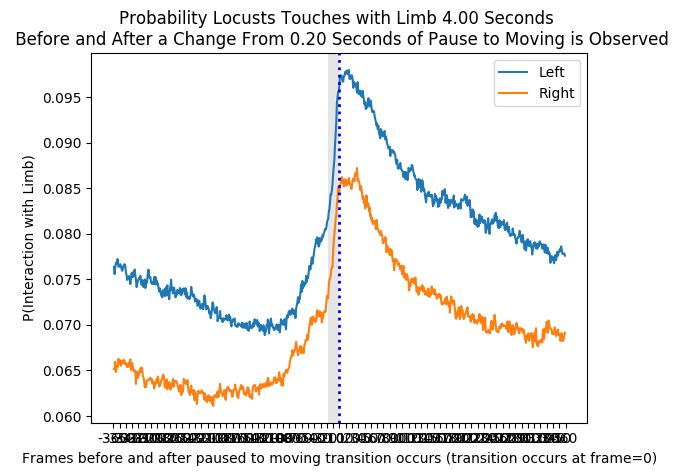



  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7609/323578 [00:00<00:04, 74625.78it/s]

  5%|▍         | 14702/323578 [00:00<00:04, 73124.21it/s]

  7%|▋         | 22878/323578 [00:00<00:04, 74867.92it/s]

 10%|▉         | 30859/323578 [00:00<00:03, 76036.65it/s]

 12%|█▏        | 40426/323578 [00:00<00:03, 81024.95it/s]

 15%|█▌        | 50001/323578 [00:00<00:03, 84834.39it/s]

 18%|█▊        | 59196/323578 [00:00<00:03, 86714.33it/s]

 21%|██        | 67346/323578 [00:00<00:03, 84379.57it/s]

 24%|██▍       | 78556/323578 [00:00<00:02, 90959.01it/s]

 27%|██▋       | 87553/323578 [00:01<00:02, 88963.52it/s]

0




 30%|██▉       | 96390/323578 [00:01<00:02, 87312.25it/s]

 34%|███▍      | 109222/323578 [00:01<00:02, 96569.99it/s]

 37%|███▋      | 119159/323578 [00:01<00:02, 85395.85it/s]

 40%|███▉      | 128132/323578 [00:01<00:02, 79868.21it/s]

 43%|████▎     | 140747/323578 [00:01<00:02, 89380.20it/s]

 46%|████▋     | 150315/323578 [00:01<00:02, 83619.49it/s]

 49%|████▉     | 159193/323578 [00:01<00:02, 71512.29it/s]

 54%|█████▎    | 173562/323578 [00:02<00:01, 84200.89it/s]

 57%|█████▋    | 184505/323578 [00:02<00:01, 90456.71it/s]

 60%|██████    | 194637/323578 [00:02<00:01, 91034.38it/s]

 64%|██████▍   | 206751/323578 [00:02<00:01, 98368.22it/s]

 69%|██████▉   | 224211/323578 [00:02<00:00, 113177.71it/s]

 73%|███████▎  | 236823/323578 [00:02<00:00, 106964.73it/s]

 80%|███████▉  | 258618/323578 [00:02<00:00, 126251.77it/s]

 84%|████████▍ | 273328/323578 [00:02<00:00, 122548.39it/s]

 89%|████████▊ | 287066/323578 [00:02<00:00, 106246.44it/s]

 92%|█████████▏| 299115/323578 [00

1




 60%|██████    | 195035/323578 [00:01<00:00, 220568.21it/s]

 67%|██████▋   | 217938/323578 [00:01<00:00, 174390.96it/s]

 73%|███████▎  | 237485/323578 [00:01<00:00, 177355.92it/s]

 80%|███████▉  | 258649/323578 [00:01<00:00, 185332.48it/s]

 87%|████████▋ | 280240/323578 [00:01<00:00, 193555.05it/s]

 94%|█████████▍| 303542/323578 [00:01<00:00, 203915.20it/s]

100%|██████████| 323578/323578 [00:01<00:00, 187044.33it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11880/323578 [00:00<00:02, 115894.39it/s]

  7%|▋         | 22970/323578 [00:00<00:02, 113568.47it/s]

 11%|█         | 34980/323578 [00:00<00:02, 114432.35it/s]

 14%|█▍        | 45387/323578 [00:00<00:02, 110802.91it/s]

 17%|█▋        | 53763/323578 [00:00<00:02, 101016.97it/s]

 20%|█▉        | 64297/323578 [00:00<00:02, 101947.68it/s]

 24%|██▍       | 78481/323578 [00:00<00:02, 111090.11it/s]

2




 28%|██▊       | 92048/323578 [00:00<00:01, 117474.52it/s]

 32%|███▏      | 104869/323578 [00:00<00:01, 120501.40it/s]

 36%|███▌      | 116705/323578 [00:01<00:01, 114084.59it/s]

 40%|███▉      | 128035/323578 [00:01<00:01, 103930.85it/s]

 43%|████▎     | 138548/323578 [00:01<00:01, 97629.84it/s] 

 46%|████▌     | 148698/323578 [00:01<00:01, 98759.02it/s]

 49%|████▉     | 158691/323578 [00:01<00:01, 92679.47it/s]

 52%|█████▏    | 168117/323578 [00:01<00:01, 88531.42it/s]

 55%|█████▌    | 178838/323578 [00:01<00:01, 92809.79it/s]

 58%|█████▊    | 188279/323578 [00:01<00:01, 86110.34it/s]

 61%|██████    | 197098/323578 [00:01<00:01, 82014.56it/s]

 65%|██████▍   | 208994/323578 [00:02<00:01, 90138.50it/s]

 68%|██████▊   | 218844/323578 [00:02<00:01, 92493.59it/s]

 71%|███████   | 230349/323578 [00:02<00:00, 97949.87it/s]

 75%|███████▍  | 241914/323578 [00:02<00:00, 102069.25it/s]

 78%|███████▊  | 252363/323578 [00:02<00:00, 100475.41it/s]

 81%|████████  | 262586/323578 [

3




 30%|██▉       | 95512/323578 [00:01<00:03, 74535.97it/s]

 33%|███▎      | 106936/323578 [00:01<00:02, 82735.47it/s]

 40%|████      | 130712/323578 [00:01<00:01, 102854.40it/s]

 45%|████▍     | 145277/323578 [00:01<00:01, 89170.57it/s] 

 49%|████▊     | 157514/323578 [00:01<00:01, 86861.40it/s]

 52%|█████▏    | 168538/323578 [00:01<00:01, 87455.48it/s]

 55%|█████▌    | 178921/323578 [00:02<00:01, 73099.61it/s]

 58%|█████▊    | 187775/323578 [00:02<00:02, 61414.13it/s]

 60%|██████    | 195315/323578 [00:02<00:02, 52689.81it/s]

 62%|██████▏   | 201780/323578 [00:02<00:02, 53432.09it/s]

 64%|██████▍   | 208125/323578 [00:02<00:02, 56088.41it/s]

 66%|██████▌   | 214357/323578 [00:02<00:01, 56317.44it/s]

 68%|██████▊   | 220425/323578 [00:02<00:01, 56661.23it/s]

 71%|███████   | 229905/323578 [00:03<00:01, 64388.76it/s]

 73%|███████▎  | 237635/323578 [00:03<00:01, 67465.48it/s]

 76%|███████▌  | 244823/323578 [00:03<00:01, 66287.65it/s]

 78%|███████▊  | 251765/323578 [00:03

4


 26%|██▌       | 84235/323578 [00:00<00:02, 86336.25it/s]

 29%|██▉       | 94099/323578 [00:01<00:02, 89581.01it/s]

 32%|███▏      | 103226/323578 [00:01<00:02, 87740.38it/s]

 35%|███▍      | 112336/323578 [00:01<00:02, 88721.24it/s]

 37%|███▋      | 121300/323578 [00:01<00:02, 85639.18it/s]

 41%|████      | 131681/323578 [00:01<00:02, 90384.83it/s]

 44%|████▍     | 142938/323578 [00:01<00:01, 95414.30it/s]

 48%|████▊     | 153745/323578 [00:01<00:01, 98662.59it/s]

 51%|█████     | 163778/323578 [00:01<00:01, 98937.39it/s]

 55%|█████▍    | 177429/323578 [00:01<00:01, 107305.09it/s]

 58%|█████▊    | 188437/323578 [00:01<00:01, 107848.13it/s]

 62%|██████▏   | 199417/323578 [00:02<00:01, 104450.70it/s]

 65%|██████▍   | 210155/323578 [00:02<00:01, 105311.71it/s]

 68%|██████▊   | 221198/323578 [00:02<00:00, 106066.83it/s]

 72%|███████▏  | 231886/323578 [00:02<00:00, 93263.48it/s] 

 75%|███████▍  | 241551/323578 [00:02<00:00, 89083.46it/s]

 77%|███████▋  | 250736/323578 [00:0

5




 29%|██▊       | 92730/323578 [00:01<00:02, 79223.04it/s]

 31%|███       | 100580/323578 [00:01<00:03, 73815.80it/s]

 33%|███▎      | 107985/323578 [00:01<00:03, 67493.13it/s]

 36%|███▌      | 115102/323578 [00:01<00:03, 68311.75it/s]

 38%|███▊      | 122021/323578 [00:01<00:02, 67815.08it/s]

 41%|████      | 131337/323578 [00:01<00:02, 73508.40it/s]

 43%|████▎     | 139168/323578 [00:01<00:02, 74885.76it/s]

 45%|████▌     | 146791/323578 [00:01<00:02, 73858.75it/s]

 48%|████▊     | 155181/323578 [00:02<00:02, 76153.60it/s]

 50%|█████     | 162883/323578 [00:02<00:02, 70512.17it/s]

 53%|█████▎    | 170956/323578 [00:02<00:02, 72786.79it/s]

 55%|█████▌    | 178354/323578 [00:02<00:02, 69091.73it/s]

 58%|█████▊    | 186416/323578 [00:02<00:01, 71745.58it/s]

 60%|██████    | 194195/323578 [00:02<00:01, 73059.96it/s]

 63%|██████▎   | 205385/323578 [00:02<00:01, 81550.81it/s]

 67%|██████▋   | 215318/323578 [00:02<00:01, 85804.70it/s]

 69%|██████▉   | 224220/323578 [00:02<0

6




 26%|██▌       | 84297/323578 [00:00<00:02, 92412.32it/s]

 29%|██▉       | 93407/323578 [00:01<00:02, 90245.01it/s]

 33%|███▎      | 105200/323578 [00:01<00:02, 96771.73it/s]

 36%|███▌      | 114954/323578 [00:01<00:02, 95540.08it/s]

 38%|███▊      | 124565/323578 [00:01<00:02, 89883.62it/s]

 41%|████▏     | 133662/323578 [00:01<00:02, 70713.78it/s]

 44%|████▍     | 143668/323578 [00:01<00:02, 77116.05it/s]

 47%|████▋     | 152051/323578 [00:01<00:02, 74512.24it/s]

 49%|████▉     | 159991/323578 [00:01<00:02, 72771.88it/s]

 52%|█████▏    | 167620/323578 [00:01<00:02, 71933.94it/s]

 55%|█████▌    | 178791/323578 [00:02<00:01, 80192.61it/s]

 58%|█████▊    | 187286/323578 [00:02<00:01, 80955.13it/s]

 60%|██████    | 195717/323578 [00:02<00:01, 78447.63it/s]

 64%|██████▎   | 205778/323578 [00:02<00:01, 83998.01it/s]

 66%|██████▋   | 214464/323578 [00:02<00:01, 84768.23it/s]

 69%|██████▉   | 223143/323578 [00:02<00:01, 74285.70it/s]

 71%|███████▏  | 230948/323578 [00:02<00

7


 18%|█▊        | 57643/323578 [00:00<00:04, 60876.64it/s]

 20%|██        | 65568/323578 [00:00<00:03, 65426.80it/s]

 23%|██▎       | 75465/323578 [00:01<00:03, 72441.10it/s]

 26%|██▌       | 84484/323578 [00:01<00:03, 76643.68it/s]

 29%|██▊       | 92801/323578 [00:01<00:02, 78491.03it/s]

 31%|███       | 100820/323578 [00:01<00:02, 77907.27it/s]

 34%|███▍      | 110225/323578 [00:01<00:02, 82136.20it/s]

 37%|███▋      | 118584/323578 [00:01<00:02, 81307.06it/s]

 41%|████      | 131358/323578 [00:01<00:02, 91258.21it/s]

 45%|████▌     | 145684/323578 [00:01<00:01, 102410.17it/s]

 48%|████▊     | 156699/323578 [00:01<00:01, 97514.28it/s] 

 52%|█████▏    | 167042/323578 [00:02<00:01, 81125.48it/s]

 55%|█████▌    | 178028/323578 [00:02<00:01, 87877.90it/s]

 59%|█████▉    | 191489/323578 [00:02<00:01, 98094.14it/s]

 62%|██████▏   | 202222/323578 [00:02<00:01, 95236.19it/s]

 66%|██████▌   | 212410/323578 [00:02<00:01, 91429.36it/s]

 69%|██████▊   | 222051/323578 [00:02<00:01

8




 22%|██▏       | 71024/323578 [00:00<00:02, 86129.04it/s]

 26%|██▌       | 83084/323578 [00:00<00:02, 94206.62it/s]

 29%|██▉       | 94955/323578 [00:01<00:02, 100339.92it/s]

 33%|███▎      | 107043/323578 [00:01<00:02, 105006.77it/s]

 38%|███▊      | 123814/323578 [00:01<00:01, 117669.00it/s]

 43%|████▎     | 137730/323578 [00:01<00:01, 123385.10it/s]

 47%|████▋     | 150589/323578 [00:01<00:01, 122503.22it/s]

 50%|█████     | 163205/323578 [00:01<00:01, 107215.43it/s]

 54%|█████▍    | 174528/323578 [00:01<00:01, 105132.73it/s]

 58%|█████▊    | 188654/323578 [00:01<00:01, 113869.26it/s]

 62%|██████▏   | 200552/323578 [00:01<00:01, 111086.30it/s]

 67%|██████▋   | 215970/323578 [00:02<00:00, 121253.32it/s]

 71%|███████   | 228633/323578 [00:02<00:00, 121110.41it/s]

 75%|███████▍  | 241120/323578 [00:02<00:00, 117934.22it/s]

 78%|███████▊  | 253195/323578 [00:02<00:00, 108694.27it/s]

 82%|████████▏ | 264405/323578 [00:02<00:00, 103532.43it/s]

 85%|████████▌ | 275048/323

9




 21%|██        | 68695/323578 [00:00<00:03, 77386.96it/s]

 24%|██▍       | 77691/323578 [00:00<00:03, 80772.89it/s]

 26%|██▋       | 85658/323578 [00:01<00:02, 80218.14it/s]

 29%|██▉       | 93603/323578 [00:01<00:02, 77982.43it/s]

 32%|███▏      | 104094/323578 [00:01<00:02, 84240.92it/s]

 35%|███▍      | 112635/323578 [00:01<00:02, 74865.14it/s]

 37%|███▋      | 120397/323578 [00:01<00:02, 72595.77it/s]

 40%|███▉      | 127864/323578 [00:01<00:02, 72349.57it/s]

 42%|████▏     | 137485/323578 [00:01<00:02, 78165.07it/s]

 45%|████▌     | 146171/323578 [00:01<00:02, 80584.54it/s]

 48%|████▊     | 155847/323578 [00:01<00:01, 84245.88it/s]

 51%|█████     | 164444/323578 [00:02<00:02, 74265.23it/s]

 54%|█████▎    | 173713/323578 [00:02<00:01, 78463.30it/s]

 57%|█████▋    | 183736/323578 [00:02<00:01, 83931.07it/s]

 60%|█████▉    | 192890/323578 [00:02<00:01, 86077.50it/s]

 62%|██████▏   | 201733/323578 [00:02<00:01, 77311.32it/s]

 66%|██████▌   | 212399/323578 [00:02<00:0

10




 34%|███▎      | 108841/323578 [00:01<00:02, 84679.56it/s]

 36%|███▋      | 117448/323578 [00:01<00:02, 78745.90it/s]

 41%|████      | 131472/323578 [00:01<00:02, 90673.33it/s]

 44%|████▎     | 141318/323578 [00:01<00:02, 87391.02it/s]

 47%|████▋     | 150628/323578 [00:01<00:02, 82932.22it/s]

 49%|████▉     | 159368/323578 [00:01<00:02, 77251.59it/s]

 52%|█████▏    | 167485/323578 [00:02<00:02, 77230.93it/s]

 55%|█████▌    | 178976/323578 [00:02<00:01, 85563.67it/s]

 58%|█████▊    | 188005/323578 [00:02<00:01, 84269.67it/s]

 61%|██████    | 198022/323578 [00:02<00:01, 88482.37it/s]

 64%|██████▍   | 207161/323578 [00:02<00:01, 72834.42it/s]

 66%|██████▋   | 215105/323578 [00:02<00:01, 69085.22it/s]

 69%|██████▉   | 223593/323578 [00:02<00:01, 72879.94it/s]

 72%|███████▏  | 231499/323578 [00:02<00:01, 74324.28it/s]

 74%|███████▍  | 239224/323578 [00:03<00:01, 63857.17it/s]

 77%|███████▋  | 247610/323578 [00:03<00:01, 68382.08it/s]

 80%|███████▉  | 258218/323578 [00:03<

11




 35%|███▍      | 112590/323578 [00:00<00:01, 131915.96it/s]

 40%|████      | 130158/323578 [00:01<00:01, 141619.16it/s]

 46%|████▌     | 147821/323578 [00:01<00:01, 150572.70it/s]

 51%|█████     | 164664/323578 [00:01<00:01, 135710.51it/s]

 59%|█████▉    | 190247/323578 [00:01<00:00, 157960.30it/s]

 64%|██████▍   | 208491/323578 [00:01<00:00, 137070.88it/s]

 69%|██████▉   | 224405/323578 [00:01<00:00, 118662.75it/s]

 74%|███████▎  | 238255/323578 [00:01<00:00, 112734.84it/s]

 78%|███████▊  | 250979/323578 [00:02<00:00, 101253.52it/s]

 81%|████████  | 262341/323578 [00:02<00:00, 98366.58it/s] 

 84%|████████▍ | 273061/323578 [00:02<00:00, 90652.34it/s]

 87%|████████▋ | 282864/323578 [00:02<00:00, 83303.41it/s]

 90%|█████████ | 291828/323578 [00:02<00:00, 81221.33it/s]

 93%|█████████▎| 302491/323578 [00:02<00:00, 87268.44it/s]

 96%|█████████▋| 311664/323578 [00:02<00:00, 87124.35it/s]

 99%|█████████▉| 320689/323578 [00:02<00:00, 88031.30it/s]

100%|██████████| 323578/3235

12




 27%|██▋       | 86084/323578 [00:00<00:02, 85624.58it/s]

 29%|██▉       | 94417/323578 [00:00<00:02, 80687.20it/s]

 33%|███▎      | 105479/323578 [00:01<00:02, 87261.63it/s]

 35%|███▌      | 114671/323578 [00:01<00:02, 88500.27it/s]

 38%|███▊      | 123584/323578 [00:01<00:02, 85882.35it/s]

 41%|████      | 132233/323578 [00:01<00:02, 85395.39it/s]

 45%|████▍     | 144427/323578 [00:01<00:01, 93210.01it/s]

 48%|████▊     | 154236/323578 [00:01<00:01, 94533.63it/s]

 51%|█████     | 163864/323578 [00:01<00:01, 82635.18it/s]

 54%|█████▍    | 175878/323578 [00:01<00:01, 91173.54it/s]

 57%|█████▋    | 185541/323578 [00:01<00:01, 89337.62it/s]

 60%|██████    | 194865/323578 [00:02<00:01, 87266.30it/s]

 63%|██████▎   | 204428/323578 [00:02<00:01, 89095.02it/s]

 66%|██████▌   | 214022/323578 [00:02<00:01, 90898.14it/s]

 71%|███████   | 230538/323578 [00:02<00:00, 105071.25it/s]

 75%|███████▍  | 241964/323578 [00:02<00:00, 106832.48it/s]

 80%|███████▉  | 257457/323578 [00:02<

13




 38%|███▊      | 121546/323578 [00:01<00:02, 78462.13it/s]

 40%|████      | 130497/323578 [00:01<00:02, 81331.03it/s]

 43%|████▎     | 138999/323578 [00:01<00:02, 80022.69it/s]

 46%|████▌     | 148833/323578 [00:01<00:02, 84757.75it/s]

 49%|████▊     | 157569/323578 [00:01<00:01, 84041.62it/s]

 51%|█████▏    | 166157/323578 [00:01<00:01, 81178.56it/s]

 55%|█████▍    | 177124/323578 [00:01<00:01, 87745.40it/s]

 58%|█████▊    | 187354/323578 [00:02<00:01, 91656.27it/s]

 61%|██████    | 196746/323578 [00:02<00:01, 87397.08it/s]

 64%|██████▎   | 205810/323578 [00:02<00:01, 87886.93it/s]

 67%|██████▋   | 215638/323578 [00:02<00:01, 90295.66it/s]

 69%|██████▉   | 224783/323578 [00:02<00:01, 84762.49it/s]

 72%|███████▏  | 233409/323578 [00:02<00:01, 79608.04it/s]

 80%|████████  | 258921/323578 [00:02<00:00, 100310.64it/s]

 86%|████████▋ | 279369/323578 [00:02<00:00, 118406.27it/s]

 94%|█████████▍| 305001/323578 [00:02<00:00, 141197.47it/s]

100%|██████████| 323578/323578 [00:

14


 32%|███▏      | 102680/323578 [00:01<00:02, 89463.39it/s]

 35%|███▍      | 112177/323578 [00:01<00:02, 89351.71it/s]

 38%|███▊      | 121498/323578 [00:01<00:02, 90425.54it/s]

 40%|████      | 130814/323578 [00:01<00:02, 87577.29it/s]

 44%|████▍     | 142327/323578 [00:01<00:01, 93990.11it/s]

 47%|████▋     | 152006/323578 [00:01<00:02, 75078.96it/s]

 50%|████▉     | 160314/323578 [00:01<00:02, 69878.31it/s]

 53%|█████▎    | 170561/323578 [00:02<00:01, 77248.99it/s]

 55%|█████▌    | 178970/323578 [00:02<00:01, 74387.09it/s]

 58%|█████▊    | 186910/323578 [00:02<00:01, 74801.50it/s]

 62%|██████▏   | 200046/323578 [00:02<00:01, 85896.60it/s]

 65%|██████▍   | 209469/323578 [00:02<00:01, 71495.74it/s]

 67%|██████▋   | 217607/323578 [00:02<00:01, 69367.90it/s]

 73%|███████▎  | 234742/323578 [00:02<00:01, 84445.35it/s]

 79%|███████▉  | 255055/323578 [00:02<00:00, 102392.72it/s]

 85%|████████▌ | 276410/323578 [00:02<00:00, 120871.01it/s]

 91%|█████████▏| 295861/323578 [00:03<

15




 25%|██▍       | 79424/323578 [00:00<00:02, 101640.72it/s]

 28%|██▊       | 91794/323578 [00:00<00:02, 107155.52it/s]

 32%|███▏      | 104278/323578 [00:01<00:01, 111911.25it/s]

 36%|███▌      | 115447/323578 [00:01<00:02, 96012.66it/s] 

 39%|███▉      | 126881/323578 [00:01<00:01, 100269.08it/s]

 43%|████▎     | 137871/323578 [00:01<00:01, 102976.22it/s]

 46%|████▌     | 148408/323578 [00:01<00:01, 96127.02it/s] 

 49%|████▉     | 160022/323578 [00:01<00:01, 100759.63it/s]

 53%|█████▎    | 170339/323578 [00:01<00:01, 95895.29it/s] 

 56%|█████▌    | 180891/323578 [00:01<00:01, 98503.39it/s]

 59%|█████▉    | 190912/323578 [00:01<00:01, 97306.71it/s]

 62%|██████▏   | 201812/323578 [00:02<00:01, 99805.17it/s]

 65%|██████▌   | 211894/323578 [00:02<00:01, 83580.04it/s]

 68%|██████▊   | 220770/323578 [00:02<00:01, 82752.60it/s]

 75%|███████▍  | 242552/323578 [00:02<00:00, 101664.58it/s]

 82%|████████▏ | 263850/323578 [00:02<00:00, 120569.44it/s]

 88%|████████▊ | 283699/32357

16




 24%|██▍       | 77888/323578 [00:01<00:03, 72407.00it/s]

 27%|██▋       | 87872/323578 [00:01<00:02, 78762.66it/s]

 30%|███       | 98156/323578 [00:01<00:02, 84712.02it/s]

 33%|███▎      | 106826/323578 [00:01<00:02, 82320.63it/s]

 36%|███▌      | 115722/323578 [00:01<00:02, 84204.65it/s]

 39%|███▉      | 125533/323578 [00:01<00:02, 87677.74it/s]

 42%|████▏     | 134442/323578 [00:01<00:02, 88096.09it/s]

 44%|████▍     | 143336/323578 [00:01<00:02, 83591.34it/s]

 47%|████▋     | 151803/323578 [00:01<00:02, 79467.19it/s]

 49%|████▉     | 159868/323578 [00:02<00:02, 75254.19it/s]

 52%|█████▏    | 167523/323578 [00:02<00:02, 70973.76it/s]

 55%|█████▌    | 178449/323578 [00:02<00:01, 79310.45it/s]

 58%|█████▊    | 186793/323578 [00:02<00:01, 72567.90it/s]

 60%|██████    | 195517/323578 [00:02<00:01, 76423.58it/s]

 63%|██████▎   | 203591/323578 [00:02<00:01, 77307.05it/s]

 65%|██████▌   | 211559/323578 [00:02<00:01, 72866.34it/s]

 68%|██████▊   | 219064/323578 [00:02<00:

17


 37%|███▋      | 121092/323578 [00:01<00:02, 89399.51it/s]

 40%|████      | 129973/323578 [00:01<00:02, 84031.94it/s]

 43%|████▎     | 138846/323578 [00:01<00:02, 85387.71it/s]

 46%|████▌     | 147408/323578 [00:01<00:02, 84299.29it/s]

 48%|████▊     | 155857/323578 [00:01<00:02, 81333.60it/s]

 51%|█████     | 164026/323578 [00:01<00:02, 77423.38it/s]

 53%|█████▎    | 172762/323578 [00:01<00:01, 79665.61it/s]

 56%|█████▌    | 180790/323578 [00:02<00:01, 76885.56it/s]

 58%|█████▊    | 188969/323578 [00:02<00:01, 78293.97it/s]

 61%|██████    | 197782/323578 [00:02<00:01, 81006.12it/s]

 64%|██████▍   | 207244/323578 [00:02<00:01, 84660.14it/s]

 67%|██████▋   | 216447/323578 [00:02<00:01, 86743.43it/s]

 70%|███████   | 226955/323578 [00:02<00:01, 91015.51it/s]

 74%|███████▎  | 237984/323578 [00:02<00:00, 95858.86it/s]

 77%|███████▋  | 247713/323578 [00:02<00:00, 90513.99it/s]

 80%|███████▉  | 258077/323578 [00:02<00:00, 93848.70it/s]

 83%|████████▎ | 269198/323578 [00:03<00

18




 44%|████▍     | 143058/323578 [00:00<00:01, 126544.60it/s]

 48%|████▊     | 155970/323578 [00:00<00:01, 122330.93it/s]

 52%|█████▏    | 168414/323578 [00:01<00:01, 105323.73it/s]

 55%|█████▌    | 179511/323578 [00:01<00:01, 100567.69it/s]

 59%|█████▉    | 190314/323578 [00:01<00:01, 102389.20it/s]

 62%|██████▏   | 200869/323578 [00:01<00:01, 98238.66it/s] 

 65%|██████▌   | 210950/323578 [00:01<00:01, 90852.81it/s]

 68%|██████▊   | 220326/323578 [00:01<00:01, 87297.28it/s]

 71%|███████   | 229289/323578 [00:01<00:01, 77735.92it/s]

 75%|███████▍  | 242247/323578 [00:01<00:00, 88339.01it/s]

 78%|███████▊  | 252851/323578 [00:02<00:00, 92995.53it/s]

 82%|████████▏ | 264110/323578 [00:02<00:00, 98111.42it/s]

 85%|████████▍ | 274859/323578 [00:02<00:00, 100747.95it/s]

 88%|████████▊ | 285292/323578 [00:02<00:00, 92608.18it/s] 

 91%|█████████ | 294933/323578 [00:02<00:00, 90603.82it/s]

 95%|█████████▍| 306167/323578 [00:02<00:00, 96186.09it/s]

 98%|█████████▊| 316264/323578

19




 13%|█▎        | 40468/323578 [00:00<00:05, 55538.10it/s]

 15%|█▌        | 49996/323578 [00:00<00:04, 63455.66it/s]

 18%|█▊        | 57722/323578 [00:00<00:03, 67048.94it/s]

 20%|█▉        | 64556/323578 [00:01<00:04, 62899.48it/s]

 22%|██▏       | 70989/323578 [00:01<00:04, 60112.96it/s]

 25%|██▍       | 79828/323578 [00:01<00:03, 66363.31it/s]

 27%|██▋       | 87299/323578 [00:01<00:03, 68343.39it/s]

 29%|██▉       | 94554/323578 [00:01<00:03, 68947.54it/s]

 32%|███▏      | 102153/323578 [00:01<00:03, 70918.94it/s]

 34%|███▍      | 109366/323578 [00:01<00:03, 65879.40it/s]

 36%|███▌      | 116111/323578 [00:01<00:03, 61507.37it/s]

 38%|███▊      | 122660/323578 [00:01<00:03, 62532.88it/s]

 40%|████      | 129944/323578 [00:02<00:02, 65205.19it/s]

 42%|████▏     | 136580/323578 [00:02<00:02, 65078.21it/s]

 45%|████▍     | 144528/323578 [00:02<00:02, 68818.86it/s]

 48%|████▊     | 154751/323578 [00:02<00:02, 75970.09it/s]

 50%|█████     | 162657/323578 [00:02<00:02, 6

20




 21%|██▏       | 69007/323578 [00:00<00:03, 77823.43it/s]

 24%|██▍       | 77984/323578 [00:01<00:03, 80913.04it/s]

 28%|██▊       | 90178/323578 [00:01<00:02, 89789.34it/s]

 31%|███       | 99369/323578 [00:01<00:02, 86583.81it/s]

 35%|███▍      | 112829/323578 [00:01<00:02, 96959.97it/s]

 38%|███▊      | 124304/323578 [00:01<00:01, 101124.10it/s]

 43%|████▎     | 138720/323578 [00:01<00:01, 110468.18it/s]

 46%|████▋     | 150313/323578 [00:01<00:01, 97466.02it/s] 

 50%|████▉     | 160722/323578 [00:01<00:01, 97794.07it/s]

 53%|█████▎    | 170966/323578 [00:01<00:01, 95845.48it/s]

 57%|█████▋    | 184300/323578 [00:02<00:01, 104675.14it/s]

 61%|██████    | 196670/323578 [00:02<00:01, 109738.37it/s]

 65%|██████▌   | 210704/323578 [00:02<00:00, 117164.58it/s]

 71%|███████   | 229605/323578 [00:02<00:00, 132244.95it/s]

 78%|███████▊  | 253342/323578 [00:02<00:00, 152507.11it/s]

 87%|████████▋ | 281858/323578 [00:02<00:00, 177242.19it/s]

 96%|█████████▌| 310607/323578 [0

21




 52%|█████▏    | 167303/323578 [00:01<00:01, 119322.97it/s]

 57%|█████▋    | 185025/323578 [00:01<00:01, 132287.50it/s]

 65%|██████▌   | 210880/323578 [00:01<00:00, 154994.66it/s]

 72%|███████▏  | 233100/323578 [00:01<00:00, 170460.83it/s]

 80%|███████▉  | 258443/323578 [00:01<00:00, 189024.95it/s]

 88%|████████▊ | 284576/323578 [00:01<00:00, 206133.46it/s]

 96%|█████████▌| 310797/323578 [00:02<00:00, 220264.45it/s]

100%|██████████| 323578/323578 [00:02<00:00, 153076.83it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9839/323578 [00:00<00:03, 97602.63it/s]

  5%|▍         | 15190/323578 [00:00<00:03, 77663.76it/s]

  8%|▊         | 25171/323578 [00:00<00:03, 83201.40it/s]

 10%|▉         | 32302/323578 [00:00<00:03, 78455.44it/s]

 12%|█▏        | 39557/323578 [00:00<00:03, 76543.10it/s]

 15%|█▌        | 48666/323578 [00:00<00:03, 79855.80it/s]

 17%|█▋        | 55768/323578 [00:00<00:03, 76283.88it/s]



22


 20%|█▉        | 64030/323578 [00:00<00:03, 77679.29it/s]

 23%|██▎       | 73610/323578 [00:00<00:03, 82351.83it/s]

 25%|██▌       | 82402/323578 [00:01<00:02, 83946.07it/s]

 28%|██▊       | 90660/323578 [00:01<00:02, 77663.11it/s]

 32%|███▏      | 103817/323578 [00:01<00:02, 88546.84it/s]

 35%|███▍      | 113199/323578 [00:01<00:02, 87980.39it/s]

 38%|███▊      | 122367/323578 [00:01<00:02, 75271.55it/s]

 40%|████      | 130474/323578 [00:01<00:02, 70230.73it/s]

 43%|████▎     | 139139/323578 [00:01<00:02, 74150.97it/s]

 46%|████▌     | 148366/323578 [00:01<00:02, 78417.24it/s]

 48%|████▊     | 156548/323578 [00:01<00:02, 78872.42it/s]

 51%|█████     | 164674/323578 [00:02<00:02, 76832.75it/s]

 53%|█████▎    | 172536/323578 [00:02<00:02, 72837.78it/s]

 57%|█████▋    | 183178/323578 [00:02<00:01, 79947.10it/s]

 59%|█████▉    | 191501/323578 [00:02<00:01, 78719.65it/s]

 62%|██████▏   | 201276/323578 [00:02<00:01, 83099.73it/s]

 65%|██████▍   | 209815/323578 [00:02<00:01,

23




 37%|███▋      | 120492/323578 [00:00<00:01, 141800.12it/s]

 42%|████▏     | 135516/323578 [00:01<00:01, 143944.41it/s]

 46%|████▋     | 149658/323578 [00:01<00:01, 137608.56it/s]

 50%|█████     | 163301/323578 [00:01<00:01, 121485.91it/s]

 54%|█████▍    | 175714/323578 [00:01<00:01, 118630.30it/s]

 58%|█████▊    | 187777/323578 [00:01<00:01, 112747.17it/s]

 62%|██████▏   | 199253/323578 [00:01<00:01, 108928.88it/s]

 65%|██████▍   | 210315/323578 [00:01<00:01, 105044.16it/s]

 69%|██████▊   | 221845/323578 [00:01<00:00, 107721.96it/s]

 73%|███████▎  | 235533/323578 [00:01<00:00, 114434.81it/s]

 76%|███████▋  | 247175/323578 [00:02<00:00, 113749.57it/s]

 82%|████████▏ | 264928/323578 [00:02<00:00, 127490.15it/s]

 86%|████████▌ | 278315/323578 [00:02<00:00, 126581.74it/s]

 90%|█████████ | 291421/323578 [00:02<00:00, 121861.49it/s]

 94%|█████████▍| 304503/323578 [00:02<00:00, 124416.70it/s]

 99%|█████████▉| 319869/323578 [00:02<00:00, 131950.07it/s]

100%|██████████| 32357

24




 41%|████      | 131226/323578 [00:01<00:02, 96148.17it/s]

 44%|████▎     | 141015/323578 [00:01<00:01, 92757.06it/s]

 46%|████▋     | 150439/323578 [00:01<00:01, 89577.08it/s]

 50%|████▉     | 161337/323578 [00:01<00:01, 94118.59it/s]

 53%|█████▎    | 170899/323578 [00:01<00:01, 93108.93it/s]

 56%|█████▌    | 180850/323578 [00:01<00:01, 94182.89it/s]

 59%|█████▉    | 190347/323578 [00:02<00:01, 82130.97it/s]

 62%|██████▏   | 199060/323578 [00:02<00:01, 82988.93it/s]

 64%|██████▍   | 208667/323578 [00:02<00:01, 86523.14it/s]

 67%|██████▋   | 217523/323578 [00:02<00:01, 79724.62it/s]

 70%|██████▉   | 225743/323578 [00:02<00:01, 72359.08it/s]

 72%|███████▏  | 233283/323578 [00:02<00:01, 72895.27it/s]

 75%|███████▍  | 241133/323578 [00:02<00:01, 74116.22it/s]

 77%|███████▋  | 248700/323578 [00:02<00:01, 73221.77it/s]

 80%|████████  | 259421/323578 [00:03<00:00, 80402.40it/s]

 83%|████████▎ | 267908/323578 [00:03<00:00, 81234.14it/s]

 85%|████████▌ | 276237/323578 [00:03<

25




 40%|████      | 130667/323578 [00:01<00:02, 88213.06it/s] 

 43%|████▎     | 140362/323578 [00:01<00:02, 88222.72it/s]

 46%|████▋     | 149796/323578 [00:01<00:01, 89471.60it/s]

 49%|████▉     | 159176/323578 [00:01<00:01, 83769.58it/s]

 53%|█████▎    | 170834/323578 [00:01<00:01, 90984.23it/s]

 56%|█████▋    | 182231/323578 [00:01<00:01, 96289.79it/s]

 59%|█████▉    | 192326/323578 [00:02<00:01, 97468.43it/s]

 65%|██████▍   | 208729/323578 [00:02<00:01, 110978.52it/s]

 68%|██████▊   | 220669/323578 [00:02<00:00, 108336.25it/s]

 72%|███████▏  | 232916/323578 [00:02<00:00, 111489.35it/s]

 76%|███████▌  | 246133/323578 [00:02<00:00, 116980.27it/s]

 81%|████████  | 261978/323578 [00:02<00:00, 126947.48it/s]

 87%|████████▋ | 281325/323578 [00:02<00:00, 141400.70it/s]

 94%|█████████▎| 302891/323578 [00:02<00:00, 157689.39it/s]

100%|██████████| 323578/323578 [00:02<00:00, 112775.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8155/323578 [00:00<00:03, 80

26


 24%|██▍       | 77676/323578 [00:01<00:03, 73717.99it/s]

 27%|██▋       | 88581/323578 [00:01<00:02, 81654.29it/s]

 31%|███       | 101039/323578 [00:01<00:02, 91067.19it/s]

 35%|███▌      | 114013/323578 [00:01<00:02, 99479.76it/s]

 41%|████      | 131129/323578 [00:01<00:01, 113773.33it/s]

 47%|████▋     | 153202/323578 [00:01<00:01, 133124.69it/s]

 54%|█████▍    | 176194/323578 [00:01<00:00, 152368.53it/s]

 63%|██████▎   | 203665/323578 [00:01<00:00, 175864.46it/s]

 72%|███████▏  | 232123/323578 [00:01<00:00, 198628.49it/s]

 81%|████████  | 261798/323578 [00:01<00:00, 220500.71it/s]

 90%|████████▉ | 290461/323578 [00:02<00:00, 236896.52it/s]

 99%|█████████▉| 321246/323578 [00:02<00:00, 254491.36it/s]

100%|██████████| 323578/323578 [00:02<00:00, 151175.04it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12499/323578 [00:00<00:02, 124679.48it/s]

  7%|▋         | 24218/323578 [00:00<00:02, 121191.37it/s]

 11%|█         | 34610/323578 [00:00<00:02, 11515

27




 44%|████▍     | 143440/323578 [00:01<00:01, 95425.16it/s]

 52%|█████▏    | 167882/323578 [00:01<00:01, 116781.34it/s]

 60%|█████▉    | 192842/323578 [00:01<00:00, 138964.90it/s]

 68%|██████▊   | 219499/323578 [00:01<00:00, 162267.78it/s]

 76%|███████▋  | 246888/323578 [00:01<00:00, 184853.20it/s]

 85%|████████▌ | 276197/323578 [00:01<00:00, 207883.32it/s]

 93%|█████████▎| 301028/323578 [00:02<00:00, 214057.35it/s]

100%|██████████| 323578/323578 [00:02<00:00, 148851.56it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8530/323578 [00:00<00:03, 82667.87it/s]

  6%|▋         | 20327/323578 [00:00<00:03, 90588.17it/s]

  9%|▉         | 28621/323578 [00:00<00:03, 87514.23it/s]

 11%|█▏        | 36979/323578 [00:00<00:03, 85955.15it/s]

 14%|█▍        | 45768/323578 [00:00<00:03, 86525.89it/s]

 17%|█▋        | 54938/323578 [00:00<00:03, 88015.42it/s]

 19%|█▉        | 62840/323578 [00:00<00:03, 84472.70it/s]

 22%|██▏       | 70721/323578 [00:00<00:03, 82055.14it/

28




 40%|███▉      | 128920/323578 [00:01<00:01, 106246.10it/s]

 43%|████▎     | 140497/323578 [00:01<00:01, 98125.79it/s] 

 47%|████▋     | 151099/323578 [00:01<00:01, 90253.80it/s]

 50%|████▉     | 160802/323578 [00:01<00:01, 82388.35it/s]

 52%|█████▏    | 169648/323578 [00:01<00:01, 82226.46it/s]

 55%|█████▌    | 178296/323578 [00:01<00:01, 81576.06it/s]

 58%|█████▊    | 186753/323578 [00:02<00:01, 74705.43it/s]

 60%|██████    | 195635/323578 [00:02<00:01, 78067.36it/s]

 64%|██████▍   | 206843/323578 [00:02<00:01, 85670.27it/s]

 67%|██████▋   | 215819/323578 [00:02<00:01, 78670.15it/s]

 69%|██████▉   | 224085/323578 [00:02<00:01, 76440.50it/s]

 72%|███████▏  | 232022/323578 [00:02<00:01, 69909.10it/s]

 74%|███████▍  | 240000/323578 [00:02<00:01, 72025.54it/s]

 78%|███████▊  | 252734/323578 [00:02<00:00, 82817.65it/s]

 81%|████████  | 261761/323578 [00:03<00:00, 80745.43it/s]

 84%|████████▍ | 272669/323578 [00:03<00:00, 87569.20it/s]

 88%|████████▊ | 285787/323578 [00:0

29




 32%|███▏      | 102030/323578 [00:01<00:02, 85444.21it/s]

 34%|███▍      | 110682/323578 [00:01<00:02, 84945.85it/s]

 37%|███▋      | 119313/323578 [00:01<00:02, 84937.24it/s]

 40%|████      | 130256/323578 [00:01<00:02, 91050.63it/s]

 44%|████▍     | 141671/323578 [00:01<00:01, 96934.99it/s]

 47%|████▋     | 151555/323578 [00:01<00:01, 91629.46it/s]

 50%|████▉     | 160912/323578 [00:01<00:01, 91706.49it/s]

 53%|█████▎    | 171298/323578 [00:01<00:01, 94791.88it/s]

 56%|█████▌    | 181397/323578 [00:02<00:01, 96059.87it/s]

 59%|█████▉    | 191092/323578 [00:02<00:01, 92844.40it/s]

 62%|██████▏   | 201267/323578 [00:02<00:01, 95307.82it/s]

 65%|██████▌   | 210962/323578 [00:02<00:01, 95138.80it/s]

 68%|██████▊   | 220530/323578 [00:02<00:01, 93918.33it/s]

 71%|███████   | 229963/323578 [00:02<00:01, 93200.06it/s]

 74%|███████▍  | 240953/323578 [00:02<00:00, 97650.90it/s]

 78%|███████▊  | 252024/323578 [00:02<00:00, 101232.90it/s]

 82%|████████▏ | 265609/323578 [00:02

30




 38%|███▊      | 121794/323578 [00:01<00:01, 104915.70it/s]

 41%|████      | 132629/323578 [00:01<00:02, 91293.44it/s] 

 44%|████▍     | 142555/323578 [00:01<00:01, 93545.03it/s]

 47%|████▋     | 152955/323578 [00:01<00:01, 96259.72it/s]

 50%|█████     | 162884/323578 [00:01<00:01, 95032.19it/s]

 53%|█████▎    | 172603/323578 [00:01<00:01, 90499.45it/s]

 56%|█████▋    | 182390/323578 [00:01<00:01, 92407.61it/s]

 59%|█████▉    | 191778/323578 [00:01<00:01, 88526.41it/s]

 64%|██████▍   | 208065/323578 [00:01<00:01, 102310.12it/s]

 69%|██████▉   | 223822/323578 [00:02<00:00, 114098.77it/s]

 73%|███████▎  | 236284/323578 [00:02<00:00, 101783.47it/s]

 76%|███████▋  | 247447/323578 [00:02<00:00, 87244.34it/s] 

 81%|████████  | 261336/323578 [00:02<00:00, 97754.48it/s]

 84%|████████▍ | 272259/323578 [00:02<00:00, 98657.54it/s]

 89%|████████▉ | 287965/323578 [00:02<00:00, 111044.86it/s]

 96%|█████████▌| 309952/323578 [00:02<00:00, 130051.41it/s]

100%|██████████| 323578/323578

31




 34%|███▍      | 110895/323578 [00:01<00:03, 56664.96it/s]

 36%|███▌      | 116884/323578 [00:01<00:03, 55500.65it/s]

 39%|███▉      | 126423/323578 [00:01<00:03, 63461.76it/s]

 41%|████▏     | 133700/323578 [00:01<00:02, 65664.01it/s]

 43%|████▎     | 140680/323578 [00:01<00:02, 66540.55it/s]

 46%|████▌     | 147626/323578 [00:02<00:02, 65458.14it/s]

 48%|████▊     | 155067/323578 [00:02<00:02, 67907.53it/s]

 50%|█████     | 162027/323578 [00:02<00:02, 65905.10it/s]

 52%|█████▏    | 168749/323578 [00:02<00:02, 64299.13it/s]

 55%|█████▍    | 176767/323578 [00:02<00:02, 68360.76it/s]

 58%|█████▊    | 187146/323578 [00:02<00:01, 76159.86it/s]

 60%|██████    | 195144/323578 [00:02<00:01, 67516.84it/s]

 63%|██████▎   | 202344/323578 [00:02<00:01, 67302.10it/s]

 65%|██████▍   | 209388/323578 [00:02<00:01, 61771.80it/s]

 67%|██████▋   | 217099/323578 [00:03<00:01, 65398.06it/s]

 69%|██████▉   | 224858/323578 [00:03<00:01, 68379.06it/s]

 72%|███████▏  | 231923/323578 [00:03<

32




 80%|███████▉  | 258587/323578 [00:01<00:00, 267414.12it/s]

 88%|████████▊ | 285816/323578 [00:01<00:00, 264593.29it/s]

 97%|█████████▋| 312894/323578 [00:01<00:00, 266417.43it/s]

100%|██████████| 323578/323578 [00:01<00:00, 260131.23it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11434/323578 [00:00<00:02, 113710.33it/s]

  6%|▋         | 20821/323578 [00:00<00:02, 106929.98it/s]

 10%|▉         | 31323/323578 [00:00<00:02, 106349.07it/s]

 12%|█▏        | 38162/323578 [00:00<00:03, 90953.78it/s] 

 14%|█▍        | 46802/323578 [00:00<00:03, 89303.39it/s]

 17%|█▋        | 54129/323578 [00:00<00:03, 80369.82it/s]

 20%|██        | 65673/323578 [00:00<00:02, 88036.38it/s]

 26%|██▌       | 83459/323578 [00:00<00:02, 103557.03it/s]

 29%|██▉       | 94586/323578 [00:00<00:02, 93458.63it/s] 

33




 34%|███▍      | 111523/323578 [00:01<00:01, 107584.61it/s]

 39%|███▊      | 124717/323578 [00:01<00:01, 113890.36it/s]

 46%|████▌     | 148625/323578 [00:01<00:01, 135115.04it/s]

 54%|█████▍    | 174757/323578 [00:01<00:00, 158007.41it/s]

 62%|██████▏   | 202127/323578 [00:01<00:00, 180601.86it/s]

 71%|███████   | 228983/323578 [00:01<00:00, 200279.88it/s]

 80%|███████▉  | 258020/323578 [00:01<00:00, 220833.08it/s]

 88%|████████▊ | 285975/323578 [00:01<00:00, 235682.14it/s]

 98%|█████████▊| 315732/323578 [00:01<00:00, 251364.35it/s]

100%|██████████| 323578/323578 [00:01<00:00, 170613.95it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10036/323578 [00:00<00:03, 97401.34it/s]

  6%|▌         | 19680/323578 [00:00<00:03, 96737.72it/s]

  9%|▉         | 28345/323578 [00:00<00:03, 93028.53it/s]

 11%|█▏        | 36838/323578 [00:00<00:03, 89633.62it/s]

 14%|█▍        | 45974/323578 [00:00<00:03, 90128.39it/s]

 18%|█▊        | 58760/323578 [00:00<00:02, 98881

34




 35%|███▍      | 113029/323578 [00:01<00:02, 86370.10it/s]

 38%|███▊      | 123288/323578 [00:01<00:02, 90670.17it/s]

 41%|████      | 133175/323578 [00:01<00:02, 92465.57it/s]

 44%|████▍     | 142452/323578 [00:01<00:02, 79570.47it/s]

 48%|████▊     | 154697/323578 [00:01<00:01, 88910.75it/s]

 53%|█████▎    | 171496/323578 [00:01<00:01, 103282.47it/s]

 60%|█████▉    | 193785/323578 [00:01<00:01, 123099.80it/s]

 67%|██████▋   | 218193/323578 [00:02<00:00, 144601.60it/s]

 76%|███████▌  | 245181/323578 [00:02<00:00, 167130.57it/s]

 84%|████████▎ | 270488/323578 [00:02<00:00, 185255.66it/s]

 90%|█████████ | 292113/323578 [00:02<00:00, 169979.63it/s]

 97%|█████████▋| 315072/323578 [00:02<00:00, 184337.19it/s]

100%|██████████| 323578/323578 [00:02<00:00, 129315.27it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 5660/323578 [00:00<00:05, 56598.43it/s]

  3%|▎         | 11022/323578 [00:00<00:05, 55670.33it/s]

  6%|▌         | 17877/323578 [00:00<00:05, 58812

35




 31%|███▏      | 101287/323578 [00:01<00:03, 65355.54it/s]

 33%|███▎      | 107931/323578 [00:01<00:03, 65604.98it/s]

 36%|███▌      | 115861/323578 [00:01<00:03, 68913.59it/s]

 38%|███▊      | 122822/323578 [00:01<00:03, 65813.94it/s]

 40%|████      | 129482/323578 [00:02<00:03, 61104.51it/s]

 43%|████▎     | 138203/323578 [00:02<00:02, 67132.97it/s]

 45%|████▍     | 145182/323578 [00:02<00:02, 66462.42it/s]

 48%|████▊     | 153997/323578 [00:02<00:02, 71387.29it/s]

 50%|████▉     | 161370/323578 [00:02<00:02, 66811.39it/s]

 52%|█████▏    | 169616/323578 [00:02<00:02, 70344.02it/s]

 55%|█████▍    | 176857/323578 [00:02<00:02, 70138.74it/s]

 57%|█████▋    | 184337/323578 [00:02<00:01, 70456.99it/s]

 60%|█████▉    | 193095/323578 [00:02<00:01, 74738.71it/s]

 63%|██████▎   | 202704/323578 [00:02<00:01, 80060.24it/s]

 66%|██████▌   | 212830/323578 [00:03<00:01, 85425.20it/s]

 68%|██████▊   | 221616/323578 [00:03<00:01, 70958.70it/s]

 72%|███████▏  | 231983/323578 [00:03<

36




 99%|█████████▊| 319156/323578 [00:01<00:00, 240474.78it/s]

100%|██████████| 323578/323578 [00:01<00:00, 219646.00it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10363/323578 [00:00<00:03, 101570.98it/s]

  6%|▌         | 18379/323578 [00:00<00:03, 94035.76it/s] 

  9%|▉         | 29251/323578 [00:00<00:03, 97668.92it/s]

 13%|█▎        | 43217/323578 [00:00<00:02, 107088.09it/s]

 18%|█▊        | 59805/323578 [00:00<00:02, 119290.35it/s]

 23%|██▎       | 74942/323578 [00:00<00:01, 127389.10it/s]

 32%|███▏      | 102748/323578 [00:00<00:01, 152117.02it/s]

 39%|███▉      | 125714/323578 [00:00<00:01, 169261.90it/s]

 48%|████▊     | 153897/323578 [00:00<00:00, 192303.94it/s]

 57%|█████▋    | 183482/323578 [00:01<00:00, 214862.98it/s]

 66%|██████▌   | 212477/323578 [00:01<00:00, 232960.67it/s]

 74%|███████▍  | 240201/323578 [00:01<00:00, 244682.80it/s]

 84%|████████▍ | 271256/323578 [00:01<00:00, 261308.80it/s]

 93%|█████████▎| 302296/323578 [00:01<00:00, 2

37




100%|██████████| 323578/323578 [00:01<00:00, 218655.51it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14291/323578 [00:00<00:02, 139427.04it/s]

  8%|▊         | 27344/323578 [00:00<00:02, 136632.25it/s]

 12%|█▏        | 38569/323578 [00:00<00:02, 128085.75it/s]

 14%|█▍        | 46713/323578 [00:00<00:02, 108274.88it/s]

 17%|█▋        | 54801/323578 [00:00<00:03, 82724.07it/s] 

 20%|█▉        | 63832/323578 [00:00<00:03, 84249.01it/s]

 22%|██▏       | 72502/323578 [00:00<00:02, 84441.66it/s]

 26%|██▋       | 85062/323578 [00:00<00:02, 93214.91it/s]

 30%|███       | 97651/323578 [00:00<00:02, 100514.74it/s]

 33%|███▎      | 107822/323578 [00:01<00:02, 99370.46it/s]

 37%|███▋      | 118538/323578 [00:01<00:02, 101584.90it/s]

 40%|███▉      | 128770/323578 [00:01<00:02, 93243.45it/s] 

38




 43%|████▎     | 138280/323578 [00:01<00:02, 81653.31it/s]

 46%|████▌     | 149587/323578 [00:01<00:01, 89078.01it/s]

 49%|████▉     | 158968/323578 [00:01<00:01, 88018.43it/s]

 52%|█████▏    | 168104/323578 [00:01<00:01, 87390.62it/s]

 55%|█████▍    | 177779/323578 [00:01<00:01, 90002.46it/s]

 59%|█████▉    | 192053/323578 [00:01<00:01, 100923.30it/s]

 63%|██████▎   | 203809/323578 [00:02<00:01, 104752.93it/s]

 66%|██████▋   | 214714/323578 [00:02<00:01, 102653.93it/s]

 70%|██████▉   | 225290/323578 [00:02<00:01, 91808.66it/s] 

 73%|███████▎  | 236720/323578 [00:02<00:00, 96939.99it/s]

 76%|███████▋  | 246976/323578 [00:02<00:00, 98181.73it/s]

 82%|████████▏ | 263927/323578 [00:02<00:00, 112366.45it/s]

 85%|████████▌ | 276074/323578 [00:02<00:00, 110302.11it/s]

 92%|█████████▏| 296314/323578 [00:02<00:00, 127739.37it/s]

 96%|█████████▌| 310559/323578 [00:02<00:00, 127343.77it/s]

100%|██████████| 323578/323578 [00:03<00:00, 106272.36it/s]

  0%|          | 0/323578 [00

39




 34%|███▎      | 108933/323578 [00:01<00:02, 73801.92it/s]

 36%|███▌      | 116616/323578 [00:01<00:02, 74141.67it/s]

 38%|███▊      | 124242/323578 [00:01<00:02, 74080.12it/s]

 41%|████      | 132136/323578 [00:01<00:02, 75461.65it/s]

 43%|████▎     | 139793/323578 [00:01<00:02, 73216.93it/s]

 46%|████▌     | 147534/323578 [00:01<00:02, 74426.03it/s]

 48%|████▊     | 155046/323578 [00:01<00:02, 71953.90it/s]

 50%|█████     | 162308/323578 [00:01<00:02, 68107.80it/s]

 53%|█████▎    | 171659/323578 [00:02<00:02, 74149.81it/s]

 55%|█████▌    | 179475/323578 [00:02<00:01, 74854.16it/s]

 58%|█████▊    | 187511/323578 [00:02<00:01, 76424.38it/s]

 60%|██████    | 195271/323578 [00:02<00:01, 71400.30it/s]

 63%|██████▎   | 203853/323578 [00:02<00:01, 75189.77it/s]

 66%|██████▌   | 213608/323578 [00:02<00:01, 80366.04it/s]

 69%|██████▉   | 222688/323578 [00:02<00:01, 82700.98it/s]

 74%|███████▍  | 240994/323578 [00:02<00:00, 98979.75it/s]

 80%|████████  | 259747/323578 [00:02<

40




 15%|█▌        | 49291/323578 [00:00<00:03, 79402.29it/s]

 18%|█▊        | 57802/323578 [00:00<00:03, 80415.15it/s]

 20%|██        | 65182/323578 [00:00<00:03, 74911.44it/s]

 23%|██▎       | 74503/323578 [00:00<00:03, 79341.81it/s]

 26%|██▌       | 83180/323578 [00:00<00:02, 81044.96it/s]

 28%|██▊       | 91154/323578 [00:01<00:02, 78432.86it/s]

 31%|███       | 98924/323578 [00:01<00:02, 78031.46it/s]

 33%|███▎      | 106677/323578 [00:01<00:02, 76523.92it/s]

 35%|███▌      | 114301/323578 [00:01<00:03, 69405.38it/s]

 38%|███▊      | 121349/323578 [00:01<00:03, 61139.10it/s]

 39%|███▉      | 127718/323578 [00:01<00:03, 53122.55it/s]

 41%|████      | 133397/323578 [00:01<00:03, 52218.81it/s]

 43%|████▎     | 139524/323578 [00:01<00:03, 54217.82it/s]

 45%|████▌     | 146852/323578 [00:02<00:03, 58806.60it/s]

 48%|████▊     | 153830/323578 [00:02<00:02, 61718.08it/s]

 50%|████▉     | 160218/323578 [00:02<00:03, 53144.41it/s]

 51%|█████▏    | 165894/323578 [00:02<00:03, 

41




 29%|██▉       | 94485/323578 [00:01<00:02, 80119.44it/s]

 32%|███▏      | 102879/323578 [00:01<00:02, 81137.57it/s]

 35%|███▌      | 114268/323578 [00:01<00:02, 88798.53it/s]

 39%|███▊      | 124648/323578 [00:01<00:02, 92822.95it/s]

 41%|████▏     | 134124/323578 [00:01<00:02, 86446.94it/s]

 44%|████▍     | 142993/323578 [00:01<00:02, 85654.72it/s]

 47%|████▋     | 151717/323578 [00:01<00:02, 85518.10it/s]

 50%|████▉     | 160380/323578 [00:01<00:01, 83569.00it/s]

 52%|█████▏    | 168825/323578 [00:02<00:02, 76575.71it/s]

 55%|█████▍    | 176716/323578 [00:02<00:01, 77149.77it/s]

 57%|█████▋    | 184555/323578 [00:02<00:01, 71878.03it/s]

 59%|█████▉    | 191902/323578 [00:02<00:01, 70498.42it/s]

 62%|██████▏   | 200245/323578 [00:02<00:01, 73807.34it/s]

 64%|██████▍   | 207749/323578 [00:02<00:01, 73030.53it/s]

 66%|██████▋   | 215140/323578 [00:02<00:01, 70001.50it/s]

 69%|██████▉   | 223193/323578 [00:02<00:01, 72858.74it/s]

 71%|███████▏  | 230571/323578 [00:02<0

42




 27%|██▋       | 88838/323578 [00:00<00:02, 97292.26it/s]

 30%|███       | 98672/323578 [00:01<00:02, 95015.19it/s]

 33%|███▎      | 108373/323578 [00:01<00:02, 95604.93it/s]

 36%|███▋      | 117994/323578 [00:01<00:02, 84870.77it/s]

 40%|███▉      | 128427/323578 [00:01<00:02, 89900.81it/s]

 43%|████▎     | 137684/323578 [00:01<00:02, 86348.44it/s]

 47%|████▋     | 152498/323578 [00:01<00:01, 98698.92it/s]

 53%|█████▎    | 170604/323578 [00:01<00:01, 114296.12it/s]

 57%|█████▋    | 183484/323578 [00:01<00:01, 116039.23it/s]

 61%|██████    | 198080/323578 [00:01<00:01, 123642.37it/s]

 67%|██████▋   | 217741/323578 [00:02<00:00, 138506.07it/s]

 72%|███████▏  | 232768/323578 [00:02<00:00, 114125.62it/s]

 76%|███████▌  | 245714/323578 [00:02<00:00, 107571.94it/s]

 80%|███████▉  | 257622/323578 [00:02<00:00, 100145.32it/s]

 83%|████████▎ | 268545/323578 [00:02<00:00, 100122.86it/s]

 86%|████████▋ | 279194/323578 [00:02<00:00, 101385.87it/s]

 90%|████████▉ | 289782/323578 

43




 94%|█████████▍| 304641/323578 [00:01<00:00, 215185.24it/s]

100%|██████████| 323578/323578 [00:01<00:00, 207447.61it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 12332/323578 [00:00<00:02, 123319.82it/s]

  7%|▋         | 21799/323578 [00:00<00:02, 113003.10it/s]

 10%|█         | 33067/323578 [00:00<00:02, 112905.04it/s]

 15%|█▌        | 49420/323578 [00:00<00:02, 124463.74it/s]

 21%|██▏       | 68925/323578 [00:00<00:01, 139620.89it/s]

 25%|██▌       | 82400/323578 [00:00<00:01, 138122.17it/s]

 31%|███       | 99231/323578 [00:00<00:01, 144876.36it/s]

 35%|███▍      | 113241/323578 [00:00<00:01, 133577.96it/s]

 40%|███▉      | 129414/323578 [00:00<00:01, 140382.64it/s]

 44%|████▍     | 143432/323578 [00:01<00:01, 126309.31it/s]

 49%|████▉     | 157753/323578 [00:01<00:01, 130476.60it/s]

44




 53%|█████▎    | 171012/323578 [00:01<00:01, 93539.41it/s] 

 56%|█████▌    | 181984/323578 [00:01<00:01, 88315.50it/s]

 59%|█████▉    | 192008/323578 [00:01<00:01, 85559.66it/s]

 65%|██████▍   | 209621/323578 [00:01<00:01, 100933.00it/s]

 68%|██████▊   | 221422/323578 [00:01<00:00, 102525.62it/s]

 72%|███████▏  | 232876/323578 [00:02<00:00, 93616.25it/s] 

 75%|███████▌  | 243229/323578 [00:02<00:00, 80491.85it/s]

 78%|███████▊  | 253122/323578 [00:02<00:00, 84576.75it/s]

 82%|████████▏ | 264782/323578 [00:02<00:00, 91823.08it/s]

 85%|████████▍ | 274683/323578 [00:02<00:00, 90145.47it/s]

 89%|████████▊ | 286445/323578 [00:02<00:00, 96779.29it/s]

 93%|█████████▎| 300227/323578 [00:02<00:00, 105794.82it/s]

 96%|█████████▌| 311403/323578 [00:02<00:00, 101456.37it/s]

100%|██████████| 323578/323578 [00:02<00:00, 110786.39it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23284/323578 [00:00<00:01, 232837.45it/s]

 14%|█▍        | 44721/323578 [00:00<00:01, 226

45




 74%|███████▎  | 237832/323578 [00:01<00:00, 176692.42it/s]

 83%|████████▎ | 267301/323578 [00:01<00:00, 200814.44it/s]

 92%|█████████▏| 297143/323578 [00:01<00:00, 222662.55it/s]

100%|██████████| 323578/323578 [00:01<00:00, 186718.70it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 10426/323578 [00:00<00:03, 104259.11it/s]

  7%|▋         | 23708/323578 [00:00<00:02, 111447.93it/s]

46




 11%|█         | 34329/323578 [00:00<00:02, 108823.03it/s]

 15%|█▍        | 47935/323578 [00:00<00:02, 115775.71it/s]

 19%|█▉        | 63086/323578 [00:00<00:02, 124085.80it/s]

 24%|██▎       | 76125/323578 [00:00<00:01, 125911.79it/s]

 29%|██▊       | 92749/323578 [00:00<00:01, 135012.82it/s]

 34%|███▎      | 108945/323578 [00:00<00:01, 142105.12it/s]

 40%|████      | 129795/323578 [00:00<00:01, 157114.15it/s]

 45%|████▌     | 145813/323578 [00:01<00:01, 143259.23it/s]

 50%|████▉     | 160590/323578 [00:01<00:01, 104214.76it/s]

 53%|█████▎    | 172845/323578 [00:01<00:01, 108209.34it/s]

 61%|██████    | 197780/323578 [00:01<00:00, 129934.80it/s]

 66%|██████▌   | 213614/323578 [00:01<00:00, 134134.83it/s]

 71%|███████   | 229051/323578 [00:01<00:00, 116081.38it/s]

 75%|███████▍  | 242507/323578 [00:01<00:00, 105351.72it/s]

 79%|███████▊  | 254526/323578 [00:02<00:00, 99002.95it/s] 

 82%|████████▏ | 265913/323578 [00:02<00:00, 103038.25it/s]

 86%|████████▌ | 278575/323

47




 94%|█████████▎| 303066/323578 [00:01<00:00, 102235.26it/s]

 98%|█████████▊| 316922/323578 [00:01<00:00, 97582.77it/s] 

100%|██████████| 323578/323578 [00:02<00:00, 159765.85it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9609/323578 [00:00<00:03, 93245.57it/s]

  6%|▌         | 19412/323578 [00:00<00:03, 93816.09it/s]

  9%|▊         | 28076/323578 [00:00<00:03, 91540.46it/s]

 11%|█         | 34623/323578 [00:00<00:03, 81771.69it/s]

 13%|█▎        | 40943/323578 [00:00<00:03, 74557.43it/s]

 15%|█▌        | 48727/323578 [00:00<00:03, 75238.85it/s]

 17%|█▋        | 55342/323578 [00:00<00:03, 71541.19it/s]

 20%|█▉        | 63982/323578 [00:00<00:03, 75432.37it/s]

 23%|██▎       | 75529/323578 [00:00<00:02, 84189.80it/s]

 26%|██▌       | 84669/323578 [00:01<00:02, 86230.31it/s]

48




 29%|██▉       | 93355/323578 [00:01<00:02, 81328.15it/s]

 31%|███▏      | 101589/323578 [00:01<00:03, 72514.31it/s]

 34%|███▎      | 109090/323578 [00:01<00:03, 67992.63it/s]

 36%|███▌      | 116121/323578 [00:01<00:03, 67103.96it/s]

 38%|███▊      | 122997/323578 [00:01<00:03, 59327.89it/s]

 40%|███▉      | 129211/323578 [00:01<00:03, 58242.33it/s]

 42%|████▏     | 135705/323578 [00:01<00:03, 59985.49it/s]

 45%|████▍     | 144886/323578 [00:01<00:02, 66946.90it/s]

 47%|████▋     | 151947/323578 [00:02<00:02, 65896.21it/s]

 49%|████▉     | 159687/323578 [00:02<00:02, 68642.38it/s]

 52%|█████▏    | 168157/323578 [00:02<00:02, 72223.38it/s]

 54%|█████▍    | 175578/323578 [00:02<00:02, 72492.93it/s]

 57%|█████▋    | 184571/323578 [00:02<00:01, 76461.82it/s]

 59%|█████▉    | 192373/323578 [00:02<00:01, 67532.15it/s]

 62%|██████▏   | 200260/323578 [00:02<00:01, 70158.31it/s]

 64%|██████▍   | 207946/323578 [00:02<00:01, 71719.04it/s]

 67%|██████▋   | 215292/323578 [00:02<0

49




 32%|███▏      | 103667/323578 [00:01<00:02, 92106.15it/s]

 35%|███▌      | 113481/323578 [00:01<00:02, 93308.21it/s]

 38%|███▊      | 123781/323578 [00:01<00:02, 96017.93it/s]

 42%|████▏     | 134730/323578 [00:01<00:01, 99531.47it/s]

 45%|████▍     | 144795/323578 [00:01<00:01, 99471.87it/s]

 48%|████▊     | 154821/323578 [00:01<00:01, 92362.78it/s]

 51%|█████     | 164214/323578 [00:01<00:01, 90236.96it/s]

 54%|█████▎    | 173358/323578 [00:01<00:01, 79886.78it/s]

 56%|█████▌    | 181650/323578 [00:01<00:01, 79780.99it/s]

 60%|█████▉    | 193511/323578 [00:02<00:01, 88135.87it/s]

 63%|██████▎   | 202744/323578 [00:02<00:01, 84401.67it/s]

 65%|██████▌   | 211511/323578 [00:02<00:01, 81364.90it/s]

 68%|██████▊   | 219900/323578 [00:02<00:01, 79056.16it/s]

 71%|███████   | 230038/323578 [00:02<00:01, 84202.78it/s]

 74%|███████▍  | 240346/323578 [00:02<00:00, 89097.74it/s]

 77%|███████▋  | 250274/323578 [00:02<00:00, 91607.78it/s]

 81%|████████  | 262643/323578 [00:02<

50




 37%|███▋      | 119564/323578 [00:01<00:02, 74686.72it/s]

 40%|███▉      | 128144/323578 [00:01<00:02, 77450.65it/s]

 42%|████▏     | 136108/323578 [00:01<00:02, 77732.12it/s]

 45%|████▍     | 144343/323578 [00:01<00:02, 79062.03it/s]

 47%|████▋     | 153239/323578 [00:02<00:02, 81378.08it/s]

 50%|█████     | 162486/323578 [00:02<00:01, 84378.99it/s]

 53%|█████▎    | 171020/323578 [00:02<00:01, 80584.26it/s]

 55%|█████▌    | 179182/323578 [00:02<00:02, 72154.13it/s]

 58%|█████▊    | 186635/323578 [00:02<00:02, 68395.86it/s]

 60%|██████    | 195171/323578 [00:02<00:01, 72622.69it/s]

 63%|██████▎   | 204181/323578 [00:02<00:01, 76679.18it/s]

 66%|██████▌   | 212061/323578 [00:02<00:01, 67370.74it/s]

 68%|██████▊   | 219152/323578 [00:03<00:01, 64661.33it/s]

 70%|██████▉   | 225890/323578 [00:03<00:01, 63566.66it/s]

 72%|███████▏  | 232441/323578 [00:03<00:01, 59472.87it/s]

 74%|███████▍  | 239223/323578 [00:03<00:01, 61306.58it/s]

 77%|███████▋  | 250033/323578 [00:03<

51


 34%|███▍      | 110242/323578 [00:01<00:02, 93751.72it/s]

 37%|███▋      | 119596/323578 [00:01<00:02, 89983.00it/s]

 40%|███▉      | 128612/323578 [00:01<00:02, 82413.96it/s]

 42%|████▏     | 136990/323578 [00:01<00:02, 81229.68it/s]

 45%|████▌     | 145811/323578 [00:01<00:02, 82769.80it/s]

 48%|████▊     | 154165/323578 [00:01<00:02, 79371.73it/s]

 50%|█████     | 162186/323578 [00:01<00:02, 76575.83it/s]

 53%|█████▎    | 170157/323578 [00:02<00:01, 77489.27it/s]

 55%|█████▍    | 177965/323578 [00:02<00:01, 75742.01it/s]

 57%|█████▋    | 185589/323578 [00:02<00:01, 74904.61it/s]

 60%|█████▉    | 193117/323578 [00:02<00:01, 67543.40it/s]

 62%|██████▏   | 200035/323578 [00:02<00:01, 67247.70it/s]

 64%|██████▍   | 208603/323578 [00:02<00:01, 71784.02it/s]

 67%|██████▋   | 215947/323578 [00:02<00:01, 69783.64it/s]

 69%|██████▉   | 223053/323578 [00:02<00:01, 67537.08it/s]

 71%|███████   | 229912/323578 [00:02<00:01, 65455.96it/s]

 74%|███████▎  | 238626/323578 [00:03<00

52




 34%|███▍      | 110329/323578 [00:01<00:02, 87699.14it/s]

 38%|███▊      | 121495/323578 [00:01<00:02, 93732.86it/s]

 40%|████      | 131039/323578 [00:01<00:02, 86548.05it/s]

 44%|████▎     | 141539/323578 [00:01<00:01, 91364.47it/s]

 47%|████▋     | 150908/323578 [00:01<00:01, 88031.34it/s]

 50%|█████     | 161891/323578 [00:01<00:01, 93604.07it/s]

 53%|█████▎    | 171480/323578 [00:01<00:01, 89140.31it/s]

 56%|█████▌    | 180599/323578 [00:01<00:01, 83859.26it/s]

 59%|█████▊    | 189789/323578 [00:02<00:01, 85740.43it/s]

 61%|██████▏   | 198519/323578 [00:02<00:01, 79761.59it/s]

 64%|██████▍   | 207956/323578 [00:02<00:01, 83188.50it/s]

 68%|██████▊   | 219799/323578 [00:02<00:01, 91211.72it/s]

 72%|███████▏  | 231418/323578 [00:02<00:00, 97499.78it/s]

 75%|███████▍  | 241537/323578 [00:02<00:00, 89992.66it/s]

 78%|███████▊  | 251666/323578 [00:02<00:00, 93107.75it/s]

 82%|████████▏ | 264072/323578 [00:02<00:00, 100639.72it/s]

 85%|████████▍ | 274513/323578 [00:02

53
54




  2%|▏         | 7954/323578 [00:00<00:04, 78258.99it/s]

  5%|▍         | 14945/323578 [00:00<00:04, 75550.77it/s]

  6%|▋         | 20666/323578 [00:00<00:04, 68319.37it/s]

  9%|▉         | 30155/323578 [00:00<00:03, 74584.77it/s]

 11%|█▏        | 36853/323578 [00:00<00:03, 72014.69it/s]

 13%|█▎        | 43682/323578 [00:00<00:03, 70854.96it/s]

 17%|█▋        | 54245/323578 [00:00<00:03, 78563.63it/s]

 19%|█▉        | 62034/323578 [00:00<00:03, 77730.09it/s]

 22%|██▏       | 70283/323578 [00:00<00:03, 79099.28it/s]

 24%|██▍       | 78065/323578 [00:01<00:03, 76799.63it/s]

 27%|██▋       | 86112/323578 [00:01<00:03, 77430.72it/s]

 29%|██▉       | 93804/323578 [00:01<00:02, 76735.72it/s]

 32%|███▏      | 102441/323578 [00:01<00:02, 78813.88it/s]

 34%|███▍      | 110313/323578 [00:01<00:02, 76380.57it/s]

 36%|███▋      | 117961/323578 [00:01<00:03, 64940.34it/s]

 39%|███▉      | 125772/323578 [00:01<00:02, 68019.11it/s]

 41%|████      | 132825/323578 [00:01<00:03, 59827.

55




 41%|████▏     | 133736/323578 [00:01<00:01, 131759.75it/s]

 50%|█████     | 162405/323578 [00:01<00:01, 157253.66it/s]

 59%|█████▉    | 190340/323578 [00:01<00:00, 180983.91it/s]

 68%|██████▊   | 220242/323578 [00:01<00:00, 205294.96it/s]

 77%|███████▋  | 247887/323578 [00:01<00:00, 222471.99it/s]

 85%|████████▌ | 275997/323578 [00:01<00:00, 236601.98it/s]

 94%|█████████▍| 305744/323578 [00:01<00:00, 252075.59it/s]

100%|██████████| 323578/323578 [00:01<00:00, 172051.36it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▍         | 14346/323578 [00:00<00:02, 139404.60it/s]

 10%|█         | 33434/323578 [00:00<00:01, 150674.27it/s]

 18%|█▊        | 58509/323578 [00:00<00:01, 171168.27it/s]

 25%|██▍       | 80776/323578 [00:00<00:01, 183285.63it/s]

 33%|███▎      | 105272/323578 [00:00<00:01, 198259.31it/s]

 41%|████      | 132567/323578 [00:00<00:00, 215989.88it/s]

 49%|████▊     | 157713/323578 [00:00<00:00, 225532.99it/s]

 57%|█████▋    | 184734/323578 [00:00<00:00

56
57




  5%|▍         | 14806/323578 [00:00<00:06, 48924.06it/s]

  7%|▋         | 22140/323578 [00:00<00:05, 54343.33it/s]

  9%|▉         | 29873/323578 [00:00<00:04, 59663.52it/s]

 12%|█▏        | 39073/323578 [00:00<00:04, 66251.56it/s]

 15%|█▍        | 47068/323578 [00:00<00:03, 69318.57it/s]

 17%|█▋        | 56372/323578 [00:00<00:03, 74786.97it/s]

 20%|██        | 64925/323578 [00:00<00:03, 77579.35it/s]

 22%|██▏       | 72744/323578 [00:01<00:03, 74559.21it/s]

 29%|██▉       | 93100/323578 [00:01<00:02, 92061.43it/s]

 37%|███▋      | 121005/323578 [00:01<00:01, 115224.30it/s]

 46%|████▌     | 148026/323578 [00:01<00:01, 139171.74it/s]

 53%|█████▎    | 172704/323578 [00:01<00:00, 160117.35it/s]

 60%|█████▉    | 193785/323578 [00:01<00:00, 152091.99it/s]

 68%|██████▊   | 221253/323578 [00:01<00:00, 175602.16it/s]

 76%|███████▌  | 246455/323578 [00:01<00:00, 193174.17it/s]

 83%|████████▎ | 269016/323578 [00:01<00:00, 201113.87it/s]

 91%|█████████▏| 295968/323578 [00:01<00

58




 38%|███▊      | 124474/323578 [00:01<00:02, 88716.12it/s]

 42%|████▏     | 134577/323578 [00:01<00:02, 91835.13it/s]

 45%|████▌     | 145746/323578 [00:01<00:01, 96754.22it/s]

 48%|████▊     | 155601/323578 [00:01<00:01, 90886.81it/s]

 51%|█████     | 164888/323578 [00:01<00:01, 86346.52it/s]

 54%|█████▎    | 173709/323578 [00:01<00:01, 78645.29it/s]

 56%|█████▌    | 181837/323578 [00:02<00:01, 79092.60it/s]

 59%|█████▉    | 191833/323578 [00:02<00:01, 83679.36it/s]

 62%|██████▏   | 200402/323578 [00:02<00:01, 80309.53it/s]

 64%|██████▍   | 208603/323578 [00:02<00:01, 70652.07it/s]

 67%|██████▋   | 215999/323578 [00:02<00:01, 71097.78it/s]

 69%|██████▉   | 223544/323578 [00:02<00:01, 72012.28it/s]

 71%|███████▏  | 230911/323578 [00:02<00:01, 71068.88it/s]

 74%|███████▍  | 239556/323578 [00:02<00:01, 74815.62it/s]

 77%|███████▋  | 248280/323578 [00:02<00:00, 77877.99it/s]

 81%|████████  | 261876/323578 [00:03<00:00, 89325.62it/s]

 84%|████████▍ | 271496/323578 [00:03<

59




 31%|███       | 100336/323578 [00:01<00:02, 92733.59it/s]

 35%|███▍      | 112367/323578 [00:01<00:02, 99580.38it/s]

 38%|███▊      | 122440/323578 [00:01<00:02, 94826.81it/s]

 41%|████      | 132051/323578 [00:01<00:02, 93926.54it/s]

 44%|████▎     | 141535/323578 [00:01<00:02, 84940.56it/s]

 46%|████▋     | 150257/323578 [00:01<00:02, 83630.90it/s]

 49%|████▉     | 158785/323578 [00:01<00:02, 74491.65it/s]

 52%|█████▏    | 166722/323578 [00:01<00:02, 75547.70it/s]

 55%|█████▍    | 177281/323578 [00:02<00:01, 82064.31it/s]

 57%|█████▋    | 185802/323578 [00:02<00:01, 72584.22it/s]

 61%|██████    | 196332/323578 [00:02<00:01, 80044.98it/s]

 63%|██████▎   | 204867/323578 [00:02<00:01, 71464.69it/s]

 66%|██████▌   | 212941/323578 [00:02<00:01, 74014.39it/s]

 72%|███████▏  | 231620/323578 [00:02<00:01, 90385.36it/s]

 77%|███████▋  | 248568/323578 [00:02<00:00, 105095.99it/s]

 82%|████████▏ | 263908/323578 [00:02<00:00, 116059.55it/s]

 87%|████████▋ | 280476/323578 [00:0

60




 43%|████▎     | 140756/323578 [00:01<00:01, 108662.09it/s]

 47%|████▋     | 151924/323578 [00:01<00:01, 102057.87it/s]

 50%|█████     | 162423/323578 [00:01<00:01, 81887.60it/s] 

 53%|█████▎    | 171454/323578 [00:01<00:01, 83779.84it/s]

 57%|█████▋    | 184927/323578 [00:01<00:01, 94079.79it/s]

 62%|██████▏   | 200156/323578 [00:01<00:01, 106257.53it/s]

 65%|██████▌   | 211893/323578 [00:02<00:01, 95953.33it/s] 

 71%|███████   | 228620/323578 [00:02<00:00, 110026.20it/s]

 77%|███████▋  | 248177/323578 [00:02<00:00, 126644.61it/s]

 81%|████████  | 262733/323578 [00:02<00:00, 108612.51it/s]

 88%|████████▊ | 286010/323578 [00:02<00:00, 129303.05it/s]

 95%|█████████▌| 307752/323578 [00:02<00:00, 147200.07it/s]

100%|██████████| 323578/323578 [00:02<00:00, 120938.68it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  2%|▏         | 7341/323578 [00:00<00:04, 71731.33it/s]

  4%|▍         | 14264/323578 [00:00<00:04, 70728.78it/s]

  7%|▋         | 21598/323578 [00:00<00:04, 70

61




 15%|█▌        | 49428/323578 [00:00<00:04, 68135.84it/s]

 18%|█▊        | 59239/323578 [00:00<00:03, 74672.04it/s]

 21%|██        | 66686/323578 [00:00<00:03, 74110.89it/s]

 23%|██▎       | 75103/323578 [00:01<00:03, 76525.20it/s]

 26%|██▌       | 84468/323578 [00:01<00:02, 80622.63it/s]

 29%|██▊       | 92536/323578 [00:01<00:02, 77495.17it/s]

 31%|███       | 100460/323578 [00:01<00:02, 77362.05it/s]

 33%|███▎      | 108218/323578 [00:01<00:02, 75148.35it/s]

 36%|███▌      | 116207/323578 [00:01<00:02, 76510.12it/s]

 38%|███▊      | 123885/323578 [00:01<00:02, 73205.21it/s]

 41%|████      | 131254/323578 [00:01<00:02, 72960.05it/s]

 43%|████▎     | 138585/323578 [00:01<00:02, 66439.40it/s]

 45%|████▌     | 146010/323578 [00:01<00:02, 68604.25it/s]

 48%|████▊     | 154324/323578 [00:02<00:02, 72401.18it/s]

 50%|████▉     | 161700/323578 [00:02<00:02, 66205.66it/s]

 52%|█████▏    | 168519/323578 [00:02<00:02, 65522.53it/s]

 55%|█████▍    | 177231/323578 [00:02<00:02,

62




 23%|██▎       | 75527/323578 [00:01<00:03, 68470.54it/s]

 26%|██▌       | 84196/323578 [00:01<00:03, 73030.82it/s]

 30%|██▉       | 96997/323578 [00:01<00:02, 83831.91it/s]

 33%|███▎      | 106553/323578 [00:01<00:02, 87036.42it/s]

 36%|███▌      | 116416/323578 [00:01<00:02, 90216.69it/s]

 40%|███▉      | 129206/323578 [00:01<00:01, 98963.75it/s]

 43%|████▎     | 139633/323578 [00:01<00:02, 91561.72it/s]

 46%|████▌     | 149271/323578 [00:01<00:01, 90731.77it/s]

 49%|████▉     | 158683/323578 [00:02<00:01, 85744.87it/s]

 52%|█████▏    | 167551/323578 [00:02<00:01, 83000.49it/s]

 55%|█████▌    | 178384/323578 [00:02<00:01, 89076.03it/s]

 58%|█████▊    | 187574/323578 [00:02<00:01, 75805.09it/s]

 61%|██████    | 196055/323578 [00:02<00:01, 77622.39it/s]

 63%|██████▎   | 204206/323578 [00:02<00:01, 72370.96it/s]

 65%|██████▌   | 211787/323578 [00:02<00:01, 65586.41it/s]

 68%|██████▊   | 218709/323578 [00:02<00:01, 62214.18it/s]

 70%|██████▉   | 225221/323578 [00:03<00:

63


 28%|██▊       | 90893/323578 [00:01<00:02, 79148.82it/s]

 31%|███       | 98801/323578 [00:01<00:02, 76444.41it/s]

 33%|███▎      | 106461/323578 [00:01<00:02, 74005.01it/s]

 35%|███▌      | 114587/323578 [00:01<00:02, 76040.74it/s]

 38%|███▊      | 122225/323578 [00:01<00:02, 71212.00it/s]

 40%|████      | 130155/323578 [00:01<00:02, 73054.39it/s]

 43%|████▎     | 137533/323578 [00:01<00:02, 72423.52it/s]

 46%|████▌     | 147358/323578 [00:01<00:02, 78490.78it/s]

 49%|████▊     | 156961/323578 [00:01<00:02, 82460.24it/s]

 51%|█████     | 165389/323578 [00:02<00:02, 74055.32it/s]

 55%|█████▍    | 177133/323578 [00:02<00:01, 83282.07it/s]

 57%|█████▋    | 186042/323578 [00:02<00:01, 81060.11it/s]

 60%|██████    | 194974/323578 [00:02<00:01, 83372.17it/s]

 63%|██████▎   | 203622/323578 [00:02<00:01, 75582.19it/s]

 65%|██████▌   | 211621/323578 [00:02<00:01, 76764.75it/s]

 68%|██████▊   | 219564/323578 [00:02<00:01, 77385.26it/s]

 70%|███████   | 227482/323578 [00:02<00:0

64
65




  4%|▍         | 12632/323578 [00:00<00:04, 63710.79it/s]

  5%|▌         | 17534/323578 [00:00<00:05, 57946.75it/s]

  8%|▊         | 27366/323578 [00:00<00:04, 66087.76it/s]

 12%|█▏        | 37519/323578 [00:00<00:03, 73780.26it/s]

 15%|█▍        | 48042/323578 [00:00<00:03, 81046.55it/s]

 18%|█▊        | 57156/323578 [00:00<00:03, 83605.67it/s]

 21%|██        | 66667/323578 [00:00<00:02, 86549.87it/s]

 23%|██▎       | 75294/323578 [00:00<00:03, 78589.89it/s]

 27%|██▋       | 85872/323578 [00:01<00:02, 85156.31it/s]

 30%|███       | 97789/323578 [00:01<00:02, 93130.22it/s]

 33%|███▎      | 107966/323578 [00:01<00:02, 95563.86it/s]

 37%|███▋      | 119121/323578 [00:01<00:02, 99327.31it/s]

 40%|███▉      | 129296/323578 [00:01<00:02, 92999.67it/s]

 43%|████▎     | 138848/323578 [00:01<00:01, 92722.99it/s]

 48%|████▊     | 156267/323578 [00:01<00:01, 107855.78it/s]

 56%|█████▋    | 182491/323578 [00:01<00:01, 130990.24it/s]

 64%|██████▍   | 207000/323578 [00:01<00:00, 1

66




 26%|██▌       | 82624/323578 [00:01<00:03, 71938.46it/s]

 28%|██▊       | 90655/323578 [00:01<00:03, 74260.52it/s]

 30%|███       | 98331/323578 [00:01<00:03, 69417.61it/s]

 33%|███▎      | 105512/323578 [00:01<00:03, 67192.59it/s]

 35%|███▍      | 112414/323578 [00:01<00:03, 66193.89it/s]

 37%|███▋      | 119165/323578 [00:01<00:03, 59883.53it/s]

 39%|███▉      | 127419/323578 [00:01<00:03, 65256.83it/s]

 42%|████▏     | 135911/323578 [00:01<00:02, 69634.88it/s]

 44%|████▍     | 143178/323578 [00:02<00:02, 69908.17it/s]

 47%|████▋     | 151277/323578 [00:02<00:02, 72900.49it/s]

 49%|████▉     | 158739/323578 [00:02<00:02, 73241.32it/s]

 52%|█████▏    | 166810/323578 [00:02<00:02, 75332.46it/s]

 54%|█████▍    | 174443/323578 [00:02<00:02, 70636.22it/s]

 57%|█████▋    | 182984/323578 [00:02<00:01, 74135.55it/s]

 59%|█████▉    | 190534/323578 [00:02<00:01, 73163.95it/s]

 61%|██████    | 197949/323578 [00:02<00:01, 71730.86it/s]

 63%|██████▎   | 205198/323578 [00:02<00:

67




 36%|███▌      | 116728/323578 [00:01<00:03, 67876.29it/s]

 38%|███▊      | 123722/323578 [00:01<00:02, 68481.61it/s]

 41%|████      | 131489/323578 [00:01<00:02, 70684.47it/s]

 43%|████▎     | 138620/323578 [00:01<00:02, 62532.85it/s]

 46%|████▌     | 147897/323578 [00:02<00:02, 69230.53it/s]

 48%|████▊     | 155269/323578 [00:02<00:02, 70516.54it/s]

 53%|█████▎    | 172986/323578 [00:02<00:01, 86047.13it/s]

 60%|██████    | 195542/323578 [00:02<00:01, 105638.32it/s]

 65%|██████▍   | 209607/323578 [00:02<00:01, 113846.26it/s]

 69%|██████▉   | 224179/323578 [00:02<00:00, 121589.33it/s]

 74%|███████▎  | 238327/323578 [00:02<00:00, 121526.55it/s]

 78%|███████▊  | 251872/323578 [00:02<00:00, 112964.42it/s]

 86%|████████▌ | 277203/323578 [00:02<00:00, 135483.63it/s]

 94%|█████████▍| 304055/323578 [00:02<00:00, 159136.12it/s]

100%|██████████| 323578/323578 [00:03<00:00, 104933.26it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8448/323578 [00:00<00:03, 835

68




 25%|██▍       | 79402/323578 [00:01<00:03, 69596.24it/s]

 27%|██▋       | 87747/323578 [00:01<00:03, 72996.77it/s]

 29%|██▉       | 95104/323578 [00:01<00:03, 63913.30it/s]

 32%|███▏      | 104234/323578 [00:01<00:03, 70233.46it/s]

 34%|███▍      | 111618/323578 [00:01<00:03, 70220.25it/s]

 37%|███▋      | 118893/323578 [00:01<00:02, 70625.13it/s]

 39%|███▉      | 126133/323578 [00:01<00:03, 64516.77it/s]

 42%|████▏     | 136673/323578 [00:01<00:02, 73012.90it/s]

 46%|████▌     | 149646/323578 [00:02<00:02, 83560.21it/s]

 49%|████▉     | 158914/323578 [00:02<00:02, 82116.05it/s]

 52%|█████▏    | 167770/323578 [00:02<00:02, 77485.74it/s]

 54%|█████▍    | 176023/323578 [00:02<00:01, 74554.32it/s]

 57%|█████▋    | 184042/323578 [00:02<00:01, 76159.56it/s]

 59%|█████▉    | 191931/323578 [00:02<00:01, 76700.65it/s]

 62%|██████▏   | 199793/323578 [00:02<00:01, 70442.39it/s]

 64%|██████▍   | 208677/323578 [00:02<00:01, 75073.24it/s]

 67%|██████▋   | 216433/323578 [00:02<00:

69




 41%|████      | 131807/323578 [00:01<00:02, 86078.79it/s]

 44%|████▍     | 141900/323578 [00:01<00:02, 89581.80it/s]

 48%|████▊     | 154176/323578 [00:01<00:01, 96876.75it/s]

 51%|█████     | 164134/323578 [00:02<00:01, 94641.18it/s]

 54%|█████▎    | 173799/323578 [00:02<00:01, 91551.05it/s]

 57%|█████▋    | 184438/323578 [00:02<00:01, 95001.55it/s]

 60%|█████▉    | 194085/323578 [00:02<00:01, 93322.82it/s]

 63%|██████▎   | 204301/323578 [00:02<00:01, 95442.47it/s]

 67%|██████▋   | 215879/323578 [00:02<00:01, 100416.43it/s]

 70%|███████   | 226986/323578 [00:02<00:00, 102719.43it/s]

 74%|███████▍  | 239612/323578 [00:02<00:00, 108099.51it/s]

 78%|███████▊  | 253722/323578 [00:02<00:00, 116256.50it/s]

 83%|████████▎ | 269417/323578 [00:02<00:00, 125226.70it/s]

 89%|████████▊ | 286754/323578 [00:03<00:00, 135959.24it/s]

 94%|█████████▍| 305212/323578 [00:03<00:00, 147624.09it/s]

 99%|█████████▉| 320647/323578 [00:03<00:00, 142079.42it/s]

100%|██████████| 323578/323578

70




 14%|█▍        | 44603/323578 [00:00<00:03, 79971.56it/s]

 17%|█▋        | 53870/323578 [00:00<00:03, 83399.45it/s]

 20%|█▉        | 63121/323578 [00:00<00:03, 85330.85it/s]

 22%|██▏       | 71577/323578 [00:00<00:02, 85097.54it/s]

 25%|██▍       | 79705/323578 [00:00<00:02, 83637.98it/s]

 29%|██▊       | 92426/323578 [00:01<00:02, 93216.13it/s]

 31%|███▏      | 101914/323578 [00:01<00:02, 91095.54it/s]

 34%|███▍      | 111151/323578 [00:01<00:02, 89964.77it/s]

 37%|███▋      | 120240/323578 [00:01<00:02, 87016.28it/s]

 40%|███▉      | 129027/323578 [00:01<00:02, 85344.97it/s]

 43%|████▎     | 139341/323578 [00:01<00:02, 89508.91it/s]

 47%|████▋     | 151451/323578 [00:01<00:01, 96589.87it/s]

 53%|█████▎    | 169961/323578 [00:01<00:01, 112766.03it/s]

 60%|█████▉    | 193171/323578 [00:01<00:00, 133331.16it/s]

 69%|██████▊   | 221888/323578 [00:01<00:00, 158861.80it/s]

 78%|███████▊  | 251036/323578 [00:02<00:00, 183972.52it/s]

 86%|████████▌ | 278951/323578 [00:02<00

71




 10%|█         | 33214/323578 [00:00<00:04, 71676.96it/s]

 12%|█▏        | 40213/323578 [00:00<00:04, 70774.33it/s]

 16%|█▌        | 50530/323578 [00:00<00:03, 78134.11it/s]

 19%|█▊        | 60194/323578 [00:00<00:03, 82895.89it/s]

 24%|██▍       | 77057/323578 [00:00<00:02, 97814.68it/s]

 27%|██▋       | 87855/323578 [00:01<00:03, 72195.19it/s]

 30%|██▉       | 96758/323578 [00:01<00:03, 70854.16it/s]

 34%|███▍      | 109836/323578 [00:01<00:02, 81772.79it/s]

 37%|███▋      | 120718/323578 [00:01<00:02, 88072.17it/s]

 41%|████▏     | 133661/323578 [00:01<00:01, 97409.74it/s]

 45%|████▍     | 144512/323578 [00:01<00:01, 98848.74it/s]

 48%|████▊     | 155180/323578 [00:01<00:01, 96071.38it/s]

 51%|█████     | 165352/323578 [00:01<00:01, 87532.79it/s]

 54%|█████▍    | 174648/323578 [00:01<00:01, 83962.97it/s]

 57%|█████▋    | 185351/323578 [00:02<00:01, 89763.60it/s]

 60%|██████    | 194727/323578 [00:02<00:01, 81165.95it/s]

 63%|██████▎   | 203366/323578 [00:02<00:01, 

72




 14%|█▍        | 46373/323578 [00:00<00:03, 78309.59it/s]

 18%|█▊        | 58933/323578 [00:00<00:02, 88280.93it/s]

 22%|██▏       | 70995/323578 [00:00<00:02, 95790.35it/s]

 25%|██▍       | 80732/323578 [00:00<00:02, 92738.93it/s]

 29%|██▉       | 94612/323578 [00:01<00:02, 102992.09it/s]

 33%|███▎      | 105360/323578 [00:01<00:02, 97364.79it/s]

 36%|███▌      | 115474/323578 [00:01<00:02, 89887.26it/s]

 39%|███▊      | 124841/323578 [00:01<00:02, 84467.07it/s]

 41%|████▏     | 134150/323578 [00:01<00:02, 86728.25it/s]

 44%|████▍     | 143070/323578 [00:01<00:02, 85377.31it/s]

 47%|████▋     | 153325/323578 [00:01<00:01, 89286.14it/s]

 50%|█████     | 162425/323578 [00:01<00:01, 82149.25it/s]

 53%|█████▎    | 171154/323578 [00:01<00:01, 83165.85it/s]

 56%|█████▌    | 179636/323578 [00:02<00:01, 72954.39it/s]

 59%|█████▊    | 189589/323578 [00:02<00:01, 79115.81it/s]

 61%|██████    | 197893/323578 [00:02<00:01, 72097.93it/s]

 64%|██████▍   | 208490/323578 [00:02<00:0

73


 10%|▉         | 30853/323578 [00:00<00:01, 159351.93it/s]

 13%|█▎        | 43197/323578 [00:00<00:01, 146021.45it/s]

 16%|█▋        | 52933/323578 [00:00<00:02, 125770.01it/s]

 19%|█▉        | 62824/323578 [00:00<00:02, 115377.67it/s]

 24%|██▍       | 78802/323578 [00:00<00:01, 125870.48it/s]

 29%|██▉       | 95122/323578 [00:00<00:01, 135144.01it/s]

 36%|███▌      | 116363/323578 [00:00<00:01, 151697.53it/s]

 43%|████▎     | 140756/323578 [00:00<00:01, 171105.61it/s]

 49%|████▉     | 159479/323578 [00:01<00:00, 174267.22it/s]

 55%|█████▍    | 177588/323578 [00:01<00:00, 146176.88it/s]

 60%|█████▉    | 193451/323578 [00:01<00:01, 106784.59it/s]

 64%|██████▍   | 206522/323578 [00:01<00:01, 98404.55it/s] 

 67%|██████▋   | 218167/323578 [00:01<00:01, 88243.84it/s]

 71%|███████   | 229660/323578 [00:01<00:00, 94548.60it/s]

 74%|███████▍  | 240264/323578 [00:01<00:00, 97323.82it/s]

 78%|███████▊  | 250821/323578 [00:02<00:00, 85765.81it/s]

 81%|████████  | 262442/323578 [00

74


  6%|▌         | 19384/323578 [00:00<00:03, 94616.17it/s]

  8%|▊         | 25091/323578 [00:00<00:03, 79019.70it/s]

 11%|█         | 34581/323578 [00:00<00:03, 82746.16it/s]

 14%|█▍        | 44700/323578 [00:00<00:03, 86943.01it/s]

 16%|█▋        | 53169/323578 [00:00<00:03, 86254.02it/s]

 19%|█▉        | 63000/323578 [00:00<00:02, 89483.61it/s]

 25%|██▍       | 80094/323578 [00:00<00:02, 104409.26it/s]

 28%|██▊       | 91073/323578 [00:00<00:02, 98806.68it/s] 

 31%|███▏      | 101393/323578 [00:01<00:02, 97377.15it/s]

 34%|███▍      | 111443/323578 [00:01<00:02, 91350.33it/s]

 37%|███▋      | 120873/323578 [00:01<00:02, 83032.17it/s]

 41%|████      | 131792/323578 [00:01<00:02, 89021.07it/s]

 44%|████▍     | 141975/323578 [00:01<00:01, 92467.51it/s]

 47%|████▋     | 152245/323578 [00:01<00:01, 94798.67it/s]

 50%|█████     | 161944/323578 [00:01<00:02, 79518.70it/s]

 53%|█████▎    | 172827/323578 [00:01<00:01, 86354.58it/s]

 56%|█████▋    | 182034/323578 [00:01<00:01, 8

75


  6%|▌         | 18404/323578 [00:00<00:03, 94701.80it/s] 

  8%|▊         | 26163/323578 [00:00<00:03, 87965.66it/s]

 10%|█         | 33722/323578 [00:00<00:03, 83686.81it/s]

 13%|█▎        | 40718/323578 [00:00<00:03, 78444.26it/s]

 15%|█▌        | 49658/323578 [00:00<00:03, 80809.68it/s]

 18%|█▊        | 56648/323578 [00:00<00:03, 75931.89it/s]

 20%|██        | 64848/323578 [00:00<00:03, 77603.96it/s]

 23%|██▎       | 73302/323578 [00:00<00:03, 79511.38it/s]

 25%|██▌       | 81474/323578 [00:01<00:03, 79683.07it/s]

 28%|██▊       | 89214/323578 [00:01<00:03, 77286.41it/s]

 30%|██▉       | 96799/323578 [00:01<00:03, 70362.59it/s]

 32%|███▏      | 104204/323578 [00:01<00:03, 71321.58it/s]

 34%|███▍      | 111353/323578 [00:01<00:03, 68907.84it/s]

 38%|███▊      | 123579/323578 [00:01<00:02, 78887.33it/s]

 41%|████      | 131998/323578 [00:01<00:02, 80015.63it/s]

 43%|████▎     | 140608/323578 [00:01<00:02, 81487.85it/s]

 46%|████▋     | 149658/323578 [00:01<00:02, 83996

76


 10%|▉         | 31809/323578 [00:00<00:01, 161659.85it/s]

 13%|█▎        | 42435/323578 [00:00<00:02, 139794.17it/s]

 18%|█▊        | 58827/323578 [00:00<00:01, 146249.97it/s]

 22%|██▏       | 72636/323578 [00:00<00:01, 143701.45it/s]

 29%|██▉       | 93848/323578 [00:00<00:01, 159096.01it/s]

 35%|███▌      | 113341/323578 [00:00<00:01, 168380.80it/s]

 40%|████      | 129478/323578 [00:00<00:01, 151790.61it/s]

 45%|████▍     | 144476/323578 [00:00<00:01, 147625.38it/s]

 49%|████▉     | 159137/323578 [00:01<00:01, 115403.26it/s]

 55%|█████▌    | 178219/323578 [00:01<00:01, 130926.17it/s]

 60%|█████▉    | 192733/323578 [00:01<00:01, 108798.45it/s]

 66%|██████▌   | 212983/323578 [00:01<00:00, 125885.45it/s]

 70%|███████   | 227695/323578 [00:01<00:00, 115659.22it/s]

 74%|███████▍  | 240910/323578 [00:01<00:00, 109085.14it/s]

 78%|███████▊  | 253050/323578 [00:01<00:00, 97187.93it/s] 

 82%|████████▏ | 264346/323578 [00:02<00:00, 100776.54it/s]

 85%|████████▌ | 275230/32357

77




  7%|▋         | 23324/323578 [00:00<00:03, 78788.51it/s]

 10%|▉         | 31597/323578 [00:00<00:03, 79509.37it/s]

 12%|█▏        | 38809/323578 [00:00<00:03, 76792.78it/s]

 14%|█▍        | 46042/323578 [00:00<00:03, 75205.82it/s]

 16%|█▋        | 53267/323578 [00:00<00:03, 74293.57it/s]

 19%|█▊        | 60039/323578 [00:00<00:03, 67878.14it/s]

 21%|██        | 66578/323578 [00:00<00:03, 66497.43it/s]

 23%|██▎       | 74744/323578 [00:01<00:03, 69957.97it/s]

 26%|██▌       | 84171/323578 [00:01<00:03, 75752.35it/s]

 29%|██▊       | 92245/323578 [00:01<00:02, 77182.69it/s]

 32%|███▏      | 102060/323578 [00:01<00:02, 82202.68it/s]

 34%|███▍      | 110402/323578 [00:01<00:03, 69711.74it/s]

 37%|███▋      | 120475/323578 [00:01<00:02, 76291.50it/s]

 40%|███▉      | 129283/323578 [00:01<00:02, 79482.68it/s]

 43%|████▎     | 138204/323578 [00:01<00:02, 82170.57it/s]

 45%|████▌     | 146701/323578 [00:01<00:02, 78279.16it/s]

 49%|████▉     | 159440/323578 [00:02<00:01, 885

78




  4%|▍         | 12469/323578 [00:00<00:05, 55853.70it/s]

  7%|▋         | 22383/323578 [00:00<00:04, 64121.68it/s]

  9%|▉         | 28525/323578 [00:00<00:04, 63286.01it/s]

 11%|█         | 35200/323578 [00:00<00:04, 64141.99it/s]

 13%|█▎        | 42751/323578 [00:00<00:04, 67175.88it/s]

 16%|█▌        | 52263/323578 [00:00<00:03, 73273.76it/s]

 18%|█▊        | 59495/323578 [00:00<00:03, 70537.09it/s]

 21%|██▏       | 69538/323578 [00:00<00:03, 76958.75it/s]

 25%|██▌       | 81097/323578 [00:01<00:02, 85351.40it/s]

 28%|██▊       | 90018/323578 [00:01<00:02, 83082.72it/s]

 31%|███       | 101011/323578 [00:01<00:02, 89637.68it/s]

 35%|███▍      | 111839/323578 [00:01<00:02, 94216.19it/s]

 39%|███▉      | 126651/323578 [00:01<00:01, 105051.83it/s]

 43%|████▎     | 137812/323578 [00:01<00:01, 106627.47it/s]

 46%|████▌     | 148908/323578 [00:01<00:01, 96822.86it/s] 

 49%|████▉     | 159178/323578 [00:01<00:01, 98313.15it/s]

 52%|█████▏    | 169349/323578 [00:01<00:01, 

79


  6%|▌         | 19657/323578 [00:00<00:03, 101292.30it/s]

  9%|▊         | 27994/323578 [00:00<00:03, 95155.26it/s] 

 11%|█         | 34803/323578 [00:00<00:03, 84243.69it/s]

 14%|█▍        | 44932/323578 [00:00<00:03, 88185.06it/s]

 16%|█▌        | 52146/323578 [00:00<00:03, 79182.87it/s]

 19%|█▊        | 60063/323578 [00:00<00:03, 79117.06it/s]

 24%|██▎       | 76326/323578 [00:00<00:02, 93524.60it/s]

 28%|██▊       | 92170/323578 [00:00<00:02, 106157.61it/s]

 32%|███▏      | 103787/323578 [00:01<00:02, 93263.83it/s]

 35%|███▌      | 114099/323578 [00:01<00:02, 89463.64it/s]

 38%|███▊      | 123769/323578 [00:01<00:02, 79847.07it/s]

 41%|████      | 132453/323578 [00:01<00:02, 81586.48it/s]

 44%|████▎     | 141111/323578 [00:01<00:02, 74615.88it/s]

 48%|████▊     | 154815/323578 [00:01<00:01, 86304.80it/s]

 51%|█████     | 164445/323578 [00:01<00:01, 82057.57it/s]

 54%|█████▎    | 173394/323578 [00:01<00:02, 73661.62it/s]

 56%|█████▌    | 181442/323578 [00:02<00:02, 

80


  5%|▍         | 14670/323578 [00:00<00:05, 60708.16it/s]

  7%|▋         | 23004/323578 [00:00<00:04, 66001.26it/s]

 10%|▉         | 31277/323578 [00:00<00:04, 69921.01it/s]

 12%|█▏        | 39825/323578 [00:00<00:03, 73959.05it/s]

 15%|█▍        | 47137/323578 [00:00<00:03, 73190.89it/s]

 17%|█▋        | 54547/323578 [00:00<00:03, 73148.84it/s]

 19%|█▉        | 61576/323578 [00:00<00:03, 67626.69it/s]

 21%|██▏       | 68843/323578 [00:00<00:03, 68984.50it/s]

 24%|██▍       | 77170/323578 [00:01<00:03, 72412.96it/s]

 27%|██▋       | 86989/323578 [00:01<00:03, 78339.06it/s]

 29%|██▉       | 94958/323578 [00:01<00:03, 73201.77it/s]

 32%|███▏      | 102441/323578 [00:01<00:03, 70543.11it/s]

 34%|███▍      | 110782/323578 [00:01<00:02, 73965.59it/s]

 37%|███▋      | 118317/323578 [00:01<00:02, 71607.21it/s]

 39%|███▉      | 125748/323578 [00:01<00:02, 72210.21it/s]

 41%|████▏     | 134235/323578 [00:01<00:02, 75592.97it/s]

 44%|████▍     | 143696/323578 [00:01<00:02, 80247.

81


  9%|▊         | 27830/323578 [00:00<00:02, 144436.04it/s]

 12%|█▏        | 38862/323578 [00:00<00:02, 130846.22it/s]

 17%|█▋        | 56532/323578 [00:00<00:01, 141017.39it/s]

 25%|██▌       | 81124/323578 [00:00<00:01, 161710.89it/s]

 31%|███       | 99676/323578 [00:00<00:01, 168184.99it/s]

 37%|███▋      | 119436/323578 [00:00<00:01, 175558.69it/s]

 43%|████▎     | 137713/323578 [00:00<00:01, 177660.06it/s]

 48%|████▊     | 155154/323578 [00:00<00:01, 141174.98it/s]

 53%|█████▎    | 170226/323578 [00:01<00:01, 131341.34it/s]

 57%|█████▋    | 184166/323578 [00:01<00:01, 115222.94it/s]

 62%|██████▏   | 200136/323578 [00:01<00:00, 125211.06it/s]

 66%|██████▌   | 213557/323578 [00:01<00:00, 111157.94it/s]

 70%|██████▉   | 225594/323578 [00:01<00:00, 109815.40it/s]

 73%|███████▎  | 237224/323578 [00:01<00:00, 110886.23it/s]

 80%|███████▉  | 257764/323578 [00:01<00:00, 128644.77it/s]

 85%|████████▌ | 275382/323578 [00:01<00:00, 139973.93it/s]

 92%|█████████▏| 296589/32357

82




  6%|▌         | 19623/323578 [00:00<00:03, 99812.47it/s] 

  8%|▊         | 24789/323578 [00:00<00:03, 77853.28it/s]

  9%|▉         | 30013/323578 [00:00<00:04, 67718.80it/s]

 11%|█         | 35927/323578 [00:00<00:04, 64790.15it/s]

 13%|█▎        | 41387/323578 [00:00<00:04, 61134.88it/s]

 15%|█▍        | 47392/323578 [00:00<00:04, 60764.24it/s]

 16%|█▋        | 52995/323578 [00:00<00:04, 58711.92it/s]

 18%|█▊        | 59832/323578 [00:00<00:04, 61309.62it/s]

 21%|██        | 66378/323578 [00:01<00:04, 62287.36it/s]

 23%|██▎       | 74051/323578 [00:01<00:03, 65522.44it/s]

 25%|██▍       | 80533/323578 [00:01<00:03, 65091.25it/s]

 27%|██▋       | 87440/323578 [00:01<00:03, 65804.64it/s]

 30%|██▉       | 96527/323578 [00:01<00:03, 71351.49it/s]

 32%|███▏      | 103776/323578 [00:01<00:03, 69512.10it/s]

 34%|███▍      | 111519/323578 [00:01<00:02, 71589.11it/s]

 37%|███▋      | 119119/323578 [00:01<00:02, 72210.25it/s]

 39%|███▉      | 126397/323578 [00:01<00:02, 67217

83


  6%|▌         | 18771/323578 [00:00<00:03, 82462.88it/s]

  8%|▊         | 26819/323578 [00:00<00:03, 81133.68it/s]

 10%|█         | 33065/323578 [00:00<00:03, 74420.48it/s]

 12%|█▏        | 40259/323578 [00:00<00:03, 72986.91it/s]

 15%|█▌        | 48858/323578 [00:00<00:03, 76343.36it/s]

 17%|█▋        | 55798/323578 [00:00<00:03, 70136.76it/s]

 20%|██        | 65892/323578 [00:00<00:03, 76844.12it/s]

 23%|██▎       | 73498/323578 [00:00<00:03, 66893.05it/s]

 25%|██▌       | 82407/323578 [00:01<00:03, 72183.11it/s]

 28%|██▊       | 90986/323578 [00:01<00:03, 75789.30it/s]

 31%|███       | 99798/323578 [00:01<00:02, 78627.38it/s]

 33%|███▎      | 107841/323578 [00:01<00:02, 74150.83it/s]

 36%|███▌      | 115435/323578 [00:01<00:02, 70236.92it/s]

 38%|███▊      | 122627/323578 [00:01<00:02, 68739.08it/s]

 40%|████      | 129626/323578 [00:01<00:03, 60376.92it/s]

 42%|████▏     | 135936/323578 [00:01<00:03, 58831.34it/s]

 44%|████▍     | 142019/323578 [00:01<00:03, 59256.

84




 24%|██▎       | 76735/323578 [00:00<00:00, 250832.38it/s]

 33%|███▎      | 105193/323578 [00:00<00:00, 260084.12it/s]

 41%|████      | 132061/323578 [00:00<00:00, 262602.62it/s]

 50%|█████     | 162501/323578 [00:00<00:00, 272710.42it/s]

 58%|█████▊    | 187182/323578 [00:00<00:00, 218456.43it/s]

 65%|██████▍   | 208961/323578 [00:00<00:00, 217895.04it/s]

 73%|███████▎  | 237436/323578 [00:00<00:00, 234403.75it/s]

 81%|████████  | 261186/323578 [00:01<00:00, 231113.93it/s]

 88%|████████▊ | 284525/323578 [00:01<00:00, 182627.35it/s]

 94%|█████████▍| 304541/323578 [00:01<00:00, 143557.97it/s]

 99%|█████████▉| 321425/323578 [00:01<00:00, 138604.94it/s]

100%|██████████| 323578/323578 [00:01<00:00, 197858.30it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 9570/323578 [00:00<00:03, 95349.55it/s]



85


  6%|▌         | 18488/323578 [00:00<00:03, 92700.50it/s]

  9%|▊         | 27785/323578 [00:00<00:03, 91971.36it/s]

 11%|█         | 35602/323578 [00:00<00:03, 87177.03it/s]

 13%|█▎        | 42092/323578 [00:00<00:03, 77659.50it/s]

 15%|█▍        | 48492/323578 [00:00<00:04, 66874.26it/s]

 18%|█▊        | 59336/323578 [00:00<00:03, 75563.16it/s]

 21%|██▏       | 69458/323578 [00:00<00:03, 81406.28it/s]

 24%|██▍       | 78135/323578 [00:00<00:02, 82944.30it/s]

 29%|██▊       | 92516/323578 [00:01<00:02, 94617.43it/s]

 32%|███▏      | 102612/323578 [00:01<00:02, 96434.55it/s]

 39%|███▉      | 125447/323578 [00:01<00:01, 116650.35it/s]

 47%|████▋     | 151004/323578 [00:01<00:01, 139124.37it/s]

 55%|█████▌    | 179255/323578 [00:01<00:00, 164112.32it/s]

 64%|██████▍   | 206498/323578 [00:01<00:00, 186337.46it/s]

 71%|███████   | 229087/323578 [00:01<00:00, 191708.54it/s]

 79%|███████▉  | 256264/323578 [00:01<00:00, 210292.50it/s]

 87%|████████▋ | 283116/323578 [00:01<00:00

86


  7%|▋         | 21411/323578 [00:00<00:02, 107665.51it/s]

  9%|▉         | 30710/323578 [00:00<00:02, 102798.10it/s]

 12%|█▏        | 37980/323578 [00:00<00:03, 91395.08it/s] 

 14%|█▍        | 45027/323578 [00:00<00:03, 83216.36it/s]

 17%|█▋        | 54492/323578 [00:00<00:03, 85684.29it/s]

 20%|█▉        | 63940/323578 [00:00<00:02, 87645.77it/s]

 22%|██▏       | 72002/323578 [00:00<00:02, 84794.05it/s]

 25%|██▍       | 79991/323578 [00:00<00:02, 81442.58it/s]

 28%|██▊       | 89747/323578 [00:01<00:02, 85689.08it/s]

 30%|███       | 98154/323578 [00:01<00:02, 81884.76it/s]

 33%|███▎      | 106265/323578 [00:01<00:02, 77060.60it/s]

 35%|███▌      | 113976/323578 [00:01<00:02, 76481.24it/s]

 38%|███▊      | 121628/323578 [00:01<00:02, 69345.82it/s]

 40%|███▉      | 128693/323578 [00:01<00:03, 61220.75it/s]

 43%|████▎     | 137907/323578 [00:01<00:02, 68051.56it/s]

 45%|████▌     | 145725/323578 [00:01<00:02, 70458.00it/s]

 48%|████▊     | 155441/323578 [00:01<00:02, 76

87




  4%|▎         | 11331/323578 [00:00<00:05, 57940.12it/s]

  5%|▌         | 17190/323578 [00:00<00:05, 58133.25it/s]

  7%|▋         | 23749/323578 [00:00<00:04, 60185.63it/s]

 10%|▉         | 30825/323578 [00:00<00:04, 62615.19it/s]

 11%|█         | 36069/323578 [00:00<00:04, 58800.50it/s]

 14%|█▍        | 44792/323578 [00:00<00:04, 65172.56it/s]

 16%|█▋        | 53201/323578 [00:00<00:03, 69450.95it/s]

 19%|█▊        | 60049/323578 [00:00<00:04, 64290.67it/s]

 22%|██▏       | 71153/323578 [00:01<00:03, 73288.97it/s]

 24%|██▍       | 78924/323578 [00:01<00:03, 66973.95it/s]

 27%|██▋       | 87142/323578 [00:01<00:03, 70910.11it/s]

 30%|██▉       | 96441/323578 [00:01<00:02, 76243.59it/s]

 32%|███▏      | 104427/323578 [00:01<00:03, 67516.64it/s]

 34%|███▍      | 111616/323578 [00:01<00:03, 68512.66it/s]

 37%|███▋      | 118777/323578 [00:01<00:03, 63092.51it/s]

 40%|███▉      | 128023/323578 [00:01<00:02, 69705.66it/s]

 42%|████▏     | 135419/323578 [00:01<00:02, 67123

88


  4%|▍         | 12377/323578 [00:00<00:05, 57040.06it/s]

  6%|▌         | 19229/323578 [00:00<00:05, 59633.65it/s]

  8%|▊         | 27274/323578 [00:00<00:04, 64292.33it/s]

 11%|█         | 35665/323578 [00:00<00:04, 69141.31it/s]

 14%|█▍        | 45712/323578 [00:00<00:03, 76276.61it/s]

 17%|█▋        | 55121/323578 [00:00<00:03, 80451.86it/s]

 19%|█▉        | 63056/323578 [00:00<00:03, 72158.43it/s]

 22%|██▏       | 72675/323578 [00:00<00:03, 78004.71it/s]

 25%|██▍       | 80670/323578 [00:01<00:03, 77007.26it/s]

 28%|██▊       | 89259/323578 [00:01<00:02, 78980.67it/s]

 30%|███       | 97400/323578 [00:01<00:02, 79455.91it/s]

 33%|███▎      | 105424/323578 [00:01<00:02, 78723.18it/s]

 35%|███▌      | 114612/323578 [00:01<00:02, 82256.16it/s]

 38%|███▊      | 122919/323578 [00:01<00:02, 80968.98it/s]

 41%|████      | 131077/323578 [00:01<00:02, 79861.50it/s]

 43%|████▎     | 139110/323578 [00:01<00:02, 76532.46it/s]

 45%|████▌     | 146825/323578 [00:01<00:02, 75361.

89


  8%|▊         | 24981/323578 [00:00<00:02, 119161.58it/s]

 12%|█▏        | 40014/323578 [00:00<00:02, 126696.02it/s]

 18%|█▊        | 57305/323578 [00:00<00:01, 137739.88it/s]

 21%|██▏       | 68788/323578 [00:00<00:01, 127676.64it/s]

 25%|██▍       | 80099/323578 [00:00<00:02, 119380.53it/s]

 29%|██▉       | 94601/323578 [00:00<00:01, 125994.68it/s]

 34%|███▍      | 110554/323578 [00:00<00:01, 134474.60it/s]

 38%|███▊      | 123782/323578 [00:00<00:01, 126864.26it/s]

 42%|████▏     | 136404/323578 [00:01<00:01, 119628.46it/s]

 46%|████▌     | 148407/323578 [00:01<00:01, 118251.74it/s]

 53%|█████▎    | 169951/323578 [00:01<00:01, 136759.39it/s]

 59%|█████▉    | 192046/323578 [00:01<00:00, 154409.94it/s]

 65%|██████▍   | 209064/323578 [00:01<00:00, 158822.90it/s]

 70%|██████▉   | 226043/323578 [00:01<00:00, 120248.10it/s]

 75%|███████▍  | 241840/323578 [00:01<00:00, 128987.07it/s]

 80%|████████  | 260370/323578 [00:01<00:00, 141335.37it/s]

 85%|████████▌ | 276044/323578

90




 10%|▉         | 30857/323578 [00:00<00:02, 98487.49it/s]

 12%|█▏        | 38584/323578 [00:00<00:03, 90348.88it/s]

 15%|█▍        | 47108/323578 [00:00<00:03, 88752.15it/s]

 18%|█▊        | 59179/323578 [00:00<00:02, 96408.97it/s]

 22%|██▏       | 70961/323578 [00:00<00:02, 101677.05it/s]

 26%|██▌       | 84635/323578 [00:00<00:02, 109955.15it/s]

 31%|███       | 99895/323578 [00:00<00:01, 119896.79it/s]

 36%|███▋      | 117969/323578 [00:01<00:01, 132866.34it/s]

 41%|████      | 131817/323578 [00:01<00:01, 107975.99it/s]

 44%|████▍     | 143765/323578 [00:01<00:01, 101457.79it/s]

 48%|████▊     | 154797/323578 [00:01<00:01, 90299.81it/s] 

 51%|█████     | 164675/323578 [00:01<00:01, 83247.13it/s]

 54%|█████▎    | 173702/323578 [00:01<00:01, 79862.37it/s]

 56%|█████▋    | 182209/323578 [00:01<00:01, 79603.32it/s]

 59%|█████▉    | 190535/323578 [00:01<00:01, 80556.98it/s]

 61%|██████▏   | 198849/323578 [00:02<00:01, 79536.96it/s]

 66%|██████▋   | 214629/323578 [00:02<

91


  7%|▋         | 23729/323578 [00:00<00:02, 119807.49it/s]

 10%|▉         | 31721/323578 [00:00<00:02, 103751.43it/s]

 13%|█▎        | 42071/323578 [00:00<00:02, 103675.68it/s]

 16%|█▌        | 52353/323578 [00:00<00:02, 103416.62it/s]

 20%|██        | 65552/323578 [00:00<00:02, 110598.87it/s]

 24%|██▍       | 76922/323578 [00:00<00:02, 111166.26it/s]

 27%|██▋       | 87516/323578 [00:00<00:02, 108796.25it/s]

 30%|███       | 97811/323578 [00:00<00:02, 101108.27it/s]

 35%|███▍      | 111772/323578 [00:01<00:01, 109388.03it/s]

 38%|███▊      | 124561/323578 [00:01<00:01, 113704.72it/s]

 42%|████▏     | 135965/323578 [00:01<00:01, 107428.16it/s]

 47%|████▋     | 150657/323578 [00:01<00:01, 116797.64it/s]

 52%|█████▏    | 166855/323578 [00:01<00:01, 126855.13it/s]

 56%|█████▌    | 180008/323578 [00:01<00:01, 106573.33it/s]

 59%|█████▉    | 191544/323578 [00:01<00:01, 99386.32it/s] 

 62%|██████▏   | 202195/323578 [00:01<00:01, 94349.00it/s]

 66%|██████▌   | 214238/323578 [0

92


  6%|▋         | 20559/323578 [00:00<00:02, 105641.49it/s]

  9%|▉         | 30643/323578 [00:00<00:02, 104153.59it/s]

 13%|█▎        | 40632/323578 [00:00<00:02, 102836.51it/s]

 16%|█▌        | 50422/323578 [00:00<00:02, 100691.57it/s]

 18%|█▊        | 58643/323578 [00:00<00:02, 91628.79it/s] 

 21%|██        | 67289/323578 [00:00<00:02, 89797.38it/s]

 25%|██▌       | 81649/323578 [00:00<00:02, 101168.73it/s]

 28%|██▊       | 91692/323578 [00:00<00:02, 98440.88it/s] 

 31%|███▏      | 101501/323578 [00:01<00:02, 94415.15it/s]

 34%|███▍      | 110953/323578 [00:01<00:02, 91181.77it/s]

 37%|███▋      | 120103/323578 [00:01<00:02, 89874.27it/s]

 40%|███▉      | 129117/323578 [00:01<00:02, 87080.37it/s]

 43%|████▎     | 137863/323578 [00:01<00:02, 81634.42it/s]

 45%|████▌     | 146122/323578 [00:01<00:02, 81626.57it/s]

 48%|████▊     | 154352/323578 [00:01<00:02, 75051.47it/s]

 51%|█████     | 163559/323578 [00:01<00:02, 79457.07it/s]

 53%|█████▎    | 171681/323578 [00:01<00:

93




  8%|▊         | 24719/323578 [00:00<00:03, 83678.39it/s]

 10%|█         | 33291/323578 [00:00<00:03, 83483.10it/s]

 13%|█▎        | 41838/323578 [00:00<00:03, 84068.90it/s]

 16%|█▋        | 52607/323578 [00:00<00:03, 89591.31it/s]

 19%|█▊        | 60612/323578 [00:00<00:03, 81228.90it/s]

 21%|██        | 68217/323578 [00:00<00:03, 72684.03it/s]

 24%|██▍       | 78224/323578 [00:00<00:03, 79184.60it/s]

 27%|██▋       | 86178/323578 [00:01<00:03, 78853.10it/s]

 29%|██▉       | 94792/323578 [00:01<00:02, 80326.16it/s]

 32%|███▏      | 102849/323578 [00:01<00:02, 76678.15it/s]

 34%|███▍      | 111285/323578 [00:01<00:02, 78653.86it/s]

 37%|███▋      | 119200/323578 [00:01<00:02, 72681.93it/s]

 39%|███▉      | 126816/323578 [00:01<00:02, 73079.43it/s]

 42%|████▏     | 135126/323578 [00:01<00:02, 75360.88it/s]

 44%|████▍     | 143274/323578 [00:01<00:02, 77097.80it/s]

 47%|████▋     | 151050/323578 [00:01<00:02, 73579.66it/s]

 49%|████▉     | 158488/323578 [00:02<00:02, 72

94




  7%|▋         | 21779/323578 [00:00<00:04, 69257.61it/s]

  9%|▊         | 28239/323578 [00:00<00:04, 67790.10it/s]

 12%|█▏        | 37529/323578 [00:00<00:03, 73771.81it/s]

 15%|█▌        | 49032/323578 [00:00<00:03, 82666.83it/s]

 18%|█▊        | 56961/323578 [00:00<00:03, 78936.27it/s]

 20%|██        | 65013/323578 [00:00<00:03, 79326.83it/s]

 23%|██▎       | 73405/323578 [00:00<00:03, 80046.42it/s]

 25%|██▌       | 81766/323578 [00:01<00:02, 81082.03it/s]

 28%|██▊       | 90320/323578 [00:01<00:02, 82369.59it/s]

 30%|███       | 98650/323578 [00:01<00:02, 82645.32it/s]

 33%|███▎      | 106887/323578 [00:01<00:03, 63261.54it/s]

 35%|███▌      | 113880/323578 [00:01<00:03, 61550.68it/s]

 39%|███▉      | 126394/323578 [00:01<00:02, 72389.96it/s]

 42%|████▏     | 135531/323578 [00:01<00:02, 77200.81it/s]

 45%|████▍     | 144103/323578 [00:01<00:02, 71005.72it/s]

 47%|████▋     | 151897/323578 [00:02<00:02, 66050.19it/s]

 49%|████▉     | 159276/323578 [00:02<00:02, 676

95




 10%|█         | 32888/323578 [00:00<00:03, 94696.08it/s]

 14%|█▍        | 45854/323578 [00:00<00:02, 103030.77it/s]

 18%|█▊        | 57281/323578 [00:00<00:02, 105804.02it/s]

 22%|██▏       | 71919/323578 [00:00<00:02, 115280.63it/s]

 30%|███       | 98207/323578 [00:00<00:01, 138631.72it/s]

 38%|███▊      | 124033/323578 [00:00<00:01, 161004.91it/s]

 46%|████▌     | 148607/323578 [00:00<00:00, 179580.71it/s]

 53%|█████▎    | 170984/323578 [00:01<00:00, 190851.65it/s]

 59%|█████▉    | 192429/323578 [00:01<00:00, 197365.96it/s]

 66%|██████▌   | 213615/323578 [00:01<00:00, 195529.36it/s]

 73%|███████▎  | 237689/323578 [00:01<00:00, 207202.77it/s]

 83%|████████▎ | 267031/323578 [00:01<00:00, 227232.73it/s]

 92%|█████████▏| 297573/323578 [00:01<00:00, 246092.84it/s]

100%|█████████▉| 323486/323578 [00:01<00:00, 248798.79it/s]

100%|██████████| 323578/323578 [00:01<00:00, 199470.59it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 11159/323578 [00:00<00:02, 1

96




  9%|▉         | 29554/323578 [00:00<00:02, 99865.26it/s]

 12%|█▏        | 37593/323578 [00:00<00:03, 93064.28it/s]

 14%|█▍        | 46530/323578 [00:00<00:03, 91923.81it/s]

 18%|█▊        | 58092/323578 [00:00<00:02, 97923.16it/s]

 22%|██▏       | 69986/323578 [00:00<00:02, 103403.29it/s]

 25%|██▍       | 79640/323578 [00:00<00:02, 90640.84it/s] 

 27%|██▋       | 88509/323578 [00:00<00:02, 85721.01it/s]

 30%|██▉       | 97000/323578 [00:01<00:02, 84807.47it/s]

 33%|███▎      | 105427/323578 [00:01<00:02, 84563.94it/s]

 36%|███▌      | 115273/323578 [00:01<00:02, 88115.57it/s]

 38%|███▊      | 124097/323578 [00:01<00:02, 86169.76it/s]

 41%|████      | 132732/323578 [00:01<00:02, 85752.74it/s]

 44%|████▎     | 141321/323578 [00:01<00:02, 82873.22it/s]

 46%|████▋     | 150425/323578 [00:01<00:02, 84556.58it/s]

 49%|████▉     | 158911/323578 [00:01<00:02, 77643.03it/s]

 52%|█████▏    | 166807/323578 [00:01<00:02, 75269.85it/s]

 54%|█████▍    | 174442/323578 [00:02<00:02,

97




  8%|▊         | 26755/323578 [00:00<00:03, 83670.61it/s]

 12%|█▏        | 37592/323578 [00:00<00:03, 89811.02it/s]

 16%|█▌        | 50971/323578 [00:00<00:02, 99636.13it/s]

 19%|█▉        | 60984/323578 [00:00<00:02, 99153.53it/s]

 23%|██▎       | 73889/323578 [00:00<00:02, 106559.09it/s]

 27%|██▋       | 85771/323578 [00:00<00:02, 109801.35it/s]

 31%|███       | 99862/323578 [00:00<00:01, 117329.68it/s]

 35%|███▍      | 111651/323578 [00:01<00:01, 110534.21it/s]

 38%|███▊      | 122825/323578 [00:01<00:01, 100515.07it/s]

 41%|████      | 133136/323578 [00:01<00:02, 92465.10it/s] 

 44%|████▍     | 142691/323578 [00:01<00:02, 79958.30it/s]

 47%|████▋     | 151818/323578 [00:01<00:02, 82961.12it/s]

 50%|████▉     | 160504/323578 [00:01<00:02, 81528.79it/s]

 52%|█████▏    | 168936/323578 [00:01<00:01, 78356.52it/s]

 55%|█████▌    | 178875/323578 [00:01<00:01, 83668.36it/s]

 59%|█████▉    | 191005/323578 [00:01<00:01, 91619.83it/s]

 62%|██████▏   | 200572/323578 [00:02<0

98




 10%|█         | 32439/323578 [00:00<00:02, 107151.35it/s]

 12%|█▏        | 39607/323578 [00:00<00:03, 88136.45it/s] 

 15%|█▌        | 49836/323578 [00:00<00:02, 91805.90it/s]

 19%|█▉        | 61005/323578 [00:00<00:02, 96985.52it/s]

 22%|██▏       | 70447/323578 [00:00<00:02, 96201.02it/s]

 26%|██▌       | 84496/323578 [00:00<00:02, 106248.84it/s]

 31%|███▏      | 101834/323578 [00:00<00:01, 120211.93it/s]

 35%|███▌      | 114413/323578 [00:01<00:01, 109518.46it/s]

 40%|████      | 129619/323578 [00:01<00:01, 119552.38it/s]

 45%|████▍     | 144189/323578 [00:01<00:01, 125300.35it/s]

 49%|████▊     | 157264/323578 [00:01<00:01, 106237.47it/s]

 52%|█████▏    | 168769/323578 [00:01<00:01, 89925.31it/s] 

 55%|█████▌    | 179250/323578 [00:01<00:01, 93225.78it/s]

 59%|█████▊    | 189337/323578 [00:01<00:01, 92489.85it/s]

 62%|██████▏   | 200158/323578 [00:01<00:01, 96704.23it/s]

 65%|██████▌   | 210437/323578 [00:02<00:01, 97695.72it/s]

 68%|██████▊   | 220507/323578 [00:

99




 12%|█▏        | 37529/323578 [00:00<00:02, 124137.33it/s]

 16%|█▌        | 51854/323578 [00:00<00:02, 129312.24it/s]

 21%|██        | 67619/323578 [00:00<00:01, 136342.04it/s]

 26%|██▋       | 85485/323578 [00:00<00:01, 146770.29it/s]

 32%|███▏      | 102214/323578 [00:00<00:01, 152376.30it/s]

 38%|███▊      | 124028/323578 [00:00<00:01, 167527.79it/s]

 44%|████▍     | 142850/323578 [00:00<00:01, 173190.52it/s]

 53%|█████▎    | 170113/323578 [00:01<00:00, 194469.54it/s]

 59%|█████▉    | 190434/323578 [00:01<00:00, 183891.47it/s]

 68%|██████▊   | 218752/323578 [00:01<00:00, 205507.97it/s]

 76%|███████▌  | 246218/323578 [00:01<00:00, 222258.27it/s]

 85%|████████▍ | 274889/323578 [00:01<00:00, 238330.36it/s]

 94%|█████████▍| 305192/323578 [00:01<00:00, 254640.70it/s]

100%|██████████| 323578/323578 [00:01<00:00, 203796.11it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  3%|▎         | 8578/323578 [00:00<00:03, 83784.89it/s]

  5%|▌         | 16682/323578 [00:00<00:03, 82

100




  8%|▊         | 24726/323578 [00:00<00:03, 81727.34it/s]

 10%|█         | 33705/323578 [00:00<00:03, 83811.94it/s]

 13%|█▎        | 40476/323578 [00:00<00:03, 77645.36it/s]

 15%|█▍        | 46935/323578 [00:00<00:04, 69103.92it/s]

 17%|█▋        | 54435/323578 [00:00<00:03, 70772.83it/s]

 19%|█▉        | 62333/323578 [00:00<00:03, 72657.63it/s]

 22%|██▏       | 71311/323578 [00:00<00:03, 76575.16it/s]

 25%|██▌       | 81268/323578 [00:01<00:02, 81969.10it/s]

 28%|██▊       | 91035/323578 [00:01<00:02, 86021.80it/s]

 31%|███       | 99675/323578 [00:01<00:02, 80858.94it/s]

 33%|███▎      | 107851/323578 [00:01<00:02, 77135.91it/s]

 36%|███▌      | 115664/323578 [00:01<00:02, 74214.62it/s]

 38%|███▊      | 123179/323578 [00:01<00:02, 66853.99it/s]

 40%|████      | 130068/323578 [00:01<00:02, 66113.68it/s]

 43%|████▎     | 139596/323578 [00:01<00:02, 72787.83it/s]

 46%|████▌     | 148441/323578 [00:01<00:02, 76870.75it/s]

 48%|████▊     | 156405/323578 [00:02<00:02, 709

101




 19%|█▉        | 60789/323578 [00:00<00:01, 180507.29it/s]

 26%|██▌       | 83740/323578 [00:00<00:01, 192859.60it/s]

 33%|███▎      | 107484/323578 [00:00<00:01, 203459.50it/s]

 42%|████▏     | 136618/323578 [00:00<00:00, 223701.20it/s]

 51%|█████     | 163679/323578 [00:00<00:00, 235971.16it/s]

 59%|█████▉    | 192139/323578 [00:00<00:00, 248718.36it/s]

 68%|██████▊   | 219957/323578 [00:00<00:00, 256879.32it/s]

 77%|███████▋  | 247836/323578 [00:01<00:00, 261615.05it/s]

 86%|████████▌ | 277758/323578 [00:01<00:00, 271864.36it/s]

 94%|█████████▍| 305118/323578 [00:01<00:00, 263582.95it/s]

100%|██████████| 323578/323578 [00:01<00:00, 252768.58it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  1%|          | 3345/323578 [00:00<00:09, 32771.98it/s]

  3%|▎         | 8283/323578 [00:00<00:08, 36310.92it/s]

102




  4%|▍         | 13146/323578 [00:00<00:07, 39044.56it/s]

  6%|▋         | 20606/323578 [00:00<00:06, 45558.54it/s]

  9%|▉         | 28491/323578 [00:00<00:05, 52140.64it/s]

 11%|█▏        | 36770/323578 [00:00<00:04, 58429.63it/s]

 14%|█▍        | 46483/323578 [00:00<00:04, 66301.38it/s]

 18%|█▊        | 57936/323578 [00:00<00:03, 75875.43it/s]

 21%|██        | 66433/323578 [00:00<00:03, 74567.94it/s]

 24%|██▎       | 76416/323578 [00:01<00:03, 80312.64it/s]

 27%|██▋       | 86771/323578 [00:01<00:02, 85525.01it/s]

 30%|██▉       | 96773/323578 [00:01<00:02, 88745.10it/s]

 33%|███▎      | 106026/323578 [00:01<00:02, 88242.23it/s]

 36%|███▌      | 115116/323578 [00:01<00:02, 79536.43it/s]

 38%|███▊      | 123419/323578 [00:01<00:02, 78475.56it/s]

 41%|████      | 132007/323578 [00:01<00:02, 80217.52it/s]

 44%|████▎     | 141396/323578 [00:01<00:02, 83534.41it/s]

 46%|████▋     | 149913/323578 [00:01<00:02, 74209.51it/s]

 50%|████▉     | 161679/323578 [00:02<00:01, 829

speed changes:  62177


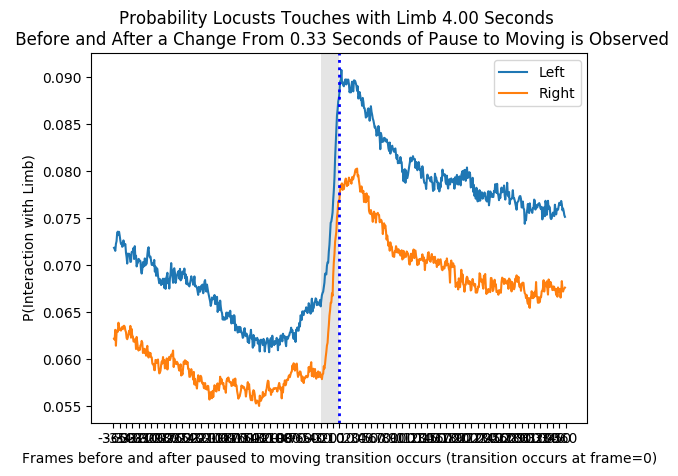



  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19373/323578 [00:00<00:01, 193729.72it/s]

 12%|█▏        | 37712/323578 [00:00<00:01, 190506.77it/s]

0




 19%|█▊        | 60658/323578 [00:00<00:01, 200729.47it/s]

 24%|██▍       | 78653/323578 [00:00<00:01, 194008.52it/s]

 29%|██▉       | 94204/323578 [00:00<00:01, 179526.73it/s]

 36%|███▌      | 116549/323578 [00:00<00:01, 190247.93it/s]

 41%|████▏     | 133696/323578 [00:00<00:01, 167539.99it/s]

 47%|████▋     | 152301/323578 [00:00<00:00, 172601.37it/s]

 52%|█████▏    | 169026/323578 [00:00<00:00, 169565.94it/s]

 59%|█████▊    | 189761/323578 [00:01<00:00, 178873.66it/s]

 65%|██████▍   | 210060/323578 [00:01<00:00, 185483.24it/s]

 71%|███████   | 228902/323578 [00:01<00:00, 186354.13it/s]

 80%|███████▉  | 257423/323578 [00:01<00:00, 207979.24it/s]

 86%|████████▌ | 279015/323578 [00:01<00:00, 209194.13it/s]

 93%|█████████▎| 302057/323578 [00:01<00:00, 213134.02it/s]

100%|██████████| 323578/323578 [00:01<00:00, 200202.88it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23821/323578 [00:00<00:01, 238208.52it/s]

 15%|█▌        | 49212/323578 [00:00<00:01,

1




 22%|██▏       | 72016/323578 [00:00<00:01, 234501.13it/s]

 30%|██▉       | 96965/323578 [00:00<00:00, 238803.48it/s]

 38%|███▊      | 124047/323578 [00:00<00:00, 247584.26it/s]

 48%|████▊     | 153871/323578 [00:00<00:00, 260875.93it/s]

 57%|█████▋    | 183918/323578 [00:00<00:00, 271613.28it/s]

 65%|██████▍   | 209430/323578 [00:00<00:00, 230553.73it/s]

 73%|███████▎  | 235136/323578 [00:00<00:00, 237912.92it/s]

 82%|████████▏ | 264118/323578 [00:01<00:00, 251421.03it/s]

 90%|█████████ | 292323/323578 [00:01<00:00, 259887.61it/s]

 98%|█████████▊| 318698/323578 [00:01<00:00, 261032.44it/s]

100%|██████████| 323578/323578 [00:01<00:00, 252276.83it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 24868/323578 [00:00<00:01, 245757.03it/s]

 15%|█▌        | 49794/323578 [00:00<00:01, 246793.94it/s]

2




 22%|██▏       | 71386/323578 [00:00<00:01, 236641.41it/s]

 29%|██▉       | 94279/323578 [00:00<00:00, 234273.37it/s]

 36%|███▋      | 117752/323578 [00:00<00:00, 233498.76it/s]

 42%|████▏     | 137020/323578 [00:00<00:00, 216298.70it/s]

 48%|████▊     | 156045/323578 [00:00<00:00, 206684.68it/s]

 54%|█████▍    | 174981/323578 [00:00<00:00, 188428.62it/s]

 60%|█████▉    | 192923/323578 [00:00<00:00, 177632.61it/s]

 65%|██████▍   | 210183/323578 [00:01<00:00, 172585.27it/s]

 72%|███████▏  | 231414/323578 [00:01<00:00, 182157.81it/s]

 78%|███████▊  | 252868/323578 [00:01<00:00, 190795.96it/s]

 84%|████████▍ | 271998/323578 [00:01<00:00, 189934.82it/s]

 90%|████████▉ | 291028/323578 [00:01<00:00, 172170.65it/s]

 95%|█████████▌| 308589/323578 [00:01<00:00, 164153.01it/s]

100%|██████████| 323578/323578 [00:01<00:00, 192431.60it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16918/323578 [00:00<00:01, 169175.72it/s]

  9%|▉         | 28647/323578 [00:00<00:01

3




 13%|█▎        | 42543/323578 [00:00<00:01, 146074.65it/s]

 17%|█▋        | 54547/323578 [00:00<00:01, 135953.29it/s]

 20%|█▉        | 64706/323578 [00:00<00:02, 122579.82it/s]

 25%|██▌       | 81698/323578 [00:00<00:01, 133758.83it/s]

 33%|███▎      | 108241/323578 [00:00<00:01, 157144.45it/s]

 42%|████▏     | 134446/323578 [00:00<00:01, 177594.47it/s]

 47%|████▋     | 153571/323578 [00:00<00:01, 168627.86it/s]

 53%|█████▎    | 171484/323578 [00:01<00:00, 168075.65it/s]

 58%|█████▊    | 189027/323578 [00:01<00:00, 136748.94it/s]

 63%|██████▎   | 204167/323578 [00:01<00:01, 114087.35it/s]

 67%|██████▋   | 217233/323578 [00:01<00:00, 114484.60it/s]

 73%|███████▎  | 234857/323578 [00:01<00:00, 127932.42it/s]

 77%|███████▋  | 248971/323578 [00:01<00:00, 120140.02it/s]

 82%|████████▏ | 264548/323578 [00:01<00:00, 128990.50it/s]

 86%|████████▌ | 278346/323578 [00:01<00:00, 127378.86it/s]

 90%|█████████ | 292828/323578 [00:02<00:00, 131797.38it/s]

 97%|█████████▋| 313027/32

4




 17%|█▋        | 55126/323578 [00:00<00:01, 175673.29it/s]

 22%|██▏       | 72203/323578 [00:00<00:01, 174132.77it/s]

 28%|██▊       | 90403/323578 [00:00<00:01, 176391.77it/s]

 33%|███▎      | 105585/323578 [00:00<00:01, 168176.50it/s]

 38%|███▊      | 122780/323578 [00:00<00:01, 169290.62it/s]

 44%|████▍     | 142991/323578 [00:00<00:01, 177958.44it/s]

 51%|█████     | 164842/323578 [00:00<00:00, 188449.46it/s]

 59%|█████▉    | 190900/323578 [00:01<00:00, 205515.33it/s]

 65%|██████▌   | 211680/323578 [00:01<00:00, 190254.04it/s]

 71%|███████▏  | 231091/323578 [00:01<00:00, 176800.17it/s]

 77%|███████▋  | 249232/323578 [00:01<00:00, 163543.30it/s]

 82%|████████▏ | 266106/323578 [00:01<00:00, 155060.76it/s]

 87%|████████▋ | 282068/323578 [00:01<00:00, 150717.79it/s]

 93%|█████████▎| 300116/323578 [00:01<00:00, 157424.06it/s]

 98%|█████████▊| 318245/323578 [00:01<00:00, 163896.33it/s]

100%|██████████| 323578/323578 [00:01<00:00, 174813.20it/s]

  0%|          | 0/323578

5




 17%|█▋        | 56099/323578 [00:00<00:01, 183118.35it/s]

 24%|██▎       | 76229/323578 [00:00<00:01, 187610.16it/s]

 29%|██▊       | 92758/323578 [00:00<00:01, 180241.74it/s]

 34%|███▍      | 109284/323578 [00:00<00:01, 175467.74it/s]

 40%|███▉      | 128941/323578 [00:00<00:01, 181306.31it/s]

 47%|████▋     | 151077/323578 [00:00<00:00, 191117.52it/s]

 52%|█████▏    | 169441/323578 [00:00<00:00, 171754.32it/s]

 58%|█████▊    | 186464/323578 [00:01<00:00, 155661.37it/s]

 64%|██████▎   | 206182/323578 [00:01<00:00, 166156.83it/s]

 69%|██████▉   | 223636/323578 [00:01<00:00, 167450.37it/s]

 74%|███████▍  | 240610/323578 [00:01<00:00, 157866.28it/s]

 81%|████████  | 260663/323578 [00:01<00:00, 168628.01it/s]

 86%|████████▌ | 277921/323578 [00:01<00:00, 164923.99it/s]

 91%|█████████ | 294708/323578 [00:01<00:00, 157666.26it/s]

 97%|█████████▋| 312554/323578 [00:01<00:00, 163376.23it/s]

100%|██████████| 323578/323578 [00:01<00:00, 170118.31it/s]

  0%|          | 0/323578

6




 20%|██        | 65473/323578 [00:00<00:01, 215293.34it/s]

 27%|██▋       | 86525/323578 [00:00<00:01, 213838.36it/s]

 32%|███▏      | 102879/323578 [00:00<00:01, 189224.04it/s]

 37%|███▋      | 120610/323578 [00:00<00:01, 185484.40it/s]

 42%|████▏     | 137075/323578 [00:00<00:01, 159978.34it/s]

 48%|████▊     | 153889/323578 [00:00<00:01, 162166.97it/s]

 52%|█████▏    | 169526/323578 [00:00<00:00, 155748.37it/s]

 58%|█████▊    | 186798/323578 [00:01<00:00, 160477.03it/s]

 63%|██████▎   | 202636/323578 [00:01<00:00, 150417.00it/s]

 67%|██████▋   | 217940/323578 [00:01<00:00, 151193.60it/s]

 72%|███████▏  | 233048/323578 [00:01<00:00, 140077.94it/s]

 79%|███████▊  | 254712/323578 [00:01<00:00, 156690.22it/s]

 88%|████████▊ | 284126/323578 [00:01<00:00, 182237.43it/s]

 94%|█████████▍| 304439/323578 [00:01<00:00, 180117.69it/s]

100%|██████████| 323578/323578 [00:01<00:00, 181153.72it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18716/323578 [00:00<00:0

7




 15%|█▍        | 47375/323578 [00:00<00:01, 161339.44it/s]

 18%|█▊        | 59074/323578 [00:00<00:01, 144863.83it/s]

 25%|██▍       | 79353/323578 [00:00<00:01, 158441.03it/s]

 29%|██▉       | 94424/323578 [00:00<00:01, 156038.36it/s]

 35%|███▍      | 112878/323578 [00:00<00:01, 163619.36it/s]

 41%|████      | 133266/323578 [00:00<00:01, 173921.93it/s]

 47%|████▋     | 151112/323578 [00:00<00:00, 175258.85it/s]

 52%|█████▏    | 168242/323578 [00:01<00:00, 172747.52it/s]

 58%|█████▊    | 186190/323578 [00:01<00:00, 174712.33it/s]

 64%|██████▎   | 206215/323578 [00:01<00:00, 181662.31it/s]

 69%|██████▉   | 224325/323578 [00:01<00:00, 153709.55it/s]

 75%|███████▍  | 241618/323578 [00:01<00:00, 159010.80it/s]

 81%|████████  | 261627/323578 [00:01<00:00, 168682.71it/s]

 86%|████████▌ | 279031/323578 [00:01<00:00, 165403.81it/s]

 95%|█████████▍| 306408/323578 [00:01<00:00, 187691.58it/s]

100%|██████████| 323578/323578 [00:01<00:00, 176158.76it/s]

  0%|          | 0/323578 

8




 17%|█▋        | 54656/323578 [00:00<00:01, 184556.05it/s]

 24%|██▍       | 77366/323578 [00:00<00:01, 195545.20it/s]

 31%|███       | 100280/323578 [00:00<00:01, 204540.20it/s]

 39%|███▉      | 126762/323578 [00:00<00:00, 219530.37it/s]

 47%|████▋     | 151487/323578 [00:00<00:00, 227169.35it/s]

 53%|█████▎    | 172983/323578 [00:00<00:00, 216909.82it/s]

 61%|██████    | 197834/323578 [00:00<00:00, 225510.88it/s]

 68%|██████▊   | 219943/323578 [00:01<00:00, 214692.40it/s]

 75%|███████▌  | 243556/323578 [00:01<00:00, 219172.13it/s]

 82%|████████▏ | 265356/323578 [00:01<00:00, 204785.18it/s]

 88%|████████▊ | 285944/323578 [00:01<00:00, 195042.83it/s]

 96%|█████████▌| 310518/323578 [00:01<00:00, 207910.22it/s]

100%|██████████| 323578/323578 [00:01<00:00, 213985.34it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21104/323578 [00:00<00:01, 211038.69it/s]

 13%|█▎        | 41631/323578 [00:00<00:01, 209237.77it/s]

9




 18%|█▊        | 57969/323578 [00:00<00:01, 192985.64it/s]

 24%|██▎       | 76398/323578 [00:00<00:01, 190290.35it/s]

 28%|██▊       | 91626/323578 [00:00<00:01, 176951.15it/s]

 34%|███▍      | 109210/323578 [00:00<00:01, 176440.32it/s]

 39%|███▊      | 124594/323578 [00:00<00:01, 160008.08it/s]

 45%|████▍     | 144005/323578 [00:00<00:01, 167748.82it/s]

 49%|████▉     | 159976/323578 [00:00<00:00, 164397.95it/s]

 54%|█████▍    | 175868/323578 [00:01<00:00, 158040.44it/s]

 60%|█████▉    | 194024/323578 [00:01<00:00, 164429.49it/s]

 65%|██████▌   | 211898/323578 [00:01<00:00, 168428.69it/s]

 72%|███████▏  | 231974/323578 [00:01<00:00, 175708.88it/s]

 79%|███████▊  | 254117/323578 [00:01<00:00, 187311.72it/s]

 84%|████████▍ | 273072/323578 [00:01<00:00, 183916.46it/s]

 91%|█████████ | 294793/323578 [00:01<00:00, 192780.02it/s]

100%|█████████▉| 322938/323578 [00:01<00:00, 212902.22it/s]

100%|██████████| 323578/323578 [00:01<00:00, 185271.93it/s]

  0%|          | 0/323578

10




 19%|█▉        | 61881/323578 [00:00<00:01, 203658.20it/s]

 25%|██▌       | 81190/323578 [00:00<00:01, 200365.62it/s]

 31%|███       | 99869/323578 [00:00<00:01, 196088.30it/s]

 37%|███▋      | 118687/323578 [00:00<00:01, 193632.69it/s]

 43%|████▎     | 138998/323578 [00:00<00:00, 195742.01it/s]

 49%|████▊     | 157000/323578 [00:00<00:00, 177453.87it/s]

 54%|█████▍    | 173973/323578 [00:00<00:00, 172249.00it/s]

 59%|█████▉    | 190690/323578 [00:01<00:00, 162545.22it/s]

 64%|██████▍   | 206702/323578 [00:01<00:00, 158077.18it/s]

 69%|██████▊   | 222367/323578 [00:01<00:00, 147399.53it/s]

 73%|███████▎  | 237153/323578 [00:01<00:00, 133603.85it/s]

 78%|███████▊  | 253831/323578 [00:01<00:00, 142082.11it/s]

 83%|████████▎ | 268382/323578 [00:01<00:00, 142597.06it/s]

 89%|████████▊ | 287172/323578 [00:01<00:00, 153715.11it/s]

 95%|█████████▍| 306180/323578 [00:01<00:00, 163073.97it/s]

100%|██████████| 323578/323578 [00:01<00:00, 171037.81it/s]

  0%|          | 0/323578

11




 17%|█▋        | 56184/323578 [00:00<00:01, 191927.16it/s]

 25%|██▍       | 79424/323578 [00:00<00:01, 202506.80it/s]

 34%|███▎      | 109069/323578 [00:00<00:00, 223780.60it/s]

 42%|████▏     | 135897/323578 [00:00<00:00, 235497.21it/s]

 49%|████▉     | 160029/323578 [00:00<00:00, 237213.06it/s]

 58%|█████▊    | 186842/323578 [00:00<00:00, 245711.95it/s]

 65%|██████▌   | 210657/323578 [00:00<00:00, 242629.41it/s]

 72%|███████▏  | 234399/323578 [00:01<00:00, 218779.71it/s]

 79%|███████▉  | 256358/323578 [00:01<00:00, 213335.47it/s]

 86%|████████▌ | 277778/323578 [00:01<00:00, 206063.21it/s]

 92%|█████████▏| 298499/323578 [00:01<00:00, 195234.25it/s]

 98%|█████████▊| 318221/323578 [00:01<00:00, 182234.12it/s]

100%|██████████| 323578/323578 [00:01<00:00, 210987.21it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 24964/323578 [00:00<00:01, 249636.07it/s]

 16%|█▌        | 50639/323578 [00:00<00:01, 249718.73it/s]

12




 20%|██        | 66324/323578 [00:00<00:01, 212052.56it/s]

 25%|██▌       | 82345/323578 [00:00<00:01, 193288.34it/s]

 31%|███       | 98931/323578 [00:00<00:01, 184038.10it/s]

 37%|███▋      | 119761/323578 [00:00<00:01, 189240.16it/s]

 42%|████▏     | 136344/323578 [00:00<00:01, 178706.82it/s]

 48%|████▊     | 156244/323578 [00:00<00:00, 184346.29it/s]

 55%|█████▍    | 176424/323578 [00:00<00:00, 189256.23it/s]

 60%|██████    | 194678/323578 [00:01<00:00, 187189.54it/s]

 66%|██████▌   | 212927/323578 [00:01<00:00, 183650.63it/s]

 73%|███████▎  | 236072/323578 [00:01<00:00, 195779.35it/s]

 81%|████████  | 261117/323578 [00:01<00:00, 209497.57it/s]

 89%|████████▉ | 289160/323578 [00:01<00:00, 226699.02it/s]

 97%|█████████▋| 312426/323578 [00:01<00:00, 221166.74it/s]

100%|██████████| 323578/323578 [00:01<00:00, 205159.72it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19052/323578 [00:00<00:01, 190513.37it/s]

 14%|█▍        | 46037/323578 [00:00<00:01,

13




 20%|██        | 65298/323578 [00:00<00:01, 202592.49it/s]

 27%|██▋       | 86374/323578 [00:00<00:01, 204975.12it/s]

 32%|███▏      | 102597/323578 [00:00<00:01, 183871.86it/s]

 37%|███▋      | 118401/323578 [00:00<00:01, 165703.56it/s]

 41%|████▏     | 133504/323578 [00:00<00:01, 153737.11it/s]

 47%|████▋     | 151492/323578 [00:00<00:01, 160744.62it/s]

 52%|█████▏    | 168393/323578 [00:00<00:00, 163137.68it/s]

 58%|█████▊    | 188047/323578 [00:01<00:00, 171819.59it/s]

 63%|██████▎   | 205106/323578 [00:01<00:00, 167721.67it/s]

 69%|██████▊   | 221814/323578 [00:01<00:00, 163634.17it/s]

 74%|███████▎  | 238155/323578 [00:01<00:00, 152394.07it/s]

 83%|████████▎ | 267464/323578 [00:01<00:00, 178033.04it/s]

 92%|█████████▏| 297031/323578 [00:01<00:00, 202162.33it/s]

100%|██████████| 323578/323578 [00:01<00:00, 193573.51it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20654/323578 [00:00<00:01, 204437.96it/s]

 13%|█▎        | 41296/323578 [00:00<00:01

14




 16%|█▌        | 52178/323578 [00:00<00:01, 162047.08it/s]

 21%|██        | 67633/323578 [00:00<00:01, 159722.49it/s]

 27%|██▋       | 88799/323578 [00:00<00:01, 171223.42it/s]

 35%|███▍      | 112536/323578 [00:00<00:01, 186843.13it/s]

 42%|████▏     | 135208/323578 [00:00<00:00, 197249.95it/s]

 48%|████▊     | 154156/323578 [00:00<00:00, 173169.28it/s]

 53%|█████▎    | 171463/323578 [00:00<00:00, 166010.61it/s]

 58%|█████▊    | 188120/323578 [00:01<00:00, 160548.56it/s]

 64%|██████▎   | 205794/323578 [00:01<00:00, 165084.96it/s]

 69%|██████▊   | 222390/323578 [00:01<00:00, 152955.15it/s]

 77%|███████▋  | 249919/323578 [00:01<00:00, 176482.00it/s]

 87%|████████▋ | 279899/323578 [00:01<00:00, 201324.52it/s]

 93%|█████████▎| 302393/323578 [00:01<00:00, 207869.71it/s]

100%|██████████| 323578/323578 [00:01<00:00, 188203.70it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 17948/323578 [00:00<00:01, 179478.89it/s]

 12%|█▏        | 40322/323578 [00:00<00:01,

15




 19%|█▊        | 60305/323578 [00:00<00:01, 192124.49it/s]

 25%|██▌       | 81661/323578 [00:00<00:01, 198046.91it/s]

 32%|███▏      | 103964/323578 [00:00<00:01, 204932.82it/s]

 38%|███▊      | 121602/323578 [00:00<00:01, 190643.16it/s]

 44%|████▍     | 143185/323578 [00:00<00:00, 197559.50it/s]

 50%|████▉     | 161746/323578 [00:00<00:00, 190238.24it/s]

 56%|█████▌    | 181267/323578 [00:00<00:00, 191702.21it/s]

 62%|██████▏   | 199896/323578 [00:01<00:00, 175395.05it/s]

 67%|██████▋   | 217327/323578 [00:01<00:00, 164283.20it/s]

 75%|███████▍  | 241465/323578 [00:01<00:00, 181690.92it/s]

 83%|████████▎ | 270185/323578 [00:01<00:00, 204194.82it/s]

 91%|█████████ | 294048/323578 [00:01<00:00, 212425.39it/s]

 98%|█████████▊| 316320/323578 [00:01<00:00, 212240.05it/s]

100%|██████████| 323578/323578 [00:01<00:00, 202543.48it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 18128/323578 [00:00<00:01, 181278.44it/s]

 11%|█         | 35140/323578 [00:00<00:01

16




 15%|█▍        | 47752/323578 [00:00<00:01, 158321.55it/s]

 19%|█▉        | 62527/323578 [00:00<00:01, 154993.70it/s]

 23%|██▎       | 75325/323578 [00:00<00:01, 145146.18it/s]

 29%|██▊       | 92427/323578 [00:00<00:01, 151032.55it/s]

 33%|███▎      | 107669/323578 [00:00<00:01, 151446.06it/s]

 40%|███▉      | 127858/323578 [00:00<00:01, 163717.24it/s]

 45%|████▍     | 144776/323578 [00:00<00:01, 164065.70it/s]

 50%|████▉     | 160754/323578 [00:01<00:01, 155068.19it/s]

 54%|█████▍    | 176063/323578 [00:01<00:00, 151786.04it/s]

 59%|█████▉    | 191119/323578 [00:01<00:00, 149875.38it/s]

 64%|██████▎   | 206026/323578 [00:01<00:00, 145353.61it/s]

 68%|██████▊   | 220535/323578 [00:01<00:00, 126085.66it/s]

 73%|███████▎  | 235825/323578 [00:01<00:00, 133087.22it/s]

 77%|███████▋  | 249544/323578 [00:01<00:00, 131660.49it/s]

 83%|████████▎ | 267915/323578 [00:01<00:00, 143889.72it/s]

 90%|████████▉ | 290243/323578 [00:01<00:00, 161070.23it/s]

 96%|█████████▋| 311859/32

17




 21%|██        | 67019/323578 [00:00<00:01, 224707.68it/s]

 27%|██▋       | 87761/323578 [00:00<00:01, 219179.35it/s]

 32%|███▏      | 104169/323578 [00:00<00:01, 194063.04it/s]

 38%|███▊      | 123050/323578 [00:00<00:01, 192455.77it/s]

 44%|████▍     | 142142/323578 [00:00<00:00, 191456.12it/s]

 49%|████▉     | 159661/323578 [00:00<00:00, 176298.07it/s]

 55%|█████▍    | 176389/323578 [00:00<00:00, 173008.77it/s]

 60%|█████▉    | 193072/323578 [00:01<00:00, 157114.58it/s]

 65%|██████▍   | 210065/323578 [00:01<00:00, 160506.37it/s]

 71%|███████   | 229033/323578 [00:01<00:00, 167558.40it/s]

 78%|███████▊  | 251108/323578 [00:01<00:00, 180065.31it/s]

 84%|████████▍ | 271594/323578 [00:01<00:00, 186801.32it/s]

 92%|█████████▏| 296337/323578 [00:01<00:00, 201614.20it/s]

 98%|█████████▊| 317016/323578 [00:01<00:00, 198331.74it/s]

100%|██████████| 323578/323578 [00:01<00:00, 190260.96it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  9%|▉         | 29917/323578 [00:00<00:0

18




 26%|██▌       | 82787/323578 [00:00<00:00, 281506.54it/s]

 33%|███▎      | 107371/323578 [00:00<00:00, 268329.24it/s]

 41%|████      | 131499/323578 [00:00<00:00, 259595.87it/s]

 48%|████▊     | 154632/323578 [00:00<00:00, 247867.51it/s]

 54%|█████▍    | 176177/323578 [00:00<00:00, 227451.42it/s]

 61%|██████    | 196982/323578 [00:00<00:00, 212497.41it/s]

 67%|██████▋   | 217073/323578 [00:00<00:00, 203135.32it/s]

 73%|███████▎  | 236663/323578 [00:01<00:00, 197721.35it/s]

 80%|███████▉  | 257905/323578 [00:01<00:00, 201912.47it/s]

 86%|████████▌ | 277786/323578 [00:01<00:00, 196469.14it/s]

 92%|█████████▏| 297248/323578 [00:01<00:00, 192835.98it/s]

 98%|█████████▊| 316417/323578 [00:01<00:00, 192201.18it/s]

100%|██████████| 323578/323578 [00:01<00:00, 217606.63it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15424/323578 [00:00<00:01, 154238.31it/s]

  8%|▊         | 26476/323578 [00:00<00:02, 136194.78it/s]

19




 12%|█▏        | 38713/323578 [00:00<00:02, 131728.83it/s]

 18%|█▊        | 58713/323578 [00:00<00:01, 146756.85it/s]

 23%|██▎       | 73276/323578 [00:00<00:01, 145082.40it/s]

 28%|██▊       | 91486/323578 [00:00<00:01, 154504.09it/s]

 33%|███▎      | 105665/323578 [00:00<00:01, 139791.16it/s]

 37%|███▋      | 120253/323578 [00:00<00:01, 141562.72it/s]

 42%|████▏     | 134414/323578 [00:00<00:01, 141383.74it/s]

 47%|████▋     | 152433/323578 [00:01<00:01, 150243.88it/s]

 52%|█████▏    | 169567/323578 [00:01<00:00, 156005.96it/s]

 58%|█████▊    | 186758/323578 [00:01<00:00, 160456.42it/s]

 63%|██████▎   | 204345/323578 [00:01<00:00, 164788.09it/s]

 70%|██████▉   | 226251/323578 [00:01<00:00, 177177.36it/s]

 76%|███████▌  | 246359/323578 [00:01<00:00, 183728.73it/s]

 84%|████████▍ | 272823/323578 [00:01<00:00, 202281.48it/s]

 92%|█████████▏| 297330/323578 [00:01<00:00, 213462.38it/s]

 99%|█████████▊| 319377/323578 [00:01<00:00, 209332.50it/s]

100%|██████████| 323578/32

20




 14%|█▎        | 44198/323578 [00:00<00:01, 150337.89it/s]

 19%|█▊        | 59997/323578 [00:00<00:01, 152553.85it/s]

 24%|██▍       | 78125/323578 [00:00<00:01, 160166.78it/s]

 31%|███       | 99963/323578 [00:00<00:01, 172922.27it/s]

 38%|███▊      | 122047/323578 [00:00<00:01, 184961.66it/s]

 44%|████▍     | 142954/323578 [00:00<00:00, 191588.24it/s]

 50%|████▉     | 161556/323578 [00:00<00:00, 171469.69it/s]

 57%|█████▋    | 183160/323578 [00:01<00:00, 182780.80it/s]

 64%|██████▍   | 207830/323578 [00:01<00:00, 198184.48it/s]

 72%|███████▏  | 233817/323578 [00:01<00:00, 213377.91it/s]

 81%|████████▏ | 263027/323578 [00:01<00:00, 232125.44it/s]

 90%|█████████ | 291532/323578 [00:01<00:00, 245816.55it/s]

 99%|█████████▉| 321639/323578 [00:01<00:00, 260138.15it/s]

100%|██████████| 323578/323578 [00:01<00:00, 209135.87it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 19041/323578 [00:00<00:01, 190405.19it/s]

 13%|█▎        | 41589/323578 [00:00<00:01, 

21




 18%|█▊        | 59440/323578 [00:00<00:01, 192666.57it/s]

 24%|██▍       | 78746/323578 [00:00<00:01, 192782.69it/s]

 32%|███▏      | 101964/323578 [00:00<00:01, 203122.51it/s]

 39%|███▉      | 126782/323578 [00:00<00:00, 213035.70it/s]

 46%|████▌     | 147977/323578 [00:00<00:00, 212706.90it/s]

 52%|█████▏    | 168327/323578 [00:00<00:00, 209809.68it/s]

 61%|██████    | 195913/323578 [00:00<00:00, 226020.63it/s]

 69%|██████▉   | 224472/323578 [00:01<00:00, 241053.89it/s]

 78%|███████▊  | 253491/323578 [00:01<00:00, 253952.19it/s]

 88%|████████▊ | 283583/323578 [00:01<00:00, 266411.32it/s]

 97%|█████████▋| 312434/323578 [00:01<00:00, 272669.07it/s]

100%|██████████| 323578/323578 [00:01<00:00, 241059.03it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21317/323578 [00:00<00:01, 213165.12it/s]

 12%|█▏        | 39391/323578 [00:00<00:01, 201231.56it/s]

22




 17%|█▋        | 55646/323578 [00:00<00:01, 187821.37it/s]

 22%|██▏       | 71404/323578 [00:00<00:01, 176021.02it/s]

 27%|██▋       | 87867/323578 [00:00<00:01, 171084.88it/s]

 33%|███▎      | 106268/323578 [00:00<00:01, 174766.75it/s]

 39%|███▊      | 124904/323578 [00:00<00:01, 177148.53it/s]

 44%|████▍     | 142706/323578 [00:00<00:01, 177352.62it/s]

 49%|████▉     | 160129/323578 [00:00<00:00, 176403.04it/s]

 55%|█████▍    | 176987/323578 [00:01<00:00, 162768.61it/s]

 60%|█████▉    | 192924/323578 [00:01<00:00, 154699.81it/s]

 64%|██████▍   | 208240/323578 [00:01<00:00, 152703.30it/s]

 69%|██████▉   | 223409/323578 [00:01<00:00, 151569.73it/s]

 77%|███████▋  | 250116/323578 [00:01<00:00, 173205.69it/s]

 83%|████████▎ | 268469/323578 [00:01<00:00, 166639.66it/s]

 89%|████████▉ | 287209/323578 [00:01<00:00, 172366.65it/s]

 94%|█████████▍| 305039/323578 [00:01<00:00, 166566.35it/s]

100%|██████████| 323578/323578 [00:01<00:00, 173866.57it/s]

  0%|          | 0/323578

23




 24%|██▍       | 78305/323578 [00:00<00:00, 266229.52it/s]

 32%|███▏      | 104160/323578 [00:00<00:00, 263875.95it/s]

 41%|████      | 132358/323578 [00:00<00:00, 269057.07it/s]

 48%|████▊     | 156691/323578 [00:00<00:00, 260783.97it/s]

 55%|█████▌    | 179521/323578 [00:00<00:00, 245188.05it/s]

 63%|██████▎   | 203623/323578 [00:00<00:00, 243922.47it/s]

 70%|███████   | 226559/323578 [00:00<00:00, 237406.49it/s]

 78%|███████▊  | 251911/323578 [00:01<00:00, 242020.69it/s]

 86%|████████▌ | 279054/323578 [00:01<00:00, 250151.74it/s]

 94%|█████████▍| 303673/323578 [00:01<00:00, 248174.53it/s]

100%|██████████| 323578/323578 [00:01<00:00, 250957.65it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16284/323578 [00:00<00:01, 162837.05it/s]

 11%|█▏        | 36723/323578 [00:00<00:01, 172578.17it/s]

24




 17%|█▋        | 55418/323578 [00:00<00:01, 176652.04it/s]

 22%|██▏       | 70922/323578 [00:00<00:01, 168845.22it/s]

 29%|██▊       | 92325/323578 [00:00<00:01, 180261.05it/s]

 35%|███▍      | 112063/323578 [00:00<00:01, 185075.79it/s]

 41%|████      | 131558/323578 [00:00<00:01, 187931.33it/s]

 46%|████▋     | 150281/323578 [00:00<00:00, 187124.88it/s]

 52%|█████▏    | 168892/323578 [00:00<00:00, 185978.21it/s]

 58%|█████▊    | 186931/323578 [00:01<00:00, 166712.15it/s]

 64%|██████▎   | 205889/323578 [00:01<00:00, 171594.39it/s]

 69%|██████▉   | 223115/323578 [00:01<00:00, 171792.48it/s]

 74%|███████▍  | 240312/323578 [00:01<00:00, 164008.66it/s]

 79%|███████▉  | 256800/323578 [00:01<00:00, 162328.44it/s]

 85%|████████▍ | 273977/323578 [00:01<00:00, 165049.58it/s]

 91%|█████████▏| 295600/323578 [00:01<00:00, 177664.70it/s]

 97%|█████████▋| 314005/323578 [00:01<00:00, 179531.70it/s]

100%|██████████| 323578/323578 [00:01<00:00, 179837.35it/s]

  0%|          | 0/323578

25




 16%|█▌        | 52506/323578 [00:00<00:01, 156906.93it/s]

 22%|██▏       | 72200/323578 [00:00<00:01, 167096.68it/s]

 29%|██▉       | 93223/323578 [00:00<00:01, 178055.62it/s]

 34%|███▍      | 109414/323578 [00:00<00:01, 171894.23it/s]

 39%|███▉      | 125684/323578 [00:00<00:01, 169027.47it/s]

 44%|████▍     | 141839/323578 [00:00<00:01, 160751.48it/s]

 49%|████▊     | 157476/323578 [00:00<00:01, 151210.43it/s]

 54%|█████▍    | 174330/323578 [00:01<00:00, 155554.29it/s]

 59%|█████▉    | 191513/323578 [00:01<00:00, 160103.30it/s]

 65%|██████▌   | 211337/323578 [00:01<00:00, 168809.65it/s]

 71%|███████   | 228369/323578 [00:01<00:00, 168755.59it/s]

 77%|███████▋  | 250173/323578 [00:01<00:00, 181029.89it/s]

 84%|████████▍ | 272455/323578 [00:01<00:00, 191822.79it/s]

 93%|█████████▎| 302204/323578 [00:01<00:00, 214699.89it/s]

100%|██████████| 323578/323578 [00:01<00:00, 188248.68it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▍         | 15305/323578 [00:00<00:02

26




 14%|█▍        | 46322/323578 [00:00<00:01, 153533.57it/s]

 19%|█▉        | 60829/323578 [00:00<00:01, 150890.73it/s]

 23%|██▎       | 75282/323578 [00:00<00:01, 148923.11it/s]

 29%|██▉       | 93703/323578 [00:00<00:01, 158001.72it/s]

 35%|███▍      | 111965/323578 [00:00<00:01, 164318.55it/s]

 41%|████      | 131789/323578 [00:00<00:01, 173167.51it/s]

 50%|████▉     | 160788/323578 [00:00<00:00, 196965.22it/s]

 59%|█████▊    | 189519/323578 [00:01<00:00, 217480.93it/s]

 68%|██████▊   | 219502/323578 [00:01<00:00, 237008.49it/s]

 77%|███████▋  | 249592/323578 [00:01<00:00, 253132.78it/s]

 86%|████████▋ | 279850/323578 [00:01<00:00, 266180.43it/s]

 96%|█████████▌| 309861/323578 [00:01<00:00, 275525.17it/s]

100%|██████████| 323578/323578 [00:01<00:00, 223648.90it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 26013/323578 [00:00<00:01, 260126.53it/s]

 14%|█▍        | 45534/323578 [00:00<00:01, 236527.41it/s]

27




 19%|█▊        | 59915/323578 [00:00<00:01, 195765.22it/s]

 23%|██▎       | 74972/323578 [00:00<00:01, 179037.56it/s]

 28%|██▊       | 90988/323578 [00:00<00:01, 172921.31it/s]

 32%|███▏      | 104863/323578 [00:00<00:01, 157115.62it/s]

 38%|███▊      | 122182/323578 [00:00<00:01, 161615.38it/s]

 47%|████▋     | 151836/323578 [00:00<00:00, 187162.44it/s]

 56%|█████▌    | 180674/323578 [00:00<00:00, 209188.30it/s]

 65%|██████▍   | 209355/323578 [00:01<00:00, 227672.32it/s]

 74%|███████▍  | 239116/323578 [00:01<00:00, 244939.36it/s]

 83%|████████▎ | 268906/323578 [00:01<00:00, 258738.68it/s]

 93%|█████████▎| 299327/323578 [00:01<00:00, 270884.95it/s]

100%|██████████| 323578/323578 [00:01<00:00, 232554.77it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 22608/323578 [00:00<00:01, 226074.83it/s]

 13%|█▎        | 41961/323578 [00:00<00:01, 212932.89it/s]

28




 19%|█▉        | 63084/323578 [00:00<00:01, 212418.14it/s]

 27%|██▋       | 86379/323578 [00:00<00:01, 218185.95it/s]

 34%|███▍      | 109442/323578 [00:00<00:00, 221722.83it/s]

 42%|████▏     | 136439/323578 [00:00<00:00, 234239.12it/s]

 49%|████▊     | 157460/323578 [00:00<00:00, 205940.67it/s]

 55%|█████▍    | 176995/323578 [00:00<00:00, 191752.41it/s]

 60%|██████    | 195625/323578 [00:00<00:00, 177770.14it/s]

 66%|██████▋   | 214627/323578 [00:01<00:00, 181274.06it/s]

 72%|███████▏  | 232647/323578 [00:01<00:00, 159643.16it/s]

 78%|███████▊  | 253953/323578 [00:01<00:00, 172626.44it/s]

 84%|████████▍ | 271797/323578 [00:01<00:00, 172439.54it/s]

 90%|█████████ | 291464/323578 [00:01<00:00, 179055.77it/s]

 98%|█████████▊| 318104/323578 [00:01<00:00, 198588.42it/s]

100%|██████████| 323578/323578 [00:01<00:00, 196877.64it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 16364/323578 [00:00<00:01, 163634.30it/s]

 10%|▉         | 31114/323578 [00:00<00:01

29




 15%|█▌        | 48558/323578 [00:00<00:01, 162917.90it/s]

 20%|██        | 65335/323578 [00:00<00:01, 162809.92it/s]

 26%|██▌       | 83851/323578 [00:00<00:01, 168927.05it/s]

 32%|███▏      | 103011/323578 [00:00<00:01, 175144.01it/s]

 37%|███▋      | 119100/323578 [00:00<00:01, 170608.50it/s]

 42%|████▏     | 136964/323578 [00:00<00:01, 172940.89it/s]

 47%|████▋     | 153399/323578 [00:00<00:01, 164477.07it/s]

 53%|█████▎    | 170455/323578 [00:01<00:00, 166246.79it/s]

 58%|█████▊    | 186724/323578 [00:01<00:00, 161913.12it/s]

 63%|██████▎   | 204681/323578 [00:01<00:00, 166833.22it/s]

 68%|██████▊   | 221245/323578 [00:01<00:00, 156239.49it/s]

 73%|███████▎  | 236923/323578 [00:01<00:00, 149646.99it/s]

 80%|████████  | 258921/323578 [00:01<00:00, 165523.17it/s]

 86%|████████▌ | 278486/323578 [00:01<00:00, 173538.45it/s]

 92%|█████████▏| 298883/323578 [00:01<00:00, 181668.09it/s]

100%|██████████| 323578/323578 [00:01<00:00, 174103.32it/s]

  0%|          | 0/323578

30




 18%|█▊        | 58271/323578 [00:00<00:01, 199125.12it/s]

 25%|██▌       | 82178/323578 [00:00<00:01, 209632.70it/s]

 33%|███▎      | 107956/323578 [00:00<00:00, 222075.81it/s]

 39%|███▉      | 126754/323578 [00:00<00:01, 188368.03it/s]

 45%|████▍     | 144086/323578 [00:00<00:01, 176964.06it/s]

 51%|█████     | 163874/323578 [00:00<00:00, 182759.29it/s]

 56%|█████▌    | 181931/323578 [00:00<00:00, 182096.87it/s]

 62%|██████▏   | 199728/323578 [00:01<00:00, 177057.05it/s]

 69%|██████▉   | 222645/323578 [00:01<00:00, 190019.97it/s]

 75%|███████▍  | 241734/323578 [00:01<00:00, 159941.45it/s]

 81%|████████  | 262376/323578 [00:01<00:00, 171526.59it/s]

 88%|████████▊ | 283414/323578 [00:01<00:00, 181587.19it/s]

 97%|█████████▋| 312988/323578 [00:01<00:00, 205367.78it/s]

100%|██████████| 323578/323578 [00:01<00:00, 195432.36it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20937/323578 [00:00<00:01, 209367.20it/s]

 12%|█▏        | 39395/323578 [00:00<00:01

31




 18%|█▊        | 56695/323578 [00:00<00:01, 191258.25it/s]

 23%|██▎       | 75904/323578 [00:00<00:01, 191506.26it/s]

 28%|██▊       | 90129/323578 [00:00<00:01, 166001.43it/s]

 32%|███▏      | 103886/323578 [00:00<00:01, 137142.76it/s]

 37%|███▋      | 118362/323578 [00:00<00:01, 139173.52it/s]

 41%|████      | 131477/323578 [00:00<00:01, 131153.56it/s]

 45%|████▍     | 145032/323578 [00:00<00:01, 131442.40it/s]

 49%|████▉     | 157850/323578 [00:01<00:01, 120926.82it/s]

 53%|█████▎    | 170771/323578 [00:01<00:01, 123076.09it/s]

 57%|█████▋    | 183044/323578 [00:01<00:01, 121379.76it/s]

 60%|██████    | 195163/323578 [00:01<00:01, 118542.03it/s]

 64%|██████▍   | 207019/323578 [00:01<00:01, 115721.55it/s]

 68%|██████▊   | 218607/323578 [00:01<00:00, 110735.94it/s]

 72%|███████▏  | 231422/323578 [00:01<00:00, 115441.24it/s]

 77%|███████▋  | 248840/323578 [00:01<00:00, 128434.09it/s]

 85%|████████▍ | 274427/323578 [00:01<00:00, 150994.11it/s]

 93%|█████████▎| 299666/3

32




 26%|██▌       | 84639/323578 [00:00<00:00, 278269.68it/s]

 35%|███▌      | 113972/323578 [00:00<00:00, 282622.74it/s]

 44%|████▍     | 143852/323578 [00:00<00:00, 287287.05it/s]

 54%|█████▎    | 173703/323578 [00:00<00:00, 290561.57it/s]

 63%|██████▎   | 203828/323578 [00:00<00:00, 293686.66it/s]

 72%|███████▏  | 234175/323578 [00:00<00:00, 296554.24it/s]

 81%|████████  | 262325/323578 [00:00<00:00, 288593.04it/s]

 91%|█████████ | 293158/323578 [00:01<00:00, 294171.21it/s]

100%|██████████| 323578/323578 [00:01<00:00, 293116.69it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  5%|▌         | 17359/323578 [00:00<00:01, 173587.27it/s]

 12%|█▏        | 37442/323578 [00:00<00:01, 179434.68it/s]

33




 17%|█▋        | 53641/323578 [00:00<00:01, 173817.97it/s]

 24%|██▍       | 77873/323578 [00:00<00:01, 189924.49it/s]

 29%|██▉       | 93194/323578 [00:00<00:01, 166332.06it/s]

 36%|███▌      | 116060/323578 [00:00<00:01, 181144.69it/s]

 44%|████▍     | 142796/323578 [00:00<00:00, 200544.69it/s]

 53%|█████▎    | 172410/323578 [00:00<00:00, 222046.62it/s]

 63%|██████▎   | 202714/323578 [00:00<00:00, 241400.75it/s]

 72%|███████▏  | 232920/323578 [00:01<00:00, 256875.70it/s]

 81%|████████  | 262703/323578 [00:01<00:00, 267927.33it/s]

 90%|█████████ | 292758/323578 [00:01<00:00, 276944.48it/s]

100%|█████████▉| 322541/323578 [00:01<00:00, 282895.07it/s]

100%|██████████| 323578/323578 [00:01<00:00, 243663.24it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 21060/323578 [00:00<00:01, 210589.66it/s]

 12%|█▏        | 39657/323578 [00:00<00:01, 202544.89it/s]

 19%|█▊        | 60089/323578 [00:00<00:01, 202428.24it/s]

34




 24%|██▍       | 77874/323578 [00:00<00:01, 194367.96it/s]

 30%|██▉       | 96916/323578 [00:00<00:01, 193165.42it/s]

 36%|███▋      | 117860/323578 [00:00<00:01, 197774.87it/s]

 42%|████▏     | 136262/323578 [00:00<00:00, 193434.53it/s]

 48%|████▊     | 153947/323578 [00:00<00:00, 170724.97it/s]

 55%|█████▌    | 178427/323578 [00:00<00:00, 187769.14it/s]

 64%|██████▍   | 208455/323578 [00:01<00:00, 211547.85it/s]

 71%|███████▏  | 230640/323578 [00:01<00:00, 213114.64it/s]

 81%|████████  | 260885/323578 [00:01<00:00, 233833.54it/s]

 88%|████████▊ | 285383/323578 [00:01<00:00, 236188.73it/s]

 97%|█████████▋| 312651/323578 [00:01<00:00, 246067.60it/s]

100%|██████████| 323578/323578 [00:01<00:00, 219590.95it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  4%|▎         | 11801/323578 [00:00<00:02, 116605.33it/s]

  8%|▊         | 25567/323578 [00:00<00:02, 121552.52it/s]



35


 12%|█▏        | 38814/323578 [00:00<00:02, 123889.22it/s]

 17%|█▋        | 53873/323578 [00:00<00:02, 129737.69it/s]

 20%|██        | 65398/323578 [00:00<00:02, 124526.72it/s]

 24%|██▍       | 78325/323578 [00:00<00:01, 125445.92it/s]

 28%|██▊       | 90082/323578 [00:00<00:01, 122582.88it/s]

 33%|███▎      | 107280/323578 [00:00<00:01, 133379.40it/s]

 37%|███▋      | 121037/323578 [00:00<00:01, 133779.46it/s]

 41%|████▏     | 134177/323578 [00:01<00:01, 125574.72it/s]

 46%|████▌     | 147388/323578 [00:01<00:01, 127465.45it/s]

 49%|████▉     | 160097/323578 [00:01<00:01, 125864.59it/s]

 54%|█████▍    | 174386/323578 [00:01<00:01, 129894.51it/s]

 58%|█████▊    | 187393/323578 [00:01<00:01, 126571.45it/s]

 62%|██████▏   | 201637/323578 [00:01<00:00, 130947.62it/s]

 67%|██████▋   | 215693/323578 [00:01<00:00, 133689.43it/s]

 71%|███████▏  | 230567/323578 [00:01<00:00, 137874.08it/s]

 78%|███████▊  | 251595/323578 [00:01<00:00, 153756.07it/s]

 84%|████████▍ | 271841/32357

36




 23%|██▎       | 74383/323578 [00:00<00:01, 243455.29it/s]

 32%|███▏      | 102382/323578 [00:00<00:00, 253372.55it/s]

 41%|████      | 132596/323578 [00:00<00:00, 266264.73it/s]

 50%|████▉     | 160979/323578 [00:00<00:00, 271300.86it/s]

 59%|█████▉    | 191472/323578 [00:00<00:00, 280582.15it/s]

 69%|██████▊   | 222292/323578 [00:00<00:00, 288331.97it/s]

 78%|███████▊  | 252272/323578 [00:00<00:00, 291678.05it/s]

 87%|████████▋ | 282888/323578 [00:01<00:00, 295875.36it/s]

 96%|█████████▋| 311911/323578 [00:01<00:00, 286236.21it/s]

100%|██████████| 323578/323578 [00:01<00:00, 279203.73it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20338/323578 [00:00<00:01, 203377.77it/s]

 13%|█▎        | 42652/323578 [00:00<00:01, 208928.77it/s]

37




 21%|██        | 67528/323578 [00:00<00:01, 219469.21it/s]

 29%|██▉       | 94388/323578 [00:00<00:00, 232211.44it/s]

 39%|███▊      | 124682/323578 [00:00<00:00, 249699.77it/s]

 48%|████▊     | 154997/323578 [00:00<00:00, 263644.16it/s]

 57%|█████▋    | 185546/323578 [00:00<00:00, 274941.43it/s]

 67%|██████▋   | 216042/323578 [00:00<00:00, 283305.79it/s]

 76%|███████▌  | 245986/323578 [00:00<00:00, 287959.98it/s]

 85%|████████▌ | 276554/323578 [00:01<00:00, 293055.73it/s]

 95%|█████████▍| 307245/323578 [00:01<00:00, 297076.08it/s]

100%|██████████| 323578/323578 [00:01<00:00, 280380.94it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 26406/323578 [00:00<00:01, 264059.62it/s]

 14%|█▍        | 46516/323578 [00:00<00:01, 241385.39it/s]

38




 19%|█▉        | 61348/323578 [00:00<00:01, 201800.65it/s]

 24%|██▍       | 78899/323578 [00:00<00:01, 193120.84it/s]

 32%|███▏      | 104897/323578 [00:00<00:01, 209265.02it/s]

 38%|███▊      | 124229/323578 [00:00<00:00, 204211.91it/s]

 44%|████▍     | 142350/323578 [00:00<00:00, 187688.19it/s]

 49%|████▉     | 159771/323578 [00:00<00:00, 179892.72it/s]

 55%|█████▌    | 178709/323578 [00:00<00:00, 182636.99it/s]

 61%|██████    | 198002/323578 [00:01<00:00, 185605.58it/s]

 67%|██████▋   | 216183/323578 [00:01<00:00, 184448.41it/s]

 73%|███████▎  | 235785/323578 [00:01<00:00, 187772.10it/s]

 79%|███████▉  | 255423/323578 [00:01<00:00, 190273.18it/s]

 87%|████████▋ | 282378/323578 [00:01<00:00, 208685.64it/s]

 95%|█████████▍| 307263/323578 [00:01<00:00, 219303.16it/s]

100%|██████████| 323578/323578 [00:01<00:00, 203521.19it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▋         | 20532/323578 [00:00<00:01, 204496.22it/s]

 13%|█▎        | 43341/323578 [00:00<00:01

39




 20%|██        | 65999/323578 [00:00<00:01, 215477.14it/s]

 25%|██▍       | 80593/323578 [00:00<00:01, 188098.90it/s]

 31%|███       | 100169/323578 [00:00<00:01, 189080.71it/s]

 37%|███▋      | 120445/323578 [00:00<00:01, 192985.43it/s]

 43%|████▎     | 137686/323578 [00:00<00:01, 181804.07it/s]

 48%|████▊     | 154559/323578 [00:00<00:00, 174172.24it/s]

 53%|█████▎    | 171130/323578 [00:00<00:00, 165870.35it/s]

 58%|█████▊    | 187827/323578 [00:01<00:00, 165162.24it/s]

 63%|██████▎   | 203988/323578 [00:01<00:00, 161008.99it/s]

 68%|██████▊   | 219863/323578 [00:01<00:00, 159663.30it/s]

 77%|███████▋  | 248934/323578 [00:01<00:00, 184631.01it/s]

 85%|████████▍ | 274669/323578 [00:01<00:00, 201730.62it/s]

 92%|█████████▏| 297669/323578 [00:01<00:00, 209452.93it/s]

 99%|█████████▉| 319670/323578 [00:01<00:00, 209529.40it/s]

100%|██████████| 323578/323578 [00:01<00:00, 194458.68it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 26062/323578 [00:00<00:0

40




 20%|██        | 65972/323578 [00:00<00:01, 220183.22it/s]

 28%|██▊       | 89320/323578 [00:00<00:01, 224009.45it/s]

 33%|███▎      | 107406/323578 [00:00<00:01, 209046.70it/s]

 38%|███▊      | 124477/323578 [00:00<00:01, 166521.09it/s]

 44%|████▎     | 140963/323578 [00:00<00:01, 166019.18it/s]

 48%|████▊     | 156645/323578 [00:00<00:01, 148608.03it/s]

 53%|█████▎    | 171204/323578 [00:01<00:01, 124671.26it/s]

 57%|█████▋    | 184114/323578 [00:01<00:01, 109474.59it/s]

 61%|██████    | 197083/323578 [00:01<00:01, 114844.99it/s]

 65%|██████▌   | 211778/323578 [00:01<00:00, 122899.57it/s]

 69%|██████▉   | 224591/323578 [00:01<00:00, 118550.06it/s]

 75%|███████▌  | 242911/323578 [00:01<00:00, 132556.70it/s]

 81%|████████  | 261030/323578 [00:01<00:00, 144165.22it/s]

 86%|████████▌ | 277964/323578 [00:01<00:00, 149968.58it/s]

 91%|█████████▏| 295891/323578 [00:01<00:00, 157701.04it/s]

 97%|█████████▋| 312517/323578 [00:02<00:00, 160173.14it/s]

100%|██████████| 323578/

41




 15%|█▌        | 49487/323578 [00:00<00:01, 163361.90it/s]

 21%|██        | 68259/323578 [00:00<00:01, 169978.21it/s]

 27%|██▋       | 87713/323578 [00:00<00:01, 175741.06it/s]

 33%|███▎      | 106561/323578 [00:00<00:01, 179377.63it/s]

 39%|███▉      | 126337/323578 [00:00<00:01, 184521.43it/s]

 45%|████▌     | 146960/323578 [00:00<00:00, 189843.50it/s]

 51%|█████     | 165098/323578 [00:00<00:00, 175362.78it/s]

 56%|█████▋    | 182261/323578 [00:01<00:00, 154784.16it/s]

 61%|██████    | 197921/323578 [00:01<00:00, 145054.88it/s]

 66%|██████▌   | 212678/323578 [00:01<00:00, 143762.44it/s]

 71%|███████   | 229642/323578 [00:01<00:00, 150656.25it/s]

 76%|███████▌  | 246511/323578 [00:01<00:00, 155647.74it/s]

 85%|████████▌ | 275241/323578 [00:01<00:00, 180454.16it/s]

 94%|█████████▍| 305555/323578 [00:01<00:00, 205391.66it/s]

100%|██████████| 323578/323578 [00:01<00:00, 183370.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  6%|▌         | 17961/323578 [00:00<00:01

42




 16%|█▌        | 52128/323578 [00:00<00:01, 173147.86it/s]

 23%|██▎       | 73872/323578 [00:00<00:01, 184416.11it/s]

 29%|██▉       | 93201/323578 [00:00<00:01, 186637.34it/s]

 34%|███▍      | 110751/323578 [00:00<00:01, 181697.85it/s]

 40%|████      | 129580/323578 [00:00<00:01, 183625.03it/s]

 46%|████▌     | 148601/323578 [00:00<00:00, 185550.38it/s]

 54%|█████▎    | 173487/323578 [00:00<00:00, 200881.39it/s]

 63%|██████▎   | 202930/323578 [00:01<00:00, 222045.71it/s]

 70%|██████▉   | 225612/323578 [00:01<00:00, 218152.82it/s]

 77%|███████▋  | 247777/323578 [00:01<00:00, 199430.31it/s]

 83%|████████▎ | 268673/323578 [00:01<00:00, 202194.92it/s]

 89%|████████▉ | 289292/323578 [00:01<00:00, 189189.27it/s]

 95%|█████████▌| 308661/323578 [00:01<00:00, 185156.50it/s]

100%|██████████| 323578/323578 [00:01<00:00, 194955.92it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  8%|▊         | 26969/323578 [00:00<00:01, 269684.47it/s]

 17%|█▋        | 55287/323578 [00:00<00:00,

43




 26%|██▌       | 84097/323578 [00:00<00:00, 277788.06it/s]

 35%|███▌      | 113628/323578 [00:00<00:00, 282821.85it/s]

 44%|████▍     | 143186/323578 [00:00<00:00, 286529.24it/s]

 53%|█████▎    | 171445/323578 [00:00<00:00, 285333.80it/s]

 62%|██████▏   | 199841/323578 [00:00<00:00, 284919.94it/s]

 71%|███████   | 228370/323578 [00:00<00:00, 285029.51it/s]

 80%|███████▉  | 257527/323578 [00:00<00:00, 286960.52it/s]

 89%|████████▊ | 286872/323578 [00:01<00:00, 288876.29it/s]

 97%|█████████▋| 315011/323578 [00:01<00:00, 278820.15it/s]

100%|██████████| 323578/323578 [00:01<00:00, 284476.45it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  7%|▋         | 23815/323578 [00:00<00:01, 238149.66it/s]

 16%|█▌        | 50352/323578 [00:00<00:01, 245708.75it/s]

44




 23%|██▎       | 74808/323578 [00:00<00:01, 245361.48it/s]

 32%|███▏      | 101985/323578 [00:00<00:00, 252728.85it/s]

 40%|███▉      | 129248/323578 [00:00<00:00, 256741.62it/s]

 49%|████▊     | 157350/323578 [00:00<00:00, 263572.66it/s]

 56%|█████▌    | 181004/323578 [00:00<00:00, 235627.27it/s]

 63%|██████▎   | 203229/323578 [00:00<00:00, 225135.08it/s]

 70%|██████▉   | 224905/323578 [00:00<00:00, 208904.85it/s]

 76%|███████▌  | 245443/323578 [00:01<00:00, 195100.23it/s]

 83%|████████▎ | 267644/323578 [00:01<00:00, 201836.66it/s]

 90%|████████▉ | 289668/323578 [00:01<00:00, 205298.46it/s]

 96%|█████████▌| 310884/323578 [00:01<00:00, 206933.17it/s]

100%|██████████| 323578/323578 [00:01<00:00, 225184.16it/s]

  0%|          | 0/323578 [00:00<?, ?it/s]

  9%|▉         | 29543/323578 [00:00<00:00, 295428.87it/s]

 18%|█▊        | 57262/323578 [00:00<00:00, 289707.12it/s]

45




 26%|██▋       | 85078/323578 [00:00<00:00, 286141.96it/s]

 34%|███▍      | 110326/323578 [00:00<00:00, 275136.58it/s]

 40%|████      | 130857/323578 [00:00<00:00, 227927.86it/s]

 47%|████▋     | 150615/323578 [00:00<00:00, 217887.63it/s]

 56%|█████▌    | 179701/323578 [00:00<00:00, 235620.09it/s]

 65%|██████▍   | 209949/323578 [00:00<00:00, 252352.69it/s]

 74%|███████▍  | 239474/323578 [00:00<00:00, 263853.11it/s]

 84%|████████▎ | 270191/323578 [00:01<00:00, 275507.20it/s]

 93%|█████████▎| 300593/323578 [00:01<00:00, 283483.11it/s]

KeyboardInterrupt: 

In [84]:
region = 'LR'
# get history of interaction where you include the paused length or greater
for pause_length in pause_lengths:
    data_analysis.history(X_LR, y, framesback, region, want_PL_or_Greater=True, pause_length=pause_length)

# filter out the brief changes in motion, Keep data points where locust was paused for X frames, moving for X frames
for filter_frame in filter_lengths:
    data_analysis.history(X_LR, y, framesback, region, want_PL_or_Greater=False, pause_length=np.nan, filter_frames=filter_frame)

# create heatmap of most frequent interactions per limb
# heatmap(limb_count_LR)









  0%|          | 0/323578 [00:00<?, ?it/s]







  7%|▋         | 22911/323578 [00:00<00:01, 229104.21it/s]









0


 16%|█▌        | 50420/323578 [00:00<00:01, 241200.14it/s]







 24%|██▍       | 78834/323578 [00:00<00:00, 252654.24it/s]







 33%|███▎      | 107354/323578 [00:00<00:00, 261609.60it/s]







 42%|████▏     | 135075/323578 [00:00<00:00, 266100.80it/s]







 50%|█████     | 162550/323578 [00:00<00:00, 268636.78it/s]







 59%|█████▊    | 189745/323578 [00:00<00:00, 269620.02it/s]







 67%|██████▋   | 217325/323578 [00:00<00:00, 271442.71it/s]







 76%|███████▌  | 245644/323578 [00:00<00:00, 274862.78it/s]







 85%|████████▍ | 274271/323578 [00:01<00:00, 278187.06it/s]







 94%|█████████▍| 303471/323578 [00:01<00:00, 282189.88it/s]







100%|██████████| 323578/323578 [00:01<00:00, 276577.54it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27562/323578 [00:00<00:01, 275618.29it/s]









1


 17%|█▋        | 55339/323578 [00:00<00:00, 276254.68it/s]







 26%|██▌       | 83700/323578 [00:00<00:00, 278420.39it/s]







 35%|███▍      | 111772/323578 [00:00<00:00, 279104.60it/s]







 43%|████▎     | 140559/323578 [00:00<00:00, 281676.16it/s]







 52%|█████▏    | 169749/323578 [00:00<00:00, 284666.00it/s]







 61%|██████▏   | 198979/323578 [00:00<00:00, 286912.47it/s]







 70%|███████   | 226886/323578 [00:00<00:00, 284512.05it/s]







 79%|███████▉  | 255890/323578 [00:00<00:00, 286148.06it/s]







 88%|████████▊ | 285753/323578 [00:01<00:00, 289781.57it/s]







 97%|█████████▋| 314970/323578 [00:01<00:00, 290493.04it/s]







100%|██████████| 323578/323578 [00:01<00:00, 285912.24it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27096/323578 [00:00<00:01, 270958.32it/s]









2


 17%|█▋        | 54200/323578 [00:00<00:00, 270925.74it/s]







 25%|██▌       | 82110/323578 [00:00<00:00, 273327.18it/s]







 34%|███▍      | 109644/323578 [00:00<00:00, 273926.45it/s]







 42%|████▏     | 136805/323578 [00:00<00:00, 273226.87it/s]







 51%|█████     | 164509/323578 [00:00<00:00, 274357.48it/s]







 59%|█████▉    | 191872/323578 [00:00<00:00, 274137.93it/s]







 68%|██████▊   | 219590/323578 [00:00<00:00, 275041.06it/s]







 76%|███████▋  | 247438/323578 [00:00<00:00, 276061.52it/s]







 85%|████████▌ | 275783/323578 [00:01<00:00, 278236.40it/s]







 94%|█████████▍| 303430/323578 [00:01<00:00, 277700.40it/s]







100%|██████████| 323578/323578 [00:01<00:00, 275871.03it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26240/323578 [00:00<00:01, 262392.12it/s]









3


 16%|█▌        | 52016/323578 [00:00<00:01, 260984.60it/s]







 24%|██▍       | 77376/323578 [00:00<00:00, 258723.78it/s]







 33%|███▎      | 106107/323578 [00:00<00:00, 266683.17it/s]







 42%|████▏     | 134733/323578 [00:00<00:00, 272267.40it/s]







 50%|█████     | 163065/323578 [00:00<00:00, 275490.10it/s]







 58%|█████▊    | 187946/323578 [00:00<00:00, 266899.37it/s]







 66%|██████▌   | 212577/323578 [00:00<00:00, 259227.97it/s]







 74%|███████▍  | 239792/323578 [00:00<00:00, 262971.04it/s]







 82%|████████▏ | 266238/323578 [00:01<00:00, 263414.16it/s]







 90%|█████████ | 292707/323578 [00:01<00:00, 263795.13it/s]







 99%|█████████▉| 320984/323578 [00:01<00:00, 269214.42it/s]







100%|██████████| 323578/323578 [00:01<00:00, 266736.42it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27224/323578 [00:00<00:01, 272238.31it/s]









4


 17%|█▋        | 55447/323578 [00:00<00:00, 275160.05it/s]







 26%|██▌       | 83030/323578 [00:00<00:00, 275360.57it/s]







 34%|███▍      | 110810/323578 [00:00<00:00, 276086.20it/s]







 43%|████▎     | 139122/323578 [00:00<00:00, 278158.08it/s]







 52%|█████▏    | 167444/323578 [00:00<00:00, 279657.04it/s]







 61%|██████    | 196101/323578 [00:00<00:00, 281694.15it/s]







 69%|██████▉   | 223703/323578 [00:00<00:00, 279967.03it/s]







 77%|███████▋  | 250689/323578 [00:00<00:00, 276855.17it/s]







 86%|████████▌ | 277425/323578 [00:01<00:00, 273935.63it/s]







 94%|█████████▍| 305731/323578 [00:01<00:00, 276609.49it/s]







100%|██████████| 323578/323578 [00:01<00:00, 277783.99it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27016/323578 [00:00<00:01, 270156.39it/s]









5


 17%|█▋        | 54992/323578 [00:00<00:00, 272966.84it/s]







 25%|██▌       | 81619/323578 [00:00<00:00, 270921.18it/s]







 34%|███▍      | 109501/323578 [00:00<00:00, 273241.02it/s]







 42%|████▏     | 137394/323578 [00:00<00:00, 274919.40it/s]







 51%|█████     | 165774/323578 [00:00<00:00, 277521.64it/s]







 59%|█████▉    | 191448/323578 [00:00<00:00, 270941.53it/s]







 68%|██████▊   | 219067/323578 [00:00<00:00, 272494.32it/s]







 76%|███████▌  | 246693/323578 [00:00<00:00, 273611.53it/s]







 85%|████████▍ | 273978/323578 [00:01<00:00, 273379.77it/s]







 93%|█████████▎| 300890/323578 [00:01<00:00, 272085.46it/s]







100%|██████████| 323578/323578 [00:01<00:00, 273449.60it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29027/323578 [00:00<00:01, 290261.28it/s]









6


 17%|█▋        | 56533/323578 [00:00<00:00, 285527.22it/s]







 26%|██▌       | 84630/323578 [00:00<00:00, 284143.05it/s]







 35%|███▍      | 113219/323578 [00:00<00:00, 284663.35it/s]







 44%|████▎     | 141085/323578 [00:00<00:00, 282833.80it/s]







 52%|█████▏    | 169102/323578 [00:00<00:00, 282027.20it/s]







 61%|██████    | 196828/323578 [00:00<00:00, 280578.98it/s]







 69%|██████▉   | 224496/323578 [00:00<00:00, 279397.47it/s]







 78%|███████▊  | 253361/323578 [00:00<00:00, 282110.23it/s]







 87%|████████▋ | 282785/323578 [00:01<00:00, 285642.12it/s]







 96%|█████████▌| 311124/323578 [00:01<00:00, 284962.41it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282798.20it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27921/323578 [00:00<00:01, 279204.28it/s]









7


 17%|█▋        | 53527/323578 [00:00<00:00, 271831.31it/s]







 25%|██▌       | 81596/323578 [00:00<00:00, 274427.22it/s]







 33%|███▎      | 108086/323578 [00:00<00:00, 271496.95it/s]







 42%|████▏     | 137388/323578 [00:00<00:00, 277612.02it/s]







 51%|█████     | 165339/323578 [00:00<00:00, 278177.99it/s]







 60%|██████    | 194564/323578 [00:00<00:00, 282253.54it/s]







 68%|██████▊   | 220752/323578 [00:00<00:00, 275813.18it/s]







 77%|███████▋  | 249094/323578 [00:00<00:00, 278051.50it/s]







 86%|████████▌ | 277375/323578 [00:01<00:00, 279461.24it/s]







 95%|█████████▍| 306716/323578 [00:01<00:00, 283502.13it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279264.34it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27811/323578 [00:00<00:01, 278109.60it/s]









8


 17%|█▋        | 55625/323578 [00:00<00:00, 278118.40it/s]







 26%|██▌       | 83778/323578 [00:00<00:00, 279131.07it/s]







 35%|███▍      | 112464/323578 [00:00<00:00, 281404.56it/s]







 44%|████▎     | 141546/323578 [00:00<00:00, 284164.43it/s]







 53%|█████▎    | 170483/323578 [00:00<00:00, 285704.79it/s]







 61%|██████▏   | 198880/323578 [00:00<00:00, 285181.81it/s]







 70%|███████   | 227992/323578 [00:00<00:00, 286935.53it/s]







 79%|███████▉  | 257116/323578 [00:00<00:00, 288211.90it/s]







 88%|████████▊ | 285345/323578 [00:01<00:00, 286407.82it/s]







 97%|█████████▋| 314228/323578 [00:01<00:00, 287127.63it/s]







100%|██████████| 323578/323578 [00:01<00:00, 285030.40it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28253/323578 [00:00<00:01, 282525.55it/s]









9


 17%|█▋        | 55624/323578 [00:00<00:00, 279797.57it/s]







 26%|██▌       | 83243/323578 [00:00<00:00, 278702.71it/s]







 34%|███▍      | 110336/323578 [00:00<00:00, 276321.93it/s]







 42%|████▏     | 136779/323578 [00:00<00:00, 272641.81it/s]







 50%|█████     | 163223/323578 [00:00<00:00, 270125.65it/s]







 59%|█████▉    | 190842/323578 [00:00<00:00, 271914.20it/s]







 67%|██████▋   | 215722/323578 [00:00<00:00, 261440.97it/s]







 75%|███████▌  | 243383/323578 [00:00<00:00, 265813.41it/s]







 84%|████████▍ | 271881/323578 [00:01<00:00, 271285.34it/s]







 93%|█████████▎| 300672/323578 [00:01<00:00, 276065.02it/s]







100%|██████████| 323578/323578 [00:01<00:00, 273722.04it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28513/323578 [00:00<00:01, 285123.47it/s]









10


 18%|█▊        | 56840/323578 [00:00<00:00, 284564.56it/s]







 26%|██▌       | 84284/323578 [00:00<00:00, 281448.05it/s]







 35%|███▍      | 112400/323578 [00:00<00:00, 281359.23it/s]







 43%|████▎     | 140588/323578 [00:00<00:00, 281514.34it/s]







 52%|█████▏    | 167533/323578 [00:00<00:00, 277781.96it/s]







 60%|█████▉    | 193064/323578 [00:00<00:00, 270632.90it/s]







 68%|██████▊   | 220311/323578 [00:00<00:00, 271119.93it/s]







 76%|███████▌  | 246562/323578 [00:00<00:00, 268478.11it/s]







 85%|████████▌ | 275772/323578 [00:01<00:00, 275151.02it/s]







 94%|█████████▍| 303662/323578 [00:01<00:00, 276264.78it/s]







100%|██████████| 323578/323578 [00:01<00:00, 275826.57it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27214/323578 [00:00<00:01, 272129.88it/s]









11


 17%|█▋        | 54995/323578 [00:00<00:00, 273807.91it/s]







 26%|██▌       | 82813/323578 [00:00<00:00, 275104.92it/s]







 35%|███▍      | 111754/323578 [00:00<00:00, 279244.45it/s]







 43%|████▎     | 140383/323578 [00:00<00:00, 281320.92it/s]







 52%|█████▏    | 169544/323578 [00:00<00:00, 284330.07it/s]







 61%|██████▏   | 198444/323578 [00:00<00:00, 285712.18it/s]







 70%|███████   | 227238/323578 [00:00<00:00, 286374.94it/s]







 79%|███████▉  | 256026/323578 [00:00<00:00, 286822.23it/s]







 88%|████████▊ | 284391/323578 [00:01<00:00, 285862.39it/s]







 96%|█████████▋| 312215/323578 [00:01<00:00, 282913.24it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283287.67it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28828/323578 [00:00<00:01, 288277.53it/s]









12


 18%|█▊        | 57524/323578 [00:00<00:00, 287878.81it/s]







 26%|██▌       | 84307/323578 [00:00<00:00, 281555.37it/s]







 35%|███▍      | 111745/323578 [00:00<00:00, 279344.62it/s]







 43%|████▎     | 140264/323578 [00:00<00:00, 281071.81it/s]







 52%|█████▏    | 167619/323578 [00:00<00:00, 278770.24it/s]







 59%|█████▉    | 192124/323578 [00:00<00:00, 253807.37it/s]







 68%|██████▊   | 218981/323578 [00:00<00:00, 258061.55it/s]







 77%|███████▋  | 248033/323578 [00:00<00:00, 267011.02it/s]







 86%|████████▌ | 277961/323578 [00:01<00:00, 275935.61it/s]







 95%|█████████▍| 307243/323578 [00:01<00:00, 280790.45it/s]







100%|██████████| 323578/323578 [00:01<00:00, 275320.35it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27657/323578 [00:00<00:01, 276564.33it/s]









13


 17%|█▋        | 55787/323578 [00:00<00:00, 277936.65it/s]







 26%|██▌       | 83938/323578 [00:00<00:00, 278997.99it/s]







 34%|███▍      | 111320/323578 [00:00<00:00, 277420.61it/s]







 43%|████▎     | 138657/323578 [00:00<00:00, 276190.36it/s]







 51%|█████     | 163740/323578 [00:00<00:00, 268059.12it/s]







 59%|█████▉    | 190985/323578 [00:00<00:00, 269357.52it/s]







 67%|██████▋   | 217906/323578 [00:00<00:00, 269310.63it/s]







 76%|███████▌  | 244587/323578 [00:00<00:00, 268554.84it/s]







 85%|████████▍ | 274379/323578 [00:01<00:00, 276736.27it/s]







 94%|█████████▍| 303741/323578 [00:01<00:00, 281591.88it/s]







100%|██████████| 323578/323578 [00:01<00:00, 277075.95it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29244/323578 [00:00<00:01, 292438.19it/s]









14


 17%|█▋        | 55408/323578 [00:00<00:00, 282462.60it/s]







 26%|██▌       | 82741/323578 [00:00<00:00, 279657.41it/s]







 34%|███▍      | 111448/323578 [00:00<00:00, 281839.77it/s]







 43%|████▎     | 140249/323578 [00:00<00:00, 283660.58it/s]







 52%|█████▏    | 167212/323578 [00:00<00:00, 279297.63it/s]







 60%|██████    | 194883/323578 [00:00<00:00, 278513.34it/s]







 68%|██████▊   | 220564/323578 [00:00<00:00, 271568.63it/s]







 77%|███████▋  | 249628/323578 [00:00<00:00, 277007.87it/s]







 86%|████████▋ | 279242/323578 [00:01<00:00, 282481.16it/s]







 95%|█████████▍| 307392/323578 [00:01<00:00, 282182.53it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279057.06it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28179/323578 [00:00<00:01, 281785.57it/s]









15


 17%|█▋        | 56587/323578 [00:00<00:00, 282468.67it/s]







 27%|██▋       | 86107/323578 [00:00<00:00, 286168.95it/s]







 35%|███▌      | 113901/323578 [00:00<00:00, 283646.94it/s]







 44%|████▍     | 142706/323578 [00:00<00:00, 284932.37it/s]







 53%|█████▎    | 170028/323578 [00:00<00:00, 281313.61it/s]







 61%|██████    | 197063/323578 [00:00<00:00, 277930.32it/s]







 69%|██████▉   | 223084/323578 [00:00<00:00, 272363.92it/s]







 78%|███████▊  | 252405/323578 [00:00<00:00, 278299.61it/s]







 87%|████████▋ | 281238/323578 [00:01<00:00, 281233.38it/s]







 96%|█████████▌| 310093/323578 [00:01<00:00, 283387.60it/s]







100%|██████████| 323578/323578 [00:01<00:00, 281711.25it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27862/323578 [00:00<00:01, 278610.30it/s]









16


 17%|█▋        | 54233/323578 [00:00<00:00, 273965.63it/s]







 25%|██▍       | 80371/323578 [00:00<00:00, 270062.37it/s]







 33%|███▎      | 107432/323578 [00:00<00:00, 270224.96it/s]







 42%|████▏     | 135941/323578 [00:00<00:00, 274517.30it/s]







 50%|█████     | 163368/323578 [00:00<00:00, 274441.57it/s]







 59%|█████▉    | 190105/323578 [00:00<00:00, 272279.82it/s]







 67%|██████▋   | 216158/323578 [00:00<00:00, 268642.39it/s]







 75%|███████▌  | 244119/323578 [00:00<00:00, 271840.57it/s]







 84%|████████▍ | 273000/323578 [00:01<00:00, 276716.44it/s]







 94%|█████████▎| 302712/323578 [00:01<00:00, 282535.04it/s]







100%|██████████| 323578/323578 [00:01<00:00, 275038.53it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28669/323578 [00:00<00:01, 286684.12it/s]









17


 18%|█▊        | 56944/323578 [00:00<00:00, 285492.11it/s]







 27%|██▋       | 86211/323578 [00:00<00:00, 287606.70it/s]







 35%|███▌      | 114570/323578 [00:00<00:00, 286386.98it/s]







 44%|████▍     | 143940/323578 [00:00<00:00, 288540.82it/s]







 53%|█████▎    | 172444/323578 [00:00<00:00, 287480.62it/s]







 62%|██████▏   | 199870/323578 [00:00<00:00, 283380.50it/s]







 71%|███████   | 228362/323578 [00:00<00:00, 283838.86it/s]







 80%|███████▉  | 258169/323578 [00:00<00:00, 287961.93it/s]







 89%|████████▉ | 288289/323578 [00:01<00:00, 291808.20it/s]







 98%|█████████▊| 316746/323578 [00:01<00:00, 289595.71it/s]







100%|██████████| 323578/323578 [00:01<00:00, 287399.53it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28897/323578 [00:00<00:01, 288964.08it/s]









18


 18%|█▊        | 57766/323578 [00:00<00:00, 288880.02it/s]







 27%|██▋       | 86809/323578 [00:00<00:00, 289341.09it/s]







 36%|███▌      | 115707/323578 [00:00<00:00, 289232.13it/s]







 45%|████▍     | 144471/323578 [00:00<00:00, 288751.48it/s]







 54%|█████▎    | 173195/323578 [00:00<00:00, 288296.04it/s]







 63%|██████▎   | 202730/323578 [00:00<00:00, 290375.04it/s]







 72%|███████▏  | 231503/323578 [00:00<00:00, 289576.31it/s]







 81%|████████  | 261420/323578 [00:00<00:00, 292388.24it/s]







 89%|████████▉ | 289502/323578 [00:01<00:00, 257641.70it/s]







 98%|█████████▊| 318692/323578 [00:01<00:00, 267043.93it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279374.03it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27277/323578 [00:00<00:01, 272765.06it/s]









19


 16%|█▋        | 53377/323578 [00:00<00:01, 269123.16it/s]







 25%|██▌       | 80976/323578 [00:00<00:00, 271146.56it/s]







 33%|███▎      | 107390/323578 [00:00<00:00, 269005.76it/s]







 42%|████▏     | 135350/323578 [00:00<00:00, 272097.89it/s]







 51%|█████     | 163420/323578 [00:00<00:00, 274620.23it/s]







 59%|█████▉    | 191799/323578 [00:00<00:00, 277308.02it/s]







 68%|██████▊   | 220010/323578 [00:00<00:00, 278729.86it/s]







 77%|███████▋  | 248002/323578 [00:00<00:00, 279083.73it/s]







 86%|████████▌ | 277283/323578 [00:01<00:00, 283063.27it/s]







 95%|█████████▍| 306434/323578 [00:01<00:00, 285543.72it/s]







100%|██████████| 323578/323578 [00:01<00:00, 278103.14it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26493/323578 [00:00<00:01, 264927.09it/s]









20


 16%|█▌        | 51963/323578 [00:00<00:01, 261771.52it/s]







 25%|██▍       | 79661/323578 [00:00<00:00, 266154.92it/s]







 33%|███▎      | 108344/323578 [00:00<00:00, 272035.98it/s]







 42%|████▏     | 136571/323578 [00:00<00:00, 275026.34it/s]







 51%|█████     | 163987/323578 [00:00<00:00, 274765.74it/s]







 60%|█████▉    | 192883/323578 [00:00<00:00, 278874.14it/s]







 69%|██████▊   | 221680/323578 [00:00<00:00, 281539.50it/s]







 77%|███████▋  | 250603/323578 [00:00<00:00, 283803.05it/s]







 87%|████████▋ | 280934/323578 [00:01<00:00, 289384.20it/s]







 96%|█████████▌| 310923/323578 [00:01<00:00, 292457.50it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282714.67it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27450/323578 [00:00<00:01, 274495.03it/s]









21


 17%|█▋        | 55389/323578 [00:00<00:00, 275944.71it/s]







 26%|██▌       | 82513/323578 [00:00<00:00, 274514.94it/s]







 34%|███▍      | 111410/323578 [00:00<00:00, 278696.22it/s]







 43%|████▎     | 140604/323578 [00:00<00:00, 282538.20it/s]







 52%|█████▏    | 168775/323578 [00:00<00:00, 282287.08it/s]







 61%|██████    | 197478/323578 [00:00<00:00, 283690.69it/s]







 70%|██████▉   | 226341/323578 [00:00<00:00, 285152.91it/s]







 79%|███████▉  | 255914/323578 [00:00<00:00, 288243.40it/s]







 88%|████████▊ | 284912/323578 [00:01<00:00, 288762.07it/s]







 97%|█████████▋| 314246/323578 [00:01<00:00, 290119.64it/s]







100%|██████████| 323578/323578 [00:01<00:00, 285288.63it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29058/323578 [00:00<00:01, 290577.51it/s]









22


 17%|█▋        | 55971/323578 [00:00<00:00, 283790.01it/s]







 26%|██▌       | 84575/323578 [00:00<00:00, 284459.13it/s]







 35%|███▍      | 111810/323578 [00:00<00:00, 280713.25it/s]







 43%|████▎     | 140296/323578 [00:00<00:00, 281942.43it/s]







 52%|█████▏    | 167684/323578 [00:00<00:00, 279474.17it/s]







 60%|██████    | 195157/323578 [00:00<00:00, 278031.47it/s]







 69%|██████▊   | 222427/323578 [00:00<00:00, 276409.55it/s]







 78%|███████▊  | 252284/323578 [00:00<00:00, 282702.38it/s]







 86%|████████▋ | 279427/323578 [00:01<00:00, 277680.25it/s]







 95%|█████████▌| 307810/323578 [00:01<00:00, 279496.30it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279798.74it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28355/323578 [00:00<00:01, 283542.16it/s]









23


 17%|█▋        | 56287/323578 [00:00<00:00, 282261.23it/s]







 26%|██▌       | 84343/323578 [00:00<00:00, 281748.38it/s]







 35%|███▍      | 113195/323578 [00:00<00:00, 283746.13it/s]







 44%|████▎     | 141532/323578 [00:00<00:00, 283632.25it/s]







 52%|█████▏    | 168484/323578 [00:00<00:00, 279244.44it/s]







 61%|██████    | 197126/323578 [00:00<00:00, 281357.17it/s]







 70%|██████▉   | 225868/323578 [00:00<00:00, 283146.08it/s]







 79%|███████▉  | 254907/323578 [00:00<00:00, 285279.10it/s]







 87%|████████▋ | 282883/323578 [00:01<00:00, 283598.87it/s]







 96%|█████████▋| 312070/323578 [00:01<00:00, 286028.84it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283464.47it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28383/323578 [00:00<00:01, 283820.12it/s]









24


 17%|█▋        | 56357/323578 [00:00<00:00, 282582.50it/s]







 26%|██▌       | 84369/323578 [00:00<00:00, 281837.67it/s]







 35%|███▍      | 112644/323578 [00:00<00:00, 282109.63it/s]







 44%|████▍     | 142226/323578 [00:00<00:00, 286084.72it/s]







 53%|█████▎    | 170005/323578 [00:00<00:00, 283542.15it/s]







 61%|██████▏   | 198299/323578 [00:00<00:00, 283359.29it/s]







 70%|███████   | 226852/323578 [00:00<00:00, 284006.91it/s]







 78%|███████▊  | 253625/323578 [00:00<00:00, 278429.78it/s]







 88%|████████▊ | 283674/323578 [00:01<00:00, 284699.78it/s]







 97%|█████████▋| 313419/323578 [00:01<00:00, 288407.86it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284531.38it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26647/323578 [00:00<00:01, 266462.63it/s]

25










 16%|█▌        | 52232/323578 [00:00<00:01, 263185.48it/s]







 25%|██▍       | 80008/323578 [00:00<00:00, 267392.72it/s]







 34%|███▎      | 108493/323578 [00:00<00:00, 272400.53it/s]







 42%|████▏     | 135784/323578 [00:00<00:00, 272550.92it/s]







 50%|█████     | 162219/323578 [00:00<00:00, 270036.01it/s]







 59%|█████▊    | 189893/323578 [00:00<00:00, 272010.25it/s]







 67%|██████▋   | 217540/323578 [00:00<00:00, 273331.72it/s]







 76%|███████▌  | 246530/323578 [00:00<00:00, 278098.82it/s]







 85%|████████▌ | 276130/323578 [00:01<00:00, 283234.99it/s]







 95%|█████████▍| 306328/323578 [00:01<00:00, 288608.99it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279014.49it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 25699/323578 [00:00<00:01, 256987.18it/s]









26


 16%|█▌        | 51593/323578 [00:00<00:01, 257569.82it/s]







 24%|██▍       | 77714/323578 [00:00<00:00, 258650.70it/s]







 33%|███▎      | 105552/323578 [00:00<00:00, 264269.19it/s]







 41%|████▏     | 134076/323578 [00:00<00:00, 270227.23it/s]







 50%|█████     | 163369/323578 [00:00<00:00, 276658.91it/s]







 59%|█████▉    | 192323/323578 [00:00<00:00, 280399.79it/s]







 69%|██████▊   | 221749/323578 [00:00<00:00, 284418.28it/s]







 78%|███████▊  | 251225/323578 [00:00<00:00, 287441.46it/s]







 87%|████████▋ | 280723/323578 [00:01<00:00, 289661.52it/s]







 96%|█████████▌| 310468/323578 [00:01<00:00, 291953.75it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282170.50it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28651/323578 [00:00<00:01, 286506.86it/s]









27


 17%|█▋        | 54991/323578 [00:00<00:00, 279159.70it/s]







 25%|██▌       | 81607/323578 [00:00<00:00, 275127.44it/s]







 33%|███▎      | 107938/323578 [00:00<00:00, 271471.39it/s]







 42%|████▏     | 135778/323578 [00:00<00:00, 273512.61it/s]







 51%|█████     | 164740/323578 [00:00<00:00, 278153.01it/s]







 60%|█████▉    | 194032/323578 [00:00<00:00, 282423.87it/s]







 69%|██████▉   | 223679/323578 [00:00<00:00, 286494.64it/s]







 78%|███████▊  | 253602/323578 [00:00<00:00, 290198.22it/s]







 87%|████████▋ | 282909/323578 [00:01<00:00, 291050.81it/s]







 97%|█████████▋| 312504/323578 [00:01<00:00, 292501.46it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284192.96it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29744/323578 [00:00<00:00, 297432.48it/s]









28


 18%|█▊        | 57660/323578 [00:00<00:00, 291704.28it/s]







 26%|██▋       | 85616/323578 [00:00<00:00, 287950.87it/s]







 35%|███▌      | 114484/323578 [00:00<00:00, 288167.04it/s]







 44%|████▍     | 143835/323578 [00:00<00:00, 289746.00it/s]







 53%|█████▎    | 171047/323578 [00:00<00:00, 284220.12it/s]







 61%|██████▏   | 198708/323578 [00:00<00:00, 281890.69it/s]







 69%|██████▉   | 224477/323578 [00:00<00:00, 268779.64it/s]







 78%|███████▊  | 253415/323578 [00:00<00:00, 274642.71it/s]







 87%|████████▋ | 281306/323578 [00:01<00:00, 275906.86it/s]







 96%|█████████▌| 309602/323578 [00:01<00:00, 277983.73it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279810.97it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27610/323578 [00:00<00:01, 276091.05it/s]









29


 17%|█▋        | 56430/323578 [00:00<00:00, 279614.05it/s]







 26%|██▌       | 83823/323578 [00:00<00:00, 277883.70it/s]







 35%|███▍      | 112144/323578 [00:00<00:00, 279459.33it/s]







 43%|████▎     | 140110/323578 [00:00<00:00, 279516.58it/s]







 52%|█████▏    | 168602/323578 [00:00<00:00, 281115.85it/s]







 61%|██████    | 195994/323578 [00:00<00:00, 278916.57it/s]







 69%|██████▉   | 223087/323578 [00:00<00:00, 276469.25it/s]







 78%|███████▊  | 251667/323578 [00:00<00:00, 279201.80it/s]







 86%|████████▋ | 279804/323578 [00:01<00:00, 279847.23it/s]







 95%|█████████▌| 308296/323578 [00:01<00:00, 281347.69it/s]







100%|██████████| 323578/323578 [00:01<00:00, 280475.16it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27887/323578 [00:00<00:01, 278860.96it/s]









30


 17%|█▋        | 54063/323578 [00:00<00:00, 273499.62it/s]







 26%|██▌       | 82905/323578 [00:00<00:00, 277808.49it/s]







 34%|███▍      | 111251/323578 [00:00<00:00, 279478.05it/s]







 43%|████▎     | 138086/323578 [00:00<00:00, 276041.36it/s]







 51%|█████▏    | 165909/323578 [00:00<00:00, 276692.24it/s]







 60%|█████▉    | 192852/323578 [00:00<00:00, 274471.47it/s]







 69%|██████▊   | 221703/323578 [00:00<00:00, 278535.61it/s]







 77%|███████▋  | 249267/323578 [00:00<00:00, 277659.64it/s]







 86%|████████▌ | 278354/323578 [00:01<00:00, 281493.34it/s]







 95%|█████████▌| 307710/323578 [00:01<00:00, 285007.16it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279962.14it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28367/323578 [00:00<00:01, 283663.51it/s]









31


 17%|█▋        | 54728/323578 [00:00<00:00, 277331.41it/s]







 25%|██▍       | 80884/323578 [00:00<00:00, 272401.88it/s]







 30%|███       | 98437/323578 [00:00<00:00, 225344.54it/s]







 38%|███▊      | 124377/323578 [00:00<00:00, 234583.23it/s]







 46%|████▌     | 148109/323578 [00:00<00:00, 235396.67it/s]







 53%|█████▎    | 171643/323578 [00:00<00:00, 235378.89it/s]







 60%|█████▉    | 194111/323578 [00:00<00:00, 232062.27it/s]







 67%|██████▋   | 216980/323578 [00:00<00:00, 231038.76it/s]







 74%|███████▍  | 240004/323578 [00:01<00:00, 230798.28it/s]







 83%|████████▎ | 268629/323578 [00:01<00:00, 245003.90it/s]







 92%|█████████▏| 297257/323578 [00:01<00:00, 256079.39it/s]







100%|██████████| 323578/323578 [00:01<00:00, 248695.81it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29374/323578 [00:00<00:01, 293738.18it/s]









32


 18%|█▊        | 57646/323578 [00:00<00:00, 290343.25it/s]







 26%|██▋       | 85438/323578 [00:00<00:00, 286499.38it/s]







 35%|███▌      | 113978/323578 [00:00<00:00, 286168.15it/s]







 44%|████▍     | 143383/323578 [00:00<00:00, 288487.86it/s]







 53%|█████▎    | 172226/323578 [00:00<00:00, 288467.90it/s]







 62%|██████▏   | 201425/323578 [00:00<00:00, 289513.19it/s]







 71%|███████   | 230548/323578 [00:00<00:00, 290023.71it/s]







 80%|████████  | 259108/323578 [00:00<00:00, 288681.52it/s]







 89%|████████▉ | 288714/323578 [00:01<00:00, 290855.01it/s]







 99%|█████████▊| 318756/323578 [00:01<00:00, 293657.56it/s]







100%|██████████| 323578/323578 [00:01<00:00, 289123.82it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28494/323578 [00:00<00:01, 284939.59it/s]









33


 17%|█▋        | 55935/323578 [00:00<00:00, 281695.67it/s]







 26%|██▌       | 84058/323578 [00:00<00:00, 281553.67it/s]







 34%|███▍      | 111492/323578 [00:00<00:00, 279349.93it/s]







 43%|████▎     | 139710/323578 [00:00<00:00, 280192.45it/s]







 52%|█████▏    | 169037/323578 [00:00<00:00, 283991.28it/s]







 61%|██████    | 197973/323578 [00:00<00:00, 285578.52it/s]







 70%|███████   | 226899/323578 [00:00<00:00, 286670.32it/s]







 79%|███████▉  | 255736/323578 [00:00<00:00, 287175.95it/s]







 88%|████████▊ | 284797/323578 [00:01<00:00, 288195.65it/s]







 97%|█████████▋| 314605/323578 [00:01<00:00, 291089.08it/s]







100%|██████████| 323578/323578 [00:01<00:00, 285582.67it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28104/323578 [00:00<00:01, 281032.23it/s]









34


 17%|█▋        | 55737/323578 [00:00<00:00, 279603.10it/s]







 26%|██▌       | 83090/323578 [00:00<00:00, 277751.31it/s]







 34%|███▍      | 111447/323578 [00:00<00:00, 279470.98it/s]







 43%|████▎     | 138688/323578 [00:00<00:00, 277312.81it/s]







 52%|█████▏    | 167212/323578 [00:00<00:00, 279644.00it/s]







 61%|██████    | 195852/323578 [00:00<00:00, 281636.78it/s]







 70%|██████▉   | 225445/323578 [00:00<00:00, 285776.14it/s]







 79%|███████▊  | 254715/323578 [00:00<00:00, 287816.10it/s]







 88%|████████▊ | 283860/323578 [00:01<00:00, 288894.35it/s]







 96%|█████████▋| 311970/323578 [00:01<00:00, 285786.07it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283325.88it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26169/323578 [00:00<00:01, 261682.14it/s]









35


 16%|█▋        | 52736/323578 [00:00<00:01, 262865.57it/s]







 24%|██▍       | 78983/323578 [00:00<00:00, 262744.40it/s]







 33%|███▎      | 106223/323578 [00:00<00:00, 265566.84it/s]







 41%|████      | 131921/323578 [00:00<00:00, 262929.10it/s]







 49%|████▉     | 158611/323578 [00:00<00:00, 264106.11it/s]







 57%|█████▋    | 183530/323578 [00:00<00:00, 259446.20it/s]







 65%|██████▌   | 211548/323578 [00:00<00:00, 265333.11it/s]







 74%|███████▍  | 239277/323578 [00:00<00:00, 268809.81it/s]







 83%|████████▎ | 267320/323578 [00:01<00:00, 272191.67it/s]







 91%|█████████ | 295150/323578 [00:01<00:00, 273993.39it/s]







100%|██████████| 323578/323578 [00:01<00:00, 269740.39it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28481/323578 [00:00<00:01, 284804.84it/s]









36


 18%|█▊        | 56999/323578 [00:00<00:00, 284915.94it/s]







 26%|██▋       | 85090/323578 [00:00<00:00, 283701.27it/s]







 35%|███▌      | 114180/323578 [00:00<00:00, 285822.48it/s]







 44%|████▍     | 143040/323578 [00:00<00:00, 286599.89it/s]







 54%|█████▎    | 173340/323578 [00:00<00:00, 291328.31it/s]







 63%|██████▎   | 202565/323578 [00:00<00:00, 291603.46it/s]







 72%|███████▏  | 232322/323578 [00:00<00:00, 293356.65it/s]







 81%|████████  | 261846/323578 [00:00<00:00, 293917.53it/s]







 90%|█████████ | 291443/323578 [00:01<00:00, 294527.22it/s]







 99%|█████████▉| 320369/323578 [00:01<00:00, 292925.62it/s]







100%|██████████| 323578/323578 [00:01<00:00, 290376.41it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27708/323578 [00:00<00:01, 277073.00it/s]









37


 17%|█▋        | 55971/323578 [00:00<00:00, 278669.14it/s]







 26%|██▌       | 83600/323578 [00:00<00:00, 277948.78it/s]







 35%|███▍      | 111843/323578 [00:00<00:00, 279276.25it/s]







 43%|████▎     | 140378/323578 [00:00<00:00, 281068.75it/s]







 51%|█████     | 163833/323578 [00:00<00:00, 248517.89it/s]







 60%|█████▉    | 192885/323578 [00:00<00:00, 259784.39it/s]







 68%|██████▊   | 221464/323578 [00:00<00:00, 267074.36it/s]







 77%|███████▋  | 250111/323578 [00:00<00:00, 272611.08it/s]







 86%|████████▌ | 278810/323578 [00:01<00:00, 276769.33it/s]







 95%|█████████▌| 307433/323578 [00:01<00:00, 279540.70it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274802.91it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28464/323578 [00:00<00:01, 284634.84it/s]









38


 17%|█▋        | 55184/323578 [00:00<00:00, 279169.12it/s]







 26%|██▌       | 83540/323578 [00:00<00:00, 280470.13it/s]







 35%|███▍      | 112447/323578 [00:00<00:00, 282994.57it/s]







 43%|████▎     | 140275/323578 [00:00<00:00, 281562.57it/s]







 52%|█████▏    | 168880/323578 [00:00<00:00, 282893.23it/s]







 61%|██████    | 196909/323578 [00:00<00:00, 282106.67it/s]







 69%|██████▉   | 224413/323578 [00:00<00:00, 279947.89it/s]







 78%|███████▊  | 253178/323578 [00:00<00:00, 282212.37it/s]







 88%|████████▊ | 283192/323578 [00:01<00:00, 287360.58it/s]







 96%|█████████▋| 312237/323578 [00:01<00:00, 288279.75it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283684.53it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29190/323578 [00:00<00:01, 291891.93it/s]









39


 18%|█▊        | 58736/323578 [00:00<00:00, 292951.27it/s]







 27%|██▋       | 86469/323578 [00:00<00:00, 288082.20it/s]







 35%|███▌      | 114087/323578 [00:00<00:00, 284404.44it/s]







 44%|████▍     | 141585/323578 [00:00<00:00, 281506.96it/s]







 52%|█████▏    | 168625/323578 [00:00<00:00, 278078.27it/s]







 60%|██████    | 195669/323578 [00:00<00:00, 275738.93it/s]







 69%|██████▉   | 223575/323578 [00:00<00:00, 276725.62it/s]







 78%|███████▊  | 252868/323578 [00:00<00:00, 281393.66it/s]







 87%|████████▋ | 282372/323578 [00:01<00:00, 285350.86it/s]







 96%|█████████▋| 311950/323578 [00:01<00:00, 288399.82it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283252.55it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28700/323578 [00:00<00:01, 286998.91it/s]









40


 18%|█▊        | 56806/323578 [00:00<00:00, 285189.47it/s]







 26%|██▋       | 85080/323578 [00:00<00:00, 284447.81it/s]







 35%|███▍      | 113216/323578 [00:00<00:00, 283511.60it/s]







 43%|████▎     | 140701/323578 [00:00<00:00, 280853.54it/s]







 51%|█████     | 165334/323578 [00:00<00:00, 269519.15it/s]







 59%|█████▊    | 189829/323578 [00:00<00:00, 261645.29it/s]







 67%|██████▋   | 217987/323578 [00:00<00:00, 267320.43it/s]







 76%|███████▌  | 245539/323578 [00:00<00:00, 269726.78it/s]







 85%|████████▍ | 273968/323578 [00:01<00:00, 273936.52it/s]







 94%|█████████▎| 303206/323578 [00:01<00:00, 279218.51it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274867.13it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28013/323578 [00:00<00:01, 280126.26it/s]









41


 17%|█▋        | 54764/323578 [00:00<00:00, 276217.64it/s]







 25%|██▌       | 82044/323578 [00:00<00:00, 275181.09it/s]







 34%|███▍      | 109475/323578 [00:00<00:00, 274918.67it/s]







 42%|████▏     | 136585/323578 [00:00<00:00, 273761.31it/s]







 51%|█████     | 164033/323578 [00:00<00:00, 273975.23it/s]







 59%|█████▉    | 190477/323578 [00:00<00:00, 271041.52it/s]







 67%|██████▋   | 217562/323578 [00:00<00:00, 270981.79it/s]







 76%|███████▌  | 245298/323578 [00:00<00:00, 272862.97it/s]







 85%|████████▍ | 274151/323578 [00:01<00:00, 277381.36it/s]







 94%|█████████▍| 303356/323578 [00:01<00:00, 281623.39it/s]







100%|██████████| 323578/323578 [00:01<00:00, 276868.85it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28218/323578 [00:00<00:01, 282179.60it/s]









42


 17%|█▋        | 55786/323578 [00:00<00:00, 280196.62it/s]







 26%|██▌       | 83046/323578 [00:00<00:00, 277871.81it/s]







 34%|███▍      | 109877/323578 [00:00<00:00, 274929.52it/s]







 43%|████▎     | 138474/323578 [00:00<00:00, 278149.05it/s]







 52%|█████▏    | 167654/323578 [00:00<00:00, 282097.67it/s]







 61%|██████    | 197586/323578 [00:00<00:00, 287051.91it/s]







 70%|███████   | 226850/323578 [00:00<00:00, 288664.12it/s]







 79%|███████▊  | 254385/323578 [00:00<00:00, 284532.50it/s]







 87%|████████▋ | 282663/323578 [00:01<00:00, 284003.74it/s]







 96%|█████████▋| 311564/323578 [00:01<00:00, 285484.97it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283031.22it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28904/323578 [00:00<00:01, 289039.59it/s]









43


 18%|█▊        | 57462/323578 [00:00<00:00, 287991.57it/s]







 27%|██▋       | 87173/323578 [00:00<00:00, 290665.83it/s]







 36%|███▌      | 116548/323578 [00:00<00:00, 291582.89it/s]







 45%|████▌     | 146993/323578 [00:00<00:00, 295326.83it/s]







 55%|█████▍    | 176643/323578 [00:00<00:00, 295677.68it/s]







 64%|██████▎   | 206174/323578 [00:00<00:00, 295566.73it/s]







 73%|███████▎  | 235640/323578 [00:00<00:00, 295293.79it/s]







 81%|████████▏ | 263509/323578 [00:00<00:00, 261031.18it/s]







 90%|█████████ | 292280/323578 [00:01<00:00, 268499.62it/s]







 99%|█████████▉| 321482/323578 [00:01<00:00, 275146.65it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282471.95it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28973/323578 [00:00<00:01, 289726.82it/s]









44


 18%|█▊        | 57577/323578 [00:00<00:00, 288610.71it/s]







 27%|██▋       | 86412/323578 [00:00<00:00, 288532.12it/s]







 35%|███▌      | 114113/323578 [00:00<00:00, 284974.27it/s]







 44%|████▍     | 142950/323578 [00:00<00:00, 285982.82it/s]







 53%|█████▎    | 171450/323578 [00:00<00:00, 285685.71it/s]







 62%|██████▏   | 199586/323578 [00:00<00:00, 284371.50it/s]







 70%|███████   | 227873/323578 [00:00<00:00, 283918.04it/s]







 79%|███████▉  | 255892/323578 [00:00<00:00, 282786.68it/s]







 88%|████████▊ | 283930/323578 [00:01<00:00, 282057.59it/s]







 97%|█████████▋| 312659/323578 [00:01<00:00, 283606.47it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283533.64it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28520/323578 [00:00<00:01, 285196.19it/s]









45


 18%|█▊        | 57045/323578 [00:00<00:00, 285209.76it/s]







 27%|██▋       | 85932/323578 [00:00<00:00, 286297.33it/s]







 35%|███▌      | 114298/323578 [00:00<00:00, 285499.23it/s]







 44%|████▍     | 143034/323578 [00:00<00:00, 286054.39it/s]







 53%|█████▎    | 172140/323578 [00:00<00:00, 287536.97it/s]







 62%|██████▏   | 201042/323578 [00:00<00:00, 287979.54it/s]







 71%|███████▏  | 231061/323578 [00:00<00:00, 291535.35it/s]







 80%|████████  | 260234/323578 [00:00<00:00, 291592.34it/s]







 89%|████████▉ | 289501/323578 [00:01<00:00, 291914.05it/s]







 99%|█████████▊| 319241/323578 [00:01<00:00, 293536.89it/s]







100%|██████████| 323578/323578 [00:01<00:00, 289593.73it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28983/323578 [00:00<00:01, 289824.75it/s]









46


 18%|█▊        | 57249/323578 [00:00<00:00, 287636.72it/s]







 26%|██▋       | 85270/323578 [00:00<00:00, 285364.87it/s]







 35%|███▌      | 114431/323578 [00:00<00:00, 287208.60it/s]







 44%|████▍     | 142956/323578 [00:00<00:00, 286616.64it/s]







 53%|█████▎    | 171326/323578 [00:00<00:00, 285734.83it/s]







 62%|██████▏   | 200784/323578 [00:00<00:00, 288331.17it/s]







 71%|███████   | 229181/323578 [00:00<00:00, 287007.45it/s]







 80%|███████▉  | 258175/323578 [00:00<00:00, 287880.44it/s]







 89%|████████▉ | 287391/323578 [00:01<00:00, 289149.53it/s]







 98%|█████████▊| 316084/323578 [00:01<00:00, 288477.87it/s]







100%|██████████| 323578/323578 [00:01<00:00, 286911.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28535/323578 [00:00<00:01, 285340.75it/s]









47


 18%|█▊        | 56657/323578 [00:00<00:00, 284078.23it/s]







 26%|██▌       | 84815/323578 [00:00<00:00, 283323.79it/s]







 35%|███▌      | 113458/323578 [00:00<00:00, 284247.02it/s]







 44%|████▍     | 142438/323578 [00:00<00:00, 285888.10it/s]







 53%|█████▎    | 171482/323578 [00:00<00:00, 287238.50it/s]







 62%|██████▏   | 201392/323578 [00:00<00:00, 290696.85it/s]







 71%|███████▏  | 230605/323578 [00:00<00:00, 291124.57it/s]







 80%|███████▉  | 258793/323578 [00:00<00:00, 288287.60it/s]







 89%|████████▊ | 286483/323578 [00:01<00:00, 283253.44it/s]







 97%|█████████▋| 314476/323578 [00:01<00:00, 282247.82it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284605.90it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28135/323578 [00:00<00:01, 281338.19it/s]









48


 17%|█▋        | 54155/323578 [00:00<00:00, 274642.29it/s]







 25%|██▌       | 82143/323578 [00:00<00:00, 276191.23it/s]







 33%|███▎      | 108082/323578 [00:00<00:00, 270238.94it/s]







 41%|████      | 133423/323578 [00:00<00:00, 264957.45it/s]







 50%|████▉     | 160558/323578 [00:00<00:00, 266841.37it/s]







 58%|█████▊    | 187240/323578 [00:00<00:00, 266833.70it/s]







 66%|██████▋   | 214424/323578 [00:00<00:00, 268313.17it/s]







 75%|███████▌  | 242897/323578 [00:00<00:00, 273033.21it/s]







 84%|████████▍ | 271707/323578 [00:01<00:00, 277384.07it/s]







 93%|█████████▎| 300981/323578 [00:01<00:00, 281817.90it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274666.65it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28033/323578 [00:00<00:01, 280324.92it/s]









49


 17%|█▋        | 55440/323578 [00:00<00:00, 278416.73it/s]







 25%|██▌       | 81757/323578 [00:00<00:00, 273658.43it/s]







 34%|███▍      | 109600/323578 [00:00<00:00, 275072.33it/s]







 43%|████▎     | 137772/323578 [00:00<00:00, 277030.80it/s]







 51%|█████     | 165568/323578 [00:00<00:00, 277307.41it/s]







 60%|█████▉    | 193404/323578 [00:00<00:00, 277620.64it/s]







 68%|██████▊   | 219821/323578 [00:00<00:00, 273443.47it/s]







 76%|███████▋  | 247193/323578 [00:00<00:00, 273526.25it/s]







 85%|████████▍ | 273636/323578 [00:01<00:00, 270730.04it/s]







 93%|█████████▎| 301488/323578 [00:01<00:00, 273019.24it/s]







100%|██████████| 323578/323578 [00:01<00:00, 266993.01it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26912/323578 [00:00<00:01, 269114.48it/s]









50


 17%|█▋        | 53677/323578 [00:00<00:01, 268671.41it/s]







 25%|██▌       | 81193/323578 [00:00<00:00, 270585.13it/s]







 34%|███▍      | 109431/323578 [00:00<00:00, 274017.57it/s]







 42%|████▏     | 136110/323578 [00:00<00:00, 271807.20it/s]







 50%|█████     | 163297/323578 [00:00<00:00, 271825.73it/s]







 59%|█████▉    | 190130/323578 [00:00<00:00, 270764.82it/s]







 67%|██████▋   | 216393/323578 [00:00<00:00, 268268.50it/s]







 75%|███████▍  | 241679/323578 [00:00<00:00, 260307.11it/s]







 83%|████████▎ | 269384/323578 [00:01<00:00, 265112.19it/s]







 92%|█████████▏| 298102/323578 [00:01<00:00, 271365.34it/s]







100%|██████████| 323578/323578 [00:01<00:00, 271321.10it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28374/323578 [00:00<00:01, 283732.83it/s]









51


 17%|█▋        | 55389/323578 [00:00<00:00, 279515.12it/s]







 26%|██▌       | 82664/323578 [00:00<00:00, 277448.47it/s]







 34%|███▍      | 110165/323578 [00:00<00:00, 276710.69it/s]







 43%|████▎     | 138157/323578 [00:00<00:00, 277663.64it/s]







 51%|█████     | 165582/323578 [00:00<00:00, 276629.54it/s]







 59%|█████▉    | 191351/323578 [00:00<00:00, 270660.12it/s]







 67%|██████▋   | 217748/323578 [00:00<00:00, 268154.67it/s]







 75%|███████▌  | 242957/323578 [00:00<00:00, 262618.56it/s]







 84%|████████▍ | 271641/323578 [00:01<00:00, 269443.48it/s]







 93%|█████████▎| 300255/323578 [00:01<00:00, 274242.95it/s]







100%|██████████| 323578/323578 [00:01<00:00, 272801.56it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27916/323578 [00:00<00:01, 279158.94it/s]









52


 17%|█▋        | 56036/323578 [00:00<00:00, 279766.42it/s]







 26%|██▌       | 82915/323578 [00:00<00:00, 276378.96it/s]







 34%|███▍      | 111429/323578 [00:00<00:00, 278948.15it/s]







 43%|████▎     | 139502/323578 [00:00<00:00, 279480.21it/s]







 52%|█████▏    | 167134/323578 [00:00<00:00, 278523.86it/s]







 60%|█████▉    | 193920/323578 [00:00<00:00, 275234.66it/s]







 69%|██████▊   | 222425/323578 [00:00<00:00, 278106.26it/s]







 77%|███████▋  | 250163/323578 [00:00<00:00, 277886.07it/s]







 86%|████████▌ | 278987/323578 [00:01<00:00, 280911.81it/s]







 95%|█████████▌| 307831/323578 [00:01<00:00, 283128.16it/s]







100%|██████████| 323578/323578 [00:01<00:00, 280071.97it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28354/323578 [00:00<00:01, 283532.83it/s]









53


 17%|█▋        | 55981/323578 [00:00<00:00, 281313.87it/s]







 26%|██▌       | 84722/323578 [00:00<00:00, 283113.87it/s]







 35%|███▌      | 113400/323578 [00:00<00:00, 284201.09it/s]







 44%|████▍     | 142449/323578 [00:00<00:00, 286056.04it/s]







 53%|█████▎    | 171991/323578 [00:00<00:00, 288799.55it/s]







 62%|██████▏   | 200973/323578 [00:00<00:00, 289103.16it/s]







 71%|███████   | 230440/323578 [00:00<00:00, 290749.65it/s]







 80%|████████  | 259747/323578 [00:00<00:00, 291439.07it/s]







 89%|████████▉ | 288973/323578 [00:01<00:00, 291683.90it/s]







 98%|█████████▊| 318689/323578 [00:01<00:00, 293303.23it/s]







100%|██████████| 323578/323578 [00:01<00:00, 289001.98it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28163/323578 [00:00<00:01, 281621.54it/s]









54


 17%|█▋        | 54837/323578 [00:00<00:00, 276985.47it/s]







 25%|██▌       | 81475/323578 [00:00<00:00, 273715.68it/s]







 33%|███▎      | 107535/323578 [00:00<00:00, 269640.71it/s]







 41%|████      | 132917/323578 [00:00<00:00, 264690.70it/s]







 49%|████▉     | 158494/323578 [00:00<00:00, 261948.95it/s]







 58%|█████▊    | 188141/323578 [00:00<00:00, 271430.30it/s]







 67%|██████▋   | 217357/323578 [00:00<00:00, 277332.56it/s]







 76%|███████▌  | 246006/323578 [00:00<00:00, 280015.07it/s]







 85%|████████▌ | 275574/323578 [00:01<00:00, 284534.98it/s]







 94%|█████████▍| 304276/323578 [00:01<00:00, 285274.82it/s]







100%|██████████| 323578/323578 [00:01<00:00, 277449.85it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26478/323578 [00:00<00:01, 264772.05it/s]









55


 17%|█▋        | 54083/323578 [00:00<00:01, 268054.75it/s]







 25%|██▍       | 80282/323578 [00:00<00:00, 266205.55it/s]







 34%|███▎      | 109022/323578 [00:00<00:00, 272226.46it/s]







 43%|████▎     | 137841/323578 [00:00<00:00, 276824.48it/s]







 52%|█████▏    | 166977/323578 [00:00<00:00, 281029.65it/s]







 61%|██████    | 196595/323578 [00:00<00:00, 285409.35it/s]







 70%|██████▉   | 225858/323578 [00:00<00:00, 287536.12it/s]







 79%|███████▉  | 254847/323578 [00:00<00:00, 288237.11it/s]







 88%|████████▊ | 284486/323578 [00:01<00:00, 290635.16it/s]







 97%|█████████▋| 314243/323578 [00:01<00:00, 292681.11it/s]







100%|██████████| 323578/323578 [00:01<00:00, 285289.05it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29261/323578 [00:00<00:01, 292603.30it/s]









56


 18%|█▊        | 58277/323578 [00:00<00:00, 291864.20it/s]







 23%|██▎       | 74934/323578 [00:00<00:01, 238125.77it/s]







 32%|███▏      | 104052/323578 [00:00<00:00, 251894.40it/s]







 42%|████▏     | 134401/323578 [00:00<00:00, 265431.77it/s]







 50%|█████     | 163395/323578 [00:00<00:00, 272336.30it/s]







 60%|█████▉    | 193151/323578 [00:00<00:00, 279441.06it/s]







 69%|██████▉   | 222494/323578 [00:00<00:00, 283493.59it/s]







 78%|███████▊  | 251767/323578 [00:00<00:00, 286200.20it/s]







 87%|████████▋ | 281049/323578 [00:01<00:00, 288151.74it/s]







 96%|█████████▌| 310708/323578 [00:01<00:00, 290632.25it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282489.41it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28036/323578 [00:00<00:01, 280352.91it/s]









57


 17%|█▋        | 55439/323578 [00:00<00:00, 278424.88it/s]







 26%|██▌       | 84476/323578 [00:00<00:00, 281903.82it/s]







 35%|███▌      | 113528/323578 [00:00<00:00, 284433.41it/s]







 44%|████▍     | 142998/323578 [00:00<00:00, 287435.56it/s]







 53%|█████▎    | 172410/323578 [00:00<00:00, 289404.37it/s]







 62%|██████▏   | 201157/323578 [00:00<00:00, 288818.51it/s]







 71%|███████   | 230244/323578 [00:00<00:00, 289428.32it/s]







 80%|████████  | 259271/323578 [00:00<00:00, 289679.77it/s]







 89%|████████▉ | 288601/323578 [00:01<00:00, 290754.24it/s]







 98%|█████████▊| 318294/323578 [00:01<00:00, 292577.84it/s]







100%|██████████| 323578/323578 [00:01<00:00, 288807.46it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28343/323578 [00:00<00:01, 283422.84it/s]









58


 17%|█▋        | 55729/323578 [00:00<00:00, 280483.23it/s]







 26%|██▌       | 83110/323578 [00:00<00:00, 278446.22it/s]







 35%|███▍      | 111780/323578 [00:00<00:00, 280869.94it/s]







 43%|████▎     | 139334/323578 [00:00<00:00, 279248.70it/s]







 51%|█████     | 165376/323578 [00:00<00:00, 273319.54it/s]







 60%|█████▉    | 192967/323578 [00:00<00:00, 274091.05it/s]







 68%|██████▊   | 219142/323578 [00:00<00:00, 270266.13it/s]







 76%|███████▋  | 246846/323578 [00:00<00:00, 272262.76it/s]







 85%|████████▌ | 275215/323578 [00:01<00:00, 275592.40it/s]







 94%|█████████▎| 302798/323578 [00:01<00:00, 275663.12it/s]







100%|██████████| 323578/323578 [00:01<00:00, 276022.91it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27012/323578 [00:00<00:01, 270116.39it/s]









59


 17%|█▋        | 53791/323578 [00:00<00:01, 269412.19it/s]







 25%|██▌       | 81158/323578 [00:00<00:00, 270674.87it/s]







 34%|███▍      | 109766/323578 [00:00<00:00, 275117.71it/s]







 43%|████▎     | 137699/323578 [00:00<00:00, 276364.17it/s]







 51%|█████     | 164742/323578 [00:00<00:00, 274554.04it/s]







 60%|█████▉    | 193266/323578 [00:00<00:00, 277674.69it/s]







 68%|██████▊   | 220624/323578 [00:00<00:00, 276431.55it/s]







 77%|███████▋  | 250207/323578 [00:00<00:00, 281977.33it/s]







 86%|████████▌ | 278687/323578 [00:01<00:00, 282816.11it/s]







 95%|█████████▌| 307839/323578 [00:01<00:00, 285369.69it/s]







100%|██████████| 323578/323578 [00:01<00:00, 280391.60it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28026/323578 [00:00<00:01, 280255.59it/s]









60


 17%|█▋        | 56004/323578 [00:00<00:00, 280112.62it/s]







 26%|██▌       | 84223/323578 [00:00<00:00, 280729.90it/s]







 35%|███▌      | 113424/323578 [00:00<00:00, 284019.46it/s]







 44%|████▎     | 141282/323578 [00:00<00:00, 282363.07it/s]







 52%|█████▏    | 167418/323578 [00:00<00:00, 275713.43it/s]







 61%|██████    | 195939/323578 [00:00<00:00, 278493.46it/s]







 69%|██████▉   | 224365/323578 [00:00<00:00, 280195.82it/s]







 78%|███████▊  | 253871/323578 [00:00<00:00, 284494.12it/s]







 87%|████████▋ | 283112/323578 [00:01<00:00, 286822.99it/s]







 97%|█████████▋| 312512/323578 [00:01<00:00, 288937.69it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284292.91it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27203/323578 [00:00<00:01, 272025.72it/s]









61


 17%|█▋        | 53562/323578 [00:00<00:01, 269436.76it/s]







 25%|██▍       | 80384/323578 [00:00<00:00, 269067.76it/s]







 33%|███▎      | 106722/323578 [00:00<00:00, 267333.94it/s]







 41%|████      | 132649/323578 [00:00<00:00, 264858.20it/s]







 50%|████▉     | 160292/323578 [00:00<00:00, 268224.93it/s]







 58%|█████▊    | 188028/323578 [00:00<00:00, 270901.34it/s]







 67%|██████▋   | 215578/323578 [00:00<00:00, 272260.58it/s]







 75%|███████▌  | 242783/323578 [00:00<00:00, 272197.06it/s]







 84%|████████▎ | 270448/323578 [00:01<00:00, 273517.51it/s]







 92%|█████████▏| 298605/323578 [00:01<00:00, 275882.04it/s]







100%|██████████| 323578/323578 [00:01<00:00, 272148.13it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26717/323578 [00:00<00:01, 267169.62it/s]









62


 17%|█▋        | 53848/323578 [00:00<00:01, 268355.19it/s]







 25%|██▍       | 80661/323578 [00:00<00:00, 268284.59it/s]







 34%|███▎      | 108517/323578 [00:00<00:00, 271286.43it/s]







 42%|████▏     | 136906/323578 [00:00<00:00, 274946.01it/s]







 49%|████▉     | 159929/323578 [00:00<00:00, 243571.66it/s]







 58%|█████▊    | 188247/323578 [00:00<00:00, 254239.54it/s]







 67%|██████▋   | 215296/323578 [00:00<00:00, 258904.02it/s]







 75%|███████▌  | 243277/323578 [00:00<00:00, 264838.37it/s]







 84%|████████▍ | 271750/323578 [00:01<00:00, 270506.02it/s]







 93%|█████████▎| 300953/323578 [00:01<00:00, 276622.42it/s]







100%|██████████| 323578/323578 [00:01<00:00, 270595.13it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27519/323578 [00:00<00:01, 275185.67it/s]









63


 17%|█▋        | 55694/323578 [00:00<00:00, 277120.17it/s]







 25%|██▌       | 82233/323578 [00:00<00:00, 273492.74it/s]







 34%|███▍      | 111318/323578 [00:00<00:00, 278476.02it/s]







 42%|████▏     | 137017/323578 [00:00<00:00, 271661.47it/s]







 51%|█████     | 163880/323578 [00:00<00:00, 270743.97it/s]







 59%|█████▉    | 191717/323578 [00:00<00:00, 272985.70it/s]







 68%|██████▊   | 218769/323578 [00:00<00:00, 272237.25it/s]







 76%|███████▌  | 244565/323578 [00:00<00:00, 267786.15it/s]







 84%|████████▍ | 272353/323578 [00:01<00:00, 270732.57it/s]







 93%|█████████▎| 300179/323578 [00:01<00:00, 272946.04it/s]







100%|██████████| 323578/323578 [00:01<00:00, 273536.90it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28737/323578 [00:00<00:01, 287363.42it/s]









64


 18%|█▊        | 57700/323578 [00:00<00:00, 288039.13it/s]







 27%|██▋       | 87348/323578 [00:00<00:00, 290520.37it/s]







 36%|███▌      | 115821/323578 [00:00<00:00, 288758.55it/s]







 45%|████▍     | 144917/323578 [00:00<00:00, 289413.30it/s]







 54%|█████▍    | 174671/323578 [00:00<00:00, 291803.17it/s]







 63%|██████▎   | 203469/323578 [00:00<00:00, 290642.54it/s]







 72%|███████▏  | 232977/323578 [00:00<00:00, 291911.03it/s]







 81%|████████  | 262663/323578 [00:00<00:00, 293377.77it/s]







 90%|█████████ | 292204/323578 [00:01<00:00, 293982.49it/s]







 99%|█████████▉| 321847/323578 [00:01<00:00, 294711.73it/s]







100%|██████████| 323578/323578 [00:01<00:00, 291846.73it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 25750/323578 [00:00<00:01, 257492.88it/s]









65


 17%|█▋        | 53661/323578 [00:00<00:01, 263617.95it/s]







 25%|██▌       | 81443/323578 [00:00<00:00, 267721.41it/s]







 33%|███▎      | 108302/323578 [00:00<00:00, 267977.07it/s]







 42%|████▏     | 135855/323578 [00:00<00:00, 270198.62it/s]







 51%|█████     | 165208/323578 [00:00<00:00, 276796.53it/s]







 60%|██████    | 194241/323578 [00:00<00:00, 280721.52it/s]







 69%|██████▉   | 224489/323578 [00:00<00:00, 286911.45it/s]







 78%|███████▊  | 253678/323578 [00:00<00:00, 288385.54it/s]







 87%|████████▋ | 282951/323578 [00:01<00:00, 289674.75it/s]







 97%|█████████▋| 312706/323578 [00:01<00:00, 291991.44it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284199.21it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28428/323578 [00:00<00:01, 284276.20it/s]









66


 17%|█▋        | 55528/323578 [00:00<00:00, 280156.75it/s]







 25%|██▌       | 82074/323578 [00:00<00:00, 275576.66it/s]







 33%|███▎      | 107865/323578 [00:00<00:00, 270026.92it/s]







 41%|████      | 132569/323578 [00:00<00:00, 262692.75it/s]







 49%|████▉     | 160106/323578 [00:00<00:00, 266370.43it/s]







 58%|█████▊    | 186317/323578 [00:00<00:00, 265076.56it/s]







 65%|██████▌   | 210530/323578 [00:00<00:00, 255991.70it/s]







 73%|███████▎  | 237671/323578 [00:00<00:00, 260429.24it/s]







 82%|████████▏ | 266074/323578 [00:01<00:00, 267085.22it/s]







 91%|█████████▏| 295744/323578 [00:01<00:00, 275329.45it/s]







100%|█████████▉| 323316/323578 [00:01<00:00, 275445.79it/s]







100%|██████████| 323578/323578 [00:01<00:00, 268299.83it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28013/323578 [00:00<00:01, 280128.26it/s]









67


 17%|█▋        | 54963/323578 [00:00<00:00, 276850.43it/s]







 26%|██▌       | 83197/323578 [00:00<00:00, 278473.26it/s]







 34%|███▍      | 109969/323578 [00:00<00:00, 275156.13it/s]







 42%|████▏     | 135499/323578 [00:00<00:00, 268881.04it/s]







 50%|█████     | 163363/323578 [00:00<00:00, 271734.94it/s]







 59%|█████▉    | 192281/323578 [00:00<00:00, 276742.32it/s]







 68%|██████▊   | 221203/323578 [00:00<00:00, 280369.81it/s]







 77%|███████▋  | 249030/323578 [00:00<00:00, 279734.01it/s]







 86%|████████▌ | 278889/323578 [00:01<00:00, 285133.27it/s]







 95%|█████████▌| 308579/323578 [00:01<00:00, 288562.46it/s]







100%|██████████| 323578/323578 [00:01<00:00, 280854.16it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27926/323578 [00:00<00:01, 279250.95it/s]









68


 16%|█▋        | 52882/323578 [00:00<00:01, 269625.83it/s]







 24%|██▍       | 78876/323578 [00:00<00:00, 266642.86it/s]







 32%|███▏      | 104821/323578 [00:00<00:00, 264441.43it/s]







 40%|████      | 130310/323578 [00:00<00:00, 261499.45it/s]







 49%|████▊     | 157092/323578 [00:00<00:00, 263362.47it/s]







 56%|█████▌    | 180278/323578 [00:00<00:00, 253047.97it/s]







 63%|██████▎   | 203391/323578 [00:00<00:00, 220968.08it/s]







 70%|███████   | 226559/323578 [00:00<00:00, 224038.74it/s]







 78%|███████▊  | 253200/323578 [00:01<00:00, 235262.16it/s]







 87%|████████▋ | 282326/323578 [00:01<00:00, 249619.89it/s]







 96%|█████████▌| 311273/323578 [00:01<00:00, 260372.30it/s]







100%|██████████| 323578/323578 [00:01<00:00, 252981.21it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28690/323578 [00:00<00:01, 286898.91it/s]









69


 17%|█▋        | 54626/323578 [00:00<00:00, 278040.94it/s]







 25%|██▍       | 80751/323578 [00:00<00:00, 272781.19it/s]







 33%|███▎      | 107760/323578 [00:00<00:00, 271967.91it/s]







 42%|████▏     | 135524/323578 [00:00<00:00, 273642.81it/s]







 50%|█████     | 162763/323578 [00:00<00:00, 273262.90it/s]







 59%|█████▉    | 190407/323578 [00:00<00:00, 274205.88it/s]







 68%|██████▊   | 219033/323578 [00:00<00:00, 277713.08it/s]







 77%|███████▋  | 248562/323578 [00:00<00:00, 282761.56it/s]







 86%|████████▌ | 277840/323578 [00:01<00:00, 285693.83it/s]







 95%|█████████▍| 306922/323578 [00:01<00:00, 287210.46it/s]







100%|██████████| 323578/323578 [00:01<00:00, 276368.87it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28220/323578 [00:00<00:01, 282197.58it/s]









70


 17%|█▋        | 55812/323578 [00:00<00:00, 280260.77it/s]







 26%|██▌       | 83275/323578 [00:00<00:00, 278546.92it/s]







 35%|███▍      | 111741/323578 [00:00<00:00, 280352.38it/s]







 43%|████▎     | 140023/323578 [00:00<00:00, 281085.62it/s]







 52%|█████▏    | 169273/323578 [00:00<00:00, 284413.98it/s]







 61%|██████▏   | 198831/323578 [00:00<00:00, 287669.06it/s]







 71%|███████   | 228633/323578 [00:00<00:00, 290694.08it/s]







 80%|███████▉  | 258012/323578 [00:00<00:00, 291615.03it/s]







 89%|████████▉ | 287981/323578 [00:01<00:00, 293988.44it/s]







 98%|█████████▊| 317824/323578 [00:01<00:00, 295306.63it/s]







100%|██████████| 323578/323578 [00:01<00:00, 288422.51it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29014/323578 [00:00<00:01, 290134.05it/s]









71


 17%|█▋        | 55337/323578 [00:00<00:00, 281500.71it/s]







 26%|██▌       | 82545/323578 [00:00<00:00, 278605.96it/s]







 34%|███▍      | 109400/323578 [00:00<00:00, 275508.23it/s]







 43%|████▎     | 138060/323578 [00:00<00:00, 278742.31it/s]







 51%|█████▏    | 166080/323578 [00:00<00:00, 279174.12it/s]







 60%|█████▉    | 192802/323578 [00:00<00:00, 275475.53it/s]







 68%|██████▊   | 221121/323578 [00:00<00:00, 277743.50it/s]







 77%|███████▋  | 249503/323578 [00:00<00:00, 279534.90it/s]







 86%|████████▌ | 277296/323578 [00:01<00:00, 279050.16it/s]







 94%|█████████▍| 305424/323578 [00:01<00:00, 279713.09it/s]







100%|██████████| 323578/323578 [00:01<00:00, 277964.85it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 26482/323578 [00:00<00:01, 264819.62it/s]









72


 17%|█▋        | 54984/323578 [00:00<00:00, 270570.24it/s]







 26%|██▌       | 83250/323578 [00:00<00:00, 274085.91it/s]







 34%|███▍      | 111230/323578 [00:00<00:00, 275774.39it/s]







 43%|████▎     | 138493/323578 [00:00<00:00, 274821.38it/s]







 52%|█████▏    | 166745/323578 [00:00<00:00, 277086.05it/s]







 60%|█████▉    | 192614/323578 [00:00<00:00, 271297.11it/s]







 68%|██████▊   | 220255/323578 [00:00<00:00, 272810.31it/s]







 77%|███████▋  | 248525/323578 [00:00<00:00, 275703.68it/s]







 86%|████████▌ | 278120/323578 [00:01<00:00, 281479.35it/s]







 95%|█████████▍| 306420/323578 [00:01<00:00, 281933.10it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279062.28it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28520/323578 [00:00<00:01, 285199.59it/s]









73


 17%|█▋        | 55609/323578 [00:00<00:00, 280749.08it/s]







 26%|██▌       | 84069/323578 [00:00<00:00, 281893.05it/s]







 35%|███▍      | 112559/323578 [00:00<00:00, 282786.52it/s]







 44%|████▎     | 141348/323578 [00:00<00:00, 284297.54it/s]







 52%|█████▏    | 169323/323578 [00:00<00:00, 282916.68it/s]







 61%|██████    | 195942/323578 [00:00<00:00, 277680.88it/s]







 69%|██████▊   | 221901/323578 [00:00<00:00, 271993.75it/s]







 77%|███████▋  | 249127/323578 [00:00<00:00, 272070.92it/s]







 85%|████████▌ | 275247/323578 [00:01<00:00, 268715.69it/s]







 93%|█████████▎| 302220/323578 [00:01<00:00, 269018.49it/s]







100%|██████████| 323578/323578 [00:01<00:00, 273670.05it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27590/323578 [00:00<00:01, 275898.95it/s]









74


 17%|█▋        | 55124/323578 [00:00<00:00, 275730.31it/s]







 26%|██▌       | 82646/323578 [00:00<00:00, 275575.72it/s]







 34%|███▍      | 110627/323578 [00:00<00:00, 276830.41it/s]







 43%|████▎     | 139373/323578 [00:00<00:00, 279933.56it/s]







 52%|█████▏    | 166890/323578 [00:00<00:00, 278485.53it/s]







 60%|██████    | 194608/323578 [00:00<00:00, 278091.46it/s]







 68%|██████▊   | 220696/323578 [00:00<00:00, 272694.07it/s]







 76%|███████▋  | 246999/323578 [00:00<00:00, 269719.00it/s]







 85%|████████▌ | 275453/323578 [00:01<00:00, 273999.93it/s]







 93%|█████████▎| 302109/323578 [00:01<00:00, 245593.54it/s]







100%|██████████| 323578/323578 [00:01<00:00, 267842.56it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27998/323578 [00:00<00:01, 279973.59it/s]









75


 16%|█▋        | 53281/323578 [00:00<00:00, 271199.65it/s]







 25%|██▍       | 79959/323578 [00:00<00:00, 269857.55it/s]







 33%|███▎      | 106134/323578 [00:00<00:00, 267371.55it/s]







 41%|████▏     | 134282/323578 [00:00<00:00, 271452.27it/s]







 50%|█████     | 161954/323578 [00:00<00:00, 273008.98it/s]







 59%|█████▊    | 189712/323578 [00:00<00:00, 274363.32it/s]







 67%|██████▋   | 218388/323578 [00:00<00:00, 277965.49it/s]







 76%|███████▌  | 245659/323578 [00:00<00:00, 276365.97it/s]







 84%|████████▍ | 272990/323578 [00:01<00:00, 275440.32it/s]







 93%|█████████▎| 302006/323578 [00:01<00:00, 279695.52it/s]







100%|██████████| 323578/323578 [00:01<00:00, 275677.48it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29059/323578 [00:00<00:01, 290584.73it/s]









76


 18%|█▊        | 56886/323578 [00:00<00:00, 286776.39it/s]







 26%|██▋       | 84983/323578 [00:00<00:00, 285006.21it/s]







 35%|███▌      | 114074/323578 [00:00<00:00, 286750.29it/s]







 44%|████▎     | 141340/323578 [00:00<00:00, 282371.87it/s]







 52%|█████▏    | 169030/323578 [00:00<00:00, 280704.97it/s]







 61%|██████    | 197491/323578 [00:00<00:00, 281863.26it/s]







 70%|██████▉   | 225738/323578 [00:00<00:00, 282042.27it/s]







 78%|███████▊  | 253828/323578 [00:00<00:00, 281697.48it/s]







 87%|████████▋ | 282269/323578 [00:01<00:00, 282503.86it/s]







 96%|█████████▋| 311646/323578 [00:01<00:00, 285791.40it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282756.31it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28277/323578 [00:00<00:01, 282766.90it/s]









77


 17%|█▋        | 55502/323578 [00:00<00:00, 279527.37it/s]







 25%|██▌       | 81863/323578 [00:00<00:00, 274552.97it/s]







 34%|███▎      | 108503/323578 [00:00<00:00, 272053.05it/s]







 42%|████▏     | 134501/323578 [00:00<00:00, 268313.91it/s]







 50%|█████     | 162356/323578 [00:00<00:00, 271304.18it/s]







 59%|█████▉    | 190449/323578 [00:00<00:00, 274119.54it/s]







 68%|██████▊   | 218695/323578 [00:00<00:00, 276566.86it/s]







 76%|███████▌  | 245893/323578 [00:00<00:00, 273609.14it/s]







 85%|████████▍ | 274442/323578 [00:01<00:00, 277067.37it/s]







 94%|█████████▎| 303285/323578 [00:01<00:00, 280378.58it/s]







100%|██████████| 323578/323578 [00:01<00:00, 276580.52it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27885/323578 [00:00<00:01, 278840.96it/s]









78


 17%|█▋        | 54880/323578 [00:00<00:00, 276112.05it/s]







 25%|██▌       | 81784/323578 [00:00<00:00, 273949.59it/s]







 34%|███▎      | 108750/323578 [00:00<00:00, 272646.95it/s]







 42%|████▏     | 136415/323578 [00:00<00:00, 273831.66it/s]







 50%|█████     | 162059/323578 [00:00<00:00, 268369.27it/s]







 58%|█████▊    | 189104/323578 [00:00<00:00, 268985.99it/s]







 67%|██████▋   | 216103/323578 [00:00<00:00, 269285.14it/s]







 75%|███████▍  | 242639/323578 [00:00<00:00, 268094.37it/s]







 84%|████████▎ | 270385/323578 [00:01<00:00, 270836.50it/s]







 92%|█████████▏| 298263/323578 [00:01<00:00, 273168.43it/s]







100%|██████████| 323578/323578 [00:01<00:00, 271623.51it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28940/323578 [00:00<00:01, 289397.52it/s]









79


 17%|█▋        | 56501/323578 [00:00<00:00, 285117.17it/s]







 26%|██▌       | 83960/323578 [00:00<00:00, 281875.10it/s]







 34%|███▍      | 110880/323578 [00:00<00:00, 277948.25it/s]







 42%|████▏     | 137347/323578 [00:00<00:00, 273824.61it/s]







 51%|█████     | 164632/323578 [00:00<00:00, 273530.00it/s]







 59%|█████▉    | 191410/323578 [00:00<00:00, 271778.92it/s]







 67%|██████▋   | 218367/323578 [00:00<00:00, 271110.19it/s]







 75%|███████▌  | 244225/323578 [00:00<00:00, 267223.16it/s]







 84%|████████▍ | 272516/323578 [00:01<00:00, 271741.67it/s]







 93%|█████████▎| 300406/323578 [00:01<00:00, 273849.40it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274007.20it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28809/323578 [00:00<00:01, 288086.84it/s]









80


 17%|█▋        | 55811/323578 [00:00<00:00, 282416.96it/s]







 26%|██▌       | 82517/323578 [00:00<00:00, 277623.31it/s]







 34%|███▎      | 109041/323578 [00:00<00:00, 273788.47it/s]







 41%|████▏     | 134281/323578 [00:00<00:00, 266999.61it/s]







 50%|████▉     | 160654/323578 [00:00<00:00, 266007.83it/s]







 58%|█████▊    | 186337/323578 [00:00<00:00, 263184.68it/s]







 66%|██████▋   | 214897/323578 [00:00<00:00, 269530.63it/s]







 75%|███████▍  | 242299/323578 [00:00<00:00, 270861.61it/s]







 84%|████████▎ | 270276/323578 [00:01<00:00, 273471.39it/s]







 92%|█████████▏| 298791/323578 [00:01<00:00, 276869.89it/s]







100%|██████████| 323578/323578 [00:01<00:00, 272750.52it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27417/323578 [00:00<00:01, 274164.38it/s]

81










 17%|█▋        | 55183/323578 [00:00<00:00, 275201.92it/s]







 26%|██▌       | 83294/323578 [00:00<00:00, 276946.62it/s]







 35%|███▍      | 111992/323578 [00:00<00:00, 279880.70it/s]







 44%|████▎     | 140958/323578 [00:00<00:00, 282743.14it/s]







 52%|█████▏    | 168633/323578 [00:00<00:00, 280916.57it/s]







 61%|██████    | 197543/323578 [00:00<00:00, 283232.48it/s]







 70%|██████▉   | 225536/323578 [00:00<00:00, 282232.04it/s]







 79%|███████▊  | 254111/323578 [00:00<00:00, 283275.77it/s]







 88%|████████▊ | 283228/323578 [00:01<00:00, 285533.90it/s]







 97%|█████████▋| 312351/323578 [00:01<00:00, 287209.35it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283723.43it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27575/323578 [00:00<00:01, 275741.72it/s]







 17%|█▋        | 54111/323578 [00:00<00:00, 272540.37it/s]

82










 25%|██▌       | 81339/323578 [00:00<00:00, 272459.95it/s]







 33%|███▎      | 108074/323578 [00:00<00:00, 270906.06it/s]







 42%|████▏     | 135759/323578 [00:00<00:00, 272618.75it/s]







 50%|████▉     | 161061/323578 [00:00<00:00, 266426.04it/s]







 58%|█████▊    | 187780/323578 [00:00<00:00, 266653.32it/s]







 66%|██████▋   | 215094/323578 [00:00<00:00, 268565.50it/s]







 75%|███████▌  | 244204/323578 [00:00<00:00, 274892.01it/s]







 84%|████████▍ | 273394/323578 [00:01<00:00, 279782.48it/s]







 93%|█████████▎| 302536/323578 [00:01<00:00, 283174.65it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274265.45it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27498/323578 [00:00<00:01, 274973.05it/s]







 17%|█▋        | 53527/323578 [00:00<00:00, 270395.16it/s]

83










 25%|██▍       | 79838/323578 [00:00<00:00, 268166.51it/s]







 33%|███▎      | 107993/323578 [00:00<00:00, 272044.22it/s]







 41%|████▏     | 133817/323578 [00:00<00:00, 267649.09it/s]







 48%|████▊     | 156594/323578 [00:00<00:00, 254290.32it/s]







 56%|█████▌    | 180041/323578 [00:00<00:00, 247999.65it/s]







 63%|██████▎   | 202725/323578 [00:00<00:00, 238407.18it/s]







 71%|███████▏  | 231047/323578 [00:00<00:00, 250286.28it/s]







 80%|████████  | 258979/323578 [00:01<00:00, 258341.29it/s]







 89%|████████▊ | 286953/323578 [00:01<00:00, 263884.83it/s]







 97%|█████████▋| 313013/323578 [00:01<00:00, 259253.36it/s]







100%|██████████| 323578/323578 [00:01<00:00, 258022.47it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28130/323578 [00:00<00:01, 281292.22it/s]







 17%|█▋        | 55932/323578 [00:00<00:00, 280278.52it/s]

84










 26%|██▌       | 84449/323578 [00:00<00:00, 281719.97it/s]







 35%|███▌      | 113428/323578 [00:00<00:00, 284090.68it/s]







 44%|████▍     | 142048/323578 [00:00<00:00, 284719.27it/s]







 53%|█████▎    | 170749/323578 [00:00<00:00, 285331.29it/s]







 62%|██████▏   | 199627/323578 [00:00<00:00, 286356.90it/s]







 71%|███████   | 229324/323578 [00:00<00:00, 289458.58it/s]







 80%|███████▉  | 258237/323578 [00:00<00:00, 286871.58it/s]







 89%|████████▊ | 287155/323578 [00:01<00:00, 287558.26it/s]







 98%|█████████▊| 315651/323578 [00:01<00:00, 286773.08it/s]







100%|██████████| 323578/323578 [00:01<00:00, 285720.23it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28056/323578 [00:00<00:01, 280556.25it/s]







 17%|█▋        | 54516/323578 [00:00<00:00, 275536.50it/s]

85










 25%|██▌       | 81941/323578 [00:00<00:00, 275148.18it/s]







 34%|███▍      | 110571/323578 [00:00<00:00, 278399.96it/s]







 43%|████▎     | 139587/323578 [00:00<00:00, 281736.10it/s]







 52%|█████▏    | 168267/323578 [00:00<00:00, 283193.27it/s]







 61%|██████    | 197074/323578 [00:00<00:00, 284631.10it/s]







 70%|██████▉   | 225094/323578 [00:00<00:00, 283180.10it/s]







 78%|███████▊  | 253863/323578 [00:00<00:00, 284515.82it/s]







 87%|████████▋ | 283122/323578 [00:01<00:00, 286839.27it/s]







 97%|█████████▋| 313137/323578 [00:01<00:00, 290706.34it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284319.35it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28516/323578 [00:00<00:01, 285147.35it/s]







 18%|█▊        | 57071/323578 [00:00<00:00, 285266.07it/s]

86










 26%|██▋       | 85022/323578 [00:00<00:00, 283514.18it/s]







 35%|███▍      | 112739/323578 [00:00<00:00, 281476.62it/s]







 43%|████▎     | 139917/323578 [00:00<00:00, 278489.50it/s]







 52%|█████▏    | 167372/323578 [00:00<00:00, 277294.71it/s]







 59%|█████▉    | 192269/323578 [00:00<00:00, 268142.18it/s]







 67%|██████▋   | 218411/323578 [00:00<00:00, 266087.06it/s]







 76%|███████▌  | 244729/323578 [00:00<00:00, 265206.96it/s]







 84%|████████▍ | 273108/323578 [00:01<00:00, 270520.73it/s]







 93%|█████████▎| 299408/323578 [00:01<00:00, 265812.96it/s]







100%|██████████| 323578/323578 [00:01<00:00, 271641.01it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28039/323578 [00:00<00:01, 280388.26it/s]







 17%|█▋        | 55580/323578 [00:00<00:00, 278873.85it/s]

87










 23%|██▎       | 74581/323578 [00:00<00:01, 244558.14it/s]







 32%|███▏      | 103575/323578 [00:00<00:00, 256605.47it/s]







 41%|████      | 131490/323578 [00:00<00:00, 262974.93it/s]







 49%|████▉     | 159861/323578 [00:00<00:00, 268869.79it/s]







 58%|█████▊    | 186962/323578 [00:00<00:00, 269507.79it/s]







 66%|██████▌   | 213987/323578 [00:00<00:00, 269728.56it/s]







 75%|███████▍  | 241960/323578 [00:00<00:00, 272648.79it/s]







 83%|████████▎ | 268833/323578 [00:01<00:00, 271458.34it/s]







 92%|█████████▏| 296840/323578 [00:01<00:00, 273984.26it/s]







100%|██████████| 323578/323578 [00:01<00:00, 270941.19it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  7%|▋         | 24011/323578 [00:00<00:01, 240103.93it/s]







 16%|█▌        | 51906/323578 [00:00<00:01, 250570.17it/s]

88










 25%|██▍       | 79840/323578 [00:00<00:00, 258543.02it/s]







 33%|███▎      | 107788/323578 [00:00<00:00, 264486.34it/s]







 42%|████▏     | 136127/323578 [00:00<00:00, 269794.30it/s]







 51%|█████     | 163955/323578 [00:00<00:00, 272284.11it/s]







 59%|█████▉    | 191970/323578 [00:00<00:00, 274596.60it/s]







 68%|██████▊   | 219098/323578 [00:00<00:00, 273589.46it/s]







 76%|███████▋  | 247411/323578 [00:00<00:00, 276383.31it/s]







 85%|████████▍ | 274122/323578 [00:01<00:00, 273186.31it/s]







 93%|█████████▎| 301928/323578 [00:01<00:00, 274629.30it/s]







100%|██████████| 323578/323578 [00:01<00:00, 275230.29it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28012/323578 [00:00<00:01, 280112.92it/s]







 17%|█▋        | 56326/323578 [00:00<00:00, 281010.32it/s]

89










 26%|██▌       | 83990/323578 [00:00<00:00, 279684.47it/s]







 35%|███▍      | 112509/323578 [00:00<00:00, 281312.96it/s]







 43%|████▎     | 139938/323578 [00:00<00:00, 279094.12it/s]







 52%|█████▏    | 168407/323578 [00:00<00:00, 280747.35it/s]







 61%|██████    | 197574/323578 [00:00<00:00, 283922.13it/s]







 70%|██████▉   | 226497/323578 [00:00<00:00, 285417.23it/s]







 79%|███████▊  | 254299/323578 [00:00<00:00, 283105.99it/s]







 87%|████████▋ | 282864/323578 [00:01<00:00, 283798.74it/s]







 96%|█████████▌| 311123/323578 [00:01<00:00, 283432.88it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282530.28it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28101/323578 [00:00<00:01, 281001.56it/s]







 17%|█▋        | 55771/323578 [00:00<00:00, 279629.47it/s]

90










 26%|██▌       | 84512/323578 [00:00<00:00, 281917.13it/s]







 35%|███▍      | 113251/323578 [00:00<00:00, 283535.06it/s]







 44%|████▍     | 142072/323578 [00:00<00:00, 284920.41it/s]







 52%|█████▏    | 169262/323578 [00:00<00:00, 280882.38it/s]







 61%|██████    | 197961/323578 [00:00<00:00, 282687.08it/s]







 70%|███████   | 226521/323578 [00:00<00:00, 283553.97it/s]







 79%|███████▊  | 254459/323578 [00:00<00:00, 282285.97it/s]







 87%|████████▋ | 282629/323578 [00:01<00:00, 282107.17it/s]







 96%|█████████▌| 310550/323578 [00:01<00:00, 281231.61it/s]







100%|██████████| 323578/323578 [00:01<00:00, 281428.69it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28044/323578 [00:00<00:01, 280434.25it/s]







 17%|█▋        | 55576/323578 [00:00<00:00, 278803.66it/s]

91










 26%|██▌       | 83361/323578 [00:00<00:00, 278515.76it/s]







 35%|███▍      | 112181/323578 [00:00<00:00, 281303.36it/s]







 43%|████▎     | 139855/323578 [00:00<00:00, 279916.69it/s]







 52%|█████▏    | 169422/323578 [00:00<00:00, 284460.89it/s]







 61%|██████    | 197449/323578 [00:00<00:00, 283188.76it/s]







 70%|██████▉   | 225846/323578 [00:00<00:00, 283346.30it/s]







 79%|███████▊  | 254666/323578 [00:00<00:00, 284783.43it/s]







 88%|████████▊ | 284323/323578 [00:01<00:00, 288197.69it/s]







 97%|█████████▋| 313919/323578 [00:01<00:00, 290482.76it/s]







100%|██████████| 323578/323578 [00:01<00:00, 284939.44it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 27929/323578 [00:00<00:01, 279286.27it/s]







 17%|█▋        | 56033/323578 [00:00<00:00, 279808.37it/s]

92










 26%|██▌       | 84617/323578 [00:00<00:00, 281588.46it/s]







 35%|███▍      | 112770/323578 [00:00<00:00, 281569.39it/s]







 43%|████▎     | 139602/323578 [00:00<00:00, 277458.45it/s]







 51%|█████▏    | 166633/323578 [00:00<00:00, 275272.40it/s]







 60%|█████▉    | 192977/323578 [00:00<00:00, 271609.84it/s]







 68%|██████▊   | 221033/323578 [00:00<00:00, 274232.31it/s]







 77%|███████▋  | 248722/323578 [00:00<00:00, 275021.79it/s]







 86%|████████▌ | 277800/323578 [00:01<00:00, 279564.91it/s]







 95%|█████████▌| 307585/323578 [00:01<00:00, 284741.03it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279920.04it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27430/323578 [00:00<00:01, 274299.61it/s]







 17%|█▋        | 55574/323578 [00:00<00:00, 276345.43it/s]

93










 25%|██▌       | 82460/323578 [00:00<00:00, 274055.68it/s]







 34%|███▍      | 110695/323578 [00:00<00:00, 276490.88it/s]







 43%|████▎     | 137553/323578 [00:00<00:00, 274068.59it/s]







 50%|████▉     | 160362/323578 [00:00<00:00, 245999.18it/s]







 58%|█████▊    | 188288/323578 [00:00<00:00, 255113.42it/s]







 67%|██████▋   | 217715/323578 [00:00<00:00, 265719.77it/s]







 76%|███████▋  | 246843/323578 [00:00<00:00, 272902.88it/s]







 85%|████████▌ | 275827/323578 [00:01<00:00, 277772.16it/s]







 94%|█████████▍| 304827/323578 [00:01<00:00, 281329.17it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274292.56it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29101/323578 [00:00<00:01, 291009.58it/s]







 18%|█▊        | 57081/323578 [00:00<00:00, 287551.70it/s]

94










 27%|██▋       | 85861/323578 [00:00<00:00, 287625.41it/s]







 35%|███▍      | 111848/323578 [00:00<00:00, 278690.97it/s]







 43%|████▎     | 140360/323578 [00:00<00:00, 280588.32it/s]







 51%|█████     | 164941/323578 [00:00<00:00, 269162.81it/s]







 59%|█████▉    | 192006/323578 [00:00<00:00, 269603.48it/s]







 68%|██████▊   | 221549/323578 [00:00<00:00, 276862.02it/s]







 78%|███████▊  | 250950/323578 [00:00<00:00, 281791.56it/s]







 87%|████████▋ | 280513/323578 [00:01<00:00, 285805.00it/s]







 96%|█████████▌| 310885/323578 [00:01<00:00, 290952.87it/s]







100%|██████████| 323578/323578 [00:01<00:00, 282616.30it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▊         | 28268/323578 [00:00<00:01, 282674.88it/s]







 17%|█▋        | 55898/323578 [00:00<00:00, 280730.19it/s]

95










 26%|██▌       | 83851/323578 [00:00<00:00, 280367.72it/s]







 35%|███▍      | 112440/323578 [00:00<00:00, 282000.16it/s]







 44%|████▎     | 141461/323578 [00:00<00:00, 284413.61it/s]







 53%|█████▎    | 170748/323578 [00:00<00:00, 286794.79it/s]







 62%|██████▏   | 199275/323578 [00:00<00:00, 286335.11it/s]







 71%|███████   | 228360/323578 [00:00<00:00, 287674.46it/s]







 80%|███████▉  | 257412/323578 [00:00<00:00, 288457.18it/s]







 89%|████████▊ | 286794/323578 [00:01<00:00, 290043.59it/s]







 98%|█████████▊| 315987/323578 [00:01<00:00, 290605.38it/s]







100%|██████████| 323578/323578 [00:01<00:00, 286769.61it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29246/323578 [00:00<00:01, 292458.19it/s]







 18%|█▊        | 57558/323578 [00:00<00:00, 289592.13it/s]

96










 27%|██▋       | 85784/323578 [00:00<00:00, 287349.96it/s]







 35%|███▌      | 114196/323578 [00:00<00:00, 286370.27it/s]







 44%|████▍     | 143450/323578 [00:00<00:00, 288191.34it/s]







 53%|█████▎    | 170547/323578 [00:00<00:00, 282795.25it/s]







 61%|██████    | 196915/323578 [00:00<00:00, 276772.83it/s]







 70%|██████▉   | 225520/323578 [00:00<00:00, 279491.28it/s]







 78%|███████▊  | 253151/323578 [00:00<00:00, 278528.51it/s]







 87%|████████▋ | 281170/323578 [00:01<00:00, 279024.76it/s]







 96%|█████████▌| 310170/323578 [00:01<00:00, 282226.43it/s]







100%|██████████| 323578/323578 [00:01<00:00, 281995.96it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27213/323578 [00:00<00:01, 272127.02it/s]







 17%|█▋        | 54760/323578 [00:00<00:00, 273119.50it/s]

97










 26%|██▌       | 83349/323578 [00:00<00:00, 276827.77it/s]







 35%|███▍      | 111903/323578 [00:00<00:00, 279384.59it/s]







 43%|████▎     | 140071/323578 [00:00<00:00, 280067.96it/s]







 51%|█████▏    | 166029/323578 [00:00<00:00, 273587.04it/s]







 60%|██████    | 194250/323578 [00:00<00:00, 276116.04it/s]







 68%|██████▊   | 221580/323578 [00:00<00:00, 275263.25it/s]







 78%|███████▊  | 250897/323578 [00:00<00:00, 280399.27it/s]







 86%|████████▌ | 277880/323578 [00:01<00:00, 276469.14it/s]







 95%|█████████▍| 306832/323578 [00:01<00:00, 280258.46it/s]







100%|██████████| 323578/323578 [00:01<00:00, 279453.18it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 29464/323578 [00:00<00:00, 294636.77it/s]







 18%|█▊        | 57214/323578 [00:00<00:00, 289276.77it/s]

98










 27%|██▋       | 86546/323578 [00:00<00:00, 290476.22it/s]







 36%|███▌      | 115174/323578 [00:00<00:00, 289203.11it/s]







 44%|████▍     | 143725/323578 [00:00<00:00, 288060.11it/s]







 53%|█████▎    | 171122/323578 [00:00<00:00, 283682.88it/s]







 61%|██████▏   | 198450/323578 [00:00<00:00, 280477.41it/s]







 69%|██████▉   | 224095/323578 [00:00<00:00, 272642.45it/s]







 78%|███████▊  | 251550/323578 [00:00<00:00, 273210.64it/s]







 87%|████████▋ | 280111/323578 [00:01<00:00, 276784.91it/s]







 95%|█████████▌| 308124/323578 [00:01<00:00, 277777.34it/s]







100%|██████████| 323578/323578 [00:01<00:00, 280035.79it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28666/323578 [00:00<00:01, 286654.12it/s]







 17%|█▋        | 55914/323578 [00:00<00:00, 282247.42it/s]

99










 26%|██▋       | 85116/323578 [00:00<00:00, 285108.30it/s]







 35%|███▌      | 114127/323578 [00:00<00:00, 286588.67it/s]







 44%|████▍     | 143694/323578 [00:00<00:00, 289252.81it/s]







 54%|█████▎    | 173473/323578 [00:00<00:00, 291759.96it/s]







 63%|██████▎   | 202991/323578 [00:00<00:00, 292775.63it/s]







 72%|███████▏  | 232883/323578 [00:00<00:00, 294589.84it/s]







 81%|████████  | 262751/323578 [00:00<00:00, 295804.12it/s]







 90%|████████▉ | 291184/323578 [00:01<00:00, 267955.18it/s]







 99%|█████████▉| 320563/323578 [00:01<00:00, 275215.51it/s]







100%|██████████| 323578/323578 [00:01<00:00, 283303.52it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 27198/323578 [00:00<00:01, 271977.02it/s]







 17%|█▋        | 54344/323578 [00:00<00:00, 271758.33it/s]

100










 25%|██▍       | 80592/323578 [00:00<00:00, 268906.56it/s]







 34%|███▎      | 108680/323578 [00:00<00:00, 272308.31it/s]







 42%|████▏     | 134839/323578 [00:00<00:00, 268998.82it/s]







 50%|████▉     | 161104/323578 [00:00<00:00, 267059.93it/s]







 59%|█████▊    | 189739/323578 [00:00<00:00, 272567.02it/s]







 67%|██████▋   | 216755/323578 [00:00<00:00, 271760.11it/s]







 76%|███████▌  | 244617/323578 [00:00<00:00, 273749.72it/s]







 85%|████████▍ | 273636/323578 [00:01<00:00, 278474.30it/s]







 93%|█████████▎| 301593/323578 [00:01<00:00, 278792.04it/s]







100%|██████████| 323578/323578 [00:01<00:00, 273582.88it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  9%|▉         | 28700/323578 [00:00<00:01, 286996.85it/s]







 17%|█▋        | 56527/323578 [00:00<00:00, 284320.90it/s]

101










 26%|██▋       | 85255/323578 [00:00<00:00, 285201.08it/s]







 35%|███▌      | 113709/323578 [00:00<00:00, 284999.86it/s]







 44%|████▍     | 142452/323578 [00:00<00:00, 285721.81it/s]







 53%|█████▎    | 172034/323578 [00:00<00:00, 288607.30it/s]







 62%|██████▏   | 201062/323578 [00:00<00:00, 289088.22it/s]







 71%|███████▏  | 230832/323578 [00:00<00:00, 291581.88it/s]







 80%|████████  | 260029/323578 [00:00<00:00, 291695.17it/s]







 89%|████████▉ | 288563/323578 [00:01<00:00, 289757.70it/s]







 98%|█████████▊| 317853/323578 [00:01<00:00, 290691.93it/s]







100%|██████████| 323578/323578 [00:01<00:00, 288364.78it/s]







  0%|          | 0/323578 [00:00<?, ?it/s]







  8%|▊         | 25580/323578 [00:00<00:01, 255792.32it/s]







 16%|█▋        | 52852/323578 [00:00<00:01, 260644.26it/s]

102










 25%|██▍       | 80425/323578 [00:00<00:00, 264991.10it/s]







 33%|███▎      | 107307/323578 [00:00<00:00, 266126.27it/s]







 42%|████▏     | 135002/323578 [00:00<00:00, 269283.20it/s]







 50%|█████     | 163237/323578 [00:00<00:00, 273008.06it/s]







 59%|█████▊    | 189927/323578 [00:00<00:00, 271146.37it/s]







 67%|██████▋   | 216430/323578 [00:00<00:00, 269207.95it/s]







 75%|███████▌  | 243433/323578 [00:00<00:00, 269452.77it/s]







 84%|████████▍ | 272059/323578 [00:01<00:00, 274283.13it/s]







 93%|█████████▎| 301405/323578 [00:01<00:00, 279765.93it/s]







100%|██████████| 323578/323578 [00:01<00:00, 274554.74it/s]

speed changes:  266


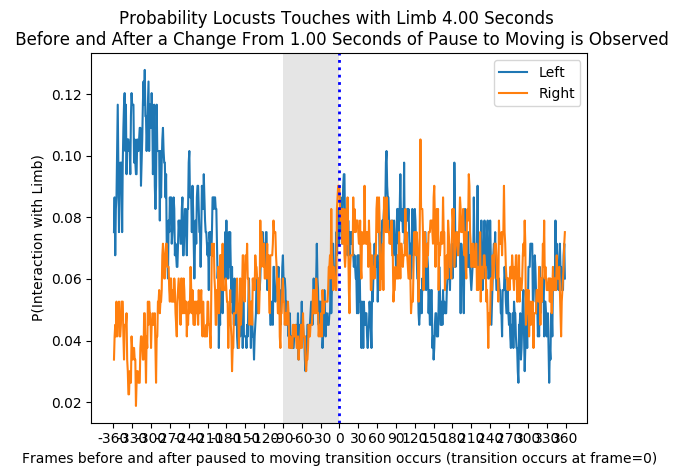

In [174]:
data_analysis.history(X_LR, y, framesback, region, want_PL_or_Greater=False, pause_length=pause_lengths[2])

In [ ]:
def histo(counts, title, xlabel, location, labels=[], log=False):
    num_bins =  1 + int(3.322*math.log(len(counts)))
    if num_bins < 4:
        num_bins =  1 + int(3.322*math.log(len(counts[0])))
        n, bins, patches = plt.hist(counts, num_bins, log=log, label=labels)
    else:
        n, bins, patches = plt.hist(counts, num_bins, log=log)
    
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Count')
    plt.savefig(location)
    # plt.legend()
    plt.show()

In [ ]:
def graph_title(region):
    title=('Distribution of Length of %s Interactions across the Entire Experiment' % region)
    xlabel='Length of the Interaction (frames)'
    location=('./plots/pairwise/%s_length_histo.png' % region)
    return title, xlabel, location

Plot All Distribution on the Same Histogram

In [108]:
# get avg length of interactions
marked = np.zeros((pairwise_X.shape), dtype=bool)

ff_length=[]
fb_length=[]
bf_length=[]
bb_length=[]

for locust in range(pairwise_X.shape[0]):
    for frame in range(pairwise_X.shape[1]):
        if not marked[locust, frame, 0]:
            if pairwise_X[locust, frame, 0]==ff_numb:
                length, marked = get_duration(pairwise_X, ff_numb, locust, frame, marked)
                ff_length.append(length)
            if pairwise_X[locust, frame, 0]==fb_numb:
                length, marked = get_duration(pairwise_X, fb_numb, locust, frame, marked)
                fb_length.append(length)
            if pairwise_X[locust, frame, 0]==bf_numb:
                length, marked = get_duration(pairwise_X, bf_numb, locust, frame, marked)
                bf_length.append(length)
            if pairwise_X[locust, frame, 0]==bb_numb:
                length, marked = get_duration(pairwise_X, bb_numb, locust, frame, marked)
                bb_length.append(length)

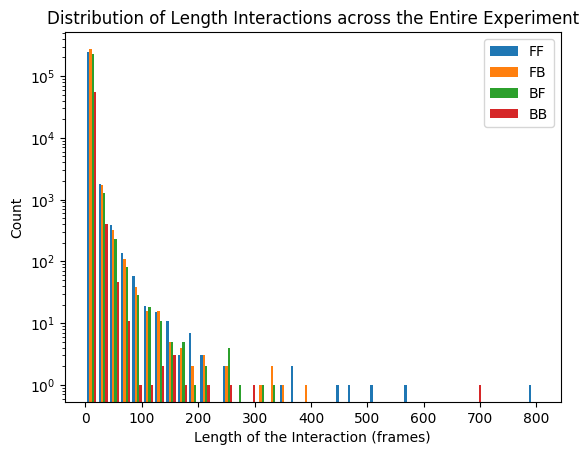

In [121]:
log=True
title=('Distribution of Length Interactions across the Entire Experiment')
xlabel='Length of the Interaction (frames)'
location=('./plots/pairwise/all_histo.png')

x_multi=[]
x_multi.append(ff_length)
x_multi.append(fb_length)
x_multi.append(bf_length)
x_multi.append(bb_length)

# bins =  1 + int(3.322*math.log(len(ff_length)))

bins=40

n, bins, patches = plt.hist(x_multi, bins, log=log, label=['FF', 'FB', 'BF', 'BB'])

plt.title(title)
plt.xlabel(xlabel)
plt.ylabel('Count')
plt.savefig(location)
plt.legend()
plt.show()

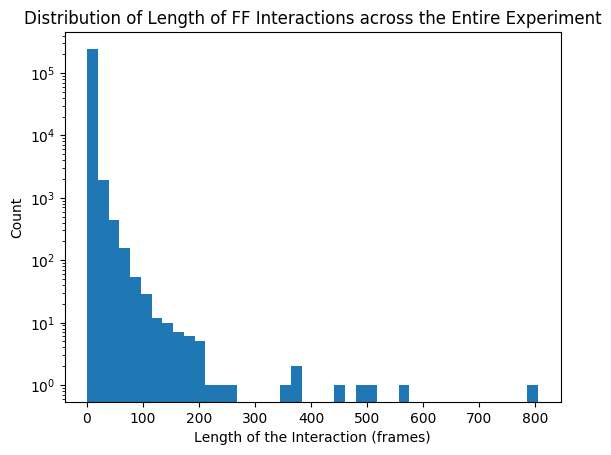

In [113]:
title, xlabel, location=graph_title('FF')
histo(ff_length, title, xlabel, location, log=True)

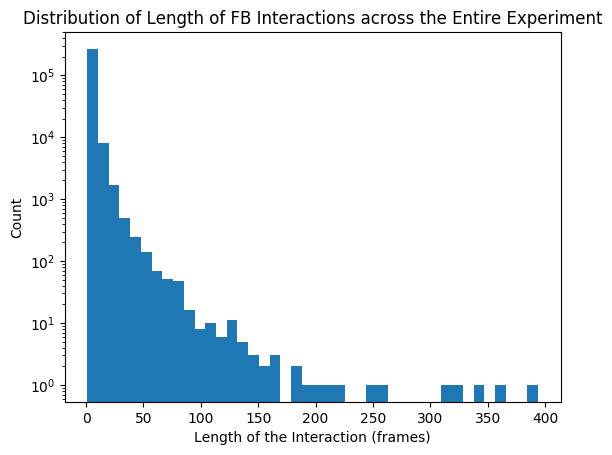

In [114]:
title, xlabel, location=graph_title('FB')
histo(fb_length, title, xlabel, location, log=True)

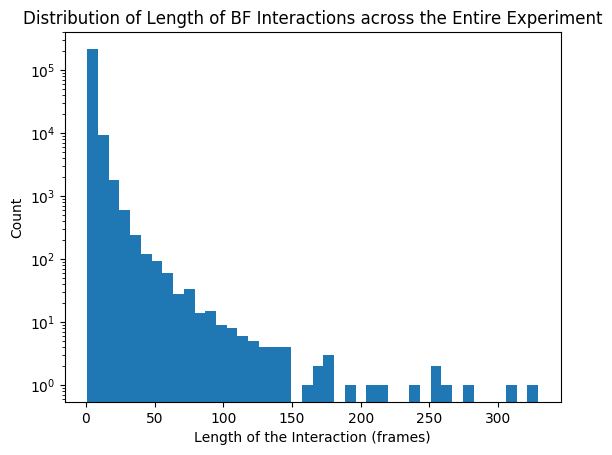

In [115]:
title, xlabel, location=graph_title('BF')
histo(bf_length, title, xlabel, location, log=True)

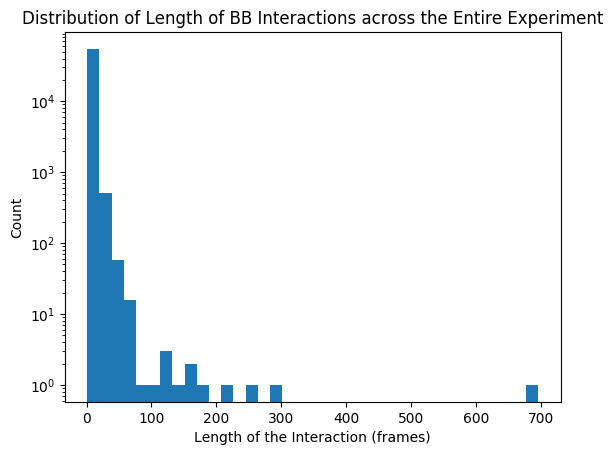

In [116]:
title, xlabel, location=graph_title('BB')
histo(bb_length, title, xlabel, location, log=True)

### K Means Clustering

In [157]:
import pandas as pd

# create numpy array of size (103, 54)
pairwiseAFMB_count=np.zeros((103, 54))

for locust in range(103):
    print(locust)
    for frame in range(totalFrames):
        for num in all_numbs:
            if pairwise_AFMB[locust, frame, 0]==num:
                pairwiseAFMB_count[locust, num]+=1
                break

pairwiseAFMB_count=pairwiseAFMB_count[:, all_numbs]
df = pd.DataFrame(data=pairwiseAFMB_count, index=np.arange(103), columns=np.reshape(AFMB_pair, -1))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102


In [160]:
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [389]:
df.head()

,AA,AF,AM,AB,FA,FF,FM,FB,MA,MF,MM,MB,BA,BF,BM,BB,cluster
0,2541.0,1744.0,2492.0,2599.0,1518.0,1734.0,2245.0,2150.0,1716.0,1817.0,1252.0,818.0,1011.0,1625.0,995.0,186.0,1
1,1830.0,1126.0,1361.0,6510.0,876.0,1414.0,1844.0,6052.0,906.0,1415.0,1760.0,2368.0,1726.0,2038.0,1469.0,493.0,0
2,2470.0,1719.0,2334.0,2071.0,1257.0,2131.0,2943.0,1949.0,1452.0,2505.0,1754.0,491.0,713.0,1375.0,579.0,113.0,1
3,1445.0,770.0,1191.0,1426.0,1277.0,1245.0,1748.0,1789.0,1800.0,1738.0,1511.0,1053.0,2544.0,2990.0,1269.0,201.0,1
4,1762.0,1292.0,1708.0,2222.0,1130.0,1848.0,2357.0,2892.0,1180.0,1951.0,1943.0,1438.0,1348.0,1590.0,1035.0,378.0,1


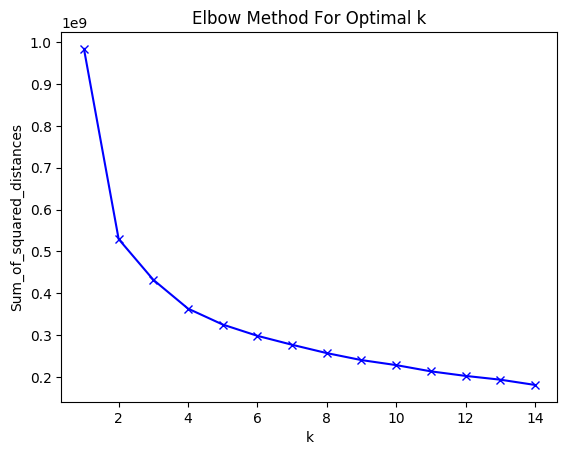

In [161]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show() 

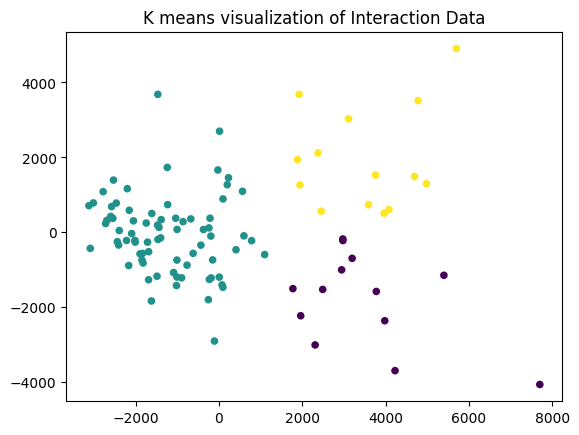

In [194]:
clus_num=3 # to do:  elbow method
clusters = clus_num
kmeans = KMeans(n_clusters=clusters).fit(df)
y_kmeans = kmeans.predict(df)
df['cluster']=y_kmeans
centers_k = kmeans.cluster_centers_

pca_df=pd.DataFrame()
pca = PCA(n_components = 2)
pca_df['x'] = pca.fit_transform(df)[:,0]
pca_df['y'] = pca.fit_transform(df)[:,1]
centers = pca.fit_transform(centers_k)

plt.figure()
plt.scatter(pca_df['x'], pca_df['y'], c=y_kmeans, s=20, cmap='viridis')
# plt.scatter(centers[:,0], centers[:,1], c='black', s=100, cmap='viridis', alpha=.5)
# plt.scatter(centers[:,0], centers[:,1], c=np.unique(y_kmeans), s=200, cmap='viridis', alpha=1)
plt.title("K means visualization of Interaction Data")
plt.show()

In [489]:
df.columns[:-1]

Index(['AA', 'AF', 'AM', 'AB', 'FA', 'FF', 'FM', 'FB', 'MA', 'MF', 'MM', 'MB',
       'BA', 'BF', 'BM', 'BB'],
      dtype='object')

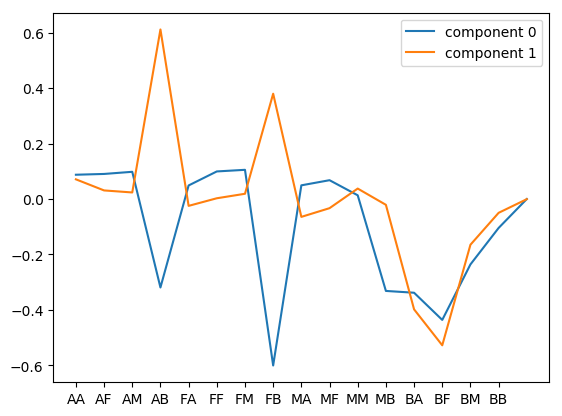

In [494]:
plt.plot(pca.components_[0], label='component 0')
plt.plot(pca.components_[1], label='component 1')
plt.xticks(np.arange(16), df.columns[:-1])
plt.legend()

In [163]:
unique, counts=np.unique(np.array(df['cluster']), return_counts=True)
unique, counts

(array([0, 1, 2, 3], dtype=int32), array([44, 12, 15, 32]))

In [ ]:
import pandas as pd

# create numpy array of size (103, 54)
pairwiseAFMB_count=np.zeros((103, 54))

for locust in range(103):
    print(locust)
    for frame in range(90*60*30): # 30 minutes only!
        for num in all_numbs:
            if pairwise_AFMB[locust, frame, 0]==num:
                pairwiseAFMB_count[locust, num]+=1
                break

pairwiseAFMB_count=pairwiseAFMB_count[:, all_numbs]
df = pd.DataFrame(data=pairwiseAFMB_count, index=np.arange(103), columns=np.reshape(AFMB_pair, -1))

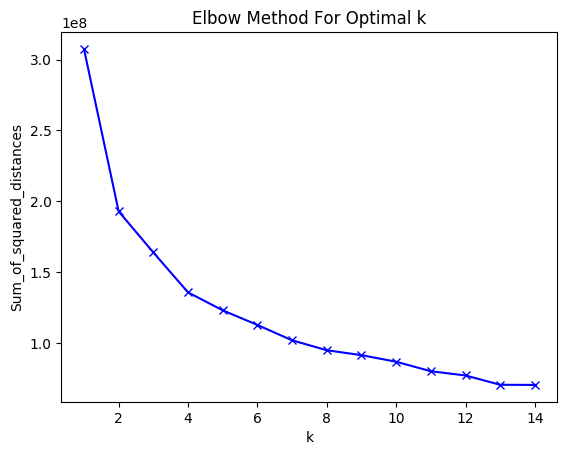

In [524]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show() 

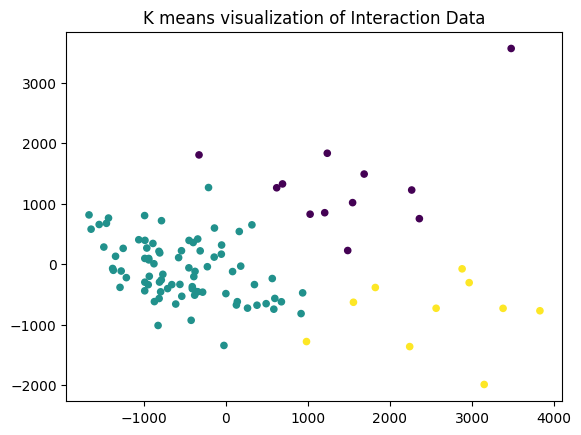

In [525]:
clus_num=3 # to do:  elbow method
clusters = clus_num
kmeans = KMeans(n_clusters=clusters).fit(df)
y_kmeans = kmeans.predict(df)
df['cluster']=y_kmeans
centers_k = kmeans.cluster_centers_

pca_df=pd.DataFrame()
pca = PCA(n_components = 2)
pca_df['x'] = pca.fit_transform(df)[:,0]
pca_df['y'] = pca.fit_transform(df)[:,1]
centers = pca.fit_transform(centers_k)

plt.figure()
plt.scatter(pca_df['x'], pca_df['y'], c=y_kmeans, s=20, cmap='viridis')
# plt.scatter(centers[:,0], centers[:,1], c='black', s=100, cmap='viridis', alpha=.5)
# plt.scatter(centers[:,0], centers[:,1], c=np.unique(y_kmeans), s=200, cmap='viridis', alpha=1)
plt.title("K means visualization of Interaction Data")
plt.show()

In [526]:
df.columns[:-1]

Index(['AA', 'AF', 'AM', 'AB', 'FA', 'FF', 'FM', 'FB', 'MA', 'MF', 'MM', 'MB',
       'BA', 'BF', 'BM', 'BB'],
      dtype='object')

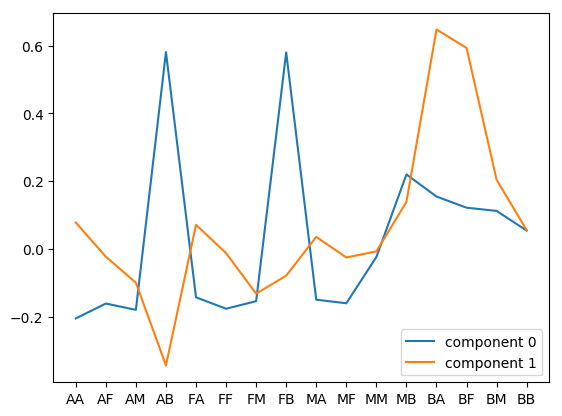

In [527]:
plt.plot(pca.components_[0], label='component 0')
plt.plot(pca.components_[1], label='component 1')
plt.xticks(np.arange(16), df.columns[:-1])
plt.legend()

#### Clustering
Given a time frame, what is the number of times Locusts have done each interaction in the past?
16 vector of interaction where each data point is a count for each type of interaction 

#### Pairwise Interaction Breakdown

In [146]:
unique, counts=np.unique(pairwise_AFMB, return_counts=True)
unique[0:18], counts[0:18]
# note: many interactions counted as "neither"

(array([-1.,  0.,  2.,  3.,  5.,  7., 11., 13., 17., 19., 23., 29., 31.,
        37., 41., 43., 47., 53.]),
 array([60438, 12489,  4309,  3204,  3626,  3813,  3229,  3784,  4271,
         4099,  3911,  4692,  3703,  1533,  3967,  4489,  1552,   156],
       dtype=int64))

In [170]:
k=np.insert(list(AFMB_dict.keys()), (0,1), ("no", "ia"))
# no = no unique intersection region, multiple limbs intersecting
# ia: intersecting with abdomen

In [171]:
count = dict(zip(k, counts[0:18]))

### Speed of Front Legs

#### Generate Data for Speed of Forelegs

In [195]:
with h5py.File('forelegL_speed.h5', 'r') as h5File:
    forelegL_speed_h5 = h5File.get('speed')
    forelegL_speed_h5 = np.array(forelegL_speed_h5)

with h5py.File('forelegR_speed.h5', 'r') as h5File:
    forelegR_speed_h5 = h5File.get('speed')
    forelegR_speed_h5 = np.array(forelegR_speed_h5)

In [196]:
forelegL_speed=forelegL_speed_h5[:, 0:totalFrames]
forelegR_speed=forelegR_speed_h5[:, 0:totalFrames]

In [229]:
np.sum(y[locust, 0: 90])

5.0

In [498]:
def get_speeds(pairwise_X, y, L_speed, R_speed, touching, limbs):  
    
    frames_past=90
    frames_future=30
    framesback=360
    speed=(L_speed+R_speed)/2
    all_sp=[]
    midpoint=framesback

    for locust in tqdm(range(103)):
        for frame in range(framesback, totalFrames-framesback):
            # look for consecutive pause 
            past=np.sum(y[locust, frame-(frames_past): frame])
            future = np.sum(y[locust, frame: frame+(frames_future)+1])
            # if np.sum(y[locust, frame: frame+10, 0])>8 and np.sum(y[locust, frame-20:frame-1, 0])==0 and past<10 and future>40:  
            if y[locust, frame-1, 0]==0 and y[locust, frame, 0]==1 and past<3 and future>frames_future-3:
                # print(locust, frame)
                # if the locust has a consecutive pause of length 1sec or greater + moves for half a second
                if touching:
                    num=pairwise_X[locust, frame, 0]
                    if (num==limbs[0] or num==limbs[1] or num==limbs[2] or num==limbs[3]):
                        speed_ts=np.zeros(2*framesback+1)
                            
                        for future in range(1, framesback):
                            speed_ts[midpoint+future]=speed[locust, frame+future]
                        for prev in range(framesback):
                            speed_ts[midpoint-prev]=speed[locust, frame-prev]
                        all_sp.append(speed_ts)
                        
                else: # if not touching
                    num=pairwise_X[locust, frame, 0]
                    if not (num==limbs[0] or num==limbs[1] or num==limbs[2] or num==limbs[3]):
                        speed_ts=np.zeros(2*framesback+1)
                            
                        for future in range(1, framesback):
                            speed_ts[midpoint+future]=speed[locust, frame+future]
                        for prev in range(framesback):
                            speed_ts[midpoint-prev]=speed[locust, frame-prev]
                        all_sp.append(speed_ts)
    return all_sp

In [499]:
def graph_title(orientation, mode, limb):
    title=('Distribution of Speed of the %s %s when Locust is %s ' % (orientation, limb, mode))
    xlabel=('Speed of %s Front Legs' % orientation)
    location=('./plots/FL_Speed/%s_histo_%s.png' % (mode, orientation))
    return title, xlabel, location

In [500]:
pairwise_X.shape, y.shape, forelegR_speed.shape

((103, 324299, 1), (103, 324299, 1), (103, 324299))

### Front Legs Touching: Changing if Locust is Paused or Moving

#### Speed of Front Legs when Locust is Paused, Touching

In [501]:
front=[11, 13, 17, 19]

In [502]:
# Speed of Front Legs when Locust is Paused, Touching
sp_touch = get_speeds(pairwise_AFMB, y, forelegL_speed, forelegR_speed, touching=True, limbs=front)
sp_no_touch = get_speeds(pairwise_AFMB, y, forelegL_speed, forelegR_speed, touching=False, limbs=front)




















  0%|          | 0/103 [00:00<?, ?it/s]


















  1%|          | 1/103 [00:02<04:33,  2.68s/it]


















  2%|▏         | 2/103 [00:05<04:30,  2.68s/it]


















  3%|▎         | 3/103 [00:07<04:20,  2.61s/it]


















  4%|▍         | 4/103 [00:10<04:16,  2.59s/it]


















  5%|▍         | 5/103 [00:13<04:15,  2.61s/it]


















  6%|▌         | 6/103 [00:15<04:08,  2.56s/it]


















  7%|▋         | 7/103 [00:18<04:11,  2.62s/it]


















  8%|▊         | 8/103 [00:21<04:16,  2.70s/it]


















  9%|▊         | 9/103 [00:23<04:12,  2.69s/it]


















 10%|▉         | 10/103 [00:26<04:07,  2.66s/it]


















 11%|█         | 11/103 [00:28<04:02,  2.63s/it]


















 12%|█▏        | 12/103 [00:31<03:56,  2.60s/it]


















 13%|█▎        | 13/103 [00:34<03:53,  2.60s/it]


















 14%|█▎        | 14/103 [00:37<04:11,  2.83s/it]














 27%|██▋       | 28/103 [01:14<03:20,  2.67s/it]


















 28%|██▊       | 29/103 [01:17<03:26,  2.79s/it]


















 29%|██▉       | 30/103 [01:20<03:27,  2.84s/it]


















 30%|███       | 31/103 [01:23<03:27,  2.89s/it]


















 31%|███       | 32/103 [01:26<03:23,  2.86s/it]


















 32%|███▏      | 33/103 [01:29<03:12,  2.75s/it]


















 33%|███▎      | 34/103 [01:31<03:06,  2.70s/it]


















 34%|███▍      | 35/103 [01:34<03:01,  2.67s/it]


















 35%|███▍      | 36/103 [01:36<02:59,  2.68s/it]


















 36%|███▌      | 37/103 [01:39<02:55,  2.66s/it]


















 37%|███▋      | 38/103 [01:42<02:53,  2.67s/it]


















 38%|███▊      | 39/103 [01:44<02:50,  2.67s/it]


















 39%|███▉      | 40/103 [01:47<02:47,  2.65s/it]


















 40%|███▉      | 41/103 [01:50<02:42,  2.63s/it]


















 41%|████      | 42/103 [01:52<02:37,  2.57s/it]















In [503]:
len(sp_touch)

133

In [504]:
sp_no_touch[0].shape

(721,)

In [505]:
sp_touch=np.array(sp_touch)
sp_no_touch=np.array(sp_no_touch)

In [506]:
sp_no_touch[:, 0].shape

(9403,)

In [507]:
sp_touch.shape, sp_no_touch.shape

((133, 721), (9403, 721))

In [509]:
sp_no_touch[400, :]

array([0.00000000e+00, 5.92013574e-04, 6.09183597e-04, 9.57592594e-04,
       5.32790233e-04, 1.00451091e-03, 4.24291313e-04, 5.34728606e-04,
       4.85894940e-04, 7.09918037e-04, 4.10383873e-04, 1.02018236e-03,
       9.17382356e-04, 8.83781584e-04, 9.25266388e-04, 4.39154835e-04,
       2.44252380e-04, 4.83863012e-04, 4.78947732e-04, 1.38061383e-03,
       5.18668690e-04, 3.43525324e-04, 6.64745487e-04, 7.49905157e-05,
       3.84246770e-04, 1.06093059e-04, 1.71648360e-04, 6.08201342e-04,
       5.62999121e-04, 6.01146443e-04, 1.90490374e-03, 1.89665990e-03,
       1.63908571e-03, 1.86957774e-03, 1.24635582e-03, 1.31036472e-03,
       1.61899469e-03, 4.43716606e-04, 1.87228015e-03, 1.63097359e-03,
       1.43855927e-03, 1.09176006e-03, 5.98869432e-04, 1.61683749e-03,
       2.40139541e-03, 1.63526926e-03, 1.63778441e-03, 1.39742170e-03,
       5.49344506e-04, 1.47064042e-03, 1.55514583e-03, 2.71141605e-03,
       4.93574968e-04, 1.06264389e-03, 6.48862915e-04, 1.27466925e-03,
      

In [510]:
# sp_touch_list = sp_touch.tolist()
# sp_no_touch_list=sp_no_touch.tolist()

avg_sp_touch=[]
avg_sp_no_touch=[]
std_sp_touch=[]
std_sp_no_touch=[]

for frame in range(sp_touch.shape[1]):
    avg_sp_touch.append(np.mean(sp_touch[:, frame]))
    std_sp_touch.append(np.mean(sp_touch[:, frame]))
    
for frame in range(sp_no_touch.shape[1]):
    avg_sp_no_touch.append(np.mean(sp_no_touch[:, frame]))
    std_sp_no_touch.append(np.mean(sp_no_touch[:, frame]))


In [511]:
avg_sp_touch[0]

0.0

In [512]:
sp_touch.shape, sp_no_touch.shape

((133, 721), (9403, 721))

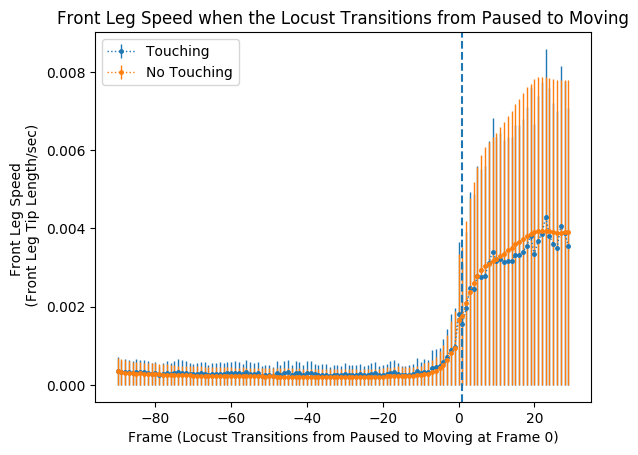

In [522]:
ind = np.arange(-90, 30)

plt.title('Front Leg Speed when the Locust Transitions from Paused to Moving')
plt.ylabel('Front Leg Speed \n (Front Leg Tip Length/sec)')
plt.xlabel('Frame (Locust Transitions from Paused to Moving at Frame 0)')

plt.errorbar(ind, np.array(avg_sp_touch)[360-90: 360+30], np.array(std_sp_touch)[360-90: 360+30], linestyle=':', linewidth=1, markersize=5, marker='.', label="Touching")
plt.errorbar(ind, np.array(avg_sp_no_touch)[360-90: 360+30], np.array(std_sp_no_touch)[360-90: 360+30], linestyle=':', linewidth=1, markersize=5, marker='.', label="No Touching")

plt.axvline(x=1, linestyle='--')
# plt.plot(ind, np.array(avg_sp_touch)[360-90: 360+30], linestyle=':', linewidth=1, markersize=3, marker='.', label="Touching")
# plt.plot(ind, np.array(avg_sp_no_touch)[360-90: 360+30], linestyle=':', linewidth=1, markersize=3, marker='.', label="No Touching")

plt.legend()

plt.show()

In [450]:
np.mean(forelegL_speed[np.where(np.squeeze(y)==1, True, False)])

0.0003231805425580773

In [452]:
np.mean(forelegL_speed[0, 295972-90:295972])

8.727450969874756e-05

In [453]:
np.mean(forelegL_speed[0, 295972:295972+30])

0.0044490170471059775

In [439]:
np.mean(forelegL_speed[np.where(np.squeeze(y)==0, True, False)])

0.0003231805425580773

In [154]:
# Speed of Front Legs when Locust is Paused, Touching
paused_left, paused_right = get_speeds(pairwise_X, y, forelegL_speed, forelegR_speed, 
                                                      moving=False, touching=True, limbs=front)
print("Median of Left Leg: %.8f Median of Right Leg: %.8f" % (np.median(paused_left), np.median(paused_right)))
print("Mean of Left Leg: %.8f Mean of Right Leg: %.8f" % (np.mean(paused_left), np.mean(paused_right)))

Median of Left Leg: 0.00025821 Median of Right Leg: 0.00032974
Mean of Left Leg: 0.00034944 Mean of Right Leg: 0.00066882


#### Speed of Front Legs when Locust is Moving, Touching

In [155]:
moving_left, moving_right = get_speeds(pairwise_X, y, forelegL_speed, forelegR_speed, 
                                                      moving=True, touching=True, limbs=front)
print("Median of Left Leg: %.8f Median of Right Leg: %.8f" % (np.median(moving_left), np.median(moving_right)))
print("Mean of Left Leg: %.8f Mean of Right Leg: %.8f" % (np.mean(moving_left), np.mean(moving_right)))

Median of Left Leg: 0.00263848 Median of Right Leg: 0.00249323
Mean of Left Leg: 0.00320789 Mean of Right Leg: 0.00330478


#### Histogram

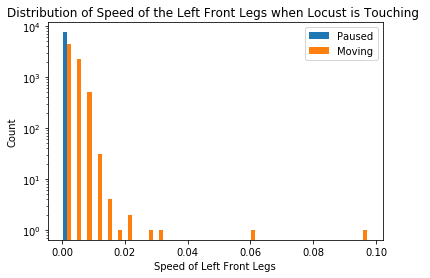

In [159]:
title, xlabel, location=graph_title('Left', 'Touching', 'Front Legs')
histo([paused_left, moving_left], title, xlabel, location, labels=["Paused", "Moving"], log=True)

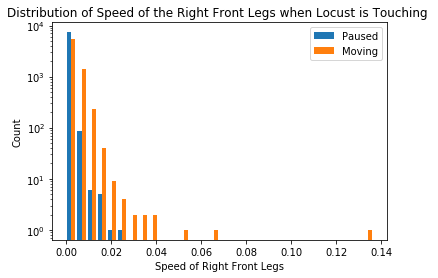

In [160]:
title, xlabel, location=graph_title('Right', 'Touching', 'Front Legs')
histo([paused_right, moving_right], title, xlabel, location, labels=["Paused", "Moving"], log=True)

### Front Legs Not Touching

#### Speed of Front Legs when Locust is Paused, Not Touching

In [161]:
# Speed of Front Legs when Locust is Paused, Not Touching
paused_left, paused_right = get_speeds(pairwise_X, y, forelegL_speed, forelegR_speed, 
                                                      moving=False, touching=False, limbs=front)
print("Median of Left Leg: %.8f Median of Right Leg: %.8f" % (np.median(paused_left), np.median(paused_right)))
print("Mean of Left Leg: %.8f Mean of Right Leg: %.8f" % (np.mean(paused_left), np.mean(paused_right)))

Median of Left Leg: 0.00022424 Median of Right Leg: 0.00033110
Mean of Left Leg: 0.00030870 Mean of Right Leg: 0.00076404


#### Speed of Front Legs when Locust is Moving, Touching

In [163]:
moving_left, moving_right = get_speeds(pairwise_X, y, forelegL_speed, forelegR_speed, 
                                                      moving=True, touching=False, limbs=front)
print("Median of Left Leg: %.8f Median of Right Leg: %.8f" % (np.median(moving_left), np.median(moving_right)))
print("Mean of Left Leg: %.8f Mean of Right Leg: %.8f" % (np.mean(moving_left), np.mean(moving_right)))

Median of Left Leg: 0.00412505 Median of Right Leg: 0.00400304
Mean of Left Leg: 0.00440644 Mean of Right Leg: 0.00469452


#### Histogram

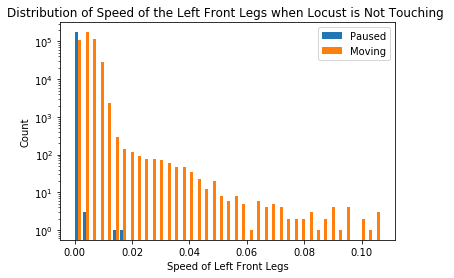

In [164]:
title, xlabel, location=graph_title('Left', 'Not Touching', 'Front Legs')
histo([paused_left, moving_left], title, xlabel, location, labels=["Paused", "Moving"], log=True)

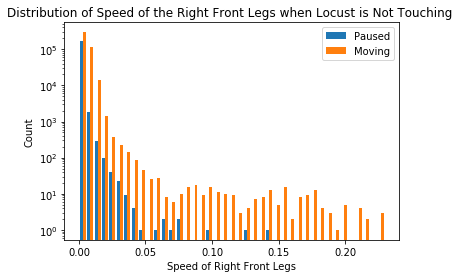

In [165]:
title, xlabel, location=graph_title('Right', 'Not Touching', 'Front Legs')
histo([paused_right, moving_right], title, xlabel, location, labels=["Paused", "Moving"], log=True)

## Antenna

In [36]:
with h5py.File('antL_speed.h5', 'r') as h5File:
    antL_speed_h5 = h5File.get('speed')
    antL_speed_h5 = np.array(antL_speed_h5)

with h5py.File('antR_speed.h5', 'r') as h5File:
    antR_speed_h5 = h5File.get('speed')
    antR_speed_h5 = np.array(antR_speed_h5)

In [37]:
antL_speed=antL_speed_h5[:, 0:totalFrames]
antR_speed=antR_speed_h5[:, 0:totalFrames]

In [147]:
pairwise_X.shape, y.shape, antR_speed.shape

((103, 6000, 1), (103, 6000, 1), (103, 6000))

### Antenna Touching: Changing if Locust is Paused or Moving

#### Speed of Antenna when Locust is Paused, Touching

In [ ]:
ant=[2,3,5,7]

In [154]:
# Speed of Front Legs when Locust is Paused, Touching
paused_left, paused_right = get_speeds(pairwise_X, y, antL_speed, antR_speed, 
                                                      moving=False, touching=True, limbs=ant)
print("Median of Left Ant: %.8f Median of Right Ant: %.8f" % (np.median(paused_left), np.median(paused_right)))
print("Mean of Left Ant: %.8f Mean of Right Ant: %.8f" % (np.mean(paused_left), np.mean(paused_right)))

Median of Left Leg: 0.00025821 Median of Right Leg: 0.00032974
Mean of Left Leg: 0.00034944 Mean of Right Leg: 0.00066882


#### Speed of Antenna when Locust is Moving, Touching

In [155]:
moving_left, moving_right = get_speeds(pairwise_X, y, antL_speed, antR_speed, 
                                                      moving=True, touching=True, limbs=ant)
print("Median of Left Ant: %.8f Median of Right Ant: %.8f" % (np.median(moving_left), np.median(moving_right)))
print("Mean of Left Ant: %.8f Mean of Right Ant: %.8f" % (np.mean(moving_left), np.mean(moving_right)))

Median of Left Leg: 0.00263848 Median of Right Leg: 0.00249323
Mean of Left Leg: 0.00320789 Mean of Right Leg: 0.00330478


#### Histogram

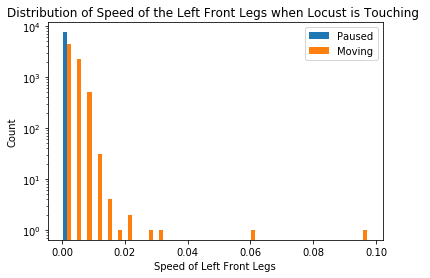

In [159]:
title, xlabel, location=graph_title('Left', 'Touching', 'Antenna')
histo([paused_left, moving_left], title, xlabel, location, labels=["Paused", "Moving"], log=True)

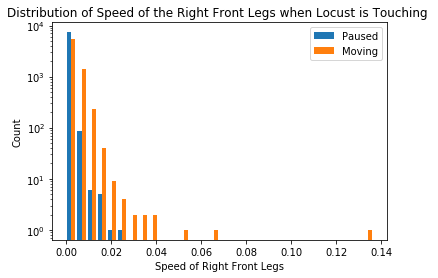

In [160]:
title, xlabel, location=graph_title('Right', 'Touching', 'Antenna')
histo([paused_right, moving_right], title, xlabel, location, labels=["Paused", "Moving"], log=True)

### Antenna Not Touching

#### Speed of Antenna when Locust is Paused, Not Touching

In [161]:
# Speed of Ant when Locust is Paused, Not Touching
paused_left, paused_right = get_speeds(pairwise_X, y, antL_speed, antR_speed, 
                                                      moving=False, touching=False, limbs=ant)
print("Median of Left Ant: %.8f Median of Right Ant: %.8f" % (np.median(paused_left), np.median(paused_right)))
print("Mean of Left Ant: %.8f Mean of Right Ant: %.8f" % (np.mean(paused_left), np.mean(paused_right)))

Median of Left Leg: 0.00022424 Median of Right Leg: 0.00033110
Mean of Left Leg: 0.00030870 Mean of Right Leg: 0.00076404


#### Speed of Antenna when Locust is Moving, Touching

In [163]:
moving_left, moving_right = get_speeds(pairwise_X, y, antL_speed, antR_speed, 
                                                      moving=True, touching=False, limbs=ant)
print("Median of Left Ant: %.8f Median of Right Ant: %.8f" % (np.median(moving_left), np.median(moving_right)))
print("Mean of Left Ant: %.8f Mean of Right Ant: %.8f" % (np.mean(moving_left), np.mean(moving_right)))

Median of Left Leg: 0.00412505 Median of Right Leg: 0.00400304
Mean of Left Leg: 0.00440644 Mean of Right Leg: 0.00469452


#### Histogram

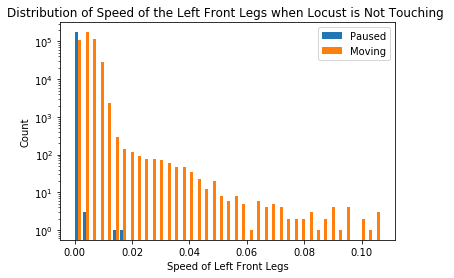

In [164]:
title, xlabel, location=graph_title('Left', 'Not Touching', 'Antenna')
histo([paused_left, moving_left], title, xlabel, location, labels=["Paused", "Moving"], log=True)

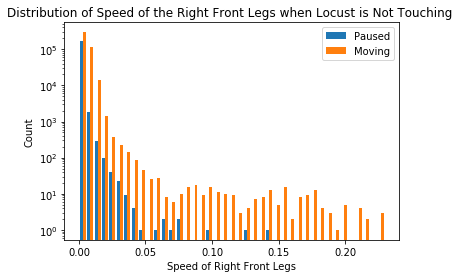

In [165]:
title, xlabel, location=graph_title('Right', 'Not Touching', 'Antenna')
histo([paused_right, moving_right], title, xlabel, location, labels=["Paused", "Moving"], log=True)

In [ ]:
def get_all_speeds(pairwise_X, y, L_speed, R_speed, limb_nums, touching=True): # add an argument so you can change what it's touching
    if moving: 
        moving_numb=1
    else: 
        moving_numb=0
            
    paused_touching_L=[]
    paused_touching_R=[]

    for locust in range(103):
        for frame in range(totalFrames):
            # if moving or paused
            num=pairwise_X[locust, frame, 0]
            if not touching:
                if np.isnan(num):
                    paused_touching_L.append(L_speed[locust, frame])
                    paused_touching_R.append(R_speed[locust, frame])
            else:
                for limb_num in limb_nums: 
                    if num==limb_num:
                        paused_touching_L.append(L_speed[locust, frame])
                        paused_touching_R.append(R_speed[locust, frame])
    return paused_touching_L, paused_touching_R

### Histogram 
To hopefully better understand the behavior of the antenna and any potential "boxing" behavior that may be occuring

In [ ]:
title, xlabel, location=graph_title('Left', 'in Any State', 'Antenna')
histo([left_1, left_2, left_3, left_4], title, xlabel, location, labels=["Touching", "AF", "AB", "No Touching"], log=True)

In [ ]:
title, xlabel, location=graph_title('Right', 'in Any State', 'Antenna')
histo([right_1, right_2, right_3, right_4], title, xlabel, location, labels=["Touching", "AF", "AB", "No Touching"], log=True)

In [420]:
def get_duration(moving):
    visited = np.zeros((y.shape), dtype=bool)
    duration = []
    if moving: 
        motion=1
    else: 
        motion=0

    for individ in range(y.shape[0]):
        for frame in range(y.shape[1]):
            if not visited[individ, frame]:
                visited[individ, frame]=True
                if y[individ, frame]==motion: # if the locust is paused/moving at this frame
                    length = 0 # length of time period
                    # iterate through the next frames to determine length of pause/motion
                    while (frame != y.shape[1] and y[individ, frame]==motion):
                        visited[individ, frame]=True # mark each frame as visited
                        length+=1 
                        frame+=1 # move on to the next frame
                    duration.append(length)

    return np.array(duration)

In [421]:
duration_paused = get_duration(moving=False)

In [422]:
unique_paused, counts_paused = np.unique(duration_paused, return_counts=True)

In [423]:
moving_duration = get_duration(moving=True)

In [424]:
moving_unique, moving_counts = np.unique(moving_duration, return_counts=True)

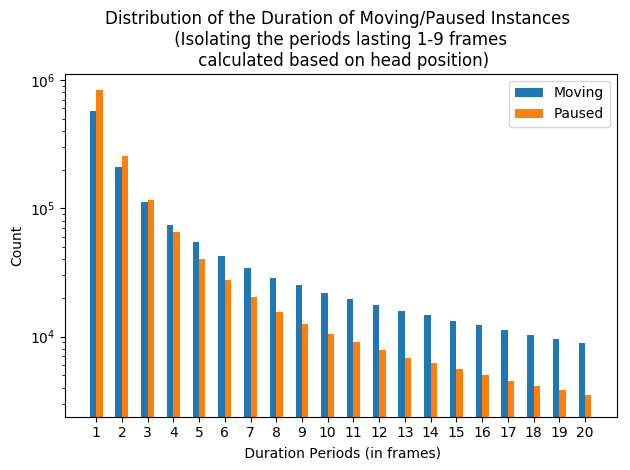

In [430]:
moving = moving_counts[0:20]
paused = counts_paused[0:20]

ind = np.arange(20)  # the x locations for the groups
width = 0.25  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(ind - width/2, moving, width, label='Moving', log=True)
rects2 = ax.bar(ind + width/2, paused, width, label='Paused', log=True)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_xlabel(' Duration Periods (in frames)')
ax.set_title('Distribution of the Duration of Moving/Paused Instances \n (Isolating the periods lasting 1-9 frames \n calculated based on head position)')
ax.set_xticks(ind)
ax.set_xticklabels(moving_unique[0:20])
ax.legend()


def autolabel(rects, xpos='center'):
    """
    Attach a text label above each bar in *rects*, displaying its height.

    *xpos* indicates which side to place the text w.r.t. the center of
    the bar. It can be one of the following {'center', 'right', 'left'}.
    """

    ha = {'center': 'center', 'right': 'left', 'left': 'right'}
    offset = {'center': 0, 'right': 1, 'left': -1}

    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(offset[xpos]*3, 3),  # use 3 points offset
                    textcoords="offset points",  # in both directions
                    ha=ha[xpos], va='bottom')


# autolabel(rects1, "left")
# autolabel(rects2, "right")

fig.tight_layout()

plt.show()